<h1><center>Indoor Location & Navigation</h1></center>
<h2><center>Identify the position of a smartphone in a shopping mall</h2></center>

<b>In this notebook I have tried my best to explain all the topics/aspects, related to this competition, at easiest form. </b>

<center><h2>Understand The Competition</center></h2>
Our smartphone goes everywhere with us and with permission, apps can use our location to provide contextual information. We get driving directions, find a store, or receive alerts for nearby promotions. These handy features are enabled by GPS, which requires outdoor exposure for the best accuracy.

Current positioning solutions have poor accuracy, particularly in multi-level buildings.

<b>In this competition, our task is to predict the indoor position of smartphones based on real-time sensor data.</b>

In [1]:
# Libraries
import numpy as np # linear algebra
import pandas as pd # data processing
import os
import json
import random
import glob
import seaborn as sns
from pathlib import Path
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.model_selection import KFold
import lightgbm as lgb
import psutil
import random
import os
import time
import sys
import math
from contextlib import contextmanager

<h2>Understand the Data</h2>
First, we need to understand the input data. The folder "indoor-location-navigation" contains 3 subdirectories, "metadata", "test", and "train", respectively.
The following schematic shows the data structure in the "metadata" folder, as it is given in the "Data Description" tab.

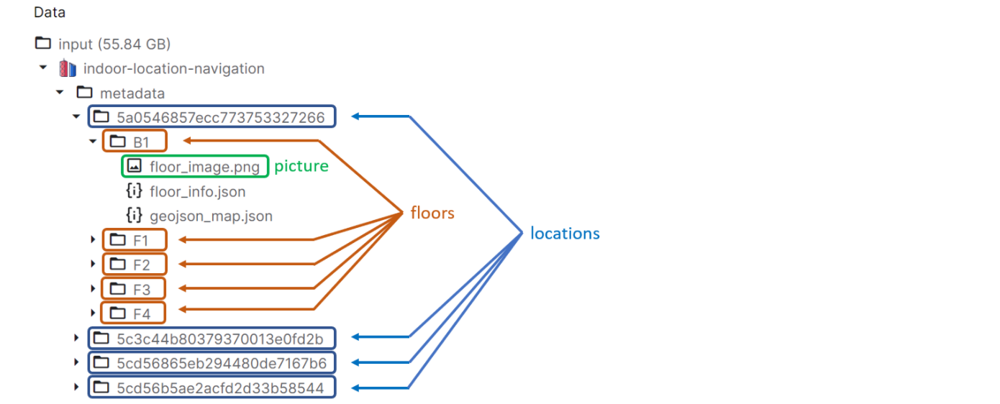

We are going to use the images in the .png format to display the locations. The other two files associated with each floor are in .json format. The floor_info.json describes the size of the location (height and width), while the geojson_map.json is a file for geospatial visualization (it is possible to reproduce a raster image in .png format using the *geopandas* library applied to this .json file).

<h2>Data Organization</h2>

<h4>Training Dataset</h4>

In [2]:
dataset_path = Path('../../indoor-location-navigation')
os.listdir(dataset_path)

['train',
 'indoor-navigation-and-location-wifi-features',
 'notebooks',
 'dataframes',
 'test',
 'metadata',
 'sample_submission.csv']

<b>Note that the data is organized by the sites and floors. Let's see how many sites do we have in train dataset?</b>

In [3]:
train_sites = os.listdir(dataset_path/"train")
print(f'There are {len(train_sites)} sites in the training set')

There are 204 sites in the training set


## Now each site is organized by Floors

In [4]:
example_site = os.listdir(dataset_path/"train")[12]
example_site_path = dataset_path/"train"/example_site
print('Floors for example site:')
print(os.listdir(example_site_path))

Floors for example site:
['F2', 'F1', 'B1', 'B2']


In [5]:
floors_per_site = []
for i in os.listdir(dataset_path/"train"): floors_per_site.append(len(os.listdir(dataset_path/"train"/i)))
print(f'There are a total of {sum(floors_per_site)} floors. On average, each site has {np.mean(floors_per_site)} floors')

There are a total of 981 floors. On average, each site has 4.8088235294117645 floors


<b>So every site has about 5 floors. In each floor are the path trace text files with the data</b>

<b>Path File</b>

In [6]:
print('Path text files for example floor:')
print(os.listdir(example_site_path/'B1'))

Path text files for example floor:
['5d0a1af8096be600087ee4d4.txt', '5d0a1b0a24caf50008a4f1cc.txt']


<h4>Train Data path files count</h4>

In [7]:
print(f"There are {len(list((dataset_path/'train').rglob('*.txt')))} path text files in the training set")

There are 26925 path text files in the training set


<b>To summarize, this is how the training data is structured:</b>



```
└───train                                                        //raw data from two sites
      └───site1
      |     └───B1                                               //traces from one floor
      |     |   └───5dda14a2c5b77e0006b17533.txt                 //trace file                             
      |     |   | ...
      |     |
      |     |
      |     └───F1
      |     | ...
      |
      └───site2
```

<h4>Test Dataset</h4>

In [8]:
print(f"There are {len(os.listdir(dataset_path/'test'))} path text files in the test set")

There are 626 path text files in the test set


<h4>Metdata Organization</h4>

In [9]:
print(f'There are {len(os.listdir(dataset_path/"metadata"))} sites in the metadata, just like the training set')

There are 204 sites in the metadata, just like the training set


<b>Let's look at a single floor of a single site</b>

In [10]:
metadata_example_site = os.listdir(dataset_path/"metadata")[10]
metadata_example_site_path = dataset_path/"metadata"/metadata_example_site
metadata_example_floor_path = dataset_path/"metadata"/metadata_example_site/os.listdir(metadata_example_site_path)[0]
print(os.listdir(metadata_example_floor_path))

['floor_image.png', 'geojson_map.json', 'floor_info.json']


<b>Explore 'floor_image.png' file</b>

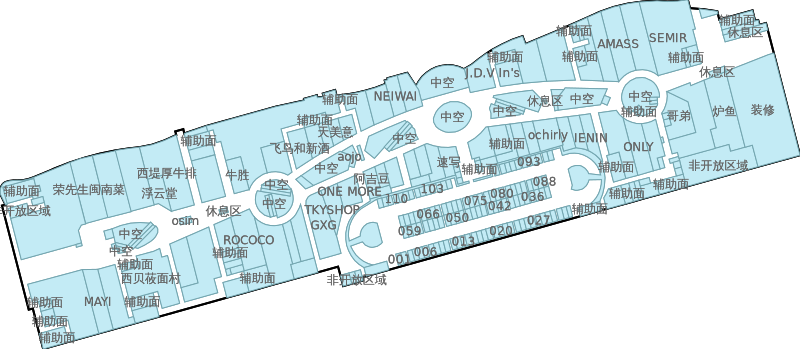

In [11]:
Image.open(metadata_example_floor_path/'floor_image.png')

<b>Explore 'geojson_map.json' file</b>

In [12]:
##################### In comment because Large Output Data ########################


# with open(metadata_example_floor_path/'geojson_map.json') as geojson_map:
#     data = json.load(geojson_map)
#     geojson_map.close()
# print(data)

<b>Explore 'floor_info.json' file</b>

In [13]:
with open(metadata_example_floor_path/'floor_info.json') as floor_info:
    data = json.load(floor_info)
    floor_info.close()
print(data)

{'map_info': {'height': 171.87718708784192, 'width': 393.6959618875078}}



<h3>Path text files</h3>
<b>Brief here. Each Column is described in detail in session (Deep Dive) below</b>
<p></p>
Let's look more closely at the path text files and how to process them.

The [GitHub README](https://github.com/location-competition/indoor-location-competition-20) provides more information about the text file format:

> The first column is Unix Time in millisecond. In specific, we use SensorEvent.timestamp for sensor data and system time for WiFi and Bluetooth scans.
> 
>The second column is the data type (ten in total).
>
>TYPE_ACCELEROMETER
>
>TYPE_MAGNETIC_FIELD
>
>TYPE_GYROSCOPE
>
>TYPE_ROTATION_VECTOR
>
>TYPE_MAGNETIC_FIELD_UNCALIBRATED
>TYPE_GYROSCOPE_UNCALIBRATED
>
>TYPE_ACCELEROMETER_UNCALIBRATED
>
>TYPE_WIFI
>
>TYPE_BEACON
>
>TYPE_WAYPOINT: ground truth location labeled by the surveyor
>
>Data values start from the third column.
>
>Column 3-5 of TYPE_ACCELEROMETER、TYPE_ACCELEROMETER、TYPE_GYROSCOPE、TYPE_ROTATION_VECTOR are SensorEvent.values[0-2] from the callback function onSensorChanged(). Column 6 is SensorEvent.accuracy.
>
>Column 3-8 of TYPE_ACCELEROMETER_UNCALIBRATED、TYPE_GYROSCOPE_UNCALIBRATED、TYPE_MAGNETIC_FIELD_UNCALIBRATED are SensorEvent.values[0-5] from the callback function onSensorChanged(). Column 9 is SensorEvent.accuracy.

<b>Let's Explore Text File</b>

In [14]:
example_floor_path = example_site_path/'B1'
example_txt_path = example_floor_path/os.listdir(example_floor_path)[0]
with open(example_txt_path) as example_txt:
    data = example_txt.read()
    example_txt.close()

##################### In comment because Large Output Data ########################
# print(data)

<h2><center>Deep Dive into EDA</h2>

<center><img src ="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRSq7tFWVYNmxhjebh_havbaBkI5UmrewSEKw&usqp=CAU " width = "400" height = "400"/></center>  

<h4>Define some Functions/Tools that we will use for EDA</h4>

In [15]:
def load_trace_as_dataframe(filepath):
    # Returns trace dataframe sorted by timestamp
    
    names = ['time', 'type'] + [f'col_{i}' for i in range(1, 9)]
    
    trace_df = pd.read_csv(
        filepath, sep='\t', comment='#', header=None, names=names
    )
    
    trace_df.sort_values(by='time', inplace=True)
    trace_df.reset_index(drop=True, inplace=True)
    return trace_df

In [16]:
def extract_feature_df(trace_df, 
                       feature_name, 
                       col_names=('x', 'y', 'z', 'accuracy')):
    
    
#     Extracts feature dataframe from trace dataframe by feature name.
    
#     Suitable for features: 
#     ----------------------
#         TYPE_WAYPOINT, if set col_names=('x', 'y'),
#         TYPE_ACCELEROMETER,
#         TYPE_GYROSCOPE,
#         TYPE_MAGNETIC_FIELD, 
#         TYPE_ROTATION_VECTOR,
        
#         TYPE_ACCELEROMETER_UNCALIBRATED, 
#                     if set col_names=('x', 'y', 'z', 'x_2', 'y_2', 'z_2', 'accuracy'),
                    
#         TYPE_GYROSCOPE_UNCALIBRATED, 
#                     if set col_names=('x', 'y', 'z', 'x_2', 'y_2', 'z_2', 'accuracy'),
                    
#         TYPE_MAGNETIC_FIELD_UNCALIBRATED, 
#                     if set col_names=('x', 'y', 'z', 'x_2', 'y_2', 'z_2', 'accuracy')
    
    
    feature_df = trace_df[trace_df['type'] == feature_name].copy()
    for i, col in enumerate(col_names, start=1):
        feature_df[col] = feature_df[f'col_{i}'].astype('float64')
        
    feature_df.drop(columns=[f'col_{i}' for i in range(1, 9)], inplace=True)
    feature_df.drop(columns=['type'], inplace=True)
    feature_df.reset_index(drop=True, inplace=True)
    
    return feature_df

In [17]:
def load_points(filepath):
    # Takes the path to the trace file.
    # Returns pandas dataframe which consists of device locations 
    # as x and y coordinates (values from TYPE_WAYPOINT) and their timestamps.
    
    trace_df = load_trace_as_dataframe(filepath)
    points_df = extract_feature_df(
        trace_df, 'TYPE_WAYPOINT', col_names=('x', 'y')
    )
    
    return points_df

In [18]:
def visualize_many_traces_on_the_map(traces_dataframes, map_image, width, height, 
                                     traces_filenames=None, 
                                     figsize=None):
    

#     Draws traces on the floor map.
    
#     Parameters
#     ----------
#         traces_dataframes: list of pandas DataFrames
#             Each DataFrame should consist of device locations as x and y 
#             coordinates and their timestamps.

#         map_image : numpy.array
#             Image of floor map.

#         width : float,
#             Width of floor. Should be taken from floor_info.json

#         height : float, 
#             Height of floor. Should be taken from floor_info.json

#         traces_filenames : list of strings, optional, default: None
#             List of filenames. Used to display the legend. 
#             There will be no legend if you pass traces_filenames=None

#         figsize : (float, float), optional, default: None
#             Size of the result image in terms of matplotlib.
    

    
    fig = plt.figure(figsize=figsize)
    ax = plt.subplot(111)

    plt.imshow(map_image, extent=[0, width, 0, height])

    if traces_filenames:
        
        for filename, points in zip(traces_filenames, traces_dataframes):
            plt.scatter(points['x'], points['y'], label=filename)
            plt.plot(points['x'], points['y'])
            
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        for points in traces_dataframes:
            plt.scatter(points['x'], points['y'])
            plt.plot(points['x'], points['y'])


    plt.show()

In [19]:
def visualize_single_trace_on_the_map(points_df, map_image, width, height, 
                                      scaling_coef=0.3, figsize=None):
    
    
#     Draws single trace on the floor map.
    
#     Parameters
#     ----------
#         points_df: pandas DataFrame
#             Should consist of device locations as x and y 
#             coordinates and their timestamps.

#         map_image : numpy.array
#             Image of floor map.

#         width : float,
#             Width of floor. Should be taken from floor_info.json

#         height : float, 
#             Height of floor. Should be taken from floor_info.json

#         scaling_coef : float
#             Scaling Coefficient. 

#         figsize : (float, float), optional, default: None
#             Size of the result image in terms of matplotlib.
    
    
    
    fig = plt.figure(figsize=figsize)
    ax = plt.subplot(111)

    plt.imshow(map_image, extent=[0, width, 0, height])
    plt.plot(points_df['x'], points_df['y'], linewidth=5, linestyle='-', color='blue')

    for i in range(len(points_df)):
        ax.text(
            points_df.loc[i, 'x'], points_df.loc[i, 'y'], i, 
            ha="center", size=15, 
            bbox=dict(boxstyle="circle, pad=0.3", 
                      fc="cyan", lw=2)
        )
 
    x_min, x_max = points_df['x'].min(), points_df['x'].max()
    y_min, y_max = points_df['y'].min(), points_df['y'].max()

    ax.set_xlim(x_min - scaling_coef*(x_max - x_min), x_max + scaling_coef*(x_max - x_min))
    ax.set_ylim(y_min - scaling_coef*(y_max - y_min), y_max + scaling_coef*(y_max - y_min))

    plt.show()


In [20]:
def plot_trace_features(feature_df, timestamps=None, figsize=None):
    

#     Plots the trace features.
    
#     Parameters
#     ----------
#         feature_df : pandas DataFrame
#             Can be exctracted from trace dataframe 
#             using extract_feature_df function.
        
#         timestamps : array-like, optional, default: None
#             Array of timestamps. 
#             Used to mark timestamps on the chart in the form of vertical lines.
#             Pass timestamps=None if you don't want to use this feature.

#         figsize : (float, float), optional, default: None
#             Size of the result image in terms of matplotlib.
    
#     Suitable for features: 
#     ----------------------
#         TYPE_ACCELEROMETER 
#         TYPE_GYROSCOPE 
#         TYPE_MAGNETIC_FIELD 
#         TYPE_ROTATION_VECTOR 
#         TYPE_ACCELEROMETER_UNCALIBRATED 
#         TYPE_GYROSCOPE_UNCALIBRATED 
#         TYPE_MAGNETIC_FIELD_UNCALIBRATED
   
    
    fig = plt.figure(figsize=figsize)
    ax = plt.subplot(111)

    for col in ['x', 'y', 'z']:
        plt.plot(feature_df['time'], feature_df[col], label=col)


    if points_df is not None:
        xmin, xmax, ymin, ymax = plt.axis()

        for i, timestamp in enumerate(timestamps):
            plt.axvline(x=timestamp, c='k', ls='--')

            ax.text(
            timestamp, ymax, i, 
            ha="center", size=15, 
            bbox=dict(boxstyle="circle, pad=0.3", 
                      fc="white", lw=2)
            )
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [21]:
data_path = '../../indoor-location-navigation'
floor = '5a0546857ecc773753327266/F1'
floor_metadata_dir = os.path.join(data_path, 'metadata', floor)
floor_train_dir = os.path.join(data_path, 'train', floor)

<h4>Loading coordinates of paths points</h4>

In [22]:
paths = []
for filename in os.listdir(floor_train_dir):
    if '.txt' not in filename:
        continue
    points = load_points(os.path.join(floor_train_dir, filename))
    paths.append((filename, points))

paths = sorted(paths, key=lambda path: len(path[1]), reverse=True)
paths = paths[:20]


traces_dataframes = [trace for filename, trace in paths]
traces_filenames = [filename for filename, trace in paths]

<h4>Loading floor map and its size</h4>

In [23]:
MAP_IMAGE = plt.imread(
    os.path.join(floor_metadata_dir, 'floor_image.png')
)

with open(os.path.join(floor_metadata_dir, 'floor_info.json')) as f:
    content = f.read()
    floor_info = json.loads(content)

MAP_HEIGHT = float(floor_info['map_info']['height'])
MAP_WIDTH = float(floor_info['map_info']['width'])
    
floor_info

{'map_info': {'height': 152.3075447409275, 'width': 122.40020010253855}}

<h4>Visualization of Traces (Paths) on the Floor Map</h4>

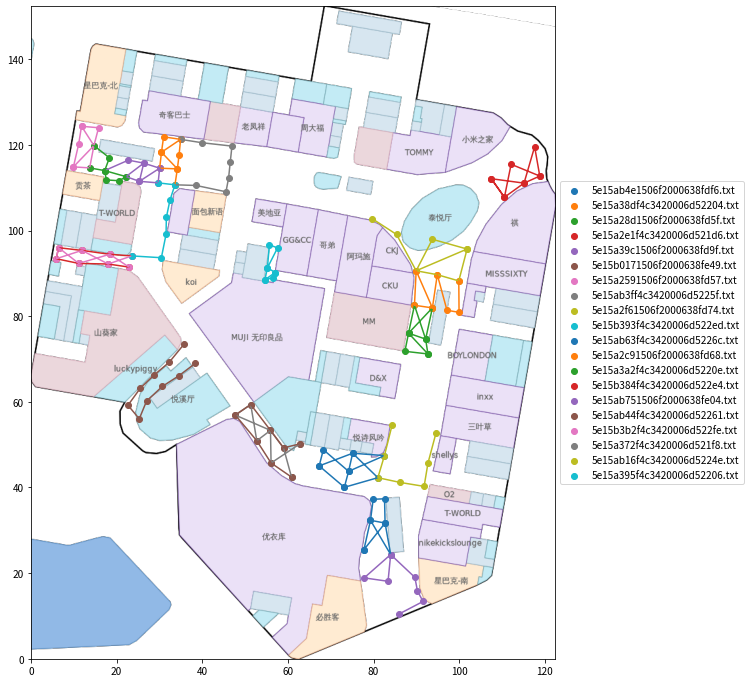

In [24]:
visualize_many_traces_on_the_map(
    traces_dataframes, MAP_IMAGE, MAP_WIDTH, MAP_HEIGHT, 
    traces_filenames=traces_filenames, 
    figsize=(15, 12)
)

<h4>Features Visualization</h4>
Let's take a closer look at single trace (path) and its attributes.

In [25]:
filename='5e15b0171506f2000638fe49.txt'
trace_filepath = os.path.join(floor_train_dir, filename)

trace_df = load_trace_as_dataframe(trace_filepath)
trace_df

,time,type,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8
0,1578478950611,TYPE_WAYPOINT,35.81434,73.54972,NaN,NaN,NaN,NaN,NaN,NaN
1,1578478950696,TYPE_BEACON,d9c573b719a17da4836208fc436f87b5ca1aa877,b6589fc6ab0dc82cf12099d1c2d40ab994e8410c,b6589fc6ab0dc82cf12099d1c2d40ab994e8410c,-56.000000,-69.000000,4.609608,bbb0c3915a9608e1ae4a5029ce5ff32b422f4e52,1.578479e+12
2,1578478950733,TYPE_MAGNETIC_FIELD,16.067505,-35.10437,-14.152527,3.000000,NaN,NaN,NaN,NaN
3,1578478950733,TYPE_GYROSCOPE,-0.35499573,-0.35671997,-0.47543335,3.000000,NaN,NaN,NaN,NaN
4,1578478950733,TYPE_ROTATION_VECTOR,0.042973697,0.261133,0.92708725,3.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
28505,1578479005275,TYPE_GYROSCOPE,-0.014633179,0.017196655,0.0071258545,3.000000,NaN,NaN,NaN,NaN
28506,1578479005275,TYPE_ROTATION_VECTOR,0.21967757,-0.19740751,-0.594244,3.000000,NaN,NaN,NaN,NaN
28507,1578479005275,TYPE_MAGNETIC_FIELD_UNCALIBRATED,-39.54315,4.8568726,-363.15002,-2.886963,3.192139,-339.547730,3,NaN
28508,1578479005275,TYPE_GYROSCOPE_UNCALIBRATED,0.024963379,-0.018829346,-0.01637268,-0.009933,0.003937,-0.006989,3,NaN


Here is a table of the attributes we need to deal with in this competition. 

As you can see it contains feature names and its params. We will describe some of these features in more detail below.

Each feature can be extracted from trace as dataframe with params as columns. For this we are using function `extract_feature_df` which is suitable for all features except TYPE_WIFI and TYPE_BEACON.

The table is taken from [competition's official github repo](https://github.com/location-competition/indoor-location-competition-20).

| Feature                           | Values |       |        |        |                   |        |           |                                   |
|:----------------------------------|:------:|:-----:|:------:|:-------|:-----------------:|:------:|:---------:|:---------------------------------:|
|TYPE_WAYPOINT                      |X axis  |Y axis |       |         |                   |        |           |                                   |
|TYPE_ACCELEROMETER                 |X axis  |Y axis |Z axis |accuracy |                   |        |           |                                   |
|TYPE_GYROSCOPE                     |X axis  |Y axis |Z axis |accuracy |                   |        |           |                                   | 
|TYPE_MAGNETIC_FIELD                |X axis  |Y axis |Z axis |accuracy |                   |        |           |                                   | 
|TYPE_ROTATION_VECTOR               |X axis  |Y axis |Z axis |accuracy |                   |        |           |                                   |
|TYPE_ACCELEROMETER_UNCALIBRATED    |X axis  |Y axis |Z axis |X axis   |Y axis             |Z axis  |accuracy   |                                   |
|TYPE_GYROSCOPE_UNCALIBRATED        |X axis  |Y axis |Z axis |X axis   |Y axis             |Z axis  |accuracy   |                                   |
|TYPE_MAGNETIC_FIELD_UNCALIBRATED   |X axis  |Y axis |Z axis |X axis   |Y axis             |Z axis  |accuracy   |                                   |
|TYPE_WIFI                          |ssid    |bssid  |RSSI   |frequency|last seen timestamp|        |           |                                   |
|TYPE_BEACON                        |UUID    |MajorID|MinorID|Tx Power |RSSI               |Distance|MAC Address|same with Unix time, padding data  |
​

<b>TYPE_WAYPOINT</b>

In [26]:
points_df = extract_feature_df(trace_df, 'TYPE_WAYPOINT', col_names=('x', 'y'))
points_df.head()

,time,x,y
0,1578478950611,35.814340,73.549720
1,1578478957435,32.286610,69.241295
2,1578478963201,28.685219,66.200134
3,1578478967786,25.548065,63.200860
4,1578478972835,22.653585,59.197983


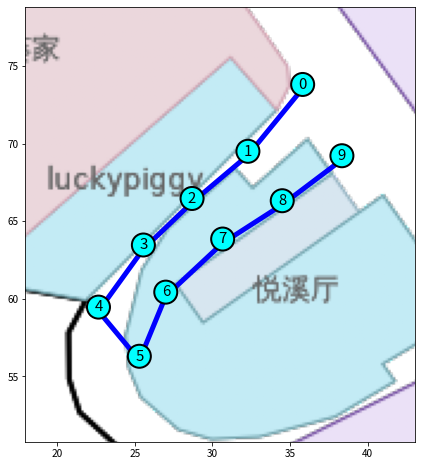

In [27]:
visualize_single_trace_on_the_map(
    points_df, MAP_IMAGE, MAP_WIDTH, MAP_HEIGHT, figsize=(10, 8)
)

<b>TYPE_ACCELEROMETER</b>

In [28]:
acc_df = extract_feature_df(trace_df, 'TYPE_ACCELEROMETER')
acc_df.head(10)

,time,x,y,z,accuracy
0,1578478950733,-0.334244,4.325256,7.615540,2.0
1,1578478950753,-0.505417,4.041534,7.962707,2.0
2,1578478950773,-0.967499,4.353989,8.285324,2.0
3,1578478950793,-1.474487,4.670013,8.069840,2.0
4,1578478950813,-1.438568,4.775970,7.264191,2.0
5,1578478950834,-1.730667,4.614349,6.698563,2.0
6,1578478950854,-2.023361,4.412048,7.341995,2.0
7,1578478950874,-1.947342,4.416229,9.039490,2.0
8,1578478950894,-1.985046,4.674210,10.352707,2.0
9,1578478950914,-2.192749,5.007004,9.684128,2.0


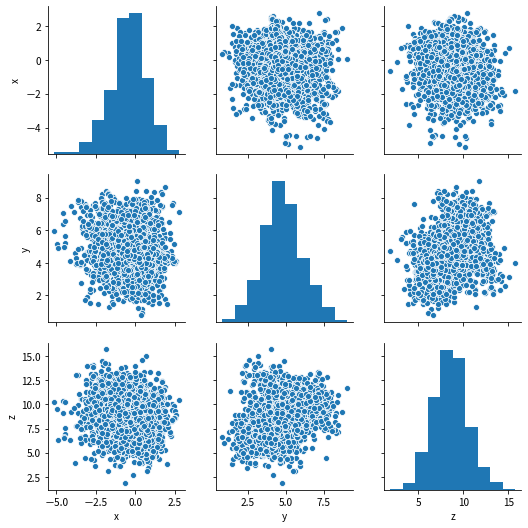

In [29]:
sns.pairplot(acc_df[['x', 'y', 'z']])
plt.show()

<b>TYPE_GYROSCOPE</b>

In [30]:
gyro_df = extract_feature_df(trace_df, 'TYPE_GYROSCOPE')
gyro_df.head()

,time,x,y,z,accuracy
0,1578478950733,-0.354996,-0.356720,-0.475433,3.0
1,1578478950753,-0.444473,-0.373230,-0.527634,3.0
2,1578478950773,-0.435944,-0.342331,-0.560654,3.0
3,1578478950793,-0.312378,-0.176163,-0.486084,3.0
4,1578478950813,-0.181351,0.065125,-0.377426,3.0


<b>TYPE_MAGNETIC_FIELD</b>

In [31]:
magn_df = extract_feature_df(trace_df, 'TYPE_MAGNETIC_FIELD')
magn_df.head()

,time,x,y,z,accuracy
0,1578478950733,16.067505,-35.104370,-14.152527,3.0
1,1578478950753,15.374756,-37.185670,-14.826965,3.0
2,1578478950773,16.067505,-35.798645,-16.177368,3.0
3,1578478950793,18.148804,-36.491394,-16.177368,3.0
4,1578478950813,16.067505,-35.104370,-17.527771,3.0


<b>TYPE_ROTATION_VECTOR</b>

In [32]:
rot_df = extract_feature_df(trace_df, 'TYPE_ROTATION_VECTOR')
rot_df.head()

,time,x,y,z,accuracy
0,1578478950733,0.042974,0.261133,0.927087,3.0
1,1578478950753,0.042974,0.261133,0.927087,3.0
2,1578478950773,0.036968,0.246351,0.929708,3.0
3,1578478950793,0.029699,0.247163,0.929281,3.0
4,1578478950813,0.029699,0.247163,0.929281,3.0


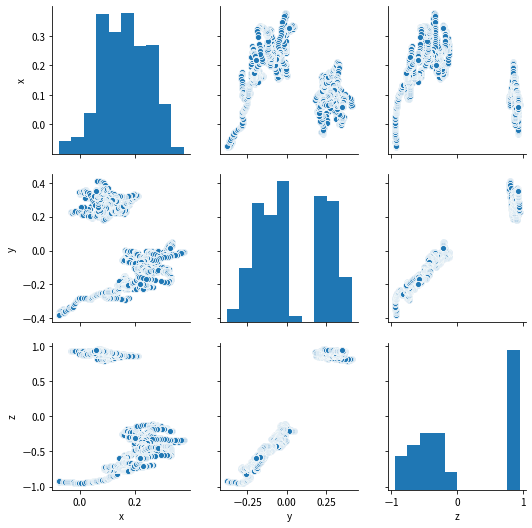

In [33]:
sns.pairplot(rot_df[['x', 'y', 'z']])
plt.show()

<h2><center>Baseline Model 1</h2></center>
<center><img src ="https://lightgbm.readthedocs.io/en/latest/_images/LightGBM_logo_black_text.svg " width = "400" height = "400"/></center> 

In [34]:
import numpy as np
import pandas as pd
import scipy.stats as stats
from pathlib import Path
import glob

from sklearn.model_selection import KFold
import lightgbm as lgb

import psutil
import random
import os
import time
import sys
import math
from contextlib import contextmanager

In [35]:
N_SPLITS = 20
SEED = 1234

Get file path from kaggle 

In [36]:
LOG_PATH = Path("./log/")
LOG_PATH.mkdir(parents=True, exist_ok=True)

Some utility code

1. A timer
2. A seed setter
3. A intermediate metric finder
4. A score logger

In [37]:
@contextmanager
def timer(name: str):
    t0 = time.time()
    p = psutil.Process(os.getpid())
    m0 = p.memory_info()[0] / 2. ** 30
    try:
        yield
    finally:
        m1 = p.memory_info()[0] / 2. ** 30
        delta = m1 - m0
        sign = '+' if delta >= 0 else '-'
        delta = math.fabs(delta)
        print(f"[{m1:.1f}GB({sign}{delta:.1f}GB): {time.time() - t0:.3f}sec] {name}", file=sys.stderr)


def set_seed(seed=1234):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)

    
def comp_metric(xhat, yhat, fhat, x, y, f):
    intermediate = np.sqrt(np.power(xhat-x, 2) + np.power(yhat-y, 2)) + 15 * np.abs(fhat-f)
    return intermediate.sum()/xhat.shape[0]


def score_log(df: pd.DataFrame, num_files: int, nam_file: str, data_shape: tuple, n_fold: int, seed: int, mpe: float):
    score_dict = {'n_files': num_files, 'file_name': nam_file, 'shape': data_shape, 'fold': n_fold, 'seed': seed, 'score': mpe}
    # noinspection PyTypeChecker
    df = pd.concat([df, pd.DataFrame.from_dict([score_dict])])
    df.to_csv(LOG_PATH / f"log_score.csv", index=False)
    return df


Get all the data in our nb env

In [38]:
set_seed(SEED)
feature_dir = "../indoor-navigation-and-location-wifi-features"
train_files = sorted(glob.glob(os.path.join(feature_dir, '*_train.csv')))
test_files = sorted(glob.glob(os.path.join(feature_dir, '*_test.csv')))
subm = pd.read_csv('../sample_submission.csv', index_col=0)

Create some tuned paratmeters for the LGB ( These will be tweaked to get the best performance)

In [39]:
lgb_params = {'objective': 'root_mean_squared_error',
              'boosting_type': 'gbdt',
              'n_estimators': 50000,
              'learning_rate': 0.1,
              'num_leaves': 90,
              'colsample_bytree': 0.4,
              'subsample': 0.6,
              'subsample_freq': 2,
              'bagging_seed': SEED,
              'reg_alpha': 8,
              'reg_lambda': 2,
              'random_state': SEED,
              'n_jobs': -1
              }

lgb_f_params = {'objective': 'multiclass',
                'boosting_type': 'gbdt',
                'n_estimators': 50000,
                'learning_rate': 0.1,
                'num_leaves': 90,
                'colsample_bytree': 0.4,
                'subsample': 0.6,
                'subsample_freq': 2,
                'bagging_seed': SEED,
                'reg_alpha': 10,
                'reg_lambda': 2,
                'random_state': SEED,
                'n_jobs': -1
                }

Splitting the data into train and validation and passed them through LGBm and then ssaving the predicitions into pred

<b>Below is Light GBM code. Commented because very large output.</b>

In [40]:
pd.read_csv(train_files[2]).path

0        5da9aaf618410e00067e6889
1        5da9aaf618410e00067e6889
2        5da9aaf618410e00067e6889
3        5da9aaf618410e00067e6889
4        5da9aa9118410e00067e680b
                   ...           
23661    5da848e54091ff00060489ca
23662    5da848e54091ff00060489ca
23663    5da848e54091ff00060489ca
23664    5da848e54091ff00060489ca
23665    5da848e54091ff00060489ca
Name: path, Length: 23666, dtype: object

In [41]:
pd.read_csv(test_files[2]).site_path_timestamp

0     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
1     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
2     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
3     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
4     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
5     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
6     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
7     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
8     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
9     5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
10    5d27075f03f801723c2e360f_108d983b84def2bd48bdc...
11    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
12    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
13    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
14    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
15    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
16    5d27075f03f801723c2e360f_58a7b7d31f5e8898403d1...
17    5d27075f03f801723c2e360f_58a7b7d31f5e88984

In [42]:
df = pd.read_csv(test_files[2])

#len(test_files)

In [47]:
score_df = pd.DataFrame()
oof = list()
predictions = list()
for n_files, file in enumerate(train_files):
    data = pd.read_csv(file, index_col=0)
    test_data = pd.read_csv(test_files[n_files], index_col=0)

    oof_x, oof_y, oof_f = np.zeros(data.shape[0]), np.zeros(data.shape[0]), np.zeros(data.shape[0])
    preds_x, preds_y = 0, 0
    preds_f_arr = np.zeros((test_data.shape[0], N_SPLITS))

    kf = KFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
    for fold, (trn_idx, val_idx) in enumerate(kf.split(data.iloc[:, :-4])):
        X_train = data.iloc[trn_idx, :-4]
        y_trainx = data.iloc[trn_idx, -4]
        y_trainy = data.iloc[trn_idx, -3]
        y_trainf = data.iloc[trn_idx, -2]

        X_valid = data.iloc[val_idx, :-4]
        y_validx = data.iloc[val_idx, -4]
        y_validy = data.iloc[val_idx, -3]
        y_validf = data.iloc[val_idx, -2]

        modelx = lgb.LGBMRegressor(**lgb_params)
        with timer("fit X"):
            modelx.fit(X_train, y_trainx,
                       eval_set=[(X_valid, y_validx)],
                       eval_metric='rmse',
                       verbose=True,
                       early_stopping_rounds=5
                       )

        modely = lgb.LGBMRegressor(**lgb_params)
        with timer("fit Y"):
            modely.fit(X_train, y_trainy,
                       eval_set=[(X_valid, y_validy)],
                       eval_metric='rmse',
                       verbose=True,
                       early_stopping_rounds=5
                       )
        modelf = lgb.LGBMClassifier(**lgb_f_params)
        with timer("fit F"):
            modelf.fit(X_train, y_trainf,
                       eval_set=[(X_valid, y_validf)],
                       eval_metric='multi_logloss',
                       verbose=True,
                       early_stopping_rounds=5
                       )

        oof_x[val_idx] = modelx.predict(X_valid)
        oof_y[val_idx] = modely.predict(X_valid)
        oof_f[val_idx] = modelf.predict(X_valid).astype(int)

        preds_x += modelx.predict(test_data.iloc[:, :-1]) / N_SPLITS
        preds_y += modely.predict(test_data.iloc[:, :-1]) / N_SPLITS
        preds_f_arr[:, fold] = modelf.predict(test_data.iloc[:, :-1]).astype(int)

        score = comp_metric(oof_x[val_idx], oof_y[val_idx], oof_f[val_idx],
                            y_validx.to_numpy(), y_validy.to_numpy(), y_validf.to_numpy())
        print(f"fold {fold}: mean position error {score}")
        score_df = score_log(score_df, n_files, os.path.basename(file), data.shape, fold, SEED, score)
    print("*+"*40)
    print(f"file #{n_files}, shape={data.shape}, name={os.path.basename(file)}")
    score = comp_metric(oof_x, oof_y, oof_f,
                        data.iloc[:, -4].to_numpy(), data.iloc[:, -3].to_numpy(), data.iloc[:, -2].to_numpy())
    oof.append(score)
    print(f"mean position error {score}")
    print("*+"*40)
    score_df = score_log(score_df, n_files, os.path.basename(file), data.shape, 999, SEED, score)

    preds_f_mode = stats.mode(preds_f_arr, axis=1)
    preds_f = preds_f_mode[0].astype(int).reshape(-1)
    test_preds = pd.DataFrame(np.stack((preds_f, preds_x, preds_y))).T
    test_preds.columns = subm.columns
    test_preds.index = test_data["site_path_timestamp"]
    test_preds["floor"] = test_preds["floor"].astype(int)
    predictions.append(test_preds)

[1]	valid_0's rmse: 50.8503
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.2095
[3]	valid_0's rmse: 42.0048
[4]	valid_0's rmse: 38.2081
[5]	valid_0's rmse: 34.7385
[6]	valid_0's rmse: 31.7441
[7]	valid_0's rmse: 28.9301
[8]	valid_0's rmse: 26.5627
[9]	valid_0's rmse: 24.3295
[10]	valid_0's rmse: 22.3147
[11]	valid_0's rmse: 20.4642
[12]	valid_0's rmse: 18.8239
[13]	valid_0's rmse: 17.3329
[14]	valid_0's rmse: 15.9584
[15]	valid_0's rmse: 14.7731
[16]	valid_0's rmse: 13.6808
[17]	valid_0's rmse: 12.7164
[18]	valid_0's rmse: 11.8561
[19]	valid_0's rmse: 11.0955
[20]	valid_0's rmse: 10.3663
[21]	valid_0's rmse: 9.72253
[22]	valid_0's rmse: 9.16343
[23]	valid_0's rmse: 8.6653
[24]	valid_0's rmse: 8.21882
[25]	valid_0's rmse: 7.82854
[26]	valid_0's rmse: 7.46874
[27]	valid_0's rmse: 7.14234
[28]	valid_0's rmse: 6.85488
[29]	valid_0's rmse: 6.61605
[30]	valid_0's rmse: 6.39459
[31]	valid_0's rmse: 6.20083
[32]	valid_0's rmse: 6.01427
[33]	valid_0's rmse: 5

[277]	valid_0's rmse: 3.50964
[278]	valid_0's rmse: 3.50765
[279]	valid_0's rmse: 3.50623
[280]	valid_0's rmse: 3.50391
[281]	valid_0's rmse: 3.50384
[282]	valid_0's rmse: 3.5027
[283]	valid_0's rmse: 3.50147
[284]	valid_0's rmse: 3.5019
[285]	valid_0's rmse: 3.49934
[286]	valid_0's rmse: 3.49833
[287]	valid_0's rmse: 3.49941
[288]	valid_0's rmse: 3.49951
[289]	valid_0's rmse: 3.5017
[290]	valid_0's rmse: 3.50118
[291]	valid_0's rmse: 3.50088
Early stopping, best iteration is:
[286]	valid_0's rmse: 3.49833


[2.1GB(+0.0GB): 142.551sec] fit X


[1]	valid_0's rmse: 38.4426
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.8236
[3]	valid_0's rmse: 31.5326
[4]	valid_0's rmse: 28.5171
[5]	valid_0's rmse: 25.8013
[6]	valid_0's rmse: 23.4
[7]	valid_0's rmse: 21.2176
[8]	valid_0's rmse: 19.2704
[9]	valid_0's rmse: 17.4864
[10]	valid_0's rmse: 15.8786
[11]	valid_0's rmse: 14.4512
[12]	valid_0's rmse: 13.1769
[13]	valid_0's rmse: 12.019
[14]	valid_0's rmse: 11.011
[15]	valid_0's rmse: 10.1103
[16]	valid_0's rmse: 9.29876
[17]	valid_0's rmse: 8.57783
[18]	valid_0's rmse: 7.92049
[19]	valid_0's rmse: 7.3409
[20]	valid_0's rmse: 6.84226
[21]	valid_0's rmse: 6.39836
[22]	valid_0's rmse: 5.9901
[23]	valid_0's rmse: 5.63837
[24]	valid_0's rmse: 5.3251
[25]	valid_0's rmse: 5.05279
[26]	valid_0's rmse: 4.81192
[27]	valid_0's rmse: 4.613
[28]	valid_0's rmse: 4.43578
[29]	valid_0's rmse: 4.27561
[30]	valid_0's rmse: 4.13927
[31]	valid_0's rmse: 4.01972
[32]	valid_0's rmse: 3.91819
[33]	valid_0's rmse: 3.8214
[34

[2.1GB(+0.0GB): 111.131sec] fit Y


[1]	valid_0's multi_logloss: 1.39168
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23053
[3]	valid_0's multi_logloss: 1.09641
[4]	valid_0's multi_logloss: 0.981681
[5]	valid_0's multi_logloss: 0.881788
[6]	valid_0's multi_logloss: 0.796015
[7]	valid_0's multi_logloss: 0.721853
[8]	valid_0's multi_logloss: 0.656368
[9]	valid_0's multi_logloss: 0.600481
[10]	valid_0's multi_logloss: 0.548505
[11]	valid_0's multi_logloss: 0.502825
[12]	valid_0's multi_logloss: 0.461398
[13]	valid_0's multi_logloss: 0.424415
[14]	valid_0's multi_logloss: 0.3912
[15]	valid_0's multi_logloss: 0.360732
[16]	valid_0's multi_logloss: 0.333444
[17]	valid_0's multi_logloss: 0.308868
[18]	valid_0's multi_logloss: 0.287007
[19]	valid_0's multi_logloss: 0.266768
[20]	valid_0's multi_logloss: 0.2485
[21]	valid_0's multi_logloss: 0.231391
[22]	valid_0's multi_logloss: 0.215623
[23]	valid_0's multi_logloss: 0.201878
[24]	valid_0's multi_logloss: 0.188789
[25]	valid_0's multi

[2.1GB(+0.0GB): 46.282sec] fit F


fold 0: mean position error 3.6649514659161233
[1]	valid_0's rmse: 48.1302
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7906
[3]	valid_0's rmse: 39.7161
[4]	valid_0's rmse: 36.0928
[5]	valid_0's rmse: 32.7821
[6]	valid_0's rmse: 29.797
[7]	valid_0's rmse: 27.148
[8]	valid_0's rmse: 24.7936
[9]	valid_0's rmse: 22.6593
[10]	valid_0's rmse: 20.7672
[11]	valid_0's rmse: 19.0564
[12]	valid_0's rmse: 17.519
[13]	valid_0's rmse: 16.1258
[14]	valid_0's rmse: 14.8613
[15]	valid_0's rmse: 13.6813
[16]	valid_0's rmse: 12.6578
[17]	valid_0's rmse: 11.7414
[18]	valid_0's rmse: 10.9367
[19]	valid_0's rmse: 10.1963
[20]	valid_0's rmse: 9.52219
[21]	valid_0's rmse: 8.90093
[22]	valid_0's rmse: 8.35578
[23]	valid_0's rmse: 7.90335
[24]	valid_0's rmse: 7.45436
[25]	valid_0's rmse: 7.07348
[26]	valid_0's rmse: 6.76104
[27]	valid_0's rmse: 6.45324
[28]	valid_0's rmse: 6.19901
[29]	valid_0's rmse: 5.94063
[30]	valid_0's rmse: 5.74044
[31]	valid_0's rmse: 5.55749
[32]	v

[2.1GB(+0.0GB): 7.743sec] fit X


[1]	valid_0's rmse: 38.9442
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.2263
[3]	valid_0's rmse: 31.8784
[4]	valid_0's rmse: 28.8704
[5]	valid_0's rmse: 26.1869
[6]	valid_0's rmse: 23.6928
[7]	valid_0's rmse: 21.5056
[8]	valid_0's rmse: 19.5269
[9]	valid_0's rmse: 17.7358
[10]	valid_0's rmse: 16.1355
[11]	valid_0's rmse: 14.6798
[12]	valid_0's rmse: 13.3845
[13]	valid_0's rmse: 12.2132
[14]	valid_0's rmse: 11.1784
[15]	valid_0's rmse: 10.2513
[16]	valid_0's rmse: 9.42234
[17]	valid_0's rmse: 8.6669
[18]	valid_0's rmse: 7.99951
[19]	valid_0's rmse: 7.40072
[20]	valid_0's rmse: 6.90921
[21]	valid_0's rmse: 6.4311
[22]	valid_0's rmse: 6.02304
[23]	valid_0's rmse: 5.65013
[24]	valid_0's rmse: 5.33221
[25]	valid_0's rmse: 5.0461
[26]	valid_0's rmse: 4.81057
[27]	valid_0's rmse: 4.61206
[28]	valid_0's rmse: 4.43636
[29]	valid_0's rmse: 4.2686
[30]	valid_0's rmse: 4.1182
[31]	valid_0's rmse: 4.00725
[32]	valid_0's rmse: 3.89498
[33]	valid_0's rmse: 3.804

[2.1GB(+0.0GB): 3.899sec] fit Y


[1]	valid_0's multi_logloss: 1.38252
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2173
[3]	valid_0's multi_logloss: 1.0815
[4]	valid_0's multi_logloss: 0.969266
[5]	valid_0's multi_logloss: 0.871491
[6]	valid_0's multi_logloss: 0.787399
[7]	valid_0's multi_logloss: 0.714526
[8]	valid_0's multi_logloss: 0.650116
[9]	valid_0's multi_logloss: 0.591071
[10]	valid_0's multi_logloss: 0.539669
[11]	valid_0's multi_logloss: 0.493339
[12]	valid_0's multi_logloss: 0.452083
[13]	valid_0's multi_logloss: 0.41419
[14]	valid_0's multi_logloss: 0.380649
[15]	valid_0's multi_logloss: 0.349983
[16]	valid_0's multi_logloss: 0.32203
[17]	valid_0's multi_logloss: 0.29681
[18]	valid_0's multi_logloss: 0.274021
[19]	valid_0's multi_logloss: 0.253527
[20]	valid_0's multi_logloss: 0.234852
[21]	valid_0's multi_logloss: 0.217796
[22]	valid_0's multi_logloss: 0.2023
[23]	valid_0's multi_logloss: 0.188044
[24]	valid_0's multi_logloss: 0.175368
[25]	valid_0's multi_lo

[2.1GB(+0.0GB): 4.660sec] fit F


fold 1: mean position error 3.6368945854908827
[1]	valid_0's rmse: 47.9358
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.5297
[3]	valid_0's rmse: 39.5518
[4]	valid_0's rmse: 35.9894
[5]	valid_0's rmse: 32.7576
[6]	valid_0's rmse: 29.9037
[7]	valid_0's rmse: 27.2536
[8]	valid_0's rmse: 24.8368
[9]	valid_0's rmse: 22.7003
[10]	valid_0's rmse: 20.7903
[11]	valid_0's rmse: 19.0288
[12]	valid_0's rmse: 17.4375
[13]	valid_0's rmse: 16.0582
[14]	valid_0's rmse: 14.8859
[15]	valid_0's rmse: 13.7955
[16]	valid_0's rmse: 12.7898
[17]	valid_0's rmse: 11.9071
[18]	valid_0's rmse: 11.1448
[19]	valid_0's rmse: 10.4525
[20]	valid_0's rmse: 9.81217
[21]	valid_0's rmse: 9.25207
[22]	valid_0's rmse: 8.76258
[23]	valid_0's rmse: 8.28739
[24]	valid_0's rmse: 7.89238
[25]	valid_0's rmse: 7.55091
[26]	valid_0's rmse: 7.23514
[27]	valid_0's rmse: 6.96158
[28]	valid_0's rmse: 6.72411
[29]	valid_0's rmse: 6.49542
[30]	valid_0's rmse: 6.31187
[31]	valid_0's rmse: 6.13953
[32

[2.1GB(+0.0GB): 4.516sec] fit X


[1]	valid_0's rmse: 39.3005
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.6389
[3]	valid_0's rmse: 32.2904
[4]	valid_0's rmse: 29.3275
[5]	valid_0's rmse: 26.6433
[6]	valid_0's rmse: 24.2541
[7]	valid_0's rmse: 22.0967
[8]	valid_0's rmse: 20.1176
[9]	valid_0's rmse: 18.3508
[10]	valid_0's rmse: 16.7424
[11]	valid_0's rmse: 15.2911
[12]	valid_0's rmse: 14.0224
[13]	valid_0's rmse: 12.8758
[14]	valid_0's rmse: 11.8163
[15]	valid_0's rmse: 10.9186
[16]	valid_0's rmse: 10.0841
[17]	valid_0's rmse: 9.33558
[18]	valid_0's rmse: 8.68255
[19]	valid_0's rmse: 8.08836
[20]	valid_0's rmse: 7.5472
[21]	valid_0's rmse: 7.07584
[22]	valid_0's rmse: 6.66659
[23]	valid_0's rmse: 6.28537
[24]	valid_0's rmse: 5.96329
[25]	valid_0's rmse: 5.66194
[26]	valid_0's rmse: 5.39903
[27]	valid_0's rmse: 5.16505
[28]	valid_0's rmse: 4.96651
[29]	valid_0's rmse: 4.78815
[30]	valid_0's rmse: 4.62086
[31]	valid_0's rmse: 4.48704
[32]	valid_0's rmse: 4.36245
[33]	valid_0's rmse: 4

[2.1GB(+0.0GB): 5.839sec] fit Y


[1]	valid_0's multi_logloss: 1.39118
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22872
[3]	valid_0's multi_logloss: 1.09649
[4]	valid_0's multi_logloss: 0.983122
[5]	valid_0's multi_logloss: 0.885819
[6]	valid_0's multi_logloss: 0.800913
[7]	valid_0's multi_logloss: 0.724685
[8]	valid_0's multi_logloss: 0.659355
[9]	valid_0's multi_logloss: 0.601151
[10]	valid_0's multi_logloss: 0.548766
[11]	valid_0's multi_logloss: 0.503388
[12]	valid_0's multi_logloss: 0.462052
[13]	valid_0's multi_logloss: 0.424916
[14]	valid_0's multi_logloss: 0.390717
[15]	valid_0's multi_logloss: 0.35976
[16]	valid_0's multi_logloss: 0.332572
[17]	valid_0's multi_logloss: 0.307029
[18]	valid_0's multi_logloss: 0.284113
[19]	valid_0's multi_logloss: 0.263147
[20]	valid_0's multi_logloss: 0.244035
[21]	valid_0's multi_logloss: 0.227039
[22]	valid_0's multi_logloss: 0.211543
[23]	valid_0's multi_logloss: 0.197524
[24]	valid_0's multi_logloss: 0.184138
[25]	valid_0's mu

[2.1GB(+0.0GB): 4.675sec] fit F


fold 2: mean position error 3.7222711821451315
[1]	valid_0's rmse: 49.9368
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.3027
[3]	valid_0's rmse: 41.0614
[4]	valid_0's rmse: 37.294
[5]	valid_0's rmse: 33.9087
[6]	valid_0's rmse: 30.795
[7]	valid_0's rmse: 28.0308
[8]	valid_0's rmse: 25.5806
[9]	valid_0's rmse: 23.2931
[10]	valid_0's rmse: 21.2374
[11]	valid_0's rmse: 19.4369
[12]	valid_0's rmse: 17.8391
[13]	valid_0's rmse: 16.4178
[14]	valid_0's rmse: 15.074
[15]	valid_0's rmse: 13.9028
[16]	valid_0's rmse: 12.878
[17]	valid_0's rmse: 11.9693
[18]	valid_0's rmse: 11.1239
[19]	valid_0's rmse: 10.418
[20]	valid_0's rmse: 9.74161
[21]	valid_0's rmse: 9.19655
[22]	valid_0's rmse: 8.68171
[23]	valid_0's rmse: 8.20924
[24]	valid_0's rmse: 7.79833
[25]	valid_0's rmse: 7.47921
[26]	valid_0's rmse: 7.17151
[27]	valid_0's rmse: 6.89402
[28]	valid_0's rmse: 6.65781
[29]	valid_0's rmse: 6.4485
[30]	valid_0's rmse: 6.27609
[31]	valid_0's rmse: 6.12017
[32]	vali

[2.1GB(+0.0GB): 4.728sec] fit X


[1]	valid_0's rmse: 38.198
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.556
[3]	valid_0's rmse: 31.2746
[4]	valid_0's rmse: 28.2983
[5]	valid_0's rmse: 25.6216
[6]	valid_0's rmse: 23.1953
[7]	valid_0's rmse: 21.0378
[8]	valid_0's rmse: 19.1364
[9]	valid_0's rmse: 17.4156
[10]	valid_0's rmse: 15.8575
[11]	valid_0's rmse: 14.4702
[12]	valid_0's rmse: 13.2452
[13]	valid_0's rmse: 12.0795
[14]	valid_0's rmse: 11.0767
[15]	valid_0's rmse: 10.1453
[16]	valid_0's rmse: 9.35031
[17]	valid_0's rmse: 8.62751
[18]	valid_0's rmse: 7.98933
[19]	valid_0's rmse: 7.44547
[20]	valid_0's rmse: 6.95413
[21]	valid_0's rmse: 6.48361
[22]	valid_0's rmse: 6.07752
[23]	valid_0's rmse: 5.7204
[24]	valid_0's rmse: 5.4156
[25]	valid_0's rmse: 5.14699
[26]	valid_0's rmse: 4.90296
[27]	valid_0's rmse: 4.69483
[28]	valid_0's rmse: 4.5137
[29]	valid_0's rmse: 4.34111
[30]	valid_0's rmse: 4.19458
[31]	valid_0's rmse: 4.06724
[32]	valid_0's rmse: 3.96288
[33]	valid_0's rmse: 3.889

[2.1GB(+0.0GB): 4.355sec] fit Y


[1]	valid_0's multi_logloss: 1.38251
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22057
[3]	valid_0's multi_logloss: 1.08902
[4]	valid_0's multi_logloss: 0.976026
[5]	valid_0's multi_logloss: 0.876822
[6]	valid_0's multi_logloss: 0.793533
[7]	valid_0's multi_logloss: 0.7215
[8]	valid_0's multi_logloss: 0.657272
[9]	valid_0's multi_logloss: 0.599252
[10]	valid_0's multi_logloss: 0.548898
[11]	valid_0's multi_logloss: 0.502737
[12]	valid_0's multi_logloss: 0.461498
[13]	valid_0's multi_logloss: 0.42384
[14]	valid_0's multi_logloss: 0.39066
[15]	valid_0's multi_logloss: 0.359461
[16]	valid_0's multi_logloss: 0.332456
[17]	valid_0's multi_logloss: 0.308152
[18]	valid_0's multi_logloss: 0.285189
[19]	valid_0's multi_logloss: 0.264735
[20]	valid_0's multi_logloss: 0.246521
[21]	valid_0's multi_logloss: 0.229416
[22]	valid_0's multi_logloss: 0.214298
[23]	valid_0's multi_logloss: 0.199919
[24]	valid_0's multi_logloss: 0.186782
[25]	valid_0's multi

[2.1GB(+0.0GB): 4.645sec] fit F


fold 3: mean position error 3.874888937253632
[1]	valid_0's rmse: 49.4189
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.9461
[3]	valid_0's rmse: 40.9259
[4]	valid_0's rmse: 37.0734
[5]	valid_0's rmse: 33.7973
[6]	valid_0's rmse: 30.8197
[7]	valid_0's rmse: 28.0929
[8]	valid_0's rmse: 25.6426
[9]	valid_0's rmse: 23.4137
[10]	valid_0's rmse: 21.4457
[11]	valid_0's rmse: 19.6516
[12]	valid_0's rmse: 18.0629
[13]	valid_0's rmse: 16.6193
[14]	valid_0's rmse: 15.2818
[15]	valid_0's rmse: 14.0778
[16]	valid_0's rmse: 12.9721
[17]	valid_0's rmse: 12.0403
[18]	valid_0's rmse: 11.165
[19]	valid_0's rmse: 10.407
[20]	valid_0's rmse: 9.73853
[21]	valid_0's rmse: 9.11107
[22]	valid_0's rmse: 8.55783
[23]	valid_0's rmse: 8.02672
[24]	valid_0's rmse: 7.56333
[25]	valid_0's rmse: 7.17399
[26]	valid_0's rmse: 6.82764
[27]	valid_0's rmse: 6.52348
[28]	valid_0's rmse: 6.25782
[29]	valid_0's rmse: 6.00248
[30]	valid_0's rmse: 5.78541
[31]	valid_0's rmse: 5.59778
[32]	v

[2.1GB(+0.0GB): 5.064sec] fit X


[1]	valid_0's rmse: 39.3966
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.7231
[3]	valid_0's rmse: 32.3303
[4]	valid_0's rmse: 29.2671
[5]	valid_0's rmse: 26.5364
[6]	valid_0's rmse: 24.1046
[7]	valid_0's rmse: 21.8691
[8]	valid_0's rmse: 19.8634
[9]	valid_0's rmse: 18.0749
[10]	valid_0's rmse: 16.448
[11]	valid_0's rmse: 14.9521
[12]	valid_0's rmse: 13.6241
[13]	valid_0's rmse: 12.441
[14]	valid_0's rmse: 11.3908
[15]	valid_0's rmse: 10.4674
[16]	valid_0's rmse: 9.64932
[17]	valid_0's rmse: 8.92262
[18]	valid_0's rmse: 8.24938
[19]	valid_0's rmse: 7.64077
[20]	valid_0's rmse: 7.10816
[21]	valid_0's rmse: 6.63624
[22]	valid_0's rmse: 6.22713
[23]	valid_0's rmse: 5.86991
[24]	valid_0's rmse: 5.54407
[25]	valid_0's rmse: 5.2464
[26]	valid_0's rmse: 4.98119
[27]	valid_0's rmse: 4.74382
[28]	valid_0's rmse: 4.53482
[29]	valid_0's rmse: 4.35387
[30]	valid_0's rmse: 4.18657
[31]	valid_0's rmse: 4.03431
[32]	valid_0's rmse: 3.90973
[33]	valid_0's rmse: 3.8

[2.1GB(+0.0GB): 5.144sec] fit Y


[1]	valid_0's multi_logloss: 1.39467
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23209
[3]	valid_0's multi_logloss: 1.09642
[4]	valid_0's multi_logloss: 0.98223
[5]	valid_0's multi_logloss: 0.884186
[6]	valid_0's multi_logloss: 0.798541
[7]	valid_0's multi_logloss: 0.723579
[8]	valid_0's multi_logloss: 0.658524
[9]	valid_0's multi_logloss: 0.60049
[10]	valid_0's multi_logloss: 0.54904
[11]	valid_0's multi_logloss: 0.501586
[12]	valid_0's multi_logloss: 0.460404
[13]	valid_0's multi_logloss: 0.422749
[14]	valid_0's multi_logloss: 0.389305
[15]	valid_0's multi_logloss: 0.358913
[16]	valid_0's multi_logloss: 0.331655
[17]	valid_0's multi_logloss: 0.306368
[18]	valid_0's multi_logloss: 0.283437
[19]	valid_0's multi_logloss: 0.263171
[20]	valid_0's multi_logloss: 0.244206
[21]	valid_0's multi_logloss: 0.227019
[22]	valid_0's multi_logloss: 0.21179
[23]	valid_0's multi_logloss: 0.197901
[24]	valid_0's multi_logloss: 0.184765
[25]	valid_0's multi

[2.1GB(+0.0GB): 4.808sec] fit F


fold 4: mean position error 3.3840730751290384
[1]	valid_0's rmse: 49.7208
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.1202
[3]	valid_0's rmse: 41.0247
[4]	valid_0's rmse: 37.3119
[5]	valid_0's rmse: 34.008
[6]	valid_0's rmse: 30.9828
[7]	valid_0's rmse: 28.2833
[8]	valid_0's rmse: 25.7703
[9]	valid_0's rmse: 23.4937
[10]	valid_0's rmse: 21.4525
[11]	valid_0's rmse: 19.6656
[12]	valid_0's rmse: 18.0517
[13]	valid_0's rmse: 16.5956
[14]	valid_0's rmse: 15.2836
[15]	valid_0's rmse: 14.094
[16]	valid_0's rmse: 13.0422
[17]	valid_0's rmse: 12.0943
[18]	valid_0's rmse: 11.199
[19]	valid_0's rmse: 10.495
[20]	valid_0's rmse: 9.87556
[21]	valid_0's rmse: 9.22537
[22]	valid_0's rmse: 8.68796
[23]	valid_0's rmse: 8.18853
[24]	valid_0's rmse: 7.75261
[25]	valid_0's rmse: 7.39804
[26]	valid_0's rmse: 7.09767
[27]	valid_0's rmse: 6.80057
[28]	valid_0's rmse: 6.51669
[29]	valid_0's rmse: 6.31272
[30]	valid_0's rmse: 6.09786
[31]	valid_0's rmse: 5.93436
[32]	va

[2.1GB(+0.0GB): 4.671sec] fit X


[1]	valid_0's rmse: 38.876
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.1905
[3]	valid_0's rmse: 31.8611
[4]	valid_0's rmse: 28.8344
[5]	valid_0's rmse: 26.1478
[6]	valid_0's rmse: 23.7046
[7]	valid_0's rmse: 21.5156
[8]	valid_0's rmse: 19.5529
[9]	valid_0's rmse: 17.7627
[10]	valid_0's rmse: 16.1666
[11]	valid_0's rmse: 14.735
[12]	valid_0's rmse: 13.4318
[13]	valid_0's rmse: 12.2749
[14]	valid_0's rmse: 11.248
[15]	valid_0's rmse: 10.3262
[16]	valid_0's rmse: 9.48816
[17]	valid_0's rmse: 8.7305
[18]	valid_0's rmse: 8.06114
[19]	valid_0's rmse: 7.46366
[20]	valid_0's rmse: 6.92078
[21]	valid_0's rmse: 6.45976
[22]	valid_0's rmse: 6.03329
[23]	valid_0's rmse: 5.66701
[24]	valid_0's rmse: 5.34351
[25]	valid_0's rmse: 5.03831
[26]	valid_0's rmse: 4.76359
[27]	valid_0's rmse: 4.52633
[28]	valid_0's rmse: 4.31879
[29]	valid_0's rmse: 4.1373
[30]	valid_0's rmse: 3.99232
[31]	valid_0's rmse: 3.85207
[32]	valid_0's rmse: 3.72919
[33]	valid_0's rmse: 3.628

[2.1GB(+0.0GB): 3.791sec] fit Y


[1]	valid_0's multi_logloss: 1.37348
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21032
[3]	valid_0's multi_logloss: 1.07762
[4]	valid_0's multi_logloss: 0.96664
[5]	valid_0's multi_logloss: 0.870392
[6]	valid_0's multi_logloss: 0.786042
[7]	valid_0's multi_logloss: 0.712304
[8]	valid_0's multi_logloss: 0.647144
[9]	valid_0's multi_logloss: 0.589492
[10]	valid_0's multi_logloss: 0.538287
[11]	valid_0's multi_logloss: 0.492857
[12]	valid_0's multi_logloss: 0.451847
[13]	valid_0's multi_logloss: 0.413885
[14]	valid_0's multi_logloss: 0.380243
[15]	valid_0's multi_logloss: 0.349075
[16]	valid_0's multi_logloss: 0.322283
[17]	valid_0's multi_logloss: 0.297227
[18]	valid_0's multi_logloss: 0.274696
[19]	valid_0's multi_logloss: 0.254416
[20]	valid_0's multi_logloss: 0.236127
[21]	valid_0's multi_logloss: 0.219044
[22]	valid_0's multi_logloss: 0.203394
[23]	valid_0's multi_logloss: 0.189515
[24]	valid_0's multi_logloss: 0.176483
[25]	valid_0's mu

[209]	valid_0's multi_logloss: 0.0271111
[210]	valid_0's multi_logloss: 0.0271086
[211]	valid_0's multi_logloss: 0.0271074
[212]	valid_0's multi_logloss: 0.0271073
[213]	valid_0's multi_logloss: 0.0271071
[214]	valid_0's multi_logloss: 0.0271066
[215]	valid_0's multi_logloss: 0.0271063
[216]	valid_0's multi_logloss: 0.0270543
[217]	valid_0's multi_logloss: 0.0270526
[218]	valid_0's multi_logloss: 0.0270522
[219]	valid_0's multi_logloss: 0.0270511
[220]	valid_0's multi_logloss: 0.0270494
[221]	valid_0's multi_logloss: 0.0270487
[222]	valid_0's multi_logloss: 0.0270487
[223]	valid_0's multi_logloss: 0.0270465
[224]	valid_0's multi_logloss: 0.0270445
[225]	valid_0's multi_logloss: 0.0270445
[226]	valid_0's multi_logloss: 0.0270445
[227]	valid_0's multi_logloss: 0.0270445
[228]	valid_0's multi_logloss: 0.0270445
[229]	valid_0's multi_logloss: 0.0270445
Early stopping, best iteration is:
[224]	valid_0's multi_logloss: 0.0270445


[2.1GB(+0.0GB): 5.323sec] fit F


fold 5: mean position error 3.8365742840988455
[1]	valid_0's rmse: 48.3779
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.9452
[3]	valid_0's rmse: 39.8183
[4]	valid_0's rmse: 36.2081
[5]	valid_0's rmse: 32.9409
[6]	valid_0's rmse: 29.9558
[7]	valid_0's rmse: 27.2334
[8]	valid_0's rmse: 24.8234
[9]	valid_0's rmse: 22.7024
[10]	valid_0's rmse: 20.7632
[11]	valid_0's rmse: 18.9672
[12]	valid_0's rmse: 17.3844
[13]	valid_0's rmse: 15.922
[14]	valid_0's rmse: 14.6356
[15]	valid_0's rmse: 13.4535
[16]	valid_0's rmse: 12.452
[17]	valid_0's rmse: 11.4971
[18]	valid_0's rmse: 10.6256
[19]	valid_0's rmse: 9.87427
[20]	valid_0's rmse: 9.23451
[21]	valid_0's rmse: 8.63967
[22]	valid_0's rmse: 8.10831
[23]	valid_0's rmse: 7.63339
[24]	valid_0's rmse: 7.22927
[25]	valid_0's rmse: 6.87233
[26]	valid_0's rmse: 6.5303
[27]	valid_0's rmse: 6.22368
[28]	valid_0's rmse: 5.96332
[29]	valid_0's rmse: 5.74755
[30]	valid_0's rmse: 5.54987
[31]	valid_0's rmse: 5.37085
[32]	v

[2.1GB(+0.0GB): 4.986sec] fit X


[1]	valid_0's rmse: 39.0131
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.3082
[3]	valid_0's rmse: 31.9434
[4]	valid_0's rmse: 28.8902
[5]	valid_0's rmse: 26.2118
[6]	valid_0's rmse: 23.7297
[7]	valid_0's rmse: 21.5122
[8]	valid_0's rmse: 19.5113
[9]	valid_0's rmse: 17.725
[10]	valid_0's rmse: 16.1209
[11]	valid_0's rmse: 14.6932
[12]	valid_0's rmse: 13.3953
[13]	valid_0's rmse: 12.2243
[14]	valid_0's rmse: 11.2043
[15]	valid_0's rmse: 10.274
[16]	valid_0's rmse: 9.44188
[17]	valid_0's rmse: 8.66225
[18]	valid_0's rmse: 7.98306
[19]	valid_0's rmse: 7.37782
[20]	valid_0's rmse: 6.84148
[21]	valid_0's rmse: 6.36355
[22]	valid_0's rmse: 5.94417
[23]	valid_0's rmse: 5.57435
[24]	valid_0's rmse: 5.24474
[25]	valid_0's rmse: 4.97178
[26]	valid_0's rmse: 4.72017
[27]	valid_0's rmse: 4.50261
[28]	valid_0's rmse: 4.3154
[29]	valid_0's rmse: 4.14158
[30]	valid_0's rmse: 3.99234
[31]	valid_0's rmse: 3.86604
[32]	valid_0's rmse: 3.73886
[33]	valid_0's rmse: 3.6

[2.1GB(+0.0GB): 4.694sec] fit Y


[1]	valid_0's multi_logloss: 1.37577
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21352
[3]	valid_0's multi_logloss: 1.0792
[4]	valid_0's multi_logloss: 0.966134
[5]	valid_0's multi_logloss: 0.86746
[6]	valid_0's multi_logloss: 0.781875
[7]	valid_0's multi_logloss: 0.708567
[8]	valid_0's multi_logloss: 0.643083
[9]	valid_0's multi_logloss: 0.585214
[10]	valid_0's multi_logloss: 0.534395
[11]	valid_0's multi_logloss: 0.487762
[12]	valid_0's multi_logloss: 0.44717
[13]	valid_0's multi_logloss: 0.410378
[14]	valid_0's multi_logloss: 0.37688
[15]	valid_0's multi_logloss: 0.346972
[16]	valid_0's multi_logloss: 0.320121
[17]	valid_0's multi_logloss: 0.29647
[18]	valid_0's multi_logloss: 0.274284
[19]	valid_0's multi_logloss: 0.25461
[20]	valid_0's multi_logloss: 0.236807
[21]	valid_0's multi_logloss: 0.219832
[22]	valid_0's multi_logloss: 0.204672
[23]	valid_0's multi_logloss: 0.191135
[24]	valid_0's multi_logloss: 0.1784
[25]	valid_0's multi_log

[2.1GB(+0.0GB): 4.678sec] fit F


fold 6: mean position error 3.561976092075051
[1]	valid_0's rmse: 50.1715
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.5052
[3]	valid_0's rmse: 41.3077
[4]	valid_0's rmse: 37.5401
[5]	valid_0's rmse: 34.1715
[6]	valid_0's rmse: 31.116
[7]	valid_0's rmse: 28.3607
[8]	valid_0's rmse: 25.8267
[9]	valid_0's rmse: 23.5485
[10]	valid_0's rmse: 21.5546
[11]	valid_0's rmse: 19.7472
[12]	valid_0's rmse: 18.1255
[13]	valid_0's rmse: 16.6711
[14]	valid_0's rmse: 15.3553
[15]	valid_0's rmse: 14.196
[16]	valid_0's rmse: 13.0936
[17]	valid_0's rmse: 12.185
[18]	valid_0's rmse: 11.3822
[19]	valid_0's rmse: 10.6542
[20]	valid_0's rmse: 9.98796
[21]	valid_0's rmse: 9.36052
[22]	valid_0's rmse: 8.79839
[23]	valid_0's rmse: 8.32734
[24]	valid_0's rmse: 7.90522
[25]	valid_0's rmse: 7.5331
[26]	valid_0's rmse: 7.21037
[27]	valid_0's rmse: 6.92566
[28]	valid_0's rmse: 6.66375
[29]	valid_0's rmse: 6.45503
[30]	valid_0's rmse: 6.27504
[31]	valid_0's rmse: 6.11307
[32]	val

[2.1GB(+0.0GB): 5.306sec] fit X


[1]	valid_0's rmse: 40.1671
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3847
[3]	valid_0's rmse: 32.9265
[4]	valid_0's rmse: 29.8548
[5]	valid_0's rmse: 27.0717
[6]	valid_0's rmse: 24.5309
[7]	valid_0's rmse: 22.2376
[8]	valid_0's rmse: 20.2081
[9]	valid_0's rmse: 18.3623
[10]	valid_0's rmse: 16.7225
[11]	valid_0's rmse: 15.2344
[12]	valid_0's rmse: 13.9252
[13]	valid_0's rmse: 12.7584
[14]	valid_0's rmse: 11.7071
[15]	valid_0's rmse: 10.7444
[16]	valid_0's rmse: 9.89045
[17]	valid_0's rmse: 9.12933
[18]	valid_0's rmse: 8.45529
[19]	valid_0's rmse: 7.84848
[20]	valid_0's rmse: 7.31461
[21]	valid_0's rmse: 6.84653
[22]	valid_0's rmse: 6.4289
[23]	valid_0's rmse: 6.05176
[24]	valid_0's rmse: 5.71695
[25]	valid_0's rmse: 5.43976
[26]	valid_0's rmse: 5.18026
[27]	valid_0's rmse: 4.95978
[28]	valid_0's rmse: 4.75679
[29]	valid_0's rmse: 4.56196
[30]	valid_0's rmse: 4.40861
[31]	valid_0's rmse: 4.27756
[32]	valid_0's rmse: 4.1557
[33]	valid_0's rmse: 4.

[2.1GB(+0.0GB): 5.219sec] fit Y


[1]	valid_0's multi_logloss: 1.37999
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21877
[3]	valid_0's multi_logloss: 1.08457
[4]	valid_0's multi_logloss: 0.973303
[5]	valid_0's multi_logloss: 0.875305
[6]	valid_0's multi_logloss: 0.790245
[7]	valid_0's multi_logloss: 0.715817
[8]	valid_0's multi_logloss: 0.651774
[9]	valid_0's multi_logloss: 0.594786
[10]	valid_0's multi_logloss: 0.543883
[11]	valid_0's multi_logloss: 0.497715
[12]	valid_0's multi_logloss: 0.455606
[13]	valid_0's multi_logloss: 0.416778
[14]	valid_0's multi_logloss: 0.384002
[15]	valid_0's multi_logloss: 0.353146
[16]	valid_0's multi_logloss: 0.325188
[17]	valid_0's multi_logloss: 0.299615
[18]	valid_0's multi_logloss: 0.276938
[19]	valid_0's multi_logloss: 0.257296
[20]	valid_0's multi_logloss: 0.238791
[21]	valid_0's multi_logloss: 0.221861
[22]	valid_0's multi_logloss: 0.206313
[23]	valid_0's multi_logloss: 0.192031
[24]	valid_0's multi_logloss: 0.179641
[25]	valid_0's m

[2.1GB(+0.0GB): 4.448sec] fit F


fold 7: mean position error 3.8504975595740993
[1]	valid_0's rmse: 49.4653
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.9084
[3]	valid_0's rmse: 40.9181
[4]	valid_0's rmse: 37.2125
[5]	valid_0's rmse: 33.9462
[6]	valid_0's rmse: 31.0019
[7]	valid_0's rmse: 28.3442
[8]	valid_0's rmse: 25.9022
[9]	valid_0's rmse: 23.7321
[10]	valid_0's rmse: 21.8279
[11]	valid_0's rmse: 19.9994
[12]	valid_0's rmse: 18.4424
[13]	valid_0's rmse: 17.0915
[14]	valid_0's rmse: 15.8939
[15]	valid_0's rmse: 14.7453
[16]	valid_0's rmse: 13.7168
[17]	valid_0's rmse: 12.7926
[18]	valid_0's rmse: 11.9917
[19]	valid_0's rmse: 11.26
[20]	valid_0's rmse: 10.6345
[21]	valid_0's rmse: 10.0234
[22]	valid_0's rmse: 9.46453
[23]	valid_0's rmse: 8.98297
[24]	valid_0's rmse: 8.64465
[25]	valid_0's rmse: 8.27762
[26]	valid_0's rmse: 7.92491
[27]	valid_0's rmse: 7.62719
[28]	valid_0's rmse: 7.3877
[29]	valid_0's rmse: 7.13387
[30]	valid_0's rmse: 6.9028
[31]	valid_0's rmse: 6.68585
[32]	va

[2.1GB(+0.0GB): 5.380sec] fit X


[1]	valid_0's rmse: 40.6635
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.7894
[3]	valid_0's rmse: 33.3052
[4]	valid_0's rmse: 30.16
[5]	valid_0's rmse: 27.3668
[6]	valid_0's rmse: 24.7947
[7]	valid_0's rmse: 22.5135
[8]	valid_0's rmse: 20.4576
[9]	valid_0's rmse: 18.5563
[10]	valid_0's rmse: 16.8756
[11]	valid_0's rmse: 15.365
[12]	valid_0's rmse: 13.996
[13]	valid_0's rmse: 12.7678
[14]	valid_0's rmse: 11.6908
[15]	valid_0's rmse: 10.7391
[16]	valid_0's rmse: 9.8668
[17]	valid_0's rmse: 9.07595
[18]	valid_0's rmse: 8.37002
[19]	valid_0's rmse: 7.74586
[20]	valid_0's rmse: 7.19948
[21]	valid_0's rmse: 6.7084
[22]	valid_0's rmse: 6.29268
[23]	valid_0's rmse: 5.91179
[24]	valid_0's rmse: 5.57275
[25]	valid_0's rmse: 5.26392
[26]	valid_0's rmse: 4.99157
[27]	valid_0's rmse: 4.75326
[28]	valid_0's rmse: 4.55261
[29]	valid_0's rmse: 4.38209
[30]	valid_0's rmse: 4.22776
[31]	valid_0's rmse: 4.08982
[32]	valid_0's rmse: 3.96976
[33]	valid_0's rmse: 3.8764

[2.1GB(+0.0GB): 4.364sec] fit Y


[1]	valid_0's multi_logloss: 1.37331
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21342
[3]	valid_0's multi_logloss: 1.07845
[4]	valid_0's multi_logloss: 0.963128
[5]	valid_0's multi_logloss: 0.866007
[6]	valid_0's multi_logloss: 0.781833
[7]	valid_0's multi_logloss: 0.70857
[8]	valid_0's multi_logloss: 0.64382
[9]	valid_0's multi_logloss: 0.586392
[10]	valid_0's multi_logloss: 0.535535
[11]	valid_0's multi_logloss: 0.489956
[12]	valid_0's multi_logloss: 0.44979
[13]	valid_0's multi_logloss: 0.412654
[14]	valid_0's multi_logloss: 0.378461
[15]	valid_0's multi_logloss: 0.348373
[16]	valid_0's multi_logloss: 0.32059
[17]	valid_0's multi_logloss: 0.29559
[18]	valid_0's multi_logloss: 0.273374
[19]	valid_0's multi_logloss: 0.252699
[20]	valid_0's multi_logloss: 0.23424
[21]	valid_0's multi_logloss: 0.217217
[22]	valid_0's multi_logloss: 0.202208
[23]	valid_0's multi_logloss: 0.188066
[24]	valid_0's multi_logloss: 0.175487
[25]	valid_0's multi_l

[2.1GB(+0.0GB): 4.583sec] fit F


fold 8: mean position error 3.7594698258898873
[1]	valid_0's rmse: 49.7986
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.1881
[3]	valid_0's rmse: 41.1107
[4]	valid_0's rmse: 37.2895
[5]	valid_0's rmse: 33.8528
[6]	valid_0's rmse: 30.7476
[7]	valid_0's rmse: 27.9957
[8]	valid_0's rmse: 25.5256
[9]	valid_0's rmse: 23.3278
[10]	valid_0's rmse: 21.3052
[11]	valid_0's rmse: 19.5216
[12]	valid_0's rmse: 17.9633
[13]	valid_0's rmse: 16.5573
[14]	valid_0's rmse: 15.2417
[15]	valid_0's rmse: 14.044
[16]	valid_0's rmse: 12.9517
[17]	valid_0's rmse: 11.9929
[18]	valid_0's rmse: 11.1962
[19]	valid_0's rmse: 10.4258
[20]	valid_0's rmse: 9.75904
[21]	valid_0's rmse: 9.14869
[22]	valid_0's rmse: 8.61507
[23]	valid_0's rmse: 8.18416
[24]	valid_0's rmse: 7.80295
[25]	valid_0's rmse: 7.45405
[26]	valid_0's rmse: 7.13275
[27]	valid_0's rmse: 6.84276
[28]	valid_0's rmse: 6.60884
[29]	valid_0's rmse: 6.42133
[30]	valid_0's rmse: 6.24173
[31]	valid_0's rmse: 6.08382
[32]

[2.1GB(+0.0GB): 4.273sec] fit X


[1]	valid_0's rmse: 38.3881
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.824
[3]	valid_0's rmse: 31.529
[4]	valid_0's rmse: 28.5791
[5]	valid_0's rmse: 25.8984
[6]	valid_0's rmse: 23.5005
[7]	valid_0's rmse: 21.3875
[8]	valid_0's rmse: 19.4817
[9]	valid_0's rmse: 17.7964
[10]	valid_0's rmse: 16.2239
[11]	valid_0's rmse: 14.8367
[12]	valid_0's rmse: 13.5987
[13]	valid_0's rmse: 12.5063
[14]	valid_0's rmse: 11.5021
[15]	valid_0's rmse: 10.5873
[16]	valid_0's rmse: 9.78102
[17]	valid_0's rmse: 9.07512
[18]	valid_0's rmse: 8.4527
[19]	valid_0's rmse: 7.88857
[20]	valid_0's rmse: 7.40375
[21]	valid_0's rmse: 6.95621
[22]	valid_0's rmse: 6.5717
[23]	valid_0's rmse: 6.20208
[24]	valid_0's rmse: 5.90558
[25]	valid_0's rmse: 5.63992
[26]	valid_0's rmse: 5.3753
[27]	valid_0's rmse: 5.16743
[28]	valid_0's rmse: 4.97361
[29]	valid_0's rmse: 4.80567
[30]	valid_0's rmse: 4.66182
[31]	valid_0's rmse: 4.53781
[32]	valid_0's rmse: 4.43965
[33]	valid_0's rmse: 4.336

[278]	valid_0's rmse: 2.59016
[279]	valid_0's rmse: 2.58722
[280]	valid_0's rmse: 2.58628
[281]	valid_0's rmse: 2.58559
[282]	valid_0's rmse: 2.5856
[283]	valid_0's rmse: 2.58518
[284]	valid_0's rmse: 2.58407
[285]	valid_0's rmse: 2.58255
[286]	valid_0's rmse: 2.58259
[287]	valid_0's rmse: 2.58065
[288]	valid_0's rmse: 2.58017
[289]	valid_0's rmse: 2.58003
[290]	valid_0's rmse: 2.57943
[291]	valid_0's rmse: 2.57887
[292]	valid_0's rmse: 2.57904
[293]	valid_0's rmse: 2.57883
[294]	valid_0's rmse: 2.57708
[295]	valid_0's rmse: 2.57635
[296]	valid_0's rmse: 2.57531
[297]	valid_0's rmse: 2.57398
[298]	valid_0's rmse: 2.57234
[299]	valid_0's rmse: 2.57281
[300]	valid_0's rmse: 2.57231
[301]	valid_0's rmse: 2.5723
[302]	valid_0's rmse: 2.57218
[303]	valid_0's rmse: 2.57223
[304]	valid_0's rmse: 2.57142
[305]	valid_0's rmse: 2.56978
[306]	valid_0's rmse: 2.56887
[307]	valid_0's rmse: 2.56741
[308]	valid_0's rmse: 2.56717
[309]	valid_0's rmse: 2.56586
[310]	valid_0's rmse: 2.56477
[311]	valid_

[2.1GB(+0.0GB): 7.000sec] fit Y


[1]	valid_0's multi_logloss: 1.37735
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21495
[3]	valid_0's multi_logloss: 1.08211
[4]	valid_0's multi_logloss: 0.96934
[5]	valid_0's multi_logloss: 0.872904
[6]	valid_0's multi_logloss: 0.788703
[7]	valid_0's multi_logloss: 0.715849
[8]	valid_0's multi_logloss: 0.650335
[9]	valid_0's multi_logloss: 0.592165
[10]	valid_0's multi_logloss: 0.541105
[11]	valid_0's multi_logloss: 0.494425
[12]	valid_0's multi_logloss: 0.453762
[13]	valid_0's multi_logloss: 0.417129
[14]	valid_0's multi_logloss: 0.383822
[15]	valid_0's multi_logloss: 0.35427
[16]	valid_0's multi_logloss: 0.327047
[17]	valid_0's multi_logloss: 0.301471
[18]	valid_0's multi_logloss: 0.278593
[19]	valid_0's multi_logloss: 0.257849
[20]	valid_0's multi_logloss: 0.23954
[21]	valid_0's multi_logloss: 0.222797
[22]	valid_0's multi_logloss: 0.206901
[23]	valid_0's multi_logloss: 0.192629
[24]	valid_0's multi_logloss: 0.179581
[25]	valid_0's mult

[2.1GB(+0.0GB): 4.793sec] fit F


fold 9: mean position error 3.6855935798105874
[1]	valid_0's rmse: 51.587
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.7992
[3]	valid_0's rmse: 42.4683
[4]	valid_0's rmse: 38.6505
[5]	valid_0's rmse: 35.231
[6]	valid_0's rmse: 32.0888
[7]	valid_0's rmse: 29.1531
[8]	valid_0's rmse: 26.5298
[9]	valid_0's rmse: 24.2002
[10]	valid_0's rmse: 22.1242
[11]	valid_0's rmse: 20.2962
[12]	valid_0's rmse: 18.6192
[13]	valid_0's rmse: 17.0965
[14]	valid_0's rmse: 15.6983
[15]	valid_0's rmse: 14.4908
[16]	valid_0's rmse: 13.4258
[17]	valid_0's rmse: 12.4326
[18]	valid_0's rmse: 11.5155
[19]	valid_0's rmse: 10.7696
[20]	valid_0's rmse: 10.118
[21]	valid_0's rmse: 9.49522
[22]	valid_0's rmse: 8.98661
[23]	valid_0's rmse: 8.47478
[24]	valid_0's rmse: 8.03136
[25]	valid_0's rmse: 7.64456
[26]	valid_0's rmse: 7.31005
[27]	valid_0's rmse: 7.01976
[28]	valid_0's rmse: 6.73483
[29]	valid_0's rmse: 6.51804
[30]	valid_0's rmse: 6.30214
[31]	valid_0's rmse: 6.10821
[32]	v

[2.1GB(+0.0GB): 4.769sec] fit X


[1]	valid_0's rmse: 38.5459
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.9349
[3]	valid_0's rmse: 31.6577
[4]	valid_0's rmse: 28.7748
[5]	valid_0's rmse: 26.1013
[6]	valid_0's rmse: 23.6619
[7]	valid_0's rmse: 21.4839
[8]	valid_0's rmse: 19.5563
[9]	valid_0's rmse: 17.7845
[10]	valid_0's rmse: 16.2041
[11]	valid_0's rmse: 14.7947
[12]	valid_0's rmse: 13.5342
[13]	valid_0's rmse: 12.3884
[14]	valid_0's rmse: 11.3575
[15]	valid_0's rmse: 10.471
[16]	valid_0's rmse: 9.67253
[17]	valid_0's rmse: 8.93486
[18]	valid_0's rmse: 8.28068
[19]	valid_0's rmse: 7.6968
[20]	valid_0's rmse: 7.18252
[21]	valid_0's rmse: 6.70295
[22]	valid_0's rmse: 6.26986
[23]	valid_0's rmse: 5.89438
[24]	valid_0's rmse: 5.5795
[25]	valid_0's rmse: 5.26872
[26]	valid_0's rmse: 5.01074
[27]	valid_0's rmse: 4.77766
[28]	valid_0's rmse: 4.57149
[29]	valid_0's rmse: 4.3886
[30]	valid_0's rmse: 4.22813
[31]	valid_0's rmse: 4.08759
[32]	valid_0's rmse: 3.97044
[33]	valid_0's rmse: 3.87

[2.1GB(+0.0GB): 4.152sec] fit Y


[1]	valid_0's multi_logloss: 1.38094
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21911
[3]	valid_0's multi_logloss: 1.08382
[4]	valid_0's multi_logloss: 0.972284
[5]	valid_0's multi_logloss: 0.87695
[6]	valid_0's multi_logloss: 0.792334
[7]	valid_0's multi_logloss: 0.717648
[8]	valid_0's multi_logloss: 0.652848
[9]	valid_0's multi_logloss: 0.595195
[10]	valid_0's multi_logloss: 0.545159
[11]	valid_0's multi_logloss: 0.499308
[12]	valid_0's multi_logloss: 0.457191
[13]	valid_0's multi_logloss: 0.418973
[14]	valid_0's multi_logloss: 0.384954
[15]	valid_0's multi_logloss: 0.354026
[16]	valid_0's multi_logloss: 0.327055
[17]	valid_0's multi_logloss: 0.301418
[18]	valid_0's multi_logloss: 0.278831
[19]	valid_0's multi_logloss: 0.258781
[20]	valid_0's multi_logloss: 0.240427
[21]	valid_0's multi_logloss: 0.223167
[22]	valid_0's multi_logloss: 0.207559
[23]	valid_0's multi_logloss: 0.193576
[24]	valid_0's multi_logloss: 0.180719
[25]	valid_0's mu

[2.1GB(+0.0GB): 4.633sec] fit F


fold 10: mean position error 3.7038887412546835
[1]	valid_0's rmse: 50.1637
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.6356
[3]	valid_0's rmse: 41.4668
[4]	valid_0's rmse: 37.7109
[5]	valid_0's rmse: 34.4012
[6]	valid_0's rmse: 31.3694
[7]	valid_0's rmse: 28.6335
[8]	valid_0's rmse: 26.1803
[9]	valid_0's rmse: 24.0389
[10]	valid_0's rmse: 22.0533
[11]	valid_0's rmse: 20.3111
[12]	valid_0's rmse: 18.7777
[13]	valid_0's rmse: 17.34
[14]	valid_0's rmse: 16.1257
[15]	valid_0's rmse: 14.9407
[16]	valid_0's rmse: 13.8523
[17]	valid_0's rmse: 12.8434
[18]	valid_0's rmse: 12.0062
[19]	valid_0's rmse: 11.245
[20]	valid_0's rmse: 10.609
[21]	valid_0's rmse: 10.034
[22]	valid_0's rmse: 9.51511
[23]	valid_0's rmse: 9.00256
[24]	valid_0's rmse: 8.53554
[25]	valid_0's rmse: 8.15779
[26]	valid_0's rmse: 7.82805
[27]	valid_0's rmse: 7.53078
[28]	valid_0's rmse: 7.25767
[29]	valid_0's rmse: 7.01937
[30]	valid_0's rmse: 6.80076
[31]	valid_0's rmse: 6.62101
[32]	va

[2.1GB(+0.0GB): 4.076sec] fit X


[1]	valid_0's rmse: 38.4997
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.8714
[3]	valid_0's rmse: 31.57
[4]	valid_0's rmse: 28.577
[5]	valid_0's rmse: 25.9145
[6]	valid_0's rmse: 23.5266
[7]	valid_0's rmse: 21.3596
[8]	valid_0's rmse: 19.3975
[9]	valid_0's rmse: 17.6267
[10]	valid_0's rmse: 16.0649
[11]	valid_0's rmse: 14.665
[12]	valid_0's rmse: 13.3942
[13]	valid_0's rmse: 12.2856
[14]	valid_0's rmse: 11.263
[15]	valid_0's rmse: 10.3489
[16]	valid_0's rmse: 9.53605
[17]	valid_0's rmse: 8.80276
[18]	valid_0's rmse: 8.1642
[19]	valid_0's rmse: 7.62214
[20]	valid_0's rmse: 7.1378
[21]	valid_0's rmse: 6.6968
[22]	valid_0's rmse: 6.28925
[23]	valid_0's rmse: 5.94581
[24]	valid_0's rmse: 5.6568
[25]	valid_0's rmse: 5.40189
[26]	valid_0's rmse: 5.17819
[27]	valid_0's rmse: 4.96171
[28]	valid_0's rmse: 4.7867
[29]	valid_0's rmse: 4.64427
[30]	valid_0's rmse: 4.51677
[31]	valid_0's rmse: 4.39766
[32]	valid_0's rmse: 4.29346
[33]	valid_0's rmse: 4.20622
[3

[2.1GB(+0.0GB): 4.887sec] fit Y


[1]	valid_0's multi_logloss: 1.39113
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23225
[3]	valid_0's multi_logloss: 1.09544
[4]	valid_0's multi_logloss: 0.984191
[5]	valid_0's multi_logloss: 0.886386
[6]	valid_0's multi_logloss: 0.80248
[7]	valid_0's multi_logloss: 0.729222
[8]	valid_0's multi_logloss: 0.66341
[9]	valid_0's multi_logloss: 0.605664
[10]	valid_0's multi_logloss: 0.555038
[11]	valid_0's multi_logloss: 0.507262
[12]	valid_0's multi_logloss: 0.465623
[13]	valid_0's multi_logloss: 0.428675
[14]	valid_0's multi_logloss: 0.395277
[15]	valid_0's multi_logloss: 0.365974
[16]	valid_0's multi_logloss: 0.339057
[17]	valid_0's multi_logloss: 0.314048
[18]	valid_0's multi_logloss: 0.292378
[19]	valid_0's multi_logloss: 0.271957
[20]	valid_0's multi_logloss: 0.253891
[21]	valid_0's multi_logloss: 0.236795
[22]	valid_0's multi_logloss: 0.220944
[23]	valid_0's multi_logloss: 0.206291
[24]	valid_0's multi_logloss: 0.193169
[25]	valid_0's mul

[2.1GB(+0.0GB): 3.865sec] fit F


fold 11: mean position error 4.049890799171363
[1]	valid_0's rmse: 48.2299
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7668
[3]	valid_0's rmse: 39.8026
[4]	valid_0's rmse: 36.2893
[5]	valid_0's rmse: 33.0434
[6]	valid_0's rmse: 30.0449
[7]	valid_0's rmse: 27.4364
[8]	valid_0's rmse: 25.1022
[9]	valid_0's rmse: 23.0042
[10]	valid_0's rmse: 21.0856
[11]	valid_0's rmse: 19.3533
[12]	valid_0's rmse: 17.8066
[13]	valid_0's rmse: 16.3806
[14]	valid_0's rmse: 15.1339
[15]	valid_0's rmse: 13.9726
[16]	valid_0's rmse: 12.9516
[17]	valid_0's rmse: 12.0363
[18]	valid_0's rmse: 11.2081
[19]	valid_0's rmse: 10.506
[20]	valid_0's rmse: 9.87288
[21]	valid_0's rmse: 9.24005
[22]	valid_0's rmse: 8.70338
[23]	valid_0's rmse: 8.24121
[24]	valid_0's rmse: 7.82728
[25]	valid_0's rmse: 7.43285
[26]	valid_0's rmse: 7.0906
[27]	valid_0's rmse: 6.82629
[28]	valid_0's rmse: 6.55092
[29]	valid_0's rmse: 6.31608
[30]	valid_0's rmse: 6.11204
[31]	valid_0's rmse: 5.91926
[32]	

[2.1GB(+0.0GB): 3.995sec] fit X


[1]	valid_0's rmse: 38.0945
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.4464
[3]	valid_0's rmse: 31.1816
[4]	valid_0's rmse: 28.2626
[5]	valid_0's rmse: 25.6327
[6]	valid_0's rmse: 23.2785
[7]	valid_0's rmse: 21.1303
[8]	valid_0's rmse: 19.2082
[9]	valid_0's rmse: 17.469
[10]	valid_0's rmse: 15.9064
[11]	valid_0's rmse: 14.5189
[12]	valid_0's rmse: 13.2657
[13]	valid_0's rmse: 12.135
[14]	valid_0's rmse: 11.1442
[15]	valid_0's rmse: 10.2418
[16]	valid_0's rmse: 9.41898
[17]	valid_0's rmse: 8.6887
[18]	valid_0's rmse: 8.06729
[19]	valid_0's rmse: 7.48772
[20]	valid_0's rmse: 6.99062
[21]	valid_0's rmse: 6.54807
[22]	valid_0's rmse: 6.15831
[23]	valid_0's rmse: 5.81708
[24]	valid_0's rmse: 5.50401
[25]	valid_0's rmse: 5.22578
[26]	valid_0's rmse: 4.99153
[27]	valid_0's rmse: 4.79412
[28]	valid_0's rmse: 4.61627
[29]	valid_0's rmse: 4.45936
[30]	valid_0's rmse: 4.32011
[31]	valid_0's rmse: 4.20151
[32]	valid_0's rmse: 4.10379
[33]	valid_0's rmse: 4.0

[2.1GB(+0.0GB): 5.912sec] fit Y


[1]	valid_0's multi_logloss: 1.38899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22611
[3]	valid_0's multi_logloss: 1.09596
[4]	valid_0's multi_logloss: 0.984538
[5]	valid_0's multi_logloss: 0.888966
[6]	valid_0's multi_logloss: 0.804731
[7]	valid_0's multi_logloss: 0.730261
[8]	valid_0's multi_logloss: 0.665513
[9]	valid_0's multi_logloss: 0.608217
[10]	valid_0's multi_logloss: 0.556309
[11]	valid_0's multi_logloss: 0.510929
[12]	valid_0's multi_logloss: 0.469405
[13]	valid_0's multi_logloss: 0.43164
[14]	valid_0's multi_logloss: 0.398019
[15]	valid_0's multi_logloss: 0.366881
[16]	valid_0's multi_logloss: 0.338521
[17]	valid_0's multi_logloss: 0.312271
[18]	valid_0's multi_logloss: 0.289251
[19]	valid_0's multi_logloss: 0.268428
[20]	valid_0's multi_logloss: 0.249108
[21]	valid_0's multi_logloss: 0.231812
[22]	valid_0's multi_logloss: 0.215926
[23]	valid_0's multi_logloss: 0.201237
[24]	valid_0's multi_logloss: 0.187803
[25]	valid_0's mu

[2.1GB(+0.0GB): 4.840sec] fit F


fold 12: mean position error 3.8934085784064902
[1]	valid_0's rmse: 49.5046
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.9977
[3]	valid_0's rmse: 40.9283
[4]	valid_0's rmse: 37.2228
[5]	valid_0's rmse: 33.8937
[6]	valid_0's rmse: 30.8566
[7]	valid_0's rmse: 28.1416
[8]	valid_0's rmse: 25.6894
[9]	valid_0's rmse: 23.4568
[10]	valid_0's rmse: 21.4724
[11]	valid_0's rmse: 19.6651
[12]	valid_0's rmse: 18.0414
[13]	valid_0's rmse: 16.5788
[14]	valid_0's rmse: 15.2741
[15]	valid_0's rmse: 14.0573
[16]	valid_0's rmse: 13.0326
[17]	valid_0's rmse: 12.0927
[18]	valid_0's rmse: 11.2553
[19]	valid_0's rmse: 10.4829
[20]	valid_0's rmse: 9.79904
[21]	valid_0's rmse: 9.20891
[22]	valid_0's rmse: 8.70988
[23]	valid_0's rmse: 8.2587
[24]	valid_0's rmse: 7.85128
[25]	valid_0's rmse: 7.46268
[26]	valid_0's rmse: 7.12344
[27]	valid_0's rmse: 6.8289
[28]	valid_0's rmse: 6.58528
[29]	valid_0's rmse: 6.38635
[30]	valid_0's rmse: 6.1951
[31]	valid_0's rmse: 6.03391
[32]	

[2.1GB(+0.0GB): 5.235sec] fit X


[1]	valid_0's rmse: 38.1286
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.5105
[3]	valid_0's rmse: 31.236
[4]	valid_0's rmse: 28.2951
[5]	valid_0's rmse: 25.6678
[6]	valid_0's rmse: 23.3216
[7]	valid_0's rmse: 21.1584
[8]	valid_0's rmse: 19.2036
[9]	valid_0's rmse: 17.4767
[10]	valid_0's rmse: 15.9008
[11]	valid_0's rmse: 14.4782
[12]	valid_0's rmse: 13.2147
[13]	valid_0's rmse: 12.0628
[14]	valid_0's rmse: 11.0331
[15]	valid_0's rmse: 10.1322
[16]	valid_0's rmse: 9.3206
[17]	valid_0's rmse: 8.59305
[18]	valid_0's rmse: 7.93711
[19]	valid_0's rmse: 7.3642
[20]	valid_0's rmse: 6.8513
[21]	valid_0's rmse: 6.37607
[22]	valid_0's rmse: 5.9597
[23]	valid_0's rmse: 5.58754
[24]	valid_0's rmse: 5.27155
[25]	valid_0's rmse: 4.99267
[26]	valid_0's rmse: 4.76028
[27]	valid_0's rmse: 4.54116
[28]	valid_0's rmse: 4.34578
[29]	valid_0's rmse: 4.17269
[30]	valid_0's rmse: 4.01812
[31]	valid_0's rmse: 3.90514
[32]	valid_0's rmse: 3.79314
[33]	valid_0's rmse: 3.693

[2.1GB(+0.0GB): 5.104sec] fit Y


[1]	valid_0's multi_logloss: 1.3855
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22112
[3]	valid_0's multi_logloss: 1.08452
[4]	valid_0's multi_logloss: 0.969377
[5]	valid_0's multi_logloss: 0.871267
[6]	valid_0's multi_logloss: 0.785954
[7]	valid_0's multi_logloss: 0.712236
[8]	valid_0's multi_logloss: 0.647634
[9]	valid_0's multi_logloss: 0.589631
[10]	valid_0's multi_logloss: 0.538911
[11]	valid_0's multi_logloss: 0.493208
[12]	valid_0's multi_logloss: 0.451627
[13]	valid_0's multi_logloss: 0.414838
[14]	valid_0's multi_logloss: 0.381305
[15]	valid_0's multi_logloss: 0.350775
[16]	valid_0's multi_logloss: 0.323305
[17]	valid_0's multi_logloss: 0.298336
[18]	valid_0's multi_logloss: 0.275777
[19]	valid_0's multi_logloss: 0.254965
[20]	valid_0's multi_logloss: 0.236391
[21]	valid_0's multi_logloss: 0.21949
[22]	valid_0's multi_logloss: 0.203553
[23]	valid_0's multi_logloss: 0.189743
[24]	valid_0's multi_logloss: 0.176728
[25]	valid_0's mul

[2.1GB(+0.0GB): 3.949sec] fit F


fold 13: mean position error 3.365717138076189
[1]	valid_0's rmse: 49.5276
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.9662
[3]	valid_0's rmse: 40.7594
[4]	valid_0's rmse: 37.1065
[5]	valid_0's rmse: 33.7526
[6]	valid_0's rmse: 30.7799
[7]	valid_0's rmse: 28.0615
[8]	valid_0's rmse: 25.5744
[9]	valid_0's rmse: 23.3131
[10]	valid_0's rmse: 21.2526
[11]	valid_0's rmse: 19.4833
[12]	valid_0's rmse: 17.9081
[13]	valid_0's rmse: 16.3949
[14]	valid_0's rmse: 15.082
[15]	valid_0's rmse: 13.9048
[16]	valid_0's rmse: 12.8482
[17]	valid_0's rmse: 11.8889
[18]	valid_0's rmse: 11.0363
[19]	valid_0's rmse: 10.2782
[20]	valid_0's rmse: 9.61165
[21]	valid_0's rmse: 9.03533
[22]	valid_0's rmse: 8.51828
[23]	valid_0's rmse: 8.04791
[24]	valid_0's rmse: 7.63988
[25]	valid_0's rmse: 7.3021
[26]	valid_0's rmse: 6.96099
[27]	valid_0's rmse: 6.66437
[28]	valid_0's rmse: 6.43226
[29]	valid_0's rmse: 6.20869
[30]	valid_0's rmse: 5.99996
[31]	valid_0's rmse: 5.80732
[32]	

[2.1GB(+0.0GB): 3.936sec] fit X


[1]	valid_0's rmse: 36.823
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.2268
[3]	valid_0's rmse: 30.0705
[4]	valid_0's rmse: 27.2057
[5]	valid_0's rmse: 24.6471
[6]	valid_0's rmse: 22.324
[7]	valid_0's rmse: 20.2422
[8]	valid_0's rmse: 18.4045
[9]	valid_0's rmse: 16.7304
[10]	valid_0's rmse: 15.2159
[11]	valid_0's rmse: 13.8555
[12]	valid_0's rmse: 12.6335
[13]	valid_0's rmse: 11.5464
[14]	valid_0's rmse: 10.5725
[15]	valid_0's rmse: 9.70605
[16]	valid_0's rmse: 8.94688
[17]	valid_0's rmse: 8.24243
[18]	valid_0's rmse: 7.63332
[19]	valid_0's rmse: 7.08115
[20]	valid_0's rmse: 6.59286
[21]	valid_0's rmse: 6.15582
[22]	valid_0's rmse: 5.78053
[23]	valid_0's rmse: 5.43878
[24]	valid_0's rmse: 5.1524
[25]	valid_0's rmse: 4.88796
[26]	valid_0's rmse: 4.66141
[27]	valid_0's rmse: 4.4627
[28]	valid_0's rmse: 4.29122
[29]	valid_0's rmse: 4.12606
[30]	valid_0's rmse: 3.98895
[31]	valid_0's rmse: 3.87681
[32]	valid_0's rmse: 3.77745
[33]	valid_0's rmse: 3.68

[2.1GB(+0.0GB): 4.277sec] fit Y


[1]	valid_0's multi_logloss: 1.36291
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.20388
[3]	valid_0's multi_logloss: 1.07072
[4]	valid_0's multi_logloss: 0.957471
[5]	valid_0's multi_logloss: 0.860738
[6]	valid_0's multi_logloss: 0.775837
[7]	valid_0's multi_logloss: 0.70222
[8]	valid_0's multi_logloss: 0.63771
[9]	valid_0's multi_logloss: 0.58087
[10]	valid_0's multi_logloss: 0.529738
[11]	valid_0's multi_logloss: 0.484038
[12]	valid_0's multi_logloss: 0.444003
[13]	valid_0's multi_logloss: 0.407791
[14]	valid_0's multi_logloss: 0.374124
[15]	valid_0's multi_logloss: 0.344221
[16]	valid_0's multi_logloss: 0.317578
[17]	valid_0's multi_logloss: 0.293157
[18]	valid_0's multi_logloss: 0.271151
[19]	valid_0's multi_logloss: 0.25118
[20]	valid_0's multi_logloss: 0.232654
[21]	valid_0's multi_logloss: 0.215857
[22]	valid_0's multi_logloss: 0.200719
[23]	valid_0's multi_logloss: 0.186457
[24]	valid_0's multi_logloss: 0.173424
[25]	valid_0's multi

[2.1GB(+0.0GB): 4.487sec] fit F


fold 14: mean position error 3.7645721624804547
[1]	valid_0's rmse: 50.0961
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.4953
[3]	valid_0's rmse: 41.2857
[4]	valid_0's rmse: 37.4884
[5]	valid_0's rmse: 34.0737
[6]	valid_0's rmse: 31.0617
[7]	valid_0's rmse: 28.2927
[8]	valid_0's rmse: 25.8854
[9]	valid_0's rmse: 23.6326
[10]	valid_0's rmse: 21.5894
[11]	valid_0's rmse: 19.7839
[12]	valid_0's rmse: 18.1752
[13]	valid_0's rmse: 16.6866
[14]	valid_0's rmse: 15.3387
[15]	valid_0's rmse: 14.1638
[16]	valid_0's rmse: 13.0985
[17]	valid_0's rmse: 12.1407
[18]	valid_0's rmse: 11.2841
[19]	valid_0's rmse: 10.5065
[20]	valid_0's rmse: 9.82846
[21]	valid_0's rmse: 9.22555
[22]	valid_0's rmse: 8.67522
[23]	valid_0's rmse: 8.19509
[24]	valid_0's rmse: 7.80146
[25]	valid_0's rmse: 7.4209
[26]	valid_0's rmse: 7.09582
[27]	valid_0's rmse: 6.77201
[28]	valid_0's rmse: 6.52182
[29]	valid_0's rmse: 6.29044
[30]	valid_0's rmse: 6.0894
[31]	valid_0's rmse: 5.907
[32]	v

[2.1GB(+0.0GB): 4.561sec] fit X


[1]	valid_0's rmse: 36.6556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.2402
[3]	valid_0's rmse: 30.114
[4]	valid_0's rmse: 27.3003
[5]	valid_0's rmse: 24.7536
[6]	valid_0's rmse: 22.4745
[7]	valid_0's rmse: 20.3917
[8]	valid_0's rmse: 18.539
[9]	valid_0's rmse: 16.8678
[10]	valid_0's rmse: 15.3913
[11]	valid_0's rmse: 14.0515
[12]	valid_0's rmse: 12.8458
[13]	valid_0's rmse: 11.7527
[14]	valid_0's rmse: 10.7708
[15]	valid_0's rmse: 9.90843
[16]	valid_0's rmse: 9.13899
[17]	valid_0's rmse: 8.45692
[18]	valid_0's rmse: 7.8385
[19]	valid_0's rmse: 7.28207
[20]	valid_0's rmse: 6.80224
[21]	valid_0's rmse: 6.37833
[22]	valid_0's rmse: 5.99017
[23]	valid_0's rmse: 5.65067
[24]	valid_0's rmse: 5.3622
[25]	valid_0's rmse: 5.12091
[26]	valid_0's rmse: 4.89184
[27]	valid_0's rmse: 4.69804
[28]	valid_0's rmse: 4.51684
[29]	valid_0's rmse: 4.35756
[30]	valid_0's rmse: 4.22318
[31]	valid_0's rmse: 4.10016
[32]	valid_0's rmse: 4.00208
[33]	valid_0's rmse: 3.91

[2.1GB(+0.0GB): 5.555sec] fit Y


[1]	valid_0's multi_logloss: 1.38129
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22158
[3]	valid_0's multi_logloss: 1.08733
[4]	valid_0's multi_logloss: 0.974798
[5]	valid_0's multi_logloss: 0.878555
[6]	valid_0's multi_logloss: 0.794294
[7]	valid_0's multi_logloss: 0.720562
[8]	valid_0's multi_logloss: 0.655878
[9]	valid_0's multi_logloss: 0.599356
[10]	valid_0's multi_logloss: 0.548011
[11]	valid_0's multi_logloss: 0.502315
[12]	valid_0's multi_logloss: 0.460637
[13]	valid_0's multi_logloss: 0.423538
[14]	valid_0's multi_logloss: 0.390004
[15]	valid_0's multi_logloss: 0.359057
[16]	valid_0's multi_logloss: 0.331136
[17]	valid_0's multi_logloss: 0.306652
[18]	valid_0's multi_logloss: 0.283818
[19]	valid_0's multi_logloss: 0.263437
[20]	valid_0's multi_logloss: 0.245116
[21]	valid_0's multi_logloss: 0.227931
[22]	valid_0's multi_logloss: 0.211969
[23]	valid_0's multi_logloss: 0.197862
[24]	valid_0's multi_logloss: 0.18505
[25]	valid_0's mu

[2.1GB(+0.0GB): 4.518sec] fit F


fold 15: mean position error 3.781259985705717
[1]	valid_0's rmse: 48.8686
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.3413
[3]	valid_0's rmse: 40.2241
[4]	valid_0's rmse: 36.5083
[5]	valid_0's rmse: 33.1755
[6]	valid_0's rmse: 30.1245
[7]	valid_0's rmse: 27.3532
[8]	valid_0's rmse: 24.9561
[9]	valid_0's rmse: 22.7534
[10]	valid_0's rmse: 20.7936
[11]	valid_0's rmse: 19.0043
[12]	valid_0's rmse: 17.4073
[13]	valid_0's rmse: 15.937
[14]	valid_0's rmse: 14.6254
[15]	valid_0's rmse: 13.4552
[16]	valid_0's rmse: 12.3964
[17]	valid_0's rmse: 11.452
[18]	valid_0's rmse: 10.6345
[19]	valid_0's rmse: 9.86495
[20]	valid_0's rmse: 9.21063
[21]	valid_0's rmse: 8.5812
[22]	valid_0's rmse: 8.05983
[23]	valid_0's rmse: 7.56561
[24]	valid_0's rmse: 7.13953
[25]	valid_0's rmse: 6.78808
[26]	valid_0's rmse: 6.50047
[27]	valid_0's rmse: 6.21015
[28]	valid_0's rmse: 5.9669
[29]	valid_0's rmse: 5.73973
[30]	valid_0's rmse: 5.54231
[31]	valid_0's rmse: 5.39932
[32]	va

[2.1GB(+0.0GB): 4.769sec] fit X


[1]	valid_0's rmse: 36.3098
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.8627
[3]	valid_0's rmse: 29.7324
[4]	valid_0's rmse: 26.907
[5]	valid_0's rmse: 24.3843
[6]	valid_0's rmse: 22.1422
[7]	valid_0's rmse: 20.147
[8]	valid_0's rmse: 18.3268
[9]	valid_0's rmse: 16.6824
[10]	valid_0's rmse: 15.2403
[11]	valid_0's rmse: 13.9152
[12]	valid_0's rmse: 12.7281
[13]	valid_0's rmse: 11.6469
[14]	valid_0's rmse: 10.6833
[15]	valid_0's rmse: 9.8441
[16]	valid_0's rmse: 9.088
[17]	valid_0's rmse: 8.4052
[18]	valid_0's rmse: 7.79548
[19]	valid_0's rmse: 7.26088
[20]	valid_0's rmse: 6.80619
[21]	valid_0's rmse: 6.3683
[22]	valid_0's rmse: 5.98599
[23]	valid_0's rmse: 5.66491
[24]	valid_0's rmse: 5.36521
[25]	valid_0's rmse: 5.11015
[26]	valid_0's rmse: 4.88094
[27]	valid_0's rmse: 4.68428
[28]	valid_0's rmse: 4.52147
[29]	valid_0's rmse: 4.36888
[30]	valid_0's rmse: 4.24614
[31]	valid_0's rmse: 4.12399
[32]	valid_0's rmse: 4.02357
[33]	valid_0's rmse: 3.93914

[282]	valid_0's rmse: 2.64796
[283]	valid_0's rmse: 2.64876
[284]	valid_0's rmse: 2.6483
[285]	valid_0's rmse: 2.64623
[286]	valid_0's rmse: 2.64483
[287]	valid_0's rmse: 2.64704
[288]	valid_0's rmse: 2.64848
[289]	valid_0's rmse: 2.64762
[290]	valid_0's rmse: 2.64735
[291]	valid_0's rmse: 2.64493
Early stopping, best iteration is:
[286]	valid_0's rmse: 2.64483


[2.1GB(+0.0GB): 6.288sec] fit Y


[1]	valid_0's multi_logloss: 1.38668
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.22482
[3]	valid_0's multi_logloss: 1.0933
[4]	valid_0's multi_logloss: 0.98037
[5]	valid_0's multi_logloss: 0.883104
[6]	valid_0's multi_logloss: 0.798463
[7]	valid_0's multi_logloss: 0.724866
[8]	valid_0's multi_logloss: 0.659985
[9]	valid_0's multi_logloss: 0.60177
[10]	valid_0's multi_logloss: 0.55029
[11]	valid_0's multi_logloss: 0.503963
[12]	valid_0's multi_logloss: 0.461603
[13]	valid_0's multi_logloss: 0.423804
[14]	valid_0's multi_logloss: 0.389803
[15]	valid_0's multi_logloss: 0.359333
[16]	valid_0's multi_logloss: 0.331168
[17]	valid_0's multi_logloss: 0.306556
[18]	valid_0's multi_logloss: 0.283368
[19]	valid_0's multi_logloss: 0.262749
[20]	valid_0's multi_logloss: 0.243891
[21]	valid_0's multi_logloss: 0.226875
[22]	valid_0's multi_logloss: 0.210739
[23]	valid_0's multi_logloss: 0.196498
[24]	valid_0's multi_logloss: 0.184068
[25]	valid_0's multi

[2.1GB(+0.0GB): 4.055sec] fit F


fold 16: mean position error 3.566359227231771
[1]	valid_0's rmse: 50.834
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.1116
[3]	valid_0's rmse: 41.8524
[4]	valid_0's rmse: 38.0478
[5]	valid_0's rmse: 34.5356
[6]	valid_0's rmse: 31.369
[7]	valid_0's rmse: 28.4936
[8]	valid_0's rmse: 25.9871
[9]	valid_0's rmse: 23.7083
[10]	valid_0's rmse: 21.6179
[11]	valid_0's rmse: 19.7882
[12]	valid_0's rmse: 18.1279
[13]	valid_0's rmse: 16.6315
[14]	valid_0's rmse: 15.2708
[15]	valid_0's rmse: 14.0561
[16]	valid_0's rmse: 12.9335
[17]	valid_0's rmse: 11.9557
[18]	valid_0's rmse: 11.049
[19]	valid_0's rmse: 10.2837
[20]	valid_0's rmse: 9.60807
[21]	valid_0's rmse: 8.97025
[22]	valid_0's rmse: 8.40575
[23]	valid_0's rmse: 7.93197
[24]	valid_0's rmse: 7.52642
[25]	valid_0's rmse: 7.14851
[26]	valid_0's rmse: 6.80334
[27]	valid_0's rmse: 6.51127
[28]	valid_0's rmse: 6.24389
[29]	valid_0's rmse: 6.03337
[30]	valid_0's rmse: 5.81853
[31]	valid_0's rmse: 5.64356
[32]	v

[2.1GB(+0.0GB): 4.338sec] fit X


[1]	valid_0's rmse: 39.0481
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.364
[3]	valid_0's rmse: 32.0137
[4]	valid_0's rmse: 28.9914
[5]	valid_0's rmse: 26.2702
[6]	valid_0's rmse: 23.8478
[7]	valid_0's rmse: 21.6455
[8]	valid_0's rmse: 19.6625
[9]	valid_0's rmse: 17.873
[10]	valid_0's rmse: 16.2459
[11]	valid_0's rmse: 14.7805
[12]	valid_0's rmse: 13.4942
[13]	valid_0's rmse: 12.313
[14]	valid_0's rmse: 11.2655
[15]	valid_0's rmse: 10.3377
[16]	valid_0's rmse: 9.51774
[17]	valid_0's rmse: 8.78137
[18]	valid_0's rmse: 8.14013
[19]	valid_0's rmse: 7.54414
[20]	valid_0's rmse: 7.03397
[21]	valid_0's rmse: 6.56479
[22]	valid_0's rmse: 6.15182
[23]	valid_0's rmse: 5.7947
[24]	valid_0's rmse: 5.46163
[25]	valid_0's rmse: 5.17632
[26]	valid_0's rmse: 4.9282
[27]	valid_0's rmse: 4.72257
[28]	valid_0's rmse: 4.54218
[29]	valid_0's rmse: 4.38
[30]	valid_0's rmse: 4.22999
[31]	valid_0's rmse: 4.10054
[32]	valid_0's rmse: 3.99087
[33]	valid_0's rmse: 3.8842
[

[2.1GB(+0.0GB): 4.873sec] fit Y


[1]	valid_0's multi_logloss: 1.36548
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.20864
[3]	valid_0's multi_logloss: 1.07518
[4]	valid_0's multi_logloss: 0.961613
[5]	valid_0's multi_logloss: 0.864398
[6]	valid_0's multi_logloss: 0.781591
[7]	valid_0's multi_logloss: 0.709212
[8]	valid_0's multi_logloss: 0.64499
[9]	valid_0's multi_logloss: 0.587014
[10]	valid_0's multi_logloss: 0.534597
[11]	valid_0's multi_logloss: 0.48912
[12]	valid_0's multi_logloss: 0.44824
[13]	valid_0's multi_logloss: 0.411676
[14]	valid_0's multi_logloss: 0.377329
[15]	valid_0's multi_logloss: 0.347127
[16]	valid_0's multi_logloss: 0.319848
[17]	valid_0's multi_logloss: 0.295452
[18]	valid_0's multi_logloss: 0.27293
[19]	valid_0's multi_logloss: 0.252367
[20]	valid_0's multi_logloss: 0.234067
[21]	valid_0's multi_logloss: 0.217016
[22]	valid_0's multi_logloss: 0.201939
[23]	valid_0's multi_logloss: 0.188464
[24]	valid_0's multi_logloss: 0.175547
[25]	valid_0's multi

[2.1GB(+0.0GB): 4.238sec] fit F


fold 17: mean position error 3.6152755585852145
[1]	valid_0's rmse: 50.132
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.4334
[3]	valid_0's rmse: 41.299
[4]	valid_0's rmse: 37.6074
[5]	valid_0's rmse: 34.1892
[6]	valid_0's rmse: 31.1911
[7]	valid_0's rmse: 28.5235
[8]	valid_0's rmse: 26.0691
[9]	valid_0's rmse: 23.778
[10]	valid_0's rmse: 21.7135
[11]	valid_0's rmse: 19.8559
[12]	valid_0's rmse: 18.2671
[13]	valid_0's rmse: 16.7719
[14]	valid_0's rmse: 15.4687
[15]	valid_0's rmse: 14.2712
[16]	valid_0's rmse: 13.2134
[17]	valid_0's rmse: 12.2953
[18]	valid_0's rmse: 11.4688
[19]	valid_0's rmse: 10.746
[20]	valid_0's rmse: 10.1114
[21]	valid_0's rmse: 9.53715
[22]	valid_0's rmse: 9.03495
[23]	valid_0's rmse: 8.56411
[24]	valid_0's rmse: 8.16997
[25]	valid_0's rmse: 7.82769
[26]	valid_0's rmse: 7.52238
[27]	valid_0's rmse: 7.26776
[28]	valid_0's rmse: 7.01837
[29]	valid_0's rmse: 6.8086
[30]	valid_0's rmse: 6.6447
[31]	valid_0's rmse: 6.48115
[32]	val

[2.1GB(+0.0GB): 5.301sec] fit X


[1]	valid_0's rmse: 40.0117
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3126
[3]	valid_0's rmse: 32.9389
[4]	valid_0's rmse: 29.9185
[5]	valid_0's rmse: 27.1882
[6]	valid_0's rmse: 24.7436
[7]	valid_0's rmse: 22.5273
[8]	valid_0's rmse: 20.5624
[9]	valid_0's rmse: 18.7866
[10]	valid_0's rmse: 17.1533
[11]	valid_0's rmse: 15.6742
[12]	valid_0's rmse: 14.3602
[13]	valid_0's rmse: 13.2073
[14]	valid_0's rmse: 12.1806
[15]	valid_0's rmse: 11.2496
[16]	valid_0's rmse: 10.4301
[17]	valid_0's rmse: 9.64918
[18]	valid_0's rmse: 8.95145
[19]	valid_0's rmse: 8.34315
[20]	valid_0's rmse: 7.79891
[21]	valid_0's rmse: 7.32937
[22]	valid_0's rmse: 6.87535
[23]	valid_0's rmse: 6.46857
[24]	valid_0's rmse: 6.13679
[25]	valid_0's rmse: 5.8368
[26]	valid_0's rmse: 5.56561
[27]	valid_0's rmse: 5.30879
[28]	valid_0's rmse: 5.11026
[29]	valid_0's rmse: 4.91968
[30]	valid_0's rmse: 4.7603
[31]	valid_0's rmse: 4.60995
[32]	valid_0's rmse: 4.48285
[33]	valid_0's rmse: 4.

[2.1GB(+0.0GB): 4.944sec] fit Y


[1]	valid_0's multi_logloss: 1.38469
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2264
[3]	valid_0's multi_logloss: 1.09514
[4]	valid_0's multi_logloss: 0.983251
[5]	valid_0's multi_logloss: 0.886679
[6]	valid_0's multi_logloss: 0.804757
[7]	valid_0's multi_logloss: 0.730351
[8]	valid_0's multi_logloss: 0.665915
[9]	valid_0's multi_logloss: 0.60964
[10]	valid_0's multi_logloss: 0.55974
[11]	valid_0's multi_logloss: 0.513452
[12]	valid_0's multi_logloss: 0.471963
[13]	valid_0's multi_logloss: 0.43438
[14]	valid_0's multi_logloss: 0.399653
[15]	valid_0's multi_logloss: 0.368787
[16]	valid_0's multi_logloss: 0.340382
[17]	valid_0's multi_logloss: 0.314943
[18]	valid_0's multi_logloss: 0.292143
[19]	valid_0's multi_logloss: 0.271755
[20]	valid_0's multi_logloss: 0.253152
[21]	valid_0's multi_logloss: 0.23557
[22]	valid_0's multi_logloss: 0.219282
[23]	valid_0's multi_logloss: 0.204289
[24]	valid_0's multi_logloss: 0.19083
[25]	valid_0's multi_l

[217]	valid_0's multi_logloss: 0.0309844
[218]	valid_0's multi_logloss: 0.0309844
[219]	valid_0's multi_logloss: 0.0309844
[220]	valid_0's multi_logloss: 0.0309844
Early stopping, best iteration is:
[215]	valid_0's multi_logloss: 0.0309844


[2.1GB(+0.0GB): 5.099sec] fit F


fold 18: mean position error 3.713051340312901
[1]	valid_0's rmse: 50.9228
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.3833
[3]	valid_0's rmse: 42.2229
[4]	valid_0's rmse: 38.4395
[5]	valid_0's rmse: 35.015
[6]	valid_0's rmse: 31.9052
[7]	valid_0's rmse: 29.1074
[8]	valid_0's rmse: 26.526
[9]	valid_0's rmse: 24.2142
[10]	valid_0's rmse: 22.164
[11]	valid_0's rmse: 20.2833
[12]	valid_0's rmse: 18.5901
[13]	valid_0's rmse: 17.1295
[14]	valid_0's rmse: 15.7946
[15]	valid_0's rmse: 14.5319
[16]	valid_0's rmse: 13.4764
[17]	valid_0's rmse: 12.5103
[18]	valid_0's rmse: 11.6354
[19]	valid_0's rmse: 10.8632
[20]	valid_0's rmse: 10.1544
[21]	valid_0's rmse: 9.51253
[22]	valid_0's rmse: 8.94241
[23]	valid_0's rmse: 8.42032
[24]	valid_0's rmse: 7.96522
[25]	valid_0's rmse: 7.54803
[26]	valid_0's rmse: 7.21544
[27]	valid_0's rmse: 6.90534
[28]	valid_0's rmse: 6.63413
[29]	valid_0's rmse: 6.39379
[30]	valid_0's rmse: 6.17866
[31]	valid_0's rmse: 6.00867
[32]	v

[2.1GB(+0.0GB): 5.191sec] fit X


[1]	valid_0's rmse: 36.0848
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.5945
[3]	valid_0's rmse: 29.4215
[4]	valid_0's rmse: 26.5675
[5]	valid_0's rmse: 24.0374
[6]	valid_0's rmse: 21.7617
[7]	valid_0's rmse: 19.7
[8]	valid_0's rmse: 17.8895
[9]	valid_0's rmse: 16.206
[10]	valid_0's rmse: 14.712
[11]	valid_0's rmse: 13.3588
[12]	valid_0's rmse: 12.1654
[13]	valid_0's rmse: 11.0712
[14]	valid_0's rmse: 10.1085
[15]	valid_0's rmse: 9.24381
[16]	valid_0's rmse: 8.46741
[17]	valid_0's rmse: 7.77086
[18]	valid_0's rmse: 7.16019
[19]	valid_0's rmse: 6.62386
[20]	valid_0's rmse: 6.15382
[21]	valid_0's rmse: 5.7202
[22]	valid_0's rmse: 5.35009
[23]	valid_0's rmse: 5.03245
[24]	valid_0's rmse: 4.74748
[25]	valid_0's rmse: 4.51495
[26]	valid_0's rmse: 4.30858
[27]	valid_0's rmse: 4.12445
[28]	valid_0's rmse: 3.97291
[29]	valid_0's rmse: 3.83472
[30]	valid_0's rmse: 3.71884
[31]	valid_0's rmse: 3.61799
[32]	valid_0's rmse: 3.53369
[33]	valid_0's rmse: 3.4568

[2.1GB(+0.0GB): 4.380sec] fit Y


[1]	valid_0's multi_logloss: 1.38137
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.21823
[3]	valid_0's multi_logloss: 1.08273
[4]	valid_0's multi_logloss: 0.969217
[5]	valid_0's multi_logloss: 0.873635
[6]	valid_0's multi_logloss: 0.789812
[7]	valid_0's multi_logloss: 0.715534
[8]	valid_0's multi_logloss: 0.649986
[9]	valid_0's multi_logloss: 0.592336
[10]	valid_0's multi_logloss: 0.541186
[11]	valid_0's multi_logloss: 0.494509
[12]	valid_0's multi_logloss: 0.453056
[13]	valid_0's multi_logloss: 0.414866
[14]	valid_0's multi_logloss: 0.381719
[15]	valid_0's multi_logloss: 0.351286
[16]	valid_0's multi_logloss: 0.323228
[17]	valid_0's multi_logloss: 0.29838
[18]	valid_0's multi_logloss: 0.275907
[19]	valid_0's multi_logloss: 0.25568
[20]	valid_0's multi_logloss: 0.237021
[21]	valid_0's multi_logloss: 0.220866
[22]	valid_0's multi_logloss: 0.204996
[23]	valid_0's multi_logloss: 0.190646
[24]	valid_0's multi_logloss: 0.177367
[25]	valid_0's mul

[2.1GB(+0.0GB): 4.784sec] fit F


fold 19: mean position error 3.6799612356950187
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #0, shape=(9296, 3401), name=5a0546857ecc773753327266_train.csv
mean position error 3.705555388596074
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 52.5835
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.8854
[3]	valid_0's rmse: 43.5678
[4]	valid_0's rmse: 39.6594
[5]	valid_0's rmse: 36.2193
[6]	valid_0's rmse: 33.0457
[7]	valid_0's rmse: 30.2487
[8]	valid_0's rmse: 27.7348
[9]	valid_0's rmse: 25.4732
[10]	valid_0's rmse: 23.3318
[11]	valid_0's rmse: 21.5032
[12]	valid_0's rmse: 19.84
[13]	valid_0's rmse: 18.4069
[14]	valid_0's rmse: 16.998
[15]	valid_0's rmse: 15.7576
[16]	valid_0's rmse: 14.6293
[17]	valid_0's rmse: 13.6157
[18]	valid_0's rmse: 12.7442
[19]	valid_0's rmse: 11.9155
[20]	valid_0's rmse: 11.1577
[21]	valid_0's rmse: 10.5042
[22]	valid_0's rmse: 9.905

[2.1GB(+0.0GB): 3.656sec] fit X


[1]	valid_0's rmse: 35.2693
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.0494
[3]	valid_0's rmse: 29.1137
[4]	valid_0's rmse: 26.4862
[5]	valid_0's rmse: 24.1642
[6]	valid_0's rmse: 22.0485
[7]	valid_0's rmse: 20.1292
[8]	valid_0's rmse: 18.4315
[9]	valid_0's rmse: 16.8668
[10]	valid_0's rmse: 15.5128
[11]	valid_0's rmse: 14.2952
[12]	valid_0's rmse: 13.2013
[13]	valid_0's rmse: 12.2264
[14]	valid_0's rmse: 11.3368
[15]	valid_0's rmse: 10.5624
[16]	valid_0's rmse: 9.85065
[17]	valid_0's rmse: 9.2348
[18]	valid_0's rmse: 8.67262
[19]	valid_0's rmse: 8.19636
[20]	valid_0's rmse: 7.73951
[21]	valid_0's rmse: 7.34067
[22]	valid_0's rmse: 7.01358
[23]	valid_0's rmse: 6.6894
[24]	valid_0's rmse: 6.42964
[25]	valid_0's rmse: 6.18251
[26]	valid_0's rmse: 5.9633
[27]	valid_0's rmse: 5.7782
[28]	valid_0's rmse: 5.63161
[29]	valid_0's rmse: 5.50104
[30]	valid_0's rmse: 5.36814
[31]	valid_0's rmse: 5.26163
[32]	valid_0's rmse: 5.17831
[33]	valid_0's rmse: 5.08

[2.1GB(+0.0GB): 4.071sec] fit Y


[1]	valid_0's multi_logloss: 1.4443
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28042
[3]	valid_0's multi_logloss: 1.14487
[4]	valid_0's multi_logloss: 1.03007
[5]	valid_0's multi_logloss: 0.930192
[6]	valid_0's multi_logloss: 0.844869
[7]	valid_0's multi_logloss: 0.768714
[8]	valid_0's multi_logloss: 0.703142
[9]	valid_0's multi_logloss: 0.643847
[10]	valid_0's multi_logloss: 0.592936
[11]	valid_0's multi_logloss: 0.546308
[12]	valid_0's multi_logloss: 0.503068
[13]	valid_0's multi_logloss: 0.465048
[14]	valid_0's multi_logloss: 0.430917
[15]	valid_0's multi_logloss: 0.398779
[16]	valid_0's multi_logloss: 0.370015
[17]	valid_0's multi_logloss: 0.343939
[18]	valid_0's multi_logloss: 0.320757
[19]	valid_0's multi_logloss: 0.299501
[20]	valid_0's multi_logloss: 0.279953
[21]	valid_0's multi_logloss: 0.261784
[22]	valid_0's multi_logloss: 0.244888
[23]	valid_0's multi_logloss: 0.229801
[24]	valid_0's multi_logloss: 0.216164
[25]	valid_0's mul

[217]	valid_0's multi_logloss: 0.0377407
[218]	valid_0's multi_logloss: 0.0377407
[219]	valid_0's multi_logloss: 0.0377407
[220]	valid_0's multi_logloss: 0.0377401
[221]	valid_0's multi_logloss: 0.0377218
[222]	valid_0's multi_logloss: 0.0377203
[223]	valid_0's multi_logloss: 0.0377199
[224]	valid_0's multi_logloss: 0.0377199
[225]	valid_0's multi_logloss: 0.0377194
[226]	valid_0's multi_logloss: 0.0377119
[227]	valid_0's multi_logloss: 0.0377048
[228]	valid_0's multi_logloss: 0.0377039
[229]	valid_0's multi_logloss: 0.037703
[230]	valid_0's multi_logloss: 0.0377021
[231]	valid_0's multi_logloss: 0.0377006
[232]	valid_0's multi_logloss: 0.0377002
[233]	valid_0's multi_logloss: 0.0377
[234]	valid_0's multi_logloss: 0.0376788
[235]	valid_0's multi_logloss: 0.0376625
[236]	valid_0's multi_logloss: 0.0376581
[237]	valid_0's multi_logloss: 0.0376539
[238]	valid_0's multi_logloss: 0.0376535
[239]	valid_0's multi_logloss: 0.0376534
[240]	valid_0's multi_logloss: 0.0376533
[241]	valid_0's mult

[2.1GB(+0.0GB): 6.226sec] fit F


fold 0: mean position error 4.698867859461602
[1]	valid_0's rmse: 52.3335
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.5747
[3]	valid_0's rmse: 43.3822
[4]	valid_0's rmse: 39.6044
[5]	valid_0's rmse: 36.2422
[6]	valid_0's rmse: 33.1106
[7]	valid_0's rmse: 30.2612
[8]	valid_0's rmse: 27.6885
[9]	valid_0's rmse: 25.3889
[10]	valid_0's rmse: 23.3267
[11]	valid_0's rmse: 21.4429
[12]	valid_0's rmse: 19.7368
[13]	valid_0's rmse: 18.219
[14]	valid_0's rmse: 16.9033
[15]	valid_0's rmse: 15.6925
[16]	valid_0's rmse: 14.5511
[17]	valid_0's rmse: 13.6483
[18]	valid_0's rmse: 12.7388
[19]	valid_0's rmse: 11.9289
[20]	valid_0's rmse: 11.2183
[21]	valid_0's rmse: 10.5648
[22]	valid_0's rmse: 10.0155
[23]	valid_0's rmse: 9.48834
[24]	valid_0's rmse: 9.04863
[25]	valid_0's rmse: 8.66122
[26]	valid_0's rmse: 8.33415
[27]	valid_0's rmse: 8.0008
[28]	valid_0's rmse: 7.73192
[29]	valid_0's rmse: 7.49186
[30]	valid_0's rmse: 7.26406
[31]	valid_0's rmse: 7.0909
[32]	va

[2.1GB(+0.0GB): 5.074sec] fit X


[1]	valid_0's rmse: 34.4797
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.3601
[3]	valid_0's rmse: 28.5603
[4]	valid_0's rmse: 26.0111
[5]	valid_0's rmse: 23.73
[6]	valid_0's rmse: 21.657
[7]	valid_0's rmse: 19.8024
[8]	valid_0's rmse: 18.1563
[9]	valid_0's rmse: 16.6166
[10]	valid_0's rmse: 15.2454
[11]	valid_0's rmse: 14.0532
[12]	valid_0's rmse: 12.9473
[13]	valid_0's rmse: 11.9951
[14]	valid_0's rmse: 11.1059
[15]	valid_0's rmse: 10.3416
[16]	valid_0's rmse: 9.64864
[17]	valid_0's rmse: 8.99861
[18]	valid_0's rmse: 8.43862
[19]	valid_0's rmse: 7.95353
[20]	valid_0's rmse: 7.50782
[21]	valid_0's rmse: 7.13451
[22]	valid_0's rmse: 6.78925
[23]	valid_0's rmse: 6.47955
[24]	valid_0's rmse: 6.22307
[25]	valid_0's rmse: 5.98505
[26]	valid_0's rmse: 5.77726
[27]	valid_0's rmse: 5.57223
[28]	valid_0's rmse: 5.41341
[29]	valid_0's rmse: 5.26641
[30]	valid_0's rmse: 5.14463
[31]	valid_0's rmse: 5.01923
[32]	valid_0's rmse: 4.92313
[33]	valid_0's rmse: 4.8

[2.1GB(+0.0GB): 4.477sec] fit Y


[1]	valid_0's multi_logloss: 1.43989
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27929
[3]	valid_0's multi_logloss: 1.14266
[4]	valid_0's multi_logloss: 1.02872
[5]	valid_0's multi_logloss: 0.933074
[6]	valid_0's multi_logloss: 0.849186
[7]	valid_0's multi_logloss: 0.772579
[8]	valid_0's multi_logloss: 0.706736
[9]	valid_0's multi_logloss: 0.646851
[10]	valid_0's multi_logloss: 0.593973
[11]	valid_0's multi_logloss: 0.545994
[12]	valid_0's multi_logloss: 0.503086
[13]	valid_0's multi_logloss: 0.464189
[14]	valid_0's multi_logloss: 0.429307
[15]	valid_0's multi_logloss: 0.397687
[16]	valid_0's multi_logloss: 0.368954
[17]	valid_0's multi_logloss: 0.342114
[18]	valid_0's multi_logloss: 0.31779
[19]	valid_0's multi_logloss: 0.2961
[20]	valid_0's multi_logloss: 0.276136
[21]	valid_0's multi_logloss: 0.25742
[22]	valid_0's multi_logloss: 0.241207
[23]	valid_0's multi_logloss: 0.226466
[24]	valid_0's multi_logloss: 0.211738
[25]	valid_0's multi_

[2.1GB(+0.0GB): 5.215sec] fit F


fold 1: mean position error 4.343222556494959
[1]	valid_0's rmse: 51.0181
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.6716
[3]	valid_0's rmse: 42.5272
[4]	valid_0's rmse: 38.849
[5]	valid_0's rmse: 35.4938
[6]	valid_0's rmse: 32.5393
[7]	valid_0's rmse: 29.8223
[8]	valid_0's rmse: 27.327
[9]	valid_0's rmse: 25.0805
[10]	valid_0's rmse: 23.0081
[11]	valid_0's rmse: 21.2102
[12]	valid_0's rmse: 19.6052
[13]	valid_0's rmse: 18.0978
[14]	valid_0's rmse: 16.773
[15]	valid_0's rmse: 15.6071
[16]	valid_0's rmse: 14.5655
[17]	valid_0's rmse: 13.5988
[18]	valid_0's rmse: 12.7318
[19]	valid_0's rmse: 12.0091
[20]	valid_0's rmse: 11.3839
[21]	valid_0's rmse: 10.8455
[22]	valid_0's rmse: 10.3301
[23]	valid_0's rmse: 9.85448
[24]	valid_0's rmse: 9.46844
[25]	valid_0's rmse: 9.06497
[26]	valid_0's rmse: 8.72919
[27]	valid_0's rmse: 8.43636
[28]	valid_0's rmse: 8.183
[29]	valid_0's rmse: 7.93566
[30]	valid_0's rmse: 7.70173
[31]	valid_0's rmse: 7.53134
[32]	vali

[2.1GB(+0.0GB): 5.154sec] fit X


[1]	valid_0's rmse: 34.2734
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1292
[3]	valid_0's rmse: 28.3487
[4]	valid_0's rmse: 25.8418
[5]	valid_0's rmse: 23.5754
[6]	valid_0's rmse: 21.5296
[7]	valid_0's rmse: 19.7073
[8]	valid_0's rmse: 18.0665
[9]	valid_0's rmse: 16.6065
[10]	valid_0's rmse: 15.3168
[11]	valid_0's rmse: 14.1659
[12]	valid_0's rmse: 13.0825
[13]	valid_0's rmse: 12.1366
[14]	valid_0's rmse: 11.2729
[15]	valid_0's rmse: 10.5112
[16]	valid_0's rmse: 9.82244
[17]	valid_0's rmse: 9.21462
[18]	valid_0's rmse: 8.67912
[19]	valid_0's rmse: 8.20055
[20]	valid_0's rmse: 7.7806
[21]	valid_0's rmse: 7.40936
[22]	valid_0's rmse: 7.08661
[23]	valid_0's rmse: 6.79618
[24]	valid_0's rmse: 6.5443
[25]	valid_0's rmse: 6.32925
[26]	valid_0's rmse: 6.12545
[27]	valid_0's rmse: 5.9526
[28]	valid_0's rmse: 5.79524
[29]	valid_0's rmse: 5.64526
[30]	valid_0's rmse: 5.51793
[31]	valid_0's rmse: 5.408
[32]	valid_0's rmse: 5.31482
[33]	valid_0's rmse: 5.220

[2.1GB(+0.0GB): 4.368sec] fit Y


[1]	valid_0's multi_logloss: 1.44892
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2825
[3]	valid_0's multi_logloss: 1.14919
[4]	valid_0's multi_logloss: 1.03629
[5]	valid_0's multi_logloss: 0.938821
[6]	valid_0's multi_logloss: 0.854505
[7]	valid_0's multi_logloss: 0.777839
[8]	valid_0's multi_logloss: 0.710357
[9]	valid_0's multi_logloss: 0.650471
[10]	valid_0's multi_logloss: 0.598292
[11]	valid_0's multi_logloss: 0.550627
[12]	valid_0's multi_logloss: 0.508238
[13]	valid_0's multi_logloss: 0.469941
[14]	valid_0's multi_logloss: 0.435171
[15]	valid_0's multi_logloss: 0.402539
[16]	valid_0's multi_logloss: 0.373828
[17]	valid_0's multi_logloss: 0.347968
[18]	valid_0's multi_logloss: 0.324938
[19]	valid_0's multi_logloss: 0.302565
[20]	valid_0's multi_logloss: 0.282378
[21]	valid_0's multi_logloss: 0.264193
[22]	valid_0's multi_logloss: 0.246718
[23]	valid_0's multi_logloss: 0.231004
[24]	valid_0's multi_logloss: 0.217339
[25]	valid_0's mul

[2.1GB(+0.0GB): 4.951sec] fit F


fold 2: mean position error 4.698102455592398
[1]	valid_0's rmse: 52.3546
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.5987
[3]	valid_0's rmse: 43.3048
[4]	valid_0's rmse: 39.5048
[5]	valid_0's rmse: 35.9912
[6]	valid_0's rmse: 32.8319
[7]	valid_0's rmse: 29.9871
[8]	valid_0's rmse: 27.5216
[9]	valid_0's rmse: 25.2447
[10]	valid_0's rmse: 23.1514
[11]	valid_0's rmse: 21.2972
[12]	valid_0's rmse: 19.6455
[13]	valid_0's rmse: 18.1526
[14]	valid_0's rmse: 16.8258
[15]	valid_0's rmse: 15.6603
[16]	valid_0's rmse: 14.5985
[17]	valid_0's rmse: 13.6655
[18]	valid_0's rmse: 12.8197
[19]	valid_0's rmse: 12.0311
[20]	valid_0's rmse: 11.3754
[21]	valid_0's rmse: 10.8065
[22]	valid_0's rmse: 10.2835
[23]	valid_0's rmse: 9.78646
[24]	valid_0's rmse: 9.3961
[25]	valid_0's rmse: 9.01678
[26]	valid_0's rmse: 8.71064
[27]	valid_0's rmse: 8.42462
[28]	valid_0's rmse: 8.20819
[29]	valid_0's rmse: 7.9907
[30]	valid_0's rmse: 7.82771
[31]	valid_0's rmse: 7.66383
[32]	v

[2.1GB(+0.0GB): 3.706sec] fit X


[1]	valid_0's rmse: 35.2935
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.0841
[3]	valid_0's rmse: 29.1605
[4]	valid_0's rmse: 26.5537
[5]	valid_0's rmse: 24.197
[6]	valid_0's rmse: 22.0986
[7]	valid_0's rmse: 20.1892
[8]	valid_0's rmse: 18.4704
[9]	valid_0's rmse: 16.9102
[10]	valid_0's rmse: 15.5238
[11]	valid_0's rmse: 14.2902
[12]	valid_0's rmse: 13.1627
[13]	valid_0's rmse: 12.1834
[14]	valid_0's rmse: 11.2726
[15]	valid_0's rmse: 10.4625
[16]	valid_0's rmse: 9.7293
[17]	valid_0's rmse: 9.0994
[18]	valid_0's rmse: 8.5247
[19]	valid_0's rmse: 8.04642
[20]	valid_0's rmse: 7.61782
[21]	valid_0's rmse: 7.24154
[22]	valid_0's rmse: 6.89841
[23]	valid_0's rmse: 6.60724
[24]	valid_0's rmse: 6.36499
[25]	valid_0's rmse: 6.13179
[26]	valid_0's rmse: 5.93004
[27]	valid_0's rmse: 5.75172
[28]	valid_0's rmse: 5.61203
[29]	valid_0's rmse: 5.49607
[30]	valid_0's rmse: 5.3642
[31]	valid_0's rmse: 5.25343
[32]	valid_0's rmse: 5.16844
[33]	valid_0's rmse: 5.093

[2.1GB(+0.0GB): 3.530sec] fit Y


[1]	valid_0's multi_logloss: 1.44317
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28253
[3]	valid_0's multi_logloss: 1.14662
[4]	valid_0's multi_logloss: 1.02963
[5]	valid_0's multi_logloss: 0.932866
[6]	valid_0's multi_logloss: 0.845722
[7]	valid_0's multi_logloss: 0.77058
[8]	valid_0's multi_logloss: 0.703467
[9]	valid_0's multi_logloss: 0.644798
[10]	valid_0's multi_logloss: 0.592007
[11]	valid_0's multi_logloss: 0.54545
[12]	valid_0's multi_logloss: 0.503445
[13]	valid_0's multi_logloss: 0.465455
[14]	valid_0's multi_logloss: 0.429809
[15]	valid_0's multi_logloss: 0.39795
[16]	valid_0's multi_logloss: 0.370547
[17]	valid_0's multi_logloss: 0.344757
[18]	valid_0's multi_logloss: 0.321372
[19]	valid_0's multi_logloss: 0.299475
[20]	valid_0's multi_logloss: 0.279351
[21]	valid_0's multi_logloss: 0.260579
[22]	valid_0's multi_logloss: 0.244319
[23]	valid_0's multi_logloss: 0.228313
[24]	valid_0's multi_logloss: 0.214098
[25]	valid_0's multi

[213]	valid_0's multi_logloss: 0.0377933
[214]	valid_0's multi_logloss: 0.037786
[215]	valid_0's multi_logloss: 0.0377759
[216]	valid_0's multi_logloss: 0.0377628
[217]	valid_0's multi_logloss: 0.0377618
[218]	valid_0's multi_logloss: 0.0377606
[219]	valid_0's multi_logloss: 0.0377572
[220]	valid_0's multi_logloss: 0.0377572
[221]	valid_0's multi_logloss: 0.0377497
[222]	valid_0's multi_logloss: 0.0377496
[223]	valid_0's multi_logloss: 0.0377488
[224]	valid_0's multi_logloss: 0.0377429
[225]	valid_0's multi_logloss: 0.0377429
[226]	valid_0's multi_logloss: 0.0377383
[227]	valid_0's multi_logloss: 0.0377378
[228]	valid_0's multi_logloss: 0.0377342
[229]	valid_0's multi_logloss: 0.0377303
[230]	valid_0's multi_logloss: 0.0377289
[231]	valid_0's multi_logloss: 0.0377288
[232]	valid_0's multi_logloss: 0.0377279
[233]	valid_0's multi_logloss: 0.0377273
[234]	valid_0's multi_logloss: 0.037727
[235]	valid_0's multi_logloss: 0.0377265
[236]	valid_0's multi_logloss: 0.0377265
[237]	valid_0's mu

[2.1GB(+0.0GB): 5.680sec] fit F


fold 3: mean position error 5.2435782090672385
[1]	valid_0's rmse: 51.4917
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.7822
[3]	valid_0's rmse: 42.5488
[4]	valid_0's rmse: 38.8163
[5]	valid_0's rmse: 35.4453
[6]	valid_0's rmse: 32.282
[7]	valid_0's rmse: 29.4964
[8]	valid_0's rmse: 26.982
[9]	valid_0's rmse: 24.7617
[10]	valid_0's rmse: 22.6623
[11]	valid_0's rmse: 20.8422
[12]	valid_0's rmse: 19.13
[13]	valid_0's rmse: 17.6189
[14]	valid_0's rmse: 16.2696
[15]	valid_0's rmse: 15.0284
[16]	valid_0's rmse: 13.9181
[17]	valid_0's rmse: 12.9577
[18]	valid_0's rmse: 12.0662
[19]	valid_0's rmse: 11.288
[20]	valid_0's rmse: 10.5733
[21]	valid_0's rmse: 9.97653
[22]	valid_0's rmse: 9.45547
[23]	valid_0's rmse: 8.96329
[24]	valid_0's rmse: 8.53968
[25]	valid_0's rmse: 8.14683
[26]	valid_0's rmse: 7.8069
[27]	valid_0's rmse: 7.51337
[28]	valid_0's rmse: 7.24316
[29]	valid_0's rmse: 6.99272
[30]	valid_0's rmse: 6.78689
[31]	valid_0's rmse: 6.62909
[32]	vali

[2.1GB(+0.0GB): 4.417sec] fit X


[1]	valid_0's rmse: 33.7616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.7259
[3]	valid_0's rmse: 27.9463
[4]	valid_0's rmse: 25.4223
[5]	valid_0's rmse: 23.1601
[6]	valid_0's rmse: 21.1368
[7]	valid_0's rmse: 19.2949
[8]	valid_0's rmse: 17.6715
[9]	valid_0's rmse: 16.2308
[10]	valid_0's rmse: 14.955
[11]	valid_0's rmse: 13.7616
[12]	valid_0's rmse: 12.704
[13]	valid_0's rmse: 11.7735
[14]	valid_0's rmse: 10.9498
[15]	valid_0's rmse: 10.1967
[16]	valid_0's rmse: 9.52171
[17]	valid_0's rmse: 8.91633
[18]	valid_0's rmse: 8.39467
[19]	valid_0's rmse: 7.92952
[20]	valid_0's rmse: 7.54164
[21]	valid_0's rmse: 7.17292
[22]	valid_0's rmse: 6.85947
[23]	valid_0's rmse: 6.57364
[24]	valid_0's rmse: 6.32386
[25]	valid_0's rmse: 6.11745
[26]	valid_0's rmse: 5.93415
[27]	valid_0's rmse: 5.76552
[28]	valid_0's rmse: 5.61246
[29]	valid_0's rmse: 5.47772
[30]	valid_0's rmse: 5.3617
[31]	valid_0's rmse: 5.24908
[32]	valid_0's rmse: 5.15815
[33]	valid_0's rmse: 5.0

[2.1GB(+0.0GB): 3.793sec] fit Y


[1]	valid_0's multi_logloss: 1.45989
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.29524
[3]	valid_0's multi_logloss: 1.15753
[4]	valid_0's multi_logloss: 1.04101
[5]	valid_0's multi_logloss: 0.942825
[6]	valid_0's multi_logloss: 0.854966
[7]	valid_0's multi_logloss: 0.780277
[8]	valid_0's multi_logloss: 0.713136
[9]	valid_0's multi_logloss: 0.652064
[10]	valid_0's multi_logloss: 0.599121
[11]	valid_0's multi_logloss: 0.55156
[12]	valid_0's multi_logloss: 0.508084
[13]	valid_0's multi_logloss: 0.468072
[14]	valid_0's multi_logloss: 0.432071
[15]	valid_0's multi_logloss: 0.400162
[16]	valid_0's multi_logloss: 0.371909
[17]	valid_0's multi_logloss: 0.344908
[18]	valid_0's multi_logloss: 0.320797
[19]	valid_0's multi_logloss: 0.299098
[20]	valid_0's multi_logloss: 0.279115
[21]	valid_0's multi_logloss: 0.260621
[22]	valid_0's multi_logloss: 0.243892
[23]	valid_0's multi_logloss: 0.228076
[24]	valid_0's multi_logloss: 0.213544
[25]	valid_0's mul

[2.1GB(+0.0GB): 5.191sec] fit F


fold 4: mean position error 4.508435949826468
[1]	valid_0's rmse: 48.9809
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.6191
[3]	valid_0's rmse: 40.7547
[4]	valid_0's rmse: 37.1354
[5]	valid_0's rmse: 33.8974
[6]	valid_0's rmse: 30.9084
[7]	valid_0's rmse: 28.1645
[8]	valid_0's rmse: 25.7191
[9]	valid_0's rmse: 23.4955
[10]	valid_0's rmse: 21.5109
[11]	valid_0's rmse: 19.7795
[12]	valid_0's rmse: 18.167
[13]	valid_0's rmse: 16.7433
[14]	valid_0's rmse: 15.518
[15]	valid_0's rmse: 14.3761
[16]	valid_0's rmse: 13.3562
[17]	valid_0's rmse: 12.4613
[18]	valid_0's rmse: 11.6367
[19]	valid_0's rmse: 10.9175
[20]	valid_0's rmse: 10.2535
[21]	valid_0's rmse: 9.67895
[22]	valid_0's rmse: 9.17483
[23]	valid_0's rmse: 8.72692
[24]	valid_0's rmse: 8.31651
[25]	valid_0's rmse: 7.95234
[26]	valid_0's rmse: 7.64959
[27]	valid_0's rmse: 7.38451
[28]	valid_0's rmse: 7.17348
[29]	valid_0's rmse: 6.95246
[30]	valid_0's rmse: 6.77855
[31]	valid_0's rmse: 6.61108
[32]	v

[2.1GB(+0.0GB): 4.114sec] fit X


[1]	valid_0's rmse: 35.0818
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.9118
[3]	valid_0's rmse: 29.0022
[4]	valid_0's rmse: 26.4403
[5]	valid_0's rmse: 24.0906
[6]	valid_0's rmse: 22.0041
[7]	valid_0's rmse: 20.1309
[8]	valid_0's rmse: 18.4142
[9]	valid_0's rmse: 16.8527
[10]	valid_0's rmse: 15.4521
[11]	valid_0's rmse: 14.2298
[12]	valid_0's rmse: 13.1356
[13]	valid_0's rmse: 12.1381
[14]	valid_0's rmse: 11.264
[15]	valid_0's rmse: 10.5002
[16]	valid_0's rmse: 9.83419
[17]	valid_0's rmse: 9.22564
[18]	valid_0's rmse: 8.67769
[19]	valid_0's rmse: 8.19061
[20]	valid_0's rmse: 7.75598
[21]	valid_0's rmse: 7.34394
[22]	valid_0's rmse: 6.99923
[23]	valid_0's rmse: 6.71057
[24]	valid_0's rmse: 6.4388
[25]	valid_0's rmse: 6.20795
[26]	valid_0's rmse: 6.00599
[27]	valid_0's rmse: 5.8035
[28]	valid_0's rmse: 5.63029
[29]	valid_0's rmse: 5.48667
[30]	valid_0's rmse: 5.364
[31]	valid_0's rmse: 5.24931
[32]	valid_0's rmse: 5.13949
[33]	valid_0's rmse: 5.050

[2.1GB(+0.0GB): 4.086sec] fit Y


[1]	valid_0's multi_logloss: 1.43251
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27735
[3]	valid_0's multi_logloss: 1.14311
[4]	valid_0's multi_logloss: 1.03026
[5]	valid_0's multi_logloss: 0.929283
[6]	valid_0's multi_logloss: 0.842854
[7]	valid_0's multi_logloss: 0.76793
[8]	valid_0's multi_logloss: 0.700516
[9]	valid_0's multi_logloss: 0.640845
[10]	valid_0's multi_logloss: 0.588209
[11]	valid_0's multi_logloss: 0.539571
[12]	valid_0's multi_logloss: 0.498077
[13]	valid_0's multi_logloss: 0.460656
[14]	valid_0's multi_logloss: 0.425714
[15]	valid_0's multi_logloss: 0.393989
[16]	valid_0's multi_logloss: 0.365528
[17]	valid_0's multi_logloss: 0.338878
[18]	valid_0's multi_logloss: 0.31513
[19]	valid_0's multi_logloss: 0.293409
[20]	valid_0's multi_logloss: 0.27337
[21]	valid_0's multi_logloss: 0.255502
[22]	valid_0's multi_logloss: 0.238599
[23]	valid_0's multi_logloss: 0.223985
[24]	valid_0's multi_logloss: 0.210088
[25]	valid_0's multi

[216]	valid_0's multi_logloss: 0.0361789
[217]	valid_0's multi_logloss: 0.0361744
[218]	valid_0's multi_logloss: 0.0361744
[219]	valid_0's multi_logloss: 0.0361717
[220]	valid_0's multi_logloss: 0.036169
[221]	valid_0's multi_logloss: 0.0360917
[222]	valid_0's multi_logloss: 0.0360878
[223]	valid_0's multi_logloss: 0.0360875
[224]	valid_0's multi_logloss: 0.0360863
[225]	valid_0's multi_logloss: 0.0360804
[226]	valid_0's multi_logloss: 0.0360528
[227]	valid_0's multi_logloss: 0.0360279
[228]	valid_0's multi_logloss: 0.0360209
[229]	valid_0's multi_logloss: 0.0360177
[230]	valid_0's multi_logloss: 0.0360144
[231]	valid_0's multi_logloss: 0.0360114
[232]	valid_0's multi_logloss: 0.036009
[233]	valid_0's multi_logloss: 0.0360075
[234]	valid_0's multi_logloss: 0.0360029
[235]	valid_0's multi_logloss: 0.0360028
[236]	valid_0's multi_logloss: 0.0360026
[237]	valid_0's multi_logloss: 0.0359979
[238]	valid_0's multi_logloss: 0.0359912
[239]	valid_0's multi_logloss: 0.03599
[240]	valid_0's mult

[2.1GB(+0.0GB): 5.963sec] fit F


fold 5: mean position error 4.777827082515113
[1]	valid_0's rmse: 52.0443
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.4335
[3]	valid_0's rmse: 43.3803
[4]	valid_0's rmse: 39.5181
[5]	valid_0's rmse: 36.1623
[6]	valid_0's rmse: 33.0172
[7]	valid_0's rmse: 30.1508
[8]	valid_0's rmse: 27.5742
[9]	valid_0's rmse: 25.2879
[10]	valid_0's rmse: 23.2682
[11]	valid_0's rmse: 21.4352
[12]	valid_0's rmse: 19.8124
[13]	valid_0's rmse: 18.3161
[14]	valid_0's rmse: 16.9728
[15]	valid_0's rmse: 15.7825
[16]	valid_0's rmse: 14.7002
[17]	valid_0's rmse: 13.7223
[18]	valid_0's rmse: 12.8438
[19]	valid_0's rmse: 12.0968
[20]	valid_0's rmse: 11.4182
[21]	valid_0's rmse: 10.8091
[22]	valid_0's rmse: 10.279
[23]	valid_0's rmse: 9.76945
[24]	valid_0's rmse: 9.33979
[25]	valid_0's rmse: 8.91761
[26]	valid_0's rmse: 8.5766
[27]	valid_0's rmse: 8.24924
[28]	valid_0's rmse: 7.97265
[29]	valid_0's rmse: 7.75238
[30]	valid_0's rmse: 7.54425
[31]	valid_0's rmse: 7.36122
[32]	v

[2.1GB(+0.0GB): 3.844sec] fit X


[1]	valid_0's rmse: 34.3317
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1769
[3]	valid_0's rmse: 28.3652
[4]	valid_0's rmse: 25.7884
[5]	valid_0's rmse: 23.5267
[6]	valid_0's rmse: 21.4674
[7]	valid_0's rmse: 19.5977
[8]	valid_0's rmse: 17.9189
[9]	valid_0's rmse: 16.4476
[10]	valid_0's rmse: 15.119
[11]	valid_0's rmse: 13.8856
[12]	valid_0's rmse: 12.8405
[13]	valid_0's rmse: 11.8737
[14]	valid_0's rmse: 11.0369
[15]	valid_0's rmse: 10.2887
[16]	valid_0's rmse: 9.62351
[17]	valid_0's rmse: 8.98549
[18]	valid_0's rmse: 8.44804
[19]	valid_0's rmse: 7.99715
[20]	valid_0's rmse: 7.57997
[21]	valid_0's rmse: 7.20886
[22]	valid_0's rmse: 6.87939
[23]	valid_0's rmse: 6.59153
[24]	valid_0's rmse: 6.34616
[25]	valid_0's rmse: 6.11722
[26]	valid_0's rmse: 5.92694
[27]	valid_0's rmse: 5.7455
[28]	valid_0's rmse: 5.58304
[29]	valid_0's rmse: 5.45647
[30]	valid_0's rmse: 5.34631
[31]	valid_0's rmse: 5.25753
[32]	valid_0's rmse: 5.15975
[33]	valid_0's rmse: 5.

[2.1GB(+0.0GB): 4.823sec] fit Y


[1]	valid_0's multi_logloss: 1.44058
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26923
[3]	valid_0's multi_logloss: 1.13125
[4]	valid_0's multi_logloss: 1.01937
[5]	valid_0's multi_logloss: 0.922016
[6]	valid_0's multi_logloss: 0.835355
[7]	valid_0's multi_logloss: 0.759731
[8]	valid_0's multi_logloss: 0.692369
[9]	valid_0's multi_logloss: 0.634548
[10]	valid_0's multi_logloss: 0.580649
[11]	valid_0's multi_logloss: 0.534176
[12]	valid_0's multi_logloss: 0.492494
[13]	valid_0's multi_logloss: 0.454592
[14]	valid_0's multi_logloss: 0.419835
[15]	valid_0's multi_logloss: 0.388738
[16]	valid_0's multi_logloss: 0.360849
[17]	valid_0's multi_logloss: 0.3347
[18]	valid_0's multi_logloss: 0.310185
[19]	valid_0's multi_logloss: 0.28897
[20]	valid_0's multi_logloss: 0.269278
[21]	valid_0's multi_logloss: 0.250991
[22]	valid_0's multi_logloss: 0.234287
[23]	valid_0's multi_logloss: 0.219094
[24]	valid_0's multi_logloss: 0.204826
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0315448
[206]	valid_0's multi_logloss: 0.0315321
[207]	valid_0's multi_logloss: 0.031532
[208]	valid_0's multi_logloss: 0.0315312
[209]	valid_0's multi_logloss: 0.0315288
[210]	valid_0's multi_logloss: 0.0315282
[211]	valid_0's multi_logloss: 0.0315251
[212]	valid_0's multi_logloss: 0.0315219
[213]	valid_0's multi_logloss: 0.0315181
[214]	valid_0's multi_logloss: 0.0315091
[215]	valid_0's multi_logloss: 0.0315006
[216]	valid_0's multi_logloss: 0.0315002
[217]	valid_0's multi_logloss: 0.031479
[218]	valid_0's multi_logloss: 0.0314758
[219]	valid_0's multi_logloss: 0.0314657
[220]	valid_0's multi_logloss: 0.0314629
[221]	valid_0's multi_logloss: 0.031445
[222]	valid_0's multi_logloss: 0.031445
[223]	valid_0's multi_logloss: 0.031443
[224]	valid_0's multi_logloss: 0.0314397
[225]	valid_0's multi_logloss: 0.0314383
[226]	valid_0's multi_logloss: 0.0314376
[227]	valid_0's multi_logloss: 0.0314361
[228]	valid_0's multi_logloss: 0.0314318
[229]	valid_0's multi

[2.1GB(+0.0GB): 19.964sec] fit F


fold 6: mean position error 4.808699387832433
[1]	valid_0's rmse: 51.4577
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.922
[3]	valid_0's rmse: 42.7317
[4]	valid_0's rmse: 38.8792
[5]	valid_0's rmse: 35.4219
[6]	valid_0's rmse: 32.2816
[7]	valid_0's rmse: 29.5214
[8]	valid_0's rmse: 26.9434
[9]	valid_0's rmse: 24.6588
[10]	valid_0's rmse: 22.635
[11]	valid_0's rmse: 20.7659
[12]	valid_0's rmse: 19.093
[13]	valid_0's rmse: 17.6876
[14]	valid_0's rmse: 16.3531
[15]	valid_0's rmse: 15.1872
[16]	valid_0's rmse: 14.1337
[17]	valid_0's rmse: 13.1368
[18]	valid_0's rmse: 12.2884
[19]	valid_0's rmse: 11.5902
[20]	valid_0's rmse: 10.9621
[21]	valid_0's rmse: 10.4385
[22]	valid_0's rmse: 9.92061
[23]	valid_0's rmse: 9.47513
[24]	valid_0's rmse: 9.05929
[25]	valid_0's rmse: 8.70127
[26]	valid_0's rmse: 8.38393
[27]	valid_0's rmse: 8.10388
[28]	valid_0's rmse: 7.87637
[29]	valid_0's rmse: 7.66313
[30]	valid_0's rmse: 7.48181
[31]	valid_0's rmse: 7.30789
[32]	va

[2.1GB(+0.0GB): 80.843sec] fit X


[1]	valid_0's rmse: 33.7503
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.684
[3]	valid_0's rmse: 27.9436
[4]	valid_0's rmse: 25.4851
[5]	valid_0's rmse: 23.2962
[6]	valid_0's rmse: 21.3115
[7]	valid_0's rmse: 19.4927
[8]	valid_0's rmse: 17.9032
[9]	valid_0's rmse: 16.4491
[10]	valid_0's rmse: 15.0992
[11]	valid_0's rmse: 13.9172
[12]	valid_0's rmse: 12.8836
[13]	valid_0's rmse: 11.9544
[14]	valid_0's rmse: 11.134
[15]	valid_0's rmse: 10.3708
[16]	valid_0's rmse: 9.70754
[17]	valid_0's rmse: 9.11105
[18]	valid_0's rmse: 8.57485
[19]	valid_0's rmse: 8.09697
[20]	valid_0's rmse: 7.69752
[21]	valid_0's rmse: 7.34615
[22]	valid_0's rmse: 7.00717
[23]	valid_0's rmse: 6.71975
[24]	valid_0's rmse: 6.48329
[25]	valid_0's rmse: 6.2475
[26]	valid_0's rmse: 6.04696
[27]	valid_0's rmse: 5.86037
[28]	valid_0's rmse: 5.7087
[29]	valid_0's rmse: 5.57027
[30]	valid_0's rmse: 5.46625
[31]	valid_0's rmse: 5.35291
[32]	valid_0's rmse: 5.26368
[33]	valid_0's rmse: 5.17

[2.1GB(+0.0GB): 76.950sec] fit Y


[1]	valid_0's multi_logloss: 1.44827
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2857
[3]	valid_0's multi_logloss: 1.14718
[4]	valid_0's multi_logloss: 1.03069
[5]	valid_0's multi_logloss: 0.933316
[6]	valid_0's multi_logloss: 0.846999
[7]	valid_0's multi_logloss: 0.772583
[8]	valid_0's multi_logloss: 0.707232
[9]	valid_0's multi_logloss: 0.648166
[10]	valid_0's multi_logloss: 0.596545
[11]	valid_0's multi_logloss: 0.549681
[12]	valid_0's multi_logloss: 0.506203
[13]	valid_0's multi_logloss: 0.466624
[14]	valid_0's multi_logloss: 0.432083
[15]	valid_0's multi_logloss: 0.400155
[16]	valid_0's multi_logloss: 0.370678
[17]	valid_0's multi_logloss: 0.345248
[18]	valid_0's multi_logloss: 0.321721
[19]	valid_0's multi_logloss: 0.299519
[20]	valid_0's multi_logloss: 0.279828
[21]	valid_0's multi_logloss: 0.26163
[22]	valid_0's multi_logloss: 0.244704
[23]	valid_0's multi_logloss: 0.229235
[24]	valid_0's multi_logloss: 0.215293
[25]	valid_0's mult

[204]	valid_0's multi_logloss: 0.0349951
[205]	valid_0's multi_logloss: 0.0349951
[206]	valid_0's multi_logloss: 0.0349936
[207]	valid_0's multi_logloss: 0.0349926
[208]	valid_0's multi_logloss: 0.0349926
[209]	valid_0's multi_logloss: 0.0349915
[210]	valid_0's multi_logloss: 0.0349902
[211]	valid_0's multi_logloss: 0.0349879
[212]	valid_0's multi_logloss: 0.0349569
[213]	valid_0's multi_logloss: 0.0349514
[214]	valid_0's multi_logloss: 0.034947
[215]	valid_0's multi_logloss: 0.0349189
[216]	valid_0's multi_logloss: 0.0349119
[217]	valid_0's multi_logloss: 0.0349029
[218]	valid_0's multi_logloss: 0.0349029
[219]	valid_0's multi_logloss: 0.0349024
[220]	valid_0's multi_logloss: 0.0349018
[221]	valid_0's multi_logloss: 0.0348999
[222]	valid_0's multi_logloss: 0.0348978
[223]	valid_0's multi_logloss: 0.0348978
[224]	valid_0's multi_logloss: 0.0348975
[225]	valid_0's multi_logloss: 0.0348973
[226]	valid_0's multi_logloss: 0.0348949
[227]	valid_0's multi_logloss: 0.0348894
[228]	valid_0's m

[2.1GB(+0.0GB): 68.138sec] fit F


fold 7: mean position error 4.8625206423830925
[1]	valid_0's rmse: 51.2353
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.6996
[3]	valid_0's rmse: 42.5068
[4]	valid_0's rmse: 38.782
[5]	valid_0's rmse: 35.472
[6]	valid_0's rmse: 32.3904
[7]	valid_0's rmse: 29.6471
[8]	valid_0's rmse: 27.1592
[9]	valid_0's rmse: 25.0343
[10]	valid_0's rmse: 23.1069
[11]	valid_0's rmse: 21.2997
[12]	valid_0's rmse: 19.7054
[13]	valid_0's rmse: 18.2948
[14]	valid_0's rmse: 17.0264
[15]	valid_0's rmse: 15.9216
[16]	valid_0's rmse: 14.944
[17]	valid_0's rmse: 13.9946
[18]	valid_0's rmse: 13.1936
[19]	valid_0's rmse: 12.485
[20]	valid_0's rmse: 11.8185
[21]	valid_0's rmse: 11.2169
[22]	valid_0's rmse: 10.7014
[23]	valid_0's rmse: 10.2496
[24]	valid_0's rmse: 9.8619
[25]	valid_0's rmse: 9.57019
[26]	valid_0's rmse: 9.2715
[27]	valid_0's rmse: 8.96744
[28]	valid_0's rmse: 8.71474
[29]	valid_0's rmse: 8.48605
[30]	valid_0's rmse: 8.29951
[31]	valid_0's rmse: 8.1513
[32]	valid

[2.1GB(+0.0GB): 56.794sec] fit X


[1]	valid_0's rmse: 33.0507
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.9847
[3]	valid_0's rmse: 27.2347
[4]	valid_0's rmse: 24.7102
[5]	valid_0's rmse: 22.4902
[6]	valid_0's rmse: 20.5286
[7]	valid_0's rmse: 18.7254
[8]	valid_0's rmse: 17.1387
[9]	valid_0's rmse: 15.7392
[10]	valid_0's rmse: 14.4703
[11]	valid_0's rmse: 13.3089
[12]	valid_0's rmse: 12.2953
[13]	valid_0's rmse: 11.3657
[14]	valid_0's rmse: 10.5413
[15]	valid_0's rmse: 9.8437
[16]	valid_0's rmse: 9.20449
[17]	valid_0's rmse: 8.66793
[18]	valid_0's rmse: 8.19548
[19]	valid_0's rmse: 7.75082
[20]	valid_0's rmse: 7.35357
[21]	valid_0's rmse: 7.04109
[22]	valid_0's rmse: 6.77825
[23]	valid_0's rmse: 6.51871
[24]	valid_0's rmse: 6.28509
[25]	valid_0's rmse: 6.10025
[26]	valid_0's rmse: 5.93345
[27]	valid_0's rmse: 5.78419
[28]	valid_0's rmse: 5.64257
[29]	valid_0's rmse: 5.52563
[30]	valid_0's rmse: 5.42215
[31]	valid_0's rmse: 5.33601
[32]	valid_0's rmse: 5.25178
[33]	valid_0's rmse: 5

[2.1GB(+0.0GB): 117.199sec] fit Y


[1]	valid_0's multi_logloss: 1.42695
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26566
[3]	valid_0's multi_logloss: 1.13566
[4]	valid_0's multi_logloss: 1.02186
[5]	valid_0's multi_logloss: 0.924162
[6]	valid_0's multi_logloss: 0.83979
[7]	valid_0's multi_logloss: 0.765355
[8]	valid_0's multi_logloss: 0.699452
[9]	valid_0's multi_logloss: 0.640661
[10]	valid_0's multi_logloss: 0.588137
[11]	valid_0's multi_logloss: 0.539788
[12]	valid_0's multi_logloss: 0.497982
[13]	valid_0's multi_logloss: 0.460447
[14]	valid_0's multi_logloss: 0.424773
[15]	valid_0's multi_logloss: 0.393327
[16]	valid_0's multi_logloss: 0.364197
[17]	valid_0's multi_logloss: 0.338228
[18]	valid_0's multi_logloss: 0.313916
[19]	valid_0's multi_logloss: 0.292736
[20]	valid_0's multi_logloss: 0.273447
[21]	valid_0's multi_logloss: 0.254735
[22]	valid_0's multi_logloss: 0.238564
[23]	valid_0's multi_logloss: 0.223798
[24]	valid_0's multi_logloss: 0.210262
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0354254
[206]	valid_0's multi_logloss: 0.0354221
[207]	valid_0's multi_logloss: 0.0354221
[208]	valid_0's multi_logloss: 0.0354176
[209]	valid_0's multi_logloss: 0.0354041
[210]	valid_0's multi_logloss: 0.0354024
[211]	valid_0's multi_logloss: 0.0353784
[212]	valid_0's multi_logloss: 0.0353733
[213]	valid_0's multi_logloss: 0.0353731
[214]	valid_0's multi_logloss: 0.0353728
[215]	valid_0's multi_logloss: 0.035361
[216]	valid_0's multi_logloss: 0.0353491
[217]	valid_0's multi_logloss: 0.0353433
[218]	valid_0's multi_logloss: 0.0353422
[219]	valid_0's multi_logloss: 0.0353073
[220]	valid_0's multi_logloss: 0.0352963
[221]	valid_0's multi_logloss: 0.0352954
[222]	valid_0's multi_logloss: 0.0352934
[223]	valid_0's multi_logloss: 0.0352928
[224]	valid_0's multi_logloss: 0.0352922
[225]	valid_0's multi_logloss: 0.0352922
[226]	valid_0's multi_logloss: 0.0352882
[227]	valid_0's multi_logloss: 0.0352842
[228]	valid_0's multi_logloss: 0.035275
[229]	valid_0's mu

[2.1GB(+0.0GB): 71.720sec] fit F


fold 8: mean position error 5.0373746496160825
[1]	valid_0's rmse: 48.6937
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.1765
[3]	valid_0's rmse: 40.1871
[4]	valid_0's rmse: 36.5506
[5]	valid_0's rmse: 33.3365
[6]	valid_0's rmse: 30.6104
[7]	valid_0's rmse: 27.9067
[8]	valid_0's rmse: 25.561
[9]	valid_0's rmse: 23.4083
[10]	valid_0's rmse: 21.3864
[11]	valid_0's rmse: 19.7022
[12]	valid_0's rmse: 18.1121
[13]	valid_0's rmse: 16.7678
[14]	valid_0's rmse: 15.5023
[15]	valid_0's rmse: 14.4463
[16]	valid_0's rmse: 13.4092
[17]	valid_0's rmse: 12.4958
[18]	valid_0's rmse: 11.6987
[19]	valid_0's rmse: 11.0151
[20]	valid_0's rmse: 10.3867
[21]	valid_0's rmse: 9.84694
[22]	valid_0's rmse: 9.3302
[23]	valid_0's rmse: 8.88547
[24]	valid_0's rmse: 8.51055
[25]	valid_0's rmse: 8.19366
[26]	valid_0's rmse: 7.88592
[27]	valid_0's rmse: 7.62761
[28]	valid_0's rmse: 7.38021
[29]	valid_0's rmse: 7.17792
[30]	valid_0's rmse: 6.98248
[31]	valid_0's rmse: 6.82405
[32]	

[2.1GB(+0.0GB): 70.180sec] fit X


[1]	valid_0's rmse: 33.0921
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.0919
[3]	valid_0's rmse: 27.3839
[4]	valid_0's rmse: 25.03
[5]	valid_0's rmse: 22.8097
[6]	valid_0's rmse: 20.8271
[7]	valid_0's rmse: 19.0316
[8]	valid_0's rmse: 17.4531
[9]	valid_0's rmse: 16.0222
[10]	valid_0's rmse: 14.7354
[11]	valid_0's rmse: 13.615
[12]	valid_0's rmse: 12.5931
[13]	valid_0's rmse: 11.6782
[14]	valid_0's rmse: 10.8636
[15]	valid_0's rmse: 10.1623
[16]	valid_0's rmse: 9.5324
[17]	valid_0's rmse: 9.01339
[18]	valid_0's rmse: 8.52238
[19]	valid_0's rmse: 8.06166
[20]	valid_0's rmse: 7.65455
[21]	valid_0's rmse: 7.30808
[22]	valid_0's rmse: 6.99696
[23]	valid_0's rmse: 6.72398
[24]	valid_0's rmse: 6.48621
[25]	valid_0's rmse: 6.27142
[26]	valid_0's rmse: 6.07281
[27]	valid_0's rmse: 5.8881
[28]	valid_0's rmse: 5.73059
[29]	valid_0's rmse: 5.59119
[30]	valid_0's rmse: 5.46689
[31]	valid_0's rmse: 5.36946
[32]	valid_0's rmse: 5.27678
[33]	valid_0's rmse: 5.185

[2.1GB(+0.0GB): 73.255sec] fit Y


[1]	valid_0's multi_logloss: 1.42589
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27141
[3]	valid_0's multi_logloss: 1.13641
[4]	valid_0's multi_logloss: 1.02528
[5]	valid_0's multi_logloss: 0.92913
[6]	valid_0's multi_logloss: 0.844291
[7]	valid_0's multi_logloss: 0.77015
[8]	valid_0's multi_logloss: 0.705199
[9]	valid_0's multi_logloss: 0.646035
[10]	valid_0's multi_logloss: 0.593479
[11]	valid_0's multi_logloss: 0.546847
[12]	valid_0's multi_logloss: 0.506227
[13]	valid_0's multi_logloss: 0.468208
[14]	valid_0's multi_logloss: 0.433811
[15]	valid_0's multi_logloss: 0.402135
[16]	valid_0's multi_logloss: 0.374441
[17]	valid_0's multi_logloss: 0.348397
[18]	valid_0's multi_logloss: 0.325251
[19]	valid_0's multi_logloss: 0.30333
[20]	valid_0's multi_logloss: 0.283719
[21]	valid_0's multi_logloss: 0.265437
[22]	valid_0's multi_logloss: 0.248366
[23]	valid_0's multi_logloss: 0.233264
[24]	valid_0's multi_logloss: 0.219797
[25]	valid_0's multi

[206]	valid_0's multi_logloss: 0.0368847
[207]	valid_0's multi_logloss: 0.0368827
[208]	valid_0's multi_logloss: 0.0368819
[209]	valid_0's multi_logloss: 0.0368819
[210]	valid_0's multi_logloss: 0.0368815
[211]	valid_0's multi_logloss: 0.036881
[212]	valid_0's multi_logloss: 0.0368793
[213]	valid_0's multi_logloss: 0.0368746
[214]	valid_0's multi_logloss: 0.0368522
[215]	valid_0's multi_logloss: 0.0368474
[216]	valid_0's multi_logloss: 0.0368469
[217]	valid_0's multi_logloss: 0.0368446
[218]	valid_0's multi_logloss: 0.0368345
[219]	valid_0's multi_logloss: 0.0368345
[220]	valid_0's multi_logloss: 0.0368305
[221]	valid_0's multi_logloss: 0.0368301
[222]	valid_0's multi_logloss: 0.0368277
[223]	valid_0's multi_logloss: 0.0368261
[224]	valid_0's multi_logloss: 0.036824
[225]	valid_0's multi_logloss: 0.036824
[226]	valid_0's multi_logloss: 0.036824
[227]	valid_0's multi_logloss: 0.0368223
[228]	valid_0's multi_logloss: 0.0368215
[229]	valid_0's multi_logloss: 0.0368152
[230]	valid_0's mult

[2.1GB(+0.0GB): 69.647sec] fit F


fold 9: mean position error 4.716460776477525
[1]	valid_0's rmse: 52.6186
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.8507
[3]	valid_0's rmse: 43.5473
[4]	valid_0's rmse: 39.944
[5]	valid_0's rmse: 36.3478
[6]	valid_0's rmse: 33.1289
[7]	valid_0's rmse: 30.2611
[8]	valid_0's rmse: 27.7099
[9]	valid_0's rmse: 25.4349
[10]	valid_0's rmse: 23.3904
[11]	valid_0's rmse: 21.5536
[12]	valid_0's rmse: 19.8564
[13]	valid_0's rmse: 18.3967
[14]	valid_0's rmse: 17.0788
[15]	valid_0's rmse: 15.8535
[16]	valid_0's rmse: 14.7223
[17]	valid_0's rmse: 13.7774
[18]	valid_0's rmse: 12.8887
[19]	valid_0's rmse: 12.1341
[20]	valid_0's rmse: 11.4469
[21]	valid_0's rmse: 10.8656
[22]	valid_0's rmse: 10.3236
[23]	valid_0's rmse: 9.78348
[24]	valid_0's rmse: 9.29413
[25]	valid_0's rmse: 8.88375
[26]	valid_0's rmse: 8.53197
[27]	valid_0's rmse: 8.23394
[28]	valid_0's rmse: 7.94838
[29]	valid_0's rmse: 7.69855
[30]	valid_0's rmse: 7.45126
[31]	valid_0's rmse: 7.2649
[32]	v

[2.1GB(+0.0GB): 61.721sec] fit X


[1]	valid_0's rmse: 33.7168
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.5965
[3]	valid_0's rmse: 27.8003
[4]	valid_0's rmse: 25.3141
[5]	valid_0's rmse: 23.0369
[6]	valid_0's rmse: 20.9893
[7]	valid_0's rmse: 19.1945
[8]	valid_0's rmse: 17.5862
[9]	valid_0's rmse: 16.1315
[10]	valid_0's rmse: 14.8242
[11]	valid_0's rmse: 13.6512
[12]	valid_0's rmse: 12.632
[13]	valid_0's rmse: 11.7141
[14]	valid_0's rmse: 10.8797
[15]	valid_0's rmse: 10.1592
[16]	valid_0's rmse: 9.53076
[17]	valid_0's rmse: 8.96025
[18]	valid_0's rmse: 8.44896
[19]	valid_0's rmse: 7.99307
[20]	valid_0's rmse: 7.58197
[21]	valid_0's rmse: 7.23245
[22]	valid_0's rmse: 6.93608
[23]	valid_0's rmse: 6.65802
[24]	valid_0's rmse: 6.43045
[25]	valid_0's rmse: 6.21111
[26]	valid_0's rmse: 6.02568
[27]	valid_0's rmse: 5.87789
[28]	valid_0's rmse: 5.74834
[29]	valid_0's rmse: 5.6245
[30]	valid_0's rmse: 5.50359
[31]	valid_0's rmse: 5.4118
[32]	valid_0's rmse: 5.33573
[33]	valid_0's rmse: 5.2

[2.1GB(+0.0GB): 74.371sec] fit Y


[1]	valid_0's multi_logloss: 1.45228
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28842
[3]	valid_0's multi_logloss: 1.15186
[4]	valid_0's multi_logloss: 1.03864
[5]	valid_0's multi_logloss: 0.940347
[6]	valid_0's multi_logloss: 0.856372
[7]	valid_0's multi_logloss: 0.781142
[8]	valid_0's multi_logloss: 0.714497
[9]	valid_0's multi_logloss: 0.655899
[10]	valid_0's multi_logloss: 0.601822
[11]	valid_0's multi_logloss: 0.553823
[12]	valid_0's multi_logloss: 0.511134
[13]	valid_0's multi_logloss: 0.472119
[14]	valid_0's multi_logloss: 0.43717
[15]	valid_0's multi_logloss: 0.405861
[16]	valid_0's multi_logloss: 0.376941
[17]	valid_0's multi_logloss: 0.350614
[18]	valid_0's multi_logloss: 0.325919
[19]	valid_0's multi_logloss: 0.304157
[20]	valid_0's multi_logloss: 0.28457
[21]	valid_0's multi_logloss: 0.265911
[22]	valid_0's multi_logloss: 0.249454
[23]	valid_0's multi_logloss: 0.234132
[24]	valid_0's multi_logloss: 0.219982
[25]	valid_0's mult

[204]	valid_0's multi_logloss: 0.0359036
[205]	valid_0's multi_logloss: 0.0358984
[206]	valid_0's multi_logloss: 0.0358972
[207]	valid_0's multi_logloss: 0.0358972
[208]	valid_0's multi_logloss: 0.035897
[209]	valid_0's multi_logloss: 0.0358789
[210]	valid_0's multi_logloss: 0.0358726
[211]	valid_0's multi_logloss: 0.0358723
[212]	valid_0's multi_logloss: 0.0358721
[213]	valid_0's multi_logloss: 0.0358589
[214]	valid_0's multi_logloss: 0.0358562
[215]	valid_0's multi_logloss: 0.0358512
[216]	valid_0's multi_logloss: 0.0358413
[217]	valid_0's multi_logloss: 0.0358404
[218]	valid_0's multi_logloss: 0.0358389
[219]	valid_0's multi_logloss: 0.0358372
[220]	valid_0's multi_logloss: 0.0358366
[221]	valid_0's multi_logloss: 0.035836
[222]	valid_0's multi_logloss: 0.0358357
[223]	valid_0's multi_logloss: 0.0358335
[224]	valid_0's multi_logloss: 0.0358317
[225]	valid_0's multi_logloss: 0.0358309
[226]	valid_0's multi_logloss: 0.0358299
[227]	valid_0's multi_logloss: 0.035813
[228]	valid_0's mul

[2.1GB(+0.0GB): 68.003sec] fit F


fold 10: mean position error 4.681877184139198
[1]	valid_0's rmse: 51.3735
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.7993
[3]	valid_0's rmse: 42.8848
[4]	valid_0's rmse: 39.1358
[5]	valid_0's rmse: 35.7786
[6]	valid_0's rmse: 32.6247
[7]	valid_0's rmse: 29.9171
[8]	valid_0's rmse: 27.4529
[9]	valid_0's rmse: 25.2322
[10]	valid_0's rmse: 23.1411
[11]	valid_0's rmse: 21.3112
[12]	valid_0's rmse: 19.6418
[13]	valid_0's rmse: 18.1772
[14]	valid_0's rmse: 16.8096
[15]	valid_0's rmse: 15.6622
[16]	valid_0's rmse: 14.6417
[17]	valid_0's rmse: 13.7191
[18]	valid_0's rmse: 12.8669
[19]	valid_0's rmse: 12.1511
[20]	valid_0's rmse: 11.4746
[21]	valid_0's rmse: 10.8483
[22]	valid_0's rmse: 10.3348
[23]	valid_0's rmse: 9.84178
[24]	valid_0's rmse: 9.42741
[25]	valid_0's rmse: 9.0605
[26]	valid_0's rmse: 8.71264
[27]	valid_0's rmse: 8.42091
[28]	valid_0's rmse: 8.12983
[29]	valid_0's rmse: 7.91866
[30]	valid_0's rmse: 7.7252
[31]	valid_0's rmse: 7.57272
[32]	

[2.1GB(+0.0GB): 94.056sec] fit X


[1]	valid_0's rmse: 35.6521
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.3281
[3]	valid_0's rmse: 29.3776
[4]	valid_0's rmse: 26.6826
[5]	valid_0's rmse: 24.2943
[6]	valid_0's rmse: 22.1407
[7]	valid_0's rmse: 20.1924
[8]	valid_0's rmse: 18.4246
[9]	valid_0's rmse: 16.8104
[10]	valid_0's rmse: 15.385
[11]	valid_0's rmse: 14.1409
[12]	valid_0's rmse: 13.0057
[13]	valid_0's rmse: 11.9799
[14]	valid_0's rmse: 11.0731
[15]	valid_0's rmse: 10.2447
[16]	valid_0's rmse: 9.52603
[17]	valid_0's rmse: 8.88119
[18]	valid_0's rmse: 8.33025
[19]	valid_0's rmse: 7.81971
[20]	valid_0's rmse: 7.39015
[21]	valid_0's rmse: 7.02311
[22]	valid_0's rmse: 6.68178
[23]	valid_0's rmse: 6.36804
[24]	valid_0's rmse: 6.11296
[25]	valid_0's rmse: 5.89049
[26]	valid_0's rmse: 5.70098
[27]	valid_0's rmse: 5.51808
[28]	valid_0's rmse: 5.36414
[29]	valid_0's rmse: 5.23539
[30]	valid_0's rmse: 5.13361
[31]	valid_0's rmse: 5.04498
[32]	valid_0's rmse: 4.95902
[33]	valid_0's rmse: 4

[2.1GB(+0.0GB): 82.344sec] fit Y


[1]	valid_0's multi_logloss: 1.44554
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27618
[3]	valid_0's multi_logloss: 1.14116
[4]	valid_0's multi_logloss: 1.02733
[5]	valid_0's multi_logloss: 0.927441
[6]	valid_0's multi_logloss: 0.840468
[7]	valid_0's multi_logloss: 0.765339
[8]	valid_0's multi_logloss: 0.699246
[9]	valid_0's multi_logloss: 0.640875
[10]	valid_0's multi_logloss: 0.587383
[11]	valid_0's multi_logloss: 0.541364
[12]	valid_0's multi_logloss: 0.498578
[13]	valid_0's multi_logloss: 0.460186
[14]	valid_0's multi_logloss: 0.425427
[15]	valid_0's multi_logloss: 0.392899
[16]	valid_0's multi_logloss: 0.363511
[17]	valid_0's multi_logloss: 0.336934
[18]	valid_0's multi_logloss: 0.313648
[19]	valid_0's multi_logloss: 0.29211
[20]	valid_0's multi_logloss: 0.27238
[21]	valid_0's multi_logloss: 0.254192
[22]	valid_0's multi_logloss: 0.237894
[23]	valid_0's multi_logloss: 0.222118
[24]	valid_0's multi_logloss: 0.208439
[25]	valid_0's mult

[2.1GB(+0.0GB): 55.850sec] fit F


fold 11: mean position error 4.6811360240255855
[1]	valid_0's rmse: 50.4389
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.9755
[3]	valid_0's rmse: 41.9201
[4]	valid_0's rmse: 38.3073
[5]	valid_0's rmse: 34.9341
[6]	valid_0's rmse: 31.9359
[7]	valid_0's rmse: 29.2775
[8]	valid_0's rmse: 26.8209
[9]	valid_0's rmse: 24.5914
[10]	valid_0's rmse: 22.6063
[11]	valid_0's rmse: 20.7289
[12]	valid_0's rmse: 19.0795
[13]	valid_0's rmse: 17.5947
[14]	valid_0's rmse: 16.3173
[15]	valid_0's rmse: 15.1243
[16]	valid_0's rmse: 14.04
[17]	valid_0's rmse: 13.0369
[18]	valid_0's rmse: 12.1947
[19]	valid_0's rmse: 11.4383
[20]	valid_0's rmse: 10.7674
[21]	valid_0's rmse: 10.1599
[22]	valid_0's rmse: 9.63254
[23]	valid_0's rmse: 9.10328
[24]	valid_0's rmse: 8.67563
[25]	valid_0's rmse: 8.2791
[26]	valid_0's rmse: 7.94602
[27]	valid_0's rmse: 7.64764
[28]	valid_0's rmse: 7.37301
[29]	valid_0's rmse: 7.15696
[30]	valid_0's rmse: 6.96194
[31]	valid_0's rmse: 6.81906
[32]	

[2.1GB(+0.0GB): 78.798sec] fit X


[1]	valid_0's rmse: 33.0341
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.0743
[3]	valid_0's rmse: 27.372
[4]	valid_0's rmse: 24.9428
[5]	valid_0's rmse: 22.7292
[6]	valid_0's rmse: 20.7634
[7]	valid_0's rmse: 19.0075
[8]	valid_0's rmse: 17.406
[9]	valid_0's rmse: 15.9871
[10]	valid_0's rmse: 14.6816
[11]	valid_0's rmse: 13.5497
[12]	valid_0's rmse: 12.4897
[13]	valid_0's rmse: 11.5971
[14]	valid_0's rmse: 10.8012
[15]	valid_0's rmse: 10.0814
[16]	valid_0's rmse: 9.42241
[17]	valid_0's rmse: 8.86411
[18]	valid_0's rmse: 8.36999
[19]	valid_0's rmse: 7.93414
[20]	valid_0's rmse: 7.55017
[21]	valid_0's rmse: 7.20569
[22]	valid_0's rmse: 6.90607
[23]	valid_0's rmse: 6.61376
[24]	valid_0's rmse: 6.37596
[25]	valid_0's rmse: 6.1794
[26]	valid_0's rmse: 5.99499
[27]	valid_0's rmse: 5.8223
[28]	valid_0's rmse: 5.67443
[29]	valid_0's rmse: 5.54117
[30]	valid_0's rmse: 5.42031
[31]	valid_0's rmse: 5.30584
[32]	valid_0's rmse: 5.2067
[33]	valid_0's rmse: 5.134

[2.1GB(+0.0GB): 83.889sec] fit Y


[1]	valid_0's multi_logloss: 1.45416
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.29258
[3]	valid_0's multi_logloss: 1.16006
[4]	valid_0's multi_logloss: 1.046
[5]	valid_0's multi_logloss: 0.948301
[6]	valid_0's multi_logloss: 0.864617
[7]	valid_0's multi_logloss: 0.790439
[8]	valid_0's multi_logloss: 0.72321
[9]	valid_0's multi_logloss: 0.663466
[10]	valid_0's multi_logloss: 0.610523
[11]	valid_0's multi_logloss: 0.562763
[12]	valid_0's multi_logloss: 0.519924
[13]	valid_0's multi_logloss: 0.481041
[14]	valid_0's multi_logloss: 0.447013
[15]	valid_0's multi_logloss: 0.415732
[16]	valid_0's multi_logloss: 0.38646
[17]	valid_0's multi_logloss: 0.360663
[18]	valid_0's multi_logloss: 0.336018
[19]	valid_0's multi_logloss: 0.314754
[20]	valid_0's multi_logloss: 0.2948
[21]	valid_0's multi_logloss: 0.276837
[22]	valid_0's multi_logloss: 0.259651
[23]	valid_0's multi_logloss: 0.244034
[24]	valid_0's multi_logloss: 0.229229
[25]	valid_0's multi_lo

[205]	valid_0's multi_logloss: 0.0404842
[206]	valid_0's multi_logloss: 0.0404842
[207]	valid_0's multi_logloss: 0.0404842
Early stopping, best iteration is:
[202]	valid_0's multi_logloss: 0.0404842


[2.1GB(+0.0GB): 65.446sec] fit F


fold 12: mean position error 4.545723898333387
[1]	valid_0's rmse: 51.4286
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.9172
[3]	valid_0's rmse: 42.5971
[4]	valid_0's rmse: 38.7428
[5]	valid_0's rmse: 35.3279
[6]	valid_0's rmse: 32.1479
[7]	valid_0's rmse: 29.3042
[8]	valid_0's rmse: 26.8438
[9]	valid_0's rmse: 24.5928
[10]	valid_0's rmse: 22.6205
[11]	valid_0's rmse: 20.7688
[12]	valid_0's rmse: 19.1368
[13]	valid_0's rmse: 17.6118
[14]	valid_0's rmse: 16.2735
[15]	valid_0's rmse: 15.0895
[16]	valid_0's rmse: 13.9906
[17]	valid_0's rmse: 13.0104
[18]	valid_0's rmse: 12.2102
[19]	valid_0's rmse: 11.4589
[20]	valid_0's rmse: 10.7991
[21]	valid_0's rmse: 10.2368
[22]	valid_0's rmse: 9.72746
[23]	valid_0's rmse: 9.23943
[24]	valid_0's rmse: 8.79094
[25]	valid_0's rmse: 8.40761
[26]	valid_0's rmse: 8.1013
[27]	valid_0's rmse: 7.79329
[28]	valid_0's rmse: 7.51934
[29]	valid_0's rmse: 7.27028
[30]	valid_0's rmse: 7.07968
[31]	valid_0's rmse: 6.89263
[32]

[2.1GB(+0.0GB): 85.107sec] fit X


[1]	valid_0's rmse: 32.8923
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.886
[3]	valid_0's rmse: 27.2136
[4]	valid_0's rmse: 24.8038
[5]	valid_0's rmse: 22.5847
[6]	valid_0's rmse: 20.58
[7]	valid_0's rmse: 18.8164
[8]	valid_0's rmse: 17.2542
[9]	valid_0's rmse: 15.8203
[10]	valid_0's rmse: 14.5696
[11]	valid_0's rmse: 13.4699
[12]	valid_0's rmse: 12.4379
[13]	valid_0's rmse: 11.5271
[14]	valid_0's rmse: 10.7371
[15]	valid_0's rmse: 10.0391
[16]	valid_0's rmse: 9.42511
[17]	valid_0's rmse: 8.86147
[18]	valid_0's rmse: 8.38882
[19]	valid_0's rmse: 7.95366
[20]	valid_0's rmse: 7.57062
[21]	valid_0's rmse: 7.23679
[22]	valid_0's rmse: 6.94255
[23]	valid_0's rmse: 6.67734
[24]	valid_0's rmse: 6.43967
[25]	valid_0's rmse: 6.24774
[26]	valid_0's rmse: 6.08155
[27]	valid_0's rmse: 5.94108
[28]	valid_0's rmse: 5.80631
[29]	valid_0's rmse: 5.69181
[30]	valid_0's rmse: 5.59025
[31]	valid_0's rmse: 5.48952
[32]	valid_0's rmse: 5.39986
[33]	valid_0's rmse: 5.3

[2.1GB(+0.0GB): 94.996sec] fit Y


[1]	valid_0's multi_logloss: 1.44658
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28149
[3]	valid_0's multi_logloss: 1.14404
[4]	valid_0's multi_logloss: 1.02787
[5]	valid_0's multi_logloss: 0.927926
[6]	valid_0's multi_logloss: 0.841528
[7]	valid_0's multi_logloss: 0.767808
[8]	valid_0's multi_logloss: 0.700889
[9]	valid_0's multi_logloss: 0.641035
[10]	valid_0's multi_logloss: 0.587745
[11]	valid_0's multi_logloss: 0.540418
[12]	valid_0's multi_logloss: 0.497786
[13]	valid_0's multi_logloss: 0.458625
[14]	valid_0's multi_logloss: 0.423944
[15]	valid_0's multi_logloss: 0.392329
[16]	valid_0's multi_logloss: 0.364185
[17]	valid_0's multi_logloss: 0.337303
[18]	valid_0's multi_logloss: 0.313232
[19]	valid_0's multi_logloss: 0.29118
[20]	valid_0's multi_logloss: 0.271941
[21]	valid_0's multi_logloss: 0.254568
[22]	valid_0's multi_logloss: 0.238047
[23]	valid_0's multi_logloss: 0.222958
[24]	valid_0's multi_logloss: 0.209067
[25]	valid_0's mul

[2.1GB(+0.0GB): 48.204sec] fit F


fold 13: mean position error 4.500789559227043
[1]	valid_0's rmse: 51.5993
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.9774
[3]	valid_0's rmse: 42.7059
[4]	valid_0's rmse: 39.0722
[5]	valid_0's rmse: 35.7095
[6]	valid_0's rmse: 32.671
[7]	valid_0's rmse: 29.9052
[8]	valid_0's rmse: 27.4073
[9]	valid_0's rmse: 25.1424
[10]	valid_0's rmse: 23.1587
[11]	valid_0's rmse: 21.4459
[12]	valid_0's rmse: 19.7782
[13]	valid_0's rmse: 18.3151
[14]	valid_0's rmse: 17.0454
[15]	valid_0's rmse: 15.8336
[16]	valid_0's rmse: 14.7359
[17]	valid_0's rmse: 13.822
[18]	valid_0's rmse: 12.9412
[19]	valid_0's rmse: 12.1819
[20]	valid_0's rmse: 11.4683
[21]	valid_0's rmse: 10.8856
[22]	valid_0's rmse: 10.3428
[23]	valid_0's rmse: 9.82431
[24]	valid_0's rmse: 9.38853
[25]	valid_0's rmse: 8.96868
[26]	valid_0's rmse: 8.57738
[27]	valid_0's rmse: 8.26466
[28]	valid_0's rmse: 8.0069
[29]	valid_0's rmse: 7.73135
[30]	valid_0's rmse: 7.5271
[31]	valid_0's rmse: 7.33101
[32]	va

[2.1GB(+0.0GB): 120.362sec] fit X


[1]	valid_0's rmse: 33.9594
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8844
[3]	valid_0's rmse: 28.1145
[4]	valid_0's rmse: 25.6007
[5]	valid_0's rmse: 23.3233
[6]	valid_0's rmse: 21.2666
[7]	valid_0's rmse: 19.4674
[8]	valid_0's rmse: 17.8461
[9]	valid_0's rmse: 16.3592
[10]	valid_0's rmse: 15.0359
[11]	valid_0's rmse: 13.8348
[12]	valid_0's rmse: 12.7864
[13]	valid_0's rmse: 11.8447
[14]	valid_0's rmse: 11.0243
[15]	valid_0's rmse: 10.2608
[16]	valid_0's rmse: 9.62076
[17]	valid_0's rmse: 9.03359
[18]	valid_0's rmse: 8.49643
[19]	valid_0's rmse: 8.03605
[20]	valid_0's rmse: 7.62331
[21]	valid_0's rmse: 7.266
[22]	valid_0's rmse: 6.92404
[23]	valid_0's rmse: 6.63357
[24]	valid_0's rmse: 6.39183
[25]	valid_0's rmse: 6.18766
[26]	valid_0's rmse: 6.00695
[27]	valid_0's rmse: 5.82765
[28]	valid_0's rmse: 5.66084
[29]	valid_0's rmse: 5.51663
[30]	valid_0's rmse: 5.39669
[31]	valid_0's rmse: 5.29459
[32]	valid_0's rmse: 5.20621
[33]	valid_0's rmse: 5.

[2.1GB(+0.0GB): 92.485sec] fit Y


[1]	valid_0's multi_logloss: 1.438
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26949
[3]	valid_0's multi_logloss: 1.13319
[4]	valid_0's multi_logloss: 1.01912
[5]	valid_0's multi_logloss: 0.920243
[6]	valid_0's multi_logloss: 0.834457
[7]	valid_0's multi_logloss: 0.759374
[8]	valid_0's multi_logloss: 0.693353
[9]	valid_0's multi_logloss: 0.634136
[10]	valid_0's multi_logloss: 0.582681
[11]	valid_0's multi_logloss: 0.535512
[12]	valid_0's multi_logloss: 0.493178
[13]	valid_0's multi_logloss: 0.455301
[14]	valid_0's multi_logloss: 0.42099
[15]	valid_0's multi_logloss: 0.38948
[16]	valid_0's multi_logloss: 0.359868
[17]	valid_0's multi_logloss: 0.333642
[18]	valid_0's multi_logloss: 0.309225
[19]	valid_0's multi_logloss: 0.287975
[20]	valid_0's multi_logloss: 0.268834
[21]	valid_0's multi_logloss: 0.251685
[22]	valid_0's multi_logloss: 0.235464
[23]	valid_0's multi_logloss: 0.220762
[24]	valid_0's multi_logloss: 0.206848
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.033637
[206]	valid_0's multi_logloss: 0.0336347
[207]	valid_0's multi_logloss: 0.0336335
[208]	valid_0's multi_logloss: 0.0336318
[209]	valid_0's multi_logloss: 0.0336302
[210]	valid_0's multi_logloss: 0.0336212
[211]	valid_0's multi_logloss: 0.0336117
[212]	valid_0's multi_logloss: 0.033608
[213]	valid_0's multi_logloss: 0.0336069
[214]	valid_0's multi_logloss: 0.0336045
[215]	valid_0's multi_logloss: 0.0335941
[216]	valid_0's multi_logloss: 0.0335923
[217]	valid_0's multi_logloss: 0.0335745
[218]	valid_0's multi_logloss: 0.0335728
[219]	valid_0's multi_logloss: 0.0335726
[220]	valid_0's multi_logloss: 0.0335662
[221]	valid_0's multi_logloss: 0.0335641
[222]	valid_0's multi_logloss: 0.0335641
[223]	valid_0's multi_logloss: 0.0335641
[224]	valid_0's multi_logloss: 0.0335618
[225]	valid_0's multi_logloss: 0.0335611
[226]	valid_0's multi_logloss: 0.0335591
[227]	valid_0's multi_logloss: 0.0335581
[228]	valid_0's multi_logloss: 0.0335581
[229]	valid_0's mu

[2.1GB(-0.0GB): 75.464sec] fit F


fold 14: mean position error 4.527553910606495
[1]	valid_0's rmse: 50.55
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.1503
[3]	valid_0's rmse: 42.1214
[4]	valid_0's rmse: 38.4321
[5]	valid_0's rmse: 35.2321
[6]	valid_0's rmse: 32.2757
[7]	valid_0's rmse: 29.5601
[8]	valid_0's rmse: 27.1028
[9]	valid_0's rmse: 24.8539
[10]	valid_0's rmse: 22.8246
[11]	valid_0's rmse: 20.9905
[12]	valid_0's rmse: 19.4029
[13]	valid_0's rmse: 17.928
[14]	valid_0's rmse: 16.5657
[15]	valid_0's rmse: 15.4292
[16]	valid_0's rmse: 14.3818
[17]	valid_0's rmse: 13.4456
[18]	valid_0's rmse: 12.6204
[19]	valid_0's rmse: 11.9075
[20]	valid_0's rmse: 11.2429
[21]	valid_0's rmse: 10.6503
[22]	valid_0's rmse: 10.1057
[23]	valid_0's rmse: 9.64089
[24]	valid_0's rmse: 9.24322
[25]	valid_0's rmse: 8.85404
[26]	valid_0's rmse: 8.52645
[27]	valid_0's rmse: 8.24031
[28]	valid_0's rmse: 8.01357
[29]	valid_0's rmse: 7.79479
[30]	valid_0's rmse: 7.60598
[31]	valid_0's rmse: 7.42742
[32]	v

[2.1GB(+0.0GB): 43.441sec] fit X


[1]	valid_0's rmse: 34.7237
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.585
[3]	valid_0's rmse: 28.7345
[4]	valid_0's rmse: 26.1713
[5]	valid_0's rmse: 23.8539
[6]	valid_0's rmse: 21.7577
[7]	valid_0's rmse: 19.8726
[8]	valid_0's rmse: 18.2129
[9]	valid_0's rmse: 16.7008
[10]	valid_0's rmse: 15.325
[11]	valid_0's rmse: 14.1274
[12]	valid_0's rmse: 13.0259
[13]	valid_0's rmse: 12.0168
[14]	valid_0's rmse: 11.107
[15]	valid_0's rmse: 10.34
[16]	valid_0's rmse: 9.66535
[17]	valid_0's rmse: 9.05401
[18]	valid_0's rmse: 8.4974
[19]	valid_0's rmse: 8.01376
[20]	valid_0's rmse: 7.59575
[21]	valid_0's rmse: 7.22114
[22]	valid_0's rmse: 6.87834
[23]	valid_0's rmse: 6.57722
[24]	valid_0's rmse: 6.31827
[25]	valid_0's rmse: 6.07373
[26]	valid_0's rmse: 5.86131
[27]	valid_0's rmse: 5.6841
[28]	valid_0's rmse: 5.52819
[29]	valid_0's rmse: 5.38449
[30]	valid_0's rmse: 5.27001
[31]	valid_0's rmse: 5.17464
[32]	valid_0's rmse: 5.0665
[33]	valid_0's rmse: 4.98696


[2.1GB(+0.0GB): 76.978sec] fit Y


[1]	valid_0's multi_logloss: 1.46671
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.29956
[3]	valid_0's multi_logloss: 1.16293
[4]	valid_0's multi_logloss: 1.04671
[5]	valid_0's multi_logloss: 0.947278
[6]	valid_0's multi_logloss: 0.861802
[7]	valid_0's multi_logloss: 0.782985
[8]	valid_0's multi_logloss: 0.715387
[9]	valid_0's multi_logloss: 0.657051
[10]	valid_0's multi_logloss: 0.602089
[11]	valid_0's multi_logloss: 0.553902
[12]	valid_0's multi_logloss: 0.510034
[13]	valid_0's multi_logloss: 0.470394
[14]	valid_0's multi_logloss: 0.435502
[15]	valid_0's multi_logloss: 0.403773
[16]	valid_0's multi_logloss: 0.375039
[17]	valid_0's multi_logloss: 0.347854
[18]	valid_0's multi_logloss: 0.324536
[19]	valid_0's multi_logloss: 0.302593
[20]	valid_0's multi_logloss: 0.282895
[21]	valid_0's multi_logloss: 0.264463
[22]	valid_0's multi_logloss: 0.247766
[23]	valid_0's multi_logloss: 0.232001
[24]	valid_0's multi_logloss: 0.217562
[25]	valid_0's mu

[206]	valid_0's multi_logloss: 0.0367223
[207]	valid_0's multi_logloss: 0.0367218
[208]	valid_0's multi_logloss: 0.0367193
[209]	valid_0's multi_logloss: 0.0367184
[210]	valid_0's multi_logloss: 0.036717
[211]	valid_0's multi_logloss: 0.036717
[212]	valid_0's multi_logloss: 0.036717
[213]	valid_0's multi_logloss: 0.036715
[214]	valid_0's multi_logloss: 0.0367124
[215]	valid_0's multi_logloss: 0.0367111
[216]	valid_0's multi_logloss: 0.0367098
[217]	valid_0's multi_logloss: 0.0367058
[218]	valid_0's multi_logloss: 0.0367012
[219]	valid_0's multi_logloss: 0.0366997
[220]	valid_0's multi_logloss: 0.0366919
[221]	valid_0's multi_logloss: 0.0366913
[222]	valid_0's multi_logloss: 0.036689
[223]	valid_0's multi_logloss: 0.0366845
[224]	valid_0's multi_logloss: 0.0366625
[225]	valid_0's multi_logloss: 0.0366586
[226]	valid_0's multi_logloss: 0.0366577
[227]	valid_0's multi_logloss: 0.0366573
[228]	valid_0's multi_logloss: 0.0366569
[229]	valid_0's multi_logloss: 0.0366541
[230]	valid_0's multi

[2.1GB(+0.0GB): 64.357sec] fit F


fold 15: mean position error 4.795191007118296
[1]	valid_0's rmse: 51.8091
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.122
[3]	valid_0's rmse: 42.9384
[4]	valid_0's rmse: 39.2365
[5]	valid_0's rmse: 35.7946
[6]	valid_0's rmse: 32.6643
[7]	valid_0's rmse: 29.8997
[8]	valid_0's rmse: 27.3608
[9]	valid_0's rmse: 25.0578
[10]	valid_0's rmse: 22.967
[11]	valid_0's rmse: 21.089
[12]	valid_0's rmse: 19.4026
[13]	valid_0's rmse: 17.8815
[14]	valid_0's rmse: 16.5007
[15]	valid_0's rmse: 15.3121
[16]	valid_0's rmse: 14.2373
[17]	valid_0's rmse: 13.2621
[18]	valid_0's rmse: 12.4006
[19]	valid_0's rmse: 11.6508
[20]	valid_0's rmse: 10.9914
[21]	valid_0's rmse: 10.4138
[22]	valid_0's rmse: 9.90158
[23]	valid_0's rmse: 9.45745
[24]	valid_0's rmse: 9.08281
[25]	valid_0's rmse: 8.75115
[26]	valid_0's rmse: 8.46476
[27]	valid_0's rmse: 8.20176
[28]	valid_0's rmse: 7.97813
[29]	valid_0's rmse: 7.7776
[30]	valid_0's rmse: 7.57046
[31]	valid_0's rmse: 7.38458
[32]	va

[2.1GB(+0.0GB): 84.263sec] fit X


[1]	valid_0's rmse: 34.8442
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.7377
[3]	valid_0's rmse: 28.8851
[4]	valid_0's rmse: 26.362
[5]	valid_0's rmse: 24.0695
[6]	valid_0's rmse: 21.975
[7]	valid_0's rmse: 20.1272
[8]	valid_0's rmse: 18.462
[9]	valid_0's rmse: 17.0035
[10]	valid_0's rmse: 15.6547
[11]	valid_0's rmse: 14.4333
[12]	valid_0's rmse: 13.3686
[13]	valid_0's rmse: 12.3857
[14]	valid_0's rmse: 11.5385
[15]	valid_0's rmse: 10.7579
[16]	valid_0's rmse: 10.0596
[17]	valid_0's rmse: 9.41849
[18]	valid_0's rmse: 8.85797
[19]	valid_0's rmse: 8.40075
[20]	valid_0's rmse: 7.95437
[21]	valid_0's rmse: 7.55375
[22]	valid_0's rmse: 7.19125
[23]	valid_0's rmse: 6.9005
[24]	valid_0's rmse: 6.61388
[25]	valid_0's rmse: 6.39514
[26]	valid_0's rmse: 6.21413
[27]	valid_0's rmse: 6.04388
[28]	valid_0's rmse: 5.89969
[29]	valid_0's rmse: 5.7573
[30]	valid_0's rmse: 5.62626
[31]	valid_0's rmse: 5.49932
[32]	valid_0's rmse: 5.40293
[33]	valid_0's rmse: 5.307

[2.1GB(+0.0GB): 79.083sec] fit Y


[1]	valid_0's multi_logloss: 1.47616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30689
[3]	valid_0's multi_logloss: 1.16792
[4]	valid_0's multi_logloss: 1.05171
[5]	valid_0's multi_logloss: 0.951687
[6]	valid_0's multi_logloss: 0.864706
[7]	valid_0's multi_logloss: 0.786824
[8]	valid_0's multi_logloss: 0.718021
[9]	valid_0's multi_logloss: 0.658812
[10]	valid_0's multi_logloss: 0.604245
[11]	valid_0's multi_logloss: 0.556184
[12]	valid_0's multi_logloss: 0.512684
[13]	valid_0's multi_logloss: 0.473586
[14]	valid_0's multi_logloss: 0.437973
[15]	valid_0's multi_logloss: 0.40591
[16]	valid_0's multi_logloss: 0.377257
[17]	valid_0's multi_logloss: 0.350011
[18]	valid_0's multi_logloss: 0.324711
[19]	valid_0's multi_logloss: 0.302852
[20]	valid_0's multi_logloss: 0.282782
[21]	valid_0's multi_logloss: 0.264112
[22]	valid_0's multi_logloss: 0.246577
[23]	valid_0's multi_logloss: 0.231016
[24]	valid_0's multi_logloss: 0.216351
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0363208
[206]	valid_0's multi_logloss: 0.03632
[207]	valid_0's multi_logloss: 0.03632
[208]	valid_0's multi_logloss: 0.0363191
[209]	valid_0's multi_logloss: 0.0363191
[210]	valid_0's multi_logloss: 0.036319
[211]	valid_0's multi_logloss: 0.0363174
[212]	valid_0's multi_logloss: 0.0363157
[213]	valid_0's multi_logloss: 0.0362946
[214]	valid_0's multi_logloss: 0.0362729
[215]	valid_0's multi_logloss: 0.0362365
[216]	valid_0's multi_logloss: 0.0362186
[217]	valid_0's multi_logloss: 0.0362173
[218]	valid_0's multi_logloss: 0.0362148
[219]	valid_0's multi_logloss: 0.0362104
[220]	valid_0's multi_logloss: 0.036209
[221]	valid_0's multi_logloss: 0.0362082
[222]	valid_0's multi_logloss: 0.036208
[223]	valid_0's multi_logloss: 0.0362058
[224]	valid_0's multi_logloss: 0.0362057
[225]	valid_0's multi_logloss: 0.0362057
[226]	valid_0's multi_logloss: 0.0362057
[227]	valid_0's multi_logloss: 0.0362057
[228]	valid_0's multi_logloss: 0.0362057
[229]	valid_0's multi_l

[2.1GB(+0.0GB): 72.134sec] fit F


fold 16: mean position error 4.831180430323012
[1]	valid_0's rmse: 50.5437
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.8368
[3]	valid_0's rmse: 41.7718
[4]	valid_0's rmse: 38.0444
[5]	valid_0's rmse: 34.7961
[6]	valid_0's rmse: 31.6928
[7]	valid_0's rmse: 28.9881
[8]	valid_0's rmse: 26.588
[9]	valid_0's rmse: 24.3316
[10]	valid_0's rmse: 22.263
[11]	valid_0's rmse: 20.3833
[12]	valid_0's rmse: 18.7847
[13]	valid_0's rmse: 17.412
[14]	valid_0's rmse: 16.101
[15]	valid_0's rmse: 14.8959
[16]	valid_0's rmse: 13.8623
[17]	valid_0's rmse: 12.9191
[18]	valid_0's rmse: 12.0631
[19]	valid_0's rmse: 11.4184
[20]	valid_0's rmse: 10.7885
[21]	valid_0's rmse: 10.1817
[22]	valid_0's rmse: 9.66735
[23]	valid_0's rmse: 9.18664
[24]	valid_0's rmse: 8.74881
[25]	valid_0's rmse: 8.41723
[26]	valid_0's rmse: 8.1186
[27]	valid_0's rmse: 7.83891
[28]	valid_0's rmse: 7.60201
[29]	valid_0's rmse: 7.38342
[30]	valid_0's rmse: 7.2341
[31]	valid_0's rmse: 7.08335
[32]	vali

[2.1GB(+0.0GB): 85.722sec] fit X


[1]	valid_0's rmse: 34.4402
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2825
[3]	valid_0's rmse: 28.4377
[4]	valid_0's rmse: 25.8659
[5]	valid_0's rmse: 23.5879
[6]	valid_0's rmse: 21.5498
[7]	valid_0's rmse: 19.6699
[8]	valid_0's rmse: 18.0214
[9]	valid_0's rmse: 16.5664
[10]	valid_0's rmse: 15.2197
[11]	valid_0's rmse: 14.0194
[12]	valid_0's rmse: 12.9165
[13]	valid_0's rmse: 11.9692
[14]	valid_0's rmse: 11.103
[15]	valid_0's rmse: 10.3294
[16]	valid_0's rmse: 9.65606
[17]	valid_0's rmse: 9.04273
[18]	valid_0's rmse: 8.51119
[19]	valid_0's rmse: 8.05084
[20]	valid_0's rmse: 7.62377
[21]	valid_0's rmse: 7.2534
[22]	valid_0's rmse: 6.95174
[23]	valid_0's rmse: 6.66983
[24]	valid_0's rmse: 6.4229
[25]	valid_0's rmse: 6.20945
[26]	valid_0's rmse: 6.01834
[27]	valid_0's rmse: 5.83701
[28]	valid_0's rmse: 5.70544
[29]	valid_0's rmse: 5.58293
[30]	valid_0's rmse: 5.47016
[31]	valid_0's rmse: 5.36609
[32]	valid_0's rmse: 5.28063
[33]	valid_0's rmse: 5.2

[2.1GB(+0.0GB): 87.213sec] fit Y


[1]	valid_0's multi_logloss: 1.45356
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28388
[3]	valid_0's multi_logloss: 1.14821
[4]	valid_0's multi_logloss: 1.03051
[5]	valid_0's multi_logloss: 0.933094
[6]	valid_0's multi_logloss: 0.847031
[7]	valid_0's multi_logloss: 0.771846
[8]	valid_0's multi_logloss: 0.704047
[9]	valid_0's multi_logloss: 0.643912
[10]	valid_0's multi_logloss: 0.590792
[11]	valid_0's multi_logloss: 0.542729
[12]	valid_0's multi_logloss: 0.500215
[13]	valid_0's multi_logloss: 0.461898
[14]	valid_0's multi_logloss: 0.425442
[15]	valid_0's multi_logloss: 0.394899
[16]	valid_0's multi_logloss: 0.367086
[17]	valid_0's multi_logloss: 0.340449
[18]	valid_0's multi_logloss: 0.315986
[19]	valid_0's multi_logloss: 0.294116
[20]	valid_0's multi_logloss: 0.27544
[21]	valid_0's multi_logloss: 0.256951
[22]	valid_0's multi_logloss: 0.240096
[23]	valid_0's multi_logloss: 0.224979
[24]	valid_0's multi_logloss: 0.211133
[25]	valid_0's mul

[2.1GB(+0.0GB): 62.152sec] fit F


fold 17: mean position error 4.801972721142771
[1]	valid_0's rmse: 52.4153
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.9288
[3]	valid_0's rmse: 43.7341
[4]	valid_0's rmse: 40.0156
[5]	valid_0's rmse: 36.4431
[6]	valid_0's rmse: 33.3493
[7]	valid_0's rmse: 30.5325
[8]	valid_0's rmse: 27.9863
[9]	valid_0's rmse: 25.7108
[10]	valid_0's rmse: 23.637
[11]	valid_0's rmse: 21.8258
[12]	valid_0's rmse: 20.1845
[13]	valid_0's rmse: 18.7179
[14]	valid_0's rmse: 17.3979
[15]	valid_0's rmse: 16.1867
[16]	valid_0's rmse: 15.0617
[17]	valid_0's rmse: 14.0681
[18]	valid_0's rmse: 13.2668
[19]	valid_0's rmse: 12.5066
[20]	valid_0's rmse: 11.7879
[21]	valid_0's rmse: 11.1196
[22]	valid_0's rmse: 10.5619
[23]	valid_0's rmse: 10.0829
[24]	valid_0's rmse: 9.65425
[25]	valid_0's rmse: 9.28379
[26]	valid_0's rmse: 8.93897
[27]	valid_0's rmse: 8.63228
[28]	valid_0's rmse: 8.37315
[29]	valid_0's rmse: 8.11534
[30]	valid_0's rmse: 7.88001
[31]	valid_0's rmse: 7.68119
[32]

[2.1GB(+0.0GB): 68.888sec] fit X


[1]	valid_0's rmse: 34.475
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.3077
[3]	valid_0's rmse: 28.4547
[4]	valid_0's rmse: 25.8704
[5]	valid_0's rmse: 23.5536
[6]	valid_0's rmse: 21.4742
[7]	valid_0's rmse: 19.5825
[8]	valid_0's rmse: 17.898
[9]	valid_0's rmse: 16.3653
[10]	valid_0's rmse: 15.0366
[11]	valid_0's rmse: 13.8161
[12]	valid_0's rmse: 12.7517
[13]	valid_0's rmse: 11.7811
[14]	valid_0's rmse: 10.9262
[15]	valid_0's rmse: 10.1656
[16]	valid_0's rmse: 9.49349
[17]	valid_0's rmse: 8.8711
[18]	valid_0's rmse: 8.35174
[19]	valid_0's rmse: 7.87871
[20]	valid_0's rmse: 7.4794
[21]	valid_0's rmse: 7.09752
[22]	valid_0's rmse: 6.76657
[23]	valid_0's rmse: 6.49307
[24]	valid_0's rmse: 6.22924
[25]	valid_0's rmse: 6.00746
[26]	valid_0's rmse: 5.83158
[27]	valid_0's rmse: 5.68057
[28]	valid_0's rmse: 5.5361
[29]	valid_0's rmse: 5.40948
[30]	valid_0's rmse: 5.3011
[31]	valid_0's rmse: 5.19496
[32]	valid_0's rmse: 5.09466
[33]	valid_0's rmse: 5.0237

[2.1GB(+0.0GB): 99.681sec] fit Y


[1]	valid_0's multi_logloss: 1.42331
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.259
[3]	valid_0's multi_logloss: 1.12635
[4]	valid_0's multi_logloss: 1.01317
[5]	valid_0's multi_logloss: 0.918941
[6]	valid_0's multi_logloss: 0.836013
[7]	valid_0's multi_logloss: 0.762696
[8]	valid_0's multi_logloss: 0.696683
[9]	valid_0's multi_logloss: 0.637714
[10]	valid_0's multi_logloss: 0.58448
[11]	valid_0's multi_logloss: 0.537972
[12]	valid_0's multi_logloss: 0.494674
[13]	valid_0's multi_logloss: 0.45706
[14]	valid_0's multi_logloss: 0.422737
[15]	valid_0's multi_logloss: 0.391887
[16]	valid_0's multi_logloss: 0.363666
[17]	valid_0's multi_logloss: 0.338002
[18]	valid_0's multi_logloss: 0.315711
[19]	valid_0's multi_logloss: 0.294602
[20]	valid_0's multi_logloss: 0.275085
[21]	valid_0's multi_logloss: 0.257213
[22]	valid_0's multi_logloss: 0.24055
[23]	valid_0's multi_logloss: 0.225306
[24]	valid_0's multi_logloss: 0.21164
[25]	valid_0's multi_lo

[2.1GB(+0.0GB): 60.419sec] fit F


fold 18: mean position error 4.828945666717517
[1]	valid_0's rmse: 50.8872
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.414
[3]	valid_0's rmse: 42.2953
[4]	valid_0's rmse: 38.4394
[5]	valid_0's rmse: 35.0247
[6]	valid_0's rmse: 31.9143
[7]	valid_0's rmse: 29.1702
[8]	valid_0's rmse: 26.6044
[9]	valid_0's rmse: 24.3117
[10]	valid_0's rmse: 22.2516
[11]	valid_0's rmse: 20.4258
[12]	valid_0's rmse: 18.7762
[13]	valid_0's rmse: 17.327
[14]	valid_0's rmse: 16.0001
[15]	valid_0's rmse: 14.8473
[16]	valid_0's rmse: 13.803
[17]	valid_0's rmse: 12.8297
[18]	valid_0's rmse: 12.0073
[19]	valid_0's rmse: 11.2476
[20]	valid_0's rmse: 10.5769
[21]	valid_0's rmse: 9.98706
[22]	valid_0's rmse: 9.46375
[23]	valid_0's rmse: 9.01159
[24]	valid_0's rmse: 8.59261
[25]	valid_0's rmse: 8.22292
[26]	valid_0's rmse: 7.9176
[27]	valid_0's rmse: 7.63092
[28]	valid_0's rmse: 7.36906
[29]	valid_0's rmse: 7.13572
[30]	valid_0's rmse: 6.93843
[31]	valid_0's rmse: 6.76392
[32]	va

[2.1GB(+0.0GB): 78.171sec] fit X


[1]	valid_0's rmse: 33.9346
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8335
[3]	valid_0's rmse: 28.013
[4]	valid_0's rmse: 25.46
[5]	valid_0's rmse: 23.197
[6]	valid_0's rmse: 21.1309
[7]	valid_0's rmse: 19.2577
[8]	valid_0's rmse: 17.5999
[9]	valid_0's rmse: 16.1025
[10]	valid_0's rmse: 14.7484
[11]	valid_0's rmse: 13.5584
[12]	valid_0's rmse: 12.4892
[13]	valid_0's rmse: 11.5252
[14]	valid_0's rmse: 10.6525
[15]	valid_0's rmse: 9.8668
[16]	valid_0's rmse: 9.17535
[17]	valid_0's rmse: 8.57838
[18]	valid_0's rmse: 8.06042
[19]	valid_0's rmse: 7.56741
[20]	valid_0's rmse: 7.15236
[21]	valid_0's rmse: 6.78453
[22]	valid_0's rmse: 6.45583
[23]	valid_0's rmse: 6.18226
[24]	valid_0's rmse: 5.92948
[25]	valid_0's rmse: 5.72469
[26]	valid_0's rmse: 5.54083
[27]	valid_0's rmse: 5.37722
[28]	valid_0's rmse: 5.23356
[29]	valid_0's rmse: 5.094
[30]	valid_0's rmse: 4.97921
[31]	valid_0's rmse: 4.88245
[32]	valid_0's rmse: 4.79594
[33]	valid_0's rmse: 4.72011

[2.1GB(+0.0GB): 92.925sec] fit Y


[1]	valid_0's multi_logloss: 1.47773
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3048
[3]	valid_0's multi_logloss: 1.16577
[4]	valid_0's multi_logloss: 1.05128
[5]	valid_0's multi_logloss: 0.954877
[6]	valid_0's multi_logloss: 0.87012
[7]	valid_0's multi_logloss: 0.792572
[8]	valid_0's multi_logloss: 0.72395
[9]	valid_0's multi_logloss: 0.662108
[10]	valid_0's multi_logloss: 0.608385
[11]	valid_0's multi_logloss: 0.55985
[12]	valid_0's multi_logloss: 0.51657
[13]	valid_0's multi_logloss: 0.47642
[14]	valid_0's multi_logloss: 0.43983
[15]	valid_0's multi_logloss: 0.407047
[16]	valid_0's multi_logloss: 0.377496
[17]	valid_0's multi_logloss: 0.351143
[18]	valid_0's multi_logloss: 0.326616
[19]	valid_0's multi_logloss: 0.303922
[20]	valid_0's multi_logloss: 0.283614
[21]	valid_0's multi_logloss: 0.26462
[22]	valid_0's multi_logloss: 0.247332
[23]	valid_0's multi_logloss: 0.230516
[24]	valid_0's multi_logloss: 0.216152
[25]	valid_0's multi_logl

[2.1GB(+0.0GB): 56.921sec] fit F


fold 19: mean position error 4.432626514315238
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #1, shape=(9737, 3067), name=5c3c44b80379370013e0fd2b_train.csv
mean position error 4.716113030029552
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 65.1486
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.0266
[3]	valid_0's rmse: 53.4465
[4]	valid_0's rmse: 48.4846
[5]	valid_0's rmse: 43.9698
[6]	valid_0's rmse: 39.9827
[7]	valid_0's rmse: 36.3022
[8]	valid_0's rmse: 33.0533
[9]	valid_0's rmse: 30.0744
[10]	valid_0's rmse: 27.4108
[11]	valid_0's rmse: 25.049
[12]	valid_0's rmse: 22.886
[13]	valid_0's rmse: 20.9642
[14]	valid_0's rmse: 19.2215
[15]	valid_0's rmse: 17.6367
[16]	valid_0's rmse: 16.2456
[17]	valid_0's rmse: 15.0405
[18]	valid_0's rmse: 13.9424
[19]	valid_0's rmse: 12.9598
[20]	valid_0's rmse: 12.0999
[21]	valid_0's rmse: 11.3429
[22]	valid_0's rmse: 10.63

[267]	valid_0's rmse: 3.90192
[268]	valid_0's rmse: 3.90252
[269]	valid_0's rmse: 3.90115
[270]	valid_0's rmse: 3.8974
[271]	valid_0's rmse: 3.8941
[272]	valid_0's rmse: 3.89032
[273]	valid_0's rmse: 3.89049
[274]	valid_0's rmse: 3.88959
[275]	valid_0's rmse: 3.88692
[276]	valid_0's rmse: 3.88351
[277]	valid_0's rmse: 3.88236
[278]	valid_0's rmse: 3.88128
[279]	valid_0's rmse: 3.88329
[280]	valid_0's rmse: 3.8809
[281]	valid_0's rmse: 3.87906
[282]	valid_0's rmse: 3.87687
[283]	valid_0's rmse: 3.87785
[284]	valid_0's rmse: 3.87787
[285]	valid_0's rmse: 3.87491
[286]	valid_0's rmse: 3.87354
[287]	valid_0's rmse: 3.8733
[288]	valid_0's rmse: 3.86901
[289]	valid_0's rmse: 3.86767
[290]	valid_0's rmse: 3.86689
[291]	valid_0's rmse: 3.86346
[292]	valid_0's rmse: 3.862
[293]	valid_0's rmse: 3.86157
[294]	valid_0's rmse: 3.86265
[295]	valid_0's rmse: 3.86168
[296]	valid_0's rmse: 3.8599
[297]	valid_0's rmse: 3.8569
[298]	valid_0's rmse: 3.85574
[299]	valid_0's rmse: 3.85502
[300]	valid_0's rm

[5.9GB(+0.1GB): 249.962sec] fit X


[1]	valid_0's rmse: 35.782
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.5012
[3]	valid_0's rmse: 29.5865
[4]	valid_0's rmse: 26.9179
[5]	valid_0's rmse: 24.5468
[6]	valid_0's rmse: 22.386
[7]	valid_0's rmse: 20.4796
[8]	valid_0's rmse: 18.7448
[9]	valid_0's rmse: 17.2027
[10]	valid_0's rmse: 15.8167
[11]	valid_0's rmse: 14.5993
[12]	valid_0's rmse: 13.487
[13]	valid_0's rmse: 12.4775
[14]	valid_0's rmse: 11.6013
[15]	valid_0's rmse: 10.8234
[16]	valid_0's rmse: 10.1363
[17]	valid_0's rmse: 9.50118
[18]	valid_0's rmse: 8.94888
[19]	valid_0's rmse: 8.4616
[20]	valid_0's rmse: 8.02244
[21]	valid_0's rmse: 7.63016
[22]	valid_0's rmse: 7.294
[23]	valid_0's rmse: 6.99561
[24]	valid_0's rmse: 6.72593
[25]	valid_0's rmse: 6.49335
[26]	valid_0's rmse: 6.29684
[27]	valid_0's rmse: 6.12426
[28]	valid_0's rmse: 5.96662
[29]	valid_0's rmse: 5.81157
[30]	valid_0's rmse: 5.682
[31]	valid_0's rmse: 5.56198
[32]	valid_0's rmse: 5.46544
[33]	valid_0's rmse: 5.37451


[277]	valid_0's rmse: 3.24866
[278]	valid_0's rmse: 3.25042
[279]	valid_0's rmse: 3.2486
[280]	valid_0's rmse: 3.24854
[281]	valid_0's rmse: 3.24886
Early stopping, best iteration is:
[276]	valid_0's rmse: 3.2479


[6.7GB(+0.8GB): 210.419sec] fit Y


[1]	valid_0's multi_logloss: 1.43824
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27027
[3]	valid_0's multi_logloss: 1.13043
[4]	valid_0's multi_logloss: 1.01241
[5]	valid_0's multi_logloss: 0.913246
[6]	valid_0's multi_logloss: 0.829209
[7]	valid_0's multi_logloss: 0.754311
[8]	valid_0's multi_logloss: 0.688556
[9]	valid_0's multi_logloss: 0.629142
[10]	valid_0's multi_logloss: 0.577077
[11]	valid_0's multi_logloss: 0.530574
[12]	valid_0's multi_logloss: 0.487647
[13]	valid_0's multi_logloss: 0.448975
[14]	valid_0's multi_logloss: 0.413825
[15]	valid_0's multi_logloss: 0.382569
[16]	valid_0's multi_logloss: 0.354324
[17]	valid_0's multi_logloss: 0.327978
[18]	valid_0's multi_logloss: 0.304238
[19]	valid_0's multi_logloss: 0.282542
[20]	valid_0's multi_logloss: 0.26312
[21]	valid_0's multi_logloss: 0.245289
[22]	valid_0's multi_logloss: 0.229472
[23]	valid_0's multi_logloss: 0.2145
[24]	valid_0's multi_logloss: 0.200954
[25]	valid_0's multi

[204]	valid_0's multi_logloss: 0.0304484
[205]	valid_0's multi_logloss: 0.0304459
[206]	valid_0's multi_logloss: 0.0304442
[207]	valid_0's multi_logloss: 0.0304434
[208]	valid_0's multi_logloss: 0.0304434
[209]	valid_0's multi_logloss: 0.030439
[210]	valid_0's multi_logloss: 0.0304385
[211]	valid_0's multi_logloss: 0.0304359
[212]	valid_0's multi_logloss: 0.0304294
[213]	valid_0's multi_logloss: 0.0304285
[214]	valid_0's multi_logloss: 0.0304279
[215]	valid_0's multi_logloss: 0.0304274
[216]	valid_0's multi_logloss: 0.0304263
[217]	valid_0's multi_logloss: 0.0304256
[218]	valid_0's multi_logloss: 0.0304237
[219]	valid_0's multi_logloss: 0.0304237
[220]	valid_0's multi_logloss: 0.0304225
[221]	valid_0's multi_logloss: 0.0304183
[222]	valid_0's multi_logloss: 0.0304171
[223]	valid_0's multi_logloss: 0.0304166
[224]	valid_0's multi_logloss: 0.0304163
[225]	valid_0's multi_logloss: 0.0304047
[226]	valid_0's multi_logloss: 0.0304043
[227]	valid_0's multi_logloss: 0.0303991
[228]	valid_0's m

[7.3GB(+0.6GB): 193.224sec] fit F


fold 0: mean position error 3.9402340399227223
[1]	valid_0's rmse: 64.1202
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.0655
[3]	valid_0's rmse: 52.6377
[4]	valid_0's rmse: 47.7023
[5]	valid_0's rmse: 43.2827
[6]	valid_0's rmse: 39.2381
[7]	valid_0's rmse: 35.6673
[8]	valid_0's rmse: 32.4062
[9]	valid_0's rmse: 29.4595
[10]	valid_0's rmse: 26.8522
[11]	valid_0's rmse: 24.4742
[12]	valid_0's rmse: 22.3741
[13]	valid_0's rmse: 20.4428
[14]	valid_0's rmse: 18.7443
[15]	valid_0's rmse: 17.2329
[16]	valid_0's rmse: 15.8697
[17]	valid_0's rmse: 14.6472
[18]	valid_0's rmse: 13.5698
[19]	valid_0's rmse: 12.6012
[20]	valid_0's rmse: 11.7552
[21]	valid_0's rmse: 11.0066
[22]	valid_0's rmse: 10.3594
[23]	valid_0's rmse: 9.77845
[24]	valid_0's rmse: 9.27315
[25]	valid_0's rmse: 8.81262
[26]	valid_0's rmse: 8.42787
[27]	valid_0's rmse: 8.08224
[28]	valid_0's rmse: 7.79485
[29]	valid_0's rmse: 7.52178
[30]	valid_0's rmse: 7.28103
[31]	valid_0's rmse: 7.05782
[32

[276]	valid_0's rmse: 4.00397
[277]	valid_0's rmse: 4.00083
[278]	valid_0's rmse: 3.99763
[279]	valid_0's rmse: 3.99834
[280]	valid_0's rmse: 3.99567
[281]	valid_0's rmse: 3.99643
[282]	valid_0's rmse: 3.99478
[283]	valid_0's rmse: 3.99554
[284]	valid_0's rmse: 3.99431
[285]	valid_0's rmse: 3.99439
[286]	valid_0's rmse: 3.99495
[287]	valid_0's rmse: 3.99364
[288]	valid_0's rmse: 3.99142
[289]	valid_0's rmse: 3.99272
[290]	valid_0's rmse: 3.99306
[291]	valid_0's rmse: 3.991
[292]	valid_0's rmse: 3.9889
[293]	valid_0's rmse: 3.98481
[294]	valid_0's rmse: 3.98466
[295]	valid_0's rmse: 3.98115
[296]	valid_0's rmse: 3.9781
[297]	valid_0's rmse: 3.97487
[298]	valid_0's rmse: 3.97336
[299]	valid_0's rmse: 3.97057
[300]	valid_0's rmse: 3.9703
[301]	valid_0's rmse: 3.96794
[302]	valid_0's rmse: 3.96555
[303]	valid_0's rmse: 3.96702
[304]	valid_0's rmse: 3.96336
[305]	valid_0's rmse: 3.96345
[306]	valid_0's rmse: 3.96422
[307]	valid_0's rmse: 3.96363
[308]	valid_0's rmse: 3.96227
[309]	valid_0's

[7.3GB(+0.0GB): 271.945sec] fit X


[1]	valid_0's rmse: 35.4497
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.1941
[3]	valid_0's rmse: 29.2143
[4]	valid_0's rmse: 26.5735
[5]	valid_0's rmse: 24.1801
[6]	valid_0's rmse: 22.0049
[7]	valid_0's rmse: 20.0814
[8]	valid_0's rmse: 18.374
[9]	valid_0's rmse: 16.8007
[10]	valid_0's rmse: 15.4132
[11]	valid_0's rmse: 14.1557
[12]	valid_0's rmse: 13.0408
[13]	valid_0's rmse: 12.0208
[14]	valid_0's rmse: 11.1334
[15]	valid_0's rmse: 10.3512
[16]	valid_0's rmse: 9.6632
[17]	valid_0's rmse: 9.03706
[18]	valid_0's rmse: 8.49568
[19]	valid_0's rmse: 8.0059
[20]	valid_0's rmse: 7.57595
[21]	valid_0's rmse: 7.19151
[22]	valid_0's rmse: 6.8649
[23]	valid_0's rmse: 6.5645
[24]	valid_0's rmse: 6.30415
[25]	valid_0's rmse: 6.07488
[26]	valid_0's rmse: 5.88857
[27]	valid_0's rmse: 5.71344
[28]	valid_0's rmse: 5.55166
[29]	valid_0's rmse: 5.40626
[30]	valid_0's rmse: 5.28885
[31]	valid_0's rmse: 5.17984
[32]	valid_0's rmse: 5.07401
[33]	valid_0's rmse: 4.978

[278]	valid_0's rmse: 3.02089
[279]	valid_0's rmse: 3.0189
[280]	valid_0's rmse: 3.01935
[281]	valid_0's rmse: 3.01852
[282]	valid_0's rmse: 3.01734
[283]	valid_0's rmse: 3.01779
[284]	valid_0's rmse: 3.01547
[285]	valid_0's rmse: 3.01326
[286]	valid_0's rmse: 3.00981
[287]	valid_0's rmse: 3.00753
[288]	valid_0's rmse: 3.00448
[289]	valid_0's rmse: 3.00373
[290]	valid_0's rmse: 3.00478
[291]	valid_0's rmse: 3.00588
[292]	valid_0's rmse: 3.00591
[293]	valid_0's rmse: 3.00477
[294]	valid_0's rmse: 3.0044
Early stopping, best iteration is:
[289]	valid_0's rmse: 3.00373


[7.5GB(+0.2GB): 207.703sec] fit Y


[1]	valid_0's multi_logloss: 1.43181
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26358
[3]	valid_0's multi_logloss: 1.12768
[4]	valid_0's multi_logloss: 1.01245
[5]	valid_0's multi_logloss: 0.91511
[6]	valid_0's multi_logloss: 0.830148
[7]	valid_0's multi_logloss: 0.756415
[8]	valid_0's multi_logloss: 0.690032
[9]	valid_0's multi_logloss: 0.631144
[10]	valid_0's multi_logloss: 0.578945
[11]	valid_0's multi_logloss: 0.531335
[12]	valid_0's multi_logloss: 0.487868
[13]	valid_0's multi_logloss: 0.449803
[14]	valid_0's multi_logloss: 0.414655
[15]	valid_0's multi_logloss: 0.383391
[16]	valid_0's multi_logloss: 0.355139
[17]	valid_0's multi_logloss: 0.329261
[18]	valid_0's multi_logloss: 0.3056
[19]	valid_0's multi_logloss: 0.28382
[20]	valid_0's multi_logloss: 0.264496
[21]	valid_0's multi_logloss: 0.246236
[22]	valid_0's multi_logloss: 0.229665
[23]	valid_0's multi_logloss: 0.214819
[24]	valid_0's multi_logloss: 0.201197
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.0297023
[205]	valid_0's multi_logloss: 0.0296357
[206]	valid_0's multi_logloss: 0.0296341
[207]	valid_0's multi_logloss: 0.0296076
[208]	valid_0's multi_logloss: 0.0296011
[209]	valid_0's multi_logloss: 0.0296009
[210]	valid_0's multi_logloss: 0.0296009
[211]	valid_0's multi_logloss: 0.0296009
[212]	valid_0's multi_logloss: 0.0296008
[213]	valid_0's multi_logloss: 0.0296007
[214]	valid_0's multi_logloss: 0.0296007
[215]	valid_0's multi_logloss: 0.0296007
[216]	valid_0's multi_logloss: 0.0296007
[217]	valid_0's multi_logloss: 0.0296005
[218]	valid_0's multi_logloss: 0.0296002
[219]	valid_0's multi_logloss: 0.0295498
[220]	valid_0's multi_logloss: 0.0295018
[221]	valid_0's multi_logloss: 0.0295016
[222]	valid_0's multi_logloss: 0.0294978
[223]	valid_0's multi_logloss: 0.0294978
[224]	valid_0's multi_logloss: 0.0294962
[225]	valid_0's multi_logloss: 0.0294955
[226]	valid_0's multi_logloss: 0.0294937
[227]	valid_0's multi_logloss: 0.0294935
[228]	valid_0's 

[7.5GB(-0.0GB): 178.792sec] fit F


fold 1: mean position error 3.887860102500927
[1]	valid_0's rmse: 64.1075
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.0747
[3]	valid_0's rmse: 52.6187
[4]	valid_0's rmse: 47.7667
[5]	valid_0's rmse: 43.3126
[6]	valid_0's rmse: 39.3119
[7]	valid_0's rmse: 35.7941
[8]	valid_0's rmse: 32.5709
[9]	valid_0's rmse: 29.6568
[10]	valid_0's rmse: 27.038
[11]	valid_0's rmse: 24.7253
[12]	valid_0's rmse: 22.6173
[13]	valid_0's rmse: 20.7373
[14]	valid_0's rmse: 19.0759
[15]	valid_0's rmse: 17.5732
[16]	valid_0's rmse: 16.224
[17]	valid_0's rmse: 15.033
[18]	valid_0's rmse: 13.9736
[19]	valid_0's rmse: 13.0074
[20]	valid_0's rmse: 12.1799
[21]	valid_0's rmse: 11.4412
[22]	valid_0's rmse: 10.7697
[23]	valid_0's rmse: 10.1572
[24]	valid_0's rmse: 9.64642
[25]	valid_0's rmse: 9.17399
[26]	valid_0's rmse: 8.76284
[27]	valid_0's rmse: 8.41775
[28]	valid_0's rmse: 8.10571
[29]	valid_0's rmse: 7.83575
[30]	valid_0's rmse: 7.58937
[31]	valid_0's rmse: 7.37112
[32]	va

[7.9GB(+0.5GB): 174.796sec] fit X


[1]	valid_0's rmse: 36.2546
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.9709
[3]	valid_0's rmse: 29.9289
[4]	valid_0's rmse: 27.2212
[5]	valid_0's rmse: 24.78
[6]	valid_0's rmse: 22.5875
[7]	valid_0's rmse: 20.6337
[8]	valid_0's rmse: 18.8488
[9]	valid_0's rmse: 17.2498
[10]	valid_0's rmse: 15.8309
[11]	valid_0's rmse: 14.5503
[12]	valid_0's rmse: 13.3861
[13]	valid_0's rmse: 12.3522
[14]	valid_0's rmse: 11.4584
[15]	valid_0's rmse: 10.6506
[16]	valid_0's rmse: 9.94157
[17]	valid_0's rmse: 9.29225
[18]	valid_0's rmse: 8.71858
[19]	valid_0's rmse: 8.21657
[20]	valid_0's rmse: 7.77953
[21]	valid_0's rmse: 7.38507
[22]	valid_0's rmse: 7.02535
[23]	valid_0's rmse: 6.70915
[24]	valid_0's rmse: 6.42814
[25]	valid_0's rmse: 6.19079
[26]	valid_0's rmse: 5.98162
[27]	valid_0's rmse: 5.78564
[28]	valid_0's rmse: 5.61092
[29]	valid_0's rmse: 5.46791
[30]	valid_0's rmse: 5.33862
[31]	valid_0's rmse: 5.21376
[32]	valid_0's rmse: 5.11383
[33]	valid_0's rmse: 5.

[277]	valid_0's rmse: 3.01122
[278]	valid_0's rmse: 3.00953
[279]	valid_0's rmse: 3.00852
[280]	valid_0's rmse: 3.00616
[281]	valid_0's rmse: 3.0041
[282]	valid_0's rmse: 3.00255
[283]	valid_0's rmse: 3.00124
[284]	valid_0's rmse: 2.99977
[285]	valid_0's rmse: 2.99997
[286]	valid_0's rmse: 2.99911
[287]	valid_0's rmse: 2.99874
[288]	valid_0's rmse: 3.00005
[289]	valid_0's rmse: 2.99912
[290]	valid_0's rmse: 2.99916
[291]	valid_0's rmse: 2.99782
[292]	valid_0's rmse: 2.9982
[293]	valid_0's rmse: 2.99743
[294]	valid_0's rmse: 2.99702
[295]	valid_0's rmse: 2.996
[296]	valid_0's rmse: 2.99468
[297]	valid_0's rmse: 2.99468
[298]	valid_0's rmse: 2.99222
[299]	valid_0's rmse: 2.99053
[300]	valid_0's rmse: 2.98974
[301]	valid_0's rmse: 2.98879
[302]	valid_0's rmse: 2.98821
[303]	valid_0's rmse: 2.988
[304]	valid_0's rmse: 2.98935
[305]	valid_0's rmse: 2.98829
[306]	valid_0's rmse: 2.98668
[307]	valid_0's rmse: 2.98624
[308]	valid_0's rmse: 2.98484
[309]	valid_0's rmse: 2.98344
[310]	valid_0's 

[8.2GB(+0.2GB): 257.687sec] fit Y


[1]	valid_0's multi_logloss: 1.43163
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2632
[3]	valid_0's multi_logloss: 1.12501
[4]	valid_0's multi_logloss: 1.01092
[5]	valid_0's multi_logloss: 0.913111
[6]	valid_0's multi_logloss: 0.82742
[7]	valid_0's multi_logloss: 0.751381
[8]	valid_0's multi_logloss: 0.685172
[9]	valid_0's multi_logloss: 0.626385
[10]	valid_0's multi_logloss: 0.573921
[11]	valid_0's multi_logloss: 0.526631
[12]	valid_0's multi_logloss: 0.484904
[13]	valid_0's multi_logloss: 0.44651
[14]	valid_0's multi_logloss: 0.41156
[15]	valid_0's multi_logloss: 0.380496
[16]	valid_0's multi_logloss: 0.352739
[17]	valid_0's multi_logloss: 0.326399
[18]	valid_0's multi_logloss: 0.302871
[19]	valid_0's multi_logloss: 0.281306
[20]	valid_0's multi_logloss: 0.261273
[21]	valid_0's multi_logloss: 0.2433
[22]	valid_0's multi_logloss: 0.227316
[23]	valid_0's multi_logloss: 0.212187
[24]	valid_0's multi_logloss: 0.198782
[25]	valid_0's multi_lo

[204]	valid_0's multi_logloss: 0.02899
[205]	valid_0's multi_logloss: 0.0289824
[206]	valid_0's multi_logloss: 0.0289777
[207]	valid_0's multi_logloss: 0.0289769
[208]	valid_0's multi_logloss: 0.0289745
[209]	valid_0's multi_logloss: 0.0289617
[210]	valid_0's multi_logloss: 0.028952
[211]	valid_0's multi_logloss: 0.028918
[212]	valid_0's multi_logloss: 0.0289058
[213]	valid_0's multi_logloss: 0.0289047
[214]	valid_0's multi_logloss: 0.0288936
[215]	valid_0's multi_logloss: 0.0288871
[216]	valid_0's multi_logloss: 0.0288871
[217]	valid_0's multi_logloss: 0.0288859
[218]	valid_0's multi_logloss: 0.0288824
[219]	valid_0's multi_logloss: 0.0287943
[220]	valid_0's multi_logloss: 0.0287809
[221]	valid_0's multi_logloss: 0.0287746
[222]	valid_0's multi_logloss: 0.0287735
[223]	valid_0's multi_logloss: 0.0287079
[224]	valid_0's multi_logloss: 0.0287086
[225]	valid_0's multi_logloss: 0.0287084
[226]	valid_0's multi_logloss: 0.0287075
[227]	valid_0's multi_logloss: 0.0287075
[228]	valid_0's mult

[8.2GB(+0.0GB): 176.620sec] fit F


fold 2: mean position error 3.9388871895252757
[1]	valid_0's rmse: 65.2169
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.0171
[3]	valid_0's rmse: 53.421
[4]	valid_0's rmse: 48.4444
[5]	valid_0's rmse: 43.9725
[6]	valid_0's rmse: 39.9236
[7]	valid_0's rmse: 36.2576
[8]	valid_0's rmse: 32.9608
[9]	valid_0's rmse: 29.9784
[10]	valid_0's rmse: 27.3506
[11]	valid_0's rmse: 24.9467
[12]	valid_0's rmse: 22.8522
[13]	valid_0's rmse: 20.9022
[14]	valid_0's rmse: 19.1858
[15]	valid_0's rmse: 17.6807
[16]	valid_0's rmse: 16.2797
[17]	valid_0's rmse: 15.0447
[18]	valid_0's rmse: 13.9272
[19]	valid_0's rmse: 12.9636
[20]	valid_0's rmse: 12.0883
[21]	valid_0's rmse: 11.3062
[22]	valid_0's rmse: 10.6299
[23]	valid_0's rmse: 10.0438
[24]	valid_0's rmse: 9.48167
[25]	valid_0's rmse: 8.99651
[26]	valid_0's rmse: 8.58046
[27]	valid_0's rmse: 8.22574
[28]	valid_0's rmse: 7.89557
[29]	valid_0's rmse: 7.60873
[30]	valid_0's rmse: 7.36705
[31]	valid_0's rmse: 7.16855
[32]

[277]	valid_0's rmse: 3.91728
[278]	valid_0's rmse: 3.9175
[279]	valid_0's rmse: 3.91532
[280]	valid_0's rmse: 3.91453
[281]	valid_0's rmse: 3.9118
[282]	valid_0's rmse: 3.91039
[283]	valid_0's rmse: 3.91097
[284]	valid_0's rmse: 3.91085
[285]	valid_0's rmse: 3.90934
[286]	valid_0's rmse: 3.90747
[287]	valid_0's rmse: 3.90514
[288]	valid_0's rmse: 3.90476
[289]	valid_0's rmse: 3.90052
[290]	valid_0's rmse: 3.89676
[291]	valid_0's rmse: 3.89438
[292]	valid_0's rmse: 3.89329
[293]	valid_0's rmse: 3.89269
[294]	valid_0's rmse: 3.89455
[295]	valid_0's rmse: 3.89311
[296]	valid_0's rmse: 3.89239
[297]	valid_0's rmse: 3.88984
[298]	valid_0's rmse: 3.88928
[299]	valid_0's rmse: 3.88402
[300]	valid_0's rmse: 3.87927
[301]	valid_0's rmse: 3.87754
[302]	valid_0's rmse: 3.87672
[303]	valid_0's rmse: 3.87752
[304]	valid_0's rmse: 3.87549
[305]	valid_0's rmse: 3.87522
[306]	valid_0's rmse: 3.87481
[307]	valid_0's rmse: 3.87212
[308]	valid_0's rmse: 3.87085
[309]	valid_0's rmse: 3.86666
[310]	valid_

[8.0GB(+0.5GB): 38.112sec] fit X


[1]	valid_0's rmse: 36.5355
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.1417
[3]	valid_0's rmse: 30.0924
[4]	valid_0's rmse: 27.3635
[5]	valid_0's rmse: 24.8879
[6]	valid_0's rmse: 22.6567
[7]	valid_0's rmse: 20.6689
[8]	valid_0's rmse: 18.8996
[9]	valid_0's rmse: 17.3113
[10]	valid_0's rmse: 15.8739
[11]	valid_0's rmse: 14.5896
[12]	valid_0's rmse: 13.4309
[13]	valid_0's rmse: 12.4016
[14]	valid_0's rmse: 11.4749
[15]	valid_0's rmse: 10.6595
[16]	valid_0's rmse: 9.92358
[17]	valid_0's rmse: 9.25234
[18]	valid_0's rmse: 8.66877
[19]	valid_0's rmse: 8.16524
[20]	valid_0's rmse: 7.71665
[21]	valid_0's rmse: 7.32093
[22]	valid_0's rmse: 6.96932
[23]	valid_0's rmse: 6.6621
[24]	valid_0's rmse: 6.39845
[25]	valid_0's rmse: 6.17191
[26]	valid_0's rmse: 5.96856
[27]	valid_0's rmse: 5.78461
[28]	valid_0's rmse: 5.6292
[29]	valid_0's rmse: 5.4901
[30]	valid_0's rmse: 5.3691
[31]	valid_0's rmse: 5.2609
[32]	valid_0's rmse: 5.15392
[33]	valid_0's rmse: 5.063

[279]	valid_0's rmse: 2.87
[280]	valid_0's rmse: 2.87035
[281]	valid_0's rmse: 2.86837
[282]	valid_0's rmse: 2.86785
[283]	valid_0's rmse: 2.866
[284]	valid_0's rmse: 2.86459
[285]	valid_0's rmse: 2.86385
[286]	valid_0's rmse: 2.86212
[287]	valid_0's rmse: 2.86002
[288]	valid_0's rmse: 2.85911
[289]	valid_0's rmse: 2.8592
[290]	valid_0's rmse: 2.85757
[291]	valid_0's rmse: 2.8583
[292]	valid_0's rmse: 2.85807
[293]	valid_0's rmse: 2.85678
[294]	valid_0's rmse: 2.85555
[295]	valid_0's rmse: 2.85475
[296]	valid_0's rmse: 2.85407
[297]	valid_0's rmse: 2.85262
[298]	valid_0's rmse: 2.85046
[299]	valid_0's rmse: 2.84862
[300]	valid_0's rmse: 2.84728
[301]	valid_0's rmse: 2.84583
[302]	valid_0's rmse: 2.84475
[303]	valid_0's rmse: 2.84372
[304]	valid_0's rmse: 2.84562
[305]	valid_0's rmse: 2.84553
[306]	valid_0's rmse: 2.84291
[307]	valid_0's rmse: 2.84085
[308]	valid_0's rmse: 2.83908
[309]	valid_0's rmse: 2.83824
[310]	valid_0's rmse: 2.83589
[311]	valid_0's rmse: 2.83406
[312]	valid_0's r

[8.2GB(+0.2GB): 36.213sec] fit Y


[1]	valid_0's multi_logloss: 1.42752
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25883
[3]	valid_0's multi_logloss: 1.12119
[4]	valid_0's multi_logloss: 1.00509
[5]	valid_0's multi_logloss: 0.904518
[6]	valid_0's multi_logloss: 0.818277
[7]	valid_0's multi_logloss: 0.742671
[8]	valid_0's multi_logloss: 0.675217
[9]	valid_0's multi_logloss: 0.61595
[10]	valid_0's multi_logloss: 0.563247
[11]	valid_0's multi_logloss: 0.516346
[12]	valid_0's multi_logloss: 0.474295
[13]	valid_0's multi_logloss: 0.436001
[14]	valid_0's multi_logloss: 0.401373
[15]	valid_0's multi_logloss: 0.370469
[16]	valid_0's multi_logloss: 0.341501
[17]	valid_0's multi_logloss: 0.316046
[18]	valid_0's multi_logloss: 0.292643
[19]	valid_0's multi_logloss: 0.271306
[20]	valid_0's multi_logloss: 0.252214
[21]	valid_0's multi_logloss: 0.234476
[22]	valid_0's multi_logloss: 0.217943
[23]	valid_0's multi_logloss: 0.203205
[24]	valid_0's multi_logloss: 0.189985
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0270152
[206]	valid_0's multi_logloss: 0.0270152
[207]	valid_0's multi_logloss: 0.0270151
[208]	valid_0's multi_logloss: 0.0270149
[209]	valid_0's multi_logloss: 0.0270148
[210]	valid_0's multi_logloss: 0.0270147
[211]	valid_0's multi_logloss: 0.0270098
[212]	valid_0's multi_logloss: 0.0270018
[213]	valid_0's multi_logloss: 0.0269949
[214]	valid_0's multi_logloss: 0.0269647
[215]	valid_0's multi_logloss: 0.0269643
[216]	valid_0's multi_logloss: 0.0269584
[217]	valid_0's multi_logloss: 0.026958
[218]	valid_0's multi_logloss: 0.0269469
[219]	valid_0's multi_logloss: 0.0269467
[220]	valid_0's multi_logloss: 0.0269462
[221]	valid_0's multi_logloss: 0.026946
[222]	valid_0's multi_logloss: 0.0269025
[223]	valid_0's multi_logloss: 0.0268976
[224]	valid_0's multi_logloss: 0.0268966
[225]	valid_0's multi_logloss: 0.0268957
[226]	valid_0's multi_logloss: 0.0268325
[227]	valid_0's multi_logloss: 0.0268253
[228]	valid_0's multi_logloss: 0.0268232
[229]	valid_0's mu

[8.2GB(+0.0GB): 51.468sec] fit F


fold 3: mean position error 3.8346969179130035
[1]	valid_0's rmse: 66.0758
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.7869
[3]	valid_0's rmse: 54.1816
[4]	valid_0's rmse: 49.1611
[5]	valid_0's rmse: 44.5585
[6]	valid_0's rmse: 40.3797
[7]	valid_0's rmse: 36.6949
[8]	valid_0's rmse: 33.3907
[9]	valid_0's rmse: 30.3571
[10]	valid_0's rmse: 27.628
[11]	valid_0's rmse: 25.2132
[12]	valid_0's rmse: 23.0506
[13]	valid_0's rmse: 21.0762
[14]	valid_0's rmse: 19.2883
[15]	valid_0's rmse: 17.7146
[16]	valid_0's rmse: 16.2967
[17]	valid_0's rmse: 15.0607
[18]	valid_0's rmse: 13.9381
[19]	valid_0's rmse: 12.9255
[20]	valid_0's rmse: 12.0324
[21]	valid_0's rmse: 11.2281
[22]	valid_0's rmse: 10.5135
[23]	valid_0's rmse: 9.89783
[24]	valid_0's rmse: 9.35292
[25]	valid_0's rmse: 8.88158
[26]	valid_0's rmse: 8.45688
[27]	valid_0's rmse: 8.06825
[28]	valid_0's rmse: 7.75469
[29]	valid_0's rmse: 7.45837
[30]	valid_0's rmse: 7.18793
[31]	valid_0's rmse: 6.95842
[32]

[8.2GB(+0.0GB): 23.299sec] fit X


[1]	valid_0's rmse: 36.5948
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.2378
[3]	valid_0's rmse: 30.2419
[4]	valid_0's rmse: 27.524
[5]	valid_0's rmse: 25.0703
[6]	valid_0's rmse: 22.849
[7]	valid_0's rmse: 20.8595
[8]	valid_0's rmse: 19.0743
[9]	valid_0's rmse: 17.4815
[10]	valid_0's rmse: 16.052
[11]	valid_0's rmse: 14.7478
[12]	valid_0's rmse: 13.6251
[13]	valid_0's rmse: 12.5857
[14]	valid_0's rmse: 11.6713
[15]	valid_0's rmse: 10.834
[16]	valid_0's rmse: 10.1055
[17]	valid_0's rmse: 9.46715
[18]	valid_0's rmse: 8.87421
[19]	valid_0's rmse: 8.3521
[20]	valid_0's rmse: 7.88397
[21]	valid_0's rmse: 7.48242
[22]	valid_0's rmse: 7.12801
[23]	valid_0's rmse: 6.81019
[24]	valid_0's rmse: 6.5264
[25]	valid_0's rmse: 6.28347
[26]	valid_0's rmse: 6.07221
[27]	valid_0's rmse: 5.88149
[28]	valid_0's rmse: 5.71917
[29]	valid_0's rmse: 5.571
[30]	valid_0's rmse: 5.44563
[31]	valid_0's rmse: 5.33109
[32]	valid_0's rmse: 5.23412
[33]	valid_0's rmse: 5.13216


[280]	valid_0's rmse: 3.1285
[281]	valid_0's rmse: 3.12581
[282]	valid_0's rmse: 3.12324
[283]	valid_0's rmse: 3.12244
[284]	valid_0's rmse: 3.12103
[285]	valid_0's rmse: 3.12034
[286]	valid_0's rmse: 3.11888
[287]	valid_0's rmse: 3.11666
[288]	valid_0's rmse: 3.11589
[289]	valid_0's rmse: 3.11491
[290]	valid_0's rmse: 3.11479
[291]	valid_0's rmse: 3.11535
[292]	valid_0's rmse: 3.11401
[293]	valid_0's rmse: 3.11384
[294]	valid_0's rmse: 3.1127
[295]	valid_0's rmse: 3.11249
[296]	valid_0's rmse: 3.11105
[297]	valid_0's rmse: 3.11028
[298]	valid_0's rmse: 3.10907
[299]	valid_0's rmse: 3.10784
[300]	valid_0's rmse: 3.10727
[301]	valid_0's rmse: 3.10614
[302]	valid_0's rmse: 3.10358
[303]	valid_0's rmse: 3.10318
[304]	valid_0's rmse: 3.10175
[305]	valid_0's rmse: 3.1
[306]	valid_0's rmse: 3.10028
[307]	valid_0's rmse: 3.0989
[308]	valid_0's rmse: 3.09755
[309]	valid_0's rmse: 3.09505
[310]	valid_0's rmse: 3.09408
[311]	valid_0's rmse: 3.09439
[312]	valid_0's rmse: 3.095
[313]	valid_0's rms

[8.2GB(+0.0GB): 33.416sec] fit Y


[1]	valid_0's multi_logloss: 1.43682
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26586
[3]	valid_0's multi_logloss: 1.12705
[4]	valid_0's multi_logloss: 1.01353
[5]	valid_0's multi_logloss: 0.915524
[6]	valid_0's multi_logloss: 0.829741
[7]	valid_0's multi_logloss: 0.754655
[8]	valid_0's multi_logloss: 0.687592
[9]	valid_0's multi_logloss: 0.629938
[10]	valid_0's multi_logloss: 0.577806
[11]	valid_0's multi_logloss: 0.530714
[12]	valid_0's multi_logloss: 0.488339
[13]	valid_0's multi_logloss: 0.450416
[14]	valid_0's multi_logloss: 0.415353
[15]	valid_0's multi_logloss: 0.38462
[16]	valid_0's multi_logloss: 0.357028
[17]	valid_0's multi_logloss: 0.331379
[18]	valid_0's multi_logloss: 0.307707
[19]	valid_0's multi_logloss: 0.286288
[20]	valid_0's multi_logloss: 0.266395
[21]	valid_0's multi_logloss: 0.24825
[22]	valid_0's multi_logloss: 0.231825
[23]	valid_0's multi_logloss: 0.216736
[24]	valid_0's multi_logloss: 0.20287
[25]	valid_0's multi

[206]	valid_0's multi_logloss: 0.0307622
[207]	valid_0's multi_logloss: 0.0307554
[208]	valid_0's multi_logloss: 0.0307546
[209]	valid_0's multi_logloss: 0.0307316
[210]	valid_0's multi_logloss: 0.0307276
[211]	valid_0's multi_logloss: 0.0307275
[212]	valid_0's multi_logloss: 0.0307275
[213]	valid_0's multi_logloss: 0.0307245
[214]	valid_0's multi_logloss: 0.0307226
[215]	valid_0's multi_logloss: 0.0307224
[216]	valid_0's multi_logloss: 0.0307221
[217]	valid_0's multi_logloss: 0.0307053
[218]	valid_0's multi_logloss: 0.0307045
[219]	valid_0's multi_logloss: 0.0307042
[220]	valid_0's multi_logloss: 0.0307034
[221]	valid_0's multi_logloss: 0.0306868
[222]	valid_0's multi_logloss: 0.0306845
[223]	valid_0's multi_logloss: 0.0306807
[224]	valid_0's multi_logloss: 0.0306807
[225]	valid_0's multi_logloss: 0.0306804
[226]	valid_0's multi_logloss: 0.0306776
[227]	valid_0's multi_logloss: 0.030622
[228]	valid_0's multi_logloss: 0.0306157
[229]	valid_0's multi_logloss: 0.0306151
[230]	valid_0's m

[408]	valid_0's multi_logloss: 0.0302092
[409]	valid_0's multi_logloss: 0.0302091
[410]	valid_0's multi_logloss: 0.0302085
[411]	valid_0's multi_logloss: 0.0302085
[412]	valid_0's multi_logloss: 0.0302085
[413]	valid_0's multi_logloss: 0.030207
[414]	valid_0's multi_logloss: 0.0302065
[415]	valid_0's multi_logloss: 0.030206
[416]	valid_0's multi_logloss: 0.0302059
[417]	valid_0's multi_logloss: 0.0302056
[418]	valid_0's multi_logloss: 0.0302055
[419]	valid_0's multi_logloss: 0.0302053
[420]	valid_0's multi_logloss: 0.0302047
[421]	valid_0's multi_logloss: 0.0302027
[422]	valid_0's multi_logloss: 0.0301991
[423]	valid_0's multi_logloss: 0.0301991
[424]	valid_0's multi_logloss: 0.0301981
[425]	valid_0's multi_logloss: 0.0301979
[426]	valid_0's multi_logloss: 0.0301976
[427]	valid_0's multi_logloss: 0.0301973
[428]	valid_0's multi_logloss: 0.0301936
[429]	valid_0's multi_logloss: 0.0301898
[430]	valid_0's multi_logloss: 0.0301873
[431]	valid_0's multi_logloss: 0.0301866
[432]	valid_0's mu

[7.5GB(-0.0GB): 70.627sec] fit F


fold 4: mean position error 3.9082539373469745
[1]	valid_0's rmse: 63.1807
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 57.1771
[3]	valid_0's rmse: 51.7003
[4]	valid_0's rmse: 46.8535
[5]	valid_0's rmse: 42.4508
[6]	valid_0's rmse: 38.4648
[7]	valid_0's rmse: 34.8917
[8]	valid_0's rmse: 31.6723
[9]	valid_0's rmse: 28.7364
[10]	valid_0's rmse: 26.1779
[11]	valid_0's rmse: 23.843
[12]	valid_0's rmse: 21.7776
[13]	valid_0's rmse: 19.8543
[14]	valid_0's rmse: 18.1495
[15]	valid_0's rmse: 16.6088
[16]	valid_0's rmse: 15.2669
[17]	valid_0's rmse: 14.0643
[18]	valid_0's rmse: 12.9897
[19]	valid_0's rmse: 12.0439
[20]	valid_0's rmse: 11.1795
[21]	valid_0's rmse: 10.4488
[22]	valid_0's rmse: 9.80058
[23]	valid_0's rmse: 9.2
[24]	valid_0's rmse: 8.70353
[25]	valid_0's rmse: 8.24379
[26]	valid_0's rmse: 7.84156
[27]	valid_0's rmse: 7.48992
[28]	valid_0's rmse: 7.17397
[29]	valid_0's rmse: 6.92459
[30]	valid_0's rmse: 6.70635
[31]	valid_0's rmse: 6.50301
[32]	val

[276]	valid_0's rmse: 3.64773
[277]	valid_0's rmse: 3.64697
[278]	valid_0's rmse: 3.64545
[279]	valid_0's rmse: 3.64568
[280]	valid_0's rmse: 3.64528
[281]	valid_0's rmse: 3.64332
[282]	valid_0's rmse: 3.63925
[283]	valid_0's rmse: 3.63968
[284]	valid_0's rmse: 3.63929
[285]	valid_0's rmse: 3.63814
[286]	valid_0's rmse: 3.63765
[287]	valid_0's rmse: 3.63671
[288]	valid_0's rmse: 3.63643
[289]	valid_0's rmse: 3.63598
[290]	valid_0's rmse: 3.63471
[291]	valid_0's rmse: 3.6323
[292]	valid_0's rmse: 3.63275
[293]	valid_0's rmse: 3.62879
[294]	valid_0's rmse: 3.62728
[295]	valid_0's rmse: 3.62673
[296]	valid_0's rmse: 3.62403
[297]	valid_0's rmse: 3.62318
[298]	valid_0's rmse: 3.62122
[299]	valid_0's rmse: 3.61971
[300]	valid_0's rmse: 3.61828
[301]	valid_0's rmse: 3.6177
[302]	valid_0's rmse: 3.61522
[303]	valid_0's rmse: 3.61461
[304]	valid_0's rmse: 3.61505
[305]	valid_0's rmse: 3.61448
[306]	valid_0's rmse: 3.6131
[307]	valid_0's rmse: 3.61155
[308]	valid_0's rmse: 3.60854
[309]	valid_0

[7.5GB(+0.0GB): 256.184sec] fit X


[1]	valid_0's rmse: 35.6192
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.314
[3]	valid_0's rmse: 29.3472
[4]	valid_0's rmse: 26.6685
[5]	valid_0's rmse: 24.2592
[6]	valid_0's rmse: 22.0931
[7]	valid_0's rmse: 20.1539
[8]	valid_0's rmse: 18.4238
[9]	valid_0's rmse: 16.8781
[10]	valid_0's rmse: 15.4611
[11]	valid_0's rmse: 14.2412
[12]	valid_0's rmse: 13.1343
[13]	valid_0's rmse: 12.1425
[14]	valid_0's rmse: 11.2787
[15]	valid_0's rmse: 10.5017
[16]	valid_0's rmse: 9.7958
[17]	valid_0's rmse: 9.15565
[18]	valid_0's rmse: 8.59908
[19]	valid_0's rmse: 8.1288
[20]	valid_0's rmse: 7.70736
[21]	valid_0's rmse: 7.33081
[22]	valid_0's rmse: 6.98785
[23]	valid_0's rmse: 6.69061
[24]	valid_0's rmse: 6.42586
[25]	valid_0's rmse: 6.18815
[26]	valid_0's rmse: 5.98754
[27]	valid_0's rmse: 5.8005
[28]	valid_0's rmse: 5.63077
[29]	valid_0's rmse: 5.49006
[30]	valid_0's rmse: 5.36633
[31]	valid_0's rmse: 5.2536
[32]	valid_0's rmse: 5.15577
[33]	valid_0's rmse: 5.064

[277]	valid_0's rmse: 3.0131
[278]	valid_0's rmse: 3.01164
[279]	valid_0's rmse: 3.01023
[280]	valid_0's rmse: 3.00924
[281]	valid_0's rmse: 3.00593
[282]	valid_0's rmse: 3.00583
[283]	valid_0's rmse: 3.00618
[284]	valid_0's rmse: 3.00587
[285]	valid_0's rmse: 3.00356
[286]	valid_0's rmse: 3.00194
[287]	valid_0's rmse: 3.00118
[288]	valid_0's rmse: 3.00169
[289]	valid_0's rmse: 2.99915
[290]	valid_0's rmse: 2.99734
[291]	valid_0's rmse: 2.99529
[292]	valid_0's rmse: 2.99304
[293]	valid_0's rmse: 2.99064
[294]	valid_0's rmse: 2.98874
[295]	valid_0's rmse: 2.98738
[296]	valid_0's rmse: 2.98641
[297]	valid_0's rmse: 2.98414
[298]	valid_0's rmse: 2.98321
[299]	valid_0's rmse: 2.9813
[300]	valid_0's rmse: 2.98018
[301]	valid_0's rmse: 2.97831
[302]	valid_0's rmse: 2.97585
[303]	valid_0's rmse: 2.97498
[304]	valid_0's rmse: 2.97234
[305]	valid_0's rmse: 2.97131
[306]	valid_0's rmse: 2.97158
[307]	valid_0's rmse: 2.97181
[308]	valid_0's rmse: 2.97177
[309]	valid_0's rmse: 2.96946
[310]	valid_

[5.9GB(-0.0GB): 256.275sec] fit Y


[1]	valid_0's multi_logloss: 1.44605
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27353
[3]	valid_0's multi_logloss: 1.13378
[4]	valid_0's multi_logloss: 1.01544
[5]	valid_0's multi_logloss: 0.916387
[6]	valid_0's multi_logloss: 0.830177
[7]	valid_0's multi_logloss: 0.755784
[8]	valid_0's multi_logloss: 0.688814
[9]	valid_0's multi_logloss: 0.629208
[10]	valid_0's multi_logloss: 0.576848
[11]	valid_0's multi_logloss: 0.528961
[12]	valid_0's multi_logloss: 0.486573
[13]	valid_0's multi_logloss: 0.448066
[14]	valid_0's multi_logloss: 0.413347
[15]	valid_0's multi_logloss: 0.381873
[16]	valid_0's multi_logloss: 0.353336
[17]	valid_0's multi_logloss: 0.327673
[18]	valid_0's multi_logloss: 0.303515
[19]	valid_0's multi_logloss: 0.282206
[20]	valid_0's multi_logloss: 0.262881
[21]	valid_0's multi_logloss: 0.24487
[22]	valid_0's multi_logloss: 0.228281
[23]	valid_0's multi_logloss: 0.213098
[24]	valid_0's multi_logloss: 0.199374
[25]	valid_0's mul

[204]	valid_0's multi_logloss: 0.0294815
[205]	valid_0's multi_logloss: 0.0294766
[206]	valid_0's multi_logloss: 0.0294727
[207]	valid_0's multi_logloss: 0.0294642
[208]	valid_0's multi_logloss: 0.0294589
[209]	valid_0's multi_logloss: 0.0294547
[210]	valid_0's multi_logloss: 0.0294547
[211]	valid_0's multi_logloss: 0.0294545
[212]	valid_0's multi_logloss: 0.0294545
[213]	valid_0's multi_logloss: 0.0294535
[214]	valid_0's multi_logloss: 0.0294533
[215]	valid_0's multi_logloss: 0.0294531
[216]	valid_0's multi_logloss: 0.0294531
[217]	valid_0's multi_logloss: 0.0294531
[218]	valid_0's multi_logloss: 0.0294531
[219]	valid_0's multi_logloss: 0.0294531
[220]	valid_0's multi_logloss: 0.0294531
Early stopping, best iteration is:
[215]	valid_0's multi_logloss: 0.0294531


[6.7GB(+0.8GB): 150.414sec] fit F


fold 5: mean position error 3.7394657588009688
[1]	valid_0's rmse: 64.2867
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.2531
[3]	valid_0's rmse: 52.7902
[4]	valid_0's rmse: 47.8815
[5]	valid_0's rmse: 43.3987
[6]	valid_0's rmse: 39.4281
[7]	valid_0's rmse: 35.8261
[8]	valid_0's rmse: 32.5918
[9]	valid_0's rmse: 29.6686
[10]	valid_0's rmse: 27.0341
[11]	valid_0's rmse: 24.6657
[12]	valid_0's rmse: 22.5031
[13]	valid_0's rmse: 20.6192
[14]	valid_0's rmse: 18.9199
[15]	valid_0's rmse: 17.4297
[16]	valid_0's rmse: 16.0661
[17]	valid_0's rmse: 14.843
[18]	valid_0's rmse: 13.7404
[19]	valid_0's rmse: 12.7537
[20]	valid_0's rmse: 11.8862
[21]	valid_0's rmse: 11.1448
[22]	valid_0's rmse: 10.4566
[23]	valid_0's rmse: 9.86246
[24]	valid_0's rmse: 9.34311
[25]	valid_0's rmse: 8.88042
[26]	valid_0's rmse: 8.46322
[27]	valid_0's rmse: 8.11587
[28]	valid_0's rmse: 7.81682
[29]	valid_0's rmse: 7.54197
[30]	valid_0's rmse: 7.29382
[31]	valid_0's rmse: 7.08451
[32]

[276]	valid_0's rmse: 4.15219
[277]	valid_0's rmse: 4.14691
[278]	valid_0's rmse: 4.14154
[279]	valid_0's rmse: 4.14024
[280]	valid_0's rmse: 4.13765
[281]	valid_0's rmse: 4.1364
[282]	valid_0's rmse: 4.13726
[283]	valid_0's rmse: 4.1365
[284]	valid_0's rmse: 4.13718
[285]	valid_0's rmse: 4.13867
[286]	valid_0's rmse: 4.14015
Early stopping, best iteration is:
[281]	valid_0's rmse: 4.1364


[7.0GB(+0.3GB): 181.390sec] fit X


[1]	valid_0's rmse: 34.8626
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.6243
[3]	valid_0's rmse: 28.7204
[4]	valid_0's rmse: 26.0763
[5]	valid_0's rmse: 23.7309
[6]	valid_0's rmse: 21.6346
[7]	valid_0's rmse: 19.747
[8]	valid_0's rmse: 18.0273
[9]	valid_0's rmse: 16.5314
[10]	valid_0's rmse: 15.1903
[11]	valid_0's rmse: 13.9475
[12]	valid_0's rmse: 12.8742
[13]	valid_0's rmse: 11.9094
[14]	valid_0's rmse: 11.0399
[15]	valid_0's rmse: 10.2879
[16]	valid_0's rmse: 9.62093
[17]	valid_0's rmse: 9.02086
[18]	valid_0's rmse: 8.48891
[19]	valid_0's rmse: 8.0147
[20]	valid_0's rmse: 7.59345
[21]	valid_0's rmse: 7.23171
[22]	valid_0's rmse: 6.9322
[23]	valid_0's rmse: 6.64966
[24]	valid_0's rmse: 6.41674
[25]	valid_0's rmse: 6.20638
[26]	valid_0's rmse: 6.02695
[27]	valid_0's rmse: 5.86672
[28]	valid_0's rmse: 5.72507
[29]	valid_0's rmse: 5.60205
[30]	valid_0's rmse: 5.48618
[31]	valid_0's rmse: 5.38672
[32]	valid_0's rmse: 5.29778
[33]	valid_0's rmse: 5.2

[277]	valid_0's rmse: 3.32113
[278]	valid_0's rmse: 3.32041
[279]	valid_0's rmse: 3.3191
[280]	valid_0's rmse: 3.318
[281]	valid_0's rmse: 3.31477
[282]	valid_0's rmse: 3.31338
[283]	valid_0's rmse: 3.31237
[284]	valid_0's rmse: 3.31216
[285]	valid_0's rmse: 3.30947
[286]	valid_0's rmse: 3.30838
[287]	valid_0's rmse: 3.30855
[288]	valid_0's rmse: 3.30963
[289]	valid_0's rmse: 3.30572
[290]	valid_0's rmse: 3.30605
[291]	valid_0's rmse: 3.304
[292]	valid_0's rmse: 3.30301
[293]	valid_0's rmse: 3.30122
[294]	valid_0's rmse: 3.30037
[295]	valid_0's rmse: 3.29809
[296]	valid_0's rmse: 3.29702
[297]	valid_0's rmse: 3.2949
[298]	valid_0's rmse: 3.29386
[299]	valid_0's rmse: 3.29298
[300]	valid_0's rmse: 3.29212
[301]	valid_0's rmse: 3.29072
[302]	valid_0's rmse: 3.28886
[303]	valid_0's rmse: 3.28744
[304]	valid_0's rmse: 3.28482
[305]	valid_0's rmse: 3.28338
[306]	valid_0's rmse: 3.28273
[307]	valid_0's rmse: 3.28384
[308]	valid_0's rmse: 3.28153
[309]	valid_0's rmse: 3.28075
[310]	valid_0's 

[7.0GB(+0.0GB): 314.473sec] fit Y


[1]	valid_0's multi_logloss: 1.43378
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26312
[3]	valid_0's multi_logloss: 1.12501
[4]	valid_0's multi_logloss: 1.00934
[5]	valid_0's multi_logloss: 0.909391
[6]	valid_0's multi_logloss: 0.822796
[7]	valid_0's multi_logloss: 0.747171
[8]	valid_0's multi_logloss: 0.680594
[9]	valid_0's multi_logloss: 0.622073
[10]	valid_0's multi_logloss: 0.569663
[11]	valid_0's multi_logloss: 0.5222
[12]	valid_0's multi_logloss: 0.481032
[13]	valid_0's multi_logloss: 0.441714
[14]	valid_0's multi_logloss: 0.406802
[15]	valid_0's multi_logloss: 0.375052
[16]	valid_0's multi_logloss: 0.346791
[17]	valid_0's multi_logloss: 0.320937
[18]	valid_0's multi_logloss: 0.297462
[19]	valid_0's multi_logloss: 0.275907
[20]	valid_0's multi_logloss: 0.256605
[21]	valid_0's multi_logloss: 0.238859
[22]	valid_0's multi_logloss: 0.22233
[23]	valid_0's multi_logloss: 0.20771
[24]	valid_0's multi_logloss: 0.193656
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.026056
[205]	valid_0's multi_logloss: 0.0260441
[206]	valid_0's multi_logloss: 0.0260439
[207]	valid_0's multi_logloss: 0.0260384
[208]	valid_0's multi_logloss: 0.0260368
[209]	valid_0's multi_logloss: 0.0260267
[210]	valid_0's multi_logloss: 0.0260256
[211]	valid_0's multi_logloss: 0.0260235
[212]	valid_0's multi_logloss: 0.0260209
[213]	valid_0's multi_logloss: 0.0260208
[214]	valid_0's multi_logloss: 0.0260204
[215]	valid_0's multi_logloss: 0.0260192
[216]	valid_0's multi_logloss: 0.0260176
[217]	valid_0's multi_logloss: 0.026017
[218]	valid_0's multi_logloss: 0.026017
[219]	valid_0's multi_logloss: 0.026017
[220]	valid_0's multi_logloss: 0.026017
[221]	valid_0's multi_logloss: 0.0260166
[222]	valid_0's multi_logloss: 0.0260166
[223]	valid_0's multi_logloss: 0.0260163
[224]	valid_0's multi_logloss: 0.0260161
[225]	valid_0's multi_logloss: 0.0260161
[226]	valid_0's multi_logloss: 0.0260161
[227]	valid_0's multi_logloss: 0.0260161
[228]	valid_0's multi

[405]	valid_0's multi_logloss: 0.025673
[406]	valid_0's multi_logloss: 0.025673
[407]	valid_0's multi_logloss: 0.025673
[408]	valid_0's multi_logloss: 0.025673
[409]	valid_0's multi_logloss: 0.025673
[410]	valid_0's multi_logloss: 0.025673
Early stopping, best iteration is:
[405]	valid_0's multi_logloss: 0.025673


[7.4GB(+0.4GB): 195.548sec] fit F


fold 6: mean position error 4.009093027559218
[1]	valid_0's rmse: 64.9257
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.8029
[3]	valid_0's rmse: 53.3225
[4]	valid_0's rmse: 48.3212
[5]	valid_0's rmse: 43.8755
[6]	valid_0's rmse: 39.8177
[7]	valid_0's rmse: 36.2329
[8]	valid_0's rmse: 32.9605
[9]	valid_0's rmse: 29.986
[10]	valid_0's rmse: 27.2948
[11]	valid_0's rmse: 24.9079
[12]	valid_0's rmse: 22.7619
[13]	valid_0's rmse: 20.8476
[14]	valid_0's rmse: 19.1169
[15]	valid_0's rmse: 17.5724
[16]	valid_0's rmse: 16.1629
[17]	valid_0's rmse: 14.908
[18]	valid_0's rmse: 13.8208
[19]	valid_0's rmse: 12.8378
[20]	valid_0's rmse: 11.9361
[21]	valid_0's rmse: 11.1993
[22]	valid_0's rmse: 10.5021
[23]	valid_0's rmse: 9.87098
[24]	valid_0's rmse: 9.33878
[25]	valid_0's rmse: 8.84559
[26]	valid_0's rmse: 8.42394
[27]	valid_0's rmse: 8.07123
[28]	valid_0's rmse: 7.77262
[29]	valid_0's rmse: 7.51651
[30]	valid_0's rmse: 7.2791
[31]	valid_0's rmse: 7.07081
[32]	va

[275]	valid_0's rmse: 3.8518
[276]	valid_0's rmse: 3.85219
[277]	valid_0's rmse: 3.84841
[278]	valid_0's rmse: 3.84498
[279]	valid_0's rmse: 3.84174
[280]	valid_0's rmse: 3.83872
[281]	valid_0's rmse: 3.83822
[282]	valid_0's rmse: 3.83877
[283]	valid_0's rmse: 3.83551
[284]	valid_0's rmse: 3.83416
[285]	valid_0's rmse: 3.83234
[286]	valid_0's rmse: 3.82993
[287]	valid_0's rmse: 3.82696
[288]	valid_0's rmse: 3.82625
[289]	valid_0's rmse: 3.82391
[290]	valid_0's rmse: 3.82547
[291]	valid_0's rmse: 3.82239
[292]	valid_0's rmse: 3.82123
[293]	valid_0's rmse: 3.81998
[294]	valid_0's rmse: 3.81758
[295]	valid_0's rmse: 3.81668
[296]	valid_0's rmse: 3.81498
[297]	valid_0's rmse: 3.81034
[298]	valid_0's rmse: 3.80817
[299]	valid_0's rmse: 3.80623
[300]	valid_0's rmse: 3.80193
[301]	valid_0's rmse: 3.79979
[302]	valid_0's rmse: 3.79905
[303]	valid_0's rmse: 3.79723
[304]	valid_0's rmse: 3.79643
[305]	valid_0's rmse: 3.79179
[306]	valid_0's rmse: 3.78929
[307]	valid_0's rmse: 3.78809
[308]	valid

[7.4GB(+0.0GB): 186.439sec] fit X


[1]	valid_0's rmse: 35.9349
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.6567
[3]	valid_0's rmse: 29.7545
[4]	valid_0's rmse: 27.0865
[5]	valid_0's rmse: 24.7396
[6]	valid_0's rmse: 22.5897
[7]	valid_0's rmse: 20.6645
[8]	valid_0's rmse: 18.9239
[9]	valid_0's rmse: 17.3749
[10]	valid_0's rmse: 15.9715
[11]	valid_0's rmse: 14.7226
[12]	valid_0's rmse: 13.5944
[13]	valid_0's rmse: 12.5806
[14]	valid_0's rmse: 11.6715
[15]	valid_0's rmse: 10.8654
[16]	valid_0's rmse: 10.1595
[17]	valid_0's rmse: 9.50851
[18]	valid_0's rmse: 8.9378
[19]	valid_0's rmse: 8.44949
[20]	valid_0's rmse: 7.99765
[21]	valid_0's rmse: 7.58791
[22]	valid_0's rmse: 7.22907
[23]	valid_0's rmse: 6.9116
[24]	valid_0's rmse: 6.64135
[25]	valid_0's rmse: 6.39177
[26]	valid_0's rmse: 6.16971
[27]	valid_0's rmse: 5.9722
[28]	valid_0's rmse: 5.80008
[29]	valid_0's rmse: 5.64099
[30]	valid_0's rmse: 5.4948
[31]	valid_0's rmse: 5.36734
[32]	valid_0's rmse: 5.24882
[33]	valid_0's rmse: 5.15

[277]	valid_0's rmse: 3.06543
[278]	valid_0's rmse: 3.06279
[279]	valid_0's rmse: 3.06111
[280]	valid_0's rmse: 3.06021
[281]	valid_0's rmse: 3.05938
[282]	valid_0's rmse: 3.0595
[283]	valid_0's rmse: 3.05853
[284]	valid_0's rmse: 3.05929
[285]	valid_0's rmse: 3.05545
[286]	valid_0's rmse: 3.05306
[287]	valid_0's rmse: 3.0512
[288]	valid_0's rmse: 3.05167
[289]	valid_0's rmse: 3.04993
[290]	valid_0's rmse: 3.05012
[291]	valid_0's rmse: 3.04891
[292]	valid_0's rmse: 3.04803
[293]	valid_0's rmse: 3.04653
[294]	valid_0's rmse: 3.04524
[295]	valid_0's rmse: 3.04473
[296]	valid_0's rmse: 3.0438
[297]	valid_0's rmse: 3.04308
[298]	valid_0's rmse: 3.04146
[299]	valid_0's rmse: 3.04099
[300]	valid_0's rmse: 3.04147
[301]	valid_0's rmse: 3.04149
[302]	valid_0's rmse: 3.04189
[303]	valid_0's rmse: 3.04032
[304]	valid_0's rmse: 3.03924
[305]	valid_0's rmse: 3.03883
[306]	valid_0's rmse: 3.03757
[307]	valid_0's rmse: 3.03737
[308]	valid_0's rmse: 3.03775
[309]	valid_0's rmse: 3.03609
[310]	valid_0

[7.4GB(+0.0GB): 287.690sec] fit Y


[1]	valid_0's multi_logloss: 1.44388
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26911
[3]	valid_0's multi_logloss: 1.12944
[4]	valid_0's multi_logloss: 1.01334
[5]	valid_0's multi_logloss: 0.912447
[6]	valid_0's multi_logloss: 0.826228
[7]	valid_0's multi_logloss: 0.750722
[8]	valid_0's multi_logloss: 0.684537
[9]	valid_0's multi_logloss: 0.625564
[10]	valid_0's multi_logloss: 0.572064
[11]	valid_0's multi_logloss: 0.525299
[12]	valid_0's multi_logloss: 0.482063
[13]	valid_0's multi_logloss: 0.443743
[14]	valid_0's multi_logloss: 0.409044
[15]	valid_0's multi_logloss: 0.377719
[16]	valid_0's multi_logloss: 0.349203
[17]	valid_0's multi_logloss: 0.32324
[18]	valid_0's multi_logloss: 0.299781
[19]	valid_0's multi_logloss: 0.278194
[20]	valid_0's multi_logloss: 0.259269
[21]	valid_0's multi_logloss: 0.241723
[22]	valid_0's multi_logloss: 0.225623
[23]	valid_0's multi_logloss: 0.210481
[24]	valid_0's multi_logloss: 0.196824
[25]	valid_0's mul

[204]	valid_0's multi_logloss: 0.0292316
[205]	valid_0's multi_logloss: 0.029231
[206]	valid_0's multi_logloss: 0.0292293
[207]	valid_0's multi_logloss: 0.0292294
[208]	valid_0's multi_logloss: 0.0292267
[209]	valid_0's multi_logloss: 0.0292217
[210]	valid_0's multi_logloss: 0.0292208
[211]	valid_0's multi_logloss: 0.029215
[212]	valid_0's multi_logloss: 0.02921
[213]	valid_0's multi_logloss: 0.0292098
[214]	valid_0's multi_logloss: 0.0292095
[215]	valid_0's multi_logloss: 0.0292085
[216]	valid_0's multi_logloss: 0.029204
[217]	valid_0's multi_logloss: 0.0292029
[218]	valid_0's multi_logloss: 0.029203
[219]	valid_0's multi_logloss: 0.0292029
[220]	valid_0's multi_logloss: 0.0292029
[221]	valid_0's multi_logloss: 0.0292012
[222]	valid_0's multi_logloss: 0.0292005
[223]	valid_0's multi_logloss: 0.0291986
[224]	valid_0's multi_logloss: 0.0291986
[225]	valid_0's multi_logloss: 0.0291828
[226]	valid_0's multi_logloss: 0.0290912
[227]	valid_0's multi_logloss: 0.0290782
[228]	valid_0's multi_

[7.4GB(+0.0GB): 163.969sec] fit F


fold 7: mean position error 3.8809483114817085
[1]	valid_0's rmse: 64.7423
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.6412
[3]	valid_0's rmse: 53.1709
[4]	valid_0's rmse: 48.2427
[5]	valid_0's rmse: 43.7623
[6]	valid_0's rmse: 39.701
[7]	valid_0's rmse: 36.074
[8]	valid_0's rmse: 32.7863
[9]	valid_0's rmse: 29.8833
[10]	valid_0's rmse: 27.2508
[11]	valid_0's rmse: 24.914
[12]	valid_0's rmse: 22.7739
[13]	valid_0's rmse: 20.8588
[14]	valid_0's rmse: 19.1685
[15]	valid_0's rmse: 17.6434
[16]	valid_0's rmse: 16.2699
[17]	valid_0's rmse: 15.0686
[18]	valid_0's rmse: 13.9777
[19]	valid_0's rmse: 12.9981
[20]	valid_0's rmse: 12.1636
[21]	valid_0's rmse: 11.3724
[22]	valid_0's rmse: 10.6954
[23]	valid_0's rmse: 10.1163
[24]	valid_0's rmse: 9.58166
[25]	valid_0's rmse: 9.11839
[26]	valid_0's rmse: 8.70177
[27]	valid_0's rmse: 8.35306
[28]	valid_0's rmse: 8.03802
[29]	valid_0's rmse: 7.74288
[30]	valid_0's rmse: 7.4946
[31]	valid_0's rmse: 7.26936
[32]	va

[7.4GB(+0.0GB): 149.544sec] fit X


[1]	valid_0's rmse: 35.2606
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.0453
[3]	valid_0's rmse: 29.1776
[4]	valid_0's rmse: 26.5642
[5]	valid_0's rmse: 24.2048
[6]	valid_0's rmse: 22.1025
[7]	valid_0's rmse: 20.236
[8]	valid_0's rmse: 18.5234
[9]	valid_0's rmse: 16.9884
[10]	valid_0's rmse: 15.6037
[11]	valid_0's rmse: 14.3861
[12]	valid_0's rmse: 13.2897
[13]	valid_0's rmse: 12.2881
[14]	valid_0's rmse: 11.4051
[15]	valid_0's rmse: 10.6211
[16]	valid_0's rmse: 9.90534
[17]	valid_0's rmse: 9.27857
[18]	valid_0's rmse: 8.73106
[19]	valid_0's rmse: 8.24201
[20]	valid_0's rmse: 7.80246
[21]	valid_0's rmse: 7.41279
[22]	valid_0's rmse: 7.06424
[23]	valid_0's rmse: 6.75946
[24]	valid_0's rmse: 6.48638
[25]	valid_0's rmse: 6.25066
[26]	valid_0's rmse: 6.04211
[27]	valid_0's rmse: 5.8649
[28]	valid_0's rmse: 5.69919
[29]	valid_0's rmse: 5.55583
[30]	valid_0's rmse: 5.4303
[31]	valid_0's rmse: 5.3247
[32]	valid_0's rmse: 5.22077
[33]	valid_0's rmse: 5.12

[277]	valid_0's rmse: 3.00283
[278]	valid_0's rmse: 3.00261
[279]	valid_0's rmse: 3.00168
[280]	valid_0's rmse: 2.99972
[281]	valid_0's rmse: 2.99793
[282]	valid_0's rmse: 2.9967
[283]	valid_0's rmse: 2.9949
[284]	valid_0's rmse: 2.9927
[285]	valid_0's rmse: 2.99206
[286]	valid_0's rmse: 2.99029
[287]	valid_0's rmse: 2.99117
[288]	valid_0's rmse: 2.99059
[289]	valid_0's rmse: 2.9897
[290]	valid_0's rmse: 2.99023
[291]	valid_0's rmse: 2.9892
[292]	valid_0's rmse: 2.98712
[293]	valid_0's rmse: 2.98544
[294]	valid_0's rmse: 2.98431
[295]	valid_0's rmse: 2.9828
[296]	valid_0's rmse: 2.98421
[297]	valid_0's rmse: 2.98176
[298]	valid_0's rmse: 2.98148
[299]	valid_0's rmse: 2.98027
[300]	valid_0's rmse: 2.97896
[301]	valid_0's rmse: 2.97812
[302]	valid_0's rmse: 2.97653
[303]	valid_0's rmse: 2.9755
[304]	valid_0's rmse: 2.97522
[305]	valid_0's rmse: 2.9752
[306]	valid_0's rmse: 2.97608
[307]	valid_0's rmse: 2.97489
[308]	valid_0's rmse: 2.97243
[309]	valid_0's rmse: 2.97104
[310]	valid_0's rm

[8.0GB(+0.6GB): 234.729sec] fit Y


[1]	valid_0's multi_logloss: 1.43492
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26543
[3]	valid_0's multi_logloss: 1.12552
[4]	valid_0's multi_logloss: 1.00945
[5]	valid_0's multi_logloss: 0.909617
[6]	valid_0's multi_logloss: 0.823992
[7]	valid_0's multi_logloss: 0.749046
[8]	valid_0's multi_logloss: 0.681938
[9]	valid_0's multi_logloss: 0.622627
[10]	valid_0's multi_logloss: 0.571082
[11]	valid_0's multi_logloss: 0.523754
[12]	valid_0's multi_logloss: 0.481053
[13]	valid_0's multi_logloss: 0.443082
[14]	valid_0's multi_logloss: 0.407782
[15]	valid_0's multi_logloss: 0.376903
[16]	valid_0's multi_logloss: 0.348914
[17]	valid_0's multi_logloss: 0.323709
[18]	valid_0's multi_logloss: 0.300552
[19]	valid_0's multi_logloss: 0.278948
[20]	valid_0's multi_logloss: 0.259366
[21]	valid_0's multi_logloss: 0.241456
[22]	valid_0's multi_logloss: 0.225231
[23]	valid_0's multi_logloss: 0.210111
[24]	valid_0's multi_logloss: 0.196443
[25]	valid_0's mu

[204]	valid_0's multi_logloss: 0.0282569
[205]	valid_0's multi_logloss: 0.0282568
[206]	valid_0's multi_logloss: 0.0282567
[207]	valid_0's multi_logloss: 0.0282562
[208]	valid_0's multi_logloss: 0.0282557
[209]	valid_0's multi_logloss: 0.0282545
[210]	valid_0's multi_logloss: 0.0282545
[211]	valid_0's multi_logloss: 0.028254
[212]	valid_0's multi_logloss: 0.0282536
[213]	valid_0's multi_logloss: 0.0282521
[214]	valid_0's multi_logloss: 0.028252
[215]	valid_0's multi_logloss: 0.0282509
[216]	valid_0's multi_logloss: 0.0282498
[217]	valid_0's multi_logloss: 0.0282485
[218]	valid_0's multi_logloss: 0.0282449
[219]	valid_0's multi_logloss: 0.0282442
[220]	valid_0's multi_logloss: 0.0282426
[221]	valid_0's multi_logloss: 0.0282419
[222]	valid_0's multi_logloss: 0.0282407
[223]	valid_0's multi_logloss: 0.0282407
[224]	valid_0's multi_logloss: 0.0282407
[225]	valid_0's multi_logloss: 0.0282407
[226]	valid_0's multi_logloss: 0.0282407
[227]	valid_0's multi_logloss: 0.0282407
Early stopping, be

[8.0GB(+0.0GB): 145.525sec] fit F


fold 8: mean position error 3.8666249779853317
[1]	valid_0's rmse: 64.3999
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.366
[3]	valid_0's rmse: 52.8735
[4]	valid_0's rmse: 47.8866
[5]	valid_0's rmse: 43.4451
[6]	valid_0's rmse: 39.4359
[7]	valid_0's rmse: 35.798
[8]	valid_0's rmse: 32.562
[9]	valid_0's rmse: 29.5897
[10]	valid_0's rmse: 26.9446
[11]	valid_0's rmse: 24.6506
[12]	valid_0's rmse: 22.5035
[13]	valid_0's rmse: 20.6
[14]	valid_0's rmse: 18.9119
[15]	valid_0's rmse: 17.3704
[16]	valid_0's rmse: 16.0226
[17]	valid_0's rmse: 14.841
[18]	valid_0's rmse: 13.7485
[19]	valid_0's rmse: 12.8016
[20]	valid_0's rmse: 11.9543
[21]	valid_0's rmse: 11.1839
[22]	valid_0's rmse: 10.5002
[23]	valid_0's rmse: 9.92299
[24]	valid_0's rmse: 9.41997
[25]	valid_0's rmse: 8.95614
[26]	valid_0's rmse: 8.56755
[27]	valid_0's rmse: 8.20762
[28]	valid_0's rmse: 7.89061
[29]	valid_0's rmse: 7.618
[30]	valid_0's rmse: 7.36531
[31]	valid_0's rmse: 7.14365
[32]	valid_0

[276]	valid_0's rmse: 3.99661
[277]	valid_0's rmse: 3.99372
[278]	valid_0's rmse: 3.99298
[279]	valid_0's rmse: 3.99365
[280]	valid_0's rmse: 3.99202
[281]	valid_0's rmse: 3.99183
[282]	valid_0's rmse: 3.99407
[283]	valid_0's rmse: 3.9921
[284]	valid_0's rmse: 3.99014
[285]	valid_0's rmse: 3.98847
[286]	valid_0's rmse: 3.98632
[287]	valid_0's rmse: 3.98477
[288]	valid_0's rmse: 3.98417
[289]	valid_0's rmse: 3.98337
[290]	valid_0's rmse: 3.98311
[291]	valid_0's rmse: 3.98088
[292]	valid_0's rmse: 3.97891
[293]	valid_0's rmse: 3.97677
[294]	valid_0's rmse: 3.97447
[295]	valid_0's rmse: 3.97566
[296]	valid_0's rmse: 3.97511
[297]	valid_0's rmse: 3.97444
[298]	valid_0's rmse: 3.97155
[299]	valid_0's rmse: 3.9699
[300]	valid_0's rmse: 3.96942
[301]	valid_0's rmse: 3.96503
[302]	valid_0's rmse: 3.95806
[303]	valid_0's rmse: 3.95664
[304]	valid_0's rmse: 3.95558
[305]	valid_0's rmse: 3.952
[306]	valid_0's rmse: 3.95137
[307]	valid_0's rmse: 3.94907
[308]	valid_0's rmse: 3.94651
[309]	valid_0'

[8.0GB(+0.0GB): 191.262sec] fit X


[1]	valid_0's rmse: 36.3589
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.0619
[3]	valid_0's rmse: 30.0388
[4]	valid_0's rmse: 27.3573
[5]	valid_0's rmse: 24.9373
[6]	valid_0's rmse: 22.7587
[7]	valid_0's rmse: 20.7785
[8]	valid_0's rmse: 19.0315
[9]	valid_0's rmse: 17.4636
[10]	valid_0's rmse: 16.0603
[11]	valid_0's rmse: 14.7996
[12]	valid_0's rmse: 13.69
[13]	valid_0's rmse: 12.6852
[14]	valid_0's rmse: 11.7698
[15]	valid_0's rmse: 10.9443
[16]	valid_0's rmse: 10.2179
[17]	valid_0's rmse: 9.56149
[18]	valid_0's rmse: 8.99133
[19]	valid_0's rmse: 8.48345
[20]	valid_0's rmse: 8.04396
[21]	valid_0's rmse: 7.65356
[22]	valid_0's rmse: 7.28963
[23]	valid_0's rmse: 6.96567
[24]	valid_0's rmse: 6.67862
[25]	valid_0's rmse: 6.42461
[26]	valid_0's rmse: 6.20534
[27]	valid_0's rmse: 6.01378
[28]	valid_0's rmse: 5.84115
[29]	valid_0's rmse: 5.69552
[30]	valid_0's rmse: 5.56535
[31]	valid_0's rmse: 5.43728
[32]	valid_0's rmse: 5.33696
[33]	valid_0's rmse: 5.

[277]	valid_0's rmse: 3.10355
[278]	valid_0's rmse: 3.10485
[279]	valid_0's rmse: 3.10523
[280]	valid_0's rmse: 3.10433
[281]	valid_0's rmse: 3.10189
[282]	valid_0's rmse: 3.10075
[283]	valid_0's rmse: 3.09808
[284]	valid_0's rmse: 3.09781
[285]	valid_0's rmse: 3.09577
[286]	valid_0's rmse: 3.09597
[287]	valid_0's rmse: 3.09541
[288]	valid_0's rmse: 3.09394
[289]	valid_0's rmse: 3.09143
[290]	valid_0's rmse: 3.08897
[291]	valid_0's rmse: 3.08745
[292]	valid_0's rmse: 3.08553
[293]	valid_0's rmse: 3.08364
[294]	valid_0's rmse: 3.081
[295]	valid_0's rmse: 3.07939
[296]	valid_0's rmse: 3.07931
[297]	valid_0's rmse: 3.07893
[298]	valid_0's rmse: 3.07793
[299]	valid_0's rmse: 3.07446
[300]	valid_0's rmse: 3.07242
[301]	valid_0's rmse: 3.07074
[302]	valid_0's rmse: 3.07096
[303]	valid_0's rmse: 3.06894
[304]	valid_0's rmse: 3.06864
[305]	valid_0's rmse: 3.06809
[306]	valid_0's rmse: 3.06807
[307]	valid_0's rmse: 3.06956
[308]	valid_0's rmse: 3.07032
[309]	valid_0's rmse: 3.07035
[310]	valid_

[8.2GB(+0.2GB): 188.066sec] fit Y


[1]	valid_0's multi_logloss: 1.44157
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26851
[3]	valid_0's multi_logloss: 1.12953
[4]	valid_0's multi_logloss: 1.01454
[5]	valid_0's multi_logloss: 0.915938
[6]	valid_0's multi_logloss: 0.830135
[7]	valid_0's multi_logloss: 0.754924
[8]	valid_0's multi_logloss: 0.688201
[9]	valid_0's multi_logloss: 0.628924
[10]	valid_0's multi_logloss: 0.575612
[11]	valid_0's multi_logloss: 0.527887
[12]	valid_0's multi_logloss: 0.486762
[13]	valid_0's multi_logloss: 0.448401
[14]	valid_0's multi_logloss: 0.414502
[15]	valid_0's multi_logloss: 0.383243
[16]	valid_0's multi_logloss: 0.355294
[17]	valid_0's multi_logloss: 0.329244
[18]	valid_0's multi_logloss: 0.305173
[19]	valid_0's multi_logloss: 0.283699
[20]	valid_0's multi_logloss: 0.264298
[21]	valid_0's multi_logloss: 0.246906
[22]	valid_0's multi_logloss: 0.230635
[23]	valid_0's multi_logloss: 0.21556
[24]	valid_0's multi_logloss: 0.201879
[25]	valid_0's mul

[204]	valid_0's multi_logloss: 0.0311992
[205]	valid_0's multi_logloss: 0.0311979
[206]	valid_0's multi_logloss: 0.0311975
[207]	valid_0's multi_logloss: 0.0311963
[208]	valid_0's multi_logloss: 0.0311958
[209]	valid_0's multi_logloss: 0.0311921
[210]	valid_0's multi_logloss: 0.0311648
[211]	valid_0's multi_logloss: 0.0311625
[212]	valid_0's multi_logloss: 0.0311593
[213]	valid_0's multi_logloss: 0.0311584
[214]	valid_0's multi_logloss: 0.0311512
[215]	valid_0's multi_logloss: 0.0311505
[216]	valid_0's multi_logloss: 0.0311454
[217]	valid_0's multi_logloss: 0.0311386
[218]	valid_0's multi_logloss: 0.0311386
[219]	valid_0's multi_logloss: 0.0311375
[220]	valid_0's multi_logloss: 0.0311364
[221]	valid_0's multi_logloss: 0.0311358
[222]	valid_0's multi_logloss: 0.0311357
[223]	valid_0's multi_logloss: 0.0311244
[224]	valid_0's multi_logloss: 0.0311242
[225]	valid_0's multi_logloss: 0.0311237
[226]	valid_0's multi_logloss: 0.031123
[227]	valid_0's multi_logloss: 0.0311209
[228]	valid_0's m

[8.2GB(-0.0GB): 144.403sec] fit F


fold 9: mean position error 3.9787462196981433
[1]	valid_0's rmse: 64.233
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.1219
[3]	valid_0's rmse: 52.6216
[4]	valid_0's rmse: 47.7127
[5]	valid_0's rmse: 43.2824
[6]	valid_0's rmse: 39.3057
[7]	valid_0's rmse: 35.6769
[8]	valid_0's rmse: 32.4325
[9]	valid_0's rmse: 29.4613
[10]	valid_0's rmse: 26.8392
[11]	valid_0's rmse: 24.4559
[12]	valid_0's rmse: 22.2988
[13]	valid_0's rmse: 20.3933
[14]	valid_0's rmse: 18.6422
[15]	valid_0's rmse: 17.1138
[16]	valid_0's rmse: 15.7143
[17]	valid_0's rmse: 14.5076
[18]	valid_0's rmse: 13.4287
[19]	valid_0's rmse: 12.467
[20]	valid_0's rmse: 11.6088
[21]	valid_0's rmse: 10.8713
[22]	valid_0's rmse: 10.2127
[23]	valid_0's rmse: 9.6227
[24]	valid_0's rmse: 9.10493
[25]	valid_0's rmse: 8.65962
[26]	valid_0's rmse: 8.28792
[27]	valid_0's rmse: 7.94133
[28]	valid_0's rmse: 7.64385
[29]	valid_0's rmse: 7.37822
[30]	valid_0's rmse: 7.14857
[31]	valid_0's rmse: 6.93584
[32]	v

[276]	valid_0's rmse: 3.81283
[277]	valid_0's rmse: 3.81124
[278]	valid_0's rmse: 3.80941
[279]	valid_0's rmse: 3.80975
[280]	valid_0's rmse: 3.80859
[281]	valid_0's rmse: 3.80372
[282]	valid_0's rmse: 3.80446
[283]	valid_0's rmse: 3.80387
[284]	valid_0's rmse: 3.80152
[285]	valid_0's rmse: 3.80007
[286]	valid_0's rmse: 3.79751
[287]	valid_0's rmse: 3.79592
[288]	valid_0's rmse: 3.79443
[289]	valid_0's rmse: 3.79347
[290]	valid_0's rmse: 3.79364
[291]	valid_0's rmse: 3.78872
[292]	valid_0's rmse: 3.78557
[293]	valid_0's rmse: 3.78298
[294]	valid_0's rmse: 3.77889
[295]	valid_0's rmse: 3.778
[296]	valid_0's rmse: 3.7783
[297]	valid_0's rmse: 3.77606
[298]	valid_0's rmse: 3.77287
[299]	valid_0's rmse: 3.77321
[300]	valid_0's rmse: 3.77354
[301]	valid_0's rmse: 3.77123
[302]	valid_0's rmse: 3.77026
[303]	valid_0's rmse: 3.76804
[304]	valid_0's rmse: 3.76561
[305]	valid_0's rmse: 3.76413
[306]	valid_0's rmse: 3.76192
[307]	valid_0's rmse: 3.76046
[308]	valid_0's rmse: 3.76127
[309]	valid_0

[8.2GB(-0.0GB): 231.958sec] fit X


[1]	valid_0's rmse: 35.4592
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.218
[3]	valid_0's rmse: 29.3146
[4]	valid_0's rmse: 26.6815
[5]	valid_0's rmse: 24.3013
[6]	valid_0's rmse: 22.1784
[7]	valid_0's rmse: 20.2687
[8]	valid_0's rmse: 18.5627
[9]	valid_0's rmse: 17.0164
[10]	valid_0's rmse: 15.6528
[11]	valid_0's rmse: 14.4303
[12]	valid_0's rmse: 13.3242
[13]	valid_0's rmse: 12.3548
[14]	valid_0's rmse: 11.4458
[15]	valid_0's rmse: 10.6642
[16]	valid_0's rmse: 9.96116
[17]	valid_0's rmse: 9.33532
[18]	valid_0's rmse: 8.7902
[19]	valid_0's rmse: 8.30911
[20]	valid_0's rmse: 7.87233
[21]	valid_0's rmse: 7.49705
[22]	valid_0's rmse: 7.15646
[23]	valid_0's rmse: 6.84798
[24]	valid_0's rmse: 6.58112
[25]	valid_0's rmse: 6.33708
[26]	valid_0's rmse: 6.12441
[27]	valid_0's rmse: 5.94328
[28]	valid_0's rmse: 5.78239
[29]	valid_0's rmse: 5.64413
[30]	valid_0's rmse: 5.50723
[31]	valid_0's rmse: 5.39432
[32]	valid_0's rmse: 5.29065
[33]	valid_0's rmse: 5.

[277]	valid_0's rmse: 3.15242
[278]	valid_0's rmse: 3.15052
[279]	valid_0's rmse: 3.14979
[280]	valid_0's rmse: 3.14816
[281]	valid_0's rmse: 3.14625
[282]	valid_0's rmse: 3.14434
[283]	valid_0's rmse: 3.1436
[284]	valid_0's rmse: 3.14176
[285]	valid_0's rmse: 3.14191
[286]	valid_0's rmse: 3.14149
[287]	valid_0's rmse: 3.13998
[288]	valid_0's rmse: 3.13891
[289]	valid_0's rmse: 3.13754
[290]	valid_0's rmse: 3.13623
[291]	valid_0's rmse: 3.13455
[292]	valid_0's rmse: 3.13377
[293]	valid_0's rmse: 3.13093
[294]	valid_0's rmse: 3.13162
[295]	valid_0's rmse: 3.12904
[296]	valid_0's rmse: 3.12942
[297]	valid_0's rmse: 3.12608
[298]	valid_0's rmse: 3.12434
[299]	valid_0's rmse: 3.1219
[300]	valid_0's rmse: 3.121
[301]	valid_0's rmse: 3.11901
[302]	valid_0's rmse: 3.11849
[303]	valid_0's rmse: 3.11978
[304]	valid_0's rmse: 3.11903
[305]	valid_0's rmse: 3.11806
[306]	valid_0's rmse: 3.11626
[307]	valid_0's rmse: 3.11613
[308]	valid_0's rmse: 3.11403
[309]	valid_0's rmse: 3.11288
[310]	valid_0'

[8.2GB(+0.0GB): 252.832sec] fit Y


[1]	valid_0's multi_logloss: 1.44758
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27551
[3]	valid_0's multi_logloss: 1.13763
[4]	valid_0's multi_logloss: 1.01964
[5]	valid_0's multi_logloss: 0.920855
[6]	valid_0's multi_logloss: 0.833764
[7]	valid_0's multi_logloss: 0.758889
[8]	valid_0's multi_logloss: 0.692295
[9]	valid_0's multi_logloss: 0.632628
[10]	valid_0's multi_logloss: 0.579538
[11]	valid_0's multi_logloss: 0.531867
[12]	valid_0's multi_logloss: 0.48888
[13]	valid_0's multi_logloss: 0.450488
[14]	valid_0's multi_logloss: 0.415417
[15]	valid_0's multi_logloss: 0.384286
[16]	valid_0's multi_logloss: 0.356097
[17]	valid_0's multi_logloss: 0.330005
[18]	valid_0's multi_logloss: 0.306047
[19]	valid_0's multi_logloss: 0.284173
[20]	valid_0's multi_logloss: 0.264203
[21]	valid_0's multi_logloss: 0.24631
[22]	valid_0's multi_logloss: 0.229638
[23]	valid_0's multi_logloss: 0.214687
[24]	valid_0's multi_logloss: 0.200863
[25]	valid_0's mult

[204]	valid_0's multi_logloss: 0.0290665
[205]	valid_0's multi_logloss: 0.029066
[206]	valid_0's multi_logloss: 0.0290656
[207]	valid_0's multi_logloss: 0.0290654
[208]	valid_0's multi_logloss: 0.0290653
[209]	valid_0's multi_logloss: 0.0290627
[210]	valid_0's multi_logloss: 0.0290596
[211]	valid_0's multi_logloss: 0.0290582
[212]	valid_0's multi_logloss: 0.0290576
[213]	valid_0's multi_logloss: 0.0290564
[214]	valid_0's multi_logloss: 0.0290564
[215]	valid_0's multi_logloss: 0.0290561
[216]	valid_0's multi_logloss: 0.029055
[217]	valid_0's multi_logloss: 0.0290514
[218]	valid_0's multi_logloss: 0.0290434
[219]	valid_0's multi_logloss: 0.029037
[220]	valid_0's multi_logloss: 0.0290368
[221]	valid_0's multi_logloss: 0.0290368
[222]	valid_0's multi_logloss: 0.0290349
[223]	valid_0's multi_logloss: 0.0290333
[224]	valid_0's multi_logloss: 0.0290293
[225]	valid_0's multi_logloss: 0.0290279
[226]	valid_0's multi_logloss: 0.0290269
[227]	valid_0's multi_logloss: 0.0290262
[228]	valid_0's mul

[8.2GB(+0.0GB): 147.411sec] fit F


fold 10: mean position error 3.8286326323970665
[1]	valid_0's rmse: 64.7119
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.5708
[3]	valid_0's rmse: 53.13
[4]	valid_0's rmse: 48.1408
[5]	valid_0's rmse: 43.666
[6]	valid_0's rmse: 39.5787
[7]	valid_0's rmse: 35.9577
[8]	valid_0's rmse: 32.6446
[9]	valid_0's rmse: 29.6598
[10]	valid_0's rmse: 27.0031
[11]	valid_0's rmse: 24.6357
[12]	valid_0's rmse: 22.4875
[13]	valid_0's rmse: 20.5699
[14]	valid_0's rmse: 18.8266
[15]	valid_0's rmse: 17.282
[16]	valid_0's rmse: 15.9041
[17]	valid_0's rmse: 14.6657
[18]	valid_0's rmse: 13.5601
[19]	valid_0's rmse: 12.5687
[20]	valid_0's rmse: 11.699
[21]	valid_0's rmse: 10.9366
[22]	valid_0's rmse: 10.2681
[23]	valid_0's rmse: 9.66855
[24]	valid_0's rmse: 9.13443
[25]	valid_0's rmse: 8.65181
[26]	valid_0's rmse: 8.23681
[27]	valid_0's rmse: 7.87328
[28]	valid_0's rmse: 7.5582
[29]	valid_0's rmse: 7.2939
[30]	valid_0's rmse: 7.05655
[31]	valid_0's rmse: 6.83126
[32]	vali

[276]	valid_0's rmse: 3.57693
[277]	valid_0's rmse: 3.57599
[278]	valid_0's rmse: 3.57395
[279]	valid_0's rmse: 3.57446
[280]	valid_0's rmse: 3.57436
[281]	valid_0's rmse: 3.57559
[282]	valid_0's rmse: 3.5733
[283]	valid_0's rmse: 3.57143
[284]	valid_0's rmse: 3.56978
[285]	valid_0's rmse: 3.56935
[286]	valid_0's rmse: 3.5666
[287]	valid_0's rmse: 3.56445
[288]	valid_0's rmse: 3.56337
[289]	valid_0's rmse: 3.56025
[290]	valid_0's rmse: 3.55671
[291]	valid_0's rmse: 3.55413
[292]	valid_0's rmse: 3.55258
[293]	valid_0's rmse: 3.5518
[294]	valid_0's rmse: 3.55023
[295]	valid_0's rmse: 3.55002
[296]	valid_0's rmse: 3.54841
[297]	valid_0's rmse: 3.54688
[298]	valid_0's rmse: 3.54551
[299]	valid_0's rmse: 3.54564
[300]	valid_0's rmse: 3.54149
[301]	valid_0's rmse: 3.53853
[302]	valid_0's rmse: 3.53541
[303]	valid_0's rmse: 3.53435
[304]	valid_0's rmse: 3.53417
[305]	valid_0's rmse: 3.53321
[306]	valid_0's rmse: 3.53147
[307]	valid_0's rmse: 3.53163
[308]	valid_0's rmse: 3.53014
[309]	valid_0

[8.2GB(+0.0GB): 215.565sec] fit X


[1]	valid_0's rmse: 35.1765
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.929
[3]	valid_0's rmse: 28.9785
[4]	valid_0's rmse: 26.3341
[5]	valid_0's rmse: 23.9598
[6]	valid_0's rmse: 21.8133
[7]	valid_0's rmse: 19.8721
[8]	valid_0's rmse: 18.135
[9]	valid_0's rmse: 16.5853
[10]	valid_0's rmse: 15.1916
[11]	valid_0's rmse: 13.9582
[12]	valid_0's rmse: 12.8741
[13]	valid_0's rmse: 11.8661
[14]	valid_0's rmse: 10.9752
[15]	valid_0's rmse: 10.184
[16]	valid_0's rmse: 9.49405
[17]	valid_0's rmse: 8.87806
[18]	valid_0's rmse: 8.33427
[19]	valid_0's rmse: 7.8521
[20]	valid_0's rmse: 7.4272
[21]	valid_0's rmse: 7.05391
[22]	valid_0's rmse: 6.71086
[23]	valid_0's rmse: 6.41726
[24]	valid_0's rmse: 6.15344
[25]	valid_0's rmse: 5.92631
[26]	valid_0's rmse: 5.7254
[27]	valid_0's rmse: 5.55474
[28]	valid_0's rmse: 5.40008
[29]	valid_0's rmse: 5.24999
[30]	valid_0's rmse: 5.13322
[31]	valid_0's rmse: 5.02069
[32]	valid_0's rmse: 4.92313
[33]	valid_0's rmse: 4.8443

[277]	valid_0's rmse: 2.9338
[278]	valid_0's rmse: 2.93216
[279]	valid_0's rmse: 2.93162
[280]	valid_0's rmse: 2.9309
[281]	valid_0's rmse: 2.92944
[282]	valid_0's rmse: 2.92966
[283]	valid_0's rmse: 2.92943
[284]	valid_0's rmse: 2.92994
[285]	valid_0's rmse: 2.92917
[286]	valid_0's rmse: 2.92767
[287]	valid_0's rmse: 2.92637
[288]	valid_0's rmse: 2.92384
[289]	valid_0's rmse: 2.92201
[290]	valid_0's rmse: 2.91992
[291]	valid_0's rmse: 2.9192
[292]	valid_0's rmse: 2.91818
[293]	valid_0's rmse: 2.91685
[294]	valid_0's rmse: 2.9167
[295]	valid_0's rmse: 2.91538
[296]	valid_0's rmse: 2.91274
[297]	valid_0's rmse: 2.91103
[298]	valid_0's rmse: 2.91117
[299]	valid_0's rmse: 2.90998
[300]	valid_0's rmse: 2.9089
[301]	valid_0's rmse: 2.9069
[302]	valid_0's rmse: 2.90648
[303]	valid_0's rmse: 2.90634
[304]	valid_0's rmse: 2.90621
[305]	valid_0's rmse: 2.90489
[306]	valid_0's rmse: 2.90205
[307]	valid_0's rmse: 2.90123
[308]	valid_0's rmse: 2.90153
[309]	valid_0's rmse: 2.90132
[310]	valid_0's 

[8.2GB(+0.0GB): 218.462sec] fit Y


[1]	valid_0's multi_logloss: 1.43639
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26548
[3]	valid_0's multi_logloss: 1.12657
[4]	valid_0's multi_logloss: 1.00853
[5]	valid_0's multi_logloss: 0.909788
[6]	valid_0's multi_logloss: 0.824396
[7]	valid_0's multi_logloss: 0.748912
[8]	valid_0's multi_logloss: 0.682901
[9]	valid_0's multi_logloss: 0.623384
[10]	valid_0's multi_logloss: 0.570881
[11]	valid_0's multi_logloss: 0.524072
[12]	valid_0's multi_logloss: 0.481606
[13]	valid_0's multi_logloss: 0.443791
[14]	valid_0's multi_logloss: 0.409378
[15]	valid_0's multi_logloss: 0.378432
[16]	valid_0's multi_logloss: 0.350681
[17]	valid_0's multi_logloss: 0.325125
[18]	valid_0's multi_logloss: 0.301343
[19]	valid_0's multi_logloss: 0.280032
[20]	valid_0's multi_logloss: 0.260375
[21]	valid_0's multi_logloss: 0.243261
[22]	valid_0's multi_logloss: 0.22705
[23]	valid_0's multi_logloss: 0.212126
[24]	valid_0's multi_logloss: 0.198554
[25]	valid_0's mul

[204]	valid_0's multi_logloss: 0.0287131
[205]	valid_0's multi_logloss: 0.0287091
[206]	valid_0's multi_logloss: 0.0287092
[207]	valid_0's multi_logloss: 0.0287092
[208]	valid_0's multi_logloss: 0.0287082
[209]	valid_0's multi_logloss: 0.0287067
[210]	valid_0's multi_logloss: 0.0287054
[211]	valid_0's multi_logloss: 0.0287052
[212]	valid_0's multi_logloss: 0.0287052
[213]	valid_0's multi_logloss: 0.0287038
[214]	valid_0's multi_logloss: 0.0286994
[215]	valid_0's multi_logloss: 0.028686
[216]	valid_0's multi_logloss: 0.0286856
[217]	valid_0's multi_logloss: 0.0286856
[218]	valid_0's multi_logloss: 0.0286831
[219]	valid_0's multi_logloss: 0.0286829
[220]	valid_0's multi_logloss: 0.0286827
[221]	valid_0's multi_logloss: 0.0286826
[222]	valid_0's multi_logloss: 0.0286826
[223]	valid_0's multi_logloss: 0.0286826
[224]	valid_0's multi_logloss: 0.0286826
[225]	valid_0's multi_logloss: 0.0286826
[226]	valid_0's multi_logloss: 0.0286828
[227]	valid_0's multi_logloss: 0.0286788
[228]	valid_0's m

[405]	valid_0's multi_logloss: 0.028367
[406]	valid_0's multi_logloss: 0.0283664
[407]	valid_0's multi_logloss: 0.0283661
[408]	valid_0's multi_logloss: 0.0283597
[409]	valid_0's multi_logloss: 0.0283595
[410]	valid_0's multi_logloss: 0.0283595
[411]	valid_0's multi_logloss: 0.0283595
[412]	valid_0's multi_logloss: 0.0283594
[413]	valid_0's multi_logloss: 0.028355
[414]	valid_0's multi_logloss: 0.028355
[415]	valid_0's multi_logloss: 0.028355
[416]	valid_0's multi_logloss: 0.028355
[417]	valid_0's multi_logloss: 0.0283545
[418]	valid_0's multi_logloss: 0.0283457
[419]	valid_0's multi_logloss: 0.0283382
[420]	valid_0's multi_logloss: 0.0283348
[421]	valid_0's multi_logloss: 0.0283348
[422]	valid_0's multi_logloss: 0.0283348
[423]	valid_0's multi_logloss: 0.0283348
[424]	valid_0's multi_logloss: 0.0283345
[425]	valid_0's multi_logloss: 0.0283345
[426]	valid_0's multi_logloss: 0.0283345
[427]	valid_0's multi_logloss: 0.0283345
[428]	valid_0's multi_logloss: 0.0283341
[429]	valid_0's multi

[5.9GB(-0.0GB): 186.423sec] fit F


fold 11: mean position error 3.7524389450794504
[1]	valid_0's rmse: 62.6963
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.8016
[3]	valid_0's rmse: 51.4437
[4]	valid_0's rmse: 46.7226
[5]	valid_0's rmse: 42.4203
[6]	valid_0's rmse: 38.4897
[7]	valid_0's rmse: 34.9757
[8]	valid_0's rmse: 31.7578
[9]	valid_0's rmse: 28.9391
[10]	valid_0's rmse: 26.3851
[11]	valid_0's rmse: 24.0597
[12]	valid_0's rmse: 22.0111
[13]	valid_0's rmse: 20.1889
[14]	valid_0's rmse: 18.5097
[15]	valid_0's rmse: 17.0271
[16]	valid_0's rmse: 15.7227
[17]	valid_0's rmse: 14.5638
[18]	valid_0's rmse: 13.5495
[19]	valid_0's rmse: 12.6361
[20]	valid_0's rmse: 11.8027
[21]	valid_0's rmse: 11.0906
[22]	valid_0's rmse: 10.4404
[23]	valid_0's rmse: 9.86808
[24]	valid_0's rmse: 9.36952
[25]	valid_0's rmse: 8.92271
[26]	valid_0's rmse: 8.54626
[27]	valid_0's rmse: 8.22112
[28]	valid_0's rmse: 7.91686
[29]	valid_0's rmse: 7.64644
[30]	valid_0's rmse: 7.42241
[31]	valid_0's rmse: 7.20562
[3

[276]	valid_0's rmse: 3.89495
[277]	valid_0's rmse: 3.89773
[278]	valid_0's rmse: 3.89824
[279]	valid_0's rmse: 3.89568
[280]	valid_0's rmse: 3.89213
[281]	valid_0's rmse: 3.88909
[282]	valid_0's rmse: 3.88857
[283]	valid_0's rmse: 3.88901
[284]	valid_0's rmse: 3.88989
[285]	valid_0's rmse: 3.89247
[286]	valid_0's rmse: 3.88724
[287]	valid_0's rmse: 3.88631
[288]	valid_0's rmse: 3.88675
[289]	valid_0's rmse: 3.88685
[290]	valid_0's rmse: 3.88394
[291]	valid_0's rmse: 3.88409
[292]	valid_0's rmse: 3.88294
[293]	valid_0's rmse: 3.87942
[294]	valid_0's rmse: 3.87868
[295]	valid_0's rmse: 3.87805
[296]	valid_0's rmse: 3.87612
[297]	valid_0's rmse: 3.87542
[298]	valid_0's rmse: 3.87236
[299]	valid_0's rmse: 3.86653
[300]	valid_0's rmse: 3.86583
[301]	valid_0's rmse: 3.8646
[302]	valid_0's rmse: 3.86482
[303]	valid_0's rmse: 3.86241
[304]	valid_0's rmse: 3.86141
[305]	valid_0's rmse: 3.85948
[306]	valid_0's rmse: 3.85884
[307]	valid_0's rmse: 3.85609
[308]	valid_0's rmse: 3.853
[309]	valid_0

[5.9GB(+0.0GB): 220.458sec] fit X


[1]	valid_0's rmse: 36.7118
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.3225
[3]	valid_0's rmse: 30.2871
[4]	valid_0's rmse: 27.5623
[5]	valid_0's rmse: 25.0658
[6]	valid_0's rmse: 22.8493
[7]	valid_0's rmse: 20.8369
[8]	valid_0's rmse: 19.0874
[9]	valid_0's rmse: 17.4964
[10]	valid_0's rmse: 16.0343
[11]	valid_0's rmse: 14.7618
[12]	valid_0's rmse: 13.6173
[13]	valid_0's rmse: 12.5774
[14]	valid_0's rmse: 11.6572
[15]	valid_0's rmse: 10.8403
[16]	valid_0's rmse: 10.1064
[17]	valid_0's rmse: 9.45287
[18]	valid_0's rmse: 8.88312
[19]	valid_0's rmse: 8.37626
[20]	valid_0's rmse: 7.92056
[21]	valid_0's rmse: 7.52505
[22]	valid_0's rmse: 7.17801
[23]	valid_0's rmse: 6.86033
[24]	valid_0's rmse: 6.58707
[25]	valid_0's rmse: 6.3338
[26]	valid_0's rmse: 6.12303
[27]	valid_0's rmse: 5.92704
[28]	valid_0's rmse: 5.75504
[29]	valid_0's rmse: 5.60633
[30]	valid_0's rmse: 5.47622
[31]	valid_0's rmse: 5.36366
[32]	valid_0's rmse: 5.25046
[33]	valid_0's rmse: 5

[277]	valid_0's rmse: 3.16763
[278]	valid_0's rmse: 3.16694
[279]	valid_0's rmse: 3.16618
[280]	valid_0's rmse: 3.16562
[281]	valid_0's rmse: 3.16348
[282]	valid_0's rmse: 3.16161
[283]	valid_0's rmse: 3.16256
[284]	valid_0's rmse: 3.16227
[285]	valid_0's rmse: 3.16101
[286]	valid_0's rmse: 3.15895
[287]	valid_0's rmse: 3.15758
[288]	valid_0's rmse: 3.15582
[289]	valid_0's rmse: 3.15291
[290]	valid_0's rmse: 3.14983
[291]	valid_0's rmse: 3.14755
[292]	valid_0's rmse: 3.14771
[293]	valid_0's rmse: 3.14452
[294]	valid_0's rmse: 3.14325
[295]	valid_0's rmse: 3.14253
[296]	valid_0's rmse: 3.13964
[297]	valid_0's rmse: 3.1376
[298]	valid_0's rmse: 3.13517
[299]	valid_0's rmse: 3.13523
[300]	valid_0's rmse: 3.13265
[301]	valid_0's rmse: 3.13064
[302]	valid_0's rmse: 3.12869
[303]	valid_0's rmse: 3.1276
[304]	valid_0's rmse: 3.12594
[305]	valid_0's rmse: 3.12635
[306]	valid_0's rmse: 3.12679
[307]	valid_0's rmse: 3.12545
[308]	valid_0's rmse: 3.12226
[309]	valid_0's rmse: 3.12092
[310]	valid_

[551]	valid_0's rmse: 2.9553
[552]	valid_0's rmse: 2.9553
[553]	valid_0's rmse: 2.95385
[554]	valid_0's rmse: 2.95252
[555]	valid_0's rmse: 2.95286
[556]	valid_0's rmse: 2.95246
[557]	valid_0's rmse: 2.95189
[558]	valid_0's rmse: 2.95165
[559]	valid_0's rmse: 2.95136
[560]	valid_0's rmse: 2.95103
[561]	valid_0's rmse: 2.9501
[562]	valid_0's rmse: 2.95061
[563]	valid_0's rmse: 2.95076
[564]	valid_0's rmse: 2.95061
[565]	valid_0's rmse: 2.95006
[566]	valid_0's rmse: 2.94901
[567]	valid_0's rmse: 2.94827
[568]	valid_0's rmse: 2.94879
[569]	valid_0's rmse: 2.94788
[570]	valid_0's rmse: 2.948
[571]	valid_0's rmse: 2.94779
[572]	valid_0's rmse: 2.94715
[573]	valid_0's rmse: 2.94718
[574]	valid_0's rmse: 2.94673
[575]	valid_0's rmse: 2.94829
[576]	valid_0's rmse: 2.9471
[577]	valid_0's rmse: 2.94711
[578]	valid_0's rmse: 2.94681
[579]	valid_0's rmse: 2.94621
[580]	valid_0's rmse: 2.94585
[581]	valid_0's rmse: 2.94427
[582]	valid_0's rmse: 2.94451
[583]	valid_0's rmse: 2.94333
[584]	valid_0's 

[6.6GB(+0.7GB): 378.579sec] fit Y


[1]	valid_0's multi_logloss: 1.42967
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25905
[3]	valid_0's multi_logloss: 1.12338
[4]	valid_0's multi_logloss: 1.00876
[5]	valid_0's multi_logloss: 0.910647
[6]	valid_0's multi_logloss: 0.825308
[7]	valid_0's multi_logloss: 0.749481
[8]	valid_0's multi_logloss: 0.68289
[9]	valid_0's multi_logloss: 0.624169
[10]	valid_0's multi_logloss: 0.571397
[11]	valid_0's multi_logloss: 0.524522
[12]	valid_0's multi_logloss: 0.482234
[13]	valid_0's multi_logloss: 0.443915
[14]	valid_0's multi_logloss: 0.408759
[15]	valid_0's multi_logloss: 0.377754
[16]	valid_0's multi_logloss: 0.349355
[17]	valid_0's multi_logloss: 0.323898
[18]	valid_0's multi_logloss: 0.300218
[19]	valid_0's multi_logloss: 0.278881
[20]	valid_0's multi_logloss: 0.259118
[21]	valid_0's multi_logloss: 0.241131
[22]	valid_0's multi_logloss: 0.224754
[23]	valid_0's multi_logloss: 0.210191
[24]	valid_0's multi_logloss: 0.196445
[25]	valid_0's mul

[204]	valid_0's multi_logloss: 0.0291622
[205]	valid_0's multi_logloss: 0.029161
[206]	valid_0's multi_logloss: 0.0291595
[207]	valid_0's multi_logloss: 0.0291587
[208]	valid_0's multi_logloss: 0.0291586
[209]	valid_0's multi_logloss: 0.0291585
[210]	valid_0's multi_logloss: 0.0291585
[211]	valid_0's multi_logloss: 0.0291585
[212]	valid_0's multi_logloss: 0.029143
[213]	valid_0's multi_logloss: 0.029132
[214]	valid_0's multi_logloss: 0.029132
[215]	valid_0's multi_logloss: 0.0291316
[216]	valid_0's multi_logloss: 0.0291309
[217]	valid_0's multi_logloss: 0.0291302
[218]	valid_0's multi_logloss: 0.0291297
[219]	valid_0's multi_logloss: 0.0291297
[220]	valid_0's multi_logloss: 0.0291289
[221]	valid_0's multi_logloss: 0.0291281
[222]	valid_0's multi_logloss: 0.0291271
[223]	valid_0's multi_logloss: 0.0291263
[224]	valid_0's multi_logloss: 0.0291007
[225]	valid_0's multi_logloss: 0.0290965
[226]	valid_0's multi_logloss: 0.029096
[227]	valid_0's multi_logloss: 0.0290954
[228]	valid_0's multi

[6.9GB(+0.3GB): 153.940sec] fit F


fold 12: mean position error 3.771128497741928
[1]	valid_0's rmse: 64.0662
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 58.0146
[3]	valid_0's rmse: 52.5907
[4]	valid_0's rmse: 47.6244
[5]	valid_0's rmse: 43.1827
[6]	valid_0's rmse: 39.2186
[7]	valid_0's rmse: 35.6225
[8]	valid_0's rmse: 32.4192
[9]	valid_0's rmse: 29.483
[10]	valid_0's rmse: 26.92
[11]	valid_0's rmse: 24.6163
[12]	valid_0's rmse: 22.5464
[13]	valid_0's rmse: 20.6642
[14]	valid_0's rmse: 18.9842
[15]	valid_0's rmse: 17.4709
[16]	valid_0's rmse: 16.1419
[17]	valid_0's rmse: 14.9335
[18]	valid_0's rmse: 13.831
[19]	valid_0's rmse: 12.8935
[20]	valid_0's rmse: 12.0436
[21]	valid_0's rmse: 11.2935
[22]	valid_0's rmse: 10.6233
[23]	valid_0's rmse: 10.0365
[24]	valid_0's rmse: 9.52057
[25]	valid_0's rmse: 9.06367
[26]	valid_0's rmse: 8.67428
[27]	valid_0's rmse: 8.32474
[28]	valid_0's rmse: 8.00447
[29]	valid_0's rmse: 7.76205
[30]	valid_0's rmse: 7.52387
[31]	valid_0's rmse: 7.3193
[32]	val

[276]	valid_0's rmse: 4.28358
[277]	valid_0's rmse: 4.27958
[278]	valid_0's rmse: 4.27875
[279]	valid_0's rmse: 4.27736
[280]	valid_0's rmse: 4.27865
[281]	valid_0's rmse: 4.27617
[282]	valid_0's rmse: 4.27505
[283]	valid_0's rmse: 4.27389
[284]	valid_0's rmse: 4.27263
[285]	valid_0's rmse: 4.27146
[286]	valid_0's rmse: 4.269
[287]	valid_0's rmse: 4.27051
[288]	valid_0's rmse: 4.27072
[289]	valid_0's rmse: 4.26962
[290]	valid_0's rmse: 4.26936
[291]	valid_0's rmse: 4.26609
[292]	valid_0's rmse: 4.26387
[293]	valid_0's rmse: 4.26221
[294]	valid_0's rmse: 4.26017
[295]	valid_0's rmse: 4.25715
[296]	valid_0's rmse: 4.25623
[297]	valid_0's rmse: 4.25598
[298]	valid_0's rmse: 4.25404
[299]	valid_0's rmse: 4.25403
[300]	valid_0's rmse: 4.25365
[301]	valid_0's rmse: 4.25074
[302]	valid_0's rmse: 4.24809
[303]	valid_0's rmse: 4.24474
[304]	valid_0's rmse: 4.24295
[305]	valid_0's rmse: 4.23968
[306]	valid_0's rmse: 4.23933
[307]	valid_0's rmse: 4.23733
[308]	valid_0's rmse: 4.23572
[309]	valid_

[7.4GB(+0.5GB): 212.185sec] fit X


[1]	valid_0's rmse: 36.4571
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.0871
[3]	valid_0's rmse: 30.0569
[4]	valid_0's rmse: 27.3476
[5]	valid_0's rmse: 24.8917
[6]	valid_0's rmse: 22.6756
[7]	valid_0's rmse: 20.6903
[8]	valid_0's rmse: 18.9339
[9]	valid_0's rmse: 17.3239
[10]	valid_0's rmse: 15.8787
[11]	valid_0's rmse: 14.5937
[12]	valid_0's rmse: 13.4534
[13]	valid_0's rmse: 12.4265
[14]	valid_0's rmse: 11.4989
[15]	valid_0's rmse: 10.6779
[16]	valid_0's rmse: 9.91369
[17]	valid_0's rmse: 9.27017
[18]	valid_0's rmse: 8.67841
[19]	valid_0's rmse: 8.16126
[20]	valid_0's rmse: 7.71076
[21]	valid_0's rmse: 7.30276
[22]	valid_0's rmse: 6.93446
[23]	valid_0's rmse: 6.62413
[24]	valid_0's rmse: 6.34446
[25]	valid_0's rmse: 6.10058
[26]	valid_0's rmse: 5.87793
[27]	valid_0's rmse: 5.6966
[28]	valid_0's rmse: 5.52761
[29]	valid_0's rmse: 5.38154
[30]	valid_0's rmse: 5.24611
[31]	valid_0's rmse: 5.12934
[32]	valid_0's rmse: 5.02387
[33]	valid_0's rmse: 4

[278]	valid_0's rmse: 3.06027
[279]	valid_0's rmse: 3.06074
[280]	valid_0's rmse: 3.0591
[281]	valid_0's rmse: 3.05751
[282]	valid_0's rmse: 3.05678
[283]	valid_0's rmse: 3.05635
[284]	valid_0's rmse: 3.05585
[285]	valid_0's rmse: 3.05264
[286]	valid_0's rmse: 3.04929
[287]	valid_0's rmse: 3.04892
[288]	valid_0's rmse: 3.04767
[289]	valid_0's rmse: 3.04568
[290]	valid_0's rmse: 3.04535
[291]	valid_0's rmse: 3.04285
[292]	valid_0's rmse: 3.04191
[293]	valid_0's rmse: 3.0412
[294]	valid_0's rmse: 3.04145
[295]	valid_0's rmse: 3.0389
[296]	valid_0's rmse: 3.03707
[297]	valid_0's rmse: 3.03482
[298]	valid_0's rmse: 3.03298
[299]	valid_0's rmse: 3.0333
[300]	valid_0's rmse: 3.033
[301]	valid_0's rmse: 3.03086
[302]	valid_0's rmse: 3.03068
[303]	valid_0's rmse: 3.03192
[304]	valid_0's rmse: 3.03066
[305]	valid_0's rmse: 3.03069
[306]	valid_0's rmse: 3.0286
[307]	valid_0's rmse: 3.02677
[308]	valid_0's rmse: 3.02596
[309]	valid_0's rmse: 3.02499
[310]	valid_0's rmse: 3.02527
[311]	valid_0's r

[8.0GB(+0.6GB): 216.981sec] fit Y


[1]	valid_0's multi_logloss: 1.443
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2682
[3]	valid_0's multi_logloss: 1.12878
[4]	valid_0's multi_logloss: 1.01053
[5]	valid_0's multi_logloss: 0.912257
[6]	valid_0's multi_logloss: 0.826044
[7]	valid_0's multi_logloss: 0.751158
[8]	valid_0's multi_logloss: 0.684435
[9]	valid_0's multi_logloss: 0.624903
[10]	valid_0's multi_logloss: 0.571936
[11]	valid_0's multi_logloss: 0.523964
[12]	valid_0's multi_logloss: 0.481041
[13]	valid_0's multi_logloss: 0.443327
[14]	valid_0's multi_logloss: 0.408759
[15]	valid_0's multi_logloss: 0.377981
[16]	valid_0's multi_logloss: 0.34998
[17]	valid_0's multi_logloss: 0.324433
[18]	valid_0's multi_logloss: 0.301062
[19]	valid_0's multi_logloss: 0.279151
[20]	valid_0's multi_logloss: 0.259259
[21]	valid_0's multi_logloss: 0.241086
[22]	valid_0's multi_logloss: 0.224923
[23]	valid_0's multi_logloss: 0.210065
[24]	valid_0's multi_logloss: 0.196338
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.0279592
[205]	valid_0's multi_logloss: 0.0279577
[206]	valid_0's multi_logloss: 0.0279567
[207]	valid_0's multi_logloss: 0.0279563
[208]	valid_0's multi_logloss: 0.0279554
[209]	valid_0's multi_logloss: 0.0279548
[210]	valid_0's multi_logloss: 0.0279539
[211]	valid_0's multi_logloss: 0.0279481
[212]	valid_0's multi_logloss: 0.0279466
[213]	valid_0's multi_logloss: 0.0279461
[214]	valid_0's multi_logloss: 0.0279457
[215]	valid_0's multi_logloss: 0.0279454
[216]	valid_0's multi_logloss: 0.027945
[217]	valid_0's multi_logloss: 0.0279423
[218]	valid_0's multi_logloss: 0.0279175
[219]	valid_0's multi_logloss: 0.0279174
[220]	valid_0's multi_logloss: 0.0279172
[221]	valid_0's multi_logloss: 0.0279129
[222]	valid_0's multi_logloss: 0.0279124
[223]	valid_0's multi_logloss: 0.0279119
[224]	valid_0's multi_logloss: 0.0279119
[225]	valid_0's multi_logloss: 0.0279118
[226]	valid_0's multi_logloss: 0.0279117
[227]	valid_0's multi_logloss: 0.0278987
[228]	valid_0's m

[8.0GB(+0.0GB): 165.680sec] fit F


fold 13: mean position error 4.10181301264782
[1]	valid_0's rmse: 66.2487
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 60.0472
[3]	valid_0's rmse: 54.3896
[4]	valid_0's rmse: 49.3593
[5]	valid_0's rmse: 44.7661
[6]	valid_0's rmse: 40.6443
[7]	valid_0's rmse: 36.9081
[8]	valid_0's rmse: 33.5988
[9]	valid_0's rmse: 30.647
[10]	valid_0's rmse: 27.9212
[11]	valid_0's rmse: 25.4577
[12]	valid_0's rmse: 23.3032
[13]	valid_0's rmse: 21.3405
[14]	valid_0's rmse: 19.5976
[15]	valid_0's rmse: 18.004
[16]	valid_0's rmse: 16.6041
[17]	valid_0's rmse: 15.3271
[18]	valid_0's rmse: 14.1789
[19]	valid_0's rmse: 13.1736
[20]	valid_0's rmse: 12.2877
[21]	valid_0's rmse: 11.4984
[22]	valid_0's rmse: 10.8009
[23]	valid_0's rmse: 10.2031
[24]	valid_0's rmse: 9.63883
[25]	valid_0's rmse: 9.18013
[26]	valid_0's rmse: 8.75351
[27]	valid_0's rmse: 8.39837
[28]	valid_0's rmse: 8.0857
[29]	valid_0's rmse: 7.80871
[30]	valid_0's rmse: 7.57112
[31]	valid_0's rmse: 7.35057
[32]	va

[275]	valid_0's rmse: 3.89675
[276]	valid_0's rmse: 3.89597
[277]	valid_0's rmse: 3.89374
[278]	valid_0's rmse: 3.8943
[279]	valid_0's rmse: 3.89446
[280]	valid_0's rmse: 3.89126
[281]	valid_0's rmse: 3.89077
[282]	valid_0's rmse: 3.88926
[283]	valid_0's rmse: 3.88684
[284]	valid_0's rmse: 3.88358
[285]	valid_0's rmse: 3.88271
[286]	valid_0's rmse: 3.88125
[287]	valid_0's rmse: 3.87795
[288]	valid_0's rmse: 3.87514
[289]	valid_0's rmse: 3.8732
[290]	valid_0's rmse: 3.87274
[291]	valid_0's rmse: 3.87072
[292]	valid_0's rmse: 3.87246
[293]	valid_0's rmse: 3.87016
[294]	valid_0's rmse: 3.86792
[295]	valid_0's rmse: 3.86725
[296]	valid_0's rmse: 3.86559
[297]	valid_0's rmse: 3.86411
[298]	valid_0's rmse: 3.8629
[299]	valid_0's rmse: 3.86286
[300]	valid_0's rmse: 3.86239
[301]	valid_0's rmse: 3.85666
[302]	valid_0's rmse: 3.85397
[303]	valid_0's rmse: 3.85478
[304]	valid_0's rmse: 3.85346
[305]	valid_0's rmse: 3.85317
[306]	valid_0's rmse: 3.85231
[307]	valid_0's rmse: 3.84842
[308]	valid_0

[8.2GB(+0.1GB): 304.245sec] fit X


[1]	valid_0's rmse: 35.5287
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.241
[3]	valid_0's rmse: 29.2936
[4]	valid_0's rmse: 26.625
[5]	valid_0's rmse: 24.2302
[6]	valid_0's rmse: 22.0687
[7]	valid_0's rmse: 20.1258
[8]	valid_0's rmse: 18.3681
[9]	valid_0's rmse: 16.8093
[10]	valid_0's rmse: 15.4092
[11]	valid_0's rmse: 14.1523
[12]	valid_0's rmse: 13.0593
[13]	valid_0's rmse: 12.0796
[14]	valid_0's rmse: 11.2131
[15]	valid_0's rmse: 10.4295
[16]	valid_0's rmse: 9.73179
[17]	valid_0's rmse: 9.10068
[18]	valid_0's rmse: 8.55424
[19]	valid_0's rmse: 8.09079
[20]	valid_0's rmse: 7.66232
[21]	valid_0's rmse: 7.30183
[22]	valid_0's rmse: 6.98455
[23]	valid_0's rmse: 6.69006
[24]	valid_0's rmse: 6.44337
[25]	valid_0's rmse: 6.21349
[26]	valid_0's rmse: 6.00834
[27]	valid_0's rmse: 5.83403
[28]	valid_0's rmse: 5.68427
[29]	valid_0's rmse: 5.5497
[30]	valid_0's rmse: 5.43934
[31]	valid_0's rmse: 5.33113
[32]	valid_0's rmse: 5.22883
[33]	valid_0's rmse: 5.1

[277]	valid_0's rmse: 3.10201
[278]	valid_0's rmse: 3.10016
[279]	valid_0's rmse: 3.09847
[280]	valid_0's rmse: 3.09639
[281]	valid_0's rmse: 3.09733
[282]	valid_0's rmse: 3.09652
[283]	valid_0's rmse: 3.09465
[284]	valid_0's rmse: 3.09189
[285]	valid_0's rmse: 3.08962
[286]	valid_0's rmse: 3.0892
[287]	valid_0's rmse: 3.0886
[288]	valid_0's rmse: 3.0883
[289]	valid_0's rmse: 3.08623
[290]	valid_0's rmse: 3.08604
[291]	valid_0's rmse: 3.08577
[292]	valid_0's rmse: 3.08234
[293]	valid_0's rmse: 3.08051
[294]	valid_0's rmse: 3.07897
[295]	valid_0's rmse: 3.07754
[296]	valid_0's rmse: 3.07539
[297]	valid_0's rmse: 3.073
[298]	valid_0's rmse: 3.07161
[299]	valid_0's rmse: 3.07053
[300]	valid_0's rmse: 3.06919
[301]	valid_0's rmse: 3.06857
[302]	valid_0's rmse: 3.06834
[303]	valid_0's rmse: 3.06673
[304]	valid_0's rmse: 3.06514
[305]	valid_0's rmse: 3.0658
[306]	valid_0's rmse: 3.06506
[307]	valid_0's rmse: 3.06172
[308]	valid_0's rmse: 3.06078
[309]	valid_0's rmse: 3.06058
[310]	valid_0's 

[8.2GB(+0.0GB): 231.428sec] fit Y


[1]	valid_0's multi_logloss: 1.4386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2705
[3]	valid_0's multi_logloss: 1.13172
[4]	valid_0's multi_logloss: 1.01654
[5]	valid_0's multi_logloss: 0.916922
[6]	valid_0's multi_logloss: 0.830617
[7]	valid_0's multi_logloss: 0.75486
[8]	valid_0's multi_logloss: 0.687923
[9]	valid_0's multi_logloss: 0.62863
[10]	valid_0's multi_logloss: 0.57625
[11]	valid_0's multi_logloss: 0.529369
[12]	valid_0's multi_logloss: 0.486832
[13]	valid_0's multi_logloss: 0.448571
[14]	valid_0's multi_logloss: 0.413273
[15]	valid_0's multi_logloss: 0.382155
[16]	valid_0's multi_logloss: 0.352964
[17]	valid_0's multi_logloss: 0.327417
[18]	valid_0's multi_logloss: 0.303792
[19]	valid_0's multi_logloss: 0.282027
[20]	valid_0's multi_logloss: 0.262447
[21]	valid_0's multi_logloss: 0.245102
[22]	valid_0's multi_logloss: 0.228459
[23]	valid_0's multi_logloss: 0.213528
[24]	valid_0's multi_logloss: 0.199955
[25]	valid_0's multi_l

[204]	valid_0's multi_logloss: 0.0291052
[205]	valid_0's multi_logloss: 0.0291027
[206]	valid_0's multi_logloss: 0.0291025
[207]	valid_0's multi_logloss: 0.029102
[208]	valid_0's multi_logloss: 0.0291003
[209]	valid_0's multi_logloss: 0.0291
[210]	valid_0's multi_logloss: 0.0290974
[211]	valid_0's multi_logloss: 0.0290972
[212]	valid_0's multi_logloss: 0.0290951
[213]	valid_0's multi_logloss: 0.0290882
[214]	valid_0's multi_logloss: 0.0290862
[215]	valid_0's multi_logloss: 0.0290845
[216]	valid_0's multi_logloss: 0.0290843
[217]	valid_0's multi_logloss: 0.0290842
[218]	valid_0's multi_logloss: 0.029084
[219]	valid_0's multi_logloss: 0.0290831
[220]	valid_0's multi_logloss: 0.0290828
[221]	valid_0's multi_logloss: 0.029082
[222]	valid_0's multi_logloss: 0.0290815
[223]	valid_0's multi_logloss: 0.0290803
[224]	valid_0's multi_logloss: 0.0290686
[225]	valid_0's multi_logloss: 0.0290685
[226]	valid_0's multi_logloss: 0.0290664
[227]	valid_0's multi_logloss: 0.0290648
[228]	valid_0's multi_

[8.1GB(+0.0GB): 162.703sec] fit F


fold 14: mean position error 3.788614742659281
[1]	valid_0's rmse: 65.8357
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.6318
[3]	valid_0's rmse: 54.0091
[4]	valid_0's rmse: 49.0027
[5]	valid_0's rmse: 44.4484
[6]	valid_0's rmse: 40.3372
[7]	valid_0's rmse: 36.6819
[8]	valid_0's rmse: 33.4001
[9]	valid_0's rmse: 30.4061
[10]	valid_0's rmse: 27.7083
[11]	valid_0's rmse: 25.2783
[12]	valid_0's rmse: 23.0943
[13]	valid_0's rmse: 21.1478
[14]	valid_0's rmse: 19.4033
[15]	valid_0's rmse: 17.8303
[16]	valid_0's rmse: 16.4141
[17]	valid_0's rmse: 15.1338
[18]	valid_0's rmse: 13.9948
[19]	valid_0's rmse: 12.9642
[20]	valid_0's rmse: 12.0791
[21]	valid_0's rmse: 11.2954
[22]	valid_0's rmse: 10.5667
[23]	valid_0's rmse: 9.93453
[24]	valid_0's rmse: 9.36872
[25]	valid_0's rmse: 8.86895
[26]	valid_0's rmse: 8.42193
[27]	valid_0's rmse: 8.03832
[28]	valid_0's rmse: 7.69858
[29]	valid_0's rmse: 7.38284
[30]	valid_0's rmse: 7.10725
[31]	valid_0's rmse: 6.87025
[32

[276]	valid_0's rmse: 3.7105
[277]	valid_0's rmse: 3.70871
[278]	valid_0's rmse: 3.70891
[279]	valid_0's rmse: 3.70867
[280]	valid_0's rmse: 3.70737
[281]	valid_0's rmse: 3.70744
[282]	valid_0's rmse: 3.70505
[283]	valid_0's rmse: 3.70447
[284]	valid_0's rmse: 3.70159
[285]	valid_0's rmse: 3.69932
[286]	valid_0's rmse: 3.69928
[287]	valid_0's rmse: 3.69992
[288]	valid_0's rmse: 3.69816
[289]	valid_0's rmse: 3.69659
[290]	valid_0's rmse: 3.69629
[291]	valid_0's rmse: 3.6942
[292]	valid_0's rmse: 3.69131
[293]	valid_0's rmse: 3.6883
[294]	valid_0's rmse: 3.68734
[295]	valid_0's rmse: 3.68378
[296]	valid_0's rmse: 3.68115
[297]	valid_0's rmse: 3.68189
[298]	valid_0's rmse: 3.67959
[299]	valid_0's rmse: 3.6776
[300]	valid_0's rmse: 3.67693
[301]	valid_0's rmse: 3.67353
[302]	valid_0's rmse: 3.67005
[303]	valid_0's rmse: 3.67239
[304]	valid_0's rmse: 3.6733
[305]	valid_0's rmse: 3.67194
[306]	valid_0's rmse: 3.67058
[307]	valid_0's rmse: 3.66999
[308]	valid_0's rmse: 3.66826
[309]	valid_0's

[8.1GB(+0.0GB): 233.149sec] fit X


[1]	valid_0's rmse: 36.0048
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.7176
[3]	valid_0's rmse: 29.8199
[4]	valid_0's rmse: 27.1537
[5]	valid_0's rmse: 24.7797
[6]	valid_0's rmse: 22.6765
[7]	valid_0's rmse: 20.7685
[8]	valid_0's rmse: 19.0373
[9]	valid_0's rmse: 17.4747
[10]	valid_0's rmse: 16.0698
[11]	valid_0's rmse: 14.8206
[12]	valid_0's rmse: 13.6982
[13]	valid_0's rmse: 12.6953
[14]	valid_0's rmse: 11.7902
[15]	valid_0's rmse: 10.9907
[16]	valid_0's rmse: 10.284
[17]	valid_0's rmse: 9.64919
[18]	valid_0's rmse: 9.08765
[19]	valid_0's rmse: 8.5843
[20]	valid_0's rmse: 8.12733
[21]	valid_0's rmse: 7.748
[22]	valid_0's rmse: 7.40264
[23]	valid_0's rmse: 7.0938
[24]	valid_0's rmse: 6.82022
[25]	valid_0's rmse: 6.57732
[26]	valid_0's rmse: 6.35683
[27]	valid_0's rmse: 6.16578
[28]	valid_0's rmse: 5.99375
[29]	valid_0's rmse: 5.8384
[30]	valid_0's rmse: 5.70639
[31]	valid_0's rmse: 5.58361
[32]	valid_0's rmse: 5.46858
[33]	valid_0's rmse: 5.3768

[278]	valid_0's rmse: 3.02207
[279]	valid_0's rmse: 3.02047
[280]	valid_0's rmse: 3.01991
[281]	valid_0's rmse: 3.01954
[282]	valid_0's rmse: 3.01742
[283]	valid_0's rmse: 3.01521
[284]	valid_0's rmse: 3.01434
[285]	valid_0's rmse: 3.01447
[286]	valid_0's rmse: 3.01335
[287]	valid_0's rmse: 3.01198
[288]	valid_0's rmse: 3.01079
[289]	valid_0's rmse: 3.00993
[290]	valid_0's rmse: 3.00768
[291]	valid_0's rmse: 3.00661
[292]	valid_0's rmse: 3.00509
[293]	valid_0's rmse: 3.0045
[294]	valid_0's rmse: 3.00362
[295]	valid_0's rmse: 3.00381
[296]	valid_0's rmse: 3.00214
[297]	valid_0's rmse: 3.00105
[298]	valid_0's rmse: 3.00002
[299]	valid_0's rmse: 2.99939
[300]	valid_0's rmse: 2.9978
[301]	valid_0's rmse: 2.99606
[302]	valid_0's rmse: 2.99585
[303]	valid_0's rmse: 2.99351
[304]	valid_0's rmse: 2.99299
[305]	valid_0's rmse: 2.9909
[306]	valid_0's rmse: 2.99012
[307]	valid_0's rmse: 2.98911
[308]	valid_0's rmse: 2.9875
[309]	valid_0's rmse: 2.98644
[310]	valid_0's rmse: 2.98572
[311]	valid_0'

[6.7GB(+0.8GB): 298.718sec] fit Y


[1]	valid_0's multi_logloss: 1.43283
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2655
[3]	valid_0's multi_logloss: 1.12687
[4]	valid_0's multi_logloss: 1.01001
[5]	valid_0's multi_logloss: 0.909139
[6]	valid_0's multi_logloss: 0.823598
[7]	valid_0's multi_logloss: 0.74723
[8]	valid_0's multi_logloss: 0.681396
[9]	valid_0's multi_logloss: 0.623162
[10]	valid_0's multi_logloss: 0.569587
[11]	valid_0's multi_logloss: 0.523051
[12]	valid_0's multi_logloss: 0.480589
[13]	valid_0's multi_logloss: 0.441977
[14]	valid_0's multi_logloss: 0.407269
[15]	valid_0's multi_logloss: 0.375421
[16]	valid_0's multi_logloss: 0.346859
[17]	valid_0's multi_logloss: 0.320991
[18]	valid_0's multi_logloss: 0.297568
[19]	valid_0's multi_logloss: 0.27596
[20]	valid_0's multi_logloss: 0.256517
[21]	valid_0's multi_logloss: 0.239484
[22]	valid_0's multi_logloss: 0.222905
[23]	valid_0's multi_logloss: 0.207905
[24]	valid_0's multi_logloss: 0.193931
[25]	valid_0's multi

[204]	valid_0's multi_logloss: 0.0273964
[205]	valid_0's multi_logloss: 0.0273955
[206]	valid_0's multi_logloss: 0.0273952
[207]	valid_0's multi_logloss: 0.0273946
[208]	valid_0's multi_logloss: 0.0273934
[209]	valid_0's multi_logloss: 0.0273923
[210]	valid_0's multi_logloss: 0.027391
[211]	valid_0's multi_logloss: 0.0273888
[212]	valid_0's multi_logloss: 0.0273868
[213]	valid_0's multi_logloss: 0.0273858
[214]	valid_0's multi_logloss: 0.0273849
[215]	valid_0's multi_logloss: 0.0273851
[216]	valid_0's multi_logloss: 0.0273816
[217]	valid_0's multi_logloss: 0.0273812
[218]	valid_0's multi_logloss: 0.0273804
[219]	valid_0's multi_logloss: 0.0273794
[220]	valid_0's multi_logloss: 0.0273793
[221]	valid_0's multi_logloss: 0.0273786
[222]	valid_0's multi_logloss: 0.027377
[223]	valid_0's multi_logloss: 0.0273745
[224]	valid_0's multi_logloss: 0.0273744
[225]	valid_0's multi_logloss: 0.0273688
[226]	valid_0's multi_logloss: 0.0273649
[227]	valid_0's multi_logloss: 0.0273649
[228]	valid_0's mu

[7.4GB(+0.7GB): 172.763sec] fit F


fold 15: mean position error 3.7984286243727174
[1]	valid_0's rmse: 65.8175
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.6514
[3]	valid_0's rmse: 54.0884
[4]	valid_0's rmse: 49.0907
[5]	valid_0's rmse: 44.5553
[6]	valid_0's rmse: 40.5784
[7]	valid_0's rmse: 36.9247
[8]	valid_0's rmse: 33.6718
[9]	valid_0's rmse: 30.7172
[10]	valid_0's rmse: 28.1023
[11]	valid_0's rmse: 25.7333
[12]	valid_0's rmse: 23.5896
[13]	valid_0's rmse: 21.6678
[14]	valid_0's rmse: 19.9246
[15]	valid_0's rmse: 18.3604
[16]	valid_0's rmse: 16.9961
[17]	valid_0's rmse: 15.7413
[18]	valid_0's rmse: 14.6515
[19]	valid_0's rmse: 13.6396
[20]	valid_0's rmse: 12.7469
[21]	valid_0's rmse: 11.9424
[22]	valid_0's rmse: 11.2307
[23]	valid_0's rmse: 10.6116
[24]	valid_0's rmse: 10.0764
[25]	valid_0's rmse: 9.60044
[26]	valid_0's rmse: 9.18551
[27]	valid_0's rmse: 8.78894
[28]	valid_0's rmse: 8.46779
[29]	valid_0's rmse: 8.17198
[30]	valid_0's rmse: 7.89503
[31]	valid_0's rmse: 7.64839
[3

[277]	valid_0's rmse: 3.82469
[278]	valid_0's rmse: 3.82333
[279]	valid_0's rmse: 3.82236
[280]	valid_0's rmse: 3.82018
[281]	valid_0's rmse: 3.8179
[282]	valid_0's rmse: 3.81719
[283]	valid_0's rmse: 3.81657
[284]	valid_0's rmse: 3.81537
[285]	valid_0's rmse: 3.81392
[286]	valid_0's rmse: 3.81358
[287]	valid_0's rmse: 3.81181
[288]	valid_0's rmse: 3.81442
[289]	valid_0's rmse: 3.81196
[290]	valid_0's rmse: 3.81095
[291]	valid_0's rmse: 3.8089
[292]	valid_0's rmse: 3.8075
[293]	valid_0's rmse: 3.80288
[294]	valid_0's rmse: 3.80247
[295]	valid_0's rmse: 3.80128
[296]	valid_0's rmse: 3.79876
[297]	valid_0's rmse: 3.79739
[298]	valid_0's rmse: 3.79579
[299]	valid_0's rmse: 3.79287
[300]	valid_0's rmse: 3.7907
[301]	valid_0's rmse: 3.7883
[302]	valid_0's rmse: 3.78566
[303]	valid_0's rmse: 3.78432
[304]	valid_0's rmse: 3.78355
[305]	valid_0's rmse: 3.78131
[306]	valid_0's rmse: 3.78228
[307]	valid_0's rmse: 3.78184
[308]	valid_0's rmse: 3.7828
[309]	valid_0's rmse: 3.78131
[310]	valid_0's 

[7.4GB(+0.0GB): 136.108sec] fit X


[1]	valid_0's rmse: 35.4813
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.2462
[3]	valid_0's rmse: 29.3481
[4]	valid_0's rmse: 26.7811
[5]	valid_0's rmse: 24.4123
[6]	valid_0's rmse: 22.2621
[7]	valid_0's rmse: 20.3542
[8]	valid_0's rmse: 18.6632
[9]	valid_0's rmse: 17.1055
[10]	valid_0's rmse: 15.7414
[11]	valid_0's rmse: 14.517
[12]	valid_0's rmse: 13.4297
[13]	valid_0's rmse: 12.4589
[14]	valid_0's rmse: 11.5821
[15]	valid_0's rmse: 10.7989
[16]	valid_0's rmse: 10.1231
[17]	valid_0's rmse: 9.48878
[18]	valid_0's rmse: 8.93198
[19]	valid_0's rmse: 8.43948
[20]	valid_0's rmse: 8.0045
[21]	valid_0's rmse: 7.62388
[22]	valid_0's rmse: 7.27381
[23]	valid_0's rmse: 6.97625
[24]	valid_0's rmse: 6.71341
[25]	valid_0's rmse: 6.47588
[26]	valid_0's rmse: 6.27415
[27]	valid_0's rmse: 6.09949
[28]	valid_0's rmse: 5.936
[29]	valid_0's rmse: 5.7965
[30]	valid_0's rmse: 5.66344
[31]	valid_0's rmse: 5.54851
[32]	valid_0's rmse: 5.44243
[33]	valid_0's rmse: 5.339

[280]	valid_0's rmse: 3.24103
[281]	valid_0's rmse: 3.24108
[282]	valid_0's rmse: 3.24181
[283]	valid_0's rmse: 3.23933
[284]	valid_0's rmse: 3.23763
[285]	valid_0's rmse: 3.23693
[286]	valid_0's rmse: 3.23506
[287]	valid_0's rmse: 3.23292
[288]	valid_0's rmse: 3.23201
[289]	valid_0's rmse: 3.23119
[290]	valid_0's rmse: 3.23047
[291]	valid_0's rmse: 3.22954
[292]	valid_0's rmse: 3.23044
[293]	valid_0's rmse: 3.22865
[294]	valid_0's rmse: 3.2261
[295]	valid_0's rmse: 3.2251
[296]	valid_0's rmse: 3.22499
[297]	valid_0's rmse: 3.22253
[298]	valid_0's rmse: 3.22087
[299]	valid_0's rmse: 3.22105
[300]	valid_0's rmse: 3.21988
[301]	valid_0's rmse: 3.22009
[302]	valid_0's rmse: 3.22065
[303]	valid_0's rmse: 3.2186
[304]	valid_0's rmse: 3.21697
[305]	valid_0's rmse: 3.21638
[306]	valid_0's rmse: 3.21622
[307]	valid_0's rmse: 3.21457
[308]	valid_0's rmse: 3.21254
[309]	valid_0's rmse: 3.21076
[310]	valid_0's rmse: 3.2106
[311]	valid_0's rmse: 3.20893
[312]	valid_0's rmse: 3.20725
[313]	valid_0'

[7.4GB(+0.0GB): 26.509sec] fit Y


[1]	valid_0's multi_logloss: 1.42178
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25256
[3]	valid_0's multi_logloss: 1.11715
[4]	valid_0's multi_logloss: 1.00145
[5]	valid_0's multi_logloss: 0.903722
[6]	valid_0's multi_logloss: 0.818591
[7]	valid_0's multi_logloss: 0.745115
[8]	valid_0's multi_logloss: 0.678647
[9]	valid_0's multi_logloss: 0.619478
[10]	valid_0's multi_logloss: 0.567025
[11]	valid_0's multi_logloss: 0.522322
[12]	valid_0's multi_logloss: 0.480002
[13]	valid_0's multi_logloss: 0.441521
[14]	valid_0's multi_logloss: 0.407063
[15]	valid_0's multi_logloss: 0.375598
[16]	valid_0's multi_logloss: 0.347525
[17]	valid_0's multi_logloss: 0.321466
[18]	valid_0's multi_logloss: 0.298113
[19]	valid_0's multi_logloss: 0.27688
[20]	valid_0's multi_logloss: 0.257717
[21]	valid_0's multi_logloss: 0.239853
[22]	valid_0's multi_logloss: 0.223606
[23]	valid_0's multi_logloss: 0.209074
[24]	valid_0's multi_logloss: 0.195437
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0278703
[206]	valid_0's multi_logloss: 0.0278626
[207]	valid_0's multi_logloss: 0.0278558
[208]	valid_0's multi_logloss: 0.0278556
[209]	valid_0's multi_logloss: 0.0278503
[210]	valid_0's multi_logloss: 0.0278481
[211]	valid_0's multi_logloss: 0.0278458
[212]	valid_0's multi_logloss: 0.0278432
[213]	valid_0's multi_logloss: 0.0278428
[214]	valid_0's multi_logloss: 0.0278419
[215]	valid_0's multi_logloss: 0.0278407
[216]	valid_0's multi_logloss: 0.02784
[217]	valid_0's multi_logloss: 0.0278386
[218]	valid_0's multi_logloss: 0.0278381
[219]	valid_0's multi_logloss: 0.0278381
[220]	valid_0's multi_logloss: 0.0278382
[221]	valid_0's multi_logloss: 0.0278382
[222]	valid_0's multi_logloss: 0.0278375
[223]	valid_0's multi_logloss: 0.0278371
[224]	valid_0's multi_logloss: 0.0278358
[225]	valid_0's multi_logloss: 0.0278347
[226]	valid_0's multi_logloss: 0.0278344
[227]	valid_0's multi_logloss: 0.0278337
[228]	valid_0's multi_logloss: 0.0278332
[229]	valid_0's mu

[406]	valid_0's multi_logloss: 0.0273718
[407]	valid_0's multi_logloss: 0.0273715
[408]	valid_0's multi_logloss: 0.0273712
[409]	valid_0's multi_logloss: 0.0273707
[410]	valid_0's multi_logloss: 0.0273705
[411]	valid_0's multi_logloss: 0.0273694
[412]	valid_0's multi_logloss: 0.0273663
[413]	valid_0's multi_logloss: 0.0273658
[414]	valid_0's multi_logloss: 0.0273647
[415]	valid_0's multi_logloss: 0.0273628
[416]	valid_0's multi_logloss: 0.0273614
[417]	valid_0's multi_logloss: 0.0273607
[418]	valid_0's multi_logloss: 0.0273595
[419]	valid_0's multi_logloss: 0.0273595
[420]	valid_0's multi_logloss: 0.0273595
[421]	valid_0's multi_logloss: 0.0273595
[422]	valid_0's multi_logloss: 0.0273595
[423]	valid_0's multi_logloss: 0.0273595
[424]	valid_0's multi_logloss: 0.0273595
[425]	valid_0's multi_logloss: 0.0273595
Early stopping, best iteration is:
[420]	valid_0's multi_logloss: 0.0273595


[7.5GB(+0.1GB): 46.954sec] fit F


fold 16: mean position error 3.97343897601546
[1]	valid_0's rmse: 65.3328
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 59.1491
[3]	valid_0's rmse: 53.6119
[4]	valid_0's rmse: 48.6158
[5]	valid_0's rmse: 44.1288
[6]	valid_0's rmse: 40.0131
[7]	valid_0's rmse: 36.3957
[8]	valid_0's rmse: 33.1131
[9]	valid_0's rmse: 30.213
[10]	valid_0's rmse: 27.5837
[11]	valid_0's rmse: 25.209
[12]	valid_0's rmse: 23.0959
[13]	valid_0's rmse: 21.1811
[14]	valid_0's rmse: 19.4422
[15]	valid_0's rmse: 17.9204
[16]	valid_0's rmse: 16.5558
[17]	valid_0's rmse: 15.3285
[18]	valid_0's rmse: 14.2344
[19]	valid_0's rmse: 13.2785
[20]	valid_0's rmse: 12.4138
[21]	valid_0's rmse: 11.6757
[22]	valid_0's rmse: 11.0305
[23]	valid_0's rmse: 10.4257
[24]	valid_0's rmse: 9.90476
[25]	valid_0's rmse: 9.42659
[26]	valid_0's rmse: 9.03418
[27]	valid_0's rmse: 8.65929
[28]	valid_0's rmse: 8.34378
[29]	valid_0's rmse: 8.07409
[30]	valid_0's rmse: 7.84868
[31]	valid_0's rmse: 7.64419
[32]	v

[279]	valid_0's rmse: 4.29787
[280]	valid_0's rmse: 4.29534
[281]	valid_0's rmse: 4.29335
[282]	valid_0's rmse: 4.29288
[283]	valid_0's rmse: 4.29335
[284]	valid_0's rmse: 4.29166
[285]	valid_0's rmse: 4.28861
[286]	valid_0's rmse: 4.28814
[287]	valid_0's rmse: 4.28634
[288]	valid_0's rmse: 4.28633
[289]	valid_0's rmse: 4.2827
[290]	valid_0's rmse: 4.27967
[291]	valid_0's rmse: 4.28043
[292]	valid_0's rmse: 4.27936
[293]	valid_0's rmse: 4.27691
[294]	valid_0's rmse: 4.27305
[295]	valid_0's rmse: 4.27267
[296]	valid_0's rmse: 4.27371
[297]	valid_0's rmse: 4.26848
[298]	valid_0's rmse: 4.26549
[299]	valid_0's rmse: 4.26496
[300]	valid_0's rmse: 4.26236
[301]	valid_0's rmse: 4.25901
[302]	valid_0's rmse: 4.25597
[303]	valid_0's rmse: 4.25409
[304]	valid_0's rmse: 4.25172
[305]	valid_0's rmse: 4.25055
[306]	valid_0's rmse: 4.24878
[307]	valid_0's rmse: 4.24956
[308]	valid_0's rmse: 4.2491
[309]	valid_0's rmse: 4.24939
[310]	valid_0's rmse: 4.24769
[311]	valid_0's rmse: 4.24535
[312]	valid_

[7.9GB(+0.4GB): 27.179sec] fit X


[1]	valid_0's rmse: 36.3373
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.0113
[3]	valid_0's rmse: 29.9706
[4]	valid_0's rmse: 27.2619
[5]	valid_0's rmse: 24.8266
[6]	valid_0's rmse: 22.6473
[7]	valid_0's rmse: 20.6745
[8]	valid_0's rmse: 18.9417
[9]	valid_0's rmse: 17.3551
[10]	valid_0's rmse: 15.946
[11]	valid_0's rmse: 14.6997
[12]	valid_0's rmse: 13.5503
[13]	valid_0's rmse: 12.5322
[14]	valid_0's rmse: 11.6287
[15]	valid_0's rmse: 10.83
[16]	valid_0's rmse: 10.1277
[17]	valid_0's rmse: 9.49994
[18]	valid_0's rmse: 8.94608
[19]	valid_0's rmse: 8.45349
[20]	valid_0's rmse: 8.02685
[21]	valid_0's rmse: 7.65974
[22]	valid_0's rmse: 7.29701
[23]	valid_0's rmse: 6.99398
[24]	valid_0's rmse: 6.73394
[25]	valid_0's rmse: 6.49634
[26]	valid_0's rmse: 6.29538
[27]	valid_0's rmse: 6.11017
[28]	valid_0's rmse: 5.94143
[29]	valid_0's rmse: 5.80135
[30]	valid_0's rmse: 5.67643
[31]	valid_0's rmse: 5.56081
[32]	valid_0's rmse: 5.45226
[33]	valid_0's rmse: 5.3

[282]	valid_0's rmse: 3.15497
[283]	valid_0's rmse: 3.15544
[284]	valid_0's rmse: 3.15557
[285]	valid_0's rmse: 3.15512
[286]	valid_0's rmse: 3.15486
[287]	valid_0's rmse: 3.153
[288]	valid_0's rmse: 3.15135
[289]	valid_0's rmse: 3.15176
[290]	valid_0's rmse: 3.14976
[291]	valid_0's rmse: 3.14848
[292]	valid_0's rmse: 3.14693
[293]	valid_0's rmse: 3.14725
[294]	valid_0's rmse: 3.14669
[295]	valid_0's rmse: 3.14548
[296]	valid_0's rmse: 3.14501
[297]	valid_0's rmse: 3.14397
[298]	valid_0's rmse: 3.14324
[299]	valid_0's rmse: 3.14225
[300]	valid_0's rmse: 3.14123
[301]	valid_0's rmse: 3.13958
[302]	valid_0's rmse: 3.1398
[303]	valid_0's rmse: 3.13832
[304]	valid_0's rmse: 3.13537
[305]	valid_0's rmse: 3.13487
[306]	valid_0's rmse: 3.1341
[307]	valid_0's rmse: 3.13272
[308]	valid_0's rmse: 3.13191
[309]	valid_0's rmse: 3.13227
[310]	valid_0's rmse: 3.13051
[311]	valid_0's rmse: 3.12796
[312]	valid_0's rmse: 3.12563
[313]	valid_0's rmse: 3.12519
[314]	valid_0's rmse: 3.12409
[315]	valid_0'

[7.9GB(+0.0GB): 26.570sec] fit Y


[1]	valid_0's multi_logloss: 1.44129
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2723
[3]	valid_0's multi_logloss: 1.13418
[4]	valid_0's multi_logloss: 1.01645
[5]	valid_0's multi_logloss: 0.917471
[6]	valid_0's multi_logloss: 0.830947
[7]	valid_0's multi_logloss: 0.755262
[8]	valid_0's multi_logloss: 0.688376
[9]	valid_0's multi_logloss: 0.629321
[10]	valid_0's multi_logloss: 0.576333
[11]	valid_0's multi_logloss: 0.529181
[12]	valid_0's multi_logloss: 0.486701
[13]	valid_0's multi_logloss: 0.448232
[14]	valid_0's multi_logloss: 0.413563
[15]	valid_0's multi_logloss: 0.382419
[16]	valid_0's multi_logloss: 0.354586
[17]	valid_0's multi_logloss: 0.32758
[18]	valid_0's multi_logloss: 0.303681
[19]	valid_0's multi_logloss: 0.28193
[20]	valid_0's multi_logloss: 0.262566
[21]	valid_0's multi_logloss: 0.244703
[22]	valid_0's multi_logloss: 0.228169
[23]	valid_0's multi_logloss: 0.213337
[24]	valid_0's multi_logloss: 0.199801
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0295291
[206]	valid_0's multi_logloss: 0.0295185
[207]	valid_0's multi_logloss: 0.0295177
[208]	valid_0's multi_logloss: 0.0295168
[209]	valid_0's multi_logloss: 0.0295166
[210]	valid_0's multi_logloss: 0.0295158
[211]	valid_0's multi_logloss: 0.0295147
[212]	valid_0's multi_logloss: 0.0295143
[213]	valid_0's multi_logloss: 0.0295138
[214]	valid_0's multi_logloss: 0.0295137
[215]	valid_0's multi_logloss: 0.0295129
[216]	valid_0's multi_logloss: 0.0295123
[217]	valid_0's multi_logloss: 0.0295119
[218]	valid_0's multi_logloss: 0.0295115
[219]	valid_0's multi_logloss: 0.029508
[220]	valid_0's multi_logloss: 0.0295078
[221]	valid_0's multi_logloss: 0.0295076
[222]	valid_0's multi_logloss: 0.0295076
[223]	valid_0's multi_logloss: 0.0295047
[224]	valid_0's multi_logloss: 0.0294891
[225]	valid_0's multi_logloss: 0.0294891
[226]	valid_0's multi_logloss: 0.0294891
[227]	valid_0's multi_logloss: 0.0294888
[228]	valid_0's multi_logloss: 0.0294875
[229]	valid_0's m

[406]	valid_0's multi_logloss: 0.0291517
[407]	valid_0's multi_logloss: 0.0291517
[408]	valid_0's multi_logloss: 0.0291517
[409]	valid_0's multi_logloss: 0.0291517
[410]	valid_0's multi_logloss: 0.0291517
[411]	valid_0's multi_logloss: 0.0291517
Early stopping, best iteration is:
[406]	valid_0's multi_logloss: 0.0291517


[8.0GB(+0.0GB): 45.637sec] fit F


fold 17: mean position error 4.066111006000188
[1]	valid_0's rmse: 63.6956
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 57.6962
[3]	valid_0's rmse: 52.2896
[4]	valid_0's rmse: 47.4521
[5]	valid_0's rmse: 43.0523
[6]	valid_0's rmse: 39.0499
[7]	valid_0's rmse: 35.4879
[8]	valid_0's rmse: 32.2651
[9]	valid_0's rmse: 29.3995
[10]	valid_0's rmse: 26.8256
[11]	valid_0's rmse: 24.4848
[12]	valid_0's rmse: 22.4018
[13]	valid_0's rmse: 20.5258
[14]	valid_0's rmse: 18.8372
[15]	valid_0's rmse: 17.3429
[16]	valid_0's rmse: 15.9726
[17]	valid_0's rmse: 14.7512
[18]	valid_0's rmse: 13.708
[19]	valid_0's rmse: 12.7427
[20]	valid_0's rmse: 11.8784
[21]	valid_0's rmse: 11.1515
[22]	valid_0's rmse: 10.495
[23]	valid_0's rmse: 9.91581
[24]	valid_0's rmse: 9.41897
[25]	valid_0's rmse: 8.97178
[26]	valid_0's rmse: 8.5767
[27]	valid_0's rmse: 8.22327
[28]	valid_0's rmse: 7.91741
[29]	valid_0's rmse: 7.63398
[30]	valid_0's rmse: 7.37464
[31]	valid_0's rmse: 7.16189
[32]	v

[275]	valid_0's rmse: 3.9865
[276]	valid_0's rmse: 3.98479
[277]	valid_0's rmse: 3.98441
[278]	valid_0's rmse: 3.9833
[279]	valid_0's rmse: 3.98465
[280]	valid_0's rmse: 3.98267
[281]	valid_0's rmse: 3.98182
[282]	valid_0's rmse: 3.97996
[283]	valid_0's rmse: 3.98037
[284]	valid_0's rmse: 3.979
[285]	valid_0's rmse: 3.97902
[286]	valid_0's rmse: 3.97816
[287]	valid_0's rmse: 3.97487
[288]	valid_0's rmse: 3.97133
[289]	valid_0's rmse: 3.96789
[290]	valid_0's rmse: 3.9657
[291]	valid_0's rmse: 3.96662
[292]	valid_0's rmse: 3.96645
[293]	valid_0's rmse: 3.96599
[294]	valid_0's rmse: 3.96536
[295]	valid_0's rmse: 3.96615
[296]	valid_0's rmse: 3.9646
[297]	valid_0's rmse: 3.96225
[298]	valid_0's rmse: 3.96142
[299]	valid_0's rmse: 3.95651
[300]	valid_0's rmse: 3.95429
[301]	valid_0's rmse: 3.95151
[302]	valid_0's rmse: 3.94945
[303]	valid_0's rmse: 3.94747
[304]	valid_0's rmse: 3.94603
[305]	valid_0's rmse: 3.94564
[306]	valid_0's rmse: 3.94334
[307]	valid_0's rmse: 3.94475
[308]	valid_0's 

[8.0GB(+0.0GB): 27.697sec] fit X


[1]	valid_0's rmse: 35.9602
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.6179
[3]	valid_0's rmse: 29.62
[4]	valid_0's rmse: 26.9274
[5]	valid_0's rmse: 24.4916
[6]	valid_0's rmse: 22.2868
[7]	valid_0's rmse: 20.3422
[8]	valid_0's rmse: 18.5794
[9]	valid_0's rmse: 17.0055
[10]	valid_0's rmse: 15.5793
[11]	valid_0's rmse: 14.2952
[12]	valid_0's rmse: 13.1583
[13]	valid_0's rmse: 12.1544
[14]	valid_0's rmse: 11.2619
[15]	valid_0's rmse: 10.4712
[16]	valid_0's rmse: 9.75165
[17]	valid_0's rmse: 9.12077
[18]	valid_0's rmse: 8.54686
[19]	valid_0's rmse: 8.05622
[20]	valid_0's rmse: 7.63309
[21]	valid_0's rmse: 7.23972
[22]	valid_0's rmse: 6.89462
[23]	valid_0's rmse: 6.60687
[24]	valid_0's rmse: 6.35306
[25]	valid_0's rmse: 6.1342
[26]	valid_0's rmse: 5.93817
[27]	valid_0's rmse: 5.75957
[28]	valid_0's rmse: 5.60997
[29]	valid_0's rmse: 5.4805
[30]	valid_0's rmse: 5.36432
[31]	valid_0's rmse: 5.25886
[32]	valid_0's rmse: 5.17241
[33]	valid_0's rmse: 5.08

[278]	valid_0's rmse: 3.10258
[279]	valid_0's rmse: 3.10064
[280]	valid_0's rmse: 3.09994
[281]	valid_0's rmse: 3.09705
[282]	valid_0's rmse: 3.09513
[283]	valid_0's rmse: 3.09316
[284]	valid_0's rmse: 3.09087
[285]	valid_0's rmse: 3.08978
[286]	valid_0's rmse: 3.0878
[287]	valid_0's rmse: 3.08605
[288]	valid_0's rmse: 3.08476
[289]	valid_0's rmse: 3.08505
[290]	valid_0's rmse: 3.08639
[291]	valid_0's rmse: 3.08527
[292]	valid_0's rmse: 3.08275
[293]	valid_0's rmse: 3.08057
[294]	valid_0's rmse: 3.07915
[295]	valid_0's rmse: 3.07798
[296]	valid_0's rmse: 3.07677
[297]	valid_0's rmse: 3.07631
[298]	valid_0's rmse: 3.07476
[299]	valid_0's rmse: 3.0745
[300]	valid_0's rmse: 3.07321
[301]	valid_0's rmse: 3.07155
[302]	valid_0's rmse: 3.07016
[303]	valid_0's rmse: 3.06957
[304]	valid_0's rmse: 3.0679
[305]	valid_0's rmse: 3.06653
[306]	valid_0's rmse: 3.06415
[307]	valid_0's rmse: 3.06084
[308]	valid_0's rmse: 3.05879
[309]	valid_0's rmse: 3.05764
[310]	valid_0's rmse: 3.05655
[311]	valid_0

[8.0GB(+0.0GB): 28.639sec] fit Y


[1]	valid_0's multi_logloss: 1.43025
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26075
[3]	valid_0's multi_logloss: 1.12351
[4]	valid_0's multi_logloss: 1.00879
[5]	valid_0's multi_logloss: 0.910019
[6]	valid_0's multi_logloss: 0.824959
[7]	valid_0's multi_logloss: 0.750662
[8]	valid_0's multi_logloss: 0.685217
[9]	valid_0's multi_logloss: 0.626803
[10]	valid_0's multi_logloss: 0.574015
[11]	valid_0's multi_logloss: 0.526468
[12]	valid_0's multi_logloss: 0.484576
[13]	valid_0's multi_logloss: 0.446366
[14]	valid_0's multi_logloss: 0.412278
[15]	valid_0's multi_logloss: 0.381187
[16]	valid_0's multi_logloss: 0.352975
[17]	valid_0's multi_logloss: 0.327518
[18]	valid_0's multi_logloss: 0.304691
[19]	valid_0's multi_logloss: 0.282889
[20]	valid_0's multi_logloss: 0.262675
[21]	valid_0's multi_logloss: 0.245295
[22]	valid_0's multi_logloss: 0.228896
[23]	valid_0's multi_logloss: 0.213776
[24]	valid_0's multi_logloss: 0.199975
[25]	valid_0's mu

[206]	valid_0's multi_logloss: 0.0287816
[207]	valid_0's multi_logloss: 0.0287801
[208]	valid_0's multi_logloss: 0.028779
[209]	valid_0's multi_logloss: 0.0287789
[210]	valid_0's multi_logloss: 0.0287768
[211]	valid_0's multi_logloss: 0.0287621
[212]	valid_0's multi_logloss: 0.0287537
[213]	valid_0's multi_logloss: 0.0287533
[214]	valid_0's multi_logloss: 0.0287529
[215]	valid_0's multi_logloss: 0.0287491
[216]	valid_0's multi_logloss: 0.0287487
[217]	valid_0's multi_logloss: 0.0287485
[218]	valid_0's multi_logloss: 0.0287484
[219]	valid_0's multi_logloss: 0.0287443
[220]	valid_0's multi_logloss: 0.0287307
[221]	valid_0's multi_logloss: 0.0287296
[222]	valid_0's multi_logloss: 0.0287288
[223]	valid_0's multi_logloss: 0.0287274
[224]	valid_0's multi_logloss: 0.0287259
[225]	valid_0's multi_logloss: 0.0287197
[226]	valid_0's multi_logloss: 0.0287185
[227]	valid_0's multi_logloss: 0.0287165
[228]	valid_0's multi_logloss: 0.0287158
[229]	valid_0's multi_logloss: 0.028707
[230]	valid_0's mu

[407]	valid_0's multi_logloss: 0.0281809
[408]	valid_0's multi_logloss: 0.0281808
[409]	valid_0's multi_logloss: 0.0281806
[410]	valid_0's multi_logloss: 0.0281803
[411]	valid_0's multi_logloss: 0.02818
[412]	valid_0's multi_logloss: 0.0281797
[413]	valid_0's multi_logloss: 0.0281794
[414]	valid_0's multi_logloss: 0.0281792
[415]	valid_0's multi_logloss: 0.028179
[416]	valid_0's multi_logloss: 0.028179
[417]	valid_0's multi_logloss: 0.028179
[418]	valid_0's multi_logloss: 0.028179
[419]	valid_0's multi_logloss: 0.028179
[420]	valid_0's multi_logloss: 0.028179
Early stopping, best iteration is:
[415]	valid_0's multi_logloss: 0.028179


[7.9GB(+0.0GB): 45.900sec] fit F


fold 18: mean position error 3.896454236435911
[1]	valid_0's rmse: 66.7037
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 60.3974
[3]	valid_0's rmse: 54.7804
[4]	valid_0's rmse: 49.6653
[5]	valid_0's rmse: 44.9914
[6]	valid_0's rmse: 40.8117
[7]	valid_0's rmse: 37.0465
[8]	valid_0's rmse: 33.66
[9]	valid_0's rmse: 30.6295
[10]	valid_0's rmse: 27.8934
[11]	valid_0's rmse: 25.3912
[12]	valid_0's rmse: 23.1617
[13]	valid_0's rmse: 21.1509
[14]	valid_0's rmse: 19.392
[15]	valid_0's rmse: 17.7806
[16]	valid_0's rmse: 16.367
[17]	valid_0's rmse: 15.0734
[18]	valid_0's rmse: 13.9373
[19]	valid_0's rmse: 12.9285
[20]	valid_0's rmse: 12.0206
[21]	valid_0's rmse: 11.2139
[22]	valid_0's rmse: 10.4812
[23]	valid_0's rmse: 9.84276
[24]	valid_0's rmse: 9.29774
[25]	valid_0's rmse: 8.8094
[26]	valid_0's rmse: 8.37958
[27]	valid_0's rmse: 8.01677
[28]	valid_0's rmse: 7.68158
[29]	valid_0's rmse: 7.39247
[30]	valid_0's rmse: 7.13832
[31]	valid_0's rmse: 6.92308
[32]	val

[7.9GB(+0.0GB): 20.639sec] fit X


[1]	valid_0's rmse: 36.2654
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.9507
[3]	valid_0's rmse: 29.9015
[4]	valid_0's rmse: 27.1887
[5]	valid_0's rmse: 24.7522
[6]	valid_0's rmse: 22.565
[7]	valid_0's rmse: 20.6072
[8]	valid_0's rmse: 18.8482
[9]	valid_0's rmse: 17.2817
[10]	valid_0's rmse: 15.8739
[11]	valid_0's rmse: 14.6086
[12]	valid_0's rmse: 13.4767
[13]	valid_0's rmse: 12.4772
[14]	valid_0's rmse: 11.5814
[15]	valid_0's rmse: 10.7665
[16]	valid_0's rmse: 10.047
[17]	valid_0's rmse: 9.4043
[18]	valid_0's rmse: 8.85261
[19]	valid_0's rmse: 8.35512
[20]	valid_0's rmse: 7.90312
[21]	valid_0's rmse: 7.50411
[22]	valid_0's rmse: 7.16721
[23]	valid_0's rmse: 6.86948
[24]	valid_0's rmse: 6.59697
[25]	valid_0's rmse: 6.35759
[26]	valid_0's rmse: 6.14453
[27]	valid_0's rmse: 5.96407
[28]	valid_0's rmse: 5.80245
[29]	valid_0's rmse: 5.65783
[30]	valid_0's rmse: 5.53161
[31]	valid_0's rmse: 5.41016
[32]	valid_0's rmse: 5.3078
[33]	valid_0's rmse: 5.21

[280]	valid_0's rmse: 2.93253
[281]	valid_0's rmse: 2.93085
[282]	valid_0's rmse: 2.92869
[283]	valid_0's rmse: 2.92589
[284]	valid_0's rmse: 2.92267
[285]	valid_0's rmse: 2.92134
[286]	valid_0's rmse: 2.91705
[287]	valid_0's rmse: 2.91728
[288]	valid_0's rmse: 2.91613
[289]	valid_0's rmse: 2.91516
[290]	valid_0's rmse: 2.91264
[291]	valid_0's rmse: 2.91109
[292]	valid_0's rmse: 2.90964
[293]	valid_0's rmse: 2.90857
[294]	valid_0's rmse: 2.90885
[295]	valid_0's rmse: 2.90758
[296]	valid_0's rmse: 2.90542
[297]	valid_0's rmse: 2.90638
[298]	valid_0's rmse: 2.90597
[299]	valid_0's rmse: 2.90651
[300]	valid_0's rmse: 2.90572
[301]	valid_0's rmse: 2.90462
[302]	valid_0's rmse: 2.90503
[303]	valid_0's rmse: 2.90384
[304]	valid_0's rmse: 2.90275
[305]	valid_0's rmse: 2.90018
[306]	valid_0's rmse: 2.89932
[307]	valid_0's rmse: 2.89823
[308]	valid_0's rmse: 2.89655
[309]	valid_0's rmse: 2.89541
[310]	valid_0's rmse: 2.89331
[311]	valid_0's rmse: 2.89255
[312]	valid_0's rmse: 2.89046
[313]	vali

[7.9GB(+0.0GB): 26.739sec] fit Y


[1]	valid_0's multi_logloss: 1.43267
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26032
[3]	valid_0's multi_logloss: 1.1215
[4]	valid_0's multi_logloss: 1.00684
[5]	valid_0's multi_logloss: 0.907063
[6]	valid_0's multi_logloss: 0.821199
[7]	valid_0's multi_logloss: 0.745622
[8]	valid_0's multi_logloss: 0.678929
[9]	valid_0's multi_logloss: 0.619275
[10]	valid_0's multi_logloss: 0.566127
[11]	valid_0's multi_logloss: 0.51914
[12]	valid_0's multi_logloss: 0.476773
[13]	valid_0's multi_logloss: 0.438734
[14]	valid_0's multi_logloss: 0.404478
[15]	valid_0's multi_logloss: 0.372858
[16]	valid_0's multi_logloss: 0.344117
[17]	valid_0's multi_logloss: 0.31873
[18]	valid_0's multi_logloss: 0.295274
[19]	valid_0's multi_logloss: 0.274288
[20]	valid_0's multi_logloss: 0.25526
[21]	valid_0's multi_logloss: 0.237841
[22]	valid_0's multi_logloss: 0.221936
[23]	valid_0's multi_logloss: 0.207053
[24]	valid_0's multi_logloss: 0.193654
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.0282905
[205]	valid_0's multi_logloss: 0.0282753
[206]	valid_0's multi_logloss: 0.0282746
[207]	valid_0's multi_logloss: 0.0282555
[208]	valid_0's multi_logloss: 0.0282524
[209]	valid_0's multi_logloss: 0.0282523
[210]	valid_0's multi_logloss: 0.0282521
[211]	valid_0's multi_logloss: 0.0282485
[212]	valid_0's multi_logloss: 0.0282483
[213]	valid_0's multi_logloss: 0.0282429
[214]	valid_0's multi_logloss: 0.0282273
[215]	valid_0's multi_logloss: 0.0282186
[216]	valid_0's multi_logloss: 0.0282178
[217]	valid_0's multi_logloss: 0.0282146
[218]	valid_0's multi_logloss: 0.0282104
[219]	valid_0's multi_logloss: 0.0282074
[220]	valid_0's multi_logloss: 0.0282039
[221]	valid_0's multi_logloss: 0.0282036
[222]	valid_0's multi_logloss: 0.0282031
[223]	valid_0's multi_logloss: 0.0282014
[224]	valid_0's multi_logloss: 0.0282005
[225]	valid_0's multi_logloss: 0.0282001
[226]	valid_0's multi_logloss: 0.0282
[227]	valid_0's multi_logloss: 0.0281992
[228]	valid_0's mul

[8.0GB(+0.0GB): 35.974sec] fit F


fold 19: mean position error 3.943510418004554
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #2, shape=(23666, 7033), name=5d27075f03f801723c2e360f_train.csv
mean position error 3.8952639144803887
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 16.7818
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.3697
[3]	valid_0's rmse: 14.0956
[4]	valid_0's rmse: 13.0111
[5]	valid_0's rmse: 11.957
[6]	valid_0's rmse: 11.0005
[7]	valid_0's rmse: 10.1335
[8]	valid_0's rmse: 9.34328
[9]	valid_0's rmse: 8.67712
[10]	valid_0's rmse: 8.05963
[11]	valid_0's rmse: 7.46412
[12]	valid_0's rmse: 6.92881
[13]	valid_0's rmse: 6.45335
[14]	valid_0's rmse: 6.02975
[15]	valid_0's rmse: 5.64445
[16]	valid_0's rmse: 5.29981
[17]	valid_0's rmse: 4.98071
[18]	valid_0's rmse: 4.69452
[19]	valid_0's rmse: 4.45748
[20]	valid_0's rmse: 4.23089
[21]	valid_0's rmse: 4.03955
[22]	valid_0's rmse: 3.

[4.3GB(+0.0GB): 4.171sec] fit X


[1]	valid_0's rmse: 19.6766
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.9388
[3]	valid_0's rmse: 16.4044
[4]	valid_0's rmse: 14.9955
[5]	valid_0's rmse: 13.7725
[6]	valid_0's rmse: 12.6457
[7]	valid_0's rmse: 11.6086
[8]	valid_0's rmse: 10.6703
[9]	valid_0's rmse: 9.79009
[10]	valid_0's rmse: 9.02424
[11]	valid_0's rmse: 8.35216
[12]	valid_0's rmse: 7.72215
[13]	valid_0's rmse: 7.15692
[14]	valid_0's rmse: 6.67364
[15]	valid_0's rmse: 6.22276
[16]	valid_0's rmse: 5.8324
[17]	valid_0's rmse: 5.49302
[18]	valid_0's rmse: 5.18915
[19]	valid_0's rmse: 4.90686
[20]	valid_0's rmse: 4.65177
[21]	valid_0's rmse: 4.43015
[22]	valid_0's rmse: 4.23996
[23]	valid_0's rmse: 4.07997
[24]	valid_0's rmse: 3.93354
[25]	valid_0's rmse: 3.80536
[26]	valid_0's rmse: 3.68324
[27]	valid_0's rmse: 3.58425
[28]	valid_0's rmse: 3.49959
[29]	valid_0's rmse: 3.42488
[30]	valid_0's rmse: 3.36
[31]	valid_0's rmse: 3.29898
[32]	valid_0's rmse: 3.23232
[33]	valid_0's rmse: 3.18

[4.3GB(+0.0GB): 4.237sec] fit Y


[1]	valid_0's multi_logloss: 1.59965
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.38815
[3]	valid_0's multi_logloss: 1.22047
[4]	valid_0's multi_logloss: 1.08454
[5]	valid_0's multi_logloss: 0.967109
[6]	valid_0's multi_logloss: 0.867715
[7]	valid_0's multi_logloss: 0.782442
[8]	valid_0's multi_logloss: 0.706964
[9]	valid_0's multi_logloss: 0.64213
[10]	valid_0's multi_logloss: 0.582408
[11]	valid_0's multi_logloss: 0.530166
[12]	valid_0's multi_logloss: 0.48368
[13]	valid_0's multi_logloss: 0.441379
[14]	valid_0's multi_logloss: 0.404169
[15]	valid_0's multi_logloss: 0.370592
[16]	valid_0's multi_logloss: 0.339751
[17]	valid_0's multi_logloss: 0.312591
[18]	valid_0's multi_logloss: 0.287838
[19]	valid_0's multi_logloss: 0.265396
[20]	valid_0's multi_logloss: 0.245311
[21]	valid_0's multi_logloss: 0.226264
[22]	valid_0's multi_logloss: 0.209031
[23]	valid_0's multi_logloss: 0.19345
[24]	valid_0's multi_logloss: 0.179656
[25]	valid_0's multi

[3.2GB(+0.0GB): 4.144sec] fit F


fold 0: mean position error 2.563860541192654
[1]	valid_0's rmse: 15.9995
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.6937
[3]	valid_0's rmse: 13.5356
[4]	valid_0's rmse: 12.4977
[5]	valid_0's rmse: 11.477
[6]	valid_0's rmse: 10.5819
[7]	valid_0's rmse: 9.80796
[8]	valid_0's rmse: 9.09469
[9]	valid_0's rmse: 8.44247
[10]	valid_0's rmse: 7.84577
[11]	valid_0's rmse: 7.33948
[12]	valid_0's rmse: 6.85685
[13]	valid_0's rmse: 6.43738
[14]	valid_0's rmse: 6.0642
[15]	valid_0's rmse: 5.7239
[16]	valid_0's rmse: 5.4211
[17]	valid_0's rmse: 5.15118
[18]	valid_0's rmse: 4.91888
[19]	valid_0's rmse: 4.71488
[20]	valid_0's rmse: 4.51869
[21]	valid_0's rmse: 4.36321
[22]	valid_0's rmse: 4.21361
[23]	valid_0's rmse: 4.07859
[24]	valid_0's rmse: 3.94834
[25]	valid_0's rmse: 3.84749
[26]	valid_0's rmse: 3.75583
[27]	valid_0's rmse: 3.665
[28]	valid_0's rmse: 3.59476
[29]	valid_0's rmse: 3.5323
[30]	valid_0's rmse: 3.46757
[31]	valid_0's rmse: 3.41821
[32]	valid_

[2.9GB(+0.0GB): 4.346sec] fit X


[1]	valid_0's rmse: 21.0318
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.2055
[3]	valid_0's rmse: 17.6181
[4]	valid_0's rmse: 16.0893
[5]	valid_0's rmse: 14.7205
[6]	valid_0's rmse: 13.5231
[7]	valid_0's rmse: 12.4149
[8]	valid_0's rmse: 11.3951
[9]	valid_0's rmse: 10.4712
[10]	valid_0's rmse: 9.64516
[11]	valid_0's rmse: 8.90463
[12]	valid_0's rmse: 8.22404
[13]	valid_0's rmse: 7.61786
[14]	valid_0's rmse: 7.06846
[15]	valid_0's rmse: 6.58969
[16]	valid_0's rmse: 6.13653
[17]	valid_0's rmse: 5.75212
[18]	valid_0's rmse: 5.40972
[19]	valid_0's rmse: 5.10236
[20]	valid_0's rmse: 4.84032
[21]	valid_0's rmse: 4.59693
[22]	valid_0's rmse: 4.38041
[23]	valid_0's rmse: 4.19521
[24]	valid_0's rmse: 4.02172
[25]	valid_0's rmse: 3.87601
[26]	valid_0's rmse: 3.75843
[27]	valid_0's rmse: 3.64346
[28]	valid_0's rmse: 3.53579
[29]	valid_0's rmse: 3.44602
[30]	valid_0's rmse: 3.36514
[31]	valid_0's rmse: 3.29312
[32]	valid_0's rmse: 3.23128
[33]	valid_0's rmse: 

[2.9GB(+0.0GB): 4.149sec] fit Y


[1]	valid_0's multi_logloss: 1.60844
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39976
[3]	valid_0's multi_logloss: 1.23143
[4]	valid_0's multi_logloss: 1.09469
[5]	valid_0's multi_logloss: 0.978624
[6]	valid_0's multi_logloss: 0.879318
[7]	valid_0's multi_logloss: 0.794615
[8]	valid_0's multi_logloss: 0.721021
[9]	valid_0's multi_logloss: 0.653169
[10]	valid_0's multi_logloss: 0.593442
[11]	valid_0's multi_logloss: 0.540764
[12]	valid_0's multi_logloss: 0.494385
[13]	valid_0's multi_logloss: 0.452215
[14]	valid_0's multi_logloss: 0.41357
[15]	valid_0's multi_logloss: 0.379563
[16]	valid_0's multi_logloss: 0.347787
[17]	valid_0's multi_logloss: 0.319279
[18]	valid_0's multi_logloss: 0.294503
[19]	valid_0's multi_logloss: 0.271722
[20]	valid_0's multi_logloss: 0.250914
[21]	valid_0's multi_logloss: 0.232327
[22]	valid_0's multi_logloss: 0.214812
[23]	valid_0's multi_logloss: 0.198635
[24]	valid_0's multi_logloss: 0.184058
[25]	valid_0's mul

[220]	valid_0's multi_logloss: 0.0233187
[221]	valid_0's multi_logloss: 0.0233174
[222]	valid_0's multi_logloss: 0.0233094
[223]	valid_0's multi_logloss: 0.0233094
[224]	valid_0's multi_logloss: 0.0233094
[225]	valid_0's multi_logloss: 0.0233094
[226]	valid_0's multi_logloss: 0.0233094
[227]	valid_0's multi_logloss: 0.0233094
Early stopping, best iteration is:
[222]	valid_0's multi_logloss: 0.0233094


[2.9GB(+0.0GB): 4.227sec] fit F


fold 1: mean position error 2.665390197952235
[1]	valid_0's rmse: 16.7606
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.3437
[3]	valid_0's rmse: 14.1185
[4]	valid_0's rmse: 12.9758
[5]	valid_0's rmse: 11.9701
[6]	valid_0's rmse: 11.0761
[7]	valid_0's rmse: 10.2297
[8]	valid_0's rmse: 9.42056
[9]	valid_0's rmse: 8.73178
[10]	valid_0's rmse: 8.13112
[11]	valid_0's rmse: 7.56136
[12]	valid_0's rmse: 7.07167
[13]	valid_0's rmse: 6.60556
[14]	valid_0's rmse: 6.19238
[15]	valid_0's rmse: 5.8301
[16]	valid_0's rmse: 5.49655
[17]	valid_0's rmse: 5.19445
[18]	valid_0's rmse: 4.9386
[19]	valid_0's rmse: 4.67543
[20]	valid_0's rmse: 4.46187
[21]	valid_0's rmse: 4.27678
[22]	valid_0's rmse: 4.12259
[23]	valid_0's rmse: 3.95508
[24]	valid_0's rmse: 3.81452
[25]	valid_0's rmse: 3.68441
[26]	valid_0's rmse: 3.57657
[27]	valid_0's rmse: 3.47575
[28]	valid_0's rmse: 3.39528
[29]	valid_0's rmse: 3.31145
[30]	valid_0's rmse: 3.23976
[31]	valid_0's rmse: 3.16708
[32]	v

[2.9GB(+0.0GB): 3.778sec] fit X


[1]	valid_0's rmse: 21.0211
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.1664
[3]	valid_0's rmse: 17.519
[4]	valid_0's rmse: 16.0093
[5]	valid_0's rmse: 14.638
[6]	valid_0's rmse: 13.4418
[7]	valid_0's rmse: 12.3206
[8]	valid_0's rmse: 11.3446
[9]	valid_0's rmse: 10.4565
[10]	valid_0's rmse: 9.6179
[11]	valid_0's rmse: 8.86094
[12]	valid_0's rmse: 8.18707
[13]	valid_0's rmse: 7.57083
[14]	valid_0's rmse: 7.06398
[15]	valid_0's rmse: 6.57861
[16]	valid_0's rmse: 6.15184
[17]	valid_0's rmse: 5.77027
[18]	valid_0's rmse: 5.42683
[19]	valid_0's rmse: 5.13552
[20]	valid_0's rmse: 4.8576
[21]	valid_0's rmse: 4.61249
[22]	valid_0's rmse: 4.39434
[23]	valid_0's rmse: 4.20472
[24]	valid_0's rmse: 4.05082
[25]	valid_0's rmse: 3.90321
[26]	valid_0's rmse: 3.78426
[27]	valid_0's rmse: 3.6734
[28]	valid_0's rmse: 3.5733
[29]	valid_0's rmse: 3.48723
[30]	valid_0's rmse: 3.40532
[31]	valid_0's rmse: 3.33138
[32]	valid_0's rmse: 3.27138
[33]	valid_0's rmse: 3.2207

[2.9GB(+0.0GB): 3.629sec] fit Y


[1]	valid_0's multi_logloss: 1.60857
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39403
[3]	valid_0's multi_logloss: 1.22897
[4]	valid_0's multi_logloss: 1.0944
[5]	valid_0's multi_logloss: 0.978055
[6]	valid_0's multi_logloss: 0.879076
[7]	valid_0's multi_logloss: 0.792966
[8]	valid_0's multi_logloss: 0.717321
[9]	valid_0's multi_logloss: 0.652214
[10]	valid_0's multi_logloss: 0.593454
[11]	valid_0's multi_logloss: 0.542086
[12]	valid_0's multi_logloss: 0.496046
[13]	valid_0's multi_logloss: 0.454324
[14]	valid_0's multi_logloss: 0.416779
[15]	valid_0's multi_logloss: 0.383304
[16]	valid_0's multi_logloss: 0.352433
[17]	valid_0's multi_logloss: 0.325068
[18]	valid_0's multi_logloss: 0.29984
[19]	valid_0's multi_logloss: 0.276694
[20]	valid_0's multi_logloss: 0.256112
[21]	valid_0's multi_logloss: 0.237435
[22]	valid_0's multi_logloss: 0.220546
[23]	valid_0's multi_logloss: 0.20427
[24]	valid_0's multi_logloss: 0.189554
[25]	valid_0's multi

[2.9GB(+0.0GB): 3.992sec] fit F


fold 2: mean position error 2.7086763454335316
[1]	valid_0's rmse: 16.5376
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.1603
[3]	valid_0's rmse: 13.9256
[4]	valid_0's rmse: 12.7416
[5]	valid_0's rmse: 11.7461
[6]	valid_0's rmse: 10.8674
[7]	valid_0's rmse: 10.0514
[8]	valid_0's rmse: 9.30108
[9]	valid_0's rmse: 8.6157
[10]	valid_0's rmse: 7.99589
[11]	valid_0's rmse: 7.44271
[12]	valid_0's rmse: 6.93788
[13]	valid_0's rmse: 6.49724
[14]	valid_0's rmse: 6.09972
[15]	valid_0's rmse: 5.72965
[16]	valid_0's rmse: 5.43065
[17]	valid_0's rmse: 5.12817
[18]	valid_0's rmse: 4.87516
[19]	valid_0's rmse: 4.64456
[20]	valid_0's rmse: 4.43728
[21]	valid_0's rmse: 4.25784
[22]	valid_0's rmse: 4.09864
[23]	valid_0's rmse: 3.9601
[24]	valid_0's rmse: 3.83195
[25]	valid_0's rmse: 3.71123
[26]	valid_0's rmse: 3.6086
[27]	valid_0's rmse: 3.51831
[28]	valid_0's rmse: 3.4539
[29]	valid_0's rmse: 3.37488
[30]	valid_0's rmse: 3.29728
[31]	valid_0's rmse: 3.22688
[32]	va

[2.9GB(+0.0GB): 4.196sec] fit X


[1]	valid_0's rmse: 20.5552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.7601
[3]	valid_0's rmse: 17.1064
[4]	valid_0's rmse: 15.6432
[5]	valid_0's rmse: 14.3043
[6]	valid_0's rmse: 13.1088
[7]	valid_0's rmse: 12.0532
[8]	valid_0's rmse: 11.0758
[9]	valid_0's rmse: 10.185
[10]	valid_0's rmse: 9.40706
[11]	valid_0's rmse: 8.73648
[12]	valid_0's rmse: 8.1179
[13]	valid_0's rmse: 7.58138
[14]	valid_0's rmse: 7.08137
[15]	valid_0's rmse: 6.62865
[16]	valid_0's rmse: 6.20705
[17]	valid_0's rmse: 5.86366
[18]	valid_0's rmse: 5.54671
[19]	valid_0's rmse: 5.26458
[20]	valid_0's rmse: 5.03775
[21]	valid_0's rmse: 4.81301
[22]	valid_0's rmse: 4.60304
[23]	valid_0's rmse: 4.42698
[24]	valid_0's rmse: 4.2779
[25]	valid_0's rmse: 4.1433
[26]	valid_0's rmse: 4.03002
[27]	valid_0's rmse: 3.9307
[28]	valid_0's rmse: 3.84904
[29]	valid_0's rmse: 3.77345
[30]	valid_0's rmse: 3.7072
[31]	valid_0's rmse: 3.64995
[32]	valid_0's rmse: 3.59346
[33]	valid_0's rmse: 3.5436

[2.9GB(+0.0GB): 4.084sec] fit Y


[1]	valid_0's multi_logloss: 1.60289
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39278
[3]	valid_0's multi_logloss: 1.22772
[4]	valid_0's multi_logloss: 1.09145
[5]	valid_0's multi_logloss: 0.97704
[6]	valid_0's multi_logloss: 0.876789
[7]	valid_0's multi_logloss: 0.791809
[8]	valid_0's multi_logloss: 0.718308
[9]	valid_0's multi_logloss: 0.651965
[10]	valid_0's multi_logloss: 0.594395
[11]	valid_0's multi_logloss: 0.541389
[12]	valid_0's multi_logloss: 0.495684
[13]	valid_0's multi_logloss: 0.454301
[14]	valid_0's multi_logloss: 0.416321
[15]	valid_0's multi_logloss: 0.38324
[16]	valid_0's multi_logloss: 0.352666
[17]	valid_0's multi_logloss: 0.324873
[18]	valid_0's multi_logloss: 0.299971
[19]	valid_0's multi_logloss: 0.276603
[20]	valid_0's multi_logloss: 0.256719
[21]	valid_0's multi_logloss: 0.238048
[22]	valid_0's multi_logloss: 0.220325
[23]	valid_0's multi_logloss: 0.203863
[24]	valid_0's multi_logloss: 0.189034
[25]	valid_0's mult

[2.9GB(+0.0GB): 3.954sec] fit F


fold 3: mean position error 2.747326752650536
[1]	valid_0's rmse: 16.8908
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.5154
[3]	valid_0's rmse: 14.1728
[4]	valid_0's rmse: 13.0289
[5]	valid_0's rmse: 12.0317
[6]	valid_0's rmse: 11.1147
[7]	valid_0's rmse: 10.246
[8]	valid_0's rmse: 9.48122
[9]	valid_0's rmse: 8.81674
[10]	valid_0's rmse: 8.22894
[11]	valid_0's rmse: 7.67581
[12]	valid_0's rmse: 7.16068
[13]	valid_0's rmse: 6.69113
[14]	valid_0's rmse: 6.29147
[15]	valid_0's rmse: 5.91761
[16]	valid_0's rmse: 5.58437
[17]	valid_0's rmse: 5.30292
[18]	valid_0's rmse: 5.08359
[19]	valid_0's rmse: 4.85187
[20]	valid_0's rmse: 4.64775
[21]	valid_0's rmse: 4.47242
[22]	valid_0's rmse: 4.30653
[23]	valid_0's rmse: 4.16071
[24]	valid_0's rmse: 4.02001
[25]	valid_0's rmse: 3.89139
[26]	valid_0's rmse: 3.79378
[27]	valid_0's rmse: 3.70428
[28]	valid_0's rmse: 3.61507
[29]	valid_0's rmse: 3.54657
[30]	valid_0's rmse: 3.47709
[31]	valid_0's rmse: 3.41244
[32]	

[2.9GB(+0.0GB): 3.674sec] fit X


[1]	valid_0's rmse: 22.233
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 20.2858
[3]	valid_0's rmse: 18.5058
[4]	valid_0's rmse: 16.9574
[5]	valid_0's rmse: 15.4979
[6]	valid_0's rmse: 14.2779
[7]	valid_0's rmse: 13.1284
[8]	valid_0's rmse: 12.0719
[9]	valid_0's rmse: 11.1085
[10]	valid_0's rmse: 10.2785
[11]	valid_0's rmse: 9.50724
[12]	valid_0's rmse: 8.84914
[13]	valid_0's rmse: 8.17636
[14]	valid_0's rmse: 7.59636
[15]	valid_0's rmse: 7.10612
[16]	valid_0's rmse: 6.66338
[17]	valid_0's rmse: 6.2513
[18]	valid_0's rmse: 5.88958
[19]	valid_0's rmse: 5.56346
[20]	valid_0's rmse: 5.29456
[21]	valid_0's rmse: 5.03985
[22]	valid_0's rmse: 4.80719
[23]	valid_0's rmse: 4.60679
[24]	valid_0's rmse: 4.41126
[25]	valid_0's rmse: 4.2494
[26]	valid_0's rmse: 4.10697
[27]	valid_0's rmse: 3.96663
[28]	valid_0's rmse: 3.85109
[29]	valid_0's rmse: 3.74626
[30]	valid_0's rmse: 3.66545
[31]	valid_0's rmse: 3.58428
[32]	valid_0's rmse: 3.5062
[33]	valid_0's rmse: 3.44

[2.9GB(+0.0GB): 3.817sec] fit Y


[1]	valid_0's multi_logloss: 1.61351
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40105
[3]	valid_0's multi_logloss: 1.23542
[4]	valid_0's multi_logloss: 1.0953
[5]	valid_0's multi_logloss: 0.978131
[6]	valid_0's multi_logloss: 0.879177
[7]	valid_0's multi_logloss: 0.79552
[8]	valid_0's multi_logloss: 0.719721
[9]	valid_0's multi_logloss: 0.653449
[10]	valid_0's multi_logloss: 0.595653
[11]	valid_0's multi_logloss: 0.543455
[12]	valid_0's multi_logloss: 0.496088
[13]	valid_0's multi_logloss: 0.454365
[14]	valid_0's multi_logloss: 0.416948
[15]	valid_0's multi_logloss: 0.382784
[16]	valid_0's multi_logloss: 0.351693
[17]	valid_0's multi_logloss: 0.322938
[18]	valid_0's multi_logloss: 0.297289
[19]	valid_0's multi_logloss: 0.274738
[20]	valid_0's multi_logloss: 0.254308
[21]	valid_0's multi_logloss: 0.23578
[22]	valid_0's multi_logloss: 0.218879
[23]	valid_0's multi_logloss: 0.202699
[24]	valid_0's multi_logloss: 0.188046
[25]	valid_0's multi

[2.9GB(+0.0GB): 4.209sec] fit F


fold 4: mean position error 2.7519770544915145
[1]	valid_0's rmse: 16.805
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.4648
[3]	valid_0's rmse: 14.1836
[4]	valid_0's rmse: 12.9937
[5]	valid_0's rmse: 11.9834
[6]	valid_0's rmse: 11.061
[7]	valid_0's rmse: 10.2195
[8]	valid_0's rmse: 9.45809
[9]	valid_0's rmse: 8.77364
[10]	valid_0's rmse: 8.15531
[11]	valid_0's rmse: 7.61155
[12]	valid_0's rmse: 7.12205
[13]	valid_0's rmse: 6.69855
[14]	valid_0's rmse: 6.30634
[15]	valid_0's rmse: 5.93844
[16]	valid_0's rmse: 5.60958
[17]	valid_0's rmse: 5.33048
[18]	valid_0's rmse: 5.0611
[19]	valid_0's rmse: 4.84291
[20]	valid_0's rmse: 4.6279
[21]	valid_0's rmse: 4.43608
[22]	valid_0's rmse: 4.28524
[23]	valid_0's rmse: 4.13649
[24]	valid_0's rmse: 4.00625
[25]	valid_0's rmse: 3.89437
[26]	valid_0's rmse: 3.78388
[27]	valid_0's rmse: 3.70435
[28]	valid_0's rmse: 3.6262
[29]	valid_0's rmse: 3.55709
[30]	valid_0's rmse: 3.47752
[31]	valid_0's rmse: 3.42123
[32]	val

[2.9GB(+0.0GB): 3.864sec] fit X


[1]	valid_0's rmse: 19.8572
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.1369
[3]	valid_0's rmse: 16.5815
[4]	valid_0's rmse: 15.148
[5]	valid_0's rmse: 13.821
[6]	valid_0's rmse: 12.6305
[7]	valid_0's rmse: 11.6094
[8]	valid_0's rmse: 10.6434
[9]	valid_0's rmse: 9.79233
[10]	valid_0's rmse: 9.03421
[11]	valid_0's rmse: 8.33252
[12]	valid_0's rmse: 7.70435
[13]	valid_0's rmse: 7.16459
[14]	valid_0's rmse: 6.70444
[15]	valid_0's rmse: 6.26173
[16]	valid_0's rmse: 5.86478
[17]	valid_0's rmse: 5.51242
[18]	valid_0's rmse: 5.19669
[19]	valid_0's rmse: 4.91906
[20]	valid_0's rmse: 4.69195
[21]	valid_0's rmse: 4.47779
[22]	valid_0's rmse: 4.28552
[23]	valid_0's rmse: 4.10989
[24]	valid_0's rmse: 3.96595
[25]	valid_0's rmse: 3.83786
[26]	valid_0's rmse: 3.7373
[27]	valid_0's rmse: 3.63818
[28]	valid_0's rmse: 3.54051
[29]	valid_0's rmse: 3.4611
[30]	valid_0's rmse: 3.39206
[31]	valid_0's rmse: 3.32661
[32]	valid_0's rmse: 3.27316
[33]	valid_0's rmse: 3.21

[2.9GB(+0.0GB): 3.875sec] fit Y


[1]	valid_0's multi_logloss: 1.61653
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40105
[3]	valid_0's multi_logloss: 1.22996
[4]	valid_0's multi_logloss: 1.09133
[5]	valid_0's multi_logloss: 0.97355
[6]	valid_0's multi_logloss: 0.874082
[7]	valid_0's multi_logloss: 0.787948
[8]	valid_0's multi_logloss: 0.712249
[9]	valid_0's multi_logloss: 0.647259
[10]	valid_0's multi_logloss: 0.58936
[11]	valid_0's multi_logloss: 0.535891
[12]	valid_0's multi_logloss: 0.489112
[13]	valid_0's multi_logloss: 0.447802
[14]	valid_0's multi_logloss: 0.410076
[15]	valid_0's multi_logloss: 0.376518
[16]	valid_0's multi_logloss: 0.345623
[17]	valid_0's multi_logloss: 0.318296
[18]	valid_0's multi_logloss: 0.292989
[19]	valid_0's multi_logloss: 0.270458
[20]	valid_0's multi_logloss: 0.249051
[21]	valid_0's multi_logloss: 0.23031
[22]	valid_0's multi_logloss: 0.213358
[23]	valid_0's multi_logloss: 0.197185
[24]	valid_0's multi_logloss: 0.182637
[25]	valid_0's multi

[2.9GB(+0.0GB): 4.328sec] fit F


fold 5: mean position error 2.7513862173420187
[1]	valid_0's rmse: 16.4744
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.0786
[3]	valid_0's rmse: 13.8359
[4]	valid_0's rmse: 12.6956
[5]	valid_0's rmse: 11.6657
[6]	valid_0's rmse: 10.7179
[7]	valid_0's rmse: 9.86431
[8]	valid_0's rmse: 9.10636
[9]	valid_0's rmse: 8.4017
[10]	valid_0's rmse: 7.81306
[11]	valid_0's rmse: 7.27525
[12]	valid_0's rmse: 6.77108
[13]	valid_0's rmse: 6.32292
[14]	valid_0's rmse: 5.93452
[15]	valid_0's rmse: 5.56488
[16]	valid_0's rmse: 5.26293
[17]	valid_0's rmse: 4.97895
[18]	valid_0's rmse: 4.72649
[19]	valid_0's rmse: 4.50592
[20]	valid_0's rmse: 4.299
[21]	valid_0's rmse: 4.12389
[22]	valid_0's rmse: 3.96562
[23]	valid_0's rmse: 3.8179
[24]	valid_0's rmse: 3.67898
[25]	valid_0's rmse: 3.57345
[26]	valid_0's rmse: 3.47305
[27]	valid_0's rmse: 3.38503
[28]	valid_0's rmse: 3.30446
[29]	valid_0's rmse: 3.23311
[30]	valid_0's rmse: 3.16737
[31]	valid_0's rmse: 3.10358
[32]	va

[2.9GB(+0.0GB): 4.400sec] fit X


[1]	valid_0's rmse: 19.8654
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.0746
[3]	valid_0's rmse: 16.4359
[4]	valid_0's rmse: 15.0297
[5]	valid_0's rmse: 13.7673
[6]	valid_0's rmse: 12.6032
[7]	valid_0's rmse: 11.5294
[8]	valid_0's rmse: 10.5604
[9]	valid_0's rmse: 9.69601
[10]	valid_0's rmse: 8.92643
[11]	valid_0's rmse: 8.21829
[12]	valid_0's rmse: 7.57799
[13]	valid_0's rmse: 7.01584
[14]	valid_0's rmse: 6.52652
[15]	valid_0's rmse: 6.07998
[16]	valid_0's rmse: 5.67375
[17]	valid_0's rmse: 5.31753
[18]	valid_0's rmse: 5.00453
[19]	valid_0's rmse: 4.72637
[20]	valid_0's rmse: 4.47933
[21]	valid_0's rmse: 4.26225
[22]	valid_0's rmse: 4.0666
[23]	valid_0's rmse: 3.90395
[24]	valid_0's rmse: 3.76524
[25]	valid_0's rmse: 3.6475
[26]	valid_0's rmse: 3.53119
[27]	valid_0's rmse: 3.43928
[28]	valid_0's rmse: 3.35876
[29]	valid_0's rmse: 3.27595
[30]	valid_0's rmse: 3.20031
[31]	valid_0's rmse: 3.14072
[32]	valid_0's rmse: 3.083
[33]	valid_0's rmse: 3.03

[2.9GB(+0.0GB): 3.739sec] fit Y


[1]	valid_0's multi_logloss: 1.60379
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39225
[3]	valid_0's multi_logloss: 1.22488
[4]	valid_0's multi_logloss: 1.08759
[5]	valid_0's multi_logloss: 0.973132
[6]	valid_0's multi_logloss: 0.875732
[7]	valid_0's multi_logloss: 0.793218
[8]	valid_0's multi_logloss: 0.718961
[9]	valid_0's multi_logloss: 0.653593
[10]	valid_0's multi_logloss: 0.595268
[11]	valid_0's multi_logloss: 0.54441
[12]	valid_0's multi_logloss: 0.497729
[13]	valid_0's multi_logloss: 0.454406
[14]	valid_0's multi_logloss: 0.415843
[15]	valid_0's multi_logloss: 0.382255
[16]	valid_0's multi_logloss: 0.351801
[17]	valid_0's multi_logloss: 0.323076
[18]	valid_0's multi_logloss: 0.297825
[19]	valid_0's multi_logloss: 0.274533
[20]	valid_0's multi_logloss: 0.2537
[21]	valid_0's multi_logloss: 0.234706
[22]	valid_0's multi_logloss: 0.217579
[23]	valid_0's multi_logloss: 0.201779
[24]	valid_0's multi_logloss: 0.187721
[25]	valid_0's multi

[2.9GB(+0.0GB): 3.953sec] fit F


fold 6: mean position error 2.584793308938666
[1]	valid_0's rmse: 16.14
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8015
[3]	valid_0's rmse: 13.5653
[4]	valid_0's rmse: 12.4477
[5]	valid_0's rmse: 11.5043
[6]	valid_0's rmse: 10.6203
[7]	valid_0's rmse: 9.81681
[8]	valid_0's rmse: 9.10015
[9]	valid_0's rmse: 8.46135
[10]	valid_0's rmse: 7.86794
[11]	valid_0's rmse: 7.33091
[12]	valid_0's rmse: 6.8552
[13]	valid_0's rmse: 6.43174
[14]	valid_0's rmse: 6.05001
[15]	valid_0's rmse: 5.71106
[16]	valid_0's rmse: 5.40245
[17]	valid_0's rmse: 5.1407
[18]	valid_0's rmse: 4.88439
[19]	valid_0's rmse: 4.64883
[20]	valid_0's rmse: 4.46055
[21]	valid_0's rmse: 4.28538
[22]	valid_0's rmse: 4.13879
[23]	valid_0's rmse: 3.99982
[24]	valid_0's rmse: 3.87401
[25]	valid_0's rmse: 3.74857
[26]	valid_0's rmse: 3.65264
[27]	valid_0's rmse: 3.55834
[28]	valid_0's rmse: 3.4908
[29]	valid_0's rmse: 3.40873
[30]	valid_0's rmse: 3.34482
[31]	valid_0's rmse: 3.28075
[32]	vali

[282]	valid_0's rmse: 2.2911
[283]	valid_0's rmse: 2.29005
[284]	valid_0's rmse: 2.29093
[285]	valid_0's rmse: 2.2911
[286]	valid_0's rmse: 2.29127
[287]	valid_0's rmse: 2.29137
[288]	valid_0's rmse: 2.28998
[289]	valid_0's rmse: 2.28871
[290]	valid_0's rmse: 2.28833
[291]	valid_0's rmse: 2.28601
[292]	valid_0's rmse: 2.28396
[293]	valid_0's rmse: 2.28299
[294]	valid_0's rmse: 2.28147
[295]	valid_0's rmse: 2.28235
[296]	valid_0's rmse: 2.28174
[297]	valid_0's rmse: 2.28057
[298]	valid_0's rmse: 2.28063
[299]	valid_0's rmse: 2.28123
[300]	valid_0's rmse: 2.28093
[301]	valid_0's rmse: 2.2802
[302]	valid_0's rmse: 2.28096
[303]	valid_0's rmse: 2.28101
[304]	valid_0's rmse: 2.28113
[305]	valid_0's rmse: 2.28156
[306]	valid_0's rmse: 2.28171
Early stopping, best iteration is:
[301]	valid_0's rmse: 2.2802


[2.9GB(+0.0GB): 4.869sec] fit X


[1]	valid_0's rmse: 20.5853
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.7533
[3]	valid_0's rmse: 17.1388
[4]	valid_0's rmse: 15.6775
[5]	valid_0's rmse: 14.3599
[6]	valid_0's rmse: 13.1749
[7]	valid_0's rmse: 12.1155
[8]	valid_0's rmse: 11.123
[9]	valid_0's rmse: 10.2947
[10]	valid_0's rmse: 9.48962
[11]	valid_0's rmse: 8.79969
[12]	valid_0's rmse: 8.1605
[13]	valid_0's rmse: 7.58023
[14]	valid_0's rmse: 7.0538
[15]	valid_0's rmse: 6.57975
[16]	valid_0's rmse: 6.1743
[17]	valid_0's rmse: 5.80464
[18]	valid_0's rmse: 5.48619
[19]	valid_0's rmse: 5.20178
[20]	valid_0's rmse: 4.94369
[21]	valid_0's rmse: 4.70696
[22]	valid_0's rmse: 4.48564
[23]	valid_0's rmse: 4.30476
[24]	valid_0's rmse: 4.14555
[25]	valid_0's rmse: 4.0022
[26]	valid_0's rmse: 3.87462
[27]	valid_0's rmse: 3.75532
[28]	valid_0's rmse: 3.65702
[29]	valid_0's rmse: 3.56406
[30]	valid_0's rmse: 3.4829
[31]	valid_0's rmse: 3.40986
[32]	valid_0's rmse: 3.33415
[33]	valid_0's rmse: 3.2817

[2.9GB(+0.0GB): 4.003sec] fit Y


[1]	valid_0's multi_logloss: 1.61795
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39847
[3]	valid_0's multi_logloss: 1.23056
[4]	valid_0's multi_logloss: 1.09204
[5]	valid_0's multi_logloss: 0.976624
[6]	valid_0's multi_logloss: 0.877066
[7]	valid_0's multi_logloss: 0.790783
[8]	valid_0's multi_logloss: 0.715899
[9]	valid_0's multi_logloss: 0.649544
[10]	valid_0's multi_logloss: 0.591187
[11]	valid_0's multi_logloss: 0.539187
[12]	valid_0's multi_logloss: 0.492326
[13]	valid_0's multi_logloss: 0.451092
[14]	valid_0's multi_logloss: 0.413048
[15]	valid_0's multi_logloss: 0.37789
[16]	valid_0's multi_logloss: 0.346994
[17]	valid_0's multi_logloss: 0.319575
[18]	valid_0's multi_logloss: 0.293831
[19]	valid_0's multi_logloss: 0.271123
[20]	valid_0's multi_logloss: 0.249722
[21]	valid_0's multi_logloss: 0.231025
[22]	valid_0's multi_logloss: 0.213457
[23]	valid_0's multi_logloss: 0.19817
[24]	valid_0's multi_logloss: 0.183765
[25]	valid_0's mult

[2.9GB(+0.0GB): 3.950sec] fit F


fold 7: mean position error 2.597614691699302
[1]	valid_0's rmse: 16.3108
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.9734
[3]	valid_0's rmse: 13.72
[4]	valid_0's rmse: 12.6347
[5]	valid_0's rmse: 11.6391
[6]	valid_0's rmse: 10.7097
[7]	valid_0's rmse: 9.89188
[8]	valid_0's rmse: 9.12603
[9]	valid_0's rmse: 8.46759
[10]	valid_0's rmse: 7.86134
[11]	valid_0's rmse: 7.32298
[12]	valid_0's rmse: 6.83866
[13]	valid_0's rmse: 6.38917
[14]	valid_0's rmse: 5.98946
[15]	valid_0's rmse: 5.64567
[16]	valid_0's rmse: 5.31976
[17]	valid_0's rmse: 5.03129
[18]	valid_0's rmse: 4.7658
[19]	valid_0's rmse: 4.53709
[20]	valid_0's rmse: 4.3413
[21]	valid_0's rmse: 4.16682
[22]	valid_0's rmse: 4.01446
[23]	valid_0's rmse: 3.86836
[24]	valid_0's rmse: 3.7308
[25]	valid_0's rmse: 3.62122
[26]	valid_0's rmse: 3.51814
[27]	valid_0's rmse: 3.42477
[28]	valid_0's rmse: 3.34205
[29]	valid_0's rmse: 3.27009
[30]	valid_0's rmse: 3.20465
[31]	valid_0's rmse: 3.15454
[32]	vali

[2.9GB(+0.0GB): 4.001sec] fit X


[1]	valid_0's rmse: 20.9391
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0819
[3]	valid_0's rmse: 17.4245
[4]	valid_0's rmse: 15.9304
[5]	valid_0's rmse: 14.5275
[6]	valid_0's rmse: 13.2766
[7]	valid_0's rmse: 12.1801
[8]	valid_0's rmse: 11.1491
[9]	valid_0's rmse: 10.2535
[10]	valid_0's rmse: 9.4481
[11]	valid_0's rmse: 8.71482
[12]	valid_0's rmse: 8.08127
[13]	valid_0's rmse: 7.49305
[14]	valid_0's rmse: 6.96257
[15]	valid_0's rmse: 6.47955
[16]	valid_0's rmse: 6.0577
[17]	valid_0's rmse: 5.6748
[18]	valid_0's rmse: 5.34621
[19]	valid_0's rmse: 5.04901
[20]	valid_0's rmse: 4.7797
[21]	valid_0's rmse: 4.54802
[22]	valid_0's rmse: 4.33451
[23]	valid_0's rmse: 4.14538
[24]	valid_0's rmse: 3.99699
[25]	valid_0's rmse: 3.84217
[26]	valid_0's rmse: 3.71907
[27]	valid_0's rmse: 3.60089
[28]	valid_0's rmse: 3.50466
[29]	valid_0's rmse: 3.41221
[30]	valid_0's rmse: 3.32918
[31]	valid_0's rmse: 3.25372
[32]	valid_0's rmse: 3.18973
[33]	valid_0's rmse: 3.12

[2.9GB(+0.0GB): 4.150sec] fit Y


[1]	valid_0's multi_logloss: 1.60552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39328
[3]	valid_0's multi_logloss: 1.22626
[4]	valid_0's multi_logloss: 1.0879
[5]	valid_0's multi_logloss: 0.971686
[6]	valid_0's multi_logloss: 0.87299
[7]	valid_0's multi_logloss: 0.788294
[8]	valid_0's multi_logloss: 0.714816
[9]	valid_0's multi_logloss: 0.647287
[10]	valid_0's multi_logloss: 0.589237
[11]	valid_0's multi_logloss: 0.536604
[12]	valid_0's multi_logloss: 0.489746
[13]	valid_0's multi_logloss: 0.447764
[14]	valid_0's multi_logloss: 0.410594
[15]	valid_0's multi_logloss: 0.376841
[16]	valid_0's multi_logloss: 0.346612
[17]	valid_0's multi_logloss: 0.319244
[18]	valid_0's multi_logloss: 0.294074
[19]	valid_0's multi_logloss: 0.270998
[20]	valid_0's multi_logloss: 0.250405
[21]	valid_0's multi_logloss: 0.230905
[22]	valid_0's multi_logloss: 0.212917
[23]	valid_0's multi_logloss: 0.197409
[24]	valid_0's multi_logloss: 0.183131
[25]	valid_0's mult

[2.9GB(+0.0GB): 4.157sec] fit F


fold 8: mean position error 2.6248797118287346
[1]	valid_0's rmse: 16.2107
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8234
[3]	valid_0's rmse: 13.6187
[4]	valid_0's rmse: 12.5218
[5]	valid_0's rmse: 11.5275
[6]	valid_0's rmse: 10.6226
[7]	valid_0's rmse: 9.75912
[8]	valid_0's rmse: 9.00696
[9]	valid_0's rmse: 8.33258
[10]	valid_0's rmse: 7.7331
[11]	valid_0's rmse: 7.16843
[12]	valid_0's rmse: 6.6491
[13]	valid_0's rmse: 6.21387
[14]	valid_0's rmse: 5.82853
[15]	valid_0's rmse: 5.49558
[16]	valid_0's rmse: 5.18723
[17]	valid_0's rmse: 4.91217
[18]	valid_0's rmse: 4.68327
[19]	valid_0's rmse: 4.45346
[20]	valid_0's rmse: 4.264
[21]	valid_0's rmse: 4.08999
[22]	valid_0's rmse: 3.94915
[23]	valid_0's rmse: 3.80963
[24]	valid_0's rmse: 3.67594
[25]	valid_0's rmse: 3.56775
[26]	valid_0's rmse: 3.47351
[27]	valid_0's rmse: 3.39118
[28]	valid_0's rmse: 3.31206
[29]	valid_0's rmse: 3.25393
[30]	valid_0's rmse: 3.18558
[31]	valid_0's rmse: 3.1248
[32]	val

[2.9GB(+0.0GB): 4.020sec] fit X


[1]	valid_0's rmse: 19.8045
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.048
[3]	valid_0's rmse: 16.4347
[4]	valid_0's rmse: 14.9977
[5]	valid_0's rmse: 13.7185
[6]	valid_0's rmse: 12.5459
[7]	valid_0's rmse: 11.4817
[8]	valid_0's rmse: 10.5476
[9]	valid_0's rmse: 9.6966
[10]	valid_0's rmse: 8.90893
[11]	valid_0's rmse: 8.2098
[12]	valid_0's rmse: 7.58625
[13]	valid_0's rmse: 7.01295
[14]	valid_0's rmse: 6.51804
[15]	valid_0's rmse: 6.08478
[16]	valid_0's rmse: 5.69012
[17]	valid_0's rmse: 5.34788
[18]	valid_0's rmse: 5.02745
[19]	valid_0's rmse: 4.73788
[20]	valid_0's rmse: 4.49059
[21]	valid_0's rmse: 4.27723
[22]	valid_0's rmse: 4.08066
[23]	valid_0's rmse: 3.89663
[24]	valid_0's rmse: 3.74263
[25]	valid_0's rmse: 3.60075
[26]	valid_0's rmse: 3.47913
[27]	valid_0's rmse: 3.36627
[28]	valid_0's rmse: 3.27799
[29]	valid_0's rmse: 3.19798
[30]	valid_0's rmse: 3.13379
[31]	valid_0's rmse: 3.07825
[32]	valid_0's rmse: 3.02426
[33]	valid_0's rmse: 2.9

[2.9GB(+0.0GB): 4.476sec] fit Y


[1]	valid_0's multi_logloss: 1.61984
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40682
[3]	valid_0's multi_logloss: 1.23493
[4]	valid_0's multi_logloss: 1.10017
[5]	valid_0's multi_logloss: 0.985317
[6]	valid_0's multi_logloss: 0.884021
[7]	valid_0's multi_logloss: 0.798141
[8]	valid_0's multi_logloss: 0.722473
[9]	valid_0's multi_logloss: 0.655547
[10]	valid_0's multi_logloss: 0.596653
[11]	valid_0's multi_logloss: 0.544696
[12]	valid_0's multi_logloss: 0.497569
[13]	valid_0's multi_logloss: 0.455015
[14]	valid_0's multi_logloss: 0.416546
[15]	valid_0's multi_logloss: 0.381795
[16]	valid_0's multi_logloss: 0.350678
[17]	valid_0's multi_logloss: 0.323351
[18]	valid_0's multi_logloss: 0.297825
[19]	valid_0's multi_logloss: 0.274812
[20]	valid_0's multi_logloss: 0.253509
[21]	valid_0's multi_logloss: 0.234255
[22]	valid_0's multi_logloss: 0.217084
[23]	valid_0's multi_logloss: 0.201225
[24]	valid_0's multi_logloss: 0.186352
[25]	valid_0's mu

[2.9GB(+0.0GB): 4.172sec] fit F


fold 9: mean position error 2.5498108859362723
[1]	valid_0's rmse: 15.7188
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3612
[3]	valid_0's rmse: 13.1739
[4]	valid_0's rmse: 12.0546
[5]	valid_0's rmse: 11.0496
[6]	valid_0's rmse: 10.1475
[7]	valid_0's rmse: 9.36012
[8]	valid_0's rmse: 8.62264
[9]	valid_0's rmse: 7.98937
[10]	valid_0's rmse: 7.41213
[11]	valid_0's rmse: 6.88919
[12]	valid_0's rmse: 6.41095
[13]	valid_0's rmse: 5.99002
[14]	valid_0's rmse: 5.60058
[15]	valid_0's rmse: 5.26518
[16]	valid_0's rmse: 4.95961
[17]	valid_0's rmse: 4.67878
[18]	valid_0's rmse: 4.44574
[19]	valid_0's rmse: 4.21638
[20]	valid_0's rmse: 4.01205
[21]	valid_0's rmse: 3.84169
[22]	valid_0's rmse: 3.69279
[23]	valid_0's rmse: 3.57024
[24]	valid_0's rmse: 3.44529
[25]	valid_0's rmse: 3.34294
[26]	valid_0's rmse: 3.25798
[27]	valid_0's rmse: 3.17296
[28]	valid_0's rmse: 3.09739
[29]	valid_0's rmse: 3.04684
[30]	valid_0's rmse: 2.99207
[31]	valid_0's rmse: 2.94237
[32

[282]	valid_0's rmse: 2.01996
[283]	valid_0's rmse: 2.0181
[284]	valid_0's rmse: 2.01678
[285]	valid_0's rmse: 2.01698
[286]	valid_0's rmse: 2.01567
[287]	valid_0's rmse: 2.01383
[288]	valid_0's rmse: 2.01385
[289]	valid_0's rmse: 2.01348
[290]	valid_0's rmse: 2.01317
[291]	valid_0's rmse: 2.01279
[292]	valid_0's rmse: 2.01282
[293]	valid_0's rmse: 2.01238
[294]	valid_0's rmse: 2.01271
[295]	valid_0's rmse: 2.01264
[296]	valid_0's rmse: 2.01127
[297]	valid_0's rmse: 2.009
[298]	valid_0's rmse: 2.00799
[299]	valid_0's rmse: 2.00932
[300]	valid_0's rmse: 2.00912
[301]	valid_0's rmse: 2.00814
[302]	valid_0's rmse: 2.00577
[303]	valid_0's rmse: 2.00431
[304]	valid_0's rmse: 2.00295
[305]	valid_0's rmse: 2.00368
[306]	valid_0's rmse: 2.0026
[307]	valid_0's rmse: 2.00207
[308]	valid_0's rmse: 2.00022
[309]	valid_0's rmse: 2.00037
[310]	valid_0's rmse: 1.99766
[311]	valid_0's rmse: 1.99753
[312]	valid_0's rmse: 1.9981
[313]	valid_0's rmse: 1.99984
[314]	valid_0's rmse: 1.999
[315]	valid_0's r

[2.9GB(+0.0GB): 5.033sec] fit X


[1]	valid_0's rmse: 20.4075
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.571
[3]	valid_0's rmse: 16.9853
[4]	valid_0's rmse: 15.4993
[5]	valid_0's rmse: 14.1537
[6]	valid_0's rmse: 12.9936
[7]	valid_0's rmse: 11.889
[8]	valid_0's rmse: 10.9059
[9]	valid_0's rmse: 10.0304
[10]	valid_0's rmse: 9.23754
[11]	valid_0's rmse: 8.51949
[12]	valid_0's rmse: 7.89017
[13]	valid_0's rmse: 7.31973
[14]	valid_0's rmse: 6.77634
[15]	valid_0's rmse: 6.32245
[16]	valid_0's rmse: 5.90256
[17]	valid_0's rmse: 5.53235
[18]	valid_0's rmse: 5.21427
[19]	valid_0's rmse: 4.91623
[20]	valid_0's rmse: 4.64553
[21]	valid_0's rmse: 4.40883
[22]	valid_0's rmse: 4.19972
[23]	valid_0's rmse: 4.01885
[24]	valid_0's rmse: 3.85529
[25]	valid_0's rmse: 3.71391
[26]	valid_0's rmse: 3.58748
[27]	valid_0's rmse: 3.47229
[28]	valid_0's rmse: 3.3666
[29]	valid_0's rmse: 3.28442
[30]	valid_0's rmse: 3.20067
[31]	valid_0's rmse: 3.12499
[32]	valid_0's rmse: 3.06712
[33]	valid_0's rmse: 3.0

[281]	valid_0's rmse: 1.92038
[282]	valid_0's rmse: 1.92022
[283]	valid_0's rmse: 1.92076
[284]	valid_0's rmse: 1.91941
[285]	valid_0's rmse: 1.91831
[286]	valid_0's rmse: 1.91651
[287]	valid_0's rmse: 1.9152
[288]	valid_0's rmse: 1.91444
[289]	valid_0's rmse: 1.91376
[290]	valid_0's rmse: 1.91314
[291]	valid_0's rmse: 1.91231
[292]	valid_0's rmse: 1.91306
[293]	valid_0's rmse: 1.91187
[294]	valid_0's rmse: 1.91048
[295]	valid_0's rmse: 1.90787
[296]	valid_0's rmse: 1.90882
[297]	valid_0's rmse: 1.90847
[298]	valid_0's rmse: 1.90943
[299]	valid_0's rmse: 1.91005
[300]	valid_0's rmse: 1.91071
Early stopping, best iteration is:
[295]	valid_0's rmse: 1.90787


[2.9GB(+0.0GB): 4.758sec] fit Y


[1]	valid_0's multi_logloss: 1.61645
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40138
[3]	valid_0's multi_logloss: 1.23265
[4]	valid_0's multi_logloss: 1.09396
[5]	valid_0's multi_logloss: 0.977686
[6]	valid_0's multi_logloss: 0.878608
[7]	valid_0's multi_logloss: 0.791134
[8]	valid_0's multi_logloss: 0.715063
[9]	valid_0's multi_logloss: 0.648981
[10]	valid_0's multi_logloss: 0.590254
[11]	valid_0's multi_logloss: 0.537169
[12]	valid_0's multi_logloss: 0.490391
[13]	valid_0's multi_logloss: 0.448537
[14]	valid_0's multi_logloss: 0.410157
[15]	valid_0's multi_logloss: 0.376832
[16]	valid_0's multi_logloss: 0.345782
[17]	valid_0's multi_logloss: 0.318166
[18]	valid_0's multi_logloss: 0.293475
[19]	valid_0's multi_logloss: 0.270377
[20]	valid_0's multi_logloss: 0.249921
[21]	valid_0's multi_logloss: 0.231597
[22]	valid_0's multi_logloss: 0.214926
[23]	valid_0's multi_logloss: 0.198729
[24]	valid_0's multi_logloss: 0.184713
[25]	valid_0's mu

[2.9GB(+0.0GB): 3.982sec] fit F


fold 10: mean position error 2.235736189240766
[1]	valid_0's rmse: 16.4783
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.1206
[3]	valid_0's rmse: 13.8954
[4]	valid_0's rmse: 12.7605
[5]	valid_0's rmse: 11.7513
[6]	valid_0's rmse: 10.8352
[7]	valid_0's rmse: 10.0114
[8]	valid_0's rmse: 9.31559
[9]	valid_0's rmse: 8.65244
[10]	valid_0's rmse: 8.03507
[11]	valid_0's rmse: 7.50773
[12]	valid_0's rmse: 7.0425
[13]	valid_0's rmse: 6.63175
[14]	valid_0's rmse: 6.25237
[15]	valid_0's rmse: 5.89624
[16]	valid_0's rmse: 5.57809
[17]	valid_0's rmse: 5.28803
[18]	valid_0's rmse: 5.04176
[19]	valid_0's rmse: 4.821
[20]	valid_0's rmse: 4.63774
[21]	valid_0's rmse: 4.45706
[22]	valid_0's rmse: 4.29537
[23]	valid_0's rmse: 4.15098
[24]	valid_0's rmse: 4.01759
[25]	valid_0's rmse: 3.89905
[26]	valid_0's rmse: 3.80113
[27]	valid_0's rmse: 3.70991
[28]	valid_0's rmse: 3.61617
[29]	valid_0's rmse: 3.53584
[30]	valid_0's rmse: 3.47126
[31]	valid_0's rmse: 3.41714
[32]	v

[2.9GB(+0.0GB): 4.241sec] fit X


[1]	valid_0's rmse: 20.4366
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.6278
[3]	valid_0's rmse: 17.0036
[4]	valid_0's rmse: 15.5463
[5]	valid_0's rmse: 14.2339
[6]	valid_0's rmse: 13.0643
[7]	valid_0's rmse: 11.951
[8]	valid_0's rmse: 10.9555
[9]	valid_0's rmse: 10.0885
[10]	valid_0's rmse: 9.30422
[11]	valid_0's rmse: 8.57395
[12]	valid_0's rmse: 7.91529
[13]	valid_0's rmse: 7.3646
[14]	valid_0's rmse: 6.85314
[15]	valid_0's rmse: 6.40239
[16]	valid_0's rmse: 5.99912
[17]	valid_0's rmse: 5.6407
[18]	valid_0's rmse: 5.33148
[19]	valid_0's rmse: 5.0524
[20]	valid_0's rmse: 4.81095
[21]	valid_0's rmse: 4.57218
[22]	valid_0's rmse: 4.37032
[23]	valid_0's rmse: 4.18309
[24]	valid_0's rmse: 4.01313
[25]	valid_0's rmse: 3.87287
[26]	valid_0's rmse: 3.74656
[27]	valid_0's rmse: 3.63185
[28]	valid_0's rmse: 3.53345
[29]	valid_0's rmse: 3.43985
[30]	valid_0's rmse: 3.36811
[31]	valid_0's rmse: 3.29541
[32]	valid_0's rmse: 3.23194
[33]	valid_0's rmse: 3.17

[2.9GB(+0.0GB): 3.946sec] fit Y


[1]	valid_0's multi_logloss: 1.62336
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.41796
[3]	valid_0's multi_logloss: 1.2485
[4]	valid_0's multi_logloss: 1.11022
[5]	valid_0's multi_logloss: 0.99461
[6]	valid_0's multi_logloss: 0.893534
[7]	valid_0's multi_logloss: 0.807675
[8]	valid_0's multi_logloss: 0.732474
[9]	valid_0's multi_logloss: 0.665434
[10]	valid_0's multi_logloss: 0.605651
[11]	valid_0's multi_logloss: 0.551743
[12]	valid_0's multi_logloss: 0.504333
[13]	valid_0's multi_logloss: 0.46142
[14]	valid_0's multi_logloss: 0.42298
[15]	valid_0's multi_logloss: 0.387875
[16]	valid_0's multi_logloss: 0.356294
[17]	valid_0's multi_logloss: 0.328412
[18]	valid_0's multi_logloss: 0.302845
[19]	valid_0's multi_logloss: 0.280221
[20]	valid_0's multi_logloss: 0.259089
[21]	valid_0's multi_logloss: 0.23989
[22]	valid_0's multi_logloss: 0.222229
[23]	valid_0's multi_logloss: 0.205816
[24]	valid_0's multi_logloss: 0.19117
[25]	valid_0's multi_lo

[2.9GB(+0.0GB): 3.862sec] fit F


fold 11: mean position error 2.6221675853558986
[1]	valid_0's rmse: 15.5939
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.2745
[3]	valid_0's rmse: 13.1307
[4]	valid_0's rmse: 12.0812
[5]	valid_0's rmse: 11.1448
[6]	valid_0's rmse: 10.2922
[7]	valid_0's rmse: 9.54306
[8]	valid_0's rmse: 8.85154
[9]	valid_0's rmse: 8.21871
[10]	valid_0's rmse: 7.69515
[11]	valid_0's rmse: 7.17524
[12]	valid_0's rmse: 6.70614
[13]	valid_0's rmse: 6.3002
[14]	valid_0's rmse: 5.9228
[15]	valid_0's rmse: 5.59346
[16]	valid_0's rmse: 5.29416
[17]	valid_0's rmse: 5.03488
[18]	valid_0's rmse: 4.80531
[19]	valid_0's rmse: 4.594
[20]	valid_0's rmse: 4.40986
[21]	valid_0's rmse: 4.2386
[22]	valid_0's rmse: 4.09681
[23]	valid_0's rmse: 3.96485
[24]	valid_0's rmse: 3.85197
[25]	valid_0's rmse: 3.74679
[26]	valid_0's rmse: 3.65814
[27]	valid_0's rmse: 3.60132
[28]	valid_0's rmse: 3.52748
[29]	valid_0's rmse: 3.45522
[30]	valid_0's rmse: 3.39137
[31]	valid_0's rmse: 3.34269
[32]	va

[2.9GB(+0.0GB): 4.210sec] fit X


[1]	valid_0's rmse: 20.2711
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.4472
[3]	valid_0's rmse: 16.8552
[4]	valid_0's rmse: 15.4694
[5]	valid_0's rmse: 14.1567
[6]	valid_0's rmse: 12.97
[7]	valid_0's rmse: 11.8705
[8]	valid_0's rmse: 10.9311
[9]	valid_0's rmse: 10.0507
[10]	valid_0's rmse: 9.25126
[11]	valid_0's rmse: 8.52591
[12]	valid_0's rmse: 7.89323
[13]	valid_0's rmse: 7.32058
[14]	valid_0's rmse: 6.82006
[15]	valid_0's rmse: 6.3708
[16]	valid_0's rmse: 5.97287
[17]	valid_0's rmse: 5.6215
[18]	valid_0's rmse: 5.30177
[19]	valid_0's rmse: 5.01513
[20]	valid_0's rmse: 4.7592
[21]	valid_0's rmse: 4.54812
[22]	valid_0's rmse: 4.34312
[23]	valid_0's rmse: 4.16567
[24]	valid_0's rmse: 4.02005
[25]	valid_0's rmse: 3.88195
[26]	valid_0's rmse: 3.76782
[27]	valid_0's rmse: 3.66361
[28]	valid_0's rmse: 3.57366
[29]	valid_0's rmse: 3.48288
[30]	valid_0's rmse: 3.40234
[31]	valid_0's rmse: 3.33463
[32]	valid_0's rmse: 3.27908
[33]	valid_0's rmse: 3.226

[2.9GB(+0.0GB): 4.553sec] fit Y


[1]	valid_0's multi_logloss: 1.61303
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40013
[3]	valid_0's multi_logloss: 1.23419
[4]	valid_0's multi_logloss: 1.09748
[5]	valid_0's multi_logloss: 0.984247
[6]	valid_0's multi_logloss: 0.883147
[7]	valid_0's multi_logloss: 0.797492
[8]	valid_0's multi_logloss: 0.721971
[9]	valid_0's multi_logloss: 0.656119
[10]	valid_0's multi_logloss: 0.596621
[11]	valid_0's multi_logloss: 0.542837
[12]	valid_0's multi_logloss: 0.495095
[13]	valid_0's multi_logloss: 0.452566
[14]	valid_0's multi_logloss: 0.414449
[15]	valid_0's multi_logloss: 0.380163
[16]	valid_0's multi_logloss: 0.349885
[17]	valid_0's multi_logloss: 0.321514
[18]	valid_0's multi_logloss: 0.29637
[19]	valid_0's multi_logloss: 0.274252
[20]	valid_0's multi_logloss: 0.252463
[21]	valid_0's multi_logloss: 0.233929
[22]	valid_0's multi_logloss: 0.216026
[23]	valid_0's multi_logloss: 0.200363
[24]	valid_0's multi_logloss: 0.185789
[25]	valid_0's mul

[2.9GB(+0.0GB): 3.956sec] fit F


fold 12: mean position error 2.542323271143315
[1]	valid_0's rmse: 16.0373
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.6476
[3]	valid_0's rmse: 13.4462
[4]	valid_0's rmse: 12.3051
[5]	valid_0's rmse: 11.2924
[6]	valid_0's rmse: 10.3824
[7]	valid_0's rmse: 9.56568
[8]	valid_0's rmse: 8.78338
[9]	valid_0's rmse: 8.10333
[10]	valid_0's rmse: 7.49219
[11]	valid_0's rmse: 6.91876
[12]	valid_0's rmse: 6.43939
[13]	valid_0's rmse: 6.01037
[14]	valid_0's rmse: 5.59873
[15]	valid_0's rmse: 5.24417
[16]	valid_0's rmse: 4.93008
[17]	valid_0's rmse: 4.63328
[18]	valid_0's rmse: 4.37665
[19]	valid_0's rmse: 4.15305
[20]	valid_0's rmse: 3.9622
[21]	valid_0's rmse: 3.79367
[22]	valid_0's rmse: 3.6448
[23]	valid_0's rmse: 3.51266
[24]	valid_0's rmse: 3.39666
[25]	valid_0's rmse: 3.29367
[26]	valid_0's rmse: 3.20259
[27]	valid_0's rmse: 3.12311
[28]	valid_0's rmse: 3.05403
[29]	valid_0's rmse: 2.99248
[30]	valid_0's rmse: 2.94095
[31]	valid_0's rmse: 2.89371
[32]	

[2.9GB(+0.0GB): 4.017sec] fit X


[1]	valid_0's rmse: 21.3294
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.411
[3]	valid_0's rmse: 17.7376
[4]	valid_0's rmse: 16.2231
[5]	valid_0's rmse: 14.8601
[6]	valid_0's rmse: 13.7114
[7]	valid_0's rmse: 12.5589
[8]	valid_0's rmse: 11.5114
[9]	valid_0's rmse: 10.6007
[10]	valid_0's rmse: 9.76707
[11]	valid_0's rmse: 9.02418
[12]	valid_0's rmse: 8.34117
[13]	valid_0's rmse: 7.7326
[14]	valid_0's rmse: 7.18712
[15]	valid_0's rmse: 6.69273
[16]	valid_0's rmse: 6.28076
[17]	valid_0's rmse: 5.88498
[18]	valid_0's rmse: 5.53132
[19]	valid_0's rmse: 5.21669
[20]	valid_0's rmse: 4.94272
[21]	valid_0's rmse: 4.70456
[22]	valid_0's rmse: 4.48405
[23]	valid_0's rmse: 4.28277
[24]	valid_0's rmse: 4.11842
[25]	valid_0's rmse: 3.97032
[26]	valid_0's rmse: 3.83976
[27]	valid_0's rmse: 3.72244
[28]	valid_0's rmse: 3.61262
[29]	valid_0's rmse: 3.51719
[30]	valid_0's rmse: 3.4274
[31]	valid_0's rmse: 3.34371
[32]	valid_0's rmse: 3.28558
[33]	valid_0's rmse: 3.2

[2.9GB(+0.0GB): 4.291sec] fit Y


[1]	valid_0's multi_logloss: 1.60429
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.39847
[3]	valid_0's multi_logloss: 1.23107
[4]	valid_0's multi_logloss: 1.09318
[5]	valid_0's multi_logloss: 0.979376
[6]	valid_0's multi_logloss: 0.88054
[7]	valid_0's multi_logloss: 0.795366
[8]	valid_0's multi_logloss: 0.720452
[9]	valid_0's multi_logloss: 0.65359
[10]	valid_0's multi_logloss: 0.595136
[11]	valid_0's multi_logloss: 0.54098
[12]	valid_0's multi_logloss: 0.494226
[13]	valid_0's multi_logloss: 0.451206
[14]	valid_0's multi_logloss: 0.413018
[15]	valid_0's multi_logloss: 0.378166
[16]	valid_0's multi_logloss: 0.34781
[17]	valid_0's multi_logloss: 0.320084
[18]	valid_0's multi_logloss: 0.295561
[19]	valid_0's multi_logloss: 0.272362
[20]	valid_0's multi_logloss: 0.252043
[21]	valid_0's multi_logloss: 0.232926
[22]	valid_0's multi_logloss: 0.215233
[23]	valid_0's multi_logloss: 0.199215
[24]	valid_0's multi_logloss: 0.185024
[25]	valid_0's multi_

[2.9GB(+0.0GB): 3.956sec] fit F


fold 13: mean position error 2.5511910950136767
[1]	valid_0's rmse: 17.1004
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.6806
[3]	valid_0's rmse: 14.453
[4]	valid_0's rmse: 13.2828
[5]	valid_0's rmse: 12.2248
[6]	valid_0's rmse: 11.2567
[7]	valid_0's rmse: 10.4271
[8]	valid_0's rmse: 9.657
[9]	valid_0's rmse: 8.95476
[10]	valid_0's rmse: 8.33201
[11]	valid_0's rmse: 7.74252
[12]	valid_0's rmse: 7.23752
[13]	valid_0's rmse: 6.78057
[14]	valid_0's rmse: 6.37885
[15]	valid_0's rmse: 6.00592
[16]	valid_0's rmse: 5.65975
[17]	valid_0's rmse: 5.34961
[18]	valid_0's rmse: 5.0837
[19]	valid_0's rmse: 4.83631
[20]	valid_0's rmse: 4.59824
[21]	valid_0's rmse: 4.39709
[22]	valid_0's rmse: 4.20867
[23]	valid_0's rmse: 4.0621
[24]	valid_0's rmse: 3.92744
[25]	valid_0's rmse: 3.8142
[26]	valid_0's rmse: 3.70066
[27]	valid_0's rmse: 3.59916
[28]	valid_0's rmse: 3.50405
[29]	valid_0's rmse: 3.42111
[30]	valid_0's rmse: 3.35621
[31]	valid_0's rmse: 3.29166
[32]	val

[2.9GB(+0.0GB): 3.901sec] fit X


[1]	valid_0's rmse: 22.1391
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 20.2732
[3]	valid_0's rmse: 18.4856
[4]	valid_0's rmse: 16.9029
[5]	valid_0's rmse: 15.4339
[6]	valid_0's rmse: 14.1604
[7]	valid_0's rmse: 13.0249
[8]	valid_0's rmse: 11.9588
[9]	valid_0's rmse: 11.0159
[10]	valid_0's rmse: 10.174
[11]	valid_0's rmse: 9.3854
[12]	valid_0's rmse: 8.69289
[13]	valid_0's rmse: 8.0552
[14]	valid_0's rmse: 7.46522
[15]	valid_0's rmse: 6.95123
[16]	valid_0's rmse: 6.49874
[17]	valid_0's rmse: 6.08638
[18]	valid_0's rmse: 5.69476
[19]	valid_0's rmse: 5.38885
[20]	valid_0's rmse: 5.09945
[21]	valid_0's rmse: 4.84443
[22]	valid_0's rmse: 4.62158
[23]	valid_0's rmse: 4.41435
[24]	valid_0's rmse: 4.22452
[25]	valid_0's rmse: 4.05834
[26]	valid_0's rmse: 3.90069
[27]	valid_0's rmse: 3.77914
[28]	valid_0's rmse: 3.66137
[29]	valid_0's rmse: 3.54966
[30]	valid_0's rmse: 3.45609
[31]	valid_0's rmse: 3.38387
[32]	valid_0's rmse: 3.30378
[33]	valid_0's rmse: 3.2

[2.9GB(+0.0GB): 3.895sec] fit Y


[1]	valid_0's multi_logloss: 1.61856
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40841
[3]	valid_0's multi_logloss: 1.23815
[4]	valid_0's multi_logloss: 1.09908
[5]	valid_0's multi_logloss: 0.982571
[6]	valid_0's multi_logloss: 0.882679
[7]	valid_0's multi_logloss: 0.796627
[8]	valid_0's multi_logloss: 0.721318
[9]	valid_0's multi_logloss: 0.654245
[10]	valid_0's multi_logloss: 0.595617
[11]	valid_0's multi_logloss: 0.542354
[12]	valid_0's multi_logloss: 0.495657
[13]	valid_0's multi_logloss: 0.454342
[14]	valid_0's multi_logloss: 0.416175
[15]	valid_0's multi_logloss: 0.382001
[16]	valid_0's multi_logloss: 0.351202
[17]	valid_0's multi_logloss: 0.323401
[18]	valid_0's multi_logloss: 0.297862
[19]	valid_0's multi_logloss: 0.274657
[20]	valid_0's multi_logloss: 0.253982
[21]	valid_0's multi_logloss: 0.234647
[22]	valid_0's multi_logloss: 0.217779
[23]	valid_0's multi_logloss: 0.201724
[24]	valid_0's multi_logloss: 0.187391
[25]	valid_0's mu

[2.9GB(+0.0GB): 3.949sec] fit F


fold 14: mean position error 2.627559884766585
[1]	valid_0's rmse: 16.9689
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.5223
[3]	valid_0's rmse: 14.2682
[4]	valid_0's rmse: 13.0993
[5]	valid_0's rmse: 12.0424
[6]	valid_0's rmse: 11.0943
[7]	valid_0's rmse: 10.2676
[8]	valid_0's rmse: 9.51187
[9]	valid_0's rmse: 8.80013
[10]	valid_0's rmse: 8.14831
[11]	valid_0's rmse: 7.57004
[12]	valid_0's rmse: 7.05122
[13]	valid_0's rmse: 6.61683
[14]	valid_0's rmse: 6.222
[15]	valid_0's rmse: 5.8496
[16]	valid_0's rmse: 5.50877
[17]	valid_0's rmse: 5.21906
[18]	valid_0's rmse: 4.95478
[19]	valid_0's rmse: 4.71818
[20]	valid_0's rmse: 4.49537
[21]	valid_0's rmse: 4.29363
[22]	valid_0's rmse: 4.1135
[23]	valid_0's rmse: 3.95471
[24]	valid_0's rmse: 3.81725
[25]	valid_0's rmse: 3.69202
[26]	valid_0's rmse: 3.5786
[27]	valid_0's rmse: 3.48691
[28]	valid_0's rmse: 3.39892
[29]	valid_0's rmse: 3.31534
[30]	valid_0's rmse: 3.23479
[31]	valid_0's rmse: 3.17128
[32]	val

[2.9GB(+0.0GB): 3.630sec] fit X


[1]	valid_0's rmse: 20.3142
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5081
[3]	valid_0's rmse: 16.8807
[4]	valid_0's rmse: 15.4884
[5]	valid_0's rmse: 14.1887
[6]	valid_0's rmse: 12.9942
[7]	valid_0's rmse: 11.967
[8]	valid_0's rmse: 10.9682
[9]	valid_0's rmse: 10.1298
[10]	valid_0's rmse: 9.33505
[11]	valid_0's rmse: 8.63027
[12]	valid_0's rmse: 7.98104
[13]	valid_0's rmse: 7.41483
[14]	valid_0's rmse: 6.91331
[15]	valid_0's rmse: 6.46032
[16]	valid_0's rmse: 6.04485
[17]	valid_0's rmse: 5.68051
[18]	valid_0's rmse: 5.36633
[19]	valid_0's rmse: 5.09054
[20]	valid_0's rmse: 4.84303
[21]	valid_0's rmse: 4.60548
[22]	valid_0's rmse: 4.39204
[23]	valid_0's rmse: 4.22133
[24]	valid_0's rmse: 4.0658
[25]	valid_0's rmse: 3.92483
[26]	valid_0's rmse: 3.79551
[27]	valid_0's rmse: 3.68727
[28]	valid_0's rmse: 3.59072
[29]	valid_0's rmse: 3.48895
[30]	valid_0's rmse: 3.41076
[31]	valid_0's rmse: 3.34433
[32]	valid_0's rmse: 3.28305
[33]	valid_0's rmse: 3.

[2.9GB(+0.0GB): 4.065sec] fit Y


[1]	valid_0's multi_logloss: 1.6272
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.41707
[3]	valid_0's multi_logloss: 1.25082
[4]	valid_0's multi_logloss: 1.11331
[5]	valid_0's multi_logloss: 0.997864
[6]	valid_0's multi_logloss: 0.898809
[7]	valid_0's multi_logloss: 0.81519
[8]	valid_0's multi_logloss: 0.739037
[9]	valid_0's multi_logloss: 0.671483
[10]	valid_0's multi_logloss: 0.611949
[11]	valid_0's multi_logloss: 0.559586
[12]	valid_0's multi_logloss: 0.511925
[13]	valid_0's multi_logloss: 0.46923
[14]	valid_0's multi_logloss: 0.430475
[15]	valid_0's multi_logloss: 0.396161
[16]	valid_0's multi_logloss: 0.364798
[17]	valid_0's multi_logloss: 0.337479
[18]	valid_0's multi_logloss: 0.311391
[19]	valid_0's multi_logloss: 0.287678
[20]	valid_0's multi_logloss: 0.266258
[21]	valid_0's multi_logloss: 0.247029
[22]	valid_0's multi_logloss: 0.229296
[23]	valid_0's multi_logloss: 0.212971
[24]	valid_0's multi_logloss: 0.198034
[25]	valid_0's multi

[2.9GB(+0.0GB): 4.524sec] fit F


fold 15: mean position error 2.7156169552267513
[1]	valid_0's rmse: 16.1949
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8257
[3]	valid_0's rmse: 13.6356
[4]	valid_0's rmse: 12.5168
[5]	valid_0's rmse: 11.5255
[6]	valid_0's rmse: 10.6262
[7]	valid_0's rmse: 9.79976
[8]	valid_0's rmse: 9.07504
[9]	valid_0's rmse: 8.41957
[10]	valid_0's rmse: 7.84185
[11]	valid_0's rmse: 7.33234
[12]	valid_0's rmse: 6.85301
[13]	valid_0's rmse: 6.43405
[14]	valid_0's rmse: 6.06114
[15]	valid_0's rmse: 5.72949
[16]	valid_0's rmse: 5.40167
[17]	valid_0's rmse: 5.12452
[18]	valid_0's rmse: 4.87029
[19]	valid_0's rmse: 4.65887
[20]	valid_0's rmse: 4.46072
[21]	valid_0's rmse: 4.27444
[22]	valid_0's rmse: 4.11579
[23]	valid_0's rmse: 3.97008
[24]	valid_0's rmse: 3.83931
[25]	valid_0's rmse: 3.72721
[26]	valid_0's rmse: 3.62803
[27]	valid_0's rmse: 3.53359
[28]	valid_0's rmse: 3.44871
[29]	valid_0's rmse: 3.36105
[30]	valid_0's rmse: 3.29121
[31]	valid_0's rmse: 3.2378
[32

[2.9GB(+0.0GB): 4.764sec] fit X


[1]	valid_0's rmse: 20.9126
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0381
[3]	valid_0's rmse: 17.3351
[4]	valid_0's rmse: 15.8425
[5]	valid_0's rmse: 14.4713
[6]	valid_0's rmse: 13.2941
[7]	valid_0's rmse: 12.1624
[8]	valid_0's rmse: 11.1373
[9]	valid_0's rmse: 10.2574
[10]	valid_0's rmse: 9.44005
[11]	valid_0's rmse: 8.69943
[12]	valid_0's rmse: 8.03975
[13]	valid_0's rmse: 7.45903
[14]	valid_0's rmse: 6.92931
[15]	valid_0's rmse: 6.45793
[16]	valid_0's rmse: 6.03358
[17]	valid_0's rmse: 5.6728
[18]	valid_0's rmse: 5.34692
[19]	valid_0's rmse: 5.04217
[20]	valid_0's rmse: 4.77918
[21]	valid_0's rmse: 4.54661
[22]	valid_0's rmse: 4.32528
[23]	valid_0's rmse: 4.14542
[24]	valid_0's rmse: 3.98551
[25]	valid_0's rmse: 3.84951
[26]	valid_0's rmse: 3.7173
[27]	valid_0's rmse: 3.60987
[28]	valid_0's rmse: 3.49996
[29]	valid_0's rmse: 3.40703
[30]	valid_0's rmse: 3.32748
[31]	valid_0's rmse: 3.25754
[32]	valid_0's rmse: 3.18931
[33]	valid_0's rmse: 3.

[2.9GB(+0.0GB): 4.129sec] fit Y


[1]	valid_0's multi_logloss: 1.61801
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40546
[3]	valid_0's multi_logloss: 1.23741
[4]	valid_0's multi_logloss: 1.09935
[5]	valid_0's multi_logloss: 0.981542
[6]	valid_0's multi_logloss: 0.881814
[7]	valid_0's multi_logloss: 0.794922
[8]	valid_0's multi_logloss: 0.719102
[9]	valid_0's multi_logloss: 0.651668
[10]	valid_0's multi_logloss: 0.593239
[11]	valid_0's multi_logloss: 0.540009
[12]	valid_0's multi_logloss: 0.493292
[13]	valid_0's multi_logloss: 0.450462
[14]	valid_0's multi_logloss: 0.412958
[15]	valid_0's multi_logloss: 0.378223
[16]	valid_0's multi_logloss: 0.346668
[17]	valid_0's multi_logloss: 0.319083
[18]	valid_0's multi_logloss: 0.294224
[19]	valid_0's multi_logloss: 0.270601
[20]	valid_0's multi_logloss: 0.249388
[21]	valid_0's multi_logloss: 0.23046
[22]	valid_0's multi_logloss: 0.213319
[23]	valid_0's multi_logloss: 0.197249
[24]	valid_0's multi_logloss: 0.182967
[25]	valid_0's mul

[2.9GB(+0.0GB): 3.975sec] fit F


fold 16: mean position error 2.582775184879422
[1]	valid_0's rmse: 16.8005
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.3835
[3]	valid_0's rmse: 14.0757
[4]	valid_0's rmse: 12.9929
[5]	valid_0's rmse: 11.964
[6]	valid_0's rmse: 11.0085
[7]	valid_0's rmse: 10.13
[8]	valid_0's rmse: 9.33398
[9]	valid_0's rmse: 8.65977
[10]	valid_0's rmse: 8.04843
[11]	valid_0's rmse: 7.53925
[12]	valid_0's rmse: 7.03028
[13]	valid_0's rmse: 6.5822
[14]	valid_0's rmse: 6.15791
[15]	valid_0's rmse: 5.797
[16]	valid_0's rmse: 5.47891
[17]	valid_0's rmse: 5.19212
[18]	valid_0's rmse: 4.93119
[19]	valid_0's rmse: 4.67772
[20]	valid_0's rmse: 4.49092
[21]	valid_0's rmse: 4.3085
[22]	valid_0's rmse: 4.13879
[23]	valid_0's rmse: 3.99242
[24]	valid_0's rmse: 3.86032
[25]	valid_0's rmse: 3.75899
[26]	valid_0's rmse: 3.66491
[27]	valid_0's rmse: 3.56385
[28]	valid_0's rmse: 3.48266
[29]	valid_0's rmse: 3.40881
[30]	valid_0's rmse: 3.34657
[31]	valid_0's rmse: 3.29397
[32]	valid

[2.9GB(+0.0GB): 3.799sec] fit X


[1]	valid_0's rmse: 20.2367
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.424
[3]	valid_0's rmse: 16.8033
[4]	valid_0's rmse: 15.3495
[5]	valid_0's rmse: 14.0293
[6]	valid_0's rmse: 12.8432
[7]	valid_0's rmse: 11.7517
[8]	valid_0's rmse: 10.8072
[9]	valid_0's rmse: 9.92284
[10]	valid_0's rmse: 9.13399
[11]	valid_0's rmse: 8.43697
[12]	valid_0's rmse: 7.80188
[13]	valid_0's rmse: 7.2161
[14]	valid_0's rmse: 6.72745
[15]	valid_0's rmse: 6.28317
[16]	valid_0's rmse: 5.88974
[17]	valid_0's rmse: 5.53613
[18]	valid_0's rmse: 5.21382
[19]	valid_0's rmse: 4.94708
[20]	valid_0's rmse: 4.69681
[21]	valid_0's rmse: 4.47304
[22]	valid_0's rmse: 4.27318
[23]	valid_0's rmse: 4.11207
[24]	valid_0's rmse: 3.96373
[25]	valid_0's rmse: 3.82699
[26]	valid_0's rmse: 3.71875
[27]	valid_0's rmse: 3.62379
[28]	valid_0's rmse: 3.538
[29]	valid_0's rmse: 3.4548
[30]	valid_0's rmse: 3.38455
[31]	valid_0's rmse: 3.31727
[32]	valid_0's rmse: 3.26484
[33]	valid_0's rmse: 3.215

[2.9GB(+0.0GB): 4.247sec] fit Y


[1]	valid_0's multi_logloss: 1.61108
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40043
[3]	valid_0's multi_logloss: 1.23275
[4]	valid_0's multi_logloss: 1.09739
[5]	valid_0's multi_logloss: 0.982602
[6]	valid_0's multi_logloss: 0.882765
[7]	valid_0's multi_logloss: 0.797871
[8]	valid_0's multi_logloss: 0.724712
[9]	valid_0's multi_logloss: 0.658514
[10]	valid_0's multi_logloss: 0.599254
[11]	valid_0's multi_logloss: 0.546226
[12]	valid_0's multi_logloss: 0.497907
[13]	valid_0's multi_logloss: 0.455464
[14]	valid_0's multi_logloss: 0.417778
[15]	valid_0's multi_logloss: 0.38467
[16]	valid_0's multi_logloss: 0.353605
[17]	valid_0's multi_logloss: 0.325442
[18]	valid_0's multi_logloss: 0.299923
[19]	valid_0's multi_logloss: 0.276546
[20]	valid_0's multi_logloss: 0.25545
[21]	valid_0's multi_logloss: 0.236702
[22]	valid_0's multi_logloss: 0.219084
[23]	valid_0's multi_logloss: 0.203124
[24]	valid_0's multi_logloss: 0.188661
[25]	valid_0's mult

[2.9GB(+0.0GB): 4.131sec] fit F


fold 17: mean position error 2.6641086416026547
[1]	valid_0's rmse: 15.8737
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.5866
[3]	valid_0's rmse: 13.3798
[4]	valid_0's rmse: 12.273
[5]	valid_0's rmse: 11.2915
[6]	valid_0's rmse: 10.403
[7]	valid_0's rmse: 9.57107
[8]	valid_0's rmse: 8.85519
[9]	valid_0's rmse: 8.20695
[10]	valid_0's rmse: 7.61775
[11]	valid_0's rmse: 7.08647
[12]	valid_0's rmse: 6.59966
[13]	valid_0's rmse: 6.16144
[14]	valid_0's rmse: 5.76973
[15]	valid_0's rmse: 5.46528
[16]	valid_0's rmse: 5.14601
[17]	valid_0's rmse: 4.89114
[18]	valid_0's rmse: 4.65248
[19]	valid_0's rmse: 4.4387
[20]	valid_0's rmse: 4.25292
[21]	valid_0's rmse: 4.07955
[22]	valid_0's rmse: 3.91002
[23]	valid_0's rmse: 3.77778
[24]	valid_0's rmse: 3.65823
[25]	valid_0's rmse: 3.55298
[26]	valid_0's rmse: 3.45924
[27]	valid_0's rmse: 3.37742
[28]	valid_0's rmse: 3.29739
[29]	valid_0's rmse: 3.23455
[30]	valid_0's rmse: 3.18474
[31]	valid_0's rmse: 3.13094
[32]	

[2.9GB(+0.0GB): 4.203sec] fit X


[1]	valid_0's rmse: 20.7279
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.917
[3]	valid_0's rmse: 17.2151
[4]	valid_0's rmse: 15.7396
[5]	valid_0's rmse: 14.3833
[6]	valid_0's rmse: 13.1947
[7]	valid_0's rmse: 12.1338
[8]	valid_0's rmse: 11.1688
[9]	valid_0's rmse: 10.2779
[10]	valid_0's rmse: 9.46598
[11]	valid_0's rmse: 8.71191
[12]	valid_0's rmse: 8.04552
[13]	valid_0's rmse: 7.44119
[14]	valid_0's rmse: 6.89751
[15]	valid_0's rmse: 6.43804
[16]	valid_0's rmse: 6.03898
[17]	valid_0's rmse: 5.67199
[18]	valid_0's rmse: 5.34051
[19]	valid_0's rmse: 5.06516
[20]	valid_0's rmse: 4.80093
[21]	valid_0's rmse: 4.59622
[22]	valid_0's rmse: 4.39941
[23]	valid_0's rmse: 4.21137
[24]	valid_0's rmse: 4.05625
[25]	valid_0's rmse: 3.91329
[26]	valid_0's rmse: 3.77836
[27]	valid_0's rmse: 3.66461
[28]	valid_0's rmse: 3.56785
[29]	valid_0's rmse: 3.47494
[30]	valid_0's rmse: 3.39404
[31]	valid_0's rmse: 3.31782
[32]	valid_0's rmse: 3.24945
[33]	valid_0's rmse: 3

[2.9GB(+0.0GB): 3.781sec] fit Y


[1]	valid_0's multi_logloss: 1.61662
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40293
[3]	valid_0's multi_logloss: 1.23726
[4]	valid_0's multi_logloss: 1.09851
[5]	valid_0's multi_logloss: 0.980773
[6]	valid_0's multi_logloss: 0.881487
[7]	valid_0's multi_logloss: 0.795747
[8]	valid_0's multi_logloss: 0.719349
[9]	valid_0's multi_logloss: 0.653602
[10]	valid_0's multi_logloss: 0.595137
[11]	valid_0's multi_logloss: 0.543641
[12]	valid_0's multi_logloss: 0.497607
[13]	valid_0's multi_logloss: 0.455632
[14]	valid_0's multi_logloss: 0.417392
[15]	valid_0's multi_logloss: 0.383482
[16]	valid_0's multi_logloss: 0.352281
[17]	valid_0's multi_logloss: 0.324086
[18]	valid_0's multi_logloss: 0.298958
[19]	valid_0's multi_logloss: 0.276416
[20]	valid_0's multi_logloss: 0.25586
[21]	valid_0's multi_logloss: 0.237323
[22]	valid_0's multi_logloss: 0.219777
[23]	valid_0's multi_logloss: 0.20379
[24]	valid_0's multi_logloss: 0.18929
[25]	valid_0's multi

[2.9GB(+0.0GB): 3.962sec] fit F


fold 18: mean position error 2.5011872771275523
[1]	valid_0's rmse: 16.6649
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.3222
[3]	valid_0's rmse: 14.1541
[4]	valid_0's rmse: 13.0215
[5]	valid_0's rmse: 11.9992
[6]	valid_0's rmse: 11.0764
[7]	valid_0's rmse: 10.2438
[8]	valid_0's rmse: 9.51393
[9]	valid_0's rmse: 8.82555
[10]	valid_0's rmse: 8.23131
[11]	valid_0's rmse: 7.69304
[12]	valid_0's rmse: 7.19294
[13]	valid_0's rmse: 6.73996
[14]	valid_0's rmse: 6.33014
[15]	valid_0's rmse: 5.96527
[16]	valid_0's rmse: 5.64874
[17]	valid_0's rmse: 5.36041
[18]	valid_0's rmse: 5.11158
[19]	valid_0's rmse: 4.88058
[20]	valid_0's rmse: 4.66001
[21]	valid_0's rmse: 4.4623
[22]	valid_0's rmse: 4.29623
[23]	valid_0's rmse: 4.13003
[24]	valid_0's rmse: 3.99794
[25]	valid_0's rmse: 3.86692
[26]	valid_0's rmse: 3.7468
[27]	valid_0's rmse: 3.64798
[28]	valid_0's rmse: 3.5572
[29]	valid_0's rmse: 3.47878
[30]	valid_0's rmse: 3.40626
[31]	valid_0's rmse: 3.33047
[32]	

[2.9GB(+0.0GB): 3.503sec] fit X


[1]	valid_0's rmse: 20.6021
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.6961
[3]	valid_0's rmse: 17.0967
[4]	valid_0's rmse: 15.5586
[5]	valid_0's rmse: 14.2263
[6]	valid_0's rmse: 13.0243
[7]	valid_0's rmse: 11.9375
[8]	valid_0's rmse: 10.9705
[9]	valid_0's rmse: 10.0959
[10]	valid_0's rmse: 9.31298
[11]	valid_0's rmse: 8.61288
[12]	valid_0's rmse: 7.97447
[13]	valid_0's rmse: 7.39708
[14]	valid_0's rmse: 6.90508
[15]	valid_0's rmse: 6.47668
[16]	valid_0's rmse: 6.08036
[17]	valid_0's rmse: 5.72173
[18]	valid_0's rmse: 5.39853
[19]	valid_0's rmse: 5.10612
[20]	valid_0's rmse: 4.87237
[21]	valid_0's rmse: 4.65254
[22]	valid_0's rmse: 4.44684
[23]	valid_0's rmse: 4.27166
[24]	valid_0's rmse: 4.12008
[25]	valid_0's rmse: 3.99017
[26]	valid_0's rmse: 3.86835
[27]	valid_0's rmse: 3.76919
[28]	valid_0's rmse: 3.67481
[29]	valid_0's rmse: 3.59824
[30]	valid_0's rmse: 3.52636
[31]	valid_0's rmse: 3.46768
[32]	valid_0's rmse: 3.42064
[33]	valid_0's rmse: 

[2.9GB(+0.0GB): 4.191sec] fit Y


[1]	valid_0's multi_logloss: 1.6142
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.40587
[3]	valid_0's multi_logloss: 1.23823
[4]	valid_0's multi_logloss: 1.10127
[5]	valid_0's multi_logloss: 0.987918
[6]	valid_0's multi_logloss: 0.888264
[7]	valid_0's multi_logloss: 0.801653
[8]	valid_0's multi_logloss: 0.725969
[9]	valid_0's multi_logloss: 0.658417
[10]	valid_0's multi_logloss: 0.599703
[11]	valid_0's multi_logloss: 0.547113
[12]	valid_0's multi_logloss: 0.501139
[13]	valid_0's multi_logloss: 0.458636
[14]	valid_0's multi_logloss: 0.420673
[15]	valid_0's multi_logloss: 0.38647
[16]	valid_0's multi_logloss: 0.355688
[17]	valid_0's multi_logloss: 0.32792
[18]	valid_0's multi_logloss: 0.303176
[19]	valid_0's multi_logloss: 0.279209
[20]	valid_0's multi_logloss: 0.257971
[21]	valid_0's multi_logloss: 0.239184
[22]	valid_0's multi_logloss: 0.222059
[23]	valid_0's multi_logloss: 0.206182
[24]	valid_0's multi_logloss: 0.191518
[25]	valid_0's multi

[2.9GB(+0.0GB): 3.973sec] fit F


fold 19: mean position error 2.834704899946262
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #3, shape=(9100, 4968), name=5d27096c03f801723c31e5e0_train.csv
mean position error 2.621154334588418
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 41.4133
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.7186
[3]	valid_0's rmse: 34.4395
[4]	valid_0's rmse: 31.4172
[5]	valid_0's rmse: 28.735
[6]	valid_0's rmse: 26.2968
[7]	valid_0's rmse: 24.0676
[8]	valid_0's rmse: 22.0549
[9]	valid_0's rmse: 20.26
[10]	valid_0's rmse: 18.7403
[11]	valid_0's rmse: 17.2238
[12]	valid_0's rmse: 15.9195
[13]	valid_0's rmse: 14.811
[14]	valid_0's rmse: 13.7356
[15]	valid_0's rmse: 12.819
[16]	valid_0's rmse: 12.0566
[17]	valid_0's rmse: 11.3447
[18]	valid_0's rmse: 10.6846
[19]	valid_0's rmse: 10.0544
[20]	valid_0's rmse: 9.52174
[21]	valid_0's rmse: 9.04762
[22]	valid_0's rmse: 8.62369


[2.4GB(+0.0GB): 3.419sec] fit X


[1]	valid_0's rmse: 72.7547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 66.0506
[3]	valid_0's rmse: 59.9303
[4]	valid_0's rmse: 54.3466
[5]	valid_0's rmse: 49.3713
[6]	valid_0's rmse: 44.9683
[7]	valid_0's rmse: 40.9448
[8]	valid_0's rmse: 37.3122
[9]	valid_0's rmse: 34.0118
[10]	valid_0's rmse: 31.1199
[11]	valid_0's rmse: 28.3986
[12]	valid_0's rmse: 25.9943
[13]	valid_0's rmse: 23.8762
[14]	valid_0's rmse: 21.9274
[15]	valid_0's rmse: 20.3287
[16]	valid_0's rmse: 18.8218
[17]	valid_0's rmse: 17.4247
[18]	valid_0's rmse: 16.1442
[19]	valid_0's rmse: 15.0485
[20]	valid_0's rmse: 14.0796
[21]	valid_0's rmse: 13.1797
[22]	valid_0's rmse: 12.3692
[23]	valid_0's rmse: 11.7178
[24]	valid_0's rmse: 11.1084
[25]	valid_0's rmse: 10.5669
[26]	valid_0's rmse: 10.0968
[27]	valid_0's rmse: 9.72025
[28]	valid_0's rmse: 9.337
[29]	valid_0's rmse: 9.02086
[30]	valid_0's rmse: 8.75853
[31]	valid_0's rmse: 8.4768
[32]	valid_0's rmse: 8.27731
[33]	valid_0's rmse: 8.1

[2.4GB(+0.0GB): 4.389sec] fit Y


[1]	valid_0's multi_logloss: 1.48428
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30659
[3]	valid_0's multi_logloss: 1.16449
[4]	valid_0's multi_logloss: 1.04373
[5]	valid_0's multi_logloss: 0.943844
[6]	valid_0's multi_logloss: 0.859783
[7]	valid_0's multi_logloss: 0.782944
[8]	valid_0's multi_logloss: 0.713909
[9]	valid_0's multi_logloss: 0.655574
[10]	valid_0's multi_logloss: 0.602442
[11]	valid_0's multi_logloss: 0.553537
[12]	valid_0's multi_logloss: 0.510567
[13]	valid_0's multi_logloss: 0.470288
[14]	valid_0's multi_logloss: 0.434498
[15]	valid_0's multi_logloss: 0.402758
[16]	valid_0's multi_logloss: 0.373728
[17]	valid_0's multi_logloss: 0.347789
[18]	valid_0's multi_logloss: 0.323852
[19]	valid_0's multi_logloss: 0.302863
[20]	valid_0's multi_logloss: 0.283345
[21]	valid_0's multi_logloss: 0.264984
[22]	valid_0's multi_logloss: 0.247285
[23]	valid_0's multi_logloss: 0.232473
[24]	valid_0's multi_logloss: 0.218333
[25]	valid_0's mu

[2.4GB(+0.0GB): 4.235sec] fit F


fold 0: mean position error 4.76435517871882
[1]	valid_0's rmse: 43.6614
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 39.7894
[3]	valid_0's rmse: 36.32
[4]	valid_0's rmse: 33.2071
[5]	valid_0's rmse: 30.2857
[6]	valid_0's rmse: 27.8313
[7]	valid_0's rmse: 25.4663
[8]	valid_0's rmse: 23.4298
[9]	valid_0's rmse: 21.4837
[10]	valid_0's rmse: 19.8241
[11]	valid_0's rmse: 18.2376
[12]	valid_0's rmse: 16.8617
[13]	valid_0's rmse: 15.6257
[14]	valid_0's rmse: 14.3671
[15]	valid_0's rmse: 13.4369
[16]	valid_0's rmse: 12.5308
[17]	valid_0's rmse: 11.6837
[18]	valid_0's rmse: 10.9113
[19]	valid_0's rmse: 10.2364
[20]	valid_0's rmse: 9.67456
[21]	valid_0's rmse: 9.15318
[22]	valid_0's rmse: 8.70775
[23]	valid_0's rmse: 8.29493
[24]	valid_0's rmse: 7.94093
[25]	valid_0's rmse: 7.58824
[26]	valid_0's rmse: 7.26964
[27]	valid_0's rmse: 6.9611
[28]	valid_0's rmse: 6.70879
[29]	valid_0's rmse: 6.47695
[30]	valid_0's rmse: 6.30131
[31]	valid_0's rmse: 6.1647
[32]	vali

[2.4GB(+0.0GB): 4.001sec] fit X


[1]	valid_0's rmse: 75.0478
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 68.0936
[3]	valid_0's rmse: 61.9269
[4]	valid_0's rmse: 56.5264
[5]	valid_0's rmse: 51.3729
[6]	valid_0's rmse: 46.9508
[7]	valid_0's rmse: 42.8023
[8]	valid_0's rmse: 39.166
[9]	valid_0's rmse: 35.7574
[10]	valid_0's rmse: 32.7407
[11]	valid_0's rmse: 30.0894
[12]	valid_0's rmse: 27.684
[13]	valid_0's rmse: 25.5466
[14]	valid_0's rmse: 23.5594
[15]	valid_0's rmse: 21.9403
[16]	valid_0's rmse: 20.3648
[17]	valid_0's rmse: 18.8893
[18]	valid_0's rmse: 17.5952
[19]	valid_0's rmse: 16.4798
[20]	valid_0's rmse: 15.452
[21]	valid_0's rmse: 14.5463
[22]	valid_0's rmse: 13.7767
[23]	valid_0's rmse: 13.0434
[24]	valid_0's rmse: 12.516
[25]	valid_0's rmse: 11.9358
[26]	valid_0's rmse: 11.4225
[27]	valid_0's rmse: 10.9444
[28]	valid_0's rmse: 10.583
[29]	valid_0's rmse: 10.2186
[30]	valid_0's rmse: 9.91583
[31]	valid_0's rmse: 9.67104
[32]	valid_0's rmse: 9.45633
[33]	valid_0's rmse: 9.235

[2.4GB(+0.0GB): 4.179sec] fit Y


[1]	valid_0's multi_logloss: 1.52368
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33731
[3]	valid_0's multi_logloss: 1.19585
[4]	valid_0's multi_logloss: 1.07451
[5]	valid_0's multi_logloss: 0.974005
[6]	valid_0's multi_logloss: 0.885693
[7]	valid_0's multi_logloss: 0.808581
[8]	valid_0's multi_logloss: 0.738203
[9]	valid_0's multi_logloss: 0.677634
[10]	valid_0's multi_logloss: 0.623417
[11]	valid_0's multi_logloss: 0.575367
[12]	valid_0's multi_logloss: 0.530254
[13]	valid_0's multi_logloss: 0.491321
[14]	valid_0's multi_logloss: 0.455612
[15]	valid_0's multi_logloss: 0.424485
[16]	valid_0's multi_logloss: 0.393913
[17]	valid_0's multi_logloss: 0.366053
[18]	valid_0's multi_logloss: 0.342044
[19]	valid_0's multi_logloss: 0.319336
[20]	valid_0's multi_logloss: 0.298956
[21]	valid_0's multi_logloss: 0.279887
[22]	valid_0's multi_logloss: 0.262584
[23]	valid_0's multi_logloss: 0.246493
[24]	valid_0's multi_logloss: 0.232648
[25]	valid_0's mu

[221]	valid_0's multi_logloss: 0.0419988
[222]	valid_0's multi_logloss: 0.0419989
[223]	valid_0's multi_logloss: 0.0419991
[224]	valid_0's multi_logloss: 0.0419638
[225]	valid_0's multi_logloss: 0.0419638
[226]	valid_0's multi_logloss: 0.0419638
[227]	valid_0's multi_logloss: 0.0419622
[228]	valid_0's multi_logloss: 0.0419614
[229]	valid_0's multi_logloss: 0.0419525
[230]	valid_0's multi_logloss: 0.0419326
[231]	valid_0's multi_logloss: 0.0419291
[232]	valid_0's multi_logloss: 0.041926
[233]	valid_0's multi_logloss: 0.041923
[234]	valid_0's multi_logloss: 0.0419203
[235]	valid_0's multi_logloss: 0.0419167
[236]	valid_0's multi_logloss: 0.0418993
[237]	valid_0's multi_logloss: 0.0418961
[238]	valid_0's multi_logloss: 0.0418926
[239]	valid_0's multi_logloss: 0.0418653
[240]	valid_0's multi_logloss: 0.0418651
[241]	valid_0's multi_logloss: 0.0418581
[242]	valid_0's multi_logloss: 0.0418581
[243]	valid_0's multi_logloss: 0.0418513
[244]	valid_0's multi_logloss: 0.0418493
[245]	valid_0's mu

[2.4GB(+0.0GB): 4.805sec] fit F


fold 1: mean position error 4.954652109616727
[1]	valid_0's rmse: 42.0999
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.6743
[3]	valid_0's rmse: 35.4264
[4]	valid_0's rmse: 32.6391
[5]	valid_0's rmse: 30.1023
[6]	valid_0's rmse: 27.8463
[7]	valid_0's rmse: 25.6105
[8]	valid_0's rmse: 23.7164
[9]	valid_0's rmse: 21.8412
[10]	valid_0's rmse: 20.3342
[11]	valid_0's rmse: 18.9195
[12]	valid_0's rmse: 17.6592
[13]	valid_0's rmse: 16.5305
[14]	valid_0's rmse: 15.5898
[15]	valid_0's rmse: 14.5837
[16]	valid_0's rmse: 13.6572
[17]	valid_0's rmse: 12.9132
[18]	valid_0's rmse: 12.2868
[19]	valid_0's rmse: 11.5895
[20]	valid_0's rmse: 10.953
[21]	valid_0's rmse: 10.5578
[22]	valid_0's rmse: 10.1376
[23]	valid_0's rmse: 9.7838
[24]	valid_0's rmse: 9.45416
[25]	valid_0's rmse: 9.13388
[26]	valid_0's rmse: 8.70943
[27]	valid_0's rmse: 8.47817
[28]	valid_0's rmse: 8.25927
[29]	valid_0's rmse: 8.03651
[30]	valid_0's rmse: 7.88136
[31]	valid_0's rmse: 7.70317
[32]	v

[2.4GB(+0.0GB): 4.195sec] fit X


[1]	valid_0's rmse: 71.417
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.0791
[3]	valid_0's rmse: 59.3322
[4]	valid_0's rmse: 54.2835
[5]	valid_0's rmse: 49.6338
[6]	valid_0's rmse: 45.4692
[7]	valid_0's rmse: 41.4675
[8]	valid_0's rmse: 37.9904
[9]	valid_0's rmse: 34.6975
[10]	valid_0's rmse: 31.9685
[11]	valid_0's rmse: 29.3258
[12]	valid_0's rmse: 27.0029
[13]	valid_0's rmse: 24.975
[14]	valid_0's rmse: 23.2514
[15]	valid_0's rmse: 21.514
[16]	valid_0's rmse: 20.0436
[17]	valid_0's rmse: 18.6328
[18]	valid_0's rmse: 17.3593
[19]	valid_0's rmse: 16.2428
[20]	valid_0's rmse: 15.2452
[21]	valid_0's rmse: 14.4527
[22]	valid_0's rmse: 13.7166
[23]	valid_0's rmse: 13.0876
[24]	valid_0's rmse: 12.5453
[25]	valid_0's rmse: 11.9628
[26]	valid_0's rmse: 11.3806
[27]	valid_0's rmse: 11.0007
[28]	valid_0's rmse: 10.7115
[29]	valid_0's rmse: 10.3569
[30]	valid_0's rmse: 10.1225
[31]	valid_0's rmse: 9.87718
[32]	valid_0's rmse: 9.6975
[33]	valid_0's rmse: 9.50

[2.4GB(+0.0GB): 3.790sec] fit Y


[1]	valid_0's multi_logloss: 1.52197
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33889
[3]	valid_0's multi_logloss: 1.19507
[4]	valid_0's multi_logloss: 1.07972
[5]	valid_0's multi_logloss: 0.979294
[6]	valid_0's multi_logloss: 0.889776
[7]	valid_0's multi_logloss: 0.813781
[8]	valid_0's multi_logloss: 0.744677
[9]	valid_0's multi_logloss: 0.684329
[10]	valid_0's multi_logloss: 0.628453
[11]	valid_0's multi_logloss: 0.57849
[12]	valid_0's multi_logloss: 0.53427
[13]	valid_0's multi_logloss: 0.49436
[14]	valid_0's multi_logloss: 0.459048
[15]	valid_0's multi_logloss: 0.427231
[16]	valid_0's multi_logloss: 0.398714
[17]	valid_0's multi_logloss: 0.371604
[18]	valid_0's multi_logloss: 0.346595
[19]	valid_0's multi_logloss: 0.323632
[20]	valid_0's multi_logloss: 0.303066
[21]	valid_0's multi_logloss: 0.284986
[22]	valid_0's multi_logloss: 0.26841
[23]	valid_0's multi_logloss: 0.252877
[24]	valid_0's multi_logloss: 0.238939
[25]	valid_0's multi_

[206]	valid_0's multi_logloss: 0.0458374
[207]	valid_0's multi_logloss: 0.0458374
[208]	valid_0's multi_logloss: 0.0458356
[209]	valid_0's multi_logloss: 0.0458356
[210]	valid_0's multi_logloss: 0.0458199
[211]	valid_0's multi_logloss: 0.0458161
[212]	valid_0's multi_logloss: 0.0458102
[213]	valid_0's multi_logloss: 0.0457976
[214]	valid_0's multi_logloss: 0.0457974
[215]	valid_0's multi_logloss: 0.0457908
[216]	valid_0's multi_logloss: 0.0457887
[217]	valid_0's multi_logloss: 0.0457887
[218]	valid_0's multi_logloss: 0.0457886
[219]	valid_0's multi_logloss: 0.0457885
[220]	valid_0's multi_logloss: 0.0457885
[221]	valid_0's multi_logloss: 0.0457885
[222]	valid_0's multi_logloss: 0.0457842
[223]	valid_0's multi_logloss: 0.04578
[224]	valid_0's multi_logloss: 0.0457793
[225]	valid_0's multi_logloss: 0.0457787
[226]	valid_0's multi_logloss: 0.0457786
[227]	valid_0's multi_logloss: 0.0457786
[228]	valid_0's multi_logloss: 0.0457786
[229]	valid_0's multi_logloss: 0.0457786
[230]	valid_0's mu

[2.4GB(+0.0GB): 5.022sec] fit F


fold 2: mean position error 5.005034740344206
[1]	valid_0's rmse: 40.7778
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.2556
[3]	valid_0's rmse: 33.9319
[4]	valid_0's rmse: 31.1478
[5]	valid_0's rmse: 28.5335
[6]	valid_0's rmse: 26.2653
[7]	valid_0's rmse: 24.2131
[8]	valid_0's rmse: 22.3861
[9]	valid_0's rmse: 20.6132
[10]	valid_0's rmse: 19.166
[11]	valid_0's rmse: 17.8679
[12]	valid_0's rmse: 16.5691
[13]	valid_0's rmse: 15.5129
[14]	valid_0's rmse: 14.5532
[15]	valid_0's rmse: 13.6236
[16]	valid_0's rmse: 12.8223
[17]	valid_0's rmse: 12.0924
[18]	valid_0's rmse: 11.395
[19]	valid_0's rmse: 10.7181
[20]	valid_0's rmse: 10.2454
[21]	valid_0's rmse: 9.76858
[22]	valid_0's rmse: 9.39151
[23]	valid_0's rmse: 9.04477
[24]	valid_0's rmse: 8.70791
[25]	valid_0's rmse: 8.37147
[26]	valid_0's rmse: 8.0176
[27]	valid_0's rmse: 7.70988
[28]	valid_0's rmse: 7.50741
[29]	valid_0's rmse: 7.33289
[30]	valid_0's rmse: 7.16881
[31]	valid_0's rmse: 6.95594
[32]	va

[2.4GB(+0.0GB): 3.080sec] fit X


[1]	valid_0's rmse: 71.7055
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.0287
[3]	valid_0's rmse: 58.9599
[4]	valid_0's rmse: 53.6405
[5]	valid_0's rmse: 48.816
[6]	valid_0's rmse: 44.4647
[7]	valid_0's rmse: 40.5881
[8]	valid_0's rmse: 37.0913
[9]	valid_0's rmse: 33.8426
[10]	valid_0's rmse: 31.075
[11]	valid_0's rmse: 28.5686
[12]	valid_0's rmse: 26.1781
[13]	valid_0's rmse: 24.1333
[14]	valid_0's rmse: 22.3192
[15]	valid_0's rmse: 20.7672
[16]	valid_0's rmse: 19.3282
[17]	valid_0's rmse: 17.9674
[18]	valid_0's rmse: 16.6857
[19]	valid_0's rmse: 15.5725
[20]	valid_0's rmse: 14.6173
[21]	valid_0's rmse: 13.8629
[22]	valid_0's rmse: 13.1389
[23]	valid_0's rmse: 12.4801
[24]	valid_0's rmse: 11.9448
[25]	valid_0's rmse: 11.3855
[26]	valid_0's rmse: 10.8638
[27]	valid_0's rmse: 10.4114
[28]	valid_0's rmse: 10.1068
[29]	valid_0's rmse: 9.80233
[30]	valid_0's rmse: 9.49707
[31]	valid_0's rmse: 9.20194
[32]	valid_0's rmse: 8.97015
[33]	valid_0's rmse: 8.

[2.4GB(+0.0GB): 2.909sec] fit Y


[1]	valid_0's multi_logloss: 1.51829
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.338
[3]	valid_0's multi_logloss: 1.19137
[4]	valid_0's multi_logloss: 1.06704
[5]	valid_0's multi_logloss: 0.962106
[6]	valid_0's multi_logloss: 0.874208
[7]	valid_0's multi_logloss: 0.79661
[8]	valid_0's multi_logloss: 0.727805
[9]	valid_0's multi_logloss: 0.66751
[10]	valid_0's multi_logloss: 0.613697
[11]	valid_0's multi_logloss: 0.567083
[12]	valid_0's multi_logloss: 0.523221
[13]	valid_0's multi_logloss: 0.484598
[14]	valid_0's multi_logloss: 0.447624
[15]	valid_0's multi_logloss: 0.415746
[16]	valid_0's multi_logloss: 0.387619
[17]	valid_0's multi_logloss: 0.361577
[18]	valid_0's multi_logloss: 0.337663
[19]	valid_0's multi_logloss: 0.316065
[20]	valid_0's multi_logloss: 0.296556
[21]	valid_0's multi_logloss: 0.277032
[22]	valid_0's multi_logloss: 0.259331
[23]	valid_0's multi_logloss: 0.24378
[24]	valid_0's multi_logloss: 0.22905
[25]	valid_0's multi_lo

[2.4GB(+0.0GB): 3.954sec] fit F


fold 3: mean position error 5.495088390336486
[1]	valid_0's rmse: 42.6914
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 39.1372
[3]	valid_0's rmse: 35.7536
[4]	valid_0's rmse: 32.8531
[5]	valid_0's rmse: 29.9577
[6]	valid_0's rmse: 27.4456
[7]	valid_0's rmse: 25.3298
[8]	valid_0's rmse: 23.1733
[9]	valid_0's rmse: 21.3484
[10]	valid_0's rmse: 19.6779
[11]	valid_0's rmse: 18.1461
[12]	valid_0's rmse: 16.7205
[13]	valid_0's rmse: 15.5535
[14]	valid_0's rmse: 14.4607
[15]	valid_0's rmse: 13.4343
[16]	valid_0's rmse: 12.5071
[17]	valid_0's rmse: 11.8123
[18]	valid_0's rmse: 11.2404
[19]	valid_0's rmse: 10.6853
[20]	valid_0's rmse: 10.0874
[21]	valid_0's rmse: 9.63273
[22]	valid_0's rmse: 9.25313
[23]	valid_0's rmse: 8.82006
[24]	valid_0's rmse: 8.44612
[25]	valid_0's rmse: 8.11289
[26]	valid_0's rmse: 7.7694
[27]	valid_0's rmse: 7.4229
[28]	valid_0's rmse: 7.1474
[29]	valid_0's rmse: 6.90076
[30]	valid_0's rmse: 6.70382
[31]	valid_0's rmse: 6.52218
[32]	va

[282]	valid_0's rmse: 3.10999
[283]	valid_0's rmse: 3.10919
[284]	valid_0's rmse: 3.10529
[285]	valid_0's rmse: 3.10781
[286]	valid_0's rmse: 3.10754
[287]	valid_0's rmse: 3.10864
[288]	valid_0's rmse: 3.11005
[289]	valid_0's rmse: 3.10647
Early stopping, best iteration is:
[284]	valid_0's rmse: 3.10529


[2.4GB(+0.0GB): 4.776sec] fit X


[1]	valid_0's rmse: 74.4121
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 67.6108
[3]	valid_0's rmse: 61.468
[4]	valid_0's rmse: 55.9616
[5]	valid_0's rmse: 50.8369
[6]	valid_0's rmse: 46.2081
[7]	valid_0's rmse: 42.2099
[8]	valid_0's rmse: 38.4396
[9]	valid_0's rmse: 35.0443
[10]	valid_0's rmse: 31.959
[11]	valid_0's rmse: 29.2354
[12]	valid_0's rmse: 26.7119
[13]	valid_0's rmse: 24.5061
[14]	valid_0's rmse: 22.5092
[15]	valid_0's rmse: 20.6804
[16]	valid_0's rmse: 19.0625
[17]	valid_0's rmse: 17.6659
[18]	valid_0's rmse: 16.4335
[19]	valid_0's rmse: 15.3642
[20]	valid_0's rmse: 14.3375
[21]	valid_0's rmse: 13.4884
[22]	valid_0's rmse: 12.7046
[23]	valid_0's rmse: 11.9782
[24]	valid_0's rmse: 11.309
[25]	valid_0's rmse: 10.7285
[26]	valid_0's rmse: 10.1965
[27]	valid_0's rmse: 9.73234
[28]	valid_0's rmse: 9.29439
[29]	valid_0's rmse: 8.94243
[30]	valid_0's rmse: 8.61232
[31]	valid_0's rmse: 8.32867
[32]	valid_0's rmse: 8.07205
[33]	valid_0's rmse: 7.8

[2.4GB(+0.0GB): 3.630sec] fit Y


[1]	valid_0's multi_logloss: 1.49278
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31607
[3]	valid_0's multi_logloss: 1.17757
[4]	valid_0's multi_logloss: 1.05651
[5]	valid_0's multi_logloss: 0.956578
[6]	valid_0's multi_logloss: 0.87186
[7]	valid_0's multi_logloss: 0.793283
[8]	valid_0's multi_logloss: 0.728594
[9]	valid_0's multi_logloss: 0.667568
[10]	valid_0's multi_logloss: 0.614253
[11]	valid_0's multi_logloss: 0.566804
[12]	valid_0's multi_logloss: 0.522515
[13]	valid_0's multi_logloss: 0.485311
[14]	valid_0's multi_logloss: 0.451792
[15]	valid_0's multi_logloss: 0.419081
[16]	valid_0's multi_logloss: 0.391673
[17]	valid_0's multi_logloss: 0.364051
[18]	valid_0's multi_logloss: 0.340572
[19]	valid_0's multi_logloss: 0.317793
[20]	valid_0's multi_logloss: 0.297989
[21]	valid_0's multi_logloss: 0.279677
[22]	valid_0's multi_logloss: 0.262627
[23]	valid_0's multi_logloss: 0.246235
[24]	valid_0's multi_logloss: 0.231347
[25]	valid_0's mul

[217]	valid_0's multi_logloss: 0.0417345
[218]	valid_0's multi_logloss: 0.0417344
[219]	valid_0's multi_logloss: 0.0417136
[220]	valid_0's multi_logloss: 0.0417136
[221]	valid_0's multi_logloss: 0.0416934
[222]	valid_0's multi_logloss: 0.0416559
[223]	valid_0's multi_logloss: 0.0416559
[224]	valid_0's multi_logloss: 0.0416559
[225]	valid_0's multi_logloss: 0.0416559
[226]	valid_0's multi_logloss: 0.0416559
[227]	valid_0's multi_logloss: 0.0416559
Early stopping, best iteration is:
[222]	valid_0's multi_logloss: 0.0416559


[2.4GB(+0.0GB): 4.524sec] fit F


fold 4: mean position error 4.6326788434880255
[1]	valid_0's rmse: 41.3447
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.6543
[3]	valid_0's rmse: 34.2972
[4]	valid_0's rmse: 31.4799
[5]	valid_0's rmse: 28.7713
[6]	valid_0's rmse: 26.3605
[7]	valid_0's rmse: 24.1954
[8]	valid_0's rmse: 22.2593
[9]	valid_0's rmse: 20.5539
[10]	valid_0's rmse: 19.0168
[11]	valid_0's rmse: 17.6571
[12]	valid_0's rmse: 16.4077
[13]	valid_0's rmse: 15.2528
[14]	valid_0's rmse: 14.3335
[15]	valid_0's rmse: 13.4253
[16]	valid_0's rmse: 12.5487
[17]	valid_0's rmse: 11.7467
[18]	valid_0's rmse: 11.086
[19]	valid_0's rmse: 10.5068
[20]	valid_0's rmse: 9.9613
[21]	valid_0's rmse: 9.50667
[22]	valid_0's rmse: 9.05565
[23]	valid_0's rmse: 8.68086
[24]	valid_0's rmse: 8.37519
[25]	valid_0's rmse: 8.097
[26]	valid_0's rmse: 7.86935
[27]	valid_0's rmse: 7.65908
[28]	valid_0's rmse: 7.44007
[29]	valid_0's rmse: 7.23595
[30]	valid_0's rmse: 7.08937
[31]	valid_0's rmse: 6.92419
[32]	va

[2.4GB(+0.0GB): 4.087sec] fit X


[1]	valid_0's rmse: 73.0402
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 66.2089
[3]	valid_0's rmse: 60.1182
[4]	valid_0's rmse: 54.7135
[5]	valid_0's rmse: 49.802
[6]	valid_0's rmse: 45.3317
[7]	valid_0's rmse: 41.3088
[8]	valid_0's rmse: 37.6388
[9]	valid_0's rmse: 34.3302
[10]	valid_0's rmse: 31.4276
[11]	valid_0's rmse: 28.7873
[12]	valid_0's rmse: 26.3695
[13]	valid_0's rmse: 24.2449
[14]	valid_0's rmse: 22.3923
[15]	valid_0's rmse: 20.6756
[16]	valid_0's rmse: 19.1095
[17]	valid_0's rmse: 17.6679
[18]	valid_0's rmse: 16.4408
[19]	valid_0's rmse: 15.3743
[20]	valid_0's rmse: 14.3949
[21]	valid_0's rmse: 13.5471
[22]	valid_0's rmse: 12.7286
[23]	valid_0's rmse: 12.0649
[24]	valid_0's rmse: 11.447
[25]	valid_0's rmse: 10.9183
[26]	valid_0's rmse: 10.4556
[27]	valid_0's rmse: 10.0618
[28]	valid_0's rmse: 9.74485
[29]	valid_0's rmse: 9.42631
[30]	valid_0's rmse: 9.15682
[31]	valid_0's rmse: 8.86461
[32]	valid_0's rmse: 8.64549
[33]	valid_0's rmse: 8.

[2.4GB(+0.0GB): 4.052sec] fit Y


[1]	valid_0's multi_logloss: 1.50381
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31956
[3]	valid_0's multi_logloss: 1.17197
[4]	valid_0's multi_logloss: 1.05258
[5]	valid_0's multi_logloss: 0.948235
[6]	valid_0's multi_logloss: 0.862378
[7]	valid_0's multi_logloss: 0.78592
[8]	valid_0's multi_logloss: 0.717125
[9]	valid_0's multi_logloss: 0.655177
[10]	valid_0's multi_logloss: 0.59936
[11]	valid_0's multi_logloss: 0.550303
[12]	valid_0's multi_logloss: 0.507068
[13]	valid_0's multi_logloss: 0.467364
[14]	valid_0's multi_logloss: 0.431504
[15]	valid_0's multi_logloss: 0.399455
[16]	valid_0's multi_logloss: 0.37239
[17]	valid_0's multi_logloss: 0.346398
[18]	valid_0's multi_logloss: 0.323089
[19]	valid_0's multi_logloss: 0.300985
[20]	valid_0's multi_logloss: 0.280735
[21]	valid_0's multi_logloss: 0.261918
[22]	valid_0's multi_logloss: 0.246004
[23]	valid_0's multi_logloss: 0.230995
[24]	valid_0's multi_logloss: 0.217202
[25]	valid_0's multi

[218]	valid_0's multi_logloss: 0.0377267
[219]	valid_0's multi_logloss: 0.0377267
[220]	valid_0's multi_logloss: 0.0377267
[221]	valid_0's multi_logloss: 0.0377252
[222]	valid_0's multi_logloss: 0.0377189
[223]	valid_0's multi_logloss: 0.0377151
[224]	valid_0's multi_logloss: 0.0377144
[225]	valid_0's multi_logloss: 0.0377138
[226]	valid_0's multi_logloss: 0.0377138
[227]	valid_0's multi_logloss: 0.0377136
[228]	valid_0's multi_logloss: 0.0377132
[229]	valid_0's multi_logloss: 0.037658
[230]	valid_0's multi_logloss: 0.0375002
[231]	valid_0's multi_logloss: 0.037468
[232]	valid_0's multi_logloss: 0.0374674
[233]	valid_0's multi_logloss: 0.0374584
[234]	valid_0's multi_logloss: 0.0374497
[235]	valid_0's multi_logloss: 0.0374475
[236]	valid_0's multi_logloss: 0.0374469
[237]	valid_0's multi_logloss: 0.0374417
[238]	valid_0's multi_logloss: 0.0374386
[239]	valid_0's multi_logloss: 0.0374342
[240]	valid_0's multi_logloss: 0.0374301
[241]	valid_0's multi_logloss: 0.0374301
[242]	valid_0's mu

[2.4GB(+0.0GB): 4.780sec] fit F


fold 5: mean position error 4.626130269992072
[1]	valid_0's rmse: 40.0298
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3864
[3]	valid_0's rmse: 33.0308
[4]	valid_0's rmse: 30.1777
[5]	valid_0's rmse: 27.4527
[6]	valid_0's rmse: 25.1019
[7]	valid_0's rmse: 22.9346
[8]	valid_0's rmse: 20.999
[9]	valid_0's rmse: 19.2806
[10]	valid_0's rmse: 17.8025
[11]	valid_0's rmse: 16.3528
[12]	valid_0's rmse: 15.0935
[13]	valid_0's rmse: 13.8933
[14]	valid_0's rmse: 12.8435
[15]	valid_0's rmse: 11.9261
[16]	valid_0's rmse: 11.1645
[17]	valid_0's rmse: 10.4302
[18]	valid_0's rmse: 9.72672
[19]	valid_0's rmse: 9.13699
[20]	valid_0's rmse: 8.63436
[21]	valid_0's rmse: 8.2287
[22]	valid_0's rmse: 7.88385
[23]	valid_0's rmse: 7.57053
[24]	valid_0's rmse: 7.30293
[25]	valid_0's rmse: 7.05089
[26]	valid_0's rmse: 6.84361
[27]	valid_0's rmse: 6.64337
[28]	valid_0's rmse: 6.4699
[29]	valid_0's rmse: 6.35191
[30]	valid_0's rmse: 6.21742
[31]	valid_0's rmse: 6.09151
[32]	va

[2.4GB(+0.0GB): 3.845sec] fit X


[1]	valid_0's rmse: 71.7063
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.0434
[3]	valid_0's rmse: 59.0019
[4]	valid_0's rmse: 53.6964
[5]	valid_0's rmse: 48.7879
[6]	valid_0's rmse: 44.5699
[7]	valid_0's rmse: 40.7023
[8]	valid_0's rmse: 37.2873
[9]	valid_0's rmse: 33.9913
[10]	valid_0's rmse: 31.1983
[11]	valid_0's rmse: 28.5945
[12]	valid_0's rmse: 26.2641
[13]	valid_0's rmse: 24.1198
[14]	valid_0's rmse: 22.1998
[15]	valid_0's rmse: 20.5341
[16]	valid_0's rmse: 19.133
[17]	valid_0's rmse: 17.7448
[18]	valid_0's rmse: 16.452
[19]	valid_0's rmse: 15.3252
[20]	valid_0's rmse: 14.3938
[21]	valid_0's rmse: 13.606
[22]	valid_0's rmse: 12.881
[23]	valid_0's rmse: 12.2651
[24]	valid_0's rmse: 11.6736
[25]	valid_0's rmse: 11.2049
[26]	valid_0's rmse: 10.7774
[27]	valid_0's rmse: 10.4283
[28]	valid_0's rmse: 10.1041
[29]	valid_0's rmse: 9.82512
[30]	valid_0's rmse: 9.55412
[31]	valid_0's rmse: 9.33972
[32]	valid_0's rmse: 9.11505
[33]	valid_0's rmse: 8.93

[2.4GB(+0.0GB): 3.169sec] fit Y


[1]	valid_0's multi_logloss: 1.51056
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32447
[3]	valid_0's multi_logloss: 1.18078
[4]	valid_0's multi_logloss: 1.06009
[5]	valid_0's multi_logloss: 0.955727
[6]	valid_0's multi_logloss: 0.866304
[7]	valid_0's multi_logloss: 0.786645
[8]	valid_0's multi_logloss: 0.718795
[9]	valid_0's multi_logloss: 0.659034
[10]	valid_0's multi_logloss: 0.603971
[11]	valid_0's multi_logloss: 0.556962
[12]	valid_0's multi_logloss: 0.513569
[13]	valid_0's multi_logloss: 0.474403
[14]	valid_0's multi_logloss: 0.439381
[15]	valid_0's multi_logloss: 0.407474
[16]	valid_0's multi_logloss: 0.37847
[17]	valid_0's multi_logloss: 0.350005
[18]	valid_0's multi_logloss: 0.324851
[19]	valid_0's multi_logloss: 0.302345
[20]	valid_0's multi_logloss: 0.281922
[21]	valid_0's multi_logloss: 0.263744
[22]	valid_0's multi_logloss: 0.247213
[23]	valid_0's multi_logloss: 0.231739
[24]	valid_0's multi_logloss: 0.216881
[25]	valid_0's mul

[2.4GB(+0.0GB): 4.176sec] fit F


fold 6: mean position error 4.974377496496422
[1]	valid_0's rmse: 40.5962
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.1838
[3]	valid_0's rmse: 34.0328
[4]	valid_0's rmse: 31.2984
[5]	valid_0's rmse: 28.6978
[6]	valid_0's rmse: 26.4013
[7]	valid_0's rmse: 24.2495
[8]	valid_0's rmse: 22.3802
[9]	valid_0's rmse: 20.5897
[10]	valid_0's rmse: 19.0757
[11]	valid_0's rmse: 17.6707
[12]	valid_0's rmse: 16.4885
[13]	valid_0's rmse: 15.4133
[14]	valid_0's rmse: 14.4879
[15]	valid_0's rmse: 13.5326
[16]	valid_0's rmse: 12.7022
[17]	valid_0's rmse: 11.9974
[18]	valid_0's rmse: 11.4283
[19]	valid_0's rmse: 10.8388
[20]	valid_0's rmse: 10.3079
[21]	valid_0's rmse: 9.84251
[22]	valid_0's rmse: 9.40412
[23]	valid_0's rmse: 9.08423
[24]	valid_0's rmse: 8.81174
[25]	valid_0's rmse: 8.50297
[26]	valid_0's rmse: 8.17556
[27]	valid_0's rmse: 7.97738
[28]	valid_0's rmse: 7.83501
[29]	valid_0's rmse: 7.62839
[30]	valid_0's rmse: 7.52044
[31]	valid_0's rmse: 7.3761
[32]	

[2.4GB(+0.0GB): 4.091sec] fit X


[1]	valid_0's rmse: 72.9925
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 66.4191
[3]	valid_0's rmse: 60.291
[4]	valid_0's rmse: 54.9651
[5]	valid_0's rmse: 50.0121
[6]	valid_0's rmse: 45.6612
[7]	valid_0's rmse: 41.6854
[8]	valid_0's rmse: 38.0976
[9]	valid_0's rmse: 34.7666
[10]	valid_0's rmse: 31.8934
[11]	valid_0's rmse: 29.3381
[12]	valid_0's rmse: 27.0432
[13]	valid_0's rmse: 25.0249
[14]	valid_0's rmse: 23.1888
[15]	valid_0's rmse: 21.4959
[16]	valid_0's rmse: 19.917
[17]	valid_0's rmse: 18.5674
[18]	valid_0's rmse: 17.3804
[19]	valid_0's rmse: 16.3178
[20]	valid_0's rmse: 15.3216
[21]	valid_0's rmse: 14.4516
[22]	valid_0's rmse: 13.6825
[23]	valid_0's rmse: 13.0707
[24]	valid_0's rmse: 12.5405
[25]	valid_0's rmse: 12.0573
[26]	valid_0's rmse: 11.5961
[27]	valid_0's rmse: 11.2814
[28]	valid_0's rmse: 10.8877
[29]	valid_0's rmse: 10.5254
[30]	valid_0's rmse: 10.3034
[31]	valid_0's rmse: 10.0944
[32]	valid_0's rmse: 9.92899
[33]	valid_0's rmse: 9.

[2.4GB(+0.0GB): 4.013sec] fit Y


[1]	valid_0's multi_logloss: 1.50799
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32672
[3]	valid_0's multi_logloss: 1.18063
[4]	valid_0's multi_logloss: 1.06236
[5]	valid_0's multi_logloss: 0.960252
[6]	valid_0's multi_logloss: 0.871227
[7]	valid_0's multi_logloss: 0.793977
[8]	valid_0's multi_logloss: 0.728137
[9]	valid_0's multi_logloss: 0.666729
[10]	valid_0's multi_logloss: 0.610513
[11]	valid_0's multi_logloss: 0.561536
[12]	valid_0's multi_logloss: 0.516814
[13]	valid_0's multi_logloss: 0.477747
[14]	valid_0's multi_logloss: 0.443051
[15]	valid_0's multi_logloss: 0.411175
[16]	valid_0's multi_logloss: 0.382442
[17]	valid_0's multi_logloss: 0.355726
[18]	valid_0's multi_logloss: 0.332251
[19]	valid_0's multi_logloss: 0.309213
[20]	valid_0's multi_logloss: 0.287924
[21]	valid_0's multi_logloss: 0.26879
[22]	valid_0's multi_logloss: 0.251964
[23]	valid_0's multi_logloss: 0.237053
[24]	valid_0's multi_logloss: 0.223958
[25]	valid_0's mul

[215]	valid_0's multi_logloss: 0.0407726
[216]	valid_0's multi_logloss: 0.0407725
[217]	valid_0's multi_logloss: 0.0407718
[218]	valid_0's multi_logloss: 0.0407718
[219]	valid_0's multi_logloss: 0.0407717
[220]	valid_0's multi_logloss: 0.0407714
[221]	valid_0's multi_logloss: 0.0407713
[222]	valid_0's multi_logloss: 0.0407504
[223]	valid_0's multi_logloss: 0.0407347
[224]	valid_0's multi_logloss: 0.0407347
[225]	valid_0's multi_logloss: 0.0407334
[226]	valid_0's multi_logloss: 0.040733
[227]	valid_0's multi_logloss: 0.0407291
[228]	valid_0's multi_logloss: 0.0407216
[229]	valid_0's multi_logloss: 0.0407216
[230]	valid_0's multi_logloss: 0.0407207
[231]	valid_0's multi_logloss: 0.04072
[232]	valid_0's multi_logloss: 0.040714
[233]	valid_0's multi_logloss: 0.0407092
[234]	valid_0's multi_logloss: 0.040706
[235]	valid_0's multi_logloss: 0.040706
[236]	valid_0's multi_logloss: 0.0407055
[237]	valid_0's multi_logloss: 0.0407025
[238]	valid_0's multi_logloss: 0.0406996
[239]	valid_0's multi_

[2.4GB(+0.0GB): 5.031sec] fit F


fold 7: mean position error 4.934476391569028
[1]	valid_0's rmse: 41.8482
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.1012
[3]	valid_0's rmse: 34.8833
[4]	valid_0's rmse: 31.991
[5]	valid_0's rmse: 29.2671
[6]	valid_0's rmse: 26.7471
[7]	valid_0's rmse: 24.6042
[8]	valid_0's rmse: 22.7485
[9]	valid_0's rmse: 20.9678
[10]	valid_0's rmse: 19.3085
[11]	valid_0's rmse: 17.807
[12]	valid_0's rmse: 16.534
[13]	valid_0's rmse: 15.4303
[14]	valid_0's rmse: 14.3943
[15]	valid_0's rmse: 13.5535
[16]	valid_0's rmse: 12.6685
[17]	valid_0's rmse: 12.0073
[18]	valid_0's rmse: 11.3284
[19]	valid_0's rmse: 10.741
[20]	valid_0's rmse: 10.274
[21]	valid_0's rmse: 9.82978
[22]	valid_0's rmse: 9.4453
[23]	valid_0's rmse: 8.99721
[24]	valid_0's rmse: 8.61841
[25]	valid_0's rmse: 8.2992
[26]	valid_0's rmse: 8.02303
[27]	valid_0's rmse: 7.70545
[28]	valid_0's rmse: 7.47495
[29]	valid_0's rmse: 7.19085
[30]	valid_0's rmse: 7.02337
[31]	valid_0's rmse: 6.81808
[32]	valid_

[2.4GB(+0.0GB): 4.362sec] fit X


[1]	valid_0's rmse: 74.2582
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 67.3016
[3]	valid_0's rmse: 61.1309
[4]	valid_0's rmse: 55.5895
[5]	valid_0's rmse: 50.6206
[6]	valid_0's rmse: 46.0361
[7]	valid_0's rmse: 42.0428
[8]	valid_0's rmse: 38.4353
[9]	valid_0's rmse: 35.1075
[10]	valid_0's rmse: 32.0597
[11]	valid_0's rmse: 29.2914
[12]	valid_0's rmse: 26.8376
[13]	valid_0's rmse: 24.642
[14]	valid_0's rmse: 22.7626
[15]	valid_0's rmse: 21.0706
[16]	valid_0's rmse: 19.4394
[17]	valid_0's rmse: 18.0664
[18]	valid_0's rmse: 16.746
[19]	valid_0's rmse: 15.6405
[20]	valid_0's rmse: 14.7322
[21]	valid_0's rmse: 13.8707
[22]	valid_0's rmse: 13.1477
[23]	valid_0's rmse: 12.4106
[24]	valid_0's rmse: 11.7923
[25]	valid_0's rmse: 11.2282
[26]	valid_0's rmse: 10.7236
[27]	valid_0's rmse: 10.2258
[28]	valid_0's rmse: 9.83039
[29]	valid_0's rmse: 9.42548
[30]	valid_0's rmse: 9.11434
[31]	valid_0's rmse: 8.77514
[32]	valid_0's rmse: 8.52244
[33]	valid_0's rmse: 8.

[2.4GB(+0.0GB): 2.727sec] fit Y


[1]	valid_0's multi_logloss: 1.51338
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33229
[3]	valid_0's multi_logloss: 1.18838
[4]	valid_0's multi_logloss: 1.0658
[5]	valid_0's multi_logloss: 0.963996
[6]	valid_0's multi_logloss: 0.874467
[7]	valid_0's multi_logloss: 0.798031
[8]	valid_0's multi_logloss: 0.728373
[9]	valid_0's multi_logloss: 0.667906
[10]	valid_0's multi_logloss: 0.616409
[11]	valid_0's multi_logloss: 0.568313
[12]	valid_0's multi_logloss: 0.523896
[13]	valid_0's multi_logloss: 0.483774
[14]	valid_0's multi_logloss: 0.448116
[15]	valid_0's multi_logloss: 0.417498
[16]	valid_0's multi_logloss: 0.387285
[17]	valid_0's multi_logloss: 0.360497
[18]	valid_0's multi_logloss: 0.33523
[19]	valid_0's multi_logloss: 0.314325
[20]	valid_0's multi_logloss: 0.293083
[21]	valid_0's multi_logloss: 0.274344
[22]	valid_0's multi_logloss: 0.257396
[23]	valid_0's multi_logloss: 0.241347
[24]	valid_0's multi_logloss: 0.226618
[25]	valid_0's mult

[214]	valid_0's multi_logloss: 0.0407938
[215]	valid_0's multi_logloss: 0.0407927
[216]	valid_0's multi_logloss: 0.0407449
[217]	valid_0's multi_logloss: 0.0407308
[218]	valid_0's multi_logloss: 0.0407308
[219]	valid_0's multi_logloss: 0.0407308
[220]	valid_0's multi_logloss: 0.0407308
[221]	valid_0's multi_logloss: 0.0407308
[222]	valid_0's multi_logloss: 0.0407308
[223]	valid_0's multi_logloss: 0.0407308
Early stopping, best iteration is:
[218]	valid_0's multi_logloss: 0.0407308


[2.4GB(+0.0GB): 9.579sec] fit F


fold 8: mean position error 4.9480171913869695
[1]	valid_0's rmse: 40.7644
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.1448
[3]	valid_0's rmse: 33.8543
[4]	valid_0's rmse: 30.9669
[5]	valid_0's rmse: 28.2766
[6]	valid_0's rmse: 25.9288
[7]	valid_0's rmse: 23.8023
[8]	valid_0's rmse: 21.9683
[9]	valid_0's rmse: 20.0897
[10]	valid_0's rmse: 18.6395
[11]	valid_0's rmse: 17.2703
[12]	valid_0's rmse: 15.8696
[13]	valid_0's rmse: 14.7563
[14]	valid_0's rmse: 13.7144
[15]	valid_0's rmse: 12.7939
[16]	valid_0's rmse: 11.9319
[17]	valid_0's rmse: 11.2173
[18]	valid_0's rmse: 10.473
[19]	valid_0's rmse: 9.81387
[20]	valid_0's rmse: 9.2886
[21]	valid_0's rmse: 8.8202
[22]	valid_0's rmse: 8.38641
[23]	valid_0's rmse: 7.98861
[24]	valid_0's rmse: 7.67442
[25]	valid_0's rmse: 7.36643
[26]	valid_0's rmse: 7.04045
[27]	valid_0's rmse: 6.74425
[28]	valid_0's rmse: 6.56321
[29]	valid_0's rmse: 6.37266
[30]	valid_0's rmse: 6.21762
[31]	valid_0's rmse: 6.04551
[32]	v

[2.4GB(+0.0GB): 3.425sec] fit X


[1]	valid_0's rmse: 71.4686
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 64.9321
[3]	valid_0's rmse: 58.8325
[4]	valid_0's rmse: 53.4934
[5]	valid_0's rmse: 48.6362
[6]	valid_0's rmse: 44.2886
[7]	valid_0's rmse: 40.333
[8]	valid_0's rmse: 36.7537
[9]	valid_0's rmse: 33.5371
[10]	valid_0's rmse: 30.6713
[11]	valid_0's rmse: 28.0793
[12]	valid_0's rmse: 25.6453
[13]	valid_0's rmse: 23.5433
[14]	valid_0's rmse: 21.6274
[15]	valid_0's rmse: 19.9549
[16]	valid_0's rmse: 18.4686
[17]	valid_0's rmse: 17.074
[18]	valid_0's rmse: 15.774
[19]	valid_0's rmse: 14.6565
[20]	valid_0's rmse: 13.6663
[21]	valid_0's rmse: 12.8086
[22]	valid_0's rmse: 12.0138
[23]	valid_0's rmse: 11.3225
[24]	valid_0's rmse: 10.7524
[25]	valid_0's rmse: 10.2249
[26]	valid_0's rmse: 9.71892
[27]	valid_0's rmse: 9.30092
[28]	valid_0's rmse: 8.95595
[29]	valid_0's rmse: 8.67506
[30]	valid_0's rmse: 8.401
[31]	valid_0's rmse: 8.12567
[32]	valid_0's rmse: 7.90097
[33]	valid_0's rmse: 7.738

[2.4GB(+0.0GB): 3.395sec] fit Y


[1]	valid_0's multi_logloss: 1.53893
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35733
[3]	valid_0's multi_logloss: 1.20744
[4]	valid_0's multi_logloss: 1.07876
[5]	valid_0's multi_logloss: 0.971385
[6]	valid_0's multi_logloss: 0.882345
[7]	valid_0's multi_logloss: 0.802676
[8]	valid_0's multi_logloss: 0.730295
[9]	valid_0's multi_logloss: 0.668175
[10]	valid_0's multi_logloss: 0.610507
[11]	valid_0's multi_logloss: 0.563033
[12]	valid_0's multi_logloss: 0.518202
[13]	valid_0's multi_logloss: 0.478056
[14]	valid_0's multi_logloss: 0.440536
[15]	valid_0's multi_logloss: 0.408573
[16]	valid_0's multi_logloss: 0.377645
[17]	valid_0's multi_logloss: 0.350507
[18]	valid_0's multi_logloss: 0.326501
[19]	valid_0's multi_logloss: 0.305027
[20]	valid_0's multi_logloss: 0.284971
[21]	valid_0's multi_logloss: 0.266521
[22]	valid_0's multi_logloss: 0.248548
[23]	valid_0's multi_logloss: 0.233113
[24]	valid_0's multi_logloss: 0.218684
[25]	valid_0's mu

[217]	valid_0's multi_logloss: 0.0366988
[218]	valid_0's multi_logloss: 0.0366847
[219]	valid_0's multi_logloss: 0.0366772
[220]	valid_0's multi_logloss: 0.0366772
[221]	valid_0's multi_logloss: 0.0366772
[222]	valid_0's multi_logloss: 0.036677
[223]	valid_0's multi_logloss: 0.0366769
[224]	valid_0's multi_logloss: 0.0366748
[225]	valid_0's multi_logloss: 0.0366745
[226]	valid_0's multi_logloss: 0.0366346
[227]	valid_0's multi_logloss: 0.0366308
[228]	valid_0's multi_logloss: 0.0366272
[229]	valid_0's multi_logloss: 0.0366272
[230]	valid_0's multi_logloss: 0.0366247
[231]	valid_0's multi_logloss: 0.0366247
[232]	valid_0's multi_logloss: 0.0366245
[233]	valid_0's multi_logloss: 0.0366242
[234]	valid_0's multi_logloss: 0.0366237
[235]	valid_0's multi_logloss: 0.0366231
[236]	valid_0's multi_logloss: 0.0366231
[237]	valid_0's multi_logloss: 0.0366206
[238]	valid_0's multi_logloss: 0.0366182
[239]	valid_0's multi_logloss: 0.0366102
[240]	valid_0's multi_logloss: 0.0366001
[241]	valid_0's m

[2.4GB(+0.0GB): 4.749sec] fit F


fold 9: mean position error 4.643851270760341
[1]	valid_0's rmse: 42.111
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.1981
[3]	valid_0's rmse: 34.757
[4]	valid_0's rmse: 31.5525
[5]	valid_0's rmse: 28.7483
[6]	valid_0's rmse: 26.2438
[7]	valid_0's rmse: 23.9588
[8]	valid_0's rmse: 21.9753
[9]	valid_0's rmse: 20.0664
[10]	valid_0's rmse: 18.3913
[11]	valid_0's rmse: 16.8917
[12]	valid_0's rmse: 15.5638
[13]	valid_0's rmse: 14.3002
[14]	valid_0's rmse: 13.2652
[15]	valid_0's rmse: 12.2961
[16]	valid_0's rmse: 11.4524
[17]	valid_0's rmse: 10.6777
[18]	valid_0's rmse: 10.0456
[19]	valid_0's rmse: 9.46992
[20]	valid_0's rmse: 8.96642
[21]	valid_0's rmse: 8.45529
[22]	valid_0's rmse: 8.05818
[23]	valid_0's rmse: 7.69156
[24]	valid_0's rmse: 7.37607
[25]	valid_0's rmse: 7.09098
[26]	valid_0's rmse: 6.86741
[27]	valid_0's rmse: 6.66339
[28]	valid_0's rmse: 6.48909
[29]	valid_0's rmse: 6.35732
[30]	valid_0's rmse: 6.2395
[31]	valid_0's rmse: 6.10891
[32]	va

[2.4GB(+0.0GB): 3.281sec] fit X


[1]	valid_0's rmse: 73.1011
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 66.2092
[3]	valid_0's rmse: 60.0473
[4]	valid_0's rmse: 54.5211
[5]	valid_0's rmse: 49.5163
[6]	valid_0's rmse: 45.0378
[7]	valid_0's rmse: 40.9988
[8]	valid_0's rmse: 37.3768
[9]	valid_0's rmse: 34.0294
[10]	valid_0's rmse: 30.9713
[11]	valid_0's rmse: 28.2438
[12]	valid_0's rmse: 25.787
[13]	valid_0's rmse: 23.576
[14]	valid_0's rmse: 21.6368
[15]	valid_0's rmse: 19.8776
[16]	valid_0's rmse: 18.304
[17]	valid_0's rmse: 16.859
[18]	valid_0's rmse: 15.5788
[19]	valid_0's rmse: 14.4905
[20]	valid_0's rmse: 13.4867
[21]	valid_0's rmse: 12.5736
[22]	valid_0's rmse: 11.7996
[23]	valid_0's rmse: 11.0907
[24]	valid_0's rmse: 10.4781
[25]	valid_0's rmse: 9.95667
[26]	valid_0's rmse: 9.49336
[27]	valid_0's rmse: 9.08584
[28]	valid_0's rmse: 8.733
[29]	valid_0's rmse: 8.43908
[30]	valid_0's rmse: 8.15863
[31]	valid_0's rmse: 7.9294
[32]	valid_0's rmse: 7.73525
[33]	valid_0's rmse: 7.53536

[2.4GB(+0.0GB): 3.492sec] fit Y


[1]	valid_0's multi_logloss: 1.50498
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31834
[3]	valid_0's multi_logloss: 1.17284
[4]	valid_0's multi_logloss: 1.05375
[5]	valid_0's multi_logloss: 0.951248
[6]	valid_0's multi_logloss: 0.862685
[7]	valid_0's multi_logloss: 0.785296
[8]	valid_0's multi_logloss: 0.719643
[9]	valid_0's multi_logloss: 0.660174
[10]	valid_0's multi_logloss: 0.604402
[11]	valid_0's multi_logloss: 0.555564
[12]	valid_0's multi_logloss: 0.512358
[13]	valid_0's multi_logloss: 0.473454
[14]	valid_0's multi_logloss: 0.436695
[15]	valid_0's multi_logloss: 0.404457
[16]	valid_0's multi_logloss: 0.374721
[17]	valid_0's multi_logloss: 0.347486
[18]	valid_0's multi_logloss: 0.323827
[19]	valid_0's multi_logloss: 0.301435
[20]	valid_0's multi_logloss: 0.282091
[21]	valid_0's multi_logloss: 0.264609
[22]	valid_0's multi_logloss: 0.248164
[23]	valid_0's multi_logloss: 0.233176
[24]	valid_0's multi_logloss: 0.218717
[25]	valid_0's mu

[219]	valid_0's multi_logloss: 0.0364468
[220]	valid_0's multi_logloss: 0.0364468
[221]	valid_0's multi_logloss: 0.0364468
[222]	valid_0's multi_logloss: 0.0364468
[223]	valid_0's multi_logloss: 0.0364438
[224]	valid_0's multi_logloss: 0.0364438
[225]	valid_0's multi_logloss: 0.0364438
[226]	valid_0's multi_logloss: 0.0364411
[227]	valid_0's multi_logloss: 0.0364411
[228]	valid_0's multi_logloss: 0.0364411
[229]	valid_0's multi_logloss: 0.0364405
[230]	valid_0's multi_logloss: 0.0364361
[231]	valid_0's multi_logloss: 0.0364361
[232]	valid_0's multi_logloss: 0.0364355
[233]	valid_0's multi_logloss: 0.036435
[234]	valid_0's multi_logloss: 0.0364054
[235]	valid_0's multi_logloss: 0.0363988
[236]	valid_0's multi_logloss: 0.0363968
[237]	valid_0's multi_logloss: 0.0363932
[238]	valid_0's multi_logloss: 0.0363876
[239]	valid_0's multi_logloss: 0.0363454
[240]	valid_0's multi_logloss: 0.0363443
[241]	valid_0's multi_logloss: 0.0363432
[242]	valid_0's multi_logloss: 0.0363379
[243]	valid_0's m

[2.4GB(+0.0GB): 4.771sec] fit F


fold 10: mean position error 4.677556386520936
[1]	valid_0's rmse: 41.1719
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.739
[3]	valid_0's rmse: 34.6186
[4]	valid_0's rmse: 31.8403
[5]	valid_0's rmse: 29.0479
[6]	valid_0's rmse: 26.5398
[7]	valid_0's rmse: 24.4864
[8]	valid_0's rmse: 22.4161
[9]	valid_0's rmse: 20.7039
[10]	valid_0's rmse: 19.0548
[11]	valid_0's rmse: 17.6678
[12]	valid_0's rmse: 16.469
[13]	valid_0's rmse: 15.3043
[14]	valid_0's rmse: 14.2224
[15]	valid_0's rmse: 13.2567
[16]	valid_0's rmse: 12.4528
[17]	valid_0's rmse: 11.7283
[18]	valid_0's rmse: 11.0619
[19]	valid_0's rmse: 10.4227
[20]	valid_0's rmse: 9.86076
[21]	valid_0's rmse: 9.40603
[22]	valid_0's rmse: 9.02557
[23]	valid_0's rmse: 8.67622
[24]	valid_0's rmse: 8.27121
[25]	valid_0's rmse: 7.93032
[26]	valid_0's rmse: 7.69888
[27]	valid_0's rmse: 7.39624
[28]	valid_0's rmse: 7.20795
[29]	valid_0's rmse: 6.99791
[30]	valid_0's rmse: 6.84499
[31]	valid_0's rmse: 6.71056
[32]	

[2.4GB(+0.0GB): 3.645sec] fit X


[1]	valid_0's rmse: 72.1089
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.6157
[3]	valid_0's rmse: 59.754
[4]	valid_0's rmse: 54.476
[5]	valid_0's rmse: 49.5256
[6]	valid_0's rmse: 45.1185
[7]	valid_0's rmse: 41.2756
[8]	valid_0's rmse: 37.7153
[9]	valid_0's rmse: 34.472
[10]	valid_0's rmse: 31.4539
[11]	valid_0's rmse: 28.827
[12]	valid_0's rmse: 26.5467
[13]	valid_0's rmse: 24.4584
[14]	valid_0's rmse: 22.6077
[15]	valid_0's rmse: 20.9267
[16]	valid_0's rmse: 19.4485
[17]	valid_0's rmse: 18.0924
[18]	valid_0's rmse: 16.82
[19]	valid_0's rmse: 15.7423
[20]	valid_0's rmse: 14.8071
[21]	valid_0's rmse: 13.9394
[22]	valid_0's rmse: 13.2365
[23]	valid_0's rmse: 12.587
[24]	valid_0's rmse: 11.9721
[25]	valid_0's rmse: 11.404
[26]	valid_0's rmse: 10.9989
[27]	valid_0's rmse: 10.5877
[28]	valid_0's rmse: 10.2423
[29]	valid_0's rmse: 9.88052
[30]	valid_0's rmse: 9.57139
[31]	valid_0's rmse: 9.32428
[32]	valid_0's rmse: 9.09343
[33]	valid_0's rmse: 8.83078


[2.4GB(+0.0GB): 4.525sec] fit Y


[1]	valid_0's multi_logloss: 1.51443
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33202
[3]	valid_0's multi_logloss: 1.19012
[4]	valid_0's multi_logloss: 1.07104
[5]	valid_0's multi_logloss: 0.96628
[6]	valid_0's multi_logloss: 0.878222
[7]	valid_0's multi_logloss: 0.802646
[8]	valid_0's multi_logloss: 0.734494
[9]	valid_0's multi_logloss: 0.672688
[10]	valid_0's multi_logloss: 0.619891
[11]	valid_0's multi_logloss: 0.572266
[12]	valid_0's multi_logloss: 0.52852
[13]	valid_0's multi_logloss: 0.489337
[14]	valid_0's multi_logloss: 0.453223
[15]	valid_0's multi_logloss: 0.421752
[16]	valid_0's multi_logloss: 0.390697
[17]	valid_0's multi_logloss: 0.362545
[18]	valid_0's multi_logloss: 0.337002
[19]	valid_0's multi_logloss: 0.314158
[20]	valid_0's multi_logloss: 0.293679
[21]	valid_0's multi_logloss: 0.276075
[22]	valid_0's multi_logloss: 0.259286
[23]	valid_0's multi_logloss: 0.243653
[24]	valid_0's multi_logloss: 0.229176
[25]	valid_0's mult

[214]	valid_0's multi_logloss: 0.0398925
[215]	valid_0's multi_logloss: 0.0398773
[216]	valid_0's multi_logloss: 0.0398707
[217]	valid_0's multi_logloss: 0.0398675
[218]	valid_0's multi_logloss: 0.0398663
[219]	valid_0's multi_logloss: 0.0398663
[220]	valid_0's multi_logloss: 0.0398659
[221]	valid_0's multi_logloss: 0.0398637
[222]	valid_0's multi_logloss: 0.0398633
[223]	valid_0's multi_logloss: 0.0398627
[224]	valid_0's multi_logloss: 0.0398534
[225]	valid_0's multi_logloss: 0.0398412
[226]	valid_0's multi_logloss: 0.0398403
[227]	valid_0's multi_logloss: 0.0398397
[228]	valid_0's multi_logloss: 0.0398393
[229]	valid_0's multi_logloss: 0.0398381
[230]	valid_0's multi_logloss: 0.0398377
[231]	valid_0's multi_logloss: 0.0398372
[232]	valid_0's multi_logloss: 0.0398367
[233]	valid_0's multi_logloss: 0.0398357
[234]	valid_0's multi_logloss: 0.0398327
[235]	valid_0's multi_logloss: 0.0398273
[236]	valid_0's multi_logloss: 0.039797
[237]	valid_0's multi_logloss: 0.0397833
[238]	valid_0's m

[2.4GB(+0.0GB): 5.074sec] fit F


fold 11: mean position error 4.848273502053761
[1]	valid_0's rmse: 41.685
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.9909
[3]	valid_0's rmse: 34.6889
[4]	valid_0's rmse: 31.6591
[5]	valid_0's rmse: 28.9139
[6]	valid_0's rmse: 26.5319
[7]	valid_0's rmse: 24.2757
[8]	valid_0's rmse: 22.3127
[9]	valid_0's rmse: 20.4941
[10]	valid_0's rmse: 18.8213
[11]	valid_0's rmse: 17.3182
[12]	valid_0's rmse: 15.9962
[13]	valid_0's rmse: 14.8122
[14]	valid_0's rmse: 13.7162
[15]	valid_0's rmse: 12.7943
[16]	valid_0's rmse: 11.9409
[17]	valid_0's rmse: 11.2144
[18]	valid_0's rmse: 10.5178
[19]	valid_0's rmse: 9.89698
[20]	valid_0's rmse: 9.34473
[21]	valid_0's rmse: 8.88373
[22]	valid_0's rmse: 8.40879
[23]	valid_0's rmse: 8.0306
[24]	valid_0's rmse: 7.68645
[25]	valid_0's rmse: 7.36683
[26]	valid_0's rmse: 7.08132
[27]	valid_0's rmse: 6.8356
[28]	valid_0's rmse: 6.58629
[29]	valid_0's rmse: 6.38652
[30]	valid_0's rmse: 6.20151
[31]	valid_0's rmse: 6.02889
[32]	v

[2.4GB(+0.0GB): 4.058sec] fit X


[1]	valid_0's rmse: 72.1799
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.5351
[3]	valid_0's rmse: 59.4357
[4]	valid_0's rmse: 54.1137
[5]	valid_0's rmse: 49.2971
[6]	valid_0's rmse: 44.9215
[7]	valid_0's rmse: 40.8883
[8]	valid_0's rmse: 37.3915
[9]	valid_0's rmse: 34.1189
[10]	valid_0's rmse: 31.1763
[11]	valid_0's rmse: 28.5004
[12]	valid_0's rmse: 26.0778
[13]	valid_0's rmse: 23.9107
[14]	valid_0's rmse: 22.053
[15]	valid_0's rmse: 20.3449
[16]	valid_0's rmse: 18.7623
[17]	valid_0's rmse: 17.3514
[18]	valid_0's rmse: 16.0943
[19]	valid_0's rmse: 14.9532
[20]	valid_0's rmse: 13.9335
[21]	valid_0's rmse: 13.1093
[22]	valid_0's rmse: 12.3388
[23]	valid_0's rmse: 11.6304
[24]	valid_0's rmse: 11.0063
[25]	valid_0's rmse: 10.469
[26]	valid_0's rmse: 10.003
[27]	valid_0's rmse: 9.57193
[28]	valid_0's rmse: 9.17844
[29]	valid_0's rmse: 8.83
[30]	valid_0's rmse: 8.50159
[31]	valid_0's rmse: 8.23317
[32]	valid_0's rmse: 8.0031
[33]	valid_0's rmse: 7.76981

[2.4GB(+0.0GB): 3.576sec] fit Y


[1]	valid_0's multi_logloss: 1.48973
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3068
[3]	valid_0's multi_logloss: 1.16372
[4]	valid_0's multi_logloss: 1.05007
[5]	valid_0's multi_logloss: 0.946431
[6]	valid_0's multi_logloss: 0.859592
[7]	valid_0's multi_logloss: 0.782039
[8]	valid_0's multi_logloss: 0.715814
[9]	valid_0's multi_logloss: 0.657219
[10]	valid_0's multi_logloss: 0.60325
[11]	valid_0's multi_logloss: 0.55386
[12]	valid_0's multi_logloss: 0.51065
[13]	valid_0's multi_logloss: 0.471146
[14]	valid_0's multi_logloss: 0.436648
[15]	valid_0's multi_logloss: 0.404117
[16]	valid_0's multi_logloss: 0.375471
[17]	valid_0's multi_logloss: 0.348631
[18]	valid_0's multi_logloss: 0.324529
[19]	valid_0's multi_logloss: 0.302079
[20]	valid_0's multi_logloss: 0.282165
[21]	valid_0's multi_logloss: 0.264057
[22]	valid_0's multi_logloss: 0.246707
[23]	valid_0's multi_logloss: 0.231046
[24]	valid_0's multi_logloss: 0.216397
[25]	valid_0's multi_

[211]	valid_0's multi_logloss: 0.0406152
[212]	valid_0's multi_logloss: 0.040613
[213]	valid_0's multi_logloss: 0.040611
[214]	valid_0's multi_logloss: 0.0406089
[215]	valid_0's multi_logloss: 0.0406
[216]	valid_0's multi_logloss: 0.0405977
[217]	valid_0's multi_logloss: 0.0404906
[218]	valid_0's multi_logloss: 0.0404905
[219]	valid_0's multi_logloss: 0.0404877
[220]	valid_0's multi_logloss: 0.0404863
[221]	valid_0's multi_logloss: 0.0404853
[222]	valid_0's multi_logloss: 0.0404844
[223]	valid_0's multi_logloss: 0.0404844
[224]	valid_0's multi_logloss: 0.0404839
[225]	valid_0's multi_logloss: 0.0404839
[226]	valid_0's multi_logloss: 0.0404832
[227]	valid_0's multi_logloss: 0.0404828
[228]	valid_0's multi_logloss: 0.0404774
[229]	valid_0's multi_logloss: 0.0404226
[230]	valid_0's multi_logloss: 0.0403905
[231]	valid_0's multi_logloss: 0.0403887
[232]	valid_0's multi_logloss: 0.0403869
[233]	valid_0's multi_logloss: 0.0403862
[234]	valid_0's multi_logloss: 0.0403842
[235]	valid_0's multi

[428]	valid_0's multi_logloss: 0.0396274
[429]	valid_0's multi_logloss: 0.0396274
[430]	valid_0's multi_logloss: 0.0396274
Early stopping, best iteration is:
[425]	valid_0's multi_logloss: 0.0396274


[2.4GB(+0.0GB): 6.942sec] fit F


fold 12: mean position error 4.544240392906794
[1]	valid_0's rmse: 40.8581
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.2994
[3]	valid_0's rmse: 33.9874
[4]	valid_0's rmse: 31.0565
[5]	valid_0's rmse: 28.2788
[6]	valid_0's rmse: 25.9301
[7]	valid_0's rmse: 23.8411
[8]	valid_0's rmse: 21.9193
[9]	valid_0's rmse: 20.1952
[10]	valid_0's rmse: 18.7013
[11]	valid_0's rmse: 17.1392
[12]	valid_0's rmse: 15.9853
[13]	valid_0's rmse: 14.7457
[14]	valid_0's rmse: 13.6312
[15]	valid_0's rmse: 12.712
[16]	valid_0's rmse: 11.8345
[17]	valid_0's rmse: 10.9806
[18]	valid_0's rmse: 10.295
[19]	valid_0's rmse: 9.6963
[20]	valid_0's rmse: 9.11865
[21]	valid_0's rmse: 8.6298
[22]	valid_0's rmse: 8.25274
[23]	valid_0's rmse: 7.88291
[24]	valid_0's rmse: 7.53531
[25]	valid_0's rmse: 7.25587
[26]	valid_0's rmse: 6.95276
[27]	valid_0's rmse: 6.71602
[28]	valid_0's rmse: 6.48843
[29]	valid_0's rmse: 6.27615
[30]	valid_0's rmse: 6.10003
[31]	valid_0's rmse: 5.95707
[32]	va

[2.4GB(+0.0GB): 3.509sec] fit X


[1]	valid_0's rmse: 71.7543
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.1804
[3]	valid_0's rmse: 59.2567
[4]	valid_0's rmse: 53.9159
[5]	valid_0's rmse: 48.989
[6]	valid_0's rmse: 44.6048
[7]	valid_0's rmse: 40.7057
[8]	valid_0's rmse: 37.2344
[9]	valid_0's rmse: 33.9843
[10]	valid_0's rmse: 31.1204
[11]	valid_0's rmse: 28.4839
[12]	valid_0's rmse: 26.2447
[13]	valid_0's rmse: 24.1389
[14]	valid_0's rmse: 22.2452
[15]	valid_0's rmse: 20.5275
[16]	valid_0's rmse: 18.9938
[17]	valid_0's rmse: 17.6253
[18]	valid_0's rmse: 16.4048
[19]	valid_0's rmse: 15.3763
[20]	valid_0's rmse: 14.375
[21]	valid_0's rmse: 13.5296
[22]	valid_0's rmse: 12.7808
[23]	valid_0's rmse: 12.0762
[24]	valid_0's rmse: 11.4556
[25]	valid_0's rmse: 10.9241
[26]	valid_0's rmse: 10.4241
[27]	valid_0's rmse: 10.0165
[28]	valid_0's rmse: 9.67737
[29]	valid_0's rmse: 9.31104
[30]	valid_0's rmse: 9.01926
[31]	valid_0's rmse: 8.79881
[32]	valid_0's rmse: 8.57324
[33]	valid_0's rmse: 8.

[2.4GB(+0.0GB): 3.652sec] fit Y


[1]	valid_0's multi_logloss: 1.48971
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31819
[3]	valid_0's multi_logloss: 1.17526
[4]	valid_0's multi_logloss: 1.05396
[5]	valid_0's multi_logloss: 0.950092
[6]	valid_0's multi_logloss: 0.860795
[7]	valid_0's multi_logloss: 0.786405
[8]	valid_0's multi_logloss: 0.718115
[9]	valid_0's multi_logloss: 0.657709
[10]	valid_0's multi_logloss: 0.605262
[11]	valid_0's multi_logloss: 0.556945
[12]	valid_0's multi_logloss: 0.513299
[13]	valid_0's multi_logloss: 0.472858
[14]	valid_0's multi_logloss: 0.438657
[15]	valid_0's multi_logloss: 0.406815
[16]	valid_0's multi_logloss: 0.376506
[17]	valid_0's multi_logloss: 0.349259
[18]	valid_0's multi_logloss: 0.32469
[19]	valid_0's multi_logloss: 0.302697
[20]	valid_0's multi_logloss: 0.282212
[21]	valid_0's multi_logloss: 0.26325
[22]	valid_0's multi_logloss: 0.246346
[23]	valid_0's multi_logloss: 0.231686
[24]	valid_0's multi_logloss: 0.217954
[25]	valid_0's mult

[213]	valid_0's multi_logloss: 0.0354117
[214]	valid_0's multi_logloss: 0.0353848
[215]	valid_0's multi_logloss: 0.0353848
[216]	valid_0's multi_logloss: 0.0353848
[217]	valid_0's multi_logloss: 0.0353848
[218]	valid_0's multi_logloss: 0.0353848
[219]	valid_0's multi_logloss: 0.0353848
[220]	valid_0's multi_logloss: 0.0353848
Early stopping, best iteration is:
[215]	valid_0's multi_logloss: 0.0353848


[2.4GB(+0.0GB): 4.594sec] fit F


fold 13: mean position error 4.7745752960543
[1]	valid_0's rmse: 41.264
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.4667
[3]	valid_0's rmse: 34.0928
[4]	valid_0's rmse: 31.298
[5]	valid_0's rmse: 28.7419
[6]	valid_0's rmse: 26.3931
[7]	valid_0's rmse: 24.2554
[8]	valid_0's rmse: 22.45
[9]	valid_0's rmse: 20.7999
[10]	valid_0's rmse: 19.1139
[11]	valid_0's rmse: 17.6929
[12]	valid_0's rmse: 16.3337
[13]	valid_0's rmse: 15.217
[14]	valid_0's rmse: 14.2093
[15]	valid_0's rmse: 13.2973
[16]	valid_0's rmse: 12.4749
[17]	valid_0's rmse: 11.6836
[18]	valid_0's rmse: 11.0711
[19]	valid_0's rmse: 10.467
[20]	valid_0's rmse: 9.97129
[21]	valid_0's rmse: 9.36827
[22]	valid_0's rmse: 8.87549
[23]	valid_0's rmse: 8.45168
[24]	valid_0's rmse: 8.06547
[25]	valid_0's rmse: 7.75171
[26]	valid_0's rmse: 7.43753
[27]	valid_0's rmse: 7.19675
[28]	valid_0's rmse: 6.95017
[29]	valid_0's rmse: 6.67179
[30]	valid_0's rmse: 6.48004
[31]	valid_0's rmse: 6.33145
[32]	valid_

[2.4GB(+0.0GB): 3.460sec] fit X


[1]	valid_0's rmse: 72.6474
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.9314
[3]	valid_0's rmse: 59.8019
[4]	valid_0's rmse: 54.5454
[5]	valid_0's rmse: 49.8053
[6]	valid_0's rmse: 45.4923
[7]	valid_0's rmse: 41.5241
[8]	valid_0's rmse: 38.112
[9]	valid_0's rmse: 34.884
[10]	valid_0's rmse: 32.0047
[11]	valid_0's rmse: 29.3085
[12]	valid_0's rmse: 26.9257
[13]	valid_0's rmse: 24.8293
[14]	valid_0's rmse: 22.9205
[15]	valid_0's rmse: 21.2263
[16]	valid_0's rmse: 19.7315
[17]	valid_0's rmse: 18.3012
[18]	valid_0's rmse: 17.12
[19]	valid_0's rmse: 16.0586
[20]	valid_0's rmse: 15.0681
[21]	valid_0's rmse: 14.1557
[22]	valid_0's rmse: 13.342
[23]	valid_0's rmse: 12.6358
[24]	valid_0's rmse: 11.9815
[25]	valid_0's rmse: 11.4132
[26]	valid_0's rmse: 10.9301
[27]	valid_0's rmse: 10.4914
[28]	valid_0's rmse: 10.0866
[29]	valid_0's rmse: 9.70933
[30]	valid_0's rmse: 9.41076
[31]	valid_0's rmse: 9.14978
[32]	valid_0's rmse: 8.91432
[33]	valid_0's rmse: 8.674

[2.4GB(+0.0GB): 4.235sec] fit Y


[1]	valid_0's multi_logloss: 1.50736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33071
[3]	valid_0's multi_logloss: 1.18903
[4]	valid_0's multi_logloss: 1.07341
[5]	valid_0's multi_logloss: 0.971932
[6]	valid_0's multi_logloss: 0.880126
[7]	valid_0's multi_logloss: 0.806054
[8]	valid_0's multi_logloss: 0.738766
[9]	valid_0's multi_logloss: 0.677603
[10]	valid_0's multi_logloss: 0.621018
[11]	valid_0's multi_logloss: 0.572791
[12]	valid_0's multi_logloss: 0.528094
[13]	valid_0's multi_logloss: 0.487803
[14]	valid_0's multi_logloss: 0.451409
[15]	valid_0's multi_logloss: 0.420575
[16]	valid_0's multi_logloss: 0.391082
[17]	valid_0's multi_logloss: 0.36243
[18]	valid_0's multi_logloss: 0.337201
[19]	valid_0's multi_logloss: 0.315438
[20]	valid_0's multi_logloss: 0.295539
[21]	valid_0's multi_logloss: 0.276767
[22]	valid_0's multi_logloss: 0.2599
[23]	valid_0's multi_logloss: 0.24414
[24]	valid_0's multi_logloss: 0.229758
[25]	valid_0's multi_

[2.4GB(+0.0GB): 3.870sec] fit F


fold 14: mean position error 4.623194078138391
[1]	valid_0's rmse: 38.238
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.9457
[3]	valid_0's rmse: 32.0529
[4]	valid_0's rmse: 29.4358
[5]	valid_0's rmse: 26.9532
[6]	valid_0's rmse: 24.9184
[7]	valid_0's rmse: 23.0009
[8]	valid_0's rmse: 21.1836
[9]	valid_0's rmse: 19.7699
[10]	valid_0's rmse: 18.3733
[11]	valid_0's rmse: 16.9669
[12]	valid_0's rmse: 15.8094
[13]	valid_0's rmse: 14.8616
[14]	valid_0's rmse: 13.9813
[15]	valid_0's rmse: 13.1286
[16]	valid_0's rmse: 12.3914
[17]	valid_0's rmse: 11.7779
[18]	valid_0's rmse: 11.1834
[19]	valid_0's rmse: 10.5707
[20]	valid_0's rmse: 10.144
[21]	valid_0's rmse: 9.69012
[22]	valid_0's rmse: 9.28363
[23]	valid_0's rmse: 8.94855
[24]	valid_0's rmse: 8.65895
[25]	valid_0's rmse: 8.38112
[26]	valid_0's rmse: 8.1387
[27]	valid_0's rmse: 7.88553
[28]	valid_0's rmse: 7.70023
[29]	valid_0's rmse: 7.52552
[30]	valid_0's rmse: 7.38914
[31]	valid_0's rmse: 7.27083
[32]	v

[2.4GB(+0.0GB): 4.620sec] fit X


[1]	valid_0's rmse: 69.4166
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 63.0529
[3]	valid_0's rmse: 57.2778
[4]	valid_0's rmse: 52.2486
[5]	valid_0's rmse: 47.4692
[6]	valid_0's rmse: 43.3438
[7]	valid_0's rmse: 39.7792
[8]	valid_0's rmse: 36.2587
[9]	valid_0's rmse: 33.2252
[10]	valid_0's rmse: 30.4192
[11]	valid_0's rmse: 27.8864
[12]	valid_0's rmse: 25.6726
[13]	valid_0's rmse: 23.6944
[14]	valid_0's rmse: 21.9392
[15]	valid_0's rmse: 20.4637
[16]	valid_0's rmse: 19.1724
[17]	valid_0's rmse: 18.047
[18]	valid_0's rmse: 17.0647
[19]	valid_0's rmse: 16.1946
[20]	valid_0's rmse: 15.4291
[21]	valid_0's rmse: 14.7713
[22]	valid_0's rmse: 14.2036
[23]	valid_0's rmse: 13.55
[24]	valid_0's rmse: 13.0232
[25]	valid_0's rmse: 12.5099
[26]	valid_0's rmse: 12.0595
[27]	valid_0's rmse: 11.7364
[28]	valid_0's rmse: 11.3877
[29]	valid_0's rmse: 11.1701
[30]	valid_0's rmse: 11.0056
[31]	valid_0's rmse: 10.8188
[32]	valid_0's rmse: 10.662
[33]	valid_0's rmse: 10.4

[2.4GB(+0.0GB): 3.349sec] fit Y


[1]	valid_0's multi_logloss: 1.50233
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32394
[3]	valid_0's multi_logloss: 1.18139
[4]	valid_0's multi_logloss: 1.06298
[5]	valid_0's multi_logloss: 0.963454
[6]	valid_0's multi_logloss: 0.878783
[7]	valid_0's multi_logloss: 0.803682
[8]	valid_0's multi_logloss: 0.737656
[9]	valid_0's multi_logloss: 0.67789
[10]	valid_0's multi_logloss: 0.626025
[11]	valid_0's multi_logloss: 0.5796
[12]	valid_0's multi_logloss: 0.535251
[13]	valid_0's multi_logloss: 0.495966
[14]	valid_0's multi_logloss: 0.461839
[15]	valid_0's multi_logloss: 0.429243
[16]	valid_0's multi_logloss: 0.40129
[17]	valid_0's multi_logloss: 0.373351
[18]	valid_0's multi_logloss: 0.349897
[19]	valid_0's multi_logloss: 0.328566
[20]	valid_0's multi_logloss: 0.308674
[21]	valid_0's multi_logloss: 0.290158
[22]	valid_0's multi_logloss: 0.273092
[23]	valid_0's multi_logloss: 0.256815
[24]	valid_0's multi_logloss: 0.241656
[25]	valid_0's multi_

[219]	valid_0's multi_logloss: 0.0481346
[220]	valid_0's multi_logloss: 0.0481343
[221]	valid_0's multi_logloss: 0.0481343
[222]	valid_0's multi_logloss: 0.0481341
[223]	valid_0's multi_logloss: 0.0481341
[224]	valid_0's multi_logloss: 0.0481337
[225]	valid_0's multi_logloss: 0.0481337
[226]	valid_0's multi_logloss: 0.0481334
[227]	valid_0's multi_logloss: 0.0481329
[228]	valid_0's multi_logloss: 0.0481327
[229]	valid_0's multi_logloss: 0.0481327
[230]	valid_0's multi_logloss: 0.0481326
[231]	valid_0's multi_logloss: 0.0481326
[232]	valid_0's multi_logloss: 0.0481326
[233]	valid_0's multi_logloss: 0.0481326
[234]	valid_0's multi_logloss: 0.0481324
[235]	valid_0's multi_logloss: 0.0481324
[236]	valid_0's multi_logloss: 0.0481322
[237]	valid_0's multi_logloss: 0.0481306
[238]	valid_0's multi_logloss: 0.0481284
[239]	valid_0's multi_logloss: 0.0481266
[240]	valid_0's multi_logloss: 0.0481266
[241]	valid_0's multi_logloss: 0.0481249
[242]	valid_0's multi_logloss: 0.0481249
[243]	valid_0's 

[2.4GB(+0.0GB): 5.258sec] fit F


fold 15: mean position error 5.394187949747334
[1]	valid_0's rmse: 41.0007
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.4796
[3]	valid_0's rmse: 34.364
[4]	valid_0's rmse: 31.2486
[5]	valid_0's rmse: 28.7117
[6]	valid_0's rmse: 26.3458
[7]	valid_0's rmse: 24.1917
[8]	valid_0's rmse: 22.297
[9]	valid_0's rmse: 20.4024
[10]	valid_0's rmse: 18.8601
[11]	valid_0's rmse: 17.402
[12]	valid_0's rmse: 16.015
[13]	valid_0's rmse: 14.9232
[14]	valid_0's rmse: 13.8785
[15]	valid_0's rmse: 12.8658
[16]	valid_0's rmse: 12.0538
[17]	valid_0's rmse: 11.3149
[18]	valid_0's rmse: 10.5955
[19]	valid_0's rmse: 9.99726
[20]	valid_0's rmse: 9.43574
[21]	valid_0's rmse: 8.89659
[22]	valid_0's rmse: 8.4214
[23]	valid_0's rmse: 8.09366
[24]	valid_0's rmse: 7.75279
[25]	valid_0's rmse: 7.47543
[26]	valid_0's rmse: 7.17391
[27]	valid_0's rmse: 6.91713
[28]	valid_0's rmse: 6.70017
[29]	valid_0's rmse: 6.4767
[30]	valid_0's rmse: 6.30082
[31]	valid_0's rmse: 6.15813
[32]	vali

[2.4GB(+0.0GB): 4.652sec] fit X


[1]	valid_0's rmse: 73.9838
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 67.3479
[3]	valid_0's rmse: 61.1713
[4]	valid_0's rmse: 55.5877
[5]	valid_0's rmse: 50.6224
[6]	valid_0's rmse: 46.1172
[7]	valid_0's rmse: 42.0817
[8]	valid_0's rmse: 38.4315
[9]	valid_0's rmse: 35.0736
[10]	valid_0's rmse: 32.1135
[11]	valid_0's rmse: 29.4648
[12]	valid_0's rmse: 26.9707
[13]	valid_0's rmse: 24.8007
[14]	valid_0's rmse: 22.8195
[15]	valid_0's rmse: 21.0286
[16]	valid_0's rmse: 19.5398
[17]	valid_0's rmse: 18.1445
[18]	valid_0's rmse: 16.8658
[19]	valid_0's rmse: 15.7049
[20]	valid_0's rmse: 14.6951
[21]	valid_0's rmse: 13.7713
[22]	valid_0's rmse: 12.9346
[23]	valid_0's rmse: 12.2495
[24]	valid_0's rmse: 11.6219
[25]	valid_0's rmse: 11.0468
[26]	valid_0's rmse: 10.5341
[27]	valid_0's rmse: 10.0967
[28]	valid_0's rmse: 9.7043
[29]	valid_0's rmse: 9.32836
[30]	valid_0's rmse: 9.02406
[31]	valid_0's rmse: 8.76707
[32]	valid_0's rmse: 8.52888
[33]	valid_0's rmse: 8

[2.4GB(+0.0GB): 4.440sec] fit Y


[1]	valid_0's multi_logloss: 1.49851
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31451
[3]	valid_0's multi_logloss: 1.17274
[4]	valid_0's multi_logloss: 1.05585
[5]	valid_0's multi_logloss: 0.955239
[6]	valid_0's multi_logloss: 0.866499
[7]	valid_0's multi_logloss: 0.79144
[8]	valid_0's multi_logloss: 0.723314
[9]	valid_0's multi_logloss: 0.663411
[10]	valid_0's multi_logloss: 0.608273
[11]	valid_0's multi_logloss: 0.559943
[12]	valid_0's multi_logloss: 0.515687
[13]	valid_0's multi_logloss: 0.475127
[14]	valid_0's multi_logloss: 0.439912
[15]	valid_0's multi_logloss: 0.406957
[16]	valid_0's multi_logloss: 0.378855
[17]	valid_0's multi_logloss: 0.353078
[18]	valid_0's multi_logloss: 0.328989
[19]	valid_0's multi_logloss: 0.307242
[20]	valid_0's multi_logloss: 0.286861
[21]	valid_0's multi_logloss: 0.268009
[22]	valid_0's multi_logloss: 0.250671
[23]	valid_0's multi_logloss: 0.235021
[24]	valid_0's multi_logloss: 0.220808
[25]	valid_0's mul

[221]	valid_0's multi_logloss: 0.0398385
[222]	valid_0's multi_logloss: 0.0398376
[223]	valid_0's multi_logloss: 0.039837
[224]	valid_0's multi_logloss: 0.039837
[225]	valid_0's multi_logloss: 0.039837
[226]	valid_0's multi_logloss: 0.0398363
[227]	valid_0's multi_logloss: 0.0398363
[228]	valid_0's multi_logloss: 0.0398362
[229]	valid_0's multi_logloss: 0.0398339
[230]	valid_0's multi_logloss: 0.0398333
[231]	valid_0's multi_logloss: 0.0398322
[232]	valid_0's multi_logloss: 0.0398318
[233]	valid_0's multi_logloss: 0.0398011
[234]	valid_0's multi_logloss: 0.0397878
[235]	valid_0's multi_logloss: 0.0397853
[236]	valid_0's multi_logloss: 0.0397853
[237]	valid_0's multi_logloss: 0.039783
[238]	valid_0's multi_logloss: 0.0397801
[239]	valid_0's multi_logloss: 0.0397797
[240]	valid_0's multi_logloss: 0.0397797
[241]	valid_0's multi_logloss: 0.0397797
[242]	valid_0's multi_logloss: 0.0397797
[243]	valid_0's multi_logloss: 0.0397797
[244]	valid_0's multi_logloss: 0.0397785
[245]	valid_0's mult

[2.4GB(+0.0GB): 4.971sec] fit F


fold 16: mean position error 4.834950275515842
[1]	valid_0's rmse: 38.1908
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.7556
[3]	valid_0's rmse: 31.7359
[4]	valid_0's rmse: 28.9493
[5]	valid_0's rmse: 26.3551
[6]	valid_0's rmse: 24.023
[7]	valid_0's rmse: 21.9124
[8]	valid_0's rmse: 20.0508
[9]	valid_0's rmse: 18.3756
[10]	valid_0's rmse: 16.9043
[11]	valid_0's rmse: 15.5916
[12]	valid_0's rmse: 14.4236
[13]	valid_0's rmse: 13.347
[14]	valid_0's rmse: 12.3334
[15]	valid_0's rmse: 11.4972
[16]	valid_0's rmse: 10.689
[17]	valid_0's rmse: 9.96414
[18]	valid_0's rmse: 9.33744
[19]	valid_0's rmse: 8.81218
[20]	valid_0's rmse: 8.34277
[21]	valid_0's rmse: 7.90207
[22]	valid_0's rmse: 7.56578
[23]	valid_0's rmse: 7.24786
[24]	valid_0's rmse: 6.94403
[25]	valid_0's rmse: 6.65887
[26]	valid_0's rmse: 6.42277
[27]	valid_0's rmse: 6.23019
[28]	valid_0's rmse: 6.05407
[29]	valid_0's rmse: 5.9018
[30]	valid_0's rmse: 5.75849
[31]	valid_0's rmse: 5.61688
[32]	va

[2.4GB(+0.0GB): 3.835sec] fit X


[1]	valid_0's rmse: 68.9941
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 62.5581
[3]	valid_0's rmse: 56.916
[4]	valid_0's rmse: 51.7237
[5]	valid_0's rmse: 47.0431
[6]	valid_0's rmse: 42.6914
[7]	valid_0's rmse: 38.8583
[8]	valid_0's rmse: 35.3607
[9]	valid_0's rmse: 32.1876
[10]	valid_0's rmse: 29.3871
[11]	valid_0's rmse: 26.8335
[12]	valid_0's rmse: 24.6037
[13]	valid_0's rmse: 22.5935
[14]	valid_0's rmse: 20.7354
[15]	valid_0's rmse: 19.1115
[16]	valid_0's rmse: 17.6755
[17]	valid_0's rmse: 16.3342
[18]	valid_0's rmse: 15.1541
[19]	valid_0's rmse: 14.1112
[20]	valid_0's rmse: 13.2234
[21]	valid_0's rmse: 12.4265
[22]	valid_0's rmse: 11.7381
[23]	valid_0's rmse: 11.1542
[24]	valid_0's rmse: 10.5933
[25]	valid_0's rmse: 10.0859
[26]	valid_0's rmse: 9.65512
[27]	valid_0's rmse: 9.27566
[28]	valid_0's rmse: 8.93145
[29]	valid_0's rmse: 8.62285
[30]	valid_0's rmse: 8.35631
[31]	valid_0's rmse: 8.14268
[32]	valid_0's rmse: 7.94028
[33]	valid_0's rmse: 7

[2.4GB(+0.0GB): 4.147sec] fit Y


[1]	valid_0's multi_logloss: 1.47852
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30318
[3]	valid_0's multi_logloss: 1.16187
[4]	valid_0's multi_logloss: 1.04679
[5]	valid_0's multi_logloss: 0.947686
[6]	valid_0's multi_logloss: 0.859778
[7]	valid_0's multi_logloss: 0.780621
[8]	valid_0's multi_logloss: 0.714479
[9]	valid_0's multi_logloss: 0.654338
[10]	valid_0's multi_logloss: 0.602509
[11]	valid_0's multi_logloss: 0.557325
[12]	valid_0's multi_logloss: 0.514259
[13]	valid_0's multi_logloss: 0.475592
[14]	valid_0's multi_logloss: 0.440627
[15]	valid_0's multi_logloss: 0.408298
[16]	valid_0's multi_logloss: 0.378707
[17]	valid_0's multi_logloss: 0.351669
[18]	valid_0's multi_logloss: 0.327714
[19]	valid_0's multi_logloss: 0.306341
[20]	valid_0's multi_logloss: 0.285224
[21]	valid_0's multi_logloss: 0.266823
[22]	valid_0's multi_logloss: 0.250459
[23]	valid_0's multi_logloss: 0.23382
[24]	valid_0's multi_logloss: 0.219636
[25]	valid_0's mul

[220]	valid_0's multi_logloss: 0.0361175
[221]	valid_0's multi_logloss: 0.0361175
[222]	valid_0's multi_logloss: 0.0361175
[223]	valid_0's multi_logloss: 0.0361175
[224]	valid_0's multi_logloss: 0.0361175
Early stopping, best iteration is:
[219]	valid_0's multi_logloss: 0.0361175


[2.4GB(+0.0GB): 4.478sec] fit F


fold 17: mean position error 4.708617346313144
[1]	valid_0's rmse: 40.9614
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.3949
[3]	valid_0's rmse: 34.2196
[4]	valid_0's rmse: 31.5857
[5]	valid_0's rmse: 28.8446
[6]	valid_0's rmse: 26.3985
[7]	valid_0's rmse: 24.206
[8]	valid_0's rmse: 22.3369
[9]	valid_0's rmse: 20.7905
[10]	valid_0's rmse: 19.2183
[11]	valid_0's rmse: 17.9161
[12]	valid_0's rmse: 16.6641
[13]	valid_0's rmse: 15.6285
[14]	valid_0's rmse: 14.7129
[15]	valid_0's rmse: 13.9535
[16]	valid_0's rmse: 13.3236
[17]	valid_0's rmse: 12.6925
[18]	valid_0's rmse: 12.2046
[19]	valid_0's rmse: 11.6839
[20]	valid_0's rmse: 11.1558
[21]	valid_0's rmse: 10.5905
[22]	valid_0's rmse: 10.1023
[23]	valid_0's rmse: 9.65061
[24]	valid_0's rmse: 9.37837
[25]	valid_0's rmse: 9.08327
[26]	valid_0's rmse: 8.81945
[27]	valid_0's rmse: 8.61958
[28]	valid_0's rmse: 8.36829
[29]	valid_0's rmse: 8.16943
[30]	valid_0's rmse: 8.02235
[31]	valid_0's rmse: 7.83329
[32]

[2.4GB(+0.0GB): 4.397sec] fit X


[1]	valid_0's rmse: 70.6922
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 64.1135
[3]	valid_0's rmse: 58.2514
[4]	valid_0's rmse: 53.0635
[5]	valid_0's rmse: 48.1861
[6]	valid_0's rmse: 43.837
[7]	valid_0's rmse: 39.8413
[8]	valid_0's rmse: 36.2694
[9]	valid_0's rmse: 33.22
[10]	valid_0's rmse: 30.3262
[11]	valid_0's rmse: 27.8304
[12]	valid_0's rmse: 25.5638
[13]	valid_0's rmse: 23.6527
[14]	valid_0's rmse: 21.9079
[15]	valid_0's rmse: 20.3751
[16]	valid_0's rmse: 19.0892
[17]	valid_0's rmse: 17.7514
[18]	valid_0's rmse: 16.6858
[19]	valid_0's rmse: 15.6008
[20]	valid_0's rmse: 14.7166
[21]	valid_0's rmse: 13.8517
[22]	valid_0's rmse: 13.0786
[23]	valid_0's rmse: 12.4504
[24]	valid_0's rmse: 11.9315
[25]	valid_0's rmse: 11.4411
[26]	valid_0's rmse: 10.9972
[27]	valid_0's rmse: 10.6253
[28]	valid_0's rmse: 10.2587
[29]	valid_0's rmse: 9.92692
[30]	valid_0's rmse: 9.69773
[31]	valid_0's rmse: 9.4829
[32]	valid_0's rmse: 9.28567
[33]	valid_0's rmse: 9.11

[2.4GB(+0.0GB): 3.937sec] fit Y


[1]	valid_0's multi_logloss: 1.51401
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33258
[3]	valid_0's multi_logloss: 1.19047
[4]	valid_0's multi_logloss: 1.06983
[5]	valid_0's multi_logloss: 0.966185
[6]	valid_0's multi_logloss: 0.878993
[7]	valid_0's multi_logloss: 0.803892
[8]	valid_0's multi_logloss: 0.734767
[9]	valid_0's multi_logloss: 0.674937
[10]	valid_0's multi_logloss: 0.62277
[11]	valid_0's multi_logloss: 0.574889
[12]	valid_0's multi_logloss: 0.531368
[13]	valid_0's multi_logloss: 0.491874
[14]	valid_0's multi_logloss: 0.457513
[15]	valid_0's multi_logloss: 0.426014
[16]	valid_0's multi_logloss: 0.396673
[17]	valid_0's multi_logloss: 0.369179
[18]	valid_0's multi_logloss: 0.344691
[19]	valid_0's multi_logloss: 0.323298
[20]	valid_0's multi_logloss: 0.303852
[21]	valid_0's multi_logloss: 0.283974
[22]	valid_0's multi_logloss: 0.266337
[23]	valid_0's multi_logloss: 0.250679
[24]	valid_0's multi_logloss: 0.235788
[25]	valid_0's mul

[2.4GB(+0.0GB): 4.978sec] fit F


fold 18: mean position error 5.172509401782811
[1]	valid_0's rmse: 41.0454
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.4672
[3]	valid_0's rmse: 34.3946
[4]	valid_0's rmse: 31.6005
[5]	valid_0's rmse: 28.8586
[6]	valid_0's rmse: 26.6814
[7]	valid_0's rmse: 24.4015
[8]	valid_0's rmse: 22.5909
[9]	valid_0's rmse: 20.8857
[10]	valid_0's rmse: 19.3909
[11]	valid_0's rmse: 18.0523
[12]	valid_0's rmse: 16.693
[13]	valid_0's rmse: 15.6488
[14]	valid_0's rmse: 14.6408
[15]	valid_0's rmse: 13.797
[16]	valid_0's rmse: 12.8521
[17]	valid_0's rmse: 12.0315
[18]	valid_0's rmse: 11.3546
[19]	valid_0's rmse: 10.8121
[20]	valid_0's rmse: 10.3481
[21]	valid_0's rmse: 9.81347
[22]	valid_0's rmse: 9.42025
[23]	valid_0's rmse: 9.069
[24]	valid_0's rmse: 8.6778
[25]	valid_0's rmse: 8.39243
[26]	valid_0's rmse: 8.08943
[27]	valid_0's rmse: 7.87276
[28]	valid_0's rmse: 7.67802
[29]	valid_0's rmse: 7.51777
[30]	valid_0's rmse: 7.38233
[31]	valid_0's rmse: 7.28727
[32]	val

[291]	valid_0's rmse: 3.70528
[292]	valid_0's rmse: 3.70073
[293]	valid_0's rmse: 3.70115
[294]	valid_0's rmse: 3.7014
[295]	valid_0's rmse: 3.70061
[296]	valid_0's rmse: 3.7028
[297]	valid_0's rmse: 3.70128
[298]	valid_0's rmse: 3.69617
[299]	valid_0's rmse: 3.69115
[300]	valid_0's rmse: 3.69031
[301]	valid_0's rmse: 3.69186
[302]	valid_0's rmse: 3.6934
[303]	valid_0's rmse: 3.68697
[304]	valid_0's rmse: 3.6842
[305]	valid_0's rmse: 3.6863
[306]	valid_0's rmse: 3.68579
[307]	valid_0's rmse: 3.68328
[308]	valid_0's rmse: 3.68428
[309]	valid_0's rmse: 3.68025
[310]	valid_0's rmse: 3.6737
[311]	valid_0's rmse: 3.67104
[312]	valid_0's rmse: 3.66661
[313]	valid_0's rmse: 3.66444
[314]	valid_0's rmse: 3.66564
[315]	valid_0's rmse: 3.66169
[316]	valid_0's rmse: 3.65859
[317]	valid_0's rmse: 3.65697
[318]	valid_0's rmse: 3.65104
[319]	valid_0's rmse: 3.64704
[320]	valid_0's rmse: 3.64876
[321]	valid_0's rmse: 3.64797
[322]	valid_0's rmse: 3.64462
[323]	valid_0's rmse: 3.64206
[324]	valid_0's 

[2.4GB(+0.0GB): 5.912sec] fit X


[1]	valid_0's rmse: 72.2641
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 65.6687
[3]	valid_0's rmse: 59.6969
[4]	valid_0's rmse: 54.4242
[5]	valid_0's rmse: 49.5385
[6]	valid_0's rmse: 45.3407
[7]	valid_0's rmse: 41.2662
[8]	valid_0's rmse: 37.7214
[9]	valid_0's rmse: 34.4257
[10]	valid_0's rmse: 31.6172
[11]	valid_0's rmse: 29.1695
[12]	valid_0's rmse: 26.7866
[13]	valid_0's rmse: 24.723
[14]	valid_0's rmse: 22.8971
[15]	valid_0's rmse: 21.2699
[16]	valid_0's rmse: 19.7371
[17]	valid_0's rmse: 18.3231
[18]	valid_0's rmse: 17.0806
[19]	valid_0's rmse: 16.0475
[20]	valid_0's rmse: 15.1505
[21]	valid_0's rmse: 14.2982
[22]	valid_0's rmse: 13.6032
[23]	valid_0's rmse: 12.968
[24]	valid_0's rmse: 12.3851
[25]	valid_0's rmse: 11.8528
[26]	valid_0's rmse: 11.363
[27]	valid_0's rmse: 10.939
[28]	valid_0's rmse: 10.5623
[29]	valid_0's rmse: 10.2735
[30]	valid_0's rmse: 9.99095
[31]	valid_0's rmse: 9.78544
[32]	valid_0's rmse: 9.60799
[33]	valid_0's rmse: 9.41

[280]	valid_0's rmse: 5.31827
[281]	valid_0's rmse: 5.31101
[282]	valid_0's rmse: 5.31267
[283]	valid_0's rmse: 5.30808
[284]	valid_0's rmse: 5.30022
[285]	valid_0's rmse: 5.29848
[286]	valid_0's rmse: 5.29646
[287]	valid_0's rmse: 5.29537
[288]	valid_0's rmse: 5.29706
[289]	valid_0's rmse: 5.29114
[290]	valid_0's rmse: 5.28403
[291]	valid_0's rmse: 5.27438
[292]	valid_0's rmse: 5.2735
[293]	valid_0's rmse: 5.2726
[294]	valid_0's rmse: 5.2677
[295]	valid_0's rmse: 5.26902
[296]	valid_0's rmse: 5.26752
[297]	valid_0's rmse: 5.25978
[298]	valid_0's rmse: 5.25202
[299]	valid_0's rmse: 5.25261
[300]	valid_0's rmse: 5.24959
[301]	valid_0's rmse: 5.25176
[302]	valid_0's rmse: 5.25064
[303]	valid_0's rmse: 5.24839
[304]	valid_0's rmse: 5.24728
[305]	valid_0's rmse: 5.24262
[306]	valid_0's rmse: 5.23911
[307]	valid_0's rmse: 5.23863
[308]	valid_0's rmse: 5.23775
[309]	valid_0's rmse: 5.23612
[310]	valid_0's rmse: 5.22844
[311]	valid_0's rmse: 5.22772
[312]	valid_0's rmse: 5.22508
[313]	valid_0

[2.4GB(+0.0GB): 5.469sec] fit Y


[1]	valid_0's multi_logloss: 1.48231
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30721
[3]	valid_0's multi_logloss: 1.16584
[4]	valid_0's multi_logloss: 1.05069
[5]	valid_0's multi_logloss: 0.948771
[6]	valid_0's multi_logloss: 0.864549
[7]	valid_0's multi_logloss: 0.787411
[8]	valid_0's multi_logloss: 0.720036
[9]	valid_0's multi_logloss: 0.659054
[10]	valid_0's multi_logloss: 0.607451
[11]	valid_0's multi_logloss: 0.56024
[12]	valid_0's multi_logloss: 0.5175
[13]	valid_0's multi_logloss: 0.478139
[14]	valid_0's multi_logloss: 0.444649
[15]	valid_0's multi_logloss: 0.412412
[16]	valid_0's multi_logloss: 0.384684
[17]	valid_0's multi_logloss: 0.359479
[18]	valid_0's multi_logloss: 0.334772
[19]	valid_0's multi_logloss: 0.312886
[20]	valid_0's multi_logloss: 0.291651
[21]	valid_0's multi_logloss: 0.273134
[22]	valid_0's multi_logloss: 0.256215
[23]	valid_0's multi_logloss: 0.240317
[24]	valid_0's multi_logloss: 0.226064
[25]	valid_0's multi

[217]	valid_0's multi_logloss: 0.0390065
[218]	valid_0's multi_logloss: 0.0390011
[219]	valid_0's multi_logloss: 0.0389867
[220]	valid_0's multi_logloss: 0.0389867
[221]	valid_0's multi_logloss: 0.0389867
[222]	valid_0's multi_logloss: 0.0389825
[223]	valid_0's multi_logloss: 0.0389662
[224]	valid_0's multi_logloss: 0.0389644
[225]	valid_0's multi_logloss: 0.0389641
[226]	valid_0's multi_logloss: 0.0389633
[227]	valid_0's multi_logloss: 0.038953
[228]	valid_0's multi_logloss: 0.038953
[229]	valid_0's multi_logloss: 0.038953
[230]	valid_0's multi_logloss: 0.0389431
[231]	valid_0's multi_logloss: 0.0389327
[232]	valid_0's multi_logloss: 0.0389244
[233]	valid_0's multi_logloss: 0.0388855
[234]	valid_0's multi_logloss: 0.0388847
[235]	valid_0's multi_logloss: 0.0388822
[236]	valid_0's multi_logloss: 0.0388822
[237]	valid_0's multi_logloss: 0.0388799
[238]	valid_0's multi_logloss: 0.0388783
[239]	valid_0's multi_logloss: 0.0388733
[240]	valid_0's multi_logloss: 0.0388718
[241]	valid_0's mul

[2.4GB(+0.0GB): 5.003sec] fit F


fold 19: mean position error 4.631264069691545
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #4, shape=(10507, 2494), name=5d27097f03f801723c320d97_train.csv
mean position error 4.8594430734064735
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 6.59244
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.2086
[3]	valid_0's rmse: 5.85607
[4]	valid_0's rmse: 5.54888
[5]	valid_0's rmse: 5.26221
[6]	valid_0's rmse: 5.00656
[7]	valid_0's rmse: 4.79549
[8]	valid_0's rmse: 4.62851
[9]	valid_0's rmse: 4.41969
[10]	valid_0's rmse: 4.26186
[11]	valid_0's rmse: 4.11279
[12]	valid_0's rmse: 3.96611
[13]	valid_0's rmse: 3.81727
[14]	valid_0's rmse: 3.68731
[15]	valid_0's rmse: 3.56666
[16]	valid_0's rmse: 3.45459
[17]	valid_0's rmse: 3.38073
[18]	valid_0's rmse: 3.29115
[19]	valid_0's rmse: 3.22687
[20]	valid_0's rmse: 3.14282
[21]	valid_0's rmse: 3.0718
[22]	valid_0's rmse: 3.0

[2.2GB(+0.0GB): 1.170sec] fit X


[1]	valid_0's rmse: 29.3069
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.7034
[3]	valid_0's rmse: 24.3123
[4]	valid_0's rmse: 22.2034
[5]	valid_0's rmse: 20.34
[6]	valid_0's rmse: 18.6214
[7]	valid_0's rmse: 17.053
[8]	valid_0's rmse: 15.7018
[9]	valid_0's rmse: 14.4008
[10]	valid_0's rmse: 13.1955
[11]	valid_0's rmse: 12.1968
[12]	valid_0's rmse: 11.3322
[13]	valid_0's rmse: 10.5463
[14]	valid_0's rmse: 9.83087
[15]	valid_0's rmse: 9.1863
[16]	valid_0's rmse: 8.62896
[17]	valid_0's rmse: 8.12827
[18]	valid_0's rmse: 7.67905
[19]	valid_0's rmse: 7.2899
[20]	valid_0's rmse: 6.94102
[21]	valid_0's rmse: 6.57918
[22]	valid_0's rmse: 6.27094
[23]	valid_0's rmse: 6.01155
[24]	valid_0's rmse: 5.78178
[25]	valid_0's rmse: 5.58097
[26]	valid_0's rmse: 5.40225
[27]	valid_0's rmse: 5.24605
[28]	valid_0's rmse: 5.09504
[29]	valid_0's rmse: 4.96938
[30]	valid_0's rmse: 4.87726
[31]	valid_0's rmse: 4.77718
[32]	valid_0's rmse: 4.68159
[33]	valid_0's rmse: 4.597

[2.2GB(+0.0GB): 1.522sec] fit Y


[1]	valid_0's multi_logloss: 1.25741
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0959
[3]	valid_0's multi_logloss: 0.963321
[4]	valid_0's multi_logloss: 0.854644
[5]	valid_0's multi_logloss: 0.761503
[6]	valid_0's multi_logloss: 0.682628
[7]	valid_0's multi_logloss: 0.612325
[8]	valid_0's multi_logloss: 0.551261
[9]	valid_0's multi_logloss: 0.498422
[10]	valid_0's multi_logloss: 0.451593
[11]	valid_0's multi_logloss: 0.409426
[12]	valid_0's multi_logloss: 0.37246
[13]	valid_0's multi_logloss: 0.338923
[14]	valid_0's multi_logloss: 0.308854
[15]	valid_0's multi_logloss: 0.282683
[16]	valid_0's multi_logloss: 0.259143
[17]	valid_0's multi_logloss: 0.238261
[18]	valid_0's multi_logloss: 0.218859
[19]	valid_0's multi_logloss: 0.201366
[20]	valid_0's multi_logloss: 0.185127
[21]	valid_0's multi_logloss: 0.170726
[22]	valid_0's multi_logloss: 0.157716
[23]	valid_0's multi_logloss: 0.146249
[24]	valid_0's multi_logloss: 0.135721
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.735sec] fit F


fold 0: mean position error 2.6019449244183646
[1]	valid_0's rmse: 6.08053
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.6585
[3]	valid_0's rmse: 5.29954
[4]	valid_0's rmse: 4.98741
[5]	valid_0's rmse: 4.69698
[6]	valid_0's rmse: 4.45356
[7]	valid_0's rmse: 4.24629
[8]	valid_0's rmse: 4.04214
[9]	valid_0's rmse: 3.87133
[10]	valid_0's rmse: 3.69797
[11]	valid_0's rmse: 3.55016
[12]	valid_0's rmse: 3.40372
[13]	valid_0's rmse: 3.30107
[14]	valid_0's rmse: 3.19529
[15]	valid_0's rmse: 3.1078
[16]	valid_0's rmse: 3.02779
[17]	valid_0's rmse: 2.95412
[18]	valid_0's rmse: 2.89753
[19]	valid_0's rmse: 2.822
[20]	valid_0's rmse: 2.76119
[21]	valid_0's rmse: 2.71155
[22]	valid_0's rmse: 2.66893
[23]	valid_0's rmse: 2.62025
[24]	valid_0's rmse: 2.57714
[25]	valid_0's rmse: 2.54877
[26]	valid_0's rmse: 2.50614
[27]	valid_0's rmse: 2.46771
[28]	valid_0's rmse: 2.43525
[29]	valid_0's rmse: 2.40949
[30]	valid_0's rmse: 2.39186
[31]	valid_0's rmse: 2.35693
[32]	va

[2.2GB(+0.0GB): 1.074sec] fit X


[1]	valid_0's rmse: 29.9955
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 27.4103
[3]	valid_0's rmse: 24.8963
[4]	valid_0's rmse: 22.7088
[5]	valid_0's rmse: 20.7048
[6]	valid_0's rmse: 18.8741
[7]	valid_0's rmse: 17.2666
[8]	valid_0's rmse: 15.8451
[9]	valid_0's rmse: 14.5036
[10]	valid_0's rmse: 13.3639
[11]	valid_0's rmse: 12.2894
[12]	valid_0's rmse: 11.3627
[13]	valid_0's rmse: 10.4901
[14]	valid_0's rmse: 9.73051
[15]	valid_0's rmse: 9.0756
[16]	valid_0's rmse: 8.50192
[17]	valid_0's rmse: 7.98215
[18]	valid_0's rmse: 7.49588
[19]	valid_0's rmse: 7.05881
[20]	valid_0's rmse: 6.64534
[21]	valid_0's rmse: 6.31693
[22]	valid_0's rmse: 6.00126
[23]	valid_0's rmse: 5.73186
[24]	valid_0's rmse: 5.47578
[25]	valid_0's rmse: 5.25374
[26]	valid_0's rmse: 5.04204
[27]	valid_0's rmse: 4.87146
[28]	valid_0's rmse: 4.71484
[29]	valid_0's rmse: 4.57552
[30]	valid_0's rmse: 4.47614
[31]	valid_0's rmse: 4.35891
[32]	valid_0's rmse: 4.25081
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 0.816sec] fit Y


[1]	valid_0's multi_logloss: 1.27529
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10932
[3]	valid_0's multi_logloss: 0.976264
[4]	valid_0's multi_logloss: 0.867241
[5]	valid_0's multi_logloss: 0.775587
[6]	valid_0's multi_logloss: 0.696489
[7]	valid_0's multi_logloss: 0.6262
[8]	valid_0's multi_logloss: 0.565584
[9]	valid_0's multi_logloss: 0.512103
[10]	valid_0's multi_logloss: 0.466126
[11]	valid_0's multi_logloss: 0.423629
[12]	valid_0's multi_logloss: 0.386863
[13]	valid_0's multi_logloss: 0.353665
[14]	valid_0's multi_logloss: 0.323178
[15]	valid_0's multi_logloss: 0.296127
[16]	valid_0's multi_logloss: 0.271692
[17]	valid_0's multi_logloss: 0.249463
[18]	valid_0's multi_logloss: 0.22978
[19]	valid_0's multi_logloss: 0.212087
[20]	valid_0's multi_logloss: 0.195502
[21]	valid_0's multi_logloss: 0.180294
[22]	valid_0's multi_logloss: 0.167283
[23]	valid_0's multi_logloss: 0.155418
[24]	valid_0's multi_logloss: 0.144127
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.760sec] fit F


fold 1: mean position error 2.6380559737540863
[1]	valid_0's rmse: 5.47201
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.16935
[3]	valid_0's rmse: 4.8527
[4]	valid_0's rmse: 4.59754
[5]	valid_0's rmse: 4.36045
[6]	valid_0's rmse: 4.16331
[7]	valid_0's rmse: 3.99258
[8]	valid_0's rmse: 3.82029
[9]	valid_0's rmse: 3.67784
[10]	valid_0's rmse: 3.53147
[11]	valid_0's rmse: 3.41592
[12]	valid_0's rmse: 3.31187
[13]	valid_0's rmse: 3.21
[14]	valid_0's rmse: 3.13355
[15]	valid_0's rmse: 3.0616
[16]	valid_0's rmse: 3.01205
[17]	valid_0's rmse: 2.95237
[18]	valid_0's rmse: 2.89223
[19]	valid_0's rmse: 2.83692
[20]	valid_0's rmse: 2.79979
[21]	valid_0's rmse: 2.77574
[22]	valid_0's rmse: 2.73579
[23]	valid_0's rmse: 2.68699
[24]	valid_0's rmse: 2.65978
[25]	valid_0's rmse: 2.62916
[26]	valid_0's rmse: 2.6062
[27]	valid_0's rmse: 2.58177
[28]	valid_0's rmse: 2.56069
[29]	valid_0's rmse: 2.53784
[30]	valid_0's rmse: 2.50759
[31]	valid_0's rmse: 2.48874
[32]	vali

[2.2GB(+0.0GB): 0.746sec] fit X


[1]	valid_0's rmse: 29.3556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.6547
[3]	valid_0's rmse: 24.1691
[4]	valid_0's rmse: 22.027
[5]	valid_0's rmse: 19.9766
[6]	valid_0's rmse: 18.1723
[7]	valid_0's rmse: 16.5956
[8]	valid_0's rmse: 15.1666
[9]	valid_0's rmse: 13.9359
[10]	valid_0's rmse: 12.6992
[11]	valid_0's rmse: 11.6463
[12]	valid_0's rmse: 10.6741
[13]	valid_0's rmse: 9.81496
[14]	valid_0's rmse: 9.10763
[15]	valid_0's rmse: 8.4442
[16]	valid_0's rmse: 7.81544
[17]	valid_0's rmse: 7.24506
[18]	valid_0's rmse: 6.73641
[19]	valid_0's rmse: 6.31088
[20]	valid_0's rmse: 5.93725
[21]	valid_0's rmse: 5.61944
[22]	valid_0's rmse: 5.30771
[23]	valid_0's rmse: 5.06207
[24]	valid_0's rmse: 4.83905
[25]	valid_0's rmse: 4.63676
[26]	valid_0's rmse: 4.45997
[27]	valid_0's rmse: 4.31404
[28]	valid_0's rmse: 4.1669
[29]	valid_0's rmse: 4.05914
[30]	valid_0's rmse: 3.97081
[31]	valid_0's rmse: 3.88906
[32]	valid_0's rmse: 3.80732
[33]	valid_0's rmse: 3.7

[2.2GB(+0.0GB): 0.976sec] fit Y


[1]	valid_0's multi_logloss: 1.3059
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.13464
[3]	valid_0's multi_logloss: 0.995684
[4]	valid_0's multi_logloss: 0.882333
[5]	valid_0's multi_logloss: 0.786179
[6]	valid_0's multi_logloss: 0.705742
[7]	valid_0's multi_logloss: 0.635561
[8]	valid_0's multi_logloss: 0.572768
[9]	valid_0's multi_logloss: 0.517077
[10]	valid_0's multi_logloss: 0.467889
[11]	valid_0's multi_logloss: 0.424703
[12]	valid_0's multi_logloss: 0.386614
[13]	valid_0's multi_logloss: 0.353251
[14]	valid_0's multi_logloss: 0.321952
[15]	valid_0's multi_logloss: 0.294291
[16]	valid_0's multi_logloss: 0.269829
[17]	valid_0's multi_logloss: 0.24696
[18]	valid_0's multi_logloss: 0.226835
[19]	valid_0's multi_logloss: 0.20867
[20]	valid_0's multi_logloss: 0.191856
[21]	valid_0's multi_logloss: 0.177137
[22]	valid_0's multi_logloss: 0.163524
[23]	valid_0's multi_logloss: 0.150961
[24]	valid_0's multi_logloss: 0.139462
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.752sec] fit F


fold 2: mean position error 2.85453689891657
[1]	valid_0's rmse: 5.92539
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.58548
[3]	valid_0's rmse: 5.26589
[4]	valid_0's rmse: 4.96869
[5]	valid_0's rmse: 4.73442
[6]	valid_0's rmse: 4.50002
[7]	valid_0's rmse: 4.30101
[8]	valid_0's rmse: 4.11947
[9]	valid_0's rmse: 3.94484
[10]	valid_0's rmse: 3.76538
[11]	valid_0's rmse: 3.62403
[12]	valid_0's rmse: 3.49953
[13]	valid_0's rmse: 3.38232
[14]	valid_0's rmse: 3.26932
[15]	valid_0's rmse: 3.19438
[16]	valid_0's rmse: 3.11542
[17]	valid_0's rmse: 3.04128
[18]	valid_0's rmse: 2.95526
[19]	valid_0's rmse: 2.89162
[20]	valid_0's rmse: 2.83011
[21]	valid_0's rmse: 2.77577
[22]	valid_0's rmse: 2.72151
[23]	valid_0's rmse: 2.67148
[24]	valid_0's rmse: 2.63198
[25]	valid_0's rmse: 2.59373
[26]	valid_0's rmse: 2.56829
[27]	valid_0's rmse: 2.52836
[28]	valid_0's rmse: 2.49671
[29]	valid_0's rmse: 2.46744
[30]	valid_0's rmse: 2.45103
[31]	valid_0's rmse: 2.42763
[32]	

[2.2GB(+0.0GB): 0.890sec] fit X


[1]	valid_0's rmse: 29.2217
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.6007
[3]	valid_0's rmse: 24.1665
[4]	valid_0's rmse: 21.9441
[5]	valid_0's rmse: 19.9679
[6]	valid_0's rmse: 18.1844
[7]	valid_0's rmse: 16.6233
[8]	valid_0's rmse: 15.1933
[9]	valid_0's rmse: 13.9126
[10]	valid_0's rmse: 12.7236
[11]	valid_0's rmse: 11.637
[12]	valid_0's rmse: 10.6954
[13]	valid_0's rmse: 9.83752
[14]	valid_0's rmse: 9.083
[15]	valid_0's rmse: 8.3872
[16]	valid_0's rmse: 7.77901
[17]	valid_0's rmse: 7.225
[18]	valid_0's rmse: 6.72959
[19]	valid_0's rmse: 6.30933
[20]	valid_0's rmse: 5.91132
[21]	valid_0's rmse: 5.55952
[22]	valid_0's rmse: 5.24261
[23]	valid_0's rmse: 4.95624
[24]	valid_0's rmse: 4.71959
[25]	valid_0's rmse: 4.50308
[26]	valid_0's rmse: 4.31421
[27]	valid_0's rmse: 4.1352
[28]	valid_0's rmse: 4.00273
[29]	valid_0's rmse: 3.87116
[30]	valid_0's rmse: 3.75588
[31]	valid_0's rmse: 3.64697
[32]	valid_0's rmse: 3.55005
[33]	valid_0's rmse: 3.47202

[2.2GB(+0.0GB): 0.833sec] fit Y


[1]	valid_0's multi_logloss: 1.24682
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08667
[3]	valid_0's multi_logloss: 0.958711
[4]	valid_0's multi_logloss: 0.851104
[5]	valid_0's multi_logloss: 0.760128
[6]	valid_0's multi_logloss: 0.681704
[7]	valid_0's multi_logloss: 0.614581
[8]	valid_0's multi_logloss: 0.554576
[9]	valid_0's multi_logloss: 0.501878
[10]	valid_0's multi_logloss: 0.455059
[11]	valid_0's multi_logloss: 0.413561
[12]	valid_0's multi_logloss: 0.376118
[13]	valid_0's multi_logloss: 0.342975
[14]	valid_0's multi_logloss: 0.313293
[15]	valid_0's multi_logloss: 0.287057
[16]	valid_0's multi_logloss: 0.2633
[17]	valid_0's multi_logloss: 0.24195
[18]	valid_0's multi_logloss: 0.221656
[19]	valid_0's multi_logloss: 0.203799
[20]	valid_0's multi_logloss: 0.187518
[21]	valid_0's multi_logloss: 0.173111
[22]	valid_0's multi_logloss: 0.15956
[23]	valid_0's multi_logloss: 0.147916
[24]	valid_0's multi_logloss: 0.136995
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.724sec] fit F


fold 3: mean position error 2.6393195887971506
[1]	valid_0's rmse: 6.56194
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.10894
[3]	valid_0's rmse: 5.69314
[4]	valid_0's rmse: 5.35551
[5]	valid_0's rmse: 5.02799
[6]	valid_0's rmse: 4.78838
[7]	valid_0's rmse: 4.55877
[8]	valid_0's rmse: 4.37269
[9]	valid_0's rmse: 4.16126
[10]	valid_0's rmse: 3.97788
[11]	valid_0's rmse: 3.81275
[12]	valid_0's rmse: 3.65476
[13]	valid_0's rmse: 3.5235
[14]	valid_0's rmse: 3.39534
[15]	valid_0's rmse: 3.27948
[16]	valid_0's rmse: 3.17731
[17]	valid_0's rmse: 3.08918
[18]	valid_0's rmse: 3.00538
[19]	valid_0's rmse: 2.9257
[20]	valid_0's rmse: 2.86018
[21]	valid_0's rmse: 2.79241
[22]	valid_0's rmse: 2.72891
[23]	valid_0's rmse: 2.66755
[24]	valid_0's rmse: 2.61649
[25]	valid_0's rmse: 2.58243
[26]	valid_0's rmse: 2.54641
[27]	valid_0's rmse: 2.50977
[28]	valid_0's rmse: 2.4908
[29]	valid_0's rmse: 2.45681
[30]	valid_0's rmse: 2.4347
[31]	valid_0's rmse: 2.40753
[32]	va

[2.2GB(+0.0GB): 1.071sec] fit X


[1]	valid_0's rmse: 28.5433
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.0247
[3]	valid_0's rmse: 23.8823
[4]	valid_0's rmse: 21.7466
[5]	valid_0's rmse: 19.8582
[6]	valid_0's rmse: 18.1299
[7]	valid_0's rmse: 16.5814
[8]	valid_0's rmse: 15.2323
[9]	valid_0's rmse: 13.9842
[10]	valid_0's rmse: 12.8325
[11]	valid_0's rmse: 11.8401
[12]	valid_0's rmse: 10.9711
[13]	valid_0's rmse: 10.1798
[14]	valid_0's rmse: 9.41855
[15]	valid_0's rmse: 8.76493
[16]	valid_0's rmse: 8.19596
[17]	valid_0's rmse: 7.65349
[18]	valid_0's rmse: 7.17822
[19]	valid_0's rmse: 6.7651
[20]	valid_0's rmse: 6.37812
[21]	valid_0's rmse: 6.04463
[22]	valid_0's rmse: 5.71659
[23]	valid_0's rmse: 5.46122
[24]	valid_0's rmse: 5.25456
[25]	valid_0's rmse: 5.04229
[26]	valid_0's rmse: 4.86581
[27]	valid_0's rmse: 4.71963
[28]	valid_0's rmse: 4.5685
[29]	valid_0's rmse: 4.44753
[30]	valid_0's rmse: 4.34734
[31]	valid_0's rmse: 4.26655
[32]	valid_0's rmse: 4.1762
[33]	valid_0's rmse: 4.0

[2.2GB(+0.0GB): 0.863sec] fit Y


[1]	valid_0's multi_logloss: 1.24234
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08529
[3]	valid_0's multi_logloss: 0.956043
[4]	valid_0's multi_logloss: 0.847044
[5]	valid_0's multi_logloss: 0.755691
[6]	valid_0's multi_logloss: 0.678014
[7]	valid_0's multi_logloss: 0.612097
[8]	valid_0's multi_logloss: 0.55147
[9]	valid_0's multi_logloss: 0.497924
[10]	valid_0's multi_logloss: 0.450631
[11]	valid_0's multi_logloss: 0.409185
[12]	valid_0's multi_logloss: 0.372269
[13]	valid_0's multi_logloss: 0.339537
[14]	valid_0's multi_logloss: 0.310025
[15]	valid_0's multi_logloss: 0.283066
[16]	valid_0's multi_logloss: 0.259094
[17]	valid_0's multi_logloss: 0.237842
[18]	valid_0's multi_logloss: 0.218068
[19]	valid_0's multi_logloss: 0.199984
[20]	valid_0's multi_logloss: 0.184047
[21]	valid_0's multi_logloss: 0.169642
[22]	valid_0's multi_logloss: 0.156279
[23]	valid_0's multi_logloss: 0.144141
[24]	valid_0's multi_logloss: 0.133187
[25]	valid_0's m

[2.2GB(+0.0GB): 0.743sec] fit F


fold 4: mean position error 2.761645206679383
[1]	valid_0's rmse: 5.98871
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.56689
[3]	valid_0's rmse: 5.20819
[4]	valid_0's rmse: 4.88943
[5]	valid_0's rmse: 4.5819
[6]	valid_0's rmse: 4.31852
[7]	valid_0's rmse: 4.07387
[8]	valid_0's rmse: 3.84486
[9]	valid_0's rmse: 3.64008
[10]	valid_0's rmse: 3.45529
[11]	valid_0's rmse: 3.30972
[12]	valid_0's rmse: 3.19243
[13]	valid_0's rmse: 3.06317
[14]	valid_0's rmse: 2.95325
[15]	valid_0's rmse: 2.84504
[16]	valid_0's rmse: 2.74171
[17]	valid_0's rmse: 2.65509
[18]	valid_0's rmse: 2.59537
[19]	valid_0's rmse: 2.54309
[20]	valid_0's rmse: 2.47543
[21]	valid_0's rmse: 2.40631
[22]	valid_0's rmse: 2.37278
[23]	valid_0's rmse: 2.32251
[24]	valid_0's rmse: 2.27689
[25]	valid_0's rmse: 2.23935
[26]	valid_0's rmse: 2.19252
[27]	valid_0's rmse: 2.16085
[28]	valid_0's rmse: 2.13151
[29]	valid_0's rmse: 2.10575
[30]	valid_0's rmse: 2.08472
[31]	valid_0's rmse: 2.06906
[32]	

[2.2GB(+0.0GB): 0.982sec] fit X


[1]	valid_0's rmse: 28.2088
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6905
[3]	valid_0's rmse: 23.3886
[4]	valid_0's rmse: 21.3234
[5]	valid_0's rmse: 19.5065
[6]	valid_0's rmse: 17.8277
[7]	valid_0's rmse: 16.2954
[8]	valid_0's rmse: 14.9045
[9]	valid_0's rmse: 13.6697
[10]	valid_0's rmse: 12.5728
[11]	valid_0's rmse: 11.5584
[12]	valid_0's rmse: 10.6916
[13]	valid_0's rmse: 9.9079
[14]	valid_0's rmse: 9.16636
[15]	valid_0's rmse: 8.5126
[16]	valid_0's rmse: 7.93014
[17]	valid_0's rmse: 7.41105
[18]	valid_0's rmse: 6.95387
[19]	valid_0's rmse: 6.50858
[20]	valid_0's rmse: 6.13198
[21]	valid_0's rmse: 5.78849
[22]	valid_0's rmse: 5.47862
[23]	valid_0's rmse: 5.22532
[24]	valid_0's rmse: 4.99944
[25]	valid_0's rmse: 4.80242
[26]	valid_0's rmse: 4.62362
[27]	valid_0's rmse: 4.45361
[28]	valid_0's rmse: 4.32679
[29]	valid_0's rmse: 4.1868
[30]	valid_0's rmse: 4.08166
[31]	valid_0's rmse: 3.99064
[32]	valid_0's rmse: 3.89301
[33]	valid_0's rmse: 3.8

[2.2GB(+0.0GB): 1.022sec] fit Y


[1]	valid_0's multi_logloss: 1.25247
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08522
[3]	valid_0's multi_logloss: 0.953154
[4]	valid_0's multi_logloss: 0.844867
[5]	valid_0's multi_logloss: 0.751948
[6]	valid_0's multi_logloss: 0.672602
[7]	valid_0's multi_logloss: 0.603427
[8]	valid_0's multi_logloss: 0.542386
[9]	valid_0's multi_logloss: 0.491036
[10]	valid_0's multi_logloss: 0.443732
[11]	valid_0's multi_logloss: 0.401484
[12]	valid_0's multi_logloss: 0.364656
[13]	valid_0's multi_logloss: 0.331334
[14]	valid_0's multi_logloss: 0.301679
[15]	valid_0's multi_logloss: 0.275278
[16]	valid_0's multi_logloss: 0.251698
[17]	valid_0's multi_logloss: 0.230903
[18]	valid_0's multi_logloss: 0.211324
[19]	valid_0's multi_logloss: 0.193847
[20]	valid_0's multi_logloss: 0.178026
[21]	valid_0's multi_logloss: 0.16398
[22]	valid_0's multi_logloss: 0.150959
[23]	valid_0's multi_logloss: 0.139408
[24]	valid_0's multi_logloss: 0.128733
[25]	valid_0's m

[2.2GB(+0.0GB): 0.768sec] fit F


fold 5: mean position error 2.6203938965828164
[1]	valid_0's rmse: 6.30104
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.91791
[3]	valid_0's rmse: 5.56791
[4]	valid_0's rmse: 5.24358
[5]	valid_0's rmse: 4.96634
[6]	valid_0's rmse: 4.71039
[7]	valid_0's rmse: 4.49249
[8]	valid_0's rmse: 4.26063
[9]	valid_0's rmse: 4.08946
[10]	valid_0's rmse: 3.92378
[11]	valid_0's rmse: 3.75594
[12]	valid_0's rmse: 3.60233
[13]	valid_0's rmse: 3.44381
[14]	valid_0's rmse: 3.3369
[15]	valid_0's rmse: 3.20382
[16]	valid_0's rmse: 3.09601
[17]	valid_0's rmse: 2.99308
[18]	valid_0's rmse: 2.90715
[19]	valid_0's rmse: 2.79117
[20]	valid_0's rmse: 2.72222
[21]	valid_0's rmse: 2.64708
[22]	valid_0's rmse: 2.5883
[23]	valid_0's rmse: 2.53412
[24]	valid_0's rmse: 2.48294
[25]	valid_0's rmse: 2.43325
[26]	valid_0's rmse: 2.39363
[27]	valid_0's rmse: 2.34356
[28]	valid_0's rmse: 2.30948
[29]	valid_0's rmse: 2.27425
[30]	valid_0's rmse: 2.23884
[31]	valid_0's rmse: 2.20877
[32]	

[2.2GB(+0.0GB): 0.809sec] fit X


[1]	valid_0's rmse: 29.2627
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.5456
[3]	valid_0's rmse: 24.1375
[4]	valid_0's rmse: 21.9066
[5]	valid_0's rmse: 19.9832
[6]	valid_0's rmse: 18.3033
[7]	valid_0's rmse: 16.6798
[8]	valid_0's rmse: 15.2337
[9]	valid_0's rmse: 13.9339
[10]	valid_0's rmse: 12.7632
[11]	valid_0's rmse: 11.705
[12]	valid_0's rmse: 10.7632
[13]	valid_0's rmse: 9.90594
[14]	valid_0's rmse: 9.1751
[15]	valid_0's rmse: 8.49553
[16]	valid_0's rmse: 7.8782
[17]	valid_0's rmse: 7.31772
[18]	valid_0's rmse: 6.83014
[19]	valid_0's rmse: 6.40415
[20]	valid_0's rmse: 6.00696
[21]	valid_0's rmse: 5.68773
[22]	valid_0's rmse: 5.36285
[23]	valid_0's rmse: 5.08266
[24]	valid_0's rmse: 4.82564
[25]	valid_0's rmse: 4.6272
[26]	valid_0's rmse: 4.43935
[27]	valid_0's rmse: 4.26856
[28]	valid_0's rmse: 4.12691
[29]	valid_0's rmse: 3.99048
[30]	valid_0's rmse: 3.87667
[31]	valid_0's rmse: 3.75142
[32]	valid_0's rmse: 3.644
[33]	valid_0's rmse: 3.5592

[2.2GB(+0.0GB): 0.980sec] fit Y


[1]	valid_0's multi_logloss: 1.26875
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10652
[3]	valid_0's multi_logloss: 0.97458
[4]	valid_0's multi_logloss: 0.865938
[5]	valid_0's multi_logloss: 0.772552
[6]	valid_0's multi_logloss: 0.691807
[7]	valid_0's multi_logloss: 0.621949
[8]	valid_0's multi_logloss: 0.56161
[9]	valid_0's multi_logloss: 0.508552
[10]	valid_0's multi_logloss: 0.460787
[11]	valid_0's multi_logloss: 0.419274
[12]	valid_0's multi_logloss: 0.383186
[13]	valid_0's multi_logloss: 0.349327
[14]	valid_0's multi_logloss: 0.318464
[15]	valid_0's multi_logloss: 0.291529
[16]	valid_0's multi_logloss: 0.267399
[17]	valid_0's multi_logloss: 0.245642
[18]	valid_0's multi_logloss: 0.226026
[19]	valid_0's multi_logloss: 0.207703
[20]	valid_0's multi_logloss: 0.191532
[21]	valid_0's multi_logloss: 0.177058
[22]	valid_0's multi_logloss: 0.163562
[23]	valid_0's multi_logloss: 0.151422
[24]	valid_0's multi_logloss: 0.140525
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.699sec] fit F


fold 6: mean position error 2.4309626067549845
[1]	valid_0's rmse: 6.50231
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.09032
[3]	valid_0's rmse: 5.73357
[4]	valid_0's rmse: 5.39637
[5]	valid_0's rmse: 5.10625
[6]	valid_0's rmse: 4.86256
[7]	valid_0's rmse: 4.61871
[8]	valid_0's rmse: 4.41736
[9]	valid_0's rmse: 4.20605
[10]	valid_0's rmse: 4.04695
[11]	valid_0's rmse: 3.89751
[12]	valid_0's rmse: 3.75731
[13]	valid_0's rmse: 3.62622
[14]	valid_0's rmse: 3.52735
[15]	valid_0's rmse: 3.41107
[16]	valid_0's rmse: 3.31937
[17]	valid_0's rmse: 3.21962
[18]	valid_0's rmse: 3.12839
[19]	valid_0's rmse: 3.05391
[20]	valid_0's rmse: 2.98982
[21]	valid_0's rmse: 2.90946
[22]	valid_0's rmse: 2.85319
[23]	valid_0's rmse: 2.78583
[24]	valid_0's rmse: 2.75389
[25]	valid_0's rmse: 2.7104
[26]	valid_0's rmse: 2.66089
[27]	valid_0's rmse: 2.62862
[28]	valid_0's rmse: 2.58963
[29]	valid_0's rmse: 2.55575
[30]	valid_0's rmse: 2.52093
[31]	valid_0's rmse: 2.49167
[32]

[2.2GB(+0.0GB): 0.908sec] fit X


[1]	valid_0's rmse: 28.198
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6013
[3]	valid_0's rmse: 23.2116
[4]	valid_0's rmse: 21.0274
[5]	valid_0's rmse: 19.1625
[6]	valid_0's rmse: 17.4897
[7]	valid_0's rmse: 15.9324
[8]	valid_0's rmse: 14.5955
[9]	valid_0's rmse: 13.3259
[10]	valid_0's rmse: 12.1729
[11]	valid_0's rmse: 11.1555
[12]	valid_0's rmse: 10.2253
[13]	valid_0's rmse: 9.44963
[14]	valid_0's rmse: 8.70394
[15]	valid_0's rmse: 8.05545
[16]	valid_0's rmse: 7.48918
[17]	valid_0's rmse: 6.97083
[18]	valid_0's rmse: 6.52832
[19]	valid_0's rmse: 6.11459
[20]	valid_0's rmse: 5.75501
[21]	valid_0's rmse: 5.48205
[22]	valid_0's rmse: 5.21549
[23]	valid_0's rmse: 4.97797
[24]	valid_0's rmse: 4.76178
[25]	valid_0's rmse: 4.56987
[26]	valid_0's rmse: 4.42026
[27]	valid_0's rmse: 4.29109
[28]	valid_0's rmse: 4.16478
[29]	valid_0's rmse: 4.05544
[30]	valid_0's rmse: 3.95993
[31]	valid_0's rmse: 3.85841
[32]	valid_0's rmse: 3.79167
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 1.067sec] fit Y


[1]	valid_0's multi_logloss: 1.25622
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09311
[3]	valid_0's multi_logloss: 0.962906
[4]	valid_0's multi_logloss: 0.853775
[5]	valid_0's multi_logloss: 0.761001
[6]	valid_0's multi_logloss: 0.681382
[7]	valid_0's multi_logloss: 0.612315
[8]	valid_0's multi_logloss: 0.551937
[9]	valid_0's multi_logloss: 0.500076
[10]	valid_0's multi_logloss: 0.453638
[11]	valid_0's multi_logloss: 0.412644
[12]	valid_0's multi_logloss: 0.375984
[13]	valid_0's multi_logloss: 0.342745
[14]	valid_0's multi_logloss: 0.312563
[15]	valid_0's multi_logloss: 0.28698
[16]	valid_0's multi_logloss: 0.262786
[17]	valid_0's multi_logloss: 0.24152
[18]	valid_0's multi_logloss: 0.221834
[19]	valid_0's multi_logloss: 0.204508
[20]	valid_0's multi_logloss: 0.188793
[21]	valid_0's multi_logloss: 0.17425
[22]	valid_0's multi_logloss: 0.161305
[23]	valid_0's multi_logloss: 0.149823
[24]	valid_0's multi_logloss: 0.138932
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.685sec] fit F


fold 7: mean position error 2.5708529024959526
[1]	valid_0's rmse: 6.86679
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.45382
[3]	valid_0's rmse: 6.09118
[4]	valid_0's rmse: 5.81086
[5]	valid_0's rmse: 5.48111
[6]	valid_0's rmse: 5.22291
[7]	valid_0's rmse: 4.97519
[8]	valid_0's rmse: 4.7588
[9]	valid_0's rmse: 4.54709
[10]	valid_0's rmse: 4.36862
[11]	valid_0's rmse: 4.18976
[12]	valid_0's rmse: 4.01905
[13]	valid_0's rmse: 3.88225
[14]	valid_0's rmse: 3.73723
[15]	valid_0's rmse: 3.60038
[16]	valid_0's rmse: 3.50441
[17]	valid_0's rmse: 3.42689
[18]	valid_0's rmse: 3.32985
[19]	valid_0's rmse: 3.25918
[20]	valid_0's rmse: 3.17814
[21]	valid_0's rmse: 3.08855
[22]	valid_0's rmse: 3.02225
[23]	valid_0's rmse: 2.94181
[24]	valid_0's rmse: 2.88285
[25]	valid_0's rmse: 2.82382
[26]	valid_0's rmse: 2.76902
[27]	valid_0's rmse: 2.72865
[28]	valid_0's rmse: 2.69204
[29]	valid_0's rmse: 2.65023
[30]	valid_0's rmse: 2.60276
[31]	valid_0's rmse: 2.56701
[32]

[2.2GB(+0.0GB): 1.074sec] fit X


[1]	valid_0's rmse: 26.6544
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.1617
[3]	valid_0's rmse: 21.8791
[4]	valid_0's rmse: 19.9069
[5]	valid_0's rmse: 18.0491
[6]	valid_0's rmse: 16.5087
[7]	valid_0's rmse: 15.0018
[8]	valid_0's rmse: 13.7531
[9]	valid_0's rmse: 12.5859
[10]	valid_0's rmse: 11.5639
[11]	valid_0's rmse: 10.6273
[12]	valid_0's rmse: 9.81491
[13]	valid_0's rmse: 9.07966
[14]	valid_0's rmse: 8.45575
[15]	valid_0's rmse: 7.88898
[16]	valid_0's rmse: 7.36069
[17]	valid_0's rmse: 6.90924
[18]	valid_0's rmse: 6.53588
[19]	valid_0's rmse: 6.20258
[20]	valid_0's rmse: 5.93009
[21]	valid_0's rmse: 5.69703
[22]	valid_0's rmse: 5.46797
[23]	valid_0's rmse: 5.30092
[24]	valid_0's rmse: 5.14668
[25]	valid_0's rmse: 4.99534
[26]	valid_0's rmse: 4.88493
[27]	valid_0's rmse: 4.79393
[28]	valid_0's rmse: 4.67613
[29]	valid_0's rmse: 4.59151
[30]	valid_0's rmse: 4.50071
[31]	valid_0's rmse: 4.42392
[32]	valid_0's rmse: 4.35926
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 1.284sec] fit Y


[1]	valid_0's multi_logloss: 1.2742
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10748
[3]	valid_0's multi_logloss: 0.973178
[4]	valid_0's multi_logloss: 0.86076
[5]	valid_0's multi_logloss: 0.765638
[6]	valid_0's multi_logloss: 0.684809
[7]	valid_0's multi_logloss: 0.614723
[8]	valid_0's multi_logloss: 0.552829
[9]	valid_0's multi_logloss: 0.498333
[10]	valid_0's multi_logloss: 0.450913
[11]	valid_0's multi_logloss: 0.408443
[12]	valid_0's multi_logloss: 0.371258
[13]	valid_0's multi_logloss: 0.338988
[14]	valid_0's multi_logloss: 0.308898
[15]	valid_0's multi_logloss: 0.281676
[16]	valid_0's multi_logloss: 0.257329
[17]	valid_0's multi_logloss: 0.235922
[18]	valid_0's multi_logloss: 0.216909
[19]	valid_0's multi_logloss: 0.199
[20]	valid_0's multi_logloss: 0.182891
[21]	valid_0's multi_logloss: 0.168308
[22]	valid_0's multi_logloss: 0.155109
[23]	valid_0's multi_logloss: 0.143007
[24]	valid_0's multi_logloss: 0.132293
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.783sec] fit F


fold 8: mean position error 2.6391674399011813
[1]	valid_0's rmse: 5.98008
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.5609
[3]	valid_0's rmse: 5.20994
[4]	valid_0's rmse: 4.85517
[5]	valid_0's rmse: 4.55387
[6]	valid_0's rmse: 4.30776
[7]	valid_0's rmse: 4.05958
[8]	valid_0's rmse: 3.88735
[9]	valid_0's rmse: 3.66377
[10]	valid_0's rmse: 3.46321
[11]	valid_0's rmse: 3.29225
[12]	valid_0's rmse: 3.12529
[13]	valid_0's rmse: 3.00575
[14]	valid_0's rmse: 2.89777
[15]	valid_0's rmse: 2.77841
[16]	valid_0's rmse: 2.68657
[17]	valid_0's rmse: 2.59892
[18]	valid_0's rmse: 2.51443
[19]	valid_0's rmse: 2.46323
[20]	valid_0's rmse: 2.41155
[21]	valid_0's rmse: 2.36257
[22]	valid_0's rmse: 2.3023
[23]	valid_0's rmse: 2.26639
[24]	valid_0's rmse: 2.22764
[25]	valid_0's rmse: 2.18643
[26]	valid_0's rmse: 2.15062
[27]	valid_0's rmse: 2.1194
[28]	valid_0's rmse: 2.08571
[29]	valid_0's rmse: 2.05829
[30]	valid_0's rmse: 2.03568
[31]	valid_0's rmse: 2.0211
[32]	va

[2.2GB(+0.0GB): 0.910sec] fit X


[1]	valid_0's rmse: 29.9795
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 27.3495
[3]	valid_0's rmse: 24.8903
[4]	valid_0's rmse: 22.7528
[5]	valid_0's rmse: 20.7886
[6]	valid_0's rmse: 18.9608
[7]	valid_0's rmse: 17.376
[8]	valid_0's rmse: 15.9486
[9]	valid_0's rmse: 14.6077
[10]	valid_0's rmse: 13.4199
[11]	valid_0's rmse: 12.3777
[12]	valid_0's rmse: 11.4402
[13]	valid_0's rmse: 10.5782
[14]	valid_0's rmse: 9.80777
[15]	valid_0's rmse: 9.07541
[16]	valid_0's rmse: 8.43887
[17]	valid_0's rmse: 7.86645
[18]	valid_0's rmse: 7.36095
[19]	valid_0's rmse: 6.91271
[20]	valid_0's rmse: 6.51714
[21]	valid_0's rmse: 6.1313
[22]	valid_0's rmse: 5.78141
[23]	valid_0's rmse: 5.48878
[24]	valid_0's rmse: 5.21472
[25]	valid_0's rmse: 4.98879
[26]	valid_0's rmse: 4.79835
[27]	valid_0's rmse: 4.62445
[28]	valid_0's rmse: 4.45965
[29]	valid_0's rmse: 4.29653
[30]	valid_0's rmse: 4.16204
[31]	valid_0's rmse: 4.05871
[32]	valid_0's rmse: 3.96102
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.719sec] fit Y


[1]	valid_0's multi_logloss: 1.35415
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17346
[3]	valid_0's multi_logloss: 1.0295
[4]	valid_0's multi_logloss: 0.909722
[5]	valid_0's multi_logloss: 0.809786
[6]	valid_0's multi_logloss: 0.723016
[7]	valid_0's multi_logloss: 0.64817
[8]	valid_0's multi_logloss: 0.583169
[9]	valid_0's multi_logloss: 0.527181
[10]	valid_0's multi_logloss: 0.477928
[11]	valid_0's multi_logloss: 0.433059
[12]	valid_0's multi_logloss: 0.394011
[13]	valid_0's multi_logloss: 0.359827
[14]	valid_0's multi_logloss: 0.327875
[15]	valid_0's multi_logloss: 0.29984
[16]	valid_0's multi_logloss: 0.274711
[17]	valid_0's multi_logloss: 0.251586
[18]	valid_0's multi_logloss: 0.230603
[19]	valid_0's multi_logloss: 0.211998
[20]	valid_0's multi_logloss: 0.195187
[21]	valid_0's multi_logloss: 0.179663
[22]	valid_0's multi_logloss: 0.165919
[23]	valid_0's multi_logloss: 0.153679
[24]	valid_0's multi_logloss: 0.142251
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.746sec] fit F


fold 9: mean position error 2.599569665917182
[1]	valid_0's rmse: 5.7245
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.37066
[3]	valid_0's rmse: 5.04593
[4]	valid_0's rmse: 4.80365
[5]	valid_0's rmse: 4.57838
[6]	valid_0's rmse: 4.36347
[7]	valid_0's rmse: 4.1578
[8]	valid_0's rmse: 3.952
[9]	valid_0's rmse: 3.77174
[10]	valid_0's rmse: 3.63636
[11]	valid_0's rmse: 3.50502
[12]	valid_0's rmse: 3.38113
[13]	valid_0's rmse: 3.26735
[14]	valid_0's rmse: 3.16382
[15]	valid_0's rmse: 3.09344
[16]	valid_0's rmse: 3.00465
[17]	valid_0's rmse: 2.93225
[18]	valid_0's rmse: 2.86863
[19]	valid_0's rmse: 2.81583
[20]	valid_0's rmse: 2.75496
[21]	valid_0's rmse: 2.6986
[22]	valid_0's rmse: 2.65439
[23]	valid_0's rmse: 2.60188
[24]	valid_0's rmse: 2.56179
[25]	valid_0's rmse: 2.52816
[26]	valid_0's rmse: 2.48522
[27]	valid_0's rmse: 2.44621
[28]	valid_0's rmse: 2.40903
[29]	valid_0's rmse: 2.38131
[30]	valid_0's rmse: 2.36257
[31]	valid_0's rmse: 2.33398
[32]	vali

[2.2GB(+0.0GB): 0.954sec] fit X


[1]	valid_0's rmse: 28.5144
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.8596
[3]	valid_0's rmse: 23.4579
[4]	valid_0's rmse: 21.2783
[5]	valid_0's rmse: 19.3601
[6]	valid_0's rmse: 17.5779
[7]	valid_0's rmse: 15.9869
[8]	valid_0's rmse: 14.5361
[9]	valid_0's rmse: 13.2533
[10]	valid_0's rmse: 12.092
[11]	valid_0's rmse: 11.0351
[12]	valid_0's rmse: 10.0796
[13]	valid_0's rmse: 9.22581
[14]	valid_0's rmse: 8.4965
[15]	valid_0's rmse: 7.84098
[16]	valid_0's rmse: 7.249
[17]	valid_0's rmse: 6.70849
[18]	valid_0's rmse: 6.21574
[19]	valid_0's rmse: 5.80045
[20]	valid_0's rmse: 5.43066
[21]	valid_0's rmse: 5.11267
[22]	valid_0's rmse: 4.82935
[23]	valid_0's rmse: 4.57521
[24]	valid_0's rmse: 4.37168
[25]	valid_0's rmse: 4.20103
[26]	valid_0's rmse: 4.03009
[27]	valid_0's rmse: 3.8766
[28]	valid_0's rmse: 3.75257
[29]	valid_0's rmse: 3.62992
[30]	valid_0's rmse: 3.53767
[31]	valid_0's rmse: 3.45191
[32]	valid_0's rmse: 3.38052
[33]	valid_0's rmse: 3.316

[2.2GB(+0.0GB): 0.738sec] fit Y


[1]	valid_0's multi_logloss: 1.25298
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09213
[3]	valid_0's multi_logloss: 0.959712
[4]	valid_0's multi_logloss: 0.849436
[5]	valid_0's multi_logloss: 0.757296
[6]	valid_0's multi_logloss: 0.678378
[7]	valid_0's multi_logloss: 0.609726
[8]	valid_0's multi_logloss: 0.549693
[9]	valid_0's multi_logloss: 0.496284
[10]	valid_0's multi_logloss: 0.449916
[11]	valid_0's multi_logloss: 0.408818
[12]	valid_0's multi_logloss: 0.372584
[13]	valid_0's multi_logloss: 0.340612
[14]	valid_0's multi_logloss: 0.311306
[15]	valid_0's multi_logloss: 0.284525
[16]	valid_0's multi_logloss: 0.260807
[17]	valid_0's multi_logloss: 0.239653
[18]	valid_0's multi_logloss: 0.220116
[19]	valid_0's multi_logloss: 0.202195
[20]	valid_0's multi_logloss: 0.186011
[21]	valid_0's multi_logloss: 0.171858
[22]	valid_0's multi_logloss: 0.1586
[23]	valid_0's multi_logloss: 0.14652
[24]	valid_0's multi_logloss: 0.135527
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.745sec] fit F


fold 10: mean position error 2.661880662741017
[1]	valid_0's rmse: 6.231
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.82543
[3]	valid_0's rmse: 5.44694
[4]	valid_0's rmse: 5.1295
[5]	valid_0's rmse: 4.86975
[6]	valid_0's rmse: 4.61789
[7]	valid_0's rmse: 4.38916
[8]	valid_0's rmse: 4.17305
[9]	valid_0's rmse: 3.97732
[10]	valid_0's rmse: 3.79981
[11]	valid_0's rmse: 3.66783
[12]	valid_0's rmse: 3.53068
[13]	valid_0's rmse: 3.39029
[14]	valid_0's rmse: 3.29815
[15]	valid_0's rmse: 3.18396
[16]	valid_0's rmse: 3.07679
[17]	valid_0's rmse: 3.00989
[18]	valid_0's rmse: 2.93541
[19]	valid_0's rmse: 2.85269
[20]	valid_0's rmse: 2.79474
[21]	valid_0's rmse: 2.74356
[22]	valid_0's rmse: 2.70688
[23]	valid_0's rmse: 2.65754
[24]	valid_0's rmse: 2.61655
[25]	valid_0's rmse: 2.56671
[26]	valid_0's rmse: 2.52849
[27]	valid_0's rmse: 2.48822
[28]	valid_0's rmse: 2.45039
[29]	valid_0's rmse: 2.42493
[30]	valid_0's rmse: 2.39838
[31]	valid_0's rmse: 2.3839
[32]	va

[2.2GB(+0.0GB): 0.850sec] fit X


[1]	valid_0's rmse: 26.8124
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.3524
[3]	valid_0's rmse: 22.0891
[4]	valid_0's rmse: 20.1752
[5]	valid_0's rmse: 18.3323
[6]	valid_0's rmse: 16.7459
[7]	valid_0's rmse: 15.2992
[8]	valid_0's rmse: 13.9705
[9]	valid_0's rmse: 12.759
[10]	valid_0's rmse: 11.7223
[11]	valid_0's rmse: 10.7938
[12]	valid_0's rmse: 9.97394
[13]	valid_0's rmse: 9.19106
[14]	valid_0's rmse: 8.54727
[15]	valid_0's rmse: 7.91043
[16]	valid_0's rmse: 7.38293
[17]	valid_0's rmse: 6.87659
[18]	valid_0's rmse: 6.46778
[19]	valid_0's rmse: 6.08498
[20]	valid_0's rmse: 5.74017
[21]	valid_0's rmse: 5.46243
[22]	valid_0's rmse: 5.2019
[23]	valid_0's rmse: 4.95351
[24]	valid_0's rmse: 4.75474
[25]	valid_0's rmse: 4.58526
[26]	valid_0's rmse: 4.44256
[27]	valid_0's rmse: 4.31621
[28]	valid_0's rmse: 4.18361
[29]	valid_0's rmse: 4.06103
[30]	valid_0's rmse: 3.97384
[31]	valid_0's rmse: 3.89844
[32]	valid_0's rmse: 3.82363
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 1.042sec] fit Y


[1]	valid_0's multi_logloss: 1.26288
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10101
[3]	valid_0's multi_logloss: 0.96955
[4]	valid_0's multi_logloss: 0.858808
[5]	valid_0's multi_logloss: 0.766315
[6]	valid_0's multi_logloss: 0.687131
[7]	valid_0's multi_logloss: 0.617945
[8]	valid_0's multi_logloss: 0.556745
[9]	valid_0's multi_logloss: 0.503595
[10]	valid_0's multi_logloss: 0.45705
[11]	valid_0's multi_logloss: 0.415922
[12]	valid_0's multi_logloss: 0.37859
[13]	valid_0's multi_logloss: 0.344613
[14]	valid_0's multi_logloss: 0.314639
[15]	valid_0's multi_logloss: 0.287671
[16]	valid_0's multi_logloss: 0.263716
[17]	valid_0's multi_logloss: 0.242196
[18]	valid_0's multi_logloss: 0.222542
[19]	valid_0's multi_logloss: 0.204856
[20]	valid_0's multi_logloss: 0.1888
[21]	valid_0's multi_logloss: 0.174023
[22]	valid_0's multi_logloss: 0.160998
[23]	valid_0's multi_logloss: 0.148898
[24]	valid_0's multi_logloss: 0.13783
[25]	valid_0's multi_

[2.2GB(+0.0GB): 0.742sec] fit F


fold 11: mean position error 2.644431209185217
[1]	valid_0's rmse: 5.90021
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.53808
[3]	valid_0's rmse: 5.21892
[4]	valid_0's rmse: 4.90735
[5]	valid_0's rmse: 4.62376
[6]	valid_0's rmse: 4.38148
[7]	valid_0's rmse: 4.16291
[8]	valid_0's rmse: 3.95275
[9]	valid_0's rmse: 3.77312
[10]	valid_0's rmse: 3.61298
[11]	valid_0's rmse: 3.46607
[12]	valid_0's rmse: 3.3284
[13]	valid_0's rmse: 3.19959
[14]	valid_0's rmse: 3.08479
[15]	valid_0's rmse: 2.97297
[16]	valid_0's rmse: 2.88264
[17]	valid_0's rmse: 2.81116
[18]	valid_0's rmse: 2.7327
[19]	valid_0's rmse: 2.65471
[20]	valid_0's rmse: 2.59753
[21]	valid_0's rmse: 2.54256
[22]	valid_0's rmse: 2.5148
[23]	valid_0's rmse: 2.468
[24]	valid_0's rmse: 2.43672
[25]	valid_0's rmse: 2.39187
[26]	valid_0's rmse: 2.35971
[27]	valid_0's rmse: 2.32187
[28]	valid_0's rmse: 2.29028
[29]	valid_0's rmse: 2.26063
[30]	valid_0's rmse: 2.2369
[31]	valid_0's rmse: 2.20712
[32]	vali

[2.2GB(+0.0GB): 0.800sec] fit X


[1]	valid_0's rmse: 30.899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.1632
[3]	valid_0's rmse: 25.6487
[4]	valid_0's rmse: 23.4024
[5]	valid_0's rmse: 21.3924
[6]	valid_0's rmse: 19.6138
[7]	valid_0's rmse: 17.9491
[8]	valid_0's rmse: 16.4188
[9]	valid_0's rmse: 15.0464
[10]	valid_0's rmse: 13.8271
[11]	valid_0's rmse: 12.7633
[12]	valid_0's rmse: 11.7953
[13]	valid_0's rmse: 10.9198
[14]	valid_0's rmse: 10.1336
[15]	valid_0's rmse: 9.44238
[16]	valid_0's rmse: 8.80423
[17]	valid_0's rmse: 8.21138
[18]	valid_0's rmse: 7.6816
[19]	valid_0's rmse: 7.22016
[20]	valid_0's rmse: 6.83275
[21]	valid_0's rmse: 6.43412
[22]	valid_0's rmse: 6.10736
[23]	valid_0's rmse: 5.79562
[24]	valid_0's rmse: 5.53354
[25]	valid_0's rmse: 5.31915
[26]	valid_0's rmse: 5.12616
[27]	valid_0's rmse: 4.94642
[28]	valid_0's rmse: 4.79899
[29]	valid_0's rmse: 4.66044
[30]	valid_0's rmse: 4.52861
[31]	valid_0's rmse: 4.42251
[32]	valid_0's rmse: 4.32104
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 0.813sec] fit Y


[1]	valid_0's multi_logloss: 1.23921
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.07902
[3]	valid_0's multi_logloss: 0.951814
[4]	valid_0's multi_logloss: 0.845793
[5]	valid_0's multi_logloss: 0.755415
[6]	valid_0's multi_logloss: 0.678166
[7]	valid_0's multi_logloss: 0.61143
[8]	valid_0's multi_logloss: 0.552553
[9]	valid_0's multi_logloss: 0.499726
[10]	valid_0's multi_logloss: 0.454427
[11]	valid_0's multi_logloss: 0.412792
[12]	valid_0's multi_logloss: 0.376281
[13]	valid_0's multi_logloss: 0.343405
[14]	valid_0's multi_logloss: 0.313819
[15]	valid_0's multi_logloss: 0.288466
[16]	valid_0's multi_logloss: 0.265321
[17]	valid_0's multi_logloss: 0.243922
[18]	valid_0's multi_logloss: 0.22378
[19]	valid_0's multi_logloss: 0.205887
[20]	valid_0's multi_logloss: 0.19017
[21]	valid_0's multi_logloss: 0.175223
[22]	valid_0's multi_logloss: 0.16196
[23]	valid_0's multi_logloss: 0.150279
[24]	valid_0's multi_logloss: 0.139159
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.751sec] fit F


fold 12: mean position error 2.870753491862245
[1]	valid_0's rmse: 6.78013
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.35966
[3]	valid_0's rmse: 5.99601
[4]	valid_0's rmse: 5.7224
[5]	valid_0's rmse: 5.38977
[6]	valid_0's rmse: 5.10636
[7]	valid_0's rmse: 4.84286
[8]	valid_0's rmse: 4.62338
[9]	valid_0's rmse: 4.41206
[10]	valid_0's rmse: 4.23798
[11]	valid_0's rmse: 4.06196
[12]	valid_0's rmse: 3.92996
[13]	valid_0's rmse: 3.79418
[14]	valid_0's rmse: 3.6713
[15]	valid_0's rmse: 3.54267
[16]	valid_0's rmse: 3.44306
[17]	valid_0's rmse: 3.35886
[18]	valid_0's rmse: 3.25854
[19]	valid_0's rmse: 3.1685
[20]	valid_0's rmse: 3.11775
[21]	valid_0's rmse: 3.05602
[22]	valid_0's rmse: 2.99471
[23]	valid_0's rmse: 2.94472
[24]	valid_0's rmse: 2.89754
[25]	valid_0's rmse: 2.85201
[26]	valid_0's rmse: 2.79612
[27]	valid_0's rmse: 2.76852
[28]	valid_0's rmse: 2.72945
[29]	valid_0's rmse: 2.68357
[30]	valid_0's rmse: 2.63807
[31]	valid_0's rmse: 2.60262
[32]	v

[2.2GB(+0.0GB): 0.747sec] fit X


[1]	valid_0's rmse: 28.3004
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6237
[3]	valid_0's rmse: 23.256
[4]	valid_0's rmse: 21.109
[5]	valid_0's rmse: 19.1899
[6]	valid_0's rmse: 17.4853
[7]	valid_0's rmse: 15.9275
[8]	valid_0's rmse: 14.5765
[9]	valid_0's rmse: 13.3296
[10]	valid_0's rmse: 12.2278
[11]	valid_0's rmse: 11.1907
[12]	valid_0's rmse: 10.2645
[13]	valid_0's rmse: 9.46285
[14]	valid_0's rmse: 8.7485
[15]	valid_0's rmse: 8.09214
[16]	valid_0's rmse: 7.50963
[17]	valid_0's rmse: 6.99033
[18]	valid_0's rmse: 6.52955
[19]	valid_0's rmse: 6.13489
[20]	valid_0's rmse: 5.78299
[21]	valid_0's rmse: 5.48717
[22]	valid_0's rmse: 5.19987
[23]	valid_0's rmse: 4.94018
[24]	valid_0's rmse: 4.71815
[25]	valid_0's rmse: 4.51228
[26]	valid_0's rmse: 4.34052
[27]	valid_0's rmse: 4.19713
[28]	valid_0's rmse: 4.09936
[29]	valid_0's rmse: 3.983
[30]	valid_0's rmse: 3.87632
[31]	valid_0's rmse: 3.79208
[32]	valid_0's rmse: 3.7119
[33]	valid_0's rmse: 3.6357

[2.2GB(+0.0GB): 0.630sec] fit Y


[1]	valid_0's multi_logloss: 1.30278
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.1332
[3]	valid_0's multi_logloss: 0.99339
[4]	valid_0's multi_logloss: 0.881322
[5]	valid_0's multi_logloss: 0.785351
[6]	valid_0's multi_logloss: 0.70384
[7]	valid_0's multi_logloss: 0.632549
[8]	valid_0's multi_logloss: 0.569721
[9]	valid_0's multi_logloss: 0.514941
[10]	valid_0's multi_logloss: 0.467159
[11]	valid_0's multi_logloss: 0.424152
[12]	valid_0's multi_logloss: 0.38631
[13]	valid_0's multi_logloss: 0.35294
[14]	valid_0's multi_logloss: 0.322306
[15]	valid_0's multi_logloss: 0.294517
[16]	valid_0's multi_logloss: 0.270218
[17]	valid_0's multi_logloss: 0.248508
[18]	valid_0's multi_logloss: 0.229043
[19]	valid_0's multi_logloss: 0.210746
[20]	valid_0's multi_logloss: 0.194128
[21]	valid_0's multi_logloss: 0.17876
[22]	valid_0's multi_logloss: 0.164743
[23]	valid_0's multi_logloss: 0.152082
[24]	valid_0's multi_logloss: 0.14113
[25]	valid_0's multi_l

[2.2GB(+0.0GB): 0.825sec] fit F


fold 13: mean position error 3.005217741506961
[1]	valid_0's rmse: 6.06815
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.69988
[3]	valid_0's rmse: 5.32935
[4]	valid_0's rmse: 4.99671
[5]	valid_0's rmse: 4.71661
[6]	valid_0's rmse: 4.44127
[7]	valid_0's rmse: 4.20782
[8]	valid_0's rmse: 3.9899
[9]	valid_0's rmse: 3.79392
[10]	valid_0's rmse: 3.60798
[11]	valid_0's rmse: 3.42357
[12]	valid_0's rmse: 3.28377
[13]	valid_0's rmse: 3.14245
[14]	valid_0's rmse: 3.02817
[15]	valid_0's rmse: 2.92399
[16]	valid_0's rmse: 2.84206
[17]	valid_0's rmse: 2.74926
[18]	valid_0's rmse: 2.66525
[19]	valid_0's rmse: 2.57777
[20]	valid_0's rmse: 2.51711
[21]	valid_0's rmse: 2.45827
[22]	valid_0's rmse: 2.40784
[23]	valid_0's rmse: 2.36235
[24]	valid_0's rmse: 2.31525
[25]	valid_0's rmse: 2.27316
[26]	valid_0's rmse: 2.241
[27]	valid_0's rmse: 2.19581
[28]	valid_0's rmse: 2.15373
[29]	valid_0's rmse: 2.12289
[30]	valid_0's rmse: 2.1109
[31]	valid_0's rmse: 2.09987
[32]	va

[2.2GB(+0.0GB): 0.736sec] fit X


[1]	valid_0's rmse: 28.8677
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.2885
[3]	valid_0's rmse: 23.9279
[4]	valid_0's rmse: 21.77
[5]	valid_0's rmse: 19.8301
[6]	valid_0's rmse: 18.1006
[7]	valid_0's rmse: 16.5527
[8]	valid_0's rmse: 15.1243
[9]	valid_0's rmse: 13.8298
[10]	valid_0's rmse: 12.6693
[11]	valid_0's rmse: 11.6244
[12]	valid_0's rmse: 10.6757
[13]	valid_0's rmse: 9.85358
[14]	valid_0's rmse: 9.14024
[15]	valid_0's rmse: 8.43646
[16]	valid_0's rmse: 7.8455
[17]	valid_0's rmse: 7.29382
[18]	valid_0's rmse: 6.81506
[19]	valid_0's rmse: 6.42656
[20]	valid_0's rmse: 6.0737
[21]	valid_0's rmse: 5.72698
[22]	valid_0's rmse: 5.43793
[23]	valid_0's rmse: 5.19304
[24]	valid_0's rmse: 4.96372
[25]	valid_0's rmse: 4.77071
[26]	valid_0's rmse: 4.59135
[27]	valid_0's rmse: 4.44593
[28]	valid_0's rmse: 4.31576
[29]	valid_0's rmse: 4.20371
[30]	valid_0's rmse: 4.08316
[31]	valid_0's rmse: 4.00634
[32]	valid_0's rmse: 3.93007
[33]	valid_0's rmse: 3.85

[2.2GB(+0.0GB): 0.800sec] fit Y


[1]	valid_0's multi_logloss: 1.27795
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11301
[3]	valid_0's multi_logloss: 0.980696
[4]	valid_0's multi_logloss: 0.872193
[5]	valid_0's multi_logloss: 0.778454
[6]	valid_0's multi_logloss: 0.698469
[7]	valid_0's multi_logloss: 0.62938
[8]	valid_0's multi_logloss: 0.568126
[9]	valid_0's multi_logloss: 0.514626
[10]	valid_0's multi_logloss: 0.467759
[11]	valid_0's multi_logloss: 0.42502
[12]	valid_0's multi_logloss: 0.387034
[13]	valid_0's multi_logloss: 0.353389
[14]	valid_0's multi_logloss: 0.322586
[15]	valid_0's multi_logloss: 0.296077
[16]	valid_0's multi_logloss: 0.271844
[17]	valid_0's multi_logloss: 0.250013
[18]	valid_0's multi_logloss: 0.230399
[19]	valid_0's multi_logloss: 0.212548
[20]	valid_0's multi_logloss: 0.195731
[21]	valid_0's multi_logloss: 0.18081
[22]	valid_0's multi_logloss: 0.167421
[23]	valid_0's multi_logloss: 0.155506
[24]	valid_0's multi_logloss: 0.143879
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.720sec] fit F


fold 14: mean position error 2.676519679449396
[1]	valid_0's rmse: 6.21124
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 5.80393
[3]	valid_0's rmse: 5.44903
[4]	valid_0's rmse: 5.1051
[5]	valid_0's rmse: 4.80632
[6]	valid_0's rmse: 4.52741
[7]	valid_0's rmse: 4.29451
[8]	valid_0's rmse: 4.07613
[9]	valid_0's rmse: 3.86461
[10]	valid_0's rmse: 3.68366
[11]	valid_0's rmse: 3.54495
[12]	valid_0's rmse: 3.39836
[13]	valid_0's rmse: 3.27758
[14]	valid_0's rmse: 3.16328
[15]	valid_0's rmse: 3.05614
[16]	valid_0's rmse: 2.96857
[17]	valid_0's rmse: 2.88357
[18]	valid_0's rmse: 2.81839
[19]	valid_0's rmse: 2.75694
[20]	valid_0's rmse: 2.68172
[21]	valid_0's rmse: 2.62192
[22]	valid_0's rmse: 2.55979
[23]	valid_0's rmse: 2.50078
[24]	valid_0's rmse: 2.44719
[25]	valid_0's rmse: 2.40595
[26]	valid_0's rmse: 2.36812
[27]	valid_0's rmse: 2.33152
[28]	valid_0's rmse: 2.30036
[29]	valid_0's rmse: 2.27561
[30]	valid_0's rmse: 2.26219
[31]	valid_0's rmse: 2.24787
[32]

[2.2GB(+0.0GB): 1.138sec] fit X


[1]	valid_0's rmse: 28.8988
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.2617
[3]	valid_0's rmse: 23.8929
[4]	valid_0's rmse: 21.7625
[5]	valid_0's rmse: 19.804
[6]	valid_0's rmse: 17.986
[7]	valid_0's rmse: 16.4388
[8]	valid_0's rmse: 15.0145
[9]	valid_0's rmse: 13.7047
[10]	valid_0's rmse: 12.5456
[11]	valid_0's rmse: 11.4948
[12]	valid_0's rmse: 10.5686
[13]	valid_0's rmse: 9.73619
[14]	valid_0's rmse: 8.98484
[15]	valid_0's rmse: 8.32541
[16]	valid_0's rmse: 7.73421
[17]	valid_0's rmse: 7.229
[18]	valid_0's rmse: 6.7483
[19]	valid_0's rmse: 6.32462
[20]	valid_0's rmse: 5.96473
[21]	valid_0's rmse: 5.66549
[22]	valid_0's rmse: 5.39738
[23]	valid_0's rmse: 5.15836
[24]	valid_0's rmse: 4.9336
[25]	valid_0's rmse: 4.73748
[26]	valid_0's rmse: 4.56046
[27]	valid_0's rmse: 4.40375
[28]	valid_0's rmse: 4.28464
[29]	valid_0's rmse: 4.16741
[30]	valid_0's rmse: 4.06407
[31]	valid_0's rmse: 3.97733
[32]	valid_0's rmse: 3.90616
[33]	valid_0's rmse: 3.8398

[2.2GB(+0.0GB): 0.848sec] fit Y


[1]	valid_0's multi_logloss: 1.30454
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.13405
[3]	valid_0's multi_logloss: 0.996
[4]	valid_0's multi_logloss: 0.882649
[5]	valid_0's multi_logloss: 0.787154
[6]	valid_0's multi_logloss: 0.704722
[7]	valid_0's multi_logloss: 0.633988
[8]	valid_0's multi_logloss: 0.57257
[9]	valid_0's multi_logloss: 0.517006
[10]	valid_0's multi_logloss: 0.467957
[11]	valid_0's multi_logloss: 0.424402
[12]	valid_0's multi_logloss: 0.386147
[13]	valid_0's multi_logloss: 0.351619
[14]	valid_0's multi_logloss: 0.320963
[15]	valid_0's multi_logloss: 0.294159
[16]	valid_0's multi_logloss: 0.269144
[17]	valid_0's multi_logloss: 0.246508
[18]	valid_0's multi_logloss: 0.22627
[19]	valid_0's multi_logloss: 0.207783
[20]	valid_0's multi_logloss: 0.191203
[21]	valid_0's multi_logloss: 0.176358
[22]	valid_0's multi_logloss: 0.162292
[23]	valid_0's multi_logloss: 0.149453
[24]	valid_0's multi_logloss: 0.138003
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.747sec] fit F


fold 15: mean position error 2.666178993149008
[1]	valid_0's rmse: 6.36709
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.008
[3]	valid_0's rmse: 5.66553
[4]	valid_0's rmse: 5.34531
[5]	valid_0's rmse: 5.07203
[6]	valid_0's rmse: 4.81799
[7]	valid_0's rmse: 4.58577
[8]	valid_0's rmse: 4.39436
[9]	valid_0's rmse: 4.22542
[10]	valid_0's rmse: 4.03999
[11]	valid_0's rmse: 3.88871
[12]	valid_0's rmse: 3.75536
[13]	valid_0's rmse: 3.58416
[14]	valid_0's rmse: 3.44011
[15]	valid_0's rmse: 3.32546
[16]	valid_0's rmse: 3.22872
[17]	valid_0's rmse: 3.12296
[18]	valid_0's rmse: 3.01798
[19]	valid_0's rmse: 2.93626
[20]	valid_0's rmse: 2.854
[21]	valid_0's rmse: 2.78957
[22]	valid_0's rmse: 2.72731
[23]	valid_0's rmse: 2.66985
[24]	valid_0's rmse: 2.60244
[25]	valid_0's rmse: 2.56484
[26]	valid_0's rmse: 2.52759
[27]	valid_0's rmse: 2.48226
[28]	valid_0's rmse: 2.43967
[29]	valid_0's rmse: 2.39564
[30]	valid_0's rmse: 2.35123
[31]	valid_0's rmse: 2.31488
[32]	va

[2.2GB(+0.0GB): 0.913sec] fit X


[1]	valid_0's rmse: 28.269
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6439
[3]	valid_0's rmse: 23.265
[4]	valid_0's rmse: 21.08
[5]	valid_0's rmse: 19.1886
[6]	valid_0's rmse: 17.4581
[7]	valid_0's rmse: 15.8915
[8]	valid_0's rmse: 14.4972
[9]	valid_0's rmse: 13.1818
[10]	valid_0's rmse: 12.0518
[11]	valid_0's rmse: 11.0341
[12]	valid_0's rmse: 10.1078
[13]	valid_0's rmse: 9.29227
[14]	valid_0's rmse: 8.54859
[15]	valid_0's rmse: 7.94192
[16]	valid_0's rmse: 7.37619
[17]	valid_0's rmse: 6.81072
[18]	valid_0's rmse: 6.36474
[19]	valid_0's rmse: 5.95243
[20]	valid_0's rmse: 5.6231
[21]	valid_0's rmse: 5.31626
[22]	valid_0's rmse: 5.04782
[23]	valid_0's rmse: 4.81092
[24]	valid_0's rmse: 4.60617
[25]	valid_0's rmse: 4.43603
[26]	valid_0's rmse: 4.27633
[27]	valid_0's rmse: 4.12998
[28]	valid_0's rmse: 4.00929
[29]	valid_0's rmse: 3.92872
[30]	valid_0's rmse: 3.81962
[31]	valid_0's rmse: 3.74321
[32]	valid_0's rmse: 3.67103
[33]	valid_0's rmse: 3.584

[2.2GB(+0.0GB): 0.735sec] fit Y


[1]	valid_0's multi_logloss: 1.26237
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09532
[3]	valid_0's multi_logloss: 0.963282
[4]	valid_0's multi_logloss: 0.85571
[5]	valid_0's multi_logloss: 0.763767
[6]	valid_0's multi_logloss: 0.684708
[7]	valid_0's multi_logloss: 0.61495
[8]	valid_0's multi_logloss: 0.554692
[9]	valid_0's multi_logloss: 0.501002
[10]	valid_0's multi_logloss: 0.454718
[11]	valid_0's multi_logloss: 0.412999
[12]	valid_0's multi_logloss: 0.376055
[13]	valid_0's multi_logloss: 0.342464
[14]	valid_0's multi_logloss: 0.312419
[15]	valid_0's multi_logloss: 0.286085
[16]	valid_0's multi_logloss: 0.262329
[17]	valid_0's multi_logloss: 0.240129
[18]	valid_0's multi_logloss: 0.220745
[19]	valid_0's multi_logloss: 0.202696
[20]	valid_0's multi_logloss: 0.186606
[21]	valid_0's multi_logloss: 0.171949
[22]	valid_0's multi_logloss: 0.158318
[23]	valid_0's multi_logloss: 0.146351
[24]	valid_0's multi_logloss: 0.135172
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.761sec] fit F


fold 16: mean position error 2.6405892662608146
[1]	valid_0's rmse: 6.87724
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.44252
[3]	valid_0's rmse: 6.07003
[4]	valid_0's rmse: 5.74735
[5]	valid_0's rmse: 5.42795
[6]	valid_0's rmse: 5.13006
[7]	valid_0's rmse: 4.90074
[8]	valid_0's rmse: 4.649
[9]	valid_0's rmse: 4.43009
[10]	valid_0's rmse: 4.2647
[11]	valid_0's rmse: 4.07086
[12]	valid_0's rmse: 3.88798
[13]	valid_0's rmse: 3.77793
[14]	valid_0's rmse: 3.65019
[15]	valid_0's rmse: 3.54136
[16]	valid_0's rmse: 3.42366
[17]	valid_0's rmse: 3.31588
[18]	valid_0's rmse: 3.24215
[19]	valid_0's rmse: 3.14582
[20]	valid_0's rmse: 3.06855
[21]	valid_0's rmse: 2.9945
[22]	valid_0's rmse: 2.93715
[23]	valid_0's rmse: 2.85661
[24]	valid_0's rmse: 2.7943
[25]	valid_0's rmse: 2.73973
[26]	valid_0's rmse: 2.68226
[27]	valid_0's rmse: 2.63878
[28]	valid_0's rmse: 2.59118
[29]	valid_0's rmse: 2.53982
[30]	valid_0's rmse: 2.50736
[31]	valid_0's rmse: 2.47661
[32]	va

[2.2GB(+0.0GB): 0.973sec] fit X


[1]	valid_0's rmse: 28.2577
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6601
[3]	valid_0's rmse: 23.3383
[4]	valid_0's rmse: 21.2541
[5]	valid_0's rmse: 19.3464
[6]	valid_0's rmse: 17.6042
[7]	valid_0's rmse: 16.041
[8]	valid_0's rmse: 14.6062
[9]	valid_0's rmse: 13.4008
[10]	valid_0's rmse: 12.3019
[11]	valid_0's rmse: 11.3113
[12]	valid_0's rmse: 10.4245
[13]	valid_0's rmse: 9.6352
[14]	valid_0's rmse: 8.89422
[15]	valid_0's rmse: 8.23815
[16]	valid_0's rmse: 7.63917
[17]	valid_0's rmse: 7.1308
[18]	valid_0's rmse: 6.69335
[19]	valid_0's rmse: 6.28394
[20]	valid_0's rmse: 5.945
[21]	valid_0's rmse: 5.67055
[22]	valid_0's rmse: 5.39295
[23]	valid_0's rmse: 5.15261
[24]	valid_0's rmse: 4.94017
[25]	valid_0's rmse: 4.73235
[26]	valid_0's rmse: 4.55783
[27]	valid_0's rmse: 4.42121
[28]	valid_0's rmse: 4.31477
[29]	valid_0's rmse: 4.22489
[30]	valid_0's rmse: 4.12345
[31]	valid_0's rmse: 4.04977
[32]	valid_0's rmse: 3.97571
[33]	valid_0's rmse: 3.907

[2.2GB(+0.0GB): 0.750sec] fit Y


[1]	valid_0's multi_logloss: 1.27298
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10786
[3]	valid_0's multi_logloss: 0.97494
[4]	valid_0's multi_logloss: 0.865835
[5]	valid_0's multi_logloss: 0.772281
[6]	valid_0's multi_logloss: 0.69171
[7]	valid_0's multi_logloss: 0.621235
[8]	valid_0's multi_logloss: 0.559116
[9]	valid_0's multi_logloss: 0.505701
[10]	valid_0's multi_logloss: 0.459225
[11]	valid_0's multi_logloss: 0.416513
[12]	valid_0's multi_logloss: 0.378685
[13]	valid_0's multi_logloss: 0.3444
[14]	valid_0's multi_logloss: 0.314051
[15]	valid_0's multi_logloss: 0.287116
[16]	valid_0's multi_logloss: 0.262962
[17]	valid_0's multi_logloss: 0.24138
[18]	valid_0's multi_logloss: 0.221358
[19]	valid_0's multi_logloss: 0.203667
[20]	valid_0's multi_logloss: 0.187655
[21]	valid_0's multi_logloss: 0.172935
[22]	valid_0's multi_logloss: 0.159574
[23]	valid_0's multi_logloss: 0.147354
[24]	valid_0's multi_logloss: 0.136167
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.700sec] fit F


fold 17: mean position error 2.733354202402422
[1]	valid_0's rmse: 6.76675
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.38018
[3]	valid_0's rmse: 6.0446
[4]	valid_0's rmse: 5.72449
[5]	valid_0's rmse: 5.42797
[6]	valid_0's rmse: 5.16159
[7]	valid_0's rmse: 4.91128
[8]	valid_0's rmse: 4.69612
[9]	valid_0's rmse: 4.50463
[10]	valid_0's rmse: 4.33753
[11]	valid_0's rmse: 4.15787
[12]	valid_0's rmse: 4.01484
[13]	valid_0's rmse: 3.89491
[14]	valid_0's rmse: 3.78112
[15]	valid_0's rmse: 3.65892
[16]	valid_0's rmse: 3.52303
[17]	valid_0's rmse: 3.43932
[18]	valid_0's rmse: 3.34231
[19]	valid_0's rmse: 3.26132
[20]	valid_0's rmse: 3.18251
[21]	valid_0's rmse: 3.11545
[22]	valid_0's rmse: 3.06743
[23]	valid_0's rmse: 3.00061
[24]	valid_0's rmse: 2.94649
[25]	valid_0's rmse: 2.90281
[26]	valid_0's rmse: 2.85136
[27]	valid_0's rmse: 2.78678
[28]	valid_0's rmse: 2.74963
[29]	valid_0's rmse: 2.70014
[30]	valid_0's rmse: 2.66227
[31]	valid_0's rmse: 2.62886
[32]

[2.2GB(+0.0GB): 0.882sec] fit X


[1]	valid_0's rmse: 28.0381
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.4104
[3]	valid_0's rmse: 23.1242
[4]	valid_0's rmse: 21.0104
[5]	valid_0's rmse: 19.1336
[6]	valid_0's rmse: 17.4261
[7]	valid_0's rmse: 15.9087
[8]	valid_0's rmse: 14.5305
[9]	valid_0's rmse: 13.2805
[10]	valid_0's rmse: 12.1801
[11]	valid_0's rmse: 11.2285
[12]	valid_0's rmse: 10.3661
[13]	valid_0's rmse: 9.61275
[14]	valid_0's rmse: 8.90774
[15]	valid_0's rmse: 8.30697
[16]	valid_0's rmse: 7.75913
[17]	valid_0's rmse: 7.28099
[18]	valid_0's rmse: 6.82289
[19]	valid_0's rmse: 6.42184
[20]	valid_0's rmse: 6.06872
[21]	valid_0's rmse: 5.78517
[22]	valid_0's rmse: 5.53299
[23]	valid_0's rmse: 5.30821
[24]	valid_0's rmse: 5.1017
[25]	valid_0's rmse: 4.92952
[26]	valid_0's rmse: 4.76431
[27]	valid_0's rmse: 4.62884
[28]	valid_0's rmse: 4.51481
[29]	valid_0's rmse: 4.39736
[30]	valid_0's rmse: 4.31376
[31]	valid_0's rmse: 4.22642
[32]	valid_0's rmse: 4.14484
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 0.844sec] fit Y


[1]	valid_0's multi_logloss: 1.29228
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.12507
[3]	valid_0's multi_logloss: 0.991237
[4]	valid_0's multi_logloss: 0.879323
[5]	valid_0's multi_logloss: 0.784862
[6]	valid_0's multi_logloss: 0.704621
[7]	valid_0's multi_logloss: 0.633636
[8]	valid_0's multi_logloss: 0.573045
[9]	valid_0's multi_logloss: 0.519528
[10]	valid_0's multi_logloss: 0.471625
[11]	valid_0's multi_logloss: 0.429179
[12]	valid_0's multi_logloss: 0.390338
[13]	valid_0's multi_logloss: 0.35563
[14]	valid_0's multi_logloss: 0.323998
[15]	valid_0's multi_logloss: 0.296445
[16]	valid_0's multi_logloss: 0.271369
[17]	valid_0's multi_logloss: 0.24937
[18]	valid_0's multi_logloss: 0.228221
[19]	valid_0's multi_logloss: 0.21006
[20]	valid_0's multi_logloss: 0.193752
[21]	valid_0's multi_logloss: 0.17858
[22]	valid_0's multi_logloss: 0.165062
[23]	valid_0's multi_logloss: 0.152164
[24]	valid_0's multi_logloss: 0.140702
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.763sec] fit F


fold 18: mean position error 2.8334671262026188
[1]	valid_0's rmse: 6.6552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 6.2408
[3]	valid_0's rmse: 5.83357
[4]	valid_0's rmse: 5.51118
[5]	valid_0's rmse: 5.21812
[6]	valid_0's rmse: 4.91356
[7]	valid_0's rmse: 4.65825
[8]	valid_0's rmse: 4.40039
[9]	valid_0's rmse: 4.20334
[10]	valid_0's rmse: 4.01947
[11]	valid_0's rmse: 3.84285
[12]	valid_0's rmse: 3.68988
[13]	valid_0's rmse: 3.55654
[14]	valid_0's rmse: 3.43242
[15]	valid_0's rmse: 3.33252
[16]	valid_0's rmse: 3.2448
[17]	valid_0's rmse: 3.14322
[18]	valid_0's rmse: 3.0777
[19]	valid_0's rmse: 2.97984
[20]	valid_0's rmse: 2.92697
[21]	valid_0's rmse: 2.8684
[22]	valid_0's rmse: 2.81593
[23]	valid_0's rmse: 2.77201
[24]	valid_0's rmse: 2.73343
[25]	valid_0's rmse: 2.67838
[26]	valid_0's rmse: 2.63332
[27]	valid_0's rmse: 2.60163
[28]	valid_0's rmse: 2.57311
[29]	valid_0's rmse: 2.54998
[30]	valid_0's rmse: 2.52293
[31]	valid_0's rmse: 2.49741
[32]	va

[2.2GB(+0.0GB): 0.843sec] fit X


[1]	valid_0's rmse: 28.6956
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.1838
[3]	valid_0's rmse: 23.8456
[4]	valid_0's rmse: 21.7423
[5]	valid_0's rmse: 19.9261
[6]	valid_0's rmse: 18.2528
[7]	valid_0's rmse: 16.7816
[8]	valid_0's rmse: 15.4269
[9]	valid_0's rmse: 14.1755
[10]	valid_0's rmse: 13.0186
[11]	valid_0's rmse: 11.9842
[12]	valid_0's rmse: 11.0576
[13]	valid_0's rmse: 10.2379
[14]	valid_0's rmse: 9.50015
[15]	valid_0's rmse: 8.82221
[16]	valid_0's rmse: 8.22963
[17]	valid_0's rmse: 7.72673
[18]	valid_0's rmse: 7.22792
[19]	valid_0's rmse: 6.7961
[20]	valid_0's rmse: 6.41993
[21]	valid_0's rmse: 6.08963
[22]	valid_0's rmse: 5.80784
[23]	valid_0's rmse: 5.54393
[24]	valid_0's rmse: 5.31605
[25]	valid_0's rmse: 5.12483
[26]	valid_0's rmse: 4.94213
[27]	valid_0's rmse: 4.77499
[28]	valid_0's rmse: 4.64915
[29]	valid_0's rmse: 4.54763
[30]	valid_0's rmse: 4.42875
[31]	valid_0's rmse: 4.32881
[32]	valid_0's rmse: 4.25559
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 1.022sec] fit Y


[1]	valid_0's multi_logloss: 1.24941
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0934
[3]	valid_0's multi_logloss: 0.962465
[4]	valid_0's multi_logloss: 0.857623
[5]	valid_0's multi_logloss: 0.769503
[6]	valid_0's multi_logloss: 0.691301
[7]	valid_0's multi_logloss: 0.621932
[8]	valid_0's multi_logloss: 0.562574
[9]	valid_0's multi_logloss: 0.50981
[10]	valid_0's multi_logloss: 0.46313
[11]	valid_0's multi_logloss: 0.420718
[12]	valid_0's multi_logloss: 0.383267
[13]	valid_0's multi_logloss: 0.350142
[14]	valid_0's multi_logloss: 0.320229
[15]	valid_0's multi_logloss: 0.294349
[16]	valid_0's multi_logloss: 0.271484
[17]	valid_0's multi_logloss: 0.250218
[18]	valid_0's multi_logloss: 0.230413
[19]	valid_0's multi_logloss: 0.212524
[20]	valid_0's multi_logloss: 0.19618
[21]	valid_0's multi_logloss: 0.181033
[22]	valid_0's multi_logloss: 0.167447
[23]	valid_0's multi_logloss: 0.155733
[24]	valid_0's multi_logloss: 0.144526
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.846sec] fit F


fold 19: mean position error 2.794722937104597
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #5, shape=(4251, 929), name=5d27099f03f801723c32511d_train.csv
mean position error 2.6940329300287784
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 38.8875
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.2481
[3]	valid_0's rmse: 31.9488
[4]	valid_0's rmse: 28.9633
[5]	valid_0's rmse: 26.2544
[6]	valid_0's rmse: 23.8329
[7]	valid_0's rmse: 21.6313
[8]	valid_0's rmse: 19.6731
[9]	valid_0's rmse: 17.8781
[10]	valid_0's rmse: 16.2326
[11]	valid_0's rmse: 14.7837
[12]	valid_0's rmse: 13.4985
[13]	valid_0's rmse: 12.3584
[14]	valid_0's rmse: 11.3009
[15]	valid_0's rmse: 10.333
[16]	valid_0's rmse: 9.50867
[17]	valid_0's rmse: 8.7649
[18]	valid_0's rmse: 8.07057
[19]	valid_0's rmse: 7.5124
[20]	valid_0's rmse: 7.03639
[21]	valid_0's rmse: 6.55706
[22]	valid_0's rmse: 6.1333

[2.2GB(+0.0GB): 1.048sec] fit X


[1]	valid_0's rmse: 16.9466
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.5404
[3]	valid_0's rmse: 14.293
[4]	valid_0's rmse: 13.1617
[5]	valid_0's rmse: 12.0988
[6]	valid_0's rmse: 11.1449
[7]	valid_0's rmse: 10.2906
[8]	valid_0's rmse: 9.52442
[9]	valid_0's rmse: 8.83927
[10]	valid_0's rmse: 8.23333
[11]	valid_0's rmse: 7.70735
[12]	valid_0's rmse: 7.2162
[13]	valid_0's rmse: 6.79563
[14]	valid_0's rmse: 6.37926
[15]	valid_0's rmse: 6.0131
[16]	valid_0's rmse: 5.68905
[17]	valid_0's rmse: 5.39858
[18]	valid_0's rmse: 5.15515
[19]	valid_0's rmse: 4.90159
[20]	valid_0's rmse: 4.72117
[21]	valid_0's rmse: 4.50644
[22]	valid_0's rmse: 4.33548
[23]	valid_0's rmse: 4.17382
[24]	valid_0's rmse: 4.03946
[25]	valid_0's rmse: 3.89877
[26]	valid_0's rmse: 3.75856
[27]	valid_0's rmse: 3.67528
[28]	valid_0's rmse: 3.5962
[29]	valid_0's rmse: 3.49447
[30]	valid_0's rmse: 3.39673
[31]	valid_0's rmse: 3.32091
[32]	valid_0's rmse: 3.24352
[33]	valid_0's rmse: 3.18

[2.2GB(+0.0GB): 0.924sec] fit Y


[1]	valid_0's multi_logloss: 1.05507
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.934505
[3]	valid_0's multi_logloss: 0.831055
[4]	valid_0's multi_logloss: 0.746029
[5]	valid_0's multi_logloss: 0.670112
[6]	valid_0's multi_logloss: 0.603461
[7]	valid_0's multi_logloss: 0.545477
[8]	valid_0's multi_logloss: 0.495757
[9]	valid_0's multi_logloss: 0.450805
[10]	valid_0's multi_logloss: 0.412192
[11]	valid_0's multi_logloss: 0.376779
[12]	valid_0's multi_logloss: 0.344425
[13]	valid_0's multi_logloss: 0.315642
[14]	valid_0's multi_logloss: 0.291222
[15]	valid_0's multi_logloss: 0.267993
[16]	valid_0's multi_logloss: 0.246424
[17]	valid_0's multi_logloss: 0.227417
[18]	valid_0's multi_logloss: 0.20966
[19]	valid_0's multi_logloss: 0.194707
[20]	valid_0's multi_logloss: 0.181294
[21]	valid_0's multi_logloss: 0.168384
[22]	valid_0's multi_logloss: 0.157137
[23]	valid_0's multi_logloss: 0.146612
[24]	valid_0's multi_logloss: 0.137027
[25]	valid_0's 

[2.2GB(+0.0GB): 0.814sec] fit F


fold 0: mean position error 2.939381938685412
[1]	valid_0's rmse: 40.6942
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.8252
[3]	valid_0's rmse: 33.3404
[4]	valid_0's rmse: 30.2436
[5]	valid_0's rmse: 27.4348
[6]	valid_0's rmse: 24.8683
[7]	valid_0's rmse: 22.5648
[8]	valid_0's rmse: 20.4894
[9]	valid_0's rmse: 18.5677
[10]	valid_0's rmse: 16.939
[11]	valid_0's rmse: 15.4547
[12]	valid_0's rmse: 14.1137
[13]	valid_0's rmse: 12.9017
[14]	valid_0's rmse: 11.8033
[15]	valid_0's rmse: 10.8383
[16]	valid_0's rmse: 10.008
[17]	valid_0's rmse: 9.22474
[18]	valid_0's rmse: 8.518
[19]	valid_0's rmse: 7.91289
[20]	valid_0's rmse: 7.38754
[21]	valid_0's rmse: 6.92836
[22]	valid_0's rmse: 6.53508
[23]	valid_0's rmse: 6.16878
[24]	valid_0's rmse: 5.85463
[25]	valid_0's rmse: 5.56633
[26]	valid_0's rmse: 5.32862
[27]	valid_0's rmse: 5.10639
[28]	valid_0's rmse: 4.91971
[29]	valid_0's rmse: 4.73439
[30]	valid_0's rmse: 4.58943
[31]	valid_0's rmse: 4.43638
[32]	val

[2.2GB(+0.0GB): 1.284sec] fit X


[1]	valid_0's rmse: 15.5707
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3183
[3]	valid_0's rmse: 13.2153
[4]	valid_0's rmse: 12.1661
[5]	valid_0's rmse: 11.1824
[6]	valid_0's rmse: 10.329
[7]	valid_0's rmse: 9.61803
[8]	valid_0's rmse: 8.93233
[9]	valid_0's rmse: 8.35611
[10]	valid_0's rmse: 7.84761
[11]	valid_0's rmse: 7.36841
[12]	valid_0's rmse: 6.89623
[13]	valid_0's rmse: 6.45525
[14]	valid_0's rmse: 6.12547
[15]	valid_0's rmse: 5.82255
[16]	valid_0's rmse: 5.56717
[17]	valid_0's rmse: 5.31442
[18]	valid_0's rmse: 5.08627
[19]	valid_0's rmse: 4.89394
[20]	valid_0's rmse: 4.72124
[21]	valid_0's rmse: 4.55028
[22]	valid_0's rmse: 4.41904
[23]	valid_0's rmse: 4.30337
[24]	valid_0's rmse: 4.21499
[25]	valid_0's rmse: 4.11737
[26]	valid_0's rmse: 4.04118
[27]	valid_0's rmse: 3.95317
[28]	valid_0's rmse: 3.87012
[29]	valid_0's rmse: 3.8086
[30]	valid_0's rmse: 3.75253
[31]	valid_0's rmse: 3.71259
[32]	valid_0's rmse: 3.68023
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.933sec] fit Y


[1]	valid_0's multi_logloss: 1.1345
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0048
[3]	valid_0's multi_logloss: 0.897759
[4]	valid_0's multi_logloss: 0.806495
[5]	valid_0's multi_logloss: 0.729697
[6]	valid_0's multi_logloss: 0.663209
[7]	valid_0's multi_logloss: 0.602662
[8]	valid_0's multi_logloss: 0.550722
[9]	valid_0's multi_logloss: 0.503367
[10]	valid_0's multi_logloss: 0.458131
[11]	valid_0's multi_logloss: 0.419251
[12]	valid_0's multi_logloss: 0.386366
[13]	valid_0's multi_logloss: 0.355713
[14]	valid_0's multi_logloss: 0.328459
[15]	valid_0's multi_logloss: 0.302758
[16]	valid_0's multi_logloss: 0.278396
[17]	valid_0's multi_logloss: 0.257738
[18]	valid_0's multi_logloss: 0.238628
[19]	valid_0's multi_logloss: 0.221249
[20]	valid_0's multi_logloss: 0.20609
[21]	valid_0's multi_logloss: 0.191098
[22]	valid_0's multi_logloss: 0.178524
[23]	valid_0's multi_logloss: 0.167003
[24]	valid_0's multi_logloss: 0.156059
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.830sec] fit F


fold 1: mean position error 3.1009803989025073
[1]	valid_0's rmse: 37.7158
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.2508
[3]	valid_0's rmse: 31.0746
[4]	valid_0's rmse: 28.2701
[5]	valid_0's rmse: 25.7013
[6]	valid_0's rmse: 23.4857
[7]	valid_0's rmse: 21.3672
[8]	valid_0's rmse: 19.4284
[9]	valid_0's rmse: 17.7194
[10]	valid_0's rmse: 16.2127
[11]	valid_0's rmse: 14.8356
[12]	valid_0's rmse: 13.611
[13]	valid_0's rmse: 12.483
[14]	valid_0's rmse: 11.4796
[15]	valid_0's rmse: 10.5657
[16]	valid_0's rmse: 9.76292
[17]	valid_0's rmse: 9.00792
[18]	valid_0's rmse: 8.38045
[19]	valid_0's rmse: 7.83392
[20]	valid_0's rmse: 7.33273
[21]	valid_0's rmse: 6.89326
[22]	valid_0's rmse: 6.50423
[23]	valid_0's rmse: 6.1592
[24]	valid_0's rmse: 5.86324
[25]	valid_0's rmse: 5.59929
[26]	valid_0's rmse: 5.33653
[27]	valid_0's rmse: 5.10954
[28]	valid_0's rmse: 4.91454
[29]	valid_0's rmse: 4.75972
[30]	valid_0's rmse: 4.6205
[31]	valid_0's rmse: 4.49884
[32]	va

[2.2GB(+0.0GB): 1.063sec] fit X


[1]	valid_0's rmse: 16.1957
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8927
[3]	valid_0's rmse: 13.7041
[4]	valid_0's rmse: 12.619
[5]	valid_0's rmse: 11.6367
[6]	valid_0's rmse: 10.7207
[7]	valid_0's rmse: 9.87496
[8]	valid_0's rmse: 9.15478
[9]	valid_0's rmse: 8.49089
[10]	valid_0's rmse: 7.92387
[11]	valid_0's rmse: 7.38998
[12]	valid_0's rmse: 6.93248
[13]	valid_0's rmse: 6.50043
[14]	valid_0's rmse: 6.11611
[15]	valid_0's rmse: 5.75352
[16]	valid_0's rmse: 5.43049
[17]	valid_0's rmse: 5.14349
[18]	valid_0's rmse: 4.88786
[19]	valid_0's rmse: 4.65661
[20]	valid_0's rmse: 4.42716
[21]	valid_0's rmse: 4.24564
[22]	valid_0's rmse: 4.08136
[23]	valid_0's rmse: 3.91287
[24]	valid_0's rmse: 3.76927
[25]	valid_0's rmse: 3.63152
[26]	valid_0's rmse: 3.53456
[27]	valid_0's rmse: 3.43804
[28]	valid_0's rmse: 3.35168
[29]	valid_0's rmse: 3.26923
[30]	valid_0's rmse: 3.18901
[31]	valid_0's rmse: 3.12986
[32]	valid_0's rmse: 3.06167
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 0.832sec] fit Y


[1]	valid_0's multi_logloss: 1.11686
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.984679
[3]	valid_0's multi_logloss: 0.875651
[4]	valid_0's multi_logloss: 0.782759
[5]	valid_0's multi_logloss: 0.704302
[6]	valid_0's multi_logloss: 0.636326
[7]	valid_0's multi_logloss: 0.575051
[8]	valid_0's multi_logloss: 0.522098
[9]	valid_0's multi_logloss: 0.474642
[10]	valid_0's multi_logloss: 0.431714
[11]	valid_0's multi_logloss: 0.393252
[12]	valid_0's multi_logloss: 0.359504
[13]	valid_0's multi_logloss: 0.328799
[14]	valid_0's multi_logloss: 0.301729
[15]	valid_0's multi_logloss: 0.277515
[16]	valid_0's multi_logloss: 0.255822
[17]	valid_0's multi_logloss: 0.235768
[18]	valid_0's multi_logloss: 0.218108
[19]	valid_0's multi_logloss: 0.202162
[20]	valid_0's multi_logloss: 0.186522
[21]	valid_0's multi_logloss: 0.172903
[22]	valid_0's multi_logloss: 0.161188
[23]	valid_0's multi_logloss: 0.150124
[24]	valid_0's multi_logloss: 0.140391
[25]	valid_0's

[2.2GB(+0.0GB): 0.870sec] fit F


fold 2: mean position error 3.0028803276404443
[1]	valid_0's rmse: 40.8392
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.0027
[3]	valid_0's rmse: 33.505
[4]	valid_0's rmse: 30.3755
[5]	valid_0's rmse: 27.5716
[6]	valid_0's rmse: 25.0783
[7]	valid_0's rmse: 22.7712
[8]	valid_0's rmse: 20.7046
[9]	valid_0's rmse: 18.8612
[10]	valid_0's rmse: 17.2042
[11]	valid_0's rmse: 15.7156
[12]	valid_0's rmse: 14.3889
[13]	valid_0's rmse: 13.2249
[14]	valid_0's rmse: 12.1546
[15]	valid_0's rmse: 11.1554
[16]	valid_0's rmse: 10.3031
[17]	valid_0's rmse: 9.56632
[18]	valid_0's rmse: 8.86144
[19]	valid_0's rmse: 8.25904
[20]	valid_0's rmse: 7.72454
[21]	valid_0's rmse: 7.25842
[22]	valid_0's rmse: 6.85804
[23]	valid_0's rmse: 6.4669
[24]	valid_0's rmse: 6.09326
[25]	valid_0's rmse: 5.78976
[26]	valid_0's rmse: 5.50746
[27]	valid_0's rmse: 5.236
[28]	valid_0's rmse: 5.01107
[29]	valid_0's rmse: 4.81304
[30]	valid_0's rmse: 4.65569
[31]	valid_0's rmse: 4.51194
[32]	va

[2.2GB(+0.0GB): 1.448sec] fit X


[1]	valid_0's rmse: 15.4552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.203
[3]	valid_0's rmse: 12.9966
[4]	valid_0's rmse: 11.9517
[5]	valid_0's rmse: 11.017
[6]	valid_0's rmse: 10.2147
[7]	valid_0's rmse: 9.46383
[8]	valid_0's rmse: 8.75688
[9]	valid_0's rmse: 8.14026
[10]	valid_0's rmse: 7.59878
[11]	valid_0's rmse: 7.11383
[12]	valid_0's rmse: 6.672
[13]	valid_0's rmse: 6.24639
[14]	valid_0's rmse: 5.89004
[15]	valid_0's rmse: 5.57222
[16]	valid_0's rmse: 5.25293
[17]	valid_0's rmse: 5.02197
[18]	valid_0's rmse: 4.81303
[19]	valid_0's rmse: 4.62944
[20]	valid_0's rmse: 4.46207
[21]	valid_0's rmse: 4.30308
[22]	valid_0's rmse: 4.16911
[23]	valid_0's rmse: 4.05727
[24]	valid_0's rmse: 3.9236
[25]	valid_0's rmse: 3.80108
[26]	valid_0's rmse: 3.72853
[27]	valid_0's rmse: 3.64487
[28]	valid_0's rmse: 3.57023
[29]	valid_0's rmse: 3.50389
[30]	valid_0's rmse: 3.44373
[31]	valid_0's rmse: 3.38334
[32]	valid_0's rmse: 3.3235
[33]	valid_0's rmse: 3.2807

[2.2GB(+0.0GB): 0.948sec] fit Y


[1]	valid_0's multi_logloss: 1.12261
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.990507
[3]	valid_0's multi_logloss: 0.880078
[4]	valid_0's multi_logloss: 0.786966
[5]	valid_0's multi_logloss: 0.707339
[6]	valid_0's multi_logloss: 0.638938
[7]	valid_0's multi_logloss: 0.578391
[8]	valid_0's multi_logloss: 0.523034
[9]	valid_0's multi_logloss: 0.474992
[10]	valid_0's multi_logloss: 0.433116
[11]	valid_0's multi_logloss: 0.395636
[12]	valid_0's multi_logloss: 0.362689
[13]	valid_0's multi_logloss: 0.332274
[14]	valid_0's multi_logloss: 0.305352
[15]	valid_0's multi_logloss: 0.280269
[16]	valid_0's multi_logloss: 0.257471
[17]	valid_0's multi_logloss: 0.237676
[18]	valid_0's multi_logloss: 0.219196
[19]	valid_0's multi_logloss: 0.202719
[20]	valid_0's multi_logloss: 0.188216
[21]	valid_0's multi_logloss: 0.175148
[22]	valid_0's multi_logloss: 0.163096
[23]	valid_0's multi_logloss: 0.152152
[24]	valid_0's multi_logloss: 0.142335
[25]	valid_0's

[2.2GB(+0.0GB): 0.870sec] fit F


fold 3: mean position error 2.7522673426547875
[1]	valid_0's rmse: 38.2429
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.6713
[3]	valid_0's rmse: 31.4687
[4]	valid_0's rmse: 28.5545
[5]	valid_0's rmse: 25.8932
[6]	valid_0's rmse: 23.5221
[7]	valid_0's rmse: 21.3774
[8]	valid_0's rmse: 19.5206
[9]	valid_0's rmse: 17.7851
[10]	valid_0's rmse: 16.1933
[11]	valid_0's rmse: 14.769
[12]	valid_0's rmse: 13.5247
[13]	valid_0's rmse: 12.3955
[14]	valid_0's rmse: 11.3866
[15]	valid_0's rmse: 10.4709
[16]	valid_0's rmse: 9.64184
[17]	valid_0's rmse: 8.8992
[18]	valid_0's rmse: 8.26076
[19]	valid_0's rmse: 7.67783
[20]	valid_0's rmse: 7.13074
[21]	valid_0's rmse: 6.6632
[22]	valid_0's rmse: 6.2706
[23]	valid_0's rmse: 5.91798
[24]	valid_0's rmse: 5.60401
[25]	valid_0's rmse: 5.31837
[26]	valid_0's rmse: 5.06546
[27]	valid_0's rmse: 4.84675
[28]	valid_0's rmse: 4.6501
[29]	valid_0's rmse: 4.47174
[30]	valid_0's rmse: 4.32594
[31]	valid_0's rmse: 4.1907
[32]	vali

[2.2GB(+0.0GB): 0.925sec] fit X


[1]	valid_0's rmse: 15.0546
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.8082
[3]	valid_0's rmse: 12.7297
[4]	valid_0's rmse: 11.7076
[5]	valid_0's rmse: 10.7999
[6]	valid_0's rmse: 9.92974
[7]	valid_0's rmse: 9.18501
[8]	valid_0's rmse: 8.5388
[9]	valid_0's rmse: 7.94707
[10]	valid_0's rmse: 7.39848
[11]	valid_0's rmse: 6.94166
[12]	valid_0's rmse: 6.53619
[13]	valid_0's rmse: 6.12649
[14]	valid_0's rmse: 5.75662
[15]	valid_0's rmse: 5.45138
[16]	valid_0's rmse: 5.18537
[17]	valid_0's rmse: 4.91293
[18]	valid_0's rmse: 4.72955
[19]	valid_0's rmse: 4.54333
[20]	valid_0's rmse: 4.38636
[21]	valid_0's rmse: 4.2579
[22]	valid_0's rmse: 4.1414
[23]	valid_0's rmse: 4.05075
[24]	valid_0's rmse: 3.94296
[25]	valid_0's rmse: 3.88148
[26]	valid_0's rmse: 3.80883
[27]	valid_0's rmse: 3.74427
[28]	valid_0's rmse: 3.6655
[29]	valid_0's rmse: 3.59061
[30]	valid_0's rmse: 3.53877
[31]	valid_0's rmse: 3.48278
[32]	valid_0's rmse: 3.42858
[33]	valid_0's rmse: 3.37

[2.2GB(+0.0GB): 1.112sec] fit Y


[1]	valid_0's multi_logloss: 1.08523
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.961967
[3]	valid_0's multi_logloss: 0.858609
[4]	valid_0's multi_logloss: 0.770904
[5]	valid_0's multi_logloss: 0.69659
[6]	valid_0's multi_logloss: 0.630095
[7]	valid_0's multi_logloss: 0.570804
[8]	valid_0's multi_logloss: 0.520963
[9]	valid_0's multi_logloss: 0.475257
[10]	valid_0's multi_logloss: 0.434544
[11]	valid_0's multi_logloss: 0.398125
[12]	valid_0's multi_logloss: 0.36553
[13]	valid_0's multi_logloss: 0.336225
[14]	valid_0's multi_logloss: 0.31021
[15]	valid_0's multi_logloss: 0.285689
[16]	valid_0's multi_logloss: 0.264303
[17]	valid_0's multi_logloss: 0.244848
[18]	valid_0's multi_logloss: 0.226688
[19]	valid_0's multi_logloss: 0.210302
[20]	valid_0's multi_logloss: 0.194718
[21]	valid_0's multi_logloss: 0.181992
[22]	valid_0's multi_logloss: 0.170192
[23]	valid_0's multi_logloss: 0.159465
[24]	valid_0's multi_logloss: 0.14955
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.837sec] fit F


fold 4: mean position error 2.975135870106952
[1]	valid_0's rmse: 39.1329
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.4466
[3]	valid_0's rmse: 32.1427
[4]	valid_0's rmse: 29.1762
[5]	valid_0's rmse: 26.6259
[6]	valid_0's rmse: 24.2974
[7]	valid_0's rmse: 22.1631
[8]	valid_0's rmse: 20.2559
[9]	valid_0's rmse: 18.5242
[10]	valid_0's rmse: 16.9645
[11]	valid_0's rmse: 15.583
[12]	valid_0's rmse: 14.4242
[13]	valid_0's rmse: 13.3031
[14]	valid_0's rmse: 12.2719
[15]	valid_0's rmse: 11.4209
[16]	valid_0's rmse: 10.6305
[17]	valid_0's rmse: 9.91041
[18]	valid_0's rmse: 9.26554
[19]	valid_0's rmse: 8.71676
[20]	valid_0's rmse: 8.22346
[21]	valid_0's rmse: 7.78952
[22]	valid_0's rmse: 7.42897
[23]	valid_0's rmse: 7.05308
[24]	valid_0's rmse: 6.74956
[25]	valid_0's rmse: 6.44765
[26]	valid_0's rmse: 6.18619
[27]	valid_0's rmse: 5.95537
[28]	valid_0's rmse: 5.76158
[29]	valid_0's rmse: 5.58168
[30]	valid_0's rmse: 5.4057
[31]	valid_0's rmse: 5.2856
[32]	va

[2.2GB(+0.0GB): 1.224sec] fit X


[1]	valid_0's rmse: 15.346
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.0432
[3]	valid_0's rmse: 12.8441
[4]	valid_0's rmse: 11.8058
[5]	valid_0's rmse: 10.8656
[6]	valid_0's rmse: 10.0694
[7]	valid_0's rmse: 9.28717
[8]	valid_0's rmse: 8.59666
[9]	valid_0's rmse: 7.94272
[10]	valid_0's rmse: 7.3677
[11]	valid_0's rmse: 6.84893
[12]	valid_0's rmse: 6.39706
[13]	valid_0's rmse: 5.99796
[14]	valid_0's rmse: 5.66664
[15]	valid_0's rmse: 5.3548
[16]	valid_0's rmse: 5.08869
[17]	valid_0's rmse: 4.84058
[18]	valid_0's rmse: 4.62609
[19]	valid_0's rmse: 4.46288
[20]	valid_0's rmse: 4.31333
[21]	valid_0's rmse: 4.15768
[22]	valid_0's rmse: 4.01424
[23]	valid_0's rmse: 3.89099
[24]	valid_0's rmse: 3.78927
[25]	valid_0's rmse: 3.70796
[26]	valid_0's rmse: 3.63671
[27]	valid_0's rmse: 3.58025
[28]	valid_0's rmse: 3.5216
[29]	valid_0's rmse: 3.47604
[30]	valid_0's rmse: 3.4295
[31]	valid_0's rmse: 3.38515
[32]	valid_0's rmse: 3.35153
[33]	valid_0's rmse: 3.321

[2.2GB(+0.0GB): 0.869sec] fit Y


[1]	valid_0's multi_logloss: 1.16835
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03403
[3]	valid_0's multi_logloss: 0.919958
[4]	valid_0's multi_logloss: 0.823162
[5]	valid_0's multi_logloss: 0.742073
[6]	valid_0's multi_logloss: 0.669136
[7]	valid_0's multi_logloss: 0.606441
[8]	valid_0's multi_logloss: 0.550626
[9]	valid_0's multi_logloss: 0.50017
[10]	valid_0's multi_logloss: 0.455492
[11]	valid_0's multi_logloss: 0.416725
[12]	valid_0's multi_logloss: 0.382227
[13]	valid_0's multi_logloss: 0.351097
[14]	valid_0's multi_logloss: 0.323494
[15]	valid_0's multi_logloss: 0.297875
[16]	valid_0's multi_logloss: 0.274691
[17]	valid_0's multi_logloss: 0.25427
[18]	valid_0's multi_logloss: 0.234866
[19]	valid_0's multi_logloss: 0.217501
[20]	valid_0's multi_logloss: 0.203164
[21]	valid_0's multi_logloss: 0.18858
[22]	valid_0's multi_logloss: 0.175174
[23]	valid_0's multi_logloss: 0.1629
[24]	valid_0's multi_logloss: 0.152349
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.845sec] fit F


fold 5: mean position error 3.3828101783599136
[1]	valid_0's rmse: 41.1242
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.2403
[3]	valid_0's rmse: 33.6735
[4]	valid_0's rmse: 30.5405
[5]	valid_0's rmse: 27.6937
[6]	valid_0's rmse: 25.1714
[7]	valid_0's rmse: 22.8272
[8]	valid_0's rmse: 20.7851
[9]	valid_0's rmse: 18.9
[10]	valid_0's rmse: 17.2103
[11]	valid_0's rmse: 15.6881
[12]	valid_0's rmse: 14.3355
[13]	valid_0's rmse: 13.1212
[14]	valid_0's rmse: 12.0314
[15]	valid_0's rmse: 11.062
[16]	valid_0's rmse: 10.1797
[17]	valid_0's rmse: 9.37434
[18]	valid_0's rmse: 8.66756
[19]	valid_0's rmse: 8.04666
[20]	valid_0's rmse: 7.49968
[21]	valid_0's rmse: 6.99883
[22]	valid_0's rmse: 6.56276
[23]	valid_0's rmse: 6.15298
[24]	valid_0's rmse: 5.8265
[25]	valid_0's rmse: 5.52102
[26]	valid_0's rmse: 5.25276
[27]	valid_0's rmse: 5.02033
[28]	valid_0's rmse: 4.79817
[29]	valid_0's rmse: 4.61669
[30]	valid_0's rmse: 4.43858
[31]	valid_0's rmse: 4.28803
[32]	val

[2.2GB(+0.0GB): 1.049sec] fit X


[1]	valid_0's rmse: 15.3894
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.069
[3]	valid_0's rmse: 12.8789
[4]	valid_0's rmse: 11.8145
[5]	valid_0's rmse: 10.8361
[6]	valid_0's rmse: 9.97244
[7]	valid_0's rmse: 9.23745
[8]	valid_0's rmse: 8.54463
[9]	valid_0's rmse: 7.88559
[10]	valid_0's rmse: 7.3137
[11]	valid_0's rmse: 6.80925
[12]	valid_0's rmse: 6.33775
[13]	valid_0's rmse: 5.93533
[14]	valid_0's rmse: 5.57362
[15]	valid_0's rmse: 5.23606
[16]	valid_0's rmse: 4.93906
[17]	valid_0's rmse: 4.67005
[18]	valid_0's rmse: 4.40562
[19]	valid_0's rmse: 4.21303
[20]	valid_0's rmse: 4.03797
[21]	valid_0's rmse: 3.88921
[22]	valid_0's rmse: 3.73641
[23]	valid_0's rmse: 3.60303
[24]	valid_0's rmse: 3.49597
[25]	valid_0's rmse: 3.38643
[26]	valid_0's rmse: 3.30366
[27]	valid_0's rmse: 3.22343
[28]	valid_0's rmse: 3.14671
[29]	valid_0's rmse: 3.1098
[30]	valid_0's rmse: 3.05414
[31]	valid_0's rmse: 3.01079
[32]	valid_0's rmse: 2.97049
[33]	valid_0's rmse: 2.9

[2.2GB(+0.0GB): 0.896sec] fit Y


[1]	valid_0's multi_logloss: 1.10659
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.978667
[3]	valid_0's multi_logloss: 0.873407
[4]	valid_0's multi_logloss: 0.781397
[5]	valid_0's multi_logloss: 0.702238
[6]	valid_0's multi_logloss: 0.633653
[7]	valid_0's multi_logloss: 0.573872
[8]	valid_0's multi_logloss: 0.520348
[9]	valid_0's multi_logloss: 0.476062
[10]	valid_0's multi_logloss: 0.434919
[11]	valid_0's multi_logloss: 0.397503
[12]	valid_0's multi_logloss: 0.365757
[13]	valid_0's multi_logloss: 0.336006
[14]	valid_0's multi_logloss: 0.309356
[15]	valid_0's multi_logloss: 0.284736
[16]	valid_0's multi_logloss: 0.263276
[17]	valid_0's multi_logloss: 0.242774
[18]	valid_0's multi_logloss: 0.22466
[19]	valid_0's multi_logloss: 0.207356
[20]	valid_0's multi_logloss: 0.192655
[21]	valid_0's multi_logloss: 0.179444
[22]	valid_0's multi_logloss: 0.167958
[23]	valid_0's multi_logloss: 0.156934
[24]	valid_0's multi_logloss: 0.147126
[25]	valid_0's 

[2.2GB(+0.0GB): 0.886sec] fit F


fold 6: mean position error 2.9219882053968442
[1]	valid_0's rmse: 39.636
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.899
[3]	valid_0's rmse: 32.5431
[4]	valid_0's rmse: 29.5421
[5]	valid_0's rmse: 26.7837
[6]	valid_0's rmse: 24.3104
[7]	valid_0's rmse: 22.0272
[8]	valid_0's rmse: 20.025
[9]	valid_0's rmse: 18.209
[10]	valid_0's rmse: 16.5952
[11]	valid_0's rmse: 15.1032
[12]	valid_0's rmse: 13.7962
[13]	valid_0's rmse: 12.6091
[14]	valid_0's rmse: 11.5616
[15]	valid_0's rmse: 10.6224
[16]	valid_0's rmse: 9.75936
[17]	valid_0's rmse: 8.99772
[18]	valid_0's rmse: 8.30986
[19]	valid_0's rmse: 7.69574
[20]	valid_0's rmse: 7.16067
[21]	valid_0's rmse: 6.6896
[22]	valid_0's rmse: 6.28462
[23]	valid_0's rmse: 5.90937
[24]	valid_0's rmse: 5.57353
[25]	valid_0's rmse: 5.28852
[26]	valid_0's rmse: 5.02911
[27]	valid_0's rmse: 4.80454
[28]	valid_0's rmse: 4.60378
[29]	valid_0's rmse: 4.43031
[30]	valid_0's rmse: 4.28399
[31]	valid_0's rmse: 4.12935
[32]	val

[2.2GB(+0.0GB): 0.972sec] fit X


[1]	valid_0's rmse: 14.6736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.4707
[3]	valid_0's rmse: 12.3757
[4]	valid_0's rmse: 11.372
[5]	valid_0's rmse: 10.5057
[6]	valid_0's rmse: 9.68767
[7]	valid_0's rmse: 8.96027
[8]	valid_0's rmse: 8.38309
[9]	valid_0's rmse: 7.79648
[10]	valid_0's rmse: 7.26543
[11]	valid_0's rmse: 6.76567
[12]	valid_0's rmse: 6.31708
[13]	valid_0's rmse: 6.0065
[14]	valid_0's rmse: 5.70381
[15]	valid_0's rmse: 5.43272
[16]	valid_0's rmse: 5.16337
[17]	valid_0's rmse: 4.96003
[18]	valid_0's rmse: 4.74049
[19]	valid_0's rmse: 4.54904
[20]	valid_0's rmse: 4.38782
[21]	valid_0's rmse: 4.24891
[22]	valid_0's rmse: 4.1085
[23]	valid_0's rmse: 4.03271
[24]	valid_0's rmse: 3.94482
[25]	valid_0's rmse: 3.84334
[26]	valid_0's rmse: 3.77099
[27]	valid_0's rmse: 3.7244
[28]	valid_0's rmse: 3.68411
[29]	valid_0's rmse: 3.63315
[30]	valid_0's rmse: 3.58132
[31]	valid_0's rmse: 3.54524
[32]	valid_0's rmse: 3.50529
[33]	valid_0's rmse: 3.48

[2.2GB(+0.0GB): 1.298sec] fit Y


[1]	valid_0's multi_logloss: 1.12357
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.992131
[3]	valid_0's multi_logloss: 0.88271
[4]	valid_0's multi_logloss: 0.790049
[5]	valid_0's multi_logloss: 0.709861
[6]	valid_0's multi_logloss: 0.640368
[7]	valid_0's multi_logloss: 0.578403
[8]	valid_0's multi_logloss: 0.527176
[9]	valid_0's multi_logloss: 0.480203
[10]	valid_0's multi_logloss: 0.437049
[11]	valid_0's multi_logloss: 0.399531
[12]	valid_0's multi_logloss: 0.365206
[13]	valid_0's multi_logloss: 0.335406
[14]	valid_0's multi_logloss: 0.30839
[15]	valid_0's multi_logloss: 0.283188
[16]	valid_0's multi_logloss: 0.262007
[17]	valid_0's multi_logloss: 0.241221
[18]	valid_0's multi_logloss: 0.222953
[19]	valid_0's multi_logloss: 0.206342
[20]	valid_0's multi_logloss: 0.190802
[21]	valid_0's multi_logloss: 0.177212
[22]	valid_0's multi_logloss: 0.164414
[23]	valid_0's multi_logloss: 0.153062
[24]	valid_0's multi_logloss: 0.142715
[25]	valid_0's m

[2.2GB(+0.0GB): 0.857sec] fit F


fold 7: mean position error 2.835091468083308
[1]	valid_0's rmse: 36.7681
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.2449
[3]	valid_0's rmse: 30.0644
[4]	valid_0's rmse: 27.2007
[5]	valid_0's rmse: 24.6792
[6]	valid_0's rmse: 22.362
[7]	valid_0's rmse: 20.3366
[8]	valid_0's rmse: 18.4695
[9]	valid_0's rmse: 16.8012
[10]	valid_0's rmse: 15.2872
[11]	valid_0's rmse: 13.9177
[12]	valid_0's rmse: 12.6745
[13]	valid_0's rmse: 11.6043
[14]	valid_0's rmse: 10.6062
[15]	valid_0's rmse: 9.74459
[16]	valid_0's rmse: 8.97806
[17]	valid_0's rmse: 8.28829
[18]	valid_0's rmse: 7.66668
[19]	valid_0's rmse: 7.12317
[20]	valid_0's rmse: 6.65831
[21]	valid_0's rmse: 6.23928
[22]	valid_0's rmse: 5.88205
[23]	valid_0's rmse: 5.53471
[24]	valid_0's rmse: 5.25766
[25]	valid_0's rmse: 4.98322
[26]	valid_0's rmse: 4.76417
[27]	valid_0's rmse: 4.57104
[28]	valid_0's rmse: 4.37993
[29]	valid_0's rmse: 4.23823
[30]	valid_0's rmse: 4.09989
[31]	valid_0's rmse: 3.97326
[32]	

[2.2GB(+0.0GB): 1.586sec] fit X


[1]	valid_0's rmse: 15.3933
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.1575
[3]	valid_0's rmse: 13.076
[4]	valid_0's rmse: 12.0255
[5]	valid_0's rmse: 11.0943
[6]	valid_0's rmse: 10.2521
[7]	valid_0's rmse: 9.47933
[8]	valid_0's rmse: 8.77505
[9]	valid_0's rmse: 8.16184
[10]	valid_0's rmse: 7.58294
[11]	valid_0's rmse: 7.03758
[12]	valid_0's rmse: 6.58933
[13]	valid_0's rmse: 6.15825
[14]	valid_0's rmse: 5.77829
[15]	valid_0's rmse: 5.43424
[16]	valid_0's rmse: 5.10479
[17]	valid_0's rmse: 4.78892
[18]	valid_0's rmse: 4.54136
[19]	valid_0's rmse: 4.33056
[20]	valid_0's rmse: 4.1322
[21]	valid_0's rmse: 3.95757
[22]	valid_0's rmse: 3.80019
[23]	valid_0's rmse: 3.67497
[24]	valid_0's rmse: 3.5443
[25]	valid_0's rmse: 3.41439
[26]	valid_0's rmse: 3.3056
[27]	valid_0's rmse: 3.19013
[28]	valid_0's rmse: 3.10971
[29]	valid_0's rmse: 3.03401
[30]	valid_0's rmse: 2.96962
[31]	valid_0's rmse: 2.8857
[32]	valid_0's rmse: 2.82925
[33]	valid_0's rmse: 2.781

[2.2GB(+0.0GB): 0.940sec] fit Y


[1]	valid_0's multi_logloss: 1.13011
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.00017
[3]	valid_0's multi_logloss: 0.890959
[4]	valid_0's multi_logloss: 0.798954
[5]	valid_0's multi_logloss: 0.71446
[6]	valid_0's multi_logloss: 0.643269
[7]	valid_0's multi_logloss: 0.581118
[8]	valid_0's multi_logloss: 0.527157
[9]	valid_0's multi_logloss: 0.478316
[10]	valid_0's multi_logloss: 0.436051
[11]	valid_0's multi_logloss: 0.39834
[12]	valid_0's multi_logloss: 0.364923
[13]	valid_0's multi_logloss: 0.335136
[14]	valid_0's multi_logloss: 0.307426
[15]	valid_0's multi_logloss: 0.283331
[16]	valid_0's multi_logloss: 0.26135
[17]	valid_0's multi_logloss: 0.240601
[18]	valid_0's multi_logloss: 0.22215
[19]	valid_0's multi_logloss: 0.206062
[20]	valid_0's multi_logloss: 0.19128
[21]	valid_0's multi_logloss: 0.177448
[22]	valid_0's multi_logloss: 0.164893
[23]	valid_0's multi_logloss: 0.153476
[24]	valid_0's multi_logloss: 0.143158
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.919sec] fit F


fold 8: mean position error 2.8082437834809912
[1]	valid_0's rmse: 41.0062
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.1533
[3]	valid_0's rmse: 33.6777
[4]	valid_0's rmse: 30.5474
[5]	valid_0's rmse: 27.7333
[6]	valid_0's rmse: 25.1973
[7]	valid_0's rmse: 22.921
[8]	valid_0's rmse: 20.8202
[9]	valid_0's rmse: 18.9638
[10]	valid_0's rmse: 17.3434
[11]	valid_0's rmse: 15.8234
[12]	valid_0's rmse: 14.4572
[13]	valid_0's rmse: 13.2289
[14]	valid_0's rmse: 12.126
[15]	valid_0's rmse: 11.1356
[16]	valid_0's rmse: 10.2262
[17]	valid_0's rmse: 9.3949
[18]	valid_0's rmse: 8.68807
[19]	valid_0's rmse: 8.07491
[20]	valid_0's rmse: 7.52304
[21]	valid_0's rmse: 7.00956
[22]	valid_0's rmse: 6.57899
[23]	valid_0's rmse: 6.19494
[24]	valid_0's rmse: 5.85045
[25]	valid_0's rmse: 5.5168
[26]	valid_0's rmse: 5.22727
[27]	valid_0's rmse: 4.97747
[28]	valid_0's rmse: 4.7615
[29]	valid_0's rmse: 4.57131
[30]	valid_0's rmse: 4.41692
[31]	valid_0's rmse: 4.26018
[32]	val

[2.2GB(+0.0GB): 1.192sec] fit X


[1]	valid_0's rmse: 16.3563
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.9763
[3]	valid_0's rmse: 13.7349
[4]	valid_0's rmse: 12.6837
[5]	valid_0's rmse: 11.696
[6]	valid_0's rmse: 10.7967
[7]	valid_0's rmse: 10.0079
[8]	valid_0's rmse: 9.26653
[9]	valid_0's rmse: 8.58811
[10]	valid_0's rmse: 7.97897
[11]	valid_0's rmse: 7.43033
[12]	valid_0's rmse: 6.96513
[13]	valid_0's rmse: 6.53811
[14]	valid_0's rmse: 6.14681
[15]	valid_0's rmse: 5.79
[16]	valid_0's rmse: 5.44747
[17]	valid_0's rmse: 5.1992
[18]	valid_0's rmse: 4.95041
[19]	valid_0's rmse: 4.74497
[20]	valid_0's rmse: 4.55615
[21]	valid_0's rmse: 4.37504
[22]	valid_0's rmse: 4.22579
[23]	valid_0's rmse: 4.09079
[24]	valid_0's rmse: 3.96538
[25]	valid_0's rmse: 3.84403
[26]	valid_0's rmse: 3.73812
[27]	valid_0's rmse: 3.64568
[28]	valid_0's rmse: 3.57821
[29]	valid_0's rmse: 3.50884
[30]	valid_0's rmse: 3.43968
[31]	valid_0's rmse: 3.38313
[32]	valid_0's rmse: 3.32449
[33]	valid_0's rmse: 3.286

[2.2GB(+0.0GB): 0.946sec] fit Y


[1]	valid_0's multi_logloss: 1.11581
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.985901
[3]	valid_0's multi_logloss: 0.878679
[4]	valid_0's multi_logloss: 0.789466
[5]	valid_0's multi_logloss: 0.710175
[6]	valid_0's multi_logloss: 0.644387
[7]	valid_0's multi_logloss: 0.581313
[8]	valid_0's multi_logloss: 0.53052
[9]	valid_0's multi_logloss: 0.48216
[10]	valid_0's multi_logloss: 0.438139
[11]	valid_0's multi_logloss: 0.401654
[12]	valid_0's multi_logloss: 0.368029
[13]	valid_0's multi_logloss: 0.338033
[14]	valid_0's multi_logloss: 0.311858
[15]	valid_0's multi_logloss: 0.286828
[16]	valid_0's multi_logloss: 0.264683
[17]	valid_0's multi_logloss: 0.244274
[18]	valid_0's multi_logloss: 0.225413
[19]	valid_0's multi_logloss: 0.209226
[20]	valid_0's multi_logloss: 0.193445
[21]	valid_0's multi_logloss: 0.179561
[22]	valid_0's multi_logloss: 0.167085
[23]	valid_0's multi_logloss: 0.155774
[24]	valid_0's multi_logloss: 0.144996
[25]	valid_0's m

[2.2GB(+0.0GB): 0.846sec] fit F


fold 9: mean position error 2.9134183688671675
[1]	valid_0's rmse: 39.0051
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.3613
[3]	valid_0's rmse: 32.0968
[4]	valid_0's rmse: 29.2133
[5]	valid_0's rmse: 26.5076
[6]	valid_0's rmse: 24.1389
[7]	valid_0's rmse: 21.9653
[8]	valid_0's rmse: 20.038
[9]	valid_0's rmse: 18.2717
[10]	valid_0's rmse: 16.6516
[11]	valid_0's rmse: 15.2152
[12]	valid_0's rmse: 13.9621
[13]	valid_0's rmse: 12.772
[14]	valid_0's rmse: 11.7238
[15]	valid_0's rmse: 10.7639
[16]	valid_0's rmse: 9.94699
[17]	valid_0's rmse: 9.18408
[18]	valid_0's rmse: 8.53799
[19]	valid_0's rmse: 7.93379
[20]	valid_0's rmse: 7.40291
[21]	valid_0's rmse: 6.94616
[22]	valid_0's rmse: 6.52949
[23]	valid_0's rmse: 6.14211
[24]	valid_0's rmse: 5.81694
[25]	valid_0's rmse: 5.48476
[26]	valid_0's rmse: 5.20691
[27]	valid_0's rmse: 4.95964
[28]	valid_0's rmse: 4.73068
[29]	valid_0's rmse: 4.56223
[30]	valid_0's rmse: 4.39513
[31]	valid_0's rmse: 4.22828
[32]	

[2.2GB(+0.0GB): 0.893sec] fit X


[1]	valid_0's rmse: 15.5146
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.176
[3]	valid_0's rmse: 13.0085
[4]	valid_0's rmse: 11.9343
[5]	valid_0's rmse: 10.9974
[6]	valid_0's rmse: 10.1445
[7]	valid_0's rmse: 9.36438
[8]	valid_0's rmse: 8.62347
[9]	valid_0's rmse: 7.98197
[10]	valid_0's rmse: 7.42329
[11]	valid_0's rmse: 6.90657
[12]	valid_0's rmse: 6.44442
[13]	valid_0's rmse: 6.02457
[14]	valid_0's rmse: 5.64549
[15]	valid_0's rmse: 5.32147
[16]	valid_0's rmse: 5.06079
[17]	valid_0's rmse: 4.79677
[18]	valid_0's rmse: 4.56634
[19]	valid_0's rmse: 4.36859
[20]	valid_0's rmse: 4.19519
[21]	valid_0's rmse: 4.02642
[22]	valid_0's rmse: 3.87485
[23]	valid_0's rmse: 3.74996
[24]	valid_0's rmse: 3.62781
[25]	valid_0's rmse: 3.52116
[26]	valid_0's rmse: 3.41655
[27]	valid_0's rmse: 3.3351
[28]	valid_0's rmse: 3.26814
[29]	valid_0's rmse: 3.21601
[30]	valid_0's rmse: 3.16686
[31]	valid_0's rmse: 3.11764
[32]	valid_0's rmse: 3.06704
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.930sec] fit Y


[1]	valid_0's multi_logloss: 1.08016
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.95173
[3]	valid_0's multi_logloss: 0.849691
[4]	valid_0's multi_logloss: 0.758696
[5]	valid_0's multi_logloss: 0.682348
[6]	valid_0's multi_logloss: 0.614024
[7]	valid_0's multi_logloss: 0.55378
[8]	valid_0's multi_logloss: 0.500677
[9]	valid_0's multi_logloss: 0.45521
[10]	valid_0's multi_logloss: 0.414214
[11]	valid_0's multi_logloss: 0.378619
[12]	valid_0's multi_logloss: 0.346859
[13]	valid_0's multi_logloss: 0.31815
[14]	valid_0's multi_logloss: 0.291127
[15]	valid_0's multi_logloss: 0.266693
[16]	valid_0's multi_logloss: 0.245237
[17]	valid_0's multi_logloss: 0.22548
[18]	valid_0's multi_logloss: 0.207688
[19]	valid_0's multi_logloss: 0.191201
[20]	valid_0's multi_logloss: 0.176647
[21]	valid_0's multi_logloss: 0.163556
[22]	valid_0's multi_logloss: 0.15181
[23]	valid_0's multi_logloss: 0.141711
[24]	valid_0's multi_logloss: 0.132084
[25]	valid_0's multi

[2.2GB(+0.0GB): 0.933sec] fit F


fold 10: mean position error 2.882935325659084
[1]	valid_0's rmse: 38.0625
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.5063
[3]	valid_0's rmse: 31.2275
[4]	valid_0's rmse: 28.2459
[5]	valid_0's rmse: 25.6173
[6]	valid_0's rmse: 23.2023
[7]	valid_0's rmse: 21.0482
[8]	valid_0's rmse: 19.1183
[9]	valid_0's rmse: 17.3794
[10]	valid_0's rmse: 15.815
[11]	valid_0's rmse: 14.3915
[12]	valid_0's rmse: 13.1295
[13]	valid_0's rmse: 11.9789
[14]	valid_0's rmse: 10.9632
[15]	valid_0's rmse: 10.0605
[16]	valid_0's rmse: 9.24227
[17]	valid_0's rmse: 8.50845
[18]	valid_0's rmse: 7.87315
[19]	valid_0's rmse: 7.32745
[20]	valid_0's rmse: 6.83188
[21]	valid_0's rmse: 6.37524
[22]	valid_0's rmse: 5.98045
[23]	valid_0's rmse: 5.6343
[24]	valid_0's rmse: 5.32951
[25]	valid_0's rmse: 5.05694
[26]	valid_0's rmse: 4.8045
[27]	valid_0's rmse: 4.60588
[28]	valid_0's rmse: 4.40656
[29]	valid_0's rmse: 4.23999
[30]	valid_0's rmse: 4.08135
[31]	valid_0's rmse: 3.96196
[32]	v

[2.2GB(+0.0GB): 1.334sec] fit X


[1]	valid_0's rmse: 15.5434
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.2136
[3]	valid_0's rmse: 13.0379
[4]	valid_0's rmse: 12.0094
[5]	valid_0's rmse: 11.0447
[6]	valid_0's rmse: 10.1458
[7]	valid_0's rmse: 9.38631
[8]	valid_0's rmse: 8.6624
[9]	valid_0's rmse: 8.00667
[10]	valid_0's rmse: 7.4381
[11]	valid_0's rmse: 6.91587
[12]	valid_0's rmse: 6.45694
[13]	valid_0's rmse: 6.08071
[14]	valid_0's rmse: 5.71163
[15]	valid_0's rmse: 5.39585
[16]	valid_0's rmse: 5.12512
[17]	valid_0's rmse: 4.84441
[18]	valid_0's rmse: 4.61034
[19]	valid_0's rmse: 4.40442
[20]	valid_0's rmse: 4.21995
[21]	valid_0's rmse: 4.06089
[22]	valid_0's rmse: 3.89613
[23]	valid_0's rmse: 3.77201
[24]	valid_0's rmse: 3.64873
[25]	valid_0's rmse: 3.54634
[26]	valid_0's rmse: 3.4437
[27]	valid_0's rmse: 3.36345
[28]	valid_0's rmse: 3.31043
[29]	valid_0's rmse: 3.22618
[30]	valid_0's rmse: 3.16715
[31]	valid_0's rmse: 3.13341
[32]	valid_0's rmse: 3.08875
[33]	valid_0's rmse: 3.0

[2.2GB(+0.0GB): 0.882sec] fit Y


[1]	valid_0's multi_logloss: 1.12167
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.995063
[3]	valid_0's multi_logloss: 0.886214
[4]	valid_0's multi_logloss: 0.793757
[5]	valid_0's multi_logloss: 0.712254
[6]	valid_0's multi_logloss: 0.642815
[7]	valid_0's multi_logloss: 0.581149
[8]	valid_0's multi_logloss: 0.526906
[9]	valid_0's multi_logloss: 0.479149
[10]	valid_0's multi_logloss: 0.436198
[11]	valid_0's multi_logloss: 0.396933
[12]	valid_0's multi_logloss: 0.363906
[13]	valid_0's multi_logloss: 0.33469
[14]	valid_0's multi_logloss: 0.30753
[15]	valid_0's multi_logloss: 0.282022
[16]	valid_0's multi_logloss: 0.258796
[17]	valid_0's multi_logloss: 0.238807
[18]	valid_0's multi_logloss: 0.220016
[19]	valid_0's multi_logloss: 0.203272
[20]	valid_0's multi_logloss: 0.188592
[21]	valid_0's multi_logloss: 0.174882
[22]	valid_0's multi_logloss: 0.163065
[23]	valid_0's multi_logloss: 0.15168
[24]	valid_0's multi_logloss: 0.141153
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.868sec] fit F


fold 11: mean position error 2.823364907809004
[1]	valid_0's rmse: 38.1945
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.4828
[3]	valid_0's rmse: 31.2923
[4]	valid_0's rmse: 28.3669
[5]	valid_0's rmse: 25.7122
[6]	valid_0's rmse: 23.3287
[7]	valid_0's rmse: 21.1792
[8]	valid_0's rmse: 19.2333
[9]	valid_0's rmse: 17.4648
[10]	valid_0's rmse: 15.8957
[11]	valid_0's rmse: 14.4422
[12]	valid_0's rmse: 13.1642
[13]	valid_0's rmse: 12.0569
[14]	valid_0's rmse: 11.0298
[15]	valid_0's rmse: 10.1089
[16]	valid_0's rmse: 9.31449
[17]	valid_0's rmse: 8.59903
[18]	valid_0's rmse: 7.9453
[19]	valid_0's rmse: 7.33708
[20]	valid_0's rmse: 6.80591
[21]	valid_0's rmse: 6.35054
[22]	valid_0's rmse: 5.95765
[23]	valid_0's rmse: 5.60411
[24]	valid_0's rmse: 5.26859
[25]	valid_0's rmse: 4.99251
[26]	valid_0's rmse: 4.729
[27]	valid_0's rmse: 4.51837
[28]	valid_0's rmse: 4.33172
[29]	valid_0's rmse: 4.15634
[30]	valid_0's rmse: 4.01017
[31]	valid_0's rmse: 3.89213
[32]	v

[2.2GB(+0.0GB): 0.752sec] fit X


[1]	valid_0's rmse: 15.5975
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3547
[3]	valid_0's rmse: 13.2201
[4]	valid_0's rmse: 12.2001
[5]	valid_0's rmse: 11.1819
[6]	valid_0's rmse: 10.3604
[7]	valid_0's rmse: 9.60997
[8]	valid_0's rmse: 8.91243
[9]	valid_0's rmse: 8.32855
[10]	valid_0's rmse: 7.81753
[11]	valid_0's rmse: 7.30887
[12]	valid_0's rmse: 6.86253
[13]	valid_0's rmse: 6.41503
[14]	valid_0's rmse: 6.08372
[15]	valid_0's rmse: 5.79818
[16]	valid_0's rmse: 5.51239
[17]	valid_0's rmse: 5.26812
[18]	valid_0's rmse: 5.06389
[19]	valid_0's rmse: 4.86632
[20]	valid_0's rmse: 4.65516
[21]	valid_0's rmse: 4.50816
[22]	valid_0's rmse: 4.35806
[23]	valid_0's rmse: 4.23197
[24]	valid_0's rmse: 4.12401
[25]	valid_0's rmse: 4.00225
[26]	valid_0's rmse: 3.88374
[27]	valid_0's rmse: 3.83308
[28]	valid_0's rmse: 3.78591
[29]	valid_0's rmse: 3.71972
[30]	valid_0's rmse: 3.66419
[31]	valid_0's rmse: 3.57851
[32]	valid_0's rmse: 3.53738
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 1.226sec] fit Y


[1]	valid_0's multi_logloss: 1.11781
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.992906
[3]	valid_0's multi_logloss: 0.887057
[4]	valid_0's multi_logloss: 0.795426
[5]	valid_0's multi_logloss: 0.714925
[6]	valid_0's multi_logloss: 0.646335
[7]	valid_0's multi_logloss: 0.584026
[8]	valid_0's multi_logloss: 0.527547
[9]	valid_0's multi_logloss: 0.478516
[10]	valid_0's multi_logloss: 0.434633
[11]	valid_0's multi_logloss: 0.397172
[12]	valid_0's multi_logloss: 0.363811
[13]	valid_0's multi_logloss: 0.332006
[14]	valid_0's multi_logloss: 0.303501
[15]	valid_0's multi_logloss: 0.278589
[16]	valid_0's multi_logloss: 0.255252
[17]	valid_0's multi_logloss: 0.234881
[18]	valid_0's multi_logloss: 0.216977
[19]	valid_0's multi_logloss: 0.200628
[20]	valid_0's multi_logloss: 0.186237
[21]	valid_0's multi_logloss: 0.172762
[22]	valid_0's multi_logloss: 0.160124
[23]	valid_0's multi_logloss: 0.149436
[24]	valid_0's multi_logloss: 0.139498
[25]	valid_0's

[2.2GB(+0.0GB): 0.803sec] fit F


fold 12: mean position error 2.989661387364582
[1]	valid_0's rmse: 37.6884
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.0269
[3]	valid_0's rmse: 30.7487
[4]	valid_0's rmse: 27.8203
[5]	valid_0's rmse: 25.1524
[6]	valid_0's rmse: 22.8141
[7]	valid_0's rmse: 20.6399
[8]	valid_0's rmse: 18.6953
[9]	valid_0's rmse: 16.972
[10]	valid_0's rmse: 15.4107
[11]	valid_0's rmse: 13.9717
[12]	valid_0's rmse: 12.7034
[13]	valid_0's rmse: 11.5708
[14]	valid_0's rmse: 10.5707
[15]	valid_0's rmse: 9.67784
[16]	valid_0's rmse: 8.89002
[17]	valid_0's rmse: 8.14632
[18]	valid_0's rmse: 7.5293
[19]	valid_0's rmse: 6.98795
[20]	valid_0's rmse: 6.52967
[21]	valid_0's rmse: 6.1011
[22]	valid_0's rmse: 5.7242
[23]	valid_0's rmse: 5.39579
[24]	valid_0's rmse: 5.10173
[25]	valid_0's rmse: 4.83272
[26]	valid_0's rmse: 4.59933
[27]	valid_0's rmse: 4.42691
[28]	valid_0's rmse: 4.261
[29]	valid_0's rmse: 4.10637
[30]	valid_0's rmse: 3.97574
[31]	valid_0's rmse: 3.86038
[32]	vali

[2.2GB(+0.0GB): 1.069sec] fit X


[1]	valid_0's rmse: 16.2919
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.996
[3]	valid_0's rmse: 13.8565
[4]	valid_0's rmse: 12.7937
[5]	valid_0's rmse: 11.8755
[6]	valid_0's rmse: 11.02
[7]	valid_0's rmse: 10.2253
[8]	valid_0's rmse: 9.53512
[9]	valid_0's rmse: 8.90694
[10]	valid_0's rmse: 8.31951
[11]	valid_0's rmse: 7.80449
[12]	valid_0's rmse: 7.3697
[13]	valid_0's rmse: 6.97843
[14]	valid_0's rmse: 6.62494
[15]	valid_0's rmse: 6.30267
[16]	valid_0's rmse: 6.01286
[17]	valid_0's rmse: 5.73962
[18]	valid_0's rmse: 5.46748
[19]	valid_0's rmse: 5.24581
[20]	valid_0's rmse: 5.04108
[21]	valid_0's rmse: 4.87759
[22]	valid_0's rmse: 4.69383
[23]	valid_0's rmse: 4.54344
[24]	valid_0's rmse: 4.41621
[25]	valid_0's rmse: 4.28416
[26]	valid_0's rmse: 4.19058
[27]	valid_0's rmse: 4.07908
[28]	valid_0's rmse: 3.98512
[29]	valid_0's rmse: 3.93739
[30]	valid_0's rmse: 3.8786
[31]	valid_0's rmse: 3.80106
[32]	valid_0's rmse: 3.73918
[33]	valid_0's rmse: 3.692

[2.2GB(+0.0GB): 0.998sec] fit Y


[1]	valid_0's multi_logloss: 1.1356
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.00727
[3]	valid_0's multi_logloss: 0.897831
[4]	valid_0's multi_logloss: 0.804243
[5]	valid_0's multi_logloss: 0.72438
[6]	valid_0's multi_logloss: 0.654919
[7]	valid_0's multi_logloss: 0.59333
[8]	valid_0's multi_logloss: 0.541054
[9]	valid_0's multi_logloss: 0.493674
[10]	valid_0's multi_logloss: 0.450869
[11]	valid_0's multi_logloss: 0.412291
[12]	valid_0's multi_logloss: 0.377738
[13]	valid_0's multi_logloss: 0.346574
[14]	valid_0's multi_logloss: 0.318938
[15]	valid_0's multi_logloss: 0.29425
[16]	valid_0's multi_logloss: 0.271102
[17]	valid_0's multi_logloss: 0.250818
[18]	valid_0's multi_logloss: 0.231555
[19]	valid_0's multi_logloss: 0.215005
[20]	valid_0's multi_logloss: 0.199791
[21]	valid_0's multi_logloss: 0.186108
[22]	valid_0's multi_logloss: 0.173922
[23]	valid_0's multi_logloss: 0.162652
[24]	valid_0's multi_logloss: 0.151917
[25]	valid_0's mult

[205]	valid_0's multi_logloss: 0.0366705
[206]	valid_0's multi_logloss: 0.0366705
[207]	valid_0's multi_logloss: 0.0366682
[208]	valid_0's multi_logloss: 0.0366659
[209]	valid_0's multi_logloss: 0.0366659
[210]	valid_0's multi_logloss: 0.0366659
[211]	valid_0's multi_logloss: 0.0366659
[212]	valid_0's multi_logloss: 0.0366659
[213]	valid_0's multi_logloss: 0.0366542
[214]	valid_0's multi_logloss: 0.0366542
[215]	valid_0's multi_logloss: 0.0366542
[216]	valid_0's multi_logloss: 0.0366542
[217]	valid_0's multi_logloss: 0.0366542
[218]	valid_0's multi_logloss: 0.0366542
Early stopping, best iteration is:
[213]	valid_0's multi_logloss: 0.0366542


[2.2GB(+0.0GB): 1.201sec] fit F


fold 13: mean position error 3.129799635845913
[1]	valid_0's rmse: 39.1394
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.3575
[3]	valid_0's rmse: 31.9614
[4]	valid_0's rmse: 28.8911
[5]	valid_0's rmse: 26.139
[6]	valid_0's rmse: 23.6708
[7]	valid_0's rmse: 21.4341
[8]	valid_0's rmse: 19.428
[9]	valid_0's rmse: 17.6789
[10]	valid_0's rmse: 16.0662
[11]	valid_0's rmse: 14.599
[12]	valid_0's rmse: 13.2896
[13]	valid_0's rmse: 12.1479
[14]	valid_0's rmse: 11.1096
[15]	valid_0's rmse: 10.1912
[16]	valid_0's rmse: 9.36496
[17]	valid_0's rmse: 8.63802
[18]	valid_0's rmse: 7.98439
[19]	valid_0's rmse: 7.41873
[20]	valid_0's rmse: 6.9092
[21]	valid_0's rmse: 6.47107
[22]	valid_0's rmse: 6.08769
[23]	valid_0's rmse: 5.73491
[24]	valid_0's rmse: 5.4168
[25]	valid_0's rmse: 5.16953
[26]	valid_0's rmse: 4.94309
[27]	valid_0's rmse: 4.71787
[28]	valid_0's rmse: 4.53412
[29]	valid_0's rmse: 4.35685
[30]	valid_0's rmse: 4.20551
[31]	valid_0's rmse: 4.05837
[32]	val

[2.2GB(+0.0GB): 1.125sec] fit X


[1]	valid_0's rmse: 15.6622
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3868
[3]	valid_0's rmse: 13.203
[4]	valid_0's rmse: 12.1315
[5]	valid_0's rmse: 11.2047
[6]	valid_0's rmse: 10.3476
[7]	valid_0's rmse: 9.55409
[8]	valid_0's rmse: 8.81483
[9]	valid_0's rmse: 8.15383
[10]	valid_0's rmse: 7.61197
[11]	valid_0's rmse: 7.09663
[12]	valid_0's rmse: 6.64822
[13]	valid_0's rmse: 6.23627
[14]	valid_0's rmse: 5.88225
[15]	valid_0's rmse: 5.54981
[16]	valid_0's rmse: 5.26001
[17]	valid_0's rmse: 4.99838
[18]	valid_0's rmse: 4.76902
[19]	valid_0's rmse: 4.53048
[20]	valid_0's rmse: 4.35233
[21]	valid_0's rmse: 4.18885
[22]	valid_0's rmse: 4.03859
[23]	valid_0's rmse: 3.91562
[24]	valid_0's rmse: 3.80411
[25]	valid_0's rmse: 3.72202
[26]	valid_0's rmse: 3.63387
[27]	valid_0's rmse: 3.56393
[28]	valid_0's rmse: 3.49348
[29]	valid_0's rmse: 3.427
[30]	valid_0's rmse: 3.37871
[31]	valid_0's rmse: 3.32856
[32]	valid_0's rmse: 3.30455
[33]	valid_0's rmse: 3.2

[2.2GB(+0.0GB): 0.861sec] fit Y


[1]	valid_0's multi_logloss: 1.11942
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.989933
[3]	valid_0's multi_logloss: 0.875565
[4]	valid_0's multi_logloss: 0.785304
[5]	valid_0's multi_logloss: 0.703918
[6]	valid_0's multi_logloss: 0.635708
[7]	valid_0's multi_logloss: 0.575454
[8]	valid_0's multi_logloss: 0.522421
[9]	valid_0's multi_logloss: 0.474748
[10]	valid_0's multi_logloss: 0.431621
[11]	valid_0's multi_logloss: 0.392252
[12]	valid_0's multi_logloss: 0.359718
[13]	valid_0's multi_logloss: 0.330029
[14]	valid_0's multi_logloss: 0.30321
[15]	valid_0's multi_logloss: 0.27846
[16]	valid_0's multi_logloss: 0.255835
[17]	valid_0's multi_logloss: 0.236159
[18]	valid_0's multi_logloss: 0.218349
[19]	valid_0's multi_logloss: 0.202146
[20]	valid_0's multi_logloss: 0.187303
[21]	valid_0's multi_logloss: 0.173967
[22]	valid_0's multi_logloss: 0.161821
[23]	valid_0's multi_logloss: 0.150809
[24]	valid_0's multi_logloss: 0.140985
[25]	valid_0's m

[2.2GB(+0.0GB): 0.817sec] fit F


fold 14: mean position error 2.859063795323703
[1]	valid_0's rmse: 40.6562
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.7906
[3]	valid_0's rmse: 33.2532
[4]	valid_0's rmse: 30.0856
[5]	valid_0's rmse: 27.3015
[6]	valid_0's rmse: 24.7796
[7]	valid_0's rmse: 22.4791
[8]	valid_0's rmse: 20.3832
[9]	valid_0's rmse: 18.5481
[10]	valid_0's rmse: 16.8685
[11]	valid_0's rmse: 15.3512
[12]	valid_0's rmse: 14.0174
[13]	valid_0's rmse: 12.7663
[14]	valid_0's rmse: 11.6669
[15]	valid_0's rmse: 10.7171
[16]	valid_0's rmse: 9.81774
[17]	valid_0's rmse: 9.04635
[18]	valid_0's rmse: 8.34813
[19]	valid_0's rmse: 7.70833
[20]	valid_0's rmse: 7.14007
[21]	valid_0's rmse: 6.66754
[22]	valid_0's rmse: 6.26027
[23]	valid_0's rmse: 5.8904
[24]	valid_0's rmse: 5.58656
[25]	valid_0's rmse: 5.31393
[26]	valid_0's rmse: 5.05327
[27]	valid_0's rmse: 4.8338
[28]	valid_0's rmse: 4.65467
[29]	valid_0's rmse: 4.47782
[30]	valid_0's rmse: 4.32603
[31]	valid_0's rmse: 4.18862
[32]	

[2.2GB(+0.0GB): 1.317sec] fit X


[1]	valid_0's rmse: 16.0609
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.7057
[3]	valid_0's rmse: 13.4997
[4]	valid_0's rmse: 12.4253
[5]	valid_0's rmse: 11.4645
[6]	valid_0's rmse: 10.5427
[7]	valid_0's rmse: 9.73526
[8]	valid_0's rmse: 9.00767
[9]	valid_0's rmse: 8.37089
[10]	valid_0's rmse: 7.79467
[11]	valid_0's rmse: 7.27814
[12]	valid_0's rmse: 6.80541
[13]	valid_0's rmse: 6.35706
[14]	valid_0's rmse: 6.00752
[15]	valid_0's rmse: 5.62664
[16]	valid_0's rmse: 5.33507
[17]	valid_0's rmse: 5.05013
[18]	valid_0's rmse: 4.77234
[19]	valid_0's rmse: 4.58018
[20]	valid_0's rmse: 4.36803
[21]	valid_0's rmse: 4.18236
[22]	valid_0's rmse: 4.0453
[23]	valid_0's rmse: 3.9166
[24]	valid_0's rmse: 3.82699
[25]	valid_0's rmse: 3.69728
[26]	valid_0's rmse: 3.62585
[27]	valid_0's rmse: 3.55392
[28]	valid_0's rmse: 3.46152
[29]	valid_0's rmse: 3.41298
[30]	valid_0's rmse: 3.36844
[31]	valid_0's rmse: 3.31471
[32]	valid_0's rmse: 3.27715
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 1.089sec] fit Y


[1]	valid_0's multi_logloss: 1.08467
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.956918
[3]	valid_0's multi_logloss: 0.852287
[4]	valid_0's multi_logloss: 0.761639
[5]	valid_0's multi_logloss: 0.685551
[6]	valid_0's multi_logloss: 0.6174
[7]	valid_0's multi_logloss: 0.559501
[8]	valid_0's multi_logloss: 0.508407
[9]	valid_0's multi_logloss: 0.462322
[10]	valid_0's multi_logloss: 0.421888
[11]	valid_0's multi_logloss: 0.385727
[12]	valid_0's multi_logloss: 0.352873
[13]	valid_0's multi_logloss: 0.322961
[14]	valid_0's multi_logloss: 0.296317
[15]	valid_0's multi_logloss: 0.27256
[16]	valid_0's multi_logloss: 0.251714
[17]	valid_0's multi_logloss: 0.232104
[18]	valid_0's multi_logloss: 0.214444
[19]	valid_0's multi_logloss: 0.19814
[20]	valid_0's multi_logloss: 0.184182
[21]	valid_0's multi_logloss: 0.170825
[22]	valid_0's multi_logloss: 0.158802
[23]	valid_0's multi_logloss: 0.147513
[24]	valid_0's multi_logloss: 0.137507
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.859sec] fit F


fold 15: mean position error 2.8913099690446815
[1]	valid_0's rmse: 39.4417
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.6679
[3]	valid_0's rmse: 32.3388
[4]	valid_0's rmse: 29.2606
[5]	valid_0's rmse: 26.4315
[6]	valid_0's rmse: 23.8866
[7]	valid_0's rmse: 21.674
[8]	valid_0's rmse: 19.6347
[9]	valid_0's rmse: 17.8239
[10]	valid_0's rmse: 16.2122
[11]	valid_0's rmse: 14.7315
[12]	valid_0's rmse: 13.3777
[13]	valid_0's rmse: 12.1848
[14]	valid_0's rmse: 11.1227
[15]	valid_0's rmse: 10.1742
[16]	valid_0's rmse: 9.32396
[17]	valid_0's rmse: 8.58856
[18]	valid_0's rmse: 7.9359
[19]	valid_0's rmse: 7.33614
[20]	valid_0's rmse: 6.80883
[21]	valid_0's rmse: 6.33612
[22]	valid_0's rmse: 5.92176
[23]	valid_0's rmse: 5.53114
[24]	valid_0's rmse: 5.18511
[25]	valid_0's rmse: 4.89171
[26]	valid_0's rmse: 4.6501
[27]	valid_0's rmse: 4.42955
[28]	valid_0's rmse: 4.2446
[29]	valid_0's rmse: 4.07068
[30]	valid_0's rmse: 3.93708
[31]	valid_0's rmse: 3.82208
[32]	v

[2.2GB(+0.0GB): 0.911sec] fit X


[1]	valid_0's rmse: 14.9424
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.7506
[3]	valid_0's rmse: 12.6261
[4]	valid_0's rmse: 11.6445
[5]	valid_0's rmse: 10.7387
[6]	valid_0's rmse: 9.93183
[7]	valid_0's rmse: 9.22728
[8]	valid_0's rmse: 8.60889
[9]	valid_0's rmse: 8.03322
[10]	valid_0's rmse: 7.54265
[11]	valid_0's rmse: 7.0512
[12]	valid_0's rmse: 6.62503
[13]	valid_0's rmse: 6.22963
[14]	valid_0's rmse: 5.91747
[15]	valid_0's rmse: 5.65095
[16]	valid_0's rmse: 5.39672
[17]	valid_0's rmse: 5.19425
[18]	valid_0's rmse: 5.0163
[19]	valid_0's rmse: 4.8166
[20]	valid_0's rmse: 4.6224
[21]	valid_0's rmse: 4.48337
[22]	valid_0's rmse: 4.36301
[23]	valid_0's rmse: 4.1932
[24]	valid_0's rmse: 4.07919
[25]	valid_0's rmse: 3.94863
[26]	valid_0's rmse: 3.84225
[27]	valid_0's rmse: 3.74156
[28]	valid_0's rmse: 3.65642
[29]	valid_0's rmse: 3.572
[30]	valid_0's rmse: 3.5125
[31]	valid_0's rmse: 3.4674
[32]	valid_0's rmse: 3.42025
[33]	valid_0's rmse: 3.35802
[

[2.2GB(+0.0GB): 0.879sec] fit Y


[1]	valid_0's multi_logloss: 1.11673
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.989613
[3]	valid_0's multi_logloss: 0.882303
[4]	valid_0's multi_logloss: 0.789261
[5]	valid_0's multi_logloss: 0.711086
[6]	valid_0's multi_logloss: 0.637137
[7]	valid_0's multi_logloss: 0.578225
[8]	valid_0's multi_logloss: 0.524698
[9]	valid_0's multi_logloss: 0.476796
[10]	valid_0's multi_logloss: 0.436764
[11]	valid_0's multi_logloss: 0.399486
[12]	valid_0's multi_logloss: 0.366577
[13]	valid_0's multi_logloss: 0.335629
[14]	valid_0's multi_logloss: 0.307921
[15]	valid_0's multi_logloss: 0.283032
[16]	valid_0's multi_logloss: 0.261911
[17]	valid_0's multi_logloss: 0.241876
[18]	valid_0's multi_logloss: 0.223477
[19]	valid_0's multi_logloss: 0.206768
[20]	valid_0's multi_logloss: 0.191974
[21]	valid_0's multi_logloss: 0.177908
[22]	valid_0's multi_logloss: 0.16567
[23]	valid_0's multi_logloss: 0.153886
[24]	valid_0's multi_logloss: 0.142873
[25]	valid_0's 

[2.2GB(+0.0GB): 0.811sec] fit F


fold 16: mean position error 3.032549525211029
[1]	valid_0's rmse: 37.7656
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.2303
[3]	valid_0's rmse: 31.019
[4]	valid_0's rmse: 28.1989
[5]	valid_0's rmse: 25.6466
[6]	valid_0's rmse: 23.3489
[7]	valid_0's rmse: 21.2486
[8]	valid_0's rmse: 19.3308
[9]	valid_0's rmse: 17.627
[10]	valid_0's rmse: 16.1088
[11]	valid_0's rmse: 14.7693
[12]	valid_0's rmse: 13.5372
[13]	valid_0's rmse: 12.4424
[14]	valid_0's rmse: 11.4698
[15]	valid_0's rmse: 10.6056
[16]	valid_0's rmse: 9.80113
[17]	valid_0's rmse: 9.12355
[18]	valid_0's rmse: 8.49375
[19]	valid_0's rmse: 7.93533
[20]	valid_0's rmse: 7.43844
[21]	valid_0's rmse: 6.98906
[22]	valid_0's rmse: 6.60434
[23]	valid_0's rmse: 6.26418
[24]	valid_0's rmse: 5.9768
[25]	valid_0's rmse: 5.70414
[26]	valid_0's rmse: 5.48818
[27]	valid_0's rmse: 5.28204
[28]	valid_0's rmse: 5.07586
[29]	valid_0's rmse: 4.91975
[30]	valid_0's rmse: 4.77255
[31]	valid_0's rmse: 4.63839
[32]	v

[2.2GB(+0.0GB): 1.524sec] fit X


[1]	valid_0's rmse: 14.8087
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.5834
[3]	valid_0's rmse: 12.5397
[4]	valid_0's rmse: 11.517
[5]	valid_0's rmse: 10.6109
[6]	valid_0's rmse: 9.80742
[7]	valid_0's rmse: 9.08712
[8]	valid_0's rmse: 8.4631
[9]	valid_0's rmse: 7.85736
[10]	valid_0's rmse: 7.33193
[11]	valid_0's rmse: 6.87608
[12]	valid_0's rmse: 6.4396
[13]	valid_0's rmse: 6.03771
[14]	valid_0's rmse: 5.67343
[15]	valid_0's rmse: 5.38262
[16]	valid_0's rmse: 5.11929
[17]	valid_0's rmse: 4.88406
[18]	valid_0's rmse: 4.68279
[19]	valid_0's rmse: 4.49701
[20]	valid_0's rmse: 4.31559
[21]	valid_0's rmse: 4.15107
[22]	valid_0's rmse: 4.02426
[23]	valid_0's rmse: 3.91098
[24]	valid_0's rmse: 3.79486
[25]	valid_0's rmse: 3.68612
[26]	valid_0's rmse: 3.59838
[27]	valid_0's rmse: 3.54441
[28]	valid_0's rmse: 3.47586
[29]	valid_0's rmse: 3.41264
[30]	valid_0's rmse: 3.36911
[31]	valid_0's rmse: 3.32806
[32]	valid_0's rmse: 3.27291
[33]	valid_0's rmse: 3.2

[2.2GB(+0.0GB): 0.981sec] fit Y


[1]	valid_0's multi_logloss: 1.12523
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.991918
[3]	valid_0's multi_logloss: 0.885168
[4]	valid_0's multi_logloss: 0.791335
[5]	valid_0's multi_logloss: 0.708003
[6]	valid_0's multi_logloss: 0.639176
[7]	valid_0's multi_logloss: 0.575444
[8]	valid_0's multi_logloss: 0.522984
[9]	valid_0's multi_logloss: 0.47471
[10]	valid_0's multi_logloss: 0.433335
[11]	valid_0's multi_logloss: 0.395795
[12]	valid_0's multi_logloss: 0.361443
[13]	valid_0's multi_logloss: 0.330919
[14]	valid_0's multi_logloss: 0.303583
[15]	valid_0's multi_logloss: 0.280269
[16]	valid_0's multi_logloss: 0.258101
[17]	valid_0's multi_logloss: 0.238554
[18]	valid_0's multi_logloss: 0.219918
[19]	valid_0's multi_logloss: 0.203149
[20]	valid_0's multi_logloss: 0.188216
[21]	valid_0's multi_logloss: 0.175291
[22]	valid_0's multi_logloss: 0.163548
[23]	valid_0's multi_logloss: 0.1525
[24]	valid_0's multi_logloss: 0.142207
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.799sec] fit F


fold 17: mean position error 2.921314920410966
[1]	valid_0's rmse: 41.616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.7
[3]	valid_0's rmse: 34.153
[4]	valid_0's rmse: 30.9452
[5]	valid_0's rmse: 28.1018
[6]	valid_0's rmse: 25.5171
[7]	valid_0's rmse: 23.186
[8]	valid_0's rmse: 21.1252
[9]	valid_0's rmse: 19.239
[10]	valid_0's rmse: 17.5615
[11]	valid_0's rmse: 16.0805
[12]	valid_0's rmse: 14.7142
[13]	valid_0's rmse: 13.5143
[14]	valid_0's rmse: 12.4536
[15]	valid_0's rmse: 11.391
[16]	valid_0's rmse: 10.4625
[17]	valid_0's rmse: 9.70462
[18]	valid_0's rmse: 9.022
[19]	valid_0's rmse: 8.4222
[20]	valid_0's rmse: 7.88942
[21]	valid_0's rmse: 7.42403
[22]	valid_0's rmse: 7.03087
[23]	valid_0's rmse: 6.64585
[24]	valid_0's rmse: 6.32905
[25]	valid_0's rmse: 6.03849
[26]	valid_0's rmse: 5.73946
[27]	valid_0's rmse: 5.505
[28]	valid_0's rmse: 5.31161
[29]	valid_0's rmse: 5.1054
[30]	valid_0's rmse: 4.93095
[31]	valid_0's rmse: 4.77701
[32]	valid_0's rm

[2.2GB(+0.0GB): 1.313sec] fit X


[1]	valid_0's rmse: 15.3551
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.0929
[3]	valid_0's rmse: 12.9857
[4]	valid_0's rmse: 11.9802
[5]	valid_0's rmse: 11.0409
[6]	valid_0's rmse: 10.231
[7]	valid_0's rmse: 9.48055
[8]	valid_0's rmse: 8.79683
[9]	valid_0's rmse: 8.18182
[10]	valid_0's rmse: 7.67935
[11]	valid_0's rmse: 7.17415
[12]	valid_0's rmse: 6.75748
[13]	valid_0's rmse: 6.34623
[14]	valid_0's rmse: 5.98807
[15]	valid_0's rmse: 5.68526
[16]	valid_0's rmse: 5.40128
[17]	valid_0's rmse: 5.18868
[18]	valid_0's rmse: 4.95399
[19]	valid_0's rmse: 4.78244
[20]	valid_0's rmse: 4.61939
[21]	valid_0's rmse: 4.48581
[22]	valid_0's rmse: 4.35601
[23]	valid_0's rmse: 4.25926
[24]	valid_0's rmse: 4.14111
[25]	valid_0's rmse: 4.03955
[26]	valid_0's rmse: 3.98039
[27]	valid_0's rmse: 3.93349
[28]	valid_0's rmse: 3.84401
[29]	valid_0's rmse: 3.77933
[30]	valid_0's rmse: 3.7476
[31]	valid_0's rmse: 3.70229
[32]	valid_0's rmse: 3.66333
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 1.138sec] fit Y


[1]	valid_0's multi_logloss: 1.14299
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.013
[3]	valid_0's multi_logloss: 0.907034
[4]	valid_0's multi_logloss: 0.811707
[5]	valid_0's multi_logloss: 0.730325
[6]	valid_0's multi_logloss: 0.659678
[7]	valid_0's multi_logloss: 0.597927
[8]	valid_0's multi_logloss: 0.544097
[9]	valid_0's multi_logloss: 0.495899
[10]	valid_0's multi_logloss: 0.453473
[11]	valid_0's multi_logloss: 0.414656
[12]	valid_0's multi_logloss: 0.380272
[13]	valid_0's multi_logloss: 0.348303
[14]	valid_0's multi_logloss: 0.320323
[15]	valid_0's multi_logloss: 0.293566
[16]	valid_0's multi_logloss: 0.270261
[17]	valid_0's multi_logloss: 0.249829
[18]	valid_0's multi_logloss: 0.230421
[19]	valid_0's multi_logloss: 0.213953
[20]	valid_0's multi_logloss: 0.198519
[21]	valid_0's multi_logloss: 0.184622
[22]	valid_0's multi_logloss: 0.172773
[23]	valid_0's multi_logloss: 0.161525
[24]	valid_0's multi_logloss: 0.151534
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.886sec] fit F


fold 18: mean position error 2.9288240889483874
[1]	valid_0's rmse: 41.8805
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.9336
[3]	valid_0's rmse: 34.3282
[4]	valid_0's rmse: 31.04
[5]	valid_0's rmse: 28.1185
[6]	valid_0's rmse: 25.4609
[7]	valid_0's rmse: 23.09
[8]	valid_0's rmse: 20.9537
[9]	valid_0's rmse: 19.0238
[10]	valid_0's rmse: 17.3312
[11]	valid_0's rmse: 15.7827
[12]	valid_0's rmse: 14.3874
[13]	valid_0's rmse: 13.1587
[14]	valid_0's rmse: 12.0659
[15]	valid_0's rmse: 11.0686
[16]	valid_0's rmse: 10.2094
[17]	valid_0's rmse: 9.40853
[18]	valid_0's rmse: 8.70341
[19]	valid_0's rmse: 8.09308
[20]	valid_0's rmse: 7.56186
[21]	valid_0's rmse: 7.07226
[22]	valid_0's rmse: 6.65047
[23]	valid_0's rmse: 6.25287
[24]	valid_0's rmse: 5.9071
[25]	valid_0's rmse: 5.60877
[26]	valid_0's rmse: 5.37306
[27]	valid_0's rmse: 5.14173
[28]	valid_0's rmse: 4.91762
[29]	valid_0's rmse: 4.74872
[30]	valid_0's rmse: 4.61496
[31]	valid_0's rmse: 4.49077
[32]	va

[2.2GB(+0.0GB): 0.972sec] fit X


[1]	valid_0's rmse: 17.0838
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.753
[3]	valid_0's rmse: 14.4958
[4]	valid_0's rmse: 13.3283
[5]	valid_0's rmse: 12.3483
[6]	valid_0's rmse: 11.4914
[7]	valid_0's rmse: 10.6189
[8]	valid_0's rmse: 9.86035
[9]	valid_0's rmse: 9.21947
[10]	valid_0's rmse: 8.63871
[11]	valid_0's rmse: 8.11779
[12]	valid_0's rmse: 7.60701
[13]	valid_0's rmse: 7.21325
[14]	valid_0's rmse: 6.85319
[15]	valid_0's rmse: 6.47695
[16]	valid_0's rmse: 6.18902
[17]	valid_0's rmse: 5.92353
[18]	valid_0's rmse: 5.68416
[19]	valid_0's rmse: 5.47552
[20]	valid_0's rmse: 5.25904
[21]	valid_0's rmse: 5.05379
[22]	valid_0's rmse: 4.89114
[23]	valid_0's rmse: 4.72256
[24]	valid_0's rmse: 4.57333
[25]	valid_0's rmse: 4.43337
[26]	valid_0's rmse: 4.3061
[27]	valid_0's rmse: 4.19274
[28]	valid_0's rmse: 4.10971
[29]	valid_0's rmse: 4.03562
[30]	valid_0's rmse: 3.96906
[31]	valid_0's rmse: 3.9058
[32]	valid_0's rmse: 3.84293
[33]	valid_0's rmse: 3.7

[2.2GB(+0.0GB): 0.827sec] fit Y


[1]	valid_0's multi_logloss: 1.12622
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.998573
[3]	valid_0's multi_logloss: 0.885894
[4]	valid_0's multi_logloss: 0.789685
[5]	valid_0's multi_logloss: 0.709013
[6]	valid_0's multi_logloss: 0.63882
[7]	valid_0's multi_logloss: 0.577354
[8]	valid_0's multi_logloss: 0.522995
[9]	valid_0's multi_logloss: 0.475167
[10]	valid_0's multi_logloss: 0.432671
[11]	valid_0's multi_logloss: 0.393827
[12]	valid_0's multi_logloss: 0.360694
[13]	valid_0's multi_logloss: 0.329968
[14]	valid_0's multi_logloss: 0.303427
[15]	valid_0's multi_logloss: 0.27898
[16]	valid_0's multi_logloss: 0.256512
[17]	valid_0's multi_logloss: 0.237058
[18]	valid_0's multi_logloss: 0.219601
[19]	valid_0's multi_logloss: 0.203059
[20]	valid_0's multi_logloss: 0.187928
[21]	valid_0's multi_logloss: 0.174525
[22]	valid_0's multi_logloss: 0.162835
[23]	valid_0's multi_logloss: 0.152233
[24]	valid_0's multi_logloss: 0.142453
[25]	valid_0's m

[2.2GB(+0.0GB): 0.811sec] fit F


fold 19: mean position error 3.501975817436373
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #6, shape=(3940, 1256), name=5d2709a003f801723c3251bf_train.csv
mean position error 2.9796498627616033
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 59.6986
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.9513
[3]	valid_0's rmse: 48.7895
[4]	valid_0's rmse: 44.1368
[5]	valid_0's rmse: 39.9224
[6]	valid_0's rmse: 36.1661
[7]	valid_0's rmse: 32.7424
[8]	valid_0's rmse: 29.6926
[9]	valid_0's rmse: 26.9493
[10]	valid_0's rmse: 24.4926
[11]	valid_0's rmse: 22.2706
[12]	valid_0's rmse: 20.3125
[13]	valid_0's rmse: 18.5237
[14]	valid_0's rmse: 16.9002
[15]	valid_0's rmse: 15.4574
[16]	valid_0's rmse: 14.1362
[17]	valid_0's rmse: 12.9738
[18]	valid_0's rmse: 11.9416
[19]	valid_0's rmse: 11.0032
[20]	valid_0's rmse: 10.1643
[21]	valid_0's rmse: 9.44422
[22]	valid_0's rmse: 8.

[281]	valid_0's rmse: 2.71622
[282]	valid_0's rmse: 2.71422
[283]	valid_0's rmse: 2.71203
[284]	valid_0's rmse: 2.7116
[285]	valid_0's rmse: 2.71111
[286]	valid_0's rmse: 2.71064
[287]	valid_0's rmse: 2.70915
[288]	valid_0's rmse: 2.70921
[289]	valid_0's rmse: 2.7072
[290]	valid_0's rmse: 2.70741
[291]	valid_0's rmse: 2.70462
[292]	valid_0's rmse: 2.70244
[293]	valid_0's rmse: 2.70073
[294]	valid_0's rmse: 2.70035
[295]	valid_0's rmse: 2.7006
[296]	valid_0's rmse: 2.70089
[297]	valid_0's rmse: 2.69931
[298]	valid_0's rmse: 2.69835
[299]	valid_0's rmse: 2.69758
[300]	valid_0's rmse: 2.69535
[301]	valid_0's rmse: 2.69495
[302]	valid_0's rmse: 2.69314
[303]	valid_0's rmse: 2.69089
[304]	valid_0's rmse: 2.68934
[305]	valid_0's rmse: 2.68859
[306]	valid_0's rmse: 2.68789
[307]	valid_0's rmse: 2.68781
[308]	valid_0's rmse: 2.68515
[309]	valid_0's rmse: 2.68403
[310]	valid_0's rmse: 2.68356
[311]	valid_0's rmse: 2.68226
[312]	valid_0's rmse: 2.68126
[313]	valid_0's rmse: 2.68032
[314]	valid_0

[2.4GB(+0.0GB): 4.875sec] fit X


[1]	valid_0's rmse: 20.668
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9055
[3]	valid_0's rmse: 17.2908
[4]	valid_0's rmse: 15.8448
[5]	valid_0's rmse: 14.54
[6]	valid_0's rmse: 13.3966
[7]	valid_0's rmse: 12.3223
[8]	valid_0's rmse: 11.3769
[9]	valid_0's rmse: 10.5023
[10]	valid_0's rmse: 9.74759
[11]	valid_0's rmse: 9.06785
[12]	valid_0's rmse: 8.45361
[13]	valid_0's rmse: 7.92497
[14]	valid_0's rmse: 7.4431
[15]	valid_0's rmse: 7.00971
[16]	valid_0's rmse: 6.62983
[17]	valid_0's rmse: 6.3018
[18]	valid_0's rmse: 6.00217
[19]	valid_0's rmse: 5.72982
[20]	valid_0's rmse: 5.47817
[21]	valid_0's rmse: 5.26834
[22]	valid_0's rmse: 5.08039
[23]	valid_0's rmse: 4.90692
[24]	valid_0's rmse: 4.76084
[25]	valid_0's rmse: 4.63429
[26]	valid_0's rmse: 4.49698
[27]	valid_0's rmse: 4.3725
[28]	valid_0's rmse: 4.26666
[29]	valid_0's rmse: 4.17001
[30]	valid_0's rmse: 4.08761
[31]	valid_0's rmse: 4.01773
[32]	valid_0's rmse: 3.94218
[33]	valid_0's rmse: 3.8732

[297]	valid_0's rmse: 2.48026
[298]	valid_0's rmse: 2.47952
[299]	valid_0's rmse: 2.47959
[300]	valid_0's rmse: 2.4792
[301]	valid_0's rmse: 2.47889
[302]	valid_0's rmse: 2.48019
[303]	valid_0's rmse: 2.47913
[304]	valid_0's rmse: 2.47845
[305]	valid_0's rmse: 2.47722
[306]	valid_0's rmse: 2.4758
[307]	valid_0's rmse: 2.47461
[308]	valid_0's rmse: 2.47353
[309]	valid_0's rmse: 2.47357
[310]	valid_0's rmse: 2.47326
[311]	valid_0's rmse: 2.47148
[312]	valid_0's rmse: 2.47094
[313]	valid_0's rmse: 2.47161
[314]	valid_0's rmse: 2.47202
[315]	valid_0's rmse: 2.47099
[316]	valid_0's rmse: 2.47163
[317]	valid_0's rmse: 2.47073
[318]	valid_0's rmse: 2.47075
[319]	valid_0's rmse: 2.47032
[320]	valid_0's rmse: 2.46986
[321]	valid_0's rmse: 2.4679
[322]	valid_0's rmse: 2.46671
[323]	valid_0's rmse: 2.46698
[324]	valid_0's rmse: 2.46779
[325]	valid_0's rmse: 2.46812
[326]	valid_0's rmse: 2.46744
[327]	valid_0's rmse: 2.46565
[328]	valid_0's rmse: 2.46486
[329]	valid_0's rmse: 2.46472
[330]	valid_0

[2.4GB(+0.0GB): 5.079sec] fit Y


[1]	valid_0's multi_logloss: 1.18048
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05234
[3]	valid_0's multi_logloss: 0.945418
[4]	valid_0's multi_logloss: 0.858129
[5]	valid_0's multi_logloss: 0.779906
[6]	valid_0's multi_logloss: 0.711781
[7]	valid_0's multi_logloss: 0.652222
[8]	valid_0's multi_logloss: 0.599104
[9]	valid_0's multi_logloss: 0.552212
[10]	valid_0's multi_logloss: 0.510327
[11]	valid_0's multi_logloss: 0.472779
[12]	valid_0's multi_logloss: 0.437075
[13]	valid_0's multi_logloss: 0.404835
[14]	valid_0's multi_logloss: 0.376675
[15]	valid_0's multi_logloss: 0.350115
[16]	valid_0's multi_logloss: 0.325837
[17]	valid_0's multi_logloss: 0.303616
[18]	valid_0's multi_logloss: 0.284219
[19]	valid_0's multi_logloss: 0.266623
[20]	valid_0's multi_logloss: 0.248708
[21]	valid_0's multi_logloss: 0.234247
[22]	valid_0's multi_logloss: 0.219914
[23]	valid_0's multi_logloss: 0.206242
[24]	valid_0's multi_logloss: 0.192777
[25]	valid_0's 

[212]	valid_0's multi_logloss: 0.0259489
[213]	valid_0's multi_logloss: 0.0259314
[214]	valid_0's multi_logloss: 0.0259021
[215]	valid_0's multi_logloss: 0.0258978
[216]	valid_0's multi_logloss: 0.0258904
[217]	valid_0's multi_logloss: 0.0258897
[218]	valid_0's multi_logloss: 0.025888
[219]	valid_0's multi_logloss: 0.0258826
[220]	valid_0's multi_logloss: 0.0258734
[221]	valid_0's multi_logloss: 0.025872
[222]	valid_0's multi_logloss: 0.0258667
[223]	valid_0's multi_logloss: 0.0258633
[224]	valid_0's multi_logloss: 0.0258621
[225]	valid_0's multi_logloss: 0.0258575
[226]	valid_0's multi_logloss: 0.0258537
[227]	valid_0's multi_logloss: 0.0258525
[228]	valid_0's multi_logloss: 0.0258466
[229]	valid_0's multi_logloss: 0.025846
[230]	valid_0's multi_logloss: 0.025837
[231]	valid_0's multi_logloss: 0.0258352
[232]	valid_0's multi_logloss: 0.0258329
[233]	valid_0's multi_logloss: 0.025832
[234]	valid_0's multi_logloss: 0.025832
[235]	valid_0's multi_logloss: 0.0258313
[236]	valid_0's multi_

[418]	valid_0's multi_logloss: 0.0253851
[419]	valid_0's multi_logloss: 0.025385
[420]	valid_0's multi_logloss: 0.025385
[421]	valid_0's multi_logloss: 0.025385
[422]	valid_0's multi_logloss: 0.0253848
[423]	valid_0's multi_logloss: 0.0253848
[424]	valid_0's multi_logloss: 0.0253843
[425]	valid_0's multi_logloss: 0.0253843
[426]	valid_0's multi_logloss: 0.0253839
[427]	valid_0's multi_logloss: 0.0253822
[428]	valid_0's multi_logloss: 0.0253818
[429]	valid_0's multi_logloss: 0.0253813
[430]	valid_0's multi_logloss: 0.0253807
[431]	valid_0's multi_logloss: 0.0253801
[432]	valid_0's multi_logloss: 0.0253795
[433]	valid_0's multi_logloss: 0.0253795
[434]	valid_0's multi_logloss: 0.0253795
[435]	valid_0's multi_logloss: 0.0253795
[436]	valid_0's multi_logloss: 0.0253795
[437]	valid_0's multi_logloss: 0.0253782
[438]	valid_0's multi_logloss: 0.0253782
[439]	valid_0's multi_logloss: 0.0253782
[440]	valid_0's multi_logloss: 0.0253782
[441]	valid_0's multi_logloss: 0.0253782
[442]	valid_0's mul

[2.4GB(+0.0GB): 6.431sec] fit F


fold 0: mean position error 2.99152897737475
[1]	valid_0's rmse: 57.5507
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.0176
[3]	valid_0's rmse: 47.0677
[4]	valid_0's rmse: 42.5775
[5]	valid_0's rmse: 38.5893
[6]	valid_0's rmse: 34.9072
[7]	valid_0's rmse: 31.6533
[8]	valid_0's rmse: 28.7004
[9]	valid_0's rmse: 26.0398
[10]	valid_0's rmse: 23.6394
[11]	valid_0's rmse: 21.4644
[12]	valid_0's rmse: 19.5217
[13]	valid_0's rmse: 17.784
[14]	valid_0's rmse: 16.231
[15]	valid_0's rmse: 14.8544
[16]	valid_0's rmse: 13.6256
[17]	valid_0's rmse: 12.5016
[18]	valid_0's rmse: 11.5006
[19]	valid_0's rmse: 10.6186
[20]	valid_0's rmse: 9.81482
[21]	valid_0's rmse: 9.11264
[22]	valid_0's rmse: 8.49789
[23]	valid_0's rmse: 7.93716
[24]	valid_0's rmse: 7.45054
[25]	valid_0's rmse: 7.01038
[26]	valid_0's rmse: 6.62919
[27]	valid_0's rmse: 6.29949
[28]	valid_0's rmse: 5.99874
[29]	valid_0's rmse: 5.73645
[30]	valid_0's rmse: 5.5065
[31]	valid_0's rmse: 5.31852
[32]	val

[281]	valid_0's rmse: 2.80278
[282]	valid_0's rmse: 2.80278
[283]	valid_0's rmse: 2.80181
[284]	valid_0's rmse: 2.79988
[285]	valid_0's rmse: 2.80043
[286]	valid_0's rmse: 2.80005
[287]	valid_0's rmse: 2.79832
[288]	valid_0's rmse: 2.7989
[289]	valid_0's rmse: 2.79564
[290]	valid_0's rmse: 2.79536
[291]	valid_0's rmse: 2.79531
[292]	valid_0's rmse: 2.79364
[293]	valid_0's rmse: 2.79233
[294]	valid_0's rmse: 2.79249
[295]	valid_0's rmse: 2.78891
[296]	valid_0's rmse: 2.78796
[297]	valid_0's rmse: 2.78773
[298]	valid_0's rmse: 2.78626
[299]	valid_0's rmse: 2.78535
[300]	valid_0's rmse: 2.78484
[301]	valid_0's rmse: 2.78451
[302]	valid_0's rmse: 2.78282
[303]	valid_0's rmse: 2.78242
[304]	valid_0's rmse: 2.78025
[305]	valid_0's rmse: 2.77877
[306]	valid_0's rmse: 2.7786
[307]	valid_0's rmse: 2.77784
[308]	valid_0's rmse: 2.77748
[309]	valid_0's rmse: 2.77749
[310]	valid_0's rmse: 2.77789
[311]	valid_0's rmse: 2.77743
[312]	valid_0's rmse: 2.77618
[313]	valid_0's rmse: 2.77696
[314]	valid_

[2.4GB(+0.0GB): 5.004sec] fit X


[1]	valid_0's rmse: 20.9674
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.1913
[3]	valid_0's rmse: 17.5968
[4]	valid_0's rmse: 16.125
[5]	valid_0's rmse: 14.779
[6]	valid_0's rmse: 13.5943
[7]	valid_0's rmse: 12.5467
[8]	valid_0's rmse: 11.6062
[9]	valid_0's rmse: 10.7654
[10]	valid_0's rmse: 10.0154
[11]	valid_0's rmse: 9.34172
[12]	valid_0's rmse: 8.75185
[13]	valid_0's rmse: 8.2078
[14]	valid_0's rmse: 7.69764
[15]	valid_0's rmse: 7.23799
[16]	valid_0's rmse: 6.83686
[17]	valid_0's rmse: 6.48001
[18]	valid_0's rmse: 6.17664
[19]	valid_0's rmse: 5.9219
[20]	valid_0's rmse: 5.70562
[21]	valid_0's rmse: 5.4942
[22]	valid_0's rmse: 5.29306
[23]	valid_0's rmse: 5.13153
[24]	valid_0's rmse: 4.98599
[25]	valid_0's rmse: 4.85544
[26]	valid_0's rmse: 4.74681
[27]	valid_0's rmse: 4.63376
[28]	valid_0's rmse: 4.53603
[29]	valid_0's rmse: 4.44341
[30]	valid_0's rmse: 4.35368
[31]	valid_0's rmse: 4.28356
[32]	valid_0's rmse: 4.21675
[33]	valid_0's rmse: 4.158

[283]	valid_0's rmse: 2.69596
[284]	valid_0's rmse: 2.69446
[285]	valid_0's rmse: 2.6927
[286]	valid_0's rmse: 2.69247
[287]	valid_0's rmse: 2.69057
[288]	valid_0's rmse: 2.6906
[289]	valid_0's rmse: 2.68745
[290]	valid_0's rmse: 2.68657
[291]	valid_0's rmse: 2.68518
[292]	valid_0's rmse: 2.68441
[293]	valid_0's rmse: 2.68321
[294]	valid_0's rmse: 2.68119
[295]	valid_0's rmse: 2.67963
[296]	valid_0's rmse: 2.67928
[297]	valid_0's rmse: 2.6775
[298]	valid_0's rmse: 2.67871
[299]	valid_0's rmse: 2.67867
[300]	valid_0's rmse: 2.67804
[301]	valid_0's rmse: 2.67896
[302]	valid_0's rmse: 2.67913
Early stopping, best iteration is:
[297]	valid_0's rmse: 2.6775


[2.4GB(+0.0GB): 5.246sec] fit Y


[1]	valid_0's multi_logloss: 1.16875
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03834
[3]	valid_0's multi_logloss: 0.933101
[4]	valid_0's multi_logloss: 0.84406
[5]	valid_0's multi_logloss: 0.76514
[6]	valid_0's multi_logloss: 0.696818
[7]	valid_0's multi_logloss: 0.635472
[8]	valid_0's multi_logloss: 0.582131
[9]	valid_0's multi_logloss: 0.533376
[10]	valid_0's multi_logloss: 0.49137
[11]	valid_0's multi_logloss: 0.452243
[12]	valid_0's multi_logloss: 0.417548
[13]	valid_0's multi_logloss: 0.38657
[14]	valid_0's multi_logloss: 0.357396
[15]	valid_0's multi_logloss: 0.331889
[16]	valid_0's multi_logloss: 0.30804
[17]	valid_0's multi_logloss: 0.2874
[18]	valid_0's multi_logloss: 0.267033
[19]	valid_0's multi_logloss: 0.248973
[20]	valid_0's multi_logloss: 0.231155
[21]	valid_0's multi_logloss: 0.215803
[22]	valid_0's multi_logloss: 0.201776
[23]	valid_0's multi_logloss: 0.188649
[24]	valid_0's multi_logloss: 0.176593
[25]	valid_0's multi_l

[211]	valid_0's multi_logloss: 0.0243431
[212]	valid_0's multi_logloss: 0.024338
[213]	valid_0's multi_logloss: 0.0243316
[214]	valid_0's multi_logloss: 0.0243296
[215]	valid_0's multi_logloss: 0.0243282
[216]	valid_0's multi_logloss: 0.0243264
[217]	valid_0's multi_logloss: 0.0243247
[218]	valid_0's multi_logloss: 0.0243194
[219]	valid_0's multi_logloss: 0.0243157
[220]	valid_0's multi_logloss: 0.0243131
[221]	valid_0's multi_logloss: 0.0243073
[222]	valid_0's multi_logloss: 0.0243053
[223]	valid_0's multi_logloss: 0.0243041
[224]	valid_0's multi_logloss: 0.024303
[225]	valid_0's multi_logloss: 0.0243008
[226]	valid_0's multi_logloss: 0.0242955
[227]	valid_0's multi_logloss: 0.0242911
[228]	valid_0's multi_logloss: 0.0242794
[229]	valid_0's multi_logloss: 0.024275
[230]	valid_0's multi_logloss: 0.0242729
[231]	valid_0's multi_logloss: 0.0242708
[232]	valid_0's multi_logloss: 0.0242676
[233]	valid_0's multi_logloss: 0.0242641
[234]	valid_0's multi_logloss: 0.0242555
[235]	valid_0's mul

[2.4GB(+0.0GB): 5.917sec] fit F


fold 1: mean position error 3.151073653632388
[1]	valid_0's rmse: 57.9199
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3376
[3]	valid_0's rmse: 47.2507
[4]	valid_0's rmse: 42.7328
[5]	valid_0's rmse: 38.6411
[6]	valid_0's rmse: 34.9682
[7]	valid_0's rmse: 31.6759
[8]	valid_0's rmse: 28.6785
[9]	valid_0's rmse: 26.0367
[10]	valid_0's rmse: 23.6916
[11]	valid_0's rmse: 21.5487
[12]	valid_0's rmse: 19.6347
[13]	valid_0's rmse: 17.931
[14]	valid_0's rmse: 16.3943
[15]	valid_0's rmse: 15.0062
[16]	valid_0's rmse: 13.7662
[17]	valid_0's rmse: 12.68
[18]	valid_0's rmse: 11.6756
[19]	valid_0's rmse: 10.794
[20]	valid_0's rmse: 9.98827
[21]	valid_0's rmse: 9.29164
[22]	valid_0's rmse: 8.66797
[23]	valid_0's rmse: 8.14713
[24]	valid_0's rmse: 7.65772
[25]	valid_0's rmse: 7.22159
[26]	valid_0's rmse: 6.83155
[27]	valid_0's rmse: 6.50076
[28]	valid_0's rmse: 6.20593
[29]	valid_0's rmse: 5.92886
[30]	valid_0's rmse: 5.69503
[31]	valid_0's rmse: 5.48705
[32]	val

[2.4GB(+0.0GB): 3.704sec] fit X


[1]	valid_0's rmse: 20.8435
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0367
[3]	valid_0's rmse: 17.4336
[4]	valid_0's rmse: 15.9768
[5]	valid_0's rmse: 14.6758
[6]	valid_0's rmse: 13.4858
[7]	valid_0's rmse: 12.4355
[8]	valid_0's rmse: 11.5155
[9]	valid_0's rmse: 10.6397
[10]	valid_0's rmse: 9.86596
[11]	valid_0's rmse: 9.15878
[12]	valid_0's rmse: 8.54127
[13]	valid_0's rmse: 7.99351
[14]	valid_0's rmse: 7.49964
[15]	valid_0's rmse: 7.05021
[16]	valid_0's rmse: 6.64364
[17]	valid_0's rmse: 6.30385
[18]	valid_0's rmse: 6.0057
[19]	valid_0's rmse: 5.7227
[20]	valid_0's rmse: 5.463
[21]	valid_0's rmse: 5.23863
[22]	valid_0's rmse: 5.03538
[23]	valid_0's rmse: 4.84164
[24]	valid_0's rmse: 4.67955
[25]	valid_0's rmse: 4.5293
[26]	valid_0's rmse: 4.40333
[27]	valid_0's rmse: 4.27527
[28]	valid_0's rmse: 4.17142
[29]	valid_0's rmse: 4.07416
[30]	valid_0's rmse: 3.9991
[31]	valid_0's rmse: 3.91163
[32]	valid_0's rmse: 3.85539
[33]	valid_0's rmse: 3.7934

[2.4GB(+0.0GB): 4.309sec] fit Y


[1]	valid_0's multi_logloss: 1.18018
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04825
[3]	valid_0's multi_logloss: 0.939701
[4]	valid_0's multi_logloss: 0.848848
[5]	valid_0's multi_logloss: 0.767565
[6]	valid_0's multi_logloss: 0.699493
[7]	valid_0's multi_logloss: 0.637534
[8]	valid_0's multi_logloss: 0.581515
[9]	valid_0's multi_logloss: 0.533968
[10]	valid_0's multi_logloss: 0.489438
[11]	valid_0's multi_logloss: 0.451917
[12]	valid_0's multi_logloss: 0.418286
[13]	valid_0's multi_logloss: 0.38795
[14]	valid_0's multi_logloss: 0.358876
[15]	valid_0's multi_logloss: 0.332978
[16]	valid_0's multi_logloss: 0.30969
[17]	valid_0's multi_logloss: 0.28845
[18]	valid_0's multi_logloss: 0.268989
[19]	valid_0's multi_logloss: 0.251078
[20]	valid_0's multi_logloss: 0.234951
[21]	valid_0's multi_logloss: 0.219829
[22]	valid_0's multi_logloss: 0.20525
[23]	valid_0's multi_logloss: 0.192084
[24]	valid_0's multi_logloss: 0.180064
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0254814
[208]	valid_0's multi_logloss: 0.0254788
[209]	valid_0's multi_logloss: 0.0254761
[210]	valid_0's multi_logloss: 0.0254691
[211]	valid_0's multi_logloss: 0.0254644
[212]	valid_0's multi_logloss: 0.0254631
[213]	valid_0's multi_logloss: 0.0254581
[214]	valid_0's multi_logloss: 0.0254557
[215]	valid_0's multi_logloss: 0.0254372
[216]	valid_0's multi_logloss: 0.0254355
[217]	valid_0's multi_logloss: 0.0254341
[218]	valid_0's multi_logloss: 0.0254309
[219]	valid_0's multi_logloss: 0.025429
[220]	valid_0's multi_logloss: 0.0254262
[221]	valid_0's multi_logloss: 0.0254152
[222]	valid_0's multi_logloss: 0.0254111
[223]	valid_0's multi_logloss: 0.025407
[224]	valid_0's multi_logloss: 0.0254051
[225]	valid_0's multi_logloss: 0.0254024
[226]	valid_0's multi_logloss: 0.0253988
[227]	valid_0's multi_logloss: 0.0253904
[228]	valid_0's multi_logloss: 0.0253864
[229]	valid_0's multi_logloss: 0.0253782
[230]	valid_0's multi_logloss: 0.025377
[231]	valid_0's mul

[2.4GB(+0.0GB): 5.893sec] fit F


fold 2: mean position error 3.240254477447825
[1]	valid_0's rmse: 58.0224
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.431
[3]	valid_0's rmse: 47.4741
[4]	valid_0's rmse: 42.9119
[5]	valid_0's rmse: 38.8281
[6]	valid_0's rmse: 35.147
[7]	valid_0's rmse: 31.8301
[8]	valid_0's rmse: 28.8148
[9]	valid_0's rmse: 26.1411
[10]	valid_0's rmse: 23.721
[11]	valid_0's rmse: 21.5304
[12]	valid_0's rmse: 19.5708
[13]	valid_0's rmse: 17.826
[14]	valid_0's rmse: 16.2402
[15]	valid_0's rmse: 14.8326
[16]	valid_0's rmse: 13.5757
[17]	valid_0's rmse: 12.4482
[18]	valid_0's rmse: 11.4325
[19]	valid_0's rmse: 10.5276
[20]	valid_0's rmse: 9.70735
[21]	valid_0's rmse: 8.97945
[22]	valid_0's rmse: 8.3479
[23]	valid_0's rmse: 7.78629
[24]	valid_0's rmse: 7.29318
[25]	valid_0's rmse: 6.86112
[26]	valid_0's rmse: 6.46538
[27]	valid_0's rmse: 6.10501
[28]	valid_0's rmse: 5.80541
[29]	valid_0's rmse: 5.53978
[30]	valid_0's rmse: 5.31089
[31]	valid_0's rmse: 5.12635
[32]	vali

[282]	valid_0's rmse: 2.69867
[283]	valid_0's rmse: 2.69887
[284]	valid_0's rmse: 2.69882
[285]	valid_0's rmse: 2.69782
[286]	valid_0's rmse: 2.69517
[287]	valid_0's rmse: 2.69375
[288]	valid_0's rmse: 2.69119
[289]	valid_0's rmse: 2.69006
[290]	valid_0's rmse: 2.6894
[291]	valid_0's rmse: 2.69088
[292]	valid_0's rmse: 2.68941
[293]	valid_0's rmse: 2.68948
[294]	valid_0's rmse: 2.688
[295]	valid_0's rmse: 2.68656
[296]	valid_0's rmse: 2.68507
[297]	valid_0's rmse: 2.68394
[298]	valid_0's rmse: 2.68296
[299]	valid_0's rmse: 2.68092
[300]	valid_0's rmse: 2.68111
[301]	valid_0's rmse: 2.67974
[302]	valid_0's rmse: 2.6808
[303]	valid_0's rmse: 2.68003
[304]	valid_0's rmse: 2.67922
[305]	valid_0's rmse: 2.67748
[306]	valid_0's rmse: 2.67714
[307]	valid_0's rmse: 2.67712
[308]	valid_0's rmse: 2.67531
[309]	valid_0's rmse: 2.67517
[310]	valid_0's rmse: 2.67521
[311]	valid_0's rmse: 2.67244
[312]	valid_0's rmse: 2.67268
[313]	valid_0's rmse: 2.67185
[314]	valid_0's rmse: 2.6685
[315]	valid_0's

[2.4GB(+0.0GB): 5.002sec] fit X


[1]	valid_0's rmse: 20.6599
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.8907
[3]	valid_0's rmse: 17.2804
[4]	valid_0's rmse: 15.8302
[5]	valid_0's rmse: 14.5198
[6]	valid_0's rmse: 13.3504
[7]	valid_0's rmse: 12.2785
[8]	valid_0's rmse: 11.3398
[9]	valid_0's rmse: 10.5308
[10]	valid_0's rmse: 9.78366
[11]	valid_0's rmse: 9.10099
[12]	valid_0's rmse: 8.50348
[13]	valid_0's rmse: 7.98081
[14]	valid_0's rmse: 7.48347
[15]	valid_0's rmse: 7.04485
[16]	valid_0's rmse: 6.68285
[17]	valid_0's rmse: 6.3649
[18]	valid_0's rmse: 6.06894
[19]	valid_0's rmse: 5.81368
[20]	valid_0's rmse: 5.5617
[21]	valid_0's rmse: 5.3527
[22]	valid_0's rmse: 5.15817
[23]	valid_0's rmse: 4.99595
[24]	valid_0's rmse: 4.84452
[25]	valid_0's rmse: 4.70807
[26]	valid_0's rmse: 4.58101
[27]	valid_0's rmse: 4.47526
[28]	valid_0's rmse: 4.38677
[29]	valid_0's rmse: 4.29527
[30]	valid_0's rmse: 4.21522
[31]	valid_0's rmse: 4.15049
[32]	valid_0's rmse: 4.08566
[33]	valid_0's rmse: 4.0

[2.4GB(+0.0GB): 4.661sec] fit Y


[1]	valid_0's multi_logloss: 1.19463
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.06073
[3]	valid_0's multi_logloss: 0.948221
[4]	valid_0's multi_logloss: 0.857428
[5]	valid_0's multi_logloss: 0.776617
[6]	valid_0's multi_logloss: 0.706968
[7]	valid_0's multi_logloss: 0.647851
[8]	valid_0's multi_logloss: 0.593899
[9]	valid_0's multi_logloss: 0.545365
[10]	valid_0's multi_logloss: 0.502012
[11]	valid_0's multi_logloss: 0.464559
[12]	valid_0's multi_logloss: 0.42942
[13]	valid_0's multi_logloss: 0.397687
[14]	valid_0's multi_logloss: 0.368619
[15]	valid_0's multi_logloss: 0.343678
[16]	valid_0's multi_logloss: 0.319894
[17]	valid_0's multi_logloss: 0.298018
[18]	valid_0's multi_logloss: 0.277978
[19]	valid_0's multi_logloss: 0.25991
[20]	valid_0's multi_logloss: 0.242658
[21]	valid_0's multi_logloss: 0.227435
[22]	valid_0's multi_logloss: 0.213449
[23]	valid_0's multi_logloss: 0.200033
[24]	valid_0's multi_logloss: 0.18744
[25]	valid_0's mul

[210]	valid_0's multi_logloss: 0.0275343
[211]	valid_0's multi_logloss: 0.0275329
[212]	valid_0's multi_logloss: 0.0275195
[213]	valid_0's multi_logloss: 0.0275019
[214]	valid_0's multi_logloss: 0.0274977
[215]	valid_0's multi_logloss: 0.0274868
[216]	valid_0's multi_logloss: 0.0274637
[217]	valid_0's multi_logloss: 0.0274581
[218]	valid_0's multi_logloss: 0.0274553
[219]	valid_0's multi_logloss: 0.0274539
[220]	valid_0's multi_logloss: 0.0274389
[221]	valid_0's multi_logloss: 0.0274366
[222]	valid_0's multi_logloss: 0.0274248
[223]	valid_0's multi_logloss: 0.027422
[224]	valid_0's multi_logloss: 0.0274149
[225]	valid_0's multi_logloss: 0.0274081
[226]	valid_0's multi_logloss: 0.0274053
[227]	valid_0's multi_logloss: 0.0274035
[228]	valid_0's multi_logloss: 0.0273942
[229]	valid_0's multi_logloss: 0.0273812
[230]	valid_0's multi_logloss: 0.0273721
[231]	valid_0's multi_logloss: 0.0273717
[232]	valid_0's multi_logloss: 0.0273714
[233]	valid_0's multi_logloss: 0.0273711
[234]	valid_0's m

[2.4GB(+0.0GB): 5.671sec] fit F


fold 3: mean position error 3.125331448656862
[1]	valid_0's rmse: 58.0045
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3708
[3]	valid_0's rmse: 47.2705
[4]	valid_0's rmse: 42.726
[5]	valid_0's rmse: 38.5971
[6]	valid_0's rmse: 34.8989
[7]	valid_0's rmse: 31.571
[8]	valid_0's rmse: 28.6098
[9]	valid_0's rmse: 25.9058
[10]	valid_0's rmse: 23.5072
[11]	valid_0's rmse: 21.3209
[12]	valid_0's rmse: 19.3885
[13]	valid_0's rmse: 17.6401
[14]	valid_0's rmse: 16.0878
[15]	valid_0's rmse: 14.6857
[16]	valid_0's rmse: 13.444
[17]	valid_0's rmse: 12.3377
[18]	valid_0's rmse: 11.3371
[19]	valid_0's rmse: 10.4597
[20]	valid_0's rmse: 9.67995
[21]	valid_0's rmse: 9.01638
[22]	valid_0's rmse: 8.41836
[23]	valid_0's rmse: 7.87104
[24]	valid_0's rmse: 7.39436
[25]	valid_0's rmse: 6.99704
[26]	valid_0's rmse: 6.62719
[27]	valid_0's rmse: 6.30411
[28]	valid_0's rmse: 6.01901
[29]	valid_0's rmse: 5.77501
[30]	valid_0's rmse: 5.56513
[31]	valid_0's rmse: 5.36047
[32]	va

[2.4GB(+0.0GB): 5.118sec] fit X


[1]	valid_0's rmse: 20.4273
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.6797
[3]	valid_0's rmse: 17.093
[4]	valid_0's rmse: 15.6656
[5]	valid_0's rmse: 14.3873
[6]	valid_0's rmse: 13.2329
[7]	valid_0's rmse: 12.1931
[8]	valid_0's rmse: 11.2548
[9]	valid_0's rmse: 10.4296
[10]	valid_0's rmse: 9.68508
[11]	valid_0's rmse: 9.03252
[12]	valid_0's rmse: 8.44367
[13]	valid_0's rmse: 7.91323
[14]	valid_0's rmse: 7.42779
[15]	valid_0's rmse: 6.99681
[16]	valid_0's rmse: 6.60632
[17]	valid_0's rmse: 6.29148
[18]	valid_0's rmse: 5.98866
[19]	valid_0's rmse: 5.73445
[20]	valid_0's rmse: 5.51186
[21]	valid_0's rmse: 5.30185
[22]	valid_0's rmse: 5.10875
[23]	valid_0's rmse: 4.94364
[24]	valid_0's rmse: 4.79007
[25]	valid_0's rmse: 4.65874
[26]	valid_0's rmse: 4.54028
[27]	valid_0's rmse: 4.43889
[28]	valid_0's rmse: 4.34592
[29]	valid_0's rmse: 4.26647
[30]	valid_0's rmse: 4.17724
[31]	valid_0's rmse: 4.09669
[32]	valid_0's rmse: 4.03983
[33]	valid_0's rmse: 3

[277]	valid_0's rmse: 2.47234
[278]	valid_0's rmse: 2.46988
[279]	valid_0's rmse: 2.46953
[280]	valid_0's rmse: 2.46918
[281]	valid_0's rmse: 2.46718
[282]	valid_0's rmse: 2.46693
[283]	valid_0's rmse: 2.466
[284]	valid_0's rmse: 2.46404
[285]	valid_0's rmse: 2.4637
[286]	valid_0's rmse: 2.46252
[287]	valid_0's rmse: 2.46174
[288]	valid_0's rmse: 2.46131
[289]	valid_0's rmse: 2.4589
[290]	valid_0's rmse: 2.45856
[291]	valid_0's rmse: 2.45648
[292]	valid_0's rmse: 2.4552
[293]	valid_0's rmse: 2.45323
[294]	valid_0's rmse: 2.45357
[295]	valid_0's rmse: 2.45253
[296]	valid_0's rmse: 2.45087
[297]	valid_0's rmse: 2.45082
[298]	valid_0's rmse: 2.4488
[299]	valid_0's rmse: 2.44833
[300]	valid_0's rmse: 2.44835
[301]	valid_0's rmse: 2.44737
[302]	valid_0's rmse: 2.44618
[303]	valid_0's rmse: 2.44556
[304]	valid_0's rmse: 2.4449
[305]	valid_0's rmse: 2.44524
[306]	valid_0's rmse: 2.44428
[307]	valid_0's rmse: 2.44434
[308]	valid_0's rmse: 2.44456
[309]	valid_0's rmse: 2.44222
[310]	valid_0's r

[2.4GB(+0.0GB): 5.039sec] fit Y


[1]	valid_0's multi_logloss: 1.16186
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03454
[3]	valid_0's multi_logloss: 0.92832
[4]	valid_0's multi_logloss: 0.835647
[5]	valid_0's multi_logloss: 0.759311
[6]	valid_0's multi_logloss: 0.690713
[7]	valid_0's multi_logloss: 0.631532
[8]	valid_0's multi_logloss: 0.579743
[9]	valid_0's multi_logloss: 0.530847
[10]	valid_0's multi_logloss: 0.489959
[11]	valid_0's multi_logloss: 0.452452
[12]	valid_0's multi_logloss: 0.418298
[13]	valid_0's multi_logloss: 0.386959
[14]	valid_0's multi_logloss: 0.358923
[15]	valid_0's multi_logloss: 0.332956
[16]	valid_0's multi_logloss: 0.308759
[17]	valid_0's multi_logloss: 0.288499
[18]	valid_0's multi_logloss: 0.269556
[19]	valid_0's multi_logloss: 0.251676
[20]	valid_0's multi_logloss: 0.235419
[21]	valid_0's multi_logloss: 0.219722
[22]	valid_0's multi_logloss: 0.206026
[23]	valid_0's multi_logloss: 0.193236
[24]	valid_0's multi_logloss: 0.181444
[25]	valid_0's m

[220]	valid_0's multi_logloss: 0.0264577
[221]	valid_0's multi_logloss: 0.0264577
[222]	valid_0's multi_logloss: 0.0264541
[223]	valid_0's multi_logloss: 0.0264534
[224]	valid_0's multi_logloss: 0.0264506
[225]	valid_0's multi_logloss: 0.0264466
[226]	valid_0's multi_logloss: 0.0264355
[227]	valid_0's multi_logloss: 0.0264317
[228]	valid_0's multi_logloss: 0.0264314
[229]	valid_0's multi_logloss: 0.0264229
[230]	valid_0's multi_logloss: 0.0264211
[231]	valid_0's multi_logloss: 0.0264152
[232]	valid_0's multi_logloss: 0.0264104
[233]	valid_0's multi_logloss: 0.0263949
[234]	valid_0's multi_logloss: 0.0263941
[235]	valid_0's multi_logloss: 0.0263848
[236]	valid_0's multi_logloss: 0.0263832
[237]	valid_0's multi_logloss: 0.0263826
[238]	valid_0's multi_logloss: 0.0263825
[239]	valid_0's multi_logloss: 0.0263824
[240]	valid_0's multi_logloss: 0.0263814
[241]	valid_0's multi_logloss: 0.0263809
[242]	valid_0's multi_logloss: 0.0263797
[243]	valid_0's multi_logloss: 0.0263785
[244]	valid_0's 

[2.4GB(+0.0GB): 6.184sec] fit F


fold 4: mean position error 3.0670839354600155
[1]	valid_0's rmse: 58.2541
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.6545
[3]	valid_0's rmse: 47.6133
[4]	valid_0's rmse: 43.0611
[5]	valid_0's rmse: 38.9923
[6]	valid_0's rmse: 35.2778
[7]	valid_0's rmse: 31.9785
[8]	valid_0's rmse: 28.9931
[9]	valid_0's rmse: 26.2968
[10]	valid_0's rmse: 23.9004
[11]	valid_0's rmse: 21.7417
[12]	valid_0's rmse: 19.7917
[13]	valid_0's rmse: 18.0641
[14]	valid_0's rmse: 16.4758
[15]	valid_0's rmse: 15.0611
[16]	valid_0's rmse: 13.811
[17]	valid_0's rmse: 12.6654
[18]	valid_0's rmse: 11.665
[19]	valid_0's rmse: 10.7607
[20]	valid_0's rmse: 9.98329
[21]	valid_0's rmse: 9.27711
[22]	valid_0's rmse: 8.65775
[23]	valid_0's rmse: 8.06982
[24]	valid_0's rmse: 7.56703
[25]	valid_0's rmse: 7.11453
[26]	valid_0's rmse: 6.74235
[27]	valid_0's rmse: 6.40355
[28]	valid_0's rmse: 6.11305
[29]	valid_0's rmse: 5.85707
[30]	valid_0's rmse: 5.64473
[31]	valid_0's rmse: 5.43472
[32]	

[289]	valid_0's rmse: 3.06193
[290]	valid_0's rmse: 3.0615
[291]	valid_0's rmse: 3.0648
[292]	valid_0's rmse: 3.06696
[293]	valid_0's rmse: 3.06738
[294]	valid_0's rmse: 3.06614
[295]	valid_0's rmse: 3.06667
Early stopping, best iteration is:
[290]	valid_0's rmse: 3.0615


[2.4GB(+0.0GB): 4.871sec] fit X


[1]	valid_0's rmse: 20.5347
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.7687
[3]	valid_0's rmse: 17.1702
[4]	valid_0's rmse: 15.7189
[5]	valid_0's rmse: 14.4076
[6]	valid_0's rmse: 13.208
[7]	valid_0's rmse: 12.1336
[8]	valid_0's rmse: 11.1601
[9]	valid_0's rmse: 10.2953
[10]	valid_0's rmse: 9.53246
[11]	valid_0's rmse: 8.86855
[12]	valid_0's rmse: 8.25685
[13]	valid_0's rmse: 7.70205
[14]	valid_0's rmse: 7.19003
[15]	valid_0's rmse: 6.76558
[16]	valid_0's rmse: 6.37033
[17]	valid_0's rmse: 6.03548
[18]	valid_0's rmse: 5.7289
[19]	valid_0's rmse: 5.46968
[20]	valid_0's rmse: 5.24503
[21]	valid_0's rmse: 5.02834
[22]	valid_0's rmse: 4.84889
[23]	valid_0's rmse: 4.6967
[24]	valid_0's rmse: 4.56922
[25]	valid_0's rmse: 4.44218
[26]	valid_0's rmse: 4.33435
[27]	valid_0's rmse: 4.22206
[28]	valid_0's rmse: 4.11895
[29]	valid_0's rmse: 4.0294
[30]	valid_0's rmse: 3.96044
[31]	valid_0's rmse: 3.89399
[32]	valid_0's rmse: 3.83465
[33]	valid_0's rmse: 3.78

[291]	valid_0's rmse: 2.56444
Early stopping, best iteration is:
[286]	valid_0's rmse: 2.56056


[2.4GB(+0.0GB): 5.029sec] fit Y


[1]	valid_0's multi_logloss: 1.17926
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04687
[3]	valid_0's multi_logloss: 0.938717
[4]	valid_0's multi_logloss: 0.848578
[5]	valid_0's multi_logloss: 0.770886
[6]	valid_0's multi_logloss: 0.700356
[7]	valid_0's multi_logloss: 0.639163
[8]	valid_0's multi_logloss: 0.586387
[9]	valid_0's multi_logloss: 0.53832
[10]	valid_0's multi_logloss: 0.493925
[11]	valid_0's multi_logloss: 0.456081
[12]	valid_0's multi_logloss: 0.422061
[13]	valid_0's multi_logloss: 0.38918
[14]	valid_0's multi_logloss: 0.360411
[15]	valid_0's multi_logloss: 0.334308
[16]	valid_0's multi_logloss: 0.310895
[17]	valid_0's multi_logloss: 0.288703
[18]	valid_0's multi_logloss: 0.268337
[19]	valid_0's multi_logloss: 0.249995
[20]	valid_0's multi_logloss: 0.233292
[21]	valid_0's multi_logloss: 0.217837
[22]	valid_0's multi_logloss: 0.203824
[23]	valid_0's multi_logloss: 0.19113
[24]	valid_0's multi_logloss: 0.179165
[25]	valid_0's mul

[212]	valid_0's multi_logloss: 0.0251676
[213]	valid_0's multi_logloss: 0.0251493
[214]	valid_0's multi_logloss: 0.0251419
[215]	valid_0's multi_logloss: 0.0251366
[216]	valid_0's multi_logloss: 0.0251357
[217]	valid_0's multi_logloss: 0.0251235
[218]	valid_0's multi_logloss: 0.02512
[219]	valid_0's multi_logloss: 0.0251195
[220]	valid_0's multi_logloss: 0.025112
[221]	valid_0's multi_logloss: 0.025108
[222]	valid_0's multi_logloss: 0.0250972
[223]	valid_0's multi_logloss: 0.0250913
[224]	valid_0's multi_logloss: 0.0250895
[225]	valid_0's multi_logloss: 0.0250889
[226]	valid_0's multi_logloss: 0.0250889
[227]	valid_0's multi_logloss: 0.0250889
[228]	valid_0's multi_logloss: 0.0250853
[229]	valid_0's multi_logloss: 0.0250839
[230]	valid_0's multi_logloss: 0.0250813
[231]	valid_0's multi_logloss: 0.0250807
[232]	valid_0's multi_logloss: 0.025074
[233]	valid_0's multi_logloss: 0.0250676
[234]	valid_0's multi_logloss: 0.0250676
[235]	valid_0's multi_logloss: 0.0250676
[236]	valid_0's multi

[2.4GB(+0.0GB): 5.737sec] fit F


fold 5: mean position error 3.1944284288786804
[1]	valid_0's rmse: 58.1045
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.5953
[3]	valid_0's rmse: 47.5881
[4]	valid_0's rmse: 43.0519
[5]	valid_0's rmse: 39.006
[6]	valid_0's rmse: 35.3246
[7]	valid_0's rmse: 32.0438
[8]	valid_0's rmse: 29.0719
[9]	valid_0's rmse: 26.4172
[10]	valid_0's rmse: 23.9889
[11]	valid_0's rmse: 21.8182
[12]	valid_0's rmse: 19.8786
[13]	valid_0's rmse: 18.134
[14]	valid_0's rmse: 16.5759
[15]	valid_0's rmse: 15.1591
[16]	valid_0's rmse: 13.9033
[17]	valid_0's rmse: 12.8014
[18]	valid_0's rmse: 11.8227
[19]	valid_0's rmse: 10.9101
[20]	valid_0's rmse: 10.0983
[21]	valid_0's rmse: 9.39694
[22]	valid_0's rmse: 8.7618
[23]	valid_0's rmse: 8.21609
[24]	valid_0's rmse: 7.73861
[25]	valid_0's rmse: 7.31632
[26]	valid_0's rmse: 6.92974
[27]	valid_0's rmse: 6.58732
[28]	valid_0's rmse: 6.28399
[29]	valid_0's rmse: 6.02391
[30]	valid_0's rmse: 5.79573
[31]	valid_0's rmse: 5.59006
[32]	v

[281]	valid_0's rmse: 2.90353
[282]	valid_0's rmse: 2.90237
[283]	valid_0's rmse: 2.90236
[284]	valid_0's rmse: 2.90227
[285]	valid_0's rmse: 2.90195
[286]	valid_0's rmse: 2.90176
[287]	valid_0's rmse: 2.90088
[288]	valid_0's rmse: 2.9008
[289]	valid_0's rmse: 2.8997
[290]	valid_0's rmse: 2.89784
[291]	valid_0's rmse: 2.89745
[292]	valid_0's rmse: 2.89651
[293]	valid_0's rmse: 2.89311
[294]	valid_0's rmse: 2.89329
[295]	valid_0's rmse: 2.89166
[296]	valid_0's rmse: 2.89026
[297]	valid_0's rmse: 2.89057
[298]	valid_0's rmse: 2.89016
[299]	valid_0's rmse: 2.88614
[300]	valid_0's rmse: 2.88493
[301]	valid_0's rmse: 2.88121
[302]	valid_0's rmse: 2.8776
[303]	valid_0's rmse: 2.87816
[304]	valid_0's rmse: 2.8775
[305]	valid_0's rmse: 2.87733
[306]	valid_0's rmse: 2.87637
[307]	valid_0's rmse: 2.87399
[308]	valid_0's rmse: 2.87112
[309]	valid_0's rmse: 2.87056
[310]	valid_0's rmse: 2.86982
[311]	valid_0's rmse: 2.86674
[312]	valid_0's rmse: 2.86505
[313]	valid_0's rmse: 2.86396
[314]	valid_0'

[2.4GB(+0.0GB): 5.697sec] fit X


[1]	valid_0's rmse: 20.8488
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0648
[3]	valid_0's rmse: 17.4892
[4]	valid_0's rmse: 16.0234
[5]	valid_0's rmse: 14.696
[6]	valid_0's rmse: 13.5092
[7]	valid_0's rmse: 12.4217
[8]	valid_0's rmse: 11.4819
[9]	valid_0's rmse: 10.6477
[10]	valid_0's rmse: 9.87687
[11]	valid_0's rmse: 9.18386
[12]	valid_0's rmse: 8.56802
[13]	valid_0's rmse: 8.02968
[14]	valid_0's rmse: 7.5496
[15]	valid_0's rmse: 7.10451
[16]	valid_0's rmse: 6.73328
[17]	valid_0's rmse: 6.38218
[18]	valid_0's rmse: 6.08929
[19]	valid_0's rmse: 5.83031
[20]	valid_0's rmse: 5.59854
[21]	valid_0's rmse: 5.38905
[22]	valid_0's rmse: 5.21054
[23]	valid_0's rmse: 5.05125
[24]	valid_0's rmse: 4.90044
[25]	valid_0's rmse: 4.77106
[26]	valid_0's rmse: 4.65399
[27]	valid_0's rmse: 4.54438
[28]	valid_0's rmse: 4.44804
[29]	valid_0's rmse: 4.3619
[30]	valid_0's rmse: 4.28395
[31]	valid_0's rmse: 4.21752
[32]	valid_0's rmse: 4.15529
[33]	valid_0's rmse: 4.0

[280]	valid_0's rmse: 2.61914
[281]	valid_0's rmse: 2.61874
[282]	valid_0's rmse: 2.61797
[283]	valid_0's rmse: 2.61742
[284]	valid_0's rmse: 2.61635
[285]	valid_0's rmse: 2.61741
[286]	valid_0's rmse: 2.6155
[287]	valid_0's rmse: 2.61474
[288]	valid_0's rmse: 2.61389
[289]	valid_0's rmse: 2.61322
[290]	valid_0's rmse: 2.61321
[291]	valid_0's rmse: 2.61248
[292]	valid_0's rmse: 2.61209
[293]	valid_0's rmse: 2.61114
[294]	valid_0's rmse: 2.61246
[295]	valid_0's rmse: 2.61033
[296]	valid_0's rmse: 2.61103
[297]	valid_0's rmse: 2.61028
[298]	valid_0's rmse: 2.61165
[299]	valid_0's rmse: 2.60984
[300]	valid_0's rmse: 2.60784
[301]	valid_0's rmse: 2.60913
[302]	valid_0's rmse: 2.6085
[303]	valid_0's rmse: 2.60641
[304]	valid_0's rmse: 2.60604
[305]	valid_0's rmse: 2.60509
[306]	valid_0's rmse: 2.60661
[307]	valid_0's rmse: 2.60781
[308]	valid_0's rmse: 2.60831
[309]	valid_0's rmse: 2.60633
[310]	valid_0's rmse: 2.60604
Early stopping, best iteration is:
[305]	valid_0's rmse: 2.60509


[2.4GB(+0.0GB): 4.808sec] fit Y


[1]	valid_0's multi_logloss: 1.17462
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04681
[3]	valid_0's multi_logloss: 0.943003
[4]	valid_0's multi_logloss: 0.850908
[5]	valid_0's multi_logloss: 0.772116
[6]	valid_0's multi_logloss: 0.70349
[7]	valid_0's multi_logloss: 0.644865
[8]	valid_0's multi_logloss: 0.591585
[9]	valid_0's multi_logloss: 0.541428
[10]	valid_0's multi_logloss: 0.497543
[11]	valid_0's multi_logloss: 0.458994
[12]	valid_0's multi_logloss: 0.425747
[13]	valid_0's multi_logloss: 0.393506
[14]	valid_0's multi_logloss: 0.365796
[15]	valid_0's multi_logloss: 0.339584
[16]	valid_0's multi_logloss: 0.315465
[17]	valid_0's multi_logloss: 0.293619
[18]	valid_0's multi_logloss: 0.274135
[19]	valid_0's multi_logloss: 0.255705
[20]	valid_0's multi_logloss: 0.238904
[21]	valid_0's multi_logloss: 0.223361
[22]	valid_0's multi_logloss: 0.209362
[23]	valid_0's multi_logloss: 0.19602
[24]	valid_0's multi_logloss: 0.184713
[25]	valid_0's mu

[211]	valid_0's multi_logloss: 0.0278275
[212]	valid_0's multi_logloss: 0.0278127
[213]	valid_0's multi_logloss: 0.0278124
[214]	valid_0's multi_logloss: 0.0278118
[215]	valid_0's multi_logloss: 0.0278012
[216]	valid_0's multi_logloss: 0.0277984
[217]	valid_0's multi_logloss: 0.0277983
[218]	valid_0's multi_logloss: 0.0277983
[219]	valid_0's multi_logloss: 0.0277971
[220]	valid_0's multi_logloss: 0.0277957
[221]	valid_0's multi_logloss: 0.0277924
[222]	valid_0's multi_logloss: 0.0277705
[223]	valid_0's multi_logloss: 0.0277638
[224]	valid_0's multi_logloss: 0.0277577
[225]	valid_0's multi_logloss: 0.027753
[226]	valid_0's multi_logloss: 0.0277479
[227]	valid_0's multi_logloss: 0.0277432
[228]	valid_0's multi_logloss: 0.0277391
[229]	valid_0's multi_logloss: 0.0277346
[230]	valid_0's multi_logloss: 0.0277331
[231]	valid_0's multi_logloss: 0.0277278
[232]	valid_0's multi_logloss: 0.0277211
[233]	valid_0's multi_logloss: 0.027706
[234]	valid_0's multi_logloss: 0.0276998
[235]	valid_0's mu

[417]	valid_0's multi_logloss: 0.0271759
[418]	valid_0's multi_logloss: 0.0271755
[419]	valid_0's multi_logloss: 0.0271749
[420]	valid_0's multi_logloss: 0.0271749
[421]	valid_0's multi_logloss: 0.0271745
[422]	valid_0's multi_logloss: 0.0271745
[423]	valid_0's multi_logloss: 0.0271745
[424]	valid_0's multi_logloss: 0.0271745
[425]	valid_0's multi_logloss: 0.0271745
[426]	valid_0's multi_logloss: 0.0271745
Early stopping, best iteration is:
[421]	valid_0's multi_logloss: 0.0271745


[2.4GB(+0.0GB): 6.268sec] fit F


fold 6: mean position error 3.0512129659922174
[1]	valid_0's rmse: 57.0877
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.4986
[3]	valid_0's rmse: 46.4846
[4]	valid_0's rmse: 42.0081
[5]	valid_0's rmse: 38.0051
[6]	valid_0's rmse: 34.3547
[7]	valid_0's rmse: 31.1541
[8]	valid_0's rmse: 28.2265
[9]	valid_0's rmse: 25.6021
[10]	valid_0's rmse: 23.2094
[11]	valid_0's rmse: 21.0766
[12]	valid_0's rmse: 19.1682
[13]	valid_0's rmse: 17.4478
[14]	valid_0's rmse: 15.8789
[15]	valid_0's rmse: 14.4897
[16]	valid_0's rmse: 13.232
[17]	valid_0's rmse: 12.1123
[18]	valid_0's rmse: 11.1366
[19]	valid_0's rmse: 10.2495
[20]	valid_0's rmse: 9.45713
[21]	valid_0's rmse: 8.76325
[22]	valid_0's rmse: 8.14654
[23]	valid_0's rmse: 7.61086
[24]	valid_0's rmse: 7.14054
[25]	valid_0's rmse: 6.71282
[26]	valid_0's rmse: 6.33984
[27]	valid_0's rmse: 6.02056
[28]	valid_0's rmse: 5.73076
[29]	valid_0's rmse: 5.49054
[30]	valid_0's rmse: 5.28546
[31]	valid_0's rmse: 5.08942
[32]

[281]	valid_0's rmse: 2.74608
[282]	valid_0's rmse: 2.74534
[283]	valid_0's rmse: 2.74417
[284]	valid_0's rmse: 2.74077
[285]	valid_0's rmse: 2.74139
[286]	valid_0's rmse: 2.74048
[287]	valid_0's rmse: 2.73985
[288]	valid_0's rmse: 2.73967
[289]	valid_0's rmse: 2.73972
[290]	valid_0's rmse: 2.73915
[291]	valid_0's rmse: 2.73813
[292]	valid_0's rmse: 2.73847
[293]	valid_0's rmse: 2.73749
[294]	valid_0's rmse: 2.73729
[295]	valid_0's rmse: 2.73622
[296]	valid_0's rmse: 2.73384
[297]	valid_0's rmse: 2.73124
[298]	valid_0's rmse: 2.7312
[299]	valid_0's rmse: 2.7299
[300]	valid_0's rmse: 2.72998
[301]	valid_0's rmse: 2.72884
[302]	valid_0's rmse: 2.72793
[303]	valid_0's rmse: 2.72784
[304]	valid_0's rmse: 2.72686
[305]	valid_0's rmse: 2.72593
[306]	valid_0's rmse: 2.72662
[307]	valid_0's rmse: 2.72522
[308]	valid_0's rmse: 2.72456
[309]	valid_0's rmse: 2.72388
[310]	valid_0's rmse: 2.7238
[311]	valid_0's rmse: 2.72444
[312]	valid_0's rmse: 2.7246
[313]	valid_0's rmse: 2.72337
[314]	valid_0'

[2.4GB(+0.0GB): 5.423sec] fit X


[1]	valid_0's rmse: 19.7218
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.0023
[3]	valid_0's rmse: 16.446
[4]	valid_0's rmse: 15.091
[5]	valid_0's rmse: 13.8231
[6]	valid_0's rmse: 12.7073
[7]	valid_0's rmse: 11.7049
[8]	valid_0's rmse: 10.8001
[9]	valid_0's rmse: 10.0146
[10]	valid_0's rmse: 9.30375
[11]	valid_0's rmse: 8.64689
[12]	valid_0's rmse: 8.08723
[13]	valid_0's rmse: 7.5926
[14]	valid_0's rmse: 7.15019
[15]	valid_0's rmse: 6.7591
[16]	valid_0's rmse: 6.40994
[17]	valid_0's rmse: 6.10191
[18]	valid_0's rmse: 5.82253
[19]	valid_0's rmse: 5.57233
[20]	valid_0's rmse: 5.34622
[21]	valid_0's rmse: 5.15049
[22]	valid_0's rmse: 4.98639
[23]	valid_0's rmse: 4.83492
[24]	valid_0's rmse: 4.69453
[25]	valid_0's rmse: 4.56895
[26]	valid_0's rmse: 4.44587
[27]	valid_0's rmse: 4.35495
[28]	valid_0's rmse: 4.25682
[29]	valid_0's rmse: 4.18066
[30]	valid_0's rmse: 4.11557
[31]	valid_0's rmse: 4.04638
[32]	valid_0's rmse: 3.99623
[33]	valid_0's rmse: 3.94

[295]	valid_0's rmse: 2.64033
[296]	valid_0's rmse: 2.63906
[297]	valid_0's rmse: 2.63872
[298]	valid_0's rmse: 2.63808
[299]	valid_0's rmse: 2.63692
[300]	valid_0's rmse: 2.63684
[301]	valid_0's rmse: 2.63571
[302]	valid_0's rmse: 2.63539
[303]	valid_0's rmse: 2.63456
[304]	valid_0's rmse: 2.63342
[305]	valid_0's rmse: 2.632
[306]	valid_0's rmse: 2.6323
[307]	valid_0's rmse: 2.63148
[308]	valid_0's rmse: 2.62952
[309]	valid_0's rmse: 2.63028
[310]	valid_0's rmse: 2.62977
[311]	valid_0's rmse: 2.62987
[312]	valid_0's rmse: 2.62779
[313]	valid_0's rmse: 2.62831
[314]	valid_0's rmse: 2.62754
[315]	valid_0's rmse: 2.62746
[316]	valid_0's rmse: 2.62738
[317]	valid_0's rmse: 2.6267
[318]	valid_0's rmse: 2.62623
[319]	valid_0's rmse: 2.62604
[320]	valid_0's rmse: 2.6266
[321]	valid_0's rmse: 2.62739
[322]	valid_0's rmse: 2.62725
[323]	valid_0's rmse: 2.62803
[324]	valid_0's rmse: 2.62701
Early stopping, best iteration is:
[319]	valid_0's rmse: 2.62604


[2.4GB(+0.0GB): 5.099sec] fit Y


[1]	valid_0's multi_logloss: 1.16373
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.02809
[3]	valid_0's multi_logloss: 0.924799
[4]	valid_0's multi_logloss: 0.836286
[5]	valid_0's multi_logloss: 0.756271
[6]	valid_0's multi_logloss: 0.688125
[7]	valid_0's multi_logloss: 0.628478
[8]	valid_0's multi_logloss: 0.575085
[9]	valid_0's multi_logloss: 0.528082
[10]	valid_0's multi_logloss: 0.48488
[11]	valid_0's multi_logloss: 0.445495
[12]	valid_0's multi_logloss: 0.411082
[13]	valid_0's multi_logloss: 0.380366
[14]	valid_0's multi_logloss: 0.352253
[15]	valid_0's multi_logloss: 0.327507
[16]	valid_0's multi_logloss: 0.303786
[17]	valid_0's multi_logloss: 0.281667
[18]	valid_0's multi_logloss: 0.26191
[19]	valid_0's multi_logloss: 0.243882
[20]	valid_0's multi_logloss: 0.228295
[21]	valid_0's multi_logloss: 0.2131
[22]	valid_0's multi_logloss: 0.199036
[23]	valid_0's multi_logloss: 0.186782
[24]	valid_0's multi_logloss: 0.175184
[25]	valid_0's mult

[205]	valid_0's multi_logloss: 0.0238487
[206]	valid_0's multi_logloss: 0.0238357
[207]	valid_0's multi_logloss: 0.0238183
[208]	valid_0's multi_logloss: 0.0238082
[209]	valid_0's multi_logloss: 0.0238035
[210]	valid_0's multi_logloss: 0.0237812
[211]	valid_0's multi_logloss: 0.0237749
[212]	valid_0's multi_logloss: 0.0237746
[213]	valid_0's multi_logloss: 0.023775
[214]	valid_0's multi_logloss: 0.0237662
[215]	valid_0's multi_logloss: 0.0237639
[216]	valid_0's multi_logloss: 0.0237612
[217]	valid_0's multi_logloss: 0.0237508
[218]	valid_0's multi_logloss: 0.0237476
[219]	valid_0's multi_logloss: 0.0237413
[220]	valid_0's multi_logloss: 0.0237414
[221]	valid_0's multi_logloss: 0.0237419
[222]	valid_0's multi_logloss: 0.0237232
[223]	valid_0's multi_logloss: 0.0237127
[224]	valid_0's multi_logloss: 0.0237118
[225]	valid_0's multi_logloss: 0.0237091
[226]	valid_0's multi_logloss: 0.0237088
[227]	valid_0's multi_logloss: 0.0237079
[228]	valid_0's multi_logloss: 0.0236943
[229]	valid_0's m

[2.4GB(+0.0GB): 5.417sec] fit F


fold 7: mean position error 3.0070849879845585
[1]	valid_0's rmse: 59.2164
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.5001
[3]	valid_0's rmse: 48.3527
[4]	valid_0's rmse: 43.7175
[5]	valid_0's rmse: 39.5717
[6]	valid_0's rmse: 35.8097
[7]	valid_0's rmse: 32.4686
[8]	valid_0's rmse: 29.4149
[9]	valid_0's rmse: 26.6625
[10]	valid_0's rmse: 24.1799
[11]	valid_0's rmse: 22.01
[12]	valid_0's rmse: 20.0167
[13]	valid_0's rmse: 18.2508
[14]	valid_0's rmse: 16.6336
[15]	valid_0's rmse: 15.207
[16]	valid_0's rmse: 13.9295
[17]	valid_0's rmse: 12.8029
[18]	valid_0's rmse: 11.7579
[19]	valid_0's rmse: 10.8549
[20]	valid_0's rmse: 10.0497
[21]	valid_0's rmse: 9.34269
[22]	valid_0's rmse: 8.69718
[23]	valid_0's rmse: 8.14225
[24]	valid_0's rmse: 7.6536
[25]	valid_0's rmse: 7.20608
[26]	valid_0's rmse: 6.83038
[27]	valid_0's rmse: 6.47825
[28]	valid_0's rmse: 6.17584
[29]	valid_0's rmse: 5.90302
[30]	valid_0's rmse: 5.68326
[31]	valid_0's rmse: 5.48362
[32]	va

[289]	valid_0's rmse: 2.75032
[290]	valid_0's rmse: 2.75063
[291]	valid_0's rmse: 2.75131
[292]	valid_0's rmse: 2.75106
[293]	valid_0's rmse: 2.75102
[294]	valid_0's rmse: 2.74935
[295]	valid_0's rmse: 2.74848
[296]	valid_0's rmse: 2.74943
[297]	valid_0's rmse: 2.74764
[298]	valid_0's rmse: 2.74565
[299]	valid_0's rmse: 2.74504
[300]	valid_0's rmse: 2.74352
[301]	valid_0's rmse: 2.74213
[302]	valid_0's rmse: 2.73896
[303]	valid_0's rmse: 2.73836
[304]	valid_0's rmse: 2.7387
[305]	valid_0's rmse: 2.73648
[306]	valid_0's rmse: 2.73574
[307]	valid_0's rmse: 2.73551
[308]	valid_0's rmse: 2.73534
[309]	valid_0's rmse: 2.73437
[310]	valid_0's rmse: 2.73343
[311]	valid_0's rmse: 2.73264
[312]	valid_0's rmse: 2.73109
[313]	valid_0's rmse: 2.73033
[314]	valid_0's rmse: 2.73037
[315]	valid_0's rmse: 2.73038
[316]	valid_0's rmse: 2.73079
[317]	valid_0's rmse: 2.72893
[318]	valid_0's rmse: 2.72782
[319]	valid_0's rmse: 2.72688
[320]	valid_0's rmse: 2.72612
[321]	valid_0's rmse: 2.72546
[322]	valid

[2.4GB(+0.0GB): 5.662sec] fit X


[1]	valid_0's rmse: 20.5039
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.8057
[3]	valid_0's rmse: 17.2321
[4]	valid_0's rmse: 15.8291
[5]	valid_0's rmse: 14.5821
[6]	valid_0's rmse: 13.4446
[7]	valid_0's rmse: 12.4626
[8]	valid_0's rmse: 11.5332
[9]	valid_0's rmse: 10.6923
[10]	valid_0's rmse: 9.96848
[11]	valid_0's rmse: 9.28468
[12]	valid_0's rmse: 8.70482
[13]	valid_0's rmse: 8.18554
[14]	valid_0's rmse: 7.70061
[15]	valid_0's rmse: 7.26654
[16]	valid_0's rmse: 6.88813
[17]	valid_0's rmse: 6.56385
[18]	valid_0's rmse: 6.26925
[19]	valid_0's rmse: 5.99494
[20]	valid_0's rmse: 5.75391
[21]	valid_0's rmse: 5.53116
[22]	valid_0's rmse: 5.32871
[23]	valid_0's rmse: 5.15226
[24]	valid_0's rmse: 5.00012
[25]	valid_0's rmse: 4.85887
[26]	valid_0's rmse: 4.73128
[27]	valid_0's rmse: 4.61149
[28]	valid_0's rmse: 4.50214
[29]	valid_0's rmse: 4.41115
[30]	valid_0's rmse: 4.33484
[31]	valid_0's rmse: 4.2592
[32]	valid_0's rmse: 4.18538
[33]	valid_0's rmse: 4

[2.4GB(+0.0GB): 4.897sec] fit Y


[1]	valid_0's multi_logloss: 1.21831
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08423
[3]	valid_0's multi_logloss: 0.973287
[4]	valid_0's multi_logloss: 0.878415
[5]	valid_0's multi_logloss: 0.795874
[6]	valid_0's multi_logloss: 0.724548
[7]	valid_0's multi_logloss: 0.661101
[8]	valid_0's multi_logloss: 0.606692
[9]	valid_0's multi_logloss: 0.556829
[10]	valid_0's multi_logloss: 0.512125
[11]	valid_0's multi_logloss: 0.47096
[12]	valid_0's multi_logloss: 0.436443
[13]	valid_0's multi_logloss: 0.403483
[14]	valid_0's multi_logloss: 0.373848
[15]	valid_0's multi_logloss: 0.346991
[16]	valid_0's multi_logloss: 0.321915
[17]	valid_0's multi_logloss: 0.299164
[18]	valid_0's multi_logloss: 0.277408
[19]	valid_0's multi_logloss: 0.259467
[20]	valid_0's multi_logloss: 0.242213
[21]	valid_0's multi_logloss: 0.226861
[22]	valid_0's multi_logloss: 0.21179
[23]	valid_0's multi_logloss: 0.198306
[24]	valid_0's multi_logloss: 0.185795
[25]	valid_0's mu

[206]	valid_0's multi_logloss: 0.0268685
[207]	valid_0's multi_logloss: 0.02686
[208]	valid_0's multi_logloss: 0.0268549
[209]	valid_0's multi_logloss: 0.0268503
[210]	valid_0's multi_logloss: 0.0268488
[211]	valid_0's multi_logloss: 0.0268488
[212]	valid_0's multi_logloss: 0.0268471
[213]	valid_0's multi_logloss: 0.0268198
[214]	valid_0's multi_logloss: 0.0268004
[215]	valid_0's multi_logloss: 0.0267984
[216]	valid_0's multi_logloss: 0.0267975
[217]	valid_0's multi_logloss: 0.0267961
[218]	valid_0's multi_logloss: 0.0267946
[219]	valid_0's multi_logloss: 0.0267886
[220]	valid_0's multi_logloss: 0.0267866
[221]	valid_0's multi_logloss: 0.026781
[222]	valid_0's multi_logloss: 0.026779
[223]	valid_0's multi_logloss: 0.0267766
[224]	valid_0's multi_logloss: 0.0267759
[225]	valid_0's multi_logloss: 0.0267751
[226]	valid_0's multi_logloss: 0.026774
[227]	valid_0's multi_logloss: 0.026766
[228]	valid_0's multi_logloss: 0.0267614
[229]	valid_0's multi_logloss: 0.0267547
[230]	valid_0's multi_

[425]	valid_0's multi_logloss: 0.0261395
[426]	valid_0's multi_logloss: 0.0261391
[427]	valid_0's multi_logloss: 0.0261385
[428]	valid_0's multi_logloss: 0.0261378
[429]	valid_0's multi_logloss: 0.0261378
[430]	valid_0's multi_logloss: 0.0261373
[431]	valid_0's multi_logloss: 0.0261369
[432]	valid_0's multi_logloss: 0.0261369
[433]	valid_0's multi_logloss: 0.0261348
[434]	valid_0's multi_logloss: 0.0261333
[435]	valid_0's multi_logloss: 0.0261321
[436]	valid_0's multi_logloss: 0.0261262
[437]	valid_0's multi_logloss: 0.0261248
[438]	valid_0's multi_logloss: 0.026124
[439]	valid_0's multi_logloss: 0.0261227
[440]	valid_0's multi_logloss: 0.0261219
[441]	valid_0's multi_logloss: 0.0261215
[442]	valid_0's multi_logloss: 0.026121
[443]	valid_0's multi_logloss: 0.0261203
[444]	valid_0's multi_logloss: 0.0261198
[445]	valid_0's multi_logloss: 0.0261195
[446]	valid_0's multi_logloss: 0.0261195
[447]	valid_0's multi_logloss: 0.0261195
[448]	valid_0's multi_logloss: 0.0261176
[449]	valid_0's mu

[635]	valid_0's multi_logloss: 0.0259429
[636]	valid_0's multi_logloss: 0.0259428
[637]	valid_0's multi_logloss: 0.0259428
[638]	valid_0's multi_logloss: 0.0259416
[639]	valid_0's multi_logloss: 0.0259403
[640]	valid_0's multi_logloss: 0.0259403
[641]	valid_0's multi_logloss: 0.0259389
[642]	valid_0's multi_logloss: 0.0259386
[643]	valid_0's multi_logloss: 0.0259386
[644]	valid_0's multi_logloss: 0.0259382
[645]	valid_0's multi_logloss: 0.0259382
[646]	valid_0's multi_logloss: 0.0259379
[647]	valid_0's multi_logloss: 0.0259364
[648]	valid_0's multi_logloss: 0.0259297
[649]	valid_0's multi_logloss: 0.025929
[650]	valid_0's multi_logloss: 0.025929
[651]	valid_0's multi_logloss: 0.0259289
[652]	valid_0's multi_logloss: 0.0259289
[653]	valid_0's multi_logloss: 0.0259289
[654]	valid_0's multi_logloss: 0.0259289
[655]	valid_0's multi_logloss: 0.0259283
[656]	valid_0's multi_logloss: 0.0259283
[657]	valid_0's multi_logloss: 0.025928
[658]	valid_0's multi_logloss: 0.0259282
[659]	valid_0's mul

[2.4GB(+0.0GB): 9.327sec] fit F


fold 8: mean position error 3.002684332294917
[1]	valid_0's rmse: 56.8835
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.369
[3]	valid_0's rmse: 46.42
[4]	valid_0's rmse: 41.9394
[5]	valid_0's rmse: 37.9504
[6]	valid_0's rmse: 34.3284
[7]	valid_0's rmse: 31.0387
[8]	valid_0's rmse: 28.1101
[9]	valid_0's rmse: 25.467
[10]	valid_0's rmse: 23.0896
[11]	valid_0's rmse: 20.9688
[12]	valid_0's rmse: 19.057
[13]	valid_0's rmse: 17.3338
[14]	valid_0's rmse: 15.8114
[15]	valid_0's rmse: 14.4384
[16]	valid_0's rmse: 13.2453
[17]	valid_0's rmse: 12.1603
[18]	valid_0's rmse: 11.187
[19]	valid_0's rmse: 10.3178
[20]	valid_0's rmse: 9.53399
[21]	valid_0's rmse: 8.87053
[22]	valid_0's rmse: 8.27929
[23]	valid_0's rmse: 7.77217
[24]	valid_0's rmse: 7.32495
[25]	valid_0's rmse: 6.92181
[26]	valid_0's rmse: 6.55883
[27]	valid_0's rmse: 6.24324
[28]	valid_0's rmse: 5.97258
[29]	valid_0's rmse: 5.71108
[30]	valid_0's rmse: 5.49755
[31]	valid_0's rmse: 5.3158
[32]	valid_

[281]	valid_0's rmse: 2.86678
[282]	valid_0's rmse: 2.86592
[283]	valid_0's rmse: 2.86551
[284]	valid_0's rmse: 2.86376
[285]	valid_0's rmse: 2.86298
[286]	valid_0's rmse: 2.86262
[287]	valid_0's rmse: 2.86117
[288]	valid_0's rmse: 2.85862
[289]	valid_0's rmse: 2.8593
[290]	valid_0's rmse: 2.85863
[291]	valid_0's rmse: 2.85823
[292]	valid_0's rmse: 2.85781
[293]	valid_0's rmse: 2.85858
[294]	valid_0's rmse: 2.85915
[295]	valid_0's rmse: 2.85684
[296]	valid_0's rmse: 2.85527
[297]	valid_0's rmse: 2.85323
[298]	valid_0's rmse: 2.85197
[299]	valid_0's rmse: 2.85176
[300]	valid_0's rmse: 2.85108
[301]	valid_0's rmse: 2.84974
[302]	valid_0's rmse: 2.85013
[303]	valid_0's rmse: 2.85095
[304]	valid_0's rmse: 2.84969
[305]	valid_0's rmse: 2.84854
[306]	valid_0's rmse: 2.8464
[307]	valid_0's rmse: 2.84618
[308]	valid_0's rmse: 2.84484
[309]	valid_0's rmse: 2.84325
[310]	valid_0's rmse: 2.84256
[311]	valid_0's rmse: 2.84096
[312]	valid_0's rmse: 2.83875
[313]	valid_0's rmse: 2.83779
[314]	valid_

[2.4GB(+0.0GB): 5.094sec] fit X


[1]	valid_0's rmse: 20.9267
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.1065
[3]	valid_0's rmse: 17.5473
[4]	valid_0's rmse: 16.0777
[5]	valid_0's rmse: 14.7726
[6]	valid_0's rmse: 13.5889
[7]	valid_0's rmse: 12.5422
[8]	valid_0's rmse: 11.5608
[9]	valid_0's rmse: 10.6903
[10]	valid_0's rmse: 9.92537
[11]	valid_0's rmse: 9.22249
[12]	valid_0's rmse: 8.62705
[13]	valid_0's rmse: 8.08229
[14]	valid_0's rmse: 7.57788
[15]	valid_0's rmse: 7.13903
[16]	valid_0's rmse: 6.74136
[17]	valid_0's rmse: 6.36366
[18]	valid_0's rmse: 6.04062
[19]	valid_0's rmse: 5.78193
[20]	valid_0's rmse: 5.53652
[21]	valid_0's rmse: 5.29891
[22]	valid_0's rmse: 5.10132
[23]	valid_0's rmse: 4.92365
[24]	valid_0's rmse: 4.76393
[25]	valid_0's rmse: 4.63063
[26]	valid_0's rmse: 4.5041
[27]	valid_0's rmse: 4.39861
[28]	valid_0's rmse: 4.30186
[29]	valid_0's rmse: 4.21826
[30]	valid_0's rmse: 4.12562
[31]	valid_0's rmse: 4.04766
[32]	valid_0's rmse: 3.97792
[33]	valid_0's rmse: 3

[2.4GB(+0.0GB): 4.063sec] fit Y


[1]	valid_0's multi_logloss: 1.15998
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03307
[3]	valid_0's multi_logloss: 0.92362
[4]	valid_0's multi_logloss: 0.831237
[5]	valid_0's multi_logloss: 0.755068
[6]	valid_0's multi_logloss: 0.686832
[7]	valid_0's multi_logloss: 0.626608
[8]	valid_0's multi_logloss: 0.573799
[9]	valid_0's multi_logloss: 0.526545
[10]	valid_0's multi_logloss: 0.484192
[11]	valid_0's multi_logloss: 0.445606
[12]	valid_0's multi_logloss: 0.412363
[13]	valid_0's multi_logloss: 0.381662
[14]	valid_0's multi_logloss: 0.353411
[15]	valid_0's multi_logloss: 0.327146
[16]	valid_0's multi_logloss: 0.303893
[17]	valid_0's multi_logloss: 0.283174
[18]	valid_0's multi_logloss: 0.263637
[19]	valid_0's multi_logloss: 0.245364
[20]	valid_0's multi_logloss: 0.229349
[21]	valid_0's multi_logloss: 0.214329
[22]	valid_0's multi_logloss: 0.200428
[23]	valid_0's multi_logloss: 0.187187
[24]	valid_0's multi_logloss: 0.17564
[25]	valid_0's mu

[205]	valid_0's multi_logloss: 0.0241673
[206]	valid_0's multi_logloss: 0.024155
[207]	valid_0's multi_logloss: 0.0241531
[208]	valid_0's multi_logloss: 0.0241367
[209]	valid_0's multi_logloss: 0.0241308
[210]	valid_0's multi_logloss: 0.0241247
[211]	valid_0's multi_logloss: 0.0241212
[212]	valid_0's multi_logloss: 0.0240954
[213]	valid_0's multi_logloss: 0.0240934
[214]	valid_0's multi_logloss: 0.0240922
[215]	valid_0's multi_logloss: 0.0240895
[216]	valid_0's multi_logloss: 0.024088
[217]	valid_0's multi_logloss: 0.0240716
[218]	valid_0's multi_logloss: 0.0240671
[219]	valid_0's multi_logloss: 0.0240647
[220]	valid_0's multi_logloss: 0.0240561
[221]	valid_0's multi_logloss: 0.0240522
[222]	valid_0's multi_logloss: 0.0240478
[223]	valid_0's multi_logloss: 0.024044
[224]	valid_0's multi_logloss: 0.0240424
[225]	valid_0's multi_logloss: 0.0240373
[226]	valid_0's multi_logloss: 0.0240299
[227]	valid_0's multi_logloss: 0.0240291
[228]	valid_0's multi_logloss: 0.0240159
[229]	valid_0's mul

[422]	valid_0's multi_logloss: 0.0235423
[423]	valid_0's multi_logloss: 0.0235331
[424]	valid_0's multi_logloss: 0.0235223
[425]	valid_0's multi_logloss: 0.0235182
[426]	valid_0's multi_logloss: 0.0235167
[427]	valid_0's multi_logloss: 0.0235167
[428]	valid_0's multi_logloss: 0.0235141
[429]	valid_0's multi_logloss: 0.0235131
[430]	valid_0's multi_logloss: 0.0235131
[431]	valid_0's multi_logloss: 0.0235125
[432]	valid_0's multi_logloss: 0.0235103
[433]	valid_0's multi_logloss: 0.0235061
[434]	valid_0's multi_logloss: 0.0235039
[435]	valid_0's multi_logloss: 0.0235039
[436]	valid_0's multi_logloss: 0.0235002
[437]	valid_0's multi_logloss: 0.0234967
[438]	valid_0's multi_logloss: 0.0234961
[439]	valid_0's multi_logloss: 0.0234948
[440]	valid_0's multi_logloss: 0.0234945
[441]	valid_0's multi_logloss: 0.023494
[442]	valid_0's multi_logloss: 0.023494
[443]	valid_0's multi_logloss: 0.0234928
[444]	valid_0's multi_logloss: 0.0234899
[445]	valid_0's multi_logloss: 0.0234791
[446]	valid_0's mu

[2.4GB(+0.0GB): 6.842sec] fit F


fold 9: mean position error 3.0590773617753926
[1]	valid_0's rmse: 57.7361
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.2026
[3]	valid_0's rmse: 47.2243
[4]	valid_0's rmse: 42.7195
[5]	valid_0's rmse: 38.6671
[6]	valid_0's rmse: 34.9778
[7]	valid_0's rmse: 31.6612
[8]	valid_0's rmse: 28.6878
[9]	valid_0's rmse: 26.0331
[10]	valid_0's rmse: 23.6923
[11]	valid_0's rmse: 21.5198
[12]	valid_0's rmse: 19.605
[13]	valid_0's rmse: 17.8607
[14]	valid_0's rmse: 16.2943
[15]	valid_0's rmse: 14.8803
[16]	valid_0's rmse: 13.6378
[17]	valid_0's rmse: 12.5063
[18]	valid_0's rmse: 11.503
[19]	valid_0's rmse: 10.5953
[20]	valid_0's rmse: 9.79114
[21]	valid_0's rmse: 9.07723
[22]	valid_0's rmse: 8.46997
[23]	valid_0's rmse: 7.91023
[24]	valid_0's rmse: 7.40974
[25]	valid_0's rmse: 6.96997
[26]	valid_0's rmse: 6.57765
[27]	valid_0's rmse: 6.22549
[28]	valid_0's rmse: 5.93036
[29]	valid_0's rmse: 5.67237
[30]	valid_0's rmse: 5.43529
[31]	valid_0's rmse: 5.2206
[32]	v

[2.4GB(+0.0GB): 4.167sec] fit X


[1]	valid_0's rmse: 20.4995
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.7175
[3]	valid_0's rmse: 17.0988
[4]	valid_0's rmse: 15.6715
[5]	valid_0's rmse: 14.3431
[6]	valid_0's rmse: 13.1583
[7]	valid_0's rmse: 12.086
[8]	valid_0's rmse: 11.1114
[9]	valid_0's rmse: 10.2679
[10]	valid_0's rmse: 9.5212
[11]	valid_0's rmse: 8.85391
[12]	valid_0's rmse: 8.24032
[13]	valid_0's rmse: 7.68725
[14]	valid_0's rmse: 7.19156
[15]	valid_0's rmse: 6.7375
[16]	valid_0's rmse: 6.34644
[17]	valid_0's rmse: 5.9914
[18]	valid_0's rmse: 5.69147
[19]	valid_0's rmse: 5.44967
[20]	valid_0's rmse: 5.20015
[21]	valid_0's rmse: 4.97665
[22]	valid_0's rmse: 4.78633
[23]	valid_0's rmse: 4.61042
[24]	valid_0's rmse: 4.46195
[25]	valid_0's rmse: 4.32118
[26]	valid_0's rmse: 4.20296
[27]	valid_0's rmse: 4.10784
[28]	valid_0's rmse: 4.01557
[29]	valid_0's rmse: 3.93248
[30]	valid_0's rmse: 3.86011
[31]	valid_0's rmse: 3.79577
[32]	valid_0's rmse: 3.7387
[33]	valid_0's rmse: 3.681

[2.4GB(+0.0GB): 4.342sec] fit Y


[1]	valid_0's multi_logloss: 1.15909
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0311
[3]	valid_0's multi_logloss: 0.92318
[4]	valid_0's multi_logloss: 0.833189
[5]	valid_0's multi_logloss: 0.7561
[6]	valid_0's multi_logloss: 0.687627
[7]	valid_0's multi_logloss: 0.628404
[8]	valid_0's multi_logloss: 0.574586
[9]	valid_0's multi_logloss: 0.526678
[10]	valid_0's multi_logloss: 0.485058
[11]	valid_0's multi_logloss: 0.447223
[12]	valid_0's multi_logloss: 0.412483
[13]	valid_0's multi_logloss: 0.381538
[14]	valid_0's multi_logloss: 0.3536
[15]	valid_0's multi_logloss: 0.328346
[16]	valid_0's multi_logloss: 0.305765
[17]	valid_0's multi_logloss: 0.28439
[18]	valid_0's multi_logloss: 0.264616
[19]	valid_0's multi_logloss: 0.246471
[20]	valid_0's multi_logloss: 0.229404
[21]	valid_0's multi_logloss: 0.215051
[22]	valid_0's multi_logloss: 0.201276
[23]	valid_0's multi_logloss: 0.18845
[24]	valid_0's multi_logloss: 0.176558
[25]	valid_0's multi_lo

[212]	valid_0's multi_logloss: 0.0250806
[213]	valid_0's multi_logloss: 0.0250766
[214]	valid_0's multi_logloss: 0.0250745
[215]	valid_0's multi_logloss: 0.0250739
[216]	valid_0's multi_logloss: 0.0250736
[217]	valid_0's multi_logloss: 0.0250728
[218]	valid_0's multi_logloss: 0.0250704
[219]	valid_0's multi_logloss: 0.0250693
[220]	valid_0's multi_logloss: 0.0250675
[221]	valid_0's multi_logloss: 0.025051
[222]	valid_0's multi_logloss: 0.0250507
[223]	valid_0's multi_logloss: 0.0250506
[224]	valid_0's multi_logloss: 0.0250453
[225]	valid_0's multi_logloss: 0.0250424
[226]	valid_0's multi_logloss: 0.0250369
[227]	valid_0's multi_logloss: 0.0250343
[228]	valid_0's multi_logloss: 0.0250298
[229]	valid_0's multi_logloss: 0.025029
[230]	valid_0's multi_logloss: 0.0250288
[231]	valid_0's multi_logloss: 0.0250217
[232]	valid_0's multi_logloss: 0.0250182
[233]	valid_0's multi_logloss: 0.0250123
[234]	valid_0's multi_logloss: 0.0249952
[235]	valid_0's multi_logloss: 0.0249948
[236]	valid_0's mu

[2.4GB(+0.0GB): 6.454sec] fit F


fold 10: mean position error 3.0345100287687488
[1]	valid_0's rmse: 58.0236
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.4486
[3]	valid_0's rmse: 47.4337
[4]	valid_0's rmse: 42.8608
[5]	valid_0's rmse: 38.7593
[6]	valid_0's rmse: 35.1152
[7]	valid_0's rmse: 31.7904
[8]	valid_0's rmse: 28.8619
[9]	valid_0's rmse: 26.1691
[10]	valid_0's rmse: 23.7633
[11]	valid_0's rmse: 21.5741
[12]	valid_0's rmse: 19.6243
[13]	valid_0's rmse: 17.8834
[14]	valid_0's rmse: 16.3101
[15]	valid_0's rmse: 14.8908
[16]	valid_0's rmse: 13.5995
[17]	valid_0's rmse: 12.4749
[18]	valid_0's rmse: 11.4607
[19]	valid_0's rmse: 10.5505
[20]	valid_0's rmse: 9.73064
[21]	valid_0's rmse: 9.01034
[22]	valid_0's rmse: 8.37348
[23]	valid_0's rmse: 7.80486
[24]	valid_0's rmse: 7.2766
[25]	valid_0's rmse: 6.83928
[26]	valid_0's rmse: 6.44591
[27]	valid_0's rmse: 6.09754
[28]	valid_0's rmse: 5.78345
[29]	valid_0's rmse: 5.50226
[30]	valid_0's rmse: 5.26901
[31]	valid_0's rmse: 5.06623
[32

[281]	valid_0's rmse: 2.72721
[282]	valid_0's rmse: 2.72782
[283]	valid_0's rmse: 2.72791
[284]	valid_0's rmse: 2.72758
Early stopping, best iteration is:
[279]	valid_0's rmse: 2.72531


[2.4GB(+0.0GB): 4.563sec] fit X


[1]	valid_0's rmse: 20.3744
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.6469
[3]	valid_0's rmse: 17.0436
[4]	valid_0's rmse: 15.6059
[5]	valid_0's rmse: 14.3313
[6]	valid_0's rmse: 13.202
[7]	valid_0's rmse: 12.1389
[8]	valid_0's rmse: 11.217
[9]	valid_0's rmse: 10.4052
[10]	valid_0's rmse: 9.63353
[11]	valid_0's rmse: 8.95272
[12]	valid_0's rmse: 8.3653
[13]	valid_0's rmse: 7.84064
[14]	valid_0's rmse: 7.3606
[15]	valid_0's rmse: 6.93791
[16]	valid_0's rmse: 6.56144
[17]	valid_0's rmse: 6.22719
[18]	valid_0's rmse: 5.92064
[19]	valid_0's rmse: 5.65862
[20]	valid_0's rmse: 5.4162
[21]	valid_0's rmse: 5.1921
[22]	valid_0's rmse: 5.00609
[23]	valid_0's rmse: 4.8394
[24]	valid_0's rmse: 4.69088
[25]	valid_0's rmse: 4.56731
[26]	valid_0's rmse: 4.44562
[27]	valid_0's rmse: 4.32832
[28]	valid_0's rmse: 4.22348
[29]	valid_0's rmse: 4.139
[30]	valid_0's rmse: 4.06254
[31]	valid_0's rmse: 3.96615
[32]	valid_0's rmse: 3.8754
[33]	valid_0's rmse: 3.82116
[3

[2.4GB(+0.0GB): 4.318sec] fit Y


[1]	valid_0's multi_logloss: 1.15665
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.02946
[3]	valid_0's multi_logloss: 0.920646
[4]	valid_0's multi_logloss: 0.829408
[5]	valid_0's multi_logloss: 0.751485
[6]	valid_0's multi_logloss: 0.68335
[7]	valid_0's multi_logloss: 0.625242
[8]	valid_0's multi_logloss: 0.572975
[9]	valid_0's multi_logloss: 0.52594
[10]	valid_0's multi_logloss: 0.484626
[11]	valid_0's multi_logloss: 0.446463
[12]	valid_0's multi_logloss: 0.412201
[13]	valid_0's multi_logloss: 0.380385
[14]	valid_0's multi_logloss: 0.351512
[15]	valid_0's multi_logloss: 0.326197
[16]	valid_0's multi_logloss: 0.303665
[17]	valid_0's multi_logloss: 0.283164
[18]	valid_0's multi_logloss: 0.264153
[19]	valid_0's multi_logloss: 0.247127
[20]	valid_0's multi_logloss: 0.230533
[21]	valid_0's multi_logloss: 0.216441
[22]	valid_0's multi_logloss: 0.202635
[23]	valid_0's multi_logloss: 0.189498
[24]	valid_0's multi_logloss: 0.177263
[25]	valid_0's mu

[206]	valid_0's multi_logloss: 0.0251596
[207]	valid_0's multi_logloss: 0.0251551
[208]	valid_0's multi_logloss: 0.0251467
[209]	valid_0's multi_logloss: 0.0251377
[210]	valid_0's multi_logloss: 0.0251312
[211]	valid_0's multi_logloss: 0.0251274
[212]	valid_0's multi_logloss: 0.0251242
[213]	valid_0's multi_logloss: 0.025115
[214]	valid_0's multi_logloss: 0.0251123
[215]	valid_0's multi_logloss: 0.0251085
[216]	valid_0's multi_logloss: 0.0251073
[217]	valid_0's multi_logloss: 0.0251058
[218]	valid_0's multi_logloss: 0.0250854
[219]	valid_0's multi_logloss: 0.0250852
[220]	valid_0's multi_logloss: 0.0250672
[221]	valid_0's multi_logloss: 0.0250536
[222]	valid_0's multi_logloss: 0.025052
[223]	valid_0's multi_logloss: 0.0250511
[224]	valid_0's multi_logloss: 0.0250461
[225]	valid_0's multi_logloss: 0.0250435
[226]	valid_0's multi_logloss: 0.0250423
[227]	valid_0's multi_logloss: 0.0250414
[228]	valid_0's multi_logloss: 0.025006
[229]	valid_0's multi_logloss: 0.0249988
[230]	valid_0's mul

[2.4GB(+0.0GB): 4.959sec] fit F


fold 11: mean position error 3.095509776443777
[1]	valid_0's rmse: 57.0715
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.5367
[3]	valid_0's rmse: 46.6347
[4]	valid_0's rmse: 42.2087
[5]	valid_0's rmse: 38.2092
[6]	valid_0's rmse: 34.6071
[7]	valid_0's rmse: 31.3506
[8]	valid_0's rmse: 28.4261
[9]	valid_0's rmse: 25.7744
[10]	valid_0's rmse: 23.4402
[11]	valid_0's rmse: 21.3342
[12]	valid_0's rmse: 19.4238
[13]	valid_0's rmse: 17.7146
[14]	valid_0's rmse: 16.2333
[15]	valid_0's rmse: 14.8575
[16]	valid_0's rmse: 13.6223
[17]	valid_0's rmse: 12.5198
[18]	valid_0's rmse: 11.539
[19]	valid_0's rmse: 10.6953
[20]	valid_0's rmse: 9.93126
[21]	valid_0's rmse: 9.23971
[22]	valid_0's rmse: 8.62387
[23]	valid_0's rmse: 8.06768
[24]	valid_0's rmse: 7.59146
[25]	valid_0's rmse: 7.17556
[26]	valid_0's rmse: 6.80208
[27]	valid_0's rmse: 6.47048
[28]	valid_0's rmse: 6.19122
[29]	valid_0's rmse: 5.94452
[30]	valid_0's rmse: 5.71655
[31]	valid_0's rmse: 5.52638
[32]

[2.4GB(+0.0GB): 4.506sec] fit X


[1]	valid_0's rmse: 20.4892
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.7468
[3]	valid_0's rmse: 17.157
[4]	valid_0's rmse: 15.7383
[5]	valid_0's rmse: 14.4695
[6]	valid_0's rmse: 13.3236
[7]	valid_0's rmse: 12.3015
[8]	valid_0's rmse: 11.365
[9]	valid_0's rmse: 10.5357
[10]	valid_0's rmse: 9.79223
[11]	valid_0's rmse: 9.12606
[12]	valid_0's rmse: 8.56078
[13]	valid_0's rmse: 8.0084
[14]	valid_0's rmse: 7.5417
[15]	valid_0's rmse: 7.13165
[16]	valid_0's rmse: 6.74978
[17]	valid_0's rmse: 6.40083
[18]	valid_0's rmse: 6.09253
[19]	valid_0's rmse: 5.82214
[20]	valid_0's rmse: 5.58234
[21]	valid_0's rmse: 5.38156
[22]	valid_0's rmse: 5.19442
[23]	valid_0's rmse: 5.03583
[24]	valid_0's rmse: 4.88927
[25]	valid_0's rmse: 4.75506
[26]	valid_0's rmse: 4.62508
[27]	valid_0's rmse: 4.51152
[28]	valid_0's rmse: 4.40722
[29]	valid_0's rmse: 4.31644
[30]	valid_0's rmse: 4.24334
[31]	valid_0's rmse: 4.17255
[32]	valid_0's rmse: 4.1014
[33]	valid_0's rmse: 4.046

[2.4GB(+0.0GB): 4.433sec] fit Y


[1]	valid_0's multi_logloss: 1.1533
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03119
[3]	valid_0's multi_logloss: 0.926337
[4]	valid_0's multi_logloss: 0.83413
[5]	valid_0's multi_logloss: 0.752555
[6]	valid_0's multi_logloss: 0.685414
[7]	valid_0's multi_logloss: 0.626754
[8]	valid_0's multi_logloss: 0.576056
[9]	valid_0's multi_logloss: 0.529773
[10]	valid_0's multi_logloss: 0.487881
[11]	valid_0's multi_logloss: 0.448042
[12]	valid_0's multi_logloss: 0.413059
[13]	valid_0's multi_logloss: 0.380666
[14]	valid_0's multi_logloss: 0.35139
[15]	valid_0's multi_logloss: 0.325844
[16]	valid_0's multi_logloss: 0.302708
[17]	valid_0's multi_logloss: 0.28119
[18]	valid_0's multi_logloss: 0.262285
[19]	valid_0's multi_logloss: 0.244728
[20]	valid_0's multi_logloss: 0.229018
[21]	valid_0's multi_logloss: 0.213757
[22]	valid_0's multi_logloss: 0.199475
[23]	valid_0's multi_logloss: 0.186285
[24]	valid_0's multi_logloss: 0.175004
[25]	valid_0's mult

[206]	valid_0's multi_logloss: 0.0247289
[207]	valid_0's multi_logloss: 0.0247273
[208]	valid_0's multi_logloss: 0.0247273
[209]	valid_0's multi_logloss: 0.0247248
[210]	valid_0's multi_logloss: 0.0247239
[211]	valid_0's multi_logloss: 0.0247234
[212]	valid_0's multi_logloss: 0.0247147
[213]	valid_0's multi_logloss: 0.0247092
[214]	valid_0's multi_logloss: 0.0247074
[215]	valid_0's multi_logloss: 0.0247063
[216]	valid_0's multi_logloss: 0.0247024
[217]	valid_0's multi_logloss: 0.024696
[218]	valid_0's multi_logloss: 0.0246944
[219]	valid_0's multi_logloss: 0.0246938
[220]	valid_0's multi_logloss: 0.024691
[221]	valid_0's multi_logloss: 0.0246895
[222]	valid_0's multi_logloss: 0.024676
[223]	valid_0's multi_logloss: 0.0246645
[224]	valid_0's multi_logloss: 0.0246631
[225]	valid_0's multi_logloss: 0.0246601
[226]	valid_0's multi_logloss: 0.0246583
[227]	valid_0's multi_logloss: 0.0246546
[228]	valid_0's multi_logloss: 0.0246401
[229]	valid_0's multi_logloss: 0.0246325
[230]	valid_0's mul

[2.4GB(+0.0GB): 5.783sec] fit F


fold 12: mean position error 3.158537046150734
[1]	valid_0's rmse: 57.9732
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.4917
[3]	valid_0's rmse: 47.5287
[4]	valid_0's rmse: 42.9893
[5]	valid_0's rmse: 38.9445
[6]	valid_0's rmse: 35.305
[7]	valid_0's rmse: 31.9917
[8]	valid_0's rmse: 29.0642
[9]	valid_0's rmse: 26.4241
[10]	valid_0's rmse: 24.0476
[11]	valid_0's rmse: 21.9048
[12]	valid_0's rmse: 19.9702
[13]	valid_0's rmse: 18.2508
[14]	valid_0's rmse: 16.7421
[15]	valid_0's rmse: 15.3291
[16]	valid_0's rmse: 14.0604
[17]	valid_0's rmse: 12.8984
[18]	valid_0's rmse: 11.8842
[19]	valid_0's rmse: 11.018
[20]	valid_0's rmse: 10.227
[21]	valid_0's rmse: 9.51992
[22]	valid_0's rmse: 8.89241
[23]	valid_0's rmse: 8.32734
[24]	valid_0's rmse: 7.8079
[25]	valid_0's rmse: 7.37468
[26]	valid_0's rmse: 6.99004
[27]	valid_0's rmse: 6.63613
[28]	valid_0's rmse: 6.3438
[29]	valid_0's rmse: 6.07722
[30]	valid_0's rmse: 5.84194
[31]	valid_0's rmse: 5.63131
[32]	val

[279]	valid_0's rmse: 2.97778
[280]	valid_0's rmse: 2.97738
[281]	valid_0's rmse: 2.97454
[282]	valid_0's rmse: 2.97306
[283]	valid_0's rmse: 2.97231
[284]	valid_0's rmse: 2.9697
[285]	valid_0's rmse: 2.96943
[286]	valid_0's rmse: 2.96684
[287]	valid_0's rmse: 2.96624
[288]	valid_0's rmse: 2.96558
[289]	valid_0's rmse: 2.96291
[290]	valid_0's rmse: 2.9613
[291]	valid_0's rmse: 2.95957
[292]	valid_0's rmse: 2.96103
[293]	valid_0's rmse: 2.95879
[294]	valid_0's rmse: 2.9563
[295]	valid_0's rmse: 2.95598
[296]	valid_0's rmse: 2.9549
[297]	valid_0's rmse: 2.9542
[298]	valid_0's rmse: 2.95309
[299]	valid_0's rmse: 2.95103
[300]	valid_0's rmse: 2.94866
[301]	valid_0's rmse: 2.94744
[302]	valid_0's rmse: 2.94612
[303]	valid_0's rmse: 2.94478
[304]	valid_0's rmse: 2.94275
[305]	valid_0's rmse: 2.94174
[306]	valid_0's rmse: 2.94097
[307]	valid_0's rmse: 2.93974
[308]	valid_0's rmse: 2.93853
[309]	valid_0's rmse: 2.93795
[310]	valid_0's rmse: 2.93649
[311]	valid_0's rmse: 2.93352
[312]	valid_0's

[2.4GB(+0.0GB): 5.173sec] fit X


[1]	valid_0's rmse: 20.2433
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5105
[3]	valid_0's rmse: 16.9399
[4]	valid_0's rmse: 15.5362
[5]	valid_0's rmse: 14.306
[6]	valid_0's rmse: 13.182
[7]	valid_0's rmse: 12.1523
[8]	valid_0's rmse: 11.2548
[9]	valid_0's rmse: 10.4089
[10]	valid_0's rmse: 9.66229
[11]	valid_0's rmse: 9.01934
[12]	valid_0's rmse: 8.43056
[13]	valid_0's rmse: 7.90477
[14]	valid_0's rmse: 7.44759
[15]	valid_0's rmse: 7.01656
[16]	valid_0's rmse: 6.62159
[17]	valid_0's rmse: 6.29336
[18]	valid_0's rmse: 5.9877
[19]	valid_0's rmse: 5.73171
[20]	valid_0's rmse: 5.49568
[21]	valid_0's rmse: 5.27409
[22]	valid_0's rmse: 5.08221
[23]	valid_0's rmse: 4.91787
[24]	valid_0's rmse: 4.78167
[25]	valid_0's rmse: 4.65065
[26]	valid_0's rmse: 4.53133
[27]	valid_0's rmse: 4.42083
[28]	valid_0's rmse: 4.3161
[29]	valid_0's rmse: 4.22276
[30]	valid_0's rmse: 4.14592
[31]	valid_0's rmse: 4.06615
[32]	valid_0's rmse: 3.99637
[33]	valid_0's rmse: 3.93

[278]	valid_0's rmse: 2.50643
[279]	valid_0's rmse: 2.50584
[280]	valid_0's rmse: 2.5045
[281]	valid_0's rmse: 2.50278
[282]	valid_0's rmse: 2.50269
[283]	valid_0's rmse: 2.50111
[284]	valid_0's rmse: 2.50014
[285]	valid_0's rmse: 2.49985
[286]	valid_0's rmse: 2.499
[287]	valid_0's rmse: 2.49817
[288]	valid_0's rmse: 2.4968
[289]	valid_0's rmse: 2.49496
[290]	valid_0's rmse: 2.49398
[291]	valid_0's rmse: 2.49321
[292]	valid_0's rmse: 2.49261
[293]	valid_0's rmse: 2.49186
[294]	valid_0's rmse: 2.49014
[295]	valid_0's rmse: 2.49045
[296]	valid_0's rmse: 2.48971
[297]	valid_0's rmse: 2.48921
[298]	valid_0's rmse: 2.4871
[299]	valid_0's rmse: 2.48657
[300]	valid_0's rmse: 2.484
[301]	valid_0's rmse: 2.48193
[302]	valid_0's rmse: 2.48075
[303]	valid_0's rmse: 2.4801
[304]	valid_0's rmse: 2.47778
[305]	valid_0's rmse: 2.47796
[306]	valid_0's rmse: 2.47758
[307]	valid_0's rmse: 2.47833
[308]	valid_0's rmse: 2.47788
[309]	valid_0's rmse: 2.47718
[310]	valid_0's rmse: 2.47748
[311]	valid_0's rm

[2.4GB(+0.0GB): 4.998sec] fit Y


[1]	valid_0's multi_logloss: 1.16237
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.03358
[3]	valid_0's multi_logloss: 0.929903
[4]	valid_0's multi_logloss: 0.838132
[5]	valid_0's multi_logloss: 0.763429
[6]	valid_0's multi_logloss: 0.693512
[7]	valid_0's multi_logloss: 0.632821
[8]	valid_0's multi_logloss: 0.579719
[9]	valid_0's multi_logloss: 0.53358
[10]	valid_0's multi_logloss: 0.49208
[11]	valid_0's multi_logloss: 0.453043
[12]	valid_0's multi_logloss: 0.417625
[13]	valid_0's multi_logloss: 0.386708
[14]	valid_0's multi_logloss: 0.359042
[15]	valid_0's multi_logloss: 0.332851
[16]	valid_0's multi_logloss: 0.309754
[17]	valid_0's multi_logloss: 0.288675
[18]	valid_0's multi_logloss: 0.268841
[19]	valid_0's multi_logloss: 0.250449
[20]	valid_0's multi_logloss: 0.233628
[21]	valid_0's multi_logloss: 0.218528
[22]	valid_0's multi_logloss: 0.204849
[23]	valid_0's multi_logloss: 0.191879
[24]	valid_0's multi_logloss: 0.180425
[25]	valid_0's mu

[213]	valid_0's multi_logloss: 0.0253218
[214]	valid_0's multi_logloss: 0.025303
[215]	valid_0's multi_logloss: 0.0252907
[216]	valid_0's multi_logloss: 0.0252777
[217]	valid_0's multi_logloss: 0.025269
[218]	valid_0's multi_logloss: 0.0252672
[219]	valid_0's multi_logloss: 0.0252662
[220]	valid_0's multi_logloss: 0.0252653
[221]	valid_0's multi_logloss: 0.0252513
[222]	valid_0's multi_logloss: 0.0252398
[223]	valid_0's multi_logloss: 0.0252349
[224]	valid_0's multi_logloss: 0.025229
[225]	valid_0's multi_logloss: 0.0252233
[226]	valid_0's multi_logloss: 0.0252232
[227]	valid_0's multi_logloss: 0.0252159
[228]	valid_0's multi_logloss: 0.0252159
[229]	valid_0's multi_logloss: 0.0252145
[230]	valid_0's multi_logloss: 0.0252105
[231]	valid_0's multi_logloss: 0.0252035
[232]	valid_0's multi_logloss: 0.025195
[233]	valid_0's multi_logloss: 0.0251942
[234]	valid_0's multi_logloss: 0.025185
[235]	valid_0's multi_logloss: 0.0251794
[236]	valid_0's multi_logloss: 0.0251564
[237]	valid_0's multi

[2.4GB(+0.0GB): 5.850sec] fit F


fold 13: mean position error 3.1115534983242923
[1]	valid_0's rmse: 58.2429
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.6591
[3]	valid_0's rmse: 47.6428
[4]	valid_0's rmse: 43.1276
[5]	valid_0's rmse: 39.0222
[6]	valid_0's rmse: 35.3382
[7]	valid_0's rmse: 32.018
[8]	valid_0's rmse: 29.0249
[9]	valid_0's rmse: 26.348
[10]	valid_0's rmse: 23.9537
[11]	valid_0's rmse: 21.7821
[12]	valid_0's rmse: 19.8665
[13]	valid_0's rmse: 18.1492
[14]	valid_0's rmse: 16.5745
[15]	valid_0's rmse: 15.1718
[16]	valid_0's rmse: 13.9328
[17]	valid_0's rmse: 12.8045
[18]	valid_0's rmse: 11.8136
[19]	valid_0's rmse: 10.9009
[20]	valid_0's rmse: 10.0778
[21]	valid_0's rmse: 9.38649
[22]	valid_0's rmse: 8.76134
[23]	valid_0's rmse: 8.19024
[24]	valid_0's rmse: 7.67266
[25]	valid_0's rmse: 7.22882
[26]	valid_0's rmse: 6.83443
[27]	valid_0's rmse: 6.48114
[28]	valid_0's rmse: 6.17446
[29]	valid_0's rmse: 5.9383
[30]	valid_0's rmse: 5.7003
[31]	valid_0's rmse: 5.47795
[32]	v

[2.4GB(+0.0GB): 4.272sec] fit X


[1]	valid_0's rmse: 21.4448
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.6515
[3]	valid_0's rmse: 17.9659
[4]	valid_0's rmse: 16.4577
[5]	valid_0's rmse: 15.0787
[6]	valid_0's rmse: 13.8602
[7]	valid_0's rmse: 12.7679
[8]	valid_0's rmse: 11.7544
[9]	valid_0's rmse: 10.8565
[10]	valid_0's rmse: 10.056
[11]	valid_0's rmse: 9.32579
[12]	valid_0's rmse: 8.66293
[13]	valid_0's rmse: 8.10414
[14]	valid_0's rmse: 7.60638
[15]	valid_0's rmse: 7.1437
[16]	valid_0's rmse: 6.74421
[17]	valid_0's rmse: 6.37707
[18]	valid_0's rmse: 6.03925
[19]	valid_0's rmse: 5.73989
[20]	valid_0's rmse: 5.48744
[21]	valid_0's rmse: 5.27455
[22]	valid_0's rmse: 5.05608
[23]	valid_0's rmse: 4.85513
[24]	valid_0's rmse: 4.68347
[25]	valid_0's rmse: 4.54338
[26]	valid_0's rmse: 4.42985
[27]	valid_0's rmse: 4.322
[28]	valid_0's rmse: 4.21047
[29]	valid_0's rmse: 4.11775
[30]	valid_0's rmse: 4.03072
[31]	valid_0's rmse: 3.96211
[32]	valid_0's rmse: 3.89372
[33]	valid_0's rmse: 3.83

[2.4GB(+0.0GB): 4.481sec] fit Y


[1]	valid_0's multi_logloss: 1.17578
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0446
[3]	valid_0's multi_logloss: 0.936879
[4]	valid_0's multi_logloss: 0.846369
[5]	valid_0's multi_logloss: 0.76684
[6]	valid_0's multi_logloss: 0.69895
[7]	valid_0's multi_logloss: 0.637857
[8]	valid_0's multi_logloss: 0.582794
[9]	valid_0's multi_logloss: 0.534775
[10]	valid_0's multi_logloss: 0.491766
[11]	valid_0's multi_logloss: 0.452754
[12]	valid_0's multi_logloss: 0.417092
[13]	valid_0's multi_logloss: 0.386352
[14]	valid_0's multi_logloss: 0.357382
[15]	valid_0's multi_logloss: 0.332183
[16]	valid_0's multi_logloss: 0.307427
[17]	valid_0's multi_logloss: 0.285661
[18]	valid_0's multi_logloss: 0.266092
[19]	valid_0's multi_logloss: 0.247089
[20]	valid_0's multi_logloss: 0.230819
[21]	valid_0's multi_logloss: 0.21595
[22]	valid_0's multi_logloss: 0.202223
[23]	valid_0's multi_logloss: 0.189385
[24]	valid_0's multi_logloss: 0.177861
[25]	valid_0's mult

[209]	valid_0's multi_logloss: 0.0249435
[210]	valid_0's multi_logloss: 0.0249421
[211]	valid_0's multi_logloss: 0.0249395
[212]	valid_0's multi_logloss: 0.0249389
[213]	valid_0's multi_logloss: 0.0249357
[214]	valid_0's multi_logloss: 0.0249141
[215]	valid_0's multi_logloss: 0.0249122
[216]	valid_0's multi_logloss: 0.0249096
[217]	valid_0's multi_logloss: 0.0249064
[218]	valid_0's multi_logloss: 0.0249064
[219]	valid_0's multi_logloss: 0.024905
[220]	valid_0's multi_logloss: 0.0248908
[221]	valid_0's multi_logloss: 0.0248875
[222]	valid_0's multi_logloss: 0.0248856
[223]	valid_0's multi_logloss: 0.0248667
[224]	valid_0's multi_logloss: 0.0248651
[225]	valid_0's multi_logloss: 0.0248584
[226]	valid_0's multi_logloss: 0.0248557
[227]	valid_0's multi_logloss: 0.0248527
[228]	valid_0's multi_logloss: 0.0248422
[229]	valid_0's multi_logloss: 0.0248302
[230]	valid_0's multi_logloss: 0.0248245
[231]	valid_0's multi_logloss: 0.024814
[232]	valid_0's multi_logloss: 0.0248112
[233]	valid_0's mu

[2.4GB(+0.0GB): 5.336sec] fit F


fold 14: mean position error 3.0729611677882764
[1]	valid_0's rmse: 57.1004
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.5867
[3]	valid_0's rmse: 46.6995
[4]	valid_0's rmse: 42.3031
[5]	valid_0's rmse: 38.3012
[6]	valid_0's rmse: 34.7315
[7]	valid_0's rmse: 31.4606
[8]	valid_0's rmse: 28.5409
[9]	valid_0's rmse: 25.9205
[10]	valid_0's rmse: 23.5664
[11]	valid_0's rmse: 21.4396
[12]	valid_0's rmse: 19.5574
[13]	valid_0's rmse: 17.8078
[14]	valid_0's rmse: 16.2757
[15]	valid_0's rmse: 14.8741
[16]	valid_0's rmse: 13.6621
[17]	valid_0's rmse: 12.5622
[18]	valid_0's rmse: 11.6062
[19]	valid_0's rmse: 10.7411
[20]	valid_0's rmse: 9.98716
[21]	valid_0's rmse: 9.30412
[22]	valid_0's rmse: 8.70055
[23]	valid_0's rmse: 8.15369
[24]	valid_0's rmse: 7.70622
[25]	valid_0's rmse: 7.28943
[26]	valid_0's rmse: 6.94355
[27]	valid_0's rmse: 6.60992
[28]	valid_0's rmse: 6.29756
[29]	valid_0's rmse: 6.0528
[30]	valid_0's rmse: 5.83255
[31]	valid_0's rmse: 5.62185
[32

[279]	valid_0's rmse: 2.89492
[280]	valid_0's rmse: 2.89311
[281]	valid_0's rmse: 2.89403
[282]	valid_0's rmse: 2.89309
[283]	valid_0's rmse: 2.89343
[284]	valid_0's rmse: 2.89265
[285]	valid_0's rmse: 2.88869
[286]	valid_0's rmse: 2.88745
[287]	valid_0's rmse: 2.88009
[288]	valid_0's rmse: 2.87708
[289]	valid_0's rmse: 2.87403
[290]	valid_0's rmse: 2.87226
[291]	valid_0's rmse: 2.86998
[292]	valid_0's rmse: 2.86922
[293]	valid_0's rmse: 2.8671
[294]	valid_0's rmse: 2.86775
[295]	valid_0's rmse: 2.86609
[296]	valid_0's rmse: 2.86555
[297]	valid_0's rmse: 2.86619
[298]	valid_0's rmse: 2.86334
[299]	valid_0's rmse: 2.86314
[300]	valid_0's rmse: 2.86296
[301]	valid_0's rmse: 2.86048
[302]	valid_0's rmse: 2.85318
[303]	valid_0's rmse: 2.85559
[304]	valid_0's rmse: 2.85561
[305]	valid_0's rmse: 2.85204
[306]	valid_0's rmse: 2.84965
[307]	valid_0's rmse: 2.84855
[308]	valid_0's rmse: 2.84719
[309]	valid_0's rmse: 2.84285
[310]	valid_0's rmse: 2.83618
[311]	valid_0's rmse: 2.83246
[312]	valid

[2.4GB(+0.0GB): 5.887sec] fit X


[1]	valid_0's rmse: 19.9276
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.2202
[3]	valid_0's rmse: 16.678
[4]	valid_0's rmse: 15.2464
[5]	valid_0's rmse: 13.9783
[6]	valid_0's rmse: 12.8598
[7]	valid_0's rmse: 11.861
[8]	valid_0's rmse: 10.9708
[9]	valid_0's rmse: 10.1523
[10]	valid_0's rmse: 9.41597
[11]	valid_0's rmse: 8.78362
[12]	valid_0's rmse: 8.21975
[13]	valid_0's rmse: 7.70462
[14]	valid_0's rmse: 7.2566
[15]	valid_0's rmse: 6.84741
[16]	valid_0's rmse: 6.48353
[17]	valid_0's rmse: 6.17488
[18]	valid_0's rmse: 5.89962
[19]	valid_0's rmse: 5.64116
[20]	valid_0's rmse: 5.43128
[21]	valid_0's rmse: 5.2294
[22]	valid_0's rmse: 5.06057
[23]	valid_0's rmse: 4.90155
[24]	valid_0's rmse: 4.76345
[25]	valid_0's rmse: 4.64538
[26]	valid_0's rmse: 4.53519
[27]	valid_0's rmse: 4.43729
[28]	valid_0's rmse: 4.35796
[29]	valid_0's rmse: 4.28468
[30]	valid_0's rmse: 4.20182
[31]	valid_0's rmse: 4.13131
[32]	valid_0's rmse: 4.07455
[33]	valid_0's rmse: 4.01

[2.4GB(+0.0GB): 3.445sec] fit Y


[1]	valid_0's multi_logloss: 1.17051
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04409
[3]	valid_0's multi_logloss: 0.937208
[4]	valid_0's multi_logloss: 0.846614
[5]	valid_0's multi_logloss: 0.7689
[6]	valid_0's multi_logloss: 0.701196
[7]	valid_0's multi_logloss: 0.642575
[8]	valid_0's multi_logloss: 0.588153
[9]	valid_0's multi_logloss: 0.5404
[10]	valid_0's multi_logloss: 0.49868
[11]	valid_0's multi_logloss: 0.46046
[12]	valid_0's multi_logloss: 0.426336
[13]	valid_0's multi_logloss: 0.395678
[14]	valid_0's multi_logloss: 0.367768
[15]	valid_0's multi_logloss: 0.341959
[16]	valid_0's multi_logloss: 0.318142
[17]	valid_0's multi_logloss: 0.296202
[18]	valid_0's multi_logloss: 0.27655
[19]	valid_0's multi_logloss: 0.258639
[20]	valid_0's multi_logloss: 0.24163
[21]	valid_0's multi_logloss: 0.226953
[22]	valid_0's multi_logloss: 0.212698
[23]	valid_0's multi_logloss: 0.199502
[24]	valid_0's multi_logloss: 0.188073
[25]	valid_0's multi_lo

[208]	valid_0's multi_logloss: 0.0311283
[209]	valid_0's multi_logloss: 0.0311274
[210]	valid_0's multi_logloss: 0.0311194
[211]	valid_0's multi_logloss: 0.0311164
[212]	valid_0's multi_logloss: 0.031114
[213]	valid_0's multi_logloss: 0.0311088
[214]	valid_0's multi_logloss: 0.0311067
[215]	valid_0's multi_logloss: 0.0310961
[216]	valid_0's multi_logloss: 0.0310861
[217]	valid_0's multi_logloss: 0.0310807
[218]	valid_0's multi_logloss: 0.0310801
[219]	valid_0's multi_logloss: 0.0310647
[220]	valid_0's multi_logloss: 0.0310613
[221]	valid_0's multi_logloss: 0.03105
[222]	valid_0's multi_logloss: 0.0310399
[223]	valid_0's multi_logloss: 0.0310397
[224]	valid_0's multi_logloss: 0.0310376
[225]	valid_0's multi_logloss: 0.0310218
[226]	valid_0's multi_logloss: 0.0310063
[227]	valid_0's multi_logloss: 0.0310044
[228]	valid_0's multi_logloss: 0.0310037
[229]	valid_0's multi_logloss: 0.0309986
[230]	valid_0's multi_logloss: 0.0309869
[231]	valid_0's multi_logloss: 0.0309817
[232]	valid_0's mul

[2.4GB(+0.0GB): 5.132sec] fit F


fold 15: mean position error 3.240116714314997
[1]	valid_0's rmse: 58.2621
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.7211
[3]	valid_0's rmse: 47.6828
[4]	valid_0's rmse: 43.1914
[5]	valid_0's rmse: 39.0743
[6]	valid_0's rmse: 35.3884
[7]	valid_0's rmse: 32.073
[8]	valid_0's rmse: 29.0904
[9]	valid_0's rmse: 26.4123
[10]	valid_0's rmse: 24.0459
[11]	valid_0's rmse: 21.8913
[12]	valid_0's rmse: 19.966
[13]	valid_0's rmse: 18.2613
[14]	valid_0's rmse: 16.7029
[15]	valid_0's rmse: 15.2974
[16]	valid_0's rmse: 14.0491
[17]	valid_0's rmse: 12.9531
[18]	valid_0's rmse: 11.9431
[19]	valid_0's rmse: 11.0548
[20]	valid_0's rmse: 10.2689
[21]	valid_0's rmse: 9.5733
[22]	valid_0's rmse: 8.95824
[23]	valid_0's rmse: 8.42
[24]	valid_0's rmse: 7.94443
[25]	valid_0's rmse: 7.5329
[26]	valid_0's rmse: 7.15543
[27]	valid_0's rmse: 6.82244
[28]	valid_0's rmse: 6.54535
[29]	valid_0's rmse: 6.29978
[30]	valid_0's rmse: 6.07073
[31]	valid_0's rmse: 5.86255
[32]	valid

[280]	valid_0's rmse: 3.0375
[281]	valid_0's rmse: 3.03849
[282]	valid_0's rmse: 3.03773
[283]	valid_0's rmse: 3.03553
[284]	valid_0's rmse: 3.03631
[285]	valid_0's rmse: 3.03278
[286]	valid_0's rmse: 3.0304
[287]	valid_0's rmse: 3.02854
[288]	valid_0's rmse: 3.02839
[289]	valid_0's rmse: 3.02748
[290]	valid_0's rmse: 3.02631
[291]	valid_0's rmse: 3.02518
[292]	valid_0's rmse: 3.02341
[293]	valid_0's rmse: 3.02066
[294]	valid_0's rmse: 3.02087
[295]	valid_0's rmse: 3.01872
[296]	valid_0's rmse: 3.01592
[297]	valid_0's rmse: 3.01411
[298]	valid_0's rmse: 3.01118
[299]	valid_0's rmse: 3.01032
[300]	valid_0's rmse: 3.01071
[301]	valid_0's rmse: 3.01293
[302]	valid_0's rmse: 3.01346
[303]	valid_0's rmse: 3.01352
[304]	valid_0's rmse: 3.01249
Early stopping, best iteration is:
[299]	valid_0's rmse: 3.01032


[2.4GB(+0.0GB): 4.867sec] fit X


[1]	valid_0's rmse: 21.0547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.244
[3]	valid_0's rmse: 17.6489
[4]	valid_0's rmse: 16.175
[5]	valid_0's rmse: 14.8353
[6]	valid_0's rmse: 13.6396
[7]	valid_0's rmse: 12.6014
[8]	valid_0's rmse: 11.6143
[9]	valid_0's rmse: 10.7314
[10]	valid_0's rmse: 9.97012
[11]	valid_0's rmse: 9.29311
[12]	valid_0's rmse: 8.69635
[13]	valid_0's rmse: 8.15852
[14]	valid_0's rmse: 7.66437
[15]	valid_0's rmse: 7.21939
[16]	valid_0's rmse: 6.8212
[17]	valid_0's rmse: 6.4822
[18]	valid_0's rmse: 6.17009
[19]	valid_0's rmse: 5.92633
[20]	valid_0's rmse: 5.67267
[21]	valid_0's rmse: 5.45891
[22]	valid_0's rmse: 5.27386
[23]	valid_0's rmse: 5.11046
[24]	valid_0's rmse: 4.97117
[25]	valid_0's rmse: 4.84942
[26]	valid_0's rmse: 4.73994
[27]	valid_0's rmse: 4.61801
[28]	valid_0's rmse: 4.51926
[29]	valid_0's rmse: 4.4205
[30]	valid_0's rmse: 4.33815
[31]	valid_0's rmse: 4.26902
[32]	valid_0's rmse: 4.19848
[33]	valid_0's rmse: 4.138

[2.4GB(+0.0GB): 4.349sec] fit Y


[1]	valid_0's multi_logloss: 1.1877
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05704
[3]	valid_0's multi_logloss: 0.949797
[4]	valid_0's multi_logloss: 0.855877
[5]	valid_0's multi_logloss: 0.776359
[6]	valid_0's multi_logloss: 0.707605
[7]	valid_0's multi_logloss: 0.64606
[8]	valid_0's multi_logloss: 0.592738
[9]	valid_0's multi_logloss: 0.543808
[10]	valid_0's multi_logloss: 0.502422
[11]	valid_0's multi_logloss: 0.465352
[12]	valid_0's multi_logloss: 0.430961
[13]	valid_0's multi_logloss: 0.398008
[14]	valid_0's multi_logloss: 0.36979
[15]	valid_0's multi_logloss: 0.34242
[16]	valid_0's multi_logloss: 0.317974
[17]	valid_0's multi_logloss: 0.295859
[18]	valid_0's multi_logloss: 0.275334
[19]	valid_0's multi_logloss: 0.257307
[20]	valid_0's multi_logloss: 0.239774
[21]	valid_0's multi_logloss: 0.223783
[22]	valid_0's multi_logloss: 0.20947
[23]	valid_0's multi_logloss: 0.196224
[24]	valid_0's multi_logloss: 0.183898
[25]	valid_0's multi

[212]	valid_0's multi_logloss: 0.0275027
[213]	valid_0's multi_logloss: 0.0274993
[214]	valid_0's multi_logloss: 0.0274945
[215]	valid_0's multi_logloss: 0.0274879
[216]	valid_0's multi_logloss: 0.0274761
[217]	valid_0's multi_logloss: 0.0274704
[218]	valid_0's multi_logloss: 0.0274559
[219]	valid_0's multi_logloss: 0.0274508
[220]	valid_0's multi_logloss: 0.0274392
[221]	valid_0's multi_logloss: 0.0274346
[222]	valid_0's multi_logloss: 0.0274314
[223]	valid_0's multi_logloss: 0.0274307
[224]	valid_0's multi_logloss: 0.0274293
[225]	valid_0's multi_logloss: 0.0274235
[226]	valid_0's multi_logloss: 0.0274211
[227]	valid_0's multi_logloss: 0.0274171
[228]	valid_0's multi_logloss: 0.0274139
[229]	valid_0's multi_logloss: 0.0274103
[230]	valid_0's multi_logloss: 0.0274089
[231]	valid_0's multi_logloss: 0.027396
[232]	valid_0's multi_logloss: 0.0273832
[233]	valid_0's multi_logloss: 0.0273829
[234]	valid_0's multi_logloss: 0.027379
[235]	valid_0's multi_logloss: 0.027378
[236]	valid_0's mul

[2.4GB(+0.0GB): 5.783sec] fit F


fold 16: mean position error 3.2188035699244346
[1]	valid_0's rmse: 57.4767
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.917
[3]	valid_0's rmse: 46.9301
[4]	valid_0's rmse: 42.4285
[5]	valid_0's rmse: 38.3617
[6]	valid_0's rmse: 34.7198
[7]	valid_0's rmse: 31.4558
[8]	valid_0's rmse: 28.5114
[9]	valid_0's rmse: 25.8436
[10]	valid_0's rmse: 23.4844
[11]	valid_0's rmse: 21.3501
[12]	valid_0's rmse: 19.4469
[13]	valid_0's rmse: 17.7287
[14]	valid_0's rmse: 16.1661
[15]	valid_0's rmse: 14.7646
[16]	valid_0's rmse: 13.548
[17]	valid_0's rmse: 12.4315
[18]	valid_0's rmse: 11.4512
[19]	valid_0's rmse: 10.601
[20]	valid_0's rmse: 9.83561
[21]	valid_0's rmse: 9.15254
[22]	valid_0's rmse: 8.55597
[23]	valid_0's rmse: 8.01047
[24]	valid_0's rmse: 7.52087
[25]	valid_0's rmse: 7.10913
[26]	valid_0's rmse: 6.75085
[27]	valid_0's rmse: 6.44535
[28]	valid_0's rmse: 6.18519
[29]	valid_0's rmse: 5.951
[30]	valid_0's rmse: 5.73951
[31]	valid_0's rmse: 5.54748
[32]	va

[278]	valid_0's rmse: 3.10963
[279]	valid_0's rmse: 3.10743
[280]	valid_0's rmse: 3.10619
[281]	valid_0's rmse: 3.10585
[282]	valid_0's rmse: 3.1068
[283]	valid_0's rmse: 3.10624
[284]	valid_0's rmse: 3.10526
[285]	valid_0's rmse: 3.10373
[286]	valid_0's rmse: 3.10115
[287]	valid_0's rmse: 3.09892
[288]	valid_0's rmse: 3.09702
[289]	valid_0's rmse: 3.09622
[290]	valid_0's rmse: 3.09704
[291]	valid_0's rmse: 3.09619
[292]	valid_0's rmse: 3.09451
[293]	valid_0's rmse: 3.09365
[294]	valid_0's rmse: 3.09126
[295]	valid_0's rmse: 3.09129
[296]	valid_0's rmse: 3.09264
[297]	valid_0's rmse: 3.09111
[298]	valid_0's rmse: 3.08928
[299]	valid_0's rmse: 3.08815
[300]	valid_0's rmse: 3.08653
[301]	valid_0's rmse: 3.08493
[302]	valid_0's rmse: 3.08212
[303]	valid_0's rmse: 3.08202
[304]	valid_0's rmse: 3.08159
[305]	valid_0's rmse: 3.08042
[306]	valid_0's rmse: 3.07914
[307]	valid_0's rmse: 3.07876
[308]	valid_0's rmse: 3.07986
[309]	valid_0's rmse: 3.07973
[310]	valid_0's rmse: 3.07943
[311]	valid

[2.4GB(+0.0GB): 4.890sec] fit X


[1]	valid_0's rmse: 19.544
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.8281
[3]	valid_0's rmse: 16.3022
[4]	valid_0's rmse: 14.9255
[5]	valid_0's rmse: 13.6836
[6]	valid_0's rmse: 12.5575
[7]	valid_0's rmse: 11.5622
[8]	valid_0's rmse: 10.6663
[9]	valid_0's rmse: 9.87403
[10]	valid_0's rmse: 9.17059
[11]	valid_0's rmse: 8.56407
[12]	valid_0's rmse: 7.97293
[13]	valid_0's rmse: 7.46221
[14]	valid_0's rmse: 7.02566
[15]	valid_0's rmse: 6.61748
[16]	valid_0's rmse: 6.24565
[17]	valid_0's rmse: 5.9274
[18]	valid_0's rmse: 5.65328
[19]	valid_0's rmse: 5.41971
[20]	valid_0's rmse: 5.20482
[21]	valid_0's rmse: 5.02032
[22]	valid_0's rmse: 4.8526
[23]	valid_0's rmse: 4.70252
[24]	valid_0's rmse: 4.57251
[25]	valid_0's rmse: 4.4355
[26]	valid_0's rmse: 4.32333
[27]	valid_0's rmse: 4.22794
[28]	valid_0's rmse: 4.13996
[29]	valid_0's rmse: 4.05549
[30]	valid_0's rmse: 3.99147
[31]	valid_0's rmse: 3.91785
[32]	valid_0's rmse: 3.85844
[33]	valid_0's rmse: 3.80

[2.4GB(+0.0GB): 3.889sec] fit Y


[1]	valid_0's multi_logloss: 1.18983
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05535
[3]	valid_0's multi_logloss: 0.944717
[4]	valid_0's multi_logloss: 0.850809
[5]	valid_0's multi_logloss: 0.769065
[6]	valid_0's multi_logloss: 0.699636
[7]	valid_0's multi_logloss: 0.636291
[8]	valid_0's multi_logloss: 0.581751
[9]	valid_0's multi_logloss: 0.532943
[10]	valid_0's multi_logloss: 0.489996
[11]	valid_0's multi_logloss: 0.450533
[12]	valid_0's multi_logloss: 0.416179
[13]	valid_0's multi_logloss: 0.382756
[14]	valid_0's multi_logloss: 0.353546
[15]	valid_0's multi_logloss: 0.326902
[16]	valid_0's multi_logloss: 0.30332
[17]	valid_0's multi_logloss: 0.282221
[18]	valid_0's multi_logloss: 0.262124
[19]	valid_0's multi_logloss: 0.244904
[20]	valid_0's multi_logloss: 0.228396
[21]	valid_0's multi_logloss: 0.213516
[22]	valid_0's multi_logloss: 0.199927
[23]	valid_0's multi_logloss: 0.188239
[24]	valid_0's multi_logloss: 0.175992
[25]	valid_0's m

[209]	valid_0's multi_logloss: 0.0241382
[210]	valid_0's multi_logloss: 0.024135
[211]	valid_0's multi_logloss: 0.0241219
[212]	valid_0's multi_logloss: 0.0241081
[213]	valid_0's multi_logloss: 0.024103
[214]	valid_0's multi_logloss: 0.0240947
[215]	valid_0's multi_logloss: 0.0240938
[216]	valid_0's multi_logloss: 0.0240938
[217]	valid_0's multi_logloss: 0.0240868
[218]	valid_0's multi_logloss: 0.0240855
[219]	valid_0's multi_logloss: 0.0240853
[220]	valid_0's multi_logloss: 0.024084
[221]	valid_0's multi_logloss: 0.0240822
[222]	valid_0's multi_logloss: 0.0240592
[223]	valid_0's multi_logloss: 0.0240587
[224]	valid_0's multi_logloss: 0.024058
[225]	valid_0's multi_logloss: 0.0240573
[226]	valid_0's multi_logloss: 0.0240573
[227]	valid_0's multi_logloss: 0.0240571
[228]	valid_0's multi_logloss: 0.0240552
[229]	valid_0's multi_logloss: 0.0240549
[230]	valid_0's multi_logloss: 0.0240493
[231]	valid_0's multi_logloss: 0.0240493
[232]	valid_0's multi_logloss: 0.0240468
[233]	valid_0's mult

[2.4GB(+0.0GB): 5.001sec] fit F


fold 17: mean position error 3.199699150151606
[1]	valid_0's rmse: 57.4836
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.8992
[3]	valid_0's rmse: 46.8954
[4]	valid_0's rmse: 42.3894
[5]	valid_0's rmse: 38.3278
[6]	valid_0's rmse: 34.6839
[7]	valid_0's rmse: 31.4156
[8]	valid_0's rmse: 28.5058
[9]	valid_0's rmse: 25.9069
[10]	valid_0's rmse: 23.549
[11]	valid_0's rmse: 21.4634
[12]	valid_0's rmse: 19.5559
[13]	valid_0's rmse: 17.8613
[14]	valid_0's rmse: 16.3394
[15]	valid_0's rmse: 14.9775
[16]	valid_0's rmse: 13.7597
[17]	valid_0's rmse: 12.6611
[18]	valid_0's rmse: 11.7061
[19]	valid_0's rmse: 10.8445
[20]	valid_0's rmse: 10.0936
[21]	valid_0's rmse: 9.40432
[22]	valid_0's rmse: 8.81322
[23]	valid_0's rmse: 8.29952
[24]	valid_0's rmse: 7.84865
[25]	valid_0's rmse: 7.41466
[26]	valid_0's rmse: 7.05688
[27]	valid_0's rmse: 6.77093
[28]	valid_0's rmse: 6.51094
[29]	valid_0's rmse: 6.28019
[30]	valid_0's rmse: 6.07397
[31]	valid_0's rmse: 5.89395
[32]

[278]	valid_0's rmse: 3.12961
[279]	valid_0's rmse: 3.12927
[280]	valid_0's rmse: 3.12876
[281]	valid_0's rmse: 3.12446
[282]	valid_0's rmse: 3.12357
[283]	valid_0's rmse: 3.12141
[284]	valid_0's rmse: 3.11713
[285]	valid_0's rmse: 3.11476
[286]	valid_0's rmse: 3.1149
[287]	valid_0's rmse: 3.11374
[288]	valid_0's rmse: 3.11304
[289]	valid_0's rmse: 3.11295
[290]	valid_0's rmse: 3.11286
[291]	valid_0's rmse: 3.1098
[292]	valid_0's rmse: 3.10861
[293]	valid_0's rmse: 3.10866
[294]	valid_0's rmse: 3.10855
[295]	valid_0's rmse: 3.10622
[296]	valid_0's rmse: 3.10873
[297]	valid_0's rmse: 3.10811
[298]	valid_0's rmse: 3.10635
[299]	valid_0's rmse: 3.10514
[300]	valid_0's rmse: 3.10219
[301]	valid_0's rmse: 3.10142
[302]	valid_0's rmse: 3.10007
[303]	valid_0's rmse: 3.09888
[304]	valid_0's rmse: 3.09771
[305]	valid_0's rmse: 3.09712
[306]	valid_0's rmse: 3.09647
[307]	valid_0's rmse: 3.09523
[308]	valid_0's rmse: 3.09501
[309]	valid_0's rmse: 3.09376
[310]	valid_0's rmse: 3.09197
[311]	valid_

[2.4GB(+0.0GB): 5.619sec] fit X


[1]	valid_0's rmse: 19.8257
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.1539
[3]	valid_0's rmse: 16.5959
[4]	valid_0's rmse: 15.2259
[5]	valid_0's rmse: 13.9594
[6]	valid_0's rmse: 12.8486
[7]	valid_0's rmse: 11.8407
[8]	valid_0's rmse: 10.9438
[9]	valid_0's rmse: 10.1437
[10]	valid_0's rmse: 9.42867
[11]	valid_0's rmse: 8.79379
[12]	valid_0's rmse: 8.2396
[13]	valid_0's rmse: 7.70113
[14]	valid_0's rmse: 7.25735
[15]	valid_0's rmse: 6.85091
[16]	valid_0's rmse: 6.47447
[17]	valid_0's rmse: 6.15863
[18]	valid_0's rmse: 5.87801
[19]	valid_0's rmse: 5.62974
[20]	valid_0's rmse: 5.40873
[21]	valid_0's rmse: 5.21017
[22]	valid_0's rmse: 5.05094
[23]	valid_0's rmse: 4.89318
[24]	valid_0's rmse: 4.74492
[25]	valid_0's rmse: 4.62273
[26]	valid_0's rmse: 4.5025
[27]	valid_0's rmse: 4.3921
[28]	valid_0's rmse: 4.29613
[29]	valid_0's rmse: 4.21368
[30]	valid_0's rmse: 4.13793
[31]	valid_0's rmse: 4.06694
[32]	valid_0's rmse: 3.99933
[33]	valid_0's rmse: 3.9

[295]	valid_0's rmse: 2.60983
[296]	valid_0's rmse: 2.61035
[297]	valid_0's rmse: 2.61057
[298]	valid_0's rmse: 2.60945
[299]	valid_0's rmse: 2.60868
[300]	valid_0's rmse: 2.60838
[301]	valid_0's rmse: 2.60737
[302]	valid_0's rmse: 2.60611
[303]	valid_0's rmse: 2.60598
[304]	valid_0's rmse: 2.60475
[305]	valid_0's rmse: 2.60336
[306]	valid_0's rmse: 2.60235
[307]	valid_0's rmse: 2.60208
[308]	valid_0's rmse: 2.60201
[309]	valid_0's rmse: 2.60071
[310]	valid_0's rmse: 2.60103
[311]	valid_0's rmse: 2.59828
[312]	valid_0's rmse: 2.59779
[313]	valid_0's rmse: 2.5975
[314]	valid_0's rmse: 2.59761
[315]	valid_0's rmse: 2.59722
[316]	valid_0's rmse: 2.59749
[317]	valid_0's rmse: 2.59578
[318]	valid_0's rmse: 2.59503
[319]	valid_0's rmse: 2.59384
[320]	valid_0's rmse: 2.59269
[321]	valid_0's rmse: 2.59417
[322]	valid_0's rmse: 2.59333
[323]	valid_0's rmse: 2.59371
[324]	valid_0's rmse: 2.59222
[325]	valid_0's rmse: 2.59323
[326]	valid_0's rmse: 2.59287
[327]	valid_0's rmse: 2.59133
[328]	valid

[2.4GB(+0.0GB): 5.692sec] fit Y


[1]	valid_0's multi_logloss: 1.15102
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.02463
[3]	valid_0's multi_logloss: 0.919645
[4]	valid_0's multi_logloss: 0.833221
[5]	valid_0's multi_logloss: 0.756408
[6]	valid_0's multi_logloss: 0.688872
[7]	valid_0's multi_logloss: 0.630643
[8]	valid_0's multi_logloss: 0.577347
[9]	valid_0's multi_logloss: 0.529464
[10]	valid_0's multi_logloss: 0.486235
[11]	valid_0's multi_logloss: 0.44822
[12]	valid_0's multi_logloss: 0.41484
[13]	valid_0's multi_logloss: 0.384309
[14]	valid_0's multi_logloss: 0.356692
[15]	valid_0's multi_logloss: 0.331215
[16]	valid_0's multi_logloss: 0.307844
[17]	valid_0's multi_logloss: 0.287364
[18]	valid_0's multi_logloss: 0.268166
[19]	valid_0's multi_logloss: 0.249861
[20]	valid_0's multi_logloss: 0.232862
[21]	valid_0's multi_logloss: 0.21767
[22]	valid_0's multi_logloss: 0.203836
[23]	valid_0's multi_logloss: 0.191153
[24]	valid_0's multi_logloss: 0.179497
[25]	valid_0's mul

[206]	valid_0's multi_logloss: 0.0277558
[207]	valid_0's multi_logloss: 0.0277527
[208]	valid_0's multi_logloss: 0.0277524
[209]	valid_0's multi_logloss: 0.0277505
[210]	valid_0's multi_logloss: 0.0277468
[211]	valid_0's multi_logloss: 0.0277406
[212]	valid_0's multi_logloss: 0.0277349
[213]	valid_0's multi_logloss: 0.0277293
[214]	valid_0's multi_logloss: 0.0277224
[215]	valid_0's multi_logloss: 0.0277147
[216]	valid_0's multi_logloss: 0.027706
[217]	valid_0's multi_logloss: 0.0277051
[218]	valid_0's multi_logloss: 0.0277045
[219]	valid_0's multi_logloss: 0.0277044
[220]	valid_0's multi_logloss: 0.0277036
[221]	valid_0's multi_logloss: 0.0276995
[222]	valid_0's multi_logloss: 0.0276936
[223]	valid_0's multi_logloss: 0.0276933
[224]	valid_0's multi_logloss: 0.0276908
[225]	valid_0's multi_logloss: 0.0276874
[226]	valid_0's multi_logloss: 0.0276838
[227]	valid_0's multi_logloss: 0.0276749
[228]	valid_0's multi_logloss: 0.0276689
[229]	valid_0's multi_logloss: 0.0276682
[230]	valid_0's m

[422]	valid_0's multi_logloss: 0.0272035
[423]	valid_0's multi_logloss: 0.0272035
[424]	valid_0's multi_logloss: 0.0272029
[425]	valid_0's multi_logloss: 0.0272015
[426]	valid_0's multi_logloss: 0.0271993
[427]	valid_0's multi_logloss: 0.027199
[428]	valid_0's multi_logloss: 0.0271977
[429]	valid_0's multi_logloss: 0.0271953
[430]	valid_0's multi_logloss: 0.0271889
[431]	valid_0's multi_logloss: 0.027188
[432]	valid_0's multi_logloss: 0.0271818
[433]	valid_0's multi_logloss: 0.0271804
[434]	valid_0's multi_logloss: 0.0271799
[435]	valid_0's multi_logloss: 0.0271721
[436]	valid_0's multi_logloss: 0.0271708
[437]	valid_0's multi_logloss: 0.02717
[438]	valid_0's multi_logloss: 0.0271697
[439]	valid_0's multi_logloss: 0.0271694
[440]	valid_0's multi_logloss: 0.0271676
[441]	valid_0's multi_logloss: 0.0271663
[442]	valid_0's multi_logloss: 0.027166
[443]	valid_0's multi_logloss: 0.027166
[444]	valid_0's multi_logloss: 0.027166
[445]	valid_0's multi_logloss: 0.0271656
[446]	valid_0's multi_l

[2.4GB(+0.0GB): 7.372sec] fit F


fold 18: mean position error 3.1647879118383853
[1]	valid_0's rmse: 57.8021
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.2844
[3]	valid_0's rmse: 47.2614
[4]	valid_0's rmse: 42.7741
[5]	valid_0's rmse: 38.7056
[6]	valid_0's rmse: 35.0438
[7]	valid_0's rmse: 31.7113
[8]	valid_0's rmse: 28.7562
[9]	valid_0's rmse: 26.0825
[10]	valid_0's rmse: 23.6787
[11]	valid_0's rmse: 21.5142
[12]	valid_0's rmse: 19.5956
[13]	valid_0's rmse: 17.8864
[14]	valid_0's rmse: 16.3494
[15]	valid_0's rmse: 14.9367
[16]	valid_0's rmse: 13.674
[17]	valid_0's rmse: 12.5411
[18]	valid_0's rmse: 11.5185
[19]	valid_0's rmse: 10.636
[20]	valid_0's rmse: 9.83795
[21]	valid_0's rmse: 9.13845
[22]	valid_0's rmse: 8.51193
[23]	valid_0's rmse: 7.93617
[24]	valid_0's rmse: 7.41579
[25]	valid_0's rmse: 6.97837
[26]	valid_0's rmse: 6.5888
[27]	valid_0's rmse: 6.23899
[28]	valid_0's rmse: 5.93926
[29]	valid_0's rmse: 5.67624
[30]	valid_0's rmse: 5.43872
[31]	valid_0's rmse: 5.23562
[32]	

[2.4GB(+0.0GB): 3.748sec] fit X


[1]	valid_0's rmse: 20.7039
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9739
[3]	valid_0's rmse: 17.4005
[4]	valid_0's rmse: 15.9881
[5]	valid_0's rmse: 14.6432
[6]	valid_0's rmse: 13.4635
[7]	valid_0's rmse: 12.443
[8]	valid_0's rmse: 11.4698
[9]	valid_0's rmse: 10.6236
[10]	valid_0's rmse: 9.85864
[11]	valid_0's rmse: 9.15151
[12]	valid_0's rmse: 8.53838
[13]	valid_0's rmse: 7.9614
[14]	valid_0's rmse: 7.46883
[15]	valid_0's rmse: 7.01517
[16]	valid_0's rmse: 6.60827
[17]	valid_0's rmse: 6.25554
[18]	valid_0's rmse: 5.95592
[19]	valid_0's rmse: 5.6888
[20]	valid_0's rmse: 5.42935
[21]	valid_0's rmse: 5.2121
[22]	valid_0's rmse: 5.0169
[23]	valid_0's rmse: 4.85162
[24]	valid_0's rmse: 4.70203
[25]	valid_0's rmse: 4.57217
[26]	valid_0's rmse: 4.44587
[27]	valid_0's rmse: 4.33527
[28]	valid_0's rmse: 4.23601
[29]	valid_0's rmse: 4.14506
[30]	valid_0's rmse: 4.0525
[31]	valid_0's rmse: 3.97028
[32]	valid_0's rmse: 3.90142
[33]	valid_0's rmse: 3.8393

[289]	valid_0's rmse: 2.38912
[290]	valid_0's rmse: 2.38841
[291]	valid_0's rmse: 2.38791
Early stopping, best iteration is:
[286]	valid_0's rmse: 2.38718


[2.4GB(+0.0GB): 4.784sec] fit Y


[1]	valid_0's multi_logloss: 1.1771
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04217
[3]	valid_0's multi_logloss: 0.933651
[4]	valid_0's multi_logloss: 0.844067
[5]	valid_0's multi_logloss: 0.765528
[6]	valid_0's multi_logloss: 0.696408
[7]	valid_0's multi_logloss: 0.635561
[8]	valid_0's multi_logloss: 0.580691
[9]	valid_0's multi_logloss: 0.532457
[10]	valid_0's multi_logloss: 0.490783
[11]	valid_0's multi_logloss: 0.452308
[12]	valid_0's multi_logloss: 0.418169
[13]	valid_0's multi_logloss: 0.385938
[14]	valid_0's multi_logloss: 0.356687
[15]	valid_0's multi_logloss: 0.331055
[16]	valid_0's multi_logloss: 0.307915
[17]	valid_0's multi_logloss: 0.285652
[18]	valid_0's multi_logloss: 0.266226
[19]	valid_0's multi_logloss: 0.247891
[20]	valid_0's multi_logloss: 0.230973
[21]	valid_0's multi_logloss: 0.215447
[22]	valid_0's multi_logloss: 0.202321
[23]	valid_0's multi_logloss: 0.189686
[24]	valid_0's multi_logloss: 0.178063
[25]	valid_0's m

[220]	valid_0's multi_logloss: 0.0240077
[221]	valid_0's multi_logloss: 0.023995
[222]	valid_0's multi_logloss: 0.0239944
[223]	valid_0's multi_logloss: 0.0239938
[224]	valid_0's multi_logloss: 0.0239927
[225]	valid_0's multi_logloss: 0.0239878
[226]	valid_0's multi_logloss: 0.0239836
[227]	valid_0's multi_logloss: 0.0239794
[228]	valid_0's multi_logloss: 0.0239733
[229]	valid_0's multi_logloss: 0.0239727
[230]	valid_0's multi_logloss: 0.0239655
[231]	valid_0's multi_logloss: 0.0239592
[232]	valid_0's multi_logloss: 0.0239497
[233]	valid_0's multi_logloss: 0.0239481
[234]	valid_0's multi_logloss: 0.0239478
[235]	valid_0's multi_logloss: 0.0239391
[236]	valid_0's multi_logloss: 0.0239374
[237]	valid_0's multi_logloss: 0.0239345
[238]	valid_0's multi_logloss: 0.0239344
[239]	valid_0's multi_logloss: 0.0239344
[240]	valid_0's multi_logloss: 0.0239342
[241]	valid_0's multi_logloss: 0.0239334
[242]	valid_0's multi_logloss: 0.0239292
[243]	valid_0's multi_logloss: 0.0239248
[244]	valid_0's m

[429]	valid_0's multi_logloss: 0.023486
[430]	valid_0's multi_logloss: 0.0234858
[431]	valid_0's multi_logloss: 0.0234835
[432]	valid_0's multi_logloss: 0.0234827
[433]	valid_0's multi_logloss: 0.023482
[434]	valid_0's multi_logloss: 0.0234787
[435]	valid_0's multi_logloss: 0.0234758
[436]	valid_0's multi_logloss: 0.0234708
[437]	valid_0's multi_logloss: 0.0234694
[438]	valid_0's multi_logloss: 0.0234693
[439]	valid_0's multi_logloss: 0.0234693
[440]	valid_0's multi_logloss: 0.0234693
[441]	valid_0's multi_logloss: 0.0234692
[442]	valid_0's multi_logloss: 0.0234684
[443]	valid_0's multi_logloss: 0.0234684
[444]	valid_0's multi_logloss: 0.0234614
[445]	valid_0's multi_logloss: 0.0234608
[446]	valid_0's multi_logloss: 0.0234604
[447]	valid_0's multi_logloss: 0.0234604
[448]	valid_0's multi_logloss: 0.0234601
[449]	valid_0's multi_logloss: 0.023459
[450]	valid_0's multi_logloss: 0.023458
[451]	valid_0's multi_logloss: 0.0234573
[452]	valid_0's multi_logloss: 0.0234551
[453]	valid_0's mult

[2.4GB(+0.0GB): 7.119sec] fit F


fold 19: mean position error 3.1131892399502368
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #7, shape=(15358, 1917), name=5d2709b303f801723c327472_train.csv
mean position error 3.1149683060183477
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 58.0938
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.5293
[3]	valid_0's rmse: 47.5022
[4]	valid_0's rmse: 42.9599
[5]	valid_0's rmse: 38.9106
[6]	valid_0's rmse: 35.2187
[7]	valid_0's rmse: 31.9703
[8]	valid_0's rmse: 29.0306
[9]	valid_0's rmse: 26.3757
[10]	valid_0's rmse: 23.9974
[11]	valid_0's rmse: 21.827
[12]	valid_0's rmse: 19.8754
[13]	valid_0's rmse: 18.159
[14]	valid_0's rmse: 16.5789
[15]	valid_0's rmse: 15.189
[16]	valid_0's rmse: 13.9637
[17]	valid_0's rmse: 12.8604
[18]	valid_0's rmse: 11.8829
[19]	valid_0's rmse: 11.013
[20]	valid_0's rmse: 10.2542
[21]	valid_0's rmse: 9.48521
[22]	valid_0's rmse: 8.81

[269]	valid_0's rmse: 2.84287
[270]	valid_0's rmse: 2.8425
[271]	valid_0's rmse: 2.84099
[272]	valid_0's rmse: 2.84061
[273]	valid_0's rmse: 2.83791
[274]	valid_0's rmse: 2.8366
[275]	valid_0's rmse: 2.83555
[276]	valid_0's rmse: 2.83327
[277]	valid_0's rmse: 2.83223
[278]	valid_0's rmse: 2.8316
[279]	valid_0's rmse: 2.82984
[280]	valid_0's rmse: 2.82921
[281]	valid_0's rmse: 2.82845
[282]	valid_0's rmse: 2.82714
[283]	valid_0's rmse: 2.82554
[284]	valid_0's rmse: 2.82245
[285]	valid_0's rmse: 2.82282
[286]	valid_0's rmse: 2.82309
[287]	valid_0's rmse: 2.81791
[288]	valid_0's rmse: 2.81645
[289]	valid_0's rmse: 2.81677
[290]	valid_0's rmse: 2.81562
[291]	valid_0's rmse: 2.81326
[292]	valid_0's rmse: 2.81231
[293]	valid_0's rmse: 2.81234
[294]	valid_0's rmse: 2.81094
[295]	valid_0's rmse: 2.81055
[296]	valid_0's rmse: 2.81011
[297]	valid_0's rmse: 2.80854
[298]	valid_0's rmse: 2.80741
[299]	valid_0's rmse: 2.80698
[300]	valid_0's rmse: 2.80574
[301]	valid_0's rmse: 2.80567
[302]	valid_0

[2.8GB(+0.0GB): 8.695sec] fit X


[1]	valid_0's rmse: 60.4486
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.7319
[3]	valid_0's rmse: 49.5552
[4]	valid_0's rmse: 44.8467
[5]	valid_0's rmse: 40.585
[6]	valid_0's rmse: 36.8317
[7]	valid_0's rmse: 33.4044
[8]	valid_0's rmse: 30.2978
[9]	valid_0's rmse: 27.5306
[10]	valid_0's rmse: 25.0416
[11]	valid_0's rmse: 22.7945
[12]	valid_0's rmse: 20.8018
[13]	valid_0's rmse: 18.9947
[14]	valid_0's rmse: 17.3755
[15]	valid_0's rmse: 15.9119
[16]	valid_0's rmse: 14.6365
[17]	valid_0's rmse: 13.4902
[18]	valid_0's rmse: 12.4424
[19]	valid_0's rmse: 11.5267
[20]	valid_0's rmse: 10.7433
[21]	valid_0's rmse: 10.0039
[22]	valid_0's rmse: 9.38257
[23]	valid_0's rmse: 8.83095
[24]	valid_0's rmse: 8.30937
[25]	valid_0's rmse: 7.87214
[26]	valid_0's rmse: 7.49193
[27]	valid_0's rmse: 7.1517
[28]	valid_0's rmse: 6.8517
[29]	valid_0's rmse: 6.57824
[30]	valid_0's rmse: 6.3487
[31]	valid_0's rmse: 6.15285
[32]	valid_0's rmse: 5.9871
[33]	valid_0's rmse: 5.834

[2.8GB(+0.0GB): 5.499sec] fit Y


[1]	valid_0's multi_logloss: 1.28306
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.12088
[3]	valid_0's multi_logloss: 0.990192
[4]	valid_0's multi_logloss: 0.882289
[5]	valid_0's multi_logloss: 0.790213
[6]	valid_0's multi_logloss: 0.711145
[7]	valid_0's multi_logloss: 0.641584
[8]	valid_0's multi_logloss: 0.580698
[9]	valid_0's multi_logloss: 0.527123
[10]	valid_0's multi_logloss: 0.479808
[11]	valid_0's multi_logloss: 0.437012
[12]	valid_0's multi_logloss: 0.398855
[13]	valid_0's multi_logloss: 0.365188
[14]	valid_0's multi_logloss: 0.334015
[15]	valid_0's multi_logloss: 0.30589
[16]	valid_0's multi_logloss: 0.280749
[17]	valid_0's multi_logloss: 0.257879
[18]	valid_0's multi_logloss: 0.237507
[19]	valid_0's multi_logloss: 0.219168
[20]	valid_0's multi_logloss: 0.20223
[21]	valid_0's multi_logloss: 0.186892
[22]	valid_0's multi_logloss: 0.173001
[23]	valid_0's multi_logloss: 0.160705
[24]	valid_0's multi_logloss: 0.14929
[25]	valid_0's mul

[215]	valid_0's multi_logloss: 0.0210685
[216]	valid_0's multi_logloss: 0.0210685
[217]	valid_0's multi_logloss: 0.0210685
Early stopping, best iteration is:
[212]	valid_0's multi_logloss: 0.0210685


[2.8GB(+0.0GB): 5.887sec] fit F


fold 0: mean position error 3.470289951193388
[1]	valid_0's rmse: 57.9515
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3974
[3]	valid_0's rmse: 47.4134
[4]	valid_0's rmse: 42.9557
[5]	valid_0's rmse: 38.9296
[6]	valid_0's rmse: 35.2788
[7]	valid_0's rmse: 32.0052
[8]	valid_0's rmse: 29.049
[9]	valid_0's rmse: 26.4131
[10]	valid_0's rmse: 24.0659
[11]	valid_0's rmse: 21.9473
[12]	valid_0's rmse: 20.0687
[13]	valid_0's rmse: 18.4188
[14]	valid_0's rmse: 16.9452
[15]	valid_0's rmse: 15.4995
[16]	valid_0's rmse: 14.2707
[17]	valid_0's rmse: 13.1757
[18]	valid_0's rmse: 12.2306
[19]	valid_0's rmse: 11.3938
[20]	valid_0's rmse: 10.5868
[21]	valid_0's rmse: 9.93513
[22]	valid_0's rmse: 9.28348
[23]	valid_0's rmse: 8.76775
[24]	valid_0's rmse: 8.32216
[25]	valid_0's rmse: 7.87625
[26]	valid_0's rmse: 7.45916
[27]	valid_0's rmse: 7.1543
[28]	valid_0's rmse: 6.90185
[29]	valid_0's rmse: 6.6233
[30]	valid_0's rmse: 6.37198
[31]	valid_0's rmse: 6.14612
[32]	va

[2.8GB(+0.0GB): 5.799sec] fit X


[1]	valid_0's rmse: 62.1143
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.253
[3]	valid_0's rmse: 50.9473
[4]	valid_0's rmse: 46.1873
[5]	valid_0's rmse: 41.9033
[6]	valid_0's rmse: 38.0934
[7]	valid_0's rmse: 34.6074
[8]	valid_0's rmse: 31.5197
[9]	valid_0's rmse: 28.7004
[10]	valid_0's rmse: 26.1554
[11]	valid_0's rmse: 23.8785
[12]	valid_0's rmse: 21.8086
[13]	valid_0's rmse: 19.9388
[14]	valid_0's rmse: 18.3142
[15]	valid_0's rmse: 16.8676
[16]	valid_0's rmse: 15.5805
[17]	valid_0's rmse: 14.4183
[18]	valid_0's rmse: 13.3432
[19]	valid_0's rmse: 12.378
[20]	valid_0's rmse: 11.5278
[21]	valid_0's rmse: 10.7692
[22]	valid_0's rmse: 10.1003
[23]	valid_0's rmse: 9.53281
[24]	valid_0's rmse: 9.01364
[25]	valid_0's rmse: 8.56355
[26]	valid_0's rmse: 8.15565
[27]	valid_0's rmse: 7.80175
[28]	valid_0's rmse: 7.46684
[29]	valid_0's rmse: 7.17171
[30]	valid_0's rmse: 6.91966
[31]	valid_0's rmse: 6.68669
[32]	valid_0's rmse: 6.47843
[33]	valid_0's rmse: 6.

[286]	valid_0's rmse: 3.82041
[287]	valid_0's rmse: 3.81867
[288]	valid_0's rmse: 3.81899
[289]	valid_0's rmse: 3.81632
[290]	valid_0's rmse: 3.81606
[291]	valid_0's rmse: 3.81348
[292]	valid_0's rmse: 3.8108
[293]	valid_0's rmse: 3.80893
[294]	valid_0's rmse: 3.80879
[295]	valid_0's rmse: 3.80897
[296]	valid_0's rmse: 3.80864
[297]	valid_0's rmse: 3.80944
[298]	valid_0's rmse: 3.80699
[299]	valid_0's rmse: 3.80592
[300]	valid_0's rmse: 3.80451
[301]	valid_0's rmse: 3.80346
[302]	valid_0's rmse: 3.80075
[303]	valid_0's rmse: 3.80114
[304]	valid_0's rmse: 3.79986
[305]	valid_0's rmse: 3.79972
[306]	valid_0's rmse: 3.79884
[307]	valid_0's rmse: 3.7984
[308]	valid_0's rmse: 3.79821
[309]	valid_0's rmse: 3.79627
[310]	valid_0's rmse: 3.79622
[311]	valid_0's rmse: 3.79587
[312]	valid_0's rmse: 3.7947
[313]	valid_0's rmse: 3.79481
[314]	valid_0's rmse: 3.79643
[315]	valid_0's rmse: 3.79657
[316]	valid_0's rmse: 3.79536
[317]	valid_0's rmse: 3.79558
Early stopping, best iteration is:
[312]	va

[2.8GB(+0.0GB): 7.228sec] fit Y


[1]	valid_0's multi_logloss: 1.25759
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10097
[3]	valid_0's multi_logloss: 0.974335
[4]	valid_0's multi_logloss: 0.868809
[5]	valid_0's multi_logloss: 0.778637
[6]	valid_0's multi_logloss: 0.701309
[7]	valid_0's multi_logloss: 0.634835
[8]	valid_0's multi_logloss: 0.574276
[9]	valid_0's multi_logloss: 0.521211
[10]	valid_0's multi_logloss: 0.473883
[11]	valid_0's multi_logloss: 0.432506
[12]	valid_0's multi_logloss: 0.396087
[13]	valid_0's multi_logloss: 0.362458
[14]	valid_0's multi_logloss: 0.331565
[15]	valid_0's multi_logloss: 0.304357
[16]	valid_0's multi_logloss: 0.279486
[17]	valid_0's multi_logloss: 0.25747
[18]	valid_0's multi_logloss: 0.237316
[19]	valid_0's multi_logloss: 0.218707
[20]	valid_0's multi_logloss: 0.201915
[21]	valid_0's multi_logloss: 0.187051
[22]	valid_0's multi_logloss: 0.173173
[23]	valid_0's multi_logloss: 0.160691
[24]	valid_0's multi_logloss: 0.149273
[25]	valid_0's m

[2.8GB(+0.0GB): 5.522sec] fit F


fold 1: mean position error 3.661850022990946
[1]	valid_0's rmse: 59.2152
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.6428
[3]	valid_0's rmse: 48.6618
[4]	valid_0's rmse: 44.1454
[5]	valid_0's rmse: 40.0729
[6]	valid_0's rmse: 36.4431
[7]	valid_0's rmse: 33.1334
[8]	valid_0's rmse: 30.1918
[9]	valid_0's rmse: 27.5747
[10]	valid_0's rmse: 25.1592
[11]	valid_0's rmse: 23.0132
[12]	valid_0's rmse: 21.0404
[13]	valid_0's rmse: 19.3064
[14]	valid_0's rmse: 17.774
[15]	valid_0's rmse: 16.4244
[16]	valid_0's rmse: 15.2302
[17]	valid_0's rmse: 14.1041
[18]	valid_0's rmse: 13.1582
[19]	valid_0's rmse: 12.2167
[20]	valid_0's rmse: 11.4312
[21]	valid_0's rmse: 10.6985
[22]	valid_0's rmse: 10.0428
[23]	valid_0's rmse: 9.49409
[24]	valid_0's rmse: 8.94115
[25]	valid_0's rmse: 8.5091
[26]	valid_0's rmse: 8.11515
[27]	valid_0's rmse: 7.75151
[28]	valid_0's rmse: 7.48147
[29]	valid_0's rmse: 7.22113
[30]	valid_0's rmse: 6.98648
[31]	valid_0's rmse: 6.78371
[32]	v

[2.8GB(+0.0GB): 3.775sec] fit X


[1]	valid_0's rmse: 60.3846
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.6842
[3]	valid_0's rmse: 49.5466
[4]	valid_0's rmse: 44.9269
[5]	valid_0's rmse: 40.7439
[6]	valid_0's rmse: 36.9275
[7]	valid_0's rmse: 33.5466
[8]	valid_0's rmse: 30.4935
[9]	valid_0's rmse: 27.7498
[10]	valid_0's rmse: 25.2794
[11]	valid_0's rmse: 23.0649
[12]	valid_0's rmse: 21.0483
[13]	valid_0's rmse: 19.2698
[14]	valid_0's rmse: 17.6824
[15]	valid_0's rmse: 16.2335
[16]	valid_0's rmse: 14.9538
[17]	valid_0's rmse: 13.7827
[18]	valid_0's rmse: 12.7494
[19]	valid_0's rmse: 11.8372
[20]	valid_0's rmse: 10.9953
[21]	valid_0's rmse: 10.2656
[22]	valid_0's rmse: 9.62837
[23]	valid_0's rmse: 9.06518
[24]	valid_0's rmse: 8.56851
[25]	valid_0's rmse: 8.11971
[26]	valid_0's rmse: 7.71884
[27]	valid_0's rmse: 7.37937
[28]	valid_0's rmse: 7.08185
[29]	valid_0's rmse: 6.81788
[30]	valid_0's rmse: 6.5802
[31]	valid_0's rmse: 6.37397
[32]	valid_0's rmse: 6.18924
[33]	valid_0's rmse: 6

[277]	valid_0's rmse: 3.46714
[278]	valid_0's rmse: 3.46704
[279]	valid_0's rmse: 3.46597
[280]	valid_0's rmse: 3.46458
[281]	valid_0's rmse: 3.46323
[282]	valid_0's rmse: 3.46231
[283]	valid_0's rmse: 3.46029
[284]	valid_0's rmse: 3.45956
[285]	valid_0's rmse: 3.45783
[286]	valid_0's rmse: 3.45772
[287]	valid_0's rmse: 3.45646
[288]	valid_0's rmse: 3.45438
[289]	valid_0's rmse: 3.45332
[290]	valid_0's rmse: 3.45279
[291]	valid_0's rmse: 3.45024
[292]	valid_0's rmse: 3.44907
[293]	valid_0's rmse: 3.44702
[294]	valid_0's rmse: 3.44566
[295]	valid_0's rmse: 3.4423
[296]	valid_0's rmse: 3.4405
[297]	valid_0's rmse: 3.44015
[298]	valid_0's rmse: 3.43973
[299]	valid_0's rmse: 3.43752
[300]	valid_0's rmse: 3.43687
[301]	valid_0's rmse: 3.43539
[302]	valid_0's rmse: 3.434
[303]	valid_0's rmse: 3.43265
[304]	valid_0's rmse: 3.43205
[305]	valid_0's rmse: 3.43108
[306]	valid_0's rmse: 3.4313
[307]	valid_0's rmse: 3.43136
[308]	valid_0's rmse: 3.42953
[309]	valid_0's rmse: 3.42988
[310]	valid_0's

[2.8GB(+0.0GB): 7.166sec] fit Y


[1]	valid_0's multi_logloss: 1.24112
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08741
[3]	valid_0's multi_logloss: 0.963195
[4]	valid_0's multi_logloss: 0.858271
[5]	valid_0's multi_logloss: 0.768197
[6]	valid_0's multi_logloss: 0.690887
[7]	valid_0's multi_logloss: 0.623478
[8]	valid_0's multi_logloss: 0.563955
[9]	valid_0's multi_logloss: 0.51243
[10]	valid_0's multi_logloss: 0.466023
[11]	valid_0's multi_logloss: 0.424414
[12]	valid_0's multi_logloss: 0.387461
[13]	valid_0's multi_logloss: 0.35448
[14]	valid_0's multi_logloss: 0.324763
[15]	valid_0's multi_logloss: 0.298138
[16]	valid_0's multi_logloss: 0.273016
[17]	valid_0's multi_logloss: 0.251018
[18]	valid_0's multi_logloss: 0.230727
[19]	valid_0's multi_logloss: 0.21263
[20]	valid_0's multi_logloss: 0.196111
[21]	valid_0's multi_logloss: 0.181052
[22]	valid_0's multi_logloss: 0.167455
[23]	valid_0's multi_logloss: 0.155017
[24]	valid_0's multi_logloss: 0.143776
[25]	valid_0's mul

[2.8GB(+0.0GB): 5.260sec] fit F


fold 2: mean position error 3.860354048958171
[1]	valid_0's rmse: 60.4931
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.8214
[3]	valid_0's rmse: 49.6849
[4]	valid_0's rmse: 45.0773
[5]	valid_0's rmse: 40.8624
[6]	valid_0's rmse: 37.0933
[7]	valid_0's rmse: 33.7121
[8]	valid_0's rmse: 30.682
[9]	valid_0's rmse: 27.9282
[10]	valid_0's rmse: 25.4747
[11]	valid_0's rmse: 23.2785
[12]	valid_0's rmse: 21.2836
[13]	valid_0's rmse: 19.5419
[14]	valid_0's rmse: 17.9
[15]	valid_0's rmse: 16.5027
[16]	valid_0's rmse: 15.2361
[17]	valid_0's rmse: 14.0875
[18]	valid_0's rmse: 13.0361
[19]	valid_0's rmse: 12.1266
[20]	valid_0's rmse: 11.3417
[21]	valid_0's rmse: 10.6366
[22]	valid_0's rmse: 10.0205
[23]	valid_0's rmse: 9.48634
[24]	valid_0's rmse: 8.97178
[25]	valid_0's rmse: 8.42877
[26]	valid_0's rmse: 7.95395
[27]	valid_0's rmse: 7.56645
[28]	valid_0's rmse: 7.203
[29]	valid_0's rmse: 6.91821
[30]	valid_0's rmse: 6.65482
[31]	valid_0's rmse: 6.38412
[32]	valid

[2.8GB(+0.0GB): 4.513sec] fit X


[1]	valid_0's rmse: 63.3335
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 57.3805
[3]	valid_0's rmse: 52.0472
[4]	valid_0's rmse: 47.2284
[5]	valid_0's rmse: 42.8693
[6]	valid_0's rmse: 38.9213
[7]	valid_0's rmse: 35.3973
[8]	valid_0's rmse: 32.1808
[9]	valid_0's rmse: 29.3342
[10]	valid_0's rmse: 26.7098
[11]	valid_0's rmse: 24.3783
[12]	valid_0's rmse: 22.2842
[13]	valid_0's rmse: 20.3626
[14]	valid_0's rmse: 18.6445
[15]	valid_0's rmse: 17.1488
[16]	valid_0's rmse: 15.7494
[17]	valid_0's rmse: 14.492
[18]	valid_0's rmse: 13.3591
[19]	valid_0's rmse: 12.3619
[20]	valid_0's rmse: 11.4523
[21]	valid_0's rmse: 10.6401
[22]	valid_0's rmse: 9.92454
[23]	valid_0's rmse: 9.28473
[24]	valid_0's rmse: 8.73078
[25]	valid_0's rmse: 8.20882
[26]	valid_0's rmse: 7.74979
[27]	valid_0's rmse: 7.3556
[28]	valid_0's rmse: 7.0106
[29]	valid_0's rmse: 6.70297
[30]	valid_0's rmse: 6.4424
[31]	valid_0's rmse: 6.19342
[32]	valid_0's rmse: 5.99225
[33]	valid_0's rmse: 5.80

[284]	valid_0's rmse: 3.31215
[285]	valid_0's rmse: 3.30996
[286]	valid_0's rmse: 3.30935
[287]	valid_0's rmse: 3.30614
[288]	valid_0's rmse: 3.30506
[289]	valid_0's rmse: 3.30355
[290]	valid_0's rmse: 3.30385
[291]	valid_0's rmse: 3.30362
[292]	valid_0's rmse: 3.30283
[293]	valid_0's rmse: 3.30287
[294]	valid_0's rmse: 3.30392
[295]	valid_0's rmse: 3.30309
[296]	valid_0's rmse: 3.30279
[297]	valid_0's rmse: 3.30186
[298]	valid_0's rmse: 3.30109
[299]	valid_0's rmse: 3.29993
[300]	valid_0's rmse: 3.29968
[301]	valid_0's rmse: 3.2986
[302]	valid_0's rmse: 3.29654
[303]	valid_0's rmse: 3.2948
[304]	valid_0's rmse: 3.2935
[305]	valid_0's rmse: 3.29352
[306]	valid_0's rmse: 3.29125
[307]	valid_0's rmse: 3.28895
[308]	valid_0's rmse: 3.28679
[309]	valid_0's rmse: 3.28589
[310]	valid_0's rmse: 3.28591
[311]	valid_0's rmse: 3.28494
[312]	valid_0's rmse: 3.28392
[313]	valid_0's rmse: 3.28025
[314]	valid_0's rmse: 3.28041
[315]	valid_0's rmse: 3.27952
[316]	valid_0's rmse: 3.27927
[317]	valid_0

[2.8GB(+0.0GB): 7.381sec] fit Y


[1]	valid_0's multi_logloss: 1.23988
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08447
[3]	valid_0's multi_logloss: 0.958932
[4]	valid_0's multi_logloss: 0.855193
[5]	valid_0's multi_logloss: 0.767326
[6]	valid_0's multi_logloss: 0.690142
[7]	valid_0's multi_logloss: 0.623296
[8]	valid_0's multi_logloss: 0.564332
[9]	valid_0's multi_logloss: 0.51254
[10]	valid_0's multi_logloss: 0.46681
[11]	valid_0's multi_logloss: 0.4251
[12]	valid_0's multi_logloss: 0.388565
[13]	valid_0's multi_logloss: 0.355228
[14]	valid_0's multi_logloss: 0.325815
[15]	valid_0's multi_logloss: 0.299252
[16]	valid_0's multi_logloss: 0.275146
[17]	valid_0's multi_logloss: 0.253696
[18]	valid_0's multi_logloss: 0.233614
[19]	valid_0's multi_logloss: 0.215831
[20]	valid_0's multi_logloss: 0.198995
[21]	valid_0's multi_logloss: 0.18403
[22]	valid_0's multi_logloss: 0.170856
[23]	valid_0's multi_logloss: 0.158523
[24]	valid_0's multi_logloss: 0.147039
[25]	valid_0's multi

[2.8GB(+0.0GB): 5.645sec] fit F


fold 3: mean position error 3.7942961415280827
[1]	valid_0's rmse: 58.7501
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.1289
[3]	valid_0's rmse: 48.0878
[4]	valid_0's rmse: 43.4923
[5]	valid_0's rmse: 39.3744
[6]	valid_0's rmse: 35.67
[7]	valid_0's rmse: 32.345
[8]	valid_0's rmse: 29.3663
[9]	valid_0's rmse: 26.6777
[10]	valid_0's rmse: 24.2667
[11]	valid_0's rmse: 22.0925
[12]	valid_0's rmse: 20.1347
[13]	valid_0's rmse: 18.3889
[14]	valid_0's rmse: 16.8195
[15]	valid_0's rmse: 15.4379
[16]	valid_0's rmse: 14.1967
[17]	valid_0's rmse: 13.0841
[18]	valid_0's rmse: 12.0952
[19]	valid_0's rmse: 11.2364
[20]	valid_0's rmse: 10.4517
[21]	valid_0's rmse: 9.7269
[22]	valid_0's rmse: 9.06814
[23]	valid_0's rmse: 8.5194
[24]	valid_0's rmse: 8.05966
[25]	valid_0's rmse: 7.64259
[26]	valid_0's rmse: 7.24686
[27]	valid_0's rmse: 6.89694
[28]	valid_0's rmse: 6.58494
[29]	valid_0's rmse: 6.31326
[30]	valid_0's rmse: 6.07633
[31]	valid_0's rmse: 5.86637
[32]	val

[2.8GB(+0.0GB): 5.279sec] fit X


[1]	valid_0's rmse: 62.5133
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.5939
[3]	valid_0's rmse: 51.2556
[4]	valid_0's rmse: 46.4191
[5]	valid_0's rmse: 42.1619
[6]	valid_0's rmse: 38.3111
[7]	valid_0's rmse: 34.8068
[8]	valid_0's rmse: 31.6071
[9]	valid_0's rmse: 28.7538
[10]	valid_0's rmse: 26.1991
[11]	valid_0's rmse: 23.8892
[12]	valid_0's rmse: 21.8371
[13]	valid_0's rmse: 20.0061
[14]	valid_0's rmse: 18.3812
[15]	valid_0's rmse: 16.904
[16]	valid_0's rmse: 15.5704
[17]	valid_0's rmse: 14.3938
[18]	valid_0's rmse: 13.3139
[19]	valid_0's rmse: 12.3463
[20]	valid_0's rmse: 11.5074
[21]	valid_0's rmse: 10.7827
[22]	valid_0's rmse: 10.1088
[23]	valid_0's rmse: 9.51595
[24]	valid_0's rmse: 8.98351
[25]	valid_0's rmse: 8.53006
[26]	valid_0's rmse: 8.12954
[27]	valid_0's rmse: 7.76261
[28]	valid_0's rmse: 7.45849
[29]	valid_0's rmse: 7.16996
[30]	valid_0's rmse: 6.916
[31]	valid_0's rmse: 6.69995
[32]	valid_0's rmse: 6.51536
[33]	valid_0's rmse: 6.3

[2.8GB(+0.0GB): 5.529sec] fit Y


[1]	valid_0's multi_logloss: 1.27906
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11848
[3]	valid_0's multi_logloss: 0.990426
[4]	valid_0's multi_logloss: 0.883733
[5]	valid_0's multi_logloss: 0.790712
[6]	valid_0's multi_logloss: 0.712095
[7]	valid_0's multi_logloss: 0.644151
[8]	valid_0's multi_logloss: 0.584074
[9]	valid_0's multi_logloss: 0.530305
[10]	valid_0's multi_logloss: 0.482819
[11]	valid_0's multi_logloss: 0.440696
[12]	valid_0's multi_logloss: 0.404105
[13]	valid_0's multi_logloss: 0.36956
[14]	valid_0's multi_logloss: 0.338852
[15]	valid_0's multi_logloss: 0.310869
[16]	valid_0's multi_logloss: 0.286419
[17]	valid_0's multi_logloss: 0.263942
[18]	valid_0's multi_logloss: 0.243366
[19]	valid_0's multi_logloss: 0.224812
[20]	valid_0's multi_logloss: 0.207928
[21]	valid_0's multi_logloss: 0.192583
[22]	valid_0's multi_logloss: 0.178684
[23]	valid_0's multi_logloss: 0.166006
[24]	valid_0's multi_logloss: 0.154339
[25]	valid_0's m

[2.8GB(+0.0GB): 5.309sec] fit F


fold 4: mean position error 3.7635404094340434
[1]	valid_0's rmse: 57.3308
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.9224
[3]	valid_0's rmse: 47.0897
[4]	valid_0's rmse: 42.6875
[5]	valid_0's rmse: 38.7528
[6]	valid_0's rmse: 35.2331
[7]	valid_0's rmse: 32.1035
[8]	valid_0's rmse: 29.265
[9]	valid_0's rmse: 26.703
[10]	valid_0's rmse: 24.4302
[11]	valid_0's rmse: 22.3541
[12]	valid_0's rmse: 20.4734
[13]	valid_0's rmse: 18.8231
[14]	valid_0's rmse: 17.3025
[15]	valid_0's rmse: 15.8611
[16]	valid_0's rmse: 14.732
[17]	valid_0's rmse: 13.6813
[18]	valid_0's rmse: 12.6677
[19]	valid_0's rmse: 11.8445
[20]	valid_0's rmse: 11.0327
[21]	valid_0's rmse: 10.3418
[22]	valid_0's rmse: 9.70747
[23]	valid_0's rmse: 9.12417
[24]	valid_0's rmse: 8.61153
[25]	valid_0's rmse: 8.1606
[26]	valid_0's rmse: 7.73022
[27]	valid_0's rmse: 7.37906
[28]	valid_0's rmse: 7.10457
[29]	valid_0's rmse: 6.77799
[30]	valid_0's rmse: 6.52691
[31]	valid_0's rmse: 6.28131
[32]	va

[281]	valid_0's rmse: 2.93356
[282]	valid_0's rmse: 2.93351
[283]	valid_0's rmse: 2.93046
[284]	valid_0's rmse: 2.92932
[285]	valid_0's rmse: 2.9279
[286]	valid_0's rmse: 2.92864
[287]	valid_0's rmse: 2.92825
[288]	valid_0's rmse: 2.92869
[289]	valid_0's rmse: 2.92849
[290]	valid_0's rmse: 2.92877
Early stopping, best iteration is:
[285]	valid_0's rmse: 2.9279


[2.8GB(+0.0GB): 6.279sec] fit X


[1]	valid_0's rmse: 62.159
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.2913
[3]	valid_0's rmse: 51.0012
[4]	valid_0's rmse: 46.2509
[5]	valid_0's rmse: 41.9225
[6]	valid_0's rmse: 38.0082
[7]	valid_0's rmse: 34.4846
[8]	valid_0's rmse: 31.3098
[9]	valid_0's rmse: 28.4262
[10]	valid_0's rmse: 25.8523
[11]	valid_0's rmse: 23.5307
[12]	valid_0's rmse: 21.4267
[13]	valid_0's rmse: 19.5992
[14]	valid_0's rmse: 17.9163
[15]	valid_0's rmse: 16.3782
[16]	valid_0's rmse: 15.0191
[17]	valid_0's rmse: 13.7756
[18]	valid_0's rmse: 12.6818
[19]	valid_0's rmse: 11.7166
[20]	valid_0's rmse: 10.8616
[21]	valid_0's rmse: 10.0777
[22]	valid_0's rmse: 9.40079
[23]	valid_0's rmse: 8.79835
[24]	valid_0's rmse: 8.25741
[25]	valid_0's rmse: 7.78272
[26]	valid_0's rmse: 7.35961
[27]	valid_0's rmse: 6.99414
[28]	valid_0's rmse: 6.66472
[29]	valid_0's rmse: 6.38176
[30]	valid_0's rmse: 6.14651
[31]	valid_0's rmse: 5.92025
[32]	valid_0's rmse: 5.72157
[33]	valid_0's rmse: 5

[2.8GB(+0.0GB): 5.613sec] fit Y


[1]	valid_0's multi_logloss: 1.26345
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.1072
[3]	valid_0's multi_logloss: 0.98
[4]	valid_0's multi_logloss: 0.87389
[5]	valid_0's multi_logloss: 0.78298
[6]	valid_0's multi_logloss: 0.70468
[7]	valid_0's multi_logloss: 0.636962
[8]	valid_0's multi_logloss: 0.576175
[9]	valid_0's multi_logloss: 0.523654
[10]	valid_0's multi_logloss: 0.477023
[11]	valid_0's multi_logloss: 0.435069
[12]	valid_0's multi_logloss: 0.397707
[13]	valid_0's multi_logloss: 0.36379
[14]	valid_0's multi_logloss: 0.332904
[15]	valid_0's multi_logloss: 0.305212
[16]	valid_0's multi_logloss: 0.28067
[17]	valid_0's multi_logloss: 0.258183
[18]	valid_0's multi_logloss: 0.237822
[19]	valid_0's multi_logloss: 0.218938
[20]	valid_0's multi_logloss: 0.202305
[21]	valid_0's multi_logloss: 0.186935
[22]	valid_0's multi_logloss: 0.173243
[23]	valid_0's multi_logloss: 0.160586
[24]	valid_0's multi_logloss: 0.148783
[25]	valid_0's multi_logl

[2.8GB(+0.0GB): 4.475sec] fit F


fold 5: mean position error 3.7606851259478775
[1]	valid_0's rmse: 60.5205
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.7133
[3]	valid_0's rmse: 49.4921
[4]	valid_0's rmse: 44.8859
[5]	valid_0's rmse: 40.5891
[6]	valid_0's rmse: 36.7785
[7]	valid_0's rmse: 33.3339
[8]	valid_0's rmse: 30.1955
[9]	valid_0's rmse: 27.3892
[10]	valid_0's rmse: 24.9342
[11]	valid_0's rmse: 22.6403
[12]	valid_0's rmse: 20.6075
[13]	valid_0's rmse: 18.7699
[14]	valid_0's rmse: 17.1122
[15]	valid_0's rmse: 15.6483
[16]	valid_0's rmse: 14.3099
[17]	valid_0's rmse: 13.1468
[18]	valid_0's rmse: 12.0584
[19]	valid_0's rmse: 11.0987
[20]	valid_0's rmse: 10.2429
[21]	valid_0's rmse: 9.49501
[22]	valid_0's rmse: 8.81593
[23]	valid_0's rmse: 8.22865
[24]	valid_0's rmse: 7.70145
[25]	valid_0's rmse: 7.23295
[26]	valid_0's rmse: 6.82149
[27]	valid_0's rmse: 6.45466
[28]	valid_0's rmse: 6.15273
[29]	valid_0's rmse: 5.89507
[30]	valid_0's rmse: 5.65528
[31]	valid_0's rmse: 5.44575
[32

[2.8GB(+0.0GB): 4.971sec] fit X


[1]	valid_0's rmse: 63.0182
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.9626
[3]	valid_0's rmse: 51.5162
[4]	valid_0's rmse: 46.6859
[5]	valid_0's rmse: 42.3134
[6]	valid_0's rmse: 38.3305
[7]	valid_0's rmse: 34.7395
[8]	valid_0's rmse: 31.4703
[9]	valid_0's rmse: 28.5526
[10]	valid_0's rmse: 25.9523
[11]	valid_0's rmse: 23.5586
[12]	valid_0's rmse: 21.4207
[13]	valid_0's rmse: 19.5576
[14]	valid_0's rmse: 17.8658
[15]	valid_0's rmse: 16.2944
[16]	valid_0's rmse: 14.9102
[17]	valid_0's rmse: 13.64
[18]	valid_0's rmse: 12.5379
[19]	valid_0's rmse: 11.5409
[20]	valid_0's rmse: 10.6974
[21]	valid_0's rmse: 9.93405
[22]	valid_0's rmse: 9.25229
[23]	valid_0's rmse: 8.63541
[24]	valid_0's rmse: 8.07957
[25]	valid_0's rmse: 7.61251
[26]	valid_0's rmse: 7.18118
[27]	valid_0's rmse: 6.80642
[28]	valid_0's rmse: 6.48762
[29]	valid_0's rmse: 6.20627
[30]	valid_0's rmse: 5.94722
[31]	valid_0's rmse: 5.73297
[32]	valid_0's rmse: 5.53878
[33]	valid_0's rmse: 5.

[291]	valid_0's rmse: 3.16091
Early stopping, best iteration is:
[286]	valid_0's rmse: 3.15885


[2.8GB(+0.0GB): 6.260sec] fit Y


[1]	valid_0's multi_logloss: 1.28147
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.12102
[3]	valid_0's multi_logloss: 0.990213
[4]	valid_0's multi_logloss: 0.881405
[5]	valid_0's multi_logloss: 0.788801
[6]	valid_0's multi_logloss: 0.709433
[7]	valid_0's multi_logloss: 0.640409
[8]	valid_0's multi_logloss: 0.579595
[9]	valid_0's multi_logloss: 0.526974
[10]	valid_0's multi_logloss: 0.479453
[11]	valid_0's multi_logloss: 0.437473
[12]	valid_0's multi_logloss: 0.399066
[13]	valid_0's multi_logloss: 0.364333
[14]	valid_0's multi_logloss: 0.333614
[15]	valid_0's multi_logloss: 0.30632
[16]	valid_0's multi_logloss: 0.281475
[17]	valid_0's multi_logloss: 0.259451
[18]	valid_0's multi_logloss: 0.238726
[19]	valid_0's multi_logloss: 0.219921
[20]	valid_0's multi_logloss: 0.20309
[21]	valid_0's multi_logloss: 0.187663
[22]	valid_0's multi_logloss: 0.173694
[23]	valid_0's multi_logloss: 0.160902
[24]	valid_0's multi_logloss: 0.149432
[25]	valid_0's mu

[2.8GB(+0.0GB): 4.568sec] fit F


fold 6: mean position error 3.7262788772845807
[1]	valid_0's rmse: 59.9049
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.2023
[3]	valid_0's rmse: 49.0436
[4]	valid_0's rmse: 44.4436
[5]	valid_0's rmse: 40.2935
[6]	valid_0's rmse: 36.5514
[7]	valid_0's rmse: 33.2226
[8]	valid_0's rmse: 30.1691
[9]	valid_0's rmse: 27.4101
[10]	valid_0's rmse: 24.9817
[11]	valid_0's rmse: 22.8259
[12]	valid_0's rmse: 20.8888
[13]	valid_0's rmse: 19.1086
[14]	valid_0's rmse: 17.5712
[15]	valid_0's rmse: 16.1975
[16]	valid_0's rmse: 14.9188
[17]	valid_0's rmse: 13.8295
[18]	valid_0's rmse: 12.7922
[19]	valid_0's rmse: 11.8744
[20]	valid_0's rmse: 11.1055
[21]	valid_0's rmse: 10.2987
[22]	valid_0's rmse: 9.63807
[23]	valid_0's rmse: 9.07978
[24]	valid_0's rmse: 8.62097
[25]	valid_0's rmse: 8.14073
[26]	valid_0's rmse: 7.72672
[27]	valid_0's rmse: 7.4214
[28]	valid_0's rmse: 7.06426
[29]	valid_0's rmse: 6.76212
[30]	valid_0's rmse: 6.51501
[31]	valid_0's rmse: 6.2912
[32]	

[2.8GB(+0.0GB): 5.204sec] fit X


[1]	valid_0's rmse: 61.2981
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.6769
[3]	valid_0's rmse: 50.5588
[4]	valid_0's rmse: 45.8378
[5]	valid_0's rmse: 41.6297
[6]	valid_0's rmse: 37.8786
[7]	valid_0's rmse: 34.4294
[8]	valid_0's rmse: 31.2729
[9]	valid_0's rmse: 28.4658
[10]	valid_0's rmse: 25.9732
[11]	valid_0's rmse: 23.7067
[12]	valid_0's rmse: 21.6783
[13]	valid_0's rmse: 19.8478
[14]	valid_0's rmse: 18.2257
[15]	valid_0's rmse: 16.7652
[16]	valid_0's rmse: 15.4667
[17]	valid_0's rmse: 14.2848
[18]	valid_0's rmse: 13.1891
[19]	valid_0's rmse: 12.2288
[20]	valid_0's rmse: 11.3776
[21]	valid_0's rmse: 10.6406
[22]	valid_0's rmse: 9.96707
[23]	valid_0's rmse: 9.39277
[24]	valid_0's rmse: 8.84597
[25]	valid_0's rmse: 8.37532
[26]	valid_0's rmse: 7.94791
[27]	valid_0's rmse: 7.57396
[28]	valid_0's rmse: 7.24004
[29]	valid_0's rmse: 6.94721
[30]	valid_0's rmse: 6.66716
[31]	valid_0's rmse: 6.44733
[32]	valid_0's rmse: 6.23756
[33]	valid_0's rmse: 

[2.8GB(+0.0GB): 5.720sec] fit Y


[1]	valid_0's multi_logloss: 1.27342
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11217
[3]	valid_0's multi_logloss: 0.984776
[4]	valid_0's multi_logloss: 0.877037
[5]	valid_0's multi_logloss: 0.788319
[6]	valid_0's multi_logloss: 0.708903
[7]	valid_0's multi_logloss: 0.640606
[8]	valid_0's multi_logloss: 0.579745
[9]	valid_0's multi_logloss: 0.526452
[10]	valid_0's multi_logloss: 0.479106
[11]	valid_0's multi_logloss: 0.436674
[12]	valid_0's multi_logloss: 0.398402
[13]	valid_0's multi_logloss: 0.365354
[14]	valid_0's multi_logloss: 0.334756
[15]	valid_0's multi_logloss: 0.307071
[16]	valid_0's multi_logloss: 0.282088
[17]	valid_0's multi_logloss: 0.259019
[18]	valid_0's multi_logloss: 0.238657
[19]	valid_0's multi_logloss: 0.220325
[20]	valid_0's multi_logloss: 0.203811
[21]	valid_0's multi_logloss: 0.188213
[22]	valid_0's multi_logloss: 0.174296
[23]	valid_0's multi_logloss: 0.162126
[24]	valid_0's multi_logloss: 0.150707
[25]	valid_0's 

[2.8GB(+0.0GB): 5.210sec] fit F


fold 7: mean position error 3.7576112977087743
[1]	valid_0's rmse: 58.0585
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.5186
[3]	valid_0's rmse: 47.6235
[4]	valid_0's rmse: 43.1801
[5]	valid_0's rmse: 39.1382
[6]	valid_0's rmse: 35.5776
[7]	valid_0's rmse: 32.3983
[8]	valid_0's rmse: 29.5271
[9]	valid_0's rmse: 26.955
[10]	valid_0's rmse: 24.5457
[11]	valid_0's rmse: 22.4895
[12]	valid_0's rmse: 20.6737
[13]	valid_0's rmse: 19.0273
[14]	valid_0's rmse: 17.53
[15]	valid_0's rmse: 16.2277
[16]	valid_0's rmse: 15.0662
[17]	valid_0's rmse: 14.0826
[18]	valid_0's rmse: 13.1344
[19]	valid_0's rmse: 12.3462
[20]	valid_0's rmse: 11.6953
[21]	valid_0's rmse: 11.0714
[22]	valid_0's rmse: 10.4871
[23]	valid_0's rmse: 10.052
[24]	valid_0's rmse: 9.64172
[25]	valid_0's rmse: 9.31699
[26]	valid_0's rmse: 9.01765
[27]	valid_0's rmse: 8.79469
[28]	valid_0's rmse: 8.59879
[29]	valid_0's rmse: 8.40106
[30]	valid_0's rmse: 8.16904
[31]	valid_0's rmse: 8.01141
[32]	va

[283]	valid_0's rmse: 4.70646
[284]	valid_0's rmse: 4.70459
[285]	valid_0's rmse: 4.70185
[286]	valid_0's rmse: 4.69948
[287]	valid_0's rmse: 4.69591
[288]	valid_0's rmse: 4.69473
[289]	valid_0's rmse: 4.69165
[290]	valid_0's rmse: 4.68527
[291]	valid_0's rmse: 4.68615
[292]	valid_0's rmse: 4.6812
[293]	valid_0's rmse: 4.67847
[294]	valid_0's rmse: 4.67819
[295]	valid_0's rmse: 4.67768
[296]	valid_0's rmse: 4.67558
[297]	valid_0's rmse: 4.67706
[298]	valid_0's rmse: 4.67832
[299]	valid_0's rmse: 4.67934
[300]	valid_0's rmse: 4.67547
[301]	valid_0's rmse: 4.67209
[302]	valid_0's rmse: 4.66802
[303]	valid_0's rmse: 4.66542
[304]	valid_0's rmse: 4.6627
[305]	valid_0's rmse: 4.66099
[306]	valid_0's rmse: 4.65731
[307]	valid_0's rmse: 4.65464
[308]	valid_0's rmse: 4.6521
[309]	valid_0's rmse: 4.65127
[310]	valid_0's rmse: 4.64923
[311]	valid_0's rmse: 4.64608
[312]	valid_0's rmse: 4.64228
[313]	valid_0's rmse: 4.6436
[314]	valid_0's rmse: 4.63958
[315]	valid_0's rmse: 4.63695
[316]	valid_0'

[2.8GB(+0.0GB): 7.004sec] fit X


[1]	valid_0's rmse: 61.6848
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.9944
[3]	valid_0's rmse: 50.7974
[4]	valid_0's rmse: 46.0395
[5]	valid_0's rmse: 41.8638
[6]	valid_0's rmse: 38.0462
[7]	valid_0's rmse: 34.5228
[8]	valid_0's rmse: 31.4304
[9]	valid_0's rmse: 28.6515
[10]	valid_0's rmse: 26.1916
[11]	valid_0's rmse: 23.9458
[12]	valid_0's rmse: 21.8539
[13]	valid_0's rmse: 20.0285
[14]	valid_0's rmse: 18.3339
[15]	valid_0's rmse: 16.8023
[16]	valid_0's rmse: 15.4444
[17]	valid_0's rmse: 14.2692
[18]	valid_0's rmse: 13.1842
[19]	valid_0's rmse: 12.2244
[20]	valid_0's rmse: 11.3632
[21]	valid_0's rmse: 10.612
[22]	valid_0's rmse: 9.93098
[23]	valid_0's rmse: 9.35795
[24]	valid_0's rmse: 8.84628
[25]	valid_0's rmse: 8.39798
[26]	valid_0's rmse: 7.98153
[27]	valid_0's rmse: 7.59805
[28]	valid_0's rmse: 7.25946
[29]	valid_0's rmse: 6.97483
[30]	valid_0's rmse: 6.70275
[31]	valid_0's rmse: 6.47333
[32]	valid_0's rmse: 6.27888
[33]	valid_0's rmse: 6

[2.8GB(+0.0GB): 5.418sec] fit Y


[1]	valid_0's multi_logloss: 1.25003
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09679
[3]	valid_0's multi_logloss: 0.970702
[4]	valid_0's multi_logloss: 0.865059
[5]	valid_0's multi_logloss: 0.774509
[6]	valid_0's multi_logloss: 0.698972
[7]	valid_0's multi_logloss: 0.631662
[8]	valid_0's multi_logloss: 0.573275
[9]	valid_0's multi_logloss: 0.521864
[10]	valid_0's multi_logloss: 0.475648
[11]	valid_0's multi_logloss: 0.43387
[12]	valid_0's multi_logloss: 0.396451
[13]	valid_0's multi_logloss: 0.362036
[14]	valid_0's multi_logloss: 0.331963
[15]	valid_0's multi_logloss: 0.304842
[16]	valid_0's multi_logloss: 0.280357
[17]	valid_0's multi_logloss: 0.25823
[18]	valid_0's multi_logloss: 0.238356
[19]	valid_0's multi_logloss: 0.219866
[20]	valid_0's multi_logloss: 0.203405
[21]	valid_0's multi_logloss: 0.188149
[22]	valid_0's multi_logloss: 0.174379
[23]	valid_0's multi_logloss: 0.161743
[24]	valid_0's multi_logloss: 0.150501
[25]	valid_0's mu

[204]	valid_0's multi_logloss: 0.0219216
[205]	valid_0's multi_logloss: 0.0219216
[206]	valid_0's multi_logloss: 0.0219168
[207]	valid_0's multi_logloss: 0.0219168
[208]	valid_0's multi_logloss: 0.0219168
[209]	valid_0's multi_logloss: 0.0219119
[210]	valid_0's multi_logloss: 0.0219112
[211]	valid_0's multi_logloss: 0.0219105
[212]	valid_0's multi_logloss: 0.0219099
[213]	valid_0's multi_logloss: 0.0219097
[214]	valid_0's multi_logloss: 0.0219021
[215]	valid_0's multi_logloss: 0.0218987
[216]	valid_0's multi_logloss: 0.0218983
[217]	valid_0's multi_logloss: 0.021898
[218]	valid_0's multi_logloss: 0.0218987
[219]	valid_0's multi_logloss: 0.0218986
[220]	valid_0's multi_logloss: 0.0218986
[221]	valid_0's multi_logloss: 0.0218986
[222]	valid_0's multi_logloss: 0.021898
Early stopping, best iteration is:
[217]	valid_0's multi_logloss: 0.021898


[2.8GB(+0.0GB): 5.661sec] fit F


fold 8: mean position error 3.956663219903256
[1]	valid_0's rmse: 57.4046
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.8713
[3]	valid_0's rmse: 46.8796
[4]	valid_0's rmse: 42.4332
[5]	valid_0's rmse: 38.4245
[6]	valid_0's rmse: 34.788
[7]	valid_0's rmse: 31.5071
[8]	valid_0's rmse: 28.5976
[9]	valid_0's rmse: 25.9645
[10]	valid_0's rmse: 23.5787
[11]	valid_0's rmse: 21.4263
[12]	valid_0's rmse: 19.5021
[13]	valid_0's rmse: 17.7918
[14]	valid_0's rmse: 16.2537
[15]	valid_0's rmse: 14.8704
[16]	valid_0's rmse: 13.631
[17]	valid_0's rmse: 12.5123
[18]	valid_0's rmse: 11.5515
[19]	valid_0's rmse: 10.6766
[20]	valid_0's rmse: 9.87171
[21]	valid_0's rmse: 9.18121
[22]	valid_0's rmse: 8.55042
[23]	valid_0's rmse: 7.99785
[24]	valid_0's rmse: 7.51424
[25]	valid_0's rmse: 7.09156
[26]	valid_0's rmse: 6.72884
[27]	valid_0's rmse: 6.37384
[28]	valid_0's rmse: 6.08131
[29]	valid_0's rmse: 5.83367
[30]	valid_0's rmse: 5.60409
[31]	valid_0's rmse: 5.40781
[32]	v

[2.8GB(+0.0GB): 5.177sec] fit X


[1]	valid_0's rmse: 60.8602
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.0799
[3]	valid_0's rmse: 49.9404
[4]	valid_0's rmse: 45.2688
[5]	valid_0's rmse: 40.9945
[6]	valid_0's rmse: 37.1437
[7]	valid_0's rmse: 33.7202
[8]	valid_0's rmse: 30.6809
[9]	valid_0's rmse: 27.9115
[10]	valid_0's rmse: 25.411
[11]	valid_0's rmse: 23.1658
[12]	valid_0's rmse: 21.1314
[13]	valid_0's rmse: 19.3545
[14]	valid_0's rmse: 17.7609
[15]	valid_0's rmse: 16.3072
[16]	valid_0's rmse: 15.0377
[17]	valid_0's rmse: 13.8512
[18]	valid_0's rmse: 12.8239
[19]	valid_0's rmse: 11.9476
[20]	valid_0's rmse: 11.1438
[21]	valid_0's rmse: 10.4398
[22]	valid_0's rmse: 9.81979
[23]	valid_0's rmse: 9.26756
[24]	valid_0's rmse: 8.78974
[25]	valid_0's rmse: 8.3692
[26]	valid_0's rmse: 7.98783
[27]	valid_0's rmse: 7.63594
[28]	valid_0's rmse: 7.34768
[29]	valid_0's rmse: 7.10095
[30]	valid_0's rmse: 6.85436
[31]	valid_0's rmse: 6.65024
[32]	valid_0's rmse: 6.48276
[33]	valid_0's rmse: 6.

[284]	valid_0's rmse: 3.91624
[285]	valid_0's rmse: 3.91506
[286]	valid_0's rmse: 3.91234
[287]	valid_0's rmse: 3.91099
[288]	valid_0's rmse: 3.9094
[289]	valid_0's rmse: 3.90822
[290]	valid_0's rmse: 3.90755
[291]	valid_0's rmse: 3.90936
[292]	valid_0's rmse: 3.91007
[293]	valid_0's rmse: 3.91019
[294]	valid_0's rmse: 3.90846
[295]	valid_0's rmse: 3.90621
[296]	valid_0's rmse: 3.90563
[297]	valid_0's rmse: 3.90512
[298]	valid_0's rmse: 3.90262
[299]	valid_0's rmse: 3.90205
[300]	valid_0's rmse: 3.90303
[301]	valid_0's rmse: 3.90182
[302]	valid_0's rmse: 3.90186
[303]	valid_0's rmse: 3.89999
[304]	valid_0's rmse: 3.8992
[305]	valid_0's rmse: 3.8986
[306]	valid_0's rmse: 3.90036
[307]	valid_0's rmse: 3.89959
[308]	valid_0's rmse: 3.89734
[309]	valid_0's rmse: 3.89712
[310]	valid_0's rmse: 3.89721
[311]	valid_0's rmse: 3.89459
[312]	valid_0's rmse: 3.89592
[313]	valid_0's rmse: 3.89518
[314]	valid_0's rmse: 3.89387
[315]	valid_0's rmse: 3.89258
[316]	valid_0's rmse: 3.88828
[317]	valid_0

[2.8GB(+0.0GB): 6.965sec] fit Y


[1]	valid_0's multi_logloss: 1.24632
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09
[3]	valid_0's multi_logloss: 0.963423
[4]	valid_0's multi_logloss: 0.860546
[5]	valid_0's multi_logloss: 0.771592
[6]	valid_0's multi_logloss: 0.694677
[7]	valid_0's multi_logloss: 0.628475
[8]	valid_0's multi_logloss: 0.569914
[9]	valid_0's multi_logloss: 0.518379
[10]	valid_0's multi_logloss: 0.471867
[11]	valid_0's multi_logloss: 0.431177
[12]	valid_0's multi_logloss: 0.39415
[13]	valid_0's multi_logloss: 0.361181
[14]	valid_0's multi_logloss: 0.331589
[15]	valid_0's multi_logloss: 0.303831
[16]	valid_0's multi_logloss: 0.279462
[17]	valid_0's multi_logloss: 0.257731
[18]	valid_0's multi_logloss: 0.237887
[19]	valid_0's multi_logloss: 0.219778
[20]	valid_0's multi_logloss: 0.203077
[21]	valid_0's multi_logloss: 0.188455
[22]	valid_0's multi_logloss: 0.174521
[23]	valid_0's multi_logloss: 0.162343
[24]	valid_0's multi_logloss: 0.150742
[25]	valid_0's mult

[2.8GB(+0.0GB): 4.964sec] fit F


fold 9: mean position error 3.706034001242509
[1]	valid_0's rmse: 58.606
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.0676
[3]	valid_0's rmse: 48.0414
[4]	valid_0's rmse: 43.5614
[5]	valid_0's rmse: 39.5415
[6]	valid_0's rmse: 35.8874
[7]	valid_0's rmse: 32.6677
[8]	valid_0's rmse: 29.7123
[9]	valid_0's rmse: 27.0647
[10]	valid_0's rmse: 24.676
[11]	valid_0's rmse: 22.5542
[12]	valid_0's rmse: 20.6451
[13]	valid_0's rmse: 18.9246
[14]	valid_0's rmse: 17.3897
[15]	valid_0's rmse: 16.0215
[16]	valid_0's rmse: 14.7942
[17]	valid_0's rmse: 13.6526
[18]	valid_0's rmse: 12.7083
[19]	valid_0's rmse: 11.8479
[20]	valid_0's rmse: 11.0978
[21]	valid_0's rmse: 10.4455
[22]	valid_0's rmse: 9.82822
[23]	valid_0's rmse: 9.31337
[24]	valid_0's rmse: 8.86778
[25]	valid_0's rmse: 8.484
[26]	valid_0's rmse: 8.14572
[27]	valid_0's rmse: 7.87071
[28]	valid_0's rmse: 7.6249
[29]	valid_0's rmse: 7.3535
[30]	valid_0's rmse: 7.12505
[31]	valid_0's rmse: 6.96744
[32]	valid

[288]	valid_0's rmse: 3.7226
[289]	valid_0's rmse: 3.71632
[290]	valid_0's rmse: 3.7142
[291]	valid_0's rmse: 3.71171
[292]	valid_0's rmse: 3.7087
[293]	valid_0's rmse: 3.70772
[294]	valid_0's rmse: 3.70633
[295]	valid_0's rmse: 3.70656
[296]	valid_0's rmse: 3.70661
[297]	valid_0's rmse: 3.70286
[298]	valid_0's rmse: 3.69968
[299]	valid_0's rmse: 3.69497
[300]	valid_0's rmse: 3.69395
[301]	valid_0's rmse: 3.6893
[302]	valid_0's rmse: 3.68307
[303]	valid_0's rmse: 3.67637
[304]	valid_0's rmse: 3.67303
[305]	valid_0's rmse: 3.67459
[306]	valid_0's rmse: 3.67314
[307]	valid_0's rmse: 3.66867
[308]	valid_0's rmse: 3.66535
[309]	valid_0's rmse: 3.66538
[310]	valid_0's rmse: 3.66368
[311]	valid_0's rmse: 3.65938
[312]	valid_0's rmse: 3.65361
[313]	valid_0's rmse: 3.65141
[314]	valid_0's rmse: 3.64592
[315]	valid_0's rmse: 3.64493
[316]	valid_0's rmse: 3.64441
[317]	valid_0's rmse: 3.64177
[318]	valid_0's rmse: 3.63685
[319]	valid_0's rmse: 3.63582
[320]	valid_0's rmse: 3.6387
[321]	valid_0's

[2.8GB(+0.0GB): 10.724sec] fit X


[1]	valid_0's rmse: 62.2269
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.2849
[3]	valid_0's rmse: 50.9564
[4]	valid_0's rmse: 46.1703
[5]	valid_0's rmse: 41.9545
[6]	valid_0's rmse: 38.0369
[7]	valid_0's rmse: 34.5133
[8]	valid_0's rmse: 31.3963
[9]	valid_0's rmse: 28.5307
[10]	valid_0's rmse: 25.9409
[11]	valid_0's rmse: 23.6524
[12]	valid_0's rmse: 21.5293
[13]	valid_0's rmse: 19.644
[14]	valid_0's rmse: 17.9498
[15]	valid_0's rmse: 16.4481
[16]	valid_0's rmse: 15.0714
[17]	valid_0's rmse: 13.8626
[18]	valid_0's rmse: 12.7551
[19]	valid_0's rmse: 11.8158
[20]	valid_0's rmse: 10.9819
[21]	valid_0's rmse: 10.2255
[22]	valid_0's rmse: 9.58943
[23]	valid_0's rmse: 9.00216
[24]	valid_0's rmse: 8.48507
[25]	valid_0's rmse: 8.00581
[26]	valid_0's rmse: 7.6101
[27]	valid_0's rmse: 7.25479
[28]	valid_0's rmse: 6.92122
[29]	valid_0's rmse: 6.61641
[30]	valid_0's rmse: 6.3527
[31]	valid_0's rmse: 6.12834
[32]	valid_0's rmse: 5.92685
[33]	valid_0's rmse: 5.7

[277]	valid_0's rmse: 3.43505
[278]	valid_0's rmse: 3.43415
[279]	valid_0's rmse: 3.43037
[280]	valid_0's rmse: 3.43039
[281]	valid_0's rmse: 3.42999
[282]	valid_0's rmse: 3.43001
[283]	valid_0's rmse: 3.4264
[284]	valid_0's rmse: 3.42456
[285]	valid_0's rmse: 3.4239
[286]	valid_0's rmse: 3.42354
[287]	valid_0's rmse: 3.42522
[288]	valid_0's rmse: 3.42673
[289]	valid_0's rmse: 3.42398
[290]	valid_0's rmse: 3.42426
[291]	valid_0's rmse: 3.42287
[292]	valid_0's rmse: 3.42323
[293]	valid_0's rmse: 3.42263
[294]	valid_0's rmse: 3.42238
[295]	valid_0's rmse: 3.42124
[296]	valid_0's rmse: 3.42185
[297]	valid_0's rmse: 3.41939
[298]	valid_0's rmse: 3.41845
[299]	valid_0's rmse: 3.41708
[300]	valid_0's rmse: 3.41574
[301]	valid_0's rmse: 3.41479
[302]	valid_0's rmse: 3.41368
[303]	valid_0's rmse: 3.41185
[304]	valid_0's rmse: 3.41083
[305]	valid_0's rmse: 3.40849
[306]	valid_0's rmse: 3.40898
[307]	valid_0's rmse: 3.40933
[308]	valid_0's rmse: 3.40836
[309]	valid_0's rmse: 3.40542
[310]	valid_

[2.8GB(+0.0GB): 8.243sec] fit Y


[1]	valid_0's multi_logloss: 1.26535
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.10577
[3]	valid_0's multi_logloss: 0.977788
[4]	valid_0's multi_logloss: 0.869979
[5]	valid_0's multi_logloss: 0.777582
[6]	valid_0's multi_logloss: 0.698704
[7]	valid_0's multi_logloss: 0.63082
[8]	valid_0's multi_logloss: 0.570895
[9]	valid_0's multi_logloss: 0.518054
[10]	valid_0's multi_logloss: 0.47126
[11]	valid_0's multi_logloss: 0.430341
[12]	valid_0's multi_logloss: 0.392031
[13]	valid_0's multi_logloss: 0.358534
[14]	valid_0's multi_logloss: 0.328895
[15]	valid_0's multi_logloss: 0.301179
[16]	valid_0's multi_logloss: 0.276811
[17]	valid_0's multi_logloss: 0.254123
[18]	valid_0's multi_logloss: 0.234271
[19]	valid_0's multi_logloss: 0.215966
[20]	valid_0's multi_logloss: 0.199465
[21]	valid_0's multi_logloss: 0.184601
[22]	valid_0's multi_logloss: 0.170882
[23]	valid_0's multi_logloss: 0.15806
[24]	valid_0's multi_logloss: 0.146505
[25]	valid_0's mul

[2.8GB(+0.0GB): 4.540sec] fit F


fold 10: mean position error 3.596165702987434
[1]	valid_0's rmse: 60.3105
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.6242
[3]	valid_0's rmse: 49.4239
[4]	valid_0's rmse: 44.7476
[5]	valid_0's rmse: 40.5765
[6]	valid_0's rmse: 36.778
[7]	valid_0's rmse: 33.3991
[8]	valid_0's rmse: 30.3293
[9]	valid_0's rmse: 27.593
[10]	valid_0's rmse: 25.0694
[11]	valid_0's rmse: 22.8027
[12]	valid_0's rmse: 20.8046
[13]	valid_0's rmse: 19.0327
[14]	valid_0's rmse: 17.4116
[15]	valid_0's rmse: 16.003
[16]	valid_0's rmse: 14.7284
[17]	valid_0's rmse: 13.5938
[18]	valid_0's rmse: 12.5785
[19]	valid_0's rmse: 11.6867
[20]	valid_0's rmse: 10.8823
[21]	valid_0's rmse: 10.0687
[22]	valid_0's rmse: 9.34035
[23]	valid_0's rmse: 8.70005
[24]	valid_0's rmse: 8.16168
[25]	valid_0's rmse: 7.67551
[26]	valid_0's rmse: 7.28058
[27]	valid_0's rmse: 6.92899
[28]	valid_0's rmse: 6.60867
[29]	valid_0's rmse: 6.34655
[30]	valid_0's rmse: 6.10626
[31]	valid_0's rmse: 5.89787
[32]	v

[2.8GB(+0.0GB): 4.935sec] fit X


[1]	valid_0's rmse: 63.5195
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 57.5794
[3]	valid_0's rmse: 52.2126
[4]	valid_0's rmse: 47.3719
[5]	valid_0's rmse: 42.8892
[6]	valid_0's rmse: 38.9175
[7]	valid_0's rmse: 35.2871
[8]	valid_0's rmse: 32.1033
[9]	valid_0's rmse: 29.2224
[10]	valid_0's rmse: 26.661
[11]	valid_0's rmse: 24.271
[12]	valid_0's rmse: 22.1255
[13]	valid_0's rmse: 20.2337
[14]	valid_0's rmse: 18.4986
[15]	valid_0's rmse: 16.9614
[16]	valid_0's rmse: 15.5837
[17]	valid_0's rmse: 14.3273
[18]	valid_0's rmse: 13.2269
[19]	valid_0's rmse: 12.2398
[20]	valid_0's rmse: 11.3404
[21]	valid_0's rmse: 10.5808
[22]	valid_0's rmse: 9.87528
[23]	valid_0's rmse: 9.25466
[24]	valid_0's rmse: 8.70931
[25]	valid_0's rmse: 8.21336
[26]	valid_0's rmse: 7.81257
[27]	valid_0's rmse: 7.4493
[28]	valid_0's rmse: 7.13982
[29]	valid_0's rmse: 6.85221
[30]	valid_0's rmse: 6.60397
[31]	valid_0's rmse: 6.39012
[32]	valid_0's rmse: 6.19098
[33]	valid_0's rmse: 6.0

[280]	valid_0's rmse: 3.60746
[281]	valid_0's rmse: 3.60737
[282]	valid_0's rmse: 3.60564
[283]	valid_0's rmse: 3.60541
[284]	valid_0's rmse: 3.60432
[285]	valid_0's rmse: 3.60389
[286]	valid_0's rmse: 3.60215
[287]	valid_0's rmse: 3.60317
[288]	valid_0's rmse: 3.60508
[289]	valid_0's rmse: 3.60189
[290]	valid_0's rmse: 3.60111
[291]	valid_0's rmse: 3.59957
[292]	valid_0's rmse: 3.59911
[293]	valid_0's rmse: 3.59842
[294]	valid_0's rmse: 3.59769
[295]	valid_0's rmse: 3.59668
[296]	valid_0's rmse: 3.59529
[297]	valid_0's rmse: 3.59487
[298]	valid_0's rmse: 3.59376
[299]	valid_0's rmse: 3.59445
[300]	valid_0's rmse: 3.59311
[301]	valid_0's rmse: 3.59405
[302]	valid_0's rmse: 3.59287
[303]	valid_0's rmse: 3.58974
[304]	valid_0's rmse: 3.58815
[305]	valid_0's rmse: 3.58769
[306]	valid_0's rmse: 3.5861
[307]	valid_0's rmse: 3.58788
[308]	valid_0's rmse: 3.58818
[309]	valid_0's rmse: 3.59058
[310]	valid_0's rmse: 3.58845
[311]	valid_0's rmse: 3.58848
Early stopping, best iteration is:
[306]	

[2.8GB(+0.0GB): 6.647sec] fit Y


[1]	valid_0's multi_logloss: 1.27422
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11245
[3]	valid_0's multi_logloss: 0.983602
[4]	valid_0's multi_logloss: 0.874918
[5]	valid_0's multi_logloss: 0.784064
[6]	valid_0's multi_logloss: 0.70376
[7]	valid_0's multi_logloss: 0.635273
[8]	valid_0's multi_logloss: 0.573983
[9]	valid_0's multi_logloss: 0.52071
[10]	valid_0's multi_logloss: 0.473511
[11]	valid_0's multi_logloss: 0.432017
[12]	valid_0's multi_logloss: 0.393008
[13]	valid_0's multi_logloss: 0.358659
[14]	valid_0's multi_logloss: 0.328325
[15]	valid_0's multi_logloss: 0.300353
[16]	valid_0's multi_logloss: 0.275606
[17]	valid_0's multi_logloss: 0.253432
[18]	valid_0's multi_logloss: 0.232971
[19]	valid_0's multi_logloss: 0.21508
[20]	valid_0's multi_logloss: 0.19822
[21]	valid_0's multi_logloss: 0.183177
[22]	valid_0's multi_logloss: 0.169249
[23]	valid_0's multi_logloss: 0.156583
[24]	valid_0's multi_logloss: 0.145206
[25]	valid_0's mult

[2.8GB(+0.0GB): 4.622sec] fit F


fold 11: mean position error 3.871469265006152
[1]	valid_0's rmse: 58.1695
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.6853
[3]	valid_0's rmse: 47.6618
[4]	valid_0's rmse: 43.1353
[5]	valid_0's rmse: 39.0728
[6]	valid_0's rmse: 35.416
[7]	valid_0's rmse: 32.1614
[8]	valid_0's rmse: 29.1964
[9]	valid_0's rmse: 26.5514
[10]	valid_0's rmse: 24.1009
[11]	valid_0's rmse: 21.9944
[12]	valid_0's rmse: 20.0657
[13]	valid_0's rmse: 18.2849
[14]	valid_0's rmse: 16.7614
[15]	valid_0's rmse: 15.3973
[16]	valid_0's rmse: 14.1245
[17]	valid_0's rmse: 13.0239
[18]	valid_0's rmse: 12.0563
[19]	valid_0's rmse: 11.1645
[20]	valid_0's rmse: 10.3854
[21]	valid_0's rmse: 9.67804
[22]	valid_0's rmse: 9.05621
[23]	valid_0's rmse: 8.51541
[24]	valid_0's rmse: 8.04648
[25]	valid_0's rmse: 7.6191
[26]	valid_0's rmse: 7.22194
[27]	valid_0's rmse: 6.86864
[28]	valid_0's rmse: 6.55176
[29]	valid_0's rmse: 6.27232
[30]	valid_0's rmse: 6.03473
[31]	valid_0's rmse: 5.81902
[32]	

[2.8GB(+0.0GB): 4.203sec] fit X


[1]	valid_0's rmse: 61.5033
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.6613
[3]	valid_0's rmse: 50.3561
[4]	valid_0's rmse: 45.6578
[5]	valid_0's rmse: 41.3773
[6]	valid_0's rmse: 37.4963
[7]	valid_0's rmse: 34.0599
[8]	valid_0's rmse: 30.9731
[9]	valid_0's rmse: 28.16
[10]	valid_0's rmse: 25.6186
[11]	valid_0's rmse: 23.3049
[12]	valid_0's rmse: 21.2693
[13]	valid_0's rmse: 19.4553
[14]	valid_0's rmse: 17.7557
[15]	valid_0's rmse: 16.2383
[16]	valid_0's rmse: 14.9319
[17]	valid_0's rmse: 13.721
[18]	valid_0's rmse: 12.6363
[19]	valid_0's rmse: 11.6686
[20]	valid_0's rmse: 10.8547
[21]	valid_0's rmse: 10.1022
[22]	valid_0's rmse: 9.45207
[23]	valid_0's rmse: 8.87817
[24]	valid_0's rmse: 8.35036
[25]	valid_0's rmse: 7.89278
[26]	valid_0's rmse: 7.4796
[27]	valid_0's rmse: 7.11663
[28]	valid_0's rmse: 6.79906
[29]	valid_0's rmse: 6.51764
[30]	valid_0's rmse: 6.29659
[31]	valid_0's rmse: 6.06741
[32]	valid_0's rmse: 5.88522
[33]	valid_0's rmse: 5.71

[2.8GB(+0.0GB): 5.961sec] fit Y


[1]	valid_0's multi_logloss: 1.24492
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0891
[3]	valid_0's multi_logloss: 0.960941
[4]	valid_0's multi_logloss: 0.856012
[5]	valid_0's multi_logloss: 0.766097
[6]	valid_0's multi_logloss: 0.688761
[7]	valid_0's multi_logloss: 0.621482
[8]	valid_0's multi_logloss: 0.562515
[9]	valid_0's multi_logloss: 0.510155
[10]	valid_0's multi_logloss: 0.463884
[11]	valid_0's multi_logloss: 0.422638
[12]	valid_0's multi_logloss: 0.385948
[13]	valid_0's multi_logloss: 0.352153
[14]	valid_0's multi_logloss: 0.32243
[15]	valid_0's multi_logloss: 0.295354
[16]	valid_0's multi_logloss: 0.270935
[17]	valid_0's multi_logloss: 0.24938
[18]	valid_0's multi_logloss: 0.22957
[19]	valid_0's multi_logloss: 0.211747
[20]	valid_0's multi_logloss: 0.19515
[21]	valid_0's multi_logloss: 0.180741
[22]	valid_0's multi_logloss: 0.167439
[23]	valid_0's multi_logloss: 0.15539
[24]	valid_0's multi_logloss: 0.144174
[25]	valid_0's multi_

[2.8GB(+0.0GB): 4.850sec] fit F


fold 12: mean position error 3.849655289140187
[1]	valid_0's rmse: 59.0896
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.4472
[3]	valid_0's rmse: 48.4331
[4]	valid_0's rmse: 43.9267
[5]	valid_0's rmse: 39.8117
[6]	valid_0's rmse: 36.0689
[7]	valid_0's rmse: 32.7928
[8]	valid_0's rmse: 29.7894
[9]	valid_0's rmse: 27.1149
[10]	valid_0's rmse: 24.6639
[11]	valid_0's rmse: 22.5159
[12]	valid_0's rmse: 20.5189
[13]	valid_0's rmse: 18.8108
[14]	valid_0's rmse: 17.2234
[15]	valid_0's rmse: 15.8656
[16]	valid_0's rmse: 14.64
[17]	valid_0's rmse: 13.4899
[18]	valid_0's rmse: 12.4979
[19]	valid_0's rmse: 11.6268
[20]	valid_0's rmse: 10.8458
[21]	valid_0's rmse: 10.1127
[22]	valid_0's rmse: 9.49302
[23]	valid_0's rmse: 8.95647
[24]	valid_0's rmse: 8.45616
[25]	valid_0's rmse: 7.98836
[26]	valid_0's rmse: 7.57866
[27]	valid_0's rmse: 7.26161
[28]	valid_0's rmse: 6.97567
[29]	valid_0's rmse: 6.71612
[30]	valid_0's rmse: 6.46971
[31]	valid_0's rmse: 6.2508
[32]	v

[283]	valid_0's rmse: 2.91442
[284]	valid_0's rmse: 2.91239
[285]	valid_0's rmse: 2.91076
[286]	valid_0's rmse: 2.91005
[287]	valid_0's rmse: 2.90611
[288]	valid_0's rmse: 2.90727
[289]	valid_0's rmse: 2.9057
[290]	valid_0's rmse: 2.90724
[291]	valid_0's rmse: 2.9072
[292]	valid_0's rmse: 2.90702
[293]	valid_0's rmse: 2.90588
[294]	valid_0's rmse: 2.90456
[295]	valid_0's rmse: 2.90503
[296]	valid_0's rmse: 2.90512
[297]	valid_0's rmse: 2.90359
[298]	valid_0's rmse: 2.90081
[299]	valid_0's rmse: 2.89921
[300]	valid_0's rmse: 2.8975
[301]	valid_0's rmse: 2.8969
[302]	valid_0's rmse: 2.89675
[303]	valid_0's rmse: 2.89485
[304]	valid_0's rmse: 2.89344
[305]	valid_0's rmse: 2.89467
[306]	valid_0's rmse: 2.89537
[307]	valid_0's rmse: 2.89233
[308]	valid_0's rmse: 2.89201
[309]	valid_0's rmse: 2.89101
[310]	valid_0's rmse: 2.89046
[311]	valid_0's rmse: 2.88933
[312]	valid_0's rmse: 2.88618
[313]	valid_0's rmse: 2.8842
[314]	valid_0's rmse: 2.88536
[315]	valid_0's rmse: 2.88358
[316]	valid_0's

[2.8GB(+0.0GB): 8.051sec] fit X


[1]	valid_0's rmse: 60.7678
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.1262
[3]	valid_0's rmse: 50.0185
[4]	valid_0's rmse: 45.4052
[5]	valid_0's rmse: 41.26
[6]	valid_0's rmse: 37.519
[7]	valid_0's rmse: 34.0948
[8]	valid_0's rmse: 31.0056
[9]	valid_0's rmse: 28.2175
[10]	valid_0's rmse: 25.7767
[11]	valid_0's rmse: 23.5611
[12]	valid_0's rmse: 21.5701
[13]	valid_0's rmse: 19.7639
[14]	valid_0's rmse: 18.1477
[15]	valid_0's rmse: 16.7033
[16]	valid_0's rmse: 15.426
[17]	valid_0's rmse: 14.2784
[18]	valid_0's rmse: 13.2341
[19]	valid_0's rmse: 12.2888
[20]	valid_0's rmse: 11.4734
[21]	valid_0's rmse: 10.7299
[22]	valid_0's rmse: 10.0691
[23]	valid_0's rmse: 9.49091
[24]	valid_0's rmse: 8.98693
[25]	valid_0's rmse: 8.52789
[26]	valid_0's rmse: 8.11687
[27]	valid_0's rmse: 7.7703
[28]	valid_0's rmse: 7.45035
[29]	valid_0's rmse: 7.18079
[30]	valid_0's rmse: 6.92598
[31]	valid_0's rmse: 6.72047
[32]	valid_0's rmse: 6.53627
[33]	valid_0's rmse: 6.358

[282]	valid_0's rmse: 3.49677
[283]	valid_0's rmse: 3.4932
[284]	valid_0's rmse: 3.49217
[285]	valid_0's rmse: 3.48924
[286]	valid_0's rmse: 3.48881
[287]	valid_0's rmse: 3.48717
[288]	valid_0's rmse: 3.48545
[289]	valid_0's rmse: 3.48363
[290]	valid_0's rmse: 3.48344
[291]	valid_0's rmse: 3.48229
[292]	valid_0's rmse: 3.48267
[293]	valid_0's rmse: 3.47902
[294]	valid_0's rmse: 3.47401
[295]	valid_0's rmse: 3.47218
[296]	valid_0's rmse: 3.47154
[297]	valid_0's rmse: 3.47084
[298]	valid_0's rmse: 3.46922
[299]	valid_0's rmse: 3.46927
[300]	valid_0's rmse: 3.4682
[301]	valid_0's rmse: 3.46723
[302]	valid_0's rmse: 3.46745
[303]	valid_0's rmse: 3.4651
[304]	valid_0's rmse: 3.46475
[305]	valid_0's rmse: 3.46308
[306]	valid_0's rmse: 3.45971
[307]	valid_0's rmse: 3.45926
[308]	valid_0's rmse: 3.45883
[309]	valid_0's rmse: 3.45578
[310]	valid_0's rmse: 3.45582
[311]	valid_0's rmse: 3.45648
[312]	valid_0's rmse: 3.45715
[313]	valid_0's rmse: 3.45525
[314]	valid_0's rmse: 3.45546
[315]	valid_0

[2.8GB(+0.0GB): 8.077sec] fit Y


[1]	valid_0's multi_logloss: 1.24218
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.08785
[3]	valid_0's multi_logloss: 0.965304
[4]	valid_0's multi_logloss: 0.860451
[5]	valid_0's multi_logloss: 0.771464
[6]	valid_0's multi_logloss: 0.694223
[7]	valid_0's multi_logloss: 0.626816
[8]	valid_0's multi_logloss: 0.566951
[9]	valid_0's multi_logloss: 0.515242
[10]	valid_0's multi_logloss: 0.468929
[11]	valid_0's multi_logloss: 0.427788
[12]	valid_0's multi_logloss: 0.391298
[13]	valid_0's multi_logloss: 0.358357
[14]	valid_0's multi_logloss: 0.328379
[15]	valid_0's multi_logloss: 0.30204
[16]	valid_0's multi_logloss: 0.277318
[17]	valid_0's multi_logloss: 0.2559
[18]	valid_0's multi_logloss: 0.235821
[19]	valid_0's multi_logloss: 0.217785
[20]	valid_0's multi_logloss: 0.201078
[21]	valid_0's multi_logloss: 0.186041
[22]	valid_0's multi_logloss: 0.17224
[23]	valid_0's multi_logloss: 0.159152
[24]	valid_0's multi_logloss: 0.147751
[25]	valid_0's mult

[2.8GB(+0.0GB): 4.929sec] fit F


fold 13: mean position error 3.5780467145822774
[1]	valid_0's rmse: 59.9508
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.1783
[3]	valid_0's rmse: 49.0218
[4]	valid_0's rmse: 44.4553
[5]	valid_0's rmse: 40.3382
[6]	valid_0's rmse: 36.6546
[7]	valid_0's rmse: 33.3425
[8]	valid_0's rmse: 30.3954
[9]	valid_0's rmse: 27.7036
[10]	valid_0's rmse: 25.2878
[11]	valid_0's rmse: 23.1575
[12]	valid_0's rmse: 21.2181
[13]	valid_0's rmse: 19.4818
[14]	valid_0's rmse: 17.9475
[15]	valid_0's rmse: 16.5353
[16]	valid_0's rmse: 15.3209
[17]	valid_0's rmse: 14.2621
[18]	valid_0's rmse: 13.2792
[19]	valid_0's rmse: 12.3256
[20]	valid_0's rmse: 11.5954
[21]	valid_0's rmse: 10.8829
[22]	valid_0's rmse: 10.2885
[23]	valid_0's rmse: 9.77331
[24]	valid_0's rmse: 9.3299
[25]	valid_0's rmse: 8.87111
[26]	valid_0's rmse: 8.46917
[27]	valid_0's rmse: 8.13639
[28]	valid_0's rmse: 7.7987
[29]	valid_0's rmse: 7.51078
[30]	valid_0's rmse: 7.23293
[31]	valid_0's rmse: 6.9671
[32]	

[275]	valid_0's rmse: 3.06739
[276]	valid_0's rmse: 3.06849
[277]	valid_0's rmse: 3.06706
[278]	valid_0's rmse: 3.06771
[279]	valid_0's rmse: 3.06686
Early stopping, best iteration is:
[274]	valid_0's rmse: 3.06609


[2.8GB(+0.0GB): 6.236sec] fit X


[1]	valid_0's rmse: 60.84
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.1102
[3]	valid_0's rmse: 49.941
[4]	valid_0's rmse: 45.3437
[5]	valid_0's rmse: 41.2076
[6]	valid_0's rmse: 37.4403
[7]	valid_0's rmse: 34.0638
[8]	valid_0's rmse: 31.0141
[9]	valid_0's rmse: 28.2355
[10]	valid_0's rmse: 25.7335
[11]	valid_0's rmse: 23.5178
[12]	valid_0's rmse: 21.5473
[13]	valid_0's rmse: 19.7629
[14]	valid_0's rmse: 18.1725
[15]	valid_0's rmse: 16.6796
[16]	valid_0's rmse: 15.3948
[17]	valid_0's rmse: 14.2045
[18]	valid_0's rmse: 13.1969
[19]	valid_0's rmse: 12.2525
[20]	valid_0's rmse: 11.443
[21]	valid_0's rmse: 10.7094
[22]	valid_0's rmse: 10.064
[23]	valid_0's rmse: 9.48814
[24]	valid_0's rmse: 8.99759
[25]	valid_0's rmse: 8.55073
[26]	valid_0's rmse: 8.18474
[27]	valid_0's rmse: 7.83789
[28]	valid_0's rmse: 7.52126
[29]	valid_0's rmse: 7.23269
[30]	valid_0's rmse: 6.99913
[31]	valid_0's rmse: 6.79218
[32]	valid_0's rmse: 6.63086
[33]	valid_0's rmse: 6.461

[291]	valid_0's rmse: 4.0173
[292]	valid_0's rmse: 4.01609
[293]	valid_0's rmse: 4.01569
[294]	valid_0's rmse: 4.0138
[295]	valid_0's rmse: 4.01417
[296]	valid_0's rmse: 4.01441
[297]	valid_0's rmse: 4.01322
[298]	valid_0's rmse: 4.0123
[299]	valid_0's rmse: 4.01139
[300]	valid_0's rmse: 4.00991
[301]	valid_0's rmse: 4.00961
[302]	valid_0's rmse: 4.00616
[303]	valid_0's rmse: 4.00684
[304]	valid_0's rmse: 4.00452
[305]	valid_0's rmse: 4.00466
[306]	valid_0's rmse: 4.00444
[307]	valid_0's rmse: 4.00512
[308]	valid_0's rmse: 4.00313
[309]	valid_0's rmse: 4.00364
[310]	valid_0's rmse: 4.00296
[311]	valid_0's rmse: 4.00178
[312]	valid_0's rmse: 4.00206
[313]	valid_0's rmse: 4.00203
[314]	valid_0's rmse: 4.00118
[315]	valid_0's rmse: 4.00105
[316]	valid_0's rmse: 4.00007
[317]	valid_0's rmse: 3.99939
[318]	valid_0's rmse: 3.99868
[319]	valid_0's rmse: 3.99863
[320]	valid_0's rmse: 3.99704
[321]	valid_0's rmse: 3.99561
[322]	valid_0's rmse: 3.99556
[323]	valid_0's rmse: 3.99509
[324]	valid_0

[2.8GB(+0.0GB): 6.814sec] fit Y


[1]	valid_0's multi_logloss: 1.25433
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09795
[3]	valid_0's multi_logloss: 0.971873
[4]	valid_0's multi_logloss: 0.868495
[5]	valid_0's multi_logloss: 0.778936
[6]	valid_0's multi_logloss: 0.700149
[7]	valid_0's multi_logloss: 0.632063
[8]	valid_0's multi_logloss: 0.572555
[9]	valid_0's multi_logloss: 0.520458
[10]	valid_0's multi_logloss: 0.474477
[11]	valid_0's multi_logloss: 0.432854
[12]	valid_0's multi_logloss: 0.395271
[13]	valid_0's multi_logloss: 0.3615
[14]	valid_0's multi_logloss: 0.331551
[15]	valid_0's multi_logloss: 0.304575
[16]	valid_0's multi_logloss: 0.279897
[17]	valid_0's multi_logloss: 0.257112
[18]	valid_0's multi_logloss: 0.236634
[19]	valid_0's multi_logloss: 0.218538
[20]	valid_0's multi_logloss: 0.201965
[21]	valid_0's multi_logloss: 0.186868
[22]	valid_0's multi_logloss: 0.172958
[23]	valid_0's multi_logloss: 0.160201
[24]	valid_0's multi_logloss: 0.148853
[25]	valid_0's mu

[2.8GB(+0.0GB): 4.981sec] fit F


fold 14: mean position error 3.709427615506701
[1]	valid_0's rmse: 56.2575
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.864
[3]	valid_0's rmse: 46.0081
[4]	valid_0's rmse: 41.6705
[5]	valid_0's rmse: 37.7566
[6]	valid_0's rmse: 34.227
[7]	valid_0's rmse: 31.0282
[8]	valid_0's rmse: 28.1716
[9]	valid_0's rmse: 25.5691
[10]	valid_0's rmse: 23.2444
[11]	valid_0's rmse: 21.156
[12]	valid_0's rmse: 19.2957
[13]	valid_0's rmse: 17.6313
[14]	valid_0's rmse: 16.1045
[15]	valid_0's rmse: 14.7499
[16]	valid_0's rmse: 13.5598
[17]	valid_0's rmse: 12.4784
[18]	valid_0's rmse: 11.5108
[19]	valid_0's rmse: 10.6431
[20]	valid_0's rmse: 9.86885
[21]	valid_0's rmse: 9.19743
[22]	valid_0's rmse: 8.6145
[23]	valid_0's rmse: 8.07675
[24]	valid_0's rmse: 7.62276
[25]	valid_0's rmse: 7.22487
[26]	valid_0's rmse: 6.87248
[27]	valid_0's rmse: 6.58245
[28]	valid_0's rmse: 6.31139
[29]	valid_0's rmse: 6.09523
[30]	valid_0's rmse: 5.89429
[31]	valid_0's rmse: 5.71725
[32]	va

[285]	valid_0's rmse: 3.17319
[286]	valid_0's rmse: 3.17065
[287]	valid_0's rmse: 3.16839
[288]	valid_0's rmse: 3.16482
[289]	valid_0's rmse: 3.16258
[290]	valid_0's rmse: 3.16168
[291]	valid_0's rmse: 3.1615
[292]	valid_0's rmse: 3.16072
[293]	valid_0's rmse: 3.15815
[294]	valid_0's rmse: 3.15567
[295]	valid_0's rmse: 3.15438
[296]	valid_0's rmse: 3.15159
[297]	valid_0's rmse: 3.14876
[298]	valid_0's rmse: 3.14773
[299]	valid_0's rmse: 3.14595
[300]	valid_0's rmse: 3.14493
[301]	valid_0's rmse: 3.14294
[302]	valid_0's rmse: 3.14338
[303]	valid_0's rmse: 3.14139
[304]	valid_0's rmse: 3.14144
[305]	valid_0's rmse: 3.14073
[306]	valid_0's rmse: 3.13914
[307]	valid_0's rmse: 3.13762
[308]	valid_0's rmse: 3.13758
[309]	valid_0's rmse: 3.1367
[310]	valid_0's rmse: 3.13713
[311]	valid_0's rmse: 3.13484
[312]	valid_0's rmse: 3.13409
[313]	valid_0's rmse: 3.13227
[314]	valid_0's rmse: 3.13065
[315]	valid_0's rmse: 3.13105
[316]	valid_0's rmse: 3.12951
[317]	valid_0's rmse: 3.12633
[318]	valid_

[2.8GB(+0.0GB): 7.900sec] fit X


[1]	valid_0's rmse: 60.8163
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.1224
[3]	valid_0's rmse: 49.942
[4]	valid_0's rmse: 45.3298
[5]	valid_0's rmse: 41.082
[6]	valid_0's rmse: 37.2887
[7]	valid_0's rmse: 33.8212
[8]	valid_0's rmse: 30.7308
[9]	valid_0's rmse: 27.9341
[10]	valid_0's rmse: 25.4204
[11]	valid_0's rmse: 23.1979
[12]	valid_0's rmse: 21.154
[13]	valid_0's rmse: 19.3806
[14]	valid_0's rmse: 17.788
[15]	valid_0's rmse: 16.3828
[16]	valid_0's rmse: 15.0989
[17]	valid_0's rmse: 13.9502
[18]	valid_0's rmse: 12.9038
[19]	valid_0's rmse: 12.0108
[20]	valid_0's rmse: 11.1926
[21]	valid_0's rmse: 10.4535
[22]	valid_0's rmse: 9.79313
[23]	valid_0's rmse: 9.22109
[24]	valid_0's rmse: 8.70212
[25]	valid_0's rmse: 8.26426
[26]	valid_0's rmse: 7.89453
[27]	valid_0's rmse: 7.5749
[28]	valid_0's rmse: 7.26383
[29]	valid_0's rmse: 6.9926
[30]	valid_0's rmse: 6.76569
[31]	valid_0's rmse: 6.56384
[32]	valid_0's rmse: 6.37133
[33]	valid_0's rmse: 6.2031

[2.8GB(+0.0GB): 5.702sec] fit Y


[1]	valid_0's multi_logloss: 1.26743
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11026
[3]	valid_0's multi_logloss: 0.984485
[4]	valid_0's multi_logloss: 0.877401
[5]	valid_0's multi_logloss: 0.787103
[6]	valid_0's multi_logloss: 0.709248
[7]	valid_0's multi_logloss: 0.640791
[8]	valid_0's multi_logloss: 0.579657
[9]	valid_0's multi_logloss: 0.525737
[10]	valid_0's multi_logloss: 0.478084
[11]	valid_0's multi_logloss: 0.435751
[12]	valid_0's multi_logloss: 0.398185
[13]	valid_0's multi_logloss: 0.365127
[14]	valid_0's multi_logloss: 0.335036
[15]	valid_0's multi_logloss: 0.306747
[16]	valid_0's multi_logloss: 0.28146
[17]	valid_0's multi_logloss: 0.259116
[18]	valid_0's multi_logloss: 0.239221
[19]	valid_0's multi_logloss: 0.220493
[20]	valid_0's multi_logloss: 0.203765
[21]	valid_0's multi_logloss: 0.188504
[22]	valid_0's multi_logloss: 0.174713
[23]	valid_0's multi_logloss: 0.161945
[24]	valid_0's multi_logloss: 0.150633
[25]	valid_0's m

[2.8GB(+0.0GB): 6.100sec] fit F


fold 15: mean position error 3.7146827272590595
[1]	valid_0's rmse: 56.9277
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.4036
[3]	valid_0's rmse: 46.4308
[4]	valid_0's rmse: 41.9513
[5]	valid_0's rmse: 37.9371
[6]	valid_0's rmse: 34.3148
[7]	valid_0's rmse: 31.0987
[8]	valid_0's rmse: 28.166
[9]	valid_0's rmse: 25.5776
[10]	valid_0's rmse: 23.2497
[11]	valid_0's rmse: 21.1459
[12]	valid_0's rmse: 19.2411
[13]	valid_0's rmse: 17.5343
[14]	valid_0's rmse: 16.0074
[15]	valid_0's rmse: 14.6592
[16]	valid_0's rmse: 13.4519
[17]	valid_0's rmse: 12.3821
[18]	valid_0's rmse: 11.4185
[19]	valid_0's rmse: 10.5687
[20]	valid_0's rmse: 9.80887
[21]	valid_0's rmse: 9.13086
[22]	valid_0's rmse: 8.54777
[23]	valid_0's rmse: 8.03875
[24]	valid_0's rmse: 7.57572
[25]	valid_0's rmse: 7.18762
[26]	valid_0's rmse: 6.8215
[27]	valid_0's rmse: 6.49138
[28]	valid_0's rmse: 6.22149
[29]	valid_0's rmse: 5.96828
[30]	valid_0's rmse: 5.75445
[31]	valid_0's rmse: 5.5684
[32]	

[2.8GB(+0.0GB): 6.033sec] fit X


[1]	valid_0's rmse: 60.345
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.6066
[3]	valid_0's rmse: 49.4272
[4]	valid_0's rmse: 44.815
[5]	valid_0's rmse: 40.602
[6]	valid_0's rmse: 36.8229
[7]	valid_0's rmse: 33.3662
[8]	valid_0's rmse: 30.2942
[9]	valid_0's rmse: 27.5145
[10]	valid_0's rmse: 25.0594
[11]	valid_0's rmse: 22.8605
[12]	valid_0's rmse: 20.8638
[13]	valid_0's rmse: 19.0584
[14]	valid_0's rmse: 17.4401
[15]	valid_0's rmse: 15.9823
[16]	valid_0's rmse: 14.7137
[17]	valid_0's rmse: 13.5364
[18]	valid_0's rmse: 12.4965
[19]	valid_0's rmse: 11.5945
[20]	valid_0's rmse: 10.7551
[21]	valid_0's rmse: 10.0503
[22]	valid_0's rmse: 9.40288
[23]	valid_0's rmse: 8.8365
[24]	valid_0's rmse: 8.32801
[25]	valid_0's rmse: 7.89005
[26]	valid_0's rmse: 7.50182
[27]	valid_0's rmse: 7.14445
[28]	valid_0's rmse: 6.84577
[29]	valid_0's rmse: 6.57785
[30]	valid_0's rmse: 6.34096
[31]	valid_0's rmse: 6.1467
[32]	valid_0's rmse: 5.96274
[33]	valid_0's rmse: 5.819

[286]	valid_0's rmse: 3.29625
[287]	valid_0's rmse: 3.29533
[288]	valid_0's rmse: 3.29442
[289]	valid_0's rmse: 3.29377
[290]	valid_0's rmse: 3.29119
[291]	valid_0's rmse: 3.28948
[292]	valid_0's rmse: 3.29086
[293]	valid_0's rmse: 3.28926
[294]	valid_0's rmse: 3.28835
[295]	valid_0's rmse: 3.29075
[296]	valid_0's rmse: 3.29
[297]	valid_0's rmse: 3.29112
[298]	valid_0's rmse: 3.29124
[299]	valid_0's rmse: 3.29172
Early stopping, best iteration is:
[294]	valid_0's rmse: 3.28835


[2.8GB(+0.0GB): 6.869sec] fit Y


[1]	valid_0's multi_logloss: 1.25364
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09605
[3]	valid_0's multi_logloss: 0.969537
[4]	valid_0's multi_logloss: 0.864688
[5]	valid_0's multi_logloss: 0.774544
[6]	valid_0's multi_logloss: 0.696632
[7]	valid_0's multi_logloss: 0.627719
[8]	valid_0's multi_logloss: 0.567895
[9]	valid_0's multi_logloss: 0.514888
[10]	valid_0's multi_logloss: 0.468108
[11]	valid_0's multi_logloss: 0.425514
[12]	valid_0's multi_logloss: 0.3879
[13]	valid_0's multi_logloss: 0.354238
[14]	valid_0's multi_logloss: 0.32431
[15]	valid_0's multi_logloss: 0.297546
[16]	valid_0's multi_logloss: 0.272725
[17]	valid_0's multi_logloss: 0.250976
[18]	valid_0's multi_logloss: 0.231268
[19]	valid_0's multi_logloss: 0.213111
[20]	valid_0's multi_logloss: 0.196583
[21]	valid_0's multi_logloss: 0.181616
[22]	valid_0's multi_logloss: 0.168293
[23]	valid_0's multi_logloss: 0.155944
[24]	valid_0's multi_logloss: 0.144736
[25]	valid_0's mul

[2.8GB(+0.0GB): 5.247sec] fit F


fold 16: mean position error 3.6520136564257237
[1]	valid_0's rmse: 58.9973
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.4145
[3]	valid_0's rmse: 48.4099
[4]	valid_0's rmse: 43.8203
[5]	valid_0's rmse: 39.7468
[6]	valid_0's rmse: 36.1104
[7]	valid_0's rmse: 32.8299
[8]	valid_0's rmse: 29.8643
[9]	valid_0's rmse: 27.2175
[10]	valid_0's rmse: 24.8169
[11]	valid_0's rmse: 22.6635
[12]	valid_0's rmse: 20.7698
[13]	valid_0's rmse: 19.0942
[14]	valid_0's rmse: 17.5465
[15]	valid_0's rmse: 16.2128
[16]	valid_0's rmse: 15.0012
[17]	valid_0's rmse: 13.9428
[18]	valid_0's rmse: 12.9848
[19]	valid_0's rmse: 12.0589
[20]	valid_0's rmse: 11.3184
[21]	valid_0's rmse: 10.5553
[22]	valid_0's rmse: 9.87464
[23]	valid_0's rmse: 9.36757
[24]	valid_0's rmse: 8.84106
[25]	valid_0's rmse: 8.42579
[26]	valid_0's rmse: 8.06345
[27]	valid_0's rmse: 7.73812
[28]	valid_0's rmse: 7.38869
[29]	valid_0's rmse: 7.0944
[30]	valid_0's rmse: 6.83701
[31]	valid_0's rmse: 6.6038
[32]

[285]	valid_0's rmse: 3.0072
[286]	valid_0's rmse: 3.00453
[287]	valid_0's rmse: 3.00383
[288]	valid_0's rmse: 3.00381
[289]	valid_0's rmse: 3.00398
[290]	valid_0's rmse: 3.00338
[291]	valid_0's rmse: 3.00119
[292]	valid_0's rmse: 2.99924
[293]	valid_0's rmse: 2.99936
[294]	valid_0's rmse: 2.99867
[295]	valid_0's rmse: 2.99868
[296]	valid_0's rmse: 2.9973
[297]	valid_0's rmse: 2.99753
[298]	valid_0's rmse: 2.99552
[299]	valid_0's rmse: 2.99226
[300]	valid_0's rmse: 2.98851
[301]	valid_0's rmse: 2.98776
[302]	valid_0's rmse: 2.98476
[303]	valid_0's rmse: 2.98538
[304]	valid_0's rmse: 2.98457
[305]	valid_0's rmse: 2.98054
[306]	valid_0's rmse: 2.97886
[307]	valid_0's rmse: 2.98078
[308]	valid_0's rmse: 2.97928
[309]	valid_0's rmse: 2.97996
[310]	valid_0's rmse: 2.98063
[311]	valid_0's rmse: 2.97801
[312]	valid_0's rmse: 2.97368
[313]	valid_0's rmse: 2.9705
[314]	valid_0's rmse: 2.9677
[315]	valid_0's rmse: 2.96664
[316]	valid_0's rmse: 2.96515
[317]	valid_0's rmse: 2.96405
[318]	valid_0'

[2.8GB(+0.0GB): 7.724sec] fit X


[1]	valid_0's rmse: 61.2319
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.454
[3]	valid_0's rmse: 50.1847
[4]	valid_0's rmse: 45.4624
[5]	valid_0's rmse: 41.2324
[6]	valid_0's rmse: 37.5286
[7]	valid_0's rmse: 34.1365
[8]	valid_0's rmse: 31.0691
[9]	valid_0's rmse: 28.3132
[10]	valid_0's rmse: 25.8656
[11]	valid_0's rmse: 23.6142
[12]	valid_0's rmse: 21.5743
[13]	valid_0's rmse: 19.7801
[14]	valid_0's rmse: 18.15
[15]	valid_0's rmse: 16.7315
[16]	valid_0's rmse: 15.4072
[17]	valid_0's rmse: 14.2074
[18]	valid_0's rmse: 13.1596
[19]	valid_0's rmse: 12.2262
[20]	valid_0's rmse: 11.3586
[21]	valid_0's rmse: 10.5929
[22]	valid_0's rmse: 9.94948
[23]	valid_0's rmse: 9.37655
[24]	valid_0's rmse: 8.83478
[25]	valid_0's rmse: 8.37761
[26]	valid_0's rmse: 7.9563
[27]	valid_0's rmse: 7.57084
[28]	valid_0's rmse: 7.22576
[29]	valid_0's rmse: 6.94942
[30]	valid_0's rmse: 6.70151
[31]	valid_0's rmse: 6.47832
[32]	valid_0's rmse: 6.28512
[33]	valid_0's rmse: 6.12

[287]	valid_0's rmse: 3.30618
[288]	valid_0's rmse: 3.30507
[289]	valid_0's rmse: 3.30329
[290]	valid_0's rmse: 3.29989
[291]	valid_0's rmse: 3.29952
[292]	valid_0's rmse: 3.29938
[293]	valid_0's rmse: 3.29819
[294]	valid_0's rmse: 3.29645
[295]	valid_0's rmse: 3.29723
[296]	valid_0's rmse: 3.2956
[297]	valid_0's rmse: 3.29577
[298]	valid_0's rmse: 3.29483
[299]	valid_0's rmse: 3.2943
[300]	valid_0's rmse: 3.29364
[301]	valid_0's rmse: 3.29235
[302]	valid_0's rmse: 3.2924
[303]	valid_0's rmse: 3.29105
[304]	valid_0's rmse: 3.29276
[305]	valid_0's rmse: 3.29354
[306]	valid_0's rmse: 3.29076
[307]	valid_0's rmse: 3.28969
[308]	valid_0's rmse: 3.28938
[309]	valid_0's rmse: 3.28831
[310]	valid_0's rmse: 3.28727
[311]	valid_0's rmse: 3.28458
[312]	valid_0's rmse: 3.2824
[313]	valid_0's rmse: 3.28101
[314]	valid_0's rmse: 3.28124
[315]	valid_0's rmse: 3.27888
[316]	valid_0's rmse: 3.27985
[317]	valid_0's rmse: 3.27812
[318]	valid_0's rmse: 3.27644
[319]	valid_0's rmse: 3.27603
[320]	valid_0'

[2.8GB(+0.0GB): 8.672sec] fit Y


[1]	valid_0's multi_logloss: 1.25804
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.09989
[3]	valid_0's multi_logloss: 0.974898
[4]	valid_0's multi_logloss: 0.869055
[5]	valid_0's multi_logloss: 0.778177
[6]	valid_0's multi_logloss: 0.701163
[7]	valid_0's multi_logloss: 0.632646
[8]	valid_0's multi_logloss: 0.573713
[9]	valid_0's multi_logloss: 0.520489
[10]	valid_0's multi_logloss: 0.473492
[11]	valid_0's multi_logloss: 0.432291
[12]	valid_0's multi_logloss: 0.39519
[13]	valid_0's multi_logloss: 0.361378
[14]	valid_0's multi_logloss: 0.33054
[15]	valid_0's multi_logloss: 0.30328
[16]	valid_0's multi_logloss: 0.278465
[17]	valid_0's multi_logloss: 0.256233
[18]	valid_0's multi_logloss: 0.23652
[19]	valid_0's multi_logloss: 0.218342
[20]	valid_0's multi_logloss: 0.201397
[21]	valid_0's multi_logloss: 0.18622
[22]	valid_0's multi_logloss: 0.172297
[23]	valid_0's multi_logloss: 0.159567
[24]	valid_0's multi_logloss: 0.148328
[25]	valid_0's multi

[2.8GB(+0.0GB): 4.948sec] fit F


fold 17: mean position error 3.450929181632845
[1]	valid_0's rmse: 57.8602
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.4516
[3]	valid_0's rmse: 47.5627
[4]	valid_0's rmse: 43.2689
[5]	valid_0's rmse: 39.4163
[6]	valid_0's rmse: 35.9708
[7]	valid_0's rmse: 32.7691
[8]	valid_0's rmse: 29.9107
[9]	valid_0's rmse: 27.2601
[10]	valid_0's rmse: 24.961
[11]	valid_0's rmse: 22.9499
[12]	valid_0's rmse: 21.1382
[13]	valid_0's rmse: 19.504
[14]	valid_0's rmse: 17.9152
[15]	valid_0's rmse: 16.6625
[16]	valid_0's rmse: 15.4841
[17]	valid_0's rmse: 14.5041
[18]	valid_0's rmse: 13.491
[19]	valid_0's rmse: 12.7428
[20]	valid_0's rmse: 11.9567
[21]	valid_0's rmse: 11.2076
[22]	valid_0's rmse: 10.5605
[23]	valid_0's rmse: 9.97444
[24]	valid_0's rmse: 9.47141
[25]	valid_0's rmse: 9.03789
[26]	valid_0's rmse: 8.68721
[27]	valid_0's rmse: 8.34094
[28]	valid_0's rmse: 8.06228
[29]	valid_0's rmse: 7.78754
[30]	valid_0's rmse: 7.52639
[31]	valid_0's rmse: 7.3238
[32]	va

[2.8GB(+0.0GB): 5.703sec] fit X


[1]	valid_0's rmse: 61.5838
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.7712
[3]	valid_0's rmse: 50.4996
[4]	valid_0's rmse: 45.755
[5]	valid_0's rmse: 41.5396
[6]	valid_0's rmse: 37.6818
[7]	valid_0's rmse: 34.2371
[8]	valid_0's rmse: 31.1109
[9]	valid_0's rmse: 28.3083
[10]	valid_0's rmse: 25.7763
[11]	valid_0's rmse: 23.4747
[12]	valid_0's rmse: 21.4501
[13]	valid_0's rmse: 19.6388
[14]	valid_0's rmse: 17.9978
[15]	valid_0's rmse: 16.542
[16]	valid_0's rmse: 15.2305
[17]	valid_0's rmse: 14.0521
[18]	valid_0's rmse: 13.0169
[19]	valid_0's rmse: 12.0923
[20]	valid_0's rmse: 11.2657
[21]	valid_0's rmse: 10.5397
[22]	valid_0's rmse: 9.91208
[23]	valid_0's rmse: 9.33544
[24]	valid_0's rmse: 8.80162
[25]	valid_0's rmse: 8.35264
[26]	valid_0's rmse: 7.95259
[27]	valid_0's rmse: 7.60576
[28]	valid_0's rmse: 7.28716
[29]	valid_0's rmse: 7.03305
[30]	valid_0's rmse: 6.79141
[31]	valid_0's rmse: 6.57083
[32]	valid_0's rmse: 6.38498
[33]	valid_0's rmse: 6.

[2.8GB(+0.0GB): 5.366sec] fit Y


[1]	valid_0's multi_logloss: 1.2484
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.0942
[3]	valid_0's multi_logloss: 0.970602
[4]	valid_0's multi_logloss: 0.865405
[5]	valid_0's multi_logloss: 0.775045
[6]	valid_0's multi_logloss: 0.696718
[7]	valid_0's multi_logloss: 0.628898
[8]	valid_0's multi_logloss: 0.569804
[9]	valid_0's multi_logloss: 0.517853
[10]	valid_0's multi_logloss: 0.471515
[11]	valid_0's multi_logloss: 0.430368
[12]	valid_0's multi_logloss: 0.392883
[13]	valid_0's multi_logloss: 0.359995
[14]	valid_0's multi_logloss: 0.329891
[15]	valid_0's multi_logloss: 0.302724
[16]	valid_0's multi_logloss: 0.278727
[17]	valid_0's multi_logloss: 0.256389
[18]	valid_0's multi_logloss: 0.236503
[19]	valid_0's multi_logloss: 0.218143
[20]	valid_0's multi_logloss: 0.201847
[21]	valid_0's multi_logloss: 0.1867
[22]	valid_0's multi_logloss: 0.173111
[23]	valid_0's multi_logloss: 0.160821
[24]	valid_0's multi_logloss: 0.14971
[25]	valid_0's multi

[207]	valid_0's multi_logloss: 0.0214945
[208]	valid_0's multi_logloss: 0.0214945
[209]	valid_0's multi_logloss: 0.0214945
[210]	valid_0's multi_logloss: 0.0214942
[211]	valid_0's multi_logloss: 0.0214942
[212]	valid_0's multi_logloss: 0.0214939
[213]	valid_0's multi_logloss: 0.0214916
[214]	valid_0's multi_logloss: 0.0214916
[215]	valid_0's multi_logloss: 0.0214916
[216]	valid_0's multi_logloss: 0.0214916
[217]	valid_0's multi_logloss: 0.0214916
[218]	valid_0's multi_logloss: 0.0214894
[219]	valid_0's multi_logloss: 0.0214726
[220]	valid_0's multi_logloss: 0.0214717
[221]	valid_0's multi_logloss: 0.0214717
[222]	valid_0's multi_logloss: 0.0214717
[223]	valid_0's multi_logloss: 0.0214717
[224]	valid_0's multi_logloss: 0.0214717
[225]	valid_0's multi_logloss: 0.0214717
Early stopping, best iteration is:
[220]	valid_0's multi_logloss: 0.0214717


[2.8GB(+0.0GB): 5.704sec] fit F


fold 18: mean position error 3.938718082860416
[1]	valid_0's rmse: 60.05
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.2495
[3]	valid_0's rmse: 49.0278
[4]	valid_0's rmse: 44.3675
[5]	valid_0's rmse: 40.1612
[6]	valid_0's rmse: 36.3583
[7]	valid_0's rmse: 32.9966
[8]	valid_0's rmse: 29.9576
[9]	valid_0's rmse: 27.1707
[10]	valid_0's rmse: 24.6489
[11]	valid_0's rmse: 22.3976
[12]	valid_0's rmse: 20.3767
[13]	valid_0's rmse: 18.5448
[14]	valid_0's rmse: 16.96
[15]	valid_0's rmse: 15.5665
[16]	valid_0's rmse: 14.3041
[17]	valid_0's rmse: 13.1563
[18]	valid_0's rmse: 12.1374
[19]	valid_0's rmse: 11.2078
[20]	valid_0's rmse: 10.3769
[21]	valid_0's rmse: 9.64266
[22]	valid_0's rmse: 8.9933
[23]	valid_0's rmse: 8.4081
[24]	valid_0's rmse: 7.90687
[25]	valid_0's rmse: 7.45774
[26]	valid_0's rmse: 7.04186
[27]	valid_0's rmse: 6.68265
[28]	valid_0's rmse: 6.37555
[29]	valid_0's rmse: 6.10231
[30]	valid_0's rmse: 5.86705
[31]	valid_0's rmse: 5.6785
[32]	valid

[2.8GB(+0.0GB): 5.457sec] fit X


[1]	valid_0's rmse: 62.4552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.7467
[3]	valid_0's rmse: 51.4605
[4]	valid_0's rmse: 46.6991
[5]	valid_0's rmse: 42.3852
[6]	valid_0's rmse: 38.4857
[7]	valid_0's rmse: 34.9503
[8]	valid_0's rmse: 31.7322
[9]	valid_0's rmse: 28.8873
[10]	valid_0's rmse: 26.3672
[11]	valid_0's rmse: 24.0519
[12]	valid_0's rmse: 21.9353
[13]	valid_0's rmse: 20.0832
[14]	valid_0's rmse: 18.4214
[15]	valid_0's rmse: 16.9576
[16]	valid_0's rmse: 15.6642
[17]	valid_0's rmse: 14.4728
[18]	valid_0's rmse: 13.4156
[19]	valid_0's rmse: 12.5199
[20]	valid_0's rmse: 11.666
[21]	valid_0's rmse: 10.8938
[22]	valid_0's rmse: 10.2176
[23]	valid_0's rmse: 9.63098
[24]	valid_0's rmse: 9.10277
[25]	valid_0's rmse: 8.62817
[26]	valid_0's rmse: 8.20623
[27]	valid_0's rmse: 7.83264
[28]	valid_0's rmse: 7.48413
[29]	valid_0's rmse: 7.20993
[30]	valid_0's rmse: 6.99674
[31]	valid_0's rmse: 6.78403
[32]	valid_0's rmse: 6.59045
[33]	valid_0's rmse: 6

[2.8GB(+0.0GB): 4.722sec] fit Y


[1]	valid_0's multi_logloss: 1.27231
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.11126
[3]	valid_0's multi_logloss: 0.980722
[4]	valid_0's multi_logloss: 0.872505
[5]	valid_0's multi_logloss: 0.781381
[6]	valid_0's multi_logloss: 0.702647
[7]	valid_0's multi_logloss: 0.634165
[8]	valid_0's multi_logloss: 0.57408
[9]	valid_0's multi_logloss: 0.520836
[10]	valid_0's multi_logloss: 0.473474
[11]	valid_0's multi_logloss: 0.432446
[12]	valid_0's multi_logloss: 0.39471
[13]	valid_0's multi_logloss: 0.36115
[14]	valid_0's multi_logloss: 0.330337
[15]	valid_0's multi_logloss: 0.302718
[16]	valid_0's multi_logloss: 0.278137
[17]	valid_0's multi_logloss: 0.255636
[18]	valid_0's multi_logloss: 0.235555
[19]	valid_0's multi_logloss: 0.217268
[20]	valid_0's multi_logloss: 0.200655
[21]	valid_0's multi_logloss: 0.185222
[22]	valid_0's multi_logloss: 0.17138
[23]	valid_0's multi_logloss: 0.159042
[24]	valid_0's multi_logloss: 0.147623
[25]	valid_0's mult

[206]	valid_0's multi_logloss: 0.0195481
[207]	valid_0's multi_logloss: 0.0195481
[208]	valid_0's multi_logloss: 0.0195481
[209]	valid_0's multi_logloss: 0.0195481
[210]	valid_0's multi_logloss: 0.0195481
Early stopping, best iteration is:
[205]	valid_0's multi_logloss: 0.0195481


[2.8GB(+0.0GB): 5.368sec] fit F


fold 19: mean position error 4.014249931667761
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #8, shape=(17203, 2456), name=5d2709bb03f801723c32852c_train.csv
mean position error 3.7416345509752316
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 14.3628
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.1958
[3]	valid_0's rmse: 12.158
[4]	valid_0's rmse: 11.2849
[5]	valid_0's rmse: 10.4273
[6]	valid_0's rmse: 9.6876
[7]	valid_0's rmse: 9.01094
[8]	valid_0's rmse: 8.38251
[9]	valid_0's rmse: 7.84681
[10]	valid_0's rmse: 7.36185
[11]	valid_0's rmse: 6.91623
[12]	valid_0's rmse: 6.52633
[13]	valid_0's rmse: 6.18603
[14]	valid_0's rmse: 5.8753
[15]	valid_0's rmse: 5.59169
[16]	valid_0's rmse: 5.33379
[17]	valid_0's rmse: 5.11298
[18]	valid_0's rmse: 4.93071
[19]	valid_0's rmse: 4.74961
[20]	valid_0's rmse: 4.58548
[21]	valid_0's rmse: 4.4457
[22]	valid_0's rmse: 4.322

[3.5GB(+0.0GB): 10.579sec] fit X


[1]	valid_0's rmse: 58.4273
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.8736
[3]	valid_0's rmse: 47.858
[4]	valid_0's rmse: 43.4402
[5]	valid_0's rmse: 39.3431
[6]	valid_0's rmse: 35.7074
[7]	valid_0's rmse: 32.5653
[8]	valid_0's rmse: 29.6003
[9]	valid_0's rmse: 26.888
[10]	valid_0's rmse: 24.4732
[11]	valid_0's rmse: 22.3033
[12]	valid_0's rmse: 20.4071
[13]	valid_0's rmse: 18.7272
[14]	valid_0's rmse: 17.245
[15]	valid_0's rmse: 15.8077
[16]	valid_0's rmse: 14.4996
[17]	valid_0's rmse: 13.3404
[18]	valid_0's rmse: 12.2791
[19]	valid_0's rmse: 11.3234
[20]	valid_0's rmse: 10.4895
[21]	valid_0's rmse: 9.75058
[22]	valid_0's rmse: 9.10692
[23]	valid_0's rmse: 8.54146
[24]	valid_0's rmse: 8.04094
[25]	valid_0's rmse: 7.59274
[26]	valid_0's rmse: 7.17287
[27]	valid_0's rmse: 6.81643
[28]	valid_0's rmse: 6.51569
[29]	valid_0's rmse: 6.23066
[30]	valid_0's rmse: 5.97543
[31]	valid_0's rmse: 5.77407
[32]	valid_0's rmse: 5.58439
[33]	valid_0's rmse: 5.4

[3.5GB(+0.0GB): 9.586sec] fit Y


[1]	valid_0's multi_logloss: 1.76019
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51243
[3]	valid_0's multi_logloss: 1.32261
[4]	valid_0's multi_logloss: 1.16987
[5]	valid_0's multi_logloss: 1.04357
[6]	valid_0's multi_logloss: 0.936871
[7]	valid_0's multi_logloss: 0.843562
[8]	valid_0's multi_logloss: 0.763442
[9]	valid_0's multi_logloss: 0.692406
[10]	valid_0's multi_logloss: 0.629439
[11]	valid_0's multi_logloss: 0.573956
[12]	valid_0's multi_logloss: 0.523747
[13]	valid_0's multi_logloss: 0.478818
[14]	valid_0's multi_logloss: 0.438858
[15]	valid_0's multi_logloss: 0.402628
[16]	valid_0's multi_logloss: 0.369391
[17]	valid_0's multi_logloss: 0.339484
[18]	valid_0's multi_logloss: 0.312398
[19]	valid_0's multi_logloss: 0.28829
[20]	valid_0's multi_logloss: 0.266347
[21]	valid_0's multi_logloss: 0.246014
[22]	valid_0's multi_logloss: 0.227702
[23]	valid_0's multi_logloss: 0.211244
[24]	valid_0's multi_logloss: 0.196187
[25]	valid_0's mult

[205]	valid_0's multi_logloss: 0.0395941
[206]	valid_0's multi_logloss: 0.0395941
[207]	valid_0's multi_logloss: 0.039594
[208]	valid_0's multi_logloss: 0.039591
[209]	valid_0's multi_logloss: 0.0395875
[210]	valid_0's multi_logloss: 0.0395867
[211]	valid_0's multi_logloss: 0.0395861
[212]	valid_0's multi_logloss: 0.0395861
[213]	valid_0's multi_logloss: 0.0395861
[214]	valid_0's multi_logloss: 0.0395861
[215]	valid_0's multi_logloss: 0.0395861
[216]	valid_0's multi_logloss: 0.0395861
Early stopping, best iteration is:
[211]	valid_0's multi_logloss: 0.0395861


[3.5GB(+0.0GB): 14.727sec] fit F


fold 0: mean position error 3.3681298883226973
[1]	valid_0's rmse: 14.9678
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.7176
[3]	valid_0's rmse: 12.629
[4]	valid_0's rmse: 11.6587
[5]	valid_0's rmse: 10.7699
[6]	valid_0's rmse: 9.98669
[7]	valid_0's rmse: 9.28538
[8]	valid_0's rmse: 8.62059
[9]	valid_0's rmse: 8.05139
[10]	valid_0's rmse: 7.52758
[11]	valid_0's rmse: 7.05543
[12]	valid_0's rmse: 6.66186
[13]	valid_0's rmse: 6.28998
[14]	valid_0's rmse: 5.96139
[15]	valid_0's rmse: 5.65263
[16]	valid_0's rmse: 5.37304
[17]	valid_0's rmse: 5.1344
[18]	valid_0's rmse: 4.93277
[19]	valid_0's rmse: 4.74188
[20]	valid_0's rmse: 4.56848
[21]	valid_0's rmse: 4.41949
[22]	valid_0's rmse: 4.29582
[23]	valid_0's rmse: 4.18025
[24]	valid_0's rmse: 4.07779
[25]	valid_0's rmse: 3.9839
[26]	valid_0's rmse: 3.90336
[27]	valid_0's rmse: 3.82613
[28]	valid_0's rmse: 3.76551
[29]	valid_0's rmse: 3.71008
[30]	valid_0's rmse: 3.65182
[31]	valid_0's rmse: 3.5952
[32]	va

[3.5GB(+0.0GB): 10.126sec] fit X


[1]	valid_0's rmse: 57.9386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3135
[3]	valid_0's rmse: 47.2871
[4]	valid_0's rmse: 42.8315
[5]	valid_0's rmse: 38.7423
[6]	valid_0's rmse: 35.0705
[7]	valid_0's rmse: 31.7569
[8]	valid_0's rmse: 28.7618
[9]	valid_0's rmse: 26.0758
[10]	valid_0's rmse: 23.6951
[11]	valid_0's rmse: 21.5535
[12]	valid_0's rmse: 19.6605
[13]	valid_0's rmse: 17.9151
[14]	valid_0's rmse: 16.3454
[15]	valid_0's rmse: 14.9307
[16]	valid_0's rmse: 13.6793
[17]	valid_0's rmse: 12.5625
[18]	valid_0's rmse: 11.5689
[19]	valid_0's rmse: 10.6748
[20]	valid_0's rmse: 9.88034
[21]	valid_0's rmse: 9.18795
[22]	valid_0's rmse: 8.56355
[23]	valid_0's rmse: 8.01866
[24]	valid_0's rmse: 7.51718
[25]	valid_0's rmse: 7.09334
[26]	valid_0's rmse: 6.70805
[27]	valid_0's rmse: 6.38348
[28]	valid_0's rmse: 6.08419
[29]	valid_0's rmse: 5.82029
[30]	valid_0's rmse: 5.59761
[31]	valid_0's rmse: 5.39732
[32]	valid_0's rmse: 5.22322
[33]	valid_0's rmse: 

[3.5GB(+0.0GB): 11.553sec] fit Y


[1]	valid_0's multi_logloss: 1.74377
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50195
[3]	valid_0's multi_logloss: 1.31701
[4]	valid_0's multi_logloss: 1.16676
[5]	valid_0's multi_logloss: 1.04113
[6]	valid_0's multi_logloss: 0.933929
[7]	valid_0's multi_logloss: 0.84075
[8]	valid_0's multi_logloss: 0.761175
[9]	valid_0's multi_logloss: 0.691629
[10]	valid_0's multi_logloss: 0.629137
[11]	valid_0's multi_logloss: 0.573566
[12]	valid_0's multi_logloss: 0.523832
[13]	valid_0's multi_logloss: 0.479705
[14]	valid_0's multi_logloss: 0.439939
[15]	valid_0's multi_logloss: 0.403475
[16]	valid_0's multi_logloss: 0.371138
[17]	valid_0's multi_logloss: 0.341428
[18]	valid_0's multi_logloss: 0.314407
[19]	valid_0's multi_logloss: 0.289905
[20]	valid_0's multi_logloss: 0.267975
[21]	valid_0's multi_logloss: 0.248316
[22]	valid_0's multi_logloss: 0.230395
[23]	valid_0's multi_logloss: 0.214057
[24]	valid_0's multi_logloss: 0.198984
[25]	valid_0's mult

[204]	valid_0's multi_logloss: 0.0407763
[205]	valid_0's multi_logloss: 0.0407728
[206]	valid_0's multi_logloss: 0.0407726
[207]	valid_0's multi_logloss: 0.0407724
[208]	valid_0's multi_logloss: 0.0407676
[209]	valid_0's multi_logloss: 0.0407657
[210]	valid_0's multi_logloss: 0.0407572
[211]	valid_0's multi_logloss: 0.0407518
[212]	valid_0's multi_logloss: 0.0407518
[213]	valid_0's multi_logloss: 0.0407518
[214]	valid_0's multi_logloss: 0.0407518
[215]	valid_0's multi_logloss: 0.0407518
[216]	valid_0's multi_logloss: 0.0407507
[217]	valid_0's multi_logloss: 0.0407496
[218]	valid_0's multi_logloss: 0.0407487
[219]	valid_0's multi_logloss: 0.0407466
[220]	valid_0's multi_logloss: 0.040745
[221]	valid_0's multi_logloss: 0.0407434
[222]	valid_0's multi_logloss: 0.0407395
[223]	valid_0's multi_logloss: 0.0407311
[224]	valid_0's multi_logloss: 0.0407311
[225]	valid_0's multi_logloss: 0.0407311
[226]	valid_0's multi_logloss: 0.0407311
[227]	valid_0's multi_logloss: 0.0407311
[228]	valid_0's m

[3.5GB(+0.0GB): 14.440sec] fit F


fold 1: mean position error 3.375228235753403
[1]	valid_0's rmse: 14.5213
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.3259
[3]	valid_0's rmse: 12.2643
[4]	valid_0's rmse: 11.3042
[5]	valid_0's rmse: 10.4087
[6]	valid_0's rmse: 9.63519
[7]	valid_0's rmse: 8.90572
[8]	valid_0's rmse: 8.29125
[9]	valid_0's rmse: 7.72657
[10]	valid_0's rmse: 7.21117
[11]	valid_0's rmse: 6.77016
[12]	valid_0's rmse: 6.36128
[13]	valid_0's rmse: 5.9771
[14]	valid_0's rmse: 5.67077
[15]	valid_0's rmse: 5.38001
[16]	valid_0's rmse: 5.1234
[17]	valid_0's rmse: 4.89575
[18]	valid_0's rmse: 4.69709
[19]	valid_0's rmse: 4.51791
[20]	valid_0's rmse: 4.36227
[21]	valid_0's rmse: 4.21982
[22]	valid_0's rmse: 4.10085
[23]	valid_0's rmse: 4.00393
[24]	valid_0's rmse: 3.89288
[25]	valid_0's rmse: 3.81063
[26]	valid_0's rmse: 3.7368
[27]	valid_0's rmse: 3.67673
[28]	valid_0's rmse: 3.60489
[29]	valid_0's rmse: 3.5456
[30]	valid_0's rmse: 3.49835
[31]	valid_0's rmse: 3.45141
[32]	val

[3.5GB(+0.0GB): 8.831sec] fit X


[1]	valid_0's rmse: 60.7838
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.8793
[3]	valid_0's rmse: 49.6288
[4]	valid_0's rmse: 44.8962
[5]	valid_0's rmse: 40.7186
[6]	valid_0's rmse: 36.9543
[7]	valid_0's rmse: 33.4734
[8]	valid_0's rmse: 30.3032
[9]	valid_0's rmse: 27.4303
[10]	valid_0's rmse: 24.8421
[11]	valid_0's rmse: 22.6365
[12]	valid_0's rmse: 20.6956
[13]	valid_0's rmse: 18.7823
[14]	valid_0's rmse: 17.1044
[15]	valid_0's rmse: 15.5733
[16]	valid_0's rmse: 14.2365
[17]	valid_0's rmse: 13.0219
[18]	valid_0's rmse: 11.9214
[19]	valid_0's rmse: 10.9352
[20]	valid_0's rmse: 10.0629
[21]	valid_0's rmse: 9.30675
[22]	valid_0's rmse: 8.64716
[23]	valid_0's rmse: 8.03686
[24]	valid_0's rmse: 7.49163
[25]	valid_0's rmse: 7.01719
[26]	valid_0's rmse: 6.61568
[27]	valid_0's rmse: 6.23447
[28]	valid_0's rmse: 5.91365
[29]	valid_0's rmse: 5.63731
[30]	valid_0's rmse: 5.39124
[31]	valid_0's rmse: 5.16237
[32]	valid_0's rmse: 4.96941
[33]	valid_0's rmse: 

[3.5GB(+0.0GB): 10.759sec] fit Y


[1]	valid_0's multi_logloss: 1.7439
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4976
[3]	valid_0's multi_logloss: 1.31012
[4]	valid_0's multi_logloss: 1.16064
[5]	valid_0's multi_logloss: 1.03523
[6]	valid_0's multi_logloss: 0.927515
[7]	valid_0's multi_logloss: 0.835128
[8]	valid_0's multi_logloss: 0.75505
[9]	valid_0's multi_logloss: 0.684538
[10]	valid_0's multi_logloss: 0.622183
[11]	valid_0's multi_logloss: 0.56711
[12]	valid_0's multi_logloss: 0.517906
[13]	valid_0's multi_logloss: 0.474012
[14]	valid_0's multi_logloss: 0.433925
[15]	valid_0's multi_logloss: 0.397777
[16]	valid_0's multi_logloss: 0.364991
[17]	valid_0's multi_logloss: 0.335961
[18]	valid_0's multi_logloss: 0.309518
[19]	valid_0's multi_logloss: 0.285408
[20]	valid_0's multi_logloss: 0.263625
[21]	valid_0's multi_logloss: 0.24388
[22]	valid_0's multi_logloss: 0.226133
[23]	valid_0's multi_logloss: 0.20994
[24]	valid_0's multi_logloss: 0.195328
[25]	valid_0's multi_log

[3.5GB(+0.0GB): 18.874sec] fit F


fold 2: mean position error 3.30673832971084
[1]	valid_0's rmse: 14.8659
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.7072
[3]	valid_0's rmse: 12.6149
[4]	valid_0's rmse: 11.6357
[5]	valid_0's rmse: 10.7422
[6]	valid_0's rmse: 9.95804
[7]	valid_0's rmse: 9.24346
[8]	valid_0's rmse: 8.59359
[9]	valid_0's rmse: 8.01845
[10]	valid_0's rmse: 7.49816
[11]	valid_0's rmse: 7.04149
[12]	valid_0's rmse: 6.63854
[13]	valid_0's rmse: 6.26893
[14]	valid_0's rmse: 5.9366
[15]	valid_0's rmse: 5.63333
[16]	valid_0's rmse: 5.36313
[17]	valid_0's rmse: 5.12779
[18]	valid_0's rmse: 4.92813
[19]	valid_0's rmse: 4.71916
[20]	valid_0's rmse: 4.55384
[21]	valid_0's rmse: 4.39375
[22]	valid_0's rmse: 4.25482
[23]	valid_0's rmse: 4.13707
[24]	valid_0's rmse: 4.04473
[25]	valid_0's rmse: 3.95605
[26]	valid_0's rmse: 3.87289
[27]	valid_0's rmse: 3.79912
[28]	valid_0's rmse: 3.72906
[29]	valid_0's rmse: 3.66055
[30]	valid_0's rmse: 3.6072
[31]	valid_0's rmse: 3.55618
[32]	va

[3.5GB(+0.0GB): 10.053sec] fit X


[1]	valid_0's rmse: 58.5454
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.9386
[3]	valid_0's rmse: 47.8948
[4]	valid_0's rmse: 43.3513
[5]	valid_0's rmse: 39.2599
[6]	valid_0's rmse: 35.6485
[7]	valid_0's rmse: 32.3285
[8]	valid_0's rmse: 29.4008
[9]	valid_0's rmse: 26.6947
[10]	valid_0's rmse: 24.2484
[11]	valid_0's rmse: 22.1419
[12]	valid_0's rmse: 20.2271
[13]	valid_0's rmse: 18.4625
[14]	valid_0's rmse: 16.8709
[15]	valid_0's rmse: 15.516
[16]	valid_0's rmse: 14.2488
[17]	valid_0's rmse: 13.1009
[18]	valid_0's rmse: 12.0863
[19]	valid_0's rmse: 11.174
[20]	valid_0's rmse: 10.3646
[21]	valid_0's rmse: 9.62265
[22]	valid_0's rmse: 8.99714
[23]	valid_0's rmse: 8.47757
[24]	valid_0's rmse: 7.97676
[25]	valid_0's rmse: 7.53594
[26]	valid_0's rmse: 7.16932
[27]	valid_0's rmse: 6.83374
[28]	valid_0's rmse: 6.56001
[29]	valid_0's rmse: 6.2828
[30]	valid_0's rmse: 6.05405
[31]	valid_0's rmse: 5.83376
[32]	valid_0's rmse: 5.65558
[33]	valid_0's rmse: 5.4

[3.5GB(+0.0GB): 12.199sec] fit Y


[1]	valid_0's multi_logloss: 1.76116
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.5124
[3]	valid_0's multi_logloss: 1.32371
[4]	valid_0's multi_logloss: 1.17008
[5]	valid_0's multi_logloss: 1.044
[6]	valid_0's multi_logloss: 0.937993
[7]	valid_0's multi_logloss: 0.844857
[8]	valid_0's multi_logloss: 0.763533
[9]	valid_0's multi_logloss: 0.691944
[10]	valid_0's multi_logloss: 0.628733
[11]	valid_0's multi_logloss: 0.572984
[12]	valid_0's multi_logloss: 0.522988
[13]	valid_0's multi_logloss: 0.4778
[14]	valid_0's multi_logloss: 0.437513
[15]	valid_0's multi_logloss: 0.401009
[16]	valid_0's multi_logloss: 0.368117
[17]	valid_0's multi_logloss: 0.338389
[18]	valid_0's multi_logloss: 0.311598
[19]	valid_0's multi_logloss: 0.287369
[20]	valid_0's multi_logloss: 0.265358
[21]	valid_0's multi_logloss: 0.245426
[22]	valid_0's multi_logloss: 0.227149
[23]	valid_0's multi_logloss: 0.210508
[24]	valid_0's multi_logloss: 0.195328
[25]	valid_0's multi_lo

[205]	valid_0's multi_logloss: 0.0394463
[206]	valid_0's multi_logloss: 0.0394463
[207]	valid_0's multi_logloss: 0.0394461
[208]	valid_0's multi_logloss: 0.0394459
[209]	valid_0's multi_logloss: 0.0394457
[210]	valid_0's multi_logloss: 0.0394454
[211]	valid_0's multi_logloss: 0.0394422
[212]	valid_0's multi_logloss: 0.0394389
[213]	valid_0's multi_logloss: 0.0394389
[214]	valid_0's multi_logloss: 0.0394388
[215]	valid_0's multi_logloss: 0.0394386
[216]	valid_0's multi_logloss: 0.0394341
[217]	valid_0's multi_logloss: 0.0394313
[218]	valid_0's multi_logloss: 0.0394311
[219]	valid_0's multi_logloss: 0.0394304
[220]	valid_0's multi_logloss: 0.0394233
[221]	valid_0's multi_logloss: 0.0394225
[222]	valid_0's multi_logloss: 0.039422
[223]	valid_0's multi_logloss: 0.0394216
[224]	valid_0's multi_logloss: 0.0394211
[225]	valid_0's multi_logloss: 0.039418
[226]	valid_0's multi_logloss: 0.039418
[227]	valid_0's multi_logloss: 0.0394158
[228]	valid_0's multi_logloss: 0.0394139
[229]	valid_0's mul

[3.5GB(+0.0GB): 15.078sec] fit F


fold 3: mean position error 3.3186392219815346
[1]	valid_0's rmse: 14.4979
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.3122
[3]	valid_0's rmse: 12.2678
[4]	valid_0's rmse: 11.3318
[5]	valid_0's rmse: 10.5014
[6]	valid_0's rmse: 9.7593
[7]	valid_0's rmse: 9.07743
[8]	valid_0's rmse: 8.4495
[9]	valid_0's rmse: 7.89998
[10]	valid_0's rmse: 7.41364
[11]	valid_0's rmse: 6.98241
[12]	valid_0's rmse: 6.58997
[13]	valid_0's rmse: 6.22749
[14]	valid_0's rmse: 5.90902
[15]	valid_0's rmse: 5.63472
[16]	valid_0's rmse: 5.36863
[17]	valid_0's rmse: 5.13595
[18]	valid_0's rmse: 4.92413
[19]	valid_0's rmse: 4.74469
[20]	valid_0's rmse: 4.58315
[21]	valid_0's rmse: 4.4348
[22]	valid_0's rmse: 4.3111
[23]	valid_0's rmse: 4.18989
[24]	valid_0's rmse: 4.0843
[25]	valid_0's rmse: 3.98266
[26]	valid_0's rmse: 3.90838
[27]	valid_0's rmse: 3.84279
[28]	valid_0's rmse: 3.77384
[29]	valid_0's rmse: 3.70788
[30]	valid_0's rmse: 3.64805
[31]	valid_0's rmse: 3.60079
[32]	val

[3.5GB(+0.0GB): 10.642sec] fit X


[1]	valid_0's rmse: 59.8479
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.029
[3]	valid_0's rmse: 48.7525
[4]	valid_0's rmse: 44.0183
[5]	valid_0's rmse: 39.799
[6]	valid_0's rmse: 36.0045
[7]	valid_0's rmse: 32.5446
[8]	valid_0's rmse: 29.4557
[9]	valid_0's rmse: 26.6942
[10]	valid_0's rmse: 24.1899
[11]	valid_0's rmse: 21.9676
[12]	valid_0's rmse: 19.9529
[13]	valid_0's rmse: 18.1467
[14]	valid_0's rmse: 16.5112
[15]	valid_0's rmse: 15.0256
[16]	valid_0's rmse: 13.7332
[17]	valid_0's rmse: 12.6122
[18]	valid_0's rmse: 11.5835
[19]	valid_0's rmse: 10.6579
[20]	valid_0's rmse: 9.83808
[21]	valid_0's rmse: 9.08958
[22]	valid_0's rmse: 8.4585
[23]	valid_0's rmse: 7.89056
[24]	valid_0's rmse: 7.37673
[25]	valid_0's rmse: 6.94508
[26]	valid_0's rmse: 6.56774
[27]	valid_0's rmse: 6.22387
[28]	valid_0's rmse: 5.93934
[29]	valid_0's rmse: 5.67118
[30]	valid_0's rmse: 5.4454
[31]	valid_0's rmse: 5.24364
[32]	valid_0's rmse: 5.06184
[33]	valid_0's rmse: 4.91

[3.5GB(+0.0GB): 9.419sec] fit Y


[1]	valid_0's multi_logloss: 1.74469
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.49732
[3]	valid_0's multi_logloss: 1.31006
[4]	valid_0's multi_logloss: 1.15966
[5]	valid_0's multi_logloss: 1.03329
[6]	valid_0's multi_logloss: 0.927824
[7]	valid_0's multi_logloss: 0.835939
[8]	valid_0's multi_logloss: 0.757311
[9]	valid_0's multi_logloss: 0.686952
[10]	valid_0's multi_logloss: 0.624767
[11]	valid_0's multi_logloss: 0.569917
[12]	valid_0's multi_logloss: 0.519737
[13]	valid_0's multi_logloss: 0.47506
[14]	valid_0's multi_logloss: 0.434544
[15]	valid_0's multi_logloss: 0.398801
[16]	valid_0's multi_logloss: 0.366022
[17]	valid_0's multi_logloss: 0.336571
[18]	valid_0's multi_logloss: 0.310034
[19]	valid_0's multi_logloss: 0.286015
[20]	valid_0's multi_logloss: 0.263904
[21]	valid_0's multi_logloss: 0.244344
[22]	valid_0's multi_logloss: 0.226346
[23]	valid_0's multi_logloss: 0.209919
[24]	valid_0's multi_logloss: 0.195035
[25]	valid_0's mult

[206]	valid_0's multi_logloss: 0.0397816
[207]	valid_0's multi_logloss: 0.0397813
[208]	valid_0's multi_logloss: 0.0397788
[209]	valid_0's multi_logloss: 0.0397762
[210]	valid_0's multi_logloss: 0.0397762
[211]	valid_0's multi_logloss: 0.0397761
[212]	valid_0's multi_logloss: 0.039776
[213]	valid_0's multi_logloss: 0.0397733
[214]	valid_0's multi_logloss: 0.0397714
[215]	valid_0's multi_logloss: 0.0397714
[216]	valid_0's multi_logloss: 0.0397712
[217]	valid_0's multi_logloss: 0.0397712
[218]	valid_0's multi_logloss: 0.0397711
[219]	valid_0's multi_logloss: 0.0397706
[220]	valid_0's multi_logloss: 0.0397706
[221]	valid_0's multi_logloss: 0.0397698
[222]	valid_0's multi_logloss: 0.0397698
[223]	valid_0's multi_logloss: 0.0397698
[224]	valid_0's multi_logloss: 0.0397698
[225]	valid_0's multi_logloss: 0.0397698
[226]	valid_0's multi_logloss: 0.0397698
Early stopping, best iteration is:
[221]	valid_0's multi_logloss: 0.0397698


[3.5GB(+0.0GB): 14.260sec] fit F


fold 4: mean position error 3.4205817036603605
[1]	valid_0's rmse: 15.0583
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.8659
[3]	valid_0's rmse: 12.7782
[4]	valid_0's rmse: 11.7617
[5]	valid_0's rmse: 10.8791
[6]	valid_0's rmse: 10.0842
[7]	valid_0's rmse: 9.35914
[8]	valid_0's rmse: 8.69986
[9]	valid_0's rmse: 8.11626
[10]	valid_0's rmse: 7.57754
[11]	valid_0's rmse: 7.08693
[12]	valid_0's rmse: 6.65432
[13]	valid_0's rmse: 6.25436
[14]	valid_0's rmse: 5.89635
[15]	valid_0's rmse: 5.58581
[16]	valid_0's rmse: 5.3172
[17]	valid_0's rmse: 5.08247
[18]	valid_0's rmse: 4.87424
[19]	valid_0's rmse: 4.6796
[20]	valid_0's rmse: 4.53215
[21]	valid_0's rmse: 4.38955
[22]	valid_0's rmse: 4.2526
[23]	valid_0's rmse: 4.11725
[24]	valid_0's rmse: 4.0229
[25]	valid_0's rmse: 3.92337
[26]	valid_0's rmse: 3.84915
[27]	valid_0's rmse: 3.77962
[28]	valid_0's rmse: 3.71279
[29]	valid_0's rmse: 3.65534
[30]	valid_0's rmse: 3.58656
[31]	valid_0's rmse: 3.5327
[32]	val

[3.5GB(+0.0GB): 10.585sec] fit X


[1]	valid_0's rmse: 59.8546
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.1811
[3]	valid_0's rmse: 49.0541
[4]	valid_0's rmse: 44.3849
[5]	valid_0's rmse: 40.2466
[6]	valid_0's rmse: 36.4695
[7]	valid_0's rmse: 33.1052
[8]	valid_0's rmse: 30.082
[9]	valid_0's rmse: 27.312
[10]	valid_0's rmse: 24.9126
[11]	valid_0's rmse: 22.7596
[12]	valid_0's rmse: 20.8456
[13]	valid_0's rmse: 19.0388
[14]	valid_0's rmse: 17.4178
[15]	valid_0's rmse: 15.9808
[16]	valid_0's rmse: 14.6838
[17]	valid_0's rmse: 13.5159
[18]	valid_0's rmse: 12.4868
[19]	valid_0's rmse: 11.5571
[20]	valid_0's rmse: 10.7627
[21]	valid_0's rmse: 10.0401
[22]	valid_0's rmse: 9.39122
[23]	valid_0's rmse: 8.79153
[24]	valid_0's rmse: 8.29224
[25]	valid_0's rmse: 7.84481
[26]	valid_0's rmse: 7.47011
[27]	valid_0's rmse: 7.11811
[28]	valid_0's rmse: 6.82142
[29]	valid_0's rmse: 6.562
[30]	valid_0's rmse: 6.31896
[31]	valid_0's rmse: 6.09583
[32]	valid_0's rmse: 5.9144
[33]	valid_0's rmse: 5.748

[3.5GB(+0.0GB): 10.534sec] fit Y


[1]	valid_0's multi_logloss: 1.73635
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.49227
[3]	valid_0's multi_logloss: 1.30474
[4]	valid_0's multi_logloss: 1.15444
[5]	valid_0's multi_logloss: 1.02903
[6]	valid_0's multi_logloss: 0.923785
[7]	valid_0's multi_logloss: 0.831634
[8]	valid_0's multi_logloss: 0.752382
[9]	valid_0's multi_logloss: 0.681613
[10]	valid_0's multi_logloss: 0.619563
[11]	valid_0's multi_logloss: 0.563961
[12]	valid_0's multi_logloss: 0.514085
[13]	valid_0's multi_logloss: 0.469958
[14]	valid_0's multi_logloss: 0.43009
[15]	valid_0's multi_logloss: 0.39385
[16]	valid_0's multi_logloss: 0.36187
[17]	valid_0's multi_logloss: 0.332355
[18]	valid_0's multi_logloss: 0.305834
[19]	valid_0's multi_logloss: 0.281583
[20]	valid_0's multi_logloss: 0.260313
[21]	valid_0's multi_logloss: 0.24057
[22]	valid_0's multi_logloss: 0.222455
[23]	valid_0's multi_logloss: 0.206086
[24]	valid_0's multi_logloss: 0.191055
[25]	valid_0's multi_l

[3.5GB(+0.0GB): 11.168sec] fit F


fold 5: mean position error 3.544004644836649
[1]	valid_0's rmse: 14.2426
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.1333
[3]	valid_0's rmse: 12.1155
[4]	valid_0's rmse: 11.178
[5]	valid_0's rmse: 10.3636
[6]	valid_0's rmse: 9.62538
[7]	valid_0's rmse: 8.93871
[8]	valid_0's rmse: 8.34046
[9]	valid_0's rmse: 7.80603
[10]	valid_0's rmse: 7.34371
[11]	valid_0's rmse: 6.91752
[12]	valid_0's rmse: 6.5542
[13]	valid_0's rmse: 6.19845
[14]	valid_0's rmse: 5.91162
[15]	valid_0's rmse: 5.63436
[16]	valid_0's rmse: 5.39446
[17]	valid_0's rmse: 5.18692
[18]	valid_0's rmse: 4.99655
[19]	valid_0's rmse: 4.82188
[20]	valid_0's rmse: 4.68303
[21]	valid_0's rmse: 4.54937
[22]	valid_0's rmse: 4.43685
[23]	valid_0's rmse: 4.33522
[24]	valid_0's rmse: 4.23166
[25]	valid_0's rmse: 4.1484
[26]	valid_0's rmse: 4.07407
[27]	valid_0's rmse: 3.99214
[28]	valid_0's rmse: 3.92588
[29]	valid_0's rmse: 3.87563
[30]	valid_0's rmse: 3.82196
[31]	valid_0's rmse: 3.77639
[32]	va

[3.5GB(+0.0GB): 15.494sec] fit X


[1]	valid_0's rmse: 57.8081
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3139
[3]	valid_0's rmse: 47.3527
[4]	valid_0's rmse: 42.8246
[5]	valid_0's rmse: 38.8072
[6]	valid_0's rmse: 35.1681
[7]	valid_0's rmse: 31.9137
[8]	valid_0's rmse: 29.008
[9]	valid_0's rmse: 26.3584
[10]	valid_0's rmse: 23.9697
[11]	valid_0's rmse: 21.8213
[12]	valid_0's rmse: 19.8854
[13]	valid_0's rmse: 18.1739
[14]	valid_0's rmse: 16.6358
[15]	valid_0's rmse: 15.2219
[16]	valid_0's rmse: 13.9771
[17]	valid_0's rmse: 12.8617
[18]	valid_0's rmse: 11.8606
[19]	valid_0's rmse: 10.9514
[20]	valid_0's rmse: 10.1575
[21]	valid_0's rmse: 9.4549
[22]	valid_0's rmse: 8.80609
[23]	valid_0's rmse: 8.2443
[24]	valid_0's rmse: 7.75776
[25]	valid_0's rmse: 7.31949
[26]	valid_0's rmse: 6.93736
[27]	valid_0's rmse: 6.57019
[28]	valid_0's rmse: 6.25784
[29]	valid_0's rmse: 6.00024
[30]	valid_0's rmse: 5.76242
[31]	valid_0's rmse: 5.56004
[32]	valid_0's rmse: 5.38626
[33]	valid_0's rmse: 5.2

[3.5GB(+0.0GB): 9.866sec] fit Y


[1]	valid_0's multi_logloss: 1.75986
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50801
[3]	valid_0's multi_logloss: 1.31708
[4]	valid_0's multi_logloss: 1.16769
[5]	valid_0's multi_logloss: 1.039
[6]	valid_0's multi_logloss: 0.932389
[7]	valid_0's multi_logloss: 0.838885
[8]	valid_0's multi_logloss: 0.757394
[9]	valid_0's multi_logloss: 0.686663
[10]	valid_0's multi_logloss: 0.62364
[11]	valid_0's multi_logloss: 0.56787
[12]	valid_0's multi_logloss: 0.517398
[13]	valid_0's multi_logloss: 0.472319
[14]	valid_0's multi_logloss: 0.432143
[15]	valid_0's multi_logloss: 0.395219
[16]	valid_0's multi_logloss: 0.362034
[17]	valid_0's multi_logloss: 0.332493
[18]	valid_0's multi_logloss: 0.30532
[19]	valid_0's multi_logloss: 0.281499
[20]	valid_0's multi_logloss: 0.259548
[21]	valid_0's multi_logloss: 0.239436
[22]	valid_0's multi_logloss: 0.221453
[23]	valid_0's multi_logloss: 0.205085
[24]	valid_0's multi_logloss: 0.190421
[25]	valid_0's multi_lo

[3.5GB(+0.0GB): 13.258sec] fit F


fold 6: mean position error 3.686349377533117
[1]	valid_0's rmse: 15.0099
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.8593
[3]	valid_0's rmse: 12.792
[4]	valid_0's rmse: 11.868
[5]	valid_0's rmse: 11.0493
[6]	valid_0's rmse: 10.2455
[7]	valid_0's rmse: 9.55865
[8]	valid_0's rmse: 8.90118
[9]	valid_0's rmse: 8.33092
[10]	valid_0's rmse: 7.82827
[11]	valid_0's rmse: 7.35445
[12]	valid_0's rmse: 6.96349
[13]	valid_0's rmse: 6.57615
[14]	valid_0's rmse: 6.26223
[15]	valid_0's rmse: 5.96202
[16]	valid_0's rmse: 5.68991
[17]	valid_0's rmse: 5.45796
[18]	valid_0's rmse: 5.25422
[19]	valid_0's rmse: 5.08047
[20]	valid_0's rmse: 4.90277
[21]	valid_0's rmse: 4.74018
[22]	valid_0's rmse: 4.59827
[23]	valid_0's rmse: 4.48727
[24]	valid_0's rmse: 4.37997
[25]	valid_0's rmse: 4.27946
[26]	valid_0's rmse: 4.1967
[27]	valid_0's rmse: 4.11985
[28]	valid_0's rmse: 4.04819
[29]	valid_0's rmse: 3.98804
[30]	valid_0's rmse: 3.92558
[31]	valid_0's rmse: 3.86082
[32]	va

[3.5GB(+0.0GB): 9.907sec] fit X


[1]	valid_0's rmse: 58.2584
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.7124
[3]	valid_0's rmse: 47.7298
[4]	valid_0's rmse: 43.1582
[5]	valid_0's rmse: 39.1198
[6]	valid_0's rmse: 35.5069
[7]	valid_0's rmse: 32.2451
[8]	valid_0's rmse: 29.2943
[9]	valid_0's rmse: 26.6591
[10]	valid_0's rmse: 24.2911
[11]	valid_0's rmse: 22.1521
[12]	valid_0's rmse: 20.2525
[13]	valid_0's rmse: 18.5243
[14]	valid_0's rmse: 16.9496
[15]	valid_0's rmse: 15.575
[16]	valid_0's rmse: 14.2974
[17]	valid_0's rmse: 13.1851
[18]	valid_0's rmse: 12.1865
[19]	valid_0's rmse: 11.3081
[20]	valid_0's rmse: 10.512
[21]	valid_0's rmse: 9.83529
[22]	valid_0's rmse: 9.2125
[23]	valid_0's rmse: 8.67971
[24]	valid_0's rmse: 8.20186
[25]	valid_0's rmse: 7.8203
[26]	valid_0's rmse: 7.45968
[27]	valid_0's rmse: 7.17146
[28]	valid_0's rmse: 6.88721
[29]	valid_0's rmse: 6.64363
[30]	valid_0's rmse: 6.42588
[31]	valid_0's rmse: 6.23996
[32]	valid_0's rmse: 6.07338
[33]	valid_0's rmse: 5.94

[3.5GB(+0.0GB): 10.957sec] fit Y


[1]	valid_0's multi_logloss: 1.76098
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51179
[3]	valid_0's multi_logloss: 1.32053
[4]	valid_0's multi_logloss: 1.16787
[5]	valid_0's multi_logloss: 1.03999
[6]	valid_0's multi_logloss: 0.932943
[7]	valid_0's multi_logloss: 0.84067
[8]	valid_0's multi_logloss: 0.75931
[9]	valid_0's multi_logloss: 0.686724
[10]	valid_0's multi_logloss: 0.623977
[11]	valid_0's multi_logloss: 0.56673
[12]	valid_0's multi_logloss: 0.516801
[13]	valid_0's multi_logloss: 0.472326
[14]	valid_0's multi_logloss: 0.431661
[15]	valid_0's multi_logloss: 0.395416
[16]	valid_0's multi_logloss: 0.36261
[17]	valid_0's multi_logloss: 0.332998
[18]	valid_0's multi_logloss: 0.30618
[19]	valid_0's multi_logloss: 0.28204
[20]	valid_0's multi_logloss: 0.26023
[21]	valid_0's multi_logloss: 0.240069
[22]	valid_0's multi_logloss: 0.221789
[23]	valid_0's multi_logloss: 0.205333
[24]	valid_0's multi_logloss: 0.190509
[25]	valid_0's multi_logl

[3.5GB(+0.0GB): 13.134sec] fit F


fold 7: mean position error 3.5648070884589447
[1]	valid_0's rmse: 15.05
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.8661
[3]	valid_0's rmse: 12.7956
[4]	valid_0's rmse: 11.838
[5]	valid_0's rmse: 10.9298
[6]	valid_0's rmse: 10.1383
[7]	valid_0's rmse: 9.41566
[8]	valid_0's rmse: 8.77004
[9]	valid_0's rmse: 8.19818
[10]	valid_0's rmse: 7.68351
[11]	valid_0's rmse: 7.20454
[12]	valid_0's rmse: 6.78294
[13]	valid_0's rmse: 6.4144
[14]	valid_0's rmse: 6.0774
[15]	valid_0's rmse: 5.7828
[16]	valid_0's rmse: 5.52016
[17]	valid_0's rmse: 5.28819
[18]	valid_0's rmse: 5.08431
[19]	valid_0's rmse: 4.88115
[20]	valid_0's rmse: 4.71745
[21]	valid_0's rmse: 4.57305
[22]	valid_0's rmse: 4.43756
[23]	valid_0's rmse: 4.31181
[24]	valid_0's rmse: 4.21428
[25]	valid_0's rmse: 4.11684
[26]	valid_0's rmse: 4.0266
[27]	valid_0's rmse: 3.94711
[28]	valid_0's rmse: 3.8792
[29]	valid_0's rmse: 3.80624
[30]	valid_0's rmse: 3.74257
[31]	valid_0's rmse: 3.69792
[32]	valid_

[3.5GB(+0.0GB): 11.001sec] fit X


[1]	valid_0's rmse: 58.6547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.0816
[3]	valid_0's rmse: 48.1671
[4]	valid_0's rmse: 43.6338
[5]	valid_0's rmse: 39.5569
[6]	valid_0's rmse: 35.88
[7]	valid_0's rmse: 32.6371
[8]	valid_0's rmse: 29.7034
[9]	valid_0's rmse: 27.0317
[10]	valid_0's rmse: 24.676
[11]	valid_0's rmse: 22.5328
[12]	valid_0's rmse: 20.5857
[13]	valid_0's rmse: 18.8077
[14]	valid_0's rmse: 17.2342
[15]	valid_0's rmse: 15.7887
[16]	valid_0's rmse: 14.508
[17]	valid_0's rmse: 13.3515
[18]	valid_0's rmse: 12.3291
[19]	valid_0's rmse: 11.3995
[20]	valid_0's rmse: 10.5712
[21]	valid_0's rmse: 9.82742
[22]	valid_0's rmse: 9.16298
[23]	valid_0's rmse: 8.57752
[24]	valid_0's rmse: 8.04999
[25]	valid_0's rmse: 7.57463
[26]	valid_0's rmse: 7.1565
[27]	valid_0's rmse: 6.79858
[28]	valid_0's rmse: 6.4895
[29]	valid_0's rmse: 6.19846
[30]	valid_0's rmse: 5.93501
[31]	valid_0's rmse: 5.72162
[32]	valid_0's rmse: 5.51903
[33]	valid_0's rmse: 5.3468

[278]	valid_0's rmse: 3.10175
[279]	valid_0's rmse: 3.1011
[280]	valid_0's rmse: 3.10081
[281]	valid_0's rmse: 3.10056
[282]	valid_0's rmse: 3.1021
[283]	valid_0's rmse: 3.10225
[284]	valid_0's rmse: 3.10038
[285]	valid_0's rmse: 3.10036
[286]	valid_0's rmse: 3.09776
[287]	valid_0's rmse: 3.0969
[288]	valid_0's rmse: 3.09733
[289]	valid_0's rmse: 3.09655
[290]	valid_0's rmse: 3.09821
[291]	valid_0's rmse: 3.0986
[292]	valid_0's rmse: 3.09781
[293]	valid_0's rmse: 3.09827
[294]	valid_0's rmse: 3.09875
Early stopping, best iteration is:
[289]	valid_0's rmse: 3.09655


[3.5GB(+0.0GB): 12.248sec] fit Y


[1]	valid_0's multi_logloss: 1.74129
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50214
[3]	valid_0's multi_logloss: 1.31791
[4]	valid_0's multi_logloss: 1.16763
[5]	valid_0's multi_logloss: 1.04276
[6]	valid_0's multi_logloss: 0.936906
[7]	valid_0's multi_logloss: 0.846538
[8]	valid_0's multi_logloss: 0.766308
[9]	valid_0's multi_logloss: 0.696232
[10]	valid_0's multi_logloss: 0.633292
[11]	valid_0's multi_logloss: 0.57743
[12]	valid_0's multi_logloss: 0.527535
[13]	valid_0's multi_logloss: 0.483125
[14]	valid_0's multi_logloss: 0.442857
[15]	valid_0's multi_logloss: 0.406965
[16]	valid_0's multi_logloss: 0.374275
[17]	valid_0's multi_logloss: 0.344687
[18]	valid_0's multi_logloss: 0.318429
[19]	valid_0's multi_logloss: 0.294219
[20]	valid_0's multi_logloss: 0.27204
[21]	valid_0's multi_logloss: 0.252168
[22]	valid_0's multi_logloss: 0.233866
[23]	valid_0's multi_logloss: 0.217397
[24]	valid_0's multi_logloss: 0.202415
[25]	valid_0's multi

[207]	valid_0's multi_logloss: 0.0414432
[208]	valid_0's multi_logloss: 0.0414432
[209]	valid_0's multi_logloss: 0.0414432
[210]	valid_0's multi_logloss: 0.0414432
[211]	valid_0's multi_logloss: 0.0414432
[212]	valid_0's multi_logloss: 0.0414432
Early stopping, best iteration is:
[207]	valid_0's multi_logloss: 0.0414432


[3.5GB(+0.0GB): 13.534sec] fit F


fold 8: mean position error 3.3785427012204727
[1]	valid_0's rmse: 14.3722
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.1879
[3]	valid_0's rmse: 12.1102
[4]	valid_0's rmse: 11.1521
[5]	valid_0's rmse: 10.2902
[6]	valid_0's rmse: 9.50772
[7]	valid_0's rmse: 8.82218
[8]	valid_0's rmse: 8.19974
[9]	valid_0's rmse: 7.65913
[10]	valid_0's rmse: 7.16349
[11]	valid_0's rmse: 6.7424
[12]	valid_0's rmse: 6.35998
[13]	valid_0's rmse: 6.00119
[14]	valid_0's rmse: 5.68888
[15]	valid_0's rmse: 5.40619
[16]	valid_0's rmse: 5.16907
[17]	valid_0's rmse: 4.96999
[18]	valid_0's rmse: 4.79171
[19]	valid_0's rmse: 4.6414
[20]	valid_0's rmse: 4.49707
[21]	valid_0's rmse: 4.36116
[22]	valid_0's rmse: 4.24324
[23]	valid_0's rmse: 4.13993
[24]	valid_0's rmse: 4.04999
[25]	valid_0's rmse: 3.97286
[26]	valid_0's rmse: 3.90533
[27]	valid_0's rmse: 3.84309
[28]	valid_0's rmse: 3.79208
[29]	valid_0's rmse: 3.75461
[30]	valid_0's rmse: 3.7184
[31]	valid_0's rmse: 3.67354
[32]	v

[3.5GB(+0.0GB): 10.804sec] fit X


[1]	valid_0's rmse: 58.5588
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.978
[3]	valid_0's rmse: 47.9281
[4]	valid_0's rmse: 43.3195
[5]	valid_0's rmse: 39.1654
[6]	valid_0's rmse: 35.4887
[7]	valid_0's rmse: 32.1284
[8]	valid_0's rmse: 29.1685
[9]	valid_0's rmse: 26.4876
[10]	valid_0's rmse: 24.0451
[11]	valid_0's rmse: 21.9774
[12]	valid_0's rmse: 20.1612
[13]	valid_0's rmse: 18.3943
[14]	valid_0's rmse: 16.8423
[15]	valid_0's rmse: 15.4182
[16]	valid_0's rmse: 14.1194
[17]	valid_0's rmse: 12.9791
[18]	valid_0's rmse: 11.9745
[19]	valid_0's rmse: 11.0679
[20]	valid_0's rmse: 10.2507
[21]	valid_0's rmse: 9.5047
[22]	valid_0's rmse: 8.85941
[23]	valid_0's rmse: 8.26805
[24]	valid_0's rmse: 7.74174
[25]	valid_0's rmse: 7.29
[26]	valid_0's rmse: 6.88812
[27]	valid_0's rmse: 6.52854
[28]	valid_0's rmse: 6.20536
[29]	valid_0's rmse: 5.92819
[30]	valid_0's rmse: 5.66101
[31]	valid_0's rmse: 5.43046
[32]	valid_0's rmse: 5.22872
[33]	valid_0's rmse: 5.054

[3.5GB(+0.0GB): 9.433sec] fit Y


[1]	valid_0's multi_logloss: 1.76238
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51749
[3]	valid_0's multi_logloss: 1.32883
[4]	valid_0's multi_logloss: 1.17758
[5]	valid_0's multi_logloss: 1.05194
[6]	valid_0's multi_logloss: 0.946424
[7]	valid_0's multi_logloss: 0.854853
[8]	valid_0's multi_logloss: 0.773514
[9]	valid_0's multi_logloss: 0.703265
[10]	valid_0's multi_logloss: 0.641425
[11]	valid_0's multi_logloss: 0.586498
[12]	valid_0's multi_logloss: 0.536519
[13]	valid_0's multi_logloss: 0.491254
[14]	valid_0's multi_logloss: 0.451142
[15]	valid_0's multi_logloss: 0.414336
[16]	valid_0's multi_logloss: 0.381153
[17]	valid_0's multi_logloss: 0.35166
[18]	valid_0's multi_logloss: 0.324229
[19]	valid_0's multi_logloss: 0.299811
[20]	valid_0's multi_logloss: 0.277155
[21]	valid_0's multi_logloss: 0.256526
[22]	valid_0's multi_logloss: 0.238056
[23]	valid_0's multi_logloss: 0.220907
[24]	valid_0's multi_logloss: 0.205585
[25]	valid_0's mult

[209]	valid_0's multi_logloss: 0.044446
[210]	valid_0's multi_logloss: 0.0444456
[211]	valid_0's multi_logloss: 0.0444444
[212]	valid_0's multi_logloss: 0.044442
[213]	valid_0's multi_logloss: 0.044436
[214]	valid_0's multi_logloss: 0.0444318
[215]	valid_0's multi_logloss: 0.0444317
[216]	valid_0's multi_logloss: 0.0444317
[217]	valid_0's multi_logloss: 0.0444317
[218]	valid_0's multi_logloss: 0.0444315
[219]	valid_0's multi_logloss: 0.0444309
[220]	valid_0's multi_logloss: 0.0444303
[221]	valid_0's multi_logloss: 0.0444286
[222]	valid_0's multi_logloss: 0.044426
[223]	valid_0's multi_logloss: 0.0444242
[224]	valid_0's multi_logloss: 0.0444224
[225]	valid_0's multi_logloss: 0.0444211
[226]	valid_0's multi_logloss: 0.0444203
[227]	valid_0's multi_logloss: 0.0444196
[228]	valid_0's multi_logloss: 0.0444157
[229]	valid_0's multi_logloss: 0.0444157
[230]	valid_0's multi_logloss: 0.0444157
[231]	valid_0's multi_logloss: 0.0444154
[232]	valid_0's multi_logloss: 0.0444143
[233]	valid_0's mult

[3.5GB(+0.0GB): 15.051sec] fit F


fold 9: mean position error 3.47724665168484
[1]	valid_0's rmse: 14.7554
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.5752
[3]	valid_0's rmse: 12.5187
[4]	valid_0's rmse: 11.5519
[5]	valid_0's rmse: 10.6877
[6]	valid_0's rmse: 9.90748
[7]	valid_0's rmse: 9.21056
[8]	valid_0's rmse: 8.56467
[9]	valid_0's rmse: 7.97571
[10]	valid_0's rmse: 7.4685
[11]	valid_0's rmse: 7.01513
[12]	valid_0's rmse: 6.60447
[13]	valid_0's rmse: 6.22671
[14]	valid_0's rmse: 5.88584
[15]	valid_0's rmse: 5.56675
[16]	valid_0's rmse: 5.29868
[17]	valid_0's rmse: 5.05291
[18]	valid_0's rmse: 4.83077
[19]	valid_0's rmse: 4.63815
[20]	valid_0's rmse: 4.48154
[21]	valid_0's rmse: 4.31756
[22]	valid_0's rmse: 4.17497
[23]	valid_0's rmse: 4.05494
[24]	valid_0's rmse: 3.95035
[25]	valid_0's rmse: 3.85525
[26]	valid_0's rmse: 3.75784
[27]	valid_0's rmse: 3.67543
[28]	valid_0's rmse: 3.61068
[29]	valid_0's rmse: 3.54437
[30]	valid_0's rmse: 3.48544
[31]	valid_0's rmse: 3.43535
[32]	v

[3.5GB(+0.0GB): 10.175sec] fit X


[1]	valid_0's rmse: 57.6374
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.1157
[3]	valid_0's rmse: 47.1664
[4]	valid_0's rmse: 42.6751
[5]	valid_0's rmse: 38.6556
[6]	valid_0's rmse: 35.0693
[7]	valid_0's rmse: 31.8142
[8]	valid_0's rmse: 28.8774
[9]	valid_0's rmse: 26.2157
[10]	valid_0's rmse: 23.8211
[11]	valid_0's rmse: 21.7753
[12]	valid_0's rmse: 19.9583
[13]	valid_0's rmse: 18.2123
[14]	valid_0's rmse: 16.6705
[15]	valid_0's rmse: 15.2748
[16]	valid_0's rmse: 14.0241
[17]	valid_0's rmse: 12.8818
[18]	valid_0's rmse: 11.8741
[19]	valid_0's rmse: 10.9825
[20]	valid_0's rmse: 10.1777
[21]	valid_0's rmse: 9.43733
[22]	valid_0's rmse: 8.77604
[23]	valid_0's rmse: 8.2448
[24]	valid_0's rmse: 7.74674
[25]	valid_0's rmse: 7.29495
[26]	valid_0's rmse: 6.90768
[27]	valid_0's rmse: 6.5543
[28]	valid_0's rmse: 6.23288
[29]	valid_0's rmse: 5.943
[30]	valid_0's rmse: 5.68724
[31]	valid_0's rmse: 5.47196
[32]	valid_0's rmse: 5.28482
[33]	valid_0's rmse: 5.11

[3.5GB(+0.0GB): 10.767sec] fit Y


[1]	valid_0's multi_logloss: 1.74984
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50592
[3]	valid_0's multi_logloss: 1.32061
[4]	valid_0's multi_logloss: 1.17233
[5]	valid_0's multi_logloss: 1.04878
[6]	valid_0's multi_logloss: 0.943353
[7]	valid_0's multi_logloss: 0.850725
[8]	valid_0's multi_logloss: 0.770084
[9]	valid_0's multi_logloss: 0.699052
[10]	valid_0's multi_logloss: 0.635668
[11]	valid_0's multi_logloss: 0.579439
[12]	valid_0's multi_logloss: 0.529312
[13]	valid_0's multi_logloss: 0.485182
[14]	valid_0's multi_logloss: 0.444936
[15]	valid_0's multi_logloss: 0.408113
[16]	valid_0's multi_logloss: 0.37507
[17]	valid_0's multi_logloss: 0.345317
[18]	valid_0's multi_logloss: 0.318108
[19]	valid_0's multi_logloss: 0.293493
[20]	valid_0's multi_logloss: 0.271302
[21]	valid_0's multi_logloss: 0.250872
[22]	valid_0's multi_logloss: 0.232187
[23]	valid_0's multi_logloss: 0.215645
[24]	valid_0's multi_logloss: 0.200218
[25]	valid_0's mult

[3.5GB(+0.0GB): 12.928sec] fit F


fold 10: mean position error 3.1823101976334316
[1]	valid_0's rmse: 14.8787
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.6778
[3]	valid_0's rmse: 12.5812
[4]	valid_0's rmse: 11.6081
[5]	valid_0's rmse: 10.7475
[6]	valid_0's rmse: 9.94996
[7]	valid_0's rmse: 9.25196
[8]	valid_0's rmse: 8.63737
[9]	valid_0's rmse: 8.06895
[10]	valid_0's rmse: 7.55911
[11]	valid_0's rmse: 7.09645
[12]	valid_0's rmse: 6.68947
[13]	valid_0's rmse: 6.30777
[14]	valid_0's rmse: 5.99158
[15]	valid_0's rmse: 5.7075
[16]	valid_0's rmse: 5.43664
[17]	valid_0's rmse: 5.18526
[18]	valid_0's rmse: 4.9766
[19]	valid_0's rmse: 4.78061
[20]	valid_0's rmse: 4.60907
[21]	valid_0's rmse: 4.45295
[22]	valid_0's rmse: 4.31701
[23]	valid_0's rmse: 4.19125
[24]	valid_0's rmse: 4.08792
[25]	valid_0's rmse: 3.99028
[26]	valid_0's rmse: 3.89975
[27]	valid_0's rmse: 3.82205
[28]	valid_0's rmse: 3.75558
[29]	valid_0's rmse: 3.6841
[30]	valid_0's rmse: 3.61952
[31]	valid_0's rmse: 3.56037
[32]	

[3.5GB(+0.0GB): 10.442sec] fit X


[1]	valid_0's rmse: 55.6573
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.3679
[3]	valid_0's rmse: 45.6249
[4]	valid_0's rmse: 41.3248
[5]	valid_0's rmse: 37.6427
[6]	valid_0's rmse: 34.2919
[7]	valid_0's rmse: 31.1448
[8]	valid_0's rmse: 28.3008
[9]	valid_0's rmse: 25.7654
[10]	valid_0's rmse: 23.449
[11]	valid_0's rmse: 21.4517
[12]	valid_0's rmse: 19.6517
[13]	valid_0's rmse: 17.9968
[14]	valid_0's rmse: 16.4941
[15]	valid_0's rmse: 15.1261
[16]	valid_0's rmse: 13.9073
[17]	valid_0's rmse: 12.8187
[18]	valid_0's rmse: 11.8643
[19]	valid_0's rmse: 10.985
[20]	valid_0's rmse: 10.1997
[21]	valid_0's rmse: 9.51573
[22]	valid_0's rmse: 8.90419
[23]	valid_0's rmse: 8.34792
[24]	valid_0's rmse: 7.85864
[25]	valid_0's rmse: 7.41532
[26]	valid_0's rmse: 7.0308
[27]	valid_0's rmse: 6.68098
[28]	valid_0's rmse: 6.37045
[29]	valid_0's rmse: 6.09671
[30]	valid_0's rmse: 5.87107
[31]	valid_0's rmse: 5.66438
[32]	valid_0's rmse: 5.49762
[33]	valid_0's rmse: 5.3

[3.5GB(+0.0GB): 10.343sec] fit Y


[1]	valid_0's multi_logloss: 1.76592
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51742
[3]	valid_0's multi_logloss: 1.32856
[4]	valid_0's multi_logloss: 1.17953
[5]	valid_0's multi_logloss: 1.05096
[6]	valid_0's multi_logloss: 0.942966
[7]	valid_0's multi_logloss: 0.849967
[8]	valid_0's multi_logloss: 0.76904
[9]	valid_0's multi_logloss: 0.697612
[10]	valid_0's multi_logloss: 0.634888
[11]	valid_0's multi_logloss: 0.578636
[12]	valid_0's multi_logloss: 0.528439
[13]	valid_0's multi_logloss: 0.482868
[14]	valid_0's multi_logloss: 0.441943
[15]	valid_0's multi_logloss: 0.405891
[16]	valid_0's multi_logloss: 0.373299
[17]	valid_0's multi_logloss: 0.343027
[18]	valid_0's multi_logloss: 0.316235
[19]	valid_0's multi_logloss: 0.2914
[20]	valid_0's multi_logloss: 0.268968
[21]	valid_0's multi_logloss: 0.248646
[22]	valid_0's multi_logloss: 0.230326
[23]	valid_0's multi_logloss: 0.213733
[24]	valid_0's multi_logloss: 0.198677
[25]	valid_0's multi_

[206]	valid_0's multi_logloss: 0.0400041
[207]	valid_0's multi_logloss: 0.0400041
[208]	valid_0's multi_logloss: 0.0400041
[209]	valid_0's multi_logloss: 0.0400033
[210]	valid_0's multi_logloss: 0.0400016
[211]	valid_0's multi_logloss: 0.0400016
[212]	valid_0's multi_logloss: 0.0400005
[213]	valid_0's multi_logloss: 0.0400005
[214]	valid_0's multi_logloss: 0.0400005
[215]	valid_0's multi_logloss: 0.0400001
[216]	valid_0's multi_logloss: 0.0399998
[217]	valid_0's multi_logloss: 0.0399997
[218]	valid_0's multi_logloss: 0.0399988
[219]	valid_0's multi_logloss: 0.0399987
[220]	valid_0's multi_logloss: 0.0399985
[221]	valid_0's multi_logloss: 0.0399985
[222]	valid_0's multi_logloss: 0.0399985
[223]	valid_0's multi_logloss: 0.0399965
[224]	valid_0's multi_logloss: 0.039994
[225]	valid_0's multi_logloss: 0.0399923
[226]	valid_0's multi_logloss: 0.0399923
[227]	valid_0's multi_logloss: 0.0399907
[228]	valid_0's multi_logloss: 0.0399901
[229]	valid_0's multi_logloss: 0.0399901
[230]	valid_0's m

[3.5GB(+0.0GB): 14.670sec] fit F


fold 11: mean position error 3.3808266708904564
[1]	valid_0's rmse: 14.5943
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.4245
[3]	valid_0's rmse: 12.3665
[4]	valid_0's rmse: 11.4064
[5]	valid_0's rmse: 10.5521
[6]	valid_0's rmse: 9.7841
[7]	valid_0's rmse: 9.08605
[8]	valid_0's rmse: 8.45939
[9]	valid_0's rmse: 7.89366
[10]	valid_0's rmse: 7.41615
[11]	valid_0's rmse: 6.98147
[12]	valid_0's rmse: 6.58347
[13]	valid_0's rmse: 6.23981
[14]	valid_0's rmse: 5.92023
[15]	valid_0's rmse: 5.63561
[16]	valid_0's rmse: 5.39299
[17]	valid_0's rmse: 5.19265
[18]	valid_0's rmse: 4.99554
[19]	valid_0's rmse: 4.8201
[20]	valid_0's rmse: 4.66369
[21]	valid_0's rmse: 4.53659
[22]	valid_0's rmse: 4.42048
[23]	valid_0's rmse: 4.30725
[24]	valid_0's rmse: 4.21112
[25]	valid_0's rmse: 4.11585
[26]	valid_0's rmse: 4.02874
[27]	valid_0's rmse: 3.95195
[28]	valid_0's rmse: 3.89017
[29]	valid_0's rmse: 3.82807
[30]	valid_0's rmse: 3.77212
[31]	valid_0's rmse: 3.71996
[32]

[3.5GB(+0.0GB): 10.777sec] fit X


[1]	valid_0's rmse: 59.0009
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.3605
[3]	valid_0's rmse: 48.2811
[4]	valid_0's rmse: 43.6804
[5]	valid_0's rmse: 39.5325
[6]	valid_0's rmse: 35.7697
[7]	valid_0's rmse: 32.4163
[8]	valid_0's rmse: 29.4556
[9]	valid_0's rmse: 26.7195
[10]	valid_0's rmse: 24.2539
[11]	valid_0's rmse: 22.0682
[12]	valid_0's rmse: 20.0967
[13]	valid_0's rmse: 18.2995
[14]	valid_0's rmse: 16.7222
[15]	valid_0's rmse: 15.2901
[16]	valid_0's rmse: 14.0103
[17]	valid_0's rmse: 12.8646
[18]	valid_0's rmse: 11.8498
[19]	valid_0's rmse: 10.9276
[20]	valid_0's rmse: 10.1053
[21]	valid_0's rmse: 9.38214
[22]	valid_0's rmse: 8.74188
[23]	valid_0's rmse: 8.14123
[24]	valid_0's rmse: 7.64438
[25]	valid_0's rmse: 7.19577
[26]	valid_0's rmse: 6.80766
[27]	valid_0's rmse: 6.45719
[28]	valid_0's rmse: 6.14399
[29]	valid_0's rmse: 5.87402
[30]	valid_0's rmse: 5.63233
[31]	valid_0's rmse: 5.44236
[32]	valid_0's rmse: 5.25427
[33]	valid_0's rmse: 

[3.5GB(+0.0GB): 9.370sec] fit Y


[1]	valid_0's multi_logloss: 1.75223
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50462
[3]	valid_0's multi_logloss: 1.31874
[4]	valid_0's multi_logloss: 1.16867
[5]	valid_0's multi_logloss: 1.04399
[6]	valid_0's multi_logloss: 0.93729
[7]	valid_0's multi_logloss: 0.844608
[8]	valid_0's multi_logloss: 0.76431
[9]	valid_0's multi_logloss: 0.693385
[10]	valid_0's multi_logloss: 0.631993
[11]	valid_0's multi_logloss: 0.576473
[12]	valid_0's multi_logloss: 0.526743
[13]	valid_0's multi_logloss: 0.481581
[14]	valid_0's multi_logloss: 0.441184
[15]	valid_0's multi_logloss: 0.405239
[16]	valid_0's multi_logloss: 0.37224
[17]	valid_0's multi_logloss: 0.342684
[18]	valid_0's multi_logloss: 0.315766
[19]	valid_0's multi_logloss: 0.291056
[20]	valid_0's multi_logloss: 0.269311
[21]	valid_0's multi_logloss: 0.24942
[22]	valid_0's multi_logloss: 0.231391
[23]	valid_0's multi_logloss: 0.214817
[24]	valid_0's multi_logloss: 0.199881
[25]	valid_0's multi_l

[3.5GB(+0.0GB): 12.600sec] fit F


fold 12: mean position error 3.5001815760192123
[1]	valid_0's rmse: 14.9979
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.7787
[3]	valid_0's rmse: 12.6869
[4]	valid_0's rmse: 11.7456
[5]	valid_0's rmse: 10.8391
[6]	valid_0's rmse: 10.0414
[7]	valid_0's rmse: 9.34385
[8]	valid_0's rmse: 8.70783
[9]	valid_0's rmse: 8.13433
[10]	valid_0's rmse: 7.61894
[11]	valid_0's rmse: 7.16775
[12]	valid_0's rmse: 6.77025
[13]	valid_0's rmse: 6.42598
[14]	valid_0's rmse: 6.11293
[15]	valid_0's rmse: 5.82604
[16]	valid_0's rmse: 5.56785
[17]	valid_0's rmse: 5.34581
[18]	valid_0's rmse: 5.13227
[19]	valid_0's rmse: 4.9486
[20]	valid_0's rmse: 4.78996
[21]	valid_0's rmse: 4.63471
[22]	valid_0's rmse: 4.50269
[23]	valid_0's rmse: 4.38826
[24]	valid_0's rmse: 4.30197
[25]	valid_0's rmse: 4.20979
[26]	valid_0's rmse: 4.11368
[27]	valid_0's rmse: 4.04666
[28]	valid_0's rmse: 3.98886
[29]	valid_0's rmse: 3.93095
[30]	valid_0's rmse: 3.86537
[31]	valid_0's rmse: 3.81475
[32

[3.5GB(+0.0GB): 9.973sec] fit X


[1]	valid_0's rmse: 56.9953
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.482
[3]	valid_0's rmse: 46.5573
[4]	valid_0's rmse: 42.29
[5]	valid_0's rmse: 38.2666
[6]	valid_0's rmse: 34.629
[7]	valid_0's rmse: 31.3552
[8]	valid_0's rmse: 28.4386
[9]	valid_0's rmse: 25.8157
[10]	valid_0's rmse: 23.4321
[11]	valid_0's rmse: 21.3876
[12]	valid_0's rmse: 19.6043
[13]	valid_0's rmse: 17.8465
[14]	valid_0's rmse: 16.2617
[15]	valid_0's rmse: 14.9664
[16]	valid_0's rmse: 13.8154
[17]	valid_0's rmse: 12.6834
[18]	valid_0's rmse: 11.665
[19]	valid_0's rmse: 10.7466
[20]	valid_0's rmse: 9.9456
[21]	valid_0's rmse: 9.21163
[22]	valid_0's rmse: 8.53744
[23]	valid_0's rmse: 7.94423
[24]	valid_0's rmse: 7.43705
[25]	valid_0's rmse: 6.98808
[26]	valid_0's rmse: 6.58844
[27]	valid_0's rmse: 6.23753
[28]	valid_0's rmse: 5.90577
[29]	valid_0's rmse: 5.62351
[30]	valid_0's rmse: 5.38193
[31]	valid_0's rmse: 5.1679
[32]	valid_0's rmse: 4.98998
[33]	valid_0's rmse: 4.82405

[3.5GB(+0.0GB): 9.170sec] fit Y


[1]	valid_0's multi_logloss: 1.76134
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51193
[3]	valid_0's multi_logloss: 1.32088
[4]	valid_0's multi_logloss: 1.16995
[5]	valid_0's multi_logloss: 1.04471
[6]	valid_0's multi_logloss: 0.936936
[7]	valid_0's multi_logloss: 0.844598
[8]	valid_0's multi_logloss: 0.763588
[9]	valid_0's multi_logloss: 0.692383
[10]	valid_0's multi_logloss: 0.629853
[11]	valid_0's multi_logloss: 0.574915
[12]	valid_0's multi_logloss: 0.524854
[13]	valid_0's multi_logloss: 0.480033
[14]	valid_0's multi_logloss: 0.440028
[15]	valid_0's multi_logloss: 0.403193
[16]	valid_0's multi_logloss: 0.370183
[17]	valid_0's multi_logloss: 0.340814
[18]	valid_0's multi_logloss: 0.313677
[19]	valid_0's multi_logloss: 0.289844
[20]	valid_0's multi_logloss: 0.267951
[21]	valid_0's multi_logloss: 0.247854
[22]	valid_0's multi_logloss: 0.229806
[23]	valid_0's multi_logloss: 0.212948
[24]	valid_0's multi_logloss: 0.197772
[25]	valid_0's mul

[206]	valid_0's multi_logloss: 0.0412946
[207]	valid_0's multi_logloss: 0.0412943
[208]	valid_0's multi_logloss: 0.041294
[209]	valid_0's multi_logloss: 0.0412848
[210]	valid_0's multi_logloss: 0.0412842
[211]	valid_0's multi_logloss: 0.0412842
[212]	valid_0's multi_logloss: 0.0412842
[213]	valid_0's multi_logloss: 0.0412842
[214]	valid_0's multi_logloss: 0.041284
[215]	valid_0's multi_logloss: 0.0412836
[216]	valid_0's multi_logloss: 0.0412828
[217]	valid_0's multi_logloss: 0.0412827
[218]	valid_0's multi_logloss: 0.0412787
[219]	valid_0's multi_logloss: 0.0412745
[220]	valid_0's multi_logloss: 0.0412711
[221]	valid_0's multi_logloss: 0.0412711
[222]	valid_0's multi_logloss: 0.0412711
[223]	valid_0's multi_logloss: 0.0412711
[224]	valid_0's multi_logloss: 0.041271
[225]	valid_0's multi_logloss: 0.041271
[226]	valid_0's multi_logloss: 0.041271
[227]	valid_0's multi_logloss: 0.041271
[228]	valid_0's multi_logloss: 0.041271
[229]	valid_0's multi_logloss: 0.041271
[230]	valid_0's multi_lo

[3.5GB(+0.0GB): 15.458sec] fit F


fold 13: mean position error 3.336106015616599
[1]	valid_0's rmse: 14.8996
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.6714
[3]	valid_0's rmse: 12.5835
[4]	valid_0's rmse: 11.5969
[5]	valid_0's rmse: 10.7383
[6]	valid_0's rmse: 9.94412
[7]	valid_0's rmse: 9.23043
[8]	valid_0's rmse: 8.62104
[9]	valid_0's rmse: 8.04138
[10]	valid_0's rmse: 7.5247
[11]	valid_0's rmse: 7.0604
[12]	valid_0's rmse: 6.65246
[13]	valid_0's rmse: 6.29187
[14]	valid_0's rmse: 5.97318
[15]	valid_0's rmse: 5.67011
[16]	valid_0's rmse: 5.42939
[17]	valid_0's rmse: 5.20385
[18]	valid_0's rmse: 4.99477
[19]	valid_0's rmse: 4.81686
[20]	valid_0's rmse: 4.64931
[21]	valid_0's rmse: 4.51861
[22]	valid_0's rmse: 4.38141
[23]	valid_0's rmse: 4.25946
[24]	valid_0's rmse: 4.14737
[25]	valid_0's rmse: 4.05349
[26]	valid_0's rmse: 3.96194
[27]	valid_0's rmse: 3.88359
[28]	valid_0's rmse: 3.80863
[29]	valid_0's rmse: 3.74243
[30]	valid_0's rmse: 3.68892
[31]	valid_0's rmse: 3.63563
[32]	

[3.5GB(+0.0GB): 10.785sec] fit X


[1]	valid_0's rmse: 58.4358
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.9447
[3]	valid_0's rmse: 47.9805
[4]	valid_0's rmse: 43.5516
[5]	valid_0's rmse: 39.5035
[6]	valid_0's rmse: 35.8676
[7]	valid_0's rmse: 32.6195
[8]	valid_0's rmse: 29.6755
[9]	valid_0's rmse: 26.986
[10]	valid_0's rmse: 24.5868
[11]	valid_0's rmse: 22.4906
[12]	valid_0's rmse: 20.5349
[13]	valid_0's rmse: 18.7524
[14]	valid_0's rmse: 17.1614
[15]	valid_0's rmse: 15.7555
[16]	valid_0's rmse: 14.4718
[17]	valid_0's rmse: 13.3264
[18]	valid_0's rmse: 12.3048
[19]	valid_0's rmse: 11.3978
[20]	valid_0's rmse: 10.5925
[21]	valid_0's rmse: 9.84828
[22]	valid_0's rmse: 9.21599
[23]	valid_0's rmse: 8.62205
[24]	valid_0's rmse: 8.10067
[25]	valid_0's rmse: 7.64962
[26]	valid_0's rmse: 7.24126
[27]	valid_0's rmse: 6.89385
[28]	valid_0's rmse: 6.5888
[29]	valid_0's rmse: 6.325
[30]	valid_0's rmse: 6.1053
[31]	valid_0's rmse: 5.87591
[32]	valid_0's rmse: 5.67891
[33]	valid_0's rmse: 5.522

[3.5GB(+0.0GB): 10.898sec] fit Y


[1]	valid_0's multi_logloss: 1.75066
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.503
[3]	valid_0's multi_logloss: 1.31488
[4]	valid_0's multi_logloss: 1.16299
[5]	valid_0's multi_logloss: 1.03557
[6]	valid_0's multi_logloss: 0.928624
[7]	valid_0's multi_logloss: 0.835654
[8]	valid_0's multi_logloss: 0.755041
[9]	valid_0's multi_logloss: 0.683923
[10]	valid_0's multi_logloss: 0.620658
[11]	valid_0's multi_logloss: 0.564467
[12]	valid_0's multi_logloss: 0.513772
[13]	valid_0's multi_logloss: 0.469123
[14]	valid_0's multi_logloss: 0.428866
[15]	valid_0's multi_logloss: 0.392612
[16]	valid_0's multi_logloss: 0.360173
[17]	valid_0's multi_logloss: 0.330655
[18]	valid_0's multi_logloss: 0.303795
[19]	valid_0's multi_logloss: 0.279838
[20]	valid_0's multi_logloss: 0.25805
[21]	valid_0's multi_logloss: 0.238289
[22]	valid_0's multi_logloss: 0.220356
[23]	valid_0's multi_logloss: 0.203798
[24]	valid_0's multi_logloss: 0.189032
[25]	valid_0's multi_

[3.5GB(+0.0GB): 13.155sec] fit F


fold 14: mean position error 3.321415181444584
[1]	valid_0's rmse: 14.5478
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.3942
[3]	valid_0's rmse: 12.3491
[4]	valid_0's rmse: 11.4424
[5]	valid_0's rmse: 10.5736
[6]	valid_0's rmse: 9.79598
[7]	valid_0's rmse: 9.0889
[8]	valid_0's rmse: 8.47198
[9]	valid_0's rmse: 7.90317
[10]	valid_0's rmse: 7.40243
[11]	valid_0's rmse: 6.94809
[12]	valid_0's rmse: 6.54954
[13]	valid_0's rmse: 6.18287
[14]	valid_0's rmse: 5.84025
[15]	valid_0's rmse: 5.54738
[16]	valid_0's rmse: 5.28919
[17]	valid_0's rmse: 5.06647
[18]	valid_0's rmse: 4.86679
[19]	valid_0's rmse: 4.67238
[20]	valid_0's rmse: 4.49521
[21]	valid_0's rmse: 4.34792
[22]	valid_0's rmse: 4.2273
[23]	valid_0's rmse: 4.10984
[24]	valid_0's rmse: 3.99604
[25]	valid_0's rmse: 3.91272
[26]	valid_0's rmse: 3.82832
[27]	valid_0's rmse: 3.75083
[28]	valid_0's rmse: 3.68738
[29]	valid_0's rmse: 3.62145
[30]	valid_0's rmse: 3.55962
[31]	valid_0's rmse: 3.50879
[32]	

[3.5GB(+0.0GB): 8.099sec] fit X


[1]	valid_0's rmse: 58.5741
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.9958
[3]	valid_0's rmse: 47.9523
[4]	valid_0's rmse: 43.4582
[5]	valid_0's rmse: 39.3459
[6]	valid_0's rmse: 35.6545
[7]	valid_0's rmse: 32.3549
[8]	valid_0's rmse: 29.3401
[9]	valid_0's rmse: 26.5978
[10]	valid_0's rmse: 24.1857
[11]	valid_0's rmse: 22.087
[12]	valid_0's rmse: 20.2261
[13]	valid_0's rmse: 18.4684
[14]	valid_0's rmse: 16.8679
[15]	valid_0's rmse: 15.4525
[16]	valid_0's rmse: 14.1854
[17]	valid_0's rmse: 13.0507
[18]	valid_0's rmse: 12.016
[19]	valid_0's rmse: 11.14
[20]	valid_0's rmse: 10.3526
[21]	valid_0's rmse: 9.62121
[22]	valid_0's rmse: 8.97051
[23]	valid_0's rmse: 8.42024
[24]	valid_0's rmse: 7.93361
[25]	valid_0's rmse: 7.50993
[26]	valid_0's rmse: 7.11426
[27]	valid_0's rmse: 6.78824
[28]	valid_0's rmse: 6.49875
[29]	valid_0's rmse: 6.24332
[30]	valid_0's rmse: 6.01799
[31]	valid_0's rmse: 5.82534
[32]	valid_0's rmse: 5.64299
[33]	valid_0's rmse: 5.49

[3.5GB(+0.0GB): 9.975sec] fit Y


[1]	valid_0's multi_logloss: 1.75878
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51226
[3]	valid_0's multi_logloss: 1.32484
[4]	valid_0's multi_logloss: 1.17399
[5]	valid_0's multi_logloss: 1.04725
[6]	valid_0's multi_logloss: 0.94148
[7]	valid_0's multi_logloss: 0.848452
[8]	valid_0's multi_logloss: 0.767586
[9]	valid_0's multi_logloss: 0.696352
[10]	valid_0's multi_logloss: 0.632857
[11]	valid_0's multi_logloss: 0.576784
[12]	valid_0's multi_logloss: 0.527078
[13]	valid_0's multi_logloss: 0.482186
[14]	valid_0's multi_logloss: 0.441877
[15]	valid_0's multi_logloss: 0.405196
[16]	valid_0's multi_logloss: 0.372
[17]	valid_0's multi_logloss: 0.342208
[18]	valid_0's multi_logloss: 0.315495
[19]	valid_0's multi_logloss: 0.291319
[20]	valid_0's multi_logloss: 0.269058
[21]	valid_0's multi_logloss: 0.249007
[22]	valid_0's multi_logloss: 0.230767
[23]	valid_0's multi_logloss: 0.213986
[24]	valid_0's multi_logloss: 0.198748
[25]	valid_0's multi_l

[206]	valid_0's multi_logloss: 0.0409378
[207]	valid_0's multi_logloss: 0.0409378
[208]	valid_0's multi_logloss: 0.0409378
[209]	valid_0's multi_logloss: 0.0409378
[210]	valid_0's multi_logloss: 0.0409378
Early stopping, best iteration is:
[205]	valid_0's multi_logloss: 0.0409378


[3.5GB(+0.0GB): 13.548sec] fit F


fold 15: mean position error 3.579977689524127
[1]	valid_0's rmse: 14.5531
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.3862
[3]	valid_0's rmse: 12.3611
[4]	valid_0's rmse: 11.4302
[5]	valid_0's rmse: 10.5904
[6]	valid_0's rmse: 9.83352
[7]	valid_0's rmse: 9.15115
[8]	valid_0's rmse: 8.53471
[9]	valid_0's rmse: 7.98951
[10]	valid_0's rmse: 7.50028
[11]	valid_0's rmse: 7.03839
[12]	valid_0's rmse: 6.63122
[13]	valid_0's rmse: 6.26456
[14]	valid_0's rmse: 5.96279
[15]	valid_0's rmse: 5.67396
[16]	valid_0's rmse: 5.41993
[17]	valid_0's rmse: 5.22381
[18]	valid_0's rmse: 5.03744
[19]	valid_0's rmse: 4.85552
[20]	valid_0's rmse: 4.69058
[21]	valid_0's rmse: 4.53385
[22]	valid_0's rmse: 4.40787
[23]	valid_0's rmse: 4.2974
[24]	valid_0's rmse: 4.17544
[25]	valid_0's rmse: 4.09153
[26]	valid_0's rmse: 4.00996
[27]	valid_0's rmse: 3.9323
[28]	valid_0's rmse: 3.85659
[29]	valid_0's rmse: 3.7842
[30]	valid_0's rmse: 3.72095
[31]	valid_0's rmse: 3.6679
[32]	va

[3.5GB(+0.0GB): 9.563sec] fit X


[1]	valid_0's rmse: 59.5705
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.8586
[3]	valid_0's rmse: 48.7094
[4]	valid_0's rmse: 44.1178
[5]	valid_0's rmse: 39.9367
[6]	valid_0's rmse: 36.1907
[7]	valid_0's rmse: 32.7996
[8]	valid_0's rmse: 29.7156
[9]	valid_0's rmse: 26.9661
[10]	valid_0's rmse: 24.4717
[11]	valid_0's rmse: 22.2769
[12]	valid_0's rmse: 20.2567
[13]	valid_0's rmse: 18.4429
[14]	valid_0's rmse: 16.8329
[15]	valid_0's rmse: 15.3711
[16]	valid_0's rmse: 14.049
[17]	valid_0's rmse: 12.879
[18]	valid_0's rmse: 11.8288
[19]	valid_0's rmse: 10.9076
[20]	valid_0's rmse: 10.0713
[21]	valid_0's rmse: 9.32541
[22]	valid_0's rmse: 8.64528
[23]	valid_0's rmse: 8.04427
[24]	valid_0's rmse: 7.50875
[25]	valid_0's rmse: 7.02886
[26]	valid_0's rmse: 6.61813
[27]	valid_0's rmse: 6.26935
[28]	valid_0's rmse: 5.96463
[29]	valid_0's rmse: 5.67678
[30]	valid_0's rmse: 5.42577
[31]	valid_0's rmse: 5.20409
[32]	valid_0's rmse: 5.01677
[33]	valid_0's rmse: 4.

[3.5GB(+0.0GB): 9.419sec] fit Y


[1]	valid_0's multi_logloss: 1.75525
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.50964
[3]	valid_0's multi_logloss: 1.31931
[4]	valid_0's multi_logloss: 1.16861
[5]	valid_0's multi_logloss: 1.04109
[6]	valid_0's multi_logloss: 0.932492
[7]	valid_0's multi_logloss: 0.839578
[8]	valid_0's multi_logloss: 0.75929
[9]	valid_0's multi_logloss: 0.688259
[10]	valid_0's multi_logloss: 0.624453
[11]	valid_0's multi_logloss: 0.568374
[12]	valid_0's multi_logloss: 0.51907
[13]	valid_0's multi_logloss: 0.47412
[14]	valid_0's multi_logloss: 0.433715
[15]	valid_0's multi_logloss: 0.397521
[16]	valid_0's multi_logloss: 0.364394
[17]	valid_0's multi_logloss: 0.334624
[18]	valid_0's multi_logloss: 0.308052
[19]	valid_0's multi_logloss: 0.284122
[20]	valid_0's multi_logloss: 0.262635
[21]	valid_0's multi_logloss: 0.242665
[22]	valid_0's multi_logloss: 0.224507
[23]	valid_0's multi_logloss: 0.208216
[24]	valid_0's multi_logloss: 0.193287
[25]	valid_0's multi_

[3.5GB(+0.0GB): 12.841sec] fit F


fold 16: mean position error 3.3089807957520994
[1]	valid_0's rmse: 14.6112
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.421
[3]	valid_0's rmse: 12.3648
[4]	valid_0's rmse: 11.4343
[5]	valid_0's rmse: 10.5645
[6]	valid_0's rmse: 9.77337
[7]	valid_0's rmse: 9.10191
[8]	valid_0's rmse: 8.49053
[9]	valid_0's rmse: 7.93752
[10]	valid_0's rmse: 7.41196
[11]	valid_0's rmse: 6.94553
[12]	valid_0's rmse: 6.54521
[13]	valid_0's rmse: 6.17589
[14]	valid_0's rmse: 5.84546
[15]	valid_0's rmse: 5.56074
[16]	valid_0's rmse: 5.3143
[17]	valid_0's rmse: 5.07012
[18]	valid_0's rmse: 4.87909
[19]	valid_0's rmse: 4.71062
[20]	valid_0's rmse: 4.55204
[21]	valid_0's rmse: 4.42206
[22]	valid_0's rmse: 4.29757
[23]	valid_0's rmse: 4.16481
[24]	valid_0's rmse: 4.06015
[25]	valid_0's rmse: 3.96887
[26]	valid_0's rmse: 3.88562
[27]	valid_0's rmse: 3.81683
[28]	valid_0's rmse: 3.74922
[29]	valid_0's rmse: 3.68366
[30]	valid_0's rmse: 3.6328
[31]	valid_0's rmse: 3.58954
[32]	

[3.5GB(+0.0GB): 9.436sec] fit X


[1]	valid_0's rmse: 56.7177
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.3709
[3]	valid_0's rmse: 46.5663
[4]	valid_0's rmse: 42.1812
[5]	valid_0's rmse: 38.2134
[6]	valid_0's rmse: 34.6403
[7]	valid_0's rmse: 31.4214
[8]	valid_0's rmse: 28.5054
[9]	valid_0's rmse: 25.8519
[10]	valid_0's rmse: 23.5319
[11]	valid_0's rmse: 21.4993
[12]	valid_0's rmse: 19.6997
[13]	valid_0's rmse: 17.9426
[14]	valid_0's rmse: 16.3776
[15]	valid_0's rmse: 14.9682
[16]	valid_0's rmse: 13.7061
[17]	valid_0's rmse: 12.5965
[18]	valid_0's rmse: 11.5771
[19]	valid_0's rmse: 10.687
[20]	valid_0's rmse: 9.89121
[21]	valid_0's rmse: 9.18617
[22]	valid_0's rmse: 8.55691
[23]	valid_0's rmse: 7.98983
[24]	valid_0's rmse: 7.50706
[25]	valid_0's rmse: 7.06182
[26]	valid_0's rmse: 6.69159
[27]	valid_0's rmse: 6.36967
[28]	valid_0's rmse: 6.06708
[29]	valid_0's rmse: 5.80117
[30]	valid_0's rmse: 5.56562
[31]	valid_0's rmse: 5.36726
[32]	valid_0's rmse: 5.19397
[33]	valid_0's rmse: 5

[3.5GB(+0.0GB): 8.808sec] fit Y


[1]	valid_0's multi_logloss: 1.76113
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51373
[3]	valid_0's multi_logloss: 1.32398
[4]	valid_0's multi_logloss: 1.17436
[5]	valid_0's multi_logloss: 1.04951
[6]	valid_0's multi_logloss: 0.94404
[7]	valid_0's multi_logloss: 0.851317
[8]	valid_0's multi_logloss: 0.771549
[9]	valid_0's multi_logloss: 0.700564
[10]	valid_0's multi_logloss: 0.637249
[11]	valid_0's multi_logloss: 0.580441
[12]	valid_0's multi_logloss: 0.529718
[13]	valid_0's multi_logloss: 0.484093
[14]	valid_0's multi_logloss: 0.443399
[15]	valid_0's multi_logloss: 0.406911
[16]	valid_0's multi_logloss: 0.374217
[17]	valid_0's multi_logloss: 0.344367
[18]	valid_0's multi_logloss: 0.317612
[19]	valid_0's multi_logloss: 0.293004
[20]	valid_0's multi_logloss: 0.270717
[21]	valid_0's multi_logloss: 0.25052
[22]	valid_0's multi_logloss: 0.232037
[23]	valid_0's multi_logloss: 0.215039
[24]	valid_0's multi_logloss: 0.199844
[25]	valid_0's multi

[3.5GB(+0.0GB): 12.986sec] fit F


fold 17: mean position error 3.5397594596802957
[1]	valid_0's rmse: 14.8602
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.701
[3]	valid_0's rmse: 12.6154
[4]	valid_0's rmse: 11.638
[5]	valid_0's rmse: 10.7633
[6]	valid_0's rmse: 9.99491
[7]	valid_0's rmse: 9.29027
[8]	valid_0's rmse: 8.66682
[9]	valid_0's rmse: 8.10411
[10]	valid_0's rmse: 7.58957
[11]	valid_0's rmse: 7.13381
[12]	valid_0's rmse: 6.72553
[13]	valid_0's rmse: 6.36138
[14]	valid_0's rmse: 6.03501
[15]	valid_0's rmse: 5.7452
[16]	valid_0's rmse: 5.51489
[17]	valid_0's rmse: 5.29452
[18]	valid_0's rmse: 5.10012
[19]	valid_0's rmse: 4.92393
[20]	valid_0's rmse: 4.76902
[21]	valid_0's rmse: 4.63257
[22]	valid_0's rmse: 4.50572
[23]	valid_0's rmse: 4.41231
[24]	valid_0's rmse: 4.30716
[25]	valid_0's rmse: 4.22372
[26]	valid_0's rmse: 4.15941
[27]	valid_0's rmse: 4.0918
[28]	valid_0's rmse: 4.0403
[29]	valid_0's rmse: 3.98761
[30]	valid_0's rmse: 3.93107
[31]	valid_0's rmse: 3.885
[32]	vali

[3.5GB(+0.0GB): 10.731sec] fit X


[1]	valid_0's rmse: 58.1289
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.5919
[3]	valid_0's rmse: 47.5019
[4]	valid_0's rmse: 42.9946
[5]	valid_0's rmse: 38.8904
[6]	valid_0's rmse: 35.212
[7]	valid_0's rmse: 31.9124
[8]	valid_0's rmse: 28.9449
[9]	valid_0's rmse: 26.3236
[10]	valid_0's rmse: 23.907
[11]	valid_0's rmse: 21.7985
[12]	valid_0's rmse: 19.8397
[13]	valid_0's rmse: 18.1151
[14]	valid_0's rmse: 16.5623
[15]	valid_0's rmse: 15.1268
[16]	valid_0's rmse: 13.8459
[17]	valid_0's rmse: 12.6984
[18]	valid_0's rmse: 11.6932
[19]	valid_0's rmse: 10.7843
[20]	valid_0's rmse: 9.97395
[21]	valid_0's rmse: 9.2396
[22]	valid_0's rmse: 8.59023
[23]	valid_0's rmse: 8.02295
[24]	valid_0's rmse: 7.50791
[25]	valid_0's rmse: 7.07354
[26]	valid_0's rmse: 6.68716
[27]	valid_0's rmse: 6.33269
[28]	valid_0's rmse: 6.02778
[29]	valid_0's rmse: 5.76195
[30]	valid_0's rmse: 5.52266
[31]	valid_0's rmse: 5.31446
[32]	valid_0's rmse: 5.11767
[33]	valid_0's rmse: 4.9

[3.5GB(+0.0GB): 9.176sec] fit Y


[1]	valid_0's multi_logloss: 1.74547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.49987
[3]	valid_0's multi_logloss: 1.31656
[4]	valid_0's multi_logloss: 1.16468
[5]	valid_0's multi_logloss: 1.03929
[6]	valid_0's multi_logloss: 0.933108
[7]	valid_0's multi_logloss: 0.841319
[8]	valid_0's multi_logloss: 0.7613
[9]	valid_0's multi_logloss: 0.691008
[10]	valid_0's multi_logloss: 0.62853
[11]	valid_0's multi_logloss: 0.572908
[12]	valid_0's multi_logloss: 0.523409
[13]	valid_0's multi_logloss: 0.478909
[14]	valid_0's multi_logloss: 0.438706
[15]	valid_0's multi_logloss: 0.402076
[16]	valid_0's multi_logloss: 0.369494
[17]	valid_0's multi_logloss: 0.339787
[18]	valid_0's multi_logloss: 0.312988
[19]	valid_0's multi_logloss: 0.288929
[20]	valid_0's multi_logloss: 0.266971
[21]	valid_0's multi_logloss: 0.246863
[22]	valid_0's multi_logloss: 0.228736
[23]	valid_0's multi_logloss: 0.211996
[24]	valid_0's multi_logloss: 0.196709
[25]	valid_0's multi_

[3.5GB(+0.0GB): 12.621sec] fit F


fold 18: mean position error 3.602892438921033
[1]	valid_0's rmse: 14.4944
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.392
[3]	valid_0's rmse: 12.3698
[4]	valid_0's rmse: 11.4779
[5]	valid_0's rmse: 10.6378
[6]	valid_0's rmse: 9.84168
[7]	valid_0's rmse: 9.16408
[8]	valid_0's rmse: 8.57972
[9]	valid_0's rmse: 8.05306
[10]	valid_0's rmse: 7.56025
[11]	valid_0's rmse: 7.1421
[12]	valid_0's rmse: 6.77044
[13]	valid_0's rmse: 6.44253
[14]	valid_0's rmse: 6.15239
[15]	valid_0's rmse: 5.87821
[16]	valid_0's rmse: 5.64441
[17]	valid_0's rmse: 5.42881
[18]	valid_0's rmse: 5.24427
[19]	valid_0's rmse: 5.07586
[20]	valid_0's rmse: 4.92532
[21]	valid_0's rmse: 4.79119
[22]	valid_0's rmse: 4.66519
[23]	valid_0's rmse: 4.55132
[24]	valid_0's rmse: 4.44785
[25]	valid_0's rmse: 4.36118
[26]	valid_0's rmse: 4.28294
[27]	valid_0's rmse: 4.21226
[28]	valid_0's rmse: 4.1449
[29]	valid_0's rmse: 4.08748
[30]	valid_0's rmse: 4.03382
[31]	valid_0's rmse: 3.98768
[32]	v

[283]	valid_0's rmse: 2.70942
[284]	valid_0's rmse: 2.70791
[285]	valid_0's rmse: 2.70644
[286]	valid_0's rmse: 2.70493
[287]	valid_0's rmse: 2.7061
[288]	valid_0's rmse: 2.70505
[289]	valid_0's rmse: 2.70617
[290]	valid_0's rmse: 2.70475
[291]	valid_0's rmse: 2.70425
[292]	valid_0's rmse: 2.70303
[293]	valid_0's rmse: 2.70218
[294]	valid_0's rmse: 2.7016
[295]	valid_0's rmse: 2.70266
[296]	valid_0's rmse: 2.70312
[297]	valid_0's rmse: 2.70187
[298]	valid_0's rmse: 2.69945
[299]	valid_0's rmse: 2.69968
[300]	valid_0's rmse: 2.69889
[301]	valid_0's rmse: 2.69703
[302]	valid_0's rmse: 2.6963
[303]	valid_0's rmse: 2.69668
[304]	valid_0's rmse: 2.69529
[305]	valid_0's rmse: 2.69466
[306]	valid_0's rmse: 2.69355
[307]	valid_0's rmse: 2.69522
[308]	valid_0's rmse: 2.69587
[309]	valid_0's rmse: 2.69427
[310]	valid_0's rmse: 2.69322
[311]	valid_0's rmse: 2.69263
[312]	valid_0's rmse: 2.6956
[313]	valid_0's rmse: 2.69394
[314]	valid_0's rmse: 2.69314
[315]	valid_0's rmse: 2.69155
[316]	valid_0'

[3.5GB(+0.0GB): 13.434sec] fit X


[1]	valid_0's rmse: 60.1433
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.3294
[3]	valid_0's rmse: 49.1783
[4]	valid_0's rmse: 44.4988
[5]	valid_0's rmse: 40.304
[6]	valid_0's rmse: 36.4739
[7]	valid_0's rmse: 33.1072
[8]	valid_0's rmse: 30.0246
[9]	valid_0's rmse: 27.254
[10]	valid_0's rmse: 24.7674
[11]	valid_0's rmse: 22.4976
[12]	valid_0's rmse: 20.4986
[13]	valid_0's rmse: 18.6516
[14]	valid_0's rmse: 17.0204
[15]	valid_0's rmse: 15.5904
[16]	valid_0's rmse: 14.2798
[17]	valid_0's rmse: 13.1234
[18]	valid_0's rmse: 12.0822
[19]	valid_0's rmse: 11.1474
[20]	valid_0's rmse: 10.3201
[21]	valid_0's rmse: 9.57507
[22]	valid_0's rmse: 8.9215
[23]	valid_0's rmse: 8.34695
[24]	valid_0's rmse: 7.83213
[25]	valid_0's rmse: 7.37826
[26]	valid_0's rmse: 6.99177
[27]	valid_0's rmse: 6.64302
[28]	valid_0's rmse: 6.32991
[29]	valid_0's rmse: 6.06753
[30]	valid_0's rmse: 5.84855
[31]	valid_0's rmse: 5.64169
[32]	valid_0's rmse: 5.46144
[33]	valid_0's rmse: 5.2

[3.5GB(+0.0GB): 10.248sec] fit Y


[1]	valid_0's multi_logloss: 1.76548
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.51547
[3]	valid_0's multi_logloss: 1.32362
[4]	valid_0's multi_logloss: 1.17118
[5]	valid_0's multi_logloss: 1.04339
[6]	valid_0's multi_logloss: 0.936075
[7]	valid_0's multi_logloss: 0.842743
[8]	valid_0's multi_logloss: 0.762184
[9]	valid_0's multi_logloss: 0.691098
[10]	valid_0's multi_logloss: 0.628502
[11]	valid_0's multi_logloss: 0.572407
[12]	valid_0's multi_logloss: 0.521912
[13]	valid_0's multi_logloss: 0.476891
[14]	valid_0's multi_logloss: 0.436782
[15]	valid_0's multi_logloss: 0.400301
[16]	valid_0's multi_logloss: 0.367405
[17]	valid_0's multi_logloss: 0.337565
[18]	valid_0's multi_logloss: 0.310401
[19]	valid_0's multi_logloss: 0.286256
[20]	valid_0's multi_logloss: 0.263986
[21]	valid_0's multi_logloss: 0.243853
[22]	valid_0's multi_logloss: 0.225556
[23]	valid_0's multi_logloss: 0.20897
[24]	valid_0's multi_logloss: 0.194101
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0395641
[208]	valid_0's multi_logloss: 0.0395641
[209]	valid_0's multi_logloss: 0.039564
[210]	valid_0's multi_logloss: 0.0395625
[211]	valid_0's multi_logloss: 0.0395615
[212]	valid_0's multi_logloss: 0.0395615
[213]	valid_0's multi_logloss: 0.0395615
[214]	valid_0's multi_logloss: 0.0395615
[215]	valid_0's multi_logloss: 0.0395615
[216]	valid_0's multi_logloss: 0.0395615
[217]	valid_0's multi_logloss: 0.0395615
[218]	valid_0's multi_logloss: 0.0395615
[219]	valid_0's multi_logloss: 0.0395615
[220]	valid_0's multi_logloss: 0.0395615
Early stopping, best iteration is:
[215]	valid_0's multi_logloss: 0.0395615


[3.5GB(+0.0GB): 14.258sec] fit F


fold 19: mean position error 3.3733770973057404
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #9, shape=(10083, 5835), name=5d2709c303f801723c3299ee_train.csv
mean position error 3.428281459812834
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 33.0428
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.0078
[3]	valid_0's rmse: 27.2369
[4]	valid_0's rmse: 24.7248
[5]	valid_0's rmse: 22.4677
[6]	valid_0's rmse: 20.4494
[7]	valid_0's rmse: 18.6037
[8]	valid_0's rmse: 16.9675
[9]	valid_0's rmse: 15.4674
[10]	valid_0's rmse: 14.1267
[11]	valid_0's rmse: 12.9449
[12]	valid_0's rmse: 11.8768
[13]	valid_0's rmse: 10.937
[14]	valid_0's rmse: 10.0826
[15]	valid_0's rmse: 9.2983
[16]	valid_0's rmse: 8.59161
[17]	valid_0's rmse: 7.97399
[18]	valid_0's rmse: 7.42617
[19]	valid_0's rmse: 6.92073
[20]	valid_0's rmse: 6.4486
[21]	valid_0's rmse: 6.05949
[22]	valid_0's rmse: 5.72

[2.4GB(+0.0GB): 3.066sec] fit X


[1]	valid_0's rmse: 28.0411
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.4873
[3]	valid_0's rmse: 23.1648
[4]	valid_0's rmse: 21.08
[5]	valid_0's rmse: 19.233
[6]	valid_0's rmse: 17.5638
[7]	valid_0's rmse: 16.0348
[8]	valid_0's rmse: 14.6656
[9]	valid_0's rmse: 13.4427
[10]	valid_0's rmse: 12.3551
[11]	valid_0's rmse: 11.3311
[12]	valid_0's rmse: 10.4335
[13]	valid_0's rmse: 9.62448
[14]	valid_0's rmse: 8.9229
[15]	valid_0's rmse: 8.28904
[16]	valid_0's rmse: 7.71609
[17]	valid_0's rmse: 7.20403
[18]	valid_0's rmse: 6.75065
[19]	valid_0's rmse: 6.34144
[20]	valid_0's rmse: 5.98215
[21]	valid_0's rmse: 5.67575
[22]	valid_0's rmse: 5.41437
[23]	valid_0's rmse: 5.16448
[24]	valid_0's rmse: 4.93607
[25]	valid_0's rmse: 4.74364
[26]	valid_0's rmse: 4.56519
[27]	valid_0's rmse: 4.39997
[28]	valid_0's rmse: 4.26608
[29]	valid_0's rmse: 4.15588
[30]	valid_0's rmse: 4.05299
[31]	valid_0's rmse: 3.95317
[32]	valid_0's rmse: 3.86707
[33]	valid_0's rmse: 3.79

[2.4GB(+0.0GB): 3.495sec] fit Y


[1]	valid_0's multi_logloss: 1.0245
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.900771
[3]	valid_0's multi_logloss: 0.796799
[4]	valid_0's multi_logloss: 0.711438
[5]	valid_0's multi_logloss: 0.636005
[6]	valid_0's multi_logloss: 0.571712
[7]	valid_0's multi_logloss: 0.514772
[8]	valid_0's multi_logloss: 0.464555
[9]	valid_0's multi_logloss: 0.419982
[10]	valid_0's multi_logloss: 0.381234
[11]	valid_0's multi_logloss: 0.345904
[12]	valid_0's multi_logloss: 0.31468
[13]	valid_0's multi_logloss: 0.287045
[14]	valid_0's multi_logloss: 0.262723
[15]	valid_0's multi_logloss: 0.240362
[16]	valid_0's multi_logloss: 0.220234
[17]	valid_0's multi_logloss: 0.202306
[18]	valid_0's multi_logloss: 0.185918
[19]	valid_0's multi_logloss: 0.171025
[20]	valid_0's multi_logloss: 0.158037
[21]	valid_0's multi_logloss: 0.145652
[22]	valid_0's multi_logloss: 0.134406
[23]	valid_0's multi_logloss: 0.124914
[24]	valid_0's multi_logloss: 0.11591
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.404sec] fit F


fold 0: mean position error 2.6714006411330247
[1]	valid_0's rmse: 31.7444
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.8051
[3]	valid_0's rmse: 26.1454
[4]	valid_0's rmse: 23.7309
[5]	valid_0's rmse: 21.608
[6]	valid_0's rmse: 19.6413
[7]	valid_0's rmse: 17.9099
[8]	valid_0's rmse: 16.3118
[9]	valid_0's rmse: 14.9114
[10]	valid_0's rmse: 13.6817
[11]	valid_0's rmse: 12.5266
[12]	valid_0's rmse: 11.5202
[13]	valid_0's rmse: 10.5756
[14]	valid_0's rmse: 9.73976
[15]	valid_0's rmse: 8.9759
[16]	valid_0's rmse: 8.31659
[17]	valid_0's rmse: 7.74079
[18]	valid_0's rmse: 7.21791
[19]	valid_0's rmse: 6.75203
[20]	valid_0's rmse: 6.33148
[21]	valid_0's rmse: 5.96964
[22]	valid_0's rmse: 5.65635
[23]	valid_0's rmse: 5.34684
[24]	valid_0's rmse: 5.09384
[25]	valid_0's rmse: 4.87724
[26]	valid_0's rmse: 4.67394
[27]	valid_0's rmse: 4.51771
[28]	valid_0's rmse: 4.359
[29]	valid_0's rmse: 4.23103
[30]	valid_0's rmse: 4.10658
[31]	valid_0's rmse: 3.99377
[32]	va

[2.4GB(+0.0GB): 2.876sec] fit X


[1]	valid_0's rmse: 27.6883
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1873
[3]	valid_0's rmse: 22.8886
[4]	valid_0's rmse: 20.8438
[5]	valid_0's rmse: 19.0067
[6]	valid_0's rmse: 17.4088
[7]	valid_0's rmse: 15.9116
[8]	valid_0's rmse: 14.5904
[9]	valid_0's rmse: 13.3821
[10]	valid_0's rmse: 12.3051
[11]	valid_0's rmse: 11.3395
[12]	valid_0's rmse: 10.4648
[13]	valid_0's rmse: 9.67476
[14]	valid_0's rmse: 8.98092
[15]	valid_0's rmse: 8.33475
[16]	valid_0's rmse: 7.74168
[17]	valid_0's rmse: 7.24113
[18]	valid_0's rmse: 6.78594
[19]	valid_0's rmse: 6.37392
[20]	valid_0's rmse: 6.02399
[21]	valid_0's rmse: 5.71973
[22]	valid_0's rmse: 5.45319
[23]	valid_0's rmse: 5.21222
[24]	valid_0's rmse: 4.98963
[25]	valid_0's rmse: 4.78272
[26]	valid_0's rmse: 4.61028
[27]	valid_0's rmse: 4.44916
[28]	valid_0's rmse: 4.30687
[29]	valid_0's rmse: 4.17841
[30]	valid_0's rmse: 4.06833
[31]	valid_0's rmse: 3.97524
[32]	valid_0's rmse: 3.8944
[33]	valid_0's rmse: 3

[2.4GB(+0.0GB): 3.614sec] fit Y


[1]	valid_0's multi_logloss: 1.03633
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.908542
[3]	valid_0's multi_logloss: 0.801219
[4]	valid_0's multi_logloss: 0.713978
[5]	valid_0's multi_logloss: 0.637029
[6]	valid_0's multi_logloss: 0.572148
[7]	valid_0's multi_logloss: 0.514012
[8]	valid_0's multi_logloss: 0.463281
[9]	valid_0's multi_logloss: 0.419349
[10]	valid_0's multi_logloss: 0.379633
[11]	valid_0's multi_logloss: 0.345459
[12]	valid_0's multi_logloss: 0.314149
[13]	valid_0's multi_logloss: 0.286271
[14]	valid_0's multi_logloss: 0.26139
[15]	valid_0's multi_logloss: 0.239273
[16]	valid_0's multi_logloss: 0.219021
[17]	valid_0's multi_logloss: 0.200688
[18]	valid_0's multi_logloss: 0.18435
[19]	valid_0's multi_logloss: 0.169785
[20]	valid_0's multi_logloss: 0.15637
[21]	valid_0's multi_logloss: 0.144173
[22]	valid_0's multi_logloss: 0.133223
[23]	valid_0's multi_logloss: 0.123035
[24]	valid_0's multi_logloss: 0.113921
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.281sec] fit F


fold 1: mean position error 2.7813633308801164
[1]	valid_0's rmse: 30.2684
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 27.4545
[3]	valid_0's rmse: 24.9377
[4]	valid_0's rmse: 22.6416
[5]	valid_0's rmse: 20.5683
[6]	valid_0's rmse: 18.6651
[7]	valid_0's rmse: 16.9626
[8]	valid_0's rmse: 15.4643
[9]	valid_0's rmse: 14.1327
[10]	valid_0's rmse: 12.9433
[11]	valid_0's rmse: 11.8486
[12]	valid_0's rmse: 10.8844
[13]	valid_0's rmse: 9.98682
[14]	valid_0's rmse: 9.20775
[15]	valid_0's rmse: 8.50921
[16]	valid_0's rmse: 7.88613
[17]	valid_0's rmse: 7.3346
[18]	valid_0's rmse: 6.84611
[19]	valid_0's rmse: 6.40316
[20]	valid_0's rmse: 6.0399
[21]	valid_0's rmse: 5.7135
[22]	valid_0's rmse: 5.4223
[23]	valid_0's rmse: 5.16603
[24]	valid_0's rmse: 4.94086
[25]	valid_0's rmse: 4.73664
[26]	valid_0's rmse: 4.57137
[27]	valid_0's rmse: 4.41909
[28]	valid_0's rmse: 4.28148
[29]	valid_0's rmse: 4.16486
[30]	valid_0's rmse: 4.06139
[31]	valid_0's rmse: 3.96256
[32]	va

[2.4GB(+0.0GB): 3.284sec] fit X


[1]	valid_0's rmse: 29.633
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.9333
[3]	valid_0's rmse: 24.5243
[4]	valid_0's rmse: 22.3305
[5]	valid_0's rmse: 20.3844
[6]	valid_0's rmse: 18.7085
[7]	valid_0's rmse: 17.1119
[8]	valid_0's rmse: 15.6573
[9]	valid_0's rmse: 14.403
[10]	valid_0's rmse: 13.2201
[11]	valid_0's rmse: 12.149
[12]	valid_0's rmse: 11.2181
[13]	valid_0's rmse: 10.3792
[14]	valid_0's rmse: 9.65184
[15]	valid_0's rmse: 9.00124
[16]	valid_0's rmse: 8.4038
[17]	valid_0's rmse: 7.84075
[18]	valid_0's rmse: 7.35144
[19]	valid_0's rmse: 6.92894
[20]	valid_0's rmse: 6.52244
[21]	valid_0's rmse: 6.17192
[22]	valid_0's rmse: 5.85201
[23]	valid_0's rmse: 5.57674
[24]	valid_0's rmse: 5.31507
[25]	valid_0's rmse: 5.09905
[26]	valid_0's rmse: 4.90069
[27]	valid_0's rmse: 4.71299
[28]	valid_0's rmse: 4.56032
[29]	valid_0's rmse: 4.41853
[30]	valid_0's rmse: 4.28733
[31]	valid_0's rmse: 4.16281
[32]	valid_0's rmse: 4.05819
[33]	valid_0's rmse: 3.96

[2.4GB(+0.0GB): 2.925sec] fit Y


[1]	valid_0's multi_logloss: 1.01825
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.89487
[3]	valid_0's multi_logloss: 0.791671
[4]	valid_0's multi_logloss: 0.70343
[5]	valid_0's multi_logloss: 0.629466
[6]	valid_0's multi_logloss: 0.563709
[7]	valid_0's multi_logloss: 0.50759
[8]	valid_0's multi_logloss: 0.458211
[9]	valid_0's multi_logloss: 0.414531
[10]	valid_0's multi_logloss: 0.375497
[11]	valid_0's multi_logloss: 0.341052
[12]	valid_0's multi_logloss: 0.310335
[13]	valid_0's multi_logloss: 0.28314
[14]	valid_0's multi_logloss: 0.258292
[15]	valid_0's multi_logloss: 0.236683
[16]	valid_0's multi_logloss: 0.216974
[17]	valid_0's multi_logloss: 0.198743
[18]	valid_0's multi_logloss: 0.182276
[19]	valid_0's multi_logloss: 0.167464
[20]	valid_0's multi_logloss: 0.154058
[21]	valid_0's multi_logloss: 0.142217
[22]	valid_0's multi_logloss: 0.131513
[23]	valid_0's multi_logloss: 0.121762
[24]	valid_0's multi_logloss: 0.112783
[25]	valid_0's mul

[2.4GB(+0.0GB): 2.367sec] fit F


fold 2: mean position error 2.7613706705389465
[1]	valid_0's rmse: 32.6793
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.6655
[3]	valid_0's rmse: 26.9293
[4]	valid_0's rmse: 24.4547
[5]	valid_0's rmse: 22.1872
[6]	valid_0's rmse: 20.1551
[7]	valid_0's rmse: 18.3506
[8]	valid_0's rmse: 16.7098
[9]	valid_0's rmse: 15.2666
[10]	valid_0's rmse: 13.937
[11]	valid_0's rmse: 12.7643
[12]	valid_0's rmse: 11.6837
[13]	valid_0's rmse: 10.7102
[14]	valid_0's rmse: 9.85032
[15]	valid_0's rmse: 9.08656
[16]	valid_0's rmse: 8.37073
[17]	valid_0's rmse: 7.73477
[18]	valid_0's rmse: 7.17962
[19]	valid_0's rmse: 6.69356
[20]	valid_0's rmse: 6.26952
[21]	valid_0's rmse: 5.86948
[22]	valid_0's rmse: 5.53555
[23]	valid_0's rmse: 5.24672
[24]	valid_0's rmse: 4.9763
[25]	valid_0's rmse: 4.73136
[26]	valid_0's rmse: 4.50481
[27]	valid_0's rmse: 4.30952
[28]	valid_0's rmse: 4.13801
[29]	valid_0's rmse: 3.99512
[30]	valid_0's rmse: 3.87191
[31]	valid_0's rmse: 3.75806
[32]	

[2.4GB(+0.0GB): 4.490sec] fit X


[1]	valid_0's rmse: 27.8691
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.391
[3]	valid_0's rmse: 23.1082
[4]	valid_0's rmse: 21.0537
[5]	valid_0's rmse: 19.1653
[6]	valid_0's rmse: 17.5095
[7]	valid_0's rmse: 16.0392
[8]	valid_0's rmse: 14.7204
[9]	valid_0's rmse: 13.508
[10]	valid_0's rmse: 12.4226
[11]	valid_0's rmse: 11.4312
[12]	valid_0's rmse: 10.5706
[13]	valid_0's rmse: 9.8016
[14]	valid_0's rmse: 9.09993
[15]	valid_0's rmse: 8.50024
[16]	valid_0's rmse: 7.94043
[17]	valid_0's rmse: 7.46056
[18]	valid_0's rmse: 7.01444
[19]	valid_0's rmse: 6.60563
[20]	valid_0's rmse: 6.2424
[21]	valid_0's rmse: 5.91497
[22]	valid_0's rmse: 5.63605
[23]	valid_0's rmse: 5.38277
[24]	valid_0's rmse: 5.15645
[25]	valid_0's rmse: 4.96725
[26]	valid_0's rmse: 4.79401
[27]	valid_0's rmse: 4.65684
[28]	valid_0's rmse: 4.5256
[29]	valid_0's rmse: 4.39478
[30]	valid_0's rmse: 4.26708
[31]	valid_0's rmse: 4.16474
[32]	valid_0's rmse: 4.06729
[33]	valid_0's rmse: 3.979

[2.4GB(+0.0GB): 3.224sec] fit Y


[1]	valid_0's multi_logloss: 0.9711
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.854188
[3]	valid_0's multi_logloss: 0.757265
[4]	valid_0's multi_logloss: 0.67412
[5]	valid_0's multi_logloss: 0.601891
[6]	valid_0's multi_logloss: 0.54056
[7]	valid_0's multi_logloss: 0.485585
[8]	valid_0's multi_logloss: 0.438097
[9]	valid_0's multi_logloss: 0.396239
[10]	valid_0's multi_logloss: 0.359143
[11]	valid_0's multi_logloss: 0.326219
[12]	valid_0's multi_logloss: 0.29661
[13]	valid_0's multi_logloss: 0.269912
[14]	valid_0's multi_logloss: 0.246184
[15]	valid_0's multi_logloss: 0.224828
[16]	valid_0's multi_logloss: 0.205756
[17]	valid_0's multi_logloss: 0.188624
[18]	valid_0's multi_logloss: 0.173423
[19]	valid_0's multi_logloss: 0.159358
[20]	valid_0's multi_logloss: 0.146584
[21]	valid_0's multi_logloss: 0.135108
[22]	valid_0's multi_logloss: 0.124746
[23]	valid_0's multi_logloss: 0.115188
[24]	valid_0's multi_logloss: 0.10654
[25]	valid_0's mult

[2.4GB(+0.0GB): 2.253sec] fit F


fold 3: mean position error 2.7095475423571127
[1]	valid_0's rmse: 31.8525
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.9541
[3]	valid_0's rmse: 26.2887
[4]	valid_0's rmse: 23.9223
[5]	valid_0's rmse: 21.7569
[6]	valid_0's rmse: 19.8197
[7]	valid_0's rmse: 18.0735
[8]	valid_0's rmse: 16.5079
[9]	valid_0's rmse: 15.0867
[10]	valid_0's rmse: 13.818
[11]	valid_0's rmse: 12.6746
[12]	valid_0's rmse: 11.6525
[13]	valid_0's rmse: 10.723
[14]	valid_0's rmse: 9.90504
[15]	valid_0's rmse: 9.16204
[16]	valid_0's rmse: 8.48246
[17]	valid_0's rmse: 7.89672
[18]	valid_0's rmse: 7.35173
[19]	valid_0's rmse: 6.89234
[20]	valid_0's rmse: 6.47147
[21]	valid_0's rmse: 6.09801
[22]	valid_0's rmse: 5.77547
[23]	valid_0's rmse: 5.49491
[24]	valid_0's rmse: 5.2204
[25]	valid_0's rmse: 4.97837
[26]	valid_0's rmse: 4.77527
[27]	valid_0's rmse: 4.59487
[28]	valid_0's rmse: 4.4366
[29]	valid_0's rmse: 4.29479
[30]	valid_0's rmse: 4.15511
[31]	valid_0's rmse: 4.05551
[32]	va

[2.4GB(+0.0GB): 3.382sec] fit X


[1]	valid_0's rmse: 28.8888
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.2344
[3]	valid_0's rmse: 23.8311
[4]	valid_0's rmse: 21.6322
[5]	valid_0's rmse: 19.6629
[6]	valid_0's rmse: 17.9075
[7]	valid_0's rmse: 16.3081
[8]	valid_0's rmse: 14.9016
[9]	valid_0's rmse: 13.6618
[10]	valid_0's rmse: 12.4908
[11]	valid_0's rmse: 11.4609
[12]	valid_0's rmse: 10.5502
[13]	valid_0's rmse: 9.73234
[14]	valid_0's rmse: 8.97492
[15]	valid_0's rmse: 8.29362
[16]	valid_0's rmse: 7.66841
[17]	valid_0's rmse: 7.12766
[18]	valid_0's rmse: 6.66338
[19]	valid_0's rmse: 6.20825
[20]	valid_0's rmse: 5.82744
[21]	valid_0's rmse: 5.49337
[22]	valid_0's rmse: 5.20401
[23]	valid_0's rmse: 4.93768
[24]	valid_0's rmse: 4.72468
[25]	valid_0's rmse: 4.51982
[26]	valid_0's rmse: 4.34662
[27]	valid_0's rmse: 4.19211
[28]	valid_0's rmse: 4.06467
[29]	valid_0's rmse: 3.95459
[30]	valid_0's rmse: 3.84168
[31]	valid_0's rmse: 3.74615
[32]	valid_0's rmse: 3.65969
[33]	valid_0's rmse: 

[2.4GB(+0.0GB): 2.962sec] fit Y


[1]	valid_0's multi_logloss: 1.03567
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.911772
[3]	valid_0's multi_logloss: 0.808176
[4]	valid_0's multi_logloss: 0.719551
[5]	valid_0's multi_logloss: 0.643003
[6]	valid_0's multi_logloss: 0.57724
[7]	valid_0's multi_logloss: 0.51938
[8]	valid_0's multi_logloss: 0.469699
[9]	valid_0's multi_logloss: 0.425492
[10]	valid_0's multi_logloss: 0.385709
[11]	valid_0's multi_logloss: 0.350695
[12]	valid_0's multi_logloss: 0.319352
[13]	valid_0's multi_logloss: 0.290652
[14]	valid_0's multi_logloss: 0.265694
[15]	valid_0's multi_logloss: 0.242913
[16]	valid_0's multi_logloss: 0.222804
[17]	valid_0's multi_logloss: 0.204501
[18]	valid_0's multi_logloss: 0.187929
[19]	valid_0's multi_logloss: 0.17262
[20]	valid_0's multi_logloss: 0.158987
[21]	valid_0's multi_logloss: 0.146483
[22]	valid_0's multi_logloss: 0.135393
[23]	valid_0's multi_logloss: 0.125494
[24]	valid_0's multi_logloss: 0.116294
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.632sec] fit F


fold 4: mean position error 2.7687981507728097
[1]	valid_0's rmse: 32.9541
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.8907
[3]	valid_0's rmse: 27.1556
[4]	valid_0's rmse: 24.6448
[5]	valid_0's rmse: 22.4227
[6]	valid_0's rmse: 20.3931
[7]	valid_0's rmse: 18.5587
[8]	valid_0's rmse: 16.9099
[9]	valid_0's rmse: 15.447
[10]	valid_0's rmse: 14.1244
[11]	valid_0's rmse: 12.9467
[12]	valid_0's rmse: 11.8841
[13]	valid_0's rmse: 10.9107
[14]	valid_0's rmse: 10.0283
[15]	valid_0's rmse: 9.26503
[16]	valid_0's rmse: 8.56977
[17]	valid_0's rmse: 7.95667
[18]	valid_0's rmse: 7.4151
[19]	valid_0's rmse: 6.93672
[20]	valid_0's rmse: 6.49094
[21]	valid_0's rmse: 6.0975
[22]	valid_0's rmse: 5.75853
[23]	valid_0's rmse: 5.45956
[24]	valid_0's rmse: 5.19158
[25]	valid_0's rmse: 4.9542
[26]	valid_0's rmse: 4.74923
[27]	valid_0's rmse: 4.55676
[28]	valid_0's rmse: 4.38695
[29]	valid_0's rmse: 4.24473
[30]	valid_0's rmse: 4.1112
[31]	valid_0's rmse: 4.00096
[32]	val

[280]	valid_0's rmse: 2.22106
[281]	valid_0's rmse: 2.22058
[282]	valid_0's rmse: 2.22069
[283]	valid_0's rmse: 2.2201
[284]	valid_0's rmse: 2.21767
[285]	valid_0's rmse: 2.21422
[286]	valid_0's rmse: 2.2136
[287]	valid_0's rmse: 2.21477
[288]	valid_0's rmse: 2.21542
[289]	valid_0's rmse: 2.21484
[290]	valid_0's rmse: 2.21464
[291]	valid_0's rmse: 2.2132
[292]	valid_0's rmse: 2.21304
[293]	valid_0's rmse: 2.21303
[294]	valid_0's rmse: 2.21299
[295]	valid_0's rmse: 2.2119
[296]	valid_0's rmse: 2.21221
[297]	valid_0's rmse: 2.2109
[298]	valid_0's rmse: 2.2106
[299]	valid_0's rmse: 2.20987
[300]	valid_0's rmse: 2.20886
[301]	valid_0's rmse: 2.20694
[302]	valid_0's rmse: 2.20574
[303]	valid_0's rmse: 2.20511
[304]	valid_0's rmse: 2.20598
[305]	valid_0's rmse: 2.20477
[306]	valid_0's rmse: 2.20307
[307]	valid_0's rmse: 2.20312
[308]	valid_0's rmse: 2.20318
[309]	valid_0's rmse: 2.20386
[310]	valid_0's rmse: 2.20283
[311]	valid_0's rmse: 2.20254
[312]	valid_0's rmse: 2.20282
[313]	valid_0's 

[2.4GB(+0.0GB): 4.119sec] fit X


[1]	valid_0's rmse: 28.1879
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6293
[3]	valid_0's rmse: 23.3667
[4]	valid_0's rmse: 21.3286
[5]	valid_0's rmse: 19.5132
[6]	valid_0's rmse: 17.8213
[7]	valid_0's rmse: 16.2994
[8]	valid_0's rmse: 14.9067
[9]	valid_0's rmse: 13.663
[10]	valid_0's rmse: 12.5609
[11]	valid_0's rmse: 11.5728
[12]	valid_0's rmse: 10.6908
[13]	valid_0's rmse: 9.90437
[14]	valid_0's rmse: 9.19334
[15]	valid_0's rmse: 8.57826
[16]	valid_0's rmse: 8.01835
[17]	valid_0's rmse: 7.52613
[18]	valid_0's rmse: 7.09074
[19]	valid_0's rmse: 6.69053
[20]	valid_0's rmse: 6.32392
[21]	valid_0's rmse: 6.00539
[22]	valid_0's rmse: 5.7053
[23]	valid_0's rmse: 5.45812
[24]	valid_0's rmse: 5.23134
[25]	valid_0's rmse: 5.04446
[26]	valid_0's rmse: 4.85394
[27]	valid_0's rmse: 4.69352
[28]	valid_0's rmse: 4.56768
[29]	valid_0's rmse: 4.44837
[30]	valid_0's rmse: 4.34423
[31]	valid_0's rmse: 4.23701
[32]	valid_0's rmse: 4.13659
[33]	valid_0's rmse: 4.

[289]	valid_0's rmse: 2.34504
[290]	valid_0's rmse: 2.34447
[291]	valid_0's rmse: 2.34333
[292]	valid_0's rmse: 2.34303
[293]	valid_0's rmse: 2.34199
[294]	valid_0's rmse: 2.34159
[295]	valid_0's rmse: 2.34193
[296]	valid_0's rmse: 2.34171
[297]	valid_0's rmse: 2.34013
[298]	valid_0's rmse: 2.33992
[299]	valid_0's rmse: 2.34019
[300]	valid_0's rmse: 2.34129
[301]	valid_0's rmse: 2.34093
[302]	valid_0's rmse: 2.34021
[303]	valid_0's rmse: 2.33901
[304]	valid_0's rmse: 2.33707
[305]	valid_0's rmse: 2.33794
[306]	valid_0's rmse: 2.337
[307]	valid_0's rmse: 2.33572
[308]	valid_0's rmse: 2.33579
[309]	valid_0's rmse: 2.33401
[310]	valid_0's rmse: 2.33371
[311]	valid_0's rmse: 2.33321
[312]	valid_0's rmse: 2.33155
[313]	valid_0's rmse: 2.3301
[314]	valid_0's rmse: 2.32914
[315]	valid_0's rmse: 2.32951
[316]	valid_0's rmse: 2.3292
[317]	valid_0's rmse: 2.32846
[318]	valid_0's rmse: 2.32668
[319]	valid_0's rmse: 2.32681
[320]	valid_0's rmse: 2.32796
[321]	valid_0's rmse: 2.32842
[322]	valid_0'

[2.4GB(+0.0GB): 4.015sec] fit Y


[1]	valid_0's multi_logloss: 1.02499
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.89636
[3]	valid_0's multi_logloss: 0.793973
[4]	valid_0's multi_logloss: 0.706864
[5]	valid_0's multi_logloss: 0.63253
[6]	valid_0's multi_logloss: 0.567049
[7]	valid_0's multi_logloss: 0.511172
[8]	valid_0's multi_logloss: 0.461717
[9]	valid_0's multi_logloss: 0.417896
[10]	valid_0's multi_logloss: 0.379134
[11]	valid_0's multi_logloss: 0.344524
[12]	valid_0's multi_logloss: 0.313472
[13]	valid_0's multi_logloss: 0.285605
[14]	valid_0's multi_logloss: 0.261228
[15]	valid_0's multi_logloss: 0.239078
[16]	valid_0's multi_logloss: 0.219065
[17]	valid_0's multi_logloss: 0.201153
[18]	valid_0's multi_logloss: 0.185068
[19]	valid_0's multi_logloss: 0.170354
[20]	valid_0's multi_logloss: 0.156734
[21]	valid_0's multi_logloss: 0.144808
[22]	valid_0's multi_logloss: 0.133921
[23]	valid_0's multi_logloss: 0.123702
[24]	valid_0's multi_logloss: 0.11459
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.544sec] fit F


fold 5: mean position error 2.6508058928462312
[1]	valid_0's rmse: 32.1533
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.1982
[3]	valid_0's rmse: 26.4656
[4]	valid_0's rmse: 24.0274
[5]	valid_0's rmse: 21.8376
[6]	valid_0's rmse: 19.8525
[7]	valid_0's rmse: 18.0602
[8]	valid_0's rmse: 16.4355
[9]	valid_0's rmse: 14.99
[10]	valid_0's rmse: 13.673
[11]	valid_0's rmse: 12.5384
[12]	valid_0's rmse: 11.4975
[13]	valid_0's rmse: 10.5549
[14]	valid_0's rmse: 9.74969
[15]	valid_0's rmse: 8.9807
[16]	valid_0's rmse: 8.28727
[17]	valid_0's rmse: 7.69095
[18]	valid_0's rmse: 7.161
[19]	valid_0's rmse: 6.68602
[20]	valid_0's rmse: 6.28582
[21]	valid_0's rmse: 5.93036
[22]	valid_0's rmse: 5.60846
[23]	valid_0's rmse: 5.32773
[24]	valid_0's rmse: 5.08956
[25]	valid_0's rmse: 4.86843
[26]	valid_0's rmse: 4.68483
[27]	valid_0's rmse: 4.50438
[28]	valid_0's rmse: 4.34971
[29]	valid_0's rmse: 4.21436
[30]	valid_0's rmse: 4.09498
[31]	valid_0's rmse: 3.99307
[32]	vali

[2.4GB(+0.0GB): 3.599sec] fit X


[1]	valid_0's rmse: 28.3112
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.7795
[3]	valid_0's rmse: 23.4857
[4]	valid_0's rmse: 21.4105
[5]	valid_0's rmse: 19.545
[6]	valid_0's rmse: 17.8846
[7]	valid_0's rmse: 16.375
[8]	valid_0's rmse: 15.0377
[9]	valid_0's rmse: 13.798
[10]	valid_0's rmse: 12.7024
[11]	valid_0's rmse: 11.7215
[12]	valid_0's rmse: 10.8659
[13]	valid_0's rmse: 10.0908
[14]	valid_0's rmse: 9.39788
[15]	valid_0's rmse: 8.75302
[16]	valid_0's rmse: 8.17405
[17]	valid_0's rmse: 7.66595
[18]	valid_0's rmse: 7.20857
[19]	valid_0's rmse: 6.78904
[20]	valid_0's rmse: 6.41937
[21]	valid_0's rmse: 6.08827
[22]	valid_0's rmse: 5.8006
[23]	valid_0's rmse: 5.54556
[24]	valid_0's rmse: 5.33077
[25]	valid_0's rmse: 5.1256
[26]	valid_0's rmse: 4.94421
[27]	valid_0's rmse: 4.77396
[28]	valid_0's rmse: 4.63372
[29]	valid_0's rmse: 4.49907
[30]	valid_0's rmse: 4.38214
[31]	valid_0's rmse: 4.26561
[32]	valid_0's rmse: 4.15487
[33]	valid_0's rmse: 4.065

[281]	valid_0's rmse: 2.30189
[282]	valid_0's rmse: 2.30287
[283]	valid_0's rmse: 2.30254
[284]	valid_0's rmse: 2.30248
Early stopping, best iteration is:
[279]	valid_0's rmse: 2.30099


[2.4GB(+0.0GB): 3.717sec] fit Y


[1]	valid_0's multi_logloss: 0.965587
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.850184
[3]	valid_0's multi_logloss: 0.752355
[4]	valid_0's multi_logloss: 0.670309
[5]	valid_0's multi_logloss: 0.599515
[6]	valid_0's multi_logloss: 0.537816
[7]	valid_0's multi_logloss: 0.483407
[8]	valid_0's multi_logloss: 0.435202
[9]	valid_0's multi_logloss: 0.393175
[10]	valid_0's multi_logloss: 0.355978
[11]	valid_0's multi_logloss: 0.322543
[12]	valid_0's multi_logloss: 0.292904
[13]	valid_0's multi_logloss: 0.266741
[14]	valid_0's multi_logloss: 0.242999
[15]	valid_0's multi_logloss: 0.221816
[16]	valid_0's multi_logloss: 0.202908
[17]	valid_0's multi_logloss: 0.185729
[18]	valid_0's multi_logloss: 0.170225
[19]	valid_0's multi_logloss: 0.156394
[20]	valid_0's multi_logloss: 0.143728
[21]	valid_0's multi_logloss: 0.132142
[22]	valid_0's multi_logloss: 0.121653
[23]	valid_0's multi_logloss: 0.1124
[24]	valid_0's multi_logloss: 0.103943
[25]	valid_0's 

[2.4GB(+0.0GB): 2.489sec] fit F


fold 6: mean position error 2.71308595969252
[1]	valid_0's rmse: 30.9527
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.0775
[3]	valid_0's rmse: 25.5155
[4]	valid_0's rmse: 23.2116
[5]	valid_0's rmse: 21.1286
[6]	valid_0's rmse: 19.2946
[7]	valid_0's rmse: 17.5698
[8]	valid_0's rmse: 16.031
[9]	valid_0's rmse: 14.6628
[10]	valid_0's rmse: 13.4249
[11]	valid_0's rmse: 12.3192
[12]	valid_0's rmse: 11.3252
[13]	valid_0's rmse: 10.4254
[14]	valid_0's rmse: 9.62231
[15]	valid_0's rmse: 8.89101
[16]	valid_0's rmse: 8.24528
[17]	valid_0's rmse: 7.68369
[18]	valid_0's rmse: 7.17786
[19]	valid_0's rmse: 6.72409
[20]	valid_0's rmse: 6.31641
[21]	valid_0's rmse: 5.95617
[22]	valid_0's rmse: 5.62923
[23]	valid_0's rmse: 5.3453
[24]	valid_0's rmse: 5.09149
[25]	valid_0's rmse: 4.87357
[26]	valid_0's rmse: 4.6827
[27]	valid_0's rmse: 4.51505
[28]	valid_0's rmse: 4.3665
[29]	valid_0's rmse: 4.2342
[30]	valid_0's rmse: 4.12539
[31]	valid_0's rmse: 4.01288
[32]	valid

[2.4GB(+0.0GB): 3.306sec] fit X


[1]	valid_0's rmse: 28.2213
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6667
[3]	valid_0's rmse: 23.3908
[4]	valid_0's rmse: 21.3109
[5]	valid_0's rmse: 19.4629
[6]	valid_0's rmse: 17.8047
[7]	valid_0's rmse: 16.2903
[8]	valid_0's rmse: 14.9062
[9]	valid_0's rmse: 13.6782
[10]	valid_0's rmse: 12.5195
[11]	valid_0's rmse: 11.5096
[12]	valid_0's rmse: 10.6244
[13]	valid_0's rmse: 9.77845
[14]	valid_0's rmse: 9.05547
[15]	valid_0's rmse: 8.42128
[16]	valid_0's rmse: 7.85713
[17]	valid_0's rmse: 7.3443
[18]	valid_0's rmse: 6.87435
[19]	valid_0's rmse: 6.45163
[20]	valid_0's rmse: 6.06966
[21]	valid_0's rmse: 5.73464
[22]	valid_0's rmse: 5.45223
[23]	valid_0's rmse: 5.18715
[24]	valid_0's rmse: 4.94735
[25]	valid_0's rmse: 4.73158
[26]	valid_0's rmse: 4.5453
[27]	valid_0's rmse: 4.35739
[28]	valid_0's rmse: 4.21639
[29]	valid_0's rmse: 4.08184
[30]	valid_0's rmse: 3.96896
[31]	valid_0's rmse: 3.85685
[32]	valid_0's rmse: 3.75983
[33]	valid_0's rmse: 3.

[286]	valid_0's rmse: 2.17858
[287]	valid_0's rmse: 2.17951
[288]	valid_0's rmse: 2.17681
[289]	valid_0's rmse: 2.1753
[290]	valid_0's rmse: 2.17401
[291]	valid_0's rmse: 2.17271
[292]	valid_0's rmse: 2.17209
[293]	valid_0's rmse: 2.17024
[294]	valid_0's rmse: 2.17077
[295]	valid_0's rmse: 2.17071
[296]	valid_0's rmse: 2.17064
[297]	valid_0's rmse: 2.16921
[298]	valid_0's rmse: 2.16887
[299]	valid_0's rmse: 2.16798
[300]	valid_0's rmse: 2.16756
[301]	valid_0's rmse: 2.16632
[302]	valid_0's rmse: 2.16546
[303]	valid_0's rmse: 2.16304
[304]	valid_0's rmse: 2.16119
[305]	valid_0's rmse: 2.15935
[306]	valid_0's rmse: 2.15928
[307]	valid_0's rmse: 2.16059
[308]	valid_0's rmse: 2.15988
[309]	valid_0's rmse: 2.1613
[310]	valid_0's rmse: 2.16059
[311]	valid_0's rmse: 2.16107
Early stopping, best iteration is:
[306]	valid_0's rmse: 2.15928


[2.4GB(+0.0GB): 3.998sec] fit Y


[1]	valid_0's multi_logloss: 1.02894
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.903938
[3]	valid_0's multi_logloss: 0.802119
[4]	valid_0's multi_logloss: 0.714247
[5]	valid_0's multi_logloss: 0.637
[6]	valid_0's multi_logloss: 0.571418
[7]	valid_0's multi_logloss: 0.514348
[8]	valid_0's multi_logloss: 0.463742
[9]	valid_0's multi_logloss: 0.419722
[10]	valid_0's multi_logloss: 0.379945
[11]	valid_0's multi_logloss: 0.344802
[12]	valid_0's multi_logloss: 0.313296
[13]	valid_0's multi_logloss: 0.285611
[14]	valid_0's multi_logloss: 0.260397
[15]	valid_0's multi_logloss: 0.237404
[16]	valid_0's multi_logloss: 0.217073
[17]	valid_0's multi_logloss: 0.198944
[18]	valid_0's multi_logloss: 0.182383
[19]	valid_0's multi_logloss: 0.167657
[20]	valid_0's multi_logloss: 0.1544
[21]	valid_0's multi_logloss: 0.141986
[22]	valid_0's multi_logloss: 0.131445
[23]	valid_0's multi_logloss: 0.121307
[24]	valid_0's multi_logloss: 0.112353
[25]	valid_0's mult

[2.4GB(+0.0GB): 2.174sec] fit F


fold 7: mean position error 2.6491524265521
[1]	valid_0's rmse: 33.1924
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.108
[3]	valid_0's rmse: 27.3815
[4]	valid_0's rmse: 24.896
[5]	valid_0's rmse: 22.6128
[6]	valid_0's rmse: 20.5627
[7]	valid_0's rmse: 18.7302
[8]	valid_0's rmse: 17.0626
[9]	valid_0's rmse: 15.5666
[10]	valid_0's rmse: 14.2517
[11]	valid_0's rmse: 13.0929
[12]	valid_0's rmse: 12.0001
[13]	valid_0's rmse: 11.0185
[14]	valid_0's rmse: 10.1305
[15]	valid_0's rmse: 9.37218
[16]	valid_0's rmse: 8.67504
[17]	valid_0's rmse: 8.07782
[18]	valid_0's rmse: 7.54992
[19]	valid_0's rmse: 7.08774
[20]	valid_0's rmse: 6.65172
[21]	valid_0's rmse: 6.2758
[22]	valid_0's rmse: 5.94268
[23]	valid_0's rmse: 5.63799
[24]	valid_0's rmse: 5.3742
[25]	valid_0's rmse: 5.13876
[26]	valid_0's rmse: 4.91766
[27]	valid_0's rmse: 4.73173
[28]	valid_0's rmse: 4.56829
[29]	valid_0's rmse: 4.41883
[30]	valid_0's rmse: 4.27948
[31]	valid_0's rmse: 4.15784
[32]	valid

[2.4GB(+0.0GB): 2.941sec] fit X


[1]	valid_0's rmse: 27.9695
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.4432
[3]	valid_0's rmse: 23.1902
[4]	valid_0's rmse: 21.1579
[5]	valid_0's rmse: 19.3298
[6]	valid_0's rmse: 17.7045
[7]	valid_0's rmse: 16.217
[8]	valid_0's rmse: 14.8582
[9]	valid_0's rmse: 13.6865
[10]	valid_0's rmse: 12.6341
[11]	valid_0's rmse: 11.6315
[12]	valid_0's rmse: 10.7789
[13]	valid_0's rmse: 10.0165
[14]	valid_0's rmse: 9.30071
[15]	valid_0's rmse: 8.69073
[16]	valid_0's rmse: 8.13971
[17]	valid_0's rmse: 7.65201
[18]	valid_0's rmse: 7.2146
[19]	valid_0's rmse: 6.82807
[20]	valid_0's rmse: 6.46284
[21]	valid_0's rmse: 6.15495
[22]	valid_0's rmse: 5.87079
[23]	valid_0's rmse: 5.62943
[24]	valid_0's rmse: 5.41127
[25]	valid_0's rmse: 5.20203
[26]	valid_0's rmse: 5.02403
[27]	valid_0's rmse: 4.87298
[28]	valid_0's rmse: 4.73692
[29]	valid_0's rmse: 4.60257
[30]	valid_0's rmse: 4.48691
[31]	valid_0's rmse: 4.38808
[32]	valid_0's rmse: 4.3015
[33]	valid_0's rmse: 4.2

[2.4GB(+0.0GB): 3.677sec] fit Y


[1]	valid_0's multi_logloss: 1.0044
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.877891
[3]	valid_0's multi_logloss: 0.777461
[4]	valid_0's multi_logloss: 0.692113
[5]	valid_0's multi_logloss: 0.618632
[6]	valid_0's multi_logloss: 0.554928
[7]	valid_0's multi_logloss: 0.499334
[8]	valid_0's multi_logloss: 0.450361
[9]	valid_0's multi_logloss: 0.406981
[10]	valid_0's multi_logloss: 0.368829
[11]	valid_0's multi_logloss: 0.335393
[12]	valid_0's multi_logloss: 0.305155
[13]	valid_0's multi_logloss: 0.278028
[14]	valid_0's multi_logloss: 0.253973
[15]	valid_0's multi_logloss: 0.232037
[16]	valid_0's multi_logloss: 0.212402
[17]	valid_0's multi_logloss: 0.194467
[18]	valid_0's multi_logloss: 0.178305
[19]	valid_0's multi_logloss: 0.164084
[20]	valid_0's multi_logloss: 0.150759
[21]	valid_0's multi_logloss: 0.138959
[22]	valid_0's multi_logloss: 0.128308
[23]	valid_0's multi_logloss: 0.118464
[24]	valid_0's multi_logloss: 0.109601
[25]	valid_0's 

[2.4GB(+0.0GB): 2.234sec] fit F


fold 8: mean position error 2.9311161714317984
[1]	valid_0's rmse: 32.4617
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.4935
[3]	valid_0's rmse: 26.7539
[4]	valid_0's rmse: 24.391
[5]	valid_0's rmse: 22.1864
[6]	valid_0's rmse: 20.2241
[7]	valid_0's rmse: 18.459
[8]	valid_0's rmse: 16.8966
[9]	valid_0's rmse: 15.492
[10]	valid_0's rmse: 14.2197
[11]	valid_0's rmse: 13.0587
[12]	valid_0's rmse: 12.0352
[13]	valid_0's rmse: 11.128
[14]	valid_0's rmse: 10.3117
[15]	valid_0's rmse: 9.56313
[16]	valid_0's rmse: 8.90801
[17]	valid_0's rmse: 8.29066
[18]	valid_0's rmse: 7.75068
[19]	valid_0's rmse: 7.29045
[20]	valid_0's rmse: 6.86374
[21]	valid_0's rmse: 6.46992
[22]	valid_0's rmse: 6.13481
[23]	valid_0's rmse: 5.84868
[24]	valid_0's rmse: 5.57815
[25]	valid_0's rmse: 5.34038
[26]	valid_0's rmse: 5.12035
[27]	valid_0's rmse: 4.93449
[28]	valid_0's rmse: 4.76871
[29]	valid_0's rmse: 4.6333
[30]	valid_0's rmse: 4.50642
[31]	valid_0's rmse: 4.39715
[32]	val

[2.4GB(+0.0GB): 3.185sec] fit X


[1]	valid_0's rmse: 28.1949
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.6421
[3]	valid_0's rmse: 23.3822
[4]	valid_0's rmse: 21.2804
[5]	valid_0's rmse: 19.4225
[6]	valid_0's rmse: 17.7124
[7]	valid_0's rmse: 16.1365
[8]	valid_0's rmse: 14.7543
[9]	valid_0's rmse: 13.517
[10]	valid_0's rmse: 12.388
[11]	valid_0's rmse: 11.3997
[12]	valid_0's rmse: 10.486
[13]	valid_0's rmse: 9.65964
[14]	valid_0's rmse: 8.97394
[15]	valid_0's rmse: 8.31265
[16]	valid_0's rmse: 7.72765
[17]	valid_0's rmse: 7.17969
[18]	valid_0's rmse: 6.74243
[19]	valid_0's rmse: 6.32368
[20]	valid_0's rmse: 5.96191
[21]	valid_0's rmse: 5.62907
[22]	valid_0's rmse: 5.34063
[23]	valid_0's rmse: 5.07369
[24]	valid_0's rmse: 4.8415
[25]	valid_0's rmse: 4.64138
[26]	valid_0's rmse: 4.44911
[27]	valid_0's rmse: 4.28894
[28]	valid_0's rmse: 4.13877
[29]	valid_0's rmse: 4.0148
[30]	valid_0's rmse: 3.906
[31]	valid_0's rmse: 3.8046
[32]	valid_0's rmse: 3.726
[33]	valid_0's rmse: 3.65286
[3

[283]	valid_0's rmse: 2.17868
[284]	valid_0's rmse: 2.17786
[285]	valid_0's rmse: 2.17602
[286]	valid_0's rmse: 2.17414
[287]	valid_0's rmse: 2.17395
[288]	valid_0's rmse: 2.17346
[289]	valid_0's rmse: 2.17255
[290]	valid_0's rmse: 2.17287
[291]	valid_0's rmse: 2.17176
[292]	valid_0's rmse: 2.17301
[293]	valid_0's rmse: 2.17228
[294]	valid_0's rmse: 2.17328
[295]	valid_0's rmse: 2.17329
[296]	valid_0's rmse: 2.17549
Early stopping, best iteration is:
[291]	valid_0's rmse: 2.17176


[2.4GB(+0.0GB): 3.825sec] fit Y


[1]	valid_0's multi_logloss: 1.01977
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.893582
[3]	valid_0's multi_logloss: 0.788439
[4]	valid_0's multi_logloss: 0.699814
[5]	valid_0's multi_logloss: 0.623939
[6]	valid_0's multi_logloss: 0.558632
[7]	valid_0's multi_logloss: 0.502221
[8]	valid_0's multi_logloss: 0.452857
[9]	valid_0's multi_logloss: 0.409797
[10]	valid_0's multi_logloss: 0.370545
[11]	valid_0's multi_logloss: 0.336127
[12]	valid_0's multi_logloss: 0.305105
[13]	valid_0's multi_logloss: 0.278037
[14]	valid_0's multi_logloss: 0.253775
[15]	valid_0's multi_logloss: 0.232049
[16]	valid_0's multi_logloss: 0.212321
[17]	valid_0's multi_logloss: 0.194771
[18]	valid_0's multi_logloss: 0.178786
[19]	valid_0's multi_logloss: 0.164407
[20]	valid_0's multi_logloss: 0.15114
[21]	valid_0's multi_logloss: 0.139074
[22]	valid_0's multi_logloss: 0.128413
[23]	valid_0's multi_logloss: 0.118516
[24]	valid_0's multi_logloss: 0.109749
[25]	valid_0's 

[2.4GB(+0.0GB): 2.638sec] fit F


fold 9: mean position error 2.629906188065324
[1]	valid_0's rmse: 31.7009
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.7468
[3]	valid_0's rmse: 26.0549
[4]	valid_0's rmse: 23.6588
[5]	valid_0's rmse: 21.5231
[6]	valid_0's rmse: 19.6003
[7]	valid_0's rmse: 17.8524
[8]	valid_0's rmse: 16.2978
[9]	valid_0's rmse: 14.8756
[10]	valid_0's rmse: 13.6154
[11]	valid_0's rmse: 12.4982
[12]	valid_0's rmse: 11.4829
[13]	valid_0's rmse: 10.5345
[14]	valid_0's rmse: 9.7426
[15]	valid_0's rmse: 8.99775
[16]	valid_0's rmse: 8.34344
[17]	valid_0's rmse: 7.73478
[18]	valid_0's rmse: 7.19692
[19]	valid_0's rmse: 6.72781
[20]	valid_0's rmse: 6.32846
[21]	valid_0's rmse: 5.95752
[22]	valid_0's rmse: 5.64403
[23]	valid_0's rmse: 5.36267
[24]	valid_0's rmse: 5.10584
[25]	valid_0's rmse: 4.88863
[26]	valid_0's rmse: 4.69117
[27]	valid_0's rmse: 4.51313
[28]	valid_0's rmse: 4.36333
[29]	valid_0's rmse: 4.2171
[30]	valid_0's rmse: 4.08693
[31]	valid_0's rmse: 3.97301
[32]	v

[2.4GB(+0.0GB): 3.245sec] fit X


[1]	valid_0's rmse: 26.4454
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.0291
[3]	valid_0's rmse: 21.8206
[4]	valid_0's rmse: 19.8385
[5]	valid_0's rmse: 18.0472
[6]	valid_0's rmse: 16.4416
[7]	valid_0's rmse: 15.0011
[8]	valid_0's rmse: 13.7076
[9]	valid_0's rmse: 12.5365
[10]	valid_0's rmse: 11.4842
[11]	valid_0's rmse: 10.5595
[12]	valid_0's rmse: 9.74299
[13]	valid_0's rmse: 9.02282
[14]	valid_0's rmse: 8.36712
[15]	valid_0's rmse: 7.78408
[16]	valid_0's rmse: 7.27347
[17]	valid_0's rmse: 6.79539
[18]	valid_0's rmse: 6.36853
[19]	valid_0's rmse: 6.01422
[20]	valid_0's rmse: 5.68843
[21]	valid_0's rmse: 5.38782
[22]	valid_0's rmse: 5.12799
[23]	valid_0's rmse: 4.88125
[24]	valid_0's rmse: 4.68606
[25]	valid_0's rmse: 4.50656
[26]	valid_0's rmse: 4.33841
[27]	valid_0's rmse: 4.18866
[28]	valid_0's rmse: 4.06827
[29]	valid_0's rmse: 3.95569
[30]	valid_0's rmse: 3.84867
[31]	valid_0's rmse: 3.75079
[32]	valid_0's rmse: 3.65853
[33]	valid_0's rmse: 

[2.4GB(+0.0GB): 3.252sec] fit Y


[1]	valid_0's multi_logloss: 1.01532
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.890417
[3]	valid_0's multi_logloss: 0.786179
[4]	valid_0's multi_logloss: 0.69983
[5]	valid_0's multi_logloss: 0.626121
[6]	valid_0's multi_logloss: 0.561771
[7]	valid_0's multi_logloss: 0.504721
[8]	valid_0's multi_logloss: 0.454807
[9]	valid_0's multi_logloss: 0.411372
[10]	valid_0's multi_logloss: 0.3721
[11]	valid_0's multi_logloss: 0.337407
[12]	valid_0's multi_logloss: 0.307019
[13]	valid_0's multi_logloss: 0.280108
[14]	valid_0's multi_logloss: 0.256181
[15]	valid_0's multi_logloss: 0.234111
[16]	valid_0's multi_logloss: 0.214012
[17]	valid_0's multi_logloss: 0.196077
[18]	valid_0's multi_logloss: 0.179758
[19]	valid_0's multi_logloss: 0.164901
[20]	valid_0's multi_logloss: 0.151799
[21]	valid_0's multi_logloss: 0.139904
[22]	valid_0's multi_logloss: 0.128762
[23]	valid_0's multi_logloss: 0.119553
[24]	valid_0's multi_logloss: 0.110316
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.092sec] fit F


fold 10: mean position error 2.614311371252226
[1]	valid_0's rmse: 32.7636
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.7005
[3]	valid_0's rmse: 26.9579
[4]	valid_0's rmse: 24.4765
[5]	valid_0's rmse: 22.2396
[6]	valid_0's rmse: 20.2219
[7]	valid_0's rmse: 18.4021
[8]	valid_0's rmse: 16.7424
[9]	valid_0's rmse: 15.2721
[10]	valid_0's rmse: 13.9425
[11]	valid_0's rmse: 12.7588
[12]	valid_0's rmse: 11.7157
[13]	valid_0's rmse: 10.7617
[14]	valid_0's rmse: 9.91072
[15]	valid_0's rmse: 9.12399
[16]	valid_0's rmse: 8.43373
[17]	valid_0's rmse: 7.83253
[18]	valid_0's rmse: 7.26934
[19]	valid_0's rmse: 6.77198
[20]	valid_0's rmse: 6.34005
[21]	valid_0's rmse: 5.95085
[22]	valid_0's rmse: 5.59195
[23]	valid_0's rmse: 5.28349
[24]	valid_0's rmse: 5.02272
[25]	valid_0's rmse: 4.78801
[26]	valid_0's rmse: 4.58392
[27]	valid_0's rmse: 4.392
[28]	valid_0's rmse: 4.2296
[29]	valid_0's rmse: 4.08683
[30]	valid_0's rmse: 3.96309
[31]	valid_0's rmse: 3.85362
[32]	v

[2.4GB(+0.0GB): 2.747sec] fit X


[1]	valid_0's rmse: 28.8647
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.1949
[3]	valid_0's rmse: 23.8109
[4]	valid_0's rmse: 21.6655
[5]	valid_0's rmse: 19.7551
[6]	valid_0's rmse: 18.0055
[7]	valid_0's rmse: 16.4755
[8]	valid_0's rmse: 15.0886
[9]	valid_0's rmse: 13.8095
[10]	valid_0's rmse: 12.664
[11]	valid_0's rmse: 11.6275
[12]	valid_0's rmse: 10.7041
[13]	valid_0's rmse: 9.88272
[14]	valid_0's rmse: 9.12977
[15]	valid_0's rmse: 8.4858
[16]	valid_0's rmse: 7.87237
[17]	valid_0's rmse: 7.33236
[18]	valid_0's rmse: 6.85296
[19]	valid_0's rmse: 6.43532
[20]	valid_0's rmse: 6.03906
[21]	valid_0's rmse: 5.67963
[22]	valid_0's rmse: 5.38725
[23]	valid_0's rmse: 5.11389
[24]	valid_0's rmse: 4.8831
[25]	valid_0's rmse: 4.66591
[26]	valid_0's rmse: 4.48469
[27]	valid_0's rmse: 4.31806
[28]	valid_0's rmse: 4.17042
[29]	valid_0's rmse: 4.0317
[30]	valid_0's rmse: 3.91913
[31]	valid_0's rmse: 3.81041
[32]	valid_0's rmse: 3.72258
[33]	valid_0's rmse: 3.64

[2.4GB(+0.0GB): 3.021sec] fit Y


[1]	valid_0's multi_logloss: 1.01988
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.894901
[3]	valid_0's multi_logloss: 0.790607
[4]	valid_0's multi_logloss: 0.704714
[5]	valid_0's multi_logloss: 0.629932
[6]	valid_0's multi_logloss: 0.565816
[7]	valid_0's multi_logloss: 0.5092
[8]	valid_0's multi_logloss: 0.459649
[9]	valid_0's multi_logloss: 0.415497
[10]	valid_0's multi_logloss: 0.377351
[11]	valid_0's multi_logloss: 0.342832
[12]	valid_0's multi_logloss: 0.311345
[13]	valid_0's multi_logloss: 0.284181
[14]	valid_0's multi_logloss: 0.259312
[15]	valid_0's multi_logloss: 0.236932
[16]	valid_0's multi_logloss: 0.217119
[17]	valid_0's multi_logloss: 0.198972
[18]	valid_0's multi_logloss: 0.182591
[19]	valid_0's multi_logloss: 0.168253
[20]	valid_0's multi_logloss: 0.155039
[21]	valid_0's multi_logloss: 0.143037
[22]	valid_0's multi_logloss: 0.131927
[23]	valid_0's multi_logloss: 0.122022
[24]	valid_0's multi_logloss: 0.113225
[25]	valid_0's m

[2.4GB(+0.0GB): 2.323sec] fit F


fold 11: mean position error 2.6701843827295377
[1]	valid_0's rmse: 29.6729
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 27.008
[3]	valid_0's rmse: 24.5851
[4]	valid_0's rmse: 22.3714
[5]	valid_0's rmse: 20.368
[6]	valid_0's rmse: 18.5685
[7]	valid_0's rmse: 16.9313
[8]	valid_0's rmse: 15.4523
[9]	valid_0's rmse: 14.1245
[10]	valid_0's rmse: 12.92
[11]	valid_0's rmse: 11.834
[12]	valid_0's rmse: 10.868
[13]	valid_0's rmse: 10.0099
[14]	valid_0's rmse: 9.24726
[15]	valid_0's rmse: 8.52428
[16]	valid_0's rmse: 7.9143
[17]	valid_0's rmse: 7.36752
[18]	valid_0's rmse: 6.87895
[19]	valid_0's rmse: 6.44268
[20]	valid_0's rmse: 6.03768
[21]	valid_0's rmse: 5.69471
[22]	valid_0's rmse: 5.39095
[23]	valid_0's rmse: 5.12573
[24]	valid_0's rmse: 4.88412
[25]	valid_0's rmse: 4.67332
[26]	valid_0's rmse: 4.50064
[27]	valid_0's rmse: 4.33049
[28]	valid_0's rmse: 4.18019
[29]	valid_0's rmse: 4.05493
[30]	valid_0's rmse: 3.94529
[31]	valid_0's rmse: 3.83706
[32]	vali

[284]	valid_0's rmse: 2.25273
[285]	valid_0's rmse: 2.25365
[286]	valid_0's rmse: 2.2534
[287]	valid_0's rmse: 2.25453
[288]	valid_0's rmse: 2.25506
[289]	valid_0's rmse: 2.2522
[290]	valid_0's rmse: 2.25036
[291]	valid_0's rmse: 2.24864
[292]	valid_0's rmse: 2.24817
[293]	valid_0's rmse: 2.24599
[294]	valid_0's rmse: 2.24397
[295]	valid_0's rmse: 2.24343
[296]	valid_0's rmse: 2.24287
[297]	valid_0's rmse: 2.24167
[298]	valid_0's rmse: 2.24141
[299]	valid_0's rmse: 2.24095
[300]	valid_0's rmse: 2.23954
[301]	valid_0's rmse: 2.23854
[302]	valid_0's rmse: 2.23824
[303]	valid_0's rmse: 2.23646
[304]	valid_0's rmse: 2.23604
[305]	valid_0's rmse: 2.23722
[306]	valid_0's rmse: 2.23944
[307]	valid_0's rmse: 2.23765
[308]	valid_0's rmse: 2.23752
[309]	valid_0's rmse: 2.23781
Early stopping, best iteration is:
[304]	valid_0's rmse: 2.23604


[2.4GB(+0.0GB): 3.894sec] fit X


[1]	valid_0's rmse: 28.8851
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.3285
[3]	valid_0's rmse: 23.9747
[4]	valid_0's rmse: 21.8307
[5]	valid_0's rmse: 19.8763
[6]	valid_0's rmse: 18.1503
[7]	valid_0's rmse: 16.6093
[8]	valid_0's rmse: 15.2256
[9]	valid_0's rmse: 13.9887
[10]	valid_0's rmse: 12.856
[11]	valid_0's rmse: 11.8507
[12]	valid_0's rmse: 10.9346
[13]	valid_0's rmse: 10.0807
[14]	valid_0's rmse: 9.36149
[15]	valid_0's rmse: 8.71364
[16]	valid_0's rmse: 8.1441
[17]	valid_0's rmse: 7.61866
[18]	valid_0's rmse: 7.15576
[19]	valid_0's rmse: 6.75317
[20]	valid_0's rmse: 6.38997
[21]	valid_0's rmse: 6.05665
[22]	valid_0's rmse: 5.74664
[23]	valid_0's rmse: 5.48347
[24]	valid_0's rmse: 5.24666
[25]	valid_0's rmse: 5.0459
[26]	valid_0's rmse: 4.84277
[27]	valid_0's rmse: 4.70249
[28]	valid_0's rmse: 4.56246
[29]	valid_0's rmse: 4.43776
[30]	valid_0's rmse: 4.34143
[31]	valid_0's rmse: 4.2325
[32]	valid_0's rmse: 4.14089
[33]	valid_0's rmse: 4.06

[2.4GB(+0.0GB): 3.463sec] fit Y


[1]	valid_0's multi_logloss: 1.01136
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.885247
[3]	valid_0's multi_logloss: 0.78544
[4]	valid_0's multi_logloss: 0.701797
[5]	valid_0's multi_logloss: 0.626855
[6]	valid_0's multi_logloss: 0.56183
[7]	valid_0's multi_logloss: 0.506013
[8]	valid_0's multi_logloss: 0.456455
[9]	valid_0's multi_logloss: 0.412034
[10]	valid_0's multi_logloss: 0.372915
[11]	valid_0's multi_logloss: 0.338703
[12]	valid_0's multi_logloss: 0.307937
[13]	valid_0's multi_logloss: 0.280847
[14]	valid_0's multi_logloss: 0.256109
[15]	valid_0's multi_logloss: 0.233928
[16]	valid_0's multi_logloss: 0.214234
[17]	valid_0's multi_logloss: 0.196012
[18]	valid_0's multi_logloss: 0.17956
[19]	valid_0's multi_logloss: 0.164758
[20]	valid_0's multi_logloss: 0.151529
[21]	valid_0's multi_logloss: 0.139825
[22]	valid_0's multi_logloss: 0.128917
[23]	valid_0's multi_logloss: 0.118833
[24]	valid_0's multi_logloss: 0.110084
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.329sec] fit F


fold 12: mean position error 2.741586971786273
[1]	valid_0's rmse: 31.8463
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.9342
[3]	valid_0's rmse: 26.2333
[4]	valid_0's rmse: 23.8354
[5]	valid_0's rmse: 21.6366
[6]	valid_0's rmse: 19.6753
[7]	valid_0's rmse: 17.9645
[8]	valid_0's rmse: 16.3815
[9]	valid_0's rmse: 14.9726
[10]	valid_0's rmse: 13.6976
[11]	valid_0's rmse: 12.5397
[12]	valid_0's rmse: 11.476
[13]	valid_0's rmse: 10.5709
[14]	valid_0's rmse: 9.74281
[15]	valid_0's rmse: 8.97352
[16]	valid_0's rmse: 8.28944
[17]	valid_0's rmse: 7.70445
[18]	valid_0's rmse: 7.18316
[19]	valid_0's rmse: 6.7059
[20]	valid_0's rmse: 6.2882
[21]	valid_0's rmse: 5.90851
[22]	valid_0's rmse: 5.57101
[23]	valid_0's rmse: 5.28322
[24]	valid_0's rmse: 5.01918
[25]	valid_0's rmse: 4.79046
[26]	valid_0's rmse: 4.58696
[27]	valid_0's rmse: 4.40774
[28]	valid_0's rmse: 4.24525
[29]	valid_0's rmse: 4.11182
[30]	valid_0's rmse: 3.98716
[31]	valid_0's rmse: 3.88478
[32]	v

[2.4GB(+0.0GB): 2.998sec] fit X


[1]	valid_0's rmse: 27.104
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.7433
[3]	valid_0's rmse: 22.5463
[4]	valid_0's rmse: 20.6284
[5]	valid_0's rmse: 18.8698
[6]	valid_0's rmse: 17.2686
[7]	valid_0's rmse: 15.81
[8]	valid_0's rmse: 14.5311
[9]	valid_0's rmse: 13.349
[10]	valid_0's rmse: 12.294
[11]	valid_0's rmse: 11.3297
[12]	valid_0's rmse: 10.4896
[13]	valid_0's rmse: 9.72316
[14]	valid_0's rmse: 9.06422
[15]	valid_0's rmse: 8.4549
[16]	valid_0's rmse: 7.90218
[17]	valid_0's rmse: 7.40317
[18]	valid_0's rmse: 6.98843
[19]	valid_0's rmse: 6.58447
[20]	valid_0's rmse: 6.21928
[21]	valid_0's rmse: 5.91172
[22]	valid_0's rmse: 5.65725
[23]	valid_0's rmse: 5.42202
[24]	valid_0's rmse: 5.20948
[25]	valid_0's rmse: 5.0328
[26]	valid_0's rmse: 4.87447
[27]	valid_0's rmse: 4.72304
[28]	valid_0's rmse: 4.58197
[29]	valid_0's rmse: 4.47979
[30]	valid_0's rmse: 4.37183
[31]	valid_0's rmse: 4.27545
[32]	valid_0's rmse: 4.19661
[33]	valid_0's rmse: 4.11024

[2.4GB(+0.0GB): 3.115sec] fit Y


[1]	valid_0's multi_logloss: 0.995629
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.878348
[3]	valid_0's multi_logloss: 0.779664
[4]	valid_0's multi_logloss: 0.697513
[5]	valid_0's multi_logloss: 0.622968
[6]	valid_0's multi_logloss: 0.559847
[7]	valid_0's multi_logloss: 0.50421
[8]	valid_0's multi_logloss: 0.455707
[9]	valid_0's multi_logloss: 0.41233
[10]	valid_0's multi_logloss: 0.374246
[11]	valid_0's multi_logloss: 0.34032
[12]	valid_0's multi_logloss: 0.310016
[13]	valid_0's multi_logloss: 0.282701
[14]	valid_0's multi_logloss: 0.258078
[15]	valid_0's multi_logloss: 0.235907
[16]	valid_0's multi_logloss: 0.216223
[17]	valid_0's multi_logloss: 0.198666
[18]	valid_0's multi_logloss: 0.182421
[19]	valid_0's multi_logloss: 0.167846
[20]	valid_0's multi_logloss: 0.15559
[21]	valid_0's multi_logloss: 0.143499
[22]	valid_0's multi_logloss: 0.132773
[23]	valid_0's multi_logloss: 0.122992
[24]	valid_0's multi_logloss: 0.114247
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.403sec] fit F


fold 13: mean position error 2.7074714179603347
[1]	valid_0's rmse: 32.1953
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.1998
[3]	valid_0's rmse: 26.4638
[4]	valid_0's rmse: 24.0621
[5]	valid_0's rmse: 21.9495
[6]	valid_0's rmse: 19.9664
[7]	valid_0's rmse: 18.1701
[8]	valid_0's rmse: 16.5955
[9]	valid_0's rmse: 15.1218
[10]	valid_0's rmse: 13.7891
[11]	valid_0's rmse: 12.6486
[12]	valid_0's rmse: 11.6249
[13]	valid_0's rmse: 10.6769
[14]	valid_0's rmse: 9.83169
[15]	valid_0's rmse: 9.06162
[16]	valid_0's rmse: 8.38504
[17]	valid_0's rmse: 7.78218
[18]	valid_0's rmse: 7.23101
[19]	valid_0's rmse: 6.75878
[20]	valid_0's rmse: 6.33244
[21]	valid_0's rmse: 5.95617
[22]	valid_0's rmse: 5.6294
[23]	valid_0's rmse: 5.32235
[24]	valid_0's rmse: 5.05291
[25]	valid_0's rmse: 4.8242
[26]	valid_0's rmse: 4.62462
[27]	valid_0's rmse: 4.43247
[28]	valid_0's rmse: 4.26062
[29]	valid_0's rmse: 4.12721
[30]	valid_0's rmse: 4.00497
[31]	valid_0's rmse: 3.89783
[32]

[2.4GB(+0.0GB): 2.723sec] fit X


[1]	valid_0's rmse: 28.7378
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.1798
[3]	valid_0's rmse: 23.8791
[4]	valid_0's rmse: 21.7034
[5]	valid_0's rmse: 19.7373
[6]	valid_0's rmse: 18.0179
[7]	valid_0's rmse: 16.4739
[8]	valid_0's rmse: 15.0624
[9]	valid_0's rmse: 13.795
[10]	valid_0's rmse: 12.6473
[11]	valid_0's rmse: 11.6099
[12]	valid_0's rmse: 10.6858
[13]	valid_0's rmse: 9.86192
[14]	valid_0's rmse: 9.15451
[15]	valid_0's rmse: 8.49039
[16]	valid_0's rmse: 7.89308
[17]	valid_0's rmse: 7.3556
[18]	valid_0's rmse: 6.89257
[19]	valid_0's rmse: 6.47608
[20]	valid_0's rmse: 6.10412
[21]	valid_0's rmse: 5.79022
[22]	valid_0's rmse: 5.51308
[23]	valid_0's rmse: 5.24676
[24]	valid_0's rmse: 5.022
[25]	valid_0's rmse: 4.80855
[26]	valid_0's rmse: 4.62445
[27]	valid_0's rmse: 4.44493
[28]	valid_0's rmse: 4.30025
[29]	valid_0's rmse: 4.16283
[30]	valid_0's rmse: 4.04929
[31]	valid_0's rmse: 3.94756
[32]	valid_0's rmse: 3.86368
[33]	valid_0's rmse: 3.78

[2.4GB(+0.0GB): 2.797sec] fit Y


[1]	valid_0's multi_logloss: 1.03347
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.901883
[3]	valid_0's multi_logloss: 0.797359
[4]	valid_0's multi_logloss: 0.708462
[5]	valid_0's multi_logloss: 0.632709
[6]	valid_0's multi_logloss: 0.568002
[7]	valid_0's multi_logloss: 0.511678
[8]	valid_0's multi_logloss: 0.46096
[9]	valid_0's multi_logloss: 0.417533
[10]	valid_0's multi_logloss: 0.379278
[11]	valid_0's multi_logloss: 0.345278
[12]	valid_0's multi_logloss: 0.313786
[13]	valid_0's multi_logloss: 0.285696
[14]	valid_0's multi_logloss: 0.260739
[15]	valid_0's multi_logloss: 0.238527
[16]	valid_0's multi_logloss: 0.218448
[17]	valid_0's multi_logloss: 0.200743
[18]	valid_0's multi_logloss: 0.184471
[19]	valid_0's multi_logloss: 0.169645
[20]	valid_0's multi_logloss: 0.156049
[21]	valid_0's multi_logloss: 0.143851
[22]	valid_0's multi_logloss: 0.132966
[23]	valid_0's multi_logloss: 0.12329
[24]	valid_0's multi_logloss: 0.114262
[25]	valid_0's m

[2.4GB(+0.0GB): 2.141sec] fit F


fold 14: mean position error 2.8402012110880763
[1]	valid_0's rmse: 31.0884
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.1739
[3]	valid_0's rmse: 25.5386
[4]	valid_0's rmse: 23.1906
[5]	valid_0's rmse: 21.0176
[6]	valid_0's rmse: 19.0858
[7]	valid_0's rmse: 17.3511
[8]	valid_0's rmse: 15.8165
[9]	valid_0's rmse: 14.4371
[10]	valid_0's rmse: 13.1985
[11]	valid_0's rmse: 12.0793
[12]	valid_0's rmse: 11.0878
[13]	valid_0's rmse: 10.1911
[14]	valid_0's rmse: 9.41622
[15]	valid_0's rmse: 8.6662
[16]	valid_0's rmse: 8.04612
[17]	valid_0's rmse: 7.47088
[18]	valid_0's rmse: 6.96168
[19]	valid_0's rmse: 6.52173
[20]	valid_0's rmse: 6.11111
[21]	valid_0's rmse: 5.74039
[22]	valid_0's rmse: 5.41215
[23]	valid_0's rmse: 5.14052
[24]	valid_0's rmse: 4.91008
[25]	valid_0's rmse: 4.70415
[26]	valid_0's rmse: 4.5051
[27]	valid_0's rmse: 4.32067
[28]	valid_0's rmse: 4.17428
[29]	valid_0's rmse: 4.05131
[30]	valid_0's rmse: 3.92202
[31]	valid_0's rmse: 3.82191
[32]

[2.4GB(+0.0GB): 2.868sec] fit X


[1]	valid_0's rmse: 27.0329
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.6113
[3]	valid_0's rmse: 22.3679
[4]	valid_0's rmse: 20.3908
[5]	valid_0's rmse: 18.6049
[6]	valid_0's rmse: 16.9792
[7]	valid_0's rmse: 15.4825
[8]	valid_0's rmse: 14.184
[9]	valid_0's rmse: 13.0184
[10]	valid_0's rmse: 11.9795
[11]	valid_0's rmse: 11.0339
[12]	valid_0's rmse: 10.1782
[13]	valid_0's rmse: 9.4095
[14]	valid_0's rmse: 8.71233
[15]	valid_0's rmse: 8.08925
[16]	valid_0's rmse: 7.54654
[17]	valid_0's rmse: 7.04777
[18]	valid_0's rmse: 6.60108
[19]	valid_0's rmse: 6.22776
[20]	valid_0's rmse: 5.88005
[21]	valid_0's rmse: 5.57028
[22]	valid_0's rmse: 5.29868
[23]	valid_0's rmse: 5.06796
[24]	valid_0's rmse: 4.84906
[25]	valid_0's rmse: 4.65757
[26]	valid_0's rmse: 4.48806
[27]	valid_0's rmse: 4.34787
[28]	valid_0's rmse: 4.22353
[29]	valid_0's rmse: 4.10403
[30]	valid_0's rmse: 3.99749
[31]	valid_0's rmse: 3.90337
[32]	valid_0's rmse: 3.81148
[33]	valid_0's rmse: 3.

[2.4GB(+0.0GB): 3.032sec] fit Y


[1]	valid_0's multi_logloss: 1.00594
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.881833
[3]	valid_0's multi_logloss: 0.776554
[4]	valid_0's multi_logloss: 0.690469
[5]	valid_0's multi_logloss: 0.616131
[6]	valid_0's multi_logloss: 0.552648
[7]	valid_0's multi_logloss: 0.497171
[8]	valid_0's multi_logloss: 0.448204
[9]	valid_0's multi_logloss: 0.405151
[10]	valid_0's multi_logloss: 0.366864
[11]	valid_0's multi_logloss: 0.332518
[12]	valid_0's multi_logloss: 0.301892
[13]	valid_0's multi_logloss: 0.274346
[14]	valid_0's multi_logloss: 0.249321
[15]	valid_0's multi_logloss: 0.22772
[16]	valid_0's multi_logloss: 0.208534
[17]	valid_0's multi_logloss: 0.19081
[18]	valid_0's multi_logloss: 0.174942
[19]	valid_0's multi_logloss: 0.16041
[20]	valid_0's multi_logloss: 0.148005
[21]	valid_0's multi_logloss: 0.136216
[22]	valid_0's multi_logloss: 0.125539
[23]	valid_0's multi_logloss: 0.11549
[24]	valid_0's multi_logloss: 0.106838
[25]	valid_0's mul

[2.4GB(+0.0GB): 2.351sec] fit F


fold 15: mean position error 2.6931673261249314
[1]	valid_0's rmse: 32.443
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.4606
[3]	valid_0's rmse: 26.8177
[4]	valid_0's rmse: 24.3518
[5]	valid_0's rmse: 22.1814
[6]	valid_0's rmse: 20.1928
[7]	valid_0's rmse: 18.3697
[8]	valid_0's rmse: 16.728
[9]	valid_0's rmse: 15.2527
[10]	valid_0's rmse: 13.9728
[11]	valid_0's rmse: 12.8058
[12]	valid_0's rmse: 11.7431
[13]	valid_0's rmse: 10.7588
[14]	valid_0's rmse: 9.89603
[15]	valid_0's rmse: 9.13872
[16]	valid_0's rmse: 8.46127
[17]	valid_0's rmse: 7.84707
[18]	valid_0's rmse: 7.3033
[19]	valid_0's rmse: 6.81812
[20]	valid_0's rmse: 6.38225
[21]	valid_0's rmse: 5.99856
[22]	valid_0's rmse: 5.67731
[23]	valid_0's rmse: 5.37448
[24]	valid_0's rmse: 5.11402
[25]	valid_0's rmse: 4.88943
[26]	valid_0's rmse: 4.67968
[27]	valid_0's rmse: 4.49689
[28]	valid_0's rmse: 4.3338
[29]	valid_0's rmse: 4.19598
[30]	valid_0's rmse: 4.07042
[31]	valid_0's rmse: 3.95785
[32]	v

[2.4GB(+0.0GB): 3.062sec] fit X


[1]	valid_0's rmse: 27.7452
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1894
[3]	valid_0's rmse: 22.939
[4]	valid_0's rmse: 20.8882
[5]	valid_0's rmse: 19.0565
[6]	valid_0's rmse: 17.3459
[7]	valid_0's rmse: 15.8303
[8]	valid_0's rmse: 14.4473
[9]	valid_0's rmse: 13.2082
[10]	valid_0's rmse: 12.1278
[11]	valid_0's rmse: 11.1565
[12]	valid_0's rmse: 10.3012
[13]	valid_0's rmse: 9.53447
[14]	valid_0's rmse: 8.83493
[15]	valid_0's rmse: 8.2291
[16]	valid_0's rmse: 7.72357
[17]	valid_0's rmse: 7.24639
[18]	valid_0's rmse: 6.82238
[19]	valid_0's rmse: 6.42303
[20]	valid_0's rmse: 6.07523
[21]	valid_0's rmse: 5.76623
[22]	valid_0's rmse: 5.502
[23]	valid_0's rmse: 5.25194
[24]	valid_0's rmse: 5.03541
[25]	valid_0's rmse: 4.85905
[26]	valid_0's rmse: 4.70748
[27]	valid_0's rmse: 4.5675
[28]	valid_0's rmse: 4.4451
[29]	valid_0's rmse: 4.33072
[30]	valid_0's rmse: 4.24025
[31]	valid_0's rmse: 4.14546
[32]	valid_0's rmse: 4.07441
[33]	valid_0's rmse: 3.9900

[2.4GB(+0.0GB): 3.630sec] fit Y


[1]	valid_0's multi_logloss: 1.01975
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.897583
[3]	valid_0's multi_logloss: 0.795932
[4]	valid_0's multi_logloss: 0.708276
[5]	valid_0's multi_logloss: 0.634479
[6]	valid_0's multi_logloss: 0.568954
[7]	valid_0's multi_logloss: 0.512183
[8]	valid_0's multi_logloss: 0.462164
[9]	valid_0's multi_logloss: 0.418553
[10]	valid_0's multi_logloss: 0.379219
[11]	valid_0's multi_logloss: 0.345314
[12]	valid_0's multi_logloss: 0.314237
[13]	valid_0's multi_logloss: 0.286397
[14]	valid_0's multi_logloss: 0.261178
[15]	valid_0's multi_logloss: 0.238616
[16]	valid_0's multi_logloss: 0.218572
[17]	valid_0's multi_logloss: 0.200953
[18]	valid_0's multi_logloss: 0.184629
[19]	valid_0's multi_logloss: 0.170303
[20]	valid_0's multi_logloss: 0.157124
[21]	valid_0's multi_logloss: 0.1451
[22]	valid_0's multi_logloss: 0.134114
[23]	valid_0's multi_logloss: 0.123936
[24]	valid_0's multi_logloss: 0.114994
[25]	valid_0's m

[2.4GB(+0.0GB): 2.115sec] fit F


fold 16: mean position error 2.8435556975568455
[1]	valid_0's rmse: 32.338
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.3502
[3]	valid_0's rmse: 26.6431
[4]	valid_0's rmse: 24.2164
[5]	valid_0's rmse: 22.1341
[6]	valid_0's rmse: 20.1706
[7]	valid_0's rmse: 18.3945
[8]	valid_0's rmse: 16.7924
[9]	valid_0's rmse: 15.3439
[10]	valid_0's rmse: 14.0727
[11]	valid_0's rmse: 12.9552
[12]	valid_0's rmse: 11.9606
[13]	valid_0's rmse: 11.0363
[14]	valid_0's rmse: 10.2083
[15]	valid_0's rmse: 9.46044
[16]	valid_0's rmse: 8.78422
[17]	valid_0's rmse: 8.23707
[18]	valid_0's rmse: 7.70224
[19]	valid_0's rmse: 7.23433
[20]	valid_0's rmse: 6.80865
[21]	valid_0's rmse: 6.43722
[22]	valid_0's rmse: 6.08989
[23]	valid_0's rmse: 5.79857
[24]	valid_0's rmse: 5.52892
[25]	valid_0's rmse: 5.26853
[26]	valid_0's rmse: 5.05498
[27]	valid_0's rmse: 4.86726
[28]	valid_0's rmse: 4.67432
[29]	valid_0's rmse: 4.52535
[30]	valid_0's rmse: 4.3928
[31]	valid_0's rmse: 4.26365
[32]

[2.4GB(+0.0GB): 2.649sec] fit X


[1]	valid_0's rmse: 27.3253
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.8574
[3]	valid_0's rmse: 22.5774
[4]	valid_0's rmse: 20.5826
[5]	valid_0's rmse: 18.7399
[6]	valid_0's rmse: 17.1209
[7]	valid_0's rmse: 15.6115
[8]	valid_0's rmse: 14.26
[9]	valid_0's rmse: 13.0964
[10]	valid_0's rmse: 12.0304
[11]	valid_0's rmse: 11.0676
[12]	valid_0's rmse: 10.2137
[13]	valid_0's rmse: 9.42552
[14]	valid_0's rmse: 8.72387
[15]	valid_0's rmse: 8.1111
[16]	valid_0's rmse: 7.55181
[17]	valid_0's rmse: 7.07338
[18]	valid_0's rmse: 6.63814
[19]	valid_0's rmse: 6.24828
[20]	valid_0's rmse: 5.91614
[21]	valid_0's rmse: 5.62205
[22]	valid_0's rmse: 5.3597
[23]	valid_0's rmse: 5.14076
[24]	valid_0's rmse: 4.93928
[25]	valid_0's rmse: 4.76199
[26]	valid_0's rmse: 4.59274
[27]	valid_0's rmse: 4.46149
[28]	valid_0's rmse: 4.33756
[29]	valid_0's rmse: 4.23311
[30]	valid_0's rmse: 4.13454
[31]	valid_0's rmse: 4.04497
[32]	valid_0's rmse: 3.96671
[33]	valid_0's rmse: 3.89

[2.4GB(+0.0GB): 3.029sec] fit Y


[1]	valid_0's multi_logloss: 1.0111
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.885349
[3]	valid_0's multi_logloss: 0.785251
[4]	valid_0's multi_logloss: 0.698627
[5]	valid_0's multi_logloss: 0.625087
[6]	valid_0's multi_logloss: 0.561086
[7]	valid_0's multi_logloss: 0.504887
[8]	valid_0's multi_logloss: 0.455599
[9]	valid_0's multi_logloss: 0.411832
[10]	valid_0's multi_logloss: 0.372882
[11]	valid_0's multi_logloss: 0.338433
[12]	valid_0's multi_logloss: 0.307692
[13]	valid_0's multi_logloss: 0.280678
[14]	valid_0's multi_logloss: 0.256491
[15]	valid_0's multi_logloss: 0.234638
[16]	valid_0's multi_logloss: 0.21489
[17]	valid_0's multi_logloss: 0.197014
[18]	valid_0's multi_logloss: 0.181073
[19]	valid_0's multi_logloss: 0.166769
[20]	valid_0's multi_logloss: 0.153679
[21]	valid_0's multi_logloss: 0.141592
[22]	valid_0's multi_logloss: 0.131043
[23]	valid_0's multi_logloss: 0.121283
[24]	valid_0's multi_logloss: 0.112301
[25]	valid_0's m

[2.4GB(+0.0GB): 2.268sec] fit F


fold 17: mean position error 2.8374889850956637
[1]	valid_0's rmse: 30.6959
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 27.8524
[3]	valid_0's rmse: 25.3088
[4]	valid_0's rmse: 23.0056
[5]	valid_0's rmse: 20.9197
[6]	valid_0's rmse: 19.035
[7]	valid_0's rmse: 17.3469
[8]	valid_0's rmse: 15.8379
[9]	valid_0's rmse: 14.4586
[10]	valid_0's rmse: 13.2394
[11]	valid_0's rmse: 12.1564
[12]	valid_0's rmse: 11.1526
[13]	valid_0's rmse: 10.2633
[14]	valid_0's rmse: 9.48754
[15]	valid_0's rmse: 8.79429
[16]	valid_0's rmse: 8.17471
[17]	valid_0's rmse: 7.60771
[18]	valid_0's rmse: 7.13657
[19]	valid_0's rmse: 6.69573
[20]	valid_0's rmse: 6.30732
[21]	valid_0's rmse: 5.94044
[22]	valid_0's rmse: 5.62996
[23]	valid_0's rmse: 5.35675
[24]	valid_0's rmse: 5.12543
[25]	valid_0's rmse: 4.91021
[26]	valid_0's rmse: 4.72035
[27]	valid_0's rmse: 4.56574
[28]	valid_0's rmse: 4.41692
[29]	valid_0's rmse: 4.28687
[30]	valid_0's rmse: 4.17345
[31]	valid_0's rmse: 4.07604
[32

[2.4GB(+0.0GB): 3.188sec] fit X


[1]	valid_0's rmse: 29.0284
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.3863
[3]	valid_0's rmse: 24.0242
[4]	valid_0's rmse: 21.8981
[5]	valid_0's rmse: 19.9437
[6]	valid_0's rmse: 18.198
[7]	valid_0's rmse: 16.6473
[8]	valid_0's rmse: 15.2331
[9]	valid_0's rmse: 13.9636
[10]	valid_0's rmse: 12.8508
[11]	valid_0's rmse: 11.8799
[12]	valid_0's rmse: 10.9695
[13]	valid_0's rmse: 10.177
[14]	valid_0's rmse: 9.42404
[15]	valid_0's rmse: 8.78129
[16]	valid_0's rmse: 8.21793
[17]	valid_0's rmse: 7.69875
[18]	valid_0's rmse: 7.22812
[19]	valid_0's rmse: 6.80421
[20]	valid_0's rmse: 6.44971
[21]	valid_0's rmse: 6.12992
[22]	valid_0's rmse: 5.83762
[23]	valid_0's rmse: 5.5746
[24]	valid_0's rmse: 5.34938
[25]	valid_0's rmse: 5.13473
[26]	valid_0's rmse: 4.96722
[27]	valid_0's rmse: 4.79407
[28]	valid_0's rmse: 4.64883
[29]	valid_0's rmse: 4.51395
[30]	valid_0's rmse: 4.39056
[31]	valid_0's rmse: 4.27953
[32]	valid_0's rmse: 4.17421
[33]	valid_0's rmse: 4.0

[2.4GB(+0.0GB): 3.106sec] fit Y


[1]	valid_0's multi_logloss: 1.02706
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.899785
[3]	valid_0's multi_logloss: 0.794596
[4]	valid_0's multi_logloss: 0.70782
[5]	valid_0's multi_logloss: 0.633593
[6]	valid_0's multi_logloss: 0.569718
[7]	valid_0's multi_logloss: 0.512348
[8]	valid_0's multi_logloss: 0.461969
[9]	valid_0's multi_logloss: 0.418385
[10]	valid_0's multi_logloss: 0.379221
[11]	valid_0's multi_logloss: 0.344361
[12]	valid_0's multi_logloss: 0.313421
[13]	valid_0's multi_logloss: 0.285595
[14]	valid_0's multi_logloss: 0.26006
[15]	valid_0's multi_logloss: 0.237921
[16]	valid_0's multi_logloss: 0.217577
[17]	valid_0's multi_logloss: 0.1998
[18]	valid_0's multi_logloss: 0.183367
[19]	valid_0's multi_logloss: 0.168503
[20]	valid_0's multi_logloss: 0.155228
[21]	valid_0's multi_logloss: 0.142735
[22]	valid_0's multi_logloss: 0.131611
[23]	valid_0's multi_logloss: 0.121442
[24]	valid_0's multi_logloss: 0.112358
[25]	valid_0's mul

[2.4GB(+0.0GB): 2.262sec] fit F


fold 18: mean position error 2.807104229694028
[1]	valid_0's rmse: 33.4899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.3954
[3]	valid_0's rmse: 27.5692
[4]	valid_0's rmse: 25.0429
[5]	valid_0's rmse: 22.7676
[6]	valid_0's rmse: 20.7102
[7]	valid_0's rmse: 18.8472
[8]	valid_0's rmse: 17.1822
[9]	valid_0's rmse: 15.6633
[10]	valid_0's rmse: 14.32
[11]	valid_0's rmse: 13.0966
[12]	valid_0's rmse: 12.017
[13]	valid_0's rmse: 11.0482
[14]	valid_0's rmse: 10.2153
[15]	valid_0's rmse: 9.43302
[16]	valid_0's rmse: 8.71819
[17]	valid_0's rmse: 8.10789
[18]	valid_0's rmse: 7.52962
[19]	valid_0's rmse: 7.03789
[20]	valid_0's rmse: 6.61199
[21]	valid_0's rmse: 6.22497
[22]	valid_0's rmse: 5.87587
[23]	valid_0's rmse: 5.57782
[24]	valid_0's rmse: 5.30698
[25]	valid_0's rmse: 5.08256
[26]	valid_0's rmse: 4.87559
[27]	valid_0's rmse: 4.6839
[28]	valid_0's rmse: 4.51973
[29]	valid_0's rmse: 4.38026
[30]	valid_0's rmse: 4.24748
[31]	valid_0's rmse: 4.12976
[32]	va

[2.4GB(+0.0GB): 2.837sec] fit X


[1]	valid_0's rmse: 28.6386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 26.0366
[3]	valid_0's rmse: 23.6865
[4]	valid_0's rmse: 21.5603
[5]	valid_0's rmse: 19.6106
[6]	valid_0's rmse: 17.8707
[7]	valid_0's rmse: 16.2889
[8]	valid_0's rmse: 14.932
[9]	valid_0's rmse: 13.6698
[10]	valid_0's rmse: 12.5695
[11]	valid_0's rmse: 11.5418
[12]	valid_0's rmse: 10.6556
[13]	valid_0's rmse: 9.82596
[14]	valid_0's rmse: 9.07769
[15]	valid_0's rmse: 8.39357
[16]	valid_0's rmse: 7.79822
[17]	valid_0's rmse: 7.25631
[18]	valid_0's rmse: 6.78094
[19]	valid_0's rmse: 6.36137
[20]	valid_0's rmse: 5.9874
[21]	valid_0's rmse: 5.666
[22]	valid_0's rmse: 5.34831
[23]	valid_0's rmse: 5.08877
[24]	valid_0's rmse: 4.87413
[25]	valid_0's rmse: 4.66172
[26]	valid_0's rmse: 4.46284
[27]	valid_0's rmse: 4.30206
[28]	valid_0's rmse: 4.16252
[29]	valid_0's rmse: 4.03233
[30]	valid_0's rmse: 3.92127
[31]	valid_0's rmse: 3.81205
[32]	valid_0's rmse: 3.73032
[33]	valid_0's rmse: 3.66

[2.4GB(+0.0GB): 2.935sec] fit Y


[1]	valid_0's multi_logloss: 1.01386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.889955
[3]	valid_0's multi_logloss: 0.790003
[4]	valid_0's multi_logloss: 0.703632
[5]	valid_0's multi_logloss: 0.630528
[6]	valid_0's multi_logloss: 0.565897
[7]	valid_0's multi_logloss: 0.509002
[8]	valid_0's multi_logloss: 0.460227
[9]	valid_0's multi_logloss: 0.41559
[10]	valid_0's multi_logloss: 0.376988
[11]	valid_0's multi_logloss: 0.343113
[12]	valid_0's multi_logloss: 0.312133
[13]	valid_0's multi_logloss: 0.285145
[14]	valid_0's multi_logloss: 0.260767
[15]	valid_0's multi_logloss: 0.238806
[16]	valid_0's multi_logloss: 0.21959
[17]	valid_0's multi_logloss: 0.201276
[18]	valid_0's multi_logloss: 0.185055
[19]	valid_0's multi_logloss: 0.170443
[20]	valid_0's multi_logloss: 0.157
[21]	valid_0's multi_logloss: 0.14494
[22]	valid_0's multi_logloss: 0.135048
[23]	valid_0's multi_logloss: 0.12546
[24]	valid_0's multi_logloss: 0.116236
[25]	valid_0's multi_

[2.4GB(+0.0GB): 2.360sec] fit F


fold 19: mean position error 2.8275847321040817
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #10, shape=(10027, 2143), name=5d2709d403f801723c32bd39_train.csv
mean position error 2.7424461180132518
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 61.5509
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.6704
[3]	valid_0's rmse: 50.3767
[4]	valid_0's rmse: 45.6101
[5]	valid_0's rmse: 41.3154
[6]	valid_0's rmse: 37.4432
[7]	valid_0's rmse: 33.966
[8]	valid_0's rmse: 30.8043
[9]	valid_0's rmse: 28.0518
[10]	valid_0's rmse: 25.5063
[11]	valid_0's rmse: 23.2056
[12]	valid_0's rmse: 21.1247
[13]	valid_0's rmse: 19.2974
[14]	valid_0's rmse: 17.6577
[15]	valid_0's rmse: 16.1903
[16]	valid_0's rmse: 14.8594
[17]	valid_0's rmse: 13.7054
[18]	valid_0's rmse: 12.637
[19]	valid_0's rmse: 11.6923
[20]	valid_0's rmse: 10.8815
[21]	valid_0's rmse: 10.168
[22]	valid_0's rmse: 9.

[2.2GB(+0.0GB): 2.389sec] fit X


[1]	valid_0's rmse: 13.5369
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.442
[3]	valid_0's rmse: 11.4478
[4]	valid_0's rmse: 10.5549
[5]	valid_0's rmse: 9.76622
[6]	valid_0's rmse: 9.04211
[7]	valid_0's rmse: 8.40372
[8]	valid_0's rmse: 7.83438
[9]	valid_0's rmse: 7.32297
[10]	valid_0's rmse: 6.86761
[11]	valid_0's rmse: 6.453
[12]	valid_0's rmse: 6.07805
[13]	valid_0's rmse: 5.74415
[14]	valid_0's rmse: 5.44198
[15]	valid_0's rmse: 5.18249
[16]	valid_0's rmse: 4.94965
[17]	valid_0's rmse: 4.71225
[18]	valid_0's rmse: 4.53165
[19]	valid_0's rmse: 4.36305
[20]	valid_0's rmse: 4.20702
[21]	valid_0's rmse: 4.06785
[22]	valid_0's rmse: 3.93588
[23]	valid_0's rmse: 3.82267
[24]	valid_0's rmse: 3.72344
[25]	valid_0's rmse: 3.63419
[26]	valid_0's rmse: 3.5518
[27]	valid_0's rmse: 3.4782
[28]	valid_0's rmse: 3.41683
[29]	valid_0's rmse: 3.35669
[30]	valid_0's rmse: 3.2996
[31]	valid_0's rmse: 3.25094
[32]	valid_0's rmse: 3.21152
[33]	valid_0's rmse: 3.1658

[2.2GB(+0.0GB): 2.552sec] fit Y


[1]	valid_0's multi_logloss: 1.52965
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34441
[3]	valid_0's multi_logloss: 1.18927
[4]	valid_0's multi_logloss: 1.06301
[5]	valid_0's multi_logloss: 0.956134
[6]	valid_0's multi_logloss: 0.864012
[7]	valid_0's multi_logloss: 0.782229
[8]	valid_0's multi_logloss: 0.710597
[9]	valid_0's multi_logloss: 0.648186
[10]	valid_0's multi_logloss: 0.591358
[11]	valid_0's multi_logloss: 0.539879
[12]	valid_0's multi_logloss: 0.493791
[13]	valid_0's multi_logloss: 0.452778
[14]	valid_0's multi_logloss: 0.416576
[15]	valid_0's multi_logloss: 0.382743
[16]	valid_0's multi_logloss: 0.352083
[17]	valid_0's multi_logloss: 0.325475
[18]	valid_0's multi_logloss: 0.300844
[19]	valid_0's multi_logloss: 0.277991
[20]	valid_0's multi_logloss: 0.257788
[21]	valid_0's multi_logloss: 0.23924
[22]	valid_0's multi_logloss: 0.222025
[23]	valid_0's multi_logloss: 0.207373
[24]	valid_0's multi_logloss: 0.192956
[25]	valid_0's mul

[228]	valid_0's multi_logloss: 0.0309901
[229]	valid_0's multi_logloss: 0.0309861
[230]	valid_0's multi_logloss: 0.0309589
[231]	valid_0's multi_logloss: 0.0309581
[232]	valid_0's multi_logloss: 0.0309581
[233]	valid_0's multi_logloss: 0.0309581
[234]	valid_0's multi_logloss: 0.0309581
[235]	valid_0's multi_logloss: 0.0309581
[236]	valid_0's multi_logloss: 0.0309574
[237]	valid_0's multi_logloss: 0.0309574
[238]	valid_0's multi_logloss: 0.0309572
[239]	valid_0's multi_logloss: 0.0309572
[240]	valid_0's multi_logloss: 0.0309537
[241]	valid_0's multi_logloss: 0.0309522
[242]	valid_0's multi_logloss: 0.0309486
[243]	valid_0's multi_logloss: 0.0309482
[244]	valid_0's multi_logloss: 0.0309482
[245]	valid_0's multi_logloss: 0.0309479
[246]	valid_0's multi_logloss: 0.0309433
[247]	valid_0's multi_logloss: 0.0309396
[248]	valid_0's multi_logloss: 0.0309396
[249]	valid_0's multi_logloss: 0.0309388
[250]	valid_0's multi_logloss: 0.0309388
[251]	valid_0's multi_logloss: 0.0309388
[252]	valid_0's 

[2.2GB(+0.0GB): 2.742sec] fit F


fold 0: mean position error 3.245714427616272
[1]	valid_0's rmse: 60.9632
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.131
[3]	valid_0's rmse: 49.8758
[4]	valid_0's rmse: 45.115
[5]	valid_0's rmse: 40.8279
[6]	valid_0's rmse: 36.977
[7]	valid_0's rmse: 33.5389
[8]	valid_0's rmse: 30.4727
[9]	valid_0's rmse: 27.7033
[10]	valid_0's rmse: 25.1809
[11]	valid_0's rmse: 22.9517
[12]	valid_0's rmse: 20.9268
[13]	valid_0's rmse: 19.1336
[14]	valid_0's rmse: 17.4884
[15]	valid_0's rmse: 16.039
[16]	valid_0's rmse: 14.7226
[17]	valid_0's rmse: 13.5628
[18]	valid_0's rmse: 12.4939
[19]	valid_0's rmse: 11.5698
[20]	valid_0's rmse: 10.7432
[21]	valid_0's rmse: 10.0099
[22]	valid_0's rmse: 9.36025
[23]	valid_0's rmse: 8.78942
[24]	valid_0's rmse: 8.27771
[25]	valid_0's rmse: 7.80925
[26]	valid_0's rmse: 7.40784
[27]	valid_0's rmse: 7.05452
[28]	valid_0's rmse: 6.74241
[29]	valid_0's rmse: 6.47112
[30]	valid_0's rmse: 6.23191
[31]	valid_0's rmse: 6.01853
[32]	val

[2.2GB(+0.0GB): 2.416sec] fit X


[1]	valid_0's rmse: 13.5169
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.3745
[3]	valid_0's rmse: 11.3642
[4]	valid_0's rmse: 10.4512
[5]	valid_0's rmse: 9.63689
[6]	valid_0's rmse: 8.93501
[7]	valid_0's rmse: 8.3275
[8]	valid_0's rmse: 7.75357
[9]	valid_0's rmse: 7.23711
[10]	valid_0's rmse: 6.78331
[11]	valid_0's rmse: 6.38685
[12]	valid_0's rmse: 6.03095
[13]	valid_0's rmse: 5.69051
[14]	valid_0's rmse: 5.39776
[15]	valid_0's rmse: 5.13842
[16]	valid_0's rmse: 4.90994
[17]	valid_0's rmse: 4.69704
[18]	valid_0's rmse: 4.52144
[19]	valid_0's rmse: 4.3545
[20]	valid_0's rmse: 4.21105
[21]	valid_0's rmse: 4.08295
[22]	valid_0's rmse: 3.97088
[23]	valid_0's rmse: 3.86696
[24]	valid_0's rmse: 3.78636
[25]	valid_0's rmse: 3.69765
[26]	valid_0's rmse: 3.62049
[27]	valid_0's rmse: 3.55059
[28]	valid_0's rmse: 3.48669
[29]	valid_0's rmse: 3.43493
[30]	valid_0's rmse: 3.37614
[31]	valid_0's rmse: 3.32384
[32]	valid_0's rmse: 3.26923
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.585sec] fit Y


[1]	valid_0's multi_logloss: 1.52674
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34204
[3]	valid_0's multi_logloss: 1.19009
[4]	valid_0's multi_logloss: 1.06448
[5]	valid_0's multi_logloss: 0.956985
[6]	valid_0's multi_logloss: 0.863643
[7]	valid_0's multi_logloss: 0.781572
[8]	valid_0's multi_logloss: 0.709539
[9]	valid_0's multi_logloss: 0.645907
[10]	valid_0's multi_logloss: 0.590017
[11]	valid_0's multi_logloss: 0.540095
[12]	valid_0's multi_logloss: 0.494628
[13]	valid_0's multi_logloss: 0.454275
[14]	valid_0's multi_logloss: 0.417379
[15]	valid_0's multi_logloss: 0.383684
[16]	valid_0's multi_logloss: 0.353056
[17]	valid_0's multi_logloss: 0.325372
[18]	valid_0's multi_logloss: 0.300604
[19]	valid_0's multi_logloss: 0.278264
[20]	valid_0's multi_logloss: 0.258006
[21]	valid_0's multi_logloss: 0.239388
[22]	valid_0's multi_logloss: 0.222979
[23]	valid_0's multi_logloss: 0.207204
[24]	valid_0's multi_logloss: 0.193073
[25]	valid_0's mu

[227]	valid_0's multi_logloss: 0.0293236
[228]	valid_0's multi_logloss: 0.0293223
[229]	valid_0's multi_logloss: 0.0293191
[230]	valid_0's multi_logloss: 0.0293189
[231]	valid_0's multi_logloss: 0.0293189
[232]	valid_0's multi_logloss: 0.0293161
[233]	valid_0's multi_logloss: 0.0293146
[234]	valid_0's multi_logloss: 0.029314
[235]	valid_0's multi_logloss: 0.029307
[236]	valid_0's multi_logloss: 0.0293062
[237]	valid_0's multi_logloss: 0.0293047
[238]	valid_0's multi_logloss: 0.0293047
[239]	valid_0's multi_logloss: 0.0293047
[240]	valid_0's multi_logloss: 0.0293047
[241]	valid_0's multi_logloss: 0.0293047
[242]	valid_0's multi_logloss: 0.0293047
Early stopping, best iteration is:
[237]	valid_0's multi_logloss: 0.0293047


[2.2GB(+0.0GB): 2.514sec] fit F


fold 1: mean position error 3.191918317361341
[1]	valid_0's rmse: 60.1409
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.4376
[3]	valid_0's rmse: 49.2623
[4]	valid_0's rmse: 44.5872
[5]	valid_0's rmse: 40.4487
[6]	valid_0's rmse: 36.7092
[7]	valid_0's rmse: 33.3149
[8]	valid_0's rmse: 30.3254
[9]	valid_0's rmse: 27.5388
[10]	valid_0's rmse: 25.072
[11]	valid_0's rmse: 22.8388
[12]	valid_0's rmse: 20.8353
[13]	valid_0's rmse: 19.0537
[14]	valid_0's rmse: 17.4589
[15]	valid_0's rmse: 16.0379
[16]	valid_0's rmse: 14.7412
[17]	valid_0's rmse: 13.5812
[18]	valid_0's rmse: 12.5692
[19]	valid_0's rmse: 11.6629
[20]	valid_0's rmse: 10.878
[21]	valid_0's rmse: 10.1573
[22]	valid_0's rmse: 9.52147
[23]	valid_0's rmse: 8.93332
[24]	valid_0's rmse: 8.42567
[25]	valid_0's rmse: 7.96646
[26]	valid_0's rmse: 7.55982
[27]	valid_0's rmse: 7.20551
[28]	valid_0's rmse: 6.90314
[29]	valid_0's rmse: 6.61884
[30]	valid_0's rmse: 6.37746
[31]	valid_0's rmse: 6.17305
[32]	v

[2.2GB(+0.0GB): 2.505sec] fit X


[1]	valid_0's rmse: 13.3034
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.155
[3]	valid_0's rmse: 11.1508
[4]	valid_0's rmse: 10.2587
[5]	valid_0's rmse: 9.43416
[6]	valid_0's rmse: 8.70452
[7]	valid_0's rmse: 8.04359
[8]	valid_0's rmse: 7.47478
[9]	valid_0's rmse: 6.95235
[10]	valid_0's rmse: 6.49596
[11]	valid_0's rmse: 6.07585
[12]	valid_0's rmse: 5.71215
[13]	valid_0's rmse: 5.39935
[14]	valid_0's rmse: 5.12539
[15]	valid_0's rmse: 4.88184
[16]	valid_0's rmse: 4.64467
[17]	valid_0's rmse: 4.45187
[18]	valid_0's rmse: 4.27261
[19]	valid_0's rmse: 4.10871
[20]	valid_0's rmse: 3.97486
[21]	valid_0's rmse: 3.84581
[22]	valid_0's rmse: 3.73583
[23]	valid_0's rmse: 3.63368
[24]	valid_0's rmse: 3.54412
[25]	valid_0's rmse: 3.46617
[26]	valid_0's rmse: 3.39385
[27]	valid_0's rmse: 3.32752
[28]	valid_0's rmse: 3.26453
[29]	valid_0's rmse: 3.20356
[30]	valid_0's rmse: 3.15945
[31]	valid_0's rmse: 3.11794
[32]	valid_0's rmse: 3.07446
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 2.753sec] fit Y


[1]	valid_0's multi_logloss: 1.52547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34396
[3]	valid_0's multi_logloss: 1.19242
[4]	valid_0's multi_logloss: 1.06682
[5]	valid_0's multi_logloss: 0.958614
[6]	valid_0's multi_logloss: 0.867323
[7]	valid_0's multi_logloss: 0.784969
[8]	valid_0's multi_logloss: 0.713696
[9]	valid_0's multi_logloss: 0.650349
[10]	valid_0's multi_logloss: 0.592215
[11]	valid_0's multi_logloss: 0.541393
[12]	valid_0's multi_logloss: 0.49732
[13]	valid_0's multi_logloss: 0.456799
[14]	valid_0's multi_logloss: 0.419811
[15]	valid_0's multi_logloss: 0.385963
[16]	valid_0's multi_logloss: 0.355659
[17]	valid_0's multi_logloss: 0.328135
[18]	valid_0's multi_logloss: 0.303451
[19]	valid_0's multi_logloss: 0.280769
[20]	valid_0's multi_logloss: 0.261306
[21]	valid_0's multi_logloss: 0.242433
[22]	valid_0's multi_logloss: 0.225476
[23]	valid_0's multi_logloss: 0.209525
[24]	valid_0's multi_logloss: 0.195134
[25]	valid_0's mul

[2.2GB(+0.0GB): 2.370sec] fit F


fold 2: mean position error 3.232556004958346
[1]	valid_0's rmse: 61.0094
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.3206
[3]	valid_0's rmse: 50.0676
[4]	valid_0's rmse: 45.3646
[5]	valid_0's rmse: 41.1722
[6]	valid_0's rmse: 37.3944
[7]	valid_0's rmse: 34.0041
[8]	valid_0's rmse: 30.9291
[9]	valid_0's rmse: 28.1744
[10]	valid_0's rmse: 25.7028
[11]	valid_0's rmse: 23.4197
[12]	valid_0's rmse: 21.4209
[13]	valid_0's rmse: 19.619
[14]	valid_0's rmse: 18.0112
[15]	valid_0's rmse: 16.5792
[16]	valid_0's rmse: 15.3012
[17]	valid_0's rmse: 14.1543
[18]	valid_0's rmse: 13.1036
[19]	valid_0's rmse: 12.1778
[20]	valid_0's rmse: 11.3249
[21]	valid_0's rmse: 10.5997
[22]	valid_0's rmse: 9.9426
[23]	valid_0's rmse: 9.35857
[24]	valid_0's rmse: 8.85587
[25]	valid_0's rmse: 8.39856
[26]	valid_0's rmse: 7.9979
[27]	valid_0's rmse: 7.64967
[28]	valid_0's rmse: 7.33907
[29]	valid_0's rmse: 7.0349
[30]	valid_0's rmse: 6.77176
[31]	valid_0's rmse: 6.55238
[32]	val

[2.2GB(+0.0GB): 2.655sec] fit X


[1]	valid_0's rmse: 13.3192
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.2016
[3]	valid_0's rmse: 11.1826
[4]	valid_0's rmse: 10.2759
[5]	valid_0's rmse: 9.47211
[6]	valid_0's rmse: 8.76939
[7]	valid_0's rmse: 8.13663
[8]	valid_0's rmse: 7.55419
[9]	valid_0's rmse: 7.04276
[10]	valid_0's rmse: 6.58068
[11]	valid_0's rmse: 6.16872
[12]	valid_0's rmse: 5.81038
[13]	valid_0's rmse: 5.49239
[14]	valid_0's rmse: 5.18965
[15]	valid_0's rmse: 4.93222
[16]	valid_0's rmse: 4.70905
[17]	valid_0's rmse: 4.5059
[18]	valid_0's rmse: 4.32492
[19]	valid_0's rmse: 4.17027
[20]	valid_0's rmse: 4.02676
[21]	valid_0's rmse: 3.9005
[22]	valid_0's rmse: 3.78674
[23]	valid_0's rmse: 3.68301
[24]	valid_0's rmse: 3.58956
[25]	valid_0's rmse: 3.50743
[26]	valid_0's rmse: 3.43173
[27]	valid_0's rmse: 3.34893
[28]	valid_0's rmse: 3.27311
[29]	valid_0's rmse: 3.21338
[30]	valid_0's rmse: 3.15061
[31]	valid_0's rmse: 3.09685
[32]	valid_0's rmse: 3.05677
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.354sec] fit Y


[1]	valid_0's multi_logloss: 1.50542
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32164
[3]	valid_0's multi_logloss: 1.17242
[4]	valid_0's multi_logloss: 1.045
[5]	valid_0's multi_logloss: 0.938316
[6]	valid_0's multi_logloss: 0.844795
[7]	valid_0's multi_logloss: 0.763569
[8]	valid_0's multi_logloss: 0.693386
[9]	valid_0's multi_logloss: 0.630766
[10]	valid_0's multi_logloss: 0.574762
[11]	valid_0's multi_logloss: 0.524909
[12]	valid_0's multi_logloss: 0.479749
[13]	valid_0's multi_logloss: 0.439743
[14]	valid_0's multi_logloss: 0.403799
[15]	valid_0's multi_logloss: 0.371158
[16]	valid_0's multi_logloss: 0.341067
[17]	valid_0's multi_logloss: 0.313968
[18]	valid_0's multi_logloss: 0.290664
[19]	valid_0's multi_logloss: 0.268264
[20]	valid_0's multi_logloss: 0.248559
[21]	valid_0's multi_logloss: 0.230994
[22]	valid_0's multi_logloss: 0.214253
[23]	valid_0's multi_logloss: 0.19948
[24]	valid_0's multi_logloss: 0.185407
[25]	valid_0's multi

[224]	valid_0's multi_logloss: 0.0273551
[225]	valid_0's multi_logloss: 0.0273506
[226]	valid_0's multi_logloss: 0.0273499
[227]	valid_0's multi_logloss: 0.0273425
[228]	valid_0's multi_logloss: 0.0273425
[229]	valid_0's multi_logloss: 0.0273424
[230]	valid_0's multi_logloss: 0.0273109
[231]	valid_0's multi_logloss: 0.0273061
[232]	valid_0's multi_logloss: 0.0273038
[233]	valid_0's multi_logloss: 0.0273016
[234]	valid_0's multi_logloss: 0.0272999
[235]	valid_0's multi_logloss: 0.0272984
[236]	valid_0's multi_logloss: 0.0272967
[237]	valid_0's multi_logloss: 0.0272967
[238]	valid_0's multi_logloss: 0.0272959
[239]	valid_0's multi_logloss: 0.0272959
[240]	valid_0's multi_logloss: 0.0272935
[241]	valid_0's multi_logloss: 0.027292
[242]	valid_0's multi_logloss: 0.02729
[243]	valid_0's multi_logloss: 0.0272875
[244]	valid_0's multi_logloss: 0.0272871
[245]	valid_0's multi_logloss: 0.0272846
[246]	valid_0's multi_logloss: 0.0272683
[247]	valid_0's multi_logloss: 0.027268
[248]	valid_0's mult

[2.2GB(+0.0GB): 3.480sec] fit F


fold 3: mean position error 3.189780840531474
[1]	valid_0's rmse: 60.6432
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.0236
[3]	valid_0's rmse: 49.889
[4]	valid_0's rmse: 45.2385
[5]	valid_0's rmse: 40.9875
[6]	valid_0's rmse: 37.2426
[7]	valid_0's rmse: 33.9244
[8]	valid_0's rmse: 30.8972
[9]	valid_0's rmse: 28.1544
[10]	valid_0's rmse: 25.7762
[11]	valid_0's rmse: 23.6091
[12]	valid_0's rmse: 21.6373
[13]	valid_0's rmse: 19.8932
[14]	valid_0's rmse: 18.2585
[15]	valid_0's rmse: 16.8139
[16]	valid_0's rmse: 15.5897
[17]	valid_0's rmse: 14.4683
[18]	valid_0's rmse: 13.4288
[19]	valid_0's rmse: 12.4902
[20]	valid_0's rmse: 11.666
[21]	valid_0's rmse: 10.9489
[22]	valid_0's rmse: 10.3164
[23]	valid_0's rmse: 9.79886
[24]	valid_0's rmse: 9.31498
[25]	valid_0's rmse: 8.85376
[26]	valid_0's rmse: 8.44899
[27]	valid_0's rmse: 8.11203
[28]	valid_0's rmse: 7.80785
[29]	valid_0's rmse: 7.51628
[30]	valid_0's rmse: 7.26817
[31]	valid_0's rmse: 7.03332
[32]	v

[281]	valid_0's rmse: 3.6036
[282]	valid_0's rmse: 3.60459
[283]	valid_0's rmse: 3.60375
[284]	valid_0's rmse: 3.60519
[285]	valid_0's rmse: 3.60327
[286]	valid_0's rmse: 3.60094
[287]	valid_0's rmse: 3.59582
[288]	valid_0's rmse: 3.59267
[289]	valid_0's rmse: 3.5931
[290]	valid_0's rmse: 3.59262
[291]	valid_0's rmse: 3.58919
[292]	valid_0's rmse: 3.58706
[293]	valid_0's rmse: 3.5843
[294]	valid_0's rmse: 3.58181
[295]	valid_0's rmse: 3.58133
[296]	valid_0's rmse: 3.57703
[297]	valid_0's rmse: 3.57633
[298]	valid_0's rmse: 3.57699
[299]	valid_0's rmse: 3.57972
[300]	valid_0's rmse: 3.57917
[301]	valid_0's rmse: 3.58267
[302]	valid_0's rmse: 3.5812
Early stopping, best iteration is:
[297]	valid_0's rmse: 3.57633


[2.2GB(+0.0GB): 3.207sec] fit X


[1]	valid_0's rmse: 13.5129
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.3853
[3]	valid_0's rmse: 11.3392
[4]	valid_0's rmse: 10.4123
[5]	valid_0's rmse: 9.61916
[6]	valid_0's rmse: 8.89693
[7]	valid_0's rmse: 8.26127
[8]	valid_0's rmse: 7.66165
[9]	valid_0's rmse: 7.13
[10]	valid_0's rmse: 6.69337
[11]	valid_0's rmse: 6.27346
[12]	valid_0's rmse: 5.91097
[13]	valid_0's rmse: 5.59802
[14]	valid_0's rmse: 5.32375
[15]	valid_0's rmse: 5.05295
[16]	valid_0's rmse: 4.82242
[17]	valid_0's rmse: 4.6003
[18]	valid_0's rmse: 4.44152
[19]	valid_0's rmse: 4.29043
[20]	valid_0's rmse: 4.14335
[21]	valid_0's rmse: 4.00828
[22]	valid_0's rmse: 3.87617
[23]	valid_0's rmse: 3.78078
[24]	valid_0's rmse: 3.68228
[25]	valid_0's rmse: 3.58847
[26]	valid_0's rmse: 3.50321
[27]	valid_0's rmse: 3.42882
[28]	valid_0's rmse: 3.38276
[29]	valid_0's rmse: 3.33933
[30]	valid_0's rmse: 3.29398
[31]	valid_0's rmse: 3.24128
[32]	valid_0's rmse: 3.2051
[33]	valid_0's rmse: 3.161

[279]	valid_0's rmse: 1.983
[280]	valid_0's rmse: 1.97985
[281]	valid_0's rmse: 1.9793
[282]	valid_0's rmse: 1.97915
[283]	valid_0's rmse: 1.9786
[284]	valid_0's rmse: 1.97834
[285]	valid_0's rmse: 1.97761
[286]	valid_0's rmse: 1.9775
[287]	valid_0's rmse: 1.97643
[288]	valid_0's rmse: 1.97483
[289]	valid_0's rmse: 1.97515
[290]	valid_0's rmse: 1.97485
[291]	valid_0's rmse: 1.9744
[292]	valid_0's rmse: 1.97304
[293]	valid_0's rmse: 1.97269
[294]	valid_0's rmse: 1.97155
[295]	valid_0's rmse: 1.96976
[296]	valid_0's rmse: 1.96777
[297]	valid_0's rmse: 1.96697
[298]	valid_0's rmse: 1.96497
[299]	valid_0's rmse: 1.96225
[300]	valid_0's rmse: 1.96222
[301]	valid_0's rmse: 1.96203
[302]	valid_0's rmse: 1.96092
[303]	valid_0's rmse: 1.96159
[304]	valid_0's rmse: 1.96088
[305]	valid_0's rmse: 1.95913
[306]	valid_0's rmse: 1.95675
[307]	valid_0's rmse: 1.9571
[308]	valid_0's rmse: 1.95544
[309]	valid_0's rmse: 1.95454
[310]	valid_0's rmse: 1.95399
[311]	valid_0's rmse: 1.95408
[312]	valid_0's r

[2.2GB(+0.0GB): 3.224sec] fit Y


[1]	valid_0's multi_logloss: 1.54088
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35306
[3]	valid_0's multi_logloss: 1.19631
[4]	valid_0's multi_logloss: 1.06631
[5]	valid_0's multi_logloss: 0.955068
[6]	valid_0's multi_logloss: 0.859018
[7]	valid_0's multi_logloss: 0.777057
[8]	valid_0's multi_logloss: 0.703463
[9]	valid_0's multi_logloss: 0.640812
[10]	valid_0's multi_logloss: 0.583852
[11]	valid_0's multi_logloss: 0.533483
[12]	valid_0's multi_logloss: 0.489044
[13]	valid_0's multi_logloss: 0.448218
[14]	valid_0's multi_logloss: 0.410576
[15]	valid_0's multi_logloss: 0.377297
[16]	valid_0's multi_logloss: 0.348374
[17]	valid_0's multi_logloss: 0.321158
[18]	valid_0's multi_logloss: 0.296802
[19]	valid_0's multi_logloss: 0.275234
[20]	valid_0's multi_logloss: 0.254695
[21]	valid_0's multi_logloss: 0.236161
[22]	valid_0's multi_logloss: 0.219275
[23]	valid_0's multi_logloss: 0.203615
[24]	valid_0's multi_logloss: 0.189742
[25]	valid_0's mu

[222]	valid_0's multi_logloss: 0.0296436
[223]	valid_0's multi_logloss: 0.0296392
[224]	valid_0's multi_logloss: 0.0296388
[225]	valid_0's multi_logloss: 0.0296347
[226]	valid_0's multi_logloss: 0.0296272
[227]	valid_0's multi_logloss: 0.0296272
[228]	valid_0's multi_logloss: 0.0296272
[229]	valid_0's multi_logloss: 0.0296272
[230]	valid_0's multi_logloss: 0.0296272
[231]	valid_0's multi_logloss: 0.0296272
[232]	valid_0's multi_logloss: 0.0296272
Early stopping, best iteration is:
[227]	valid_0's multi_logloss: 0.0296272


[2.2GB(+0.0GB): 2.511sec] fit F


fold 4: mean position error 3.244706324032442
[1]	valid_0's rmse: 59.4798
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.8952
[3]	valid_0's rmse: 48.8157
[4]	valid_0's rmse: 44.2538
[5]	valid_0's rmse: 40.1644
[6]	valid_0's rmse: 36.4686
[7]	valid_0's rmse: 33.1172
[8]	valid_0's rmse: 30.1648
[9]	valid_0's rmse: 27.4172
[10]	valid_0's rmse: 24.9967
[11]	valid_0's rmse: 22.7764
[12]	valid_0's rmse: 20.8082
[13]	valid_0's rmse: 19.0487
[14]	valid_0's rmse: 17.4471
[15]	valid_0's rmse: 16.0421
[16]	valid_0's rmse: 14.7529
[17]	valid_0's rmse: 13.6042
[18]	valid_0's rmse: 12.5545
[19]	valid_0's rmse: 11.6574
[20]	valid_0's rmse: 10.8184
[21]	valid_0's rmse: 10.0843
[22]	valid_0's rmse: 9.4229
[23]	valid_0's rmse: 8.82881
[24]	valid_0's rmse: 8.32145
[25]	valid_0's rmse: 7.878
[26]	valid_0's rmse: 7.4806
[27]	valid_0's rmse: 7.09012
[28]	valid_0's rmse: 6.74291
[29]	valid_0's rmse: 6.43687
[30]	valid_0's rmse: 6.20632
[31]	valid_0's rmse: 5.99654
[32]	val

[2.2GB(+0.0GB): 2.623sec] fit X


[1]	valid_0's rmse: 13.3508
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.2498
[3]	valid_0's rmse: 11.2387
[4]	valid_0's rmse: 10.3459
[5]	valid_0's rmse: 9.54957
[6]	valid_0's rmse: 8.83855
[7]	valid_0's rmse: 8.20851
[8]	valid_0's rmse: 7.6374
[9]	valid_0's rmse: 7.13057
[10]	valid_0's rmse: 6.71122
[11]	valid_0's rmse: 6.2913
[12]	valid_0's rmse: 5.94626
[13]	valid_0's rmse: 5.61581
[14]	valid_0's rmse: 5.33703
[15]	valid_0's rmse: 5.08859
[16]	valid_0's rmse: 4.85207
[17]	valid_0's rmse: 4.64061
[18]	valid_0's rmse: 4.45891
[19]	valid_0's rmse: 4.28848
[20]	valid_0's rmse: 4.12908
[21]	valid_0's rmse: 4.00173
[22]	valid_0's rmse: 3.88414
[23]	valid_0's rmse: 3.77456
[24]	valid_0's rmse: 3.67764
[25]	valid_0's rmse: 3.58181
[26]	valid_0's rmse: 3.49538
[27]	valid_0's rmse: 3.4315
[28]	valid_0's rmse: 3.37011
[29]	valid_0's rmse: 3.32011
[30]	valid_0's rmse: 3.26121
[31]	valid_0's rmse: 3.19955
[32]	valid_0's rmse: 3.16518
[33]	valid_0's rmse: 3.1

[2.2GB(+0.0GB): 2.445sec] fit Y


[1]	valid_0's multi_logloss: 1.53476
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34431
[3]	valid_0's multi_logloss: 1.19551
[4]	valid_0's multi_logloss: 1.07172
[5]	valid_0's multi_logloss: 0.961898
[6]	valid_0's multi_logloss: 0.865565
[7]	valid_0's multi_logloss: 0.78586
[8]	valid_0's multi_logloss: 0.714195
[9]	valid_0's multi_logloss: 0.650772
[10]	valid_0's multi_logloss: 0.592828
[11]	valid_0's multi_logloss: 0.541298
[12]	valid_0's multi_logloss: 0.494404
[13]	valid_0's multi_logloss: 0.452802
[14]	valid_0's multi_logloss: 0.416546
[15]	valid_0's multi_logloss: 0.382784
[16]	valid_0's multi_logloss: 0.351569
[17]	valid_0's multi_logloss: 0.324507
[18]	valid_0's multi_logloss: 0.299395
[19]	valid_0's multi_logloss: 0.276999
[20]	valid_0's multi_logloss: 0.255865
[21]	valid_0's multi_logloss: 0.237303
[22]	valid_0's multi_logloss: 0.2206
[23]	valid_0's multi_logloss: 0.2059
[24]	valid_0's multi_logloss: 0.191214
[25]	valid_0's multi_l

[226]	valid_0's multi_logloss: 0.0288446
[227]	valid_0's multi_logloss: 0.0288333
[228]	valid_0's multi_logloss: 0.028832
[229]	valid_0's multi_logloss: 0.0288068
[230]	valid_0's multi_logloss: 0.0287953
[231]	valid_0's multi_logloss: 0.0287934
[232]	valid_0's multi_logloss: 0.0287907
[233]	valid_0's multi_logloss: 0.0287879
[234]	valid_0's multi_logloss: 0.0287714
[235]	valid_0's multi_logloss: 0.0287624
[236]	valid_0's multi_logloss: 0.0287603
[237]	valid_0's multi_logloss: 0.0287599
[238]	valid_0's multi_logloss: 0.0287595
[239]	valid_0's multi_logloss: 0.0287579
[240]	valid_0's multi_logloss: 0.028757
[241]	valid_0's multi_logloss: 0.0287569
[242]	valid_0's multi_logloss: 0.0287569
[243]	valid_0's multi_logloss: 0.0287569
[244]	valid_0's multi_logloss: 0.0287569
[245]	valid_0's multi_logloss: 0.0287569
[246]	valid_0's multi_logloss: 0.0287569
Early stopping, best iteration is:
[241]	valid_0's multi_logloss: 0.0287569


[2.2GB(+0.0GB): 2.533sec] fit F


fold 5: mean position error 3.0404174942985263
[1]	valid_0's rmse: 61.3855
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.5732
[3]	valid_0's rmse: 50.379
[4]	valid_0's rmse: 45.6693
[5]	valid_0's rmse: 41.4615
[6]	valid_0's rmse: 37.6121
[7]	valid_0's rmse: 34.1597
[8]	valid_0's rmse: 31.0378
[9]	valid_0's rmse: 28.2798
[10]	valid_0's rmse: 25.7244
[11]	valid_0's rmse: 23.4961
[12]	valid_0's rmse: 21.4515
[13]	valid_0's rmse: 19.6423
[14]	valid_0's rmse: 18.0562
[15]	valid_0's rmse: 16.6488
[16]	valid_0's rmse: 15.3365
[17]	valid_0's rmse: 14.1581
[18]	valid_0's rmse: 13.1097
[19]	valid_0's rmse: 12.1881
[20]	valid_0's rmse: 11.352
[21]	valid_0's rmse: 10.5922
[22]	valid_0's rmse: 9.95959
[23]	valid_0's rmse: 9.40988
[24]	valid_0's rmse: 8.9033
[25]	valid_0's rmse: 8.42936
[26]	valid_0's rmse: 8.00922
[27]	valid_0's rmse: 7.65751
[28]	valid_0's rmse: 7.32025
[29]	valid_0's rmse: 7.05435
[30]	valid_0's rmse: 6.79713
[31]	valid_0's rmse: 6.55515
[32]	v

[2.2GB(+0.0GB): 2.890sec] fit X


[1]	valid_0's rmse: 13.597
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.4807
[3]	valid_0's rmse: 11.4775
[4]	valid_0's rmse: 10.5696
[5]	valid_0's rmse: 9.75563
[6]	valid_0's rmse: 9.00353
[7]	valid_0's rmse: 8.3484
[8]	valid_0's rmse: 7.75893
[9]	valid_0's rmse: 7.24625
[10]	valid_0's rmse: 6.79814
[11]	valid_0's rmse: 6.37753
[12]	valid_0's rmse: 5.99413
[13]	valid_0's rmse: 5.66199
[14]	valid_0's rmse: 5.36422
[15]	valid_0's rmse: 5.10521
[16]	valid_0's rmse: 4.86202
[17]	valid_0's rmse: 4.63366
[18]	valid_0's rmse: 4.43847
[19]	valid_0's rmse: 4.26246
[20]	valid_0's rmse: 4.11614
[21]	valid_0's rmse: 3.97879
[22]	valid_0's rmse: 3.85948
[23]	valid_0's rmse: 3.74495
[24]	valid_0's rmse: 3.64494
[25]	valid_0's rmse: 3.56819
[26]	valid_0's rmse: 3.50086
[27]	valid_0's rmse: 3.42944
[28]	valid_0's rmse: 3.36871
[29]	valid_0's rmse: 3.30656
[30]	valid_0's rmse: 3.26389
[31]	valid_0's rmse: 3.20968
[32]	valid_0's rmse: 3.15327
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 3.927sec] fit Y


[1]	valid_0's multi_logloss: 1.52846
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34253
[3]	valid_0's multi_logloss: 1.18967
[4]	valid_0's multi_logloss: 1.068
[5]	valid_0's multi_logloss: 0.960413
[6]	valid_0's multi_logloss: 0.86609
[7]	valid_0's multi_logloss: 0.784503
[8]	valid_0's multi_logloss: 0.712721
[9]	valid_0's multi_logloss: 0.64897
[10]	valid_0's multi_logloss: 0.590569
[11]	valid_0's multi_logloss: 0.539931
[12]	valid_0's multi_logloss: 0.49458
[13]	valid_0's multi_logloss: 0.453431
[14]	valid_0's multi_logloss: 0.417134
[15]	valid_0's multi_logloss: 0.38437
[16]	valid_0's multi_logloss: 0.353632
[17]	valid_0's multi_logloss: 0.327237
[18]	valid_0's multi_logloss: 0.302725
[19]	valid_0's multi_logloss: 0.279682
[20]	valid_0's multi_logloss: 0.259533
[21]	valid_0's multi_logloss: 0.240488
[22]	valid_0's multi_logloss: 0.223815
[23]	valid_0's multi_logloss: 0.208702
[24]	valid_0's multi_logloss: 0.194129
[25]	valid_0's multi_lo

[227]	valid_0's multi_logloss: 0.0297386
[228]	valid_0's multi_logloss: 0.0297336
[229]	valid_0's multi_logloss: 0.0297295
[230]	valid_0's multi_logloss: 0.0297254
[231]	valid_0's multi_logloss: 0.029725
[232]	valid_0's multi_logloss: 0.029725
[233]	valid_0's multi_logloss: 0.029725
[234]	valid_0's multi_logloss: 0.0297222
[235]	valid_0's multi_logloss: 0.029721
[236]	valid_0's multi_logloss: 0.0297208
[237]	valid_0's multi_logloss: 0.0297178
[238]	valid_0's multi_logloss: 0.0297149
[239]	valid_0's multi_logloss: 0.0297087
[240]	valid_0's multi_logloss: 0.0297085
[241]	valid_0's multi_logloss: 0.0297046
[242]	valid_0's multi_logloss: 0.0296985
[243]	valid_0's multi_logloss: 0.0296972
[244]	valid_0's multi_logloss: 0.0296958
[245]	valid_0's multi_logloss: 0.0296957
[246]	valid_0's multi_logloss: 0.0296957
[247]	valid_0's multi_logloss: 0.02969
[248]	valid_0's multi_logloss: 0.02969
[249]	valid_0's multi_logloss: 0.02969
[250]	valid_0's multi_logloss: 0.02969
[251]	valid_0's multi_loglos

[2.2GB(+0.0GB): 2.553sec] fit F


fold 6: mean position error 3.1075203797402913
[1]	valid_0's rmse: 60.7274
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.9712
[3]	valid_0's rmse: 49.8737
[4]	valid_0's rmse: 45.1994
[5]	valid_0's rmse: 40.9713
[6]	valid_0's rmse: 37.2029
[7]	valid_0's rmse: 33.7665
[8]	valid_0's rmse: 30.6835
[9]	valid_0's rmse: 27.911
[10]	valid_0's rmse: 25.429
[11]	valid_0's rmse: 23.1715
[12]	valid_0's rmse: 21.1917
[13]	valid_0's rmse: 19.3841
[14]	valid_0's rmse: 17.7677
[15]	valid_0's rmse: 16.3073
[16]	valid_0's rmse: 14.9912
[17]	valid_0's rmse: 13.8627
[18]	valid_0's rmse: 12.8262
[19]	valid_0's rmse: 11.8733
[20]	valid_0's rmse: 11.0589
[21]	valid_0's rmse: 10.3228
[22]	valid_0's rmse: 9.66096
[23]	valid_0's rmse: 9.09364
[24]	valid_0's rmse: 8.61684
[25]	valid_0's rmse: 8.17579
[26]	valid_0's rmse: 7.77331
[27]	valid_0's rmse: 7.38265
[28]	valid_0's rmse: 7.06088
[29]	valid_0's rmse: 6.80612
[30]	valid_0's rmse: 6.57451
[31]	valid_0's rmse: 6.34855
[32]	

[2.2GB(+0.0GB): 2.338sec] fit X


[1]	valid_0's rmse: 12.8044
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 11.7139
[3]	valid_0's rmse: 10.7446
[4]	valid_0's rmse: 9.85967
[5]	valid_0's rmse: 9.06471
[6]	valid_0's rmse: 8.34973
[7]	valid_0's rmse: 7.72501
[8]	valid_0's rmse: 7.18249
[9]	valid_0's rmse: 6.69508
[10]	valid_0's rmse: 6.25687
[11]	valid_0's rmse: 5.85764
[12]	valid_0's rmse: 5.50225
[13]	valid_0's rmse: 5.20165
[14]	valid_0's rmse: 4.92297
[15]	valid_0's rmse: 4.68509
[16]	valid_0's rmse: 4.46552
[17]	valid_0's rmse: 4.25905
[18]	valid_0's rmse: 4.096
[19]	valid_0's rmse: 3.94079
[20]	valid_0's rmse: 3.8054
[21]	valid_0's rmse: 3.69183
[22]	valid_0's rmse: 3.59397
[23]	valid_0's rmse: 3.50707
[24]	valid_0's rmse: 3.4276
[25]	valid_0's rmse: 3.34751
[26]	valid_0's rmse: 3.28346
[27]	valid_0's rmse: 3.21471
[28]	valid_0's rmse: 3.16307
[29]	valid_0's rmse: 3.12012
[30]	valid_0's rmse: 3.08322
[31]	valid_0's rmse: 3.04138
[32]	valid_0's rmse: 3.0033
[33]	valid_0's rmse: 2.962

[295]	valid_0's rmse: 1.95891
[296]	valid_0's rmse: 1.95777
[297]	valid_0's rmse: 1.9566
[298]	valid_0's rmse: 1.95688
[299]	valid_0's rmse: 1.95588
[300]	valid_0's rmse: 1.95518
[301]	valid_0's rmse: 1.95525
[302]	valid_0's rmse: 1.95424
[303]	valid_0's rmse: 1.95336
[304]	valid_0's rmse: 1.95345
[305]	valid_0's rmse: 1.95151
[306]	valid_0's rmse: 1.95081
[307]	valid_0's rmse: 1.95054
[308]	valid_0's rmse: 1.9499
[309]	valid_0's rmse: 1.95024
[310]	valid_0's rmse: 1.94856
[311]	valid_0's rmse: 1.94851
[312]	valid_0's rmse: 1.94941
[313]	valid_0's rmse: 1.94802
[314]	valid_0's rmse: 1.9474
[315]	valid_0's rmse: 1.94702
[316]	valid_0's rmse: 1.94725
[317]	valid_0's rmse: 1.94775
[318]	valid_0's rmse: 1.94767
[319]	valid_0's rmse: 1.9476
[320]	valid_0's rmse: 1.94651
[321]	valid_0's rmse: 1.94618
[322]	valid_0's rmse: 1.94512
[323]	valid_0's rmse: 1.94397
[324]	valid_0's rmse: 1.94438
[325]	valid_0's rmse: 1.9443
[326]	valid_0's rmse: 1.9447
[327]	valid_0's rmse: 1.94359
[328]	valid_0's 

[2.2GB(+0.0GB): 3.678sec] fit Y


[1]	valid_0's multi_logloss: 1.53238
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34591
[3]	valid_0's multi_logloss: 1.19277
[4]	valid_0's multi_logloss: 1.06757
[5]	valid_0's multi_logloss: 0.961872
[6]	valid_0's multi_logloss: 0.868481
[7]	valid_0's multi_logloss: 0.788706
[8]	valid_0's multi_logloss: 0.718276
[9]	valid_0's multi_logloss: 0.654598
[10]	valid_0's multi_logloss: 0.59819
[11]	valid_0's multi_logloss: 0.547303
[12]	valid_0's multi_logloss: 0.502383
[13]	valid_0's multi_logloss: 0.461057
[14]	valid_0's multi_logloss: 0.423473
[15]	valid_0's multi_logloss: 0.390734
[16]	valid_0's multi_logloss: 0.360521
[17]	valid_0's multi_logloss: 0.333293
[18]	valid_0's multi_logloss: 0.30928
[19]	valid_0's multi_logloss: 0.286871
[20]	valid_0's multi_logloss: 0.265848
[21]	valid_0's multi_logloss: 0.246925
[22]	valid_0's multi_logloss: 0.229625
[23]	valid_0's multi_logloss: 0.213982
[24]	valid_0's multi_logloss: 0.199997
[25]	valid_0's mult

[210]	valid_0's multi_logloss: 0.0323284
[211]	valid_0's multi_logloss: 0.0323274
[212]	valid_0's multi_logloss: 0.0323199
[213]	valid_0's multi_logloss: 0.0323122
[214]	valid_0's multi_logloss: 0.03231
[215]	valid_0's multi_logloss: 0.0323067
[216]	valid_0's multi_logloss: 0.0323067
[217]	valid_0's multi_logloss: 0.0323067
[218]	valid_0's multi_logloss: 0.0323032
[219]	valid_0's multi_logloss: 0.0323006
[220]	valid_0's multi_logloss: 0.0322973
[221]	valid_0's multi_logloss: 0.0322952
[222]	valid_0's multi_logloss: 0.032272
[223]	valid_0's multi_logloss: 0.0322501
[224]	valid_0's multi_logloss: 0.0322471
[225]	valid_0's multi_logloss: 0.0322442
[226]	valid_0's multi_logloss: 0.0322426
[227]	valid_0's multi_logloss: 0.0322423
[228]	valid_0's multi_logloss: 0.032244
[229]	valid_0's multi_logloss: 0.0322458
[230]	valid_0's multi_logloss: 0.0322433
[231]	valid_0's multi_logloss: 0.0322428
[232]	valid_0's multi_logloss: 0.0322428
Early stopping, best iteration is:
[227]	valid_0's multi_logl

[2.2GB(+0.0GB): 2.617sec] fit F


fold 7: mean position error 3.227471714399827
[1]	valid_0's rmse: 61.0796
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.3092
[3]	valid_0's rmse: 50.1159
[4]	valid_0's rmse: 45.4494
[5]	valid_0's rmse: 41.2433
[6]	valid_0's rmse: 37.4387
[7]	valid_0's rmse: 34.0144
[8]	valid_0's rmse: 30.9587
[9]	valid_0's rmse: 28.1976
[10]	valid_0's rmse: 25.6948
[11]	valid_0's rmse: 23.4796
[12]	valid_0's rmse: 21.4436
[13]	valid_0's rmse: 19.6137
[14]	valid_0's rmse: 17.9799
[15]	valid_0's rmse: 16.4874
[16]	valid_0's rmse: 15.1768
[17]	valid_0's rmse: 13.9916
[18]	valid_0's rmse: 12.9368
[19]	valid_0's rmse: 12.0043
[20]	valid_0's rmse: 11.1716
[21]	valid_0's rmse: 10.4061
[22]	valid_0's rmse: 9.74371
[23]	valid_0's rmse: 9.14823
[24]	valid_0's rmse: 8.61294
[25]	valid_0's rmse: 8.13968
[26]	valid_0's rmse: 7.7189
[27]	valid_0's rmse: 7.3697
[28]	valid_0's rmse: 7.04721
[29]	valid_0's rmse: 6.75088
[30]	valid_0's rmse: 6.49861
[31]	valid_0's rmse: 6.26918
[32]	v

[2.2GB(+0.0GB): 2.485sec] fit X


[1]	valid_0's rmse: 13.311
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.1591
[3]	valid_0's rmse: 11.1425
[4]	valid_0's rmse: 10.2276
[5]	valid_0's rmse: 9.40931
[6]	valid_0's rmse: 8.71604
[7]	valid_0's rmse: 8.05527
[8]	valid_0's rmse: 7.46145
[9]	valid_0's rmse: 6.93201
[10]	valid_0's rmse: 6.4764
[11]	valid_0's rmse: 6.05947
[12]	valid_0's rmse: 5.69009
[13]	valid_0's rmse: 5.37441
[14]	valid_0's rmse: 5.09107
[15]	valid_0's rmse: 4.83004
[16]	valid_0's rmse: 4.6123
[17]	valid_0's rmse: 4.4071
[18]	valid_0's rmse: 4.21838
[19]	valid_0's rmse: 4.04744
[20]	valid_0's rmse: 3.90268
[21]	valid_0's rmse: 3.77522
[22]	valid_0's rmse: 3.67262
[23]	valid_0's rmse: 3.56895
[24]	valid_0's rmse: 3.46951
[25]	valid_0's rmse: 3.3819
[26]	valid_0's rmse: 3.30678
[27]	valid_0's rmse: 3.23898
[28]	valid_0's rmse: 3.17779
[29]	valid_0's rmse: 3.12479
[30]	valid_0's rmse: 3.06092
[31]	valid_0's rmse: 3.00939
[32]	valid_0's rmse: 2.96189
[33]	valid_0's rmse: 2.920

[2.2GB(+0.0GB): 2.291sec] fit Y


[1]	valid_0's multi_logloss: 1.53274
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34275
[3]	valid_0's multi_logloss: 1.19059
[4]	valid_0's multi_logloss: 1.06368
[5]	valid_0's multi_logloss: 0.953354
[6]	valid_0's multi_logloss: 0.861102
[7]	valid_0's multi_logloss: 0.779939
[8]	valid_0's multi_logloss: 0.70826
[9]	valid_0's multi_logloss: 0.646097
[10]	valid_0's multi_logloss: 0.589013
[11]	valid_0's multi_logloss: 0.537922
[12]	valid_0's multi_logloss: 0.491859
[13]	valid_0's multi_logloss: 0.450423
[14]	valid_0's multi_logloss: 0.413575
[15]	valid_0's multi_logloss: 0.380937
[16]	valid_0's multi_logloss: 0.351353
[17]	valid_0's multi_logloss: 0.323888
[18]	valid_0's multi_logloss: 0.299297
[19]	valid_0's multi_logloss: 0.27636
[20]	valid_0's multi_logloss: 0.256071
[21]	valid_0's multi_logloss: 0.237178
[22]	valid_0's multi_logloss: 0.219696
[23]	valid_0's multi_logloss: 0.204265
[24]	valid_0's multi_logloss: 0.190728
[25]	valid_0's mult

[228]	valid_0's multi_logloss: 0.0282684
[229]	valid_0's multi_logloss: 0.0282684
[230]	valid_0's multi_logloss: 0.0282683
[231]	valid_0's multi_logloss: 0.028261
[232]	valid_0's multi_logloss: 0.0282587
[233]	valid_0's multi_logloss: 0.0282584
[234]	valid_0's multi_logloss: 0.0282584
[235]	valid_0's multi_logloss: 0.0282581
[236]	valid_0's multi_logloss: 0.0282557
[237]	valid_0's multi_logloss: 0.0282525
[238]	valid_0's multi_logloss: 0.0282522
[239]	valid_0's multi_logloss: 0.0282511
[240]	valid_0's multi_logloss: 0.0282508
[241]	valid_0's multi_logloss: 0.0282508
[242]	valid_0's multi_logloss: 0.0282503
[243]	valid_0's multi_logloss: 0.0282498
[244]	valid_0's multi_logloss: 0.0282486
[245]	valid_0's multi_logloss: 0.0282483
[246]	valid_0's multi_logloss: 0.0282463
[247]	valid_0's multi_logloss: 0.0282455
[248]	valid_0's multi_logloss: 0.0282445
[249]	valid_0's multi_logloss: 0.0282445
[250]	valid_0's multi_logloss: 0.0282442
[251]	valid_0's multi_logloss: 0.0282414
[252]	valid_0's m

[2.2GB(+0.0GB): 2.684sec] fit F


fold 8: mean position error 3.1397994300191865
[1]	valid_0's rmse: 60.5894
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.701
[3]	valid_0's rmse: 49.4557
[4]	valid_0's rmse: 44.7341
[5]	valid_0's rmse: 40.4382
[6]	valid_0's rmse: 36.6193
[7]	valid_0's rmse: 33.1823
[8]	valid_0's rmse: 30.0885
[9]	valid_0's rmse: 27.2994
[10]	valid_0's rmse: 24.8269
[11]	valid_0's rmse: 22.6037
[12]	valid_0's rmse: 20.5998
[13]	valid_0's rmse: 18.8429
[14]	valid_0's rmse: 17.2427
[15]	valid_0's rmse: 15.8296
[16]	valid_0's rmse: 14.5539
[17]	valid_0's rmse: 13.4224
[18]	valid_0's rmse: 12.3803
[19]	valid_0's rmse: 11.4633
[20]	valid_0's rmse: 10.6824
[21]	valid_0's rmse: 9.99604
[22]	valid_0's rmse: 9.36586
[23]	valid_0's rmse: 8.82824
[24]	valid_0's rmse: 8.3475
[25]	valid_0's rmse: 7.92461
[26]	valid_0's rmse: 7.57699
[27]	valid_0's rmse: 7.25793
[28]	valid_0's rmse: 6.97863
[29]	valid_0's rmse: 6.74567
[30]	valid_0's rmse: 6.50468
[31]	valid_0's rmse: 6.31168
[32]	

[2.2GB(+0.0GB): 2.794sec] fit X


[1]	valid_0's rmse: 13.7593
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.606
[3]	valid_0's rmse: 11.5605
[4]	valid_0's rmse: 10.6436
[5]	valid_0's rmse: 9.81289
[6]	valid_0's rmse: 9.0779
[7]	valid_0's rmse: 8.40942
[8]	valid_0's rmse: 7.82545
[9]	valid_0's rmse: 7.29703
[10]	valid_0's rmse: 6.82113
[11]	valid_0's rmse: 6.40796
[12]	valid_0's rmse: 6.03203
[13]	valid_0's rmse: 5.69994
[14]	valid_0's rmse: 5.41804
[15]	valid_0's rmse: 5.14282
[16]	valid_0's rmse: 4.90074
[17]	valid_0's rmse: 4.68698
[18]	valid_0's rmse: 4.49914
[19]	valid_0's rmse: 4.32515
[20]	valid_0's rmse: 4.16661
[21]	valid_0's rmse: 4.02489
[22]	valid_0's rmse: 3.8998
[23]	valid_0's rmse: 3.79029
[24]	valid_0's rmse: 3.68732
[25]	valid_0's rmse: 3.59249
[26]	valid_0's rmse: 3.52689
[27]	valid_0's rmse: 3.44363
[28]	valid_0's rmse: 3.37315
[29]	valid_0's rmse: 3.30423
[30]	valid_0's rmse: 3.24552
[31]	valid_0's rmse: 3.18412
[32]	valid_0's rmse: 3.13084
[33]	valid_0's rmse: 3.0

[281]	valid_0's rmse: 1.91677
[282]	valid_0's rmse: 1.91588
[283]	valid_0's rmse: 1.91396
[284]	valid_0's rmse: 1.91402
[285]	valid_0's rmse: 1.91321
[286]	valid_0's rmse: 1.91279
[287]	valid_0's rmse: 1.91178
[288]	valid_0's rmse: 1.91154
[289]	valid_0's rmse: 1.91084
[290]	valid_0's rmse: 1.91067
[291]	valid_0's rmse: 1.91174
[292]	valid_0's rmse: 1.91058
[293]	valid_0's rmse: 1.91001
[294]	valid_0's rmse: 1.90769
[295]	valid_0's rmse: 1.90789
[296]	valid_0's rmse: 1.90735
[297]	valid_0's rmse: 1.90666
[298]	valid_0's rmse: 1.9066
[299]	valid_0's rmse: 1.90628
[300]	valid_0's rmse: 1.90655
[301]	valid_0's rmse: 1.90688
[302]	valid_0's rmse: 1.90674
[303]	valid_0's rmse: 1.90696
[304]	valid_0's rmse: 1.90744
Early stopping, best iteration is:
[299]	valid_0's rmse: 1.90628


[2.2GB(+0.0GB): 2.981sec] fit Y


[1]	valid_0's multi_logloss: 1.52271
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33483
[3]	valid_0's multi_logloss: 1.1807
[4]	valid_0's multi_logloss: 1.05553
[5]	valid_0's multi_logloss: 0.946901
[6]	valid_0's multi_logloss: 0.85215
[7]	valid_0's multi_logloss: 0.771407
[8]	valid_0's multi_logloss: 0.70045
[9]	valid_0's multi_logloss: 0.637635
[10]	valid_0's multi_logloss: 0.581715
[11]	valid_0's multi_logloss: 0.532067
[12]	valid_0's multi_logloss: 0.487765
[13]	valid_0's multi_logloss: 0.447555
[14]	valid_0's multi_logloss: 0.411689
[15]	valid_0's multi_logloss: 0.378954
[16]	valid_0's multi_logloss: 0.348458
[17]	valid_0's multi_logloss: 0.321672
[18]	valid_0's multi_logloss: 0.29741
[19]	valid_0's multi_logloss: 0.275108
[20]	valid_0's multi_logloss: 0.25451
[21]	valid_0's multi_logloss: 0.235862
[22]	valid_0's multi_logloss: 0.218685
[23]	valid_0's multi_logloss: 0.203278
[24]	valid_0's multi_logloss: 0.189957
[25]	valid_0's multi_l

[223]	valid_0's multi_logloss: 0.0283627
[224]	valid_0's multi_logloss: 0.0283627
[225]	valid_0's multi_logloss: 0.0283612
[226]	valid_0's multi_logloss: 0.0283612
[227]	valid_0's multi_logloss: 0.0283587
[228]	valid_0's multi_logloss: 0.0283576
[229]	valid_0's multi_logloss: 0.0283576
[230]	valid_0's multi_logloss: 0.0283562
[231]	valid_0's multi_logloss: 0.0283559
[232]	valid_0's multi_logloss: 0.0283546
[233]	valid_0's multi_logloss: 0.0283545
[234]	valid_0's multi_logloss: 0.0283545
[235]	valid_0's multi_logloss: 0.0283504
[236]	valid_0's multi_logloss: 0.0283479
[237]	valid_0's multi_logloss: 0.0283479
[238]	valid_0's multi_logloss: 0.0283421
[239]	valid_0's multi_logloss: 0.0283385
[240]	valid_0's multi_logloss: 0.0283375
[241]	valid_0's multi_logloss: 0.0283375
[242]	valid_0's multi_logloss: 0.0283363
[243]	valid_0's multi_logloss: 0.0283362
[244]	valid_0's multi_logloss: 0.0283361
[245]	valid_0's multi_logloss: 0.0283361
[246]	valid_0's multi_logloss: 0.0283345
[247]	valid_0's 

[2.2GB(+0.0GB): 3.685sec] fit F


fold 9: mean position error 3.1274710463482465
[1]	valid_0's rmse: 61.3858
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.5434
[3]	valid_0's rmse: 50.2263
[4]	valid_0's rmse: 45.4556
[5]	valid_0's rmse: 41.1875
[6]	valid_0's rmse: 37.3114
[7]	valid_0's rmse: 33.8156
[8]	valid_0's rmse: 30.6877
[9]	valid_0's rmse: 27.8786
[10]	valid_0's rmse: 25.3077
[11]	valid_0's rmse: 23.0237
[12]	valid_0's rmse: 20.9795
[13]	valid_0's rmse: 19.1781
[14]	valid_0's rmse: 17.5455
[15]	valid_0's rmse: 16.0355
[16]	valid_0's rmse: 14.7193
[17]	valid_0's rmse: 13.581
[18]	valid_0's rmse: 12.5535
[19]	valid_0's rmse: 11.6515
[20]	valid_0's rmse: 10.8233
[21]	valid_0's rmse: 10.0986
[22]	valid_0's rmse: 9.45628
[23]	valid_0's rmse: 8.89799
[24]	valid_0's rmse: 8.4068
[25]	valid_0's rmse: 7.99021
[26]	valid_0's rmse: 7.58867
[27]	valid_0's rmse: 7.24551
[28]	valid_0's rmse: 6.97133
[29]	valid_0's rmse: 6.71401
[30]	valid_0's rmse: 6.48263
[31]	valid_0's rmse: 6.27908
[32]	

[2.2GB(+0.0GB): 2.996sec] fit X


[1]	valid_0's rmse: 13.7969
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.6344
[3]	valid_0's rmse: 11.596
[4]	valid_0's rmse: 10.6814
[5]	valid_0's rmse: 9.84727
[6]	valid_0's rmse: 9.0951
[7]	valid_0's rmse: 8.45553
[8]	valid_0's rmse: 7.86396
[9]	valid_0's rmse: 7.31353
[10]	valid_0's rmse: 6.84013
[11]	valid_0's rmse: 6.40708
[12]	valid_0's rmse: 6.02534
[13]	valid_0's rmse: 5.68167
[14]	valid_0's rmse: 5.38674
[15]	valid_0's rmse: 5.11056
[16]	valid_0's rmse: 4.87896
[17]	valid_0's rmse: 4.66643
[18]	valid_0's rmse: 4.46151
[19]	valid_0's rmse: 4.2942
[20]	valid_0's rmse: 4.13973
[21]	valid_0's rmse: 4.01647
[22]	valid_0's rmse: 3.89879
[23]	valid_0's rmse: 3.79275
[24]	valid_0's rmse: 3.70362
[25]	valid_0's rmse: 3.6112
[26]	valid_0's rmse: 3.52634
[27]	valid_0's rmse: 3.44152
[28]	valid_0's rmse: 3.37837
[29]	valid_0's rmse: 3.30912
[30]	valid_0's rmse: 3.25669
[31]	valid_0's rmse: 3.21248
[32]	valid_0's rmse: 3.16236
[33]	valid_0's rmse: 3.11

[286]	valid_0's rmse: 1.91492
[287]	valid_0's rmse: 1.91455
[288]	valid_0's rmse: 1.91281
[289]	valid_0's rmse: 1.91212
[290]	valid_0's rmse: 1.91158
[291]	valid_0's rmse: 1.91029
[292]	valid_0's rmse: 1.91009
[293]	valid_0's rmse: 1.90992
[294]	valid_0's rmse: 1.90912
[295]	valid_0's rmse: 1.90945
[296]	valid_0's rmse: 1.90843
[297]	valid_0's rmse: 1.90763
[298]	valid_0's rmse: 1.90747
[299]	valid_0's rmse: 1.90821
[300]	valid_0's rmse: 1.90808
[301]	valid_0's rmse: 1.90793
[302]	valid_0's rmse: 1.90863
[303]	valid_0's rmse: 1.9075
Early stopping, best iteration is:
[298]	valid_0's rmse: 1.90747


[2.2GB(+0.0GB): 2.977sec] fit Y


[1]	valid_0's multi_logloss: 1.53683
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34997
[3]	valid_0's multi_logloss: 1.19383
[4]	valid_0's multi_logloss: 1.06425
[5]	valid_0's multi_logloss: 0.956428
[6]	valid_0's multi_logloss: 0.864117
[7]	valid_0's multi_logloss: 0.782795
[8]	valid_0's multi_logloss: 0.710288
[9]	valid_0's multi_logloss: 0.646078
[10]	valid_0's multi_logloss: 0.59043
[11]	valid_0's multi_logloss: 0.540623
[12]	valid_0's multi_logloss: 0.49513
[13]	valid_0's multi_logloss: 0.454292
[14]	valid_0's multi_logloss: 0.417508
[15]	valid_0's multi_logloss: 0.383716
[16]	valid_0's multi_logloss: 0.353147
[17]	valid_0's multi_logloss: 0.324724
[18]	valid_0's multi_logloss: 0.299682
[19]	valid_0's multi_logloss: 0.276786
[20]	valid_0's multi_logloss: 0.256705
[21]	valid_0's multi_logloss: 0.237949
[22]	valid_0's multi_logloss: 0.220712
[23]	valid_0's multi_logloss: 0.204613
[24]	valid_0's multi_logloss: 0.190645
[25]	valid_0's mult

[220]	valid_0's multi_logloss: 0.02807
[221]	valid_0's multi_logloss: 0.0280691
[222]	valid_0's multi_logloss: 0.0280657
[223]	valid_0's multi_logloss: 0.0280377
[224]	valid_0's multi_logloss: 0.0280377
[225]	valid_0's multi_logloss: 0.0280129
[226]	valid_0's multi_logloss: 0.0280097
[227]	valid_0's multi_logloss: 0.0280064
[228]	valid_0's multi_logloss: 0.0279853
[229]	valid_0's multi_logloss: 0.0279797
[230]	valid_0's multi_logloss: 0.0279797
[231]	valid_0's multi_logloss: 0.0279797
[232]	valid_0's multi_logloss: 0.0279797
[233]	valid_0's multi_logloss: 0.0279797
[234]	valid_0's multi_logloss: 0.0279775
[235]	valid_0's multi_logloss: 0.0279755
[236]	valid_0's multi_logloss: 0.0279713
[237]	valid_0's multi_logloss: 0.027968
[238]	valid_0's multi_logloss: 0.0279676
[239]	valid_0's multi_logloss: 0.0279676
[240]	valid_0's multi_logloss: 0.0279672
[241]	valid_0's multi_logloss: 0.0279667
[242]	valid_0's multi_logloss: 0.0279653
[243]	valid_0's multi_logloss: 0.0279647
[244]	valid_0's mul

[2.2GB(+0.0GB): 2.608sec] fit F


fold 10: mean position error 3.1197610857546705
[1]	valid_0's rmse: 62.8062
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 57.0668
[3]	valid_0's rmse: 51.9118
[4]	valid_0's rmse: 47.201
[5]	valid_0's rmse: 42.907
[6]	valid_0's rmse: 39.105
[7]	valid_0's rmse: 35.7447
[8]	valid_0's rmse: 32.6595
[9]	valid_0's rmse: 29.8696
[10]	valid_0's rmse: 27.394
[11]	valid_0's rmse: 25.1517
[12]	valid_0's rmse: 23.1294
[13]	valid_0's rmse: 21.3373
[14]	valid_0's rmse: 19.7712
[15]	valid_0's rmse: 18.3488
[16]	valid_0's rmse: 17.0787
[17]	valid_0's rmse: 16.0198
[18]	valid_0's rmse: 14.9908
[19]	valid_0's rmse: 14.0357
[20]	valid_0's rmse: 13.1798
[21]	valid_0's rmse: 12.4595
[22]	valid_0's rmse: 11.8442
[23]	valid_0's rmse: 11.314
[24]	valid_0's rmse: 10.7758
[25]	valid_0's rmse: 10.2632
[26]	valid_0's rmse: 9.83489
[27]	valid_0's rmse: 9.47394
[28]	valid_0's rmse: 9.11452
[29]	valid_0's rmse: 8.85383
[30]	valid_0's rmse: 8.58409
[31]	valid_0's rmse: 8.32977
[32]	va

[300]	valid_0's rmse: 4.07034
[301]	valid_0's rmse: 4.06618
[302]	valid_0's rmse: 4.06629
[303]	valid_0's rmse: 4.06425
[304]	valid_0's rmse: 4.06418
[305]	valid_0's rmse: 4.06109
[306]	valid_0's rmse: 4.05979
[307]	valid_0's rmse: 4.06226
[308]	valid_0's rmse: 4.06212
[309]	valid_0's rmse: 4.05321
[310]	valid_0's rmse: 4.04762
[311]	valid_0's rmse: 4.04817
[312]	valid_0's rmse: 4.049
[313]	valid_0's rmse: 4.04406
[314]	valid_0's rmse: 4.04226
[315]	valid_0's rmse: 4.04172
[316]	valid_0's rmse: 4.04014
[317]	valid_0's rmse: 4.03473
[318]	valid_0's rmse: 4.03077
[319]	valid_0's rmse: 4.03182
[320]	valid_0's rmse: 4.03258
[321]	valid_0's rmse: 4.02801
[322]	valid_0's rmse: 4.02463
[323]	valid_0's rmse: 4.02328
[324]	valid_0's rmse: 4.0251
[325]	valid_0's rmse: 4.02202
[326]	valid_0's rmse: 4.02313
[327]	valid_0's rmse: 4.02046
[328]	valid_0's rmse: 4.02139
[329]	valid_0's rmse: 4.01646
[330]	valid_0's rmse: 4.01334
[331]	valid_0's rmse: 4.01389
[332]	valid_0's rmse: 4.01404
[333]	valid_0

[2.2GB(+0.0GB): 3.428sec] fit X


[1]	valid_0's rmse: 13.7785
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.6497
[3]	valid_0's rmse: 11.6257
[4]	valid_0's rmse: 10.7034
[5]	valid_0's rmse: 9.87185
[6]	valid_0's rmse: 9.14568
[7]	valid_0's rmse: 8.49887
[8]	valid_0's rmse: 7.92027
[9]	valid_0's rmse: 7.42329
[10]	valid_0's rmse: 6.96259
[11]	valid_0's rmse: 6.55704
[12]	valid_0's rmse: 6.19441
[13]	valid_0's rmse: 5.87998
[14]	valid_0's rmse: 5.60953
[15]	valid_0's rmse: 5.35737
[16]	valid_0's rmse: 5.12354
[17]	valid_0's rmse: 4.90776
[18]	valid_0's rmse: 4.73544
[19]	valid_0's rmse: 4.57142
[20]	valid_0's rmse: 4.41737
[21]	valid_0's rmse: 4.27828
[22]	valid_0's rmse: 4.16
[23]	valid_0's rmse: 4.05685
[24]	valid_0's rmse: 3.95612
[25]	valid_0's rmse: 3.8705
[26]	valid_0's rmse: 3.79738
[27]	valid_0's rmse: 3.70848
[28]	valid_0's rmse: 3.63404
[29]	valid_0's rmse: 3.57856
[30]	valid_0's rmse: 3.52022
[31]	valid_0's rmse: 3.46909
[32]	valid_0's rmse: 3.41242
[33]	valid_0's rmse: 3.36

[2.2GB(+0.0GB): 2.203sec] fit Y


[1]	valid_0's multi_logloss: 1.5212
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33987
[3]	valid_0's multi_logloss: 1.18652
[4]	valid_0's multi_logloss: 1.06064
[5]	valid_0's multi_logloss: 0.955931
[6]	valid_0's multi_logloss: 0.86459
[7]	valid_0's multi_logloss: 0.784276
[8]	valid_0's multi_logloss: 0.712756
[9]	valid_0's multi_logloss: 0.651677
[10]	valid_0's multi_logloss: 0.59471
[11]	valid_0's multi_logloss: 0.54495
[12]	valid_0's multi_logloss: 0.500078
[13]	valid_0's multi_logloss: 0.459724
[14]	valid_0's multi_logloss: 0.422716
[15]	valid_0's multi_logloss: 0.389119
[16]	valid_0's multi_logloss: 0.359137
[17]	valid_0's multi_logloss: 0.332155
[18]	valid_0's multi_logloss: 0.30727
[19]	valid_0's multi_logloss: 0.283985
[20]	valid_0's multi_logloss: 0.26327
[21]	valid_0's multi_logloss: 0.24436
[22]	valid_0's multi_logloss: 0.227495
[23]	valid_0's multi_logloss: 0.211458
[24]	valid_0's multi_logloss: 0.197061
[25]	valid_0's multi_log

[2.2GB(+0.0GB): 2.300sec] fit F


fold 11: mean position error 3.329753120099369
[1]	valid_0's rmse: 60.0441
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.3321
[3]	valid_0's rmse: 49.2647
[4]	valid_0's rmse: 44.6841
[5]	valid_0's rmse: 40.5622
[6]	valid_0's rmse: 36.8534
[7]	valid_0's rmse: 33.4629
[8]	valid_0's rmse: 30.4657
[9]	valid_0's rmse: 27.7401
[10]	valid_0's rmse: 25.2715
[11]	valid_0's rmse: 23.1181
[12]	valid_0's rmse: 21.1202
[13]	valid_0's rmse: 19.3097
[14]	valid_0's rmse: 17.7689
[15]	valid_0's rmse: 16.3406
[16]	valid_0's rmse: 15.0933
[17]	valid_0's rmse: 13.9385
[18]	valid_0's rmse: 12.8846
[19]	valid_0's rmse: 11.9883
[20]	valid_0's rmse: 11.1735
[21]	valid_0's rmse: 10.4834
[22]	valid_0's rmse: 9.83914
[23]	valid_0's rmse: 9.25111
[24]	valid_0's rmse: 8.75762
[25]	valid_0's rmse: 8.30053
[26]	valid_0's rmse: 7.90501
[27]	valid_0's rmse: 7.56942
[28]	valid_0's rmse: 7.27194
[29]	valid_0's rmse: 6.98403
[30]	valid_0's rmse: 6.75371
[31]	valid_0's rmse: 6.53081
[32

[2.2GB(+0.0GB): 2.796sec] fit X


[1]	valid_0's rmse: 13.3255
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.2301
[3]	valid_0's rmse: 11.2312
[4]	valid_0's rmse: 10.325
[5]	valid_0's rmse: 9.52071
[6]	valid_0's rmse: 8.79151
[7]	valid_0's rmse: 8.15196
[8]	valid_0's rmse: 7.58656
[9]	valid_0's rmse: 7.084
[10]	valid_0's rmse: 6.64046
[11]	valid_0's rmse: 6.25101
[12]	valid_0's rmse: 5.88666
[13]	valid_0's rmse: 5.55556
[14]	valid_0's rmse: 5.26303
[15]	valid_0's rmse: 5.01013
[16]	valid_0's rmse: 4.79174
[17]	valid_0's rmse: 4.58893
[18]	valid_0's rmse: 4.40236
[19]	valid_0's rmse: 4.22421
[20]	valid_0's rmse: 4.07778
[21]	valid_0's rmse: 3.95235
[22]	valid_0's rmse: 3.8354
[23]	valid_0's rmse: 3.73231
[24]	valid_0's rmse: 3.62915
[25]	valid_0's rmse: 3.55435
[26]	valid_0's rmse: 3.47734
[27]	valid_0's rmse: 3.40331
[28]	valid_0's rmse: 3.34446
[29]	valid_0's rmse: 3.28885
[30]	valid_0's rmse: 3.23587
[31]	valid_0's rmse: 3.18944
[32]	valid_0's rmse: 3.14329
[33]	valid_0's rmse: 3.09

[283]	valid_0's rmse: 1.98327
[284]	valid_0's rmse: 1.98402
[285]	valid_0's rmse: 1.98296
[286]	valid_0's rmse: 1.98253
[287]	valid_0's rmse: 1.98195
[288]	valid_0's rmse: 1.98123
[289]	valid_0's rmse: 1.98081
[290]	valid_0's rmse: 1.98007
[291]	valid_0's rmse: 1.9799
[292]	valid_0's rmse: 1.98076
[293]	valid_0's rmse: 1.98011
[294]	valid_0's rmse: 1.97939
[295]	valid_0's rmse: 1.97895
[296]	valid_0's rmse: 1.9793
[297]	valid_0's rmse: 1.97846
[298]	valid_0's rmse: 1.97858
[299]	valid_0's rmse: 1.97869
[300]	valid_0's rmse: 1.97765
[301]	valid_0's rmse: 1.97715
[302]	valid_0's rmse: 1.97605
[303]	valid_0's rmse: 1.97549
[304]	valid_0's rmse: 1.97459
[305]	valid_0's rmse: 1.97443
[306]	valid_0's rmse: 1.97498
[307]	valid_0's rmse: 1.97532
[308]	valid_0's rmse: 1.97532
[309]	valid_0's rmse: 1.97485
[310]	valid_0's rmse: 1.97362
[311]	valid_0's rmse: 1.97325
[312]	valid_0's rmse: 1.97345
[313]	valid_0's rmse: 1.97333
[314]	valid_0's rmse: 1.97295
[315]	valid_0's rmse: 1.97313
[316]	valid_

[2.2GB(+0.0GB): 3.300sec] fit Y


[1]	valid_0's multi_logloss: 1.53094
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34156
[3]	valid_0's multi_logloss: 1.19148
[4]	valid_0's multi_logloss: 1.06528
[5]	valid_0's multi_logloss: 0.958939
[6]	valid_0's multi_logloss: 0.8653
[7]	valid_0's multi_logloss: 0.783334
[8]	valid_0's multi_logloss: 0.711712
[9]	valid_0's multi_logloss: 0.646801
[10]	valid_0's multi_logloss: 0.590743
[11]	valid_0's multi_logloss: 0.540821
[12]	valid_0's multi_logloss: 0.496444
[13]	valid_0's multi_logloss: 0.455087
[14]	valid_0's multi_logloss: 0.418038
[15]	valid_0's multi_logloss: 0.384254
[16]	valid_0's multi_logloss: 0.355039
[17]	valid_0's multi_logloss: 0.327198
[18]	valid_0's multi_logloss: 0.30147
[19]	valid_0's multi_logloss: 0.279337
[20]	valid_0's multi_logloss: 0.258615
[21]	valid_0's multi_logloss: 0.239296
[22]	valid_0's multi_logloss: 0.221513
[23]	valid_0's multi_logloss: 0.205664
[24]	valid_0's multi_logloss: 0.191696
[25]	valid_0's multi

[223]	valid_0's multi_logloss: 0.0289664
[224]	valid_0's multi_logloss: 0.0289642
[225]	valid_0's multi_logloss: 0.0289606
[226]	valid_0's multi_logloss: 0.0289596
[227]	valid_0's multi_logloss: 0.0289502
[228]	valid_0's multi_logloss: 0.0289463
[229]	valid_0's multi_logloss: 0.0289426
[230]	valid_0's multi_logloss: 0.0289396
[231]	valid_0's multi_logloss: 0.0289362
[232]	valid_0's multi_logloss: 0.0289346
[233]	valid_0's multi_logloss: 0.0289331
[234]	valid_0's multi_logloss: 0.0289309
[235]	valid_0's multi_logloss: 0.0289268
[236]	valid_0's multi_logloss: 0.0289267
[237]	valid_0's multi_logloss: 0.0289253
[238]	valid_0's multi_logloss: 0.0289171
[239]	valid_0's multi_logloss: 0.0289153
[240]	valid_0's multi_logloss: 0.0289151
[241]	valid_0's multi_logloss: 0.0289137
[242]	valid_0's multi_logloss: 0.0289136
[243]	valid_0's multi_logloss: 0.0289136
[244]	valid_0's multi_logloss: 0.0289136
[245]	valid_0's multi_logloss: 0.0289134
[246]	valid_0's multi_logloss: 0.0289134
[247]	valid_0's 

[2.2GB(+0.0GB): 2.788sec] fit F


fold 12: mean position error 3.123731144320132
[1]	valid_0's rmse: 61.0826
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.1815
[3]	valid_0's rmse: 50.0216
[4]	valid_0's rmse: 45.3172
[5]	valid_0's rmse: 40.9824
[6]	valid_0's rmse: 37.1369
[7]	valid_0's rmse: 33.6896
[8]	valid_0's rmse: 30.5646
[9]	valid_0's rmse: 27.8204
[10]	valid_0's rmse: 25.3087
[11]	valid_0's rmse: 23.0593
[12]	valid_0's rmse: 21.0325
[13]	valid_0's rmse: 19.237
[14]	valid_0's rmse: 17.6062
[15]	valid_0's rmse: 16.1182
[16]	valid_0's rmse: 14.8171
[17]	valid_0's rmse: 13.6352
[18]	valid_0's rmse: 12.6123
[19]	valid_0's rmse: 11.6725
[20]	valid_0's rmse: 10.8603
[21]	valid_0's rmse: 10.1384
[22]	valid_0's rmse: 9.50254
[23]	valid_0's rmse: 8.94667
[24]	valid_0's rmse: 8.41475
[25]	valid_0's rmse: 7.96867
[26]	valid_0's rmse: 7.5695
[27]	valid_0's rmse: 7.2181
[28]	valid_0's rmse: 6.9059
[29]	valid_0's rmse: 6.62564
[30]	valid_0's rmse: 6.38366
[31]	valid_0's rmse: 6.17068
[32]	va

[2.2GB(+0.0GB): 2.377sec] fit X


[1]	valid_0's rmse: 13.5269
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.4033
[3]	valid_0's rmse: 11.384
[4]	valid_0's rmse: 10.461
[5]	valid_0's rmse: 9.61795
[6]	valid_0's rmse: 8.88945
[7]	valid_0's rmse: 8.22347
[8]	valid_0's rmse: 7.6051
[9]	valid_0's rmse: 7.09335
[10]	valid_0's rmse: 6.63831
[11]	valid_0's rmse: 6.22308
[12]	valid_0's rmse: 5.85864
[13]	valid_0's rmse: 5.52667
[14]	valid_0's rmse: 5.23616
[15]	valid_0's rmse: 4.98192
[16]	valid_0's rmse: 4.74696
[17]	valid_0's rmse: 4.52924
[18]	valid_0's rmse: 4.3419
[19]	valid_0's rmse: 4.18357
[20]	valid_0's rmse: 4.04805
[21]	valid_0's rmse: 3.91499
[22]	valid_0's rmse: 3.79913
[23]	valid_0's rmse: 3.69747
[24]	valid_0's rmse: 3.60559
[25]	valid_0's rmse: 3.52451
[26]	valid_0's rmse: 3.44587
[27]	valid_0's rmse: 3.37795
[28]	valid_0's rmse: 3.32031
[29]	valid_0's rmse: 3.2534
[30]	valid_0's rmse: 3.20258
[31]	valid_0's rmse: 3.14949
[32]	valid_0's rmse: 3.09667
[33]	valid_0's rmse: 3.056

[281]	valid_0's rmse: 1.97795
[282]	valid_0's rmse: 1.97813
[283]	valid_0's rmse: 1.97742
[284]	valid_0's rmse: 1.97625
[285]	valid_0's rmse: 1.97552
[286]	valid_0's rmse: 1.97465
[287]	valid_0's rmse: 1.97347
[288]	valid_0's rmse: 1.97308
[289]	valid_0's rmse: 1.97449
[290]	valid_0's rmse: 1.97586
[291]	valid_0's rmse: 1.97655
[292]	valid_0's rmse: 1.97624
[293]	valid_0's rmse: 1.97551
Early stopping, best iteration is:
[288]	valid_0's rmse: 1.97308


[2.2GB(+0.0GB): 2.910sec] fit Y


[1]	valid_0's multi_logloss: 1.52231
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33148
[3]	valid_0's multi_logloss: 1.17751
[4]	valid_0's multi_logloss: 1.04745
[5]	valid_0's multi_logloss: 0.940028
[6]	valid_0's multi_logloss: 0.845772
[7]	valid_0's multi_logloss: 0.766213
[8]	valid_0's multi_logloss: 0.695049
[9]	valid_0's multi_logloss: 0.632673
[10]	valid_0's multi_logloss: 0.576075
[11]	valid_0's multi_logloss: 0.526144
[12]	valid_0's multi_logloss: 0.481353
[13]	valid_0's multi_logloss: 0.440561
[14]	valid_0's multi_logloss: 0.403997
[15]	valid_0's multi_logloss: 0.370694
[16]	valid_0's multi_logloss: 0.341139
[17]	valid_0's multi_logloss: 0.314151
[18]	valid_0's multi_logloss: 0.289472
[19]	valid_0's multi_logloss: 0.267011
[20]	valid_0's multi_logloss: 0.247201
[21]	valid_0's multi_logloss: 0.22889
[22]	valid_0's multi_logloss: 0.21238
[23]	valid_0's multi_logloss: 0.196917
[24]	valid_0's multi_logloss: 0.183082
[25]	valid_0's mult

[215]	valid_0's multi_logloss: 0.027309
[216]	valid_0's multi_logloss: 0.0273082
[217]	valid_0's multi_logloss: 0.0272836
[218]	valid_0's multi_logloss: 0.027276
[219]	valid_0's multi_logloss: 0.027276
[220]	valid_0's multi_logloss: 0.0272749
[221]	valid_0's multi_logloss: 0.0272656
[222]	valid_0's multi_logloss: 0.0272649
[223]	valid_0's multi_logloss: 0.0272646
[224]	valid_0's multi_logloss: 0.0272579
[225]	valid_0's multi_logloss: 0.0272239
[226]	valid_0's multi_logloss: 0.0271894
[227]	valid_0's multi_logloss: 0.0271883
[228]	valid_0's multi_logloss: 0.0271873
[229]	valid_0's multi_logloss: 0.0271782
[230]	valid_0's multi_logloss: 0.0271782
[231]	valid_0's multi_logloss: 0.0271769
[232]	valid_0's multi_logloss: 0.0271769
[233]	valid_0's multi_logloss: 0.0271769
[234]	valid_0's multi_logloss: 0.0271769
[235]	valid_0's multi_logloss: 0.0271769
[236]	valid_0's multi_logloss: 0.0271769
[237]	valid_0's multi_logloss: 0.0271769
[238]	valid_0's multi_logloss: 0.0271769
[239]	valid_0's mul

[2.2GB(+0.0GB): 2.597sec] fit F


fold 13: mean position error 3.2175686260308574
[1]	valid_0's rmse: 60.8646
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 55.0649
[3]	valid_0's rmse: 49.8778
[4]	valid_0's rmse: 45.1619
[5]	valid_0's rmse: 40.8884
[6]	valid_0's rmse: 37.0768
[7]	valid_0's rmse: 33.6286
[8]	valid_0's rmse: 30.5018
[9]	valid_0's rmse: 27.7308
[10]	valid_0's rmse: 25.2002
[11]	valid_0's rmse: 23.0202
[12]	valid_0's rmse: 21.0063
[13]	valid_0's rmse: 19.1654
[14]	valid_0's rmse: 17.5505
[15]	valid_0's rmse: 16.119
[16]	valid_0's rmse: 14.8513
[17]	valid_0's rmse: 13.6806
[18]	valid_0's rmse: 12.685
[19]	valid_0's rmse: 11.7791
[20]	valid_0's rmse: 10.9696
[21]	valid_0's rmse: 10.2679
[22]	valid_0's rmse: 9.62402
[23]	valid_0's rmse: 9.071
[24]	valid_0's rmse: 8.54862
[25]	valid_0's rmse: 8.12542
[26]	valid_0's rmse: 7.71048
[27]	valid_0's rmse: 7.36219
[28]	valid_0's rmse: 7.07205
[29]	valid_0's rmse: 6.81404
[30]	valid_0's rmse: 6.56246
[31]	valid_0's rmse: 6.34625
[32]	v

[277]	valid_0's rmse: 3.42237
[278]	valid_0's rmse: 3.42185
[279]	valid_0's rmse: 3.42094
[280]	valid_0's rmse: 3.42014
Early stopping, best iteration is:
[275]	valid_0's rmse: 3.41987


[2.2GB(+0.0GB): 2.845sec] fit X


[1]	valid_0's rmse: 13.4158
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.2945
[3]	valid_0's rmse: 11.2781
[4]	valid_0's rmse: 10.3622
[5]	valid_0's rmse: 9.56819
[6]	valid_0's rmse: 8.85873
[7]	valid_0's rmse: 8.18452
[8]	valid_0's rmse: 7.58367
[9]	valid_0's rmse: 7.05633
[10]	valid_0's rmse: 6.6035
[11]	valid_0's rmse: 6.19252
[12]	valid_0's rmse: 5.83017
[13]	valid_0's rmse: 5.49901
[14]	valid_0's rmse: 5.20389
[15]	valid_0's rmse: 4.95684
[16]	valid_0's rmse: 4.7239
[17]	valid_0's rmse: 4.50721
[18]	valid_0's rmse: 4.31436
[19]	valid_0's rmse: 4.15858
[20]	valid_0's rmse: 4.01313
[21]	valid_0's rmse: 3.87213
[22]	valid_0's rmse: 3.75084
[23]	valid_0's rmse: 3.63906
[24]	valid_0's rmse: 3.54785
[25]	valid_0's rmse: 3.47593
[26]	valid_0's rmse: 3.40881
[27]	valid_0's rmse: 3.34412
[28]	valid_0's rmse: 3.27945
[29]	valid_0's rmse: 3.2262
[30]	valid_0's rmse: 3.18154
[31]	valid_0's rmse: 3.13258
[32]	valid_0's rmse: 3.0909
[33]	valid_0's rmse: 3.05

[2.2GB(+0.0GB): 3.061sec] fit Y


[1]	valid_0's multi_logloss: 1.53133
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34453
[3]	valid_0's multi_logloss: 1.19365
[4]	valid_0's multi_logloss: 1.06802
[5]	valid_0's multi_logloss: 0.961395
[6]	valid_0's multi_logloss: 0.867674
[7]	valid_0's multi_logloss: 0.787847
[8]	valid_0's multi_logloss: 0.716152
[9]	valid_0's multi_logloss: 0.653753
[10]	valid_0's multi_logloss: 0.596295
[11]	valid_0's multi_logloss: 0.545066
[12]	valid_0's multi_logloss: 0.499883
[13]	valid_0's multi_logloss: 0.458945
[14]	valid_0's multi_logloss: 0.421826
[15]	valid_0's multi_logloss: 0.388758
[16]	valid_0's multi_logloss: 0.359082
[17]	valid_0's multi_logloss: 0.332682
[18]	valid_0's multi_logloss: 0.307834
[19]	valid_0's multi_logloss: 0.285492
[20]	valid_0's multi_logloss: 0.264081
[21]	valid_0's multi_logloss: 0.245201
[22]	valid_0's multi_logloss: 0.228402
[23]	valid_0's multi_logloss: 0.212242
[24]	valid_0's multi_logloss: 0.198071
[25]	valid_0's mu

[222]	valid_0's multi_logloss: 0.030587
[223]	valid_0's multi_logloss: 0.030587
[224]	valid_0's multi_logloss: 0.0305792
[225]	valid_0's multi_logloss: 0.0305763
[226]	valid_0's multi_logloss: 0.0305763
[227]	valid_0's multi_logloss: 0.0305732
[228]	valid_0's multi_logloss: 0.0305702
[229]	valid_0's multi_logloss: 0.0305575
[230]	valid_0's multi_logloss: 0.0305562
[231]	valid_0's multi_logloss: 0.0305558
[232]	valid_0's multi_logloss: 0.0305539
[233]	valid_0's multi_logloss: 0.030549
[234]	valid_0's multi_logloss: 0.0305488
[235]	valid_0's multi_logloss: 0.0305432
[236]	valid_0's multi_logloss: 0.0305411
[237]	valid_0's multi_logloss: 0.0305394
[238]	valid_0's multi_logloss: 0.0305385
[239]	valid_0's multi_logloss: 0.0305339
[240]	valid_0's multi_logloss: 0.0305303
[241]	valid_0's multi_logloss: 0.0305303
[242]	valid_0's multi_logloss: 0.0305303
[243]	valid_0's multi_logloss: 0.0305303
[244]	valid_0's multi_logloss: 0.0305303
[245]	valid_0's multi_logloss: 0.0305303
[246]	valid_0's mul

[2.2GB(+0.0GB): 2.600sec] fit F


fold 14: mean position error 3.1222524862610768
[1]	valid_0's rmse: 62.696
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.717
[3]	valid_0's rmse: 51.2681
[4]	valid_0's rmse: 46.4227
[5]	valid_0's rmse: 41.9995
[6]	valid_0's rmse: 38.0873
[7]	valid_0's rmse: 34.5434
[8]	valid_0's rmse: 31.2839
[9]	valid_0's rmse: 28.4164
[10]	valid_0's rmse: 25.8307
[11]	valid_0's rmse: 23.4797
[12]	valid_0's rmse: 21.3738
[13]	valid_0's rmse: 19.4769
[14]	valid_0's rmse: 17.7678
[15]	valid_0's rmse: 16.2708
[16]	valid_0's rmse: 14.9071
[17]	valid_0's rmse: 13.689
[18]	valid_0's rmse: 12.6013
[19]	valid_0's rmse: 11.6443
[20]	valid_0's rmse: 10.7839
[21]	valid_0's rmse: 10.0147
[22]	valid_0's rmse: 9.35335
[23]	valid_0's rmse: 8.75127
[24]	valid_0's rmse: 8.20861
[25]	valid_0's rmse: 7.74709
[26]	valid_0's rmse: 7.33199
[27]	valid_0's rmse: 6.9466
[28]	valid_0's rmse: 6.61317
[29]	valid_0's rmse: 6.31622
[30]	valid_0's rmse: 6.06462
[31]	valid_0's rmse: 5.83283
[32]	v

[2.2GB(+0.0GB): 2.720sec] fit X


[1]	valid_0's rmse: 13.2736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.1693
[3]	valid_0's rmse: 11.1852
[4]	valid_0's rmse: 10.3011
[5]	valid_0's rmse: 9.48912
[6]	valid_0's rmse: 8.75981
[7]	valid_0's rmse: 8.10529
[8]	valid_0's rmse: 7.52715
[9]	valid_0's rmse: 6.99915
[10]	valid_0's rmse: 6.53299
[11]	valid_0's rmse: 6.14503
[12]	valid_0's rmse: 5.78088
[13]	valid_0's rmse: 5.45104
[14]	valid_0's rmse: 5.16807
[15]	valid_0's rmse: 4.88529
[16]	valid_0's rmse: 4.65302
[17]	valid_0's rmse: 4.45771
[18]	valid_0's rmse: 4.26791
[19]	valid_0's rmse: 4.10315
[20]	valid_0's rmse: 3.95682
[21]	valid_0's rmse: 3.81834
[22]	valid_0's rmse: 3.70799
[23]	valid_0's rmse: 3.59895
[24]	valid_0's rmse: 3.5052
[25]	valid_0's rmse: 3.41652
[26]	valid_0's rmse: 3.33652
[27]	valid_0's rmse: 3.26525
[28]	valid_0's rmse: 3.19636
[29]	valid_0's rmse: 3.13192
[30]	valid_0's rmse: 3.07731
[31]	valid_0's rmse: 3.02085
[32]	valid_0's rmse: 2.96794
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 2.223sec] fit Y


[1]	valid_0's multi_logloss: 1.51556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33034
[3]	valid_0's multi_logloss: 1.18006
[4]	valid_0's multi_logloss: 1.05367
[5]	valid_0's multi_logloss: 0.944543
[6]	valid_0's multi_logloss: 0.85395
[7]	valid_0's multi_logloss: 0.774006
[8]	valid_0's multi_logloss: 0.703564
[9]	valid_0's multi_logloss: 0.641021
[10]	valid_0's multi_logloss: 0.585906
[11]	valid_0's multi_logloss: 0.536755
[12]	valid_0's multi_logloss: 0.492875
[13]	valid_0's multi_logloss: 0.452568
[14]	valid_0's multi_logloss: 0.415919
[15]	valid_0's multi_logloss: 0.382261
[16]	valid_0's multi_logloss: 0.352335
[17]	valid_0's multi_logloss: 0.324934
[18]	valid_0's multi_logloss: 0.30076
[19]	valid_0's multi_logloss: 0.278254
[20]	valid_0's multi_logloss: 0.257351
[21]	valid_0's multi_logloss: 0.238693
[22]	valid_0's multi_logloss: 0.222454
[23]	valid_0's multi_logloss: 0.206871
[24]	valid_0's multi_logloss: 0.192659
[25]	valid_0's mult

[223]	valid_0's multi_logloss: 0.0295145
[224]	valid_0's multi_logloss: 0.0294863
[225]	valid_0's multi_logloss: 0.029486
[226]	valid_0's multi_logloss: 0.029486
[227]	valid_0's multi_logloss: 0.0294818
[228]	valid_0's multi_logloss: 0.0294708
[229]	valid_0's multi_logloss: 0.0294705
[230]	valid_0's multi_logloss: 0.029461
[231]	valid_0's multi_logloss: 0.029452
[232]	valid_0's multi_logloss: 0.0294379
[233]	valid_0's multi_logloss: 0.0294255
[234]	valid_0's multi_logloss: 0.0294213
[235]	valid_0's multi_logloss: 0.0294107
[236]	valid_0's multi_logloss: 0.0294054
[237]	valid_0's multi_logloss: 0.0294027
[238]	valid_0's multi_logloss: 0.029367
[239]	valid_0's multi_logloss: 0.0293597
[240]	valid_0's multi_logloss: 0.0293543
[241]	valid_0's multi_logloss: 0.0293539
[242]	valid_0's multi_logloss: 0.0293526
[243]	valid_0's multi_logloss: 0.0293459
[244]	valid_0's multi_logloss: 0.0293452
[245]	valid_0's multi_logloss: 0.0293452
[246]	valid_0's multi_logloss: 0.0293452
[247]	valid_0's multi

[2.2GB(+0.0GB): 3.070sec] fit F


fold 15: mean position error 3.164703465305889
[1]	valid_0's rmse: 62.0641
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.1217
[3]	valid_0's rmse: 50.8088
[4]	valid_0's rmse: 46.1015
[5]	valid_0's rmse: 41.8849
[6]	valid_0's rmse: 38.0167
[7]	valid_0's rmse: 34.5586
[8]	valid_0's rmse: 31.4557
[9]	valid_0's rmse: 28.6939
[10]	valid_0's rmse: 26.2284
[11]	valid_0's rmse: 24.0137
[12]	valid_0's rmse: 21.986
[13]	valid_0's rmse: 20.1604
[14]	valid_0's rmse: 18.491
[15]	valid_0's rmse: 16.9895
[16]	valid_0's rmse: 15.6626
[17]	valid_0's rmse: 14.4317
[18]	valid_0's rmse: 13.3281
[19]	valid_0's rmse: 12.3865
[20]	valid_0's rmse: 11.5244
[21]	valid_0's rmse: 10.7616
[22]	valid_0's rmse: 10.0839
[23]	valid_0's rmse: 9.45465
[24]	valid_0's rmse: 8.9457
[25]	valid_0's rmse: 8.47019
[26]	valid_0's rmse: 8.06218
[27]	valid_0's rmse: 7.74418
[28]	valid_0's rmse: 7.4204
[29]	valid_0's rmse: 7.1845
[30]	valid_0's rmse: 6.94735
[31]	valid_0's rmse: 6.72115
[32]	val

[276]	valid_0's rmse: 3.4038
[277]	valid_0's rmse: 3.4015
[278]	valid_0's rmse: 3.40267
[279]	valid_0's rmse: 3.40193
[280]	valid_0's rmse: 3.40253
[281]	valid_0's rmse: 3.40075
[282]	valid_0's rmse: 3.39766
[283]	valid_0's rmse: 3.39703
[284]	valid_0's rmse: 3.39512
[285]	valid_0's rmse: 3.3933
[286]	valid_0's rmse: 3.39163
[287]	valid_0's rmse: 3.39175
[288]	valid_0's rmse: 3.39022
[289]	valid_0's rmse: 3.38858
[290]	valid_0's rmse: 3.38884
[291]	valid_0's rmse: 3.38588
[292]	valid_0's rmse: 3.3845
[293]	valid_0's rmse: 3.38368
[294]	valid_0's rmse: 3.38545
[295]	valid_0's rmse: 3.38342
[296]	valid_0's rmse: 3.38511
[297]	valid_0's rmse: 3.38453
[298]	valid_0's rmse: 3.38523
[299]	valid_0's rmse: 3.38485
[300]	valid_0's rmse: 3.38621
Early stopping, best iteration is:
[295]	valid_0's rmse: 3.38342


[2.2GB(+0.0GB): 2.992sec] fit X


[1]	valid_0's rmse: 13.859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.7376
[3]	valid_0's rmse: 11.7334
[4]	valid_0's rmse: 10.8441
[5]	valid_0's rmse: 10.0278
[6]	valid_0's rmse: 9.30547
[7]	valid_0's rmse: 8.66471
[8]	valid_0's rmse: 8.07026
[9]	valid_0's rmse: 7.54576
[10]	valid_0's rmse: 7.0883
[11]	valid_0's rmse: 6.69048
[12]	valid_0's rmse: 6.30891
[13]	valid_0's rmse: 5.95767
[14]	valid_0's rmse: 5.6571
[15]	valid_0's rmse: 5.38234
[16]	valid_0's rmse: 5.14296
[17]	valid_0's rmse: 4.92825
[18]	valid_0's rmse: 4.73056
[19]	valid_0's rmse: 4.556
[20]	valid_0's rmse: 4.40796
[21]	valid_0's rmse: 4.27441
[22]	valid_0's rmse: 4.15416
[23]	valid_0's rmse: 4.03505
[24]	valid_0's rmse: 3.92668
[25]	valid_0's rmse: 3.8342
[26]	valid_0's rmse: 3.74747
[27]	valid_0's rmse: 3.67965
[28]	valid_0's rmse: 3.60208
[29]	valid_0's rmse: 3.54634
[30]	valid_0's rmse: 3.4808
[31]	valid_0's rmse: 3.42927
[32]	valid_0's rmse: 3.37486
[33]	valid_0's rmse: 3.32459

[283]	valid_0's rmse: 2.15888
[284]	valid_0's rmse: 2.15741
[285]	valid_0's rmse: 2.15494
[286]	valid_0's rmse: 2.15487
[287]	valid_0's rmse: 2.15356
[288]	valid_0's rmse: 2.15325
[289]	valid_0's rmse: 2.15244
[290]	valid_0's rmse: 2.15121
[291]	valid_0's rmse: 2.15266
[292]	valid_0's rmse: 2.15197
[293]	valid_0's rmse: 2.14994
[294]	valid_0's rmse: 2.1496
[295]	valid_0's rmse: 2.14944
[296]	valid_0's rmse: 2.14928
[297]	valid_0's rmse: 2.14858
[298]	valid_0's rmse: 2.14786
[299]	valid_0's rmse: 2.14772
[300]	valid_0's rmse: 2.14703
[301]	valid_0's rmse: 2.14693
[302]	valid_0's rmse: 2.14714
[303]	valid_0's rmse: 2.14697
[304]	valid_0's rmse: 2.14776
[305]	valid_0's rmse: 2.14819
[306]	valid_0's rmse: 2.14771
Early stopping, best iteration is:
[301]	valid_0's rmse: 2.14693


[2.2GB(+0.0GB): 2.973sec] fit Y


[1]	valid_0's multi_logloss: 1.53482
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35358
[3]	valid_0's multi_logloss: 1.20094
[4]	valid_0's multi_logloss: 1.07596
[5]	valid_0's multi_logloss: 0.969187
[6]	valid_0's multi_logloss: 0.874993
[7]	valid_0's multi_logloss: 0.792749
[8]	valid_0's multi_logloss: 0.720139
[9]	valid_0's multi_logloss: 0.657964
[10]	valid_0's multi_logloss: 0.601342
[11]	valid_0's multi_logloss: 0.551109
[12]	valid_0's multi_logloss: 0.505412
[13]	valid_0's multi_logloss: 0.465077
[14]	valid_0's multi_logloss: 0.42785
[15]	valid_0's multi_logloss: 0.394601
[16]	valid_0's multi_logloss: 0.364517
[17]	valid_0's multi_logloss: 0.336501
[18]	valid_0's multi_logloss: 0.311446
[19]	valid_0's multi_logloss: 0.288206
[20]	valid_0's multi_logloss: 0.266654
[21]	valid_0's multi_logloss: 0.247134
[22]	valid_0's multi_logloss: 0.229845
[23]	valid_0's multi_logloss: 0.213704
[24]	valid_0's multi_logloss: 0.198554
[25]	valid_0's mul

[227]	valid_0's multi_logloss: 0.0321162
[228]	valid_0's multi_logloss: 0.0321162
[229]	valid_0's multi_logloss: 0.0321091
[230]	valid_0's multi_logloss: 0.0321089
[231]	valid_0's multi_logloss: 0.0321066
[232]	valid_0's multi_logloss: 0.0321047
[233]	valid_0's multi_logloss: 0.0321028
[234]	valid_0's multi_logloss: 0.0321028
[235]	valid_0's multi_logloss: 0.0321016
[236]	valid_0's multi_logloss: 0.0321004
[237]	valid_0's multi_logloss: 0.0320999
[238]	valid_0's multi_logloss: 0.0320955
[239]	valid_0's multi_logloss: 0.0320947
[240]	valid_0's multi_logloss: 0.0320942
[241]	valid_0's multi_logloss: 0.0320942
[242]	valid_0's multi_logloss: 0.0320942
[243]	valid_0's multi_logloss: 0.0320936
[244]	valid_0's multi_logloss: 0.032093
[245]	valid_0's multi_logloss: 0.0320926
[246]	valid_0's multi_logloss: 0.0320922
[247]	valid_0's multi_logloss: 0.0320913
[248]	valid_0's multi_logloss: 0.0320886
[249]	valid_0's multi_logloss: 0.0320886
[250]	valid_0's multi_logloss: 0.0320886
[251]	valid_0's m

[2.2GB(+0.0GB): 2.952sec] fit F


fold 16: mean position error 3.119702219146655
[1]	valid_0's rmse: 60.221
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.3853
[3]	valid_0's rmse: 49.2369
[4]	valid_0's rmse: 44.5609
[5]	valid_0's rmse: 40.3317
[6]	valid_0's rmse: 36.5861
[7]	valid_0's rmse: 33.1973
[8]	valid_0's rmse: 30.1342
[9]	valid_0's rmse: 27.3751
[10]	valid_0's rmse: 24.9232
[11]	valid_0's rmse: 22.6858
[12]	valid_0's rmse: 20.7094
[13]	valid_0's rmse: 18.9208
[14]	valid_0's rmse: 17.3293
[15]	valid_0's rmse: 15.9113
[16]	valid_0's rmse: 14.6219
[17]	valid_0's rmse: 13.4793
[18]	valid_0's rmse: 12.4861
[19]	valid_0's rmse: 11.5796
[20]	valid_0's rmse: 10.7692
[21]	valid_0's rmse: 10.0606
[22]	valid_0's rmse: 9.42637
[23]	valid_0's rmse: 8.86082
[24]	valid_0's rmse: 8.37717
[25]	valid_0's rmse: 7.95629
[26]	valid_0's rmse: 7.58893
[27]	valid_0's rmse: 7.25161
[28]	valid_0's rmse: 6.9456
[29]	valid_0's rmse: 6.69458
[30]	valid_0's rmse: 6.48587
[31]	valid_0's rmse: 6.2947
[32]	v

[278]	valid_0's rmse: 3.31999
[279]	valid_0's rmse: 3.31879
[280]	valid_0's rmse: 3.31798
[281]	valid_0's rmse: 3.31754
[282]	valid_0's rmse: 3.3161
[283]	valid_0's rmse: 3.31444
[284]	valid_0's rmse: 3.31337
[285]	valid_0's rmse: 3.31292
[286]	valid_0's rmse: 3.31272
[287]	valid_0's rmse: 3.31163
[288]	valid_0's rmse: 3.31016
[289]	valid_0's rmse: 3.30606
[290]	valid_0's rmse: 3.3022
[291]	valid_0's rmse: 3.3026
[292]	valid_0's rmse: 3.29982
[293]	valid_0's rmse: 3.30032
[294]	valid_0's rmse: 3.30287
[295]	valid_0's rmse: 3.30196
[296]	valid_0's rmse: 3.30174
[297]	valid_0's rmse: 3.30177
Early stopping, best iteration is:
[292]	valid_0's rmse: 3.29982


[2.2GB(+0.0GB): 2.977sec] fit X


[1]	valid_0's rmse: 13.7899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.6235
[3]	valid_0's rmse: 11.6012
[4]	valid_0's rmse: 10.6827
[5]	valid_0's rmse: 9.86343
[6]	valid_0's rmse: 9.12198
[7]	valid_0's rmse: 8.43228
[8]	valid_0's rmse: 7.84988
[9]	valid_0's rmse: 7.32038
[10]	valid_0's rmse: 6.83757
[11]	valid_0's rmse: 6.40081
[12]	valid_0's rmse: 6.00118
[13]	valid_0's rmse: 5.66055
[14]	valid_0's rmse: 5.33725
[15]	valid_0's rmse: 5.07723
[16]	valid_0's rmse: 4.82998
[17]	valid_0's rmse: 4.62028
[18]	valid_0's rmse: 4.42059
[19]	valid_0's rmse: 4.25367
[20]	valid_0's rmse: 4.10069
[21]	valid_0's rmse: 3.9551
[22]	valid_0's rmse: 3.82374
[23]	valid_0's rmse: 3.71347
[24]	valid_0's rmse: 3.60424
[25]	valid_0's rmse: 3.50726
[26]	valid_0's rmse: 3.4242
[27]	valid_0's rmse: 3.34814
[28]	valid_0's rmse: 3.27978
[29]	valid_0's rmse: 3.21154
[30]	valid_0's rmse: 3.15036
[31]	valid_0's rmse: 3.10234
[32]	valid_0's rmse: 3.05958
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.756sec] fit Y


[1]	valid_0's multi_logloss: 1.52437
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33798
[3]	valid_0's multi_logloss: 1.19012
[4]	valid_0's multi_logloss: 1.0648
[5]	valid_0's multi_logloss: 0.958448
[6]	valid_0's multi_logloss: 0.864763
[7]	valid_0's multi_logloss: 0.78224
[8]	valid_0's multi_logloss: 0.710474
[9]	valid_0's multi_logloss: 0.646184
[10]	valid_0's multi_logloss: 0.588313
[11]	valid_0's multi_logloss: 0.537634
[12]	valid_0's multi_logloss: 0.492761
[13]	valid_0's multi_logloss: 0.452615
[14]	valid_0's multi_logloss: 0.41565
[15]	valid_0's multi_logloss: 0.381421
[16]	valid_0's multi_logloss: 0.350848
[17]	valid_0's multi_logloss: 0.322874
[18]	valid_0's multi_logloss: 0.298005
[19]	valid_0's multi_logloss: 0.27505
[20]	valid_0's multi_logloss: 0.254546
[21]	valid_0's multi_logloss: 0.236454
[22]	valid_0's multi_logloss: 0.220105
[23]	valid_0's multi_logloss: 0.204995
[24]	valid_0's multi_logloss: 0.19119
[25]	valid_0's multi_l

[229]	valid_0's multi_logloss: 0.0287818
[230]	valid_0's multi_logloss: 0.0287818
[231]	valid_0's multi_logloss: 0.0287818
[232]	valid_0's multi_logloss: 0.0287818
[233]	valid_0's multi_logloss: 0.0287814
[234]	valid_0's multi_logloss: 0.0287778
[235]	valid_0's multi_logloss: 0.0287762
[236]	valid_0's multi_logloss: 0.028774
[237]	valid_0's multi_logloss: 0.0287715
[238]	valid_0's multi_logloss: 0.0287698
[239]	valid_0's multi_logloss: 0.0287651
[240]	valid_0's multi_logloss: 0.0287638
[241]	valid_0's multi_logloss: 0.0287626
[242]	valid_0's multi_logloss: 0.0287608
[243]	valid_0's multi_logloss: 0.028759
[244]	valid_0's multi_logloss: 0.0287585
[245]	valid_0's multi_logloss: 0.028758
[246]	valid_0's multi_logloss: 0.0287573
[247]	valid_0's multi_logloss: 0.0287546
[248]	valid_0's multi_logloss: 0.0287546
[249]	valid_0's multi_logloss: 0.0287546
[250]	valid_0's multi_logloss: 0.0287546
[251]	valid_0's multi_logloss: 0.0287543
[252]	valid_0's multi_logloss: 0.028754
[253]	valid_0's mult

[2.2GB(+0.0GB): 2.598sec] fit F


fold 17: mean position error 3.082731502986121
[1]	valid_0's rmse: 60.3672
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.6623
[3]	valid_0's rmse: 49.5702
[4]	valid_0's rmse: 45.0192
[5]	valid_0's rmse: 40.898
[6]	valid_0's rmse: 37.1256
[7]	valid_0's rmse: 33.7739
[8]	valid_0's rmse: 30.7334
[9]	valid_0's rmse: 28.0668
[10]	valid_0's rmse: 25.6418
[11]	valid_0's rmse: 23.4529
[12]	valid_0's rmse: 21.458
[13]	valid_0's rmse: 19.6911
[14]	valid_0's rmse: 18.0866
[15]	valid_0's rmse: 16.6265
[16]	valid_0's rmse: 15.3502
[17]	valid_0's rmse: 14.226
[18]	valid_0's rmse: 13.2179
[19]	valid_0's rmse: 12.2947
[20]	valid_0's rmse: 11.4844
[21]	valid_0's rmse: 10.7336
[22]	valid_0's rmse: 10.0707
[23]	valid_0's rmse: 9.51169
[24]	valid_0's rmse: 8.99512
[25]	valid_0's rmse: 8.54842
[26]	valid_0's rmse: 8.14154
[27]	valid_0's rmse: 7.81029
[28]	valid_0's rmse: 7.4722
[29]	valid_0's rmse: 7.19666
[30]	valid_0's rmse: 6.92964
[31]	valid_0's rmse: 6.6903
[32]	val

[2.2GB(+0.0GB): 2.718sec] fit X


[1]	valid_0's rmse: 13.4923
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.3414
[3]	valid_0's rmse: 11.3264
[4]	valid_0's rmse: 10.4197
[5]	valid_0's rmse: 9.61917
[6]	valid_0's rmse: 8.87155
[7]	valid_0's rmse: 8.19572
[8]	valid_0's rmse: 7.61491
[9]	valid_0's rmse: 7.08044
[10]	valid_0's rmse: 6.62551
[11]	valid_0's rmse: 6.20109
[12]	valid_0's rmse: 5.83389
[13]	valid_0's rmse: 5.48779
[14]	valid_0's rmse: 5.18791
[15]	valid_0's rmse: 4.92745
[16]	valid_0's rmse: 4.70096
[17]	valid_0's rmse: 4.48905
[18]	valid_0's rmse: 4.31456
[19]	valid_0's rmse: 4.14476
[20]	valid_0's rmse: 4.00521
[21]	valid_0's rmse: 3.87437
[22]	valid_0's rmse: 3.75862
[23]	valid_0's rmse: 3.65843
[24]	valid_0's rmse: 3.5687
[25]	valid_0's rmse: 3.49637
[26]	valid_0's rmse: 3.41374
[27]	valid_0's rmse: 3.3442
[28]	valid_0's rmse: 3.28026
[29]	valid_0's rmse: 3.21605
[30]	valid_0's rmse: 3.15912
[31]	valid_0's rmse: 3.10735
[32]	valid_0's rmse: 3.06013
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.556sec] fit Y


[1]	valid_0's multi_logloss: 1.51394
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32766
[3]	valid_0's multi_logloss: 1.1759
[4]	valid_0's multi_logloss: 1.05002
[5]	valid_0's multi_logloss: 0.941642
[6]	valid_0's multi_logloss: 0.848278
[7]	valid_0's multi_logloss: 0.766283
[8]	valid_0's multi_logloss: 0.694976
[9]	valid_0's multi_logloss: 0.634177
[10]	valid_0's multi_logloss: 0.5779
[11]	valid_0's multi_logloss: 0.52744
[12]	valid_0's multi_logloss: 0.482103
[13]	valid_0's multi_logloss: 0.440918
[14]	valid_0's multi_logloss: 0.404946
[15]	valid_0's multi_logloss: 0.372096
[16]	valid_0's multi_logloss: 0.342165
[17]	valid_0's multi_logloss: 0.315174
[18]	valid_0's multi_logloss: 0.290878
[19]	valid_0's multi_logloss: 0.268409
[20]	valid_0's multi_logloss: 0.248427
[21]	valid_0's multi_logloss: 0.230062
[22]	valid_0's multi_logloss: 0.213046
[23]	valid_0's multi_logloss: 0.198016
[24]	valid_0's multi_logloss: 0.18455
[25]	valid_0's multi_l

[226]	valid_0's multi_logloss: 0.0264406
[227]	valid_0's multi_logloss: 0.0264205
[228]	valid_0's multi_logloss: 0.0264111
[229]	valid_0's multi_logloss: 0.0263992
[230]	valid_0's multi_logloss: 0.0263935
[231]	valid_0's multi_logloss: 0.0263861
[232]	valid_0's multi_logloss: 0.0263708
[233]	valid_0's multi_logloss: 0.0263643
[234]	valid_0's multi_logloss: 0.0263629
[235]	valid_0's multi_logloss: 0.0263615
[236]	valid_0's multi_logloss: 0.0263612
[237]	valid_0's multi_logloss: 0.0263376
[238]	valid_0's multi_logloss: 0.0263324
[239]	valid_0's multi_logloss: 0.02633
[240]	valid_0's multi_logloss: 0.0262987
[241]	valid_0's multi_logloss: 0.0262971
[242]	valid_0's multi_logloss: 0.026297
[243]	valid_0's multi_logloss: 0.026297
[244]	valid_0's multi_logloss: 0.026297
[245]	valid_0's multi_logloss: 0.0262955
[246]	valid_0's multi_logloss: 0.0262892
[247]	valid_0's multi_logloss: 0.0262891
[248]	valid_0's multi_logloss: 0.0262891
[249]	valid_0's multi_logloss: 0.0262879
[250]	valid_0's multi

[2.2GB(+0.0GB): 2.659sec] fit F


fold 18: mean position error 3.3561062928011025
[1]	valid_0's rmse: 62.5044
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 56.669
[3]	valid_0's rmse: 51.4044
[4]	valid_0's rmse: 46.5327
[5]	valid_0's rmse: 42.205
[6]	valid_0's rmse: 38.351
[7]	valid_0's rmse: 34.8634
[8]	valid_0's rmse: 31.7455
[9]	valid_0's rmse: 28.8604
[10]	valid_0's rmse: 26.2855
[11]	valid_0's rmse: 24.0603
[12]	valid_0's rmse: 22.0064
[13]	valid_0's rmse: 20.1184
[14]	valid_0's rmse: 18.4122
[15]	valid_0's rmse: 16.9447
[16]	valid_0's rmse: 15.6102
[17]	valid_0's rmse: 14.3873
[18]	valid_0's rmse: 13.269
[19]	valid_0's rmse: 12.2838
[20]	valid_0's rmse: 11.4341
[21]	valid_0's rmse: 10.6749
[22]	valid_0's rmse: 10.0082
[23]	valid_0's rmse: 9.43477
[24]	valid_0's rmse: 8.88541
[25]	valid_0's rmse: 8.37429
[26]	valid_0's rmse: 7.95987
[27]	valid_0's rmse: 7.61266
[28]	valid_0's rmse: 7.31288
[29]	valid_0's rmse: 7.0369
[30]	valid_0's rmse: 6.80661
[31]	valid_0's rmse: 6.59131
[32]	va

[2.2GB(+0.0GB): 3.198sec] fit X


[1]	valid_0's rmse: 13.5262
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 12.3824
[3]	valid_0's rmse: 11.3898
[4]	valid_0's rmse: 10.4828
[5]	valid_0's rmse: 9.62692
[6]	valid_0's rmse: 8.90591
[7]	valid_0's rmse: 8.22783
[8]	valid_0's rmse: 7.62871
[9]	valid_0's rmse: 7.1063
[10]	valid_0's rmse: 6.64872
[11]	valid_0's rmse: 6.24414
[12]	valid_0's rmse: 5.8667
[13]	valid_0's rmse: 5.52889
[14]	valid_0's rmse: 5.23562
[15]	valid_0's rmse: 4.98524
[16]	valid_0's rmse: 4.7528
[17]	valid_0's rmse: 4.56247
[18]	valid_0's rmse: 4.38176
[19]	valid_0's rmse: 4.21125
[20]	valid_0's rmse: 4.05271
[21]	valid_0's rmse: 3.93375
[22]	valid_0's rmse: 3.80325
[23]	valid_0's rmse: 3.70633
[24]	valid_0's rmse: 3.61866
[25]	valid_0's rmse: 3.53664
[26]	valid_0's rmse: 3.45631
[27]	valid_0's rmse: 3.38633
[28]	valid_0's rmse: 3.32734
[29]	valid_0's rmse: 3.27312
[30]	valid_0's rmse: 3.22208
[31]	valid_0's rmse: 3.17663
[32]	valid_0's rmse: 3.13934
[33]	valid_0's rmse: 3.0

[2.2GB(+0.0GB): 2.521sec] fit Y


[1]	valid_0's multi_logloss: 1.5437
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35168
[3]	valid_0's multi_logloss: 1.19896
[4]	valid_0's multi_logloss: 1.07249
[5]	valid_0's multi_logloss: 0.965012
[6]	valid_0's multi_logloss: 0.873811
[7]	valid_0's multi_logloss: 0.791395
[8]	valid_0's multi_logloss: 0.719979
[9]	valid_0's multi_logloss: 0.65572
[10]	valid_0's multi_logloss: 0.597878
[11]	valid_0's multi_logloss: 0.545909
[12]	valid_0's multi_logloss: 0.499525
[13]	valid_0's multi_logloss: 0.458677
[14]	valid_0's multi_logloss: 0.421529
[15]	valid_0's multi_logloss: 0.387654
[16]	valid_0's multi_logloss: 0.357009
[17]	valid_0's multi_logloss: 0.329609
[18]	valid_0's multi_logloss: 0.30495
[19]	valid_0's multi_logloss: 0.281597
[20]	valid_0's multi_logloss: 0.260733
[21]	valid_0's multi_logloss: 0.24205
[22]	valid_0's multi_logloss: 0.224713
[23]	valid_0's multi_logloss: 0.209076
[24]	valid_0's multi_logloss: 0.194481
[25]	valid_0's multi_

[228]	valid_0's multi_logloss: 0.0287962
[229]	valid_0's multi_logloss: 0.0287919
[230]	valid_0's multi_logloss: 0.0287914
[231]	valid_0's multi_logloss: 0.0287854
[232]	valid_0's multi_logloss: 0.0287774
[233]	valid_0's multi_logloss: 0.0287774
[234]	valid_0's multi_logloss: 0.0287763
[235]	valid_0's multi_logloss: 0.0287712
[236]	valid_0's multi_logloss: 0.0287694
[237]	valid_0's multi_logloss: 0.0287684
[238]	valid_0's multi_logloss: 0.0287655
[239]	valid_0's multi_logloss: 0.0287601
[240]	valid_0's multi_logloss: 0.0287561
[241]	valid_0's multi_logloss: 0.0287543
[242]	valid_0's multi_logloss: 0.0287519
[243]	valid_0's multi_logloss: 0.0287491
[244]	valid_0's multi_logloss: 0.0287491
[245]	valid_0's multi_logloss: 0.0287491
[246]	valid_0's multi_logloss: 0.0287483
[247]	valid_0's multi_logloss: 0.0287475
[248]	valid_0's multi_logloss: 0.0287475
[249]	valid_0's multi_logloss: 0.0287416
[250]	valid_0's multi_logloss: 0.0287375
[251]	valid_0's multi_logloss: 0.0287356
[252]	valid_0's 

[2.2GB(+0.0GB): 2.636sec] fit F


fold 19: mean position error 3.2655814448583977
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #11, shape=(11042, 1313), name=5d2709e003f801723c32d896_train.csv
mean position error 3.1824689530209507
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 46.7592
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.5162
[3]	valid_0's rmse: 38.6723
[4]	valid_0's rmse: 35.1526
[5]	valid_0's rmse: 31.9619
[6]	valid_0's rmse: 29.0781
[7]	valid_0's rmse: 26.4119
[8]	valid_0's rmse: 24.1639
[9]	valid_0's rmse: 22.1135
[10]	valid_0's rmse: 20.2474
[11]	valid_0's rmse: 18.4744
[12]	valid_0's rmse: 16.9816
[13]	valid_0's rmse: 15.5695
[14]	valid_0's rmse: 14.2874
[15]	valid_0's rmse: 13.2181
[16]	valid_0's rmse: 12.1369
[17]	valid_0's rmse: 11.1942
[18]	valid_0's rmse: 10.3702
[19]	valid_0's rmse: 9.61858
[20]	valid_0's rmse: 8.96165
[21]	valid_0's rmse: 8.34423
[22]	valid_0's rmse:

[2.2GB(+0.0GB): 0.374sec] fit X


[16]	valid_0's rmse: 5.54448
[17]	valid_0's rmse: 5.24857
[18]	valid_0's rmse: 4.97423
[19]	valid_0's rmse: 4.76002
[20]	valid_0's rmse: 4.59761
[21]	valid_0's rmse: 4.41488
[22]	valid_0's rmse: 4.26706
[23]	valid_0's rmse: 4.13714
[24]	valid_0's rmse: 4.00865
[25]	valid_0's rmse: 3.91024
[26]	valid_0's rmse: 3.82309
[27]	valid_0's rmse: 3.74
[28]	valid_0's rmse: 3.66955
[29]	valid_0's rmse: 3.60414
[30]	valid_0's rmse: 3.55479
[31]	valid_0's rmse: 3.50122
[32]	valid_0's rmse: 3.45825
[33]	valid_0's rmse: 3.42478
[34]	valid_0's rmse: 3.39388
[35]	valid_0's rmse: 3.36279
[36]	valid_0's rmse: 3.32685
[37]	valid_0's rmse: 3.29737
[38]	valid_0's rmse: 3.26816
[39]	valid_0's rmse: 3.24165
[40]	valid_0's rmse: 3.21558
[41]	valid_0's rmse: 3.19578
[42]	valid_0's rmse: 3.18414
[43]	valid_0's rmse: 3.17275
[44]	valid_0's rmse: 3.1641
[45]	valid_0's rmse: 3.13563
[46]	valid_0's rmse: 3.11906
[47]	valid_0's rmse: 3.10544
[48]	valid_0's rmse: 3.10309
[49]	valid_0's rmse: 3.08909
[50]	valid_0's rms

[2.2GB(+0.0GB): 0.328sec] fit Y


[1]	valid_0's multi_logloss: 0.917842
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.828432
[3]	valid_0's multi_logloss: 0.756576
[4]	valid_0's multi_logloss: 0.687107
[5]	valid_0's multi_logloss: 0.623264
[6]	valid_0's multi_logloss: 0.570543
[7]	valid_0's multi_logloss: 0.526564
[8]	valid_0's multi_logloss: 0.490485
[9]	valid_0's multi_logloss: 0.452004
[10]	valid_0's multi_logloss: 0.420637
[11]	valid_0's multi_logloss: 0.392433
[12]	valid_0's multi_logloss: 0.363659
[13]	valid_0's multi_logloss: 0.339051
[14]	valid_0's multi_logloss: 0.315523
[15]	valid_0's multi_logloss: 0.295014
[16]	valid_0's multi_logloss: 0.274358
[17]	valid_0's multi_logloss: 0.258501
[18]	valid_0's multi_logloss: 0.242993
[19]	valid_0's multi_logloss: 0.22907
[20]	valid_0's multi_logloss: 0.215249
[21]	valid_0's multi_logloss: 0.203594
[22]	valid_0's multi_logloss: 0.193851
[23]	valid_0's multi_logloss: 0.18389
[24]	valid_0's multi_logloss: 0.175188
[25]	valid_0's 

[2.2GB(+0.0GB): 0.292sec] fit F


fold 0: mean position error 3.633100476213458
[1]	valid_0's rmse: 46.8953
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.7034
[3]	valid_0's rmse: 38.841
[4]	valid_0's rmse: 35.4664
[5]	valid_0's rmse: 32.4195
[6]	valid_0's rmse: 29.6517
[7]	valid_0's rmse: 27.141
[8]	valid_0's rmse: 24.8486
[9]	valid_0's rmse: 22.7292
[10]	valid_0's rmse: 20.8272
[11]	valid_0's rmse: 19.1559
[12]	valid_0's rmse: 17.6374
[13]	valid_0's rmse: 16.3131
[14]	valid_0's rmse: 15.153
[15]	valid_0's rmse: 14.0809
[16]	valid_0's rmse: 13.1153
[17]	valid_0's rmse: 12.2471
[18]	valid_0's rmse: 11.4813
[19]	valid_0's rmse: 10.8269
[20]	valid_0's rmse: 10.2232
[21]	valid_0's rmse: 9.72153
[22]	valid_0's rmse: 9.26084
[23]	valid_0's rmse: 8.80562
[24]	valid_0's rmse: 8.38398
[25]	valid_0's rmse: 7.99736
[26]	valid_0's rmse: 7.64077
[27]	valid_0's rmse: 7.36923
[28]	valid_0's rmse: 7.11701
[29]	valid_0's rmse: 6.85139
[30]	valid_0's rmse: 6.59841
[31]	valid_0's rmse: 6.40266
[32]	va

[2.2GB(+0.0GB): 0.368sec] fit X


[1]	valid_0's rmse: 16.8646
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.4757
[3]	valid_0's rmse: 14.2102
[4]	valid_0's rmse: 13.0597
[5]	valid_0's rmse: 11.9978
[6]	valid_0's rmse: 10.9986
[7]	valid_0's rmse: 10.1755
[8]	valid_0's rmse: 9.44218
[9]	valid_0's rmse: 8.74029
[10]	valid_0's rmse: 8.14456
[11]	valid_0's rmse: 7.60233
[12]	valid_0's rmse: 7.10518
[13]	valid_0's rmse: 6.66646
[14]	valid_0's rmse: 6.26102
[15]	valid_0's rmse: 5.92821
[16]	valid_0's rmse: 5.58792
[17]	valid_0's rmse: 5.30303
[18]	valid_0's rmse: 5.05874
[19]	valid_0's rmse: 4.83674
[20]	valid_0's rmse: 4.63542
[21]	valid_0's rmse: 4.42918
[22]	valid_0's rmse: 4.25739
[23]	valid_0's rmse: 4.08415
[24]	valid_0's rmse: 3.91995
[25]	valid_0's rmse: 3.81682
[26]	valid_0's rmse: 3.72528
[27]	valid_0's rmse: 3.63019
[28]	valid_0's rmse: 3.54306
[29]	valid_0's rmse: 3.45919
[30]	valid_0's rmse: 3.3789
[31]	valid_0's rmse: 3.31564
[32]	valid_0's rmse: 3.2585
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.384sec] fit Y


[7]	valid_0's multi_logloss: 0.545551
[8]	valid_0's multi_logloss: 0.501965
[9]	valid_0's multi_logloss: 0.464643
[10]	valid_0's multi_logloss: 0.42683
[11]	valid_0's multi_logloss: 0.393118
[12]	valid_0's multi_logloss: 0.36328
[13]	valid_0's multi_logloss: 0.338753
[14]	valid_0's multi_logloss: 0.314688
[15]	valid_0's multi_logloss: 0.293485
[16]	valid_0's multi_logloss: 0.273103
[17]	valid_0's multi_logloss: 0.255129
[18]	valid_0's multi_logloss: 0.238723
[19]	valid_0's multi_logloss: 0.223505
[20]	valid_0's multi_logloss: 0.210379
[21]	valid_0's multi_logloss: 0.198079
[22]	valid_0's multi_logloss: 0.186253
[23]	valid_0's multi_logloss: 0.175367
[24]	valid_0's multi_logloss: 0.165381
[25]	valid_0's multi_logloss: 0.156236
[26]	valid_0's multi_logloss: 0.14737
[27]	valid_0's multi_logloss: 0.140261
[28]	valid_0's multi_logloss: 0.133106
[29]	valid_0's multi_logloss: 0.127418
[30]	valid_0's multi_logloss: 0.121294
[31]	valid_0's multi_logloss: 0.115843
[32]	valid_0's multi_logloss: 0

[2.2GB(+0.0GB): 0.311sec] fit F


fold 1: mean position error 3.6425569014132786
[1]	valid_0's rmse: 47.2932
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.0602
[3]	valid_0's rmse: 39.2997
[4]	valid_0's rmse: 35.8093
[5]	valid_0's rmse: 32.5328
[6]	valid_0's rmse: 29.5842
[7]	valid_0's rmse: 26.9642
[8]	valid_0's rmse: 24.5439
[9]	valid_0's rmse: 22.4655
[10]	valid_0's rmse: 20.5676
[11]	valid_0's rmse: 18.7887
[12]	valid_0's rmse: 17.2862
[13]	valid_0's rmse: 15.9224
[14]	valid_0's rmse: 14.6532
[15]	valid_0's rmse: 13.5451
[16]	valid_0's rmse: 12.5553
[17]	valid_0's rmse: 11.6167
[18]	valid_0's rmse: 10.7666
[19]	valid_0's rmse: 10.0196
[20]	valid_0's rmse: 9.40973
[21]	valid_0's rmse: 8.839
[22]	valid_0's rmse: 8.30432
[23]	valid_0's rmse: 7.79227
[24]	valid_0's rmse: 7.36661
[25]	valid_0's rmse: 7.01225
[26]	valid_0's rmse: 6.7006
[27]	valid_0's rmse: 6.40986
[28]	valid_0's rmse: 6.14417
[29]	valid_0's rmse: 5.93359
[30]	valid_0's rmse: 5.76086
[31]	valid_0's rmse: 5.5887
[32]	va

[2.2GB(+0.0GB): 0.297sec] fit X


[1]	valid_0's rmse: 18.9295
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.3714
[3]	valid_0's rmse: 15.9874
[4]	valid_0's rmse: 14.6449
[5]	valid_0's rmse: 13.4538
[6]	valid_0's rmse: 12.418
[7]	valid_0's rmse: 11.502
[8]	valid_0's rmse: 10.6405
[9]	valid_0's rmse: 9.9015
[10]	valid_0's rmse: 9.23426
[11]	valid_0's rmse: 8.62354
[12]	valid_0's rmse: 8.04867
[13]	valid_0's rmse: 7.53333
[14]	valid_0's rmse: 7.04745
[15]	valid_0's rmse: 6.59321
[16]	valid_0's rmse: 6.21723
[17]	valid_0's rmse: 5.93503
[18]	valid_0's rmse: 5.65047
[19]	valid_0's rmse: 5.38848
[20]	valid_0's rmse: 5.16732
[21]	valid_0's rmse: 4.95432
[22]	valid_0's rmse: 4.76874
[23]	valid_0's rmse: 4.56746
[24]	valid_0's rmse: 4.43147
[25]	valid_0's rmse: 4.29815
[26]	valid_0's rmse: 4.16932
[27]	valid_0's rmse: 4.07148
[28]	valid_0's rmse: 3.96115
[29]	valid_0's rmse: 3.87151
[30]	valid_0's rmse: 3.77979
[31]	valid_0's rmse: 3.71369
[32]	valid_0's rmse: 3.64536
[33]	valid_0's rmse: 3.5

[2.2GB(+0.0GB): 0.458sec] fit Y


[1]	valid_0's multi_logloss: 0.934739
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.848179
[3]	valid_0's multi_logloss: 0.775279
[4]	valid_0's multi_logloss: 0.708005
[5]	valid_0's multi_logloss: 0.651026
[6]	valid_0's multi_logloss: 0.597835
[7]	valid_0's multi_logloss: 0.550719
[8]	valid_0's multi_logloss: 0.509988
[9]	valid_0's multi_logloss: 0.475005
[10]	valid_0's multi_logloss: 0.441747
[11]	valid_0's multi_logloss: 0.40868
[12]	valid_0's multi_logloss: 0.380311
[13]	valid_0's multi_logloss: 0.355389
[14]	valid_0's multi_logloss: 0.333065
[15]	valid_0's multi_logloss: 0.310286
[16]	valid_0's multi_logloss: 0.29155
[17]	valid_0's multi_logloss: 0.272357
[18]	valid_0's multi_logloss: 0.25554
[19]	valid_0's multi_logloss: 0.240612
[20]	valid_0's multi_logloss: 0.226371
[21]	valid_0's multi_logloss: 0.214041
[22]	valid_0's multi_logloss: 0.201991
[23]	valid_0's multi_logloss: 0.191112
[24]	valid_0's multi_logloss: 0.180432
[25]	valid_0's m

[2.2GB(+0.0GB): 0.290sec] fit F


fold 2: mean position error 3.968818510973028
[1]	valid_0's rmse: 42.0799
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.056
[3]	valid_0's rmse: 34.5743
[4]	valid_0's rmse: 31.3988
[5]	valid_0's rmse: 28.5132
[6]	valid_0's rmse: 25.8822
[7]	valid_0's rmse: 23.5431
[8]	valid_0's rmse: 21.4661
[9]	valid_0's rmse: 19.6216
[10]	valid_0's rmse: 17.8594
[11]	valid_0's rmse: 16.2715
[12]	valid_0's rmse: 14.8392
[13]	valid_0's rmse: 13.6007
[14]	valid_0's rmse: 12.4962
[15]	valid_0's rmse: 11.4895
[16]	valid_0's rmse: 10.6069
[17]	valid_0's rmse: 9.80067
[18]	valid_0's rmse: 9.11408
[19]	valid_0's rmse: 8.48508
[20]	valid_0's rmse: 7.97784
[21]	valid_0's rmse: 7.49053
[22]	valid_0's rmse: 7.09378
[23]	valid_0's rmse: 6.70897
[24]	valid_0's rmse: 6.34227
[25]	valid_0's rmse: 6.03544
[26]	valid_0's rmse: 5.78172
[27]	valid_0's rmse: 5.52794
[28]	valid_0's rmse: 5.31248
[29]	valid_0's rmse: 5.1201
[30]	valid_0's rmse: 4.97748
[31]	valid_0's rmse: 4.80613
[32]	v

[2.2GB(+0.0GB): 0.394sec] fit X


[1]	valid_0's rmse: 17.1735
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.6627
[3]	valid_0's rmse: 14.3507
[4]	valid_0's rmse: 13.1753
[5]	valid_0's rmse: 12.0699
[6]	valid_0's rmse: 11.1419
[7]	valid_0's rmse: 10.2782
[8]	valid_0's rmse: 9.49476
[9]	valid_0's rmse: 8.76251
[10]	valid_0's rmse: 8.14976
[11]	valid_0's rmse: 7.56436
[12]	valid_0's rmse: 7.09028
[13]	valid_0's rmse: 6.63716
[14]	valid_0's rmse: 6.21104
[15]	valid_0's rmse: 5.83739
[16]	valid_0's rmse: 5.5044
[17]	valid_0's rmse: 5.21186
[18]	valid_0's rmse: 4.94009
[19]	valid_0's rmse: 4.73322
[20]	valid_0's rmse: 4.54485
[21]	valid_0's rmse: 4.37304
[22]	valid_0's rmse: 4.2296
[23]	valid_0's rmse: 4.11419
[24]	valid_0's rmse: 3.98274
[25]	valid_0's rmse: 3.86009
[26]	valid_0's rmse: 3.75767
[27]	valid_0's rmse: 3.6489
[28]	valid_0's rmse: 3.56883
[29]	valid_0's rmse: 3.5109
[30]	valid_0's rmse: 3.44427
[31]	valid_0's rmse: 3.40336
[32]	valid_0's rmse: 3.357
[33]	valid_0's rmse: 3.3188

[2.2GB(+0.0GB): 0.443sec] fit Y


[1]	valid_0's multi_logloss: 0.969178
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.870657
[3]	valid_0's multi_logloss: 0.786339
[4]	valid_0's multi_logloss: 0.711989
[5]	valid_0's multi_logloss: 0.653651
[6]	valid_0's multi_logloss: 0.603087
[7]	valid_0's multi_logloss: 0.557765
[8]	valid_0's multi_logloss: 0.511848
[9]	valid_0's multi_logloss: 0.472932
[10]	valid_0's multi_logloss: 0.439877
[11]	valid_0's multi_logloss: 0.408204
[12]	valid_0's multi_logloss: 0.379117
[13]	valid_0's multi_logloss: 0.352151
[14]	valid_0's multi_logloss: 0.328483
[15]	valid_0's multi_logloss: 0.306359
[16]	valid_0's multi_logloss: 0.286017
[17]	valid_0's multi_logloss: 0.267557
[18]	valid_0's multi_logloss: 0.250445
[19]	valid_0's multi_logloss: 0.234969
[20]	valid_0's multi_logloss: 0.22054
[21]	valid_0's multi_logloss: 0.20691
[22]	valid_0's multi_logloss: 0.196282
[23]	valid_0's multi_logloss: 0.185331
[24]	valid_0's multi_logloss: 0.176532
[25]	valid_0's 

[2.2GB(+0.0GB): 0.351sec] fit F


fold 3: mean position error 3.0807023510873193
[1]	valid_0's rmse: 43.2291
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 39.1597
[3]	valid_0's rmse: 35.6204
[4]	valid_0's rmse: 32.6084
[5]	valid_0's rmse: 29.6891
[6]	valid_0's rmse: 27.0047
[7]	valid_0's rmse: 24.5964
[8]	valid_0's rmse: 22.6102
[9]	valid_0's rmse: 20.7115
[10]	valid_0's rmse: 18.9749
[11]	valid_0's rmse: 17.462
[12]	valid_0's rmse: 16.1204
[13]	valid_0's rmse: 14.7923
[14]	valid_0's rmse: 13.6786
[15]	valid_0's rmse: 12.6683
[16]	valid_0's rmse: 11.8065
[17]	valid_0's rmse: 10.9802
[18]	valid_0's rmse: 10.2534
[19]	valid_0's rmse: 9.65233
[20]	valid_0's rmse: 9.10128
[21]	valid_0's rmse: 8.58088
[22]	valid_0's rmse: 8.12638
[23]	valid_0's rmse: 7.70679
[24]	valid_0's rmse: 7.33988
[25]	valid_0's rmse: 7.02404
[26]	valid_0's rmse: 6.71898
[27]	valid_0's rmse: 6.46964
[28]	valid_0's rmse: 6.23434
[29]	valid_0's rmse: 6.05647
[30]	valid_0's rmse: 5.89055
[31]	valid_0's rmse: 5.71833
[32]

[2.2GB(+0.0GB): 0.364sec] fit X


[1]	valid_0's rmse: 18.8736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.3677
[3]	valid_0's rmse: 15.9452
[4]	valid_0's rmse: 14.7328
[5]	valid_0's rmse: 13.5984
[6]	valid_0's rmse: 12.5533
[7]	valid_0's rmse: 11.521
[8]	valid_0's rmse: 10.6888
[9]	valid_0's rmse: 9.94556
[10]	valid_0's rmse: 9.26623
[11]	valid_0's rmse: 8.6625
[12]	valid_0's rmse: 8.11344
[13]	valid_0's rmse: 7.61363
[14]	valid_0's rmse: 7.14217
[15]	valid_0's rmse: 6.71404
[16]	valid_0's rmse: 6.3563
[17]	valid_0's rmse: 6.0056
[18]	valid_0's rmse: 5.73163
[19]	valid_0's rmse: 5.48213
[20]	valid_0's rmse: 5.27785
[21]	valid_0's rmse: 5.07637
[22]	valid_0's rmse: 4.89623
[23]	valid_0's rmse: 4.7097
[24]	valid_0's rmse: 4.5467
[25]	valid_0's rmse: 4.42067
[26]	valid_0's rmse: 4.32795
[27]	valid_0's rmse: 4.22844
[28]	valid_0's rmse: 4.12596
[29]	valid_0's rmse: 4.0476
[30]	valid_0's rmse: 3.97548
[31]	valid_0's rmse: 3.921
[32]	valid_0's rmse: 3.86463
[33]	valid_0's rmse: 3.80732
[

[2.2GB(+0.0GB): 0.398sec] fit Y


[10]	valid_0's multi_logloss: 0.424424
[11]	valid_0's multi_logloss: 0.392632
[12]	valid_0's multi_logloss: 0.361977
[13]	valid_0's multi_logloss: 0.335359
[14]	valid_0's multi_logloss: 0.312261
[15]	valid_0's multi_logloss: 0.29106
[16]	valid_0's multi_logloss: 0.272009
[17]	valid_0's multi_logloss: 0.254393
[18]	valid_0's multi_logloss: 0.238265
[19]	valid_0's multi_logloss: 0.223937
[20]	valid_0's multi_logloss: 0.210878
[21]	valid_0's multi_logloss: 0.200026
[22]	valid_0's multi_logloss: 0.18801
[23]	valid_0's multi_logloss: 0.177494
[24]	valid_0's multi_logloss: 0.167519
[25]	valid_0's multi_logloss: 0.158184
[26]	valid_0's multi_logloss: 0.149651
[27]	valid_0's multi_logloss: 0.141844
[28]	valid_0's multi_logloss: 0.13468
[29]	valid_0's multi_logloss: 0.128301
[30]	valid_0's multi_logloss: 0.123202
[31]	valid_0's multi_logloss: 0.118333
[32]	valid_0's multi_logloss: 0.112881
[33]	valid_0's multi_logloss: 0.108677
[34]	valid_0's multi_logloss: 0.104052
[35]	valid_0's multi_logloss

[2.2GB(+0.0GB): 0.282sec] fit F


fold 4: mean position error 3.7522711080649502
[1]	valid_0's rmse: 45.0728
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.1338
[3]	valid_0's rmse: 37.5337
[4]	valid_0's rmse: 34.3541
[5]	valid_0's rmse: 31.4766
[6]	valid_0's rmse: 28.8504
[7]	valid_0's rmse: 26.3964
[8]	valid_0's rmse: 24.2693
[9]	valid_0's rmse: 22.2653
[10]	valid_0's rmse: 20.4686
[11]	valid_0's rmse: 18.8939
[12]	valid_0's rmse: 17.3866
[13]	valid_0's rmse: 16.0756
[14]	valid_0's rmse: 14.9306
[15]	valid_0's rmse: 13.8143
[16]	valid_0's rmse: 12.8477
[17]	valid_0's rmse: 11.9916
[18]	valid_0's rmse: 11.1874
[19]	valid_0's rmse: 10.5058
[20]	valid_0's rmse: 9.86172
[21]	valid_0's rmse: 9.27516
[22]	valid_0's rmse: 8.82111
[23]	valid_0's rmse: 8.38253
[24]	valid_0's rmse: 7.91962
[25]	valid_0's rmse: 7.52741
[26]	valid_0's rmse: 7.19423
[27]	valid_0's rmse: 6.90609
[28]	valid_0's rmse: 6.62391
[29]	valid_0's rmse: 6.4149
[30]	valid_0's rmse: 6.16248
[31]	valid_0's rmse: 5.94317
[32]

[2.2GB(+0.0GB): 0.385sec] fit X


[1]	valid_0's rmse: 18.4431
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.9059
[3]	valid_0's rmse: 15.5074
[4]	valid_0's rmse: 14.2081
[5]	valid_0's rmse: 13.1352
[6]	valid_0's rmse: 12.1356
[7]	valid_0's rmse: 11.1796
[8]	valid_0's rmse: 10.3358
[9]	valid_0's rmse: 9.60303
[10]	valid_0's rmse: 8.94176
[11]	valid_0's rmse: 8.38071
[12]	valid_0's rmse: 7.81115
[13]	valid_0's rmse: 7.36347
[14]	valid_0's rmse: 6.95123
[15]	valid_0's rmse: 6.57819
[16]	valid_0's rmse: 6.25246
[17]	valid_0's rmse: 5.94206
[18]	valid_0's rmse: 5.69569
[19]	valid_0's rmse: 5.42605
[20]	valid_0's rmse: 5.22337
[21]	valid_0's rmse: 5.06707
[22]	valid_0's rmse: 4.93018
[23]	valid_0's rmse: 4.79512
[24]	valid_0's rmse: 4.65522
[25]	valid_0's rmse: 4.55304
[26]	valid_0's rmse: 4.46939
[27]	valid_0's rmse: 4.39636
[28]	valid_0's rmse: 4.33679
[29]	valid_0's rmse: 4.27482
[30]	valid_0's rmse: 4.20997
[31]	valid_0's rmse: 4.16944
[32]	valid_0's rmse: 4.1257
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 0.399sec] fit Y


[18]	valid_0's multi_logloss: 0.245906
[19]	valid_0's multi_logloss: 0.230543
[20]	valid_0's multi_logloss: 0.214906
[21]	valid_0's multi_logloss: 0.202513
[22]	valid_0's multi_logloss: 0.190761
[23]	valid_0's multi_logloss: 0.180894
[24]	valid_0's multi_logloss: 0.17168
[25]	valid_0's multi_logloss: 0.162437
[26]	valid_0's multi_logloss: 0.154952
[27]	valid_0's multi_logloss: 0.14765
[28]	valid_0's multi_logloss: 0.139153
[29]	valid_0's multi_logloss: 0.132973
[30]	valid_0's multi_logloss: 0.126706
[31]	valid_0's multi_logloss: 0.121441
[32]	valid_0's multi_logloss: 0.116201
[33]	valid_0's multi_logloss: 0.111525
[34]	valid_0's multi_logloss: 0.10706
[35]	valid_0's multi_logloss: 0.102233
[36]	valid_0's multi_logloss: 0.0977407
[37]	valid_0's multi_logloss: 0.0941862
[38]	valid_0's multi_logloss: 0.0914464
[39]	valid_0's multi_logloss: 0.08841
[40]	valid_0's multi_logloss: 0.0860712
[41]	valid_0's multi_logloss: 0.0834617
[42]	valid_0's multi_logloss: 0.081113
[43]	valid_0's multi_log

[2.2GB(+0.0GB): 0.304sec] fit F


fold 5: mean position error 3.9195714977296423
[1]	valid_0's rmse: 44.3984
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.2827
[3]	valid_0's rmse: 36.4534
[4]	valid_0's rmse: 33.1034
[5]	valid_0's rmse: 30.0844
[6]	valid_0's rmse: 27.291
[7]	valid_0's rmse: 24.775
[8]	valid_0's rmse: 22.5346
[9]	valid_0's rmse: 20.5363
[10]	valid_0's rmse: 18.7572
[11]	valid_0's rmse: 17.1347
[12]	valid_0's rmse: 15.6647
[13]	valid_0's rmse: 14.345
[14]	valid_0's rmse: 13.1431
[15]	valid_0's rmse: 12.0141
[16]	valid_0's rmse: 11.0231
[17]	valid_0's rmse: 10.1666
[18]	valid_0's rmse: 9.3871
[19]	valid_0's rmse: 8.6557
[20]	valid_0's rmse: 8.04112
[21]	valid_0's rmse: 7.48104
[22]	valid_0's rmse: 7.00367
[23]	valid_0's rmse: 6.55901
[24]	valid_0's rmse: 6.18054
[25]	valid_0's rmse: 5.81858
[26]	valid_0's rmse: 5.48551
[27]	valid_0's rmse: 5.20223
[28]	valid_0's rmse: 4.97563
[29]	valid_0's rmse: 4.77666
[30]	valid_0's rmse: 4.57994
[31]	valid_0's rmse: 4.40761
[32]	val

[2.2GB(+0.0GB): 0.346sec] fit X


[1]	valid_0's rmse: 18.7959
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.2931
[3]	valid_0's rmse: 15.8294
[4]	valid_0's rmse: 14.5992
[5]	valid_0's rmse: 13.486
[6]	valid_0's rmse: 12.4853
[7]	valid_0's rmse: 11.5933
[8]	valid_0's rmse: 10.7782
[9]	valid_0's rmse: 10.0101
[10]	valid_0's rmse: 9.29046
[11]	valid_0's rmse: 8.63963
[12]	valid_0's rmse: 8.07922
[13]	valid_0's rmse: 7.60178
[14]	valid_0's rmse: 7.10942
[15]	valid_0's rmse: 6.68394
[16]	valid_0's rmse: 6.32401
[17]	valid_0's rmse: 5.99016
[18]	valid_0's rmse: 5.67085
[19]	valid_0's rmse: 5.37029
[20]	valid_0's rmse: 5.09019
[21]	valid_0's rmse: 4.88312
[22]	valid_0's rmse: 4.69039
[23]	valid_0's rmse: 4.49337
[24]	valid_0's rmse: 4.34899
[25]	valid_0's rmse: 4.17305
[26]	valid_0's rmse: 4.02406
[27]	valid_0's rmse: 3.91359
[28]	valid_0's rmse: 3.80774
[29]	valid_0's rmse: 3.71707
[30]	valid_0's rmse: 3.61334
[31]	valid_0's rmse: 3.51302
[32]	valid_0's rmse: 3.4431
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.454sec] fit Y


[1]	valid_0's multi_logloss: 0.969157
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.873114
[3]	valid_0's multi_logloss: 0.796748
[4]	valid_0's multi_logloss: 0.722989
[5]	valid_0's multi_logloss: 0.655954
[6]	valid_0's multi_logloss: 0.599116
[7]	valid_0's multi_logloss: 0.550042
[8]	valid_0's multi_logloss: 0.50844
[9]	valid_0's multi_logloss: 0.467084
[10]	valid_0's multi_logloss: 0.433412
[11]	valid_0's multi_logloss: 0.400747
[12]	valid_0's multi_logloss: 0.370765
[13]	valid_0's multi_logloss: 0.346856
[14]	valid_0's multi_logloss: 0.322441
[15]	valid_0's multi_logloss: 0.300209
[16]	valid_0's multi_logloss: 0.278104
[17]	valid_0's multi_logloss: 0.259324
[18]	valid_0's multi_logloss: 0.24273
[19]	valid_0's multi_logloss: 0.227273
[20]	valid_0's multi_logloss: 0.213738
[21]	valid_0's multi_logloss: 0.201577
[22]	valid_0's multi_logloss: 0.189672
[23]	valid_0's multi_logloss: 0.178765
[24]	valid_0's multi_logloss: 0.169115
[25]	valid_0's 

[2.2GB(+0.0GB): 0.322sec] fit F


fold 6: mean position error 2.9295750382514734
[1]	valid_0's rmse: 40.9773
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.2619
[3]	valid_0's rmse: 33.8401
[4]	valid_0's rmse: 30.7373
[5]	valid_0's rmse: 27.9582
[6]	valid_0's rmse: 25.478
[7]	valid_0's rmse: 23.2358
[8]	valid_0's rmse: 21.2008
[9]	valid_0's rmse: 19.3065
[10]	valid_0's rmse: 17.6119
[11]	valid_0's rmse: 16.1611
[12]	valid_0's rmse: 14.8228
[13]	valid_0's rmse: 13.6436
[14]	valid_0's rmse: 12.551
[15]	valid_0's rmse: 11.6089
[16]	valid_0's rmse: 10.7196
[17]	valid_0's rmse: 9.91916
[18]	valid_0's rmse: 9.19863
[19]	valid_0's rmse: 8.587
[20]	valid_0's rmse: 7.99196
[21]	valid_0's rmse: 7.504
[22]	valid_0's rmse: 7.015
[23]	valid_0's rmse: 6.62692
[24]	valid_0's rmse: 6.25144
[25]	valid_0's rmse: 5.90905
[26]	valid_0's rmse: 5.61903
[27]	valid_0's rmse: 5.36829
[28]	valid_0's rmse: 5.13525
[29]	valid_0's rmse: 4.97527
[30]	valid_0's rmse: 4.80318
[31]	valid_0's rmse: 4.65692
[32]	valid_

[2.2GB(+0.0GB): 0.326sec] fit X


[1]	valid_0's rmse: 16.4325
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.9282
[3]	valid_0's rmse: 13.6767
[4]	valid_0's rmse: 12.4928
[5]	valid_0's rmse: 11.3416
[6]	valid_0's rmse: 10.4026
[7]	valid_0's rmse: 9.53567
[8]	valid_0's rmse: 8.74632
[9]	valid_0's rmse: 8.05752
[10]	valid_0's rmse: 7.43413
[11]	valid_0's rmse: 6.88855
[12]	valid_0's rmse: 6.34869
[13]	valid_0's rmse: 5.91786
[14]	valid_0's rmse: 5.56699
[15]	valid_0's rmse: 5.19934
[16]	valid_0's rmse: 4.90347
[17]	valid_0's rmse: 4.64596
[18]	valid_0's rmse: 4.37037
[19]	valid_0's rmse: 4.16365
[20]	valid_0's rmse: 3.98202
[21]	valid_0's rmse: 3.81547
[22]	valid_0's rmse: 3.66383
[23]	valid_0's rmse: 3.55672
[24]	valid_0's rmse: 3.43886
[25]	valid_0's rmse: 3.35393
[26]	valid_0's rmse: 3.26142
[27]	valid_0's rmse: 3.18346
[28]	valid_0's rmse: 3.11755
[29]	valid_0's rmse: 3.06801
[30]	valid_0's rmse: 3.02213
[31]	valid_0's rmse: 2.98208
[32]	valid_0's rmse: 2.93291
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 0.307sec] fit Y


[1]	valid_0's multi_logloss: 0.965535
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.877537
[3]	valid_0's multi_logloss: 0.793896
[4]	valid_0's multi_logloss: 0.724646
[5]	valid_0's multi_logloss: 0.658197
[6]	valid_0's multi_logloss: 0.606874
[7]	valid_0's multi_logloss: 0.554883
[8]	valid_0's multi_logloss: 0.510697
[9]	valid_0's multi_logloss: 0.474314
[10]	valid_0's multi_logloss: 0.439064
[11]	valid_0's multi_logloss: 0.408409
[12]	valid_0's multi_logloss: 0.381249
[13]	valid_0's multi_logloss: 0.355422
[14]	valid_0's multi_logloss: 0.329779
[15]	valid_0's multi_logloss: 0.308485
[16]	valid_0's multi_logloss: 0.288881
[17]	valid_0's multi_logloss: 0.270767
[18]	valid_0's multi_logloss: 0.255707
[19]	valid_0's multi_logloss: 0.240358
[20]	valid_0's multi_logloss: 0.226854
[21]	valid_0's multi_logloss: 0.214219
[22]	valid_0's multi_logloss: 0.201969
[23]	valid_0's multi_logloss: 0.191285
[24]	valid_0's multi_logloss: 0.180812
[25]	valid_0'

[2.2GB(+0.0GB): 0.415sec] fit F


fold 7: mean position error 3.3051196223101047
[1]	valid_0's rmse: 44.3177
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.4974
[3]	valid_0's rmse: 36.9481
[4]	valid_0's rmse: 33.732
[5]	valid_0's rmse: 30.904
[6]	valid_0's rmse: 28.3209
[7]	valid_0's rmse: 26.0213
[8]	valid_0's rmse: 23.9601
[9]	valid_0's rmse: 21.9785
[10]	valid_0's rmse: 20.2053
[11]	valid_0's rmse: 18.755
[12]	valid_0's rmse: 17.5254
[13]	valid_0's rmse: 16.1953
[14]	valid_0's rmse: 15.1563
[15]	valid_0's rmse: 14.1959
[16]	valid_0's rmse: 13.252
[17]	valid_0's rmse: 12.4918
[18]	valid_0's rmse: 11.8585
[19]	valid_0's rmse: 11.3673
[20]	valid_0's rmse: 10.9269
[21]	valid_0's rmse: 10.4867
[22]	valid_0's rmse: 10.0216
[23]	valid_0's rmse: 9.68994
[24]	valid_0's rmse: 9.39548
[25]	valid_0's rmse: 9.08886
[26]	valid_0's rmse: 8.86515
[27]	valid_0's rmse: 8.62282
[28]	valid_0's rmse: 8.49992
[29]	valid_0's rmse: 8.35255
[30]	valid_0's rmse: 8.25137
[31]	valid_0's rmse: 8.09142
[32]	va

[2.2GB(+0.0GB): 0.439sec] fit X


[6]	valid_0's rmse: 11.6589
[7]	valid_0's rmse: 10.7694
[8]	valid_0's rmse: 9.93545
[9]	valid_0's rmse: 9.27183
[10]	valid_0's rmse: 8.59393
[11]	valid_0's rmse: 7.97323
[12]	valid_0's rmse: 7.49064
[13]	valid_0's rmse: 7.00354
[14]	valid_0's rmse: 6.59017
[15]	valid_0's rmse: 6.21238
[16]	valid_0's rmse: 5.87516
[17]	valid_0's rmse: 5.58418
[18]	valid_0's rmse: 5.33763
[19]	valid_0's rmse: 5.1187
[20]	valid_0's rmse: 4.92279
[21]	valid_0's rmse: 4.74219
[22]	valid_0's rmse: 4.57345
[23]	valid_0's rmse: 4.41604
[24]	valid_0's rmse: 4.2714
[25]	valid_0's rmse: 4.13831
[26]	valid_0's rmse: 4.03413
[27]	valid_0's rmse: 3.93276
[28]	valid_0's rmse: 3.84174
[29]	valid_0's rmse: 3.7445
[30]	valid_0's rmse: 3.67446
[31]	valid_0's rmse: 3.59386
[32]	valid_0's rmse: 3.52696
[33]	valid_0's rmse: 3.47805
[34]	valid_0's rmse: 3.39846
[35]	valid_0's rmse: 3.32844
[36]	valid_0's rmse: 3.27876
[37]	valid_0's rmse: 3.22939
[38]	valid_0's rmse: 3.20259
[39]	valid_0's rmse: 3.17161
[40]	valid_0's rmse: 

[2.2GB(+0.0GB): 0.423sec] fit Y


[1]	valid_0's multi_logloss: 0.983144
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.887987
[3]	valid_0's multi_logloss: 0.80538
[4]	valid_0's multi_logloss: 0.731437
[5]	valid_0's multi_logloss: 0.665091
[6]	valid_0's multi_logloss: 0.606628
[7]	valid_0's multi_logloss: 0.560089
[8]	valid_0's multi_logloss: 0.516273
[9]	valid_0's multi_logloss: 0.476221
[10]	valid_0's multi_logloss: 0.44375
[11]	valid_0's multi_logloss: 0.409311
[12]	valid_0's multi_logloss: 0.38328
[13]	valid_0's multi_logloss: 0.358615
[14]	valid_0's multi_logloss: 0.336695
[15]	valid_0's multi_logloss: 0.313932
[16]	valid_0's multi_logloss: 0.294251
[17]	valid_0's multi_logloss: 0.276926
[18]	valid_0's multi_logloss: 0.26034
[19]	valid_0's multi_logloss: 0.245985
[20]	valid_0's multi_logloss: 0.231643
[21]	valid_0's multi_logloss: 0.220578
[22]	valid_0's multi_logloss: 0.20874
[23]	valid_0's multi_logloss: 0.197242
[24]	valid_0's multi_logloss: 0.186856
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.290sec] fit F


fold 8: mean position error 3.9985623219344433
[1]	valid_0's rmse: 43.8271
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 39.7017
[3]	valid_0's rmse: 35.9914
[4]	valid_0's rmse: 32.765
[5]	valid_0's rmse: 29.7987
[6]	valid_0's rmse: 27.1879
[7]	valid_0's rmse: 24.8016
[8]	valid_0's rmse: 22.5973
[9]	valid_0's rmse: 20.6129
[10]	valid_0's rmse: 18.8409
[11]	valid_0's rmse: 17.219
[12]	valid_0's rmse: 15.7315
[13]	valid_0's rmse: 14.4693
[14]	valid_0's rmse: 13.3175
[15]	valid_0's rmse: 12.3024
[16]	valid_0's rmse: 11.3504
[17]	valid_0's rmse: 10.5478
[18]	valid_0's rmse: 9.80641
[19]	valid_0's rmse: 9.16382
[20]	valid_0's rmse: 8.52682
[21]	valid_0's rmse: 7.97025
[22]	valid_0's rmse: 7.46565
[23]	valid_0's rmse: 7.0695
[24]	valid_0's rmse: 6.70424
[25]	valid_0's rmse: 6.37829
[26]	valid_0's rmse: 6.07011
[27]	valid_0's rmse: 5.81809
[28]	valid_0's rmse: 5.65304
[29]	valid_0's rmse: 5.44757
[30]	valid_0's rmse: 5.29512
[31]	valid_0's rmse: 5.14902
[32]	v

[2.2GB(+0.0GB): 0.391sec] fit X


[1]	valid_0's rmse: 18.0045
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.5467
[3]	valid_0's rmse: 15.1732
[4]	valid_0's rmse: 13.8847
[5]	valid_0's rmse: 12.7295
[6]	valid_0's rmse: 11.6486
[7]	valid_0's rmse: 10.7207
[8]	valid_0's rmse: 9.88956
[9]	valid_0's rmse: 9.1424
[10]	valid_0's rmse: 8.44503
[11]	valid_0's rmse: 7.84939
[12]	valid_0's rmse: 7.29547
[13]	valid_0's rmse: 6.80504
[14]	valid_0's rmse: 6.37267
[15]	valid_0's rmse: 5.9647
[16]	valid_0's rmse: 5.58685
[17]	valid_0's rmse: 5.26697
[18]	valid_0's rmse: 4.99287
[19]	valid_0's rmse: 4.70647
[20]	valid_0's rmse: 4.4733
[21]	valid_0's rmse: 4.27361
[22]	valid_0's rmse: 4.09076
[23]	valid_0's rmse: 3.93753
[24]	valid_0's rmse: 3.80042
[25]	valid_0's rmse: 3.66891
[26]	valid_0's rmse: 3.55853
[27]	valid_0's rmse: 3.46481
[28]	valid_0's rmse: 3.40195
[29]	valid_0's rmse: 3.33903
[30]	valid_0's rmse: 3.2618
[31]	valid_0's rmse: 3.21586
[32]	valid_0's rmse: 3.17798
[33]	valid_0's rmse: 3.14

[2.2GB(+0.0GB): 0.273sec] fit Y


[1]	valid_0's multi_logloss: 0.922923
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.835227
[3]	valid_0's multi_logloss: 0.754976
[4]	valid_0's multi_logloss: 0.68689
[5]	valid_0's multi_logloss: 0.631555
[6]	valid_0's multi_logloss: 0.577218
[7]	valid_0's multi_logloss: 0.531943
[8]	valid_0's multi_logloss: 0.489666
[9]	valid_0's multi_logloss: 0.451538
[10]	valid_0's multi_logloss: 0.4177
[11]	valid_0's multi_logloss: 0.385561
[12]	valid_0's multi_logloss: 0.358099
[13]	valid_0's multi_logloss: 0.334725
[14]	valid_0's multi_logloss: 0.311242
[15]	valid_0's multi_logloss: 0.288468
[16]	valid_0's multi_logloss: 0.268938
[17]	valid_0's multi_logloss: 0.253777
[18]	valid_0's multi_logloss: 0.239004
[19]	valid_0's multi_logloss: 0.224011
[20]	valid_0's multi_logloss: 0.211234
[21]	valid_0's multi_logloss: 0.197885
[22]	valid_0's multi_logloss: 0.186091
[23]	valid_0's multi_logloss: 0.176226
[24]	valid_0's multi_logloss: 0.166806
[25]	valid_0's m

[2.2GB(+0.0GB): 0.283sec] fit F


fold 9: mean position error 3.640481182509343
[1]	valid_0's rmse: 45.6432
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.3986
[3]	valid_0's rmse: 37.5402
[4]	valid_0's rmse: 34.1016
[5]	valid_0's rmse: 31.0823
[6]	valid_0's rmse: 28.239
[7]	valid_0's rmse: 25.7773
[8]	valid_0's rmse: 23.5494
[9]	valid_0's rmse: 21.5355
[10]	valid_0's rmse: 19.6801
[11]	valid_0's rmse: 18.0303
[12]	valid_0's rmse: 16.5663
[13]	valid_0's rmse: 15.2194
[14]	valid_0's rmse: 14.0397
[15]	valid_0's rmse: 13.0109
[16]	valid_0's rmse: 12.0774
[17]	valid_0's rmse: 11.2063
[18]	valid_0's rmse: 10.4091
[19]	valid_0's rmse: 9.72671
[20]	valid_0's rmse: 9.08047
[21]	valid_0's rmse: 8.53364
[22]	valid_0's rmse: 8.06189
[23]	valid_0's rmse: 7.58926
[24]	valid_0's rmse: 7.20185
[25]	valid_0's rmse: 6.83776
[26]	valid_0's rmse: 6.51212
[27]	valid_0's rmse: 6.2205
[28]	valid_0's rmse: 5.98117
[29]	valid_0's rmse: 5.77279
[30]	valid_0's rmse: 5.57873
[31]	valid_0's rmse: 5.40858
[32]	v

[2.2GB(+0.0GB): 0.343sec] fit X


[1]	valid_0's rmse: 18.8932
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.2634
[3]	valid_0's rmse: 15.8101
[4]	valid_0's rmse: 14.4828
[5]	valid_0's rmse: 13.2805
[6]	valid_0's rmse: 12.2525
[7]	valid_0's rmse: 11.3014
[8]	valid_0's rmse: 10.5308
[9]	valid_0's rmse: 9.76199
[10]	valid_0's rmse: 9.04459
[11]	valid_0's rmse: 8.40706
[12]	valid_0's rmse: 7.87335
[13]	valid_0's rmse: 7.38714
[14]	valid_0's rmse: 6.93239
[15]	valid_0's rmse: 6.55548
[16]	valid_0's rmse: 6.16949
[17]	valid_0's rmse: 5.863
[18]	valid_0's rmse: 5.55576
[19]	valid_0's rmse: 5.31227
[20]	valid_0's rmse: 5.08622
[21]	valid_0's rmse: 4.87095
[22]	valid_0's rmse: 4.69353
[23]	valid_0's rmse: 4.52337
[24]	valid_0's rmse: 4.36181
[25]	valid_0's rmse: 4.22464
[26]	valid_0's rmse: 4.09718
[27]	valid_0's rmse: 3.98816
[28]	valid_0's rmse: 3.88684
[29]	valid_0's rmse: 3.80941
[30]	valid_0's rmse: 3.72075
[31]	valid_0's rmse: 3.64038
[32]	valid_0's rmse: 3.56954
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.354sec] fit Y


[1]	valid_0's multi_logloss: 0.941018
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.8457
[3]	valid_0's multi_logloss: 0.767769
[4]	valid_0's multi_logloss: 0.700167
[5]	valid_0's multi_logloss: 0.642399
[6]	valid_0's multi_logloss: 0.591258
[7]	valid_0's multi_logloss: 0.547735
[8]	valid_0's multi_logloss: 0.503167
[9]	valid_0's multi_logloss: 0.466323
[10]	valid_0's multi_logloss: 0.434771
[11]	valid_0's multi_logloss: 0.402838
[12]	valid_0's multi_logloss: 0.374482
[13]	valid_0's multi_logloss: 0.34737
[14]	valid_0's multi_logloss: 0.325035
[15]	valid_0's multi_logloss: 0.305546
[16]	valid_0's multi_logloss: 0.286206
[17]	valid_0's multi_logloss: 0.26872
[18]	valid_0's multi_logloss: 0.252324
[19]	valid_0's multi_logloss: 0.23762
[20]	valid_0's multi_logloss: 0.22364
[21]	valid_0's multi_logloss: 0.212275
[22]	valid_0's multi_logloss: 0.201668
[23]	valid_0's multi_logloss: 0.190964
[24]	valid_0's multi_logloss: 0.180715
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.308sec] fit F


fold 10: mean position error 3.4689686295625823
[1]	valid_0's rmse: 47.096
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.6715
[3]	valid_0's rmse: 38.7136
[4]	valid_0's rmse: 35.1426
[5]	valid_0's rmse: 31.7916
[6]	valid_0's rmse: 28.915
[7]	valid_0's rmse: 26.291
[8]	valid_0's rmse: 23.8566
[9]	valid_0's rmse: 21.7292
[10]	valid_0's rmse: 19.8175
[11]	valid_0's rmse: 18.0644
[12]	valid_0's rmse: 16.4451
[13]	valid_0's rmse: 15.0779
[14]	valid_0's rmse: 13.7869
[15]	valid_0's rmse: 12.731
[16]	valid_0's rmse: 11.7323
[17]	valid_0's rmse: 10.8184
[18]	valid_0's rmse: 10.0343
[19]	valid_0's rmse: 9.3242
[20]	valid_0's rmse: 8.69909
[21]	valid_0's rmse: 8.14109
[22]	valid_0's rmse: 7.65554
[23]	valid_0's rmse: 7.20844
[24]	valid_0's rmse: 6.79671
[25]	valid_0's rmse: 6.39424
[26]	valid_0's rmse: 6.09348
[27]	valid_0's rmse: 5.80859
[28]	valid_0's rmse: 5.5459
[29]	valid_0's rmse: 5.34181
[30]	valid_0's rmse: 5.14688
[31]	valid_0's rmse: 4.99896
[32]	val

[2.2GB(+0.0GB): 0.429sec] fit X


[12]	valid_0's rmse: 6.69414
[13]	valid_0's rmse: 6.1805
[14]	valid_0's rmse: 5.73746
[15]	valid_0's rmse: 5.36818
[16]	valid_0's rmse: 5.0255
[17]	valid_0's rmse: 4.73525
[18]	valid_0's rmse: 4.49527
[19]	valid_0's rmse: 4.29997
[20]	valid_0's rmse: 4.0769
[21]	valid_0's rmse: 3.89116
[22]	valid_0's rmse: 3.75585
[23]	valid_0's rmse: 3.60954
[24]	valid_0's rmse: 3.50661
[25]	valid_0's rmse: 3.39327
[26]	valid_0's rmse: 3.30697
[27]	valid_0's rmse: 3.22867
[28]	valid_0's rmse: 3.17774
[29]	valid_0's rmse: 3.12181
[30]	valid_0's rmse: 3.08235
[31]	valid_0's rmse: 3.03542
[32]	valid_0's rmse: 3.00576
[33]	valid_0's rmse: 2.96969
[34]	valid_0's rmse: 2.94194
[35]	valid_0's rmse: 2.91452
[36]	valid_0's rmse: 2.90484
[37]	valid_0's rmse: 2.86954
[38]	valid_0's rmse: 2.83834
[39]	valid_0's rmse: 2.82115
[40]	valid_0's rmse: 2.81347
[41]	valid_0's rmse: 2.78804
[42]	valid_0's rmse: 2.77234
[43]	valid_0's rmse: 2.75006
[44]	valid_0's rmse: 2.73774
[45]	valid_0's rmse: 2.71398
[46]	valid_0's rm

[2.2GB(+0.0GB): 0.360sec] fit Y


[1]	valid_0's multi_logloss: 0.9397
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.852404
[3]	valid_0's multi_logloss: 0.775421
[4]	valid_0's multi_logloss: 0.710549
[5]	valid_0's multi_logloss: 0.651015
[6]	valid_0's multi_logloss: 0.597029
[7]	valid_0's multi_logloss: 0.550466
[8]	valid_0's multi_logloss: 0.508
[9]	valid_0's multi_logloss: 0.470406
[10]	valid_0's multi_logloss: 0.437756
[11]	valid_0's multi_logloss: 0.406254
[12]	valid_0's multi_logloss: 0.378567
[13]	valid_0's multi_logloss: 0.352866
[14]	valid_0's multi_logloss: 0.330286
[15]	valid_0's multi_logloss: 0.308842
[16]	valid_0's multi_logloss: 0.289468
[17]	valid_0's multi_logloss: 0.270747
[18]	valid_0's multi_logloss: 0.25501
[19]	valid_0's multi_logloss: 0.240246
[20]	valid_0's multi_logloss: 0.225934
[21]	valid_0's multi_logloss: 0.214006
[22]	valid_0's multi_logloss: 0.202353
[23]	valid_0's multi_logloss: 0.190361
[24]	valid_0's multi_logloss: 0.179451
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.300sec] fit F


fold 11: mean position error 3.119802282735461
[1]	valid_0's rmse: 41.3974
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.5239
[3]	valid_0's rmse: 34.0297
[4]	valid_0's rmse: 30.8617
[5]	valid_0's rmse: 28.1541
[6]	valid_0's rmse: 25.7139
[7]	valid_0's rmse: 23.4173
[8]	valid_0's rmse: 21.4315
[9]	valid_0's rmse: 19.679
[10]	valid_0's rmse: 18.071
[11]	valid_0's rmse: 16.5521
[12]	valid_0's rmse: 15.214
[13]	valid_0's rmse: 14.0564
[14]	valid_0's rmse: 12.9863
[15]	valid_0's rmse: 12.0186
[16]	valid_0's rmse: 11.1334
[17]	valid_0's rmse: 10.3851
[18]	valid_0's rmse: 9.69667
[19]	valid_0's rmse: 9.08124
[20]	valid_0's rmse: 8.51798
[21]	valid_0's rmse: 8.03446
[22]	valid_0's rmse: 7.6533
[23]	valid_0's rmse: 7.32065
[24]	valid_0's rmse: 6.94872
[25]	valid_0's rmse: 6.65932
[26]	valid_0's rmse: 6.40168
[27]	valid_0's rmse: 6.22739
[28]	valid_0's rmse: 6.08108
[29]	valid_0's rmse: 5.91627
[30]	valid_0's rmse: 5.74425
[31]	valid_0's rmse: 5.60646
[32]	va

[2.2GB(+0.0GB): 0.428sec] fit X


[4]	valid_0's rmse: 13.3102
[5]	valid_0's rmse: 12.3061
[6]	valid_0's rmse: 11.3604
[7]	valid_0's rmse: 10.4571
[8]	valid_0's rmse: 9.69909
[9]	valid_0's rmse: 9.05108
[10]	valid_0's rmse: 8.40785
[11]	valid_0's rmse: 7.86275
[12]	valid_0's rmse: 7.34714
[13]	valid_0's rmse: 6.88713
[14]	valid_0's rmse: 6.49678
[15]	valid_0's rmse: 6.14567
[16]	valid_0's rmse: 5.80677
[17]	valid_0's rmse: 5.51145
[18]	valid_0's rmse: 5.26904
[19]	valid_0's rmse: 5.03088
[20]	valid_0's rmse: 4.83072
[21]	valid_0's rmse: 4.63732
[22]	valid_0's rmse: 4.46406
[23]	valid_0's rmse: 4.34137
[24]	valid_0's rmse: 4.19787
[25]	valid_0's rmse: 4.08613
[26]	valid_0's rmse: 4.0056
[27]	valid_0's rmse: 3.91153
[28]	valid_0's rmse: 3.83318
[29]	valid_0's rmse: 3.75135
[30]	valid_0's rmse: 3.6856
[31]	valid_0's rmse: 3.62472
[32]	valid_0's rmse: 3.57371
[33]	valid_0's rmse: 3.52674
[34]	valid_0's rmse: 3.48752
[35]	valid_0's rmse: 3.42905
[36]	valid_0's rmse: 3.3684
[37]	valid_0's rmse: 3.34954
[38]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.361sec] fit Y


[1]	valid_0's multi_logloss: 0.949817
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.855382
[3]	valid_0's multi_logloss: 0.7753
[4]	valid_0's multi_logloss: 0.704326
[5]	valid_0's multi_logloss: 0.646483
[6]	valid_0's multi_logloss: 0.593323
[7]	valid_0's multi_logloss: 0.541597
[8]	valid_0's multi_logloss: 0.498556
[9]	valid_0's multi_logloss: 0.463321
[10]	valid_0's multi_logloss: 0.428023
[11]	valid_0's multi_logloss: 0.397647
[12]	valid_0's multi_logloss: 0.368251
[13]	valid_0's multi_logloss: 0.341447
[14]	valid_0's multi_logloss: 0.317909
[15]	valid_0's multi_logloss: 0.297788
[16]	valid_0's multi_logloss: 0.278394
[17]	valid_0's multi_logloss: 0.259495
[18]	valid_0's multi_logloss: 0.245166
[19]	valid_0's multi_logloss: 0.230091
[20]	valid_0's multi_logloss: 0.216317
[21]	valid_0's multi_logloss: 0.203953
[22]	valid_0's multi_logloss: 0.193261
[23]	valid_0's multi_logloss: 0.18234
[24]	valid_0's multi_logloss: 0.17286
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.291sec] fit F


fold 12: mean position error 3.7646948401520928
[1]	valid_0's rmse: 44.2832
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.4708
[3]	valid_0's rmse: 36.8192
[4]	valid_0's rmse: 33.4345
[5]	valid_0's rmse: 30.4177
[6]	valid_0's rmse: 27.7682
[7]	valid_0's rmse: 25.2007
[8]	valid_0's rmse: 23.0743
[9]	valid_0's rmse: 21.108
[10]	valid_0's rmse: 19.2839
[11]	valid_0's rmse: 17.6983
[12]	valid_0's rmse: 16.1989
[13]	valid_0's rmse: 14.9019
[14]	valid_0's rmse: 13.6974
[15]	valid_0's rmse: 12.6451
[16]	valid_0's rmse: 11.7553
[17]	valid_0's rmse: 10.9334
[18]	valid_0's rmse: 10.1327
[19]	valid_0's rmse: 9.45334
[20]	valid_0's rmse: 8.81922
[21]	valid_0's rmse: 8.25591
[22]	valid_0's rmse: 7.75808
[23]	valid_0's rmse: 7.29253
[24]	valid_0's rmse: 6.88986
[25]	valid_0's rmse: 6.54732
[26]	valid_0's rmse: 6.25348
[27]	valid_0's rmse: 5.97053
[28]	valid_0's rmse: 5.74108
[29]	valid_0's rmse: 5.51133
[30]	valid_0's rmse: 5.32737
[31]	valid_0's rmse: 5.14148
[32

[2.2GB(+0.0GB): 0.354sec] fit X


[1]	valid_0's rmse: 18.4531
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.0262
[3]	valid_0's rmse: 15.6728
[4]	valid_0's rmse: 14.4487
[5]	valid_0's rmse: 13.2367
[6]	valid_0's rmse: 12.1961
[7]	valid_0's rmse: 11.2243
[8]	valid_0's rmse: 10.3719
[9]	valid_0's rmse: 9.66611
[10]	valid_0's rmse: 8.95303
[11]	valid_0's rmse: 8.2927
[12]	valid_0's rmse: 7.68134
[13]	valid_0's rmse: 7.18214
[14]	valid_0's rmse: 6.68664
[15]	valid_0's rmse: 6.29351
[16]	valid_0's rmse: 5.92276
[17]	valid_0's rmse: 5.54711
[18]	valid_0's rmse: 5.22986
[19]	valid_0's rmse: 4.95591
[20]	valid_0's rmse: 4.73146
[21]	valid_0's rmse: 4.49225
[22]	valid_0's rmse: 4.29011
[23]	valid_0's rmse: 4.08381
[24]	valid_0's rmse: 3.90736
[25]	valid_0's rmse: 3.74135
[26]	valid_0's rmse: 3.60741
[27]	valid_0's rmse: 3.48726
[28]	valid_0's rmse: 3.38331
[29]	valid_0's rmse: 3.28216
[30]	valid_0's rmse: 3.18749
[31]	valid_0's rmse: 3.10613
[32]	valid_0's rmse: 3.03429
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 0.303sec] fit Y


[1]	valid_0's multi_logloss: 0.928775
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.836599
[3]	valid_0's multi_logloss: 0.758074
[4]	valid_0's multi_logloss: 0.686569
[5]	valid_0's multi_logloss: 0.630363
[6]	valid_0's multi_logloss: 0.580043
[7]	valid_0's multi_logloss: 0.53487
[8]	valid_0's multi_logloss: 0.491005
[9]	valid_0's multi_logloss: 0.454606
[10]	valid_0's multi_logloss: 0.419149
[11]	valid_0's multi_logloss: 0.389408
[12]	valid_0's multi_logloss: 0.359841
[13]	valid_0's multi_logloss: 0.335224
[14]	valid_0's multi_logloss: 0.312405
[15]	valid_0's multi_logloss: 0.292749
[16]	valid_0's multi_logloss: 0.27387
[17]	valid_0's multi_logloss: 0.256271
[18]	valid_0's multi_logloss: 0.239697
[19]	valid_0's multi_logloss: 0.224745
[20]	valid_0's multi_logloss: 0.212887
[21]	valid_0's multi_logloss: 0.201007
[22]	valid_0's multi_logloss: 0.190331
[23]	valid_0's multi_logloss: 0.179456
[24]	valid_0's multi_logloss: 0.17003
[25]	valid_0's m

[2.2GB(+0.0GB): 0.273sec] fit F


fold 13: mean position error 3.285220171585612
[1]	valid_0's rmse: 44.777
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.4335
[3]	valid_0's rmse: 36.5953
[4]	valid_0's rmse: 33.1737
[5]	valid_0's rmse: 30.0289
[6]	valid_0's rmse: 27.2704
[7]	valid_0's rmse: 24.69
[8]	valid_0's rmse: 22.3657
[9]	valid_0's rmse: 20.2583
[10]	valid_0's rmse: 18.4183
[11]	valid_0's rmse: 16.7343
[12]	valid_0's rmse: 15.2815
[13]	valid_0's rmse: 13.9627
[14]	valid_0's rmse: 12.797
[15]	valid_0's rmse: 11.6996
[16]	valid_0's rmse: 10.7264
[17]	valid_0's rmse: 9.95234
[18]	valid_0's rmse: 9.20697
[19]	valid_0's rmse: 8.51671
[20]	valid_0's rmse: 7.92604
[21]	valid_0's rmse: 7.38608
[22]	valid_0's rmse: 6.93291
[23]	valid_0's rmse: 6.54648
[24]	valid_0's rmse: 6.2039
[25]	valid_0's rmse: 5.86867
[26]	valid_0's rmse: 5.5765
[27]	valid_0's rmse: 5.30883
[28]	valid_0's rmse: 5.10245
[29]	valid_0's rmse: 4.92312
[30]	valid_0's rmse: 4.73096
[31]	valid_0's rmse: 4.56201
[32]	vali

[2.2GB(+0.0GB): 0.346sec] fit X


[1]	valid_0's rmse: 20.1522
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5104
[3]	valid_0's rmse: 17.0061
[4]	valid_0's rmse: 15.6744
[5]	valid_0's rmse: 14.3672
[6]	valid_0's rmse: 13.2589
[7]	valid_0's rmse: 12.2471
[8]	valid_0's rmse: 11.3563
[9]	valid_0's rmse: 10.5929
[10]	valid_0's rmse: 9.84808
[11]	valid_0's rmse: 9.21179
[12]	valid_0's rmse: 8.61143
[13]	valid_0's rmse: 8.06887
[14]	valid_0's rmse: 7.60304
[15]	valid_0's rmse: 7.14876
[16]	valid_0's rmse: 6.75502
[17]	valid_0's rmse: 6.43715
[18]	valid_0's rmse: 6.15952
[19]	valid_0's rmse: 5.88513
[20]	valid_0's rmse: 5.62368
[21]	valid_0's rmse: 5.42356
[22]	valid_0's rmse: 5.25101
[23]	valid_0's rmse: 5.08722
[24]	valid_0's rmse: 4.92796
[25]	valid_0's rmse: 4.80576
[26]	valid_0's rmse: 4.68204
[27]	valid_0's rmse: 4.56458
[28]	valid_0's rmse: 4.44401
[29]	valid_0's rmse: 4.34736
[30]	valid_0's rmse: 4.25389
[31]	valid_0's rmse: 4.16817
[32]	valid_0's rmse: 4.09867
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 0.408sec] fit Y


[1]	valid_0's multi_logloss: 0.957721
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.860714
[3]	valid_0's multi_logloss: 0.778911
[4]	valid_0's multi_logloss: 0.707361
[5]	valid_0's multi_logloss: 0.64572
[6]	valid_0's multi_logloss: 0.588215
[7]	valid_0's multi_logloss: 0.538161
[8]	valid_0's multi_logloss: 0.494183
[9]	valid_0's multi_logloss: 0.457126
[10]	valid_0's multi_logloss: 0.42232
[11]	valid_0's multi_logloss: 0.390618
[12]	valid_0's multi_logloss: 0.362708
[13]	valid_0's multi_logloss: 0.336846
[14]	valid_0's multi_logloss: 0.314527
[15]	valid_0's multi_logloss: 0.293562
[16]	valid_0's multi_logloss: 0.274812
[17]	valid_0's multi_logloss: 0.256256
[18]	valid_0's multi_logloss: 0.240154
[19]	valid_0's multi_logloss: 0.226359
[20]	valid_0's multi_logloss: 0.212326
[21]	valid_0's multi_logloss: 0.1997
[22]	valid_0's multi_logloss: 0.18813
[23]	valid_0's multi_logloss: 0.177546
[24]	valid_0's multi_logloss: 0.168091
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.329sec] fit F


fold 14: mean position error 3.7449258322529304
[1]	valid_0's rmse: 46.6962
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.4582
[3]	valid_0's rmse: 38.4422
[4]	valid_0's rmse: 34.9451
[5]	valid_0's rmse: 31.828
[6]	valid_0's rmse: 28.9656
[7]	valid_0's rmse: 26.4434
[8]	valid_0's rmse: 24.1106
[9]	valid_0's rmse: 21.9393
[10]	valid_0's rmse: 20.1147
[11]	valid_0's rmse: 18.3725
[12]	valid_0's rmse: 16.8333
[13]	valid_0's rmse: 15.4535
[14]	valid_0's rmse: 14.1723
[15]	valid_0's rmse: 13.0038
[16]	valid_0's rmse: 12.0216
[17]	valid_0's rmse: 11.0767
[18]	valid_0's rmse: 10.2213
[19]	valid_0's rmse: 9.48469
[20]	valid_0's rmse: 8.81147
[21]	valid_0's rmse: 8.18347
[22]	valid_0's rmse: 7.65793
[23]	valid_0's rmse: 7.18812
[24]	valid_0's rmse: 6.7828
[25]	valid_0's rmse: 6.4316
[26]	valid_0's rmse: 6.14114
[27]	valid_0's rmse: 5.82736
[28]	valid_0's rmse: 5.58213
[29]	valid_0's rmse: 5.36876
[30]	valid_0's rmse: 5.14376
[31]	valid_0's rmse: 4.98737
[32]	

[2.2GB(+0.0GB): 0.343sec] fit X


[1]	valid_0's rmse: 18.8544
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.2977
[3]	valid_0's rmse: 15.8807
[4]	valid_0's rmse: 14.5496
[5]	valid_0's rmse: 13.3401
[6]	valid_0's rmse: 12.2284
[7]	valid_0's rmse: 11.3018
[8]	valid_0's rmse: 10.4572
[9]	valid_0's rmse: 9.67489
[10]	valid_0's rmse: 8.95035
[11]	valid_0's rmse: 8.32852
[12]	valid_0's rmse: 7.72757
[13]	valid_0's rmse: 7.2339
[14]	valid_0's rmse: 6.76836
[15]	valid_0's rmse: 6.35145
[16]	valid_0's rmse: 6.01046
[17]	valid_0's rmse: 5.66832
[18]	valid_0's rmse: 5.38971
[19]	valid_0's rmse: 5.11787
[20]	valid_0's rmse: 4.89134
[21]	valid_0's rmse: 4.67945
[22]	valid_0's rmse: 4.49023
[23]	valid_0's rmse: 4.34187
[24]	valid_0's rmse: 4.18838
[25]	valid_0's rmse: 4.05522
[26]	valid_0's rmse: 3.94718
[27]	valid_0's rmse: 3.84413
[28]	valid_0's rmse: 3.76956
[29]	valid_0's rmse: 3.68423
[30]	valid_0's rmse: 3.61745
[31]	valid_0's rmse: 3.57812
[32]	valid_0's rmse: 3.53081
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 0.426sec] fit Y


[1]	valid_0's multi_logloss: 0.954682
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.857151
[3]	valid_0's multi_logloss: 0.773321
[4]	valid_0's multi_logloss: 0.700964
[5]	valid_0's multi_logloss: 0.641817
[6]	valid_0's multi_logloss: 0.588567
[7]	valid_0's multi_logloss: 0.541441
[8]	valid_0's multi_logloss: 0.497926
[9]	valid_0's multi_logloss: 0.458177
[10]	valid_0's multi_logloss: 0.42076
[11]	valid_0's multi_logloss: 0.389971
[12]	valid_0's multi_logloss: 0.361576
[13]	valid_0's multi_logloss: 0.335033
[14]	valid_0's multi_logloss: 0.312484
[15]	valid_0's multi_logloss: 0.289712
[16]	valid_0's multi_logloss: 0.270213
[17]	valid_0's multi_logloss: 0.252226
[18]	valid_0's multi_logloss: 0.235903
[19]	valid_0's multi_logloss: 0.220926
[20]	valid_0's multi_logloss: 0.207135
[21]	valid_0's multi_logloss: 0.1946
[22]	valid_0's multi_logloss: 0.182773
[23]	valid_0's multi_logloss: 0.172487
[24]	valid_0's multi_logloss: 0.163829
[25]	valid_0's m

[2.2GB(+0.0GB): 0.320sec] fit F


fold 15: mean position error 3.439462346336785
[1]	valid_0's rmse: 41.124
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.2878
[3]	valid_0's rmse: 33.9251
[4]	valid_0's rmse: 30.8359
[5]	valid_0's rmse: 27.9881
[6]	valid_0's rmse: 25.4185
[7]	valid_0's rmse: 23.1544
[8]	valid_0's rmse: 21.1705
[9]	valid_0's rmse: 19.2694
[10]	valid_0's rmse: 17.6363
[11]	valid_0's rmse: 16.1568
[12]	valid_0's rmse: 14.781
[13]	valid_0's rmse: 13.5866
[14]	valid_0's rmse: 12.4914
[15]	valid_0's rmse: 11.5176
[16]	valid_0's rmse: 10.6147
[17]	valid_0's rmse: 9.85614
[18]	valid_0's rmse: 9.1937
[19]	valid_0's rmse: 8.57943
[20]	valid_0's rmse: 8.01723
[21]	valid_0's rmse: 7.54337
[22]	valid_0's rmse: 7.09996
[23]	valid_0's rmse: 6.69488
[24]	valid_0's rmse: 6.38827
[25]	valid_0's rmse: 6.0859
[26]	valid_0's rmse: 5.86596
[27]	valid_0's rmse: 5.62684
[28]	valid_0's rmse: 5.40812
[29]	valid_0's rmse: 5.22951
[30]	valid_0's rmse: 5.05688
[31]	valid_0's rmse: 4.9111
[32]	val

[2.2GB(+0.0GB): 0.347sec] fit X


[1]	valid_0's rmse: 16.7549
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.4638
[3]	valid_0's rmse: 14.1894
[4]	valid_0's rmse: 13.1354
[5]	valid_0's rmse: 12.131
[6]	valid_0's rmse: 11.1479
[7]	valid_0's rmse: 10.3386
[8]	valid_0's rmse: 9.63232
[9]	valid_0's rmse: 8.93244
[10]	valid_0's rmse: 8.29843
[11]	valid_0's rmse: 7.74253
[12]	valid_0's rmse: 7.23543
[13]	valid_0's rmse: 6.7627
[14]	valid_0's rmse: 6.33927
[15]	valid_0's rmse: 6.00634
[16]	valid_0's rmse: 5.66676
[17]	valid_0's rmse: 5.357
[18]	valid_0's rmse: 5.07554
[19]	valid_0's rmse: 4.82757
[20]	valid_0's rmse: 4.61407
[21]	valid_0's rmse: 4.39725
[22]	valid_0's rmse: 4.2091
[23]	valid_0's rmse: 4.04357
[24]	valid_0's rmse: 3.90967
[25]	valid_0's rmse: 3.7783
[26]	valid_0's rmse: 3.66846
[27]	valid_0's rmse: 3.56736
[28]	valid_0's rmse: 3.47603
[29]	valid_0's rmse: 3.3858
[30]	valid_0's rmse: 3.31157
[31]	valid_0's rmse: 3.24143
[32]	valid_0's rmse: 3.17129
[33]	valid_0's rmse: 3.11431

[2.2GB(+0.0GB): 0.424sec] fit Y


[1]	valid_0's multi_logloss: 0.936367
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.839867
[3]	valid_0's multi_logloss: 0.764389
[4]	valid_0's multi_logloss: 0.696016
[5]	valid_0's multi_logloss: 0.636965
[6]	valid_0's multi_logloss: 0.582332
[7]	valid_0's multi_logloss: 0.535571
[8]	valid_0's multi_logloss: 0.492894
[9]	valid_0's multi_logloss: 0.455113
[10]	valid_0's multi_logloss: 0.424356
[11]	valid_0's multi_logloss: 0.39244
[12]	valid_0's multi_logloss: 0.3659
[13]	valid_0's multi_logloss: 0.339802
[14]	valid_0's multi_logloss: 0.317737
[15]	valid_0's multi_logloss: 0.297193
[16]	valid_0's multi_logloss: 0.279894
[17]	valid_0's multi_logloss: 0.262052
[18]	valid_0's multi_logloss: 0.246105
[19]	valid_0's multi_logloss: 0.231812
[20]	valid_0's multi_logloss: 0.217359
[21]	valid_0's multi_logloss: 0.206599
[22]	valid_0's multi_logloss: 0.195192
[23]	valid_0's multi_logloss: 0.184325
[24]	valid_0's multi_logloss: 0.175468
[25]	valid_0's m

[2.2GB(+0.0GB): 0.292sec] fit F


fold 16: mean position error 3.4238696320008772
[1]	valid_0's rmse: 44.5172
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.388
[3]	valid_0's rmse: 36.5938
[4]	valid_0's rmse: 33.1949
[5]	valid_0's rmse: 30.2655
[6]	valid_0's rmse: 27.5412
[7]	valid_0's rmse: 25.0584
[8]	valid_0's rmse: 22.8019
[9]	valid_0's rmse: 20.7894
[10]	valid_0's rmse: 18.9146
[11]	valid_0's rmse: 17.29
[12]	valid_0's rmse: 15.8131
[13]	valid_0's rmse: 14.5216
[14]	valid_0's rmse: 13.3158
[15]	valid_0's rmse: 12.29
[16]	valid_0's rmse: 11.3245
[17]	valid_0's rmse: 10.4361
[18]	valid_0's rmse: 9.65014
[19]	valid_0's rmse: 8.91333
[20]	valid_0's rmse: 8.32212
[21]	valid_0's rmse: 7.77731
[22]	valid_0's rmse: 7.34219
[23]	valid_0's rmse: 6.93379
[24]	valid_0's rmse: 6.5779
[25]	valid_0's rmse: 6.23881
[26]	valid_0's rmse: 5.94587
[27]	valid_0's rmse: 5.70693
[28]	valid_0's rmse: 5.45833
[29]	valid_0's rmse: 5.27969
[30]	valid_0's rmse: 5.10586
[31]	valid_0's rmse: 4.91787
[32]	val

[2.2GB(+0.0GB): 0.434sec] fit X


[9]	valid_0's rmse: 9.16258
[10]	valid_0's rmse: 8.48727
[11]	valid_0's rmse: 7.89542
[12]	valid_0's rmse: 7.35891
[13]	valid_0's rmse: 6.8821
[14]	valid_0's rmse: 6.45872
[15]	valid_0's rmse: 6.09846
[16]	valid_0's rmse: 5.72272
[17]	valid_0's rmse: 5.42087
[18]	valid_0's rmse: 5.16527
[19]	valid_0's rmse: 4.90869
[20]	valid_0's rmse: 4.68462
[21]	valid_0's rmse: 4.4771
[22]	valid_0's rmse: 4.31249
[23]	valid_0's rmse: 4.1391
[24]	valid_0's rmse: 3.98945
[25]	valid_0's rmse: 3.85645
[26]	valid_0's rmse: 3.77336
[27]	valid_0's rmse: 3.67735
[28]	valid_0's rmse: 3.56853
[29]	valid_0's rmse: 3.47495
[30]	valid_0's rmse: 3.41354
[31]	valid_0's rmse: 3.36631
[32]	valid_0's rmse: 3.31519
[33]	valid_0's rmse: 3.27123
[34]	valid_0's rmse: 3.2173
[35]	valid_0's rmse: 3.1603
[36]	valid_0's rmse: 3.11948
[37]	valid_0's rmse: 3.09314
[38]	valid_0's rmse: 3.06994
[39]	valid_0's rmse: 3.04187
[40]	valid_0's rmse: 3.01556
[41]	valid_0's rmse: 3.00023
[42]	valid_0's rmse: 2.96428
[43]	valid_0's rmse:

[2.2GB(+0.0GB): 0.441sec] fit Y


[1]	valid_0's multi_logloss: 0.960905
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.865706
[3]	valid_0's multi_logloss: 0.780824
[4]	valid_0's multi_logloss: 0.706113
[5]	valid_0's multi_logloss: 0.644365
[6]	valid_0's multi_logloss: 0.587662
[7]	valid_0's multi_logloss: 0.541258
[8]	valid_0's multi_logloss: 0.499094
[9]	valid_0's multi_logloss: 0.460206
[10]	valid_0's multi_logloss: 0.427566
[11]	valid_0's multi_logloss: 0.395487
[12]	valid_0's multi_logloss: 0.366274
[13]	valid_0's multi_logloss: 0.340421
[14]	valid_0's multi_logloss: 0.318119
[15]	valid_0's multi_logloss: 0.29788
[16]	valid_0's multi_logloss: 0.279702
[17]	valid_0's multi_logloss: 0.261454
[18]	valid_0's multi_logloss: 0.245563
[19]	valid_0's multi_logloss: 0.231183
[20]	valid_0's multi_logloss: 0.217509
[21]	valid_0's multi_logloss: 0.204077
[22]	valid_0's multi_logloss: 0.191789
[23]	valid_0's multi_logloss: 0.180662
[24]	valid_0's multi_logloss: 0.17164
[25]	valid_0's 

[2.2GB(+0.0GB): 0.317sec] fit F


fold 17: mean position error 3.381662937178762
[1]	valid_0's rmse: 46.3177
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.0824
[3]	valid_0's rmse: 38.1452
[4]	valid_0's rmse: 34.686
[5]	valid_0's rmse: 31.6922
[6]	valid_0's rmse: 28.8673
[7]	valid_0's rmse: 26.415
[8]	valid_0's rmse: 24.0353
[9]	valid_0's rmse: 22.056
[10]	valid_0's rmse: 20.2214
[11]	valid_0's rmse: 18.6231
[12]	valid_0's rmse: 17.1387
[13]	valid_0's rmse: 15.761
[14]	valid_0's rmse: 14.5587
[15]	valid_0's rmse: 13.4519
[16]	valid_0's rmse: 12.4394
[17]	valid_0's rmse: 11.6138
[18]	valid_0's rmse: 10.8773
[19]	valid_0's rmse: 10.219
[20]	valid_0's rmse: 9.58965
[21]	valid_0's rmse: 9.01512
[22]	valid_0's rmse: 8.4982
[23]	valid_0's rmse: 8.07929
[24]	valid_0's rmse: 7.69299
[25]	valid_0's rmse: 7.35
[26]	valid_0's rmse: 7.03971
[27]	valid_0's rmse: 6.74933
[28]	valid_0's rmse: 6.50408
[29]	valid_0's rmse: 6.29067
[30]	valid_0's rmse: 6.1037
[31]	valid_0's rmse: 5.93301
[32]	valid_0'

[2.2GB(+0.0GB): 0.422sec] fit X


[16]	valid_0's rmse: 5.95141
[17]	valid_0's rmse: 5.65161
[18]	valid_0's rmse: 5.37326
[19]	valid_0's rmse: 5.15355
[20]	valid_0's rmse: 4.93071
[21]	valid_0's rmse: 4.7273
[22]	valid_0's rmse: 4.55684
[23]	valid_0's rmse: 4.41099
[24]	valid_0's rmse: 4.2729
[25]	valid_0's rmse: 4.12838
[26]	valid_0's rmse: 4.02367
[27]	valid_0's rmse: 3.90963
[28]	valid_0's rmse: 3.83162
[29]	valid_0's rmse: 3.74622
[30]	valid_0's rmse: 3.67711
[31]	valid_0's rmse: 3.63618
[32]	valid_0's rmse: 3.60265
[33]	valid_0's rmse: 3.55613
[34]	valid_0's rmse: 3.51716
[35]	valid_0's rmse: 3.49692
[36]	valid_0's rmse: 3.45591
[37]	valid_0's rmse: 3.4115
[38]	valid_0's rmse: 3.38724
[39]	valid_0's rmse: 3.37143
[40]	valid_0's rmse: 3.33797
[41]	valid_0's rmse: 3.32227
[42]	valid_0's rmse: 3.29878
[43]	valid_0's rmse: 3.2999
[44]	valid_0's rmse: 3.28437
[45]	valid_0's rmse: 3.24997
[46]	valid_0's rmse: 3.23115
[47]	valid_0's rmse: 3.21999
[48]	valid_0's rmse: 3.20014
[49]	valid_0's rmse: 3.18073
[50]	valid_0's rms

[2.2GB(+0.0GB): 0.360sec] fit Y


[1]	valid_0's multi_logloss: 0.91864
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.828911
[3]	valid_0's multi_logloss: 0.748843
[4]	valid_0's multi_logloss: 0.679695
[5]	valid_0's multi_logloss: 0.614542
[6]	valid_0's multi_logloss: 0.562868
[7]	valid_0's multi_logloss: 0.513657
[8]	valid_0's multi_logloss: 0.473427
[9]	valid_0's multi_logloss: 0.437466
[10]	valid_0's multi_logloss: 0.40325
[11]	valid_0's multi_logloss: 0.371289
[12]	valid_0's multi_logloss: 0.34406
[13]	valid_0's multi_logloss: 0.320749
[14]	valid_0's multi_logloss: 0.298465
[15]	valid_0's multi_logloss: 0.278141
[16]	valid_0's multi_logloss: 0.260176
[17]	valid_0's multi_logloss: 0.244452
[18]	valid_0's multi_logloss: 0.230106
[19]	valid_0's multi_logloss: 0.216223
[20]	valid_0's multi_logloss: 0.202122
[21]	valid_0's multi_logloss: 0.190342
[22]	valid_0's multi_logloss: 0.17861
[23]	valid_0's multi_logloss: 0.168224
[24]	valid_0's multi_logloss: 0.158826
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.296sec] fit F


fold 18: mean position error 3.798271572198453
[1]	valid_0's rmse: 45.7188
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.4416
[3]	valid_0's rmse: 37.6454
[4]	valid_0's rmse: 34.1976
[5]	valid_0's rmse: 31.0799
[6]	valid_0's rmse: 28.3243
[7]	valid_0's rmse: 25.8454
[8]	valid_0's rmse: 23.5338
[9]	valid_0's rmse: 21.4192
[10]	valid_0's rmse: 19.5095
[11]	valid_0's rmse: 17.8263
[12]	valid_0's rmse: 16.3315
[13]	valid_0's rmse: 14.954
[14]	valid_0's rmse: 13.6995
[15]	valid_0's rmse: 12.6466
[16]	valid_0's rmse: 11.6423
[17]	valid_0's rmse: 10.7243
[18]	valid_0's rmse: 9.91732
[19]	valid_0's rmse: 9.19925
[20]	valid_0's rmse: 8.55481
[21]	valid_0's rmse: 8.01499
[22]	valid_0's rmse: 7.50768
[23]	valid_0's rmse: 7.11897
[24]	valid_0's rmse: 6.74735
[25]	valid_0's rmse: 6.41039
[26]	valid_0's rmse: 6.09503
[27]	valid_0's rmse: 5.83687
[28]	valid_0's rmse: 5.59355
[29]	valid_0's rmse: 5.36614
[30]	valid_0's rmse: 5.19339
[31]	valid_0's rmse: 5.01914
[32]

[2.2GB(+0.0GB): 0.334sec] fit X


[1]	valid_0's rmse: 19.5589
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.9322
[3]	valid_0's rmse: 16.3848
[4]	valid_0's rmse: 15.0011
[5]	valid_0's rmse: 13.7611
[6]	valid_0's rmse: 12.7059
[7]	valid_0's rmse: 11.7478
[8]	valid_0's rmse: 10.7964
[9]	valid_0's rmse: 10.0148
[10]	valid_0's rmse: 9.27972
[11]	valid_0's rmse: 8.62721
[12]	valid_0's rmse: 8.06391
[13]	valid_0's rmse: 7.55943
[14]	valid_0's rmse: 7.13276
[15]	valid_0's rmse: 6.70885
[16]	valid_0's rmse: 6.34267
[17]	valid_0's rmse: 5.98938
[18]	valid_0's rmse: 5.68356
[19]	valid_0's rmse: 5.39019
[20]	valid_0's rmse: 5.14285
[21]	valid_0's rmse: 4.93934
[22]	valid_0's rmse: 4.78336
[23]	valid_0's rmse: 4.6108
[24]	valid_0's rmse: 4.45342
[25]	valid_0's rmse: 4.32403
[26]	valid_0's rmse: 4.2003
[27]	valid_0's rmse: 4.0885
[28]	valid_0's rmse: 3.99718
[29]	valid_0's rmse: 3.91598
[30]	valid_0's rmse: 3.81498
[31]	valid_0's rmse: 3.74549
[32]	valid_0's rmse: 3.67615
[33]	valid_0's rmse: 3.6

[2.2GB(+0.0GB): 0.341sec] fit Y


[1]	valid_0's multi_logloss: 0.978079
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.881098
[3]	valid_0's multi_logloss: 0.795421
[4]	valid_0's multi_logloss: 0.727959
[5]	valid_0's multi_logloss: 0.668469
[6]	valid_0's multi_logloss: 0.610683
[7]	valid_0's multi_logloss: 0.558162
[8]	valid_0's multi_logloss: 0.51352
[9]	valid_0's multi_logloss: 0.47324
[10]	valid_0's multi_logloss: 0.437272
[11]	valid_0's multi_logloss: 0.405561
[12]	valid_0's multi_logloss: 0.375533
[13]	valid_0's multi_logloss: 0.348953
[14]	valid_0's multi_logloss: 0.324898
[15]	valid_0's multi_logloss: 0.304036
[16]	valid_0's multi_logloss: 0.284841
[17]	valid_0's multi_logloss: 0.267738
[18]	valid_0's multi_logloss: 0.253083
[19]	valid_0's multi_logloss: 0.238683
[20]	valid_0's multi_logloss: 0.226104
[21]	valid_0's multi_logloss: 0.213916
[22]	valid_0's multi_logloss: 0.202356
[23]	valid_0's multi_logloss: 0.191209
[24]	valid_0's multi_logloss: 0.182129
[25]	valid_0's 

[2.2GB(+0.0GB): 0.337sec] fit F


fold 19: mean position error 3.672130867496626
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #12, shape=(2662, 494), name=5da138274db8ce0c98bbd3d2_train.csv
mean position error 3.548555528776081
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 33.2535
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.272
[3]	valid_0's rmse: 27.5954
[4]	valid_0's rmse: 25.1894
[5]	valid_0's rmse: 22.957
[6]	valid_0's rmse: 20.9294
[7]	valid_0's rmse: 19.1288
[8]	valid_0's rmse: 17.5691
[9]	valid_0's rmse: 16.1196
[10]	valid_0's rmse: 14.8
[11]	valid_0's rmse: 13.6264
[12]	valid_0's rmse: 12.5718
[13]	valid_0's rmse: 11.5992
[14]	valid_0's rmse: 10.7417
[15]	valid_0's rmse: 9.98178
[16]	valid_0's rmse: 9.29873
[17]	valid_0's rmse: 8.69801
[18]	valid_0's rmse: 8.19297
[19]	valid_0's rmse: 7.73098
[20]	valid_0's rmse: 7.31138
[21]	valid_0's rmse: 6.95782
[22]	valid_0's rmse: 6.62538


[279]	valid_0's rmse: 3.26528
[280]	valid_0's rmse: 3.26332
Early stopping, best iteration is:
[275]	valid_0's rmse: 3.26018


[2.4GB(+0.0GB): 5.281sec] fit X


[1]	valid_0's rmse: 34.4271
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2873
[3]	valid_0's rmse: 28.463
[4]	valid_0's rmse: 25.9512
[5]	valid_0's rmse: 23.6659
[6]	valid_0's rmse: 21.6002
[7]	valid_0's rmse: 19.7746
[8]	valid_0's rmse: 18.1082
[9]	valid_0's rmse: 16.5656
[10]	valid_0's rmse: 15.1973
[11]	valid_0's rmse: 13.9746
[12]	valid_0's rmse: 12.8848
[13]	valid_0's rmse: 11.8958
[14]	valid_0's rmse: 11.0333
[15]	valid_0's rmse: 10.2466
[16]	valid_0's rmse: 9.54351
[17]	valid_0's rmse: 8.93412
[18]	valid_0's rmse: 8.36519
[19]	valid_0's rmse: 7.85478
[20]	valid_0's rmse: 7.42475
[21]	valid_0's rmse: 7.03515
[22]	valid_0's rmse: 6.67425
[23]	valid_0's rmse: 6.35827
[24]	valid_0's rmse: 6.08763
[25]	valid_0's rmse: 5.86483
[26]	valid_0's rmse: 5.6527
[27]	valid_0's rmse: 5.46418
[28]	valid_0's rmse: 5.30341
[29]	valid_0's rmse: 5.17173
[30]	valid_0's rmse: 5.03301
[31]	valid_0's rmse: 4.91036
[32]	valid_0's rmse: 4.79768
[33]	valid_0's rmse: 4.

[285]	valid_0's rmse: 3.23326
[286]	valid_0's rmse: 3.23288
[287]	valid_0's rmse: 3.23082
[288]	valid_0's rmse: 3.22865
[289]	valid_0's rmse: 3.22937
[290]	valid_0's rmse: 3.22938
[291]	valid_0's rmse: 3.22988
[292]	valid_0's rmse: 3.22844
[293]	valid_0's rmse: 3.22973
[294]	valid_0's rmse: 3.22869
[295]	valid_0's rmse: 3.22921
[296]	valid_0's rmse: 3.22865
[297]	valid_0's rmse: 3.22711
[298]	valid_0's rmse: 3.22536
[299]	valid_0's rmse: 3.22521
[300]	valid_0's rmse: 3.22351
[301]	valid_0's rmse: 3.22295
[302]	valid_0's rmse: 3.22056
[303]	valid_0's rmse: 3.22063
[304]	valid_0's rmse: 3.22098
[305]	valid_0's rmse: 3.22121
[306]	valid_0's rmse: 3.21554
[307]	valid_0's rmse: 3.21368
[308]	valid_0's rmse: 3.21339
[309]	valid_0's rmse: 3.21263
[310]	valid_0's rmse: 3.21138
[311]	valid_0's rmse: 3.21275
[312]	valid_0's rmse: 3.21382
[313]	valid_0's rmse: 3.21332
[314]	valid_0's rmse: 3.21349
[315]	valid_0's rmse: 3.21261
Early stopping, best iteration is:
[310]	valid_0's rmse: 3.21138


[2.4GB(+0.0GB): 5.607sec] fit Y


[1]	valid_0's multi_logloss: 1.55856
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.38482
[3]	valid_0's multi_logloss: 1.2451
[4]	valid_0's multi_logloss: 1.12515
[5]	valid_0's multi_logloss: 1.02444
[6]	valid_0's multi_logloss: 0.935339
[7]	valid_0's multi_logloss: 0.858646
[8]	valid_0's multi_logloss: 0.788279
[9]	valid_0's multi_logloss: 0.727938
[10]	valid_0's multi_logloss: 0.672869
[11]	valid_0's multi_logloss: 0.626048
[12]	valid_0's multi_logloss: 0.581536
[13]	valid_0's multi_logloss: 0.540206
[14]	valid_0's multi_logloss: 0.502975
[15]	valid_0's multi_logloss: 0.470413
[16]	valid_0's multi_logloss: 0.438902
[17]	valid_0's multi_logloss: 0.410613
[18]	valid_0's multi_logloss: 0.385492
[19]	valid_0's multi_logloss: 0.362372
[20]	valid_0's multi_logloss: 0.341222
[21]	valid_0's multi_logloss: 0.32204
[22]	valid_0's multi_logloss: 0.30322
[23]	valid_0's multi_logloss: 0.285827
[24]	valid_0's multi_logloss: 0.269496
[25]	valid_0's multi_

[2.4GB(+0.0GB): 4.481sec] fit F


fold 0: mean position error 3.591864674837539
[1]	valid_0's rmse: 35.2014
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.0722
[3]	valid_0's rmse: 29.2089
[4]	valid_0's rmse: 26.6631
[5]	valid_0's rmse: 24.4088
[6]	valid_0's rmse: 22.3674
[7]	valid_0's rmse: 20.5092
[8]	valid_0's rmse: 18.8386
[9]	valid_0's rmse: 17.2946
[10]	valid_0's rmse: 15.9024
[11]	valid_0's rmse: 14.6538
[12]	valid_0's rmse: 13.5217
[13]	valid_0's rmse: 12.5461
[14]	valid_0's rmse: 11.6216
[15]	valid_0's rmse: 10.7991
[16]	valid_0's rmse: 10.0798
[17]	valid_0's rmse: 9.46624
[18]	valid_0's rmse: 8.88485
[19]	valid_0's rmse: 8.37776
[20]	valid_0's rmse: 7.91491
[21]	valid_0's rmse: 7.48177
[22]	valid_0's rmse: 7.13018
[23]	valid_0's rmse: 6.81772
[24]	valid_0's rmse: 6.53908
[25]	valid_0's rmse: 6.26656
[26]	valid_0's rmse: 6.01319
[27]	valid_0's rmse: 5.80305
[28]	valid_0's rmse: 5.61883
[29]	valid_0's rmse: 5.46637
[30]	valid_0's rmse: 5.32142
[31]	valid_0's rmse: 5.18505
[32]

[2.4GB(+0.0GB): 4.594sec] fit X


[1]	valid_0's rmse: 33.3663
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.3306
[3]	valid_0's rmse: 27.5274
[4]	valid_0's rmse: 25.0343
[5]	valid_0's rmse: 22.796
[6]	valid_0's rmse: 20.797
[7]	valid_0's rmse: 19.0308
[8]	valid_0's rmse: 17.4151
[9]	valid_0's rmse: 15.95
[10]	valid_0's rmse: 14.6533
[11]	valid_0's rmse: 13.4879
[12]	valid_0's rmse: 12.4681
[13]	valid_0's rmse: 11.5049
[14]	valid_0's rmse: 10.6808
[15]	valid_0's rmse: 9.93588
[16]	valid_0's rmse: 9.24378
[17]	valid_0's rmse: 8.64415
[18]	valid_0's rmse: 8.10127
[19]	valid_0's rmse: 7.62544
[20]	valid_0's rmse: 7.18085
[21]	valid_0's rmse: 6.82593
[22]	valid_0's rmse: 6.48401
[23]	valid_0's rmse: 6.18346
[24]	valid_0's rmse: 5.90896
[25]	valid_0's rmse: 5.69205
[26]	valid_0's rmse: 5.488
[27]	valid_0's rmse: 5.29949
[28]	valid_0's rmse: 5.11811
[29]	valid_0's rmse: 4.97452
[30]	valid_0's rmse: 4.8346
[31]	valid_0's rmse: 4.73681
[32]	valid_0's rmse: 4.6342
[33]	valid_0's rmse: 4.54122


[2.4GB(+0.0GB): 4.410sec] fit Y


[1]	valid_0's multi_logloss: 1.50053
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3391
[3]	valid_0's multi_logloss: 1.20339
[4]	valid_0's multi_logloss: 1.09277
[5]	valid_0's multi_logloss: 0.994777
[6]	valid_0's multi_logloss: 0.907188
[7]	valid_0's multi_logloss: 0.830572
[8]	valid_0's multi_logloss: 0.765464
[9]	valid_0's multi_logloss: 0.705328
[10]	valid_0's multi_logloss: 0.649184
[11]	valid_0's multi_logloss: 0.601181
[12]	valid_0's multi_logloss: 0.557145
[13]	valid_0's multi_logloss: 0.518069
[14]	valid_0's multi_logloss: 0.483478
[15]	valid_0's multi_logloss: 0.451663
[16]	valid_0's multi_logloss: 0.422189
[17]	valid_0's multi_logloss: 0.394897
[18]	valid_0's multi_logloss: 0.369584
[19]	valid_0's multi_logloss: 0.346085
[20]	valid_0's multi_logloss: 0.324842
[21]	valid_0's multi_logloss: 0.304696
[22]	valid_0's multi_logloss: 0.286236
[23]	valid_0's multi_logloss: 0.270257
[24]	valid_0's multi_logloss: 0.255187
[25]	valid_0's mul

[215]	valid_0's multi_logloss: 0.0466761
[216]	valid_0's multi_logloss: 0.0466541
[217]	valid_0's multi_logloss: 0.0466346
[218]	valid_0's multi_logloss: 0.0466339
[219]	valid_0's multi_logloss: 0.0466338
[220]	valid_0's multi_logloss: 0.0466338
[221]	valid_0's multi_logloss: 0.0466287
[222]	valid_0's multi_logloss: 0.0466229
[223]	valid_0's multi_logloss: 0.0466136
[224]	valid_0's multi_logloss: 0.0466004
[225]	valid_0's multi_logloss: 0.0465971
[226]	valid_0's multi_logloss: 0.0465902
[227]	valid_0's multi_logloss: 0.0465669
[228]	valid_0's multi_logloss: 0.0465463
[229]	valid_0's multi_logloss: 0.046546
[230]	valid_0's multi_logloss: 0.046546
[231]	valid_0's multi_logloss: 0.0465379
[232]	valid_0's multi_logloss: 0.0465333
[233]	valid_0's multi_logloss: 0.0465333
[234]	valid_0's multi_logloss: 0.0465331
[235]	valid_0's multi_logloss: 0.0465329
[236]	valid_0's multi_logloss: 0.0465323
[237]	valid_0's multi_logloss: 0.0465269
[238]	valid_0's multi_logloss: 0.0465269
[239]	valid_0's mu

[2.4GB(+0.0GB): 5.159sec] fit F


fold 1: mean position error 3.7209092525882954
[1]	valid_0's rmse: 33.5049
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.5001
[3]	valid_0's rmse: 27.8959
[4]	valid_0's rmse: 25.4796
[5]	valid_0's rmse: 23.3204
[6]	valid_0's rmse: 21.3504
[7]	valid_0's rmse: 19.5282
[8]	valid_0's rmse: 17.9057
[9]	valid_0's rmse: 16.5173
[10]	valid_0's rmse: 15.1951
[11]	valid_0's rmse: 14.0101
[12]	valid_0's rmse: 12.9223
[13]	valid_0's rmse: 11.9892
[14]	valid_0's rmse: 11.1449
[15]	valid_0's rmse: 10.3877
[16]	valid_0's rmse: 9.69599
[17]	valid_0's rmse: 9.12241
[18]	valid_0's rmse: 8.59005
[19]	valid_0's rmse: 8.13311
[20]	valid_0's rmse: 7.70636
[21]	valid_0's rmse: 7.29758
[22]	valid_0's rmse: 6.90765
[23]	valid_0's rmse: 6.62701
[24]	valid_0's rmse: 6.36981
[25]	valid_0's rmse: 6.11759
[26]	valid_0's rmse: 5.89013
[27]	valid_0's rmse: 5.6941
[28]	valid_0's rmse: 5.50399
[29]	valid_0's rmse: 5.34856
[30]	valid_0's rmse: 5.19168
[31]	valid_0's rmse: 5.08369
[32]

[2.4GB(+0.0GB): 4.359sec] fit X


[1]	valid_0's rmse: 35.1914
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.9892
[3]	valid_0's rmse: 29.0632
[4]	valid_0's rmse: 26.4631
[5]	valid_0's rmse: 24.1179
[6]	valid_0's rmse: 22.0024
[7]	valid_0's rmse: 20.0886
[8]	valid_0's rmse: 18.3664
[9]	valid_0's rmse: 16.8065
[10]	valid_0's rmse: 15.4338
[11]	valid_0's rmse: 14.1785
[12]	valid_0's rmse: 13.1068
[13]	valid_0's rmse: 12.0961
[14]	valid_0's rmse: 11.2199
[15]	valid_0's rmse: 10.4223
[16]	valid_0's rmse: 9.73825
[17]	valid_0's rmse: 9.1049
[18]	valid_0's rmse: 8.57141
[19]	valid_0's rmse: 8.06288
[20]	valid_0's rmse: 7.60844
[21]	valid_0's rmse: 7.1662
[22]	valid_0's rmse: 6.78069
[23]	valid_0's rmse: 6.45715
[24]	valid_0's rmse: 6.19746
[25]	valid_0's rmse: 5.92488
[26]	valid_0's rmse: 5.69414
[27]	valid_0's rmse: 5.4821
[28]	valid_0's rmse: 5.30755
[29]	valid_0's rmse: 5.16116
[30]	valid_0's rmse: 5.02765
[31]	valid_0's rmse: 4.90906
[32]	valid_0's rmse: 4.79683
[33]	valid_0's rmse: 4.7

[2.4GB(+0.0GB): 10.756sec] fit Y


[1]	valid_0's multi_logloss: 1.50514
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33972
[3]	valid_0's multi_logloss: 1.19961
[4]	valid_0's multi_logloss: 1.08436
[5]	valid_0's multi_logloss: 0.984101
[6]	valid_0's multi_logloss: 0.899999
[7]	valid_0's multi_logloss: 0.824356
[8]	valid_0's multi_logloss: 0.758128
[9]	valid_0's multi_logloss: 0.696922
[10]	valid_0's multi_logloss: 0.643279
[11]	valid_0's multi_logloss: 0.595401
[12]	valid_0's multi_logloss: 0.551571
[13]	valid_0's multi_logloss: 0.511507
[14]	valid_0's multi_logloss: 0.47623
[15]	valid_0's multi_logloss: 0.444139
[16]	valid_0's multi_logloss: 0.414286
[17]	valid_0's multi_logloss: 0.387235
[18]	valid_0's multi_logloss: 0.362214
[19]	valid_0's multi_logloss: 0.339061
[20]	valid_0's multi_logloss: 0.318175
[21]	valid_0's multi_logloss: 0.299432
[22]	valid_0's multi_logloss: 0.281799
[23]	valid_0's multi_logloss: 0.265105
[24]	valid_0's multi_logloss: 0.250102
[25]	valid_0's mul

[215]	valid_0's multi_logloss: 0.0475158
[216]	valid_0's multi_logloss: 0.0474933
[217]	valid_0's multi_logloss: 0.0474769
[218]	valid_0's multi_logloss: 0.0474722
[219]	valid_0's multi_logloss: 0.0474713
[220]	valid_0's multi_logloss: 0.0474687
[221]	valid_0's multi_logloss: 0.0474378
[222]	valid_0's multi_logloss: 0.0474378
[223]	valid_0's multi_logloss: 0.0474258
[224]	valid_0's multi_logloss: 0.0474184
[225]	valid_0's multi_logloss: 0.0473815
[226]	valid_0's multi_logloss: 0.047376
[227]	valid_0's multi_logloss: 0.0473503
[228]	valid_0's multi_logloss: 0.0473467
[229]	valid_0's multi_logloss: 0.0473408
[230]	valid_0's multi_logloss: 0.0473561
[231]	valid_0's multi_logloss: 0.0473328
[232]	valid_0's multi_logloss: 0.0473141
[233]	valid_0's multi_logloss: 0.0473141
[234]	valid_0's multi_logloss: 0.0473141
[235]	valid_0's multi_logloss: 0.0473137
[236]	valid_0's multi_logloss: 0.0473132
[237]	valid_0's multi_logloss: 0.0473106
[238]	valid_0's multi_logloss: 0.0473093
[239]	valid_0's m

[2.4GB(+0.0GB): 5.077sec] fit F


fold 2: mean position error 3.8018161626025835
[1]	valid_0's rmse: 31.035
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.1797
[3]	valid_0's rmse: 25.5883
[4]	valid_0's rmse: 23.2608
[5]	valid_0's rmse: 21.2139
[6]	valid_0's rmse: 19.3268
[7]	valid_0's rmse: 17.6535
[8]	valid_0's rmse: 16.1407
[9]	valid_0's rmse: 14.7275
[10]	valid_0's rmse: 13.4775
[11]	valid_0's rmse: 12.3662
[12]	valid_0's rmse: 11.359
[13]	valid_0's rmse: 10.4485
[14]	valid_0's rmse: 9.64354
[15]	valid_0's rmse: 8.93354
[16]	valid_0's rmse: 8.31341
[17]	valid_0's rmse: 7.75258
[18]	valid_0's rmse: 7.26848
[19]	valid_0's rmse: 6.84461
[20]	valid_0's rmse: 6.45897
[21]	valid_0's rmse: 6.14129
[22]	valid_0's rmse: 5.85089
[23]	valid_0's rmse: 5.59917
[24]	valid_0's rmse: 5.37446
[25]	valid_0's rmse: 5.16629
[26]	valid_0's rmse: 4.98256
[27]	valid_0's rmse: 4.82135
[28]	valid_0's rmse: 4.68857
[29]	valid_0's rmse: 4.58097
[30]	valid_0's rmse: 4.47821
[31]	valid_0's rmse: 4.3861
[32]	v

[2.4GB(+0.0GB): 3.398sec] fit X


[1]	valid_0's rmse: 35.3919
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.2088
[3]	valid_0's rmse: 29.2713
[4]	valid_0's rmse: 26.6784
[5]	valid_0's rmse: 24.3117
[6]	valid_0's rmse: 22.191
[7]	valid_0's rmse: 20.2404
[8]	valid_0's rmse: 18.5067
[9]	valid_0's rmse: 16.9642
[10]	valid_0's rmse: 15.5835
[11]	valid_0's rmse: 14.3504
[12]	valid_0's rmse: 13.2229
[13]	valid_0's rmse: 12.1806
[14]	valid_0's rmse: 11.2458
[15]	valid_0's rmse: 10.4183
[16]	valid_0's rmse: 9.70521
[17]	valid_0's rmse: 9.08649
[18]	valid_0's rmse: 8.54523
[19]	valid_0's rmse: 8.02044
[20]	valid_0's rmse: 7.55856
[21]	valid_0's rmse: 7.15308
[22]	valid_0's rmse: 6.82441
[23]	valid_0's rmse: 6.50751
[24]	valid_0's rmse: 6.23818
[25]	valid_0's rmse: 5.98378
[26]	valid_0's rmse: 5.75002
[27]	valid_0's rmse: 5.5405
[28]	valid_0's rmse: 5.35183
[29]	valid_0's rmse: 5.20347
[30]	valid_0's rmse: 5.05781
[31]	valid_0's rmse: 4.94659
[32]	valid_0's rmse: 4.8288
[33]	valid_0's rmse: 4.7

[2.4GB(+0.0GB): 3.544sec] fit Y


[1]	valid_0's multi_logloss: 1.54679
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.37717
[3]	valid_0's multi_logloss: 1.23454
[4]	valid_0's multi_logloss: 1.11457
[5]	valid_0's multi_logloss: 1.01079
[6]	valid_0's multi_logloss: 0.922169
[7]	valid_0's multi_logloss: 0.846164
[8]	valid_0's multi_logloss: 0.776615
[9]	valid_0's multi_logloss: 0.714705
[10]	valid_0's multi_logloss: 0.660164
[11]	valid_0's multi_logloss: 0.609615
[12]	valid_0's multi_logloss: 0.565018
[13]	valid_0's multi_logloss: 0.52303
[14]	valid_0's multi_logloss: 0.485502
[15]	valid_0's multi_logloss: 0.451829
[16]	valid_0's multi_logloss: 0.420259
[17]	valid_0's multi_logloss: 0.391701
[18]	valid_0's multi_logloss: 0.365831
[19]	valid_0's multi_logloss: 0.342536
[20]	valid_0's multi_logloss: 0.321386
[21]	valid_0's multi_logloss: 0.301415
[22]	valid_0's multi_logloss: 0.283259
[23]	valid_0's multi_logloss: 0.265422
[24]	valid_0's multi_logloss: 0.250662
[25]	valid_0's mult

[215]	valid_0's multi_logloss: 0.0423353
[216]	valid_0's multi_logloss: 0.0423328
[217]	valid_0's multi_logloss: 0.0423299
[218]	valid_0's multi_logloss: 0.0423267
[219]	valid_0's multi_logloss: 0.0423233
[220]	valid_0's multi_logloss: 0.042322
[221]	valid_0's multi_logloss: 0.042322
[222]	valid_0's multi_logloss: 0.0423208
[223]	valid_0's multi_logloss: 0.0423208
[224]	valid_0's multi_logloss: 0.0423188
[225]	valid_0's multi_logloss: 0.0423037
[226]	valid_0's multi_logloss: 0.0422996
[227]	valid_0's multi_logloss: 0.042279
[228]	valid_0's multi_logloss: 0.042279
[229]	valid_0's multi_logloss: 0.0422733
[230]	valid_0's multi_logloss: 0.0422706
[231]	valid_0's multi_logloss: 0.0422705
[232]	valid_0's multi_logloss: 0.0422702
[233]	valid_0's multi_logloss: 0.0422695
[234]	valid_0's multi_logloss: 0.0422694
[235]	valid_0's multi_logloss: 0.0422693
[236]	valid_0's multi_logloss: 0.0422693
[237]	valid_0's multi_logloss: 0.0422685
[238]	valid_0's multi_logloss: 0.0422685
[239]	valid_0's mult

[2.4GB(+0.0GB): 5.202sec] fit F


fold 3: mean position error 3.9966501601030964
[1]	valid_0's rmse: 33.2235
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.1492
[3]	valid_0's rmse: 27.4149
[4]	valid_0's rmse: 24.9412
[5]	valid_0's rmse: 22.8024
[6]	valid_0's rmse: 20.8362
[7]	valid_0's rmse: 19.0858
[8]	valid_0's rmse: 17.4895
[9]	valid_0's rmse: 16.055
[10]	valid_0's rmse: 14.7321
[11]	valid_0's rmse: 13.5485
[12]	valid_0's rmse: 12.4838
[13]	valid_0's rmse: 11.5343
[14]	valid_0's rmse: 10.6849
[15]	valid_0's rmse: 9.90208
[16]	valid_0's rmse: 9.21626
[17]	valid_0's rmse: 8.65801
[18]	valid_0's rmse: 8.10569
[19]	valid_0's rmse: 7.60722
[20]	valid_0's rmse: 7.16279
[21]	valid_0's rmse: 6.7924
[22]	valid_0's rmse: 6.45814
[23]	valid_0's rmse: 6.15412
[24]	valid_0's rmse: 5.89801
[25]	valid_0's rmse: 5.67597
[26]	valid_0's rmse: 5.49397
[27]	valid_0's rmse: 5.32275
[28]	valid_0's rmse: 5.17256
[29]	valid_0's rmse: 5.03226
[30]	valid_0's rmse: 4.91211
[31]	valid_0's rmse: 4.81776
[32]	

[2.4GB(+0.0GB): 4.222sec] fit X


[1]	valid_0's rmse: 33.3207
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.3419
[3]	valid_0's rmse: 27.5453
[4]	valid_0's rmse: 25.0952
[5]	valid_0's rmse: 22.8427
[6]	valid_0's rmse: 20.8129
[7]	valid_0's rmse: 19.0339
[8]	valid_0's rmse: 17.408
[9]	valid_0's rmse: 15.9625
[10]	valid_0's rmse: 14.6243
[11]	valid_0's rmse: 13.4492
[12]	valid_0's rmse: 12.3861
[13]	valid_0's rmse: 11.3907
[14]	valid_0's rmse: 10.5696
[15]	valid_0's rmse: 9.80166
[16]	valid_0's rmse: 9.10567
[17]	valid_0's rmse: 8.48259
[18]	valid_0's rmse: 7.89798
[19]	valid_0's rmse: 7.42202
[20]	valid_0's rmse: 6.98454
[21]	valid_0's rmse: 6.60285
[22]	valid_0's rmse: 6.25669
[23]	valid_0's rmse: 5.94583
[24]	valid_0's rmse: 5.68843
[25]	valid_0's rmse: 5.43939
[26]	valid_0's rmse: 5.23575
[27]	valid_0's rmse: 5.05402
[28]	valid_0's rmse: 4.87902
[29]	valid_0's rmse: 4.74136
[30]	valid_0's rmse: 4.61288
[31]	valid_0's rmse: 4.50093
[32]	valid_0's rmse: 4.41239
[33]	valid_0's rmse: 4

[2.4GB(+0.0GB): 4.738sec] fit Y


[1]	valid_0's multi_logloss: 1.52909
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36512
[3]	valid_0's multi_logloss: 1.22974
[4]	valid_0's multi_logloss: 1.11548
[5]	valid_0's multi_logloss: 1.01401
[6]	valid_0's multi_logloss: 0.926503
[7]	valid_0's multi_logloss: 0.849282
[8]	valid_0's multi_logloss: 0.781884
[9]	valid_0's multi_logloss: 0.71959
[10]	valid_0's multi_logloss: 0.665642
[11]	valid_0's multi_logloss: 0.616032
[12]	valid_0's multi_logloss: 0.572176
[13]	valid_0's multi_logloss: 0.530589
[14]	valid_0's multi_logloss: 0.494377
[15]	valid_0's multi_logloss: 0.460596
[16]	valid_0's multi_logloss: 0.429757
[17]	valid_0's multi_logloss: 0.400847
[18]	valid_0's multi_logloss: 0.375056
[19]	valid_0's multi_logloss: 0.351693
[20]	valid_0's multi_logloss: 0.330851
[21]	valid_0's multi_logloss: 0.30996
[22]	valid_0's multi_logloss: 0.291811
[23]	valid_0's multi_logloss: 0.274319
[24]	valid_0's multi_logloss: 0.259185
[25]	valid_0's multi

[212]	valid_0's multi_logloss: 0.0447748
[213]	valid_0's multi_logloss: 0.0447748
[214]	valid_0's multi_logloss: 0.0447537
[215]	valid_0's multi_logloss: 0.044737
[216]	valid_0's multi_logloss: 0.044734
[217]	valid_0's multi_logloss: 0.0447183
[218]	valid_0's multi_logloss: 0.0447183
[219]	valid_0's multi_logloss: 0.0447183
[220]	valid_0's multi_logloss: 0.0447183
[221]	valid_0's multi_logloss: 0.0447183
[222]	valid_0's multi_logloss: 0.0447182
[223]	valid_0's multi_logloss: 0.0447182
[224]	valid_0's multi_logloss: 0.0447182
[225]	valid_0's multi_logloss: 0.044718
[226]	valid_0's multi_logloss: 0.0447171
[227]	valid_0's multi_logloss: 0.0447162
[228]	valid_0's multi_logloss: 0.0447047
[229]	valid_0's multi_logloss: 0.044703
[230]	valid_0's multi_logloss: 0.0446981
[231]	valid_0's multi_logloss: 0.0446959
[232]	valid_0's multi_logloss: 0.0446952
[233]	valid_0's multi_logloss: 0.0446928
[234]	valid_0's multi_logloss: 0.044682
[235]	valid_0's multi_logloss: 0.0446776
[236]	valid_0's multi

[2.4GB(+0.0GB): 5.164sec] fit F


fold 4: mean position error 3.8197614821126584
[1]	valid_0's rmse: 33.2661
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.222
[3]	valid_0's rmse: 27.5277
[4]	valid_0's rmse: 25.0854
[5]	valid_0's rmse: 22.8525
[6]	valid_0's rmse: 20.8531
[7]	valid_0's rmse: 19.0814
[8]	valid_0's rmse: 17.4487
[9]	valid_0's rmse: 15.9976
[10]	valid_0's rmse: 14.6821
[11]	valid_0's rmse: 13.5109
[12]	valid_0's rmse: 12.46
[13]	valid_0's rmse: 11.5276
[14]	valid_0's rmse: 10.6934
[15]	valid_0's rmse: 9.93514
[16]	valid_0's rmse: 9.25737
[17]	valid_0's rmse: 8.66625
[18]	valid_0's rmse: 8.12984
[19]	valid_0's rmse: 7.65582
[20]	valid_0's rmse: 7.25136
[21]	valid_0's rmse: 6.88944
[22]	valid_0's rmse: 6.5646
[23]	valid_0's rmse: 6.28921
[24]	valid_0's rmse: 6.04503
[25]	valid_0's rmse: 5.81786
[26]	valid_0's rmse: 5.61418
[27]	valid_0's rmse: 5.43888
[28]	valid_0's rmse: 5.28458
[29]	valid_0's rmse: 5.14017
[30]	valid_0's rmse: 5.00629
[31]	valid_0's rmse: 4.91473
[32]	va

[2.4GB(+0.0GB): 4.908sec] fit X


[1]	valid_0's rmse: 33.1588
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.083
[3]	valid_0's rmse: 27.2792
[4]	valid_0's rmse: 24.8067
[5]	valid_0's rmse: 22.5393
[6]	valid_0's rmse: 20.5096
[7]	valid_0's rmse: 18.679
[8]	valid_0's rmse: 17.0256
[9]	valid_0's rmse: 15.5691
[10]	valid_0's rmse: 14.2411
[11]	valid_0's rmse: 13.0767
[12]	valid_0's rmse: 12.0426
[13]	valid_0's rmse: 11.0876
[14]	valid_0's rmse: 10.2512
[15]	valid_0's rmse: 9.52596
[16]	valid_0's rmse: 8.87492
[17]	valid_0's rmse: 8.27264
[18]	valid_0's rmse: 7.72286
[19]	valid_0's rmse: 7.26366
[20]	valid_0's rmse: 6.84801
[21]	valid_0's rmse: 6.46759
[22]	valid_0's rmse: 6.12661
[23]	valid_0's rmse: 5.85777
[24]	valid_0's rmse: 5.60484
[25]	valid_0's rmse: 5.37769
[26]	valid_0's rmse: 5.17494
[27]	valid_0's rmse: 5.00347
[28]	valid_0's rmse: 4.84983
[29]	valid_0's rmse: 4.71005
[30]	valid_0's rmse: 4.60501
[31]	valid_0's rmse: 4.50146
[32]	valid_0's rmse: 4.41015
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 4.012sec] fit Y


[1]	valid_0's multi_logloss: 1.539
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35957
[3]	valid_0's multi_logloss: 1.2194
[4]	valid_0's multi_logloss: 1.09991
[5]	valid_0's multi_logloss: 0.9975
[6]	valid_0's multi_logloss: 0.908331
[7]	valid_0's multi_logloss: 0.834435
[8]	valid_0's multi_logloss: 0.767495
[9]	valid_0's multi_logloss: 0.705957
[10]	valid_0's multi_logloss: 0.651014
[11]	valid_0's multi_logloss: 0.602163
[12]	valid_0's multi_logloss: 0.558822
[13]	valid_0's multi_logloss: 0.517788
[14]	valid_0's multi_logloss: 0.481318
[15]	valid_0's multi_logloss: 0.448173
[16]	valid_0's multi_logloss: 0.416535
[17]	valid_0's multi_logloss: 0.389103
[18]	valid_0's multi_logloss: 0.36339
[19]	valid_0's multi_logloss: 0.340433
[20]	valid_0's multi_logloss: 0.319113
[21]	valid_0's multi_logloss: 0.299015
[22]	valid_0's multi_logloss: 0.282053
[23]	valid_0's multi_logloss: 0.264652
[24]	valid_0's multi_logloss: 0.249598
[25]	valid_0's multi_lo

[214]	valid_0's multi_logloss: 0.0454459
[215]	valid_0's multi_logloss: 0.0454433
[216]	valid_0's multi_logloss: 0.0454388
[217]	valid_0's multi_logloss: 0.045436
[218]	valid_0's multi_logloss: 0.045435
[219]	valid_0's multi_logloss: 0.0454126
[220]	valid_0's multi_logloss: 0.0454123
[221]	valid_0's multi_logloss: 0.045412
[222]	valid_0's multi_logloss: 0.0454117
[223]	valid_0's multi_logloss: 0.0454085
[224]	valid_0's multi_logloss: 0.0454019
[225]	valid_0's multi_logloss: 0.0453962
[226]	valid_0's multi_logloss: 0.0453821
[227]	valid_0's multi_logloss: 0.045381
[228]	valid_0's multi_logloss: 0.04538
[229]	valid_0's multi_logloss: 0.0453799
[230]	valid_0's multi_logloss: 0.0453797
[231]	valid_0's multi_logloss: 0.045377
[232]	valid_0's multi_logloss: 0.0453773
[233]	valid_0's multi_logloss: 0.0453736
[234]	valid_0's multi_logloss: 0.0453736
[235]	valid_0's multi_logloss: 0.0453736
[236]	valid_0's multi_logloss: 0.0453724
[237]	valid_0's multi_logloss: 0.045372
[238]	valid_0's multi_lo

[2.4GB(+0.0GB): 5.326sec] fit F


fold 5: mean position error 3.743540679892246
[1]	valid_0's rmse: 32.2738
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.3385
[3]	valid_0's rmse: 26.7705
[4]	valid_0's rmse: 24.3774
[5]	valid_0's rmse: 22.2336
[6]	valid_0's rmse: 20.3191
[7]	valid_0's rmse: 18.5815
[8]	valid_0's rmse: 17.0199
[9]	valid_0's rmse: 15.5916
[10]	valid_0's rmse: 14.3397
[11]	valid_0's rmse: 13.2164
[12]	valid_0's rmse: 12.2196
[13]	valid_0's rmse: 11.3237
[14]	valid_0's rmse: 10.5254
[15]	valid_0's rmse: 9.79465
[16]	valid_0's rmse: 9.13908
[17]	valid_0's rmse: 8.56667
[18]	valid_0's rmse: 8.06229
[19]	valid_0's rmse: 7.60493
[20]	valid_0's rmse: 7.20911
[21]	valid_0's rmse: 6.84134
[22]	valid_0's rmse: 6.51069
[23]	valid_0's rmse: 6.23476
[24]	valid_0's rmse: 5.98845
[25]	valid_0's rmse: 5.76222
[26]	valid_0's rmse: 5.54638
[27]	valid_0's rmse: 5.35661
[28]	valid_0's rmse: 5.20901
[29]	valid_0's rmse: 5.08201
[30]	valid_0's rmse: 4.95201
[31]	valid_0's rmse: 4.81801
[32]

[2.4GB(+0.0GB): 3.803sec] fit X


[1]	valid_0's rmse: 35.7516
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.5094
[3]	valid_0's rmse: 29.5649
[4]	valid_0's rmse: 26.9319
[5]	valid_0's rmse: 24.632
[6]	valid_0's rmse: 22.5016
[7]	valid_0's rmse: 20.5196
[8]	valid_0's rmse: 18.7505
[9]	valid_0's rmse: 17.2155
[10]	valid_0's rmse: 15.8246
[11]	valid_0's rmse: 14.6046
[12]	valid_0's rmse: 13.5386
[13]	valid_0's rmse: 12.497
[14]	valid_0's rmse: 11.5933
[15]	valid_0's rmse: 10.7543
[16]	valid_0's rmse: 10.0174
[17]	valid_0's rmse: 9.38304
[18]	valid_0's rmse: 8.78793
[19]	valid_0's rmse: 8.29639
[20]	valid_0's rmse: 7.82455
[21]	valid_0's rmse: 7.40209
[22]	valid_0's rmse: 7.00966
[23]	valid_0's rmse: 6.67002
[24]	valid_0's rmse: 6.37905
[25]	valid_0's rmse: 6.16194
[26]	valid_0's rmse: 5.96022
[27]	valid_0's rmse: 5.73283
[28]	valid_0's rmse: 5.52771
[29]	valid_0's rmse: 5.36876
[30]	valid_0's rmse: 5.21593
[31]	valid_0's rmse: 5.06407
[32]	valid_0's rmse: 4.93428
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 3.999sec] fit Y


[1]	valid_0's multi_logloss: 1.52658
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36245
[3]	valid_0's multi_logloss: 1.22553
[4]	valid_0's multi_logloss: 1.11151
[5]	valid_0's multi_logloss: 1.01345
[6]	valid_0's multi_logloss: 0.927201
[7]	valid_0's multi_logloss: 0.851531
[8]	valid_0's multi_logloss: 0.783968
[9]	valid_0's multi_logloss: 0.722836
[10]	valid_0's multi_logloss: 0.666049
[11]	valid_0's multi_logloss: 0.617984
[12]	valid_0's multi_logloss: 0.573692
[13]	valid_0's multi_logloss: 0.533834
[14]	valid_0's multi_logloss: 0.497193
[15]	valid_0's multi_logloss: 0.463509
[16]	valid_0's multi_logloss: 0.43357
[17]	valid_0's multi_logloss: 0.404791
[18]	valid_0's multi_logloss: 0.377561
[19]	valid_0's multi_logloss: 0.353657
[20]	valid_0's multi_logloss: 0.332346
[21]	valid_0's multi_logloss: 0.312495
[22]	valid_0's multi_logloss: 0.293459
[23]	valid_0's multi_logloss: 0.276992
[24]	valid_0's multi_logloss: 0.261168
[25]	valid_0's mult

[217]	valid_0's multi_logloss: 0.0484879
[218]	valid_0's multi_logloss: 0.0484726
[219]	valid_0's multi_logloss: 0.0484673
[220]	valid_0's multi_logloss: 0.0484577
[221]	valid_0's multi_logloss: 0.0484466
[222]	valid_0's multi_logloss: 0.0484271
[223]	valid_0's multi_logloss: 0.048424
[224]	valid_0's multi_logloss: 0.0484023
[225]	valid_0's multi_logloss: 0.048364
[226]	valid_0's multi_logloss: 0.0483462
[227]	valid_0's multi_logloss: 0.0483
[228]	valid_0's multi_logloss: 0.0482643
[229]	valid_0's multi_logloss: 0.0482447
[230]	valid_0's multi_logloss: 0.0482181
[231]	valid_0's multi_logloss: 0.0482181
[232]	valid_0's multi_logloss: 0.0482181
[233]	valid_0's multi_logloss: 0.0482181
[234]	valid_0's multi_logloss: 0.0482181
[235]	valid_0's multi_logloss: 0.0482181
Early stopping, best iteration is:
[230]	valid_0's multi_logloss: 0.0482181


[2.4GB(+0.0GB): 4.782sec] fit F


fold 6: mean position error 3.8449878380150575
[1]	valid_0's rmse: 31.3238
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.5424
[3]	valid_0's rmse: 25.9975
[4]	valid_0's rmse: 23.7462
[5]	valid_0's rmse: 21.6948
[6]	valid_0's rmse: 19.7954
[7]	valid_0's rmse: 18.0951
[8]	valid_0's rmse: 16.5804
[9]	valid_0's rmse: 15.2126
[10]	valid_0's rmse: 13.9969
[11]	valid_0's rmse: 12.9556
[12]	valid_0's rmse: 11.9983
[13]	valid_0's rmse: 11.1718
[14]	valid_0's rmse: 10.4379
[15]	valid_0's rmse: 9.73367
[16]	valid_0's rmse: 9.13819
[17]	valid_0's rmse: 8.55957
[18]	valid_0's rmse: 8.06994
[19]	valid_0's rmse: 7.62714
[20]	valid_0's rmse: 7.23042
[21]	valid_0's rmse: 6.88061
[22]	valid_0's rmse: 6.57472
[23]	valid_0's rmse: 6.31185
[24]	valid_0's rmse: 6.08313
[25]	valid_0's rmse: 5.87056
[26]	valid_0's rmse: 5.70514
[27]	valid_0's rmse: 5.55865
[28]	valid_0's rmse: 5.41506
[29]	valid_0's rmse: 5.27853
[30]	valid_0's rmse: 5.16174
[31]	valid_0's rmse: 5.05359
[32

[2.4GB(+0.0GB): 4.414sec] fit X


[1]	valid_0's rmse: 35.6342
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.3731
[3]	valid_0's rmse: 29.4326
[4]	valid_0's rmse: 26.7236
[5]	valid_0's rmse: 24.3213
[6]	valid_0's rmse: 22.205
[7]	valid_0's rmse: 20.2317
[8]	valid_0's rmse: 18.4474
[9]	valid_0's rmse: 16.8174
[10]	valid_0's rmse: 15.4125
[11]	valid_0's rmse: 14.1433
[12]	valid_0's rmse: 13.0031
[13]	valid_0's rmse: 11.9808
[14]	valid_0's rmse: 11.0903
[15]	valid_0's rmse: 10.2412
[16]	valid_0's rmse: 9.50514
[17]	valid_0's rmse: 8.83579
[18]	valid_0's rmse: 8.26825
[19]	valid_0's rmse: 7.76845
[20]	valid_0's rmse: 7.31173
[21]	valid_0's rmse: 6.88557
[22]	valid_0's rmse: 6.5218
[23]	valid_0's rmse: 6.20025
[24]	valid_0's rmse: 5.92138
[25]	valid_0's rmse: 5.65689
[26]	valid_0's rmse: 5.43445
[27]	valid_0's rmse: 5.25063
[28]	valid_0's rmse: 5.09056
[29]	valid_0's rmse: 4.92799
[30]	valid_0's rmse: 4.80902
[31]	valid_0's rmse: 4.69732
[32]	valid_0's rmse: 4.59517
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 3.604sec] fit Y


[1]	valid_0's multi_logloss: 1.52091
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35968
[3]	valid_0's multi_logloss: 1.21959
[4]	valid_0's multi_logloss: 1.10164
[5]	valid_0's multi_logloss: 0.998757
[6]	valid_0's multi_logloss: 0.91174
[7]	valid_0's multi_logloss: 0.834339
[8]	valid_0's multi_logloss: 0.765892
[9]	valid_0's multi_logloss: 0.704872
[10]	valid_0's multi_logloss: 0.650723
[11]	valid_0's multi_logloss: 0.600564
[12]	valid_0's multi_logloss: 0.556162
[13]	valid_0's multi_logloss: 0.514615
[14]	valid_0's multi_logloss: 0.478024
[15]	valid_0's multi_logloss: 0.444421
[16]	valid_0's multi_logloss: 0.413756
[17]	valid_0's multi_logloss: 0.38784
[18]	valid_0's multi_logloss: 0.362433
[19]	valid_0's multi_logloss: 0.339421
[20]	valid_0's multi_logloss: 0.31767
[21]	valid_0's multi_logloss: 0.298653
[22]	valid_0's multi_logloss: 0.281092
[23]	valid_0's multi_logloss: 0.264741
[24]	valid_0's multi_logloss: 0.249299
[25]	valid_0's multi

[215]	valid_0's multi_logloss: 0.0452551
[216]	valid_0's multi_logloss: 0.0452387
[217]	valid_0's multi_logloss: 0.0452357
[218]	valid_0's multi_logloss: 0.04522
[219]	valid_0's multi_logloss: 0.0452084
[220]	valid_0's multi_logloss: 0.0452071
[221]	valid_0's multi_logloss: 0.0452058
[222]	valid_0's multi_logloss: 0.0452047
[223]	valid_0's multi_logloss: 0.0452012
[224]	valid_0's multi_logloss: 0.0451996
[225]	valid_0's multi_logloss: 0.0451971
[226]	valid_0's multi_logloss: 0.0451968
[227]	valid_0's multi_logloss: 0.0451968
[228]	valid_0's multi_logloss: 0.0451944
[229]	valid_0's multi_logloss: 0.0451819
[230]	valid_0's multi_logloss: 0.0451714
[231]	valid_0's multi_logloss: 0.0451709
[232]	valid_0's multi_logloss: 0.0451708
[233]	valid_0's multi_logloss: 0.0451708
[234]	valid_0's multi_logloss: 0.0451707
[235]	valid_0's multi_logloss: 0.0451702
[236]	valid_0's multi_logloss: 0.0451633
[237]	valid_0's multi_logloss: 0.0451631
[238]	valid_0's multi_logloss: 0.0451466
[239]	valid_0's mu

[2.4GB(+0.0GB): 5.299sec] fit F


fold 7: mean position error 3.9548886830822814
[1]	valid_0's rmse: 32.9039
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.9506
[3]	valid_0's rmse: 27.3064
[4]	valid_0's rmse: 24.9045
[5]	valid_0's rmse: 22.7552
[6]	valid_0's rmse: 20.8195
[7]	valid_0's rmse: 19.1193
[8]	valid_0's rmse: 17.5655
[9]	valid_0's rmse: 16.1346
[10]	valid_0's rmse: 14.8609
[11]	valid_0's rmse: 13.7358
[12]	valid_0's rmse: 12.7018
[13]	valid_0's rmse: 11.7522
[14]	valid_0's rmse: 10.9206
[15]	valid_0's rmse: 10.1535
[16]	valid_0's rmse: 9.48897
[17]	valid_0's rmse: 8.87412
[18]	valid_0's rmse: 8.36674
[19]	valid_0's rmse: 7.88197
[20]	valid_0's rmse: 7.46101
[21]	valid_0's rmse: 7.0818
[22]	valid_0's rmse: 6.76091
[23]	valid_0's rmse: 6.46131
[24]	valid_0's rmse: 6.22339
[25]	valid_0's rmse: 5.98695
[26]	valid_0's rmse: 5.77191
[27]	valid_0's rmse: 5.57808
[28]	valid_0's rmse: 5.39957
[29]	valid_0's rmse: 5.2635
[30]	valid_0's rmse: 5.13582
[31]	valid_0's rmse: 5.01222
[32]	

[2.4GB(+0.0GB): 4.943sec] fit X


[1]	valid_0's rmse: 34.9309
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.7776
[3]	valid_0's rmse: 28.8398
[4]	valid_0's rmse: 26.2133
[5]	valid_0's rmse: 23.8869
[6]	valid_0's rmse: 21.7621
[7]	valid_0's rmse: 19.8643
[8]	valid_0's rmse: 18.1763
[9]	valid_0's rmse: 16.6325
[10]	valid_0's rmse: 15.2346
[11]	valid_0's rmse: 13.9441
[12]	valid_0's rmse: 12.8411
[13]	valid_0's rmse: 11.8046
[14]	valid_0's rmse: 10.926
[15]	valid_0's rmse: 10.1215
[16]	valid_0's rmse: 9.42432
[17]	valid_0's rmse: 8.77751
[18]	valid_0's rmse: 8.2276
[19]	valid_0's rmse: 7.73705
[20]	valid_0's rmse: 7.28136
[21]	valid_0's rmse: 6.89751
[22]	valid_0's rmse: 6.55308
[23]	valid_0's rmse: 6.24831
[24]	valid_0's rmse: 5.96904
[25]	valid_0's rmse: 5.72465
[26]	valid_0's rmse: 5.51935
[27]	valid_0's rmse: 5.35637
[28]	valid_0's rmse: 5.20331
[29]	valid_0's rmse: 5.08721
[30]	valid_0's rmse: 4.96627
[31]	valid_0's rmse: 4.87484
[32]	valid_0's rmse: 4.79717
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 4.597sec] fit Y


[1]	valid_0's multi_logloss: 1.51929
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35382
[3]	valid_0's multi_logloss: 1.21504
[4]	valid_0's multi_logloss: 1.09539
[5]	valid_0's multi_logloss: 0.995878
[6]	valid_0's multi_logloss: 0.908491
[7]	valid_0's multi_logloss: 0.832324
[8]	valid_0's multi_logloss: 0.765752
[9]	valid_0's multi_logloss: 0.703777
[10]	valid_0's multi_logloss: 0.648781
[11]	valid_0's multi_logloss: 0.600088
[12]	valid_0's multi_logloss: 0.555566
[13]	valid_0's multi_logloss: 0.513562
[14]	valid_0's multi_logloss: 0.476154
[15]	valid_0's multi_logloss: 0.444139
[16]	valid_0's multi_logloss: 0.413639
[17]	valid_0's multi_logloss: 0.385575
[18]	valid_0's multi_logloss: 0.360159
[19]	valid_0's multi_logloss: 0.338117
[20]	valid_0's multi_logloss: 0.316496
[21]	valid_0's multi_logloss: 0.297187
[22]	valid_0's multi_logloss: 0.27935
[23]	valid_0's multi_logloss: 0.263407
[24]	valid_0's multi_logloss: 0.247335
[25]	valid_0's mul

[221]	valid_0's multi_logloss: 0.0434061
[222]	valid_0's multi_logloss: 0.0434061
[223]	valid_0's multi_logloss: 0.0434061
[224]	valid_0's multi_logloss: 0.0434061
Early stopping, best iteration is:
[219]	valid_0's multi_logloss: 0.0434056


[2.4GB(+0.0GB): 5.221sec] fit F


fold 8: mean position error 3.722393102330581
[1]	valid_0's rmse: 33.3049
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.293
[3]	valid_0's rmse: 27.4982
[4]	valid_0's rmse: 25.0611
[5]	valid_0's rmse: 22.7823
[6]	valid_0's rmse: 20.786
[7]	valid_0's rmse: 18.9583
[8]	valid_0's rmse: 17.3455
[9]	valid_0's rmse: 15.8657
[10]	valid_0's rmse: 14.5329
[11]	valid_0's rmse: 13.3457
[12]	valid_0's rmse: 12.2908
[13]	valid_0's rmse: 11.3354
[14]	valid_0's rmse: 10.4471
[15]	valid_0's rmse: 9.6872
[16]	valid_0's rmse: 9.03727
[17]	valid_0's rmse: 8.43379
[18]	valid_0's rmse: 7.88356
[19]	valid_0's rmse: 7.40795
[20]	valid_0's rmse: 6.99027
[21]	valid_0's rmse: 6.60343
[22]	valid_0's rmse: 6.27224
[23]	valid_0's rmse: 5.96822
[24]	valid_0's rmse: 5.71236
[25]	valid_0's rmse: 5.49391
[26]	valid_0's rmse: 5.29422
[27]	valid_0's rmse: 5.12183
[28]	valid_0's rmse: 4.97108
[29]	valid_0's rmse: 4.8118
[30]	valid_0's rmse: 4.69138
[31]	valid_0's rmse: 4.58457
[32]	val

[2.4GB(+0.0GB): 4.193sec] fit X


[1]	valid_0's rmse: 34.4275
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.3693
[3]	valid_0's rmse: 28.5077
[4]	valid_0's rmse: 25.9893
[5]	valid_0's rmse: 23.7409
[6]	valid_0's rmse: 21.6906
[7]	valid_0's rmse: 19.835
[8]	valid_0's rmse: 18.1558
[9]	valid_0's rmse: 16.6203
[10]	valid_0's rmse: 15.2449
[11]	valid_0's rmse: 14.0401
[12]	valid_0's rmse: 12.9354
[13]	valid_0's rmse: 11.9411
[14]	valid_0's rmse: 11.0511
[15]	valid_0's rmse: 10.24
[16]	valid_0's rmse: 9.53837
[17]	valid_0's rmse: 8.8729
[18]	valid_0's rmse: 8.30553
[19]	valid_0's rmse: 7.76487
[20]	valid_0's rmse: 7.30137
[21]	valid_0's rmse: 6.89602
[22]	valid_0's rmse: 6.53419
[23]	valid_0's rmse: 6.19624
[24]	valid_0's rmse: 5.90863
[25]	valid_0's rmse: 5.66788
[26]	valid_0's rmse: 5.43977
[27]	valid_0's rmse: 5.23024
[28]	valid_0's rmse: 5.05296
[29]	valid_0's rmse: 4.88819
[30]	valid_0's rmse: 4.76235
[31]	valid_0's rmse: 4.6361
[32]	valid_0's rmse: 4.50793
[33]	valid_0's rmse: 4.410

[2.4GB(+0.0GB): 4.339sec] fit Y


[1]	valid_0's multi_logloss: 1.51514
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34245
[3]	valid_0's multi_logloss: 1.20605
[4]	valid_0's multi_logloss: 1.09019
[5]	valid_0's multi_logloss: 0.989544
[6]	valid_0's multi_logloss: 0.900961
[7]	valid_0's multi_logloss: 0.824138
[8]	valid_0's multi_logloss: 0.756455
[9]	valid_0's multi_logloss: 0.698049
[10]	valid_0's multi_logloss: 0.644187
[11]	valid_0's multi_logloss: 0.594794
[12]	valid_0's multi_logloss: 0.551694
[13]	valid_0's multi_logloss: 0.511917
[14]	valid_0's multi_logloss: 0.476545
[15]	valid_0's multi_logloss: 0.443023
[16]	valid_0's multi_logloss: 0.413012
[17]	valid_0's multi_logloss: 0.386168
[18]	valid_0's multi_logloss: 0.360647
[19]	valid_0's multi_logloss: 0.337657
[20]	valid_0's multi_logloss: 0.315923
[21]	valid_0's multi_logloss: 0.296326
[22]	valid_0's multi_logloss: 0.27793
[23]	valid_0's multi_logloss: 0.261892
[24]	valid_0's multi_logloss: 0.246335
[25]	valid_0's mul

[2.4GB(+0.0GB): 4.323sec] fit F


fold 9: mean position error 3.6676983311590985
[1]	valid_0's rmse: 34.2266
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1607
[3]	valid_0's rmse: 28.3651
[4]	valid_0's rmse: 25.875
[5]	valid_0's rmse: 23.5732
[6]	valid_0's rmse: 21.5112
[7]	valid_0's rmse: 19.6428
[8]	valid_0's rmse: 18.0276
[9]	valid_0's rmse: 16.5174
[10]	valid_0's rmse: 15.1855
[11]	valid_0's rmse: 13.9795
[12]	valid_0's rmse: 12.8738
[13]	valid_0's rmse: 11.9192
[14]	valid_0's rmse: 11.0381
[15]	valid_0's rmse: 10.2667
[16]	valid_0's rmse: 9.58271
[17]	valid_0's rmse: 8.96233
[18]	valid_0's rmse: 8.4131
[19]	valid_0's rmse: 7.92182
[20]	valid_0's rmse: 7.49457
[21]	valid_0's rmse: 7.11625
[22]	valid_0's rmse: 6.76164
[23]	valid_0's rmse: 6.4312
[24]	valid_0's rmse: 6.15326
[25]	valid_0's rmse: 5.9016
[26]	valid_0's rmse: 5.67406
[27]	valid_0's rmse: 5.48643
[28]	valid_0's rmse: 5.32479
[29]	valid_0's rmse: 5.16281
[30]	valid_0's rmse: 5.02655
[31]	valid_0's rmse: 4.90706
[32]	va

[2.4GB(+0.0GB): 4.242sec] fit X


[1]	valid_0's rmse: 33.121
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.0285
[3]	valid_0's rmse: 27.2296
[4]	valid_0's rmse: 24.7508
[5]	valid_0's rmse: 22.5189
[6]	valid_0's rmse: 20.5391
[7]	valid_0's rmse: 18.6908
[8]	valid_0's rmse: 17.1035
[9]	valid_0's rmse: 15.6444
[10]	valid_0's rmse: 14.3151
[11]	valid_0's rmse: 13.1171
[12]	valid_0's rmse: 12.0683
[13]	valid_0's rmse: 11.1133
[14]	valid_0's rmse: 10.2712
[15]	valid_0's rmse: 9.50207
[16]	valid_0's rmse: 8.81811
[17]	valid_0's rmse: 8.23046
[18]	valid_0's rmse: 7.69591
[19]	valid_0's rmse: 7.20528
[20]	valid_0's rmse: 6.78642
[21]	valid_0's rmse: 6.39459
[22]	valid_0's rmse: 6.04743
[23]	valid_0's rmse: 5.74459
[24]	valid_0's rmse: 5.47918
[25]	valid_0's rmse: 5.2262
[26]	valid_0's rmse: 5.02425
[27]	valid_0's rmse: 4.84292
[28]	valid_0's rmse: 4.67755
[29]	valid_0's rmse: 4.53195
[30]	valid_0's rmse: 4.38761
[31]	valid_0's rmse: 4.28624
[32]	valid_0's rmse: 4.18315
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 3.287sec] fit Y


[1]	valid_0's multi_logloss: 1.54392
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.37328
[3]	valid_0's multi_logloss: 1.23129
[4]	valid_0's multi_logloss: 1.10894
[5]	valid_0's multi_logloss: 1.00674
[6]	valid_0's multi_logloss: 0.920353
[7]	valid_0's multi_logloss: 0.843025
[8]	valid_0's multi_logloss: 0.775387
[9]	valid_0's multi_logloss: 0.713129
[10]	valid_0's multi_logloss: 0.659315
[11]	valid_0's multi_logloss: 0.609111
[12]	valid_0's multi_logloss: 0.564748
[13]	valid_0's multi_logloss: 0.524942
[14]	valid_0's multi_logloss: 0.487325
[15]	valid_0's multi_logloss: 0.453315
[16]	valid_0's multi_logloss: 0.422303
[17]	valid_0's multi_logloss: 0.394199
[18]	valid_0's multi_logloss: 0.369128
[19]	valid_0's multi_logloss: 0.346415
[20]	valid_0's multi_logloss: 0.326054
[21]	valid_0's multi_logloss: 0.306687
[22]	valid_0's multi_logloss: 0.288176
[23]	valid_0's multi_logloss: 0.271534
[24]	valid_0's multi_logloss: 0.255452
[25]	valid_0's mul

[216]	valid_0's multi_logloss: 0.0470347
[217]	valid_0's multi_logloss: 0.0470159
[218]	valid_0's multi_logloss: 0.047011
[219]	valid_0's multi_logloss: 0.047011
[220]	valid_0's multi_logloss: 0.0470091
[221]	valid_0's multi_logloss: 0.0470091
[222]	valid_0's multi_logloss: 0.0469944
[223]	valid_0's multi_logloss: 0.0469653
[224]	valid_0's multi_logloss: 0.0469584
[225]	valid_0's multi_logloss: 0.0469528
[226]	valid_0's multi_logloss: 0.046953
[227]	valid_0's multi_logloss: 0.0469516
[228]	valid_0's multi_logloss: 0.0469329
[229]	valid_0's multi_logloss: 0.0469174
[230]	valid_0's multi_logloss: 0.0469174
[231]	valid_0's multi_logloss: 0.0469158
[232]	valid_0's multi_logloss: 0.0469152
[233]	valid_0's multi_logloss: 0.0469128
[234]	valid_0's multi_logloss: 0.0469106
[235]	valid_0's multi_logloss: 0.046903
[236]	valid_0's multi_logloss: 0.0468878
[237]	valid_0's multi_logloss: 0.0468738
[238]	valid_0's multi_logloss: 0.0468732
[239]	valid_0's multi_logloss: 0.0468685
[240]	valid_0's mult

[2.4GB(+0.0GB): 5.055sec] fit F


fold 10: mean position error 3.609657316790219
[1]	valid_0's rmse: 34.2459
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1569
[3]	valid_0's rmse: 28.4014
[4]	valid_0's rmse: 25.9047
[5]	valid_0's rmse: 23.648
[6]	valid_0's rmse: 21.5964
[7]	valid_0's rmse: 19.7463
[8]	valid_0's rmse: 18.0604
[9]	valid_0's rmse: 16.5659
[10]	valid_0's rmse: 15.194
[11]	valid_0's rmse: 14.0007
[12]	valid_0's rmse: 12.9044
[13]	valid_0's rmse: 11.904
[14]	valid_0's rmse: 11.0253
[15]	valid_0's rmse: 10.2376
[16]	valid_0's rmse: 9.49054
[17]	valid_0's rmse: 8.86823
[18]	valid_0's rmse: 8.30672
[19]	valid_0's rmse: 7.78808
[20]	valid_0's rmse: 7.32855
[21]	valid_0's rmse: 6.92461
[22]	valid_0's rmse: 6.5928
[23]	valid_0's rmse: 6.26453
[24]	valid_0's rmse: 5.96945
[25]	valid_0's rmse: 5.72014
[26]	valid_0's rmse: 5.45348
[27]	valid_0's rmse: 5.25973
[28]	valid_0's rmse: 5.0821
[29]	valid_0's rmse: 4.92837
[30]	valid_0's rmse: 4.78986
[31]	valid_0's rmse: 4.67051
[32]	val

[2.4GB(+0.0GB): 3.244sec] fit X


[1]	valid_0's rmse: 34.4362
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2775
[3]	valid_0's rmse: 28.4257
[4]	valid_0's rmse: 25.8596
[5]	valid_0's rmse: 23.5358
[6]	valid_0's rmse: 21.3996
[7]	valid_0's rmse: 19.4684
[8]	valid_0's rmse: 17.7749
[9]	valid_0's rmse: 16.2339
[10]	valid_0's rmse: 14.8857
[11]	valid_0's rmse: 13.6857
[12]	valid_0's rmse: 12.5845
[13]	valid_0's rmse: 11.5595
[14]	valid_0's rmse: 10.6364
[15]	valid_0's rmse: 9.85754
[16]	valid_0's rmse: 9.1469
[17]	valid_0's rmse: 8.51033
[18]	valid_0's rmse: 7.93666
[19]	valid_0's rmse: 7.4176
[20]	valid_0's rmse: 6.97305
[21]	valid_0's rmse: 6.59892
[22]	valid_0's rmse: 6.25011
[23]	valid_0's rmse: 5.95602
[24]	valid_0's rmse: 5.67118
[25]	valid_0's rmse: 5.43555
[26]	valid_0's rmse: 5.21705
[27]	valid_0's rmse: 5.03417
[28]	valid_0's rmse: 4.87293
[29]	valid_0's rmse: 4.72439
[30]	valid_0's rmse: 4.60946
[31]	valid_0's rmse: 4.4844
[32]	valid_0's rmse: 4.3829
[33]	valid_0's rmse: 4.29

[2.4GB(+0.0GB): 3.712sec] fit Y


[1]	valid_0's multi_logloss: 1.53863
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3642
[3]	valid_0's multi_logloss: 1.22081
[4]	valid_0's multi_logloss: 1.09807
[5]	valid_0's multi_logloss: 0.9966
[6]	valid_0's multi_logloss: 0.906113
[7]	valid_0's multi_logloss: 0.830167
[8]	valid_0's multi_logloss: 0.762796
[9]	valid_0's multi_logloss: 0.70194
[10]	valid_0's multi_logloss: 0.646182
[11]	valid_0's multi_logloss: 0.597165
[12]	valid_0's multi_logloss: 0.554415
[13]	valid_0's multi_logloss: 0.5129
[14]	valid_0's multi_logloss: 0.475551
[15]	valid_0's multi_logloss: 0.442418
[16]	valid_0's multi_logloss: 0.41268
[17]	valid_0's multi_logloss: 0.385176
[18]	valid_0's multi_logloss: 0.35923
[19]	valid_0's multi_logloss: 0.336549
[20]	valid_0's multi_logloss: 0.315362
[21]	valid_0's multi_logloss: 0.296363
[22]	valid_0's multi_logloss: 0.278761
[23]	valid_0's multi_logloss: 0.262566
[24]	valid_0's multi_logloss: 0.247587
[25]	valid_0's multi_logl

[211]	valid_0's multi_logloss: 0.0442155
[212]	valid_0's multi_logloss: 0.0442055
[213]	valid_0's multi_logloss: 0.0441982
[214]	valid_0's multi_logloss: 0.0441925
[215]	valid_0's multi_logloss: 0.0441917
[216]	valid_0's multi_logloss: 0.0441917
[217]	valid_0's multi_logloss: 0.0441888
[218]	valid_0's multi_logloss: 0.0441851
[219]	valid_0's multi_logloss: 0.0441812
[220]	valid_0's multi_logloss: 0.0441753
[221]	valid_0's multi_logloss: 0.0441674
[222]	valid_0's multi_logloss: 0.0441654
[223]	valid_0's multi_logloss: 0.0441622
[224]	valid_0's multi_logloss: 0.0441622
[225]	valid_0's multi_logloss: 0.0441622
[226]	valid_0's multi_logloss: 0.0441622
[227]	valid_0's multi_logloss: 0.0441622
[228]	valid_0's multi_logloss: 0.0441623
Early stopping, best iteration is:
[223]	valid_0's multi_logloss: 0.0441622


[2.4GB(+0.0GB): 4.829sec] fit F


fold 11: mean position error 3.821573272597067
[1]	valid_0's rmse: 32.2273
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.3271
[3]	valid_0's rmse: 26.6727
[4]	valid_0's rmse: 24.2191
[5]	valid_0's rmse: 22.1133
[6]	valid_0's rmse: 20.2469
[7]	valid_0's rmse: 18.528
[8]	valid_0's rmse: 16.9611
[9]	valid_0's rmse: 15.5355
[10]	valid_0's rmse: 14.2727
[11]	valid_0's rmse: 13.1395
[12]	valid_0's rmse: 12.0788
[13]	valid_0's rmse: 11.139
[14]	valid_0's rmse: 10.2972
[15]	valid_0's rmse: 9.54059
[16]	valid_0's rmse: 8.87946
[17]	valid_0's rmse: 8.30815
[18]	valid_0's rmse: 7.79015
[19]	valid_0's rmse: 7.34607
[20]	valid_0's rmse: 6.9396
[21]	valid_0's rmse: 6.57922
[22]	valid_0's rmse: 6.25345
[23]	valid_0's rmse: 5.98989
[24]	valid_0's rmse: 5.73174
[25]	valid_0's rmse: 5.49859
[26]	valid_0's rmse: 5.29997
[27]	valid_0's rmse: 5.12206
[28]	valid_0's rmse: 4.9691
[29]	valid_0's rmse: 4.81312
[30]	valid_0's rmse: 4.68497
[31]	valid_0's rmse: 4.57877
[32]	va

[2.4GB(+0.0GB): 3.317sec] fit X


[1]	valid_0's rmse: 35.9523
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.6886
[3]	valid_0's rmse: 29.7533
[4]	valid_0's rmse: 27.0748
[5]	valid_0's rmse: 24.6277
[6]	valid_0's rmse: 22.4951
[7]	valid_0's rmse: 20.5873
[8]	valid_0's rmse: 18.8664
[9]	valid_0's rmse: 17.3199
[10]	valid_0's rmse: 15.8608
[11]	valid_0's rmse: 14.5698
[12]	valid_0's rmse: 13.4273
[13]	valid_0's rmse: 12.4176
[14]	valid_0's rmse: 11.5021
[15]	valid_0's rmse: 10.6725
[16]	valid_0's rmse: 9.91608
[17]	valid_0's rmse: 9.2828
[18]	valid_0's rmse: 8.7302
[19]	valid_0's rmse: 8.17313
[20]	valid_0's rmse: 7.69944
[21]	valid_0's rmse: 7.26793
[22]	valid_0's rmse: 6.87533
[23]	valid_0's rmse: 6.52789
[24]	valid_0's rmse: 6.24237
[25]	valid_0's rmse: 5.97133
[26]	valid_0's rmse: 5.7373
[27]	valid_0's rmse: 5.52322
[28]	valid_0's rmse: 5.32164
[29]	valid_0's rmse: 5.14937
[30]	valid_0's rmse: 4.99292
[31]	valid_0's rmse: 4.86734
[32]	valid_0's rmse: 4.76678
[33]	valid_0's rmse: 4.6

[2.4GB(+0.0GB): 4.411sec] fit Y


[1]	valid_0's multi_logloss: 1.54526
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.37618
[3]	valid_0's multi_logloss: 1.23986
[4]	valid_0's multi_logloss: 1.12078
[5]	valid_0's multi_logloss: 1.02318
[6]	valid_0's multi_logloss: 0.93682
[7]	valid_0's multi_logloss: 0.857116
[8]	valid_0's multi_logloss: 0.789135
[9]	valid_0's multi_logloss: 0.72964
[10]	valid_0's multi_logloss: 0.674745
[11]	valid_0's multi_logloss: 0.625596
[12]	valid_0's multi_logloss: 0.582519
[13]	valid_0's multi_logloss: 0.543491
[14]	valid_0's multi_logloss: 0.507388
[15]	valid_0's multi_logloss: 0.473656
[16]	valid_0's multi_logloss: 0.443948
[17]	valid_0's multi_logloss: 0.415707
[18]	valid_0's multi_logloss: 0.390168
[19]	valid_0's multi_logloss: 0.365919
[20]	valid_0's multi_logloss: 0.344558
[21]	valid_0's multi_logloss: 0.324504
[22]	valid_0's multi_logloss: 0.305631
[23]	valid_0's multi_logloss: 0.289034
[24]	valid_0's multi_logloss: 0.273282
[25]	valid_0's multi

[215]	valid_0's multi_logloss: 0.0517152
[216]	valid_0's multi_logloss: 0.0516973
[217]	valid_0's multi_logloss: 0.0516922
[218]	valid_0's multi_logloss: 0.0516874
[219]	valid_0's multi_logloss: 0.051679
[220]	valid_0's multi_logloss: 0.0516743
[221]	valid_0's multi_logloss: 0.0516743
[222]	valid_0's multi_logloss: 0.0516729
[223]	valid_0's multi_logloss: 0.051642
[224]	valid_0's multi_logloss: 0.0516191
[225]	valid_0's multi_logloss: 0.0516148
[226]	valid_0's multi_logloss: 0.0516115
[227]	valid_0's multi_logloss: 0.0516027
[228]	valid_0's multi_logloss: 0.0515984
[229]	valid_0's multi_logloss: 0.0515954
[230]	valid_0's multi_logloss: 0.0515908
[231]	valid_0's multi_logloss: 0.0515901
[232]	valid_0's multi_logloss: 0.0515901
[233]	valid_0's multi_logloss: 0.0515901
[234]	valid_0's multi_logloss: 0.0515901
[235]	valid_0's multi_logloss: 0.0515901
[236]	valid_0's multi_logloss: 0.0515886
[237]	valid_0's multi_logloss: 0.0515842
[238]	valid_0's multi_logloss: 0.0515732
[239]	valid_0's mu

[2.4GB(+0.0GB): 5.025sec] fit F


fold 12: mean position error 3.768771709848811
[1]	valid_0's rmse: 32.0988
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.163
[3]	valid_0's rmse: 26.5835
[4]	valid_0's rmse: 24.2374
[5]	valid_0's rmse: 22.1158
[6]	valid_0's rmse: 20.2162
[7]	valid_0's rmse: 18.5384
[8]	valid_0's rmse: 17.0023
[9]	valid_0's rmse: 15.602
[10]	valid_0's rmse: 14.4135
[11]	valid_0's rmse: 13.2917
[12]	valid_0's rmse: 12.3074
[13]	valid_0's rmse: 11.4012
[14]	valid_0's rmse: 10.5886
[15]	valid_0's rmse: 9.8634
[16]	valid_0's rmse: 9.22115
[17]	valid_0's rmse: 8.64481
[18]	valid_0's rmse: 8.14219
[19]	valid_0's rmse: 7.68511
[20]	valid_0's rmse: 7.29892
[21]	valid_0's rmse: 6.95951
[22]	valid_0's rmse: 6.6202
[23]	valid_0's rmse: 6.35197
[24]	valid_0's rmse: 6.12541
[25]	valid_0's rmse: 5.92823
[26]	valid_0's rmse: 5.73832
[27]	valid_0's rmse: 5.57845
[28]	valid_0's rmse: 5.43118
[29]	valid_0's rmse: 5.30189
[30]	valid_0's rmse: 5.16908
[31]	valid_0's rmse: 5.06971
[32]	va

[2.4GB(+0.0GB): 4.410sec] fit X


[1]	valid_0's rmse: 33.7971
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.7073
[3]	valid_0's rmse: 27.9094
[4]	valid_0's rmse: 25.3779
[5]	valid_0's rmse: 23.1053
[6]	valid_0's rmse: 21.0278
[7]	valid_0's rmse: 19.1933
[8]	valid_0's rmse: 17.526
[9]	valid_0's rmse: 16.0675
[10]	valid_0's rmse: 14.735
[11]	valid_0's rmse: 13.5626
[12]	valid_0's rmse: 12.5254
[13]	valid_0's rmse: 11.547
[14]	valid_0's rmse: 10.709
[15]	valid_0's rmse: 9.96625
[16]	valid_0's rmse: 9.29167
[17]	valid_0's rmse: 8.69489
[18]	valid_0's rmse: 8.16656
[19]	valid_0's rmse: 7.69932
[20]	valid_0's rmse: 7.29845
[21]	valid_0's rmse: 6.92186
[22]	valid_0's rmse: 6.61336
[23]	valid_0's rmse: 6.35013
[24]	valid_0's rmse: 6.09866
[25]	valid_0's rmse: 5.89578
[26]	valid_0's rmse: 5.7156
[27]	valid_0's rmse: 5.53882
[28]	valid_0's rmse: 5.37802
[29]	valid_0's rmse: 5.26212
[30]	valid_0's rmse: 5.1375
[31]	valid_0's rmse: 5.05287
[32]	valid_0's rmse: 4.96493
[33]	valid_0's rmse: 4.8687

[2.4GB(+0.0GB): 4.988sec] fit Y


[1]	valid_0's multi_logloss: 1.52808
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35906
[3]	valid_0's multi_logloss: 1.21835
[4]	valid_0's multi_logloss: 1.10054
[5]	valid_0's multi_logloss: 1.00054
[6]	valid_0's multi_logloss: 0.912797
[7]	valid_0's multi_logloss: 0.836204
[8]	valid_0's multi_logloss: 0.768089
[9]	valid_0's multi_logloss: 0.710047
[10]	valid_0's multi_logloss: 0.655471
[11]	valid_0's multi_logloss: 0.606633
[12]	valid_0's multi_logloss: 0.562674
[13]	valid_0's multi_logloss: 0.521217
[14]	valid_0's multi_logloss: 0.483005
[15]	valid_0's multi_logloss: 0.449423
[16]	valid_0's multi_logloss: 0.419787
[17]	valid_0's multi_logloss: 0.391441
[18]	valid_0's multi_logloss: 0.36604
[19]	valid_0's multi_logloss: 0.343088
[20]	valid_0's multi_logloss: 0.321817
[21]	valid_0's multi_logloss: 0.302669
[22]	valid_0's multi_logloss: 0.284967
[23]	valid_0's multi_logloss: 0.268483
[24]	valid_0's multi_logloss: 0.253452
[25]	valid_0's mult

[2.4GB(+0.0GB): 4.609sec] fit F


fold 13: mean position error 3.6155155926296043
[1]	valid_0's rmse: 33.9424
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8676
[3]	valid_0's rmse: 28.0573
[4]	valid_0's rmse: 25.587
[5]	valid_0's rmse: 23.375
[6]	valid_0's rmse: 21.3406
[7]	valid_0's rmse: 19.5956
[8]	valid_0's rmse: 17.9854
[9]	valid_0's rmse: 16.503
[10]	valid_0's rmse: 15.1384
[11]	valid_0's rmse: 13.9434
[12]	valid_0's rmse: 12.8432
[13]	valid_0's rmse: 11.8717
[14]	valid_0's rmse: 10.997
[15]	valid_0's rmse: 10.2324
[16]	valid_0's rmse: 9.53854
[17]	valid_0's rmse: 8.92062
[18]	valid_0's rmse: 8.35511
[19]	valid_0's rmse: 7.8558
[20]	valid_0's rmse: 7.42445
[21]	valid_0's rmse: 7.02851
[22]	valid_0's rmse: 6.66907
[23]	valid_0's rmse: 6.36918
[24]	valid_0's rmse: 6.09338
[25]	valid_0's rmse: 5.84353
[26]	valid_0's rmse: 5.62949
[27]	valid_0's rmse: 5.4388
[28]	valid_0's rmse: 5.26839
[29]	valid_0's rmse: 5.13337
[30]	valid_0's rmse: 5.00334
[31]	valid_0's rmse: 4.87931
[32]	val

[2.4GB(+0.0GB): 4.497sec] fit X


[1]	valid_0's rmse: 33.5275
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.4222
[3]	valid_0's rmse: 27.6133
[4]	valid_0's rmse: 25.0273
[5]	valid_0's rmse: 22.7318
[6]	valid_0's rmse: 20.7004
[7]	valid_0's rmse: 18.8643
[8]	valid_0's rmse: 17.1958
[9]	valid_0's rmse: 15.6942
[10]	valid_0's rmse: 14.3742
[11]	valid_0's rmse: 13.1644
[12]	valid_0's rmse: 12.1174
[13]	valid_0's rmse: 11.1513
[14]	valid_0's rmse: 10.3031
[15]	valid_0's rmse: 9.54149
[16]	valid_0's rmse: 8.86922
[17]	valid_0's rmse: 8.24668
[18]	valid_0's rmse: 7.70983
[19]	valid_0's rmse: 7.22757
[20]	valid_0's rmse: 6.81378
[21]	valid_0's rmse: 6.45154
[22]	valid_0's rmse: 6.12092
[23]	valid_0's rmse: 5.82228
[24]	valid_0's rmse: 5.56089
[25]	valid_0's rmse: 5.33412
[26]	valid_0's rmse: 5.15823
[27]	valid_0's rmse: 4.98814
[28]	valid_0's rmse: 4.83294
[29]	valid_0's rmse: 4.68014
[30]	valid_0's rmse: 4.54469
[31]	valid_0's rmse: 4.43417
[32]	valid_0's rmse: 4.34898
[33]	valid_0's rmse: 

[2.4GB(+0.0GB): 3.576sec] fit Y


[1]	valid_0's multi_logloss: 1.55429
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3781
[3]	valid_0's multi_logloss: 1.24228
[4]	valid_0's multi_logloss: 1.12567
[5]	valid_0's multi_logloss: 1.02191
[6]	valid_0's multi_logloss: 0.931977
[7]	valid_0's multi_logloss: 0.854998
[8]	valid_0's multi_logloss: 0.786023
[9]	valid_0's multi_logloss: 0.723517
[10]	valid_0's multi_logloss: 0.668423
[11]	valid_0's multi_logloss: 0.619057
[12]	valid_0's multi_logloss: 0.573719
[13]	valid_0's multi_logloss: 0.532771
[14]	valid_0's multi_logloss: 0.496049
[15]	valid_0's multi_logloss: 0.462618
[16]	valid_0's multi_logloss: 0.430744
[17]	valid_0's multi_logloss: 0.401869
[18]	valid_0's multi_logloss: 0.375191
[19]	valid_0's multi_logloss: 0.352326
[20]	valid_0's multi_logloss: 0.331296
[21]	valid_0's multi_logloss: 0.311555
[22]	valid_0's multi_logloss: 0.293487
[23]	valid_0's multi_logloss: 0.276525
[24]	valid_0's multi_logloss: 0.260699
[25]	valid_0's mult

[214]	valid_0's multi_logloss: 0.0489905
[215]	valid_0's multi_logloss: 0.0489904
[216]	valid_0's multi_logloss: 0.0489904
[217]	valid_0's multi_logloss: 0.0489893
[218]	valid_0's multi_logloss: 0.0489884
[219]	valid_0's multi_logloss: 0.0489887
[220]	valid_0's multi_logloss: 0.0489869
[221]	valid_0's multi_logloss: 0.0489868
[222]	valid_0's multi_logloss: 0.0489868
[223]	valid_0's multi_logloss: 0.0489868
[224]	valid_0's multi_logloss: 0.0489864
[225]	valid_0's multi_logloss: 0.0489864
[226]	valid_0's multi_logloss: 0.0489864
[227]	valid_0's multi_logloss: 0.0489864
[228]	valid_0's multi_logloss: 0.0489864
[229]	valid_0's multi_logloss: 0.0489864
[230]	valid_0's multi_logloss: 0.0489861
[231]	valid_0's multi_logloss: 0.0489761
[232]	valid_0's multi_logloss: 0.048964
[233]	valid_0's multi_logloss: 0.0489633
[234]	valid_0's multi_logloss: 0.0489576
[235]	valid_0's multi_logloss: 0.0489511
[236]	valid_0's multi_logloss: 0.0489445
[237]	valid_0's multi_logloss: 0.0489445
[238]	valid_0's m

[2.4GB(+0.0GB): 5.222sec] fit F


fold 14: mean position error 3.7325386618575944
[1]	valid_0's rmse: 31.8417
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.9258
[3]	valid_0's rmse: 26.3255
[4]	valid_0's rmse: 23.9841
[5]	valid_0's rmse: 21.8901
[6]	valid_0's rmse: 19.9882
[7]	valid_0's rmse: 18.2664
[8]	valid_0's rmse: 16.7319
[9]	valid_0's rmse: 15.3201
[10]	valid_0's rmse: 14.0539
[11]	valid_0's rmse: 12.9234
[12]	valid_0's rmse: 11.9101
[13]	valid_0's rmse: 11.0223
[14]	valid_0's rmse: 10.2292
[15]	valid_0's rmse: 9.51644
[16]	valid_0's rmse: 8.87962
[17]	valid_0's rmse: 8.31388
[18]	valid_0's rmse: 7.80995
[19]	valid_0's rmse: 7.34138
[20]	valid_0's rmse: 6.93442
[21]	valid_0's rmse: 6.58775
[22]	valid_0's rmse: 6.27795
[23]	valid_0's rmse: 6.01183
[24]	valid_0's rmse: 5.77212
[25]	valid_0's rmse: 5.54848
[26]	valid_0's rmse: 5.37293
[27]	valid_0's rmse: 5.2238
[28]	valid_0's rmse: 5.08947
[29]	valid_0's rmse: 4.94988
[30]	valid_0's rmse: 4.82533
[31]	valid_0's rmse: 4.71415
[32

[2.4GB(+0.0GB): 4.327sec] fit X


[1]	valid_0's rmse: 34.6937
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.6282
[3]	valid_0's rmse: 28.6916
[4]	valid_0's rmse: 26.0768
[5]	valid_0's rmse: 23.7017
[6]	valid_0's rmse: 21.5714
[7]	valid_0's rmse: 19.6634
[8]	valid_0's rmse: 17.9569
[9]	valid_0's rmse: 16.3991
[10]	valid_0's rmse: 15.0153
[11]	valid_0's rmse: 13.7719
[12]	valid_0's rmse: 12.6717
[13]	valid_0's rmse: 11.6443
[14]	valid_0's rmse: 10.7257
[15]	valid_0's rmse: 9.92386
[16]	valid_0's rmse: 9.22329
[17]	valid_0's rmse: 8.60001
[18]	valid_0's rmse: 8.03729
[19]	valid_0's rmse: 7.51479
[20]	valid_0's rmse: 7.04844
[21]	valid_0's rmse: 6.62765
[22]	valid_0's rmse: 6.29154
[23]	valid_0's rmse: 5.99172
[24]	valid_0's rmse: 5.71404
[25]	valid_0's rmse: 5.46512
[26]	valid_0's rmse: 5.26765
[27]	valid_0's rmse: 5.0753
[28]	valid_0's rmse: 4.90552
[29]	valid_0's rmse: 4.76099
[30]	valid_0's rmse: 4.63211
[31]	valid_0's rmse: 4.50941
[32]	valid_0's rmse: 4.40187
[33]	valid_0's rmse: 4

[2.4GB(+0.0GB): 3.622sec] fit Y


[1]	valid_0's multi_logloss: 1.52665
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35418
[3]	valid_0's multi_logloss: 1.2155
[4]	valid_0's multi_logloss: 1.09979
[5]	valid_0's multi_logloss: 0.998969
[6]	valid_0's multi_logloss: 0.909596
[7]	valid_0's multi_logloss: 0.829924
[8]	valid_0's multi_logloss: 0.761302
[9]	valid_0's multi_logloss: 0.699093
[10]	valid_0's multi_logloss: 0.645214
[11]	valid_0's multi_logloss: 0.595864
[12]	valid_0's multi_logloss: 0.551694
[13]	valid_0's multi_logloss: 0.513021
[14]	valid_0's multi_logloss: 0.476394
[15]	valid_0's multi_logloss: 0.443926
[16]	valid_0's multi_logloss: 0.413594
[17]	valid_0's multi_logloss: 0.38533
[18]	valid_0's multi_logloss: 0.359806
[19]	valid_0's multi_logloss: 0.336864
[20]	valid_0's multi_logloss: 0.315207
[21]	valid_0's multi_logloss: 0.295129
[22]	valid_0's multi_logloss: 0.276951
[23]	valid_0's multi_logloss: 0.261051
[24]	valid_0's multi_logloss: 0.246035
[25]	valid_0's mult

[213]	valid_0's multi_logloss: 0.0445443
[214]	valid_0's multi_logloss: 0.0445443
[215]	valid_0's multi_logloss: 0.0445443
[216]	valid_0's multi_logloss: 0.0445443
[217]	valid_0's multi_logloss: 0.0445443
[218]	valid_0's multi_logloss: 0.044544
[219]	valid_0's multi_logloss: 0.0445174
[220]	valid_0's multi_logloss: 0.0445152
[221]	valid_0's multi_logloss: 0.0445152
[222]	valid_0's multi_logloss: 0.0445144
[223]	valid_0's multi_logloss: 0.0445019
[224]	valid_0's multi_logloss: 0.0444525
[225]	valid_0's multi_logloss: 0.0444367
[226]	valid_0's multi_logloss: 0.0444091
[227]	valid_0's multi_logloss: 0.0444026
[228]	valid_0's multi_logloss: 0.0444026
[229]	valid_0's multi_logloss: 0.0444021
[230]	valid_0's multi_logloss: 0.0444019
[231]	valid_0's multi_logloss: 0.0443908
[232]	valid_0's multi_logloss: 0.0443819
[233]	valid_0's multi_logloss: 0.0443747
[234]	valid_0's multi_logloss: 0.044373
[235]	valid_0's multi_logloss: 0.044373
[236]	valid_0's multi_logloss: 0.044373
[237]	valid_0's mult

[2.4GB(+0.0GB): 4.898sec] fit F


fold 15: mean position error 3.7819153903603135
[1]	valid_0's rmse: 31.6489
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 28.6341
[3]	valid_0's rmse: 26.0024
[4]	valid_0's rmse: 23.618
[5]	valid_0's rmse: 21.4703
[6]	valid_0's rmse: 19.5887
[7]	valid_0's rmse: 17.8244
[8]	valid_0's rmse: 16.2853
[9]	valid_0's rmse: 14.8471
[10]	valid_0's rmse: 13.5799
[11]	valid_0's rmse: 12.4461
[12]	valid_0's rmse: 11.4452
[13]	valid_0's rmse: 10.5569
[14]	valid_0's rmse: 9.736
[15]	valid_0's rmse: 9.01206
[16]	valid_0's rmse: 8.35888
[17]	valid_0's rmse: 7.79654
[18]	valid_0's rmse: 7.33288
[19]	valid_0's rmse: 6.89887
[20]	valid_0's rmse: 6.5139
[21]	valid_0's rmse: 6.16286
[22]	valid_0's rmse: 5.88556
[23]	valid_0's rmse: 5.61951
[24]	valid_0's rmse: 5.38903
[25]	valid_0's rmse: 5.17158
[26]	valid_0's rmse: 4.99465
[27]	valid_0's rmse: 4.84625
[28]	valid_0's rmse: 4.71236
[29]	valid_0's rmse: 4.58561
[30]	valid_0's rmse: 4.48528
[31]	valid_0's rmse: 4.39704
[32]	v

[2.4GB(+0.0GB): 4.809sec] fit X


[1]	valid_0's rmse: 32.9368
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.887
[3]	valid_0's rmse: 27.113
[4]	valid_0's rmse: 24.6313
[5]	valid_0's rmse: 22.3769
[6]	valid_0's rmse: 20.3778
[7]	valid_0's rmse: 18.5463
[8]	valid_0's rmse: 16.9366
[9]	valid_0's rmse: 15.4699
[10]	valid_0's rmse: 14.1675
[11]	valid_0's rmse: 12.982
[12]	valid_0's rmse: 11.9223
[13]	valid_0's rmse: 10.9785
[14]	valid_0's rmse: 10.1387
[15]	valid_0's rmse: 9.37755
[16]	valid_0's rmse: 8.69053
[17]	valid_0's rmse: 8.08459
[18]	valid_0's rmse: 7.55605
[19]	valid_0's rmse: 7.09447
[20]	valid_0's rmse: 6.68874
[21]	valid_0's rmse: 6.3239
[22]	valid_0's rmse: 5.9891
[23]	valid_0's rmse: 5.7047
[24]	valid_0's rmse: 5.44554
[25]	valid_0's rmse: 5.23995
[26]	valid_0's rmse: 5.05652
[27]	valid_0's rmse: 4.91155
[28]	valid_0's rmse: 4.76421
[29]	valid_0's rmse: 4.64634
[30]	valid_0's rmse: 4.55051
[31]	valid_0's rmse: 4.45742
[32]	valid_0's rmse: 4.36712
[33]	valid_0's rmse: 4.3045

[2.4GB(+0.0GB): 4.196sec] fit Y


[1]	valid_0's multi_logloss: 1.53162
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36508
[3]	valid_0's multi_logloss: 1.22761
[4]	valid_0's multi_logloss: 1.10948
[5]	valid_0's multi_logloss: 1.00918
[6]	valid_0's multi_logloss: 0.921794
[7]	valid_0's multi_logloss: 0.845335
[8]	valid_0's multi_logloss: 0.775983
[9]	valid_0's multi_logloss: 0.713835
[10]	valid_0's multi_logloss: 0.657231
[11]	valid_0's multi_logloss: 0.609134
[12]	valid_0's multi_logloss: 0.563053
[13]	valid_0's multi_logloss: 0.52169
[14]	valid_0's multi_logloss: 0.484579
[15]	valid_0's multi_logloss: 0.45154
[16]	valid_0's multi_logloss: 0.419931
[17]	valid_0's multi_logloss: 0.391611
[18]	valid_0's multi_logloss: 0.366847
[19]	valid_0's multi_logloss: 0.34412
[20]	valid_0's multi_logloss: 0.322822
[21]	valid_0's multi_logloss: 0.302812
[22]	valid_0's multi_logloss: 0.284018
[23]	valid_0's multi_logloss: 0.267066
[24]	valid_0's multi_logloss: 0.251358
[25]	valid_0's multi_

[213]	valid_0's multi_logloss: 0.0423498
[214]	valid_0's multi_logloss: 0.0423182
[215]	valid_0's multi_logloss: 0.0423109
[216]	valid_0's multi_logloss: 0.0423089
[217]	valid_0's multi_logloss: 0.0422865
[218]	valid_0's multi_logloss: 0.042282
[219]	valid_0's multi_logloss: 0.0422592
[220]	valid_0's multi_logloss: 0.0422439
[221]	valid_0's multi_logloss: 0.0422218
[222]	valid_0's multi_logloss: 0.0422074
[223]	valid_0's multi_logloss: 0.042199
[224]	valid_0's multi_logloss: 0.0421867
[225]	valid_0's multi_logloss: 0.0421862
[226]	valid_0's multi_logloss: 0.0421841
[227]	valid_0's multi_logloss: 0.0421841
[228]	valid_0's multi_logloss: 0.0421833
[229]	valid_0's multi_logloss: 0.042182
[230]	valid_0's multi_logloss: 0.0421794
[231]	valid_0's multi_logloss: 0.0421786
[232]	valid_0's multi_logloss: 0.0421766
[233]	valid_0's multi_logloss: 0.0421653
[234]	valid_0's multi_logloss: 0.0421645
[235]	valid_0's multi_logloss: 0.0421609
[236]	valid_0's multi_logloss: 0.0421584
[237]	valid_0's mul

[2.4GB(+0.0GB): 5.158sec] fit F


fold 16: mean position error 3.6044858591229847
[1]	valid_0's rmse: 34.292
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.211
[3]	valid_0's rmse: 28.3977
[4]	valid_0's rmse: 25.8781
[5]	valid_0's rmse: 23.6642
[6]	valid_0's rmse: 21.6117
[7]	valid_0's rmse: 19.7637
[8]	valid_0's rmse: 18.0651
[9]	valid_0's rmse: 16.6014
[10]	valid_0's rmse: 15.2416
[11]	valid_0's rmse: 14.0348
[12]	valid_0's rmse: 12.916
[13]	valid_0's rmse: 11.9455
[14]	valid_0's rmse: 11.0541
[15]	valid_0's rmse: 10.2679
[16]	valid_0's rmse: 9.56159
[17]	valid_0's rmse: 8.93826
[18]	valid_0's rmse: 8.39342
[19]	valid_0's rmse: 7.90618
[20]	valid_0's rmse: 7.45922
[21]	valid_0's rmse: 7.08424
[22]	valid_0's rmse: 6.75593
[23]	valid_0's rmse: 6.43852
[24]	valid_0's rmse: 6.15493
[25]	valid_0's rmse: 5.93114
[26]	valid_0's rmse: 5.70262
[27]	valid_0's rmse: 5.53549
[28]	valid_0's rmse: 5.36912
[29]	valid_0's rmse: 5.21267
[30]	valid_0's rmse: 5.05225
[31]	valid_0's rmse: 4.93339
[32]	

[2.4GB(+0.0GB): 3.957sec] fit X


[1]	valid_0's rmse: 34.4258
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.197
[3]	valid_0's rmse: 28.2681
[4]	valid_0's rmse: 25.6933
[5]	valid_0's rmse: 23.3093
[6]	valid_0's rmse: 21.1957
[7]	valid_0's rmse: 19.2849
[8]	valid_0's rmse: 17.5901
[9]	valid_0's rmse: 16.0512
[10]	valid_0's rmse: 14.7037
[11]	valid_0's rmse: 13.4784
[12]	valid_0's rmse: 12.4011
[13]	valid_0's rmse: 11.4297
[14]	valid_0's rmse: 10.5472
[15]	valid_0's rmse: 9.74582
[16]	valid_0's rmse: 9.04337
[17]	valid_0's rmse: 8.44709
[18]	valid_0's rmse: 7.91626
[19]	valid_0's rmse: 7.40459
[20]	valid_0's rmse: 6.9707
[21]	valid_0's rmse: 6.59218
[22]	valid_0's rmse: 6.24481
[23]	valid_0's rmse: 5.96096
[24]	valid_0's rmse: 5.70287
[25]	valid_0's rmse: 5.47035
[26]	valid_0's rmse: 5.27112
[27]	valid_0's rmse: 5.09282
[28]	valid_0's rmse: 4.94883
[29]	valid_0's rmse: 4.81913
[30]	valid_0's rmse: 4.70688
[31]	valid_0's rmse: 4.60217
[32]	valid_0's rmse: 4.50912
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 3.633sec] fit Y


[1]	valid_0's multi_logloss: 1.52254
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35733
[3]	valid_0's multi_logloss: 1.21791
[4]	valid_0's multi_logloss: 1.10012
[5]	valid_0's multi_logloss: 0.998569
[6]	valid_0's multi_logloss: 0.912109
[7]	valid_0's multi_logloss: 0.836493
[8]	valid_0's multi_logloss: 0.770479
[9]	valid_0's multi_logloss: 0.710262
[10]	valid_0's multi_logloss: 0.654744
[11]	valid_0's multi_logloss: 0.606051
[12]	valid_0's multi_logloss: 0.560656
[13]	valid_0's multi_logloss: 0.520869
[14]	valid_0's multi_logloss: 0.484238
[15]	valid_0's multi_logloss: 0.451235
[16]	valid_0's multi_logloss: 0.421758
[17]	valid_0's multi_logloss: 0.395197
[18]	valid_0's multi_logloss: 0.369854
[19]	valid_0's multi_logloss: 0.346726
[20]	valid_0's multi_logloss: 0.324779
[21]	valid_0's multi_logloss: 0.305757
[22]	valid_0's multi_logloss: 0.28703
[23]	valid_0's multi_logloss: 0.271166
[24]	valid_0's multi_logloss: 0.256063
[25]	valid_0's mul

[216]	valid_0's multi_logloss: 0.0481171
[217]	valid_0's multi_logloss: 0.0481011
[218]	valid_0's multi_logloss: 0.048093
[219]	valid_0's multi_logloss: 0.0480816
[220]	valid_0's multi_logloss: 0.0480816
[221]	valid_0's multi_logloss: 0.0480816
[222]	valid_0's multi_logloss: 0.0480815
[223]	valid_0's multi_logloss: 0.0480814
[224]	valid_0's multi_logloss: 0.0480755
[225]	valid_0's multi_logloss: 0.0480698
[226]	valid_0's multi_logloss: 0.0480681
[227]	valid_0's multi_logloss: 0.0480678
[228]	valid_0's multi_logloss: 0.0480447
[229]	valid_0's multi_logloss: 0.0479888
[230]	valid_0's multi_logloss: 0.0479624
[231]	valid_0's multi_logloss: 0.0479533
[232]	valid_0's multi_logloss: 0.0479476
[233]	valid_0's multi_logloss: 0.0479439
[234]	valid_0's multi_logloss: 0.0479443
[235]	valid_0's multi_logloss: 0.0479441
[236]	valid_0's multi_logloss: 0.0479438
[237]	valid_0's multi_logloss: 0.0479438
[238]	valid_0's multi_logloss: 0.0479438
[239]	valid_0's multi_logloss: 0.0479425
[240]	valid_0's m

[2.4GB(+0.0GB): 5.499sec] fit F


fold 17: mean position error 3.8703722796444144
[1]	valid_0's rmse: 32.6397
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.6426
[3]	valid_0's rmse: 26.9206
[4]	valid_0's rmse: 24.4325
[5]	valid_0's rmse: 22.2125
[6]	valid_0's rmse: 20.3298
[7]	valid_0's rmse: 18.5366
[8]	valid_0's rmse: 17.0248
[9]	valid_0's rmse: 15.5452
[10]	valid_0's rmse: 14.2266
[11]	valid_0's rmse: 13.0451
[12]	valid_0's rmse: 12.0053
[13]	valid_0's rmse: 11.0987
[14]	valid_0's rmse: 10.2642
[15]	valid_0's rmse: 9.5101
[16]	valid_0's rmse: 8.84657
[17]	valid_0's rmse: 8.24595
[18]	valid_0's rmse: 7.71601
[19]	valid_0's rmse: 7.2768
[20]	valid_0's rmse: 6.86182
[21]	valid_0's rmse: 6.51566
[22]	valid_0's rmse: 6.18845
[23]	valid_0's rmse: 5.90764
[24]	valid_0's rmse: 5.6537
[25]	valid_0's rmse: 5.43554
[26]	valid_0's rmse: 5.24423
[27]	valid_0's rmse: 5.07018
[28]	valid_0's rmse: 4.93307
[29]	valid_0's rmse: 4.81387
[30]	valid_0's rmse: 4.71166
[31]	valid_0's rmse: 4.61224
[32]	

[2.4GB(+0.0GB): 3.169sec] fit X


[1]	valid_0's rmse: 34.7201
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.4791
[3]	valid_0's rmse: 28.5465
[4]	valid_0's rmse: 25.8819
[5]	valid_0's rmse: 23.6061
[6]	valid_0's rmse: 21.5512
[7]	valid_0's rmse: 19.6537
[8]	valid_0's rmse: 17.9668
[9]	valid_0's rmse: 16.44
[10]	valid_0's rmse: 15.0651
[11]	valid_0's rmse: 13.8235
[12]	valid_0's rmse: 12.701
[13]	valid_0's rmse: 11.704
[14]	valid_0's rmse: 10.8273
[15]	valid_0's rmse: 10.0477
[16]	valid_0's rmse: 9.34087
[17]	valid_0's rmse: 8.71379
[18]	valid_0's rmse: 8.15907
[19]	valid_0's rmse: 7.65288
[20]	valid_0's rmse: 7.19416
[21]	valid_0's rmse: 6.79276
[22]	valid_0's rmse: 6.45226
[23]	valid_0's rmse: 6.15194
[24]	valid_0's rmse: 5.88425
[25]	valid_0's rmse: 5.63776
[26]	valid_0's rmse: 5.42849
[27]	valid_0's rmse: 5.24256
[28]	valid_0's rmse: 5.0739
[29]	valid_0's rmse: 4.92215
[30]	valid_0's rmse: 4.78873
[31]	valid_0's rmse: 4.67094
[32]	valid_0's rmse: 4.57856
[33]	valid_0's rmse: 4.497

[2.4GB(+0.0GB): 3.117sec] fit Y


[1]	valid_0's multi_logloss: 1.51048
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34115
[3]	valid_0's multi_logloss: 1.20799
[4]	valid_0's multi_logloss: 1.0871
[5]	valid_0's multi_logloss: 0.989388
[6]	valid_0's multi_logloss: 0.901564
[7]	valid_0's multi_logloss: 0.824267
[8]	valid_0's multi_logloss: 0.756242
[9]	valid_0's multi_logloss: 0.694264
[10]	valid_0's multi_logloss: 0.639356
[11]	valid_0's multi_logloss: 0.589855
[12]	valid_0's multi_logloss: 0.545412
[13]	valid_0's multi_logloss: 0.505885
[14]	valid_0's multi_logloss: 0.468417
[15]	valid_0's multi_logloss: 0.434871
[16]	valid_0's multi_logloss: 0.404969
[17]	valid_0's multi_logloss: 0.378739
[18]	valid_0's multi_logloss: 0.352964
[19]	valid_0's multi_logloss: 0.330241
[20]	valid_0's multi_logloss: 0.309218
[21]	valid_0's multi_logloss: 0.290205
[22]	valid_0's multi_logloss: 0.272081
[23]	valid_0's multi_logloss: 0.255824
[24]	valid_0's multi_logloss: 0.240627
[25]	valid_0's mul

[214]	valid_0's multi_logloss: 0.043211
[215]	valid_0's multi_logloss: 0.043211
[216]	valid_0's multi_logloss: 0.0432106
[217]	valid_0's multi_logloss: 0.0432065
[218]	valid_0's multi_logloss: 0.0432057
[219]	valid_0's multi_logloss: 0.0432009
[220]	valid_0's multi_logloss: 0.0432009
[221]	valid_0's multi_logloss: 0.0431977
[222]	valid_0's multi_logloss: 0.0431951
[223]	valid_0's multi_logloss: 0.0431746
[224]	valid_0's multi_logloss: 0.0431744
[225]	valid_0's multi_logloss: 0.0431738
[226]	valid_0's multi_logloss: 0.0431639
[227]	valid_0's multi_logloss: 0.0431493
[228]	valid_0's multi_logloss: 0.0431493
[229]	valid_0's multi_logloss: 0.0431493
[230]	valid_0's multi_logloss: 0.0431493
[231]	valid_0's multi_logloss: 0.0431493
[232]	valid_0's multi_logloss: 0.0431493
Early stopping, best iteration is:
[227]	valid_0's multi_logloss: 0.0431493


[2.4GB(+0.0GB): 4.788sec] fit F


fold 18: mean position error 3.9984640113290792
[1]	valid_0's rmse: 33.1439
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.2201
[3]	valid_0's rmse: 27.5153
[4]	valid_0's rmse: 25.1079
[5]	valid_0's rmse: 23.0033
[6]	valid_0's rmse: 21.0637
[7]	valid_0's rmse: 19.2819
[8]	valid_0's rmse: 17.6851
[9]	valid_0's rmse: 16.2384
[10]	valid_0's rmse: 14.9193
[11]	valid_0's rmse: 13.7684
[12]	valid_0's rmse: 12.7198
[13]	valid_0's rmse: 11.7388
[14]	valid_0's rmse: 10.8503
[15]	valid_0's rmse: 10.0832
[16]	valid_0's rmse: 9.38548
[17]	valid_0's rmse: 8.77037
[18]	valid_0's rmse: 8.19749
[19]	valid_0's rmse: 7.70478
[20]	valid_0's rmse: 7.26308
[21]	valid_0's rmse: 6.86367
[22]	valid_0's rmse: 6.50109
[23]	valid_0's rmse: 6.16378
[24]	valid_0's rmse: 5.8987
[25]	valid_0's rmse: 5.62748
[26]	valid_0's rmse: 5.42389
[27]	valid_0's rmse: 5.22817
[28]	valid_0's rmse: 5.04849
[29]	valid_0's rmse: 4.91582
[30]	valid_0's rmse: 4.78091
[31]	valid_0's rmse: 4.64812
[32

[2.4GB(+0.0GB): 3.452sec] fit X


[1]	valid_0's rmse: 34.0435
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8678
[3]	valid_0's rmse: 28.0663
[4]	valid_0's rmse: 25.4832
[5]	valid_0's rmse: 23.2661
[6]	valid_0's rmse: 21.2402
[7]	valid_0's rmse: 19.3753
[8]	valid_0's rmse: 17.7672
[9]	valid_0's rmse: 16.2372
[10]	valid_0's rmse: 14.8658
[11]	valid_0's rmse: 13.6658
[12]	valid_0's rmse: 12.5785
[13]	valid_0's rmse: 11.6098
[14]	valid_0's rmse: 10.7356
[15]	valid_0's rmse: 9.95998
[16]	valid_0's rmse: 9.23995
[17]	valid_0's rmse: 8.63958
[18]	valid_0's rmse: 8.09583
[19]	valid_0's rmse: 7.58993
[20]	valid_0's rmse: 7.15795
[21]	valid_0's rmse: 6.76368
[22]	valid_0's rmse: 6.40973
[23]	valid_0's rmse: 6.08864
[24]	valid_0's rmse: 5.81918
[25]	valid_0's rmse: 5.58705
[26]	valid_0's rmse: 5.38308
[27]	valid_0's rmse: 5.20679
[28]	valid_0's rmse: 5.05203
[29]	valid_0's rmse: 4.89461
[30]	valid_0's rmse: 4.74609
[31]	valid_0's rmse: 4.62834
[32]	valid_0's rmse: 4.53896
[33]	valid_0's rmse: 

[2.4GB(+0.0GB): 4.043sec] fit Y


[1]	valid_0's multi_logloss: 1.53236
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35751
[3]	valid_0's multi_logloss: 1.21632
[4]	valid_0's multi_logloss: 1.09778
[5]	valid_0's multi_logloss: 0.99162
[6]	valid_0's multi_logloss: 0.900614
[7]	valid_0's multi_logloss: 0.823137
[8]	valid_0's multi_logloss: 0.754177
[9]	valid_0's multi_logloss: 0.691917
[10]	valid_0's multi_logloss: 0.637258
[11]	valid_0's multi_logloss: 0.588887
[12]	valid_0's multi_logloss: 0.544813
[13]	valid_0's multi_logloss: 0.504805
[14]	valid_0's multi_logloss: 0.467976
[15]	valid_0's multi_logloss: 0.434264
[16]	valid_0's multi_logloss: 0.404404
[17]	valid_0's multi_logloss: 0.376391
[18]	valid_0's multi_logloss: 0.351067
[19]	valid_0's multi_logloss: 0.327615
[20]	valid_0's multi_logloss: 0.306539
[21]	valid_0's multi_logloss: 0.286605
[22]	valid_0's multi_logloss: 0.268688
[23]	valid_0's multi_logloss: 0.252469
[24]	valid_0's multi_logloss: 0.237857
[25]	valid_0's mul

[2.4GB(+0.0GB): 6.220sec] fit F


fold 19: mean position error 3.810947920578859
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #13, shape=(8999, 2866), name=5da1382d4db8ce0c98bbe92e_train.csv
mean position error 3.7739335063614283
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 26.3169
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.8334
[3]	valid_0's rmse: 21.6161
[4]	valid_0's rmse: 19.6132
[5]	valid_0's rmse: 17.8107
[6]	valid_0's rmse: 16.1874
[7]	valid_0's rmse: 14.7404
[8]	valid_0's rmse: 13.4311
[9]	valid_0's rmse: 12.2403
[10]	valid_0's rmse: 11.1721
[11]	valid_0's rmse: 10.2005
[12]	valid_0's rmse: 9.34342
[13]	valid_0's rmse: 8.60841
[14]	valid_0's rmse: 7.92764
[15]	valid_0's rmse: 7.30646
[16]	valid_0's rmse: 6.76524
[17]	valid_0's rmse: 6.26783
[18]	valid_0's rmse: 5.83234
[19]	valid_0's rmse: 5.43463
[20]	valid_0's rmse: 5.07258
[21]	valid_0's rmse: 4.76166
[22]	valid_0's rmse: 4

[2.2GB(+0.0GB): 1.922sec] fit X


[1]	valid_0's rmse: 21.473
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.4782
[3]	valid_0's rmse: 17.7377
[4]	valid_0's rmse: 16.1245
[5]	valid_0's rmse: 14.6961
[6]	valid_0's rmse: 13.3855
[7]	valid_0's rmse: 12.2174
[8]	valid_0's rmse: 11.179
[9]	valid_0's rmse: 10.2408
[10]	valid_0's rmse: 9.39706
[11]	valid_0's rmse: 8.63345
[12]	valid_0's rmse: 7.96536
[13]	valid_0's rmse: 7.35828
[14]	valid_0's rmse: 6.82094
[15]	valid_0's rmse: 6.32931
[16]	valid_0's rmse: 5.89086
[17]	valid_0's rmse: 5.4919
[18]	valid_0's rmse: 5.16045
[19]	valid_0's rmse: 4.85145
[20]	valid_0's rmse: 4.59081
[21]	valid_0's rmse: 4.3496
[22]	valid_0's rmse: 4.14161
[23]	valid_0's rmse: 3.95758
[24]	valid_0's rmse: 3.80245
[25]	valid_0's rmse: 3.67488
[26]	valid_0's rmse: 3.542
[27]	valid_0's rmse: 3.42713
[28]	valid_0's rmse: 3.3263
[29]	valid_0's rmse: 3.23812
[30]	valid_0's rmse: 3.15413
[31]	valid_0's rmse: 3.08517
[32]	valid_0's rmse: 3.02921
[33]	valid_0's rmse: 2.97464

[2.2GB(+0.0GB): 2.060sec] fit Y


[1]	valid_0's multi_logloss: 1.34878
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17516
[3]	valid_0's multi_logloss: 1.03374
[4]	valid_0's multi_logloss: 0.919687
[5]	valid_0's multi_logloss: 0.821459
[6]	valid_0's multi_logloss: 0.736238
[7]	valid_0's multi_logloss: 0.661661
[8]	valid_0's multi_logloss: 0.596581
[9]	valid_0's multi_logloss: 0.539186
[10]	valid_0's multi_logloss: 0.488512
[11]	valid_0's multi_logloss: 0.442394
[12]	valid_0's multi_logloss: 0.401404
[13]	valid_0's multi_logloss: 0.365273
[14]	valid_0's multi_logloss: 0.332592
[15]	valid_0's multi_logloss: 0.303623
[16]	valid_0's multi_logloss: 0.277744
[17]	valid_0's multi_logloss: 0.253926
[18]	valid_0's multi_logloss: 0.23237
[19]	valid_0's multi_logloss: 0.21281
[20]	valid_0's multi_logloss: 0.195344
[21]	valid_0's multi_logloss: 0.179925
[22]	valid_0's multi_logloss: 0.165767
[23]	valid_0's multi_logloss: 0.152821
[24]	valid_0's multi_logloss: 0.141533
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.508sec] fit F


fold 0: mean position error 2.2465143392978777
[1]	valid_0's rmse: 26.4218
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.9532
[3]	valid_0's rmse: 21.7351
[4]	valid_0's rmse: 19.7119
[5]	valid_0's rmse: 17.952
[6]	valid_0's rmse: 16.3308
[7]	valid_0's rmse: 14.8691
[8]	valid_0's rmse: 13.6002
[9]	valid_0's rmse: 12.44
[10]	valid_0's rmse: 11.3975
[11]	valid_0's rmse: 10.4341
[12]	valid_0's rmse: 9.55691
[13]	valid_0's rmse: 8.7877
[14]	valid_0's rmse: 8.09559
[15]	valid_0's rmse: 7.50721
[16]	valid_0's rmse: 6.92703
[17]	valid_0's rmse: 6.46202
[18]	valid_0's rmse: 6.05361
[19]	valid_0's rmse: 5.68908
[20]	valid_0's rmse: 5.33349
[21]	valid_0's rmse: 5.03244
[22]	valid_0's rmse: 4.75853
[23]	valid_0's rmse: 4.54857
[24]	valid_0's rmse: 4.34081
[25]	valid_0's rmse: 4.14704
[26]	valid_0's rmse: 3.99102
[27]	valid_0's rmse: 3.83862
[28]	valid_0's rmse: 3.71095
[29]	valid_0's rmse: 3.60625
[30]	valid_0's rmse: 3.51788
[31]	valid_0's rmse: 3.43781
[32]	va

[279]	valid_0's rmse: 2.1611
[280]	valid_0's rmse: 2.16106
[281]	valid_0's rmse: 2.15985
[282]	valid_0's rmse: 2.15749
[283]	valid_0's rmse: 2.15746
[284]	valid_0's rmse: 2.15732
[285]	valid_0's rmse: 2.15643
[286]	valid_0's rmse: 2.15625
[287]	valid_0's rmse: 2.15485
[288]	valid_0's rmse: 2.15466
[289]	valid_0's rmse: 2.15426
[290]	valid_0's rmse: 2.15387
[291]	valid_0's rmse: 2.15119
[292]	valid_0's rmse: 2.14795
[293]	valid_0's rmse: 2.14924
[294]	valid_0's rmse: 2.14996
[295]	valid_0's rmse: 2.14993
[296]	valid_0's rmse: 2.14923
[297]	valid_0's rmse: 2.14717
[298]	valid_0's rmse: 2.14621
[299]	valid_0's rmse: 2.14484
[300]	valid_0's rmse: 2.14561
[301]	valid_0's rmse: 2.14636
[302]	valid_0's rmse: 2.14479
[303]	valid_0's rmse: 2.14406
[304]	valid_0's rmse: 2.14254
[305]	valid_0's rmse: 2.14083
[306]	valid_0's rmse: 2.13922
[307]	valid_0's rmse: 2.13926
[308]	valid_0's rmse: 2.13931
[309]	valid_0's rmse: 2.13991
[310]	valid_0's rmse: 2.13818
[311]	valid_0's rmse: 2.13757
[312]	valid

[2.2GB(+0.0GB): 3.223sec] fit X


[1]	valid_0's rmse: 20.0882
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.2833
[3]	valid_0's rmse: 16.6109
[4]	valid_0's rmse: 15.1112
[5]	valid_0's rmse: 13.7578
[6]	valid_0's rmse: 12.5521
[7]	valid_0's rmse: 11.4427
[8]	valid_0's rmse: 10.4472
[9]	valid_0's rmse: 9.54588
[10]	valid_0's rmse: 8.74266
[11]	valid_0's rmse: 8.00815
[12]	valid_0's rmse: 7.36404
[13]	valid_0's rmse: 6.79745
[14]	valid_0's rmse: 6.29747
[15]	valid_0's rmse: 5.83889
[16]	valid_0's rmse: 5.42792
[17]	valid_0's rmse: 5.07713
[18]	valid_0's rmse: 4.74723
[19]	valid_0's rmse: 4.45469
[20]	valid_0's rmse: 4.21808
[21]	valid_0's rmse: 3.99948
[22]	valid_0's rmse: 3.80563
[23]	valid_0's rmse: 3.63558
[24]	valid_0's rmse: 3.48622
[25]	valid_0's rmse: 3.3475
[26]	valid_0's rmse: 3.22264
[27]	valid_0's rmse: 3.1121
[28]	valid_0's rmse: 3.02176
[29]	valid_0's rmse: 2.94015
[30]	valid_0's rmse: 2.8717
[31]	valid_0's rmse: 2.80952
[32]	valid_0's rmse: 2.75785
[33]	valid_0's rmse: 2.7

[2.2GB(+0.0GB): 1.962sec] fit Y


[1]	valid_0's multi_logloss: 1.3418
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17032
[3]	valid_0's multi_logloss: 1.03163
[4]	valid_0's multi_logloss: 0.915818
[5]	valid_0's multi_logloss: 0.817173
[6]	valid_0's multi_logloss: 0.731353
[7]	valid_0's multi_logloss: 0.657389
[8]	valid_0's multi_logloss: 0.592326
[9]	valid_0's multi_logloss: 0.534957
[10]	valid_0's multi_logloss: 0.48413
[11]	valid_0's multi_logloss: 0.438846
[12]	valid_0's multi_logloss: 0.398288
[13]	valid_0's multi_logloss: 0.36245
[14]	valid_0's multi_logloss: 0.330716
[15]	valid_0's multi_logloss: 0.301356
[16]	valid_0's multi_logloss: 0.275456
[17]	valid_0's multi_logloss: 0.25212
[18]	valid_0's multi_logloss: 0.230915
[19]	valid_0's multi_logloss: 0.211719
[20]	valid_0's multi_logloss: 0.19446
[21]	valid_0's multi_logloss: 0.179303
[22]	valid_0's multi_logloss: 0.165004
[23]	valid_0's multi_logloss: 0.151918
[24]	valid_0's multi_logloss: 0.140349
[25]	valid_0's multi_

[2.2GB(+0.0GB): 1.715sec] fit F


fold 1: mean position error 2.189829349289293
[1]	valid_0's rmse: 25.7723
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.354
[3]	valid_0's rmse: 21.1854
[4]	valid_0's rmse: 19.2286
[5]	valid_0's rmse: 17.4647
[6]	valid_0's rmse: 15.8786
[7]	valid_0's rmse: 14.4983
[8]	valid_0's rmse: 13.2302
[9]	valid_0's rmse: 12.1059
[10]	valid_0's rmse: 11.1287
[11]	valid_0's rmse: 10.1715
[12]	valid_0's rmse: 9.34197
[13]	valid_0's rmse: 8.59451
[14]	valid_0's rmse: 7.93881
[15]	valid_0's rmse: 7.32651
[16]	valid_0's rmse: 6.77306
[17]	valid_0's rmse: 6.28477
[18]	valid_0's rmse: 5.85762
[19]	valid_0's rmse: 5.48318
[20]	valid_0's rmse: 5.16623
[21]	valid_0's rmse: 4.86355
[22]	valid_0's rmse: 4.6087
[23]	valid_0's rmse: 4.36871
[24]	valid_0's rmse: 4.15374
[25]	valid_0's rmse: 3.96571
[26]	valid_0's rmse: 3.80858
[27]	valid_0's rmse: 3.67422
[28]	valid_0's rmse: 3.55269
[29]	valid_0's rmse: 3.44989
[30]	valid_0's rmse: 3.34989
[31]	valid_0's rmse: 3.26271
[32]	v

[2.2GB(+0.0GB): 2.075sec] fit X


[1]	valid_0's rmse: 20.7928
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9592
[3]	valid_0's rmse: 17.256
[4]	valid_0's rmse: 15.7003
[5]	valid_0's rmse: 14.2965
[6]	valid_0's rmse: 13.0486
[7]	valid_0's rmse: 11.8956
[8]	valid_0's rmse: 10.8524
[9]	valid_0's rmse: 9.92955
[10]	valid_0's rmse: 9.10804
[11]	valid_0's rmse: 8.35037
[12]	valid_0's rmse: 7.69196
[13]	valid_0's rmse: 7.09868
[14]	valid_0's rmse: 6.57154
[15]	valid_0's rmse: 6.11349
[16]	valid_0's rmse: 5.69898
[17]	valid_0's rmse: 5.3185
[18]	valid_0's rmse: 4.99021
[19]	valid_0's rmse: 4.69701
[20]	valid_0's rmse: 4.43052
[21]	valid_0's rmse: 4.21558
[22]	valid_0's rmse: 4.01766
[23]	valid_0's rmse: 3.84052
[24]	valid_0's rmse: 3.6922
[25]	valid_0's rmse: 3.5524
[26]	valid_0's rmse: 3.44789
[27]	valid_0's rmse: 3.34765
[28]	valid_0's rmse: 3.27004
[29]	valid_0's rmse: 3.19661
[30]	valid_0's rmse: 3.12451
[31]	valid_0's rmse: 3.05708
[32]	valid_0's rmse: 3.00461
[33]	valid_0's rmse: 2.96

[2.2GB(+0.0GB): 2.032sec] fit Y


[1]	valid_0's multi_logloss: 1.33189
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16502
[3]	valid_0's multi_logloss: 1.02682
[4]	valid_0's multi_logloss: 0.911341
[5]	valid_0's multi_logloss: 0.815598
[6]	valid_0's multi_logloss: 0.732303
[7]	valid_0's multi_logloss: 0.658292
[8]	valid_0's multi_logloss: 0.59269
[9]	valid_0's multi_logloss: 0.536399
[10]	valid_0's multi_logloss: 0.486027
[11]	valid_0's multi_logloss: 0.441149
[12]	valid_0's multi_logloss: 0.401263
[13]	valid_0's multi_logloss: 0.36483
[14]	valid_0's multi_logloss: 0.331965
[15]	valid_0's multi_logloss: 0.302899
[16]	valid_0's multi_logloss: 0.276574
[17]	valid_0's multi_logloss: 0.252673
[18]	valid_0's multi_logloss: 0.231047
[19]	valid_0's multi_logloss: 0.211738
[20]	valid_0's multi_logloss: 0.194514
[21]	valid_0's multi_logloss: 0.1786
[22]	valid_0's multi_logloss: 0.16446
[23]	valid_0's multi_logloss: 0.151576
[24]	valid_0's multi_logloss: 0.139857
[25]	valid_0's multi_

[2.2GB(+0.0GB): 1.516sec] fit F


fold 2: mean position error 2.340337715071371
[1]	valid_0's rmse: 24.4853
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.2193
[3]	valid_0's rmse: 20.1552
[4]	valid_0's rmse: 18.293
[5]	valid_0's rmse: 16.5892
[6]	valid_0's rmse: 15.1178
[7]	valid_0's rmse: 13.7418
[8]	valid_0's rmse: 12.5052
[9]	valid_0's rmse: 11.3832
[10]	valid_0's rmse: 10.3933
[11]	valid_0's rmse: 9.49439
[12]	valid_0's rmse: 8.6938
[13]	valid_0's rmse: 7.94565
[14]	valid_0's rmse: 7.28978
[15]	valid_0's rmse: 6.70902
[16]	valid_0's rmse: 6.20844
[17]	valid_0's rmse: 5.74637
[18]	valid_0's rmse: 5.32753
[19]	valid_0's rmse: 4.96616
[20]	valid_0's rmse: 4.63818
[21]	valid_0's rmse: 4.33976
[22]	valid_0's rmse: 4.08703
[23]	valid_0's rmse: 3.85972
[24]	valid_0's rmse: 3.66386
[25]	valid_0's rmse: 3.5058
[26]	valid_0's rmse: 3.35898
[27]	valid_0's rmse: 3.23332
[28]	valid_0's rmse: 3.12093
[29]	valid_0's rmse: 3.01639
[30]	valid_0's rmse: 2.91988
[31]	valid_0's rmse: 2.83822
[32]	va

[2.2GB(+0.0GB): 2.103sec] fit X


[1]	valid_0's rmse: 20.3899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5148
[3]	valid_0's rmse: 16.8152
[4]	valid_0's rmse: 15.3031
[5]	valid_0's rmse: 13.9206
[6]	valid_0's rmse: 12.6696
[7]	valid_0's rmse: 11.5344
[8]	valid_0's rmse: 10.5053
[9]	valid_0's rmse: 9.62017
[10]	valid_0's rmse: 8.80646
[11]	valid_0's rmse: 8.07964
[12]	valid_0's rmse: 7.44119
[13]	valid_0's rmse: 6.84588
[14]	valid_0's rmse: 6.33336
[15]	valid_0's rmse: 5.86877
[16]	valid_0's rmse: 5.44139
[17]	valid_0's rmse: 5.07508
[18]	valid_0's rmse: 4.74335
[19]	valid_0's rmse: 4.44495
[20]	valid_0's rmse: 4.18881
[21]	valid_0's rmse: 3.9536
[22]	valid_0's rmse: 3.73637
[23]	valid_0's rmse: 3.55818
[24]	valid_0's rmse: 3.40273
[25]	valid_0's rmse: 3.25364
[26]	valid_0's rmse: 3.12464
[27]	valid_0's rmse: 3.01552
[28]	valid_0's rmse: 2.91817
[29]	valid_0's rmse: 2.83238
[30]	valid_0's rmse: 2.76011
[31]	valid_0's rmse: 2.68865
[32]	valid_0's rmse: 2.62791
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 2.164sec] fit Y


[1]	valid_0's multi_logloss: 1.31186
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.14474
[3]	valid_0's multi_logloss: 1.00914
[4]	valid_0's multi_logloss: 0.895531
[5]	valid_0's multi_logloss: 0.798923
[6]	valid_0's multi_logloss: 0.715683
[7]	valid_0's multi_logloss: 0.643208
[8]	valid_0's multi_logloss: 0.579723
[9]	valid_0's multi_logloss: 0.522543
[10]	valid_0's multi_logloss: 0.472856
[11]	valid_0's multi_logloss: 0.429003
[12]	valid_0's multi_logloss: 0.388874
[13]	valid_0's multi_logloss: 0.35416
[14]	valid_0's multi_logloss: 0.322526
[15]	valid_0's multi_logloss: 0.293776
[16]	valid_0's multi_logloss: 0.267931
[17]	valid_0's multi_logloss: 0.244653
[18]	valid_0's multi_logloss: 0.223836
[19]	valid_0's multi_logloss: 0.204795
[20]	valid_0's multi_logloss: 0.187672
[21]	valid_0's multi_logloss: 0.172491
[22]	valid_0's multi_logloss: 0.158722
[23]	valid_0's multi_logloss: 0.145971
[24]	valid_0's multi_logloss: 0.134537
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.409sec] fit F


fold 3: mean position error 2.055089253807657
[1]	valid_0's rmse: 25.6269
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.1988
[3]	valid_0's rmse: 21.0202
[4]	valid_0's rmse: 19.089
[5]	valid_0's rmse: 17.3104
[6]	valid_0's rmse: 15.7162
[7]	valid_0's rmse: 14.2986
[8]	valid_0's rmse: 13.0207
[9]	valid_0's rmse: 11.8745
[10]	valid_0's rmse: 10.8399
[11]	valid_0's rmse: 9.89198
[12]	valid_0's rmse: 9.06701
[13]	valid_0's rmse: 8.3065
[14]	valid_0's rmse: 7.67488
[15]	valid_0's rmse: 7.0541
[16]	valid_0's rmse: 6.54073
[17]	valid_0's rmse: 6.08196
[18]	valid_0's rmse: 5.67325
[19]	valid_0's rmse: 5.3061
[20]	valid_0's rmse: 4.99455
[21]	valid_0's rmse: 4.70931
[22]	valid_0's rmse: 4.44448
[23]	valid_0's rmse: 4.22076
[24]	valid_0's rmse: 4.03678
[25]	valid_0's rmse: 3.86535
[26]	valid_0's rmse: 3.71476
[27]	valid_0's rmse: 3.59242
[28]	valid_0's rmse: 3.48149
[29]	valid_0's rmse: 3.35998
[30]	valid_0's rmse: 3.27183
[31]	valid_0's rmse: 3.19004
[32]	val

[2.2GB(+0.0GB): 2.187sec] fit X


[1]	valid_0's rmse: 21.0636
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.1565
[3]	valid_0's rmse: 17.4459
[4]	valid_0's rmse: 15.8699
[5]	valid_0's rmse: 14.4619
[6]	valid_0's rmse: 13.1937
[7]	valid_0's rmse: 12.0226
[8]	valid_0's rmse: 10.9728
[9]	valid_0's rmse: 10.0385
[10]	valid_0's rmse: 9.18966
[11]	valid_0's rmse: 8.41944
[12]	valid_0's rmse: 7.7238
[13]	valid_0's rmse: 7.12031
[14]	valid_0's rmse: 6.57366
[15]	valid_0's rmse: 6.07689
[16]	valid_0's rmse: 5.63353
[17]	valid_0's rmse: 5.24578
[18]	valid_0's rmse: 4.90092
[19]	valid_0's rmse: 4.58334
[20]	valid_0's rmse: 4.32664
[21]	valid_0's rmse: 4.09949
[22]	valid_0's rmse: 3.8786
[23]	valid_0's rmse: 3.68329
[24]	valid_0's rmse: 3.50845
[25]	valid_0's rmse: 3.35611
[26]	valid_0's rmse: 3.21699
[27]	valid_0's rmse: 3.11054
[28]	valid_0's rmse: 3.0128
[29]	valid_0's rmse: 2.92471
[30]	valid_0's rmse: 2.85239
[31]	valid_0's rmse: 2.77973
[32]	valid_0's rmse: 2.72044
[33]	valid_0's rmse: 2.6

[2.2GB(+0.0GB): 1.922sec] fit Y


[1]	valid_0's multi_logloss: 1.31498
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.14803
[3]	valid_0's multi_logloss: 1.01113
[4]	valid_0's multi_logloss: 0.897237
[5]	valid_0's multi_logloss: 0.80027
[6]	valid_0's multi_logloss: 0.717598
[7]	valid_0's multi_logloss: 0.646754
[8]	valid_0's multi_logloss: 0.582035
[9]	valid_0's multi_logloss: 0.526193
[10]	valid_0's multi_logloss: 0.476318
[11]	valid_0's multi_logloss: 0.431493
[12]	valid_0's multi_logloss: 0.391688
[13]	valid_0's multi_logloss: 0.355643
[14]	valid_0's multi_logloss: 0.323824
[15]	valid_0's multi_logloss: 0.295082
[16]	valid_0's multi_logloss: 0.269148
[17]	valid_0's multi_logloss: 0.245914
[18]	valid_0's multi_logloss: 0.224687
[19]	valid_0's multi_logloss: 0.205958
[20]	valid_0's multi_logloss: 0.189637
[21]	valid_0's multi_logloss: 0.174073
[22]	valid_0's multi_logloss: 0.160293
[23]	valid_0's multi_logloss: 0.147411
[24]	valid_0's multi_logloss: 0.135882
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.428sec] fit F


fold 4: mean position error 2.2271718179807243
[1]	valid_0's rmse: 25.1972
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.8993
[3]	valid_0's rmse: 20.7697
[4]	valid_0's rmse: 18.8149
[5]	valid_0's rmse: 17.0937
[6]	valid_0's rmse: 15.5272
[7]	valid_0's rmse: 14.1293
[8]	valid_0's rmse: 12.8816
[9]	valid_0's rmse: 11.7515
[10]	valid_0's rmse: 10.7316
[11]	valid_0's rmse: 9.78386
[12]	valid_0's rmse: 8.9519
[13]	valid_0's rmse: 8.21465
[14]	valid_0's rmse: 7.54981
[15]	valid_0's rmse: 6.95545
[16]	valid_0's rmse: 6.4402
[17]	valid_0's rmse: 6.00073
[18]	valid_0's rmse: 5.58356
[19]	valid_0's rmse: 5.22217
[20]	valid_0's rmse: 4.89787
[21]	valid_0's rmse: 4.61549
[22]	valid_0's rmse: 4.35892
[23]	valid_0's rmse: 4.15179
[24]	valid_0's rmse: 3.97949
[25]	valid_0's rmse: 3.80887
[26]	valid_0's rmse: 3.66731
[27]	valid_0's rmse: 3.5362
[28]	valid_0's rmse: 3.42648
[29]	valid_0's rmse: 3.32528
[30]	valid_0's rmse: 3.24283
[31]	valid_0's rmse: 3.17668
[32]	v

[2.2GB(+0.0GB): 1.787sec] fit X


[1]	valid_0's rmse: 20.3351
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.4394
[3]	valid_0's rmse: 16.7393
[4]	valid_0's rmse: 15.1872
[5]	valid_0's rmse: 13.811
[6]	valid_0's rmse: 12.5854
[7]	valid_0's rmse: 11.4643
[8]	valid_0's rmse: 10.4485
[9]	valid_0's rmse: 9.5285
[10]	valid_0's rmse: 8.74858
[11]	valid_0's rmse: 7.9948
[12]	valid_0's rmse: 7.32402
[13]	valid_0's rmse: 6.72509
[14]	valid_0's rmse: 6.20344
[15]	valid_0's rmse: 5.71752
[16]	valid_0's rmse: 5.28235
[17]	valid_0's rmse: 4.89648
[18]	valid_0's rmse: 4.56451
[19]	valid_0's rmse: 4.26926
[20]	valid_0's rmse: 4.00286
[21]	valid_0's rmse: 3.77211
[22]	valid_0's rmse: 3.55821
[23]	valid_0's rmse: 3.35976
[24]	valid_0's rmse: 3.20607
[25]	valid_0's rmse: 3.07153
[26]	valid_0's rmse: 2.9446
[27]	valid_0's rmse: 2.82873
[28]	valid_0's rmse: 2.7323
[29]	valid_0's rmse: 2.64171
[30]	valid_0's rmse: 2.56365
[31]	valid_0's rmse: 2.49395
[32]	valid_0's rmse: 2.4422
[33]	valid_0's rmse: 2.3957

[2.2GB(+0.0GB): 1.629sec] fit Y


[1]	valid_0's multi_logloss: 1.33258
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16287
[3]	valid_0's multi_logloss: 1.02666
[4]	valid_0's multi_logloss: 0.912735
[5]	valid_0's multi_logloss: 0.81609
[6]	valid_0's multi_logloss: 0.732885
[7]	valid_0's multi_logloss: 0.660185
[8]	valid_0's multi_logloss: 0.596303
[9]	valid_0's multi_logloss: 0.539404
[10]	valid_0's multi_logloss: 0.489278
[11]	valid_0's multi_logloss: 0.444559
[12]	valid_0's multi_logloss: 0.404495
[13]	valid_0's multi_logloss: 0.368472
[14]	valid_0's multi_logloss: 0.336091
[15]	valid_0's multi_logloss: 0.307198
[16]	valid_0's multi_logloss: 0.281653
[17]	valid_0's multi_logloss: 0.257707
[18]	valid_0's multi_logloss: 0.236375
[19]	valid_0's multi_logloss: 0.217296
[20]	valid_0's multi_logloss: 0.199995
[21]	valid_0's multi_logloss: 0.184213
[22]	valid_0's multi_logloss: 0.170001
[23]	valid_0's multi_logloss: 0.157174
[24]	valid_0's multi_logloss: 0.145028
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.580sec] fit F


fold 5: mean position error 2.2628067692549023
[1]	valid_0's rmse: 26.2715
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.8338
[3]	valid_0's rmse: 21.6489
[4]	valid_0's rmse: 19.6924
[5]	valid_0's rmse: 17.8796
[6]	valid_0's rmse: 16.2703
[7]	valid_0's rmse: 14.8108
[8]	valid_0's rmse: 13.5192
[9]	valid_0's rmse: 12.3213
[10]	valid_0's rmse: 11.2578
[11]	valid_0's rmse: 10.3036
[12]	valid_0's rmse: 9.43645
[13]	valid_0's rmse: 8.67885
[14]	valid_0's rmse: 7.99004
[15]	valid_0's rmse: 7.38106
[16]	valid_0's rmse: 6.81209
[17]	valid_0's rmse: 6.31023
[18]	valid_0's rmse: 5.87317
[19]	valid_0's rmse: 5.47658
[20]	valid_0's rmse: 5.11607
[21]	valid_0's rmse: 4.80559
[22]	valid_0's rmse: 4.52859
[23]	valid_0's rmse: 4.27998
[24]	valid_0's rmse: 4.06244
[25]	valid_0's rmse: 3.86938
[26]	valid_0's rmse: 3.71342
[27]	valid_0's rmse: 3.55405
[28]	valid_0's rmse: 3.41854
[29]	valid_0's rmse: 3.2949
[30]	valid_0's rmse: 3.19539
[31]	valid_0's rmse: 3.11676
[32]

[2.2GB(+0.0GB): 1.802sec] fit X


[1]	valid_0's rmse: 21.1672
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.2576
[3]	valid_0's rmse: 17.5493
[4]	valid_0's rmse: 16.0108
[5]	valid_0's rmse: 14.592
[6]	valid_0's rmse: 13.3213
[7]	valid_0's rmse: 12.1917
[8]	valid_0's rmse: 11.1515
[9]	valid_0's rmse: 10.2472
[10]	valid_0's rmse: 9.41219
[11]	valid_0's rmse: 8.65539
[12]	valid_0's rmse: 7.97535
[13]	valid_0's rmse: 7.37624
[14]	valid_0's rmse: 6.8275
[15]	valid_0's rmse: 6.35691
[16]	valid_0's rmse: 5.913
[17]	valid_0's rmse: 5.51233
[18]	valid_0's rmse: 5.14608
[19]	valid_0's rmse: 4.82534
[20]	valid_0's rmse: 4.52801
[21]	valid_0's rmse: 4.27342
[22]	valid_0's rmse: 4.05243
[23]	valid_0's rmse: 3.85088
[24]	valid_0's rmse: 3.6616
[25]	valid_0's rmse: 3.50451
[26]	valid_0's rmse: 3.35572
[27]	valid_0's rmse: 3.22736
[28]	valid_0's rmse: 3.11906
[29]	valid_0's rmse: 3.0183
[30]	valid_0's rmse: 2.92919
[31]	valid_0's rmse: 2.85218
[32]	valid_0's rmse: 2.77652
[33]	valid_0's rmse: 2.7092

[2.2GB(+0.0GB): 1.929sec] fit Y


[1]	valid_0's multi_logloss: 1.31569
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.14857
[3]	valid_0's multi_logloss: 1.01276
[4]	valid_0's multi_logloss: 0.898885
[5]	valid_0's multi_logloss: 0.80269
[6]	valid_0's multi_logloss: 0.718269
[7]	valid_0's multi_logloss: 0.645421
[8]	valid_0's multi_logloss: 0.581568
[9]	valid_0's multi_logloss: 0.525934
[10]	valid_0's multi_logloss: 0.475715
[11]	valid_0's multi_logloss: 0.431865
[12]	valid_0's multi_logloss: 0.392046
[13]	valid_0's multi_logloss: 0.356768
[14]	valid_0's multi_logloss: 0.324799
[15]	valid_0's multi_logloss: 0.296611
[16]	valid_0's multi_logloss: 0.270413
[17]	valid_0's multi_logloss: 0.247147
[18]	valid_0's multi_logloss: 0.226374
[19]	valid_0's multi_logloss: 0.207142
[20]	valid_0's multi_logloss: 0.190021
[21]	valid_0's multi_logloss: 0.174493
[22]	valid_0's multi_logloss: 0.160797
[23]	valid_0's multi_logloss: 0.148623
[24]	valid_0's multi_logloss: 0.137055
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.440sec] fit F


fold 6: mean position error 2.1871065509037013
[1]	valid_0's rmse: 24.4464
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.1588
[3]	valid_0's rmse: 20.0754
[4]	valid_0's rmse: 18.2413
[5]	valid_0's rmse: 16.5935
[6]	valid_0's rmse: 15.0761
[7]	valid_0's rmse: 13.7255
[8]	valid_0's rmse: 12.53
[9]	valid_0's rmse: 11.4426
[10]	valid_0's rmse: 10.4424
[11]	valid_0's rmse: 9.54193
[12]	valid_0's rmse: 8.75197
[13]	valid_0's rmse: 8.03184
[14]	valid_0's rmse: 7.3921
[15]	valid_0's rmse: 6.82194
[16]	valid_0's rmse: 6.32245
[17]	valid_0's rmse: 5.87691
[18]	valid_0's rmse: 5.47326
[19]	valid_0's rmse: 5.11862
[20]	valid_0's rmse: 4.81581
[21]	valid_0's rmse: 4.5239
[22]	valid_0's rmse: 4.27867
[23]	valid_0's rmse: 4.07553
[24]	valid_0's rmse: 3.89516
[25]	valid_0's rmse: 3.73171
[26]	valid_0's rmse: 3.59417
[27]	valid_0's rmse: 3.46557
[28]	valid_0's rmse: 3.35678
[29]	valid_0's rmse: 3.25306
[30]	valid_0's rmse: 3.16483
[31]	valid_0's rmse: 3.07809
[32]	va

[2.2GB(+0.0GB): 1.688sec] fit X


[1]	valid_0's rmse: 20.9743
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0337
[3]	valid_0's rmse: 17.2574
[4]	valid_0's rmse: 15.6953
[5]	valid_0's rmse: 14.2613
[6]	valid_0's rmse: 12.9731
[7]	valid_0's rmse: 11.8421
[8]	valid_0's rmse: 10.8129
[9]	valid_0's rmse: 9.8715
[10]	valid_0's rmse: 9.07101
[11]	valid_0's rmse: 8.32115
[12]	valid_0's rmse: 7.66686
[13]	valid_0's rmse: 7.05082
[14]	valid_0's rmse: 6.50387
[15]	valid_0's rmse: 6.01094
[16]	valid_0's rmse: 5.59734
[17]	valid_0's rmse: 5.21107
[18]	valid_0's rmse: 4.87237
[19]	valid_0's rmse: 4.59447
[20]	valid_0's rmse: 4.32244
[21]	valid_0's rmse: 4.08522
[22]	valid_0's rmse: 3.8834
[23]	valid_0's rmse: 3.69607
[24]	valid_0's rmse: 3.54055
[25]	valid_0's rmse: 3.39408
[26]	valid_0's rmse: 3.26848
[27]	valid_0's rmse: 3.15487
[28]	valid_0's rmse: 3.06573
[29]	valid_0's rmse: 2.97829
[30]	valid_0's rmse: 2.90267
[31]	valid_0's rmse: 2.84125
[32]	valid_0's rmse: 2.78293
[33]	valid_0's rmse: 2.

[2.2GB(+0.0GB): 1.695sec] fit Y


[1]	valid_0's multi_logloss: 1.30508
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.1426
[3]	valid_0's multi_logloss: 1.0105
[4]	valid_0's multi_logloss: 0.897709
[5]	valid_0's multi_logloss: 0.801226
[6]	valid_0's multi_logloss: 0.720133
[7]	valid_0's multi_logloss: 0.648724
[8]	valid_0's multi_logloss: 0.586119
[9]	valid_0's multi_logloss: 0.530623
[10]	valid_0's multi_logloss: 0.48091
[11]	valid_0's multi_logloss: 0.436294
[12]	valid_0's multi_logloss: 0.397165
[13]	valid_0's multi_logloss: 0.361735
[14]	valid_0's multi_logloss: 0.330436
[15]	valid_0's multi_logloss: 0.302712
[16]	valid_0's multi_logloss: 0.277038
[17]	valid_0's multi_logloss: 0.253792
[18]	valid_0's multi_logloss: 0.232846
[19]	valid_0's multi_logloss: 0.213852
[20]	valid_0's multi_logloss: 0.19677
[21]	valid_0's multi_logloss: 0.181493
[22]	valid_0's multi_logloss: 0.167552
[23]	valid_0's multi_logloss: 0.154993
[24]	valid_0's multi_logloss: 0.143231
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.610sec] fit F


fold 7: mean position error 2.388089567026949
[1]	valid_0's rmse: 24.7639
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.4096
[3]	valid_0's rmse: 20.3394
[4]	valid_0's rmse: 18.4847
[5]	valid_0's rmse: 16.7529
[6]	valid_0's rmse: 15.2089
[7]	valid_0's rmse: 13.8298
[8]	valid_0's rmse: 12.5726
[9]	valid_0's rmse: 11.4632
[10]	valid_0's rmse: 10.4515
[11]	valid_0's rmse: 9.54035
[12]	valid_0's rmse: 8.74553
[13]	valid_0's rmse: 8.02925
[14]	valid_0's rmse: 7.39604
[15]	valid_0's rmse: 6.79633
[16]	valid_0's rmse: 6.28993
[17]	valid_0's rmse: 5.82874
[18]	valid_0's rmse: 5.41248
[19]	valid_0's rmse: 5.03032
[20]	valid_0's rmse: 4.71242
[21]	valid_0's rmse: 4.42876
[22]	valid_0's rmse: 4.159
[23]	valid_0's rmse: 3.94509
[24]	valid_0's rmse: 3.75265
[25]	valid_0's rmse: 3.58491
[26]	valid_0's rmse: 3.44525
[27]	valid_0's rmse: 3.31515
[28]	valid_0's rmse: 3.20684
[29]	valid_0's rmse: 3.09961
[30]	valid_0's rmse: 3.01436
[31]	valid_0's rmse: 2.93953
[32]	v

[2.2GB(+0.0GB): 1.799sec] fit X


[1]	valid_0's rmse: 21.3132
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.3549
[3]	valid_0's rmse: 17.6123
[4]	valid_0's rmse: 16.0348
[5]	valid_0's rmse: 14.613
[6]	valid_0's rmse: 13.3267
[7]	valid_0's rmse: 12.1394
[8]	valid_0's rmse: 11.0984
[9]	valid_0's rmse: 10.1418
[10]	valid_0's rmse: 9.28896
[11]	valid_0's rmse: 8.54411
[12]	valid_0's rmse: 7.84982
[13]	valid_0's rmse: 7.24728
[14]	valid_0's rmse: 6.71494
[15]	valid_0's rmse: 6.23112
[16]	valid_0's rmse: 5.80146
[17]	valid_0's rmse: 5.40021
[18]	valid_0's rmse: 5.02841
[19]	valid_0's rmse: 4.69345
[20]	valid_0's rmse: 4.39905
[21]	valid_0's rmse: 4.14404
[22]	valid_0's rmse: 3.91217
[23]	valid_0's rmse: 3.71606
[24]	valid_0's rmse: 3.55609
[25]	valid_0's rmse: 3.39863
[26]	valid_0's rmse: 3.26154
[27]	valid_0's rmse: 3.1351
[28]	valid_0's rmse: 3.02918
[29]	valid_0's rmse: 2.9266
[30]	valid_0's rmse: 2.84224
[31]	valid_0's rmse: 2.76107
[32]	valid_0's rmse: 2.68558
[33]	valid_0's rmse: 2.6

[2.2GB(+0.0GB): 2.024sec] fit Y


[1]	valid_0's multi_logloss: 1.33128
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16111
[3]	valid_0's multi_logloss: 1.02256
[4]	valid_0's multi_logloss: 0.906283
[5]	valid_0's multi_logloss: 0.806998
[6]	valid_0's multi_logloss: 0.721964
[7]	valid_0's multi_logloss: 0.648144
[8]	valid_0's multi_logloss: 0.583297
[9]	valid_0's multi_logloss: 0.526424
[10]	valid_0's multi_logloss: 0.475834
[11]	valid_0's multi_logloss: 0.431478
[12]	valid_0's multi_logloss: 0.391344
[13]	valid_0's multi_logloss: 0.355501
[14]	valid_0's multi_logloss: 0.323924
[15]	valid_0's multi_logloss: 0.294952
[16]	valid_0's multi_logloss: 0.26907
[17]	valid_0's multi_logloss: 0.245716
[18]	valid_0's multi_logloss: 0.225015
[19]	valid_0's multi_logloss: 0.206022
[20]	valid_0's multi_logloss: 0.188554
[21]	valid_0's multi_logloss: 0.173449
[22]	valid_0's multi_logloss: 0.159551
[23]	valid_0's multi_logloss: 0.146879
[24]	valid_0's multi_logloss: 0.13531
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.622sec] fit F


fold 8: mean position error 2.105958186492603
[1]	valid_0's rmse: 25.8883
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.5308
[3]	valid_0's rmse: 21.3699
[4]	valid_0's rmse: 19.4292
[5]	valid_0's rmse: 17.6464
[6]	valid_0's rmse: 16.0076
[7]	valid_0's rmse: 14.5586
[8]	valid_0's rmse: 13.2383
[9]	valid_0's rmse: 12.1522
[10]	valid_0's rmse: 11.0909
[11]	valid_0's rmse: 10.1793
[12]	valid_0's rmse: 9.33896
[13]	valid_0's rmse: 8.56189
[14]	valid_0's rmse: 7.86079
[15]	valid_0's rmse: 7.28104
[16]	valid_0's rmse: 6.74463
[17]	valid_0's rmse: 6.28256
[18]	valid_0's rmse: 5.87076
[19]	valid_0's rmse: 5.48169
[20]	valid_0's rmse: 5.13318
[21]	valid_0's rmse: 4.80714
[22]	valid_0's rmse: 4.53949
[23]	valid_0's rmse: 4.29471
[24]	valid_0's rmse: 4.07306
[25]	valid_0's rmse: 3.88242
[26]	valid_0's rmse: 3.7062
[27]	valid_0's rmse: 3.55826
[28]	valid_0's rmse: 3.42771
[29]	valid_0's rmse: 3.3178
[30]	valid_0's rmse: 3.22182
[31]	valid_0's rmse: 3.13186
[32]	v

[2.2GB(+0.0GB): 2.190sec] fit X


[1]	valid_0's rmse: 21.7136
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.7065
[3]	valid_0's rmse: 17.8798
[4]	valid_0's rmse: 16.249
[5]	valid_0's rmse: 14.7839
[6]	valid_0's rmse: 13.439
[7]	valid_0's rmse: 12.2346
[8]	valid_0's rmse: 11.1641
[9]	valid_0's rmse: 10.1811
[10]	valid_0's rmse: 9.30351
[11]	valid_0's rmse: 8.50173
[12]	valid_0's rmse: 7.81882
[13]	valid_0's rmse: 7.2058
[14]	valid_0's rmse: 6.65196
[15]	valid_0's rmse: 6.14
[16]	valid_0's rmse: 5.70744
[17]	valid_0's rmse: 5.29619
[18]	valid_0's rmse: 4.92203
[19]	valid_0's rmse: 4.62491
[20]	valid_0's rmse: 4.34543
[21]	valid_0's rmse: 4.10262
[22]	valid_0's rmse: 3.88708
[23]	valid_0's rmse: 3.69256
[24]	valid_0's rmse: 3.51178
[25]	valid_0's rmse: 3.36171
[26]	valid_0's rmse: 3.2354
[27]	valid_0's rmse: 3.12345
[28]	valid_0's rmse: 3.02446
[29]	valid_0's rmse: 2.94508
[30]	valid_0's rmse: 2.87747
[31]	valid_0's rmse: 2.81876
[32]	valid_0's rmse: 2.75741
[33]	valid_0's rmse: 2.71041

[2.2GB(+0.0GB): 1.894sec] fit Y


[1]	valid_0's multi_logloss: 1.34584
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17434
[3]	valid_0's multi_logloss: 1.03682
[4]	valid_0's multi_logloss: 0.922137
[5]	valid_0's multi_logloss: 0.824636
[6]	valid_0's multi_logloss: 0.739869
[7]	valid_0's multi_logloss: 0.666727
[8]	valid_0's multi_logloss: 0.602267
[9]	valid_0's multi_logloss: 0.544891
[10]	valid_0's multi_logloss: 0.494245
[11]	valid_0's multi_logloss: 0.449191
[12]	valid_0's multi_logloss: 0.408125
[13]	valid_0's multi_logloss: 0.372676
[14]	valid_0's multi_logloss: 0.340377
[15]	valid_0's multi_logloss: 0.311627
[16]	valid_0's multi_logloss: 0.285322
[17]	valid_0's multi_logloss: 0.261364
[18]	valid_0's multi_logloss: 0.239972
[19]	valid_0's multi_logloss: 0.220479
[20]	valid_0's multi_logloss: 0.202638
[21]	valid_0's multi_logloss: 0.186682
[22]	valid_0's multi_logloss: 0.172412
[23]	valid_0's multi_logloss: 0.159045
[24]	valid_0's multi_logloss: 0.147349
[25]	valid_0's m

[2.2GB(+0.0GB): 1.624sec] fit F


fold 9: mean position error 2.2025324067620704
[1]	valid_0's rmse: 25.7403
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.4171
[3]	valid_0's rmse: 21.2666
[4]	valid_0's rmse: 19.3868
[5]	valid_0's rmse: 17.6485
[6]	valid_0's rmse: 16.0928
[7]	valid_0's rmse: 14.6735
[8]	valid_0's rmse: 13.4106
[9]	valid_0's rmse: 12.268
[10]	valid_0's rmse: 11.2417
[11]	valid_0's rmse: 10.3331
[12]	valid_0's rmse: 9.52074
[13]	valid_0's rmse: 8.7592
[14]	valid_0's rmse: 8.09546
[15]	valid_0's rmse: 7.47833
[16]	valid_0's rmse: 6.91431
[17]	valid_0's rmse: 6.42024
[18]	valid_0's rmse: 5.98188
[19]	valid_0's rmse: 5.58696
[20]	valid_0's rmse: 5.22754
[21]	valid_0's rmse: 4.91112
[22]	valid_0's rmse: 4.65092
[23]	valid_0's rmse: 4.39995
[24]	valid_0's rmse: 4.19168
[25]	valid_0's rmse: 4.00768
[26]	valid_0's rmse: 3.83881
[27]	valid_0's rmse: 3.67782
[28]	valid_0's rmse: 3.52757
[29]	valid_0's rmse: 3.41844
[30]	valid_0's rmse: 3.31535
[31]	valid_0's rmse: 3.22563
[32]	

[2.2GB(+0.0GB): 2.790sec] fit X


[1]	valid_0's rmse: 20.397
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5609
[3]	valid_0's rmse: 16.8678
[4]	valid_0's rmse: 15.3514
[5]	valid_0's rmse: 14.0023
[6]	valid_0's rmse: 12.7581
[7]	valid_0's rmse: 11.6356
[8]	valid_0's rmse: 10.6451
[9]	valid_0's rmse: 9.7237
[10]	valid_0's rmse: 8.90666
[11]	valid_0's rmse: 8.15233
[12]	valid_0's rmse: 7.49971
[13]	valid_0's rmse: 6.92708
[14]	valid_0's rmse: 6.42217
[15]	valid_0's rmse: 5.94553
[16]	valid_0's rmse: 5.52845
[17]	valid_0's rmse: 5.15347
[18]	valid_0's rmse: 4.81758
[19]	valid_0's rmse: 4.50995
[20]	valid_0's rmse: 4.24109
[21]	valid_0's rmse: 4.01129
[22]	valid_0's rmse: 3.80233
[23]	valid_0's rmse: 3.6135
[24]	valid_0's rmse: 3.44339
[25]	valid_0's rmse: 3.30496
[26]	valid_0's rmse: 3.17628
[27]	valid_0's rmse: 3.04898
[28]	valid_0's rmse: 2.94399
[29]	valid_0's rmse: 2.85901
[30]	valid_0's rmse: 2.7746
[31]	valid_0's rmse: 2.69905
[32]	valid_0's rmse: 2.62814
[33]	valid_0's rmse: 2.57

[2.2GB(+0.0GB): 1.545sec] fit Y


[1]	valid_0's multi_logloss: 1.32806
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.15906
[3]	valid_0's multi_logloss: 1.01939
[4]	valid_0's multi_logloss: 0.904432
[5]	valid_0's multi_logloss: 0.80643
[6]	valid_0's multi_logloss: 0.721686
[7]	valid_0's multi_logloss: 0.647789
[8]	valid_0's multi_logloss: 0.582636
[9]	valid_0's multi_logloss: 0.526228
[10]	valid_0's multi_logloss: 0.476866
[11]	valid_0's multi_logloss: 0.432513
[12]	valid_0's multi_logloss: 0.392876
[13]	valid_0's multi_logloss: 0.35701
[14]	valid_0's multi_logloss: 0.324827
[15]	valid_0's multi_logloss: 0.29623
[16]	valid_0's multi_logloss: 0.270168
[17]	valid_0's multi_logloss: 0.247361
[18]	valid_0's multi_logloss: 0.226916
[19]	valid_0's multi_logloss: 0.208202
[20]	valid_0's multi_logloss: 0.191081
[21]	valid_0's multi_logloss: 0.176111
[22]	valid_0's multi_logloss: 0.16202
[23]	valid_0's multi_logloss: 0.149443
[24]	valid_0's multi_logloss: 0.138352
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.470sec] fit F


fold 10: mean position error 2.135740425899514
[1]	valid_0's rmse: 25.6857
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.2443
[3]	valid_0's rmse: 21.0699
[4]	valid_0's rmse: 19.1101
[5]	valid_0's rmse: 17.3399
[6]	valid_0's rmse: 15.7625
[7]	valid_0's rmse: 14.3471
[8]	valid_0's rmse: 13.0613
[9]	valid_0's rmse: 11.8708
[10]	valid_0's rmse: 10.8237
[11]	valid_0's rmse: 9.87954
[12]	valid_0's rmse: 9.04798
[13]	valid_0's rmse: 8.28108
[14]	valid_0's rmse: 7.59772
[15]	valid_0's rmse: 7.01695
[16]	valid_0's rmse: 6.48694
[17]	valid_0's rmse: 6.01117
[18]	valid_0's rmse: 5.57345
[19]	valid_0's rmse: 5.18691
[20]	valid_0's rmse: 4.84347
[21]	valid_0's rmse: 4.54112
[22]	valid_0's rmse: 4.28891
[23]	valid_0's rmse: 4.06488
[24]	valid_0's rmse: 3.84356
[25]	valid_0's rmse: 3.66499
[26]	valid_0's rmse: 3.51192
[27]	valid_0's rmse: 3.37009
[28]	valid_0's rmse: 3.24556
[29]	valid_0's rmse: 3.14005
[30]	valid_0's rmse: 3.04428
[31]	valid_0's rmse: 2.9585
[32]

[2.2GB(+0.0GB): 2.381sec] fit X


[1]	valid_0's rmse: 20.8776
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9724
[3]	valid_0's rmse: 17.2523
[4]	valid_0's rmse: 15.6895
[5]	valid_0's rmse: 14.303
[6]	valid_0's rmse: 13.0554
[7]	valid_0's rmse: 11.9188
[8]	valid_0's rmse: 10.8817
[9]	valid_0's rmse: 9.9645
[10]	valid_0's rmse: 9.1215
[11]	valid_0's rmse: 8.36944
[12]	valid_0's rmse: 7.72007
[13]	valid_0's rmse: 7.11047
[14]	valid_0's rmse: 6.58687
[15]	valid_0's rmse: 6.08889
[16]	valid_0's rmse: 5.66221
[17]	valid_0's rmse: 5.27191
[18]	valid_0's rmse: 4.93034
[19]	valid_0's rmse: 4.61556
[20]	valid_0's rmse: 4.34985
[21]	valid_0's rmse: 4.11282
[22]	valid_0's rmse: 3.90373
[23]	valid_0's rmse: 3.72181
[24]	valid_0's rmse: 3.56101
[25]	valid_0's rmse: 3.4148
[26]	valid_0's rmse: 3.29352
[27]	valid_0's rmse: 3.17801
[28]	valid_0's rmse: 3.06888
[29]	valid_0's rmse: 2.97821
[30]	valid_0's rmse: 2.89587
[31]	valid_0's rmse: 2.81793
[32]	valid_0's rmse: 2.75014
[33]	valid_0's rmse: 2.68

[2.2GB(+0.0GB): 2.075sec] fit Y


[1]	valid_0's multi_logloss: 1.33733
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16565
[3]	valid_0's multi_logloss: 1.02643
[4]	valid_0's multi_logloss: 0.911786
[5]	valid_0's multi_logloss: 0.813256
[6]	valid_0's multi_logloss: 0.728081
[7]	valid_0's multi_logloss: 0.654987
[8]	valid_0's multi_logloss: 0.589757
[9]	valid_0's multi_logloss: 0.533354
[10]	valid_0's multi_logloss: 0.483268
[11]	valid_0's multi_logloss: 0.438409
[12]	valid_0's multi_logloss: 0.398552
[13]	valid_0's multi_logloss: 0.362483
[14]	valid_0's multi_logloss: 0.329997
[15]	valid_0's multi_logloss: 0.300891
[16]	valid_0's multi_logloss: 0.275134
[17]	valid_0's multi_logloss: 0.251719
[18]	valid_0's multi_logloss: 0.230187
[19]	valid_0's multi_logloss: 0.210898
[20]	valid_0's multi_logloss: 0.193722
[21]	valid_0's multi_logloss: 0.178201
[22]	valid_0's multi_logloss: 0.164394
[23]	valid_0's multi_logloss: 0.151456
[24]	valid_0's multi_logloss: 0.139798
[25]	valid_0's m

[2.2GB(+0.0GB): 1.736sec] fit F


fold 11: mean position error 2.0892616538922613
[1]	valid_0's rmse: 25.313
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.9639
[3]	valid_0's rmse: 20.8471
[4]	valid_0's rmse: 18.9707
[5]	valid_0's rmse: 17.2239
[6]	valid_0's rmse: 15.6389
[7]	valid_0's rmse: 14.2193
[8]	valid_0's rmse: 12.9731
[9]	valid_0's rmse: 11.8402
[10]	valid_0's rmse: 10.8253
[11]	valid_0's rmse: 9.9138
[12]	valid_0's rmse: 9.11236
[13]	valid_0's rmse: 8.37897
[14]	valid_0's rmse: 7.71292
[15]	valid_0's rmse: 7.12533
[16]	valid_0's rmse: 6.59918
[17]	valid_0's rmse: 6.13279
[18]	valid_0's rmse: 5.72589
[19]	valid_0's rmse: 5.34874
[20]	valid_0's rmse: 5.01101
[21]	valid_0's rmse: 4.72601
[22]	valid_0's rmse: 4.47408
[23]	valid_0's rmse: 4.25102
[24]	valid_0's rmse: 4.04271
[25]	valid_0's rmse: 3.86414
[26]	valid_0's rmse: 3.69625
[27]	valid_0's rmse: 3.55988
[28]	valid_0's rmse: 3.43615
[29]	valid_0's rmse: 3.33771
[30]	valid_0's rmse: 3.24719
[31]	valid_0's rmse: 3.15106
[32]

[2.2GB(+0.0GB): 1.958sec] fit X


[1]	valid_0's rmse: 20.8777
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.0644
[3]	valid_0's rmse: 17.3688
[4]	valid_0's rmse: 15.8528
[5]	valid_0's rmse: 14.4835
[6]	valid_0's rmse: 13.221
[7]	valid_0's rmse: 12.1109
[8]	valid_0's rmse: 11.0852
[9]	valid_0's rmse: 10.1784
[10]	valid_0's rmse: 9.3759
[11]	valid_0's rmse: 8.63651
[12]	valid_0's rmse: 7.98505
[13]	valid_0's rmse: 7.38355
[14]	valid_0's rmse: 6.85575
[15]	valid_0's rmse: 6.39424
[16]	valid_0's rmse: 5.9761
[17]	valid_0's rmse: 5.6083
[18]	valid_0's rmse: 5.29603
[19]	valid_0's rmse: 5.00627
[20]	valid_0's rmse: 4.75648
[21]	valid_0's rmse: 4.52446
[22]	valid_0's rmse: 4.31188
[23]	valid_0's rmse: 4.13717
[24]	valid_0's rmse: 3.97559
[25]	valid_0's rmse: 3.84042
[26]	valid_0's rmse: 3.72013
[27]	valid_0's rmse: 3.61474
[28]	valid_0's rmse: 3.5174
[29]	valid_0's rmse: 3.42901
[30]	valid_0's rmse: 3.35135
[31]	valid_0's rmse: 3.27343
[32]	valid_0's rmse: 3.2116
[33]	valid_0's rmse: 3.1523

[2.2GB(+0.0GB): 2.125sec] fit Y


[1]	valid_0's multi_logloss: 1.34572
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17406
[3]	valid_0's multi_logloss: 1.03489
[4]	valid_0's multi_logloss: 0.919945
[5]	valid_0's multi_logloss: 0.820541
[6]	valid_0's multi_logloss: 0.73461
[7]	valid_0's multi_logloss: 0.660844
[8]	valid_0's multi_logloss: 0.595314
[9]	valid_0's multi_logloss: 0.537759
[10]	valid_0's multi_logloss: 0.486256
[11]	valid_0's multi_logloss: 0.441509
[12]	valid_0's multi_logloss: 0.401588
[13]	valid_0's multi_logloss: 0.365159
[14]	valid_0's multi_logloss: 0.332571
[15]	valid_0's multi_logloss: 0.303456
[16]	valid_0's multi_logloss: 0.277531
[17]	valid_0's multi_logloss: 0.253511
[18]	valid_0's multi_logloss: 0.232181
[19]	valid_0's multi_logloss: 0.213477
[20]	valid_0's multi_logloss: 0.196923
[21]	valid_0's multi_logloss: 0.181135
[22]	valid_0's multi_logloss: 0.166715
[23]	valid_0's multi_logloss: 0.153509
[24]	valid_0's multi_logloss: 0.141704
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.552sec] fit F


fold 12: mean position error 2.233249781071774
[1]	valid_0's rmse: 25.279
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.8254
[3]	valid_0's rmse: 20.6621
[4]	valid_0's rmse: 18.6809
[5]	valid_0's rmse: 16.9022
[6]	valid_0's rmse: 15.3117
[7]	valid_0's rmse: 13.8822
[8]	valid_0's rmse: 12.6336
[9]	valid_0's rmse: 11.4981
[10]	valid_0's rmse: 10.4627
[11]	valid_0's rmse: 9.53156
[12]	valid_0's rmse: 8.69947
[13]	valid_0's rmse: 7.95087
[14]	valid_0's rmse: 7.28484
[15]	valid_0's rmse: 6.69902
[16]	valid_0's rmse: 6.16227
[17]	valid_0's rmse: 5.69093
[18]	valid_0's rmse: 5.28168
[19]	valid_0's rmse: 4.90787
[20]	valid_0's rmse: 4.58256
[21]	valid_0's rmse: 4.29037
[22]	valid_0's rmse: 4.03982
[23]	valid_0's rmse: 3.82544
[24]	valid_0's rmse: 3.63085
[25]	valid_0's rmse: 3.47332
[26]	valid_0's rmse: 3.32158
[27]	valid_0's rmse: 3.19889
[28]	valid_0's rmse: 3.08363
[29]	valid_0's rmse: 2.9919
[30]	valid_0's rmse: 2.91756
[31]	valid_0's rmse: 2.85149
[32]	

[2.2GB(+0.0GB): 1.991sec] fit X


[1]	valid_0's rmse: 20.5722
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.6934
[3]	valid_0's rmse: 16.9896
[4]	valid_0's rmse: 15.4727
[5]	valid_0's rmse: 14.109
[6]	valid_0's rmse: 12.8617
[7]	valid_0's rmse: 11.7135
[8]	valid_0's rmse: 10.7109
[9]	valid_0's rmse: 9.81636
[10]	valid_0's rmse: 9.00339
[11]	valid_0's rmse: 8.27113
[12]	valid_0's rmse: 7.61966
[13]	valid_0's rmse: 7.0566
[14]	valid_0's rmse: 6.52938
[15]	valid_0's rmse: 6.05566
[16]	valid_0's rmse: 5.64747
[17]	valid_0's rmse: 5.27588
[18]	valid_0's rmse: 4.95532
[19]	valid_0's rmse: 4.66025
[20]	valid_0's rmse: 4.40619
[21]	valid_0's rmse: 4.18862
[22]	valid_0's rmse: 3.98387
[23]	valid_0's rmse: 3.81359
[24]	valid_0's rmse: 3.65905
[25]	valid_0's rmse: 3.52038
[26]	valid_0's rmse: 3.40179
[27]	valid_0's rmse: 3.29461
[28]	valid_0's rmse: 3.20642
[29]	valid_0's rmse: 3.12782
[30]	valid_0's rmse: 3.06914
[31]	valid_0's rmse: 3.01139
[32]	valid_0's rmse: 2.95809
[33]	valid_0's rmse: 2.

[2.2GB(+0.0GB): 1.997sec] fit Y


[1]	valid_0's multi_logloss: 1.34133
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16903
[3]	valid_0's multi_logloss: 1.03087
[4]	valid_0's multi_logloss: 0.91597
[5]	valid_0's multi_logloss: 0.817168
[6]	valid_0's multi_logloss: 0.73178
[7]	valid_0's multi_logloss: 0.657262
[8]	valid_0's multi_logloss: 0.592768
[9]	valid_0's multi_logloss: 0.536394
[10]	valid_0's multi_logloss: 0.485808
[11]	valid_0's multi_logloss: 0.440436
[12]	valid_0's multi_logloss: 0.400551
[13]	valid_0's multi_logloss: 0.365282
[14]	valid_0's multi_logloss: 0.333091
[15]	valid_0's multi_logloss: 0.303532
[16]	valid_0's multi_logloss: 0.277219
[17]	valid_0's multi_logloss: 0.253718
[18]	valid_0's multi_logloss: 0.232187
[19]	valid_0's multi_logloss: 0.213004
[20]	valid_0's multi_logloss: 0.195557
[21]	valid_0's multi_logloss: 0.179851
[22]	valid_0's multi_logloss: 0.165614
[23]	valid_0's multi_logloss: 0.152832
[24]	valid_0's multi_logloss: 0.140907
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.487sec] fit F


fold 13: mean position error 2.3390793236400373
[1]	valid_0's rmse: 25.5841
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.1939
[3]	valid_0's rmse: 21.0251
[4]	valid_0's rmse: 19.1047
[5]	valid_0's rmse: 17.3557
[6]	valid_0's rmse: 15.7701
[7]	valid_0's rmse: 14.327
[8]	valid_0's rmse: 13.0488
[9]	valid_0's rmse: 11.9237
[10]	valid_0's rmse: 10.9379
[11]	valid_0's rmse: 10.0043
[12]	valid_0's rmse: 9.19459
[13]	valid_0's rmse: 8.44474
[14]	valid_0's rmse: 7.77521
[15]	valid_0's rmse: 7.19351
[16]	valid_0's rmse: 6.65634
[17]	valid_0's rmse: 6.17579
[18]	valid_0's rmse: 5.75215
[19]	valid_0's rmse: 5.37203
[20]	valid_0's rmse: 5.02776
[21]	valid_0's rmse: 4.72603
[22]	valid_0's rmse: 4.46936
[23]	valid_0's rmse: 4.23892
[24]	valid_0's rmse: 4.04461
[25]	valid_0's rmse: 3.87032
[26]	valid_0's rmse: 3.70095
[27]	valid_0's rmse: 3.56068
[28]	valid_0's rmse: 3.43615
[29]	valid_0's rmse: 3.3096
[30]	valid_0's rmse: 3.20225
[31]	valid_0's rmse: 3.11648
[32]

[2.2GB(+0.0GB): 2.349sec] fit X


[1]	valid_0's rmse: 20.7917
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.941
[3]	valid_0's rmse: 17.2445
[4]	valid_0's rmse: 15.713
[5]	valid_0's rmse: 14.3352
[6]	valid_0's rmse: 13.0991
[7]	valid_0's rmse: 11.9606
[8]	valid_0's rmse: 10.9292
[9]	valid_0's rmse: 9.99507
[10]	valid_0's rmse: 9.20294
[11]	valid_0's rmse: 8.46251
[12]	valid_0's rmse: 7.79305
[13]	valid_0's rmse: 7.22986
[14]	valid_0's rmse: 6.69215
[15]	valid_0's rmse: 6.22675
[16]	valid_0's rmse: 5.82772
[17]	valid_0's rmse: 5.45586
[18]	valid_0's rmse: 5.12515
[19]	valid_0's rmse: 4.81511
[20]	valid_0's rmse: 4.5531
[21]	valid_0's rmse: 4.31826
[22]	valid_0's rmse: 4.11734
[23]	valid_0's rmse: 3.93746
[24]	valid_0's rmse: 3.78138
[25]	valid_0's rmse: 3.64124
[26]	valid_0's rmse: 3.51057
[27]	valid_0's rmse: 3.40525
[28]	valid_0's rmse: 3.30698
[29]	valid_0's rmse: 3.22925
[30]	valid_0's rmse: 3.15077
[31]	valid_0's rmse: 3.08577
[32]	valid_0's rmse: 3.01787
[33]	valid_0's rmse: 2.9

[2.2GB(+0.0GB): 1.815sec] fit Y


[1]	valid_0's multi_logloss: 1.34629
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17362
[3]	valid_0's multi_logloss: 1.03319
[4]	valid_0's multi_logloss: 0.916337
[5]	valid_0's multi_logloss: 0.8173
[6]	valid_0's multi_logloss: 0.73175
[7]	valid_0's multi_logloss: 0.65772
[8]	valid_0's multi_logloss: 0.591656
[9]	valid_0's multi_logloss: 0.534547
[10]	valid_0's multi_logloss: 0.483667
[11]	valid_0's multi_logloss: 0.438814
[12]	valid_0's multi_logloss: 0.397912
[13]	valid_0's multi_logloss: 0.361663
[14]	valid_0's multi_logloss: 0.329232
[15]	valid_0's multi_logloss: 0.30051
[16]	valid_0's multi_logloss: 0.274948
[17]	valid_0's multi_logloss: 0.251437
[18]	valid_0's multi_logloss: 0.230162
[19]	valid_0's multi_logloss: 0.211002
[20]	valid_0's multi_logloss: 0.194226
[21]	valid_0's multi_logloss: 0.178625
[22]	valid_0's multi_logloss: 0.16468
[23]	valid_0's multi_logloss: 0.151696
[24]	valid_0's multi_logloss: 0.139973
[25]	valid_0's multi_l

[2.2GB(+0.0GB): 1.616sec] fit F


fold 14: mean position error 2.2675678672637396
[1]	valid_0's rmse: 25.9053
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.4888
[3]	valid_0's rmse: 21.3141
[4]	valid_0's rmse: 19.3927
[5]	valid_0's rmse: 17.6216
[6]	valid_0's rmse: 16.04
[7]	valid_0's rmse: 14.5718
[8]	valid_0's rmse: 13.2942
[9]	valid_0's rmse: 12.1237
[10]	valid_0's rmse: 11.0844
[11]	valid_0's rmse: 10.1543
[12]	valid_0's rmse: 9.33359
[13]	valid_0's rmse: 8.58565
[14]	valid_0's rmse: 7.89004
[15]	valid_0's rmse: 7.30645
[16]	valid_0's rmse: 6.75957
[17]	valid_0's rmse: 6.27405
[18]	valid_0's rmse: 5.84079
[19]	valid_0's rmse: 5.48397
[20]	valid_0's rmse: 5.14644
[21]	valid_0's rmse: 4.84258
[22]	valid_0's rmse: 4.57499
[23]	valid_0's rmse: 4.32293
[24]	valid_0's rmse: 4.11946
[25]	valid_0's rmse: 3.93271
[26]	valid_0's rmse: 3.76678
[27]	valid_0's rmse: 3.61583
[28]	valid_0's rmse: 3.485
[29]	valid_0's rmse: 3.37805
[30]	valid_0's rmse: 3.27601
[31]	valid_0's rmse: 3.19061
[32]	v

[2.2GB(+0.0GB): 2.036sec] fit X


[1]	valid_0's rmse: 20.7811
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.8648
[3]	valid_0's rmse: 17.1716
[4]	valid_0's rmse: 15.6319
[5]	valid_0's rmse: 14.2341
[6]	valid_0's rmse: 12.9732
[7]	valid_0's rmse: 11.8484
[8]	valid_0's rmse: 10.7962
[9]	valid_0's rmse: 9.90007
[10]	valid_0's rmse: 9.09311
[11]	valid_0's rmse: 8.36318
[12]	valid_0's rmse: 7.69808
[13]	valid_0's rmse: 7.1111
[14]	valid_0's rmse: 6.59534
[15]	valid_0's rmse: 6.11533
[16]	valid_0's rmse: 5.69802
[17]	valid_0's rmse: 5.31549
[18]	valid_0's rmse: 4.98031
[19]	valid_0's rmse: 4.6763
[20]	valid_0's rmse: 4.41178
[21]	valid_0's rmse: 4.17199
[22]	valid_0's rmse: 3.93628
[23]	valid_0's rmse: 3.74025
[24]	valid_0's rmse: 3.5672
[25]	valid_0's rmse: 3.41104
[26]	valid_0's rmse: 3.27607
[27]	valid_0's rmse: 3.15205
[28]	valid_0's rmse: 3.05421
[29]	valid_0's rmse: 2.96434
[30]	valid_0's rmse: 2.89149
[31]	valid_0's rmse: 2.81371
[32]	valid_0's rmse: 2.73988
[33]	valid_0's rmse: 2.6

[2.2GB(+0.0GB): 1.998sec] fit Y


[1]	valid_0's multi_logloss: 1.35739
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.18199
[3]	valid_0's multi_logloss: 1.04194
[4]	valid_0's multi_logloss: 0.924832
[5]	valid_0's multi_logloss: 0.826489
[6]	valid_0's multi_logloss: 0.741794
[7]	valid_0's multi_logloss: 0.667617
[8]	valid_0's multi_logloss: 0.601802
[9]	valid_0's multi_logloss: 0.543942
[10]	valid_0's multi_logloss: 0.491951
[11]	valid_0's multi_logloss: 0.446434
[12]	valid_0's multi_logloss: 0.406264
[13]	valid_0's multi_logloss: 0.369742
[14]	valid_0's multi_logloss: 0.336772
[15]	valid_0's multi_logloss: 0.308175
[16]	valid_0's multi_logloss: 0.281374
[17]	valid_0's multi_logloss: 0.258272
[18]	valid_0's multi_logloss: 0.237027
[19]	valid_0's multi_logloss: 0.218006
[20]	valid_0's multi_logloss: 0.20047
[21]	valid_0's multi_logloss: 0.184771
[22]	valid_0's multi_logloss: 0.17049
[23]	valid_0's multi_logloss: 0.157712
[24]	valid_0's multi_logloss: 0.146159
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.778sec] fit F


fold 15: mean position error 2.18784472985442
[1]	valid_0's rmse: 25.2566
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.9121
[3]	valid_0's rmse: 20.787
[4]	valid_0's rmse: 18.924
[5]	valid_0's rmse: 17.1848
[6]	valid_0's rmse: 15.6237
[7]	valid_0's rmse: 14.2655
[8]	valid_0's rmse: 12.9897
[9]	valid_0's rmse: 11.9118
[10]	valid_0's rmse: 10.9206
[11]	valid_0's rmse: 10.01
[12]	valid_0's rmse: 9.2192
[13]	valid_0's rmse: 8.48722
[14]	valid_0's rmse: 7.81825
[15]	valid_0's rmse: 7.26376
[16]	valid_0's rmse: 6.73615
[17]	valid_0's rmse: 6.26844
[18]	valid_0's rmse: 5.85876
[19]	valid_0's rmse: 5.50225
[20]	valid_0's rmse: 5.16638
[21]	valid_0's rmse: 4.88667
[22]	valid_0's rmse: 4.65104
[23]	valid_0's rmse: 4.42008
[24]	valid_0's rmse: 4.2254
[25]	valid_0's rmse: 4.0698
[26]	valid_0's rmse: 3.92672
[27]	valid_0's rmse: 3.79389
[28]	valid_0's rmse: 3.66745
[29]	valid_0's rmse: 3.55798
[30]	valid_0's rmse: 3.46354
[31]	valid_0's rmse: 3.37304
[32]	valid_

[2.2GB(+0.0GB): 2.570sec] fit X


[1]	valid_0's rmse: 20.3664
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.5377
[3]	valid_0's rmse: 16.8566
[4]	valid_0's rmse: 15.3211
[5]	valid_0's rmse: 13.9722
[6]	valid_0's rmse: 12.7502
[7]	valid_0's rmse: 11.633
[8]	valid_0's rmse: 10.6379
[9]	valid_0's rmse: 9.75011
[10]	valid_0's rmse: 8.96525
[11]	valid_0's rmse: 8.26003
[12]	valid_0's rmse: 7.64631
[13]	valid_0's rmse: 7.06947
[14]	valid_0's rmse: 6.57086
[15]	valid_0's rmse: 6.10865
[16]	valid_0's rmse: 5.71771
[17]	valid_0's rmse: 5.38138
[18]	valid_0's rmse: 5.0539
[19]	valid_0's rmse: 4.78589
[20]	valid_0's rmse: 4.5461
[21]	valid_0's rmse: 4.34525
[22]	valid_0's rmse: 4.14709
[23]	valid_0's rmse: 3.98984
[24]	valid_0's rmse: 3.84875
[25]	valid_0's rmse: 3.73361
[26]	valid_0's rmse: 3.62034
[27]	valid_0's rmse: 3.52524
[28]	valid_0's rmse: 3.44452
[29]	valid_0's rmse: 3.36009
[30]	valid_0's rmse: 3.29413
[31]	valid_0's rmse: 3.23497
[32]	valid_0's rmse: 3.18414
[33]	valid_0's rmse: 3.1

[2.2GB(+0.0GB): 2.673sec] fit Y


[1]	valid_0's multi_logloss: 1.34069
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.1713
[3]	valid_0's multi_logloss: 1.03288
[4]	valid_0's multi_logloss: 0.919321
[5]	valid_0's multi_logloss: 0.820416
[6]	valid_0's multi_logloss: 0.735989
[7]	valid_0's multi_logloss: 0.663214
[8]	valid_0's multi_logloss: 0.598774
[9]	valid_0's multi_logloss: 0.54123
[10]	valid_0's multi_logloss: 0.490668
[11]	valid_0's multi_logloss: 0.445397
[12]	valid_0's multi_logloss: 0.405044
[13]	valid_0's multi_logloss: 0.368984
[14]	valid_0's multi_logloss: 0.336417
[15]	valid_0's multi_logloss: 0.307388
[16]	valid_0's multi_logloss: 0.280874
[17]	valid_0's multi_logloss: 0.257223
[18]	valid_0's multi_logloss: 0.235808
[19]	valid_0's multi_logloss: 0.216414
[20]	valid_0's multi_logloss: 0.199047
[21]	valid_0's multi_logloss: 0.183168
[22]	valid_0's multi_logloss: 0.168883
[23]	valid_0's multi_logloss: 0.155708
[24]	valid_0's multi_logloss: 0.14371
[25]	valid_0's mult

[2.2GB(+0.0GB): 1.532sec] fit F


fold 16: mean position error 2.1923903720991444
[1]	valid_0's rmse: 25.9556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.5647
[3]	valid_0's rmse: 21.4241
[4]	valid_0's rmse: 19.5437
[5]	valid_0's rmse: 17.8137
[6]	valid_0's rmse: 16.2355
[7]	valid_0's rmse: 14.8982
[8]	valid_0's rmse: 13.6358
[9]	valid_0's rmse: 12.5069
[10]	valid_0's rmse: 11.4979
[11]	valid_0's rmse: 10.6376
[12]	valid_0's rmse: 9.86544
[13]	valid_0's rmse: 9.1273
[14]	valid_0's rmse: 8.46297
[15]	valid_0's rmse: 7.92656
[16]	valid_0's rmse: 7.41931
[17]	valid_0's rmse: 7.00922
[18]	valid_0's rmse: 6.588
[19]	valid_0's rmse: 6.27081
[20]	valid_0's rmse: 5.95032
[21]	valid_0's rmse: 5.679
[22]	valid_0's rmse: 5.47947
[23]	valid_0's rmse: 5.25668
[24]	valid_0's rmse: 5.06952
[25]	valid_0's rmse: 4.88502
[26]	valid_0's rmse: 4.7476
[27]	valid_0's rmse: 4.63724
[28]	valid_0's rmse: 4.5444
[29]	valid_0's rmse: 4.44339
[30]	valid_0's rmse: 4.35378
[31]	valid_0's rmse: 4.26227
[32]	vali

[2.2GB(+0.0GB): 3.115sec] fit X


[1]	valid_0's rmse: 20.9336
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9853
[3]	valid_0's rmse: 17.2468
[4]	valid_0's rmse: 15.656
[5]	valid_0's rmse: 14.2254
[6]	valid_0's rmse: 12.9602
[7]	valid_0's rmse: 11.8009
[8]	valid_0's rmse: 10.7209
[9]	valid_0's rmse: 9.77179
[10]	valid_0's rmse: 8.95104
[11]	valid_0's rmse: 8.18731
[12]	valid_0's rmse: 7.51491
[13]	valid_0's rmse: 6.92462
[14]	valid_0's rmse: 6.39716
[15]	valid_0's rmse: 5.90756
[16]	valid_0's rmse: 5.47776
[17]	valid_0's rmse: 5.09738
[18]	valid_0's rmse: 4.76175
[19]	valid_0's rmse: 4.45713
[20]	valid_0's rmse: 4.17132
[21]	valid_0's rmse: 3.94414
[22]	valid_0's rmse: 3.73967
[23]	valid_0's rmse: 3.54996
[24]	valid_0's rmse: 3.38903
[25]	valid_0's rmse: 3.24261
[26]	valid_0's rmse: 3.11082
[27]	valid_0's rmse: 2.99734
[28]	valid_0's rmse: 2.90431
[29]	valid_0's rmse: 2.82349
[30]	valid_0's rmse: 2.74971
[31]	valid_0's rmse: 2.69434
[32]	valid_0's rmse: 2.64424
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 2.290sec] fit Y


[1]	valid_0's multi_logloss: 1.3343
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16234
[3]	valid_0's multi_logloss: 1.02622
[4]	valid_0's multi_logloss: 0.911543
[5]	valid_0's multi_logloss: 0.814666
[6]	valid_0's multi_logloss: 0.729905
[7]	valid_0's multi_logloss: 0.656519
[8]	valid_0's multi_logloss: 0.59254
[9]	valid_0's multi_logloss: 0.535548
[10]	valid_0's multi_logloss: 0.485855
[11]	valid_0's multi_logloss: 0.442495
[12]	valid_0's multi_logloss: 0.402837
[13]	valid_0's multi_logloss: 0.367124
[14]	valid_0's multi_logloss: 0.334835
[15]	valid_0's multi_logloss: 0.306098
[16]	valid_0's multi_logloss: 0.280359
[17]	valid_0's multi_logloss: 0.257667
[18]	valid_0's multi_logloss: 0.236436
[19]	valid_0's multi_logloss: 0.21846
[20]	valid_0's multi_logloss: 0.20116
[21]	valid_0's multi_logloss: 0.185266
[22]	valid_0's multi_logloss: 0.171045
[23]	valid_0's multi_logloss: 0.158316
[24]	valid_0's multi_logloss: 0.146715
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.439sec] fit F


fold 17: mean position error 2.344567922536156
[1]	valid_0's rmse: 26.7975
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.2419
[3]	valid_0's rmse: 21.9482
[4]	valid_0's rmse: 19.894
[5]	valid_0's rmse: 18.0431
[6]	valid_0's rmse: 16.4084
[7]	valid_0's rmse: 14.8723
[8]	valid_0's rmse: 13.4983
[9]	valid_0's rmse: 12.2535
[10]	valid_0's rmse: 11.1126
[11]	valid_0's rmse: 10.1166
[12]	valid_0's rmse: 9.22416
[13]	valid_0's rmse: 8.41872
[14]	valid_0's rmse: 7.70255
[15]	valid_0's rmse: 7.06086
[16]	valid_0's rmse: 6.48338
[17]	valid_0's rmse: 5.98067
[18]	valid_0's rmse: 5.53026
[19]	valid_0's rmse: 5.11492
[20]	valid_0's rmse: 4.74587
[21]	valid_0's rmse: 4.42871
[22]	valid_0's rmse: 4.1464
[23]	valid_0's rmse: 3.90352
[24]	valid_0's rmse: 3.69791
[25]	valid_0's rmse: 3.51839
[26]	valid_0's rmse: 3.35552
[27]	valid_0's rmse: 3.20622
[28]	valid_0's rmse: 3.0752
[29]	valid_0's rmse: 2.97396
[30]	valid_0's rmse: 2.88637
[31]	valid_0's rmse: 2.81131
[32]	v

[2.2GB(+0.0GB): 2.135sec] fit X


[1]	valid_0's rmse: 21.0839
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 19.1517
[3]	valid_0's rmse: 17.4415
[4]	valid_0's rmse: 15.8768
[5]	valid_0's rmse: 14.4579
[6]	valid_0's rmse: 13.1863
[7]	valid_0's rmse: 12.0403
[8]	valid_0's rmse: 11.0147
[9]	valid_0's rmse: 10.0576
[10]	valid_0's rmse: 9.20296
[11]	valid_0's rmse: 8.44738
[12]	valid_0's rmse: 7.76598
[13]	valid_0's rmse: 7.16154
[14]	valid_0's rmse: 6.60657
[15]	valid_0's rmse: 6.11848
[16]	valid_0's rmse: 5.6744
[17]	valid_0's rmse: 5.28316
[18]	valid_0's rmse: 4.93851
[19]	valid_0's rmse: 4.62005
[20]	valid_0's rmse: 4.33455
[21]	valid_0's rmse: 4.09768
[22]	valid_0's rmse: 3.87116
[23]	valid_0's rmse: 3.67366
[24]	valid_0's rmse: 3.50884
[25]	valid_0's rmse: 3.35775
[26]	valid_0's rmse: 3.22813
[27]	valid_0's rmse: 3.10921
[28]	valid_0's rmse: 3.00588
[29]	valid_0's rmse: 2.91079
[30]	valid_0's rmse: 2.83109
[31]	valid_0's rmse: 2.75636
[32]	valid_0's rmse: 2.70175
[33]	valid_0's rmse: 2

[2.2GB(+0.0GB): 2.423sec] fit Y


[1]	valid_0's multi_logloss: 1.33737
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.16714
[3]	valid_0's multi_logloss: 1.02903
[4]	valid_0's multi_logloss: 0.912225
[5]	valid_0's multi_logloss: 0.812189
[6]	valid_0's multi_logloss: 0.726805
[7]	valid_0's multi_logloss: 0.653157
[8]	valid_0's multi_logloss: 0.587971
[9]	valid_0's multi_logloss: 0.530319
[10]	valid_0's multi_logloss: 0.479182
[11]	valid_0's multi_logloss: 0.434367
[12]	valid_0's multi_logloss: 0.394347
[13]	valid_0's multi_logloss: 0.358552
[14]	valid_0's multi_logloss: 0.326428
[15]	valid_0's multi_logloss: 0.297717
[16]	valid_0's multi_logloss: 0.27192
[17]	valid_0's multi_logloss: 0.2483
[18]	valid_0's multi_logloss: 0.226912
[19]	valid_0's multi_logloss: 0.207723
[20]	valid_0's multi_logloss: 0.190801
[21]	valid_0's multi_logloss: 0.175173
[22]	valid_0's multi_logloss: 0.16119
[23]	valid_0's multi_logloss: 0.1484
[24]	valid_0's multi_logloss: 0.137124
[25]	valid_0's multi_l

[2.2GB(+0.0GB): 1.804sec] fit F


fold 18: mean position error 2.0380753885431524
[1]	valid_0's rmse: 26.2435
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.8418
[3]	valid_0's rmse: 21.6436
[4]	valid_0's rmse: 19.6797
[5]	valid_0's rmse: 17.9213
[6]	valid_0's rmse: 16.3148
[7]	valid_0's rmse: 14.8326
[8]	valid_0's rmse: 13.5252
[9]	valid_0's rmse: 12.3503
[10]	valid_0's rmse: 11.3205
[11]	valid_0's rmse: 10.3828
[12]	valid_0's rmse: 9.51179
[13]	valid_0's rmse: 8.76822
[14]	valid_0's rmse: 8.08541
[15]	valid_0's rmse: 7.46888
[16]	valid_0's rmse: 6.95431
[17]	valid_0's rmse: 6.50705
[18]	valid_0's rmse: 6.08877
[19]	valid_0's rmse: 5.72313
[20]	valid_0's rmse: 5.39695
[21]	valid_0's rmse: 5.07503
[22]	valid_0's rmse: 4.81245
[23]	valid_0's rmse: 4.56665
[24]	valid_0's rmse: 4.3544
[25]	valid_0's rmse: 4.17797
[26]	valid_0's rmse: 4.01667
[27]	valid_0's rmse: 3.88808
[28]	valid_0's rmse: 3.77052
[29]	valid_0's rmse: 3.66049
[30]	valid_0's rmse: 3.56202
[31]	valid_0's rmse: 3.47123
[32

[2.2GB(+0.0GB): 2.374sec] fit X


[1]	valid_0's rmse: 20.885
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 18.9459
[3]	valid_0's rmse: 17.214
[4]	valid_0's rmse: 15.6618
[5]	valid_0's rmse: 14.2886
[6]	valid_0's rmse: 13.0187
[7]	valid_0's rmse: 11.881
[8]	valid_0's rmse: 10.8791
[9]	valid_0's rmse: 9.96152
[10]	valid_0's rmse: 9.12074
[11]	valid_0's rmse: 8.3969
[12]	valid_0's rmse: 7.73874
[13]	valid_0's rmse: 7.1715
[14]	valid_0's rmse: 6.64607
[15]	valid_0's rmse: 6.20374
[16]	valid_0's rmse: 5.79764
[17]	valid_0's rmse: 5.4559
[18]	valid_0's rmse: 5.16479
[19]	valid_0's rmse: 4.89568
[20]	valid_0's rmse: 4.63594
[21]	valid_0's rmse: 4.41725
[22]	valid_0's rmse: 4.23243
[23]	valid_0's rmse: 4.05626
[24]	valid_0's rmse: 3.90854
[25]	valid_0's rmse: 3.79019
[26]	valid_0's rmse: 3.68671
[27]	valid_0's rmse: 3.59998
[28]	valid_0's rmse: 3.52787
[29]	valid_0's rmse: 3.45783
[30]	valid_0's rmse: 3.39719
[31]	valid_0's rmse: 3.33797
[32]	valid_0's rmse: 3.29801
[33]	valid_0's rmse: 3.2407

[2.2GB(+0.0GB): 2.211sec] fit Y


[1]	valid_0's multi_logloss: 1.3531
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.17836
[3]	valid_0's multi_logloss: 1.03912
[4]	valid_0's multi_logloss: 0.921132
[5]	valid_0's multi_logloss: 0.82104
[6]	valid_0's multi_logloss: 0.735171
[7]	valid_0's multi_logloss: 0.660902
[8]	valid_0's multi_logloss: 0.59621
[9]	valid_0's multi_logloss: 0.538974
[10]	valid_0's multi_logloss: 0.48827
[11]	valid_0's multi_logloss: 0.443216
[12]	valid_0's multi_logloss: 0.403476
[13]	valid_0's multi_logloss: 0.367443
[14]	valid_0's multi_logloss: 0.3349
[15]	valid_0's multi_logloss: 0.305795
[16]	valid_0's multi_logloss: 0.280006
[17]	valid_0's multi_logloss: 0.256579
[18]	valid_0's multi_logloss: 0.234769
[19]	valid_0's multi_logloss: 0.21559
[20]	valid_0's multi_logloss: 0.197985
[21]	valid_0's multi_logloss: 0.182226
[22]	valid_0's multi_logloss: 0.167966
[23]	valid_0's multi_logloss: 0.154926
[24]	valid_0's multi_logloss: 0.143243
[25]	valid_0's multi_lo

[2.2GB(+0.0GB): 1.622sec] fit F


fold 19: mean position error 2.1663095825896623
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #14, shape=(9012, 1216), name=5da138314db8ce0c98bbf3a0_train.csv
mean position error 2.2099662438426915
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 17.8139
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.2086
[3]	valid_0's rmse: 14.7386
[4]	valid_0's rmse: 13.4064
[5]	valid_0's rmse: 12.2331
[6]	valid_0's rmse: 11.13
[7]	valid_0's rmse: 10.2392
[8]	valid_0's rmse: 9.40625
[9]	valid_0's rmse: 8.65469
[10]	valid_0's rmse: 7.93784
[11]	valid_0's rmse: 7.30602
[12]	valid_0's rmse: 6.73706
[13]	valid_0's rmse: 6.21155
[14]	valid_0's rmse: 5.75691
[15]	valid_0's rmse: 5.37317
[16]	valid_0's rmse: 5.01807
[17]	valid_0's rmse: 4.70319
[18]	valid_0's rmse: 4.44076
[19]	valid_0's rmse: 4.19796
[20]	valid_0's rmse: 3.98232
[21]	valid_0's rmse: 3.78035
[22]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.430sec] fit X


[1]	valid_0's rmse: 16.3808
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.933
[3]	valid_0's rmse: 13.6103
[4]	valid_0's rmse: 12.4683
[5]	valid_0's rmse: 11.4115
[6]	valid_0's rmse: 10.465
[7]	valid_0's rmse: 9.56948
[8]	valid_0's rmse: 8.76689
[9]	valid_0's rmse: 8.05187
[10]	valid_0's rmse: 7.43018
[11]	valid_0's rmse: 6.93974
[12]	valid_0's rmse: 6.48786
[13]	valid_0's rmse: 6.04154
[14]	valid_0's rmse: 5.61758
[15]	valid_0's rmse: 5.25104
[16]	valid_0's rmse: 4.94174
[17]	valid_0's rmse: 4.64061
[18]	valid_0's rmse: 4.3713
[19]	valid_0's rmse: 4.12153
[20]	valid_0's rmse: 3.91735
[21]	valid_0's rmse: 3.71793
[22]	valid_0's rmse: 3.55225
[23]	valid_0's rmse: 3.42069
[24]	valid_0's rmse: 3.28565
[25]	valid_0's rmse: 3.17905
[26]	valid_0's rmse: 3.05776
[27]	valid_0's rmse: 2.95964
[28]	valid_0's rmse: 2.86674
[29]	valid_0's rmse: 2.80948
[30]	valid_0's rmse: 2.7421
[31]	valid_0's rmse: 2.68691
[32]	valid_0's rmse: 2.63038
[33]	valid_0's rmse: 2.57

[2.2GB(+0.0GB): 0.458sec] fit Y


[1]	valid_0's multi_logloss: 0.936263
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.832659
[3]	valid_0's multi_logloss: 0.743121
[4]	valid_0's multi_logloss: 0.663914
[5]	valid_0's multi_logloss: 0.599001
[6]	valid_0's multi_logloss: 0.540321
[7]	valid_0's multi_logloss: 0.487787
[8]	valid_0's multi_logloss: 0.444371
[9]	valid_0's multi_logloss: 0.405323
[10]	valid_0's multi_logloss: 0.370225
[11]	valid_0's multi_logloss: 0.337258
[12]	valid_0's multi_logloss: 0.308971
[13]	valid_0's multi_logloss: 0.283067
[14]	valid_0's multi_logloss: 0.258896
[15]	valid_0's multi_logloss: 0.238401
[16]	valid_0's multi_logloss: 0.220147
[17]	valid_0's multi_logloss: 0.203358
[18]	valid_0's multi_logloss: 0.188076
[19]	valid_0's multi_logloss: 0.174513
[20]	valid_0's multi_logloss: 0.162085
[21]	valid_0's multi_logloss: 0.150259
[22]	valid_0's multi_logloss: 0.139847
[23]	valid_0's multi_logloss: 0.130096
[24]	valid_0's multi_logloss: 0.121262
[25]	valid_0'

[2.2GB(+0.0GB): 0.436sec] fit F


fold 0: mean position error 2.4384076236540704
[1]	valid_0's rmse: 18.0536
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.4137
[3]	valid_0's rmse: 14.9438
[4]	valid_0's rmse: 13.618
[5]	valid_0's rmse: 12.4254
[6]	valid_0's rmse: 11.3186
[7]	valid_0's rmse: 10.3353
[8]	valid_0's rmse: 9.41256
[9]	valid_0's rmse: 8.61941
[10]	valid_0's rmse: 7.89851
[11]	valid_0's rmse: 7.27962
[12]	valid_0's rmse: 6.7008
[13]	valid_0's rmse: 6.19859
[14]	valid_0's rmse: 5.73399
[15]	valid_0's rmse: 5.31987
[16]	valid_0's rmse: 4.95507
[17]	valid_0's rmse: 4.61339
[18]	valid_0's rmse: 4.33277
[19]	valid_0's rmse: 4.07846
[20]	valid_0's rmse: 3.86666
[21]	valid_0's rmse: 3.68252
[22]	valid_0's rmse: 3.515
[23]	valid_0's rmse: 3.37541
[24]	valid_0's rmse: 3.24636
[25]	valid_0's rmse: 3.12806
[26]	valid_0's rmse: 3.02417
[27]	valid_0's rmse: 2.93123
[28]	valid_0's rmse: 2.86188
[29]	valid_0's rmse: 2.78622
[30]	valid_0's rmse: 2.72194
[31]	valid_0's rmse: 2.67095
[32]	va

[2.2GB(+0.0GB): 0.506sec] fit X


[1]	valid_0's rmse: 16.7524
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.2465
[3]	valid_0's rmse: 13.9376
[4]	valid_0's rmse: 12.7667
[5]	valid_0's rmse: 11.728
[6]	valid_0's rmse: 10.7597
[7]	valid_0's rmse: 9.90057
[8]	valid_0's rmse: 9.13123
[9]	valid_0's rmse: 8.45707
[10]	valid_0's rmse: 7.83837
[11]	valid_0's rmse: 7.28962
[12]	valid_0's rmse: 6.75955
[13]	valid_0's rmse: 6.32583
[14]	valid_0's rmse: 5.91294
[15]	valid_0's rmse: 5.61216
[16]	valid_0's rmse: 5.3426
[17]	valid_0's rmse: 5.06157
[18]	valid_0's rmse: 4.83164
[19]	valid_0's rmse: 4.60765
[20]	valid_0's rmse: 4.43182
[21]	valid_0's rmse: 4.25152
[22]	valid_0's rmse: 4.08853
[23]	valid_0's rmse: 3.96562
[24]	valid_0's rmse: 3.87339
[25]	valid_0's rmse: 3.78017
[26]	valid_0's rmse: 3.71308
[27]	valid_0's rmse: 3.63563
[28]	valid_0's rmse: 3.58418
[29]	valid_0's rmse: 3.49961
[30]	valid_0's rmse: 3.45838
[31]	valid_0's rmse: 3.38934
[32]	valid_0's rmse: 3.34414
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.637sec] fit Y


[1]	valid_0's multi_logloss: 0.907859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.804849
[3]	valid_0's multi_logloss: 0.716339
[4]	valid_0's multi_logloss: 0.64107
[5]	valid_0's multi_logloss: 0.576467
[6]	valid_0's multi_logloss: 0.518152
[7]	valid_0's multi_logloss: 0.467686
[8]	valid_0's multi_logloss: 0.422276
[9]	valid_0's multi_logloss: 0.383522
[10]	valid_0's multi_logloss: 0.348158
[11]	valid_0's multi_logloss: 0.316965
[12]	valid_0's multi_logloss: 0.289565
[13]	valid_0's multi_logloss: 0.264138
[14]	valid_0's multi_logloss: 0.242702
[15]	valid_0's multi_logloss: 0.223277
[16]	valid_0's multi_logloss: 0.205573
[17]	valid_0's multi_logloss: 0.189279
[18]	valid_0's multi_logloss: 0.174072
[19]	valid_0's multi_logloss: 0.160596
[20]	valid_0's multi_logloss: 0.148233
[21]	valid_0's multi_logloss: 0.137068
[22]	valid_0's multi_logloss: 0.127247
[23]	valid_0's multi_logloss: 0.11813
[24]	valid_0's multi_logloss: 0.1098
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.517sec] fit F


fold 1: mean position error 2.5302273024828827
[1]	valid_0's rmse: 18.2343
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.5969
[3]	valid_0's rmse: 15.1735
[4]	valid_0's rmse: 13.8551
[5]	valid_0's rmse: 12.6567
[6]	valid_0's rmse: 11.5357
[7]	valid_0's rmse: 10.5367
[8]	valid_0's rmse: 9.62711
[9]	valid_0's rmse: 8.82668
[10]	valid_0's rmse: 8.15215
[11]	valid_0's rmse: 7.54812
[12]	valid_0's rmse: 7.00728
[13]	valid_0's rmse: 6.49957
[14]	valid_0's rmse: 6.08591
[15]	valid_0's rmse: 5.68024
[16]	valid_0's rmse: 5.29846
[17]	valid_0's rmse: 4.94936
[18]	valid_0's rmse: 4.62317
[19]	valid_0's rmse: 4.35682
[20]	valid_0's rmse: 4.13283
[21]	valid_0's rmse: 3.91693
[22]	valid_0's rmse: 3.73797
[23]	valid_0's rmse: 3.61741
[24]	valid_0's rmse: 3.47948
[25]	valid_0's rmse: 3.35544
[26]	valid_0's rmse: 3.2278
[27]	valid_0's rmse: 3.14177
[28]	valid_0's rmse: 3.05181
[29]	valid_0's rmse: 2.95395
[30]	valid_0's rmse: 2.87862
[31]	valid_0's rmse: 2.82189
[32]

[2.2GB(+0.0GB): 0.513sec] fit X


[1]	valid_0's rmse: 17.1411
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.618
[3]	valid_0's rmse: 14.3421
[4]	valid_0's rmse: 13.0958
[5]	valid_0's rmse: 12.0203
[6]	valid_0's rmse: 11.0408
[7]	valid_0's rmse: 10.1567
[8]	valid_0's rmse: 9.36178
[9]	valid_0's rmse: 8.66138
[10]	valid_0's rmse: 7.99215
[11]	valid_0's rmse: 7.35733
[12]	valid_0's rmse: 6.82314
[13]	valid_0's rmse: 6.35793
[14]	valid_0's rmse: 5.97141
[15]	valid_0's rmse: 5.58324
[16]	valid_0's rmse: 5.23014
[17]	valid_0's rmse: 4.90761
[18]	valid_0's rmse: 4.63613
[19]	valid_0's rmse: 4.40262
[20]	valid_0's rmse: 4.19182
[21]	valid_0's rmse: 3.99708
[22]	valid_0's rmse: 3.8346
[23]	valid_0's rmse: 3.67347
[24]	valid_0's rmse: 3.52272
[25]	valid_0's rmse: 3.40445
[26]	valid_0's rmse: 3.29342
[27]	valid_0's rmse: 3.19661
[28]	valid_0's rmse: 3.12368
[29]	valid_0's rmse: 3.0382
[30]	valid_0's rmse: 2.9943
[31]	valid_0's rmse: 2.93019
[32]	valid_0's rmse: 2.86926
[33]	valid_0's rmse: 2.82

[2.2GB(+0.0GB): 0.545sec] fit Y


[1]	valid_0's multi_logloss: 0.928431
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.822125
[3]	valid_0's multi_logloss: 0.731771
[4]	valid_0's multi_logloss: 0.653945
[5]	valid_0's multi_logloss: 0.586365
[6]	valid_0's multi_logloss: 0.528002
[7]	valid_0's multi_logloss: 0.475937
[8]	valid_0's multi_logloss: 0.429374
[9]	valid_0's multi_logloss: 0.389484
[10]	valid_0's multi_logloss: 0.354376
[11]	valid_0's multi_logloss: 0.322871
[12]	valid_0's multi_logloss: 0.294691
[13]	valid_0's multi_logloss: 0.269405
[14]	valid_0's multi_logloss: 0.246858
[15]	valid_0's multi_logloss: 0.227124
[16]	valid_0's multi_logloss: 0.208417
[17]	valid_0's multi_logloss: 0.192063
[18]	valid_0's multi_logloss: 0.176966
[19]	valid_0's multi_logloss: 0.163328
[20]	valid_0's multi_logloss: 0.150869
[21]	valid_0's multi_logloss: 0.139287
[22]	valid_0's multi_logloss: 0.129381
[23]	valid_0's multi_logloss: 0.119932
[24]	valid_0's multi_logloss: 0.111492
[25]	valid_0'

[2.2GB(+0.0GB): 0.474sec] fit F


fold 2: mean position error 2.540841491305061
[1]	valid_0's rmse: 18.4026
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.7905
[3]	valid_0's rmse: 15.3123
[4]	valid_0's rmse: 13.9445
[5]	valid_0's rmse: 12.7282
[6]	valid_0's rmse: 11.6521
[7]	valid_0's rmse: 10.6735
[8]	valid_0's rmse: 9.80776
[9]	valid_0's rmse: 9.00282
[10]	valid_0's rmse: 8.30402
[11]	valid_0's rmse: 7.64727
[12]	valid_0's rmse: 7.08223
[13]	valid_0's rmse: 6.57676
[14]	valid_0's rmse: 6.11066
[15]	valid_0's rmse: 5.72194
[16]	valid_0's rmse: 5.37176
[17]	valid_0's rmse: 5.06406
[18]	valid_0's rmse: 4.77919
[19]	valid_0's rmse: 4.52168
[20]	valid_0's rmse: 4.28839
[21]	valid_0's rmse: 4.07423
[22]	valid_0's rmse: 3.91304
[23]	valid_0's rmse: 3.75192
[24]	valid_0's rmse: 3.60567
[25]	valid_0's rmse: 3.47548
[26]	valid_0's rmse: 3.35783
[27]	valid_0's rmse: 3.25946
[28]	valid_0's rmse: 3.16068
[29]	valid_0's rmse: 3.07322
[30]	valid_0's rmse: 3.00988
[31]	valid_0's rmse: 2.96241
[32]

[2.2GB(+0.0GB): 0.462sec] fit X


[1]	valid_0's rmse: 18.5103
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.8796
[3]	valid_0's rmse: 15.3361
[4]	valid_0's rmse: 13.9908
[5]	valid_0's rmse: 12.7659
[6]	valid_0's rmse: 11.6839
[7]	valid_0's rmse: 10.6525
[8]	valid_0's rmse: 9.73808
[9]	valid_0's rmse: 8.92916
[10]	valid_0's rmse: 8.22711
[11]	valid_0's rmse: 7.54891
[12]	valid_0's rmse: 6.9819
[13]	valid_0's rmse: 6.44876
[14]	valid_0's rmse: 5.99316
[15]	valid_0's rmse: 5.57358
[16]	valid_0's rmse: 5.19347
[17]	valid_0's rmse: 4.88504
[18]	valid_0's rmse: 4.60952
[19]	valid_0's rmse: 4.38021
[20]	valid_0's rmse: 4.18939
[21]	valid_0's rmse: 3.99201
[22]	valid_0's rmse: 3.84209
[23]	valid_0's rmse: 3.68909
[24]	valid_0's rmse: 3.53928
[25]	valid_0's rmse: 3.4218
[26]	valid_0's rmse: 3.30731
[27]	valid_0's rmse: 3.2135
[28]	valid_0's rmse: 3.14909
[29]	valid_0's rmse: 3.05794
[30]	valid_0's rmse: 2.99086
[31]	valid_0's rmse: 2.9209
[32]	valid_0's rmse: 2.86319
[33]	valid_0's rmse: 2.80

[2.2GB(+0.0GB): 0.486sec] fit Y


[1]	valid_0's multi_logloss: 0.918813
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.8102
[3]	valid_0's multi_logloss: 0.720967
[4]	valid_0's multi_logloss: 0.644248
[5]	valid_0's multi_logloss: 0.57609
[6]	valid_0's multi_logloss: 0.517751
[7]	valid_0's multi_logloss: 0.46583
[8]	valid_0's multi_logloss: 0.422278
[9]	valid_0's multi_logloss: 0.382331
[10]	valid_0's multi_logloss: 0.346218
[11]	valid_0's multi_logloss: 0.315879
[12]	valid_0's multi_logloss: 0.287491
[13]	valid_0's multi_logloss: 0.26201
[14]	valid_0's multi_logloss: 0.23948
[15]	valid_0's multi_logloss: 0.220017
[16]	valid_0's multi_logloss: 0.202205
[17]	valid_0's multi_logloss: 0.186009
[18]	valid_0's multi_logloss: 0.17159
[19]	valid_0's multi_logloss: 0.158243
[20]	valid_0's multi_logloss: 0.146247
[21]	valid_0's multi_logloss: 0.135108
[22]	valid_0's multi_logloss: 0.125234
[23]	valid_0's multi_logloss: 0.11628
[24]	valid_0's multi_logloss: 0.108031
[25]	valid_0's multi_

[2.2GB(+0.0GB): 0.442sec] fit F


fold 3: mean position error 2.684307490742221
[1]	valid_0's rmse: 17.9668
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.4774
[3]	valid_0's rmse: 15.0766
[4]	valid_0's rmse: 13.8423
[5]	valid_0's rmse: 12.6651
[6]	valid_0's rmse: 11.6095
[7]	valid_0's rmse: 10.6242
[8]	valid_0's rmse: 9.77863
[9]	valid_0's rmse: 9.05327
[10]	valid_0's rmse: 8.35318
[11]	valid_0's rmse: 7.74737
[12]	valid_0's rmse: 7.20402
[13]	valid_0's rmse: 6.74028
[14]	valid_0's rmse: 6.32524
[15]	valid_0's rmse: 5.94344
[16]	valid_0's rmse: 5.58329
[17]	valid_0's rmse: 5.27285
[18]	valid_0's rmse: 4.98399
[19]	valid_0's rmse: 4.73083
[20]	valid_0's rmse: 4.51975
[21]	valid_0's rmse: 4.32779
[22]	valid_0's rmse: 4.1481
[23]	valid_0's rmse: 3.98651
[24]	valid_0's rmse: 3.83974
[25]	valid_0's rmse: 3.71108
[26]	valid_0's rmse: 3.6017
[27]	valid_0's rmse: 3.50949
[28]	valid_0's rmse: 3.4212
[29]	valid_0's rmse: 3.34917
[30]	valid_0's rmse: 3.2877
[31]	valid_0's rmse: 3.21633
[32]	val

[2.2GB(+0.0GB): 0.559sec] fit X


[1]	valid_0's rmse: 16.3899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.0292
[3]	valid_0's rmse: 13.6735
[4]	valid_0's rmse: 12.4908
[5]	valid_0's rmse: 11.448
[6]	valid_0's rmse: 10.4936
[7]	valid_0's rmse: 9.62579
[8]	valid_0's rmse: 8.87595
[9]	valid_0's rmse: 8.18789
[10]	valid_0's rmse: 7.56023
[11]	valid_0's rmse: 6.9793
[12]	valid_0's rmse: 6.48039
[13]	valid_0's rmse: 6.00743
[14]	valid_0's rmse: 5.58971
[15]	valid_0's rmse: 5.22543
[16]	valid_0's rmse: 4.9214
[17]	valid_0's rmse: 4.63564
[18]	valid_0's rmse: 4.37957
[19]	valid_0's rmse: 4.15111
[20]	valid_0's rmse: 3.96998
[21]	valid_0's rmse: 3.76781
[22]	valid_0's rmse: 3.60778
[23]	valid_0's rmse: 3.46384
[24]	valid_0's rmse: 3.32104
[25]	valid_0's rmse: 3.20953
[26]	valid_0's rmse: 3.11019
[27]	valid_0's rmse: 3.01877
[28]	valid_0's rmse: 2.95644
[29]	valid_0's rmse: 2.898
[30]	valid_0's rmse: 2.83704
[31]	valid_0's rmse: 2.77438
[32]	valid_0's rmse: 2.73853
[33]	valid_0's rmse: 2.685

[2.2GB(+0.0GB): 0.465sec] fit Y


[1]	valid_0's multi_logloss: 0.934254
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.825437
[3]	valid_0's multi_logloss: 0.736353
[4]	valid_0's multi_logloss: 0.659484
[5]	valid_0's multi_logloss: 0.59091
[6]	valid_0's multi_logloss: 0.530032
[7]	valid_0's multi_logloss: 0.477413
[8]	valid_0's multi_logloss: 0.431327
[9]	valid_0's multi_logloss: 0.390162
[10]	valid_0's multi_logloss: 0.354107
[11]	valid_0's multi_logloss: 0.32182
[12]	valid_0's multi_logloss: 0.293809
[13]	valid_0's multi_logloss: 0.267399
[14]	valid_0's multi_logloss: 0.244866
[15]	valid_0's multi_logloss: 0.224352
[16]	valid_0's multi_logloss: 0.205524
[17]	valid_0's multi_logloss: 0.18889
[18]	valid_0's multi_logloss: 0.173437
[19]	valid_0's multi_logloss: 0.160116
[20]	valid_0's multi_logloss: 0.148074
[21]	valid_0's multi_logloss: 0.137211
[22]	valid_0's multi_logloss: 0.126992
[23]	valid_0's multi_logloss: 0.118411
[24]	valid_0's multi_logloss: 0.110465
[25]	valid_0's m

[2.2GB(+0.0GB): 0.429sec] fit F


fold 4: mean position error 2.664908078461746
[1]	valid_0's rmse: 17.0984
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.5883
[3]	valid_0's rmse: 14.2478
[4]	valid_0's rmse: 13.032
[5]	valid_0's rmse: 11.9831
[6]	valid_0's rmse: 10.9924
[7]	valid_0's rmse: 10.138
[8]	valid_0's rmse: 9.34402
[9]	valid_0's rmse: 8.6751
[10]	valid_0's rmse: 8.08695
[11]	valid_0's rmse: 7.53921
[12]	valid_0's rmse: 7.07649
[13]	valid_0's rmse: 6.69911
[14]	valid_0's rmse: 6.30414
[15]	valid_0's rmse: 5.96531
[16]	valid_0's rmse: 5.6655
[17]	valid_0's rmse: 5.38821
[18]	valid_0's rmse: 5.16365
[19]	valid_0's rmse: 4.95117
[20]	valid_0's rmse: 4.76275
[21]	valid_0's rmse: 4.61122
[22]	valid_0's rmse: 4.47409
[23]	valid_0's rmse: 4.35885
[24]	valid_0's rmse: 4.26765
[25]	valid_0's rmse: 4.15447
[26]	valid_0's rmse: 4.09241
[27]	valid_0's rmse: 4.02425
[28]	valid_0's rmse: 3.95138
[29]	valid_0's rmse: 3.87505
[30]	valid_0's rmse: 3.82331
[31]	valid_0's rmse: 3.77917
[32]	val

[2.2GB(+0.0GB): 0.598sec] fit X


[1]	valid_0's rmse: 15.5265
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.2075
[3]	valid_0's rmse: 12.9378
[4]	valid_0's rmse: 11.8293
[5]	valid_0's rmse: 10.8816
[6]	valid_0's rmse: 10.0584
[7]	valid_0's rmse: 9.30135
[8]	valid_0's rmse: 8.54897
[9]	valid_0's rmse: 7.89583
[10]	valid_0's rmse: 7.34239
[11]	valid_0's rmse: 6.80138
[12]	valid_0's rmse: 6.33693
[13]	valid_0's rmse: 5.94249
[14]	valid_0's rmse: 5.58332
[15]	valid_0's rmse: 5.24071
[16]	valid_0's rmse: 4.95855
[17]	valid_0's rmse: 4.69052
[18]	valid_0's rmse: 4.45682
[19]	valid_0's rmse: 4.26005
[20]	valid_0's rmse: 4.08838
[21]	valid_0's rmse: 3.9093
[22]	valid_0's rmse: 3.75887
[23]	valid_0's rmse: 3.64316
[24]	valid_0's rmse: 3.55953
[25]	valid_0's rmse: 3.48712
[26]	valid_0's rmse: 3.40462
[27]	valid_0's rmse: 3.34259
[28]	valid_0's rmse: 3.29102
[29]	valid_0's rmse: 3.22809
[30]	valid_0's rmse: 3.17001
[31]	valid_0's rmse: 3.1221
[32]	valid_0's rmse: 3.08485
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.563sec] fit Y


[1]	valid_0's multi_logloss: 0.942564
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.837985
[3]	valid_0's multi_logloss: 0.751649
[4]	valid_0's multi_logloss: 0.671968
[5]	valid_0's multi_logloss: 0.60572
[6]	valid_0's multi_logloss: 0.545456
[7]	valid_0's multi_logloss: 0.495991
[8]	valid_0's multi_logloss: 0.451375
[9]	valid_0's multi_logloss: 0.409792
[10]	valid_0's multi_logloss: 0.374196
[11]	valid_0's multi_logloss: 0.34173
[12]	valid_0's multi_logloss: 0.312362
[13]	valid_0's multi_logloss: 0.285667
[14]	valid_0's multi_logloss: 0.263362
[15]	valid_0's multi_logloss: 0.243377
[16]	valid_0's multi_logloss: 0.223938
[17]	valid_0's multi_logloss: 0.206427
[18]	valid_0's multi_logloss: 0.191055
[19]	valid_0's multi_logloss: 0.177546
[20]	valid_0's multi_logloss: 0.165294
[21]	valid_0's multi_logloss: 0.152952
[22]	valid_0's multi_logloss: 0.14233
[23]	valid_0's multi_logloss: 0.132491
[24]	valid_0's multi_logloss: 0.124135
[25]	valid_0's m

[2.2GB(+0.0GB): 0.418sec] fit F


fold 5: mean position error 2.904207386431757
[1]	valid_0's rmse: 17.565
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.0128
[3]	valid_0's rmse: 14.6249
[4]	valid_0's rmse: 13.4089
[5]	valid_0's rmse: 12.3089
[6]	valid_0's rmse: 11.2992
[7]	valid_0's rmse: 10.3804
[8]	valid_0's rmse: 9.51965
[9]	valid_0's rmse: 8.75642
[10]	valid_0's rmse: 8.07417
[11]	valid_0's rmse: 7.47346
[12]	valid_0's rmse: 6.93984
[13]	valid_0's rmse: 6.44312
[14]	valid_0's rmse: 6.03391
[15]	valid_0's rmse: 5.63068
[16]	valid_0's rmse: 5.27694
[17]	valid_0's rmse: 4.95356
[18]	valid_0's rmse: 4.6731
[19]	valid_0's rmse: 4.42505
[20]	valid_0's rmse: 4.21423
[21]	valid_0's rmse: 4.01524
[22]	valid_0's rmse: 3.85751
[23]	valid_0's rmse: 3.71965
[24]	valid_0's rmse: 3.5629
[25]	valid_0's rmse: 3.43135
[26]	valid_0's rmse: 3.31233
[27]	valid_0's rmse: 3.22789
[28]	valid_0's rmse: 3.15163
[29]	valid_0's rmse: 3.06042
[30]	valid_0's rmse: 2.99478
[31]	valid_0's rmse: 2.92047
[32]	va

[2.2GB(+0.0GB): 0.490sec] fit X


[1]	valid_0's rmse: 17.4627
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.9924
[3]	valid_0's rmse: 14.7147
[4]	valid_0's rmse: 13.4308
[5]	valid_0's rmse: 12.3092
[6]	valid_0's rmse: 11.294
[7]	valid_0's rmse: 10.3627
[8]	valid_0's rmse: 9.51693
[9]	valid_0's rmse: 8.78671
[10]	valid_0's rmse: 8.13944
[11]	valid_0's rmse: 7.52147
[12]	valid_0's rmse: 6.96749
[13]	valid_0's rmse: 6.46032
[14]	valid_0's rmse: 6.04217
[15]	valid_0's rmse: 5.64448
[16]	valid_0's rmse: 5.27601
[17]	valid_0's rmse: 4.95477
[18]	valid_0's rmse: 4.6581
[19]	valid_0's rmse: 4.41822
[20]	valid_0's rmse: 4.20114
[21]	valid_0's rmse: 4.0095
[22]	valid_0's rmse: 3.82535
[23]	valid_0's rmse: 3.6631
[24]	valid_0's rmse: 3.51632
[25]	valid_0's rmse: 3.41776
[26]	valid_0's rmse: 3.31381
[27]	valid_0's rmse: 3.23445
[28]	valid_0's rmse: 3.1394
[29]	valid_0's rmse: 3.06245
[30]	valid_0's rmse: 2.98927
[31]	valid_0's rmse: 2.94067
[32]	valid_0's rmse: 2.904
[33]	valid_0's rmse: 2.8592


[2.2GB(+0.0GB): 0.581sec] fit Y


[1]	valid_0's multi_logloss: 0.943912
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.840246
[3]	valid_0's multi_logloss: 0.746086
[4]	valid_0's multi_logloss: 0.667567
[5]	valid_0's multi_logloss: 0.599839
[6]	valid_0's multi_logloss: 0.540758
[7]	valid_0's multi_logloss: 0.490962
[8]	valid_0's multi_logloss: 0.444388
[9]	valid_0's multi_logloss: 0.404991
[10]	valid_0's multi_logloss: 0.367542
[11]	valid_0's multi_logloss: 0.334162
[12]	valid_0's multi_logloss: 0.306149
[13]	valid_0's multi_logloss: 0.281055
[14]	valid_0's multi_logloss: 0.258364
[15]	valid_0's multi_logloss: 0.236824
[16]	valid_0's multi_logloss: 0.217805
[17]	valid_0's multi_logloss: 0.201627
[18]	valid_0's multi_logloss: 0.187274
[19]	valid_0's multi_logloss: 0.173098
[20]	valid_0's multi_logloss: 0.160675
[21]	valid_0's multi_logloss: 0.149869
[22]	valid_0's multi_logloss: 0.139741
[23]	valid_0's multi_logloss: 0.130537
[24]	valid_0's multi_logloss: 0.121928
[25]	valid_0'

[2.2GB(+0.0GB): 0.446sec] fit F


fold 6: mean position error 2.4666945756625585
[1]	valid_0's rmse: 17.5003
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.963
[3]	valid_0's rmse: 14.5929
[4]	valid_0's rmse: 13.3591
[5]	valid_0's rmse: 12.2413
[6]	valid_0's rmse: 11.2289
[7]	valid_0's rmse: 10.322
[8]	valid_0's rmse: 9.49115
[9]	valid_0's rmse: 8.73805
[10]	valid_0's rmse: 8.06794
[11]	valid_0's rmse: 7.48845
[12]	valid_0's rmse: 6.94926
[13]	valid_0's rmse: 6.45595
[14]	valid_0's rmse: 6.03093
[15]	valid_0's rmse: 5.66633
[16]	valid_0's rmse: 5.35387
[17]	valid_0's rmse: 5.03027
[18]	valid_0's rmse: 4.75025
[19]	valid_0's rmse: 4.50881
[20]	valid_0's rmse: 4.28953
[21]	valid_0's rmse: 4.08003
[22]	valid_0's rmse: 3.90359
[23]	valid_0's rmse: 3.74437
[24]	valid_0's rmse: 3.60802
[25]	valid_0's rmse: 3.48866
[26]	valid_0's rmse: 3.37036
[27]	valid_0's rmse: 3.25724
[28]	valid_0's rmse: 3.15522
[29]	valid_0's rmse: 3.06052
[30]	valid_0's rmse: 2.98023
[31]	valid_0's rmse: 2.9102
[32]	v

[2.2GB(+0.0GB): 0.517sec] fit X


[1]	valid_0's rmse: 17.2439
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.7943
[3]	valid_0's rmse: 14.3617
[4]	valid_0's rmse: 13.1397
[5]	valid_0's rmse: 12.0221
[6]	valid_0's rmse: 11.0877
[7]	valid_0's rmse: 10.2029
[8]	valid_0's rmse: 9.39866
[9]	valid_0's rmse: 8.64491
[10]	valid_0's rmse: 8.02342
[11]	valid_0's rmse: 7.40954
[12]	valid_0's rmse: 6.86156
[13]	valid_0's rmse: 6.41614
[14]	valid_0's rmse: 6.01029
[15]	valid_0's rmse: 5.62226
[16]	valid_0's rmse: 5.30854
[17]	valid_0's rmse: 5.03365
[18]	valid_0's rmse: 4.77722
[19]	valid_0's rmse: 4.52567
[20]	valid_0's rmse: 4.30112
[21]	valid_0's rmse: 4.10266
[22]	valid_0's rmse: 3.94429
[23]	valid_0's rmse: 3.80382
[24]	valid_0's rmse: 3.66912
[25]	valid_0's rmse: 3.54124
[26]	valid_0's rmse: 3.43302
[27]	valid_0's rmse: 3.33097
[28]	valid_0's rmse: 3.25516
[29]	valid_0's rmse: 3.17795
[30]	valid_0's rmse: 3.12116
[31]	valid_0's rmse: 3.05484
[32]	valid_0's rmse: 3.01482
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 0.592sec] fit Y


[1]	valid_0's multi_logloss: 0.950722
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.84568
[3]	valid_0's multi_logloss: 0.752517
[4]	valid_0's multi_logloss: 0.673616
[5]	valid_0's multi_logloss: 0.60809
[6]	valid_0's multi_logloss: 0.546359
[7]	valid_0's multi_logloss: 0.492861
[8]	valid_0's multi_logloss: 0.447632
[9]	valid_0's multi_logloss: 0.407338
[10]	valid_0's multi_logloss: 0.370063
[11]	valid_0's multi_logloss: 0.337796
[12]	valid_0's multi_logloss: 0.30971
[13]	valid_0's multi_logloss: 0.283348
[14]	valid_0's multi_logloss: 0.25992
[15]	valid_0's multi_logloss: 0.238955
[16]	valid_0's multi_logloss: 0.219898
[17]	valid_0's multi_logloss: 0.202323
[18]	valid_0's multi_logloss: 0.187239
[19]	valid_0's multi_logloss: 0.173462
[20]	valid_0's multi_logloss: 0.16097
[21]	valid_0's multi_logloss: 0.149701
[22]	valid_0's multi_logloss: 0.139552
[23]	valid_0's multi_logloss: 0.130062
[24]	valid_0's multi_logloss: 0.12154
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.468sec] fit F


fold 7: mean position error 2.5209452808834354
[1]	valid_0's rmse: 17.8561
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.4005
[3]	valid_0's rmse: 15.2345
[4]	valid_0's rmse: 14.0315
[5]	valid_0's rmse: 12.8865
[6]	valid_0's rmse: 11.8378
[7]	valid_0's rmse: 10.8973
[8]	valid_0's rmse: 10.1264
[9]	valid_0's rmse: 9.43813
[10]	valid_0's rmse: 8.83734
[11]	valid_0's rmse: 8.39147
[12]	valid_0's rmse: 8.02398
[13]	valid_0's rmse: 7.6674
[14]	valid_0's rmse: 7.30007
[15]	valid_0's rmse: 6.93295
[16]	valid_0's rmse: 6.5997
[17]	valid_0's rmse: 6.37418
[18]	valid_0's rmse: 6.14646
[19]	valid_0's rmse: 5.97573
[20]	valid_0's rmse: 5.82863
[21]	valid_0's rmse: 5.65343
[22]	valid_0's rmse: 5.50662
[23]	valid_0's rmse: 5.36246
[24]	valid_0's rmse: 5.25096
[25]	valid_0's rmse: 5.13567
[26]	valid_0's rmse: 5.05878
[27]	valid_0's rmse: 4.96299
[28]	valid_0's rmse: 4.9175
[29]	valid_0's rmse: 4.83729
[30]	valid_0's rmse: 4.79129
[31]	valid_0's rmse: 4.74142
[32]	v

[2.2GB(+0.0GB): 0.449sec] fit X


[1]	valid_0's rmse: 15.0585
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.865
[3]	valid_0's rmse: 12.8087
[4]	valid_0's rmse: 11.8461
[5]	valid_0's rmse: 10.8829
[6]	valid_0's rmse: 10.0344
[7]	valid_0's rmse: 9.24538
[8]	valid_0's rmse: 8.5416
[9]	valid_0's rmse: 7.8789
[10]	valid_0's rmse: 7.3119
[11]	valid_0's rmse: 6.81571
[12]	valid_0's rmse: 6.45174
[13]	valid_0's rmse: 6.03649
[14]	valid_0's rmse: 5.66797
[15]	valid_0's rmse: 5.35915
[16]	valid_0's rmse: 5.07936
[17]	valid_0's rmse: 4.82671
[18]	valid_0's rmse: 4.59501
[19]	valid_0's rmse: 4.41136
[20]	valid_0's rmse: 4.23875
[21]	valid_0's rmse: 4.09221
[22]	valid_0's rmse: 3.93527
[23]	valid_0's rmse: 3.79969
[24]	valid_0's rmse: 3.67298
[25]	valid_0's rmse: 3.57375
[26]	valid_0's rmse: 3.47986
[27]	valid_0's rmse: 3.37893
[28]	valid_0's rmse: 3.29069
[29]	valid_0's rmse: 3.19931
[30]	valid_0's rmse: 3.14069
[31]	valid_0's rmse: 3.08625
[32]	valid_0's rmse: 3.02009
[33]	valid_0's rmse: 2.98

[2.2GB(+0.0GB): 0.529sec] fit Y


[1]	valid_0's multi_logloss: 0.951309
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.837933
[3]	valid_0's multi_logloss: 0.74282
[4]	valid_0's multi_logloss: 0.665306
[5]	valid_0's multi_logloss: 0.594408
[6]	valid_0's multi_logloss: 0.534517
[7]	valid_0's multi_logloss: 0.481351
[8]	valid_0's multi_logloss: 0.437266
[9]	valid_0's multi_logloss: 0.396753
[10]	valid_0's multi_logloss: 0.359861
[11]	valid_0's multi_logloss: 0.326835
[12]	valid_0's multi_logloss: 0.297005
[13]	valid_0's multi_logloss: 0.271251
[14]	valid_0's multi_logloss: 0.248806
[15]	valid_0's multi_logloss: 0.22693
[16]	valid_0's multi_logloss: 0.20816
[17]	valid_0's multi_logloss: 0.191035
[18]	valid_0's multi_logloss: 0.176372
[19]	valid_0's multi_logloss: 0.16258
[20]	valid_0's multi_logloss: 0.150412
[21]	valid_0's multi_logloss: 0.13937
[22]	valid_0's multi_logloss: 0.129323
[23]	valid_0's multi_logloss: 0.120048
[24]	valid_0's multi_logloss: 0.111932
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.424sec] fit F


fold 8: mean position error 2.742125473920567
[1]	valid_0's rmse: 17.8625
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.2725
[3]	valid_0's rmse: 14.8867
[4]	valid_0's rmse: 13.5796
[5]	valid_0's rmse: 12.3814
[6]	valid_0's rmse: 11.3302
[7]	valid_0's rmse: 10.4042
[8]	valid_0's rmse: 9.52513
[9]	valid_0's rmse: 8.74185
[10]	valid_0's rmse: 8.06484
[11]	valid_0's rmse: 7.44151
[12]	valid_0's rmse: 6.89742
[13]	valid_0's rmse: 6.38583
[14]	valid_0's rmse: 5.92275
[15]	valid_0's rmse: 5.52589
[16]	valid_0's rmse: 5.16267
[17]	valid_0's rmse: 4.81701
[18]	valid_0's rmse: 4.54522
[19]	valid_0's rmse: 4.28325
[20]	valid_0's rmse: 4.05615
[21]	valid_0's rmse: 3.86868
[22]	valid_0's rmse: 3.69285
[23]	valid_0's rmse: 3.53777
[24]	valid_0's rmse: 3.40268
[25]	valid_0's rmse: 3.27954
[26]	valid_0's rmse: 3.16773
[27]	valid_0's rmse: 3.05968
[28]	valid_0's rmse: 2.97202
[29]	valid_0's rmse: 2.90554
[30]	valid_0's rmse: 2.82919
[31]	valid_0's rmse: 2.76621
[32]

[2.2GB(+0.0GB): 0.460sec] fit X


[1]	valid_0's rmse: 16.9985
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.6582
[3]	valid_0's rmse: 14.3763
[4]	valid_0's rmse: 13.1721
[5]	valid_0's rmse: 12.0832
[6]	valid_0's rmse: 11.0968
[7]	valid_0's rmse: 10.2172
[8]	valid_0's rmse: 9.42587
[9]	valid_0's rmse: 8.76942
[10]	valid_0's rmse: 8.13069
[11]	valid_0's rmse: 7.52728
[12]	valid_0's rmse: 7.05808
[13]	valid_0's rmse: 6.6229
[14]	valid_0's rmse: 6.19339
[15]	valid_0's rmse: 5.83959
[16]	valid_0's rmse: 5.49889
[17]	valid_0's rmse: 5.21219
[18]	valid_0's rmse: 4.98633
[19]	valid_0's rmse: 4.78043
[20]	valid_0's rmse: 4.58131
[21]	valid_0's rmse: 4.38289
[22]	valid_0's rmse: 4.23947
[23]	valid_0's rmse: 4.08552
[24]	valid_0's rmse: 3.97277
[25]	valid_0's rmse: 3.85443
[26]	valid_0's rmse: 3.75765
[27]	valid_0's rmse: 3.65767
[28]	valid_0's rmse: 3.57888
[29]	valid_0's rmse: 3.50553
[30]	valid_0's rmse: 3.43466
[31]	valid_0's rmse: 3.35988
[32]	valid_0's rmse: 3.29693
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 0.796sec] fit Y


[1]	valid_0's multi_logloss: 0.938628
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.8291
[3]	valid_0's multi_logloss: 0.73948
[4]	valid_0's multi_logloss: 0.66135
[5]	valid_0's multi_logloss: 0.594612
[6]	valid_0's multi_logloss: 0.538094
[7]	valid_0's multi_logloss: 0.486811
[8]	valid_0's multi_logloss: 0.441121
[9]	valid_0's multi_logloss: 0.402562
[10]	valid_0's multi_logloss: 0.367104
[11]	valid_0's multi_logloss: 0.335582
[12]	valid_0's multi_logloss: 0.306889
[13]	valid_0's multi_logloss: 0.280586
[14]	valid_0's multi_logloss: 0.257979
[15]	valid_0's multi_logloss: 0.236301
[16]	valid_0's multi_logloss: 0.21754
[17]	valid_0's multi_logloss: 0.200191
[18]	valid_0's multi_logloss: 0.185529
[19]	valid_0's multi_logloss: 0.17187
[20]	valid_0's multi_logloss: 0.159465
[21]	valid_0's multi_logloss: 0.147967
[22]	valid_0's multi_logloss: 0.137753
[23]	valid_0's multi_logloss: 0.128242
[24]	valid_0's multi_logloss: 0.120783
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.453sec] fit F


fold 9: mean position error 2.489475437309954
[1]	valid_0's rmse: 19.1919
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.5473
[3]	valid_0's rmse: 15.993
[4]	valid_0's rmse: 14.595
[5]	valid_0's rmse: 13.2709
[6]	valid_0's rmse: 12.0995
[7]	valid_0's rmse: 11.1002
[8]	valid_0's rmse: 10.1865
[9]	valid_0's rmse: 9.39806
[10]	valid_0's rmse: 8.64706
[11]	valid_0's rmse: 7.97451
[12]	valid_0's rmse: 7.37773
[13]	valid_0's rmse: 6.93568
[14]	valid_0's rmse: 6.47034
[15]	valid_0's rmse: 6.0671
[16]	valid_0's rmse: 5.6721
[17]	valid_0's rmse: 5.33013
[18]	valid_0's rmse: 5.02473
[19]	valid_0's rmse: 4.76352
[20]	valid_0's rmse: 4.53868
[21]	valid_0's rmse: 4.38427
[22]	valid_0's rmse: 4.19972
[23]	valid_0's rmse: 4.03342
[24]	valid_0's rmse: 3.88499
[25]	valid_0's rmse: 3.78178
[26]	valid_0's rmse: 3.68104
[27]	valid_0's rmse: 3.59439
[28]	valid_0's rmse: 3.52313
[29]	valid_0's rmse: 3.46653
[30]	valid_0's rmse: 3.41845
[31]	valid_0's rmse: 3.37088
[32]	val

[2.2GB(+0.0GB): 0.550sec] fit X


[1]	valid_0's rmse: 17.3975
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.9202
[3]	valid_0's rmse: 14.5049
[4]	valid_0's rmse: 13.2392
[5]	valid_0's rmse: 12.1053
[6]	valid_0's rmse: 11.0431
[7]	valid_0's rmse: 10.1354
[8]	valid_0's rmse: 9.29351
[9]	valid_0's rmse: 8.54806
[10]	valid_0's rmse: 7.92101
[11]	valid_0's rmse: 7.31102
[12]	valid_0's rmse: 6.74635
[13]	valid_0's rmse: 6.26226
[14]	valid_0's rmse: 5.83629
[15]	valid_0's rmse: 5.41814
[16]	valid_0's rmse: 5.05969
[17]	valid_0's rmse: 4.74501
[18]	valid_0's rmse: 4.49442
[19]	valid_0's rmse: 4.2713
[20]	valid_0's rmse: 4.05933
[21]	valid_0's rmse: 3.86254
[22]	valid_0's rmse: 3.67361
[23]	valid_0's rmse: 3.51086
[24]	valid_0's rmse: 3.37492
[25]	valid_0's rmse: 3.25146
[26]	valid_0's rmse: 3.13086
[27]	valid_0's rmse: 3.02745
[28]	valid_0's rmse: 2.9467
[29]	valid_0's rmse: 2.85473
[30]	valid_0's rmse: 2.78521
[31]	valid_0's rmse: 2.7335
[32]	valid_0's rmse: 2.67072
[33]	valid_0's rmse: 2.6

[2.2GB(+0.0GB): 0.481sec] fit Y


[1]	valid_0's multi_logloss: 0.940406
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.833036
[3]	valid_0's multi_logloss: 0.742491
[4]	valid_0's multi_logloss: 0.666074
[5]	valid_0's multi_logloss: 0.59877
[6]	valid_0's multi_logloss: 0.539331
[7]	valid_0's multi_logloss: 0.487741
[8]	valid_0's multi_logloss: 0.442147
[9]	valid_0's multi_logloss: 0.401787
[10]	valid_0's multi_logloss: 0.365628
[11]	valid_0's multi_logloss: 0.332065
[12]	valid_0's multi_logloss: 0.302141
[13]	valid_0's multi_logloss: 0.276369
[14]	valid_0's multi_logloss: 0.253611
[15]	valid_0's multi_logloss: 0.232544
[16]	valid_0's multi_logloss: 0.213757
[17]	valid_0's multi_logloss: 0.196929
[18]	valid_0's multi_logloss: 0.181657
[19]	valid_0's multi_logloss: 0.168477
[20]	valid_0's multi_logloss: 0.155449
[21]	valid_0's multi_logloss: 0.144332
[22]	valid_0's multi_logloss: 0.134779
[23]	valid_0's multi_logloss: 0.125484
[24]	valid_0's multi_logloss: 0.11757
[25]	valid_0's 

[2.2GB(+0.0GB): 0.443sec] fit F


fold 10: mean position error 2.7853095763158655
[1]	valid_0's rmse: 19.4571
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.8615
[3]	valid_0's rmse: 16.3681
[4]	valid_0's rmse: 14.9773
[5]	valid_0's rmse: 13.7138
[6]	valid_0's rmse: 12.5485
[7]	valid_0's rmse: 11.6203
[8]	valid_0's rmse: 10.7261
[9]	valid_0's rmse: 9.97653
[10]	valid_0's rmse: 9.2516
[11]	valid_0's rmse: 8.56475
[12]	valid_0's rmse: 7.97983
[13]	valid_0's rmse: 7.43678
[14]	valid_0's rmse: 6.96851
[15]	valid_0's rmse: 6.54538
[16]	valid_0's rmse: 6.16615
[17]	valid_0's rmse: 5.88388
[18]	valid_0's rmse: 5.58273
[19]	valid_0's rmse: 5.31947
[20]	valid_0's rmse: 5.08641
[21]	valid_0's rmse: 4.91195
[22]	valid_0's rmse: 4.73023
[23]	valid_0's rmse: 4.57158
[24]	valid_0's rmse: 4.41254
[25]	valid_0's rmse: 4.28958
[26]	valid_0's rmse: 4.16247
[27]	valid_0's rmse: 4.03615
[28]	valid_0's rmse: 3.93071
[29]	valid_0's rmse: 3.86267
[30]	valid_0's rmse: 3.7916
[31]	valid_0's rmse: 3.73373
[32]

[2.2GB(+0.0GB): 0.689sec] fit X


[1]	valid_0's rmse: 18.3386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.7762
[3]	valid_0's rmse: 15.3827
[4]	valid_0's rmse: 14.1737
[5]	valid_0's rmse: 13.0082
[6]	valid_0's rmse: 11.9579
[7]	valid_0's rmse: 11.0773
[8]	valid_0's rmse: 10.2989
[9]	valid_0's rmse: 9.47937
[10]	valid_0's rmse: 8.83686
[11]	valid_0's rmse: 8.19989
[12]	valid_0's rmse: 7.61113
[13]	valid_0's rmse: 7.11785
[14]	valid_0's rmse: 6.66752
[15]	valid_0's rmse: 6.26667
[16]	valid_0's rmse: 5.9773
[17]	valid_0's rmse: 5.70578
[18]	valid_0's rmse: 5.38883
[19]	valid_0's rmse: 5.11254
[20]	valid_0's rmse: 4.89482
[21]	valid_0's rmse: 4.71601
[22]	valid_0's rmse: 4.53017
[23]	valid_0's rmse: 4.35791
[24]	valid_0's rmse: 4.21028
[25]	valid_0's rmse: 4.09349
[26]	valid_0's rmse: 3.97924
[27]	valid_0's rmse: 3.88744
[28]	valid_0's rmse: 3.7894
[29]	valid_0's rmse: 3.70711
[30]	valid_0's rmse: 3.65766
[31]	valid_0's rmse: 3.59667
[32]	valid_0's rmse: 3.54173
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 0.604sec] fit Y


[1]	valid_0's multi_logloss: 0.909747
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.804869
[3]	valid_0's multi_logloss: 0.721978
[4]	valid_0's multi_logloss: 0.646605
[5]	valid_0's multi_logloss: 0.580338
[6]	valid_0's multi_logloss: 0.520998
[7]	valid_0's multi_logloss: 0.470122
[8]	valid_0's multi_logloss: 0.426247
[9]	valid_0's multi_logloss: 0.385236
[10]	valid_0's multi_logloss: 0.3505
[11]	valid_0's multi_logloss: 0.318953
[12]	valid_0's multi_logloss: 0.290922
[13]	valid_0's multi_logloss: 0.266091
[14]	valid_0's multi_logloss: 0.244097
[15]	valid_0's multi_logloss: 0.22408
[16]	valid_0's multi_logloss: 0.206154
[17]	valid_0's multi_logloss: 0.189699
[18]	valid_0's multi_logloss: 0.174517
[19]	valid_0's multi_logloss: 0.161468
[20]	valid_0's multi_logloss: 0.149193
[21]	valid_0's multi_logloss: 0.138177
[22]	valid_0's multi_logloss: 0.128111
[23]	valid_0's multi_logloss: 0.119244
[24]	valid_0's multi_logloss: 0.111152
[25]	valid_0's m

[2.2GB(+0.0GB): 0.439sec] fit F


fold 11: mean position error 2.86354419471092
[1]	valid_0's rmse: 18.5579
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.8819
[3]	valid_0's rmse: 15.3362
[4]	valid_0's rmse: 13.9498
[5]	valid_0's rmse: 12.721
[6]	valid_0's rmse: 11.6341
[7]	valid_0's rmse: 10.6378
[8]	valid_0's rmse: 9.73794
[9]	valid_0's rmse: 8.94783
[10]	valid_0's rmse: 8.20281
[11]	valid_0's rmse: 7.53811
[12]	valid_0's rmse: 6.93644
[13]	valid_0's rmse: 6.448
[14]	valid_0's rmse: 6.00089
[15]	valid_0's rmse: 5.57091
[16]	valid_0's rmse: 5.22493
[17]	valid_0's rmse: 4.91919
[18]	valid_0's rmse: 4.64141
[19]	valid_0's rmse: 4.416
[20]	valid_0's rmse: 4.23074
[21]	valid_0's rmse: 4.0326
[22]	valid_0's rmse: 3.8671
[23]	valid_0's rmse: 3.74121
[24]	valid_0's rmse: 3.62253
[25]	valid_0's rmse: 3.52248
[26]	valid_0's rmse: 3.41973
[27]	valid_0's rmse: 3.33666
[28]	valid_0's rmse: 3.27062
[29]	valid_0's rmse: 3.19493
[30]	valid_0's rmse: 3.14709
[31]	valid_0's rmse: 3.09142
[32]	valid_

[2.2GB(+0.0GB): 0.554sec] fit X


[1]	valid_0's rmse: 15.1365
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.8013
[3]	valid_0's rmse: 12.5938
[4]	valid_0's rmse: 11.5099
[5]	valid_0's rmse: 10.4908
[6]	valid_0's rmse: 9.58906
[7]	valid_0's rmse: 8.76978
[8]	valid_0's rmse: 8.05654
[9]	valid_0's rmse: 7.40017
[10]	valid_0's rmse: 6.82786
[11]	valid_0's rmse: 6.31544
[12]	valid_0's rmse: 5.87456
[13]	valid_0's rmse: 5.47551
[14]	valid_0's rmse: 5.11134
[15]	valid_0's rmse: 4.77118
[16]	valid_0's rmse: 4.47181
[17]	valid_0's rmse: 4.20756
[18]	valid_0's rmse: 3.99516
[19]	valid_0's rmse: 3.79099
[20]	valid_0's rmse: 3.60146
[21]	valid_0's rmse: 3.44872
[22]	valid_0's rmse: 3.30275
[23]	valid_0's rmse: 3.16226
[24]	valid_0's rmse: 3.06873
[25]	valid_0's rmse: 2.98953
[26]	valid_0's rmse: 2.90348
[27]	valid_0's rmse: 2.83408
[28]	valid_0's rmse: 2.77568
[29]	valid_0's rmse: 2.71209
[30]	valid_0's rmse: 2.66162
[31]	valid_0's rmse: 2.61904
[32]	valid_0's rmse: 2.58974
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 0.444sec] fit Y


[1]	valid_0's multi_logloss: 0.96481
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.854444
[3]	valid_0's multi_logloss: 0.759863
[4]	valid_0's multi_logloss: 0.679307
[5]	valid_0's multi_logloss: 0.607843
[6]	valid_0's multi_logloss: 0.548652
[7]	valid_0's multi_logloss: 0.49653
[8]	valid_0's multi_logloss: 0.450684
[9]	valid_0's multi_logloss: 0.410496
[10]	valid_0's multi_logloss: 0.375287
[11]	valid_0's multi_logloss: 0.341312
[12]	valid_0's multi_logloss: 0.310776
[13]	valid_0's multi_logloss: 0.283761
[14]	valid_0's multi_logloss: 0.262738
[15]	valid_0's multi_logloss: 0.241021
[16]	valid_0's multi_logloss: 0.222004
[17]	valid_0's multi_logloss: 0.204166
[18]	valid_0's multi_logloss: 0.18823
[19]	valid_0's multi_logloss: 0.174221
[20]	valid_0's multi_logloss: 0.161116
[21]	valid_0's multi_logloss: 0.149561
[22]	valid_0's multi_logloss: 0.139226
[23]	valid_0's multi_logloss: 0.129746
[24]	valid_0's multi_logloss: 0.120738
[25]	valid_0's m

[2.2GB(+0.0GB): 0.428sec] fit F


fold 12: mean position error 2.689988974192415
[1]	valid_0's rmse: 18.7517
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.1029
[3]	valid_0's rmse: 15.6527
[4]	valid_0's rmse: 14.3022
[5]	valid_0's rmse: 13.0669
[6]	valid_0's rmse: 12.0304
[7]	valid_0's rmse: 11.0371
[8]	valid_0's rmse: 10.1339
[9]	valid_0's rmse: 9.32474
[10]	valid_0's rmse: 8.64103
[11]	valid_0's rmse: 8.00586
[12]	valid_0's rmse: 7.45398
[13]	valid_0's rmse: 6.97977
[14]	valid_0's rmse: 6.53363
[15]	valid_0's rmse: 6.13961
[16]	valid_0's rmse: 5.76854
[17]	valid_0's rmse: 5.46276
[18]	valid_0's rmse: 5.18122
[19]	valid_0's rmse: 4.93137
[20]	valid_0's rmse: 4.68828
[21]	valid_0's rmse: 4.49646
[22]	valid_0's rmse: 4.32189
[23]	valid_0's rmse: 4.1633
[24]	valid_0's rmse: 4.03132
[25]	valid_0's rmse: 3.91512
[26]	valid_0's rmse: 3.78848
[27]	valid_0's rmse: 3.69428
[28]	valid_0's rmse: 3.59763
[29]	valid_0's rmse: 3.5078
[30]	valid_0's rmse: 3.46222
[31]	valid_0's rmse: 3.39035
[32]	

[2.2GB(+0.0GB): 0.613sec] fit X


[1]	valid_0's rmse: 18.1779
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.5848
[3]	valid_0's rmse: 15.2433
[4]	valid_0's rmse: 13.9887
[5]	valid_0's rmse: 12.7472
[6]	valid_0's rmse: 11.6754
[7]	valid_0's rmse: 10.7199
[8]	valid_0's rmse: 9.89754
[9]	valid_0's rmse: 9.12945
[10]	valid_0's rmse: 8.43122
[11]	valid_0's rmse: 7.80678
[12]	valid_0's rmse: 7.22221
[13]	valid_0's rmse: 6.72932
[14]	valid_0's rmse: 6.27058
[15]	valid_0's rmse: 5.87265
[16]	valid_0's rmse: 5.50173
[17]	valid_0's rmse: 5.1754
[18]	valid_0's rmse: 4.85876
[19]	valid_0's rmse: 4.60942
[20]	valid_0's rmse: 4.36825
[21]	valid_0's rmse: 4.17197
[22]	valid_0's rmse: 3.98188
[23]	valid_0's rmse: 3.82332
[24]	valid_0's rmse: 3.67569
[25]	valid_0's rmse: 3.53844
[26]	valid_0's rmse: 3.41692
[27]	valid_0's rmse: 3.31342
[28]	valid_0's rmse: 3.2158
[29]	valid_0's rmse: 3.13392
[30]	valid_0's rmse: 3.05128
[31]	valid_0's rmse: 2.99147
[32]	valid_0's rmse: 2.9216
[33]	valid_0's rmse: 2.8

[2.2GB(+0.0GB): 0.582sec] fit Y


[1]	valid_0's multi_logloss: 0.942759
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.836021
[3]	valid_0's multi_logloss: 0.746729
[4]	valid_0's multi_logloss: 0.671441
[5]	valid_0's multi_logloss: 0.6051
[6]	valid_0's multi_logloss: 0.545167
[7]	valid_0's multi_logloss: 0.492255
[8]	valid_0's multi_logloss: 0.44532
[9]	valid_0's multi_logloss: 0.40416
[10]	valid_0's multi_logloss: 0.368208
[11]	valid_0's multi_logloss: 0.33706
[12]	valid_0's multi_logloss: 0.308752
[13]	valid_0's multi_logloss: 0.283978
[14]	valid_0's multi_logloss: 0.260556
[15]	valid_0's multi_logloss: 0.239763
[16]	valid_0's multi_logloss: 0.221806
[17]	valid_0's multi_logloss: 0.204447
[18]	valid_0's multi_logloss: 0.188377
[19]	valid_0's multi_logloss: 0.174487
[20]	valid_0's multi_logloss: 0.161391
[21]	valid_0's multi_logloss: 0.150283
[22]	valid_0's multi_logloss: 0.139604
[23]	valid_0's multi_logloss: 0.130042
[24]	valid_0's multi_logloss: 0.121245
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.403sec] fit F


fold 13: mean position error 2.5535554306899346
[1]	valid_0's rmse: 18.8729
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.1499
[3]	valid_0's rmse: 15.6256
[4]	valid_0's rmse: 14.1889
[5]	valid_0's rmse: 13.0404
[6]	valid_0's rmse: 11.9043
[7]	valid_0's rmse: 10.9286
[8]	valid_0's rmse: 10.0153
[9]	valid_0's rmse: 9.18903
[10]	valid_0's rmse: 8.4447
[11]	valid_0's rmse: 7.74928
[12]	valid_0's rmse: 7.13112
[13]	valid_0's rmse: 6.56749
[14]	valid_0's rmse: 6.07086
[15]	valid_0's rmse: 5.61872
[16]	valid_0's rmse: 5.23678
[17]	valid_0's rmse: 4.90561
[18]	valid_0's rmse: 4.60306
[19]	valid_0's rmse: 4.349
[20]	valid_0's rmse: 4.13388
[21]	valid_0's rmse: 3.96411
[22]	valid_0's rmse: 3.79266
[23]	valid_0's rmse: 3.63473
[24]	valid_0's rmse: 3.48625
[25]	valid_0's rmse: 3.37585
[26]	valid_0's rmse: 3.27855
[27]	valid_0's rmse: 3.18611
[28]	valid_0's rmse: 3.10366
[29]	valid_0's rmse: 3.03825
[30]	valid_0's rmse: 2.98868
[31]	valid_0's rmse: 2.93514
[32]	

[2.2GB(+0.0GB): 0.491sec] fit X


[1]	valid_0's rmse: 17.5081
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.0086
[3]	valid_0's rmse: 14.5949
[4]	valid_0's rmse: 13.3331
[5]	valid_0's rmse: 12.1927
[6]	valid_0's rmse: 11.1559
[7]	valid_0's rmse: 10.2667
[8]	valid_0's rmse: 9.40053
[9]	valid_0's rmse: 8.62765
[10]	valid_0's rmse: 7.90963
[11]	valid_0's rmse: 7.29175
[12]	valid_0's rmse: 6.764
[13]	valid_0's rmse: 6.28825
[14]	valid_0's rmse: 5.8744
[15]	valid_0's rmse: 5.47413
[16]	valid_0's rmse: 5.13049
[17]	valid_0's rmse: 4.83107
[18]	valid_0's rmse: 4.54918
[19]	valid_0's rmse: 4.3299
[20]	valid_0's rmse: 4.1235
[21]	valid_0's rmse: 3.9167
[22]	valid_0's rmse: 3.76776
[23]	valid_0's rmse: 3.62082
[24]	valid_0's rmse: 3.49559
[25]	valid_0's rmse: 3.38399
[26]	valid_0's rmse: 3.28802
[27]	valid_0's rmse: 3.20774
[28]	valid_0's rmse: 3.13921
[29]	valid_0's rmse: 3.07662
[30]	valid_0's rmse: 3.02182
[31]	valid_0's rmse: 2.96645
[32]	valid_0's rmse: 2.93016
[33]	valid_0's rmse: 2.9015

[2.2GB(+0.0GB): 0.443sec] fit Y


[1]	valid_0's multi_logloss: 0.948437
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.844097
[3]	valid_0's multi_logloss: 0.750198
[4]	valid_0's multi_logloss: 0.671391
[5]	valid_0's multi_logloss: 0.605034
[6]	valid_0's multi_logloss: 0.545858
[7]	valid_0's multi_logloss: 0.495263
[8]	valid_0's multi_logloss: 0.450345
[9]	valid_0's multi_logloss: 0.410377
[10]	valid_0's multi_logloss: 0.374873
[11]	valid_0's multi_logloss: 0.342565
[12]	valid_0's multi_logloss: 0.314599
[13]	valid_0's multi_logloss: 0.28897
[14]	valid_0's multi_logloss: 0.26556
[15]	valid_0's multi_logloss: 0.244652
[16]	valid_0's multi_logloss: 0.224994
[17]	valid_0's multi_logloss: 0.208419
[18]	valid_0's multi_logloss: 0.192873
[19]	valid_0's multi_logloss: 0.17862
[20]	valid_0's multi_logloss: 0.165558
[21]	valid_0's multi_logloss: 0.154473
[22]	valid_0's multi_logloss: 0.143982
[23]	valid_0's multi_logloss: 0.134838
[24]	valid_0's multi_logloss: 0.126055
[25]	valid_0's m

[2.2GB(+0.0GB): 0.441sec] fit F


fold 14: mean position error 2.886086861616772
[1]	valid_0's rmse: 19.3484
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 17.6166
[3]	valid_0's rmse: 16.1023
[4]	valid_0's rmse: 14.6594
[5]	valid_0's rmse: 13.4241
[6]	valid_0's rmse: 12.3429
[7]	valid_0's rmse: 11.3337
[8]	valid_0's rmse: 10.3889
[9]	valid_0's rmse: 9.54581
[10]	valid_0's rmse: 8.80801
[11]	valid_0's rmse: 8.17513
[12]	valid_0's rmse: 7.57141
[13]	valid_0's rmse: 7.03763
[14]	valid_0's rmse: 6.57045
[15]	valid_0's rmse: 6.11668
[16]	valid_0's rmse: 5.70141
[17]	valid_0's rmse: 5.37241
[18]	valid_0's rmse: 5.09084
[19]	valid_0's rmse: 4.80843
[20]	valid_0's rmse: 4.55854
[21]	valid_0's rmse: 4.34657
[22]	valid_0's rmse: 4.16609
[23]	valid_0's rmse: 4.00829
[24]	valid_0's rmse: 3.85049
[25]	valid_0's rmse: 3.71084
[26]	valid_0's rmse: 3.60595
[27]	valid_0's rmse: 3.50642
[28]	valid_0's rmse: 3.40955
[29]	valid_0's rmse: 3.31552
[30]	valid_0's rmse: 3.24262
[31]	valid_0's rmse: 3.17425
[32

[2.2GB(+0.0GB): 0.583sec] fit X


[1]	valid_0's rmse: 18.5599
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.9385
[3]	valid_0's rmse: 15.4707
[4]	valid_0's rmse: 14.1029
[5]	valid_0's rmse: 12.8819
[6]	valid_0's rmse: 11.8251
[7]	valid_0's rmse: 10.8661
[8]	valid_0's rmse: 9.9983
[9]	valid_0's rmse: 9.20544
[10]	valid_0's rmse: 8.48638
[11]	valid_0's rmse: 7.82586
[12]	valid_0's rmse: 7.22956
[13]	valid_0's rmse: 6.73864
[14]	valid_0's rmse: 6.27372
[15]	valid_0's rmse: 5.81842
[16]	valid_0's rmse: 5.39492
[17]	valid_0's rmse: 5.09271
[18]	valid_0's rmse: 4.80166
[19]	valid_0's rmse: 4.5082
[20]	valid_0's rmse: 4.27296
[21]	valid_0's rmse: 4.07544
[22]	valid_0's rmse: 3.87682
[23]	valid_0's rmse: 3.69905
[24]	valid_0's rmse: 3.5653
[25]	valid_0's rmse: 3.43381
[26]	valid_0's rmse: 3.32464
[27]	valid_0's rmse: 3.22794
[28]	valid_0's rmse: 3.1325
[29]	valid_0's rmse: 3.06107
[30]	valid_0's rmse: 2.96969
[31]	valid_0's rmse: 2.90121
[32]	valid_0's rmse: 2.83765
[33]	valid_0's rmse: 2.79

[2.2GB(+0.0GB): 0.511sec] fit Y


[1]	valid_0's multi_logloss: 0.904687
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.799711
[3]	valid_0's multi_logloss: 0.714516
[4]	valid_0's multi_logloss: 0.6395
[5]	valid_0's multi_logloss: 0.573615
[6]	valid_0's multi_logloss: 0.516954
[7]	valid_0's multi_logloss: 0.466414
[8]	valid_0's multi_logloss: 0.422372
[9]	valid_0's multi_logloss: 0.383654
[10]	valid_0's multi_logloss: 0.349157
[11]	valid_0's multi_logloss: 0.319664
[12]	valid_0's multi_logloss: 0.29161
[13]	valid_0's multi_logloss: 0.266641
[14]	valid_0's multi_logloss: 0.244223
[15]	valid_0's multi_logloss: 0.223917
[16]	valid_0's multi_logloss: 0.205613
[17]	valid_0's multi_logloss: 0.190212
[18]	valid_0's multi_logloss: 0.176195
[19]	valid_0's multi_logloss: 0.162694
[20]	valid_0's multi_logloss: 0.151166
[21]	valid_0's multi_logloss: 0.140384
[22]	valid_0's multi_logloss: 0.130586
[23]	valid_0's multi_logloss: 0.121613
[24]	valid_0's multi_logloss: 0.113101
[25]	valid_0's m

[2.2GB(+0.0GB): 0.418sec] fit F


fold 15: mean position error 2.850840184922358
[1]	valid_0's rmse: 18.5101
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.8627
[3]	valid_0's rmse: 15.3974
[4]	valid_0's rmse: 14.0909
[5]	valid_0's rmse: 12.9527
[6]	valid_0's rmse: 11.8345
[7]	valid_0's rmse: 10.8329
[8]	valid_0's rmse: 9.95968
[9]	valid_0's rmse: 9.24745
[10]	valid_0's rmse: 8.51473
[11]	valid_0's rmse: 7.88336
[12]	valid_0's rmse: 7.34484
[13]	valid_0's rmse: 6.83027
[14]	valid_0's rmse: 6.38258
[15]	valid_0's rmse: 5.98958
[16]	valid_0's rmse: 5.63323
[17]	valid_0's rmse: 5.3262
[18]	valid_0's rmse: 5.07598
[19]	valid_0's rmse: 4.84557
[20]	valid_0's rmse: 4.65049
[21]	valid_0's rmse: 4.48004
[22]	valid_0's rmse: 4.32135
[23]	valid_0's rmse: 4.1654
[24]	valid_0's rmse: 4.02945
[25]	valid_0's rmse: 3.91297
[26]	valid_0's rmse: 3.79167
[27]	valid_0's rmse: 3.7049
[28]	valid_0's rmse: 3.6223
[29]	valid_0's rmse: 3.55421
[30]	valid_0's rmse: 3.49403
[31]	valid_0's rmse: 3.4359
[32]	val

[2.2GB(+0.0GB): 0.447sec] fit X


[1]	valid_0's rmse: 17.955
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.5031
[3]	valid_0's rmse: 15.2021
[4]	valid_0's rmse: 13.9197
[5]	valid_0's rmse: 12.9373
[6]	valid_0's rmse: 12.0112
[7]	valid_0's rmse: 11.0609
[8]	valid_0's rmse: 10.2494
[9]	valid_0's rmse: 9.53666
[10]	valid_0's rmse: 8.83265
[11]	valid_0's rmse: 8.19329
[12]	valid_0's rmse: 7.5833
[13]	valid_0's rmse: 7.0324
[14]	valid_0's rmse: 6.56425
[15]	valid_0's rmse: 6.1384
[16]	valid_0's rmse: 5.77145
[17]	valid_0's rmse: 5.43104
[18]	valid_0's rmse: 5.14659
[19]	valid_0's rmse: 4.85692
[20]	valid_0's rmse: 4.60641
[21]	valid_0's rmse: 4.39111
[22]	valid_0's rmse: 4.22399
[23]	valid_0's rmse: 4.04335
[24]	valid_0's rmse: 3.86109
[25]	valid_0's rmse: 3.71705
[26]	valid_0's rmse: 3.58436
[27]	valid_0's rmse: 3.47528
[28]	valid_0's rmse: 3.37667
[29]	valid_0's rmse: 3.2602
[30]	valid_0's rmse: 3.18722
[31]	valid_0's rmse: 3.10366
[32]	valid_0's rmse: 3.03099
[33]	valid_0's rmse: 2.959

[2.2GB(+0.0GB): 0.442sec] fit Y


[1]	valid_0's multi_logloss: 0.919275
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.815628
[3]	valid_0's multi_logloss: 0.724132
[4]	valid_0's multi_logloss: 0.648166
[5]	valid_0's multi_logloss: 0.582407
[6]	valid_0's multi_logloss: 0.523301
[7]	valid_0's multi_logloss: 0.4729
[8]	valid_0's multi_logloss: 0.429223
[9]	valid_0's multi_logloss: 0.388904
[10]	valid_0's multi_logloss: 0.353413
[11]	valid_0's multi_logloss: 0.32201
[12]	valid_0's multi_logloss: 0.29369
[13]	valid_0's multi_logloss: 0.2702
[14]	valid_0's multi_logloss: 0.247133
[15]	valid_0's multi_logloss: 0.226272
[16]	valid_0's multi_logloss: 0.207792
[17]	valid_0's multi_logloss: 0.191412
[18]	valid_0's multi_logloss: 0.175909
[19]	valid_0's multi_logloss: 0.162437
[20]	valid_0's multi_logloss: 0.150518
[21]	valid_0's multi_logloss: 0.139517
[22]	valid_0's multi_logloss: 0.130098
[23]	valid_0's multi_logloss: 0.120809
[24]	valid_0's multi_logloss: 0.112466
[25]	valid_0's mult

[2.2GB(+0.0GB): 0.442sec] fit F


fold 16: mean position error 2.8781782546072927
[1]	valid_0's rmse: 17.6774
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.1453
[3]	valid_0's rmse: 14.8073
[4]	valid_0's rmse: 13.5425
[5]	valid_0's rmse: 12.3702
[6]	valid_0's rmse: 11.3186
[7]	valid_0's rmse: 10.3936
[8]	valid_0's rmse: 9.54208
[9]	valid_0's rmse: 8.80503
[10]	valid_0's rmse: 8.112
[11]	valid_0's rmse: 7.5055
[12]	valid_0's rmse: 6.94736
[13]	valid_0's rmse: 6.47154
[14]	valid_0's rmse: 6.01689
[15]	valid_0's rmse: 5.63211
[16]	valid_0's rmse: 5.29466
[17]	valid_0's rmse: 4.98225
[18]	valid_0's rmse: 4.7483
[19]	valid_0's rmse: 4.4944
[20]	valid_0's rmse: 4.28685
[21]	valid_0's rmse: 4.06228
[22]	valid_0's rmse: 3.89201
[23]	valid_0's rmse: 3.74159
[24]	valid_0's rmse: 3.59873
[25]	valid_0's rmse: 3.46642
[26]	valid_0's rmse: 3.35476
[27]	valid_0's rmse: 3.26806
[28]	valid_0's rmse: 3.20778
[29]	valid_0's rmse: 3.12767
[30]	valid_0's rmse: 3.06883
[31]	valid_0's rmse: 3.00156
[32]	va

[2.2GB(+0.0GB): 0.565sec] fit X


[1]	valid_0's rmse: 15.511
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.1048
[3]	valid_0's rmse: 12.8674
[4]	valid_0's rmse: 11.7353
[5]	valid_0's rmse: 10.708
[6]	valid_0's rmse: 9.7635
[7]	valid_0's rmse: 8.94816
[8]	valid_0's rmse: 8.25591
[9]	valid_0's rmse: 7.57472
[10]	valid_0's rmse: 6.95026
[11]	valid_0's rmse: 6.38583
[12]	valid_0's rmse: 5.90162
[13]	valid_0's rmse: 5.45719
[14]	valid_0's rmse: 5.04783
[15]	valid_0's rmse: 4.7176
[16]	valid_0's rmse: 4.44028
[17]	valid_0's rmse: 4.16377
[18]	valid_0's rmse: 3.93003
[19]	valid_0's rmse: 3.71211
[20]	valid_0's rmse: 3.53158
[21]	valid_0's rmse: 3.3702
[22]	valid_0's rmse: 3.22655
[23]	valid_0's rmse: 3.10873
[24]	valid_0's rmse: 3.01086
[25]	valid_0's rmse: 2.93333
[26]	valid_0's rmse: 2.85076
[27]	valid_0's rmse: 2.7897
[28]	valid_0's rmse: 2.71331
[29]	valid_0's rmse: 2.66021
[30]	valid_0's rmse: 2.6208
[31]	valid_0's rmse: 2.58521
[32]	valid_0's rmse: 2.55042
[33]	valid_0's rmse: 2.51122

[2.2GB(+0.0GB): 0.524sec] fit Y


[1]	valid_0's multi_logloss: 0.946914
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.835932
[3]	valid_0's multi_logloss: 0.743371
[4]	valid_0's multi_logloss: 0.66609
[5]	valid_0's multi_logloss: 0.597074
[6]	valid_0's multi_logloss: 0.536163
[7]	valid_0's multi_logloss: 0.484432
[8]	valid_0's multi_logloss: 0.438577
[9]	valid_0's multi_logloss: 0.39758
[10]	valid_0's multi_logloss: 0.362349
[11]	valid_0's multi_logloss: 0.329646
[12]	valid_0's multi_logloss: 0.300164
[13]	valid_0's multi_logloss: 0.273429
[14]	valid_0's multi_logloss: 0.25042
[15]	valid_0's multi_logloss: 0.229369
[16]	valid_0's multi_logloss: 0.211154
[17]	valid_0's multi_logloss: 0.193877
[18]	valid_0's multi_logloss: 0.178326
[19]	valid_0's multi_logloss: 0.165242
[20]	valid_0's multi_logloss: 0.153455
[21]	valid_0's multi_logloss: 0.142236
[22]	valid_0's multi_logloss: 0.132146
[23]	valid_0's multi_logloss: 0.122593
[24]	valid_0's multi_logloss: 0.113987
[25]	valid_0's m

[2.2GB(+0.0GB): 0.481sec] fit F


fold 17: mean position error 2.41976582746667
[1]	valid_0's rmse: 17.5827
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.0765
[3]	valid_0's rmse: 14.6985
[4]	valid_0's rmse: 13.4607
[5]	valid_0's rmse: 12.3411
[6]	valid_0's rmse: 11.3581
[7]	valid_0's rmse: 10.5049
[8]	valid_0's rmse: 9.7042
[9]	valid_0's rmse: 8.9684
[10]	valid_0's rmse: 8.34056
[11]	valid_0's rmse: 7.79307
[12]	valid_0's rmse: 7.27848
[13]	valid_0's rmse: 6.77338
[14]	valid_0's rmse: 6.32326
[15]	valid_0's rmse: 5.94328
[16]	valid_0's rmse: 5.62165
[17]	valid_0's rmse: 5.32004
[18]	valid_0's rmse: 5.06637
[19]	valid_0's rmse: 4.84152
[20]	valid_0's rmse: 4.64929
[21]	valid_0's rmse: 4.45963
[22]	valid_0's rmse: 4.3102
[23]	valid_0's rmse: 4.17594
[24]	valid_0's rmse: 4.05111
[25]	valid_0's rmse: 3.9302
[26]	valid_0's rmse: 3.84259
[27]	valid_0's rmse: 3.763
[28]	valid_0's rmse: 3.68075
[29]	valid_0's rmse: 3.61223
[30]	valid_0's rmse: 3.55609
[31]	valid_0's rmse: 3.49929
[32]	valid

[2.2GB(+0.0GB): 0.498sec] fit X


[1]	valid_0's rmse: 14.6338
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.3495
[3]	valid_0's rmse: 12.2086
[4]	valid_0's rmse: 11.1299
[5]	valid_0's rmse: 10.2585
[6]	valid_0's rmse: 9.42491
[7]	valid_0's rmse: 8.70371
[8]	valid_0's rmse: 8.03287
[9]	valid_0's rmse: 7.42525
[10]	valid_0's rmse: 6.88931
[11]	valid_0's rmse: 6.3939
[12]	valid_0's rmse: 5.94599
[13]	valid_0's rmse: 5.56326
[14]	valid_0's rmse: 5.23708
[15]	valid_0's rmse: 4.94281
[16]	valid_0's rmse: 4.66951
[17]	valid_0's rmse: 4.45478
[18]	valid_0's rmse: 4.25785
[19]	valid_0's rmse: 4.06642
[20]	valid_0's rmse: 3.91
[21]	valid_0's rmse: 3.78158
[22]	valid_0's rmse: 3.66887
[23]	valid_0's rmse: 3.55575
[24]	valid_0's rmse: 3.44297
[25]	valid_0's rmse: 3.35693
[26]	valid_0's rmse: 3.28166
[27]	valid_0's rmse: 3.23764
[28]	valid_0's rmse: 3.19066
[29]	valid_0's rmse: 3.14324
[30]	valid_0's rmse: 3.0908
[31]	valid_0's rmse: 3.05049
[32]	valid_0's rmse: 3.02336
[33]	valid_0's rmse: 2.984

[2.2GB(+0.0GB): 0.632sec] fit Y


[1]	valid_0's multi_logloss: 0.959675
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.847352
[3]	valid_0's multi_logloss: 0.754124
[4]	valid_0's multi_logloss: 0.675564
[5]	valid_0's multi_logloss: 0.60666
[6]	valid_0's multi_logloss: 0.544572
[7]	valid_0's multi_logloss: 0.491909
[8]	valid_0's multi_logloss: 0.444094
[9]	valid_0's multi_logloss: 0.404333
[10]	valid_0's multi_logloss: 0.367164
[11]	valid_0's multi_logloss: 0.33449
[12]	valid_0's multi_logloss: 0.304472
[13]	valid_0's multi_logloss: 0.278564
[14]	valid_0's multi_logloss: 0.25599
[15]	valid_0's multi_logloss: 0.234782
[16]	valid_0's multi_logloss: 0.215535
[17]	valid_0's multi_logloss: 0.19875
[18]	valid_0's multi_logloss: 0.183743
[19]	valid_0's multi_logloss: 0.169853
[20]	valid_0's multi_logloss: 0.157252
[21]	valid_0's multi_logloss: 0.14589
[22]	valid_0's multi_logloss: 0.135689
[23]	valid_0's multi_logloss: 0.126419
[24]	valid_0's multi_logloss: 0.117967
[25]	valid_0's mul

[2.2GB(+0.0GB): 0.458sec] fit F


fold 18: mean position error 2.878387616819041
[1]	valid_0's rmse: 17.7678
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 16.2233
[3]	valid_0's rmse: 14.7626
[4]	valid_0's rmse: 13.4981
[5]	valid_0's rmse: 12.3772
[6]	valid_0's rmse: 11.335
[7]	valid_0's rmse: 10.3925
[8]	valid_0's rmse: 9.53142
[9]	valid_0's rmse: 8.71799
[10]	valid_0's rmse: 8.02616
[11]	valid_0's rmse: 7.42148
[12]	valid_0's rmse: 6.82909
[13]	valid_0's rmse: 6.3226
[14]	valid_0's rmse: 5.86851
[15]	valid_0's rmse: 5.44584
[16]	valid_0's rmse: 5.09132
[17]	valid_0's rmse: 4.76012
[18]	valid_0's rmse: 4.46578
[19]	valid_0's rmse: 4.19928
[20]	valid_0's rmse: 3.97977
[21]	valid_0's rmse: 3.7828
[22]	valid_0's rmse: 3.60822
[23]	valid_0's rmse: 3.45185
[24]	valid_0's rmse: 3.31894
[25]	valid_0's rmse: 3.18549
[26]	valid_0's rmse: 3.09041
[27]	valid_0's rmse: 2.98867
[28]	valid_0's rmse: 2.90517
[29]	valid_0's rmse: 2.83711
[30]	valid_0's rmse: 2.78461
[31]	valid_0's rmse: 2.72535
[32]	v

[2.2GB(+0.0GB): 0.520sec] fit X


[1]	valid_0's rmse: 17.1542
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.7276
[3]	valid_0's rmse: 14.3548
[4]	valid_0's rmse: 13.1343
[5]	valid_0's rmse: 12.0715
[6]	valid_0's rmse: 11.0667
[7]	valid_0's rmse: 10.1763
[8]	valid_0's rmse: 9.36602
[9]	valid_0's rmse: 8.64287
[10]	valid_0's rmse: 7.98372
[11]	valid_0's rmse: 7.39327
[12]	valid_0's rmse: 6.85164
[13]	valid_0's rmse: 6.39264
[14]	valid_0's rmse: 6.01609
[15]	valid_0's rmse: 5.6546
[16]	valid_0's rmse: 5.31189
[17]	valid_0's rmse: 5.05833
[18]	valid_0's rmse: 4.79198
[19]	valid_0's rmse: 4.54474
[20]	valid_0's rmse: 4.31765
[21]	valid_0's rmse: 4.11685
[22]	valid_0's rmse: 3.94425
[23]	valid_0's rmse: 3.80789
[24]	valid_0's rmse: 3.67736
[25]	valid_0's rmse: 3.53644
[26]	valid_0's rmse: 3.40767
[27]	valid_0's rmse: 3.31749
[28]	valid_0's rmse: 3.23455
[29]	valid_0's rmse: 3.14295
[30]	valid_0's rmse: 3.06807
[31]	valid_0's rmse: 3.00125
[32]	valid_0's rmse: 2.9321
[33]	valid_0's rmse: 2.

[2.2GB(+0.0GB): 0.585sec] fit Y


[1]	valid_0's multi_logloss: 0.947468
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.836035
[3]	valid_0's multi_logloss: 0.746494
[4]	valid_0's multi_logloss: 0.667254
[5]	valid_0's multi_logloss: 0.59774
[6]	valid_0's multi_logloss: 0.541547
[7]	valid_0's multi_logloss: 0.488675
[8]	valid_0's multi_logloss: 0.44184
[9]	valid_0's multi_logloss: 0.400105
[10]	valid_0's multi_logloss: 0.363513
[11]	valid_0's multi_logloss: 0.332092
[12]	valid_0's multi_logloss: 0.303741
[13]	valid_0's multi_logloss: 0.277366
[14]	valid_0's multi_logloss: 0.25482
[15]	valid_0's multi_logloss: 0.233784
[16]	valid_0's multi_logloss: 0.214647
[17]	valid_0's multi_logloss: 0.197562
[18]	valid_0's multi_logloss: 0.182288
[19]	valid_0's multi_logloss: 0.168601
[20]	valid_0's multi_logloss: 0.156069
[21]	valid_0's multi_logloss: 0.14453
[22]	valid_0's multi_logloss: 0.134278
[23]	valid_0's multi_logloss: 0.125081
[24]	valid_0's multi_logloss: 0.116274
[25]	valid_0's mu

[2.2GB(+0.0GB): 0.447sec] fit F


fold 19: mean position error 2.288317291022871
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #15, shape=(2767, 826), name=5da138364db8ce0c98bc00f1_train.csv
mean position error 2.653680294431832
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 53.3318
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.3827
[3]	valid_0's rmse: 43.8396
[4]	valid_0's rmse: 39.7239
[5]	valid_0's rmse: 36.0261
[6]	valid_0's rmse: 32.7456
[7]	valid_0's rmse: 29.7767
[8]	valid_0's rmse: 27.0708
[9]	valid_0's rmse: 24.6855
[10]	valid_0's rmse: 22.5279
[11]	valid_0's rmse: 20.5655
[12]	valid_0's rmse: 18.7836
[13]	valid_0's rmse: 17.217
[14]	valid_0's rmse: 15.8051
[15]	valid_0's rmse: 14.5432
[16]	valid_0's rmse: 13.3819
[17]	valid_0's rmse: 12.3582
[18]	valid_0's rmse: 11.4458
[19]	valid_0's rmse: 10.638
[20]	valid_0's rmse: 9.91691
[21]	valid_0's rmse: 9.26305
[22]	valid_0's rmse: 8.698

[271]	valid_0's rmse: 2.88481
[272]	valid_0's rmse: 2.88437
[273]	valid_0's rmse: 2.88315
[274]	valid_0's rmse: 2.8803
[275]	valid_0's rmse: 2.87955
[276]	valid_0's rmse: 2.87899
[277]	valid_0's rmse: 2.87879
[278]	valid_0's rmse: 2.87672
[279]	valid_0's rmse: 2.87553
[280]	valid_0's rmse: 2.87543
[281]	valid_0's rmse: 2.87409
[282]	valid_0's rmse: 2.87407
[283]	valid_0's rmse: 2.87594
[284]	valid_0's rmse: 2.87608
[285]	valid_0's rmse: 2.8758
[286]	valid_0's rmse: 2.87717
[287]	valid_0's rmse: 2.87602
Early stopping, best iteration is:
[282]	valid_0's rmse: 2.87407


[2.2GB(+0.0GB): 3.823sec] fit X


[1]	valid_0's rmse: 41.9829
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.0656
[3]	valid_0's rmse: 34.5211
[4]	valid_0's rmse: 31.3214
[5]	valid_0's rmse: 28.432
[6]	valid_0's rmse: 25.8462
[7]	valid_0's rmse: 23.4761
[8]	valid_0's rmse: 21.3367
[9]	valid_0's rmse: 19.4446
[10]	valid_0's rmse: 17.7435
[11]	valid_0's rmse: 16.2257
[12]	valid_0's rmse: 14.8462
[13]	valid_0's rmse: 13.6156
[14]	valid_0's rmse: 12.5029
[15]	valid_0's rmse: 11.5008
[16]	valid_0's rmse: 10.5939
[17]	valid_0's rmse: 9.79821
[18]	valid_0's rmse: 9.10862
[19]	valid_0's rmse: 8.50404
[20]	valid_0's rmse: 7.95532
[21]	valid_0's rmse: 7.46076
[22]	valid_0's rmse: 7.02057
[23]	valid_0's rmse: 6.65227
[24]	valid_0's rmse: 6.32707
[25]	valid_0's rmse: 6.05101
[26]	valid_0's rmse: 5.79655
[27]	valid_0's rmse: 5.57783
[28]	valid_0's rmse: 5.37293
[29]	valid_0's rmse: 5.20864
[30]	valid_0's rmse: 5.04798
[31]	valid_0's rmse: 4.90498
[32]	valid_0's rmse: 4.7799
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 2.497sec] fit Y


[1]	valid_0's multi_logloss: 0.959042
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.856432
[3]	valid_0's multi_logloss: 0.76735
[4]	valid_0's multi_logloss: 0.691966
[5]	valid_0's multi_logloss: 0.625656
[6]	valid_0's multi_logloss: 0.567211
[7]	valid_0's multi_logloss: 0.515825
[8]	valid_0's multi_logloss: 0.470549
[9]	valid_0's multi_logloss: 0.429963
[10]	valid_0's multi_logloss: 0.392828
[11]	valid_0's multi_logloss: 0.360861
[12]	valid_0's multi_logloss: 0.331604
[13]	valid_0's multi_logloss: 0.306077
[14]	valid_0's multi_logloss: 0.283005
[15]	valid_0's multi_logloss: 0.261024
[16]	valid_0's multi_logloss: 0.241571
[17]	valid_0's multi_logloss: 0.223371
[18]	valid_0's multi_logloss: 0.207139
[19]	valid_0's multi_logloss: 0.192379
[20]	valid_0's multi_logloss: 0.179143
[21]	valid_0's multi_logloss: 0.167026
[22]	valid_0's multi_logloss: 0.155628
[23]	valid_0's multi_logloss: 0.145105
[24]	valid_0's multi_logloss: 0.135684
[25]	valid_0's

[2.2GB(+0.0GB): 2.282sec] fit F


fold 0: mean position error 3.3705053722929885
[1]	valid_0's rmse: 51.2823
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.4506
[3]	valid_0's rmse: 42.0618
[4]	valid_0's rmse: 38.1247
[5]	valid_0's rmse: 34.5855
[6]	valid_0's rmse: 31.3348
[7]	valid_0's rmse: 28.4005
[8]	valid_0's rmse: 25.7913
[9]	valid_0's rmse: 23.434
[10]	valid_0's rmse: 21.3069
[11]	valid_0's rmse: 19.4028
[12]	valid_0's rmse: 17.691
[13]	valid_0's rmse: 16.1939
[14]	valid_0's rmse: 14.8589
[15]	valid_0's rmse: 13.6257
[16]	valid_0's rmse: 12.4883
[17]	valid_0's rmse: 11.5172
[18]	valid_0's rmse: 10.64
[19]	valid_0's rmse: 9.85269
[20]	valid_0's rmse: 9.17935
[21]	valid_0's rmse: 8.55898
[22]	valid_0's rmse: 8.03737
[23]	valid_0's rmse: 7.57392
[24]	valid_0's rmse: 7.18747
[25]	valid_0's rmse: 6.82351
[26]	valid_0's rmse: 6.49857
[27]	valid_0's rmse: 6.21873
[28]	valid_0's rmse: 5.97012
[29]	valid_0's rmse: 5.75051
[30]	valid_0's rmse: 5.56725
[31]	valid_0's rmse: 5.40621
[32]	va

[2.4GB(+0.0GB): 3.202sec] fit X


[1]	valid_0's rmse: 41.3603
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.4568
[3]	valid_0's rmse: 33.9581
[4]	valid_0's rmse: 30.8122
[5]	valid_0's rmse: 27.9554
[6]	valid_0's rmse: 25.3654
[7]	valid_0's rmse: 23.053
[8]	valid_0's rmse: 21.0074
[9]	valid_0's rmse: 19.108
[10]	valid_0's rmse: 17.4371
[11]	valid_0's rmse: 15.9222
[12]	valid_0's rmse: 14.5595
[13]	valid_0's rmse: 13.3617
[14]	valid_0's rmse: 12.2691
[15]	valid_0's rmse: 11.3113
[16]	valid_0's rmse: 10.444
[17]	valid_0's rmse: 9.63748
[18]	valid_0's rmse: 8.93409
[19]	valid_0's rmse: 8.32345
[20]	valid_0's rmse: 7.7846
[21]	valid_0's rmse: 7.29242
[22]	valid_0's rmse: 6.86785
[23]	valid_0's rmse: 6.4931
[24]	valid_0's rmse: 6.15859
[25]	valid_0's rmse: 5.87
[26]	valid_0's rmse: 5.6064
[27]	valid_0's rmse: 5.37619
[28]	valid_0's rmse: 5.15987
[29]	valid_0's rmse: 4.9845
[30]	valid_0's rmse: 4.82706
[31]	valid_0's rmse: 4.68986
[32]	valid_0's rmse: 4.57172
[33]	valid_0's rmse: 4.46746
[3

[2.4GB(+0.0GB): 3.317sec] fit Y


[1]	valid_0's multi_logloss: 0.960381
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.857195
[3]	valid_0's multi_logloss: 0.770605
[4]	valid_0's multi_logloss: 0.694007
[5]	valid_0's multi_logloss: 0.626251
[6]	valid_0's multi_logloss: 0.568284
[7]	valid_0's multi_logloss: 0.517407
[8]	valid_0's multi_logloss: 0.472204
[9]	valid_0's multi_logloss: 0.431346
[10]	valid_0's multi_logloss: 0.394095
[11]	valid_0's multi_logloss: 0.361653
[12]	valid_0's multi_logloss: 0.332403
[13]	valid_0's multi_logloss: 0.306377
[14]	valid_0's multi_logloss: 0.282176
[15]	valid_0's multi_logloss: 0.260369
[16]	valid_0's multi_logloss: 0.24093
[17]	valid_0's multi_logloss: 0.223233
[18]	valid_0's multi_logloss: 0.206922
[19]	valid_0's multi_logloss: 0.192492
[20]	valid_0's multi_logloss: 0.179401
[21]	valid_0's multi_logloss: 0.167497
[22]	valid_0's multi_logloss: 0.1561
[23]	valid_0's multi_logloss: 0.146094
[24]	valid_0's multi_logloss: 0.136833
[25]	valid_0's m

[2.4GB(+0.0GB): 2.142sec] fit F


fold 1: mean position error 3.478735368780769
[1]	valid_0's rmse: 50.5134
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.877
[3]	valid_0's rmse: 41.5313
[4]	valid_0's rmse: 37.6822
[5]	valid_0's rmse: 34.2839
[6]	valid_0's rmse: 31.1746
[7]	valid_0's rmse: 28.3702
[8]	valid_0's rmse: 25.8517
[9]	valid_0's rmse: 23.5722
[10]	valid_0's rmse: 21.5271
[11]	valid_0's rmse: 19.6421
[12]	valid_0's rmse: 17.9674
[13]	valid_0's rmse: 16.5009
[14]	valid_0's rmse: 15.2028
[15]	valid_0's rmse: 13.9824
[16]	valid_0's rmse: 12.9287
[17]	valid_0's rmse: 11.9215
[18]	valid_0's rmse: 11.0297
[19]	valid_0's rmse: 10.2788
[20]	valid_0's rmse: 9.60036
[21]	valid_0's rmse: 8.99701
[22]	valid_0's rmse: 8.44289
[23]	valid_0's rmse: 7.94909
[24]	valid_0's rmse: 7.50124
[25]	valid_0's rmse: 7.13936
[26]	valid_0's rmse: 6.77693
[27]	valid_0's rmse: 6.46897
[28]	valid_0's rmse: 6.22922
[29]	valid_0's rmse: 5.99238
[30]	valid_0's rmse: 5.79835
[31]	valid_0's rmse: 5.607
[32]	va

[2.2GB(+0.0GB): 3.544sec] fit X


[1]	valid_0's rmse: 39.1656
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.4952
[3]	valid_0's rmse: 32.1489
[4]	valid_0's rmse: 29.1645
[5]	valid_0's rmse: 26.5323
[6]	valid_0's rmse: 24.1509
[7]	valid_0's rmse: 21.9717
[8]	valid_0's rmse: 20.0025
[9]	valid_0's rmse: 18.2288
[10]	valid_0's rmse: 16.6738
[11]	valid_0's rmse: 15.226
[12]	valid_0's rmse: 13.9375
[13]	valid_0's rmse: 12.7832
[14]	valid_0's rmse: 11.7925
[15]	valid_0's rmse: 10.8503
[16]	valid_0's rmse: 10.0005
[17]	valid_0's rmse: 9.26075
[18]	valid_0's rmse: 8.60027
[19]	valid_0's rmse: 8.04101
[20]	valid_0's rmse: 7.52893
[21]	valid_0's rmse: 7.0656
[22]	valid_0's rmse: 6.66677
[23]	valid_0's rmse: 6.31877
[24]	valid_0's rmse: 5.99309
[25]	valid_0's rmse: 5.70968
[26]	valid_0's rmse: 5.44932
[27]	valid_0's rmse: 5.25071
[28]	valid_0's rmse: 5.04818
[29]	valid_0's rmse: 4.87319
[30]	valid_0's rmse: 4.71863
[31]	valid_0's rmse: 4.58268
[32]	valid_0's rmse: 4.46259
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 3.182sec] fit Y


[1]	valid_0's multi_logloss: 0.953127
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.852447
[3]	valid_0's multi_logloss: 0.766721
[4]	valid_0's multi_logloss: 0.689958
[5]	valid_0's multi_logloss: 0.624929
[6]	valid_0's multi_logloss: 0.565811
[7]	valid_0's multi_logloss: 0.514653
[8]	valid_0's multi_logloss: 0.470147
[9]	valid_0's multi_logloss: 0.429802
[10]	valid_0's multi_logloss: 0.394295
[11]	valid_0's multi_logloss: 0.361382
[12]	valid_0's multi_logloss: 0.332291
[13]	valid_0's multi_logloss: 0.306526
[14]	valid_0's multi_logloss: 0.283463
[15]	valid_0's multi_logloss: 0.261481
[16]	valid_0's multi_logloss: 0.241371
[17]	valid_0's multi_logloss: 0.223967
[18]	valid_0's multi_logloss: 0.207638
[19]	valid_0's multi_logloss: 0.193115
[20]	valid_0's multi_logloss: 0.179237
[21]	valid_0's multi_logloss: 0.166883
[22]	valid_0's multi_logloss: 0.155796
[23]	valid_0's multi_logloss: 0.145638
[24]	valid_0's multi_logloss: 0.136431
[25]	valid_0'

[223]	valid_0's multi_logloss: 0.0216671
[224]	valid_0's multi_logloss: 0.0216671
[225]	valid_0's multi_logloss: 0.0216671
[226]	valid_0's multi_logloss: 0.0216671
[227]	valid_0's multi_logloss: 0.0216671
Early stopping, best iteration is:
[222]	valid_0's multi_logloss: 0.0216671


[2.2GB(+0.0GB): 2.421sec] fit F


fold 2: mean position error 3.3077919861651397
[1]	valid_0's rmse: 51.9675
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.0114
[3]	valid_0's rmse: 42.663
[4]	valid_0's rmse: 38.7207
[5]	valid_0's rmse: 35.1054
[6]	valid_0's rmse: 31.8595
[7]	valid_0's rmse: 28.9408
[8]	valid_0's rmse: 26.2923
[9]	valid_0's rmse: 23.9508
[10]	valid_0's rmse: 21.8315
[11]	valid_0's rmse: 19.9893
[12]	valid_0's rmse: 18.2833
[13]	valid_0's rmse: 16.7679
[14]	valid_0's rmse: 15.4089
[15]	valid_0's rmse: 14.1403
[16]	valid_0's rmse: 13.0508
[17]	valid_0's rmse: 12.0768
[18]	valid_0's rmse: 11.1774
[19]	valid_0's rmse: 10.395
[20]	valid_0's rmse: 9.67016
[21]	valid_0's rmse: 9.02251
[22]	valid_0's rmse: 8.43663
[23]	valid_0's rmse: 7.91837
[24]	valid_0's rmse: 7.46887
[25]	valid_0's rmse: 7.08231
[26]	valid_0's rmse: 6.74622
[27]	valid_0's rmse: 6.45543
[28]	valid_0's rmse: 6.19345
[29]	valid_0's rmse: 5.95816
[30]	valid_0's rmse: 5.74146
[31]	valid_0's rmse: 5.55115
[32]	

[293]	valid_0's rmse: 2.90576
[294]	valid_0's rmse: 2.90445
[295]	valid_0's rmse: 2.90347
[296]	valid_0's rmse: 2.90187
[297]	valid_0's rmse: 2.89839
[298]	valid_0's rmse: 2.89705
[299]	valid_0's rmse: 2.89717
[300]	valid_0's rmse: 2.89741
[301]	valid_0's rmse: 2.89743
[302]	valid_0's rmse: 2.89499
[303]	valid_0's rmse: 2.89338
[304]	valid_0's rmse: 2.89288
[305]	valid_0's rmse: 2.89379
[306]	valid_0's rmse: 2.89217
[307]	valid_0's rmse: 2.89201
[308]	valid_0's rmse: 2.89059
[309]	valid_0's rmse: 2.88845
[310]	valid_0's rmse: 2.88526
[311]	valid_0's rmse: 2.88555
[312]	valid_0's rmse: 2.88513
[313]	valid_0's rmse: 2.88447
[314]	valid_0's rmse: 2.88398
[315]	valid_0's rmse: 2.88363
[316]	valid_0's rmse: 2.88123
[317]	valid_0's rmse: 2.88106
[318]	valid_0's rmse: 2.87848
[319]	valid_0's rmse: 2.87744
[320]	valid_0's rmse: 2.87602
[321]	valid_0's rmse: 2.8756
[322]	valid_0's rmse: 2.87341
[323]	valid_0's rmse: 2.87245
[324]	valid_0's rmse: 2.87178
[325]	valid_0's rmse: 2.87065
[326]	valid

[2.4GB(+0.0GB): 4.627sec] fit X


[1]	valid_0's rmse: 40.8295
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.9985
[3]	valid_0's rmse: 33.5183
[4]	valid_0's rmse: 30.4383
[5]	valid_0's rmse: 27.6132
[6]	valid_0's rmse: 25.0598
[7]	valid_0's rmse: 22.7584
[8]	valid_0's rmse: 20.7035
[9]	valid_0's rmse: 18.836
[10]	valid_0's rmse: 17.2115
[11]	valid_0's rmse: 15.7265
[12]	valid_0's rmse: 14.4042
[13]	valid_0's rmse: 13.2211
[14]	valid_0's rmse: 12.1424
[15]	valid_0's rmse: 11.1779
[16]	valid_0's rmse: 10.3095
[17]	valid_0's rmse: 9.53565
[18]	valid_0's rmse: 8.83719
[19]	valid_0's rmse: 8.22033
[20]	valid_0's rmse: 7.67151
[21]	valid_0's rmse: 7.17222
[22]	valid_0's rmse: 6.71589
[23]	valid_0's rmse: 6.3078
[24]	valid_0's rmse: 5.95662
[25]	valid_0's rmse: 5.65285
[26]	valid_0's rmse: 5.39155
[27]	valid_0's rmse: 5.15526
[28]	valid_0's rmse: 4.94583
[29]	valid_0's rmse: 4.75653
[30]	valid_0's rmse: 4.59328
[31]	valid_0's rmse: 4.44767
[32]	valid_0's rmse: 4.31125
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 2.921sec] fit Y


[1]	valid_0's multi_logloss: 0.963596
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.861169
[3]	valid_0's multi_logloss: 0.775023
[4]	valid_0's multi_logloss: 0.697786
[5]	valid_0's multi_logloss: 0.632042
[6]	valid_0's multi_logloss: 0.575158
[7]	valid_0's multi_logloss: 0.523379
[8]	valid_0's multi_logloss: 0.478025
[9]	valid_0's multi_logloss: 0.437546
[10]	valid_0's multi_logloss: 0.400809
[11]	valid_0's multi_logloss: 0.367315
[12]	valid_0's multi_logloss: 0.337467
[13]	valid_0's multi_logloss: 0.311136
[14]	valid_0's multi_logloss: 0.287164
[15]	valid_0's multi_logloss: 0.265295
[16]	valid_0's multi_logloss: 0.245535
[17]	valid_0's multi_logloss: 0.227849
[18]	valid_0's multi_logloss: 0.211222
[19]	valid_0's multi_logloss: 0.196509
[20]	valid_0's multi_logloss: 0.183293
[21]	valid_0's multi_logloss: 0.171326
[22]	valid_0's multi_logloss: 0.160496
[23]	valid_0's multi_logloss: 0.150088
[24]	valid_0's multi_logloss: 0.140564
[25]	valid_0'

[207]	valid_0's multi_logloss: 0.0218812
[208]	valid_0's multi_logloss: 0.0218812
[209]	valid_0's multi_logloss: 0.0218812
[210]	valid_0's multi_logloss: 0.0218812
[211]	valid_0's multi_logloss: 0.0218812
[212]	valid_0's multi_logloss: 0.0218812
Early stopping, best iteration is:
[207]	valid_0's multi_logloss: 0.0218812


[2.4GB(+0.0GB): 2.449sec] fit F


fold 3: mean position error 3.2334597610773312
[1]	valid_0's rmse: 49.9987
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.3354
[3]	valid_0's rmse: 41.1657
[4]	valid_0's rmse: 37.4126
[5]	valid_0's rmse: 33.968
[6]	valid_0's rmse: 30.8531
[7]	valid_0's rmse: 28.0885
[8]	valid_0's rmse: 25.5943
[9]	valid_0's rmse: 23.3488
[10]	valid_0's rmse: 21.3288
[11]	valid_0's rmse: 19.4821
[12]	valid_0's rmse: 17.874
[13]	valid_0's rmse: 16.3705
[14]	valid_0's rmse: 15.0393
[15]	valid_0's rmse: 13.824
[16]	valid_0's rmse: 12.7538
[17]	valid_0's rmse: 11.7918
[18]	valid_0's rmse: 10.9113
[19]	valid_0's rmse: 10.1522
[20]	valid_0's rmse: 9.48163
[21]	valid_0's rmse: 8.86043
[22]	valid_0's rmse: 8.32169
[23]	valid_0's rmse: 7.84554
[24]	valid_0's rmse: 7.42951
[25]	valid_0's rmse: 7.0577
[26]	valid_0's rmse: 6.72101
[27]	valid_0's rmse: 6.41602
[28]	valid_0's rmse: 6.1555
[29]	valid_0's rmse: 5.93005
[30]	valid_0's rmse: 5.72729
[31]	valid_0's rmse: 5.54885
[32]	val

[294]	valid_0's rmse: 2.91192
[295]	valid_0's rmse: 2.91182
[296]	valid_0's rmse: 2.9127
[297]	valid_0's rmse: 2.91073
[298]	valid_0's rmse: 2.90935
[299]	valid_0's rmse: 2.90928
[300]	valid_0's rmse: 2.90756
[301]	valid_0's rmse: 2.90698
[302]	valid_0's rmse: 2.90598
[303]	valid_0's rmse: 2.90538
[304]	valid_0's rmse: 2.90206
[305]	valid_0's rmse: 2.89951
[306]	valid_0's rmse: 2.89806
[307]	valid_0's rmse: 2.89724
[308]	valid_0's rmse: 2.89649
[309]	valid_0's rmse: 2.89612
[310]	valid_0's rmse: 2.89447
[311]	valid_0's rmse: 2.89368
[312]	valid_0's rmse: 2.89441
[313]	valid_0's rmse: 2.89301
[314]	valid_0's rmse: 2.89311
[315]	valid_0's rmse: 2.89372
[316]	valid_0's rmse: 2.89342
[317]	valid_0's rmse: 2.89446
[318]	valid_0's rmse: 2.89351
Early stopping, best iteration is:
[313]	valid_0's rmse: 2.89301


[2.2GB(+0.0GB): 4.095sec] fit X


[1]	valid_0's rmse: 39.8349
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.1198
[3]	valid_0's rmse: 32.7692
[4]	valid_0's rmse: 29.7498
[5]	valid_0's rmse: 27.0585
[6]	valid_0's rmse: 24.6192
[7]	valid_0's rmse: 22.4004
[8]	valid_0's rmse: 20.4225
[9]	valid_0's rmse: 18.6444
[10]	valid_0's rmse: 17.0229
[11]	valid_0's rmse: 15.5766
[12]	valid_0's rmse: 14.2869
[13]	valid_0's rmse: 13.123
[14]	valid_0's rmse: 12.0885
[15]	valid_0's rmse: 11.1545
[16]	valid_0's rmse: 10.3264
[17]	valid_0's rmse: 9.59743
[18]	valid_0's rmse: 8.94204
[19]	valid_0's rmse: 8.35987
[20]	valid_0's rmse: 7.8396
[21]	valid_0's rmse: 7.3817
[22]	valid_0's rmse: 6.97376
[23]	valid_0's rmse: 6.59378
[24]	valid_0's rmse: 6.28736
[25]	valid_0's rmse: 6.00937
[26]	valid_0's rmse: 5.76711
[27]	valid_0's rmse: 5.54557
[28]	valid_0's rmse: 5.35049
[29]	valid_0's rmse: 5.17627
[30]	valid_0's rmse: 5.031
[31]	valid_0's rmse: 4.92797
[32]	valid_0's rmse: 4.82336
[33]	valid_0's rmse: 4.710

[2.2GB(+0.0GB): 2.999sec] fit Y


[1]	valid_0's multi_logloss: 0.966043
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.86595
[3]	valid_0's multi_logloss: 0.778471
[4]	valid_0's multi_logloss: 0.702858
[5]	valid_0's multi_logloss: 0.637861
[6]	valid_0's multi_logloss: 0.579401
[7]	valid_0's multi_logloss: 0.52793
[8]	valid_0's multi_logloss: 0.483603
[9]	valid_0's multi_logloss: 0.44324
[10]	valid_0's multi_logloss: 0.407884
[11]	valid_0's multi_logloss: 0.37598
[12]	valid_0's multi_logloss: 0.346167
[13]	valid_0's multi_logloss: 0.319069
[14]	valid_0's multi_logloss: 0.294976
[15]	valid_0's multi_logloss: 0.273118
[16]	valid_0's multi_logloss: 0.252687
[17]	valid_0's multi_logloss: 0.23525
[18]	valid_0's multi_logloss: 0.219036
[19]	valid_0's multi_logloss: 0.204107
[20]	valid_0's multi_logloss: 0.189765
[21]	valid_0's multi_logloss: 0.177121
[22]	valid_0's multi_logloss: 0.165765
[23]	valid_0's multi_logloss: 0.155149
[24]	valid_0's multi_logloss: 0.144962
[25]	valid_0's mul

[2.2GB(+0.0GB): 2.279sec] fit F


fold 4: mean position error 3.3895234164869055
[1]	valid_0's rmse: 52.3027
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.3664
[3]	valid_0's rmse: 42.8154
[4]	valid_0's rmse: 38.7661
[5]	valid_0's rmse: 35.1024
[6]	valid_0's rmse: 31.8347
[7]	valid_0's rmse: 28.8846
[8]	valid_0's rmse: 26.2575
[9]	valid_0's rmse: 23.9125
[10]	valid_0's rmse: 21.7899
[11]	valid_0's rmse: 19.8752
[12]	valid_0's rmse: 18.1246
[13]	valid_0's rmse: 16.5733
[14]	valid_0's rmse: 15.2274
[15]	valid_0's rmse: 13.9911
[16]	valid_0's rmse: 12.8646
[17]	valid_0's rmse: 11.8365
[18]	valid_0's rmse: 10.9534
[19]	valid_0's rmse: 10.1634
[20]	valid_0's rmse: 9.46747
[21]	valid_0's rmse: 8.85552
[22]	valid_0's rmse: 8.28972
[23]	valid_0's rmse: 7.80847
[24]	valid_0's rmse: 7.38929
[25]	valid_0's rmse: 7.0221
[26]	valid_0's rmse: 6.68979
[27]	valid_0's rmse: 6.39054
[28]	valid_0's rmse: 6.11669
[29]	valid_0's rmse: 5.89107
[30]	valid_0's rmse: 5.71171
[31]	valid_0's rmse: 5.52816
[32]

[276]	valid_0's rmse: 2.94992
[277]	valid_0's rmse: 2.95062
[278]	valid_0's rmse: 2.95146
[279]	valid_0's rmse: 2.95177
[280]	valid_0's rmse: 2.95198
[281]	valid_0's rmse: 2.95119
Early stopping, best iteration is:
[276]	valid_0's rmse: 2.94992


[2.4GB(+0.0GB): 5.519sec] fit X


[1]	valid_0's rmse: 41.0067
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.1281
[3]	valid_0's rmse: 33.655
[4]	valid_0's rmse: 30.4905
[5]	valid_0's rmse: 27.6796
[6]	valid_0's rmse: 25.1425
[7]	valid_0's rmse: 22.8181
[8]	valid_0's rmse: 20.7857
[9]	valid_0's rmse: 18.9259
[10]	valid_0's rmse: 17.2755
[11]	valid_0's rmse: 15.7882
[12]	valid_0's rmse: 14.423
[13]	valid_0's rmse: 13.1944
[14]	valid_0's rmse: 12.1142
[15]	valid_0's rmse: 11.1285
[16]	valid_0's rmse: 10.2707
[17]	valid_0's rmse: 9.51766
[18]	valid_0's rmse: 8.85167
[19]	valid_0's rmse: 8.25174
[20]	valid_0's rmse: 7.71158
[21]	valid_0's rmse: 7.22063
[22]	valid_0's rmse: 6.78118
[23]	valid_0's rmse: 6.41175
[24]	valid_0's rmse: 6.07784
[25]	valid_0's rmse: 5.79305
[26]	valid_0's rmse: 5.5591
[27]	valid_0's rmse: 5.33261
[28]	valid_0's rmse: 5.1384
[29]	valid_0's rmse: 4.95868
[30]	valid_0's rmse: 4.8086
[31]	valid_0's rmse: 4.65479
[32]	valid_0's rmse: 4.52099
[33]	valid_0's rmse: 4.410

[278]	valid_0's rmse: 2.61821
[279]	valid_0's rmse: 2.61578
[280]	valid_0's rmse: 2.61493
[281]	valid_0's rmse: 2.61374
[282]	valid_0's rmse: 2.61221
[283]	valid_0's rmse: 2.60922
[284]	valid_0's rmse: 2.60685
[285]	valid_0's rmse: 2.60736
[286]	valid_0's rmse: 2.60585
[287]	valid_0's rmse: 2.60723
[288]	valid_0's rmse: 2.60681
[289]	valid_0's rmse: 2.60573
[290]	valid_0's rmse: 2.60506
[291]	valid_0's rmse: 2.60593
[292]	valid_0's rmse: 2.60781
[293]	valid_0's rmse: 2.60601
[294]	valid_0's rmse: 2.60551
[295]	valid_0's rmse: 2.60643
Early stopping, best iteration is:
[290]	valid_0's rmse: 2.60506


[2.4GB(+0.0GB): 3.859sec] fit Y


[1]	valid_0's multi_logloss: 0.94974
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.847831
[3]	valid_0's multi_logloss: 0.761285
[4]	valid_0's multi_logloss: 0.684791
[5]	valid_0's multi_logloss: 0.619333
[6]	valid_0's multi_logloss: 0.560665
[7]	valid_0's multi_logloss: 0.509833
[8]	valid_0's multi_logloss: 0.465261
[9]	valid_0's multi_logloss: 0.424707
[10]	valid_0's multi_logloss: 0.389184
[11]	valid_0's multi_logloss: 0.35707
[12]	valid_0's multi_logloss: 0.32862
[13]	valid_0's multi_logloss: 0.303208
[14]	valid_0's multi_logloss: 0.27954
[15]	valid_0's multi_logloss: 0.258425
[16]	valid_0's multi_logloss: 0.239672
[17]	valid_0's multi_logloss: 0.221766
[18]	valid_0's multi_logloss: 0.205493
[19]	valid_0's multi_logloss: 0.191277
[20]	valid_0's multi_logloss: 0.177811
[21]	valid_0's multi_logloss: 0.165659
[22]	valid_0's multi_logloss: 0.154417
[23]	valid_0's multi_logloss: 0.143951
[24]	valid_0's multi_logloss: 0.134303
[25]	valid_0's mu

[2.4GB(+0.0GB): 2.278sec] fit F


fold 5: mean position error 3.2430264939103486
[1]	valid_0's rmse: 48.7953
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.1334
[3]	valid_0's rmse: 39.9004
[4]	valid_0's rmse: 36.1035
[5]	valid_0's rmse: 32.744
[6]	valid_0's rmse: 29.6991
[7]	valid_0's rmse: 26.9345
[8]	valid_0's rmse: 24.4771
[9]	valid_0's rmse: 22.2733
[10]	valid_0's rmse: 20.2763
[11]	valid_0's rmse: 18.5138
[12]	valid_0's rmse: 16.9324
[13]	valid_0's rmse: 15.4932
[14]	valid_0's rmse: 14.1887
[15]	valid_0's rmse: 13.0225
[16]	valid_0's rmse: 11.9923
[17]	valid_0's rmse: 11.0993
[18]	valid_0's rmse: 10.2816
[19]	valid_0's rmse: 9.54544
[20]	valid_0's rmse: 8.89684
[21]	valid_0's rmse: 8.33492
[22]	valid_0's rmse: 7.83557
[23]	valid_0's rmse: 7.39941
[24]	valid_0's rmse: 7.03814
[25]	valid_0's rmse: 6.69019
[26]	valid_0's rmse: 6.39665
[27]	valid_0's rmse: 6.13047
[28]	valid_0's rmse: 5.89472
[29]	valid_0's rmse: 5.69584
[30]	valid_0's rmse: 5.52725
[31]	valid_0's rmse: 5.37542
[32]

[289]	valid_0's rmse: 3.00874
[290]	valid_0's rmse: 3.00997
[291]	valid_0's rmse: 3.00861
[292]	valid_0's rmse: 3.00708
[293]	valid_0's rmse: 3.00726
[294]	valid_0's rmse: 3.00534
[295]	valid_0's rmse: 3.00515
[296]	valid_0's rmse: 3.00451
[297]	valid_0's rmse: 3.00374
[298]	valid_0's rmse: 3.00424
[299]	valid_0's rmse: 3.00367
[300]	valid_0's rmse: 3.00191
[301]	valid_0's rmse: 3.00179
[302]	valid_0's rmse: 2.99973
[303]	valid_0's rmse: 2.99961
[304]	valid_0's rmse: 2.99986
[305]	valid_0's rmse: 3.00012
[306]	valid_0's rmse: 2.99942
[307]	valid_0's rmse: 2.99923
[308]	valid_0's rmse: 2.99873
[309]	valid_0's rmse: 2.99879
[310]	valid_0's rmse: 2.99829
[311]	valid_0's rmse: 2.99667
[312]	valid_0's rmse: 2.99452
[313]	valid_0's rmse: 2.99425
[314]	valid_0's rmse: 2.99204
[315]	valid_0's rmse: 2.99165
[316]	valid_0's rmse: 2.99206
[317]	valid_0's rmse: 2.99368
[318]	valid_0's rmse: 2.99348
[319]	valid_0's rmse: 2.99207
[320]	valid_0's rmse: 2.99127
[321]	valid_0's rmse: 2.99077
[322]	vali

[2.2GB(+0.0GB): 4.401sec] fit X


[1]	valid_0's rmse: 40.8695
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.989
[3]	valid_0's rmse: 33.5115
[4]	valid_0's rmse: 30.3502
[5]	valid_0's rmse: 27.5223
[6]	valid_0's rmse: 24.9941
[7]	valid_0's rmse: 22.7366
[8]	valid_0's rmse: 20.6767
[9]	valid_0's rmse: 18.8392
[10]	valid_0's rmse: 17.1786
[11]	valid_0's rmse: 15.7026
[12]	valid_0's rmse: 14.4018
[13]	valid_0's rmse: 13.1822
[14]	valid_0's rmse: 12.1096
[15]	valid_0's rmse: 11.1276
[16]	valid_0's rmse: 10.2557
[17]	valid_0's rmse: 9.47499
[18]	valid_0's rmse: 8.7909
[19]	valid_0's rmse: 8.2097
[20]	valid_0's rmse: 7.66061
[21]	valid_0's rmse: 7.1728
[22]	valid_0's rmse: 6.73231
[23]	valid_0's rmse: 6.3424
[24]	valid_0's rmse: 6.00707
[25]	valid_0's rmse: 5.71308
[26]	valid_0's rmse: 5.44902
[27]	valid_0's rmse: 5.21993
[28]	valid_0's rmse: 5.02218
[29]	valid_0's rmse: 4.82945
[30]	valid_0's rmse: 4.66329
[31]	valid_0's rmse: 4.50395
[32]	valid_0's rmse: 4.36921
[33]	valid_0's rmse: 4.265

[2.2GB(+0.0GB): 3.043sec] fit Y


[1]	valid_0's multi_logloss: 0.946595
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.846571
[3]	valid_0's multi_logloss: 0.761536
[4]	valid_0's multi_logloss: 0.685613
[5]	valid_0's multi_logloss: 0.619657
[6]	valid_0's multi_logloss: 0.562568
[7]	valid_0's multi_logloss: 0.511122
[8]	valid_0's multi_logloss: 0.467285
[9]	valid_0's multi_logloss: 0.427591
[10]	valid_0's multi_logloss: 0.391472
[11]	valid_0's multi_logloss: 0.35911
[12]	valid_0's multi_logloss: 0.33061
[13]	valid_0's multi_logloss: 0.304922
[14]	valid_0's multi_logloss: 0.282204
[15]	valid_0's multi_logloss: 0.259909
[16]	valid_0's multi_logloss: 0.240889
[17]	valid_0's multi_logloss: 0.223892
[18]	valid_0's multi_logloss: 0.20791
[19]	valid_0's multi_logloss: 0.193273
[20]	valid_0's multi_logloss: 0.179628
[21]	valid_0's multi_logloss: 0.167449
[22]	valid_0's multi_logloss: 0.156648
[23]	valid_0's multi_logloss: 0.146667
[24]	valid_0's multi_logloss: 0.137344
[25]	valid_0's m

[214]	valid_0's multi_logloss: 0.0210659
[215]	valid_0's multi_logloss: 0.0210544
[216]	valid_0's multi_logloss: 0.0210509
[217]	valid_0's multi_logloss: 0.0210508
[218]	valid_0's multi_logloss: 0.0210504
[219]	valid_0's multi_logloss: 0.0210504
[220]	valid_0's multi_logloss: 0.0210504
[221]	valid_0's multi_logloss: 0.0210501
[222]	valid_0's multi_logloss: 0.0210499
[223]	valid_0's multi_logloss: 0.0210446
[224]	valid_0's multi_logloss: 0.0210108
[225]	valid_0's multi_logloss: 0.0209922
[226]	valid_0's multi_logloss: 0.0209922
[227]	valid_0's multi_logloss: 0.0209922
[228]	valid_0's multi_logloss: 0.0209921
[229]	valid_0's multi_logloss: 0.0209921
[230]	valid_0's multi_logloss: 0.0209921
[231]	valid_0's multi_logloss: 0.0209921
[232]	valid_0's multi_logloss: 0.0209921
[233]	valid_0's multi_logloss: 0.0209921
[234]	valid_0's multi_logloss: 0.0209921
[235]	valid_0's multi_logloss: 0.0209921
Early stopping, best iteration is:
[230]	valid_0's multi_logloss: 0.0209921


[2.2GB(+0.0GB): 2.552sec] fit F


fold 6: mean position error 3.281608469520629
[1]	valid_0's rmse: 50.9158
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.0735
[3]	valid_0's rmse: 41.6871
[4]	valid_0's rmse: 37.8771
[5]	valid_0's rmse: 34.3135
[6]	valid_0's rmse: 31.1273
[7]	valid_0's rmse: 28.3011
[8]	valid_0's rmse: 25.8443
[9]	valid_0's rmse: 23.6018
[10]	valid_0's rmse: 21.4922
[11]	valid_0's rmse: 19.6731
[12]	valid_0's rmse: 17.9987
[13]	valid_0's rmse: 16.5128
[14]	valid_0's rmse: 15.1411
[15]	valid_0's rmse: 14.0032
[16]	valid_0's rmse: 12.9074
[17]	valid_0's rmse: 11.9223
[18]	valid_0's rmse: 11.1045
[19]	valid_0's rmse: 10.3355
[20]	valid_0's rmse: 9.70103
[21]	valid_0's rmse: 9.16473
[22]	valid_0's rmse: 8.59279
[23]	valid_0's rmse: 8.11671
[24]	valid_0's rmse: 7.70907
[25]	valid_0's rmse: 7.32512
[26]	valid_0's rmse: 6.97563
[27]	valid_0's rmse: 6.66625
[28]	valid_0's rmse: 6.40028
[29]	valid_0's rmse: 6.15243
[30]	valid_0's rmse: 5.93916
[31]	valid_0's rmse: 5.78342
[32]

[285]	valid_0's rmse: 3.02804
[286]	valid_0's rmse: 3.02872
[287]	valid_0's rmse: 3.0289
[288]	valid_0's rmse: 3.02876
[289]	valid_0's rmse: 3.02752
[290]	valid_0's rmse: 3.02498
[291]	valid_0's rmse: 3.02238
[292]	valid_0's rmse: 3.02086
[293]	valid_0's rmse: 3.01956
[294]	valid_0's rmse: 3.01816
[295]	valid_0's rmse: 3.01849
[296]	valid_0's rmse: 3.01944
[297]	valid_0's rmse: 3.01908
[298]	valid_0's rmse: 3.01802
[299]	valid_0's rmse: 3.01813
[300]	valid_0's rmse: 3.01716
[301]	valid_0's rmse: 3.0169
[302]	valid_0's rmse: 3.0191
[303]	valid_0's rmse: 3.01636
[304]	valid_0's rmse: 3.01614
[305]	valid_0's rmse: 3.01628
[306]	valid_0's rmse: 3.01448
[307]	valid_0's rmse: 3.01265
[308]	valid_0's rmse: 3.01261
[309]	valid_0's rmse: 3.01217
[310]	valid_0's rmse: 3.01218
[311]	valid_0's rmse: 3.01055
[312]	valid_0's rmse: 3.01082
[313]	valid_0's rmse: 3.01038
[314]	valid_0's rmse: 3.00744
[315]	valid_0's rmse: 3.00596
[316]	valid_0's rmse: 3.00655
[317]	valid_0's rmse: 3.006
[318]	valid_0's

[2.4GB(+0.0GB): 4.576sec] fit X


[1]	valid_0's rmse: 40.2353
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.4852
[3]	valid_0's rmse: 33.1172
[4]	valid_0's rmse: 30.0334
[5]	valid_0's rmse: 27.2668
[6]	valid_0's rmse: 24.8218
[7]	valid_0's rmse: 22.5837
[8]	valid_0's rmse: 20.5746
[9]	valid_0's rmse: 18.7852
[10]	valid_0's rmse: 17.151
[11]	valid_0's rmse: 15.6907
[12]	valid_0's rmse: 14.4343
[13]	valid_0's rmse: 13.2683
[14]	valid_0's rmse: 12.2129
[15]	valid_0's rmse: 11.3091
[16]	valid_0's rmse: 10.4385
[17]	valid_0's rmse: 9.688
[18]	valid_0's rmse: 9.03174
[19]	valid_0's rmse: 8.42585
[20]	valid_0's rmse: 7.90182
[21]	valid_0's rmse: 7.44748
[22]	valid_0's rmse: 7.01384
[23]	valid_0's rmse: 6.64608
[24]	valid_0's rmse: 6.28901
[25]	valid_0's rmse: 5.98504
[26]	valid_0's rmse: 5.70777
[27]	valid_0's rmse: 5.46433
[28]	valid_0's rmse: 5.24988
[29]	valid_0's rmse: 5.05161
[30]	valid_0's rmse: 4.87811
[31]	valid_0's rmse: 4.72636
[32]	valid_0's rmse: 4.59857
[33]	valid_0's rmse: 4.4

[2.4GB(+0.0GB): 3.451sec] fit Y


[1]	valid_0's multi_logloss: 0.973825
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.867809
[3]	valid_0's multi_logloss: 0.779104
[4]	valid_0's multi_logloss: 0.702255
[5]	valid_0's multi_logloss: 0.635748
[6]	valid_0's multi_logloss: 0.576732
[7]	valid_0's multi_logloss: 0.524355
[8]	valid_0's multi_logloss: 0.478703
[9]	valid_0's multi_logloss: 0.437569
[10]	valid_0's multi_logloss: 0.401953
[11]	valid_0's multi_logloss: 0.369648
[12]	valid_0's multi_logloss: 0.340663
[13]	valid_0's multi_logloss: 0.314059
[14]	valid_0's multi_logloss: 0.28941
[15]	valid_0's multi_logloss: 0.266922
[16]	valid_0's multi_logloss: 0.247813
[17]	valid_0's multi_logloss: 0.230458
[18]	valid_0's multi_logloss: 0.214052
[19]	valid_0's multi_logloss: 0.200059
[20]	valid_0's multi_logloss: 0.186633
[21]	valid_0's multi_logloss: 0.174212
[22]	valid_0's multi_logloss: 0.162972
[23]	valid_0's multi_logloss: 0.152241
[24]	valid_0's multi_logloss: 0.142723
[25]	valid_0's

[2.4GB(+0.0GB): 1.988sec] fit F


fold 7: mean position error 3.182961198702781
[1]	valid_0's rmse: 50.4741
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.7488
[3]	valid_0's rmse: 41.5476
[4]	valid_0's rmse: 37.677
[5]	valid_0's rmse: 34.2281
[6]	valid_0's rmse: 31.1237
[7]	valid_0's rmse: 28.3064
[8]	valid_0's rmse: 25.7622
[9]	valid_0's rmse: 23.4516
[10]	valid_0's rmse: 21.3973
[11]	valid_0's rmse: 19.5493
[12]	valid_0's rmse: 17.8888
[13]	valid_0's rmse: 16.4099
[14]	valid_0's rmse: 15.0963
[15]	valid_0's rmse: 13.8901
[16]	valid_0's rmse: 12.8155
[17]	valid_0's rmse: 11.8512
[18]	valid_0's rmse: 10.9985
[19]	valid_0's rmse: 10.2365
[20]	valid_0's rmse: 9.57525
[21]	valid_0's rmse: 9.00248
[22]	valid_0's rmse: 8.47668
[23]	valid_0's rmse: 8.01873
[24]	valid_0's rmse: 7.60685
[25]	valid_0's rmse: 7.24441
[26]	valid_0's rmse: 6.90761
[27]	valid_0's rmse: 6.62058
[28]	valid_0's rmse: 6.36735
[29]	valid_0's rmse: 6.14847
[30]	valid_0's rmse: 5.93516
[31]	valid_0's rmse: 5.74197
[32]	

[289]	valid_0's rmse: 2.96856
[290]	valid_0's rmse: 2.96736
[291]	valid_0's rmse: 2.96581
[292]	valid_0's rmse: 2.96454
[293]	valid_0's rmse: 2.96525
[294]	valid_0's rmse: 2.96447
[295]	valid_0's rmse: 2.9641
[296]	valid_0's rmse: 2.96281
[297]	valid_0's rmse: 2.96191
[298]	valid_0's rmse: 2.96319
[299]	valid_0's rmse: 2.96252
[300]	valid_0's rmse: 2.96242
[301]	valid_0's rmse: 2.96115
[302]	valid_0's rmse: 2.95875
[303]	valid_0's rmse: 2.95861
[304]	valid_0's rmse: 2.95655
[305]	valid_0's rmse: 2.95608
[306]	valid_0's rmse: 2.95456
[307]	valid_0's rmse: 2.95503
[308]	valid_0's rmse: 2.95334
[309]	valid_0's rmse: 2.95311
[310]	valid_0's rmse: 2.95255
[311]	valid_0's rmse: 2.95208
[312]	valid_0's rmse: 2.95191
[313]	valid_0's rmse: 2.9513
[314]	valid_0's rmse: 2.94837
[315]	valid_0's rmse: 2.95006
[316]	valid_0's rmse: 2.94847
[317]	valid_0's rmse: 2.94921
[318]	valid_0's rmse: 2.95136
[319]	valid_0's rmse: 2.95165
Early stopping, best iteration is:
[314]	valid_0's rmse: 2.94837


[2.2GB(+0.0GB): 4.182sec] fit X


[1]	valid_0's rmse: 40.6535
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.8247
[3]	valid_0's rmse: 33.4148
[4]	valid_0's rmse: 30.2693
[5]	valid_0's rmse: 27.4746
[6]	valid_0's rmse: 24.9916
[7]	valid_0's rmse: 22.7376
[8]	valid_0's rmse: 20.7278
[9]	valid_0's rmse: 18.9098
[10]	valid_0's rmse: 17.3043
[11]	valid_0's rmse: 15.8619
[12]	valid_0's rmse: 14.5659
[13]	valid_0's rmse: 13.3957
[14]	valid_0's rmse: 12.334
[15]	valid_0's rmse: 11.3832
[16]	valid_0's rmse: 10.5654
[17]	valid_0's rmse: 9.82085
[18]	valid_0's rmse: 9.15057
[19]	valid_0's rmse: 8.5815
[20]	valid_0's rmse: 8.06613
[21]	valid_0's rmse: 7.60444
[22]	valid_0's rmse: 7.21563
[23]	valid_0's rmse: 6.85411
[24]	valid_0's rmse: 6.52816
[25]	valid_0's rmse: 6.24598
[26]	valid_0's rmse: 5.99931
[27]	valid_0's rmse: 5.78687
[28]	valid_0's rmse: 5.59137
[29]	valid_0's rmse: 5.42546
[30]	valid_0's rmse: 5.26664
[31]	valid_0's rmse: 5.13463
[32]	valid_0's rmse: 5.01418
[33]	valid_0's rmse: 4.

[296]	valid_0's rmse: 2.98126
[297]	valid_0's rmse: 2.97974
[298]	valid_0's rmse: 2.98061
[299]	valid_0's rmse: 2.98132
[300]	valid_0's rmse: 2.98057
[301]	valid_0's rmse: 2.98116
[302]	valid_0's rmse: 2.98224
Early stopping, best iteration is:
[297]	valid_0's rmse: 2.97974


[2.2GB(+0.0GB): 3.973sec] fit Y


[1]	valid_0's multi_logloss: 0.958585
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.856611
[3]	valid_0's multi_logloss: 0.770019
[4]	valid_0's multi_logloss: 0.693548
[5]	valid_0's multi_logloss: 0.62874
[6]	valid_0's multi_logloss: 0.572287
[7]	valid_0's multi_logloss: 0.521349
[8]	valid_0's multi_logloss: 0.476249
[9]	valid_0's multi_logloss: 0.435684
[10]	valid_0's multi_logloss: 0.400173
[11]	valid_0's multi_logloss: 0.367384
[12]	valid_0's multi_logloss: 0.339459
[13]	valid_0's multi_logloss: 0.313126
[14]	valid_0's multi_logloss: 0.288726
[15]	valid_0's multi_logloss: 0.267627
[16]	valid_0's multi_logloss: 0.247778
[17]	valid_0's multi_logloss: 0.22984
[18]	valid_0's multi_logloss: 0.213146
[19]	valid_0's multi_logloss: 0.198736
[20]	valid_0's multi_logloss: 0.185407
[21]	valid_0's multi_logloss: 0.172956
[22]	valid_0's multi_logloss: 0.161617
[23]	valid_0's multi_logloss: 0.15111
[24]	valid_0's multi_logloss: 0.141476
[25]	valid_0's m

[2.2GB(+0.0GB): 2.282sec] fit F


fold 8: mean position error 3.2739853165004122
[1]	valid_0's rmse: 51.8556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.9816
[3]	valid_0's rmse: 42.5405
[4]	valid_0's rmse: 38.5667
[5]	valid_0's rmse: 34.982
[6]	valid_0's rmse: 31.821
[7]	valid_0's rmse: 28.964
[8]	valid_0's rmse: 26.3856
[9]	valid_0's rmse: 24.0726
[10]	valid_0's rmse: 21.9425
[11]	valid_0's rmse: 20.0626
[12]	valid_0's rmse: 18.3818
[13]	valid_0's rmse: 16.8774
[14]	valid_0's rmse: 15.4964
[15]	valid_0's rmse: 14.288
[16]	valid_0's rmse: 13.1829
[17]	valid_0's rmse: 12.2014
[18]	valid_0's rmse: 11.3446
[19]	valid_0's rmse: 10.5646
[20]	valid_0's rmse: 9.91917
[21]	valid_0's rmse: 9.31817
[22]	valid_0's rmse: 8.75028
[23]	valid_0's rmse: 8.28872
[24]	valid_0's rmse: 7.87149
[25]	valid_0's rmse: 7.50682
[26]	valid_0's rmse: 7.16973
[27]	valid_0's rmse: 6.87779
[28]	valid_0's rmse: 6.6077
[29]	valid_0's rmse: 6.38759
[30]	valid_0's rmse: 6.18981
[31]	valid_0's rmse: 6.02922
[32]	val

[295]	valid_0's rmse: 3.15283
[296]	valid_0's rmse: 3.1528
[297]	valid_0's rmse: 3.1512
[298]	valid_0's rmse: 3.14855
[299]	valid_0's rmse: 3.14745
[300]	valid_0's rmse: 3.14684
[301]	valid_0's rmse: 3.14856
[302]	valid_0's rmse: 3.15026
[303]	valid_0's rmse: 3.14643
[304]	valid_0's rmse: 3.1448
[305]	valid_0's rmse: 3.14222
[306]	valid_0's rmse: 3.14063
[307]	valid_0's rmse: 3.14332
[308]	valid_0's rmse: 3.14309
[309]	valid_0's rmse: 3.14368
[310]	valid_0's rmse: 3.14327
[311]	valid_0's rmse: 3.14441
Early stopping, best iteration is:
[306]	valid_0's rmse: 3.14063


[2.4GB(+0.0GB): 4.005sec] fit X


[1]	valid_0's rmse: 39.4085
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.6768
[3]	valid_0's rmse: 32.3165
[4]	valid_0's rmse: 29.2869
[5]	valid_0's rmse: 26.6177
[6]	valid_0's rmse: 24.1951
[7]	valid_0's rmse: 22.0129
[8]	valid_0's rmse: 20.0458
[9]	valid_0's rmse: 18.3062
[10]	valid_0's rmse: 16.7094
[11]	valid_0's rmse: 15.285
[12]	valid_0's rmse: 13.9981
[13]	valid_0's rmse: 12.8434
[14]	valid_0's rmse: 11.8127
[15]	valid_0's rmse: 10.8871
[16]	valid_0's rmse: 10.05
[17]	valid_0's rmse: 9.31716
[18]	valid_0's rmse: 8.66495
[19]	valid_0's rmse: 8.09064
[20]	valid_0's rmse: 7.55178
[21]	valid_0's rmse: 7.0746
[22]	valid_0's rmse: 6.66245
[23]	valid_0's rmse: 6.28386
[24]	valid_0's rmse: 5.96367
[25]	valid_0's rmse: 5.67023
[26]	valid_0's rmse: 5.4229
[27]	valid_0's rmse: 5.18961
[28]	valid_0's rmse: 4.99499
[29]	valid_0's rmse: 4.82532
[30]	valid_0's rmse: 4.6761
[31]	valid_0's rmse: 4.54482
[32]	valid_0's rmse: 4.42039
[33]	valid_0's rmse: 4.3123

[297]	valid_0's rmse: 2.60935
[298]	valid_0's rmse: 2.60793
[299]	valid_0's rmse: 2.60619
[300]	valid_0's rmse: 2.60429
[301]	valid_0's rmse: 2.60322
[302]	valid_0's rmse: 2.60223
[303]	valid_0's rmse: 2.6019
[304]	valid_0's rmse: 2.60232
[305]	valid_0's rmse: 2.60242
[306]	valid_0's rmse: 2.60221
[307]	valid_0's rmse: 2.60102
[308]	valid_0's rmse: 2.6
[309]	valid_0's rmse: 2.60039
[310]	valid_0's rmse: 2.59953
[311]	valid_0's rmse: 2.59815
[312]	valid_0's rmse: 2.59677
[313]	valid_0's rmse: 2.59573
[314]	valid_0's rmse: 2.59398
[315]	valid_0's rmse: 2.59503
[316]	valid_0's rmse: 2.59507
[317]	valid_0's rmse: 2.5958
[318]	valid_0's rmse: 2.59586
[319]	valid_0's rmse: 2.59432
Early stopping, best iteration is:
[314]	valid_0's rmse: 2.59398


[2.4GB(+0.0GB): 4.093sec] fit Y


[1]	valid_0's multi_logloss: 0.961288
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.860358
[3]	valid_0's multi_logloss: 0.771879
[4]	valid_0's multi_logloss: 0.695786
[5]	valid_0's multi_logloss: 0.630886
[6]	valid_0's multi_logloss: 0.572972
[7]	valid_0's multi_logloss: 0.520556
[8]	valid_0's multi_logloss: 0.474887
[9]	valid_0's multi_logloss: 0.43368
[10]	valid_0's multi_logloss: 0.397998
[11]	valid_0's multi_logloss: 0.364707
[12]	valid_0's multi_logloss: 0.335617
[13]	valid_0's multi_logloss: 0.309753
[14]	valid_0's multi_logloss: 0.285519
[15]	valid_0's multi_logloss: 0.263894
[16]	valid_0's multi_logloss: 0.244213
[17]	valid_0's multi_logloss: 0.226664
[18]	valid_0's multi_logloss: 0.210318
[19]	valid_0's multi_logloss: 0.195961
[20]	valid_0's multi_logloss: 0.182747
[21]	valid_0's multi_logloss: 0.170056
[22]	valid_0's multi_logloss: 0.158849
[23]	valid_0's multi_logloss: 0.148347
[24]	valid_0's multi_logloss: 0.13923
[25]	valid_0's 

[2.4GB(+0.0GB): 2.102sec] fit F


fold 9: mean position error 3.3256391753138304
[1]	valid_0's rmse: 52.2931
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.4173
[3]	valid_0's rmse: 42.9377
[4]	valid_0's rmse: 38.9175
[5]	valid_0's rmse: 35.2767
[6]	valid_0's rmse: 32.0134
[7]	valid_0's rmse: 29.0919
[8]	valid_0's rmse: 26.4564
[9]	valid_0's rmse: 24.0563
[10]	valid_0's rmse: 21.9013
[11]	valid_0's rmse: 19.9568
[12]	valid_0's rmse: 18.1907
[13]	valid_0's rmse: 16.6148
[14]	valid_0's rmse: 15.2005
[15]	valid_0's rmse: 13.9527
[16]	valid_0's rmse: 12.816
[17]	valid_0's rmse: 11.8012
[18]	valid_0's rmse: 10.891
[19]	valid_0's rmse: 10.0701
[20]	valid_0's rmse: 9.34628
[21]	valid_0's rmse: 8.70644
[22]	valid_0's rmse: 8.14707
[23]	valid_0's rmse: 7.63577
[24]	valid_0's rmse: 7.16447
[25]	valid_0's rmse: 6.76597
[26]	valid_0's rmse: 6.42691
[27]	valid_0's rmse: 6.11302
[28]	valid_0's rmse: 5.82973
[29]	valid_0's rmse: 5.58413
[30]	valid_0's rmse: 5.35526
[31]	valid_0's rmse: 5.16725
[32]	

[2.2GB(+0.0GB): 3.223sec] fit X


[1]	valid_0's rmse: 41.3834
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.5495
[3]	valid_0's rmse: 34.0398
[4]	valid_0's rmse: 30.9394
[5]	valid_0's rmse: 28.1455
[6]	valid_0's rmse: 25.6129
[7]	valid_0's rmse: 23.331
[8]	valid_0's rmse: 21.2531
[9]	valid_0's rmse: 19.3892
[10]	valid_0's rmse: 17.7169
[11]	valid_0's rmse: 16.2129
[12]	valid_0's rmse: 14.8731
[13]	valid_0's rmse: 13.6577
[14]	valid_0's rmse: 12.598
[15]	valid_0's rmse: 11.6184
[16]	valid_0's rmse: 10.7271
[17]	valid_0's rmse: 9.94051
[18]	valid_0's rmse: 9.25395
[19]	valid_0's rmse: 8.62401
[20]	valid_0's rmse: 8.06547
[21]	valid_0's rmse: 7.55603
[22]	valid_0's rmse: 7.10897
[23]	valid_0's rmse: 6.72019
[24]	valid_0's rmse: 6.37772
[25]	valid_0's rmse: 6.07416
[26]	valid_0's rmse: 5.81422
[27]	valid_0's rmse: 5.58962
[28]	valid_0's rmse: 5.37502
[29]	valid_0's rmse: 5.18624
[30]	valid_0's rmse: 5.02788
[31]	valid_0's rmse: 4.88483
[32]	valid_0's rmse: 4.75297
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 3.393sec] fit Y


[1]	valid_0's multi_logloss: 0.9573
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.858166
[3]	valid_0's multi_logloss: 0.769868
[4]	valid_0's multi_logloss: 0.696239
[5]	valid_0's multi_logloss: 0.629754
[6]	valid_0's multi_logloss: 0.57158
[7]	valid_0's multi_logloss: 0.520368
[8]	valid_0's multi_logloss: 0.475583
[9]	valid_0's multi_logloss: 0.435442
[10]	valid_0's multi_logloss: 0.400279
[11]	valid_0's multi_logloss: 0.367584
[12]	valid_0's multi_logloss: 0.338789
[13]	valid_0's multi_logloss: 0.311901
[14]	valid_0's multi_logloss: 0.288365
[15]	valid_0's multi_logloss: 0.266312
[16]	valid_0's multi_logloss: 0.246268
[17]	valid_0's multi_logloss: 0.228536
[18]	valid_0's multi_logloss: 0.211903
[19]	valid_0's multi_logloss: 0.196543
[20]	valid_0's multi_logloss: 0.182766
[21]	valid_0's multi_logloss: 0.170037
[22]	valid_0's multi_logloss: 0.159283
[23]	valid_0's multi_logloss: 0.149162
[24]	valid_0's multi_logloss: 0.13988
[25]	valid_0's mu

[2.2GB(+0.0GB): 2.031sec] fit F


fold 10: mean position error 3.25283225317397
[1]	valid_0's rmse: 51.4698
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.6145
[3]	valid_0's rmse: 42.2539
[4]	valid_0's rmse: 38.3026
[5]	valid_0's rmse: 34.7395
[6]	valid_0's rmse: 31.5225
[7]	valid_0's rmse: 28.6428
[8]	valid_0's rmse: 26.0662
[9]	valid_0's rmse: 23.6826
[10]	valid_0's rmse: 21.5662
[11]	valid_0's rmse: 19.6664
[12]	valid_0's rmse: 17.9478
[13]	valid_0's rmse: 16.4138
[14]	valid_0's rmse: 15.0289
[15]	valid_0's rmse: 13.7977
[16]	valid_0's rmse: 12.6835
[17]	valid_0's rmse: 11.6911
[18]	valid_0's rmse: 10.8304
[19]	valid_0's rmse: 10.066
[20]	valid_0's rmse: 9.36324
[21]	valid_0's rmse: 8.73416
[22]	valid_0's rmse: 8.19551
[23]	valid_0's rmse: 7.69861
[24]	valid_0's rmse: 7.2661
[25]	valid_0's rmse: 6.88942
[26]	valid_0's rmse: 6.53896
[27]	valid_0's rmse: 6.22625
[28]	valid_0's rmse: 5.95909
[29]	valid_0's rmse: 5.72117
[30]	valid_0's rmse: 5.51538
[31]	valid_0's rmse: 5.32985
[32]	v

[2.4GB(+0.0GB): 3.806sec] fit X


[1]	valid_0's rmse: 40.3616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.6006
[3]	valid_0's rmse: 33.192
[4]	valid_0's rmse: 30.1141
[5]	valid_0's rmse: 27.3997
[6]	valid_0's rmse: 24.9149
[7]	valid_0's rmse: 22.6848
[8]	valid_0's rmse: 20.698
[9]	valid_0's rmse: 18.8657
[10]	valid_0's rmse: 17.2284
[11]	valid_0's rmse: 15.7502
[12]	valid_0's rmse: 14.423
[13]	valid_0's rmse: 13.2297
[14]	valid_0's rmse: 12.1909
[15]	valid_0's rmse: 11.2383
[16]	valid_0's rmse: 10.3723
[17]	valid_0's rmse: 9.62296
[18]	valid_0's rmse: 8.94748
[19]	valid_0's rmse: 8.33804
[20]	valid_0's rmse: 7.80097
[21]	valid_0's rmse: 7.3493
[22]	valid_0's rmse: 6.95553
[23]	valid_0's rmse: 6.6051
[24]	valid_0's rmse: 6.30155
[25]	valid_0's rmse: 6.017
[26]	valid_0's rmse: 5.7702
[27]	valid_0's rmse: 5.54285
[28]	valid_0's rmse: 5.35218
[29]	valid_0's rmse: 5.18203
[30]	valid_0's rmse: 5.03045
[31]	valid_0's rmse: 4.90078
[32]	valid_0's rmse: 4.77629
[33]	valid_0's rmse: 4.67737


[2.4GB(+0.0GB): 3.883sec] fit Y


[1]	valid_0's multi_logloss: 0.958165
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.857577
[3]	valid_0's multi_logloss: 0.768124
[4]	valid_0's multi_logloss: 0.691906
[5]	valid_0's multi_logloss: 0.624778
[6]	valid_0's multi_logloss: 0.567199
[7]	valid_0's multi_logloss: 0.516903
[8]	valid_0's multi_logloss: 0.470797
[9]	valid_0's multi_logloss: 0.431254
[10]	valid_0's multi_logloss: 0.394772
[11]	valid_0's multi_logloss: 0.361691
[12]	valid_0's multi_logloss: 0.332806
[13]	valid_0's multi_logloss: 0.306524
[14]	valid_0's multi_logloss: 0.282744
[15]	valid_0's multi_logloss: 0.26078
[16]	valid_0's multi_logloss: 0.240993
[17]	valid_0's multi_logloss: 0.223857
[18]	valid_0's multi_logloss: 0.207855
[19]	valid_0's multi_logloss: 0.193355
[20]	valid_0's multi_logloss: 0.180306
[21]	valid_0's multi_logloss: 0.168661
[22]	valid_0's multi_logloss: 0.157717
[23]	valid_0's multi_logloss: 0.147197
[24]	valid_0's multi_logloss: 0.137506
[25]	valid_0's

[2.4GB(+0.0GB): 2.323sec] fit F


fold 11: mean position error 3.2159009570910615
[1]	valid_0's rmse: 51.5142
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.6241
[3]	valid_0's rmse: 42.1851
[4]	valid_0's rmse: 38.2895
[5]	valid_0's rmse: 34.7671
[6]	valid_0's rmse: 31.518
[7]	valid_0's rmse: 28.6359
[8]	valid_0's rmse: 26.0312
[9]	valid_0's rmse: 23.6931
[10]	valid_0's rmse: 21.6018
[11]	valid_0's rmse: 19.7331
[12]	valid_0's rmse: 18.0232
[13]	valid_0's rmse: 16.4821
[14]	valid_0's rmse: 15.1139
[15]	valid_0's rmse: 13.8822
[16]	valid_0's rmse: 12.7738
[17]	valid_0's rmse: 11.7938
[18]	valid_0's rmse: 10.9119
[19]	valid_0's rmse: 10.1554
[20]	valid_0's rmse: 9.45316
[21]	valid_0's rmse: 8.84608
[22]	valid_0's rmse: 8.26613
[23]	valid_0's rmse: 7.77787
[24]	valid_0's rmse: 7.34505
[25]	valid_0's rmse: 6.97783
[26]	valid_0's rmse: 6.64682
[27]	valid_0's rmse: 6.36007
[28]	valid_0's rmse: 6.10759
[29]	valid_0's rmse: 5.87376
[30]	valid_0's rmse: 5.66699
[31]	valid_0's rmse: 5.49256
[32

[2.2GB(+0.0GB): 3.711sec] fit X


[1]	valid_0's rmse: 40.4612
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.6486
[3]	valid_0's rmse: 33.1583
[4]	valid_0's rmse: 30.0345
[5]	valid_0's rmse: 27.2192
[6]	valid_0's rmse: 24.7034
[7]	valid_0's rmse: 22.4615
[8]	valid_0's rmse: 20.3996
[9]	valid_0's rmse: 18.5601
[10]	valid_0's rmse: 16.9018
[11]	valid_0's rmse: 15.4102
[12]	valid_0's rmse: 14.0603
[13]	valid_0's rmse: 12.8824
[14]	valid_0's rmse: 11.8409
[15]	valid_0's rmse: 10.9072
[16]	valid_0's rmse: 10.0696
[17]	valid_0's rmse: 9.31627
[18]	valid_0's rmse: 8.6488
[19]	valid_0's rmse: 8.05095
[20]	valid_0's rmse: 7.53331
[21]	valid_0's rmse: 7.05733
[22]	valid_0's rmse: 6.63668
[23]	valid_0's rmse: 6.28687
[24]	valid_0's rmse: 5.97182
[25]	valid_0's rmse: 5.68115
[26]	valid_0's rmse: 5.44274
[27]	valid_0's rmse: 5.23415
[28]	valid_0's rmse: 5.04408
[29]	valid_0's rmse: 4.87799
[30]	valid_0's rmse: 4.72755
[31]	valid_0's rmse: 4.59056
[32]	valid_0's rmse: 4.4685
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 3.435sec] fit Y


[1]	valid_0's multi_logloss: 0.95177
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.852208
[3]	valid_0's multi_logloss: 0.764743
[4]	valid_0's multi_logloss: 0.689435
[5]	valid_0's multi_logloss: 0.622561
[6]	valid_0's multi_logloss: 0.566169
[7]	valid_0's multi_logloss: 0.515058
[8]	valid_0's multi_logloss: 0.470089
[9]	valid_0's multi_logloss: 0.429569
[10]	valid_0's multi_logloss: 0.393663
[11]	valid_0's multi_logloss: 0.360929
[12]	valid_0's multi_logloss: 0.331669
[13]	valid_0's multi_logloss: 0.306048
[14]	valid_0's multi_logloss: 0.282579
[15]	valid_0's multi_logloss: 0.26067
[16]	valid_0's multi_logloss: 0.241147
[17]	valid_0's multi_logloss: 0.223225
[18]	valid_0's multi_logloss: 0.2075
[19]	valid_0's multi_logloss: 0.192983
[20]	valid_0's multi_logloss: 0.179469
[21]	valid_0's multi_logloss: 0.167329
[22]	valid_0's multi_logloss: 0.15567
[23]	valid_0's multi_logloss: 0.145354
[24]	valid_0's multi_logloss: 0.136289
[25]	valid_0's mul

[224]	valid_0's multi_logloss: 0.0212028
[225]	valid_0's multi_logloss: 0.0212021
[226]	valid_0's multi_logloss: 0.0212018
[227]	valid_0's multi_logloss: 0.0212015
[228]	valid_0's multi_logloss: 0.0212015
[229]	valid_0's multi_logloss: 0.0212015
[230]	valid_0's multi_logloss: 0.0212013
[231]	valid_0's multi_logloss: 0.0212013
[232]	valid_0's multi_logloss: 0.0212013
[233]	valid_0's multi_logloss: 0.0212013
[234]	valid_0's multi_logloss: 0.0212011
[235]	valid_0's multi_logloss: 0.0212011
[236]	valid_0's multi_logloss: 0.0212011
[237]	valid_0's multi_logloss: 0.0212011
[238]	valid_0's multi_logloss: 0.0212011
[239]	valid_0's multi_logloss: 0.021201
[240]	valid_0's multi_logloss: 0.0212008
[241]	valid_0's multi_logloss: 0.0211936
[242]	valid_0's multi_logloss: 0.0211839
[243]	valid_0's multi_logloss: 0.0211821
[244]	valid_0's multi_logloss: 0.0211821
[245]	valid_0's multi_logloss: 0.0211818
[246]	valid_0's multi_logloss: 0.0211798
[247]	valid_0's multi_logloss: 0.021178
[248]	valid_0's mu

[2.2GB(+0.0GB): 2.568sec] fit F


fold 12: mean position error 3.3845823209057087
[1]	valid_0's rmse: 50.5803
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.7182
[3]	valid_0's rmse: 41.3526
[4]	valid_0's rmse: 37.4561
[5]	valid_0's rmse: 34.0147
[6]	valid_0's rmse: 30.8707
[7]	valid_0's rmse: 28.038
[8]	valid_0's rmse: 25.4932
[9]	valid_0's rmse: 23.2033
[10]	valid_0's rmse: 21.0857
[11]	valid_0's rmse: 19.2204
[12]	valid_0's rmse: 17.5262
[13]	valid_0's rmse: 16.0178
[14]	valid_0's rmse: 14.6588
[15]	valid_0's rmse: 13.4307
[16]	valid_0's rmse: 12.305
[17]	valid_0's rmse: 11.3124
[18]	valid_0's rmse: 10.4575
[19]	valid_0's rmse: 9.68564
[20]	valid_0's rmse: 9.02123
[21]	valid_0's rmse: 8.39706
[22]	valid_0's rmse: 7.88068
[23]	valid_0's rmse: 7.40327
[24]	valid_0's rmse: 6.99573
[25]	valid_0's rmse: 6.63564
[26]	valid_0's rmse: 6.30113
[27]	valid_0's rmse: 6.01447
[28]	valid_0's rmse: 5.76205
[29]	valid_0's rmse: 5.54153
[30]	valid_0's rmse: 5.33049
[31]	valid_0's rmse: 5.15831
[32]

[2.4GB(+0.0GB): 3.137sec] fit X


[1]	valid_0's rmse: 40.4658
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.667
[3]	valid_0's rmse: 33.2181
[4]	valid_0's rmse: 30.0887
[5]	valid_0's rmse: 27.2637
[6]	valid_0's rmse: 24.7623
[7]	valid_0's rmse: 22.483
[8]	valid_0's rmse: 20.444
[9]	valid_0's rmse: 18.602
[10]	valid_0's rmse: 16.9479
[11]	valid_0's rmse: 15.4526
[12]	valid_0's rmse: 14.1235
[13]	valid_0's rmse: 12.9429
[14]	valid_0's rmse: 11.8831
[15]	valid_0's rmse: 10.9607
[16]	valid_0's rmse: 10.1035
[17]	valid_0's rmse: 9.33995
[18]	valid_0's rmse: 8.65753
[19]	valid_0's rmse: 8.0815
[20]	valid_0's rmse: 7.54694
[21]	valid_0's rmse: 7.07774
[22]	valid_0's rmse: 6.65326
[23]	valid_0's rmse: 6.27231
[24]	valid_0's rmse: 5.95056
[25]	valid_0's rmse: 5.65901
[26]	valid_0's rmse: 5.40418
[27]	valid_0's rmse: 5.18065
[28]	valid_0's rmse: 4.98397
[29]	valid_0's rmse: 4.81366
[30]	valid_0's rmse: 4.65852
[31]	valid_0's rmse: 4.52198
[32]	valid_0's rmse: 4.40555
[33]	valid_0's rmse: 4.293

[2.4GB(+0.0GB): 3.289sec] fit Y


[1]	valid_0's multi_logloss: 0.953352
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.852499
[3]	valid_0's multi_logloss: 0.764482
[4]	valid_0's multi_logloss: 0.689595
[5]	valid_0's multi_logloss: 0.623835
[6]	valid_0's multi_logloss: 0.565332
[7]	valid_0's multi_logloss: 0.513895
[8]	valid_0's multi_logloss: 0.468547
[9]	valid_0's multi_logloss: 0.42641
[10]	valid_0's multi_logloss: 0.390672
[11]	valid_0's multi_logloss: 0.358138
[12]	valid_0's multi_logloss: 0.329378
[13]	valid_0's multi_logloss: 0.303575
[14]	valid_0's multi_logloss: 0.280189
[15]	valid_0's multi_logloss: 0.258872
[16]	valid_0's multi_logloss: 0.240328
[17]	valid_0's multi_logloss: 0.222706
[18]	valid_0's multi_logloss: 0.206557
[19]	valid_0's multi_logloss: 0.192325
[20]	valid_0's multi_logloss: 0.179323
[21]	valid_0's multi_logloss: 0.167254
[22]	valid_0's multi_logloss: 0.155684
[23]	valid_0's multi_logloss: 0.145212
[24]	valid_0's multi_logloss: 0.135901
[25]	valid_0's

[2.4GB(+0.0GB): 2.265sec] fit F


fold 13: mean position error 3.2583290908801423
[1]	valid_0's rmse: 51.0308
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.2653
[3]	valid_0's rmse: 41.8921
[4]	valid_0's rmse: 37.9433
[5]	valid_0's rmse: 34.4441
[6]	valid_0's rmse: 31.297
[7]	valid_0's rmse: 28.4628
[8]	valid_0's rmse: 25.8966
[9]	valid_0's rmse: 23.5635
[10]	valid_0's rmse: 21.5048
[11]	valid_0's rmse: 19.6374
[12]	valid_0's rmse: 17.9647
[13]	valid_0's rmse: 16.4238
[14]	valid_0's rmse: 15.05
[15]	valid_0's rmse: 13.8422
[16]	valid_0's rmse: 12.7825
[17]	valid_0's rmse: 11.8281
[18]	valid_0's rmse: 10.9627
[19]	valid_0's rmse: 10.1703
[20]	valid_0's rmse: 9.487
[21]	valid_0's rmse: 8.87189
[22]	valid_0's rmse: 8.3529
[23]	valid_0's rmse: 7.89845
[24]	valid_0's rmse: 7.49432
[25]	valid_0's rmse: 7.09614
[26]	valid_0's rmse: 6.76595
[27]	valid_0's rmse: 6.49019
[28]	valid_0's rmse: 6.20474
[29]	valid_0's rmse: 5.96313
[30]	valid_0's rmse: 5.73759
[31]	valid_0's rmse: 5.54353
[32]	val

[293]	valid_0's rmse: 2.84809
[294]	valid_0's rmse: 2.84619
[295]	valid_0's rmse: 2.84637
[296]	valid_0's rmse: 2.84495
[297]	valid_0's rmse: 2.8464
[298]	valid_0's rmse: 2.84655
[299]	valid_0's rmse: 2.84809
[300]	valid_0's rmse: 2.8464
[301]	valid_0's rmse: 2.84494
[302]	valid_0's rmse: 2.8436
[303]	valid_0's rmse: 2.84381
[304]	valid_0's rmse: 2.84533
[305]	valid_0's rmse: 2.84514
[306]	valid_0's rmse: 2.84436
[307]	valid_0's rmse: 2.84466
Early stopping, best iteration is:
[302]	valid_0's rmse: 2.8436


[2.2GB(+0.0GB): 4.095sec] fit X


[1]	valid_0's rmse: 40.3583
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.5202
[3]	valid_0's rmse: 33.0876
[4]	valid_0's rmse: 29.9703
[5]	valid_0's rmse: 27.2008
[6]	valid_0's rmse: 24.6639
[7]	valid_0's rmse: 22.3776
[8]	valid_0's rmse: 20.3314
[9]	valid_0's rmse: 18.4861
[10]	valid_0's rmse: 16.8536
[11]	valid_0's rmse: 15.3746
[12]	valid_0's rmse: 14.0454
[13]	valid_0's rmse: 12.8614
[14]	valid_0's rmse: 11.7805
[15]	valid_0's rmse: 10.8289
[16]	valid_0's rmse: 9.98678
[17]	valid_0's rmse: 9.23891
[18]	valid_0's rmse: 8.58774
[19]	valid_0's rmse: 7.96915
[20]	valid_0's rmse: 7.44362
[21]	valid_0's rmse: 6.95596
[22]	valid_0's rmse: 6.54031
[23]	valid_0's rmse: 6.17527
[24]	valid_0's rmse: 5.85846
[25]	valid_0's rmse: 5.56398
[26]	valid_0's rmse: 5.32959
[27]	valid_0's rmse: 5.11815
[28]	valid_0's rmse: 4.92561
[29]	valid_0's rmse: 4.7622
[30]	valid_0's rmse: 4.60905
[31]	valid_0's rmse: 4.48479
[32]	valid_0's rmse: 4.37887
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 3.287sec] fit Y


[1]	valid_0's multi_logloss: 0.9548
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.855365
[3]	valid_0's multi_logloss: 0.768183
[4]	valid_0's multi_logloss: 0.69349
[5]	valid_0's multi_logloss: 0.626899
[6]	valid_0's multi_logloss: 0.56931
[7]	valid_0's multi_logloss: 0.518014
[8]	valid_0's multi_logloss: 0.471052
[9]	valid_0's multi_logloss: 0.431439
[10]	valid_0's multi_logloss: 0.395515
[11]	valid_0's multi_logloss: 0.362342
[12]	valid_0's multi_logloss: 0.333463
[13]	valid_0's multi_logloss: 0.306807
[14]	valid_0's multi_logloss: 0.284039
[15]	valid_0's multi_logloss: 0.262802
[16]	valid_0's multi_logloss: 0.242757
[17]	valid_0's multi_logloss: 0.224732
[18]	valid_0's multi_logloss: 0.208749
[19]	valid_0's multi_logloss: 0.193175
[20]	valid_0's multi_logloss: 0.179574
[21]	valid_0's multi_logloss: 0.167627
[22]	valid_0's multi_logloss: 0.156202
[23]	valid_0's multi_logloss: 0.145935
[24]	valid_0's multi_logloss: 0.136682
[25]	valid_0's mu

[2.2GB(+0.0GB): 2.087sec] fit F


fold 14: mean position error 3.2445980074662684
[1]	valid_0's rmse: 50.6714
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.8986
[3]	valid_0's rmse: 41.5974
[4]	valid_0's rmse: 37.7606
[5]	valid_0's rmse: 34.2796
[6]	valid_0's rmse: 31.1686
[7]	valid_0's rmse: 28.3106
[8]	valid_0's rmse: 25.7098
[9]	valid_0's rmse: 23.4019
[10]	valid_0's rmse: 21.3858
[11]	valid_0's rmse: 19.5743
[12]	valid_0's rmse: 17.8811
[13]	valid_0's rmse: 16.3825
[14]	valid_0's rmse: 15.0284
[15]	valid_0's rmse: 13.8527
[16]	valid_0's rmse: 12.7691
[17]	valid_0's rmse: 11.7955
[18]	valid_0's rmse: 10.9161
[19]	valid_0's rmse: 10.1555
[20]	valid_0's rmse: 9.49821
[21]	valid_0's rmse: 8.90602
[22]	valid_0's rmse: 8.3625
[23]	valid_0's rmse: 7.93039
[24]	valid_0's rmse: 7.49713
[25]	valid_0's rmse: 7.11325
[26]	valid_0's rmse: 6.76376
[27]	valid_0's rmse: 6.49185
[28]	valid_0's rmse: 6.22635
[29]	valid_0's rmse: 6.00332
[30]	valid_0's rmse: 5.81553
[31]	valid_0's rmse: 5.63901
[32

[2.4GB(+0.0GB): 3.553sec] fit X


[1]	valid_0's rmse: 41.2986
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.4459
[3]	valid_0's rmse: 33.9497
[4]	valid_0's rmse: 30.8102
[5]	valid_0's rmse: 27.9723
[6]	valid_0's rmse: 25.43
[7]	valid_0's rmse: 23.1064
[8]	valid_0's rmse: 21.0263
[9]	valid_0's rmse: 19.1504
[10]	valid_0's rmse: 17.4844
[11]	valid_0's rmse: 15.9756
[12]	valid_0's rmse: 14.6309
[13]	valid_0's rmse: 13.4043
[14]	valid_0's rmse: 12.3215
[15]	valid_0's rmse: 11.3443
[16]	valid_0's rmse: 10.4804
[17]	valid_0's rmse: 9.70032
[18]	valid_0's rmse: 9.00915
[19]	valid_0's rmse: 8.38145
[20]	valid_0's rmse: 7.85356
[21]	valid_0's rmse: 7.36207
[22]	valid_0's rmse: 6.94036
[23]	valid_0's rmse: 6.55023
[24]	valid_0's rmse: 6.21451
[25]	valid_0's rmse: 5.89998
[26]	valid_0's rmse: 5.62512
[27]	valid_0's rmse: 5.39287
[28]	valid_0's rmse: 5.18774
[29]	valid_0's rmse: 5.00381
[30]	valid_0's rmse: 4.83326
[31]	valid_0's rmse: 4.69374
[32]	valid_0's rmse: 4.55728
[33]	valid_0's rmse: 4.

[2.4GB(+0.0GB): 3.114sec] fit Y


[1]	valid_0's multi_logloss: 0.947881
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.848171
[3]	valid_0's multi_logloss: 0.761773
[4]	valid_0's multi_logloss: 0.687923
[5]	valid_0's multi_logloss: 0.622249
[6]	valid_0's multi_logloss: 0.565684
[7]	valid_0's multi_logloss: 0.515765
[8]	valid_0's multi_logloss: 0.470313
[9]	valid_0's multi_logloss: 0.430091
[10]	valid_0's multi_logloss: 0.394864
[11]	valid_0's multi_logloss: 0.361875
[12]	valid_0's multi_logloss: 0.332968
[13]	valid_0's multi_logloss: 0.30607
[14]	valid_0's multi_logloss: 0.282572
[15]	valid_0's multi_logloss: 0.260812
[16]	valid_0's multi_logloss: 0.240701
[17]	valid_0's multi_logloss: 0.222583
[18]	valid_0's multi_logloss: 0.206542
[19]	valid_0's multi_logloss: 0.19184
[20]	valid_0's multi_logloss: 0.178419
[21]	valid_0's multi_logloss: 0.166358
[22]	valid_0's multi_logloss: 0.155128
[23]	valid_0's multi_logloss: 0.145156
[24]	valid_0's multi_logloss: 0.135638
[25]	valid_0's 

[2.4GB(+0.0GB): 2.182sec] fit F


fold 15: mean position error 3.4446888587594486
[1]	valid_0's rmse: 52.6842
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.7562
[3]	valid_0's rmse: 43.2652
[4]	valid_0's rmse: 39.137
[5]	valid_0's rmse: 35.4809
[6]	valid_0's rmse: 32.1751
[7]	valid_0's rmse: 29.2584
[8]	valid_0's rmse: 26.6326
[9]	valid_0's rmse: 24.2416
[10]	valid_0's rmse: 22.0867
[11]	valid_0's rmse: 20.1604
[12]	valid_0's rmse: 18.4209
[13]	valid_0's rmse: 16.865
[14]	valid_0's rmse: 15.4982
[15]	valid_0's rmse: 14.261
[16]	valid_0's rmse: 13.1234
[17]	valid_0's rmse: 12.1195
[18]	valid_0's rmse: 11.2308
[19]	valid_0's rmse: 10.4352
[20]	valid_0's rmse: 9.72281
[21]	valid_0's rmse: 9.07188
[22]	valid_0's rmse: 8.51795
[23]	valid_0's rmse: 8.01974
[24]	valid_0's rmse: 7.58513
[25]	valid_0's rmse: 7.20721
[26]	valid_0's rmse: 6.86156
[27]	valid_0's rmse: 6.5538
[28]	valid_0's rmse: 6.27697
[29]	valid_0's rmse: 6.03194
[30]	valid_0's rmse: 5.81187
[31]	valid_0's rmse: 5.62551
[32]	v

[2.2GB(+0.0GB): 4.917sec] fit X


[1]	valid_0's rmse: 40.0036
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.2322
[3]	valid_0's rmse: 32.8533
[4]	valid_0's rmse: 29.7992
[5]	valid_0's rmse: 27.1187
[6]	valid_0's rmse: 24.6447
[7]	valid_0's rmse: 22.413
[8]	valid_0's rmse: 20.3923
[9]	valid_0's rmse: 18.5837
[10]	valid_0's rmse: 16.956
[11]	valid_0's rmse: 15.5154
[12]	valid_0's rmse: 14.2366
[13]	valid_0's rmse: 13.0493
[14]	valid_0's rmse: 12.0067
[15]	valid_0's rmse: 11.0512
[16]	valid_0's rmse: 10.1962
[17]	valid_0's rmse: 9.43361
[18]	valid_0's rmse: 8.7615
[19]	valid_0's rmse: 8.15358
[20]	valid_0's rmse: 7.61246
[21]	valid_0's rmse: 7.14906
[22]	valid_0's rmse: 6.72714
[23]	valid_0's rmse: 6.36775
[24]	valid_0's rmse: 6.04905
[25]	valid_0's rmse: 5.75803
[26]	valid_0's rmse: 5.50382
[27]	valid_0's rmse: 5.27379
[28]	valid_0's rmse: 5.07852
[29]	valid_0's rmse: 4.89274
[30]	valid_0's rmse: 4.74376
[31]	valid_0's rmse: 4.60326
[32]	valid_0's rmse: 4.47857
[33]	valid_0's rmse: 4.3

[2.2GB(+0.0GB): 3.153sec] fit Y


[1]	valid_0's multi_logloss: 0.961935
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.860342
[3]	valid_0's multi_logloss: 0.773186
[4]	valid_0's multi_logloss: 0.697365
[5]	valid_0's multi_logloss: 0.632391
[6]	valid_0's multi_logloss: 0.575294
[7]	valid_0's multi_logloss: 0.525133
[8]	valid_0's multi_logloss: 0.48033
[9]	valid_0's multi_logloss: 0.441247
[10]	valid_0's multi_logloss: 0.405376
[11]	valid_0's multi_logloss: 0.37181
[12]	valid_0's multi_logloss: 0.34278
[13]	valid_0's multi_logloss: 0.318177
[14]	valid_0's multi_logloss: 0.294314
[15]	valid_0's multi_logloss: 0.27099
[16]	valid_0's multi_logloss: 0.251384
[17]	valid_0's multi_logloss: 0.234077
[18]	valid_0's multi_logloss: 0.218311
[19]	valid_0's multi_logloss: 0.204106
[20]	valid_0's multi_logloss: 0.190732
[21]	valid_0's multi_logloss: 0.179128
[22]	valid_0's multi_logloss: 0.168026
[23]	valid_0's multi_logloss: 0.156473
[24]	valid_0's multi_logloss: 0.14647
[25]	valid_0's mul

[2.2GB(+0.0GB): 2.360sec] fit F


fold 16: mean position error 3.2696520671771934
[1]	valid_0's rmse: 50.931
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.2232
[3]	valid_0's rmse: 41.9178
[4]	valid_0's rmse: 38.0281
[5]	valid_0's rmse: 34.6072
[6]	valid_0's rmse: 31.5038
[7]	valid_0's rmse: 28.7325
[8]	valid_0's rmse: 26.1278
[9]	valid_0's rmse: 23.7855
[10]	valid_0's rmse: 21.6982
[11]	valid_0's rmse: 19.8318
[12]	valid_0's rmse: 18.1412
[13]	valid_0's rmse: 16.6405
[14]	valid_0's rmse: 15.265
[15]	valid_0's rmse: 14.052
[16]	valid_0's rmse: 12.9323
[17]	valid_0's rmse: 11.9741
[18]	valid_0's rmse: 11.1133
[19]	valid_0's rmse: 10.3328
[20]	valid_0's rmse: 9.62312
[21]	valid_0's rmse: 9.03169
[22]	valid_0's rmse: 8.49388
[23]	valid_0's rmse: 8.02074
[24]	valid_0's rmse: 7.61216
[25]	valid_0's rmse: 7.21974
[26]	valid_0's rmse: 6.86065
[27]	valid_0's rmse: 6.54728
[28]	valid_0's rmse: 6.26978
[29]	valid_0's rmse: 6.0299
[30]	valid_0's rmse: 5.81942
[31]	valid_0's rmse: 5.60363
[32]	v

[289]	valid_0's rmse: 2.87712
[290]	valid_0's rmse: 2.87993
[291]	valid_0's rmse: 2.87972
[292]	valid_0's rmse: 2.8781
[293]	valid_0's rmse: 2.87938
Early stopping, best iteration is:
[288]	valid_0's rmse: 2.87553


[2.4GB(+0.0GB): 3.964sec] fit X


[1]	valid_0's rmse: 40.7669
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.927
[3]	valid_0's rmse: 33.3943
[4]	valid_0's rmse: 30.2216
[5]	valid_0's rmse: 27.3748
[6]	valid_0's rmse: 24.8432
[7]	valid_0's rmse: 22.5245
[8]	valid_0's rmse: 20.483
[9]	valid_0's rmse: 18.6325
[10]	valid_0's rmse: 16.9717
[11]	valid_0's rmse: 15.4852
[12]	valid_0's rmse: 14.1857
[13]	valid_0's rmse: 13.0126
[14]	valid_0's rmse: 11.9586
[15]	valid_0's rmse: 11.0025
[16]	valid_0's rmse: 10.149
[17]	valid_0's rmse: 9.38097
[18]	valid_0's rmse: 8.69343
[19]	valid_0's rmse: 8.08659
[20]	valid_0's rmse: 7.55751
[21]	valid_0's rmse: 7.09667
[22]	valid_0's rmse: 6.69256
[23]	valid_0's rmse: 6.34133
[24]	valid_0's rmse: 6.00743
[25]	valid_0's rmse: 5.73263
[26]	valid_0's rmse: 5.47956
[27]	valid_0's rmse: 5.25457
[28]	valid_0's rmse: 5.06403
[29]	valid_0's rmse: 4.89729
[30]	valid_0's rmse: 4.74038
[31]	valid_0's rmse: 4.61183
[32]	valid_0's rmse: 4.48765
[33]	valid_0's rmse: 4.3

[2.4GB(+0.0GB): 3.842sec] fit Y


[1]	valid_0's multi_logloss: 0.954721
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.852646
[3]	valid_0's multi_logloss: 0.765342
[4]	valid_0's multi_logloss: 0.689513
[5]	valid_0's multi_logloss: 0.622664
[6]	valid_0's multi_logloss: 0.565249
[7]	valid_0's multi_logloss: 0.514284
[8]	valid_0's multi_logloss: 0.468529
[9]	valid_0's multi_logloss: 0.429308
[10]	valid_0's multi_logloss: 0.393145
[11]	valid_0's multi_logloss: 0.360125
[12]	valid_0's multi_logloss: 0.330696
[13]	valid_0's multi_logloss: 0.305817
[14]	valid_0's multi_logloss: 0.282309
[15]	valid_0's multi_logloss: 0.260137
[16]	valid_0's multi_logloss: 0.240238
[17]	valid_0's multi_logloss: 0.222802
[18]	valid_0's multi_logloss: 0.206809
[19]	valid_0's multi_logloss: 0.192282
[20]	valid_0's multi_logloss: 0.179037
[21]	valid_0's multi_logloss: 0.167228
[22]	valid_0's multi_logloss: 0.156483
[23]	valid_0's multi_logloss: 0.146111
[24]	valid_0's multi_logloss: 0.136535
[25]	valid_0'

[2.4GB(+0.0GB): 2.094sec] fit F


fold 17: mean position error 3.2409932187255377
[1]	valid_0's rmse: 51.2452
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.4541
[3]	valid_0's rmse: 42.0202
[4]	valid_0's rmse: 38.0618
[5]	valid_0's rmse: 34.5381
[6]	valid_0's rmse: 31.318
[7]	valid_0's rmse: 28.4001
[8]	valid_0's rmse: 25.8128
[9]	valid_0's rmse: 23.4926
[10]	valid_0's rmse: 21.3741
[11]	valid_0's rmse: 19.4657
[12]	valid_0's rmse: 17.7351
[13]	valid_0's rmse: 16.208
[14]	valid_0's rmse: 14.8038
[15]	valid_0's rmse: 13.5718
[16]	valid_0's rmse: 12.439
[17]	valid_0's rmse: 11.4338
[18]	valid_0's rmse: 10.5403
[19]	valid_0's rmse: 9.74348
[20]	valid_0's rmse: 9.0432
[21]	valid_0's rmse: 8.43972
[22]	valid_0's rmse: 7.88555
[23]	valid_0's rmse: 7.39763
[24]	valid_0's rmse: 6.98627
[25]	valid_0's rmse: 6.6053
[26]	valid_0's rmse: 6.27953
[27]	valid_0's rmse: 5.99622
[28]	valid_0's rmse: 5.73469
[29]	valid_0's rmse: 5.52378
[30]	valid_0's rmse: 5.32128
[31]	valid_0's rmse: 5.13979
[32]	va

[2.2GB(+0.0GB): 3.490sec] fit X


[1]	valid_0's rmse: 40.0741
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3002
[3]	valid_0's rmse: 32.926
[4]	valid_0's rmse: 29.8607
[5]	valid_0's rmse: 27.1507
[6]	valid_0's rmse: 24.6832
[7]	valid_0's rmse: 22.4526
[8]	valid_0's rmse: 20.4661
[9]	valid_0's rmse: 18.6931
[10]	valid_0's rmse: 17.0866
[11]	valid_0's rmse: 15.6697
[12]	valid_0's rmse: 14.3893
[13]	valid_0's rmse: 13.1996
[14]	valid_0's rmse: 12.1473
[15]	valid_0's rmse: 11.2068
[16]	valid_0's rmse: 10.3787
[17]	valid_0's rmse: 9.62094
[18]	valid_0's rmse: 8.97451
[19]	valid_0's rmse: 8.36574
[20]	valid_0's rmse: 7.84249
[21]	valid_0's rmse: 7.3768
[22]	valid_0's rmse: 6.95643
[23]	valid_0's rmse: 6.5796
[24]	valid_0's rmse: 6.25449
[25]	valid_0's rmse: 5.97557
[26]	valid_0's rmse: 5.7286
[27]	valid_0's rmse: 5.51441
[28]	valid_0's rmse: 5.29691
[29]	valid_0's rmse: 5.11945
[30]	valid_0's rmse: 4.96274
[31]	valid_0's rmse: 4.83481
[32]	valid_0's rmse: 4.70644
[33]	valid_0's rmse: 4.58

[2.2GB(+0.0GB): 3.509sec] fit Y


[1]	valid_0's multi_logloss: 0.943787
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.843952
[3]	valid_0's multi_logloss: 0.75887
[4]	valid_0's multi_logloss: 0.683587
[5]	valid_0's multi_logloss: 0.619886
[6]	valid_0's multi_logloss: 0.563133
[7]	valid_0's multi_logloss: 0.511826
[8]	valid_0's multi_logloss: 0.468054
[9]	valid_0's multi_logloss: 0.427903
[10]	valid_0's multi_logloss: 0.392531
[11]	valid_0's multi_logloss: 0.360919
[12]	valid_0's multi_logloss: 0.332299
[13]	valid_0's multi_logloss: 0.307719
[14]	valid_0's multi_logloss: 0.283136
[15]	valid_0's multi_logloss: 0.261744
[16]	valid_0's multi_logloss: 0.242778
[17]	valid_0's multi_logloss: 0.225302
[18]	valid_0's multi_logloss: 0.209308
[19]	valid_0's multi_logloss: 0.19543
[20]	valid_0's multi_logloss: 0.18184
[21]	valid_0's multi_logloss: 0.16929
[22]	valid_0's multi_logloss: 0.158221
[23]	valid_0's multi_logloss: 0.147936
[24]	valid_0's multi_logloss: 0.13817
[25]	valid_0's mul

[2.2GB(+0.0GB): 2.208sec] fit F


fold 18: mean position error 3.344300886088909
[1]	valid_0's rmse: 50.1783
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.4889
[3]	valid_0's rmse: 41.1852
[4]	valid_0's rmse: 37.3441
[5]	valid_0's rmse: 33.8381
[6]	valid_0's rmse: 30.7296
[7]	valid_0's rmse: 27.9436
[8]	valid_0's rmse: 25.4723
[9]	valid_0's rmse: 23.1935
[10]	valid_0's rmse: 21.1562
[11]	valid_0's rmse: 19.3342
[12]	valid_0's rmse: 17.6766
[13]	valid_0's rmse: 16.1795
[14]	valid_0's rmse: 14.8721
[15]	valid_0's rmse: 13.6929
[16]	valid_0's rmse: 12.614
[17]	valid_0's rmse: 11.6608
[18]	valid_0's rmse: 10.8031
[19]	valid_0's rmse: 10.0439
[20]	valid_0's rmse: 9.35602
[21]	valid_0's rmse: 8.72966
[22]	valid_0's rmse: 8.16281
[23]	valid_0's rmse: 7.67846
[24]	valid_0's rmse: 7.23916
[25]	valid_0's rmse: 6.85495
[26]	valid_0's rmse: 6.53615
[27]	valid_0's rmse: 6.21788
[28]	valid_0's rmse: 5.92955
[29]	valid_0's rmse: 5.72699
[30]	valid_0's rmse: 5.5265
[31]	valid_0's rmse: 5.35655
[32]	

[2.4GB(+0.0GB): 2.955sec] fit X


[1]	valid_0's rmse: 41.3316
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.5214
[3]	valid_0's rmse: 34.0811
[4]	valid_0's rmse: 30.936
[5]	valid_0's rmse: 28.0968
[6]	valid_0's rmse: 25.5547
[7]	valid_0's rmse: 23.2577
[8]	valid_0's rmse: 21.1501
[9]	valid_0's rmse: 19.3023
[10]	valid_0's rmse: 17.626
[11]	valid_0's rmse: 16.1241
[12]	valid_0's rmse: 14.7633
[13]	valid_0's rmse: 13.5552
[14]	valid_0's rmse: 12.4344
[15]	valid_0's rmse: 11.4344
[16]	valid_0's rmse: 10.558
[17]	valid_0's rmse: 9.79305
[18]	valid_0's rmse: 9.09535
[19]	valid_0's rmse: 8.48725
[20]	valid_0's rmse: 7.92124
[21]	valid_0's rmse: 7.42588
[22]	valid_0's rmse: 6.97463
[23]	valid_0's rmse: 6.57499
[24]	valid_0's rmse: 6.21193
[25]	valid_0's rmse: 5.90904
[26]	valid_0's rmse: 5.62521
[27]	valid_0's rmse: 5.37767
[28]	valid_0's rmse: 5.15849
[29]	valid_0's rmse: 4.97531
[30]	valid_0's rmse: 4.8024
[31]	valid_0's rmse: 4.64494
[32]	valid_0's rmse: 4.522
[33]	valid_0's rmse: 4.3996

[2.4GB(+0.0GB): 3.765sec] fit Y


[1]	valid_0's multi_logloss: 0.96006
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 0.856103
[3]	valid_0's multi_logloss: 0.768412
[4]	valid_0's multi_logloss: 0.692575
[5]	valid_0's multi_logloss: 0.62719
[6]	valid_0's multi_logloss: 0.567345
[7]	valid_0's multi_logloss: 0.515392
[8]	valid_0's multi_logloss: 0.470531
[9]	valid_0's multi_logloss: 0.429413
[10]	valid_0's multi_logloss: 0.393115
[11]	valid_0's multi_logloss: 0.360261
[12]	valid_0's multi_logloss: 0.330974
[13]	valid_0's multi_logloss: 0.304909
[14]	valid_0's multi_logloss: 0.280667
[15]	valid_0's multi_logloss: 0.259691
[16]	valid_0's multi_logloss: 0.240583
[17]	valid_0's multi_logloss: 0.222769
[18]	valid_0's multi_logloss: 0.206966
[19]	valid_0's multi_logloss: 0.192075
[20]	valid_0's multi_logloss: 0.179326
[21]	valid_0's multi_logloss: 0.166937
[22]	valid_0's multi_logloss: 0.155829
[23]	valid_0's multi_logloss: 0.145351
[24]	valid_0's multi_logloss: 0.136334
[25]	valid_0's 

[2.4GB(+0.0GB): 2.220sec] fit F


fold 19: mean position error 3.295589573880888
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #16, shape=(13196, 1529), name=5da1383b4db8ce0c98bc11ab_train.csv
mean position error 3.301939524671742
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 53.9553
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.8399
[3]	valid_0's rmse: 44.2318
[4]	valid_0's rmse: 39.9992
[5]	valid_0's rmse: 36.3297
[6]	valid_0's rmse: 32.9593
[7]	valid_0's rmse: 29.9034
[8]	valid_0's rmse: 27.1142
[9]	valid_0's rmse: 24.623
[10]	valid_0's rmse: 22.3536
[11]	valid_0's rmse: 20.3638
[12]	valid_0's rmse: 18.5557
[13]	valid_0's rmse: 16.9525
[14]	valid_0's rmse: 15.4574
[15]	valid_0's rmse: 14.1217
[16]	valid_0's rmse: 12.9234
[17]	valid_0's rmse: 11.8403
[18]	valid_0's rmse: 10.8763
[19]	valid_0's rmse: 10.0086
[20]	valid_0's rmse: 9.23885
[21]	valid_0's rmse: 8.5745
[22]	valid_0's rmse: 7.9

[2.2GB(+0.0GB): 1.883sec] fit X


[1]	valid_0's rmse: 15.7502
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.4273
[3]	valid_0's rmse: 13.2318
[4]	valid_0's rmse: 12.1583
[5]	valid_0's rmse: 11.1698
[6]	valid_0's rmse: 10.3282
[7]	valid_0's rmse: 9.53336
[8]	valid_0's rmse: 8.83334
[9]	valid_0's rmse: 8.21035
[10]	valid_0's rmse: 7.67091
[11]	valid_0's rmse: 7.16932
[12]	valid_0's rmse: 6.69589
[13]	valid_0's rmse: 6.26541
[14]	valid_0's rmse: 5.89626
[15]	valid_0's rmse: 5.55853
[16]	valid_0's rmse: 5.254
[17]	valid_0's rmse: 4.99154
[18]	valid_0's rmse: 4.76115
[19]	valid_0's rmse: 4.54565
[20]	valid_0's rmse: 4.3539
[21]	valid_0's rmse: 4.18921
[22]	valid_0's rmse: 4.04486
[23]	valid_0's rmse: 3.90828
[24]	valid_0's rmse: 3.79829
[25]	valid_0's rmse: 3.67808
[26]	valid_0's rmse: 3.57592
[27]	valid_0's rmse: 3.48995
[28]	valid_0's rmse: 3.42059
[29]	valid_0's rmse: 3.35265
[30]	valid_0's rmse: 3.28256
[31]	valid_0's rmse: 3.22796
[32]	valid_0's rmse: 3.17972
[33]	valid_0's rmse: 3.1

[2.2GB(+0.0GB): 1.885sec] fit Y


[1]	valid_0's multi_logloss: 1.1883
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05505
[3]	valid_0's multi_logloss: 0.942657
[4]	valid_0's multi_logloss: 0.842564
[5]	valid_0's multi_logloss: 0.758781
[6]	valid_0's multi_logloss: 0.683516
[7]	valid_0's multi_logloss: 0.618727
[8]	valid_0's multi_logloss: 0.562301
[9]	valid_0's multi_logloss: 0.51247
[10]	valid_0's multi_logloss: 0.46794
[11]	valid_0's multi_logloss: 0.427525
[12]	valid_0's multi_logloss: 0.391448
[13]	valid_0's multi_logloss: 0.359271
[14]	valid_0's multi_logloss: 0.331359
[15]	valid_0's multi_logloss: 0.305263
[16]	valid_0's multi_logloss: 0.280622
[17]	valid_0's multi_logloss: 0.259121
[18]	valid_0's multi_logloss: 0.239419
[19]	valid_0's multi_logloss: 0.222383
[20]	valid_0's multi_logloss: 0.206552
[21]	valid_0's multi_logloss: 0.192234
[22]	valid_0's multi_logloss: 0.179012
[23]	valid_0's multi_logloss: 0.166934
[24]	valid_0's multi_logloss: 0.155271
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.319sec] fit F


fold 0: mean position error 2.8875644753017164
[1]	valid_0's rmse: 53.9294
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.827
[3]	valid_0's rmse: 44.1079
[4]	valid_0's rmse: 39.8981
[5]	valid_0's rmse: 36.1584
[6]	valid_0's rmse: 32.7618
[7]	valid_0's rmse: 29.7337
[8]	valid_0's rmse: 27.0707
[9]	valid_0's rmse: 24.5678
[10]	valid_0's rmse: 22.3405
[11]	valid_0's rmse: 20.3159
[12]	valid_0's rmse: 18.4897
[13]	valid_0's rmse: 16.8986
[14]	valid_0's rmse: 15.4321
[15]	valid_0's rmse: 14.1313
[16]	valid_0's rmse: 12.9259
[17]	valid_0's rmse: 11.8776
[18]	valid_0's rmse: 10.9239
[19]	valid_0's rmse: 10.0507
[20]	valid_0's rmse: 9.2779
[21]	valid_0's rmse: 8.62097
[22]	valid_0's rmse: 8.01419
[23]	valid_0's rmse: 7.49186
[24]	valid_0's rmse: 7.01266
[25]	valid_0's rmse: 6.56065
[26]	valid_0's rmse: 6.20017
[27]	valid_0's rmse: 5.87604
[28]	valid_0's rmse: 5.59735
[29]	valid_0's rmse: 5.33185
[30]	valid_0's rmse: 5.10535
[31]	valid_0's rmse: 4.91206
[32]	

[2.2GB(+0.0GB): 2.020sec] fit X


[1]	valid_0's rmse: 16.2146
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8785
[3]	valid_0's rmse: 13.6965
[4]	valid_0's rmse: 12.608
[5]	valid_0's rmse: 11.7138
[6]	valid_0's rmse: 10.8972
[7]	valid_0's rmse: 10.1039
[8]	valid_0's rmse: 9.40558
[9]	valid_0's rmse: 8.76409
[10]	valid_0's rmse: 8.19626
[11]	valid_0's rmse: 7.67975
[12]	valid_0's rmse: 7.20815
[13]	valid_0's rmse: 6.79283
[14]	valid_0's rmse: 6.41035
[15]	valid_0's rmse: 6.08263
[16]	valid_0's rmse: 5.82488
[17]	valid_0's rmse: 5.56209
[18]	valid_0's rmse: 5.31908
[19]	valid_0's rmse: 5.12283
[20]	valid_0's rmse: 4.93496
[21]	valid_0's rmse: 4.7702
[22]	valid_0's rmse: 4.62115
[23]	valid_0's rmse: 4.47693
[24]	valid_0's rmse: 4.34716
[25]	valid_0's rmse: 4.24921
[26]	valid_0's rmse: 4.14669
[27]	valid_0's rmse: 4.06642
[28]	valid_0's rmse: 3.9888
[29]	valid_0's rmse: 3.92086
[30]	valid_0's rmse: 3.86386
[31]	valid_0's rmse: 3.80818
[32]	valid_0's rmse: 3.76536
[33]	valid_0's rmse: 3.7

[2.2GB(+0.0GB): 2.312sec] fit Y


[1]	valid_0's multi_logloss: 1.18327
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04717
[3]	valid_0's multi_logloss: 0.93669
[4]	valid_0's multi_logloss: 0.839532
[5]	valid_0's multi_logloss: 0.755023
[6]	valid_0's multi_logloss: 0.683995
[7]	valid_0's multi_logloss: 0.619688
[8]	valid_0's multi_logloss: 0.562941
[9]	valid_0's multi_logloss: 0.513019
[10]	valid_0's multi_logloss: 0.469066
[11]	valid_0's multi_logloss: 0.427763
[12]	valid_0's multi_logloss: 0.390711
[13]	valid_0's multi_logloss: 0.358684
[14]	valid_0's multi_logloss: 0.329776
[15]	valid_0's multi_logloss: 0.303705
[16]	valid_0's multi_logloss: 0.278865
[17]	valid_0's multi_logloss: 0.257411
[18]	valid_0's multi_logloss: 0.237803
[19]	valid_0's multi_logloss: 0.220125
[20]	valid_0's multi_logloss: 0.203582
[21]	valid_0's multi_logloss: 0.188491
[22]	valid_0's multi_logloss: 0.174732
[23]	valid_0's multi_logloss: 0.162468
[24]	valid_0's multi_logloss: 0.151495
[25]	valid_0's m

[2.2GB(+0.0GB): 1.308sec] fit F


fold 1: mean position error 2.8226642069271857
[1]	valid_0's rmse: 51.3431
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.4343
[3]	valid_0's rmse: 41.952
[4]	valid_0's rmse: 37.9531
[5]	valid_0's rmse: 34.3788
[6]	valid_0's rmse: 31.1447
[7]	valid_0's rmse: 28.2281
[8]	valid_0's rmse: 25.6644
[9]	valid_0's rmse: 23.2914
[10]	valid_0's rmse: 21.1405
[11]	valid_0's rmse: 19.227
[12]	valid_0's rmse: 17.4878
[13]	valid_0's rmse: 15.9451
[14]	valid_0's rmse: 14.5427
[15]	valid_0's rmse: 13.3164
[16]	valid_0's rmse: 12.179
[17]	valid_0's rmse: 11.1694
[18]	valid_0's rmse: 10.2737
[19]	valid_0's rmse: 9.47317
[20]	valid_0's rmse: 8.73832
[21]	valid_0's rmse: 8.11626
[22]	valid_0's rmse: 7.55889
[23]	valid_0's rmse: 7.06349
[24]	valid_0's rmse: 6.60606
[25]	valid_0's rmse: 6.22674
[26]	valid_0's rmse: 5.90118
[27]	valid_0's rmse: 5.59285
[28]	valid_0's rmse: 5.328
[29]	valid_0's rmse: 5.10256
[30]	valid_0's rmse: 4.91348
[31]	valid_0's rmse: 4.72812
[32]	val

[2.2GB(+0.0GB): 1.905sec] fit X


[1]	valid_0's rmse: 15.4363
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.1914
[3]	valid_0's rmse: 13.0401
[4]	valid_0's rmse: 11.9918
[5]	valid_0's rmse: 11.1044
[6]	valid_0's rmse: 10.2352
[7]	valid_0's rmse: 9.46937
[8]	valid_0's rmse: 8.78051
[9]	valid_0's rmse: 8.18476
[10]	valid_0's rmse: 7.62471
[11]	valid_0's rmse: 7.14705
[12]	valid_0's rmse: 6.70139
[13]	valid_0's rmse: 6.28836
[14]	valid_0's rmse: 5.92468
[15]	valid_0's rmse: 5.60043
[16]	valid_0's rmse: 5.31675
[17]	valid_0's rmse: 5.03905
[18]	valid_0's rmse: 4.81686
[19]	valid_0's rmse: 4.61832
[20]	valid_0's rmse: 4.43116
[21]	valid_0's rmse: 4.269
[22]	valid_0's rmse: 4.13257
[23]	valid_0's rmse: 4.01012
[24]	valid_0's rmse: 3.8998
[25]	valid_0's rmse: 3.77834
[26]	valid_0's rmse: 3.69967
[27]	valid_0's rmse: 3.61981
[28]	valid_0's rmse: 3.55304
[29]	valid_0's rmse: 3.51284
[30]	valid_0's rmse: 3.45933
[31]	valid_0's rmse: 3.40036
[32]	valid_0's rmse: 3.34932
[33]	valid_0's rmse: 3.3

[2.2GB(+0.0GB): 2.119sec] fit Y


[1]	valid_0's multi_logloss: 1.19171
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.06085
[3]	valid_0's multi_logloss: 0.946886
[4]	valid_0's multi_logloss: 0.851848
[5]	valid_0's multi_logloss: 0.767437
[6]	valid_0's multi_logloss: 0.694193
[7]	valid_0's multi_logloss: 0.630838
[8]	valid_0's multi_logloss: 0.573475
[9]	valid_0's multi_logloss: 0.5217
[10]	valid_0's multi_logloss: 0.47688
[11]	valid_0's multi_logloss: 0.436014
[12]	valid_0's multi_logloss: 0.399761
[13]	valid_0's multi_logloss: 0.367648
[14]	valid_0's multi_logloss: 0.337746
[15]	valid_0's multi_logloss: 0.311159
[16]	valid_0's multi_logloss: 0.286853
[17]	valid_0's multi_logloss: 0.265217
[18]	valid_0's multi_logloss: 0.245454
[19]	valid_0's multi_logloss: 0.228058
[20]	valid_0's multi_logloss: 0.212041
[21]	valid_0's multi_logloss: 0.197229
[22]	valid_0's multi_logloss: 0.183899
[23]	valid_0's multi_logloss: 0.171865
[24]	valid_0's multi_logloss: 0.161202
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.317sec] fit F


fold 2: mean position error 2.9340662458319318
[1]	valid_0's rmse: 52.0698
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.2307
[3]	valid_0's rmse: 42.853
[4]	valid_0's rmse: 38.9315
[5]	valid_0's rmse: 35.3241
[6]	valid_0's rmse: 32.1693
[7]	valid_0's rmse: 29.2533
[8]	valid_0's rmse: 26.6751
[9]	valid_0's rmse: 24.3648
[10]	valid_0's rmse: 22.3429
[11]	valid_0's rmse: 20.5351
[12]	valid_0's rmse: 18.8919
[13]	valid_0's rmse: 17.4181
[14]	valid_0's rmse: 16.0657
[15]	valid_0's rmse: 14.9208
[16]	valid_0's rmse: 13.9052
[17]	valid_0's rmse: 12.9921
[18]	valid_0's rmse: 12.1675
[19]	valid_0's rmse: 11.486
[20]	valid_0's rmse: 10.878
[21]	valid_0's rmse: 10.3591
[22]	valid_0's rmse: 9.91406
[23]	valid_0's rmse: 9.50101
[24]	valid_0's rmse: 9.13419
[25]	valid_0's rmse: 8.84782
[26]	valid_0's rmse: 8.58606
[27]	valid_0's rmse: 8.3615
[28]	valid_0's rmse: 8.183
[29]	valid_0's rmse: 8.02303
[30]	valid_0's rmse: 7.86783
[31]	valid_0's rmse: 7.73851
[32]	vali

[2.2GB(+0.0GB): 1.816sec] fit X


[1]	valid_0's rmse: 15.6709
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3828
[3]	valid_0's rmse: 13.1775
[4]	valid_0's rmse: 12.0509
[5]	valid_0's rmse: 11.0843
[6]	valid_0's rmse: 10.228
[7]	valid_0's rmse: 9.51927
[8]	valid_0's rmse: 8.7903
[9]	valid_0's rmse: 8.16261
[10]	valid_0's rmse: 7.60576
[11]	valid_0's rmse: 7.09315
[12]	valid_0's rmse: 6.63198
[13]	valid_0's rmse: 6.21734
[14]	valid_0's rmse: 5.85539
[15]	valid_0's rmse: 5.52529
[16]	valid_0's rmse: 5.20682
[17]	valid_0's rmse: 4.93356
[18]	valid_0's rmse: 4.68118
[19]	valid_0's rmse: 4.47109
[20]	valid_0's rmse: 4.30043
[21]	valid_0's rmse: 4.15476
[22]	valid_0's rmse: 4.021
[23]	valid_0's rmse: 3.86733
[24]	valid_0's rmse: 3.73719
[25]	valid_0's rmse: 3.62144
[26]	valid_0's rmse: 3.51855
[27]	valid_0's rmse: 3.42989
[28]	valid_0's rmse: 3.3512
[29]	valid_0's rmse: 3.28472
[30]	valid_0's rmse: 3.2131
[31]	valid_0's rmse: 3.15328
[32]	valid_0's rmse: 3.11585
[33]	valid_0's rmse: 3.0734

[2.2GB(+0.0GB): 1.837sec] fit Y


[1]	valid_0's multi_logloss: 1.20672
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.06898
[3]	valid_0's multi_logloss: 0.951108
[4]	valid_0's multi_logloss: 0.851325
[5]	valid_0's multi_logloss: 0.76665
[6]	valid_0's multi_logloss: 0.691612
[7]	valid_0's multi_logloss: 0.626183
[8]	valid_0's multi_logloss: 0.569955
[9]	valid_0's multi_logloss: 0.518496
[10]	valid_0's multi_logloss: 0.47388
[11]	valid_0's multi_logloss: 0.433213
[12]	valid_0's multi_logloss: 0.395322
[13]	valid_0's multi_logloss: 0.362168
[14]	valid_0's multi_logloss: 0.332442
[15]	valid_0's multi_logloss: 0.305454
[16]	valid_0's multi_logloss: 0.28127
[17]	valid_0's multi_logloss: 0.259632
[18]	valid_0's multi_logloss: 0.240271
[19]	valid_0's multi_logloss: 0.223299
[20]	valid_0's multi_logloss: 0.206608
[21]	valid_0's multi_logloss: 0.191825
[22]	valid_0's multi_logloss: 0.178538
[23]	valid_0's multi_logloss: 0.166674
[24]	valid_0's multi_logloss: 0.155605
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.463sec] fit F


fold 3: mean position error 3.299360093846583
[1]	valid_0's rmse: 51.6552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.7038
[3]	valid_0's rmse: 42.2726
[4]	valid_0's rmse: 38.3327
[5]	valid_0's rmse: 34.7368
[6]	valid_0's rmse: 31.4816
[7]	valid_0's rmse: 28.5588
[8]	valid_0's rmse: 25.9413
[9]	valid_0's rmse: 23.5198
[10]	valid_0's rmse: 21.373
[11]	valid_0's rmse: 19.4178
[12]	valid_0's rmse: 17.6354
[13]	valid_0's rmse: 16.0718
[14]	valid_0's rmse: 14.6987
[15]	valid_0's rmse: 13.4541
[16]	valid_0's rmse: 12.3062
[17]	valid_0's rmse: 11.2926
[18]	valid_0's rmse: 10.4017
[19]	valid_0's rmse: 9.58056
[20]	valid_0's rmse: 8.86256
[21]	valid_0's rmse: 8.2114
[22]	valid_0's rmse: 7.63622
[23]	valid_0's rmse: 7.12835
[24]	valid_0's rmse: 6.66834
[25]	valid_0's rmse: 6.2893
[26]	valid_0's rmse: 5.93437
[27]	valid_0's rmse: 5.62309
[28]	valid_0's rmse: 5.35985
[29]	valid_0's rmse: 5.11237
[30]	valid_0's rmse: 4.91354
[31]	valid_0's rmse: 4.71102
[32]	va

[2.2GB(+0.0GB): 1.869sec] fit X


[1]	valid_0's rmse: 16.1057
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8154
[3]	valid_0's rmse: 13.5773
[4]	valid_0's rmse: 12.478
[5]	valid_0's rmse: 11.5335
[6]	valid_0's rmse: 10.6648
[7]	valid_0's rmse: 9.86896
[8]	valid_0's rmse: 9.16014
[9]	valid_0's rmse: 8.4902
[10]	valid_0's rmse: 7.89729
[11]	valid_0's rmse: 7.41144
[12]	valid_0's rmse: 6.92902
[13]	valid_0's rmse: 6.50872
[14]	valid_0's rmse: 6.11228
[15]	valid_0's rmse: 5.76428
[16]	valid_0's rmse: 5.48439
[17]	valid_0's rmse: 5.20593
[18]	valid_0's rmse: 4.96758
[19]	valid_0's rmse: 4.73956
[20]	valid_0's rmse: 4.53886
[21]	valid_0's rmse: 4.37326
[22]	valid_0's rmse: 4.21087
[23]	valid_0's rmse: 4.0663
[24]	valid_0's rmse: 3.94409
[25]	valid_0's rmse: 3.82558
[26]	valid_0's rmse: 3.72678
[27]	valid_0's rmse: 3.63585
[28]	valid_0's rmse: 3.55554
[29]	valid_0's rmse: 3.48621
[30]	valid_0's rmse: 3.41992
[31]	valid_0's rmse: 3.34756
[32]	valid_0's rmse: 3.29231
[33]	valid_0's rmse: 3.2

[2.2GB(+0.0GB): 2.204sec] fit Y


[1]	valid_0's multi_logloss: 1.19108
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05716
[3]	valid_0's multi_logloss: 0.941736
[4]	valid_0's multi_logloss: 0.844554
[5]	valid_0's multi_logloss: 0.759987
[6]	valid_0's multi_logloss: 0.687524
[7]	valid_0's multi_logloss: 0.620828
[8]	valid_0's multi_logloss: 0.563892
[9]	valid_0's multi_logloss: 0.513348
[10]	valid_0's multi_logloss: 0.469079
[11]	valid_0's multi_logloss: 0.428801
[12]	valid_0's multi_logloss: 0.39186
[13]	valid_0's multi_logloss: 0.358244
[14]	valid_0's multi_logloss: 0.32812
[15]	valid_0's multi_logloss: 0.301761
[16]	valid_0's multi_logloss: 0.277783
[17]	valid_0's multi_logloss: 0.256528
[18]	valid_0's multi_logloss: 0.236622
[19]	valid_0's multi_logloss: 0.219343
[20]	valid_0's multi_logloss: 0.202961
[21]	valid_0's multi_logloss: 0.188129
[22]	valid_0's multi_logloss: 0.174956
[23]	valid_0's multi_logloss: 0.163311
[24]	valid_0's multi_logloss: 0.152617
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.600sec] fit F


fold 4: mean position error 3.0508334694976837
[1]	valid_0's rmse: 52.3274
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.3277
[3]	valid_0's rmse: 42.7583
[4]	valid_0's rmse: 38.7431
[5]	valid_0's rmse: 35.0157
[6]	valid_0's rmse: 31.6875
[7]	valid_0's rmse: 28.6834
[8]	valid_0's rmse: 26.0115
[9]	valid_0's rmse: 23.593
[10]	valid_0's rmse: 21.4324
[11]	valid_0's rmse: 19.5073
[12]	valid_0's rmse: 17.7404
[13]	valid_0's rmse: 16.1643
[14]	valid_0's rmse: 14.7273
[15]	valid_0's rmse: 13.4704
[16]	valid_0's rmse: 12.2807
[17]	valid_0's rmse: 11.2484
[18]	valid_0's rmse: 10.3234
[19]	valid_0's rmse: 9.4835
[20]	valid_0's rmse: 8.76369
[21]	valid_0's rmse: 8.07769
[22]	valid_0's rmse: 7.51775
[23]	valid_0's rmse: 7.04565
[24]	valid_0's rmse: 6.56124
[25]	valid_0's rmse: 6.17303
[26]	valid_0's rmse: 5.7919
[27]	valid_0's rmse: 5.48715
[28]	valid_0's rmse: 5.19796
[29]	valid_0's rmse: 4.95171
[30]	valid_0's rmse: 4.72426
[31]	valid_0's rmse: 4.5234
[32]	va

[2.2GB(+0.0GB): 1.709sec] fit X


[1]	valid_0's rmse: 15.3722
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.0954
[3]	valid_0's rmse: 12.985
[4]	valid_0's rmse: 11.943
[5]	valid_0's rmse: 11.0151
[6]	valid_0's rmse: 10.1926
[7]	valid_0's rmse: 9.45635
[8]	valid_0's rmse: 8.77523
[9]	valid_0's rmse: 8.15925
[10]	valid_0's rmse: 7.5918
[11]	valid_0's rmse: 7.0737
[12]	valid_0's rmse: 6.62479
[13]	valid_0's rmse: 6.23387
[14]	valid_0's rmse: 5.86047
[15]	valid_0's rmse: 5.54383
[16]	valid_0's rmse: 5.24895
[17]	valid_0's rmse: 5.00476
[18]	valid_0's rmse: 4.78429
[19]	valid_0's rmse: 4.60184
[20]	valid_0's rmse: 4.41574
[21]	valid_0's rmse: 4.26784
[22]	valid_0's rmse: 4.14161
[23]	valid_0's rmse: 4.01317
[24]	valid_0's rmse: 3.89379
[25]	valid_0's rmse: 3.79133
[26]	valid_0's rmse: 3.70303
[27]	valid_0's rmse: 3.6337
[28]	valid_0's rmse: 3.56569
[29]	valid_0's rmse: 3.5119
[30]	valid_0's rmse: 3.44691
[31]	valid_0's rmse: 3.39246
[32]	valid_0's rmse: 3.33844
[33]	valid_0's rmse: 3.2936

[2.2GB(+0.0GB): 2.067sec] fit Y


[1]	valid_0's multi_logloss: 1.18678
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05073
[3]	valid_0's multi_logloss: 0.937447
[4]	valid_0's multi_logloss: 0.840698
[5]	valid_0's multi_logloss: 0.757095
[6]	valid_0's multi_logloss: 0.686167
[7]	valid_0's multi_logloss: 0.623551
[8]	valid_0's multi_logloss: 0.566622
[9]	valid_0's multi_logloss: 0.517434
[10]	valid_0's multi_logloss: 0.472279
[11]	valid_0's multi_logloss: 0.432063
[12]	valid_0's multi_logloss: 0.396738
[13]	valid_0's multi_logloss: 0.363382
[14]	valid_0's multi_logloss: 0.333457
[15]	valid_0's multi_logloss: 0.306626
[16]	valid_0's multi_logloss: 0.282504
[17]	valid_0's multi_logloss: 0.261089
[18]	valid_0's multi_logloss: 0.240679
[19]	valid_0's multi_logloss: 0.222242
[20]	valid_0's multi_logloss: 0.205809
[21]	valid_0's multi_logloss: 0.190806
[22]	valid_0's multi_logloss: 0.177582
[23]	valid_0's multi_logloss: 0.165216
[24]	valid_0's multi_logloss: 0.154881
[25]	valid_0's 

[2.2GB(+0.0GB): 1.382sec] fit F


fold 5: mean position error 2.73601338998442
[1]	valid_0's rmse: 56.8543
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.5012
[3]	valid_0's rmse: 46.5879
[4]	valid_0's rmse: 42.1712
[5]	valid_0's rmse: 38.1492
[6]	valid_0's rmse: 34.5536
[7]	valid_0's rmse: 31.3054
[8]	valid_0's rmse: 28.4423
[9]	valid_0's rmse: 25.8147
[10]	valid_0's rmse: 23.4519
[11]	valid_0's rmse: 21.2896
[12]	valid_0's rmse: 19.3477
[13]	valid_0's rmse: 17.5854
[14]	valid_0's rmse: 16.0075
[15]	valid_0's rmse: 14.5902
[16]	valid_0's rmse: 13.3455
[17]	valid_0's rmse: 12.1963
[18]	valid_0's rmse: 11.1793
[19]	valid_0's rmse: 10.2662
[20]	valid_0's rmse: 9.4427
[21]	valid_0's rmse: 8.7313
[22]	valid_0's rmse: 8.08166
[23]	valid_0's rmse: 7.50984
[24]	valid_0's rmse: 6.99411
[25]	valid_0's rmse: 6.54697
[26]	valid_0's rmse: 6.14906
[27]	valid_0's rmse: 5.80981
[28]	valid_0's rmse: 5.48183
[29]	valid_0's rmse: 5.18964
[30]	valid_0's rmse: 4.95643
[31]	valid_0's rmse: 4.74987
[32]	va

[2.2GB(+0.0GB): 1.669sec] fit X


[1]	valid_0's rmse: 15.5677
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.2477
[3]	valid_0's rmse: 13.0732
[4]	valid_0's rmse: 11.9999
[5]	valid_0's rmse: 11.0548
[6]	valid_0's rmse: 10.2137
[7]	valid_0's rmse: 9.43747
[8]	valid_0's rmse: 8.77677
[9]	valid_0's rmse: 8.17383
[10]	valid_0's rmse: 7.60663
[11]	valid_0's rmse: 7.11492
[12]	valid_0's rmse: 6.66737
[13]	valid_0's rmse: 6.24192
[14]	valid_0's rmse: 5.89372
[15]	valid_0's rmse: 5.56791
[16]	valid_0's rmse: 5.28599
[17]	valid_0's rmse: 5.04261
[18]	valid_0's rmse: 4.81813
[19]	valid_0's rmse: 4.62047
[20]	valid_0's rmse: 4.45234
[21]	valid_0's rmse: 4.28376
[22]	valid_0's rmse: 4.13117
[23]	valid_0's rmse: 4.00127
[24]	valid_0's rmse: 3.88772
[25]	valid_0's rmse: 3.77542
[26]	valid_0's rmse: 3.68177
[27]	valid_0's rmse: 3.60744
[28]	valid_0's rmse: 3.53354
[29]	valid_0's rmse: 3.47296
[30]	valid_0's rmse: 3.40416
[31]	valid_0's rmse: 3.36616
[32]	valid_0's rmse: 3.32465
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 1.927sec] fit Y


[1]	valid_0's multi_logloss: 1.18287
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04857
[3]	valid_0's multi_logloss: 0.936018
[4]	valid_0's multi_logloss: 0.836793
[5]	valid_0's multi_logloss: 0.752255
[6]	valid_0's multi_logloss: 0.67981
[7]	valid_0's multi_logloss: 0.615686
[8]	valid_0's multi_logloss: 0.560282
[9]	valid_0's multi_logloss: 0.5113
[10]	valid_0's multi_logloss: 0.468563
[11]	valid_0's multi_logloss: 0.42799
[12]	valid_0's multi_logloss: 0.393046
[13]	valid_0's multi_logloss: 0.360469
[14]	valid_0's multi_logloss: 0.331013
[15]	valid_0's multi_logloss: 0.304829
[16]	valid_0's multi_logloss: 0.280822
[17]	valid_0's multi_logloss: 0.259301
[18]	valid_0's multi_logloss: 0.239799
[19]	valid_0's multi_logloss: 0.22077
[20]	valid_0's multi_logloss: 0.204182
[21]	valid_0's multi_logloss: 0.189709
[22]	valid_0's multi_logloss: 0.176058
[23]	valid_0's multi_logloss: 0.164174
[24]	valid_0's multi_logloss: 0.152982
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.378sec] fit F


fold 6: mean position error 2.8697086416430757
[1]	valid_0's rmse: 53.0092
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.0245
[3]	valid_0's rmse: 43.4591
[4]	valid_0's rmse: 39.3351
[5]	valid_0's rmse: 35.7035
[6]	valid_0's rmse: 32.4045
[7]	valid_0's rmse: 29.3914
[8]	valid_0's rmse: 26.6587
[9]	valid_0's rmse: 24.193
[10]	valid_0's rmse: 21.9561
[11]	valid_0's rmse: 19.9374
[12]	valid_0's rmse: 18.1538
[13]	valid_0's rmse: 16.5589
[14]	valid_0's rmse: 15.1675
[15]	valid_0's rmse: 13.8587
[16]	valid_0's rmse: 12.6707
[17]	valid_0's rmse: 11.6354
[18]	valid_0's rmse: 10.7101
[19]	valid_0's rmse: 9.86503
[20]	valid_0's rmse: 9.12941
[21]	valid_0's rmse: 8.4533
[22]	valid_0's rmse: 7.88807
[23]	valid_0's rmse: 7.36418
[24]	valid_0's rmse: 6.90138
[25]	valid_0's rmse: 6.48723
[26]	valid_0's rmse: 6.11276
[27]	valid_0's rmse: 5.79959
[28]	valid_0's rmse: 5.51373
[29]	valid_0's rmse: 5.2709
[30]	valid_0's rmse: 5.04902
[31]	valid_0's rmse: 4.84501
[32]	v

[2.2GB(+0.0GB): 2.009sec] fit X


[1]	valid_0's rmse: 16.4895
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 15.174
[3]	valid_0's rmse: 13.9031
[4]	valid_0's rmse: 12.8191
[5]	valid_0's rmse: 11.8866
[6]	valid_0's rmse: 10.9775
[7]	valid_0's rmse: 10.1715
[8]	valid_0's rmse: 9.46463
[9]	valid_0's rmse: 8.80003
[10]	valid_0's rmse: 8.20371
[11]	valid_0's rmse: 7.67219
[12]	valid_0's rmse: 7.21019
[13]	valid_0's rmse: 6.78172
[14]	valid_0's rmse: 6.41822
[15]	valid_0's rmse: 6.07036
[16]	valid_0's rmse: 5.75644
[17]	valid_0's rmse: 5.47275
[18]	valid_0's rmse: 5.20526
[19]	valid_0's rmse: 4.96429
[20]	valid_0's rmse: 4.76913
[21]	valid_0's rmse: 4.57373
[22]	valid_0's rmse: 4.40235
[23]	valid_0's rmse: 4.248
[24]	valid_0's rmse: 4.1247
[25]	valid_0's rmse: 4.00721
[26]	valid_0's rmse: 3.88991
[27]	valid_0's rmse: 3.79907
[28]	valid_0's rmse: 3.72838
[29]	valid_0's rmse: 3.64183
[30]	valid_0's rmse: 3.57772
[31]	valid_0's rmse: 3.51808
[32]	valid_0's rmse: 3.46327
[33]	valid_0's rmse: 3.41

[2.2GB(+0.0GB): 1.940sec] fit Y


[1]	valid_0's multi_logloss: 1.18849
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05435
[3]	valid_0's multi_logloss: 0.94159
[4]	valid_0's multi_logloss: 0.848195
[5]	valid_0's multi_logloss: 0.765542
[6]	valid_0's multi_logloss: 0.692625
[7]	valid_0's multi_logloss: 0.628847
[8]	valid_0's multi_logloss: 0.57097
[9]	valid_0's multi_logloss: 0.520933
[10]	valid_0's multi_logloss: 0.476992
[11]	valid_0's multi_logloss: 0.437323
[12]	valid_0's multi_logloss: 0.401591
[13]	valid_0's multi_logloss: 0.369489
[14]	valid_0's multi_logloss: 0.340476
[15]	valid_0's multi_logloss: 0.314796
[16]	valid_0's multi_logloss: 0.290604
[17]	valid_0's multi_logloss: 0.268498
[18]	valid_0's multi_logloss: 0.248665
[19]	valid_0's multi_logloss: 0.230265
[20]	valid_0's multi_logloss: 0.21353
[21]	valid_0's multi_logloss: 0.1987
[22]	valid_0's multi_logloss: 0.185127
[23]	valid_0's multi_logloss: 0.172233
[24]	valid_0's multi_logloss: 0.160364
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.450sec] fit F


fold 7: mean position error 2.849755877100992
[1]	valid_0's rmse: 52.2126
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.2594
[3]	valid_0's rmse: 42.8062
[4]	valid_0's rmse: 38.7947
[5]	valid_0's rmse: 35.1345
[6]	valid_0's rmse: 31.8524
[7]	valid_0's rmse: 28.8533
[8]	valid_0's rmse: 26.187
[9]	valid_0's rmse: 23.7482
[10]	valid_0's rmse: 21.6065
[11]	valid_0's rmse: 19.6059
[12]	valid_0's rmse: 17.8595
[13]	valid_0's rmse: 16.2543
[14]	valid_0's rmse: 14.8208
[15]	valid_0's rmse: 13.5482
[16]	valid_0's rmse: 12.4345
[17]	valid_0's rmse: 11.3942
[18]	valid_0's rmse: 10.4372
[19]	valid_0's rmse: 9.60541
[20]	valid_0's rmse: 8.8568
[21]	valid_0's rmse: 8.20894
[22]	valid_0's rmse: 7.64343
[23]	valid_0's rmse: 7.13526
[24]	valid_0's rmse: 6.67312
[25]	valid_0's rmse: 6.24534
[26]	valid_0's rmse: 5.88633
[27]	valid_0's rmse: 5.5497
[28]	valid_0's rmse: 5.27873
[29]	valid_0's rmse: 5.0253
[30]	valid_0's rmse: 4.82041
[31]	valid_0's rmse: 4.61933
[32]	val

[2.2GB(+0.0GB): 1.687sec] fit X


[1]	valid_0's rmse: 15.6168
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.3812
[3]	valid_0's rmse: 13.2281
[4]	valid_0's rmse: 12.1585
[5]	valid_0's rmse: 11.26
[6]	valid_0's rmse: 10.3985
[7]	valid_0's rmse: 9.70088
[8]	valid_0's rmse: 9.03939
[9]	valid_0's rmse: 8.45242
[10]	valid_0's rmse: 7.94021
[11]	valid_0's rmse: 7.44004
[12]	valid_0's rmse: 7.01969
[13]	valid_0's rmse: 6.61908
[14]	valid_0's rmse: 6.25085
[15]	valid_0's rmse: 5.95347
[16]	valid_0's rmse: 5.68165
[17]	valid_0's rmse: 5.40346
[18]	valid_0's rmse: 5.1847
[19]	valid_0's rmse: 4.98649
[20]	valid_0's rmse: 4.81012
[21]	valid_0's rmse: 4.66815
[22]	valid_0's rmse: 4.53163
[23]	valid_0's rmse: 4.40341
[24]	valid_0's rmse: 4.2892
[25]	valid_0's rmse: 4.19678
[26]	valid_0's rmse: 4.09903
[27]	valid_0's rmse: 4.02841
[28]	valid_0's rmse: 3.94933
[29]	valid_0's rmse: 3.8879
[30]	valid_0's rmse: 3.8141
[31]	valid_0's rmse: 3.75821
[32]	valid_0's rmse: 3.70675
[33]	valid_0's rmse: 3.6534

[2.2GB(+0.0GB): 1.947sec] fit Y


[1]	valid_0's multi_logloss: 1.1978
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.06579
[3]	valid_0's multi_logloss: 0.952819
[4]	valid_0's multi_logloss: 0.855483
[5]	valid_0's multi_logloss: 0.772773
[6]	valid_0's multi_logloss: 0.699773
[7]	valid_0's multi_logloss: 0.63479
[8]	valid_0's multi_logloss: 0.577241
[9]	valid_0's multi_logloss: 0.526377
[10]	valid_0's multi_logloss: 0.481486
[11]	valid_0's multi_logloss: 0.441134
[12]	valid_0's multi_logloss: 0.40499
[13]	valid_0's multi_logloss: 0.372394
[14]	valid_0's multi_logloss: 0.34207
[15]	valid_0's multi_logloss: 0.315399
[16]	valid_0's multi_logloss: 0.291221
[17]	valid_0's multi_logloss: 0.268671
[18]	valid_0's multi_logloss: 0.249066
[19]	valid_0's multi_logloss: 0.230581
[20]	valid_0's multi_logloss: 0.214651
[21]	valid_0's multi_logloss: 0.200226
[22]	valid_0's multi_logloss: 0.186193
[23]	valid_0's multi_logloss: 0.174082
[24]	valid_0's multi_logloss: 0.163515
[25]	valid_0's mult

[2.2GB(+0.0GB): 1.432sec] fit F


fold 8: mean position error 2.786520305665809
[1]	valid_0's rmse: 54.0707
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.8533
[3]	valid_0's rmse: 44.3016
[4]	valid_0's rmse: 40.1148
[5]	valid_0's rmse: 36.2751
[6]	valid_0's rmse: 32.9196
[7]	valid_0's rmse: 29.9328
[8]	valid_0's rmse: 27.156
[9]	valid_0's rmse: 24.7547
[10]	valid_0's rmse: 22.4984
[11]	valid_0's rmse: 20.5294
[12]	valid_0's rmse: 18.7052
[13]	valid_0's rmse: 17.0813
[14]	valid_0's rmse: 15.6389
[15]	valid_0's rmse: 14.3241
[16]	valid_0's rmse: 13.12
[17]	valid_0's rmse: 12.057
[18]	valid_0's rmse: 11.132
[19]	valid_0's rmse: 10.3217
[20]	valid_0's rmse: 9.57536
[21]	valid_0's rmse: 8.9272
[22]	valid_0's rmse: 8.32996
[23]	valid_0's rmse: 7.79695
[24]	valid_0's rmse: 7.31375
[25]	valid_0's rmse: 6.91985
[26]	valid_0's rmse: 6.51932
[27]	valid_0's rmse: 6.20375
[28]	valid_0's rmse: 5.9279
[29]	valid_0's rmse: 5.6744
[30]	valid_0's rmse: 5.47211
[31]	valid_0's rmse: 5.28368
[32]	valid_0

[2.2GB(+0.0GB): 1.710sec] fit X


[1]	valid_0's rmse: 16.1234
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.7599
[3]	valid_0's rmse: 13.5343
[4]	valid_0's rmse: 12.4406
[5]	valid_0's rmse: 11.4126
[6]	valid_0's rmse: 10.606
[7]	valid_0's rmse: 9.85914
[8]	valid_0's rmse: 9.10055
[9]	valid_0's rmse: 8.44089
[10]	valid_0's rmse: 7.86136
[11]	valid_0's rmse: 7.33469
[12]	valid_0's rmse: 6.87052
[13]	valid_0's rmse: 6.44409
[14]	valid_0's rmse: 6.03551
[15]	valid_0's rmse: 5.72194
[16]	valid_0's rmse: 5.41527
[17]	valid_0's rmse: 5.14351
[18]	valid_0's rmse: 4.91607
[19]	valid_0's rmse: 4.70669
[20]	valid_0's rmse: 4.49381
[21]	valid_0's rmse: 4.34172
[22]	valid_0's rmse: 4.17956
[23]	valid_0's rmse: 4.04453
[24]	valid_0's rmse: 3.94304
[25]	valid_0's rmse: 3.83308
[26]	valid_0's rmse: 3.74804
[27]	valid_0's rmse: 3.65231
[28]	valid_0's rmse: 3.57942
[29]	valid_0's rmse: 3.51876
[30]	valid_0's rmse: 3.47233
[31]	valid_0's rmse: 3.40595
[32]	valid_0's rmse: 3.36118
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 2.454sec] fit Y


[1]	valid_0's multi_logloss: 1.17736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04481
[3]	valid_0's multi_logloss: 0.932703
[4]	valid_0's multi_logloss: 0.836071
[5]	valid_0's multi_logloss: 0.754045
[6]	valid_0's multi_logloss: 0.683191
[7]	valid_0's multi_logloss: 0.618353
[8]	valid_0's multi_logloss: 0.562899
[9]	valid_0's multi_logloss: 0.512607
[10]	valid_0's multi_logloss: 0.467223
[11]	valid_0's multi_logloss: 0.426756
[12]	valid_0's multi_logloss: 0.39149
[13]	valid_0's multi_logloss: 0.359144
[14]	valid_0's multi_logloss: 0.330045
[15]	valid_0's multi_logloss: 0.304361
[16]	valid_0's multi_logloss: 0.281269
[17]	valid_0's multi_logloss: 0.259683
[18]	valid_0's multi_logloss: 0.24
[19]	valid_0's multi_logloss: 0.222781
[20]	valid_0's multi_logloss: 0.206967
[21]	valid_0's multi_logloss: 0.192186
[22]	valid_0's multi_logloss: 0.17854
[23]	valid_0's multi_logloss: 0.166271
[24]	valid_0's multi_logloss: 0.154864
[25]	valid_0's multi_

[2.2GB(+0.0GB): 1.328sec] fit F


fold 9: mean position error 3.0776585843713224
[1]	valid_0's rmse: 52.2725
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.2708
[3]	valid_0's rmse: 42.7692
[4]	valid_0's rmse: 38.7502
[5]	valid_0's rmse: 35.0659
[6]	valid_0's rmse: 31.7888
[7]	valid_0's rmse: 28.8088
[8]	valid_0's rmse: 26.1553
[9]	valid_0's rmse: 23.7704
[10]	valid_0's rmse: 21.6035
[11]	valid_0's rmse: 19.6313
[12]	valid_0's rmse: 17.8768
[13]	valid_0's rmse: 16.3072
[14]	valid_0's rmse: 14.892
[15]	valid_0's rmse: 13.5997
[16]	valid_0's rmse: 12.4094
[17]	valid_0's rmse: 11.4039
[18]	valid_0's rmse: 10.4917
[19]	valid_0's rmse: 9.64793
[20]	valid_0's rmse: 8.89011
[21]	valid_0's rmse: 8.21037
[22]	valid_0's rmse: 7.61374
[23]	valid_0's rmse: 7.07511
[24]	valid_0's rmse: 6.61309
[25]	valid_0's rmse: 6.17755
[26]	valid_0's rmse: 5.8191
[27]	valid_0's rmse: 5.48829
[28]	valid_0's rmse: 5.19277
[29]	valid_0's rmse: 4.91129
[30]	valid_0's rmse: 4.67481
[31]	valid_0's rmse: 4.48014
[32]	

[2.2GB(+0.0GB): 1.829sec] fit X


[1]	valid_0's rmse: 15.6321
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.5489
[3]	valid_0's rmse: 13.3979
[4]	valid_0's rmse: 12.3524
[5]	valid_0's rmse: 11.5509
[6]	valid_0's rmse: 10.7213
[7]	valid_0's rmse: 9.95775
[8]	valid_0's rmse: 9.26799
[9]	valid_0's rmse: 8.63708
[10]	valid_0's rmse: 8.13038
[11]	valid_0's rmse: 7.61568
[12]	valid_0's rmse: 7.15137
[13]	valid_0's rmse: 6.72543
[14]	valid_0's rmse: 6.3742
[15]	valid_0's rmse: 6.03457
[16]	valid_0's rmse: 5.73285
[17]	valid_0's rmse: 5.46858
[18]	valid_0's rmse: 5.23445
[19]	valid_0's rmse: 5.00848
[20]	valid_0's rmse: 4.82251
[21]	valid_0's rmse: 4.63469
[22]	valid_0's rmse: 4.47621
[23]	valid_0's rmse: 4.3264
[24]	valid_0's rmse: 4.18209
[25]	valid_0's rmse: 4.06359
[26]	valid_0's rmse: 3.94863
[27]	valid_0's rmse: 3.85736
[28]	valid_0's rmse: 3.77033
[29]	valid_0's rmse: 3.68723
[30]	valid_0's rmse: 3.61704
[31]	valid_0's rmse: 3.53619
[32]	valid_0's rmse: 3.47136
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.100sec] fit Y


[1]	valid_0's multi_logloss: 1.17979
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05122
[3]	valid_0's multi_logloss: 0.93813
[4]	valid_0's multi_logloss: 0.842712
[5]	valid_0's multi_logloss: 0.76041
[6]	valid_0's multi_logloss: 0.689739
[7]	valid_0's multi_logloss: 0.624859
[8]	valid_0's multi_logloss: 0.570618
[9]	valid_0's multi_logloss: 0.520926
[10]	valid_0's multi_logloss: 0.477113
[11]	valid_0's multi_logloss: 0.436568
[12]	valid_0's multi_logloss: 0.400294
[13]	valid_0's multi_logloss: 0.367887
[14]	valid_0's multi_logloss: 0.338496
[15]	valid_0's multi_logloss: 0.311872
[16]	valid_0's multi_logloss: 0.287948
[17]	valid_0's multi_logloss: 0.266401
[18]	valid_0's multi_logloss: 0.247083
[19]	valid_0's multi_logloss: 0.230137
[20]	valid_0's multi_logloss: 0.213945
[21]	valid_0's multi_logloss: 0.198992
[22]	valid_0's multi_logloss: 0.185504
[23]	valid_0's multi_logloss: 0.173604
[24]	valid_0's multi_logloss: 0.161931
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.326sec] fit F


fold 10: mean position error 2.8234628544592746
[1]	valid_0's rmse: 51.3976
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.4229
[3]	valid_0's rmse: 41.9381
[4]	valid_0's rmse: 37.8864
[5]	valid_0's rmse: 34.296
[6]	valid_0's rmse: 31.1108
[7]	valid_0's rmse: 28.1829
[8]	valid_0's rmse: 25.5589
[9]	valid_0's rmse: 23.2397
[10]	valid_0's rmse: 21.08
[11]	valid_0's rmse: 19.1847
[12]	valid_0's rmse: 17.4893
[13]	valid_0's rmse: 15.9833
[14]	valid_0's rmse: 14.613
[15]	valid_0's rmse: 13.3898
[16]	valid_0's rmse: 12.3102
[17]	valid_0's rmse: 11.3736
[18]	valid_0's rmse: 10.4941
[19]	valid_0's rmse: 9.69928
[20]	valid_0's rmse: 9.00945
[21]	valid_0's rmse: 8.40129
[22]	valid_0's rmse: 7.83959
[23]	valid_0's rmse: 7.37103
[24]	valid_0's rmse: 6.94128
[25]	valid_0's rmse: 6.59572
[26]	valid_0's rmse: 6.26491
[27]	valid_0's rmse: 5.97631
[28]	valid_0's rmse: 5.73559
[29]	valid_0's rmse: 5.49677
[30]	valid_0's rmse: 5.31685
[31]	valid_0's rmse: 5.13381
[32]	v

[2.2GB(+0.0GB): 2.015sec] fit X


[1]	valid_0's rmse: 15.8223
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.5773
[3]	valid_0's rmse: 13.3476
[4]	valid_0's rmse: 12.277
[5]	valid_0's rmse: 11.2748
[6]	valid_0's rmse: 10.3867
[7]	valid_0's rmse: 9.61683
[8]	valid_0's rmse: 8.91016
[9]	valid_0's rmse: 8.26572
[10]	valid_0's rmse: 7.68785
[11]	valid_0's rmse: 7.15329
[12]	valid_0's rmse: 6.72559
[13]	valid_0's rmse: 6.31926
[14]	valid_0's rmse: 5.9457
[15]	valid_0's rmse: 5.6203
[16]	valid_0's rmse: 5.32447
[17]	valid_0's rmse: 5.07919
[18]	valid_0's rmse: 4.84617
[19]	valid_0's rmse: 4.62107
[20]	valid_0's rmse: 4.42342
[21]	valid_0's rmse: 4.25626
[22]	valid_0's rmse: 4.10307
[23]	valid_0's rmse: 3.9612
[24]	valid_0's rmse: 3.83162
[25]	valid_0's rmse: 3.72371
[26]	valid_0's rmse: 3.63277
[27]	valid_0's rmse: 3.54487
[28]	valid_0's rmse: 3.46631
[29]	valid_0's rmse: 3.40812
[30]	valid_0's rmse: 3.35058
[31]	valid_0's rmse: 3.30691
[32]	valid_0's rmse: 3.25361
[33]	valid_0's rmse: 3.21

[2.2GB(+0.0GB): 3.686sec] fit Y


[1]	valid_0's multi_logloss: 1.17711
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04052
[3]	valid_0's multi_logloss: 0.930118
[4]	valid_0's multi_logloss: 0.834158
[5]	valid_0's multi_logloss: 0.751179
[6]	valid_0's multi_logloss: 0.680001
[7]	valid_0's multi_logloss: 0.616604
[8]	valid_0's multi_logloss: 0.559211
[9]	valid_0's multi_logloss: 0.509383
[10]	valid_0's multi_logloss: 0.465272
[11]	valid_0's multi_logloss: 0.426998
[12]	valid_0's multi_logloss: 0.390582
[13]	valid_0's multi_logloss: 0.357457
[14]	valid_0's multi_logloss: 0.327976
[15]	valid_0's multi_logloss: 0.301445
[16]	valid_0's multi_logloss: 0.278067
[17]	valid_0's multi_logloss: 0.256727
[18]	valid_0's multi_logloss: 0.237794
[19]	valid_0's multi_logloss: 0.220688
[20]	valid_0's multi_logloss: 0.20493
[21]	valid_0's multi_logloss: 0.190237
[22]	valid_0's multi_logloss: 0.17699
[23]	valid_0's multi_logloss: 0.164352
[24]	valid_0's multi_logloss: 0.153886
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.438sec] fit F


fold 11: mean position error 2.9592059113431826
[1]	valid_0's rmse: 52.5513
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.509
[3]	valid_0's rmse: 43.0091
[4]	valid_0's rmse: 38.9527
[5]	valid_0's rmse: 35.2271
[6]	valid_0's rmse: 31.933
[7]	valid_0's rmse: 28.9962
[8]	valid_0's rmse: 26.3094
[9]	valid_0's rmse: 23.9311
[10]	valid_0's rmse: 21.7449
[11]	valid_0's rmse: 19.8069
[12]	valid_0's rmse: 18.0276
[13]	valid_0's rmse: 16.4374
[14]	valid_0's rmse: 15.0184
[15]	valid_0's rmse: 13.7136
[16]	valid_0's rmse: 12.5621
[17]	valid_0's rmse: 11.5349
[18]	valid_0's rmse: 10.5957
[19]	valid_0's rmse: 9.76007
[20]	valid_0's rmse: 9.04689
[21]	valid_0's rmse: 8.40117
[22]	valid_0's rmse: 7.80685
[23]	valid_0's rmse: 7.29352
[24]	valid_0's rmse: 6.83981
[25]	valid_0's rmse: 6.42062
[26]	valid_0's rmse: 6.06589
[27]	valid_0's rmse: 5.75226
[28]	valid_0's rmse: 5.46484
[29]	valid_0's rmse: 5.20381
[30]	valid_0's rmse: 4.97414
[31]	valid_0's rmse: 4.80351
[32]

[2.2GB(+0.0GB): 1.688sec] fit X


[1]	valid_0's rmse: 15.4576
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.1985
[3]	valid_0's rmse: 13.0387
[4]	valid_0's rmse: 12.0478
[5]	valid_0's rmse: 11.0546
[6]	valid_0's rmse: 10.2387
[7]	valid_0's rmse: 9.47718
[8]	valid_0's rmse: 8.7781
[9]	valid_0's rmse: 8.15896
[10]	valid_0's rmse: 7.59888
[11]	valid_0's rmse: 7.14073
[12]	valid_0's rmse: 6.71248
[13]	valid_0's rmse: 6.30428
[14]	valid_0's rmse: 5.95501
[15]	valid_0's rmse: 5.65221
[16]	valid_0's rmse: 5.35453
[17]	valid_0's rmse: 5.13479
[18]	valid_0's rmse: 4.93264
[19]	valid_0's rmse: 4.73125
[20]	valid_0's rmse: 4.56274
[21]	valid_0's rmse: 4.40165
[22]	valid_0's rmse: 4.25675
[23]	valid_0's rmse: 4.13534
[24]	valid_0's rmse: 4.01984
[25]	valid_0's rmse: 3.91567
[26]	valid_0's rmse: 3.8258
[27]	valid_0's rmse: 3.73341
[28]	valid_0's rmse: 3.65877
[29]	valid_0's rmse: 3.58966
[30]	valid_0's rmse: 3.5222
[31]	valid_0's rmse: 3.46165
[32]	valid_0's rmse: 3.40728
[33]	valid_0's rmse: 3.3

[2.2GB(+0.0GB): 1.893sec] fit Y


[1]	valid_0's multi_logloss: 1.18905
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05374
[3]	valid_0's multi_logloss: 0.937719
[4]	valid_0's multi_logloss: 0.839615
[5]	valid_0's multi_logloss: 0.757071
[6]	valid_0's multi_logloss: 0.682853
[7]	valid_0's multi_logloss: 0.620744
[8]	valid_0's multi_logloss: 0.564608
[9]	valid_0's multi_logloss: 0.514633
[10]	valid_0's multi_logloss: 0.470309
[11]	valid_0's multi_logloss: 0.428831
[12]	valid_0's multi_logloss: 0.393817
[13]	valid_0's multi_logloss: 0.361027
[14]	valid_0's multi_logloss: 0.331099
[15]	valid_0's multi_logloss: 0.304055
[16]	valid_0's multi_logloss: 0.279833
[17]	valid_0's multi_logloss: 0.257738
[18]	valid_0's multi_logloss: 0.238735
[19]	valid_0's multi_logloss: 0.221334
[20]	valid_0's multi_logloss: 0.204917
[21]	valid_0's multi_logloss: 0.189379
[22]	valid_0's multi_logloss: 0.175992
[23]	valid_0's multi_logloss: 0.163402
[24]	valid_0's multi_logloss: 0.152604
[25]	valid_0's 

[2.2GB(+0.0GB): 1.429sec] fit F


fold 12: mean position error 2.976059587596706
[1]	valid_0's rmse: 53.9536
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.8443
[3]	valid_0's rmse: 44.2574
[4]	valid_0's rmse: 40.0976
[5]	valid_0's rmse: 36.4091
[6]	valid_0's rmse: 32.9906
[7]	valid_0's rmse: 29.9251
[8]	valid_0's rmse: 27.1381
[9]	valid_0's rmse: 24.6741
[10]	valid_0's rmse: 22.4407
[11]	valid_0's rmse: 20.4446
[12]	valid_0's rmse: 18.6218
[13]	valid_0's rmse: 16.986
[14]	valid_0's rmse: 15.496
[15]	valid_0's rmse: 14.1882
[16]	valid_0's rmse: 13.0541
[17]	valid_0's rmse: 12.0115
[18]	valid_0's rmse: 11.0819
[19]	valid_0's rmse: 10.2022
[20]	valid_0's rmse: 9.44455
[21]	valid_0's rmse: 8.75436
[22]	valid_0's rmse: 8.14696
[23]	valid_0's rmse: 7.58612
[24]	valid_0's rmse: 7.10394
[25]	valid_0's rmse: 6.66259
[26]	valid_0's rmse: 6.28675
[27]	valid_0's rmse: 5.95387
[28]	valid_0's rmse: 5.64637
[29]	valid_0's rmse: 5.38572
[30]	valid_0's rmse: 5.15281
[31]	valid_0's rmse: 4.92595
[32]	

[2.2GB(+0.0GB): 1.823sec] fit X


[1]	valid_0's rmse: 16.1528
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.8323
[3]	valid_0's rmse: 13.6519
[4]	valid_0's rmse: 12.5663
[5]	valid_0's rmse: 11.6509
[6]	valid_0's rmse: 10.7525
[7]	valid_0's rmse: 9.98937
[8]	valid_0's rmse: 9.27915
[9]	valid_0's rmse: 8.65242
[10]	valid_0's rmse: 8.06612
[11]	valid_0's rmse: 7.53583
[12]	valid_0's rmse: 7.05459
[13]	valid_0's rmse: 6.61824
[14]	valid_0's rmse: 6.21519
[15]	valid_0's rmse: 5.8677
[16]	valid_0's rmse: 5.54645
[17]	valid_0's rmse: 5.26946
[18]	valid_0's rmse: 5.01584
[19]	valid_0's rmse: 4.81224
[20]	valid_0's rmse: 4.62075
[21]	valid_0's rmse: 4.44437
[22]	valid_0's rmse: 4.28773
[23]	valid_0's rmse: 4.15424
[24]	valid_0's rmse: 4.03701
[25]	valid_0's rmse: 3.92438
[26]	valid_0's rmse: 3.8203
[27]	valid_0's rmse: 3.73408
[28]	valid_0's rmse: 3.65926
[29]	valid_0's rmse: 3.58848
[30]	valid_0's rmse: 3.52726
[31]	valid_0's rmse: 3.47353
[32]	valid_0's rmse: 3.42609
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 2.177sec] fit Y


[1]	valid_0's multi_logloss: 1.17697
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.04212
[3]	valid_0's multi_logloss: 0.92959
[4]	valid_0's multi_logloss: 0.836626
[5]	valid_0's multi_logloss: 0.754376
[6]	valid_0's multi_logloss: 0.682131
[7]	valid_0's multi_logloss: 0.617316
[8]	valid_0's multi_logloss: 0.561275
[9]	valid_0's multi_logloss: 0.511533
[10]	valid_0's multi_logloss: 0.465734
[11]	valid_0's multi_logloss: 0.425539
[12]	valid_0's multi_logloss: 0.38945
[13]	valid_0's multi_logloss: 0.357546
[14]	valid_0's multi_logloss: 0.328495
[15]	valid_0's multi_logloss: 0.302084
[16]	valid_0's multi_logloss: 0.278499
[17]	valid_0's multi_logloss: 0.257404
[18]	valid_0's multi_logloss: 0.238291
[19]	valid_0's multi_logloss: 0.220806
[20]	valid_0's multi_logloss: 0.204589
[21]	valid_0's multi_logloss: 0.190225
[22]	valid_0's multi_logloss: 0.177583
[23]	valid_0's multi_logloss: 0.165854
[24]	valid_0's multi_logloss: 0.155045
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.341sec] fit F


fold 13: mean position error 2.9010005700044705
[1]	valid_0's rmse: 52.5396
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.528
[3]	valid_0's rmse: 43.0988
[4]	valid_0's rmse: 39.0099
[5]	valid_0's rmse: 35.3501
[6]	valid_0's rmse: 32.1507
[7]	valid_0's rmse: 29.1538
[8]	valid_0's rmse: 26.4564
[9]	valid_0's rmse: 24.0958
[10]	valid_0's rmse: 21.8974
[11]	valid_0's rmse: 19.9372
[12]	valid_0's rmse: 18.1723
[13]	valid_0's rmse: 16.5795
[14]	valid_0's rmse: 15.1608
[15]	valid_0's rmse: 13.8502
[16]	valid_0's rmse: 12.7141
[17]	valid_0's rmse: 11.6982
[18]	valid_0's rmse: 10.7727
[19]	valid_0's rmse: 9.95256
[20]	valid_0's rmse: 9.23523
[21]	valid_0's rmse: 8.56835
[22]	valid_0's rmse: 7.95283
[23]	valid_0's rmse: 7.42959
[24]	valid_0's rmse: 6.98342
[25]	valid_0's rmse: 6.58852
[26]	valid_0's rmse: 6.20983
[27]	valid_0's rmse: 5.87651
[28]	valid_0's rmse: 5.58326
[29]	valid_0's rmse: 5.31477
[30]	valid_0's rmse: 5.08876
[31]	valid_0's rmse: 4.87516
[32

[2.2GB(+0.0GB): 1.806sec] fit X


[1]	valid_0's rmse: 15.7087
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.4081
[3]	valid_0's rmse: 13.2471
[4]	valid_0's rmse: 12.1624
[5]	valid_0's rmse: 11.263
[6]	valid_0's rmse: 10.4269
[7]	valid_0's rmse: 9.64154
[8]	valid_0's rmse: 8.94516
[9]	valid_0's rmse: 8.30322
[10]	valid_0's rmse: 7.75573
[11]	valid_0's rmse: 7.24574
[12]	valid_0's rmse: 6.81242
[13]	valid_0's rmse: 6.40129
[14]	valid_0's rmse: 6.03657
[15]	valid_0's rmse: 5.69431
[16]	valid_0's rmse: 5.41522
[17]	valid_0's rmse: 5.16527
[18]	valid_0's rmse: 4.91896
[19]	valid_0's rmse: 4.72682
[20]	valid_0's rmse: 4.53944
[21]	valid_0's rmse: 4.37719
[22]	valid_0's rmse: 4.24497
[23]	valid_0's rmse: 4.10811
[24]	valid_0's rmse: 4.00604
[25]	valid_0's rmse: 3.89916
[26]	valid_0's rmse: 3.80334
[27]	valid_0's rmse: 3.71897
[28]	valid_0's rmse: 3.655
[29]	valid_0's rmse: 3.60669
[30]	valid_0's rmse: 3.5531
[31]	valid_0's rmse: 3.48621
[32]	valid_0's rmse: 3.43596
[33]	valid_0's rmse: 3.39

[2.2GB(+0.0GB): 1.861sec] fit Y


[1]	valid_0's multi_logloss: 1.19955
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.06872
[3]	valid_0's multi_logloss: 0.955695
[4]	valid_0's multi_logloss: 0.855075
[5]	valid_0's multi_logloss: 0.770354
[6]	valid_0's multi_logloss: 0.696841
[7]	valid_0's multi_logloss: 0.632347
[8]	valid_0's multi_logloss: 0.574952
[9]	valid_0's multi_logloss: 0.524589
[10]	valid_0's multi_logloss: 0.480231
[11]	valid_0's multi_logloss: 0.440574
[12]	valid_0's multi_logloss: 0.404866
[13]	valid_0's multi_logloss: 0.372532
[14]	valid_0's multi_logloss: 0.342608
[15]	valid_0's multi_logloss: 0.315578
[16]	valid_0's multi_logloss: 0.291902
[17]	valid_0's multi_logloss: 0.269322
[18]	valid_0's multi_logloss: 0.247854
[19]	valid_0's multi_logloss: 0.229833
[20]	valid_0's multi_logloss: 0.21286
[21]	valid_0's multi_logloss: 0.198179
[22]	valid_0's multi_logloss: 0.185023
[23]	valid_0's multi_logloss: 0.17296
[24]	valid_0's multi_logloss: 0.161524
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.312sec] fit F


fold 14: mean position error 2.947974554737715
[1]	valid_0's rmse: 52.688
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.7539
[3]	valid_0's rmse: 43.2602
[4]	valid_0's rmse: 39.1886
[5]	valid_0's rmse: 35.5077
[6]	valid_0's rmse: 32.1911
[7]	valid_0's rmse: 29.1439
[8]	valid_0's rmse: 26.5098
[9]	valid_0's rmse: 24.0783
[10]	valid_0's rmse: 21.9575
[11]	valid_0's rmse: 20.0132
[12]	valid_0's rmse: 18.3258
[13]	valid_0's rmse: 16.8268
[14]	valid_0's rmse: 15.4355
[15]	valid_0's rmse: 14.153
[16]	valid_0's rmse: 13.0205
[17]	valid_0's rmse: 12.0222
[18]	valid_0's rmse: 11.1344
[19]	valid_0's rmse: 10.3504
[20]	valid_0's rmse: 9.64918
[21]	valid_0's rmse: 9.01708
[22]	valid_0's rmse: 8.49457
[23]	valid_0's rmse: 7.97928
[24]	valid_0's rmse: 7.55257
[25]	valid_0's rmse: 7.14345
[26]	valid_0's rmse: 6.79756
[27]	valid_0's rmse: 6.52574
[28]	valid_0's rmse: 6.28285
[29]	valid_0's rmse: 6.04801
[30]	valid_0's rmse: 5.85006
[31]	valid_0's rmse: 5.66521
[32]	

[2.2GB(+0.0GB): 1.465sec] fit X


[1]	valid_0's rmse: 16.3461
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.9426
[3]	valid_0's rmse: 13.7122
[4]	valid_0's rmse: 12.5693
[5]	valid_0's rmse: 11.5736
[6]	valid_0's rmse: 10.6848
[7]	valid_0's rmse: 9.85579
[8]	valid_0's rmse: 9.10306
[9]	valid_0's rmse: 8.4148
[10]	valid_0's rmse: 7.81618
[11]	valid_0's rmse: 7.26649
[12]	valid_0's rmse: 6.80228
[13]	valid_0's rmse: 6.39674
[14]	valid_0's rmse: 6.00277
[15]	valid_0's rmse: 5.62592
[16]	valid_0's rmse: 5.30755
[17]	valid_0's rmse: 5.04132
[18]	valid_0's rmse: 4.78767
[19]	valid_0's rmse: 4.60007
[20]	valid_0's rmse: 4.40574
[21]	valid_0's rmse: 4.24154
[22]	valid_0's rmse: 4.09928
[23]	valid_0's rmse: 3.98354
[24]	valid_0's rmse: 3.86951
[25]	valid_0's rmse: 3.75661
[26]	valid_0's rmse: 3.66285
[27]	valid_0's rmse: 3.56985
[28]	valid_0's rmse: 3.49591
[29]	valid_0's rmse: 3.43223
[30]	valid_0's rmse: 3.37581
[31]	valid_0's rmse: 3.32439
[32]	valid_0's rmse: 3.28798
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 1.700sec] fit Y


[1]	valid_0's multi_logloss: 1.18709
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05461
[3]	valid_0's multi_logloss: 0.942269
[4]	valid_0's multi_logloss: 0.846031
[5]	valid_0's multi_logloss: 0.76537
[6]	valid_0's multi_logloss: 0.694218
[7]	valid_0's multi_logloss: 0.629619
[8]	valid_0's multi_logloss: 0.571026
[9]	valid_0's multi_logloss: 0.522012
[10]	valid_0's multi_logloss: 0.477345
[11]	valid_0's multi_logloss: 0.435484
[12]	valid_0's multi_logloss: 0.399509
[13]	valid_0's multi_logloss: 0.366288
[14]	valid_0's multi_logloss: 0.336679
[15]	valid_0's multi_logloss: 0.310053
[16]	valid_0's multi_logloss: 0.285789
[17]	valid_0's multi_logloss: 0.263891
[18]	valid_0's multi_logloss: 0.243274
[19]	valid_0's multi_logloss: 0.224289
[20]	valid_0's multi_logloss: 0.207691
[21]	valid_0's multi_logloss: 0.193174
[22]	valid_0's multi_logloss: 0.179131
[23]	valid_0's multi_logloss: 0.16608
[24]	valid_0's multi_logloss: 0.154178
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.401sec] fit F


fold 15: mean position error 3.2198444647488778
[1]	valid_0's rmse: 50.6074
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.8027
[3]	valid_0's rmse: 41.4441
[4]	valid_0's rmse: 37.5291
[5]	valid_0's rmse: 33.9663
[6]	valid_0's rmse: 30.7791
[7]	valid_0's rmse: 27.8693
[8]	valid_0's rmse: 25.3565
[9]	valid_0's rmse: 22.9587
[10]	valid_0's rmse: 20.8591
[11]	valid_0's rmse: 18.9517
[12]	valid_0's rmse: 17.2969
[13]	valid_0's rmse: 15.7795
[14]	valid_0's rmse: 14.4101
[15]	valid_0's rmse: 13.1966
[16]	valid_0's rmse: 12.116
[17]	valid_0's rmse: 11.1525
[18]	valid_0's rmse: 10.2962
[19]	valid_0's rmse: 9.51394
[20]	valid_0's rmse: 8.81895
[21]	valid_0's rmse: 8.19793
[22]	valid_0's rmse: 7.70128
[23]	valid_0's rmse: 7.22188
[24]	valid_0's rmse: 6.85065
[25]	valid_0's rmse: 6.43923
[26]	valid_0's rmse: 6.12252
[27]	valid_0's rmse: 5.83745
[28]	valid_0's rmse: 5.59075
[29]	valid_0's rmse: 5.36993
[30]	valid_0's rmse: 5.17325
[31]	valid_0's rmse: 5.01466
[32

[2.2GB(+0.0GB): 1.617sec] fit X


[1]	valid_0's rmse: 16.0822
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.7271
[3]	valid_0's rmse: 13.5302
[4]	valid_0's rmse: 12.4599
[5]	valid_0's rmse: 11.4781
[6]	valid_0's rmse: 10.6053
[7]	valid_0's rmse: 9.78285
[8]	valid_0's rmse: 9.02482
[9]	valid_0's rmse: 8.39402
[10]	valid_0's rmse: 7.79903
[11]	valid_0's rmse: 7.27394
[12]	valid_0's rmse: 6.78657
[13]	valid_0's rmse: 6.32281
[14]	valid_0's rmse: 5.93281
[15]	valid_0's rmse: 5.59695
[16]	valid_0's rmse: 5.29217
[17]	valid_0's rmse: 5.0367
[18]	valid_0's rmse: 4.8184
[19]	valid_0's rmse: 4.60722
[20]	valid_0's rmse: 4.4309
[21]	valid_0's rmse: 4.26465
[22]	valid_0's rmse: 4.1235
[23]	valid_0's rmse: 3.9938
[24]	valid_0's rmse: 3.87647
[25]	valid_0's rmse: 3.78253
[26]	valid_0's rmse: 3.70164
[27]	valid_0's rmse: 3.61035
[28]	valid_0's rmse: 3.52941
[29]	valid_0's rmse: 3.46836
[30]	valid_0's rmse: 3.41201
[31]	valid_0's rmse: 3.35356
[32]	valid_0's rmse: 3.29566
[33]	valid_0's rmse: 3.246

[2.2GB(+0.0GB): 1.894sec] fit Y


[1]	valid_0's multi_logloss: 1.19416
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05846
[3]	valid_0's multi_logloss: 0.942935
[4]	valid_0's multi_logloss: 0.848064
[5]	valid_0's multi_logloss: 0.766062
[6]	valid_0's multi_logloss: 0.693564
[7]	valid_0's multi_logloss: 0.629292
[8]	valid_0's multi_logloss: 0.570519
[9]	valid_0's multi_logloss: 0.521815
[10]	valid_0's multi_logloss: 0.476617
[11]	valid_0's multi_logloss: 0.435429
[12]	valid_0's multi_logloss: 0.399944
[13]	valid_0's multi_logloss: 0.367928
[14]	valid_0's multi_logloss: 0.338124
[15]	valid_0's multi_logloss: 0.311877
[16]	valid_0's multi_logloss: 0.288564
[17]	valid_0's multi_logloss: 0.266927
[18]	valid_0's multi_logloss: 0.246724
[19]	valid_0's multi_logloss: 0.229071
[20]	valid_0's multi_logloss: 0.212221
[21]	valid_0's multi_logloss: 0.197039
[22]	valid_0's multi_logloss: 0.183347
[23]	valid_0's multi_logloss: 0.170606
[24]	valid_0's multi_logloss: 0.159131
[25]	valid_0's 

[2.2GB(+0.0GB): 1.439sec] fit F


fold 16: mean position error 3.094660921641626
[1]	valid_0's rmse: 50.482
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.7081
[3]	valid_0's rmse: 41.3826
[4]	valid_0's rmse: 37.4281
[5]	valid_0's rmse: 33.8994
[6]	valid_0's rmse: 30.6842
[7]	valid_0's rmse: 27.8303
[8]	valid_0's rmse: 25.2708
[9]	valid_0's rmse: 22.8853
[10]	valid_0's rmse: 20.7879
[11]	valid_0's rmse: 18.9039
[12]	valid_0's rmse: 17.2297
[13]	valid_0's rmse: 15.6586
[14]	valid_0's rmse: 14.3114
[15]	valid_0's rmse: 13.0789
[16]	valid_0's rmse: 11.9578
[17]	valid_0's rmse: 10.9969
[18]	valid_0's rmse: 10.0902
[19]	valid_0's rmse: 9.27884
[20]	valid_0's rmse: 8.55482
[21]	valid_0's rmse: 7.90807
[22]	valid_0's rmse: 7.35862
[23]	valid_0's rmse: 6.83082
[24]	valid_0's rmse: 6.40782
[25]	valid_0's rmse: 6.02716
[26]	valid_0's rmse: 5.68609
[27]	valid_0's rmse: 5.36745
[28]	valid_0's rmse: 5.10515
[29]	valid_0's rmse: 4.84733
[30]	valid_0's rmse: 4.62786
[31]	valid_0's rmse: 4.43478
[32]

[2.2GB(+0.0GB): 1.490sec] fit X


[1]	valid_0's rmse: 14.9484
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.7851
[3]	valid_0's rmse: 12.7008
[4]	valid_0's rmse: 11.7524
[5]	valid_0's rmse: 10.8473
[6]	valid_0's rmse: 10.0435
[7]	valid_0's rmse: 9.32549
[8]	valid_0's rmse: 8.68311
[9]	valid_0's rmse: 8.07831
[10]	valid_0's rmse: 7.54979
[11]	valid_0's rmse: 7.12005
[12]	valid_0's rmse: 6.6662
[13]	valid_0's rmse: 6.29186
[14]	valid_0's rmse: 5.94831
[15]	valid_0's rmse: 5.65638
[16]	valid_0's rmse: 5.37022
[17]	valid_0's rmse: 5.12893
[18]	valid_0's rmse: 4.91294
[19]	valid_0's rmse: 4.74339
[20]	valid_0's rmse: 4.56713
[21]	valid_0's rmse: 4.39681
[22]	valid_0's rmse: 4.25226
[23]	valid_0's rmse: 4.13338
[24]	valid_0's rmse: 4.03252
[25]	valid_0's rmse: 3.95724
[26]	valid_0's rmse: 3.85675
[27]	valid_0's rmse: 3.77452
[28]	valid_0's rmse: 3.69357
[29]	valid_0's rmse: 3.62553
[30]	valid_0's rmse: 3.56577
[31]	valid_0's rmse: 3.50699
[32]	valid_0's rmse: 3.46272
[33]	valid_0's rmse: 3

[2.2GB(+0.0GB): 1.865sec] fit Y


[1]	valid_0's multi_logloss: 1.19517
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05519
[3]	valid_0's multi_logloss: 0.939665
[4]	valid_0's multi_logloss: 0.842246
[5]	valid_0's multi_logloss: 0.7578
[6]	valid_0's multi_logloss: 0.685428
[7]	valid_0's multi_logloss: 0.620861
[8]	valid_0's multi_logloss: 0.5641
[9]	valid_0's multi_logloss: 0.513462
[10]	valid_0's multi_logloss: 0.469248
[11]	valid_0's multi_logloss: 0.429687
[12]	valid_0's multi_logloss: 0.392826
[13]	valid_0's multi_logloss: 0.360159
[14]	valid_0's multi_logloss: 0.33074
[15]	valid_0's multi_logloss: 0.303921
[16]	valid_0's multi_logloss: 0.279938
[17]	valid_0's multi_logloss: 0.258545
[18]	valid_0's multi_logloss: 0.239364
[19]	valid_0's multi_logloss: 0.221473
[20]	valid_0's multi_logloss: 0.20502
[21]	valid_0's multi_logloss: 0.190068
[22]	valid_0's multi_logloss: 0.176579
[23]	valid_0's multi_logloss: 0.164846
[24]	valid_0's multi_logloss: 0.154214
[25]	valid_0's multi_

[2.2GB(+0.0GB): 1.524sec] fit F


fold 17: mean position error 3.05212804810641
[1]	valid_0's rmse: 52.251
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.1991
[3]	valid_0's rmse: 42.6379
[4]	valid_0's rmse: 38.5694
[5]	valid_0's rmse: 34.8554
[6]	valid_0's rmse: 31.5044
[7]	valid_0's rmse: 28.525
[8]	valid_0's rmse: 25.8314
[9]	valid_0's rmse: 23.4112
[10]	valid_0's rmse: 21.2091
[11]	valid_0's rmse: 19.2537
[12]	valid_0's rmse: 17.4647
[13]	valid_0's rmse: 15.8524
[14]	valid_0's rmse: 14.3864
[15]	valid_0's rmse: 13.0854
[16]	valid_0's rmse: 11.9153
[17]	valid_0's rmse: 10.9009
[18]	valid_0's rmse: 10.0258
[19]	valid_0's rmse: 9.20704
[20]	valid_0's rmse: 8.44318
[21]	valid_0's rmse: 7.78777
[22]	valid_0's rmse: 7.20956
[23]	valid_0's rmse: 6.70539
[24]	valid_0's rmse: 6.26202
[25]	valid_0's rmse: 5.87638
[26]	valid_0's rmse: 5.52859
[27]	valid_0's rmse: 5.22425
[28]	valid_0's rmse: 4.952
[29]	valid_0's rmse: 4.7176
[30]	valid_0's rmse: 4.51716
[31]	valid_0's rmse: 4.35905
[32]	vali

[2.2GB(+0.0GB): 1.552sec] fit X


[1]	valid_0's rmse: 15.8131
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 14.5124
[3]	valid_0's rmse: 13.3357
[4]	valid_0's rmse: 12.3262
[5]	valid_0's rmse: 11.3598
[6]	valid_0's rmse: 10.5421
[7]	valid_0's rmse: 9.79781
[8]	valid_0's rmse: 9.07065
[9]	valid_0's rmse: 8.45414
[10]	valid_0's rmse: 7.87242
[11]	valid_0's rmse: 7.3647
[12]	valid_0's rmse: 6.91848
[13]	valid_0's rmse: 6.51865
[14]	valid_0's rmse: 6.12396
[15]	valid_0's rmse: 5.79857
[16]	valid_0's rmse: 5.48599
[17]	valid_0's rmse: 5.21121
[18]	valid_0's rmse: 4.96632
[19]	valid_0's rmse: 4.78058
[20]	valid_0's rmse: 4.5862
[21]	valid_0's rmse: 4.4098
[22]	valid_0's rmse: 4.25548
[23]	valid_0's rmse: 4.12889
[24]	valid_0's rmse: 4.00003
[25]	valid_0's rmse: 3.89788
[26]	valid_0's rmse: 3.79849
[27]	valid_0's rmse: 3.71882
[28]	valid_0's rmse: 3.63097
[29]	valid_0's rmse: 3.55156
[30]	valid_0's rmse: 3.49351
[31]	valid_0's rmse: 3.43999
[32]	valid_0's rmse: 3.38517
[33]	valid_0's rmse: 3.3

[2.2GB(+0.0GB): 1.994sec] fit Y


[1]	valid_0's multi_logloss: 1.18605
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05325
[3]	valid_0's multi_logloss: 0.940182
[4]	valid_0's multi_logloss: 0.84478
[5]	valid_0's multi_logloss: 0.762452
[6]	valid_0's multi_logloss: 0.690985
[7]	valid_0's multi_logloss: 0.627275
[8]	valid_0's multi_logloss: 0.571238
[9]	valid_0's multi_logloss: 0.521137
[10]	valid_0's multi_logloss: 0.476931
[11]	valid_0's multi_logloss: 0.438459
[12]	valid_0's multi_logloss: 0.402642
[13]	valid_0's multi_logloss: 0.369516
[14]	valid_0's multi_logloss: 0.339347
[15]	valid_0's multi_logloss: 0.312398
[16]	valid_0's multi_logloss: 0.28804
[17]	valid_0's multi_logloss: 0.266504
[18]	valid_0's multi_logloss: 0.246806
[19]	valid_0's multi_logloss: 0.229069
[20]	valid_0's multi_logloss: 0.21351
[21]	valid_0's multi_logloss: 0.199579
[22]	valid_0's multi_logloss: 0.186199
[23]	valid_0's multi_logloss: 0.174084
[24]	valid_0's multi_logloss: 0.163014
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.439sec] fit F


fold 18: mean position error 2.902881597978754
[1]	valid_0's rmse: 54.1833
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.9618
[3]	valid_0's rmse: 44.4154
[4]	valid_0's rmse: 40.2953
[5]	valid_0's rmse: 36.539
[6]	valid_0's rmse: 33.1842
[7]	valid_0's rmse: 30.1364
[8]	valid_0's rmse: 27.3991
[9]	valid_0's rmse: 24.9109
[10]	valid_0's rmse: 22.6621
[11]	valid_0's rmse: 20.6007
[12]	valid_0's rmse: 18.8103
[13]	valid_0's rmse: 17.1907
[14]	valid_0's rmse: 15.698
[15]	valid_0's rmse: 14.3883
[16]	valid_0's rmse: 13.2008
[17]	valid_0's rmse: 12.123
[18]	valid_0's rmse: 11.2201
[19]	valid_0's rmse: 10.3708
[20]	valid_0's rmse: 9.61969
[21]	valid_0's rmse: 8.95111
[22]	valid_0's rmse: 8.34193
[23]	valid_0's rmse: 7.78658
[24]	valid_0's rmse: 7.31905
[25]	valid_0's rmse: 6.86675
[26]	valid_0's rmse: 6.50641
[27]	valid_0's rmse: 6.16949
[28]	valid_0's rmse: 5.8759
[29]	valid_0's rmse: 5.62727
[30]	valid_0's rmse: 5.3877
[31]	valid_0's rmse: 5.18722
[32]	val

[2.2GB(+0.0GB): 1.633sec] fit X


[1]	valid_0's rmse: 15.2331
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 13.9242
[3]	valid_0's rmse: 12.7651
[4]	valid_0's rmse: 11.7208
[5]	valid_0's rmse: 10.7626
[6]	valid_0's rmse: 9.90999
[7]	valid_0's rmse: 9.16012
[8]	valid_0's rmse: 8.47903
[9]	valid_0's rmse: 7.86501
[10]	valid_0's rmse: 7.28736
[11]	valid_0's rmse: 6.76915
[12]	valid_0's rmse: 6.33532
[13]	valid_0's rmse: 5.93597
[14]	valid_0's rmse: 5.62444
[15]	valid_0's rmse: 5.33528
[16]	valid_0's rmse: 5.10533
[17]	valid_0's rmse: 4.84597
[18]	valid_0's rmse: 4.62566
[19]	valid_0's rmse: 4.44144
[20]	valid_0's rmse: 4.27713
[21]	valid_0's rmse: 4.12601
[22]	valid_0's rmse: 4.00568
[23]	valid_0's rmse: 3.88667
[24]	valid_0's rmse: 3.78741
[25]	valid_0's rmse: 3.7079
[26]	valid_0's rmse: 3.6315
[27]	valid_0's rmse: 3.56482
[28]	valid_0's rmse: 3.51237
[29]	valid_0's rmse: 3.45893
[30]	valid_0's rmse: 3.40508
[31]	valid_0's rmse: 3.37113
[32]	valid_0's rmse: 3.33806
[33]	valid_0's rmse: 3.

[2.2GB(+0.0GB): 1.894sec] fit Y


[1]	valid_0's multi_logloss: 1.18792
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.05457
[3]	valid_0's multi_logloss: 0.940542
[4]	valid_0's multi_logloss: 0.844561
[5]	valid_0's multi_logloss: 0.7585
[6]	valid_0's multi_logloss: 0.687222
[7]	valid_0's multi_logloss: 0.622808
[8]	valid_0's multi_logloss: 0.566731
[9]	valid_0's multi_logloss: 0.51558
[10]	valid_0's multi_logloss: 0.471534
[11]	valid_0's multi_logloss: 0.431079
[12]	valid_0's multi_logloss: 0.395185
[13]	valid_0's multi_logloss: 0.362555
[14]	valid_0's multi_logloss: 0.332537
[15]	valid_0's multi_logloss: 0.307115
[16]	valid_0's multi_logloss: 0.283386
[17]	valid_0's multi_logloss: 0.261468
[18]	valid_0's multi_logloss: 0.241756
[19]	valid_0's multi_logloss: 0.224558
[20]	valid_0's multi_logloss: 0.208415
[21]	valid_0's multi_logloss: 0.194012
[22]	valid_0's multi_logloss: 0.179792
[23]	valid_0's multi_logloss: 0.167467
[24]	valid_0's multi_logloss: 0.156484
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.341sec] fit F


fold 19: mean position error 3.047657357066059
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #17, shape=(7188, 1631), name=5da138754db8ce0c98bca82f_train.csv
mean position error 2.961916883982978
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 33.9943
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8191
[3]	valid_0's rmse: 28.0249
[4]	valid_0's rmse: 25.5093
[5]	valid_0's rmse: 23.199
[6]	valid_0's rmse: 21.1949
[7]	valid_0's rmse: 19.3919
[8]	valid_0's rmse: 17.7183
[9]	valid_0's rmse: 16.2491
[10]	valid_0's rmse: 14.9386
[11]	valid_0's rmse: 13.7277
[12]	valid_0's rmse: 12.6551
[13]	valid_0's rmse: 11.6908
[14]	valid_0's rmse: 10.853
[15]	valid_0's rmse: 10.0814
[16]	valid_0's rmse: 9.37172
[17]	valid_0's rmse: 8.77942
[18]	valid_0's rmse: 8.24096
[19]	valid_0's rmse: 7.7496
[20]	valid_0's rmse: 7.3111
[21]	valid_0's rmse: 6.93408
[22]	valid_0's rmse: 6.6061

[2.2GB(+0.0GB): 2.726sec] fit X


[1]	valid_0's rmse: 40.5022
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.7926
[3]	valid_0's rmse: 33.3555
[4]	valid_0's rmse: 30.2755
[5]	valid_0's rmse: 27.5443
[6]	valid_0's rmse: 25.0513
[7]	valid_0's rmse: 22.8047
[8]	valid_0's rmse: 20.8056
[9]	valid_0's rmse: 18.9402
[10]	valid_0's rmse: 17.2994
[11]	valid_0's rmse: 15.8117
[12]	valid_0's rmse: 14.4985
[13]	valid_0's rmse: 13.3382
[14]	valid_0's rmse: 12.2757
[15]	valid_0's rmse: 11.2892
[16]	valid_0's rmse: 10.4434
[17]	valid_0's rmse: 9.68907
[18]	valid_0's rmse: 9.0175
[19]	valid_0's rmse: 8.42629
[20]	valid_0's rmse: 7.89616
[21]	valid_0's rmse: 7.46614
[22]	valid_0's rmse: 7.0328
[23]	valid_0's rmse: 6.65502
[24]	valid_0's rmse: 6.32678
[25]	valid_0's rmse: 6.06727
[26]	valid_0's rmse: 5.84332
[27]	valid_0's rmse: 5.61169
[28]	valid_0's rmse: 5.4176
[29]	valid_0's rmse: 5.23093
[30]	valid_0's rmse: 5.09114
[31]	valid_0's rmse: 4.95038
[32]	valid_0's rmse: 4.82589
[33]	valid_0's rmse: 4.7

[2.2GB(+0.0GB): 2.343sec] fit Y


[1]	valid_0's multi_logloss: 1.42383
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.2461
[3]	valid_0's multi_logloss: 1.10303
[4]	valid_0's multi_logloss: 0.983271
[5]	valid_0's multi_logloss: 0.881733
[6]	valid_0's multi_logloss: 0.795178
[7]	valid_0's multi_logloss: 0.718283
[8]	valid_0's multi_logloss: 0.649313
[9]	valid_0's multi_logloss: 0.59063
[10]	valid_0's multi_logloss: 0.537736
[11]	valid_0's multi_logloss: 0.490841
[12]	valid_0's multi_logloss: 0.448003
[13]	valid_0's multi_logloss: 0.410226
[14]	valid_0's multi_logloss: 0.376552
[15]	valid_0's multi_logloss: 0.346009
[16]	valid_0's multi_logloss: 0.318919
[17]	valid_0's multi_logloss: 0.293861
[18]	valid_0's multi_logloss: 0.271136
[19]	valid_0's multi_logloss: 0.250653
[20]	valid_0's multi_logloss: 0.232011
[21]	valid_0's multi_logloss: 0.215132
[22]	valid_0's multi_logloss: 0.20014
[23]	valid_0's multi_logloss: 0.18613
[24]	valid_0's multi_logloss: 0.173439
[25]	valid_0's multi

[2.2GB(+0.0GB): 2.801sec] fit F


fold 0: mean position error 3.562647128411246
[1]	valid_0's rmse: 34.7529
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.5454
[3]	valid_0's rmse: 28.6772
[4]	valid_0's rmse: 26.1048
[5]	valid_0's rmse: 23.7568
[6]	valid_0's rmse: 21.6631
[7]	valid_0's rmse: 19.7907
[8]	valid_0's rmse: 18.0695
[9]	valid_0's rmse: 16.5397
[10]	valid_0's rmse: 15.1443
[11]	valid_0's rmse: 13.8657
[12]	valid_0's rmse: 12.7201
[13]	valid_0's rmse: 11.6969
[14]	valid_0's rmse: 10.7788
[15]	valid_0's rmse: 9.97126
[16]	valid_0's rmse: 9.20475
[17]	valid_0's rmse: 8.57112
[18]	valid_0's rmse: 8.00794
[19]	valid_0's rmse: 7.47383
[20]	valid_0's rmse: 7.00253
[21]	valid_0's rmse: 6.59592
[22]	valid_0's rmse: 6.22417
[23]	valid_0's rmse: 5.88422
[24]	valid_0's rmse: 5.59717
[25]	valid_0's rmse: 5.33941
[26]	valid_0's rmse: 5.13099
[27]	valid_0's rmse: 4.93428
[28]	valid_0's rmse: 4.7619
[29]	valid_0's rmse: 4.6032
[30]	valid_0's rmse: 4.46364
[31]	valid_0's rmse: 4.34079
[32]	v

[2.2GB(+0.0GB): 2.128sec] fit X


[1]	valid_0's rmse: 40.3055
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.5419
[3]	valid_0's rmse: 33.2105
[4]	valid_0's rmse: 30.224
[5]	valid_0's rmse: 27.5606
[6]	valid_0's rmse: 25.1153
[7]	valid_0's rmse: 22.9052
[8]	valid_0's rmse: 20.908
[9]	valid_0's rmse: 19.1369
[10]	valid_0's rmse: 17.4554
[11]	valid_0's rmse: 15.9983
[12]	valid_0's rmse: 14.7255
[13]	valid_0's rmse: 13.5525
[14]	valid_0's rmse: 12.5104
[15]	valid_0's rmse: 11.5361
[16]	valid_0's rmse: 10.6495
[17]	valid_0's rmse: 9.86454
[18]	valid_0's rmse: 9.17044
[19]	valid_0's rmse: 8.54978
[20]	valid_0's rmse: 7.9928
[21]	valid_0's rmse: 7.49295
[22]	valid_0's rmse: 7.05616
[23]	valid_0's rmse: 6.66475
[24]	valid_0's rmse: 6.3224
[25]	valid_0's rmse: 6.01798
[26]	valid_0's rmse: 5.73617
[27]	valid_0's rmse: 5.50853
[28]	valid_0's rmse: 5.29674
[29]	valid_0's rmse: 5.11726
[30]	valid_0's rmse: 4.96914
[31]	valid_0's rmse: 4.83384
[32]	valid_0's rmse: 4.70141
[33]	valid_0's rmse: 4.58

[2.2GB(+0.0GB): 2.720sec] fit Y


[1]	valid_0's multi_logloss: 1.44081
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25781
[3]	valid_0's multi_logloss: 1.11577
[4]	valid_0's multi_logloss: 0.996661
[5]	valid_0's multi_logloss: 0.894467
[6]	valid_0's multi_logloss: 0.8048
[7]	valid_0's multi_logloss: 0.726397
[8]	valid_0's multi_logloss: 0.65961
[9]	valid_0's multi_logloss: 0.599838
[10]	valid_0's multi_logloss: 0.546083
[11]	valid_0's multi_logloss: 0.498085
[12]	valid_0's multi_logloss: 0.455434
[13]	valid_0's multi_logloss: 0.416399
[14]	valid_0's multi_logloss: 0.382741
[15]	valid_0's multi_logloss: 0.351595
[16]	valid_0's multi_logloss: 0.32359
[17]	valid_0's multi_logloss: 0.297837
[18]	valid_0's multi_logloss: 0.275059
[19]	valid_0's multi_logloss: 0.254008
[20]	valid_0's multi_logloss: 0.234832
[21]	valid_0's multi_logloss: 0.217438
[22]	valid_0's multi_logloss: 0.201217
[23]	valid_0's multi_logloss: 0.186692
[24]	valid_0's multi_logloss: 0.173736
[25]	valid_0's multi

[216]	valid_0's multi_logloss: 0.0261258
[217]	valid_0's multi_logloss: 0.0261244
[218]	valid_0's multi_logloss: 0.0261219
[219]	valid_0's multi_logloss: 0.0261196
[220]	valid_0's multi_logloss: 0.0261196
[221]	valid_0's multi_logloss: 0.0261196
[222]	valid_0's multi_logloss: 0.0261196
[223]	valid_0's multi_logloss: 0.0261196
[224]	valid_0's multi_logloss: 0.0261196
[225]	valid_0's multi_logloss: 0.0261196
[226]	valid_0's multi_logloss: 0.0261196
Early stopping, best iteration is:
[221]	valid_0's multi_logloss: 0.0261196


[2.2GB(+0.0GB): 3.018sec] fit F


fold 1: mean position error 3.5498055302096727
[1]	valid_0's rmse: 33.9708
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8582
[3]	valid_0's rmse: 28.0516
[4]	valid_0's rmse: 25.5034
[5]	valid_0's rmse: 23.2018
[6]	valid_0's rmse: 21.1158
[7]	valid_0's rmse: 19.2496
[8]	valid_0's rmse: 17.5505
[9]	valid_0's rmse: 16.0256
[10]	valid_0's rmse: 14.6461
[11]	valid_0's rmse: 13.4224
[12]	valid_0's rmse: 12.33
[13]	valid_0's rmse: 11.323
[14]	valid_0's rmse: 10.4242
[15]	valid_0's rmse: 9.63164
[16]	valid_0's rmse: 8.93798
[17]	valid_0's rmse: 8.30011
[18]	valid_0's rmse: 7.71827
[19]	valid_0's rmse: 7.2281
[20]	valid_0's rmse: 6.79509
[21]	valid_0's rmse: 6.42261
[22]	valid_0's rmse: 6.08544
[23]	valid_0's rmse: 5.79275
[24]	valid_0's rmse: 5.53324
[25]	valid_0's rmse: 5.28265
[26]	valid_0's rmse: 5.08226
[27]	valid_0's rmse: 4.90333
[28]	valid_0's rmse: 4.73155
[29]	valid_0's rmse: 4.59072
[30]	valid_0's rmse: 4.45791
[31]	valid_0's rmse: 4.34758
[32]	va

[2.2GB(+0.0GB): 2.548sec] fit X


[1]	valid_0's rmse: 41.839
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.1769
[3]	valid_0's rmse: 34.7371
[4]	valid_0's rmse: 31.6662
[5]	valid_0's rmse: 28.8216
[6]	valid_0's rmse: 26.2846
[7]	valid_0's rmse: 23.9892
[8]	valid_0's rmse: 21.9158
[9]	valid_0's rmse: 20.0494
[10]	valid_0's rmse: 18.3315
[11]	valid_0's rmse: 16.8479
[12]	valid_0's rmse: 15.5322
[13]	valid_0's rmse: 14.3352
[14]	valid_0's rmse: 13.2823
[15]	valid_0's rmse: 12.2883
[16]	valid_0's rmse: 11.4444
[17]	valid_0's rmse: 10.6515
[18]	valid_0's rmse: 9.96705
[19]	valid_0's rmse: 9.35785
[20]	valid_0's rmse: 8.80261
[21]	valid_0's rmse: 8.30597
[22]	valid_0's rmse: 7.87469
[23]	valid_0's rmse: 7.49016
[24]	valid_0's rmse: 7.15295
[25]	valid_0's rmse: 6.85148
[26]	valid_0's rmse: 6.55801
[27]	valid_0's rmse: 6.3177
[28]	valid_0's rmse: 6.09613
[29]	valid_0's rmse: 5.90959
[30]	valid_0's rmse: 5.73681
[31]	valid_0's rmse: 5.56973
[32]	valid_0's rmse: 5.45124
[33]	valid_0's rmse: 5.

[2.2GB(+0.0GB): 3.265sec] fit Y


[1]	valid_0's multi_logloss: 1.42764
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24866
[3]	valid_0's multi_logloss: 1.1073
[4]	valid_0's multi_logloss: 0.989346
[5]	valid_0's multi_logloss: 0.890162
[6]	valid_0's multi_logloss: 0.800107
[7]	valid_0's multi_logloss: 0.72638
[8]	valid_0's multi_logloss: 0.659778
[9]	valid_0's multi_logloss: 0.5996
[10]	valid_0's multi_logloss: 0.546611
[11]	valid_0's multi_logloss: 0.499718
[12]	valid_0's multi_logloss: 0.457778
[13]	valid_0's multi_logloss: 0.419435
[14]	valid_0's multi_logloss: 0.385573
[15]	valid_0's multi_logloss: 0.354127
[16]	valid_0's multi_logloss: 0.325913
[17]	valid_0's multi_logloss: 0.30044
[18]	valid_0's multi_logloss: 0.277533
[19]	valid_0's multi_logloss: 0.257062
[20]	valid_0's multi_logloss: 0.237766
[21]	valid_0's multi_logloss: 0.220277
[22]	valid_0's multi_logloss: 0.203956
[23]	valid_0's multi_logloss: 0.189141
[24]	valid_0's multi_logloss: 0.175877
[25]	valid_0's multi_

[223]	valid_0's multi_logloss: 0.0269373
[224]	valid_0's multi_logloss: 0.0269373
Early stopping, best iteration is:
[219]	valid_0's multi_logloss: 0.0269373


[2.2GB(+0.0GB): 2.964sec] fit F


fold 2: mean position error 3.554223686455983
[1]	valid_0's rmse: 33.4976
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.4057
[3]	valid_0's rmse: 27.6939
[4]	valid_0's rmse: 25.2216
[5]	valid_0's rmse: 22.9677
[6]	valid_0's rmse: 20.9724
[7]	valid_0's rmse: 19.1623
[8]	valid_0's rmse: 17.5253
[9]	valid_0's rmse: 16.0719
[10]	valid_0's rmse: 14.7971
[11]	valid_0's rmse: 13.612
[12]	valid_0's rmse: 12.5796
[13]	valid_0's rmse: 11.6243
[14]	valid_0's rmse: 10.7446
[15]	valid_0's rmse: 9.98704
[16]	valid_0's rmse: 9.33941
[17]	valid_0's rmse: 8.74
[18]	valid_0's rmse: 8.23163
[19]	valid_0's rmse: 7.72636
[20]	valid_0's rmse: 7.32926
[21]	valid_0's rmse: 6.96815
[22]	valid_0's rmse: 6.64626
[23]	valid_0's rmse: 6.37772
[24]	valid_0's rmse: 6.14773
[25]	valid_0's rmse: 5.91958
[26]	valid_0's rmse: 5.74918
[27]	valid_0's rmse: 5.56847
[28]	valid_0's rmse: 5.42794
[29]	valid_0's rmse: 5.30158
[30]	valid_0's rmse: 5.19082
[31]	valid_0's rmse: 5.06864
[32]	val

[2.2GB(+0.0GB): 2.753sec] fit X


[1]	valid_0's rmse: 40.7278
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.0333
[3]	valid_0's rmse: 33.6445
[4]	valid_0's rmse: 30.5659
[5]	valid_0's rmse: 27.8163
[6]	valid_0's rmse: 25.2989
[7]	valid_0's rmse: 23.1094
[8]	valid_0's rmse: 21.1218
[9]	valid_0's rmse: 19.3691
[10]	valid_0's rmse: 17.7984
[11]	valid_0's rmse: 16.3507
[12]	valid_0's rmse: 15.0593
[13]	valid_0's rmse: 13.9048
[14]	valid_0's rmse: 12.9007
[15]	valid_0's rmse: 11.944
[16]	valid_0's rmse: 11.1321
[17]	valid_0's rmse: 10.3672
[18]	valid_0's rmse: 9.6608
[19]	valid_0's rmse: 9.05622
[20]	valid_0's rmse: 8.50279
[21]	valid_0's rmse: 8.03464
[22]	valid_0's rmse: 7.61486
[23]	valid_0's rmse: 7.23733
[24]	valid_0's rmse: 6.94732
[25]	valid_0's rmse: 6.65662
[26]	valid_0's rmse: 6.39944
[27]	valid_0's rmse: 6.18951
[28]	valid_0's rmse: 6.02068
[29]	valid_0's rmse: 5.86553
[30]	valid_0's rmse: 5.71162
[31]	valid_0's rmse: 5.58289
[32]	valid_0's rmse: 5.47206
[33]	valid_0's rmse: 5.

[2.2GB(+0.0GB): 2.517sec] fit Y


[1]	valid_0's multi_logloss: 1.41927
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24459
[3]	valid_0's multi_logloss: 1.1024
[4]	valid_0's multi_logloss: 0.981449
[5]	valid_0's multi_logloss: 0.879446
[6]	valid_0's multi_logloss: 0.792683
[7]	valid_0's multi_logloss: 0.716145
[8]	valid_0's multi_logloss: 0.649348
[9]	valid_0's multi_logloss: 0.590291
[10]	valid_0's multi_logloss: 0.537851
[11]	valid_0's multi_logloss: 0.491455
[12]	valid_0's multi_logloss: 0.448901
[13]	valid_0's multi_logloss: 0.411029
[14]	valid_0's multi_logloss: 0.377932
[15]	valid_0's multi_logloss: 0.347242
[16]	valid_0's multi_logloss: 0.319235
[17]	valid_0's multi_logloss: 0.294707
[18]	valid_0's multi_logloss: 0.272377
[19]	valid_0's multi_logloss: 0.251816
[20]	valid_0's multi_logloss: 0.232887
[21]	valid_0's multi_logloss: 0.215667
[22]	valid_0's multi_logloss: 0.200139
[23]	valid_0's multi_logloss: 0.186316
[24]	valid_0's multi_logloss: 0.173179
[25]	valid_0's mu

[213]	valid_0's multi_logloss: 0.0264798
[214]	valid_0's multi_logloss: 0.0264798
[215]	valid_0's multi_logloss: 0.0264798
[216]	valid_0's multi_logloss: 0.0264743
[217]	valid_0's multi_logloss: 0.0264691
[218]	valid_0's multi_logloss: 0.0264691
[219]	valid_0's multi_logloss: 0.0264655
[220]	valid_0's multi_logloss: 0.0264645
[221]	valid_0's multi_logloss: 0.0264635
[222]	valid_0's multi_logloss: 0.0264587
[223]	valid_0's multi_logloss: 0.0264583
[224]	valid_0's multi_logloss: 0.0264568
[225]	valid_0's multi_logloss: 0.0264552
[226]	valid_0's multi_logloss: 0.0264549
[227]	valid_0's multi_logloss: 0.0264549
[228]	valid_0's multi_logloss: 0.0264549
[229]	valid_0's multi_logloss: 0.0264549
[230]	valid_0's multi_logloss: 0.0264549
[231]	valid_0's multi_logloss: 0.0264549
[232]	valid_0's multi_logloss: 0.0264549
Early stopping, best iteration is:
[227]	valid_0's multi_logloss: 0.0264549


[2.2GB(+0.0GB): 3.066sec] fit F


fold 3: mean position error 3.759608402643598
[1]	valid_0's rmse: 33.6876
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.6145
[3]	valid_0's rmse: 27.8361
[4]	valid_0's rmse: 25.3158
[5]	valid_0's rmse: 23.045
[6]	valid_0's rmse: 20.9879
[7]	valid_0's rmse: 19.1562
[8]	valid_0's rmse: 17.4945
[9]	valid_0's rmse: 16.0111
[10]	valid_0's rmse: 14.6698
[11]	valid_0's rmse: 13.4355
[12]	valid_0's rmse: 12.3294
[13]	valid_0's rmse: 11.3465
[14]	valid_0's rmse: 10.447
[15]	valid_0's rmse: 9.64877
[16]	valid_0's rmse: 8.94077
[17]	valid_0's rmse: 8.2993
[18]	valid_0's rmse: 7.72548
[19]	valid_0's rmse: 7.2209
[20]	valid_0's rmse: 6.77351
[21]	valid_0's rmse: 6.37389
[22]	valid_0's rmse: 5.99946
[23]	valid_0's rmse: 5.68181
[24]	valid_0's rmse: 5.39233
[25]	valid_0's rmse: 5.14906
[26]	valid_0's rmse: 4.92283
[27]	valid_0's rmse: 4.71848
[28]	valid_0's rmse: 4.54207
[29]	valid_0's rmse: 4.3911
[30]	valid_0's rmse: 4.25873
[31]	valid_0's rmse: 4.14386
[32]	vali

[2.2GB(+0.0GB): 2.563sec] fit X


[1]	valid_0's rmse: 38.436
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.8519
[3]	valid_0's rmse: 31.6419
[4]	valid_0's rmse: 28.7716
[5]	valid_0's rmse: 26.2112
[6]	valid_0's rmse: 23.8921
[7]	valid_0's rmse: 21.7827
[8]	valid_0's rmse: 19.9367
[9]	valid_0's rmse: 18.2287
[10]	valid_0's rmse: 16.6829
[11]	valid_0's rmse: 15.2998
[12]	valid_0's rmse: 14.1393
[13]	valid_0's rmse: 13.032
[14]	valid_0's rmse: 12.0067
[15]	valid_0's rmse: 11.1226
[16]	valid_0's rmse: 10.365
[17]	valid_0's rmse: 9.66996
[18]	valid_0's rmse: 9.00578
[19]	valid_0's rmse: 8.45472
[20]	valid_0's rmse: 7.94831
[21]	valid_0's rmse: 7.50144
[22]	valid_0's rmse: 7.13003
[23]	valid_0's rmse: 6.75674
[24]	valid_0's rmse: 6.45841
[25]	valid_0's rmse: 6.18455
[26]	valid_0's rmse: 5.9515
[27]	valid_0's rmse: 5.7339
[28]	valid_0's rmse: 5.54847
[29]	valid_0's rmse: 5.37763
[30]	valid_0's rmse: 5.22621
[31]	valid_0's rmse: 5.09271
[32]	valid_0's rmse: 4.97845
[33]	valid_0's rmse: 4.880

[2.2GB(+0.0GB): 2.564sec] fit Y


[1]	valid_0's multi_logloss: 1.42208
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24633
[3]	valid_0's multi_logloss: 1.10494
[4]	valid_0's multi_logloss: 0.987817
[5]	valid_0's multi_logloss: 0.887564
[6]	valid_0's multi_logloss: 0.801668
[7]	valid_0's multi_logloss: 0.725107
[8]	valid_0's multi_logloss: 0.658568
[9]	valid_0's multi_logloss: 0.598094
[10]	valid_0's multi_logloss: 0.545607
[11]	valid_0's multi_logloss: 0.498788
[12]	valid_0's multi_logloss: 0.456259
[13]	valid_0's multi_logloss: 0.418748
[14]	valid_0's multi_logloss: 0.385669
[15]	valid_0's multi_logloss: 0.354783
[16]	valid_0's multi_logloss: 0.326924
[17]	valid_0's multi_logloss: 0.301323
[18]	valid_0's multi_logloss: 0.279053
[19]	valid_0's multi_logloss: 0.258162
[20]	valid_0's multi_logloss: 0.239425
[21]	valid_0's multi_logloss: 0.221744
[22]	valid_0's multi_logloss: 0.205954
[23]	valid_0's multi_logloss: 0.191871
[24]	valid_0's multi_logloss: 0.178689
[25]	valid_0's m

[218]	valid_0's multi_logloss: 0.0282166
[219]	valid_0's multi_logloss: 0.0282165
[220]	valid_0's multi_logloss: 0.0282165
[221]	valid_0's multi_logloss: 0.0282165
[222]	valid_0's multi_logloss: 0.0282157
[223]	valid_0's multi_logloss: 0.0282157
[224]	valid_0's multi_logloss: 0.0282157
[225]	valid_0's multi_logloss: 0.0282157
[226]	valid_0's multi_logloss: 0.0282157
[227]	valid_0's multi_logloss: 0.0282157
Early stopping, best iteration is:
[222]	valid_0's multi_logloss: 0.0282157


[2.2GB(+0.0GB): 3.049sec] fit F


fold 4: mean position error 3.668333906043017
[1]	valid_0's rmse: 34.5289
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.4425
[3]	valid_0's rmse: 28.679
[4]	valid_0's rmse: 26.1533
[5]	valid_0's rmse: 23.8394
[6]	valid_0's rmse: 21.7755
[7]	valid_0's rmse: 19.8922
[8]	valid_0's rmse: 18.1854
[9]	valid_0's rmse: 16.6999
[10]	valid_0's rmse: 15.3268
[11]	valid_0's rmse: 14.0918
[12]	valid_0's rmse: 13.0007
[13]	valid_0's rmse: 12.0065
[14]	valid_0's rmse: 11.1013
[15]	valid_0's rmse: 10.3051
[16]	valid_0's rmse: 9.58443
[17]	valid_0's rmse: 8.95598
[18]	valid_0's rmse: 8.37334
[19]	valid_0's rmse: 7.86321
[20]	valid_0's rmse: 7.41919
[21]	valid_0's rmse: 7.00992
[22]	valid_0's rmse: 6.64846
[23]	valid_0's rmse: 6.30847
[24]	valid_0's rmse: 6.02797
[25]	valid_0's rmse: 5.75806
[26]	valid_0's rmse: 5.51602
[27]	valid_0's rmse: 5.30669
[28]	valid_0's rmse: 5.11806
[29]	valid_0's rmse: 4.94576
[30]	valid_0's rmse: 4.79156
[31]	valid_0's rmse: 4.67388
[32]	

[2.2GB(+0.0GB): 3.123sec] fit X


[1]	valid_0's rmse: 39.744
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.1543
[3]	valid_0's rmse: 32.8142
[4]	valid_0's rmse: 29.8601
[5]	valid_0's rmse: 27.1422
[6]	valid_0's rmse: 24.7016
[7]	valid_0's rmse: 22.489
[8]	valid_0's rmse: 20.4929
[9]	valid_0's rmse: 18.7286
[10]	valid_0's rmse: 17.1553
[11]	valid_0's rmse: 15.7367
[12]	valid_0's rmse: 14.4671
[13]	valid_0's rmse: 13.3382
[14]	valid_0's rmse: 12.3042
[15]	valid_0's rmse: 11.3639
[16]	valid_0's rmse: 10.5505
[17]	valid_0's rmse: 9.81366
[18]	valid_0's rmse: 9.18027
[19]	valid_0's rmse: 8.60908
[20]	valid_0's rmse: 8.09496
[21]	valid_0's rmse: 7.62193
[22]	valid_0's rmse: 7.21447
[23]	valid_0's rmse: 6.84148
[24]	valid_0's rmse: 6.5033
[25]	valid_0's rmse: 6.21261
[26]	valid_0's rmse: 5.93572
[27]	valid_0's rmse: 5.71042
[28]	valid_0's rmse: 5.49935
[29]	valid_0's rmse: 5.31466
[30]	valid_0's rmse: 5.1604
[31]	valid_0's rmse: 5.01715
[32]	valid_0's rmse: 4.89891
[33]	valid_0's rmse: 4.78

[2.2GB(+0.0GB): 2.644sec] fit Y


[1]	valid_0's multi_logloss: 1.42776
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25253
[3]	valid_0's multi_logloss: 1.11134
[4]	valid_0's multi_logloss: 0.997382
[5]	valid_0's multi_logloss: 0.89721
[6]	valid_0's multi_logloss: 0.81272
[7]	valid_0's multi_logloss: 0.735243
[8]	valid_0's multi_logloss: 0.666347
[9]	valid_0's multi_logloss: 0.606557
[10]	valid_0's multi_logloss: 0.552714
[11]	valid_0's multi_logloss: 0.505038
[12]	valid_0's multi_logloss: 0.4636
[13]	valid_0's multi_logloss: 0.42513
[14]	valid_0's multi_logloss: 0.391554
[15]	valid_0's multi_logloss: 0.360586
[16]	valid_0's multi_logloss: 0.332109
[17]	valid_0's multi_logloss: 0.306211
[18]	valid_0's multi_logloss: 0.282815
[19]	valid_0's multi_logloss: 0.261672
[20]	valid_0's multi_logloss: 0.242748
[21]	valid_0's multi_logloss: 0.225476
[22]	valid_0's multi_logloss: 0.209374
[23]	valid_0's multi_logloss: 0.194819
[24]	valid_0's multi_logloss: 0.181316
[25]	valid_0's multi_

[223]	valid_0's multi_logloss: 0.029175
[224]	valid_0's multi_logloss: 0.029174
[225]	valid_0's multi_logloss: 0.0291717
[226]	valid_0's multi_logloss: 0.0291716
[227]	valid_0's multi_logloss: 0.0291716
[228]	valid_0's multi_logloss: 0.0291714
[229]	valid_0's multi_logloss: 0.0291713
[230]	valid_0's multi_logloss: 0.0291713
[231]	valid_0's multi_logloss: 0.0291695
[232]	valid_0's multi_logloss: 0.0291695
[233]	valid_0's multi_logloss: 0.0291694
[234]	valid_0's multi_logloss: 0.0291679
[235]	valid_0's multi_logloss: 0.0291633
[236]	valid_0's multi_logloss: 0.0291633
[237]	valid_0's multi_logloss: 0.0291633
[238]	valid_0's multi_logloss: 0.0291633
[239]	valid_0's multi_logloss: 0.0291633
[240]	valid_0's multi_logloss: 0.0291633
[241]	valid_0's multi_logloss: 0.0291633
Early stopping, best iteration is:
[236]	valid_0's multi_logloss: 0.0291633


[2.2GB(+0.0GB): 3.008sec] fit F


fold 5: mean position error 3.5118481851319387
[1]	valid_0's rmse: 32.5341
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.5914
[3]	valid_0's rmse: 26.8129
[4]	valid_0's rmse: 24.3765
[5]	valid_0's rmse: 22.1787
[6]	valid_0's rmse: 20.2093
[7]	valid_0's rmse: 18.399
[8]	valid_0's rmse: 16.8069
[9]	valid_0's rmse: 15.3763
[10]	valid_0's rmse: 14.0917
[11]	valid_0's rmse: 12.9276
[12]	valid_0's rmse: 11.9252
[13]	valid_0's rmse: 11.0094
[14]	valid_0's rmse: 10.1703
[15]	valid_0's rmse: 9.43485
[16]	valid_0's rmse: 8.76987
[17]	valid_0's rmse: 8.19583
[18]	valid_0's rmse: 7.67749
[19]	valid_0's rmse: 7.21132
[20]	valid_0's rmse: 6.78948
[21]	valid_0's rmse: 6.43015
[22]	valid_0's rmse: 6.10605
[23]	valid_0's rmse: 5.8228
[24]	valid_0's rmse: 5.57529
[25]	valid_0's rmse: 5.3657
[26]	valid_0's rmse: 5.18661
[27]	valid_0's rmse: 5.00844
[28]	valid_0's rmse: 4.85768
[29]	valid_0's rmse: 4.72351
[30]	valid_0's rmse: 4.6112
[31]	valid_0's rmse: 4.5009
[32]	val

[2.2GB(+0.0GB): 2.873sec] fit X


[1]	valid_0's rmse: 41.5786
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 37.7135
[3]	valid_0's rmse: 34.2715
[4]	valid_0's rmse: 31.1556
[5]	valid_0's rmse: 28.3807
[6]	valid_0's rmse: 25.8688
[7]	valid_0's rmse: 23.5643
[8]	valid_0's rmse: 21.4754
[9]	valid_0's rmse: 19.6424
[10]	valid_0's rmse: 17.9719
[11]	valid_0's rmse: 16.4523
[12]	valid_0's rmse: 15.1102
[13]	valid_0's rmse: 13.8711
[14]	valid_0's rmse: 12.7425
[15]	valid_0's rmse: 11.7847
[16]	valid_0's rmse: 10.9251
[17]	valid_0's rmse: 10.1584
[18]	valid_0's rmse: 9.42954
[19]	valid_0's rmse: 8.78272
[20]	valid_0's rmse: 8.22736
[21]	valid_0's rmse: 7.75386
[22]	valid_0's rmse: 7.33464
[23]	valid_0's rmse: 6.94636
[24]	valid_0's rmse: 6.61832
[25]	valid_0's rmse: 6.31952
[26]	valid_0's rmse: 6.06392
[27]	valid_0's rmse: 5.84768
[28]	valid_0's rmse: 5.64242
[29]	valid_0's rmse: 5.46941
[30]	valid_0's rmse: 5.31478
[31]	valid_0's rmse: 5.18015
[32]	valid_0's rmse: 5.06834
[33]	valid_0's rmse: 

[2.2GB(+0.0GB): 4.912sec] fit Y


[1]	valid_0's multi_logloss: 1.41677
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23966
[3]	valid_0's multi_logloss: 1.0971
[4]	valid_0's multi_logloss: 0.979734
[5]	valid_0's multi_logloss: 0.880833
[6]	valid_0's multi_logloss: 0.79456
[7]	valid_0's multi_logloss: 0.719049
[8]	valid_0's multi_logloss: 0.651518
[9]	valid_0's multi_logloss: 0.591819
[10]	valid_0's multi_logloss: 0.538686
[11]	valid_0's multi_logloss: 0.492365
[12]	valid_0's multi_logloss: 0.449407
[13]	valid_0's multi_logloss: 0.412063
[14]	valid_0's multi_logloss: 0.37852
[15]	valid_0's multi_logloss: 0.347879
[16]	valid_0's multi_logloss: 0.320552
[17]	valid_0's multi_logloss: 0.295819
[18]	valid_0's multi_logloss: 0.273032
[19]	valid_0's multi_logloss: 0.252539
[20]	valid_0's multi_logloss: 0.233693
[21]	valid_0's multi_logloss: 0.216826
[22]	valid_0's multi_logloss: 0.201291
[23]	valid_0's multi_logloss: 0.187155
[24]	valid_0's multi_logloss: 0.174314
[25]	valid_0's mult

[2.2GB(+0.0GB): 2.619sec] fit F


fold 6: mean position error 3.5239295633116643
[1]	valid_0's rmse: 32.6391
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.5677
[3]	valid_0's rmse: 26.8668
[4]	valid_0's rmse: 24.3824
[5]	valid_0's rmse: 22.1777
[6]	valid_0's rmse: 20.1682
[7]	valid_0's rmse: 18.3626
[8]	valid_0's rmse: 16.7658
[9]	valid_0's rmse: 15.3003
[10]	valid_0's rmse: 13.9848
[11]	valid_0's rmse: 12.823
[12]	valid_0's rmse: 11.7711
[13]	valid_0's rmse: 10.8365
[14]	valid_0's rmse: 10.0129
[15]	valid_0's rmse: 9.26745
[16]	valid_0's rmse: 8.60684
[17]	valid_0's rmse: 7.98601
[18]	valid_0's rmse: 7.46412
[19]	valid_0's rmse: 7.006
[20]	valid_0's rmse: 6.57834
[21]	valid_0's rmse: 6.20131
[22]	valid_0's rmse: 5.86323
[23]	valid_0's rmse: 5.59666
[24]	valid_0's rmse: 5.3585
[25]	valid_0's rmse: 5.15189
[26]	valid_0's rmse: 4.96109
[27]	valid_0's rmse: 4.78374
[28]	valid_0's rmse: 4.63703
[29]	valid_0's rmse: 4.51469
[30]	valid_0's rmse: 4.39828
[31]	valid_0's rmse: 4.29793
[32]	va

[2.2GB(+0.0GB): 3.363sec] fit X


[1]	valid_0's rmse: 38.7938
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.3221
[3]	valid_0's rmse: 32.1152
[4]	valid_0's rmse: 29.1932
[5]	valid_0's rmse: 26.5207
[6]	valid_0's rmse: 24.2263
[7]	valid_0's rmse: 22.0918
[8]	valid_0's rmse: 20.1817
[9]	valid_0's rmse: 18.4841
[10]	valid_0's rmse: 16.9265
[11]	valid_0's rmse: 15.4995
[12]	valid_0's rmse: 14.2322
[13]	valid_0's rmse: 13.1165
[14]	valid_0's rmse: 12.0734
[15]	valid_0's rmse: 11.134
[16]	valid_0's rmse: 10.3258
[17]	valid_0's rmse: 9.59151
[18]	valid_0's rmse: 8.91684
[19]	valid_0's rmse: 8.30886
[20]	valid_0's rmse: 7.77233
[21]	valid_0's rmse: 7.29455
[22]	valid_0's rmse: 6.8574
[23]	valid_0's rmse: 6.49575
[24]	valid_0's rmse: 6.19908
[25]	valid_0's rmse: 5.9171
[26]	valid_0's rmse: 5.67256
[27]	valid_0's rmse: 5.45546
[28]	valid_0's rmse: 5.24738
[29]	valid_0's rmse: 5.07465
[30]	valid_0's rmse: 4.92097
[31]	valid_0's rmse: 4.78275
[32]	valid_0's rmse: 4.66014
[33]	valid_0's rmse: 4.5

[2.2GB(+0.0GB): 2.987sec] fit Y


[1]	valid_0's multi_logloss: 1.42489
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24663
[3]	valid_0's multi_logloss: 1.10524
[4]	valid_0's multi_logloss: 0.988382
[5]	valid_0's multi_logloss: 0.886632
[6]	valid_0's multi_logloss: 0.797889
[7]	valid_0's multi_logloss: 0.719969
[8]	valid_0's multi_logloss: 0.653191
[9]	valid_0's multi_logloss: 0.593689
[10]	valid_0's multi_logloss: 0.54143
[11]	valid_0's multi_logloss: 0.494139
[12]	valid_0's multi_logloss: 0.450943
[13]	valid_0's multi_logloss: 0.412586
[14]	valid_0's multi_logloss: 0.378449
[15]	valid_0's multi_logloss: 0.347308
[16]	valid_0's multi_logloss: 0.319612
[17]	valid_0's multi_logloss: 0.294332
[18]	valid_0's multi_logloss: 0.271474
[19]	valid_0's multi_logloss: 0.250738
[20]	valid_0's multi_logloss: 0.231924
[21]	valid_0's multi_logloss: 0.214687
[22]	valid_0's multi_logloss: 0.199045
[23]	valid_0's multi_logloss: 0.185117
[24]	valid_0's multi_logloss: 0.171948
[25]	valid_0's mu

[225]	valid_0's multi_logloss: 0.025335
[226]	valid_0's multi_logloss: 0.025335
[227]	valid_0's multi_logloss: 0.0253338
[228]	valid_0's multi_logloss: 0.0253319
[229]	valid_0's multi_logloss: 0.0253317
[230]	valid_0's multi_logloss: 0.0253278
[231]	valid_0's multi_logloss: 0.0253275
[232]	valid_0's multi_logloss: 0.0253271
[233]	valid_0's multi_logloss: 0.0253267
[234]	valid_0's multi_logloss: 0.0253243
[235]	valid_0's multi_logloss: 0.02532
[236]	valid_0's multi_logloss: 0.0253165
[237]	valid_0's multi_logloss: 0.0253051
[238]	valid_0's multi_logloss: 0.0253048
[239]	valid_0's multi_logloss: 0.0253022
[240]	valid_0's multi_logloss: 0.0253022
[241]	valid_0's multi_logloss: 0.0253022
[242]	valid_0's multi_logloss: 0.0253022
[243]	valid_0's multi_logloss: 0.0253022
[244]	valid_0's multi_logloss: 0.0253022
Early stopping, best iteration is:
[239]	valid_0's multi_logloss: 0.0253022


[2.2GB(+0.0GB): 3.150sec] fit F


fold 7: mean position error 3.3643954747695464
[1]	valid_0's rmse: 34.0168
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.8661
[3]	valid_0's rmse: 28.0448
[4]	valid_0's rmse: 25.5265
[5]	valid_0's rmse: 23.2701
[6]	valid_0's rmse: 21.2035
[7]	valid_0's rmse: 19.3612
[8]	valid_0's rmse: 17.7116
[9]	valid_0's rmse: 16.2214
[10]	valid_0's rmse: 14.8888
[11]	valid_0's rmse: 13.6977
[12]	valid_0's rmse: 12.592
[13]	valid_0's rmse: 11.6258
[14]	valid_0's rmse: 10.7331
[15]	valid_0's rmse: 9.92207
[16]	valid_0's rmse: 9.23791
[17]	valid_0's rmse: 8.615
[18]	valid_0's rmse: 8.0787
[19]	valid_0's rmse: 7.60453
[20]	valid_0's rmse: 7.18698
[21]	valid_0's rmse: 6.7959
[22]	valid_0's rmse: 6.44682
[23]	valid_0's rmse: 6.17078
[24]	valid_0's rmse: 5.92678
[25]	valid_0's rmse: 5.71956
[26]	valid_0's rmse: 5.52301
[27]	valid_0's rmse: 5.3211
[28]	valid_0's rmse: 5.17614
[29]	valid_0's rmse: 5.03296
[30]	valid_0's rmse: 4.89817
[31]	valid_0's rmse: 4.7931
[32]	valid

[2.2GB(+0.0GB): 2.083sec] fit X


[1]	valid_0's rmse: 38.6678
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.1843
[3]	valid_0's rmse: 31.9887
[4]	valid_0's rmse: 29.2391
[5]	valid_0's rmse: 26.7961
[6]	valid_0's rmse: 24.4996
[7]	valid_0's rmse: 22.4654
[8]	valid_0's rmse: 20.5795
[9]	valid_0's rmse: 18.9033
[10]	valid_0's rmse: 17.3923
[11]	valid_0's rmse: 16.0801
[12]	valid_0's rmse: 14.8339
[13]	valid_0's rmse: 13.6943
[14]	valid_0's rmse: 12.7102
[15]	valid_0's rmse: 11.8964
[16]	valid_0's rmse: 11.1724
[17]	valid_0's rmse: 10.5102
[18]	valid_0's rmse: 9.85642
[19]	valid_0's rmse: 9.30426
[20]	valid_0's rmse: 8.81458
[21]	valid_0's rmse: 8.34687
[22]	valid_0's rmse: 7.94006
[23]	valid_0's rmse: 7.60207
[24]	valid_0's rmse: 7.29981
[25]	valid_0's rmse: 7
[26]	valid_0's rmse: 6.75038
[27]	valid_0's rmse: 6.51966
[28]	valid_0's rmse: 6.31055
[29]	valid_0's rmse: 6.14237
[30]	valid_0's rmse: 5.98557
[31]	valid_0's rmse: 5.84442
[32]	valid_0's rmse: 5.72015
[33]	valid_0's rmse: 5.5901

[2.2GB(+0.0GB): 3.073sec] fit Y


[1]	valid_0's multi_logloss: 1.42891
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25191
[3]	valid_0's multi_logloss: 1.10808
[4]	valid_0's multi_logloss: 0.991801
[5]	valid_0's multi_logloss: 0.891764
[6]	valid_0's multi_logloss: 0.805751
[7]	valid_0's multi_logloss: 0.728945
[8]	valid_0's multi_logloss: 0.662769
[9]	valid_0's multi_logloss: 0.604226
[10]	valid_0's multi_logloss: 0.551239
[11]	valid_0's multi_logloss: 0.503864
[12]	valid_0's multi_logloss: 0.462537
[13]	valid_0's multi_logloss: 0.424165
[14]	valid_0's multi_logloss: 0.388758
[15]	valid_0's multi_logloss: 0.357748
[16]	valid_0's multi_logloss: 0.329185
[17]	valid_0's multi_logloss: 0.303598
[18]	valid_0's multi_logloss: 0.280616
[19]	valid_0's multi_logloss: 0.259606
[20]	valid_0's multi_logloss: 0.240137
[21]	valid_0's multi_logloss: 0.22309
[22]	valid_0's multi_logloss: 0.207654
[23]	valid_0's multi_logloss: 0.192695
[24]	valid_0's multi_logloss: 0.179244
[25]	valid_0's mu

[224]	valid_0's multi_logloss: 0.0286122
[225]	valid_0's multi_logloss: 0.0286122
[226]	valid_0's multi_logloss: 0.0286108
[227]	valid_0's multi_logloss: 0.0286086
[228]	valid_0's multi_logloss: 0.0286081
[229]	valid_0's multi_logloss: 0.0285981
[230]	valid_0's multi_logloss: 0.0285955
[231]	valid_0's multi_logloss: 0.0285955
[232]	valid_0's multi_logloss: 0.028594
[233]	valid_0's multi_logloss: 0.0285925
[234]	valid_0's multi_logloss: 0.0285925
[235]	valid_0's multi_logloss: 0.0285925
[236]	valid_0's multi_logloss: 0.0285925
[237]	valid_0's multi_logloss: 0.0285925
[238]	valid_0's multi_logloss: 0.0285925
Early stopping, best iteration is:
[233]	valid_0's multi_logloss: 0.0285925


[2.2GB(+0.0GB): 2.999sec] fit F


fold 8: mean position error 3.7485937110353627
[1]	valid_0's rmse: 33.7138
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.5885
[3]	valid_0's rmse: 27.7951
[4]	valid_0's rmse: 25.2911
[5]	valid_0's rmse: 23.1124
[6]	valid_0's rmse: 21.1331
[7]	valid_0's rmse: 19.3498
[8]	valid_0's rmse: 17.7168
[9]	valid_0's rmse: 16.2826
[10]	valid_0's rmse: 14.992
[11]	valid_0's rmse: 13.8563
[12]	valid_0's rmse: 12.7804
[13]	valid_0's rmse: 11.8188
[14]	valid_0's rmse: 11.0019
[15]	valid_0's rmse: 10.2514
[16]	valid_0's rmse: 9.57454
[17]	valid_0's rmse: 8.98345
[18]	valid_0's rmse: 8.47099
[19]	valid_0's rmse: 7.98346
[20]	valid_0's rmse: 7.60235
[21]	valid_0's rmse: 7.23744
[22]	valid_0's rmse: 6.93419
[23]	valid_0's rmse: 6.64469
[24]	valid_0's rmse: 6.39845
[25]	valid_0's rmse: 6.20882
[26]	valid_0's rmse: 6.01138
[27]	valid_0's rmse: 5.85756
[28]	valid_0's rmse: 5.70629
[29]	valid_0's rmse: 5.55163
[30]	valid_0's rmse: 5.41729
[31]	valid_0's rmse: 5.30276
[32]

[2.2GB(+0.0GB): 3.264sec] fit X


[1]	valid_0's rmse: 40.6077
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.8867
[3]	valid_0's rmse: 33.4994
[4]	valid_0's rmse: 30.3671
[5]	valid_0's rmse: 27.5991
[6]	valid_0's rmse: 25.1145
[7]	valid_0's rmse: 22.9313
[8]	valid_0's rmse: 20.8745
[9]	valid_0's rmse: 19.0854
[10]	valid_0's rmse: 17.4852
[11]	valid_0's rmse: 16.0631
[12]	valid_0's rmse: 14.7526
[13]	valid_0's rmse: 13.5794
[14]	valid_0's rmse: 12.5454
[15]	valid_0's rmse: 11.6025
[16]	valid_0's rmse: 10.7647
[17]	valid_0's rmse: 10.0383
[18]	valid_0's rmse: 9.3794
[19]	valid_0's rmse: 8.80863
[20]	valid_0's rmse: 8.27931
[21]	valid_0's rmse: 7.80516
[22]	valid_0's rmse: 7.39706
[23]	valid_0's rmse: 7.02147
[24]	valid_0's rmse: 6.70772
[25]	valid_0's rmse: 6.40209
[26]	valid_0's rmse: 6.16114
[27]	valid_0's rmse: 5.95557
[28]	valid_0's rmse: 5.7499
[29]	valid_0's rmse: 5.56753
[30]	valid_0's rmse: 5.42573
[31]	valid_0's rmse: 5.29047
[32]	valid_0's rmse: 5.16224
[33]	valid_0's rmse: 5.

[281]	valid_0's rmse: 3.35833
[282]	valid_0's rmse: 3.35655
[283]	valid_0's rmse: 3.35612
[284]	valid_0's rmse: 3.35593
[285]	valid_0's rmse: 3.35658
[286]	valid_0's rmse: 3.35653
[287]	valid_0's rmse: 3.35905
[288]	valid_0's rmse: 3.35568
[289]	valid_0's rmse: 3.35299
[290]	valid_0's rmse: 3.3504
[291]	valid_0's rmse: 3.34884
[292]	valid_0's rmse: 3.34732
[293]	valid_0's rmse: 3.35075
[294]	valid_0's rmse: 3.351
[295]	valid_0's rmse: 3.35095
[296]	valid_0's rmse: 3.34904
[297]	valid_0's rmse: 3.34844
Early stopping, best iteration is:
[292]	valid_0's rmse: 3.34732


[2.2GB(+0.0GB): 3.661sec] fit Y


[1]	valid_0's multi_logloss: 1.41022
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23532
[3]	valid_0's multi_logloss: 1.09405
[4]	valid_0's multi_logloss: 0.977144
[5]	valid_0's multi_logloss: 0.878379
[6]	valid_0's multi_logloss: 0.79514
[7]	valid_0's multi_logloss: 0.72004
[8]	valid_0's multi_logloss: 0.653867
[9]	valid_0's multi_logloss: 0.59519
[10]	valid_0's multi_logloss: 0.542786
[11]	valid_0's multi_logloss: 0.495377
[12]	valid_0's multi_logloss: 0.453527
[13]	valid_0's multi_logloss: 0.415539
[14]	valid_0's multi_logloss: 0.382175
[15]	valid_0's multi_logloss: 0.351367
[16]	valid_0's multi_logloss: 0.324174
[17]	valid_0's multi_logloss: 0.298846
[18]	valid_0's multi_logloss: 0.275761
[19]	valid_0's multi_logloss: 0.255136
[20]	valid_0's multi_logloss: 0.236484
[21]	valid_0's multi_logloss: 0.219439
[22]	valid_0's multi_logloss: 0.204007
[23]	valid_0's multi_logloss: 0.189831
[24]	valid_0's multi_logloss: 0.177237
[25]	valid_0's mult

[224]	valid_0's multi_logloss: 0.0281023
[225]	valid_0's multi_logloss: 0.0281017
[226]	valid_0's multi_logloss: 0.0280998
[227]	valid_0's multi_logloss: 0.0280981
[228]	valid_0's multi_logloss: 0.0280977
[229]	valid_0's multi_logloss: 0.0280977
[230]	valid_0's multi_logloss: 0.0280977
[231]	valid_0's multi_logloss: 0.0280973
[232]	valid_0's multi_logloss: 0.0280973
[233]	valid_0's multi_logloss: 0.0280972
[234]	valid_0's multi_logloss: 0.0280972
[235]	valid_0's multi_logloss: 0.0280972
[236]	valid_0's multi_logloss: 0.0280968
[237]	valid_0's multi_logloss: 0.0280962
[238]	valid_0's multi_logloss: 0.0280956
[239]	valid_0's multi_logloss: 0.0280956
[240]	valid_0's multi_logloss: 0.028094
[241]	valid_0's multi_logloss: 0.028094
[242]	valid_0's multi_logloss: 0.0280924
[243]	valid_0's multi_logloss: 0.0280911
[244]	valid_0's multi_logloss: 0.0280895
[245]	valid_0's multi_logloss: 0.0280893
[246]	valid_0's multi_logloss: 0.0280891
[247]	valid_0's multi_logloss: 0.0280891
[248]	valid_0's mu

[2.2GB(+0.0GB): 3.084sec] fit F


fold 9: mean position error 3.6695112975627944
[1]	valid_0's rmse: 34.4556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2833
[3]	valid_0's rmse: 28.4858
[4]	valid_0's rmse: 25.9959
[5]	valid_0's rmse: 23.7277
[6]	valid_0's rmse: 21.7305
[7]	valid_0's rmse: 19.8384
[8]	valid_0's rmse: 18.1456
[9]	valid_0's rmse: 16.6443
[10]	valid_0's rmse: 15.2571
[11]	valid_0's rmse: 14.0391
[12]	valid_0's rmse: 12.9231
[13]	valid_0's rmse: 11.9503
[14]	valid_0's rmse: 11.0252
[15]	valid_0's rmse: 10.2339
[16]	valid_0's rmse: 9.52605
[17]	valid_0's rmse: 8.87539
[18]	valid_0's rmse: 8.32194
[19]	valid_0's rmse: 7.77888
[20]	valid_0's rmse: 7.318
[21]	valid_0's rmse: 6.89963
[22]	valid_0's rmse: 6.52723
[23]	valid_0's rmse: 6.18793
[24]	valid_0's rmse: 5.89834
[25]	valid_0's rmse: 5.64652
[26]	valid_0's rmse: 5.41527
[27]	valid_0's rmse: 5.21753
[28]	valid_0's rmse: 5.01852
[29]	valid_0's rmse: 4.86843
[30]	valid_0's rmse: 4.72467
[31]	valid_0's rmse: 4.59925
[32]	

[2.2GB(+0.0GB): 3.420sec] fit X


[1]	valid_0's rmse: 40.5704
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.8491
[3]	valid_0's rmse: 33.5269
[4]	valid_0's rmse: 30.5377
[5]	valid_0's rmse: 27.8404
[6]	valid_0's rmse: 25.3672
[7]	valid_0's rmse: 23.1354
[8]	valid_0's rmse: 21.1625
[9]	valid_0's rmse: 19.3507
[10]	valid_0's rmse: 17.6904
[11]	valid_0's rmse: 16.223
[12]	valid_0's rmse: 14.9292
[13]	valid_0's rmse: 13.7463
[14]	valid_0's rmse: 12.7082
[15]	valid_0's rmse: 11.7654
[16]	valid_0's rmse: 10.8852
[17]	valid_0's rmse: 10.1096
[18]	valid_0's rmse: 9.42339
[19]	valid_0's rmse: 8.81799
[20]	valid_0's rmse: 8.27871
[21]	valid_0's rmse: 7.78021
[22]	valid_0's rmse: 7.35867
[23]	valid_0's rmse: 6.97471
[24]	valid_0's rmse: 6.62906
[25]	valid_0's rmse: 6.32577
[26]	valid_0's rmse: 6.05705
[27]	valid_0's rmse: 5.83734
[28]	valid_0's rmse: 5.6275
[29]	valid_0's rmse: 5.43417
[30]	valid_0's rmse: 5.27324
[31]	valid_0's rmse: 5.14312
[32]	valid_0's rmse: 5.02094
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 3.364sec] fit Y


[1]	valid_0's multi_logloss: 1.43096
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25363
[3]	valid_0's multi_logloss: 1.11199
[4]	valid_0's multi_logloss: 0.993915
[5]	valid_0's multi_logloss: 0.891275
[6]	valid_0's multi_logloss: 0.802946
[7]	valid_0's multi_logloss: 0.727225
[8]	valid_0's multi_logloss: 0.659013
[9]	valid_0's multi_logloss: 0.599218
[10]	valid_0's multi_logloss: 0.545648
[11]	valid_0's multi_logloss: 0.498461
[12]	valid_0's multi_logloss: 0.456525
[13]	valid_0's multi_logloss: 0.418527
[14]	valid_0's multi_logloss: 0.384709
[15]	valid_0's multi_logloss: 0.35344
[16]	valid_0's multi_logloss: 0.324843
[17]	valid_0's multi_logloss: 0.299336
[18]	valid_0's multi_logloss: 0.276759
[19]	valid_0's multi_logloss: 0.256265
[20]	valid_0's multi_logloss: 0.236834
[21]	valid_0's multi_logloss: 0.219747
[22]	valid_0's multi_logloss: 0.204403
[23]	valid_0's multi_logloss: 0.190197
[24]	valid_0's multi_logloss: 0.176934
[25]	valid_0's mu

[223]	valid_0's multi_logloss: 0.0286882
[224]	valid_0's multi_logloss: 0.0286841
[225]	valid_0's multi_logloss: 0.0286836
[226]	valid_0's multi_logloss: 0.0286835
[227]	valid_0's multi_logloss: 0.0286805
[228]	valid_0's multi_logloss: 0.0286805
[229]	valid_0's multi_logloss: 0.0286794
[230]	valid_0's multi_logloss: 0.0286784
[231]	valid_0's multi_logloss: 0.0286784
[232]	valid_0's multi_logloss: 0.0286783
[233]	valid_0's multi_logloss: 0.0286782
[234]	valid_0's multi_logloss: 0.0286779
[235]	valid_0's multi_logloss: 0.0286742
[236]	valid_0's multi_logloss: 0.0286706
[237]	valid_0's multi_logloss: 0.0286585
[238]	valid_0's multi_logloss: 0.0286492
[239]	valid_0's multi_logloss: 0.0286454
[240]	valid_0's multi_logloss: 0.0286425
[241]	valid_0's multi_logloss: 0.0286423
[242]	valid_0's multi_logloss: 0.0286416
[243]	valid_0's multi_logloss: 0.0286409
[244]	valid_0's multi_logloss: 0.0286409
[245]	valid_0's multi_logloss: 0.0286388
[246]	valid_0's multi_logloss: 0.0286077
[247]	valid_0's 

[2.2GB(+0.0GB): 3.109sec] fit F


fold 10: mean position error 3.2753567295883528
[1]	valid_0's rmse: 34.3153
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2355
[3]	valid_0's rmse: 28.3977
[4]	valid_0's rmse: 25.879
[5]	valid_0's rmse: 23.6206
[6]	valid_0's rmse: 21.5903
[7]	valid_0's rmse: 19.7304
[8]	valid_0's rmse: 18.0172
[9]	valid_0's rmse: 16.4909
[10]	valid_0's rmse: 15.1069
[11]	valid_0's rmse: 13.8971
[12]	valid_0's rmse: 12.8079
[13]	valid_0's rmse: 11.8131
[14]	valid_0's rmse: 10.9133
[15]	valid_0's rmse: 10.1077
[16]	valid_0's rmse: 9.39048
[17]	valid_0's rmse: 8.7439
[18]	valid_0's rmse: 8.17184
[19]	valid_0's rmse: 7.68179
[20]	valid_0's rmse: 7.23993
[21]	valid_0's rmse: 6.84984
[22]	valid_0's rmse: 6.46499
[23]	valid_0's rmse: 6.13231
[24]	valid_0's rmse: 5.83501
[25]	valid_0's rmse: 5.59432
[26]	valid_0's rmse: 5.37406
[27]	valid_0's rmse: 5.1837
[28]	valid_0's rmse: 5.01045
[29]	valid_0's rmse: 4.85786
[30]	valid_0's rmse: 4.71933
[31]	valid_0's rmse: 4.61266
[32]	

[2.2GB(+0.0GB): 2.538sec] fit X


[1]	valid_0's rmse: 38.7465
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.1313
[3]	valid_0's rmse: 31.9188
[4]	valid_0's rmse: 29.003
[5]	valid_0's rmse: 26.4044
[6]	valid_0's rmse: 24.01
[7]	valid_0's rmse: 21.851
[8]	valid_0's rmse: 19.9312
[9]	valid_0's rmse: 18.1911
[10]	valid_0's rmse: 16.6336
[11]	valid_0's rmse: 15.2437
[12]	valid_0's rmse: 13.9938
[13]	valid_0's rmse: 12.8382
[14]	valid_0's rmse: 11.8178
[15]	valid_0's rmse: 10.9222
[16]	valid_0's rmse: 10.0706
[17]	valid_0's rmse: 9.33252
[18]	valid_0's rmse: 8.64993
[19]	valid_0's rmse: 8.06854
[20]	valid_0's rmse: 7.56842
[21]	valid_0's rmse: 7.12395
[22]	valid_0's rmse: 6.71798
[23]	valid_0's rmse: 6.37516
[24]	valid_0's rmse: 6.05498
[25]	valid_0's rmse: 5.7737
[26]	valid_0's rmse: 5.50705
[27]	valid_0's rmse: 5.29104
[28]	valid_0's rmse: 5.10441
[29]	valid_0's rmse: 4.93036
[30]	valid_0's rmse: 4.7819
[31]	valid_0's rmse: 4.65513
[32]	valid_0's rmse: 4.54351
[33]	valid_0's rmse: 4.4504

[2.2GB(+0.0GB): 2.768sec] fit Y


[1]	valid_0's multi_logloss: 1.42875
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24691
[3]	valid_0's multi_logloss: 1.1026
[4]	valid_0's multi_logloss: 0.983601
[5]	valid_0's multi_logloss: 0.882595
[6]	valid_0's multi_logloss: 0.794407
[7]	valid_0's multi_logloss: 0.71992
[8]	valid_0's multi_logloss: 0.652945
[9]	valid_0's multi_logloss: 0.593162
[10]	valid_0's multi_logloss: 0.541237
[11]	valid_0's multi_logloss: 0.493834
[12]	valid_0's multi_logloss: 0.451434
[13]	valid_0's multi_logloss: 0.413342
[14]	valid_0's multi_logloss: 0.379628
[15]	valid_0's multi_logloss: 0.348698
[16]	valid_0's multi_logloss: 0.32124
[17]	valid_0's multi_logloss: 0.295635
[18]	valid_0's multi_logloss: 0.273326
[19]	valid_0's multi_logloss: 0.252778
[20]	valid_0's multi_logloss: 0.234212
[21]	valid_0's multi_logloss: 0.217199
[22]	valid_0's multi_logloss: 0.201381
[23]	valid_0's multi_logloss: 0.187197
[24]	valid_0's multi_logloss: 0.174614
[25]	valid_0's mult

[223]	valid_0's multi_logloss: 0.02611
[224]	valid_0's multi_logloss: 0.0261098
[225]	valid_0's multi_logloss: 0.0261095
[226]	valid_0's multi_logloss: 0.0261091
[227]	valid_0's multi_logloss: 0.0261091
[228]	valid_0's multi_logloss: 0.0261087
[229]	valid_0's multi_logloss: 0.0261078
[230]	valid_0's multi_logloss: 0.0261078
[231]	valid_0's multi_logloss: 0.0261078
[232]	valid_0's multi_logloss: 0.0261069
[233]	valid_0's multi_logloss: 0.0261046
[234]	valid_0's multi_logloss: 0.0261024
[235]	valid_0's multi_logloss: 0.026102
[236]	valid_0's multi_logloss: 0.026102
[237]	valid_0's multi_logloss: 0.0261002
[238]	valid_0's multi_logloss: 0.0260957
[239]	valid_0's multi_logloss: 0.0260909
[240]	valid_0's multi_logloss: 0.0260909
[241]	valid_0's multi_logloss: 0.0260909
[242]	valid_0's multi_logloss: 0.0260909
[243]	valid_0's multi_logloss: 0.0260909
[244]	valid_0's multi_logloss: 0.0260909
[245]	valid_0's multi_logloss: 0.0260909
Early stopping, best iteration is:
[240]	valid_0's multi_logl

[2.2GB(+0.0GB): 3.038sec] fit F


fold 11: mean position error 3.4540147886199177
[1]	valid_0's rmse: 34.7271
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.5595
[3]	valid_0's rmse: 28.6984
[4]	valid_0's rmse: 26.1162
[5]	valid_0's rmse: 23.7939
[6]	valid_0's rmse: 21.7156
[7]	valid_0's rmse: 19.8165
[8]	valid_0's rmse: 18.1737
[9]	valid_0's rmse: 16.655
[10]	valid_0's rmse: 15.2432
[11]	valid_0's rmse: 14.023
[12]	valid_0's rmse: 12.9137
[13]	valid_0's rmse: 11.9086
[14]	valid_0's rmse: 11.0151
[15]	valid_0's rmse: 10.2024
[16]	valid_0's rmse: 9.46973
[17]	valid_0's rmse: 8.81321
[18]	valid_0's rmse: 8.23256
[19]	valid_0's rmse: 7.70974
[20]	valid_0's rmse: 7.24303
[21]	valid_0's rmse: 6.84779
[22]	valid_0's rmse: 6.47924
[23]	valid_0's rmse: 6.16637
[24]	valid_0's rmse: 5.89422
[25]	valid_0's rmse: 5.64024
[26]	valid_0's rmse: 5.40818
[27]	valid_0's rmse: 5.20367
[28]	valid_0's rmse: 5.0357
[29]	valid_0's rmse: 4.86905
[30]	valid_0's rmse: 4.7237
[31]	valid_0's rmse: 4.60281
[32]	v

[2.2GB(+0.0GB): 2.930sec] fit X


[1]	valid_0's rmse: 40.0859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3824
[3]	valid_0's rmse: 32.9867
[4]	valid_0's rmse: 29.941
[5]	valid_0's rmse: 27.2027
[6]	valid_0's rmse: 24.7822
[7]	valid_0's rmse: 22.514
[8]	valid_0's rmse: 20.5045
[9]	valid_0's rmse: 18.7137
[10]	valid_0's rmse: 17.0593
[11]	valid_0's rmse: 15.5984
[12]	valid_0's rmse: 14.2219
[13]	valid_0's rmse: 13.0323
[14]	valid_0's rmse: 11.951
[15]	valid_0's rmse: 10.9908
[16]	valid_0's rmse: 10.1356
[17]	valid_0's rmse: 9.34827
[18]	valid_0's rmse: 8.65225
[19]	valid_0's rmse: 8.07623
[20]	valid_0's rmse: 7.56145
[21]	valid_0's rmse: 7.06871
[22]	valid_0's rmse: 6.63653
[23]	valid_0's rmse: 6.27025
[24]	valid_0's rmse: 5.9552
[25]	valid_0's rmse: 5.68416
[26]	valid_0's rmse: 5.42459
[27]	valid_0's rmse: 5.19869
[28]	valid_0's rmse: 5.01829
[29]	valid_0's rmse: 4.85101
[30]	valid_0's rmse: 4.71381
[31]	valid_0's rmse: 4.59798
[32]	valid_0's rmse: 4.49317
[33]	valid_0's rmse: 4.38

[2.2GB(+0.0GB): 3.248sec] fit Y


[1]	valid_0's multi_logloss: 1.42463
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24592
[3]	valid_0's multi_logloss: 1.10103
[4]	valid_0's multi_logloss: 0.982925
[5]	valid_0's multi_logloss: 0.882025
[6]	valid_0's multi_logloss: 0.794047
[7]	valid_0's multi_logloss: 0.716828
[8]	valid_0's multi_logloss: 0.649118
[9]	valid_0's multi_logloss: 0.590351
[10]	valid_0's multi_logloss: 0.537434
[11]	valid_0's multi_logloss: 0.491285
[12]	valid_0's multi_logloss: 0.44966
[13]	valid_0's multi_logloss: 0.412204
[14]	valid_0's multi_logloss: 0.378287
[15]	valid_0's multi_logloss: 0.346921
[16]	valid_0's multi_logloss: 0.319152
[17]	valid_0's multi_logloss: 0.294453
[18]	valid_0's multi_logloss: 0.271493
[19]	valid_0's multi_logloss: 0.250985
[20]	valid_0's multi_logloss: 0.232421
[21]	valid_0's multi_logloss: 0.21505
[22]	valid_0's multi_logloss: 0.19959
[23]	valid_0's multi_logloss: 0.185474
[24]	valid_0's multi_logloss: 0.172823
[25]	valid_0's mult

[2.2GB(+0.0GB): 2.812sec] fit F


fold 12: mean position error 3.4449547882874985
[1]	valid_0's rmse: 33.2894
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.2251
[3]	valid_0's rmse: 27.4084
[4]	valid_0's rmse: 24.9479
[5]	valid_0's rmse: 22.7352
[6]	valid_0's rmse: 20.7412
[7]	valid_0's rmse: 18.9365
[8]	valid_0's rmse: 17.3503
[9]	valid_0's rmse: 15.8776
[10]	valid_0's rmse: 14.6077
[11]	valid_0's rmse: 13.4165
[12]	valid_0's rmse: 12.3443
[13]	valid_0's rmse: 11.4046
[14]	valid_0's rmse: 10.5741
[15]	valid_0's rmse: 9.82032
[16]	valid_0's rmse: 9.08494
[17]	valid_0's rmse: 8.47749
[18]	valid_0's rmse: 7.93774
[19]	valid_0's rmse: 7.46405
[20]	valid_0's rmse: 7.02267
[21]	valid_0's rmse: 6.63253
[22]	valid_0's rmse: 6.3016
[23]	valid_0's rmse: 6.01273
[24]	valid_0's rmse: 5.77693
[25]	valid_0's rmse: 5.54793
[26]	valid_0's rmse: 5.34599
[27]	valid_0's rmse: 5.16537
[28]	valid_0's rmse: 5.01446
[29]	valid_0's rmse: 4.88546
[30]	valid_0's rmse: 4.75756
[31]	valid_0's rmse: 4.64462
[32

[2.2GB(+0.0GB): 2.990sec] fit X


[1]	valid_0's rmse: 39.1712
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.6838
[3]	valid_0's rmse: 32.5109
[4]	valid_0's rmse: 29.6489
[5]	valid_0's rmse: 27.0956
[6]	valid_0's rmse: 24.8046
[7]	valid_0's rmse: 22.6908
[8]	valid_0's rmse: 20.7962
[9]	valid_0's rmse: 19.0207
[10]	valid_0's rmse: 17.4807
[11]	valid_0's rmse: 16.1058
[12]	valid_0's rmse: 14.8512
[13]	valid_0's rmse: 13.7698
[14]	valid_0's rmse: 12.8017
[15]	valid_0's rmse: 11.96
[16]	valid_0's rmse: 11.1473
[17]	valid_0's rmse: 10.4391
[18]	valid_0's rmse: 9.79984
[19]	valid_0's rmse: 9.20154
[20]	valid_0's rmse: 8.68177
[21]	valid_0's rmse: 8.2388
[22]	valid_0's rmse: 7.81368
[23]	valid_0's rmse: 7.43353
[24]	valid_0's rmse: 7.08487
[25]	valid_0's rmse: 6.81871
[26]	valid_0's rmse: 6.54526
[27]	valid_0's rmse: 6.33685
[28]	valid_0's rmse: 6.14956
[29]	valid_0's rmse: 5.97205
[30]	valid_0's rmse: 5.82526
[31]	valid_0's rmse: 5.67728
[32]	valid_0's rmse: 5.55157
[33]	valid_0's rmse: 5.4

[2.2GB(+0.0GB): 2.339sec] fit Y


[1]	valid_0's multi_logloss: 1.4283
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24846
[3]	valid_0's multi_logloss: 1.10444
[4]	valid_0's multi_logloss: 0.984206
[5]	valid_0's multi_logloss: 0.880901
[6]	valid_0's multi_logloss: 0.793331
[7]	valid_0's multi_logloss: 0.718559
[8]	valid_0's multi_logloss: 0.651441
[9]	valid_0's multi_logloss: 0.591143
[10]	valid_0's multi_logloss: 0.538569
[11]	valid_0's multi_logloss: 0.492128
[12]	valid_0's multi_logloss: 0.449868
[13]	valid_0's multi_logloss: 0.41201
[14]	valid_0's multi_logloss: 0.377318
[15]	valid_0's multi_logloss: 0.346541
[16]	valid_0's multi_logloss: 0.319204
[17]	valid_0's multi_logloss: 0.293622
[18]	valid_0's multi_logloss: 0.271049
[19]	valid_0's multi_logloss: 0.250784
[20]	valid_0's multi_logloss: 0.232089
[21]	valid_0's multi_logloss: 0.215049
[22]	valid_0's multi_logloss: 0.199445
[23]	valid_0's multi_logloss: 0.185291
[24]	valid_0's multi_logloss: 0.172416
[25]	valid_0's mul

[206]	valid_0's multi_logloss: 0.0262653
[207]	valid_0's multi_logloss: 0.0262641
[208]	valid_0's multi_logloss: 0.0262641
[209]	valid_0's multi_logloss: 0.026264
[210]	valid_0's multi_logloss: 0.026264
[211]	valid_0's multi_logloss: 0.0262617
[212]	valid_0's multi_logloss: 0.0262614
[213]	valid_0's multi_logloss: 0.0262573
[214]	valid_0's multi_logloss: 0.0262573
[215]	valid_0's multi_logloss: 0.0262534
[216]	valid_0's multi_logloss: 0.0262534
[217]	valid_0's multi_logloss: 0.0262534
[218]	valid_0's multi_logloss: 0.0262534
[219]	valid_0's multi_logloss: 0.0262534
[220]	valid_0's multi_logloss: 0.0262333
[221]	valid_0's multi_logloss: 0.0262319
[222]	valid_0's multi_logloss: 0.0262109
[223]	valid_0's multi_logloss: 0.0261933
[224]	valid_0's multi_logloss: 0.0261923
[225]	valid_0's multi_logloss: 0.0261915
[226]	valid_0's multi_logloss: 0.0261881
[227]	valid_0's multi_logloss: 0.0261856
[228]	valid_0's multi_logloss: 0.026185
[229]	valid_0's multi_logloss: 0.0261844
[230]	valid_0's mul

[2.2GB(+0.0GB): 3.291sec] fit F


fold 13: mean position error 3.589160772599219
[1]	valid_0's rmse: 34.0512
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.9497
[3]	valid_0's rmse: 28.1802
[4]	valid_0's rmse: 25.6793
[5]	valid_0's rmse: 23.429
[6]	valid_0's rmse: 21.4066
[7]	valid_0's rmse: 19.6337
[8]	valid_0's rmse: 17.9576
[9]	valid_0's rmse: 16.507
[10]	valid_0's rmse: 15.1571
[11]	valid_0's rmse: 13.9936
[12]	valid_0's rmse: 12.8912
[13]	valid_0's rmse: 11.9152
[14]	valid_0's rmse: 11.0395
[15]	valid_0's rmse: 10.2428
[16]	valid_0's rmse: 9.5377
[17]	valid_0's rmse: 8.88233
[18]	valid_0's rmse: 8.30698
[19]	valid_0's rmse: 7.801
[20]	valid_0's rmse: 7.34226
[21]	valid_0's rmse: 6.9353
[22]	valid_0's rmse: 6.58725
[23]	valid_0's rmse: 6.25537
[24]	valid_0's rmse: 5.96521
[25]	valid_0's rmse: 5.71967
[26]	valid_0's rmse: 5.45935
[27]	valid_0's rmse: 5.25563
[28]	valid_0's rmse: 5.07474
[29]	valid_0's rmse: 4.90344
[30]	valid_0's rmse: 4.76436
[31]	valid_0's rmse: 4.61642
[32]	vali

[283]	valid_0's rmse: 2.54105
[284]	valid_0's rmse: 2.54026
[285]	valid_0's rmse: 2.54051
[286]	valid_0's rmse: 2.53744
[287]	valid_0's rmse: 2.53737
[288]	valid_0's rmse: 2.53645
[289]	valid_0's rmse: 2.53627
[290]	valid_0's rmse: 2.53753
[291]	valid_0's rmse: 2.53941
[292]	valid_0's rmse: 2.53942
[293]	valid_0's rmse: 2.54037
[294]	valid_0's rmse: 2.53982
Early stopping, best iteration is:
[289]	valid_0's rmse: 2.53627


[2.2GB(+0.0GB): 3.649sec] fit X


[1]	valid_0's rmse: 38.9482
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.3576
[3]	valid_0's rmse: 32.1487
[4]	valid_0's rmse: 29.3079
[5]	valid_0's rmse: 26.6823
[6]	valid_0's rmse: 24.2864
[7]	valid_0's rmse: 22.2193
[8]	valid_0's rmse: 20.3389
[9]	valid_0's rmse: 18.6387
[10]	valid_0's rmse: 17.0885
[11]	valid_0's rmse: 15.7041
[12]	valid_0's rmse: 14.4699
[13]	valid_0's rmse: 13.3843
[14]	valid_0's rmse: 12.3579
[15]	valid_0's rmse: 11.4853
[16]	valid_0's rmse: 10.6692
[17]	valid_0's rmse: 9.9355
[18]	valid_0's rmse: 9.27189
[19]	valid_0's rmse: 8.69845
[20]	valid_0's rmse: 8.21939
[21]	valid_0's rmse: 7.75147
[22]	valid_0's rmse: 7.3659
[23]	valid_0's rmse: 6.99545
[24]	valid_0's rmse: 6.67946
[25]	valid_0's rmse: 6.37566
[26]	valid_0's rmse: 6.11195
[27]	valid_0's rmse: 5.89154
[28]	valid_0's rmse: 5.72761
[29]	valid_0's rmse: 5.53019
[30]	valid_0's rmse: 5.37751
[31]	valid_0's rmse: 5.21221
[32]	valid_0's rmse: 5.06828
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 3.183sec] fit Y


[1]	valid_0's multi_logloss: 1.44052
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25886
[3]	valid_0's multi_logloss: 1.11473
[4]	valid_0's multi_logloss: 0.993846
[5]	valid_0's multi_logloss: 0.890442
[6]	valid_0's multi_logloss: 0.800926
[7]	valid_0's multi_logloss: 0.723113
[8]	valid_0's multi_logloss: 0.654854
[9]	valid_0's multi_logloss: 0.595346
[10]	valid_0's multi_logloss: 0.542422
[11]	valid_0's multi_logloss: 0.495129
[12]	valid_0's multi_logloss: 0.452362
[13]	valid_0's multi_logloss: 0.414324
[14]	valid_0's multi_logloss: 0.379578
[15]	valid_0's multi_logloss: 0.349666
[16]	valid_0's multi_logloss: 0.321923
[17]	valid_0's multi_logloss: 0.296449
[18]	valid_0's multi_logloss: 0.273971
[19]	valid_0's multi_logloss: 0.253438
[20]	valid_0's multi_logloss: 0.234817
[21]	valid_0's multi_logloss: 0.217267
[22]	valid_0's multi_logloss: 0.201801
[23]	valid_0's multi_logloss: 0.187862
[24]	valid_0's multi_logloss: 0.174481
[25]	valid_0's m

[2.2GB(+0.0GB): 2.877sec] fit F


fold 14: mean position error 3.23748052867791
[1]	valid_0's rmse: 33.6706
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.5607
[3]	valid_0's rmse: 27.8127
[4]	valid_0's rmse: 25.2623
[5]	valid_0's rmse: 22.9526
[6]	valid_0's rmse: 20.916
[7]	valid_0's rmse: 19.1237
[8]	valid_0's rmse: 17.4714
[9]	valid_0's rmse: 15.9471
[10]	valid_0's rmse: 14.5921
[11]	valid_0's rmse: 13.3496
[12]	valid_0's rmse: 12.2446
[13]	valid_0's rmse: 11.265
[14]	valid_0's rmse: 10.3875
[15]	valid_0's rmse: 9.57419
[16]	valid_0's rmse: 8.86942
[17]	valid_0's rmse: 8.21264
[18]	valid_0's rmse: 7.64592
[19]	valid_0's rmse: 7.14132
[20]	valid_0's rmse: 6.6994
[21]	valid_0's rmse: 6.31323
[22]	valid_0's rmse: 5.96636
[23]	valid_0's rmse: 5.67117
[24]	valid_0's rmse: 5.39289
[25]	valid_0's rmse: 5.15627
[26]	valid_0's rmse: 4.93625
[27]	valid_0's rmse: 4.76606
[28]	valid_0's rmse: 4.61299
[29]	valid_0's rmse: 4.46065
[30]	valid_0's rmse: 4.3352
[31]	valid_0's rmse: 4.22656
[32]	val

[2.2GB(+0.0GB): 2.354sec] fit X


[1]	valid_0's rmse: 39.5014
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.7979
[3]	valid_0's rmse: 32.4834
[4]	valid_0's rmse: 29.536
[5]	valid_0's rmse: 26.8272
[6]	valid_0's rmse: 24.3732
[7]	valid_0's rmse: 22.1867
[8]	valid_0's rmse: 20.2264
[9]	valid_0's rmse: 18.4226
[10]	valid_0's rmse: 16.8256
[11]	valid_0's rmse: 15.376
[12]	valid_0's rmse: 14.0378
[13]	valid_0's rmse: 12.8743
[14]	valid_0's rmse: 11.815
[15]	valid_0's rmse: 10.8671
[16]	valid_0's rmse: 10.0204
[17]	valid_0's rmse: 9.2438
[18]	valid_0's rmse: 8.55979
[19]	valid_0's rmse: 7.96663
[20]	valid_0's rmse: 7.42471
[21]	valid_0's rmse: 6.94857
[22]	valid_0's rmse: 6.54306
[23]	valid_0's rmse: 6.19285
[24]	valid_0's rmse: 5.89045
[25]	valid_0's rmse: 5.58876
[26]	valid_0's rmse: 5.33579
[27]	valid_0's rmse: 5.11803
[28]	valid_0's rmse: 4.93919
[29]	valid_0's rmse: 4.77615
[30]	valid_0's rmse: 4.63651
[31]	valid_0's rmse: 4.51509
[32]	valid_0's rmse: 4.39461
[33]	valid_0's rmse: 4.28

[2.2GB(+0.0GB): 2.566sec] fit Y


[1]	valid_0's multi_logloss: 1.45401
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.27296
[3]	valid_0's multi_logloss: 1.12671
[4]	valid_0's multi_logloss: 1.00598
[5]	valid_0's multi_logloss: 0.900954
[6]	valid_0's multi_logloss: 0.81134
[7]	valid_0's multi_logloss: 0.733329
[8]	valid_0's multi_logloss: 0.665016
[9]	valid_0's multi_logloss: 0.604467
[10]	valid_0's multi_logloss: 0.552142
[11]	valid_0's multi_logloss: 0.504766
[12]	valid_0's multi_logloss: 0.460956
[13]	valid_0's multi_logloss: 0.422056
[14]	valid_0's multi_logloss: 0.386941
[15]	valid_0's multi_logloss: 0.355109
[16]	valid_0's multi_logloss: 0.326564
[17]	valid_0's multi_logloss: 0.300597
[18]	valid_0's multi_logloss: 0.277703
[19]	valid_0's multi_logloss: 0.25662
[20]	valid_0's multi_logloss: 0.237673
[21]	valid_0's multi_logloss: 0.219683
[22]	valid_0's multi_logloss: 0.20378
[23]	valid_0's multi_logloss: 0.189694
[24]	valid_0's multi_logloss: 0.176106
[25]	valid_0's multi

[2.2GB(+0.0GB): 2.665sec] fit F


fold 15: mean position error 3.4885614797111444
[1]	valid_0's rmse: 33.2785
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.2348
[3]	valid_0's rmse: 27.5294
[4]	valid_0's rmse: 25.0761
[5]	valid_0's rmse: 22.8125
[6]	valid_0's rmse: 20.846
[7]	valid_0's rmse: 19.029
[8]	valid_0's rmse: 17.3867
[9]	valid_0's rmse: 15.9143
[10]	valid_0's rmse: 14.6002
[11]	valid_0's rmse: 13.419
[12]	valid_0's rmse: 12.3573
[13]	valid_0's rmse: 11.4205
[14]	valid_0's rmse: 10.5615
[15]	valid_0's rmse: 9.79415
[16]	valid_0's rmse: 9.09668
[17]	valid_0's rmse: 8.4649
[18]	valid_0's rmse: 7.93935
[19]	valid_0's rmse: 7.4639
[20]	valid_0's rmse: 7.03277
[21]	valid_0's rmse: 6.63266
[22]	valid_0's rmse: 6.27884
[23]	valid_0's rmse: 5.95818
[24]	valid_0's rmse: 5.67582
[25]	valid_0's rmse: 5.42888
[26]	valid_0's rmse: 5.21031
[27]	valid_0's rmse: 5.01661
[28]	valid_0's rmse: 4.85915
[29]	valid_0's rmse: 4.70894
[30]	valid_0's rmse: 4.58412
[31]	valid_0's rmse: 4.46087
[32]	va

[2.2GB(+0.0GB): 2.808sec] fit X


[1]	valid_0's rmse: 39.6783
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.0044
[3]	valid_0's rmse: 32.6888
[4]	valid_0's rmse: 29.7943
[5]	valid_0's rmse: 27.0954
[6]	valid_0's rmse: 24.6517
[7]	valid_0's rmse: 22.495
[8]	valid_0's rmse: 20.5523
[9]	valid_0's rmse: 18.8004
[10]	valid_0's rmse: 17.2097
[11]	valid_0's rmse: 15.7807
[12]	valid_0's rmse: 14.4969
[13]	valid_0's rmse: 13.3824
[14]	valid_0's rmse: 12.3495
[15]	valid_0's rmse: 11.3776
[16]	valid_0's rmse: 10.5213
[17]	valid_0's rmse: 9.76725
[18]	valid_0's rmse: 9.06692
[19]	valid_0's rmse: 8.45405
[20]	valid_0's rmse: 7.92407
[21]	valid_0's rmse: 7.4329
[22]	valid_0's rmse: 7.01623
[23]	valid_0's rmse: 6.64028
[24]	valid_0's rmse: 6.31472
[25]	valid_0's rmse: 6.02364
[26]	valid_0's rmse: 5.7547
[27]	valid_0's rmse: 5.51979
[28]	valid_0's rmse: 5.29698
[29]	valid_0's rmse: 5.09259
[30]	valid_0's rmse: 4.92849
[31]	valid_0's rmse: 4.78101
[32]	valid_0's rmse: 4.65348
[33]	valid_0's rmse: 4.5

[2.2GB(+0.0GB): 2.296sec] fit Y


[1]	valid_0's multi_logloss: 1.43477
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.26031
[3]	valid_0's multi_logloss: 1.11812
[4]	valid_0's multi_logloss: 1.00071
[5]	valid_0's multi_logloss: 0.902276
[6]	valid_0's multi_logloss: 0.813525
[7]	valid_0's multi_logloss: 0.736063
[8]	valid_0's multi_logloss: 0.669604
[9]	valid_0's multi_logloss: 0.610092
[10]	valid_0's multi_logloss: 0.557676
[11]	valid_0's multi_logloss: 0.509799
[12]	valid_0's multi_logloss: 0.466833
[13]	valid_0's multi_logloss: 0.427917
[14]	valid_0's multi_logloss: 0.392891
[15]	valid_0's multi_logloss: 0.360909
[16]	valid_0's multi_logloss: 0.332314
[17]	valid_0's multi_logloss: 0.306741
[18]	valid_0's multi_logloss: 0.283786
[19]	valid_0's multi_logloss: 0.262921
[20]	valid_0's multi_logloss: 0.244065
[21]	valid_0's multi_logloss: 0.22641
[22]	valid_0's multi_logloss: 0.210536
[23]	valid_0's multi_logloss: 0.196153
[24]	valid_0's multi_logloss: 0.182776
[25]	valid_0's mul

[2.2GB(+0.0GB): 2.576sec] fit F


fold 16: mean position error 3.2987998399401626
[1]	valid_0's rmse: 33.7654
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.6814
[3]	valid_0's rmse: 27.9477
[4]	valid_0's rmse: 25.474
[5]	valid_0's rmse: 23.2806
[6]	valid_0's rmse: 21.2778
[7]	valid_0's rmse: 19.5135
[8]	valid_0's rmse: 17.8928
[9]	valid_0's rmse: 16.4048
[10]	valid_0's rmse: 15.129
[11]	valid_0's rmse: 13.9765
[12]	valid_0's rmse: 12.9679
[13]	valid_0's rmse: 12.0034
[14]	valid_0's rmse: 11.1967
[15]	valid_0's rmse: 10.4445
[16]	valid_0's rmse: 9.73584
[17]	valid_0's rmse: 9.13145
[18]	valid_0's rmse: 8.56934
[19]	valid_0's rmse: 8.09614
[20]	valid_0's rmse: 7.68224
[21]	valid_0's rmse: 7.32638
[22]	valid_0's rmse: 7.00344
[23]	valid_0's rmse: 6.70773
[24]	valid_0's rmse: 6.45868
[25]	valid_0's rmse: 6.21453
[26]	valid_0's rmse: 5.99304
[27]	valid_0's rmse: 5.8117
[28]	valid_0's rmse: 5.64808
[29]	valid_0's rmse: 5.49306
[30]	valid_0's rmse: 5.34608
[31]	valid_0's rmse: 5.2245
[32]	v

[2.2GB(+0.0GB): 2.884sec] fit X


[1]	valid_0's rmse: 39.9844
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.3278
[3]	valid_0's rmse: 33.1002
[4]	valid_0's rmse: 30.065
[5]	valid_0's rmse: 27.3562
[6]	valid_0's rmse: 24.9108
[7]	valid_0's rmse: 22.7196
[8]	valid_0's rmse: 20.751
[9]	valid_0's rmse: 18.9079
[10]	valid_0's rmse: 17.2838
[11]	valid_0's rmse: 15.8046
[12]	valid_0's rmse: 14.5044
[13]	valid_0's rmse: 13.3378
[14]	valid_0's rmse: 12.2824
[15]	valid_0's rmse: 11.3037
[16]	valid_0's rmse: 10.4394
[17]	valid_0's rmse: 9.66627
[18]	valid_0's rmse: 8.99102
[19]	valid_0's rmse: 8.3701
[20]	valid_0's rmse: 7.86015
[21]	valid_0's rmse: 7.37474
[22]	valid_0's rmse: 6.93937
[23]	valid_0's rmse: 6.52844
[24]	valid_0's rmse: 6.18466
[25]	valid_0's rmse: 5.89115
[26]	valid_0's rmse: 5.6284
[27]	valid_0's rmse: 5.40248
[28]	valid_0's rmse: 5.2292
[29]	valid_0's rmse: 5.04168
[30]	valid_0's rmse: 4.87374
[31]	valid_0's rmse: 4.7265
[32]	valid_0's rmse: 4.57837
[33]	valid_0's rmse: 4.4716

[2.2GB(+0.0GB): 3.070sec] fit Y


[1]	valid_0's multi_logloss: 1.43128
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.25001
[3]	valid_0's multi_logloss: 1.10854
[4]	valid_0's multi_logloss: 0.989725
[5]	valid_0's multi_logloss: 0.887352
[6]	valid_0's multi_logloss: 0.799208
[7]	valid_0's multi_logloss: 0.723726
[8]	valid_0's multi_logloss: 0.657673
[9]	valid_0's multi_logloss: 0.59705
[10]	valid_0's multi_logloss: 0.544286
[11]	valid_0's multi_logloss: 0.49651
[12]	valid_0's multi_logloss: 0.453945
[13]	valid_0's multi_logloss: 0.416124
[14]	valid_0's multi_logloss: 0.38143
[15]	valid_0's multi_logloss: 0.351233
[16]	valid_0's multi_logloss: 0.323751
[17]	valid_0's multi_logloss: 0.298406
[18]	valid_0's multi_logloss: 0.275712
[19]	valid_0's multi_logloss: 0.254967
[20]	valid_0's multi_logloss: 0.235985
[21]	valid_0's multi_logloss: 0.21874
[22]	valid_0's multi_logloss: 0.20318
[23]	valid_0's multi_logloss: 0.188386
[24]	valid_0's multi_logloss: 0.175184
[25]	valid_0's multi_

[2.2GB(+0.0GB): 4.462sec] fit F


fold 17: mean position error 3.651839135063438
[1]	valid_0's rmse: 33.4007
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.3317
[3]	valid_0's rmse: 27.6086
[4]	valid_0's rmse: 25.1487
[5]	valid_0's rmse: 22.9177
[6]	valid_0's rmse: 20.9016
[7]	valid_0's rmse: 19.113
[8]	valid_0's rmse: 17.4603
[9]	valid_0's rmse: 16.0105
[10]	valid_0's rmse: 14.7218
[11]	valid_0's rmse: 13.5149
[12]	valid_0's rmse: 12.4995
[13]	valid_0's rmse: 11.5483
[14]	valid_0's rmse: 10.6692
[15]	valid_0's rmse: 9.89617
[16]	valid_0's rmse: 9.21289
[17]	valid_0's rmse: 8.61075
[18]	valid_0's rmse: 8.07936
[19]	valid_0's rmse: 7.62469
[20]	valid_0's rmse: 7.21441
[21]	valid_0's rmse: 6.86478
[22]	valid_0's rmse: 6.53177
[23]	valid_0's rmse: 6.21936
[24]	valid_0's rmse: 5.96605
[25]	valid_0's rmse: 5.73208
[26]	valid_0's rmse: 5.54292
[27]	valid_0's rmse: 5.38013
[28]	valid_0's rmse: 5.23103
[29]	valid_0's rmse: 5.07838
[30]	valid_0's rmse: 4.93598
[31]	valid_0's rmse: 4.81225
[32]

[2.2GB(+0.0GB): 3.535sec] fit X


[1]	valid_0's rmse: 38.1639
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.7653
[3]	valid_0's rmse: 31.5845
[4]	valid_0's rmse: 28.7708
[5]	valid_0's rmse: 26.1888
[6]	valid_0's rmse: 23.895
[7]	valid_0's rmse: 21.7682
[8]	valid_0's rmse: 19.9447
[9]	valid_0's rmse: 18.2953
[10]	valid_0's rmse: 16.6893
[11]	valid_0's rmse: 15.2903
[12]	valid_0's rmse: 14.0841
[13]	valid_0's rmse: 12.9042
[14]	valid_0's rmse: 11.8132
[15]	valid_0's rmse: 10.9959
[16]	valid_0's rmse: 10.1712
[17]	valid_0's rmse: 9.47228
[18]	valid_0's rmse: 8.83481
[19]	valid_0's rmse: 8.30496
[20]	valid_0's rmse: 7.8412
[21]	valid_0's rmse: 7.38132
[22]	valid_0's rmse: 6.98041
[23]	valid_0's rmse: 6.61423
[24]	valid_0's rmse: 6.32303
[25]	valid_0's rmse: 6.07091
[26]	valid_0's rmse: 5.85012
[27]	valid_0's rmse: 5.63683
[28]	valid_0's rmse: 5.46513
[29]	valid_0's rmse: 5.3083
[30]	valid_0's rmse: 5.16519
[31]	valid_0's rmse: 5.0249
[32]	valid_0's rmse: 4.90683
[33]	valid_0's rmse: 4.78

[2.2GB(+0.0GB): 2.603sec] fit Y


[1]	valid_0's multi_logloss: 1.40845
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.23411
[3]	valid_0's multi_logloss: 1.09801
[4]	valid_0's multi_logloss: 0.981649
[5]	valid_0's multi_logloss: 0.88244
[6]	valid_0's multi_logloss: 0.795167
[7]	valid_0's multi_logloss: 0.72003
[8]	valid_0's multi_logloss: 0.654457
[9]	valid_0's multi_logloss: 0.595735
[10]	valid_0's multi_logloss: 0.543704
[11]	valid_0's multi_logloss: 0.497544
[12]	valid_0's multi_logloss: 0.455453
[13]	valid_0's multi_logloss: 0.417998
[14]	valid_0's multi_logloss: 0.383834
[15]	valid_0's multi_logloss: 0.352401
[16]	valid_0's multi_logloss: 0.324275
[17]	valid_0's multi_logloss: 0.298923
[18]	valid_0's multi_logloss: 0.276251
[19]	valid_0's multi_logloss: 0.255227
[20]	valid_0's multi_logloss: 0.235998
[21]	valid_0's multi_logloss: 0.218665
[22]	valid_0's multi_logloss: 0.202912
[23]	valid_0's multi_logloss: 0.188813
[24]	valid_0's multi_logloss: 0.175707
[25]	valid_0's mul

[2.2GB(+0.0GB): 3.181sec] fit F


fold 18: mean position error 3.425445411867922
[1]	valid_0's rmse: 33.2938
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.2366
[3]	valid_0's rmse: 27.4379
[4]	valid_0's rmse: 24.9975
[5]	valid_0's rmse: 22.7348
[6]	valid_0's rmse: 20.707
[7]	valid_0's rmse: 18.9203
[8]	valid_0's rmse: 17.2772
[9]	valid_0's rmse: 15.7882
[10]	valid_0's rmse: 14.4792
[11]	valid_0's rmse: 13.2714
[12]	valid_0's rmse: 12.1995
[13]	valid_0's rmse: 11.2191
[14]	valid_0's rmse: 10.3391
[15]	valid_0's rmse: 9.59526
[16]	valid_0's rmse: 8.92138
[17]	valid_0's rmse: 8.31732
[18]	valid_0's rmse: 7.77257
[19]	valid_0's rmse: 7.28652
[20]	valid_0's rmse: 6.86215
[21]	valid_0's rmse: 6.4743
[22]	valid_0's rmse: 6.12028
[23]	valid_0's rmse: 5.81263
[24]	valid_0's rmse: 5.5524
[25]	valid_0's rmse: 5.34947
[26]	valid_0's rmse: 5.14662
[27]	valid_0's rmse: 4.97358
[28]	valid_0's rmse: 4.81198
[29]	valid_0's rmse: 4.66412
[30]	valid_0's rmse: 4.52552
[31]	valid_0's rmse: 4.40129
[32]	v

[2.2GB(+0.0GB): 2.255sec] fit X


[1]	valid_0's rmse: 40.6248
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 36.9333
[3]	valid_0's rmse: 33.6363
[4]	valid_0's rmse: 30.6137
[5]	valid_0's rmse: 27.915
[6]	valid_0's rmse: 25.4612
[7]	valid_0's rmse: 23.2789
[8]	valid_0's rmse: 21.281
[9]	valid_0's rmse: 19.4677
[10]	valid_0's rmse: 17.8426
[11]	valid_0's rmse: 16.4156
[12]	valid_0's rmse: 15.0849
[13]	valid_0's rmse: 13.8482
[14]	valid_0's rmse: 12.8166
[15]	valid_0's rmse: 11.8722
[16]	valid_0's rmse: 11.0041
[17]	valid_0's rmse: 10.2302
[18]	valid_0's rmse: 9.53638
[19]	valid_0's rmse: 8.92349
[20]	valid_0's rmse: 8.3757
[21]	valid_0's rmse: 7.89162
[22]	valid_0's rmse: 7.45002
[23]	valid_0's rmse: 7.04261
[24]	valid_0's rmse: 6.6891
[25]	valid_0's rmse: 6.37432
[26]	valid_0's rmse: 6.08516
[27]	valid_0's rmse: 5.84889
[28]	valid_0's rmse: 5.62448
[29]	valid_0's rmse: 5.43741
[30]	valid_0's rmse: 5.26611
[31]	valid_0's rmse: 5.11955
[32]	valid_0's rmse: 4.99081
[33]	valid_0's rmse: 4.87

[2.2GB(+0.0GB): 3.411sec] fit Y


[1]	valid_0's multi_logloss: 1.4269
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.24744
[3]	valid_0's multi_logloss: 1.10292
[4]	valid_0's multi_logloss: 0.982428
[5]	valid_0's multi_logloss: 0.880485
[6]	valid_0's multi_logloss: 0.793512
[7]	valid_0's multi_logloss: 0.717295
[8]	valid_0's multi_logloss: 0.649788
[9]	valid_0's multi_logloss: 0.591332
[10]	valid_0's multi_logloss: 0.538617
[11]	valid_0's multi_logloss: 0.491186
[12]	valid_0's multi_logloss: 0.448984
[13]	valid_0's multi_logloss: 0.410143
[14]	valid_0's multi_logloss: 0.376073
[15]	valid_0's multi_logloss: 0.345123
[16]	valid_0's multi_logloss: 0.317262
[17]	valid_0's multi_logloss: 0.292331
[18]	valid_0's multi_logloss: 0.269248
[19]	valid_0's multi_logloss: 0.249055
[20]	valid_0's multi_logloss: 0.230347
[21]	valid_0's multi_logloss: 0.212918
[22]	valid_0's multi_logloss: 0.197936
[23]	valid_0's multi_logloss: 0.183806
[24]	valid_0's multi_logloss: 0.171211
[25]	valid_0's mu

[204]	valid_0's multi_logloss: 0.0256196
[205]	valid_0's multi_logloss: 0.0256165
[206]	valid_0's multi_logloss: 0.0256155
[207]	valid_0's multi_logloss: 0.0256145
[208]	valid_0's multi_logloss: 0.0256103
[209]	valid_0's multi_logloss: 0.0256103
[210]	valid_0's multi_logloss: 0.0256071
[211]	valid_0's multi_logloss: 0.0256071
[212]	valid_0's multi_logloss: 0.0256071
[213]	valid_0's multi_logloss: 0.0256051
[214]	valid_0's multi_logloss: 0.0256047
[215]	valid_0's multi_logloss: 0.0256028
[216]	valid_0's multi_logloss: 0.0256028
[217]	valid_0's multi_logloss: 0.0256011
[218]	valid_0's multi_logloss: 0.0256003
[219]	valid_0's multi_logloss: 0.0255993
[220]	valid_0's multi_logloss: 0.0255971
[221]	valid_0's multi_logloss: 0.0255947
[222]	valid_0's multi_logloss: 0.0255918
[223]	valid_0's multi_logloss: 0.0255892
[224]	valid_0's multi_logloss: 0.0255882
[225]	valid_0's multi_logloss: 0.0255876
[226]	valid_0's multi_logloss: 0.0255876
[227]	valid_0's multi_logloss: 0.0255855
[228]	valid_0's 

[2.2GB(+0.0GB): 3.250sec] fit F


fold 19: mean position error 3.563803733201279
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #18, shape=(9420, 1892), name=5da138764db8ce0c98bcaa46_train.csv
mean position error 3.5171157046565833
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 44.6686
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.5013
[3]	valid_0's rmse: 36.7567
[4]	valid_0's rmse: 33.3107
[5]	valid_0's rmse: 30.2219
[6]	valid_0's rmse: 27.3821
[7]	valid_0's rmse: 24.8328
[8]	valid_0's rmse: 22.5513
[9]	valid_0's rmse: 20.56
[10]	valid_0's rmse: 18.8039
[11]	valid_0's rmse: 17.1355
[12]	valid_0's rmse: 15.669
[13]	valid_0's rmse: 14.3425
[14]	valid_0's rmse: 13.248
[15]	valid_0's rmse: 12.1356
[16]	valid_0's rmse: 11.1671
[17]	valid_0's rmse: 10.3438
[18]	valid_0's rmse: 9.61618
[19]	valid_0's rmse: 8.95336
[20]	valid_0's rmse: 8.39555
[21]	valid_0's rmse: 7.85303
[22]	valid_0's rmse: 7.401

[2.2GB(+0.0GB): 1.087sec] fit X


[1]	valid_0's rmse: 26.2477
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.0074
[3]	valid_0's rmse: 22.0256
[4]	valid_0's rmse: 20.4417
[5]	valid_0's rmse: 18.7881
[6]	valid_0's rmse: 17.2739
[7]	valid_0's rmse: 15.9083
[8]	valid_0's rmse: 14.7009
[9]	valid_0's rmse: 13.6297
[10]	valid_0's rmse: 12.6507
[11]	valid_0's rmse: 11.7097
[12]	valid_0's rmse: 10.8853
[13]	valid_0's rmse: 10.1901
[14]	valid_0's rmse: 9.56683
[15]	valid_0's rmse: 8.95376
[16]	valid_0's rmse: 8.42091
[17]	valid_0's rmse: 7.95788
[18]	valid_0's rmse: 7.51422
[19]	valid_0's rmse: 7.16119
[20]	valid_0's rmse: 6.80716
[21]	valid_0's rmse: 6.4848
[22]	valid_0's rmse: 6.19204
[23]	valid_0's rmse: 5.94782
[24]	valid_0's rmse: 5.73234
[25]	valid_0's rmse: 5.55813
[26]	valid_0's rmse: 5.39722
[27]	valid_0's rmse: 5.23816
[28]	valid_0's rmse: 5.09898
[29]	valid_0's rmse: 4.96608
[30]	valid_0's rmse: 4.83168
[31]	valid_0's rmse: 4.72219
[32]	valid_0's rmse: 4.60227
[33]	valid_0's rmse: 4

[2.2GB(+0.0GB): 1.304sec] fit Y


[1]	valid_0's multi_logloss: 1.47108
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30591
[3]	valid_0's multi_logloss: 1.17742
[4]	valid_0's multi_logloss: 1.06952
[5]	valid_0's multi_logloss: 0.974424
[6]	valid_0's multi_logloss: 0.892297
[7]	valid_0's multi_logloss: 0.819444
[8]	valid_0's multi_logloss: 0.754998
[9]	valid_0's multi_logloss: 0.694485
[10]	valid_0's multi_logloss: 0.641111
[11]	valid_0's multi_logloss: 0.59558
[12]	valid_0's multi_logloss: 0.557362
[13]	valid_0's multi_logloss: 0.519393
[14]	valid_0's multi_logloss: 0.483192
[15]	valid_0's multi_logloss: 0.452112
[16]	valid_0's multi_logloss: 0.423259
[17]	valid_0's multi_logloss: 0.396749
[18]	valid_0's multi_logloss: 0.371548
[19]	valid_0's multi_logloss: 0.348056
[20]	valid_0's multi_logloss: 0.327651
[21]	valid_0's multi_logloss: 0.309484
[22]	valid_0's multi_logloss: 0.292064
[23]	valid_0's multi_logloss: 0.275168
[24]	valid_0's multi_logloss: 0.260327
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.149sec] fit F


fold 0: mean position error 3.6161620712932168
[1]	valid_0's rmse: 51.6719
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.8309
[3]	valid_0's rmse: 42.8169
[4]	valid_0's rmse: 38.9227
[5]	valid_0's rmse: 35.2785
[6]	valid_0's rmse: 32.0085
[7]	valid_0's rmse: 29.3268
[8]	valid_0's rmse: 26.7255
[9]	valid_0's rmse: 24.3755
[10]	valid_0's rmse: 22.2137
[11]	valid_0's rmse: 20.3057
[12]	valid_0's rmse: 18.5448
[13]	valid_0's rmse: 16.9271
[14]	valid_0's rmse: 15.5596
[15]	valid_0's rmse: 14.2041
[16]	valid_0's rmse: 13.0716
[17]	valid_0's rmse: 11.9988
[18]	valid_0's rmse: 11.0662
[19]	valid_0's rmse: 10.3389
[20]	valid_0's rmse: 9.60342
[21]	valid_0's rmse: 8.96921
[22]	valid_0's rmse: 8.40708
[23]	valid_0's rmse: 7.9242
[24]	valid_0's rmse: 7.51632
[25]	valid_0's rmse: 7.10854
[26]	valid_0's rmse: 6.75369
[27]	valid_0's rmse: 6.45133
[28]	valid_0's rmse: 6.20535
[29]	valid_0's rmse: 5.94039
[30]	valid_0's rmse: 5.70368
[31]	valid_0's rmse: 5.54253
[32]

[2.2GB(+0.0GB): 1.118sec] fit X


[1]	valid_0's rmse: 26.1051
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.8641
[3]	valid_0's rmse: 21.7544
[4]	valid_0's rmse: 19.8782
[5]	valid_0's rmse: 18.2265
[6]	valid_0's rmse: 16.6953
[7]	valid_0's rmse: 15.36
[8]	valid_0's rmse: 14.198
[9]	valid_0's rmse: 13.0902
[10]	valid_0's rmse: 12.141
[11]	valid_0's rmse: 11.2628
[12]	valid_0's rmse: 10.4751
[13]	valid_0's rmse: 9.73739
[14]	valid_0's rmse: 9.09101
[15]	valid_0's rmse: 8.52147
[16]	valid_0's rmse: 8.04429
[17]	valid_0's rmse: 7.57602
[18]	valid_0's rmse: 7.1893
[19]	valid_0's rmse: 6.84081
[20]	valid_0's rmse: 6.54711
[21]	valid_0's rmse: 6.277
[22]	valid_0's rmse: 6.05483
[23]	valid_0's rmse: 5.84036
[24]	valid_0's rmse: 5.61992
[25]	valid_0's rmse: 5.4419
[26]	valid_0's rmse: 5.30416
[27]	valid_0's rmse: 5.15779
[28]	valid_0's rmse: 5.02598
[29]	valid_0's rmse: 4.90165
[30]	valid_0's rmse: 4.7929
[31]	valid_0's rmse: 4.68614
[32]	valid_0's rmse: 4.59148
[33]	valid_0's rmse: 4.50802
[

[2.2GB(+0.0GB): 1.154sec] fit Y


[1]	valid_0's multi_logloss: 1.44168
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.28019
[3]	valid_0's multi_logloss: 1.14621
[4]	valid_0's multi_logloss: 1.04232
[5]	valid_0's multi_logloss: 0.948449
[6]	valid_0's multi_logloss: 0.864453
[7]	valid_0's multi_logloss: 0.792968
[8]	valid_0's multi_logloss: 0.730064
[9]	valid_0's multi_logloss: 0.673664
[10]	valid_0's multi_logloss: 0.6242
[11]	valid_0's multi_logloss: 0.579415
[12]	valid_0's multi_logloss: 0.538822
[13]	valid_0's multi_logloss: 0.501233
[14]	valid_0's multi_logloss: 0.464929
[15]	valid_0's multi_logloss: 0.434688
[16]	valid_0's multi_logloss: 0.406824
[17]	valid_0's multi_logloss: 0.381013
[18]	valid_0's multi_logloss: 0.357087
[19]	valid_0's multi_logloss: 0.335258
[20]	valid_0's multi_logloss: 0.315187
[21]	valid_0's multi_logloss: 0.296764
[22]	valid_0's multi_logloss: 0.279536
[23]	valid_0's multi_logloss: 0.26404
[24]	valid_0's multi_logloss: 0.249698
[25]	valid_0's multi

[2.2GB(+0.0GB): 1.128sec] fit F


fold 1: mean position error 3.4831821495924005
[1]	valid_0's rmse: 48.5671
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.0605
[3]	valid_0's rmse: 39.9898
[4]	valid_0's rmse: 36.2134
[5]	valid_0's rmse: 32.8077
[6]	valid_0's rmse: 29.7419
[7]	valid_0's rmse: 26.9583
[8]	valid_0's rmse: 24.4534
[9]	valid_0's rmse: 22.1684
[10]	valid_0's rmse: 20.113
[11]	valid_0's rmse: 18.3481
[12]	valid_0's rmse: 16.7557
[13]	valid_0's rmse: 15.246
[14]	valid_0's rmse: 13.9133
[15]	valid_0's rmse: 12.7493
[16]	valid_0's rmse: 11.7527
[17]	valid_0's rmse: 10.8401
[18]	valid_0's rmse: 10.0653
[19]	valid_0's rmse: 9.29142
[20]	valid_0's rmse: 8.63673
[21]	valid_0's rmse: 8.10213
[22]	valid_0's rmse: 7.54734
[23]	valid_0's rmse: 7.08283
[24]	valid_0's rmse: 6.69778
[25]	valid_0's rmse: 6.34096
[26]	valid_0's rmse: 6.02168
[27]	valid_0's rmse: 5.7608
[28]	valid_0's rmse: 5.52702
[29]	valid_0's rmse: 5.29573
[30]	valid_0's rmse: 5.1197
[31]	valid_0's rmse: 4.96414
[32]	va

[2.2GB(+0.0GB): 0.856sec] fit X


[1]	valid_0's rmse: 25.1904
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.0805
[3]	valid_0's rmse: 21.2107
[4]	valid_0's rmse: 19.5905
[5]	valid_0's rmse: 18.0549
[6]	valid_0's rmse: 16.6888
[7]	valid_0's rmse: 15.45
[8]	valid_0's rmse: 14.4026
[9]	valid_0's rmse: 13.4
[10]	valid_0's rmse: 12.4889
[11]	valid_0's rmse: 11.6955
[12]	valid_0's rmse: 10.9436
[13]	valid_0's rmse: 10.2779
[14]	valid_0's rmse: 9.67864
[15]	valid_0's rmse: 9.10992
[16]	valid_0's rmse: 8.59431
[17]	valid_0's rmse: 8.1891
[18]	valid_0's rmse: 7.7572
[19]	valid_0's rmse: 7.35842
[20]	valid_0's rmse: 7.01805
[21]	valid_0's rmse: 6.73347
[22]	valid_0's rmse: 6.51577
[23]	valid_0's rmse: 6.33427
[24]	valid_0's rmse: 6.1485
[25]	valid_0's rmse: 5.98163
[26]	valid_0's rmse: 5.83391
[27]	valid_0's rmse: 5.68568
[28]	valid_0's rmse: 5.54637
[29]	valid_0's rmse: 5.38835
[30]	valid_0's rmse: 5.2761
[31]	valid_0's rmse: 5.18634
[32]	valid_0's rmse: 5.08776
[33]	valid_0's rmse: 5.01918
[

[2.2GB(+0.0GB): 1.165sec] fit Y


[1]	valid_0's multi_logloss: 1.50385
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34031
[3]	valid_0's multi_logloss: 1.20679
[4]	valid_0's multi_logloss: 1.0943
[5]	valid_0's multi_logloss: 0.993276
[6]	valid_0's multi_logloss: 0.907357
[7]	valid_0's multi_logloss: 0.831823
[8]	valid_0's multi_logloss: 0.770725
[9]	valid_0's multi_logloss: 0.709443
[10]	valid_0's multi_logloss: 0.65424
[11]	valid_0's multi_logloss: 0.606866
[12]	valid_0's multi_logloss: 0.56457
[13]	valid_0's multi_logloss: 0.52637
[14]	valid_0's multi_logloss: 0.490875
[15]	valid_0's multi_logloss: 0.458118
[16]	valid_0's multi_logloss: 0.428792
[17]	valid_0's multi_logloss: 0.40037
[18]	valid_0's multi_logloss: 0.375549
[19]	valid_0's multi_logloss: 0.352421
[20]	valid_0's multi_logloss: 0.331374
[21]	valid_0's multi_logloss: 0.314197
[22]	valid_0's multi_logloss: 0.297486
[23]	valid_0's multi_logloss: 0.281265
[24]	valid_0's multi_logloss: 0.265999
[25]	valid_0's multi_l

[2.2GB(+0.0GB): 1.114sec] fit F


fold 2: mean position error 3.7415206729494193
[1]	valid_0's rmse: 42.7552
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.9286
[3]	valid_0's rmse: 35.3133
[4]	valid_0's rmse: 32.4037
[5]	valid_0's rmse: 29.4278
[6]	valid_0's rmse: 26.889
[7]	valid_0's rmse: 24.5611
[8]	valid_0's rmse: 22.3938
[9]	valid_0's rmse: 20.5348
[10]	valid_0's rmse: 18.8329
[11]	valid_0's rmse: 17.2482
[12]	valid_0's rmse: 15.8836
[13]	valid_0's rmse: 14.6481
[14]	valid_0's rmse: 13.5443
[15]	valid_0's rmse: 12.5802
[16]	valid_0's rmse: 11.6679
[17]	valid_0's rmse: 10.8921
[18]	valid_0's rmse: 10.1865
[19]	valid_0's rmse: 9.52285
[20]	valid_0's rmse: 8.95082
[21]	valid_0's rmse: 8.4376
[22]	valid_0's rmse: 7.98569
[23]	valid_0's rmse: 7.61352
[24]	valid_0's rmse: 7.2613
[25]	valid_0's rmse: 6.96384
[26]	valid_0's rmse: 6.68793
[27]	valid_0's rmse: 6.42753
[28]	valid_0's rmse: 6.25383
[29]	valid_0's rmse: 6.03238
[30]	valid_0's rmse: 5.83598
[31]	valid_0's rmse: 5.68996
[32]	v

[2.2GB(+0.0GB): 1.388sec] fit X


[1]	valid_0's rmse: 25.7177
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.5483
[3]	valid_0's rmse: 21.5269
[4]	valid_0's rmse: 19.637
[5]	valid_0's rmse: 17.9881
[6]	valid_0's rmse: 16.5202
[7]	valid_0's rmse: 15.1494
[8]	valid_0's rmse: 14.0006
[9]	valid_0's rmse: 12.878
[10]	valid_0's rmse: 11.95
[11]	valid_0's rmse: 11.0621
[12]	valid_0's rmse: 10.278
[13]	valid_0's rmse: 9.57271
[14]	valid_0's rmse: 8.91758
[15]	valid_0's rmse: 8.30612
[16]	valid_0's rmse: 7.81519
[17]	valid_0's rmse: 7.33121
[18]	valid_0's rmse: 6.89047
[19]	valid_0's rmse: 6.50314
[20]	valid_0's rmse: 6.14058
[21]	valid_0's rmse: 5.83659
[22]	valid_0's rmse: 5.57205
[23]	valid_0's rmse: 5.3522
[24]	valid_0's rmse: 5.14171
[25]	valid_0's rmse: 4.98181
[26]	valid_0's rmse: 4.84155
[27]	valid_0's rmse: 4.71481
[28]	valid_0's rmse: 4.59172
[29]	valid_0's rmse: 4.47912
[30]	valid_0's rmse: 4.40842
[31]	valid_0's rmse: 4.31296
[32]	valid_0's rmse: 4.22152
[33]	valid_0's rmse: 4.1385

[2.2GB(+0.0GB): 1.202sec] fit Y


[1]	valid_0's multi_logloss: 1.47283
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31085
[3]	valid_0's multi_logloss: 1.16842
[4]	valid_0's multi_logloss: 1.05274
[5]	valid_0's multi_logloss: 0.955352
[6]	valid_0's multi_logloss: 0.870044
[7]	valid_0's multi_logloss: 0.798115
[8]	valid_0's multi_logloss: 0.733314
[9]	valid_0's multi_logloss: 0.673045
[10]	valid_0's multi_logloss: 0.622066
[11]	valid_0's multi_logloss: 0.573015
[12]	valid_0's multi_logloss: 0.530653
[13]	valid_0's multi_logloss: 0.491069
[14]	valid_0's multi_logloss: 0.456951
[15]	valid_0's multi_logloss: 0.425968
[16]	valid_0's multi_logloss: 0.397273
[17]	valid_0's multi_logloss: 0.369997
[18]	valid_0's multi_logloss: 0.346156
[19]	valid_0's multi_logloss: 0.323615
[20]	valid_0's multi_logloss: 0.30217
[21]	valid_0's multi_logloss: 0.283772
[22]	valid_0's multi_logloss: 0.265671
[23]	valid_0's multi_logloss: 0.248691
[24]	valid_0's multi_logloss: 0.233894
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.175sec] fit F


fold 3: mean position error 3.431279581975385
[1]	valid_0's rmse: 49.2193
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.5976
[3]	valid_0's rmse: 40.6373
[4]	valid_0's rmse: 36.881
[5]	valid_0's rmse: 33.7048
[6]	valid_0's rmse: 30.686
[7]	valid_0's rmse: 28.0106
[8]	valid_0's rmse: 25.6082
[9]	valid_0's rmse: 23.3931
[10]	valid_0's rmse: 21.5394
[11]	valid_0's rmse: 19.7989
[12]	valid_0's rmse: 18.2492
[13]	valid_0's rmse: 16.7293
[14]	valid_0's rmse: 15.4124
[15]	valid_0's rmse: 14.3567
[16]	valid_0's rmse: 13.2519
[17]	valid_0's rmse: 12.2945
[18]	valid_0's rmse: 11.4455
[19]	valid_0's rmse: 10.7027
[20]	valid_0's rmse: 10.0091
[21]	valid_0's rmse: 9.40723
[22]	valid_0's rmse: 8.82866
[23]	valid_0's rmse: 8.36831
[24]	valid_0's rmse: 7.9226
[25]	valid_0's rmse: 7.53561
[26]	valid_0's rmse: 7.19291
[27]	valid_0's rmse: 6.89063
[28]	valid_0's rmse: 6.62898
[29]	valid_0's rmse: 6.40249
[30]	valid_0's rmse: 6.20081
[31]	valid_0's rmse: 5.99778
[32]	va

[2.2GB(+0.0GB): 0.857sec] fit X


[1]	valid_0's rmse: 26.923
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.5558
[3]	valid_0's rmse: 22.5904
[4]	valid_0's rmse: 20.6912
[5]	valid_0's rmse: 19.1005
[6]	valid_0's rmse: 17.5434
[7]	valid_0's rmse: 16.098
[8]	valid_0's rmse: 14.8522
[9]	valid_0's rmse: 13.7427
[10]	valid_0's rmse: 12.7185
[11]	valid_0's rmse: 11.7445
[12]	valid_0's rmse: 10.9303
[13]	valid_0's rmse: 10.1614
[14]	valid_0's rmse: 9.5129
[15]	valid_0's rmse: 8.85965
[16]	valid_0's rmse: 8.31536
[17]	valid_0's rmse: 7.81628
[18]	valid_0's rmse: 7.35526
[19]	valid_0's rmse: 6.9686
[20]	valid_0's rmse: 6.61094
[21]	valid_0's rmse: 6.33451
[22]	valid_0's rmse: 6.07937
[23]	valid_0's rmse: 5.81407
[24]	valid_0's rmse: 5.57961
[25]	valid_0's rmse: 5.35286
[26]	valid_0's rmse: 5.18364
[27]	valid_0's rmse: 5.04742
[28]	valid_0's rmse: 4.92294
[29]	valid_0's rmse: 4.79647
[30]	valid_0's rmse: 4.67422
[31]	valid_0's rmse: 4.57674
[32]	valid_0's rmse: 4.46541
[33]	valid_0's rmse: 4.35

[2.2GB(+0.0GB): 0.963sec] fit Y


[1]	valid_0's multi_logloss: 1.50978
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34958
[3]	valid_0's multi_logloss: 1.20789
[4]	valid_0's multi_logloss: 1.09788
[5]	valid_0's multi_logloss: 0.999302
[6]	valid_0's multi_logloss: 0.917273
[7]	valid_0's multi_logloss: 0.845321
[8]	valid_0's multi_logloss: 0.7817
[9]	valid_0's multi_logloss: 0.723168
[10]	valid_0's multi_logloss: 0.671641
[11]	valid_0's multi_logloss: 0.62273
[12]	valid_0's multi_logloss: 0.579068
[13]	valid_0's multi_logloss: 0.537838
[14]	valid_0's multi_logloss: 0.501148
[15]	valid_0's multi_logloss: 0.470065
[16]	valid_0's multi_logloss: 0.439151
[17]	valid_0's multi_logloss: 0.410637
[18]	valid_0's multi_logloss: 0.385478
[19]	valid_0's multi_logloss: 0.36293
[20]	valid_0's multi_logloss: 0.34132
[21]	valid_0's multi_logloss: 0.322363
[22]	valid_0's multi_logloss: 0.30375
[23]	valid_0's multi_logloss: 0.287126
[24]	valid_0's multi_logloss: 0.271961
[25]	valid_0's multi_lo

[2.2GB(+0.0GB): 1.231sec] fit F


fold 4: mean position error 3.9170886707350765
[1]	valid_0's rmse: 42.556
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.7529
[3]	valid_0's rmse: 35.2492
[4]	valid_0's rmse: 32.1898
[5]	valid_0's rmse: 29.393
[6]	valid_0's rmse: 26.7557
[7]	valid_0's rmse: 24.3696
[8]	valid_0's rmse: 22.2951
[9]	valid_0's rmse: 20.3955
[10]	valid_0's rmse: 18.6416
[11]	valid_0's rmse: 17.1483
[12]	valid_0's rmse: 15.7422
[13]	valid_0's rmse: 14.459
[14]	valid_0's rmse: 13.3693
[15]	valid_0's rmse: 12.3334
[16]	valid_0's rmse: 11.3898
[17]	valid_0's rmse: 10.6221
[18]	valid_0's rmse: 9.93767
[19]	valid_0's rmse: 9.27692
[20]	valid_0's rmse: 8.65366
[21]	valid_0's rmse: 8.10948
[22]	valid_0's rmse: 7.62489
[23]	valid_0's rmse: 7.20333
[24]	valid_0's rmse: 6.8238
[25]	valid_0's rmse: 6.50528
[26]	valid_0's rmse: 6.20834
[27]	valid_0's rmse: 5.94606
[28]	valid_0's rmse: 5.72959
[29]	valid_0's rmse: 5.50692
[30]	valid_0's rmse: 5.33692
[31]	valid_0's rmse: 5.18856
[32]	va

[2.2GB(+0.0GB): 1.051sec] fit X


[1]	valid_0's rmse: 26.7418
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.5324
[3]	valid_0's rmse: 22.5768
[4]	valid_0's rmse: 20.8774
[5]	valid_0's rmse: 19.2442
[6]	valid_0's rmse: 17.6801
[7]	valid_0's rmse: 16.2765
[8]	valid_0's rmse: 15.0117
[9]	valid_0's rmse: 13.9989
[10]	valid_0's rmse: 13.0013
[11]	valid_0's rmse: 12.0852
[12]	valid_0's rmse: 11.2719
[13]	valid_0's rmse: 10.5536
[14]	valid_0's rmse: 9.88603
[15]	valid_0's rmse: 9.26671
[16]	valid_0's rmse: 8.71943
[17]	valid_0's rmse: 8.23721
[18]	valid_0's rmse: 7.79897
[19]	valid_0's rmse: 7.41041
[20]	valid_0's rmse: 7.06963
[21]	valid_0's rmse: 6.77098
[22]	valid_0's rmse: 6.44152
[23]	valid_0's rmse: 6.18659
[24]	valid_0's rmse: 5.9399
[25]	valid_0's rmse: 5.721
[26]	valid_0's rmse: 5.50982
[27]	valid_0's rmse: 5.31904
[28]	valid_0's rmse: 5.1689
[29]	valid_0's rmse: 5.02455
[30]	valid_0's rmse: 4.89221
[31]	valid_0's rmse: 4.76653
[32]	valid_0's rmse: 4.65576
[33]	valid_0's rmse: 4.53

[2.2GB(+0.0GB): 1.221sec] fit Y


[1]	valid_0's multi_logloss: 1.49154
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32711
[3]	valid_0's multi_logloss: 1.19636
[4]	valid_0's multi_logloss: 1.08599
[5]	valid_0's multi_logloss: 0.989184
[6]	valid_0's multi_logloss: 0.906892
[7]	valid_0's multi_logloss: 0.836337
[8]	valid_0's multi_logloss: 0.773641
[9]	valid_0's multi_logloss: 0.716479
[10]	valid_0's multi_logloss: 0.663383
[11]	valid_0's multi_logloss: 0.61548
[12]	valid_0's multi_logloss: 0.574906
[13]	valid_0's multi_logloss: 0.535258
[14]	valid_0's multi_logloss: 0.500358
[15]	valid_0's multi_logloss: 0.46954
[16]	valid_0's multi_logloss: 0.441689
[17]	valid_0's multi_logloss: 0.414452
[18]	valid_0's multi_logloss: 0.390547
[19]	valid_0's multi_logloss: 0.367756
[20]	valid_0's multi_logloss: 0.347123
[21]	valid_0's multi_logloss: 0.328166
[22]	valid_0's multi_logloss: 0.310765
[23]	valid_0's multi_logloss: 0.294101
[24]	valid_0's multi_logloss: 0.279388
[25]	valid_0's mult

[2.2GB(+0.0GB): 1.156sec] fit F


fold 5: mean position error 3.587880722217048
[1]	valid_0's rmse: 38.9023
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 35.5679
[3]	valid_0's rmse: 32.3206
[4]	valid_0's rmse: 29.3707
[5]	valid_0's rmse: 26.6802
[6]	valid_0's rmse: 24.255
[7]	valid_0's rmse: 22.0521
[8]	valid_0's rmse: 20.0617
[9]	valid_0's rmse: 18.2862
[10]	valid_0's rmse: 16.7055
[11]	valid_0's rmse: 15.2635
[12]	valid_0's rmse: 13.9843
[13]	valid_0's rmse: 12.7812
[14]	valid_0's rmse: 11.7146
[15]	valid_0's rmse: 10.7502
[16]	valid_0's rmse: 9.91833
[17]	valid_0's rmse: 9.18498
[18]	valid_0's rmse: 8.62859
[19]	valid_0's rmse: 8.03915
[20]	valid_0's rmse: 7.53264
[21]	valid_0's rmse: 7.07658
[22]	valid_0's rmse: 6.68117
[23]	valid_0's rmse: 6.36716
[24]	valid_0's rmse: 6.04805
[25]	valid_0's rmse: 5.77333
[26]	valid_0's rmse: 5.53335
[27]	valid_0's rmse: 5.35263
[28]	valid_0's rmse: 5.17734
[29]	valid_0's rmse: 5.02116
[30]	valid_0's rmse: 4.8916
[31]	valid_0's rmse: 4.762
[32]	val

[2.2GB(+0.0GB): 0.888sec] fit X


[1]	valid_0's rmse: 26.7258
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.3826
[3]	valid_0's rmse: 22.2944
[4]	valid_0's rmse: 20.5603
[5]	valid_0's rmse: 18.8458
[6]	valid_0's rmse: 17.2904
[7]	valid_0's rmse: 15.9252
[8]	valid_0's rmse: 14.6848
[9]	valid_0's rmse: 13.5933
[10]	valid_0's rmse: 12.5706
[11]	valid_0's rmse: 11.6538
[12]	valid_0's rmse: 10.8144
[13]	valid_0's rmse: 10.0028
[14]	valid_0's rmse: 9.33271
[15]	valid_0's rmse: 8.68682
[16]	valid_0's rmse: 8.12573
[17]	valid_0's rmse: 7.60568
[18]	valid_0's rmse: 7.10418
[19]	valid_0's rmse: 6.70115
[20]	valid_0's rmse: 6.36661
[21]	valid_0's rmse: 6.07994
[22]	valid_0's rmse: 5.79346
[23]	valid_0's rmse: 5.53942
[24]	valid_0's rmse: 5.32126
[25]	valid_0's rmse: 5.1183
[26]	valid_0's rmse: 4.922
[27]	valid_0's rmse: 4.75088
[28]	valid_0's rmse: 4.5918
[29]	valid_0's rmse: 4.45494
[30]	valid_0's rmse: 4.33411
[31]	valid_0's rmse: 4.23652
[32]	valid_0's rmse: 4.12506
[33]	valid_0's rmse: 4.04

[2.2GB(+0.0GB): 1.283sec] fit Y


[1]	valid_0's multi_logloss: 1.4801
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31465
[3]	valid_0's multi_logloss: 1.18571
[4]	valid_0's multi_logloss: 1.07908
[5]	valid_0's multi_logloss: 0.984302
[6]	valid_0's multi_logloss: 0.901827
[7]	valid_0's multi_logloss: 0.826643
[8]	valid_0's multi_logloss: 0.763124
[9]	valid_0's multi_logloss: 0.704029
[10]	valid_0's multi_logloss: 0.651901
[11]	valid_0's multi_logloss: 0.604699
[12]	valid_0's multi_logloss: 0.561251
[13]	valid_0's multi_logloss: 0.524216
[14]	valid_0's multi_logloss: 0.489067
[15]	valid_0's multi_logloss: 0.455604
[16]	valid_0's multi_logloss: 0.425785
[17]	valid_0's multi_logloss: 0.39908
[18]	valid_0's multi_logloss: 0.37326
[19]	valid_0's multi_logloss: 0.34936
[20]	valid_0's multi_logloss: 0.329105
[21]	valid_0's multi_logloss: 0.311824
[22]	valid_0's multi_logloss: 0.294432
[23]	valid_0's multi_logloss: 0.277703
[24]	valid_0's multi_logloss: 0.263447
[25]	valid_0's multi_

[229]	valid_0's multi_logloss: 0.0544866
[230]	valid_0's multi_logloss: 0.0544827
[231]	valid_0's multi_logloss: 0.0543584
[232]	valid_0's multi_logloss: 0.0543082
[233]	valid_0's multi_logloss: 0.0543082
[234]	valid_0's multi_logloss: 0.0543082
[235]	valid_0's multi_logloss: 0.0543082
[236]	valid_0's multi_logloss: 0.0543082
[237]	valid_0's multi_logloss: 0.0543082
Early stopping, best iteration is:
[232]	valid_0's multi_logloss: 0.0543082


[2.2GB(+0.0GB): 1.292sec] fit F


fold 6: mean position error 3.5418510023440937
[1]	valid_0's rmse: 42.3204
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.7065
[3]	valid_0's rmse: 35.5518
[4]	valid_0's rmse: 32.5506
[5]	valid_0's rmse: 29.8759
[6]	valid_0's rmse: 27.4668
[7]	valid_0's rmse: 25.3353
[8]	valid_0's rmse: 23.3466
[9]	valid_0's rmse: 21.8224
[10]	valid_0's rmse: 20.2777
[11]	valid_0's rmse: 18.8699
[12]	valid_0's rmse: 17.8041
[13]	valid_0's rmse: 16.758
[14]	valid_0's rmse: 15.7378
[15]	valid_0's rmse: 14.8572
[16]	valid_0's rmse: 14.0514
[17]	valid_0's rmse: 13.4454
[18]	valid_0's rmse: 12.8409
[19]	valid_0's rmse: 12.2851
[20]	valid_0's rmse: 11.9084
[21]	valid_0's rmse: 11.4977
[22]	valid_0's rmse: 11.2313
[23]	valid_0's rmse: 10.9083
[24]	valid_0's rmse: 10.6839
[25]	valid_0's rmse: 10.4617
[26]	valid_0's rmse: 10.2802
[27]	valid_0's rmse: 10.1244
[28]	valid_0's rmse: 9.96309
[29]	valid_0's rmse: 9.79627
[30]	valid_0's rmse: 9.66026
[31]	valid_0's rmse: 9.53887
[32]

[2.2GB(+0.0GB): 0.939sec] fit X


[1]	valid_0's rmse: 25.668
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.7325
[3]	valid_0's rmse: 21.9114
[4]	valid_0's rmse: 20.2337
[5]	valid_0's rmse: 18.7772
[6]	valid_0's rmse: 17.4432
[7]	valid_0's rmse: 16.2104
[8]	valid_0's rmse: 15.1271
[9]	valid_0's rmse: 14.1685
[10]	valid_0's rmse: 13.2902
[11]	valid_0's rmse: 12.533
[12]	valid_0's rmse: 11.808
[13]	valid_0's rmse: 11.1247
[14]	valid_0's rmse: 10.5806
[15]	valid_0's rmse: 10.102
[16]	valid_0's rmse: 9.67443
[17]	valid_0's rmse: 9.28366
[18]	valid_0's rmse: 8.95132
[19]	valid_0's rmse: 8.65056
[20]	valid_0's rmse: 8.3709
[21]	valid_0's rmse: 8.10838
[22]	valid_0's rmse: 7.85034
[23]	valid_0's rmse: 7.6615
[24]	valid_0's rmse: 7.49506
[25]	valid_0's rmse: 7.32891
[26]	valid_0's rmse: 7.14283
[27]	valid_0's rmse: 7.0176
[28]	valid_0's rmse: 6.87517
[29]	valid_0's rmse: 6.73009
[30]	valid_0's rmse: 6.63942
[31]	valid_0's rmse: 6.53219
[32]	valid_0's rmse: 6.42717
[33]	valid_0's rmse: 6.33316

[2.2GB(+0.0GB): 1.340sec] fit Y


[1]	valid_0's multi_logloss: 1.4698
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.30772
[3]	valid_0's multi_logloss: 1.17888
[4]	valid_0's multi_logloss: 1.06599
[5]	valid_0's multi_logloss: 0.970652
[6]	valid_0's multi_logloss: 0.891888
[7]	valid_0's multi_logloss: 0.823109
[8]	valid_0's multi_logloss: 0.760992
[9]	valid_0's multi_logloss: 0.701675
[10]	valid_0's multi_logloss: 0.650892
[11]	valid_0's multi_logloss: 0.603349
[12]	valid_0's multi_logloss: 0.562384
[13]	valid_0's multi_logloss: 0.526573
[14]	valid_0's multi_logloss: 0.494346
[15]	valid_0's multi_logloss: 0.462464
[16]	valid_0's multi_logloss: 0.436217
[17]	valid_0's multi_logloss: 0.408119
[18]	valid_0's multi_logloss: 0.382724
[19]	valid_0's multi_logloss: 0.359901
[20]	valid_0's multi_logloss: 0.339943
[21]	valid_0's multi_logloss: 0.319945
[22]	valid_0's multi_logloss: 0.302478
[23]	valid_0's multi_logloss: 0.286615
[24]	valid_0's multi_logloss: 0.272266
[25]	valid_0's mul

[236]	valid_0's multi_logloss: 0.0712279
[237]	valid_0's multi_logloss: 0.0712308
[238]	valid_0's multi_logloss: 0.0712304
[239]	valid_0's multi_logloss: 0.0711981
[240]	valid_0's multi_logloss: 0.0711678
[241]	valid_0's multi_logloss: 0.0711523
[242]	valid_0's multi_logloss: 0.0711254
[243]	valid_0's multi_logloss: 0.0711256
[244]	valid_0's multi_logloss: 0.0711256
[245]	valid_0's multi_logloss: 0.0711256
[246]	valid_0's multi_logloss: 0.0711258
[247]	valid_0's multi_logloss: 0.0711259
Early stopping, best iteration is:
[242]	valid_0's multi_logloss: 0.0711254


[2.2GB(+0.0GB): 1.322sec] fit F


fold 7: mean position error 4.790263865986533
[1]	valid_0's rmse: 45.5092
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.2694
[3]	valid_0's rmse: 37.5054
[4]	valid_0's rmse: 34.0783
[5]	valid_0's rmse: 31.0506
[6]	valid_0's rmse: 28.2229
[7]	valid_0's rmse: 25.7011
[8]	valid_0's rmse: 23.4646
[9]	valid_0's rmse: 21.3816
[10]	valid_0's rmse: 19.5557
[11]	valid_0's rmse: 17.8723
[12]	valid_0's rmse: 16.3513
[13]	valid_0's rmse: 15.0388
[14]	valid_0's rmse: 13.8738
[15]	valid_0's rmse: 12.7772
[16]	valid_0's rmse: 11.7851
[17]	valid_0's rmse: 10.9488
[18]	valid_0's rmse: 10.2517
[19]	valid_0's rmse: 9.57324
[20]	valid_0's rmse: 8.96616
[21]	valid_0's rmse: 8.41134
[22]	valid_0's rmse: 7.94711
[23]	valid_0's rmse: 7.54024
[24]	valid_0's rmse: 7.15447
[25]	valid_0's rmse: 6.82721
[26]	valid_0's rmse: 6.51909
[27]	valid_0's rmse: 6.27088
[28]	valid_0's rmse: 6.04916
[29]	valid_0's rmse: 5.85737
[30]	valid_0's rmse: 5.66392
[31]	valid_0's rmse: 5.49102
[32]

[2.2GB(+0.0GB): 1.268sec] fit X


[1]	valid_0's rmse: 25.5788
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.2867
[3]	valid_0's rmse: 21.3615
[4]	valid_0's rmse: 19.6568
[5]	valid_0's rmse: 18.0412
[6]	valid_0's rmse: 16.6213
[7]	valid_0's rmse: 15.3416
[8]	valid_0's rmse: 14.1385
[9]	valid_0's rmse: 13.1212
[10]	valid_0's rmse: 12.1488
[11]	valid_0's rmse: 11.2653
[12]	valid_0's rmse: 10.4293
[13]	valid_0's rmse: 9.71049
[14]	valid_0's rmse: 9.05622
[15]	valid_0's rmse: 8.46754
[16]	valid_0's rmse: 7.91611
[17]	valid_0's rmse: 7.5241
[18]	valid_0's rmse: 7.0831
[19]	valid_0's rmse: 6.68521
[20]	valid_0's rmse: 6.34086
[21]	valid_0's rmse: 6.04001
[22]	valid_0's rmse: 5.74925
[23]	valid_0's rmse: 5.51194
[24]	valid_0's rmse: 5.29622
[25]	valid_0's rmse: 5.12002
[26]	valid_0's rmse: 4.92799
[27]	valid_0's rmse: 4.76685
[28]	valid_0's rmse: 4.63391
[29]	valid_0's rmse: 4.49554
[30]	valid_0's rmse: 4.36038
[31]	valid_0's rmse: 4.24476
[32]	valid_0's rmse: 4.15712
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 1.050sec] fit Y


[1]	valid_0's multi_logloss: 1.4874
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33407
[3]	valid_0's multi_logloss: 1.20359
[4]	valid_0's multi_logloss: 1.09474
[5]	valid_0's multi_logloss: 0.999594
[6]	valid_0's multi_logloss: 0.916552
[7]	valid_0's multi_logloss: 0.840785
[8]	valid_0's multi_logloss: 0.774333
[9]	valid_0's multi_logloss: 0.714338
[10]	valid_0's multi_logloss: 0.666084
[11]	valid_0's multi_logloss: 0.619734
[12]	valid_0's multi_logloss: 0.577142
[13]	valid_0's multi_logloss: 0.540717
[14]	valid_0's multi_logloss: 0.50676
[15]	valid_0's multi_logloss: 0.477126
[16]	valid_0's multi_logloss: 0.446348
[17]	valid_0's multi_logloss: 0.420226
[18]	valid_0's multi_logloss: 0.397078
[19]	valid_0's multi_logloss: 0.374718
[20]	valid_0's multi_logloss: 0.353838
[21]	valid_0's multi_logloss: 0.334459
[22]	valid_0's multi_logloss: 0.316218
[23]	valid_0's multi_logloss: 0.298166
[24]	valid_0's multi_logloss: 0.281779
[25]	valid_0's mult

[2.2GB(+0.0GB): 1.240sec] fit F


fold 8: mean position error 3.5530722881710317
[1]	valid_0's rmse: 42.7053
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.825
[3]	valid_0's rmse: 35.2722
[4]	valid_0's rmse: 31.9625
[5]	valid_0's rmse: 29.2103
[6]	valid_0's rmse: 26.6792
[7]	valid_0's rmse: 24.3562
[8]	valid_0's rmse: 22.1964
[9]	valid_0's rmse: 20.3415
[10]	valid_0's rmse: 18.6711
[11]	valid_0's rmse: 17.1806
[12]	valid_0's rmse: 15.8168
[13]	valid_0's rmse: 14.6161
[14]	valid_0's rmse: 13.5133
[15]	valid_0's rmse: 12.52
[16]	valid_0's rmse: 11.706
[17]	valid_0's rmse: 10.937
[18]	valid_0's rmse: 10.2347
[19]	valid_0's rmse: 9.67395
[20]	valid_0's rmse: 9.16026
[21]	valid_0's rmse: 8.76567
[22]	valid_0's rmse: 8.3707
[23]	valid_0's rmse: 8.01026
[24]	valid_0's rmse: 7.75318
[25]	valid_0's rmse: 7.49993
[26]	valid_0's rmse: 7.23014
[27]	valid_0's rmse: 6.96685
[28]	valid_0's rmse: 6.76902
[29]	valid_0's rmse: 6.62028
[30]	valid_0's rmse: 6.46638
[31]	valid_0's rmse: 6.33833
[32]	vali

[2.2GB(+0.0GB): 0.895sec] fit X


[1]	valid_0's rmse: 26.7376
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.5268
[3]	valid_0's rmse: 22.3764
[4]	valid_0's rmse: 20.6464
[5]	valid_0's rmse: 19.0102
[6]	valid_0's rmse: 17.4397
[7]	valid_0's rmse: 16.0913
[8]	valid_0's rmse: 14.8348
[9]	valid_0's rmse: 13.7449
[10]	valid_0's rmse: 12.7155
[11]	valid_0's rmse: 11.774
[12]	valid_0's rmse: 10.9496
[13]	valid_0's rmse: 10.22
[14]	valid_0's rmse: 9.56287
[15]	valid_0's rmse: 8.95112
[16]	valid_0's rmse: 8.43527
[17]	valid_0's rmse: 7.97887
[18]	valid_0's rmse: 7.54632
[19]	valid_0's rmse: 7.14456
[20]	valid_0's rmse: 6.85134
[21]	valid_0's rmse: 6.55353
[22]	valid_0's rmse: 6.26617
[23]	valid_0's rmse: 6.03337
[24]	valid_0's rmse: 5.82221
[25]	valid_0's rmse: 5.63352
[26]	valid_0's rmse: 5.48731
[27]	valid_0's rmse: 5.33922
[28]	valid_0's rmse: 5.20568
[29]	valid_0's rmse: 5.1073
[30]	valid_0's rmse: 5.019
[31]	valid_0's rmse: 4.96481
[32]	valid_0's rmse: 4.90927
[33]	valid_0's rmse: 4.8359

[2.2GB(+0.0GB): 1.073sec] fit Y


[1]	valid_0's multi_logloss: 1.47255
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31167
[3]	valid_0's multi_logloss: 1.17897
[4]	valid_0's multi_logloss: 1.07314
[5]	valid_0's multi_logloss: 0.978562
[6]	valid_0's multi_logloss: 0.898594
[7]	valid_0's multi_logloss: 0.825679
[8]	valid_0's multi_logloss: 0.760751
[9]	valid_0's multi_logloss: 0.703951
[10]	valid_0's multi_logloss: 0.650975
[11]	valid_0's multi_logloss: 0.605098
[12]	valid_0's multi_logloss: 0.563222
[13]	valid_0's multi_logloss: 0.52588
[14]	valid_0's multi_logloss: 0.489628
[15]	valid_0's multi_logloss: 0.457404
[16]	valid_0's multi_logloss: 0.430402
[17]	valid_0's multi_logloss: 0.403823
[18]	valid_0's multi_logloss: 0.378521
[19]	valid_0's multi_logloss: 0.355958
[20]	valid_0's multi_logloss: 0.336147
[21]	valid_0's multi_logloss: 0.317434
[22]	valid_0's multi_logloss: 0.300765
[23]	valid_0's multi_logloss: 0.28512
[24]	valid_0's multi_logloss: 0.27005
[25]	valid_0's multi

[233]	valid_0's multi_logloss: 0.0670467
[234]	valid_0's multi_logloss: 0.0670435
[235]	valid_0's multi_logloss: 0.0670374
[236]	valid_0's multi_logloss: 0.0670374
[237]	valid_0's multi_logloss: 0.0670374
[238]	valid_0's multi_logloss: 0.0670374
[239]	valid_0's multi_logloss: 0.0670374
[240]	valid_0's multi_logloss: 0.0670374
[241]	valid_0's multi_logloss: 0.0670374
[242]	valid_0's multi_logloss: 0.0670374
[243]	valid_0's multi_logloss: 0.0670374
[244]	valid_0's multi_logloss: 0.0670374
Early stopping, best iteration is:
[239]	valid_0's multi_logloss: 0.0670374


[2.2GB(+0.0GB): 1.283sec] fit F


fold 9: mean position error 4.099026240549821
[1]	valid_0's rmse: 50.1273
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.4742
[3]	valid_0's rmse: 41.262
[4]	valid_0's rmse: 37.4136
[5]	valid_0's rmse: 33.9059
[6]	valid_0's rmse: 30.7722
[7]	valid_0's rmse: 27.8766
[8]	valid_0's rmse: 25.2722
[9]	valid_0's rmse: 23.0057
[10]	valid_0's rmse: 20.8705
[11]	valid_0's rmse: 19.1414
[12]	valid_0's rmse: 17.4298
[13]	valid_0's rmse: 15.9435
[14]	valid_0's rmse: 14.5757
[15]	valid_0's rmse: 13.3476
[16]	valid_0's rmse: 12.2469
[17]	valid_0's rmse: 11.2673
[18]	valid_0's rmse: 10.3906
[19]	valid_0's rmse: 9.64978
[20]	valid_0's rmse: 9.01777
[21]	valid_0's rmse: 8.38312
[22]	valid_0's rmse: 7.83316
[23]	valid_0's rmse: 7.36884
[24]	valid_0's rmse: 6.96864
[25]	valid_0's rmse: 6.65512
[26]	valid_0's rmse: 6.31916
[27]	valid_0's rmse: 6.07151
[28]	valid_0's rmse: 5.82599
[29]	valid_0's rmse: 5.6198
[30]	valid_0's rmse: 5.44896
[31]	valid_0's rmse: 5.31517
[32]	v

[2.2GB(+0.0GB): 0.960sec] fit X


[1]	valid_0's rmse: 26.527
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.324
[3]	valid_0's rmse: 22.1738
[4]	valid_0's rmse: 20.3255
[5]	valid_0's rmse: 18.6533
[6]	valid_0's rmse: 17.1632
[7]	valid_0's rmse: 15.7789
[8]	valid_0's rmse: 14.5707
[9]	valid_0's rmse: 13.4926
[10]	valid_0's rmse: 12.5131
[11]	valid_0's rmse: 11.6587
[12]	valid_0's rmse: 10.8615
[13]	valid_0's rmse: 10.1415
[14]	valid_0's rmse: 9.48008
[15]	valid_0's rmse: 8.87253
[16]	valid_0's rmse: 8.39774
[17]	valid_0's rmse: 7.92636
[18]	valid_0's rmse: 7.50379
[19]	valid_0's rmse: 7.16491
[20]	valid_0's rmse: 6.84335
[21]	valid_0's rmse: 6.58427
[22]	valid_0's rmse: 6.33678
[23]	valid_0's rmse: 6.12901
[24]	valid_0's rmse: 5.94226
[25]	valid_0's rmse: 5.74716
[26]	valid_0's rmse: 5.5915
[27]	valid_0's rmse: 5.46416
[28]	valid_0's rmse: 5.31135
[29]	valid_0's rmse: 5.1756
[30]	valid_0's rmse: 5.05684
[31]	valid_0's rmse: 4.95503
[32]	valid_0's rmse: 4.86993
[33]	valid_0's rmse: 4.79

[2.2GB(+0.0GB): 1.480sec] fit Y


[1]	valid_0's multi_logloss: 1.49531
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33756
[3]	valid_0's multi_logloss: 1.20321
[4]	valid_0's multi_logloss: 1.09072
[5]	valid_0's multi_logloss: 0.994721
[6]	valid_0's multi_logloss: 0.910714
[7]	valid_0's multi_logloss: 0.838487
[8]	valid_0's multi_logloss: 0.776585
[9]	valid_0's multi_logloss: 0.717487
[10]	valid_0's multi_logloss: 0.665265
[11]	valid_0's multi_logloss: 0.617261
[12]	valid_0's multi_logloss: 0.574473
[13]	valid_0's multi_logloss: 0.536053
[14]	valid_0's multi_logloss: 0.502275
[15]	valid_0's multi_logloss: 0.470424
[16]	valid_0's multi_logloss: 0.441527
[17]	valid_0's multi_logloss: 0.41413
[18]	valid_0's multi_logloss: 0.390357
[19]	valid_0's multi_logloss: 0.367092
[20]	valid_0's multi_logloss: 0.346996
[21]	valid_0's multi_logloss: 0.328465
[22]	valid_0's multi_logloss: 0.310987
[23]	valid_0's multi_logloss: 0.295696
[24]	valid_0's multi_logloss: 0.280933
[25]	valid_0's mul

[240]	valid_0's multi_logloss: 0.0681848
[241]	valid_0's multi_logloss: 0.0681848
[242]	valid_0's multi_logloss: 0.0681819
[243]	valid_0's multi_logloss: 0.0681792
[244]	valid_0's multi_logloss: 0.0681703
[245]	valid_0's multi_logloss: 0.0681625
[246]	valid_0's multi_logloss: 0.0681597
[247]	valid_0's multi_logloss: 0.0681571
[248]	valid_0's multi_logloss: 0.0680936
[249]	valid_0's multi_logloss: 0.0680427
[250]	valid_0's multi_logloss: 0.0680377
[251]	valid_0's multi_logloss: 0.068034
[252]	valid_0's multi_logloss: 0.06803
[253]	valid_0's multi_logloss: 0.0679981
[254]	valid_0's multi_logloss: 0.0679858
[255]	valid_0's multi_logloss: 0.0679852
[256]	valid_0's multi_logloss: 0.0679239
[257]	valid_0's multi_logloss: 0.0679204
[258]	valid_0's multi_logloss: 0.067927
[259]	valid_0's multi_logloss: 0.0679309
[260]	valid_0's multi_logloss: 0.0679032
[261]	valid_0's multi_logloss: 0.0678423
[262]	valid_0's multi_logloss: 0.0678404
[263]	valid_0's multi_logloss: 0.0678373
[264]	valid_0's mult

[2.2GB(+0.0GB): 1.460sec] fit F


fold 10: mean position error 3.823751543064998
[1]	valid_0's rmse: 47.7421
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.3007
[3]	valid_0's rmse: 39.2252
[4]	valid_0's rmse: 35.7446
[5]	valid_0's rmse: 32.5964
[6]	valid_0's rmse: 29.7546
[7]	valid_0's rmse: 27.1529
[8]	valid_0's rmse: 24.7021
[9]	valid_0's rmse: 22.6358
[10]	valid_0's rmse: 20.8411
[11]	valid_0's rmse: 19.1112
[12]	valid_0's rmse: 17.5119
[13]	valid_0's rmse: 16.1039
[14]	valid_0's rmse: 14.8473
[15]	valid_0's rmse: 13.7103
[16]	valid_0's rmse: 12.7315
[17]	valid_0's rmse: 11.8762
[18]	valid_0's rmse: 11.0696
[19]	valid_0's rmse: 10.367
[20]	valid_0's rmse: 9.74083
[21]	valid_0's rmse: 9.15161
[22]	valid_0's rmse: 8.64437
[23]	valid_0's rmse: 8.1928
[24]	valid_0's rmse: 7.81013
[25]	valid_0's rmse: 7.50415
[26]	valid_0's rmse: 7.2104
[27]	valid_0's rmse: 6.94007
[28]	valid_0's rmse: 6.63877
[29]	valid_0's rmse: 6.42237
[30]	valid_0's rmse: 6.13884
[31]	valid_0's rmse: 5.90816
[32]	v

[2.2GB(+0.0GB): 1.263sec] fit X


[1]	valid_0's rmse: 25.6967
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.5872
[3]	valid_0's rmse: 21.5424
[4]	valid_0's rmse: 19.7674
[5]	valid_0's rmse: 18.2318
[6]	valid_0's rmse: 16.8088
[7]	valid_0's rmse: 15.5099
[8]	valid_0's rmse: 14.2803
[9]	valid_0's rmse: 13.2267
[10]	valid_0's rmse: 12.281
[11]	valid_0's rmse: 11.5024
[12]	valid_0's rmse: 10.7169
[13]	valid_0's rmse: 9.97168
[14]	valid_0's rmse: 9.36057
[15]	valid_0's rmse: 8.78489
[16]	valid_0's rmse: 8.30273
[17]	valid_0's rmse: 7.85809
[18]	valid_0's rmse: 7.43581
[19]	valid_0's rmse: 7.0684
[20]	valid_0's rmse: 6.74688
[21]	valid_0's rmse: 6.46389
[22]	valid_0's rmse: 6.20571
[23]	valid_0's rmse: 5.99707
[24]	valid_0's rmse: 5.77716
[25]	valid_0's rmse: 5.59263
[26]	valid_0's rmse: 5.40035
[27]	valid_0's rmse: 5.25252
[28]	valid_0's rmse: 5.09863
[29]	valid_0's rmse: 4.97124
[30]	valid_0's rmse: 4.86903
[31]	valid_0's rmse: 4.76066
[32]	valid_0's rmse: 4.671
[33]	valid_0's rmse: 4.58

[2.2GB(+0.0GB): 1.433sec] fit Y


[1]	valid_0's multi_logloss: 1.50392
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33521
[3]	valid_0's multi_logloss: 1.19789
[4]	valid_0's multi_logloss: 1.09152
[5]	valid_0's multi_logloss: 0.991897
[6]	valid_0's multi_logloss: 0.908005
[7]	valid_0's multi_logloss: 0.833222
[8]	valid_0's multi_logloss: 0.767644
[9]	valid_0's multi_logloss: 0.708251
[10]	valid_0's multi_logloss: 0.653842
[11]	valid_0's multi_logloss: 0.605346
[12]	valid_0's multi_logloss: 0.564676
[13]	valid_0's multi_logloss: 0.525517
[14]	valid_0's multi_logloss: 0.489978
[15]	valid_0's multi_logloss: 0.457477
[16]	valid_0's multi_logloss: 0.427315
[17]	valid_0's multi_logloss: 0.399845
[18]	valid_0's multi_logloss: 0.376019
[19]	valid_0's multi_logloss: 0.353508
[20]	valid_0's multi_logloss: 0.332369
[21]	valid_0's multi_logloss: 0.312828
[22]	valid_0's multi_logloss: 0.294102
[23]	valid_0's multi_logloss: 0.278101
[24]	valid_0's multi_logloss: 0.262638
[25]	valid_0's mu

[2.2GB(+0.0GB): 2.283sec] fit F


fold 11: mean position error 3.5958628470657716
[1]	valid_0's rmse: 44.0834
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.0854
[3]	valid_0's rmse: 36.3369
[4]	valid_0's rmse: 32.976
[5]	valid_0's rmse: 29.924
[6]	valid_0's rmse: 27.1356
[7]	valid_0's rmse: 24.7961
[8]	valid_0's rmse: 22.6025
[9]	valid_0's rmse: 20.5928
[10]	valid_0's rmse: 18.8546
[11]	valid_0's rmse: 17.2753
[12]	valid_0's rmse: 15.7687
[13]	valid_0's rmse: 14.4731
[14]	valid_0's rmse: 13.2707
[15]	valid_0's rmse: 12.235
[16]	valid_0's rmse: 11.263
[17]	valid_0's rmse: 10.3796
[18]	valid_0's rmse: 9.65658
[19]	valid_0's rmse: 8.99331
[20]	valid_0's rmse: 8.43578
[21]	valid_0's rmse: 7.9277
[22]	valid_0's rmse: 7.46797
[23]	valid_0's rmse: 7.02585
[24]	valid_0's rmse: 6.64121
[25]	valid_0's rmse: 6.30553
[26]	valid_0's rmse: 6.02049
[27]	valid_0's rmse: 5.77883
[28]	valid_0's rmse: 5.54359
[29]	valid_0's rmse: 5.37094
[30]	valid_0's rmse: 5.22079
[31]	valid_0's rmse: 5.04594
[32]	va

[2.2GB(+0.0GB): 1.506sec] fit X


[1]	valid_0's rmse: 27.1033
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.8448
[3]	valid_0's rmse: 22.7205
[4]	valid_0's rmse: 20.8587
[5]	valid_0's rmse: 19.1214
[6]	valid_0's rmse: 17.5975
[7]	valid_0's rmse: 16.201
[8]	valid_0's rmse: 14.94
[9]	valid_0's rmse: 13.777
[10]	valid_0's rmse: 12.7017
[11]	valid_0's rmse: 11.7513
[12]	valid_0's rmse: 10.8919
[13]	valid_0's rmse: 10.1123
[14]	valid_0's rmse: 9.46972
[15]	valid_0's rmse: 8.83022
[16]	valid_0's rmse: 8.27405
[17]	valid_0's rmse: 7.75119
[18]	valid_0's rmse: 7.3527
[19]	valid_0's rmse: 6.9543
[20]	valid_0's rmse: 6.6339
[21]	valid_0's rmse: 6.29731
[22]	valid_0's rmse: 5.98472
[23]	valid_0's rmse: 5.69698
[24]	valid_0's rmse: 5.47292
[25]	valid_0's rmse: 5.26069
[26]	valid_0's rmse: 5.07447
[27]	valid_0's rmse: 4.91626
[28]	valid_0's rmse: 4.77189
[29]	valid_0's rmse: 4.64964
[30]	valid_0's rmse: 4.50636
[31]	valid_0's rmse: 4.3873
[32]	valid_0's rmse: 4.30454
[33]	valid_0's rmse: 4.2305
[

[2.2GB(+0.0GB): 1.095sec] fit Y


[1]	valid_0's multi_logloss: 1.44414
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.29447
[3]	valid_0's multi_logloss: 1.17107
[4]	valid_0's multi_logloss: 1.06359
[5]	valid_0's multi_logloss: 0.969755
[6]	valid_0's multi_logloss: 0.888983
[7]	valid_0's multi_logloss: 0.815046
[8]	valid_0's multi_logloss: 0.752023
[9]	valid_0's multi_logloss: 0.693998
[10]	valid_0's multi_logloss: 0.64322
[11]	valid_0's multi_logloss: 0.597809
[12]	valid_0's multi_logloss: 0.556004
[13]	valid_0's multi_logloss: 0.519286
[14]	valid_0's multi_logloss: 0.485599
[15]	valid_0's multi_logloss: 0.455235
[16]	valid_0's multi_logloss: 0.427642
[17]	valid_0's multi_logloss: 0.401222
[18]	valid_0's multi_logloss: 0.377286
[19]	valid_0's multi_logloss: 0.356892
[20]	valid_0's multi_logloss: 0.337176
[21]	valid_0's multi_logloss: 0.319482
[22]	valid_0's multi_logloss: 0.302231
[23]	valid_0's multi_logloss: 0.285537
[24]	valid_0's multi_logloss: 0.270434
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.238sec] fit F


fold 12: mean position error 3.5010045124959017
[1]	valid_0's rmse: 42.5138
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.6729
[3]	valid_0's rmse: 35.056
[4]	valid_0's rmse: 31.859
[5]	valid_0's rmse: 29.1301
[6]	valid_0's rmse: 26.4953
[7]	valid_0's rmse: 24.5276
[8]	valid_0's rmse: 22.4773
[9]	valid_0's rmse: 20.5829
[10]	valid_0's rmse: 18.8504
[11]	valid_0's rmse: 17.3314
[12]	valid_0's rmse: 15.9283
[13]	valid_0's rmse: 14.7743
[14]	valid_0's rmse: 13.7786
[15]	valid_0's rmse: 12.8307
[16]	valid_0's rmse: 11.9702
[17]	valid_0's rmse: 11.1937
[18]	valid_0's rmse: 10.5725
[19]	valid_0's rmse: 9.93671
[20]	valid_0's rmse: 9.41892
[21]	valid_0's rmse: 8.93173
[22]	valid_0's rmse: 8.49427
[23]	valid_0's rmse: 8.05371
[24]	valid_0's rmse: 7.68557
[25]	valid_0's rmse: 7.35758
[26]	valid_0's rmse: 7.14759
[27]	valid_0's rmse: 6.95295
[28]	valid_0's rmse: 6.77531
[29]	valid_0's rmse: 6.62271
[30]	valid_0's rmse: 6.43666
[31]	valid_0's rmse: 6.28727
[32]

[2.2GB(+0.0GB): 0.879sec] fit X


[1]	valid_0's rmse: 27.7844
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.5524
[3]	valid_0's rmse: 23.6301
[4]	valid_0's rmse: 21.7971
[5]	valid_0's rmse: 20.15
[6]	valid_0's rmse: 18.5129
[7]	valid_0's rmse: 17.0525
[8]	valid_0's rmse: 15.7422
[9]	valid_0's rmse: 14.5229
[10]	valid_0's rmse: 13.4665
[11]	valid_0's rmse: 12.5487
[12]	valid_0's rmse: 11.734
[13]	valid_0's rmse: 11.0124
[14]	valid_0's rmse: 10.3496
[15]	valid_0's rmse: 9.7355
[16]	valid_0's rmse: 9.22897
[17]	valid_0's rmse: 8.73621
[18]	valid_0's rmse: 8.34578
[19]	valid_0's rmse: 7.94613
[20]	valid_0's rmse: 7.55006
[21]	valid_0's rmse: 7.21889
[22]	valid_0's rmse: 6.97679
[23]	valid_0's rmse: 6.67876
[24]	valid_0's rmse: 6.44615
[25]	valid_0's rmse: 6.22326
[26]	valid_0's rmse: 6.02739
[27]	valid_0's rmse: 5.87801
[28]	valid_0's rmse: 5.73467
[29]	valid_0's rmse: 5.58419
[30]	valid_0's rmse: 5.43651
[31]	valid_0's rmse: 5.33783
[32]	valid_0's rmse: 5.23335
[33]	valid_0's rmse: 5.13

[2.2GB(+0.0GB): 1.589sec] fit Y


[1]	valid_0's multi_logloss: 1.44974
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.301
[3]	valid_0's multi_logloss: 1.17269
[4]	valid_0's multi_logloss: 1.06722
[5]	valid_0's multi_logloss: 0.973009
[6]	valid_0's multi_logloss: 0.892167
[7]	valid_0's multi_logloss: 0.82262
[8]	valid_0's multi_logloss: 0.758016
[9]	valid_0's multi_logloss: 0.700589
[10]	valid_0's multi_logloss: 0.64822
[11]	valid_0's multi_logloss: 0.600493
[12]	valid_0's multi_logloss: 0.559234
[13]	valid_0's multi_logloss: 0.520728
[14]	valid_0's multi_logloss: 0.48593
[15]	valid_0's multi_logloss: 0.453945
[16]	valid_0's multi_logloss: 0.424462
[17]	valid_0's multi_logloss: 0.398136
[18]	valid_0's multi_logloss: 0.374923
[19]	valid_0's multi_logloss: 0.353227
[20]	valid_0's multi_logloss: 0.332042
[21]	valid_0's multi_logloss: 0.313412
[22]	valid_0's multi_logloss: 0.296779
[23]	valid_0's multi_logloss: 0.278827
[24]	valid_0's multi_logloss: 0.263934
[25]	valid_0's multi_l

[2.2GB(+0.0GB): 1.124sec] fit F


fold 13: mean position error 4.009430835251963
[1]	valid_0's rmse: 46.5437
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.4782
[3]	valid_0's rmse: 38.4535
[4]	valid_0's rmse: 34.9614
[5]	valid_0's rmse: 31.8942
[6]	valid_0's rmse: 28.9838
[7]	valid_0's rmse: 26.5316
[8]	valid_0's rmse: 24.401
[9]	valid_0's rmse: 22.3299
[10]	valid_0's rmse: 20.521
[11]	valid_0's rmse: 18.8666
[12]	valid_0's rmse: 17.3748
[13]	valid_0's rmse: 16.0818
[14]	valid_0's rmse: 14.8473
[15]	valid_0's rmse: 13.7816
[16]	valid_0's rmse: 12.8835
[17]	valid_0's rmse: 12.0887
[18]	valid_0's rmse: 11.2983
[19]	valid_0's rmse: 10.5721
[20]	valid_0's rmse: 10.0464
[21]	valid_0's rmse: 9.48089
[22]	valid_0's rmse: 9.07481
[23]	valid_0's rmse: 8.65538
[24]	valid_0's rmse: 8.29047
[25]	valid_0's rmse: 8.00554
[26]	valid_0's rmse: 7.69291
[27]	valid_0's rmse: 7.52612
[28]	valid_0's rmse: 7.31399
[29]	valid_0's rmse: 7.15011
[30]	valid_0's rmse: 6.94747
[31]	valid_0's rmse: 6.84447
[32]	

[2.2GB(+0.0GB): 0.779sec] fit X


[1]	valid_0's rmse: 25.5046
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.3473
[3]	valid_0's rmse: 21.3002
[4]	valid_0's rmse: 19.4961
[5]	valid_0's rmse: 17.8446
[6]	valid_0's rmse: 16.3429
[7]	valid_0's rmse: 15.0122
[8]	valid_0's rmse: 13.8225
[9]	valid_0's rmse: 12.7014
[10]	valid_0's rmse: 11.7092
[11]	valid_0's rmse: 10.7736
[12]	valid_0's rmse: 9.95589
[13]	valid_0's rmse: 9.20986
[14]	valid_0's rmse: 8.51886
[15]	valid_0's rmse: 7.98949
[16]	valid_0's rmse: 7.47583
[17]	valid_0's rmse: 7.03783
[18]	valid_0's rmse: 6.61866
[19]	valid_0's rmse: 6.24907
[20]	valid_0's rmse: 5.89218
[21]	valid_0's rmse: 5.61339
[22]	valid_0's rmse: 5.33812
[23]	valid_0's rmse: 5.108
[24]	valid_0's rmse: 4.91442
[25]	valid_0's rmse: 4.74698
[26]	valid_0's rmse: 4.59897
[27]	valid_0's rmse: 4.49553
[28]	valid_0's rmse: 4.37909
[29]	valid_0's rmse: 4.27938
[30]	valid_0's rmse: 4.20958
[31]	valid_0's rmse: 4.13437
[32]	valid_0's rmse: 4.08152
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 0.945sec] fit Y


[1]	valid_0's multi_logloss: 1.51095
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3438
[3]	valid_0's multi_logloss: 1.20372
[4]	valid_0's multi_logloss: 1.08957
[5]	valid_0's multi_logloss: 0.991973
[6]	valid_0's multi_logloss: 0.908092
[7]	valid_0's multi_logloss: 0.837084
[8]	valid_0's multi_logloss: 0.769647
[9]	valid_0's multi_logloss: 0.710543
[10]	valid_0's multi_logloss: 0.655298
[11]	valid_0's multi_logloss: 0.604917
[12]	valid_0's multi_logloss: 0.562649
[13]	valid_0's multi_logloss: 0.522871
[14]	valid_0's multi_logloss: 0.486716
[15]	valid_0's multi_logloss: 0.453715
[16]	valid_0's multi_logloss: 0.423317
[17]	valid_0's multi_logloss: 0.396806
[18]	valid_0's multi_logloss: 0.371492
[19]	valid_0's multi_logloss: 0.347502
[20]	valid_0's multi_logloss: 0.327273
[21]	valid_0's multi_logloss: 0.308151
[22]	valid_0's multi_logloss: 0.290773
[23]	valid_0's multi_logloss: 0.274513
[24]	valid_0's multi_logloss: 0.261328
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.224sec] fit F


fold 14: mean position error 3.65628499380539
[1]	valid_0's rmse: 47.3715
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.3419
[3]	valid_0's rmse: 39.6254
[4]	valid_0's rmse: 36.201
[5]	valid_0's rmse: 33.0417
[6]	valid_0's rmse: 30.3258
[7]	valid_0's rmse: 27.8309
[8]	valid_0's rmse: 25.5653
[9]	valid_0's rmse: 23.4607
[10]	valid_0's rmse: 21.6042
[11]	valid_0's rmse: 20.0069
[12]	valid_0's rmse: 18.5545
[13]	valid_0's rmse: 17.2944
[14]	valid_0's rmse: 16.2195
[15]	valid_0's rmse: 15.1952
[16]	valid_0's rmse: 14.3017
[17]	valid_0's rmse: 13.4549
[18]	valid_0's rmse: 12.7404
[19]	valid_0's rmse: 12.0816
[20]	valid_0's rmse: 11.4725
[21]	valid_0's rmse: 11.0327
[22]	valid_0's rmse: 10.4977
[23]	valid_0's rmse: 10.148
[24]	valid_0's rmse: 9.77967
[25]	valid_0's rmse: 9.44592
[26]	valid_0's rmse: 9.11857
[27]	valid_0's rmse: 8.84928
[28]	valid_0's rmse: 8.60748
[29]	valid_0's rmse: 8.36505
[30]	valid_0's rmse: 8.18006
[31]	valid_0's rmse: 7.99412
[32]	v

[2.2GB(+0.0GB): 0.987sec] fit X


[1]	valid_0's rmse: 26.9375
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.6371
[3]	valid_0's rmse: 22.6536
[4]	valid_0's rmse: 20.7828
[5]	valid_0's rmse: 19.1403
[6]	valid_0's rmse: 17.5294
[7]	valid_0's rmse: 16.1444
[8]	valid_0's rmse: 14.8682
[9]	valid_0's rmse: 13.7304
[10]	valid_0's rmse: 12.6994
[11]	valid_0's rmse: 11.77
[12]	valid_0's rmse: 10.9283
[13]	valid_0's rmse: 10.1805
[14]	valid_0's rmse: 9.52461
[15]	valid_0's rmse: 8.91144
[16]	valid_0's rmse: 8.41026
[17]	valid_0's rmse: 7.87062
[18]	valid_0's rmse: 7.39711
[19]	valid_0's rmse: 7.00722
[20]	valid_0's rmse: 6.64097
[21]	valid_0's rmse: 6.32059
[22]	valid_0's rmse: 6.02585
[23]	valid_0's rmse: 5.77276
[24]	valid_0's rmse: 5.54789
[25]	valid_0's rmse: 5.34345
[26]	valid_0's rmse: 5.17689
[27]	valid_0's rmse: 5.00201
[28]	valid_0's rmse: 4.85826
[29]	valid_0's rmse: 4.72586
[30]	valid_0's rmse: 4.62767
[31]	valid_0's rmse: 4.51656
[32]	valid_0's rmse: 4.42045
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 1.017sec] fit Y


[1]	valid_0's multi_logloss: 1.49215
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.32946
[3]	valid_0's multi_logloss: 1.19213
[4]	valid_0's multi_logloss: 1.08041
[5]	valid_0's multi_logloss: 0.982383
[6]	valid_0's multi_logloss: 0.901994
[7]	valid_0's multi_logloss: 0.829363
[8]	valid_0's multi_logloss: 0.763899
[9]	valid_0's multi_logloss: 0.709178
[10]	valid_0's multi_logloss: 0.657861
[11]	valid_0's multi_logloss: 0.610329
[12]	valid_0's multi_logloss: 0.567242
[13]	valid_0's multi_logloss: 0.530106
[14]	valid_0's multi_logloss: 0.497558
[15]	valid_0's multi_logloss: 0.465705
[16]	valid_0's multi_logloss: 0.437652
[17]	valid_0's multi_logloss: 0.410904
[18]	valid_0's multi_logloss: 0.385907
[19]	valid_0's multi_logloss: 0.362464
[20]	valid_0's multi_logloss: 0.341763
[21]	valid_0's multi_logloss: 0.322911
[22]	valid_0's multi_logloss: 0.305836
[23]	valid_0's multi_logloss: 0.291279
[24]	valid_0's multi_logloss: 0.274755
[25]	valid_0's mu

[2.2GB(+0.0GB): 1.175sec] fit F


fold 15: mean position error 4.032342242390282
[1]	valid_0's rmse: 48.9963
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.5069
[3]	valid_0's rmse: 40.3936
[4]	valid_0's rmse: 36.5478
[5]	valid_0's rmse: 33.2207
[6]	valid_0's rmse: 30.1232
[7]	valid_0's rmse: 27.552
[8]	valid_0's rmse: 25.2075
[9]	valid_0's rmse: 23.073
[10]	valid_0's rmse: 21.1745
[11]	valid_0's rmse: 19.3876
[12]	valid_0's rmse: 17.7805
[13]	valid_0's rmse: 16.3841
[14]	valid_0's rmse: 15.1603
[15]	valid_0's rmse: 14.0579
[16]	valid_0's rmse: 12.9824
[17]	valid_0's rmse: 12.0363
[18]	valid_0's rmse: 11.1881
[19]	valid_0's rmse: 10.4538
[20]	valid_0's rmse: 9.76645
[21]	valid_0's rmse: 9.16673
[22]	valid_0's rmse: 8.65768
[23]	valid_0's rmse: 8.18423
[24]	valid_0's rmse: 7.78994
[25]	valid_0's rmse: 7.44202
[26]	valid_0's rmse: 7.14987
[27]	valid_0's rmse: 6.86888
[28]	valid_0's rmse: 6.62997
[29]	valid_0's rmse: 6.44734
[30]	valid_0's rmse: 6.26307
[31]	valid_0's rmse: 6.06027
[32]	

[2.2GB(+0.0GB): 1.149sec] fit X


[1]	valid_0's rmse: 26.2693
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.9975
[3]	valid_0's rmse: 21.9946
[4]	valid_0's rmse: 20.219
[5]	valid_0's rmse: 18.6727
[6]	valid_0's rmse: 17.2077
[7]	valid_0's rmse: 15.9827
[8]	valid_0's rmse: 14.7841
[9]	valid_0's rmse: 13.7162
[10]	valid_0's rmse: 12.7086
[11]	valid_0's rmse: 11.7971
[12]	valid_0's rmse: 11.0075
[13]	valid_0's rmse: 10.3197
[14]	valid_0's rmse: 9.6509
[15]	valid_0's rmse: 9.07908
[16]	valid_0's rmse: 8.586
[17]	valid_0's rmse: 8.09804
[18]	valid_0's rmse: 7.67726
[19]	valid_0's rmse: 7.30283
[20]	valid_0's rmse: 6.94776
[21]	valid_0's rmse: 6.63896
[22]	valid_0's rmse: 6.36548
[23]	valid_0's rmse: 6.12026
[24]	valid_0's rmse: 5.8825
[25]	valid_0's rmse: 5.66591
[26]	valid_0's rmse: 5.49345
[27]	valid_0's rmse: 5.33455
[28]	valid_0's rmse: 5.18461
[29]	valid_0's rmse: 5.03148
[30]	valid_0's rmse: 4.93306
[31]	valid_0's rmse: 4.7985
[32]	valid_0's rmse: 4.67488
[33]	valid_0's rmse: 4.5811

[2.2GB(+0.0GB): 1.365sec] fit Y


[1]	valid_0's multi_logloss: 1.49693
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33864
[3]	valid_0's multi_logloss: 1.20352
[4]	valid_0's multi_logloss: 1.09196
[5]	valid_0's multi_logloss: 0.99435
[6]	valid_0's multi_logloss: 0.909264
[7]	valid_0's multi_logloss: 0.836092
[8]	valid_0's multi_logloss: 0.771121
[9]	valid_0's multi_logloss: 0.711661
[10]	valid_0's multi_logloss: 0.658776
[11]	valid_0's multi_logloss: 0.612031
[12]	valid_0's multi_logloss: 0.569078
[13]	valid_0's multi_logloss: 0.530638
[14]	valid_0's multi_logloss: 0.49517
[15]	valid_0's multi_logloss: 0.462273
[16]	valid_0's multi_logloss: 0.434476
[17]	valid_0's multi_logloss: 0.407618
[18]	valid_0's multi_logloss: 0.383575
[19]	valid_0's multi_logloss: 0.360675
[20]	valid_0's multi_logloss: 0.340438
[21]	valid_0's multi_logloss: 0.322299
[22]	valid_0's multi_logloss: 0.303889
[23]	valid_0's multi_logloss: 0.287377
[24]	valid_0's multi_logloss: 0.272395
[25]	valid_0's mult

[2.2GB(+0.0GB): 1.177sec] fit F


fold 16: mean position error 3.4840016709344486
[1]	valid_0's rmse: 42.7496
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 38.7377
[3]	valid_0's rmse: 35.1425
[4]	valid_0's rmse: 32.0676
[5]	valid_0's rmse: 29.2659
[6]	valid_0's rmse: 26.6491
[7]	valid_0's rmse: 24.3441
[8]	valid_0's rmse: 22.3908
[9]	valid_0's rmse: 20.5551
[10]	valid_0's rmse: 18.9297
[11]	valid_0's rmse: 17.449
[12]	valid_0's rmse: 16.1687
[13]	valid_0's rmse: 15.0426
[14]	valid_0's rmse: 14.0419
[15]	valid_0's rmse: 13.1529
[16]	valid_0's rmse: 12.3007
[17]	valid_0's rmse: 11.6244
[18]	valid_0's rmse: 11.0611
[19]	valid_0's rmse: 10.4918
[20]	valid_0's rmse: 10.0229
[21]	valid_0's rmse: 9.66875
[22]	valid_0's rmse: 9.35556
[23]	valid_0's rmse: 9.06316
[24]	valid_0's rmse: 8.84313
[25]	valid_0's rmse: 8.66356
[26]	valid_0's rmse: 8.4878
[27]	valid_0's rmse: 8.35808
[28]	valid_0's rmse: 8.23105
[29]	valid_0's rmse: 8.12387
[30]	valid_0's rmse: 8.04282
[31]	valid_0's rmse: 7.99473
[32]

[2.2GB(+0.0GB): 0.769sec] fit X


[1]	valid_0's rmse: 26.8379
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.6344
[3]	valid_0's rmse: 22.5485
[4]	valid_0's rmse: 20.6079
[5]	valid_0's rmse: 18.8705
[6]	valid_0's rmse: 17.42
[7]	valid_0's rmse: 16.04
[8]	valid_0's rmse: 14.8338
[9]	valid_0's rmse: 13.7739
[10]	valid_0's rmse: 12.7866
[11]	valid_0's rmse: 11.8916
[12]	valid_0's rmse: 11.0607
[13]	valid_0's rmse: 10.3728
[14]	valid_0's rmse: 9.70289
[15]	valid_0's rmse: 9.11505
[16]	valid_0's rmse: 8.57825
[17]	valid_0's rmse: 8.09533
[18]	valid_0's rmse: 7.67093
[19]	valid_0's rmse: 7.28753
[20]	valid_0's rmse: 6.9416
[21]	valid_0's rmse: 6.64547
[22]	valid_0's rmse: 6.3978
[23]	valid_0's rmse: 6.1881
[24]	valid_0's rmse: 5.97643
[25]	valid_0's rmse: 5.8077
[26]	valid_0's rmse: 5.66165
[27]	valid_0's rmse: 5.5287
[28]	valid_0's rmse: 5.3851
[29]	valid_0's rmse: 5.24577
[30]	valid_0's rmse: 5.13542
[31]	valid_0's rmse: 5.05666
[32]	valid_0's rmse: 4.96949
[33]	valid_0's rmse: 4.86942
[3

[2.2GB(+0.0GB): 2.033sec] fit Y


[1]	valid_0's multi_logloss: 1.46962
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.31417
[3]	valid_0's multi_logloss: 1.18473
[4]	valid_0's multi_logloss: 1.07112
[5]	valid_0's multi_logloss: 0.975306
[6]	valid_0's multi_logloss: 0.891539
[7]	valid_0's multi_logloss: 0.820219
[8]	valid_0's multi_logloss: 0.758861
[9]	valid_0's multi_logloss: 0.700579
[10]	valid_0's multi_logloss: 0.648135
[11]	valid_0's multi_logloss: 0.601582
[12]	valid_0's multi_logloss: 0.558119
[13]	valid_0's multi_logloss: 0.521116
[14]	valid_0's multi_logloss: 0.485754
[15]	valid_0's multi_logloss: 0.454591
[16]	valid_0's multi_logloss: 0.424449
[17]	valid_0's multi_logloss: 0.397991
[18]	valid_0's multi_logloss: 0.373876
[19]	valid_0's multi_logloss: 0.351328
[20]	valid_0's multi_logloss: 0.329934
[21]	valid_0's multi_logloss: 0.311162
[22]	valid_0's multi_logloss: 0.293861
[23]	valid_0's multi_logloss: 0.277642
[24]	valid_0's multi_logloss: 0.263164
[25]	valid_0's mu

[216]	valid_0's multi_logloss: 0.058025
[217]	valid_0's multi_logloss: 0.0580088
[218]	valid_0's multi_logloss: 0.0580088
[219]	valid_0's multi_logloss: 0.0580088
[220]	valid_0's multi_logloss: 0.0580088
[221]	valid_0's multi_logloss: 0.058006
[222]	valid_0's multi_logloss: 0.0579941
[223]	valid_0's multi_logloss: 0.0579875
[224]	valid_0's multi_logloss: 0.0579801
[225]	valid_0's multi_logloss: 0.0579779
[226]	valid_0's multi_logloss: 0.0579629
[227]	valid_0's multi_logloss: 0.0579584
[228]	valid_0's multi_logloss: 0.0579203
[229]	valid_0's multi_logloss: 0.0579139
[230]	valid_0's multi_logloss: 0.0579139
[231]	valid_0's multi_logloss: 0.0579116
[232]	valid_0's multi_logloss: 0.0579074
[233]	valid_0's multi_logloss: 0.0579045
[234]	valid_0's multi_logloss: 0.0578983
[235]	valid_0's multi_logloss: 0.0578773
[236]	valid_0's multi_logloss: 0.0578773
[237]	valid_0's multi_logloss: 0.0578716
[238]	valid_0's multi_logloss: 0.0578716
[239]	valid_0's multi_logloss: 0.0578716
[240]	valid_0's mu

[2.2GB(+0.0GB): 1.883sec] fit F


fold 17: mean position error 4.150298293835247
[1]	valid_0's rmse: 44.8843
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.98
[3]	valid_0's rmse: 37.4889
[4]	valid_0's rmse: 34.2561
[5]	valid_0's rmse: 31.2347
[6]	valid_0's rmse: 28.6397
[7]	valid_0's rmse: 26.2971
[8]	valid_0's rmse: 24.2112
[9]	valid_0's rmse: 22.2103
[10]	valid_0's rmse: 20.4686
[11]	valid_0's rmse: 18.9746
[12]	valid_0's rmse: 17.5986
[13]	valid_0's rmse: 16.366
[14]	valid_0's rmse: 15.1631
[15]	valid_0's rmse: 14.0582
[16]	valid_0's rmse: 13.1291
[17]	valid_0's rmse: 12.2933
[18]	valid_0's rmse: 11.5225
[19]	valid_0's rmse: 10.8242
[20]	valid_0's rmse: 10.1792
[21]	valid_0's rmse: 9.61308
[22]	valid_0's rmse: 9.09275
[23]	valid_0's rmse: 8.693
[24]	valid_0's rmse: 8.28515
[25]	valid_0's rmse: 7.93427
[26]	valid_0's rmse: 7.58154
[27]	valid_0's rmse: 7.33155
[28]	valid_0's rmse: 7.0906
[29]	valid_0's rmse: 6.88265
[30]	valid_0's rmse: 6.70771
[31]	valid_0's rmse: 6.4998
[32]	valid

[2.2GB(+0.0GB): 1.270sec] fit X


[1]	valid_0's rmse: 26.1048
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.9463
[3]	valid_0's rmse: 22.0271
[4]	valid_0's rmse: 20.3043
[5]	valid_0's rmse: 18.716
[6]	valid_0's rmse: 17.3224
[7]	valid_0's rmse: 16.0956
[8]	valid_0's rmse: 14.9295
[9]	valid_0's rmse: 13.8832
[10]	valid_0's rmse: 12.9603
[11]	valid_0's rmse: 12.0235
[12]	valid_0's rmse: 11.2268
[13]	valid_0's rmse: 10.5092
[14]	valid_0's rmse: 9.91146
[15]	valid_0's rmse: 9.39813
[16]	valid_0's rmse: 8.89539
[17]	valid_0's rmse: 8.44997
[18]	valid_0's rmse: 8.02883
[19]	valid_0's rmse: 7.64802
[20]	valid_0's rmse: 7.294
[21]	valid_0's rmse: 6.97874
[22]	valid_0's rmse: 6.72382
[23]	valid_0's rmse: 6.49899
[24]	valid_0's rmse: 6.30541
[25]	valid_0's rmse: 6.1326
[26]	valid_0's rmse: 5.97975
[27]	valid_0's rmse: 5.85015
[28]	valid_0's rmse: 5.70769
[29]	valid_0's rmse: 5.59686
[30]	valid_0's rmse: 5.49101
[31]	valid_0's rmse: 5.38848
[32]	valid_0's rmse: 5.30791
[33]	valid_0's rmse: 5.23

[2.2GB(+0.0GB): 1.322sec] fit Y


[1]	valid_0's multi_logloss: 1.48367
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.33015
[3]	valid_0's multi_logloss: 1.20147
[4]	valid_0's multi_logloss: 1.08784
[5]	valid_0's multi_logloss: 0.996945
[6]	valid_0's multi_logloss: 0.916398
[7]	valid_0's multi_logloss: 0.843244
[8]	valid_0's multi_logloss: 0.777193
[9]	valid_0's multi_logloss: 0.719676
[10]	valid_0's multi_logloss: 0.668591
[11]	valid_0's multi_logloss: 0.624229
[12]	valid_0's multi_logloss: 0.581447
[13]	valid_0's multi_logloss: 0.541999
[14]	valid_0's multi_logloss: 0.508085
[15]	valid_0's multi_logloss: 0.474339
[16]	valid_0's multi_logloss: 0.442734
[17]	valid_0's multi_logloss: 0.415949
[18]	valid_0's multi_logloss: 0.391903
[19]	valid_0's multi_logloss: 0.36925
[20]	valid_0's multi_logloss: 0.348184
[21]	valid_0's multi_logloss: 0.327993
[22]	valid_0's multi_logloss: 0.310186
[23]	valid_0's multi_logloss: 0.292711
[24]	valid_0's multi_logloss: 0.276547
[25]	valid_0's mul

[2.2GB(+0.0GB): 1.155sec] fit F


fold 18: mean position error 3.8820490069599747
[1]	valid_0's rmse: 45.6376
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.5954
[3]	valid_0's rmse: 37.9787
[4]	valid_0's rmse: 34.743
[5]	valid_0's rmse: 31.841
[6]	valid_0's rmse: 29.1715
[7]	valid_0's rmse: 26.7756
[8]	valid_0's rmse: 24.7182
[9]	valid_0's rmse: 22.8073
[10]	valid_0's rmse: 20.9868
[11]	valid_0's rmse: 19.5038
[12]	valid_0's rmse: 18.0107
[13]	valid_0's rmse: 16.6769
[14]	valid_0's rmse: 15.4136
[15]	valid_0's rmse: 14.4327
[16]	valid_0's rmse: 13.5864
[17]	valid_0's rmse: 12.628
[18]	valid_0's rmse: 11.7506
[19]	valid_0's rmse: 10.9293
[20]	valid_0's rmse: 10.1902
[21]	valid_0's rmse: 9.5441
[22]	valid_0's rmse: 9.00266
[23]	valid_0's rmse: 8.55617
[24]	valid_0's rmse: 8.13778
[25]	valid_0's rmse: 7.80147
[26]	valid_0's rmse: 7.4258
[27]	valid_0's rmse: 7.13754
[28]	valid_0's rmse: 6.91233
[29]	valid_0's rmse: 6.71764
[30]	valid_0's rmse: 6.54864
[31]	valid_0's rmse: 6.36751
[32]	va

[2.2GB(+0.0GB): 1.056sec] fit X


[1]	valid_0's rmse: 26.4559
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.2124
[3]	valid_0's rmse: 22.2607
[4]	valid_0's rmse: 20.4548
[5]	valid_0's rmse: 18.7788
[6]	valid_0's rmse: 17.3199
[7]	valid_0's rmse: 15.9928
[8]	valid_0's rmse: 14.7621
[9]	valid_0's rmse: 13.7577
[10]	valid_0's rmse: 12.7702
[11]	valid_0's rmse: 11.8588
[12]	valid_0's rmse: 11.0077
[13]	valid_0's rmse: 10.2778
[14]	valid_0's rmse: 9.59988
[15]	valid_0's rmse: 8.97536
[16]	valid_0's rmse: 8.49357
[17]	valid_0's rmse: 7.99873
[18]	valid_0's rmse: 7.61114
[19]	valid_0's rmse: 7.20276
[20]	valid_0's rmse: 6.8286
[21]	valid_0's rmse: 6.54966
[22]	valid_0's rmse: 6.26008
[23]	valid_0's rmse: 6.01865
[24]	valid_0's rmse: 5.79919
[25]	valid_0's rmse: 5.59388
[26]	valid_0's rmse: 5.40123
[27]	valid_0's rmse: 5.25692
[28]	valid_0's rmse: 5.14755
[29]	valid_0's rmse: 5.02005
[30]	valid_0's rmse: 4.8988
[31]	valid_0's rmse: 4.81959
[32]	valid_0's rmse: 4.72587
[33]	valid_0's rmse: 4.

[2.2GB(+0.0GB): 1.130sec] fit Y


[1]	valid_0's multi_logloss: 1.50568
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34291
[3]	valid_0's multi_logloss: 1.20881
[4]	valid_0's multi_logloss: 1.10044
[5]	valid_0's multi_logloss: 1.00501
[6]	valid_0's multi_logloss: 0.91836
[7]	valid_0's multi_logloss: 0.843211
[8]	valid_0's multi_logloss: 0.779478
[9]	valid_0's multi_logloss: 0.721655
[10]	valid_0's multi_logloss: 0.668671
[11]	valid_0's multi_logloss: 0.619879
[12]	valid_0's multi_logloss: 0.576417
[13]	valid_0's multi_logloss: 0.535256
[14]	valid_0's multi_logloss: 0.498832
[15]	valid_0's multi_logloss: 0.465159
[16]	valid_0's multi_logloss: 0.434223
[17]	valid_0's multi_logloss: 0.406828
[18]	valid_0's multi_logloss: 0.380719
[19]	valid_0's multi_logloss: 0.357941
[20]	valid_0's multi_logloss: 0.33691
[21]	valid_0's multi_logloss: 0.317315
[22]	valid_0's multi_logloss: 0.298094
[23]	valid_0's multi_logloss: 0.281926
[24]	valid_0's multi_logloss: 0.266396
[25]	valid_0's multi

[231]	valid_0's multi_logloss: 0.053492
Early stopping, best iteration is:
[226]	valid_0's multi_logloss: 0.053492


[2.2GB(+0.0GB): 1.261sec] fit F


fold 19: mean position error 3.7336817385084333
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #19, shape=(6312, 1025), name=5da1389e4db8ce0c98bd0547_train.csv
mean position error 3.7814705245478097
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 36.0414
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.7704
[3]	valid_0's rmse: 29.8466
[4]	valid_0's rmse: 27.1856
[5]	valid_0's rmse: 24.8134
[6]	valid_0's rmse: 22.695
[7]	valid_0's rmse: 20.8142
[8]	valid_0's rmse: 19.0833
[9]	valid_0's rmse: 17.5793
[10]	valid_0's rmse: 16.2148
[11]	valid_0's rmse: 14.9855
[12]	valid_0's rmse: 13.8719
[13]	valid_0's rmse: 12.8538
[14]	valid_0's rmse: 11.9618
[15]	valid_0's rmse: 11.1576
[16]	valid_0's rmse: 10.4553
[17]	valid_0's rmse: 9.82086
[18]	valid_0's rmse: 9.26424
[19]	valid_0's rmse: 8.77169
[20]	valid_0's rmse: 8.31945
[21]	valid_0's rmse: 7.93608
[22]	valid_0's rmse: 7

[268]	valid_0's rmse: 3.3745
[269]	valid_0's rmse: 3.37315
[270]	valid_0's rmse: 3.37227
[271]	valid_0's rmse: 3.37011
[272]	valid_0's rmse: 3.37145
[273]	valid_0's rmse: 3.37097
[274]	valid_0's rmse: 3.37006
[275]	valid_0's rmse: 3.36965
[276]	valid_0's rmse: 3.36759
[277]	valid_0's rmse: 3.3652
[278]	valid_0's rmse: 3.36544
[279]	valid_0's rmse: 3.36491
[280]	valid_0's rmse: 3.36403
[281]	valid_0's rmse: 3.3643
[282]	valid_0's rmse: 3.36248
[283]	valid_0's rmse: 3.35979
[284]	valid_0's rmse: 3.35648
[285]	valid_0's rmse: 3.35334
[286]	valid_0's rmse: 3.35092
[287]	valid_0's rmse: 3.34828
[288]	valid_0's rmse: 3.3453
[289]	valid_0's rmse: 3.34617
[290]	valid_0's rmse: 3.34711
[291]	valid_0's rmse: 3.34598
[292]	valid_0's rmse: 3.34507
[293]	valid_0's rmse: 3.3437
[294]	valid_0's rmse: 3.34091
[295]	valid_0's rmse: 3.34056
[296]	valid_0's rmse: 3.3396
[297]	valid_0's rmse: 3.34142
[298]	valid_0's rmse: 3.34062
[299]	valid_0's rmse: 3.34153
[300]	valid_0's rmse: 3.34108
[301]	valid_0's 

[3.6GB(-0.0GB): 9.769sec] fit X


[1]	valid_0's rmse: 78.429
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.0767
[3]	valid_0's rmse: 64.6925
[4]	valid_0's rmse: 58.6724
[5]	valid_0's rmse: 53.2504
[6]	valid_0's rmse: 48.4023
[7]	valid_0's rmse: 43.9469
[8]	valid_0's rmse: 40.0328
[9]	valid_0's rmse: 36.4034
[10]	valid_0's rmse: 33.1919
[11]	valid_0's rmse: 30.2929
[12]	valid_0's rmse: 27.6333
[13]	valid_0's rmse: 25.2344
[14]	valid_0's rmse: 23.0782
[15]	valid_0's rmse: 21.1696
[16]	valid_0's rmse: 19.4075
[17]	valid_0's rmse: 17.8528
[18]	valid_0's rmse: 16.5078
[19]	valid_0's rmse: 15.3042
[20]	valid_0's rmse: 14.2027
[21]	valid_0's rmse: 13.252
[22]	valid_0's rmse: 12.3472
[23]	valid_0's rmse: 11.5862
[24]	valid_0's rmse: 10.91
[25]	valid_0's rmse: 10.3021
[26]	valid_0's rmse: 9.76428
[27]	valid_0's rmse: 9.25214
[28]	valid_0's rmse: 8.86613
[29]	valid_0's rmse: 8.50672
[30]	valid_0's rmse: 8.18176
[31]	valid_0's rmse: 7.88326
[32]	valid_0's rmse: 7.6223
[33]	valid_0's rmse: 7.394

[3.6GB(+0.0GB): 9.156sec] fit Y


[1]	valid_0's multi_logloss: 1.55452
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35883
[3]	valid_0's multi_logloss: 1.20498
[4]	valid_0's multi_logloss: 1.07801
[5]	valid_0's multi_logloss: 0.969177
[6]	valid_0's multi_logloss: 0.877269
[7]	valid_0's multi_logloss: 0.796652
[8]	valid_0's multi_logloss: 0.72539
[9]	valid_0's multi_logloss: 0.660038
[10]	valid_0's multi_logloss: 0.604403
[11]	valid_0's multi_logloss: 0.554571
[12]	valid_0's multi_logloss: 0.509284
[13]	valid_0's multi_logloss: 0.467084
[14]	valid_0's multi_logloss: 0.430083
[15]	valid_0's multi_logloss: 0.397754
[16]	valid_0's multi_logloss: 0.368253
[17]	valid_0's multi_logloss: 0.341536
[18]	valid_0's multi_logloss: 0.316725
[19]	valid_0's multi_logloss: 0.293762
[20]	valid_0's multi_logloss: 0.273776
[21]	valid_0's multi_logloss: 0.255061
[22]	valid_0's multi_logloss: 0.23772
[23]	valid_0's multi_logloss: 0.22186
[24]	valid_0's multi_logloss: 0.207654
[25]	valid_0's multi

[3.6GB(+0.0GB): 9.602sec] fit F


fold 0: mean position error 4.369844288207039
[1]	valid_0's rmse: 35.4659
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.225
[3]	valid_0's rmse: 29.3064
[4]	valid_0's rmse: 26.6686
[5]	valid_0's rmse: 24.2748
[6]	valid_0's rmse: 22.1629
[7]	valid_0's rmse: 20.2826
[8]	valid_0's rmse: 18.562
[9]	valid_0's rmse: 17.0434
[10]	valid_0's rmse: 15.6326
[11]	valid_0's rmse: 14.4268
[12]	valid_0's rmse: 13.3187
[13]	valid_0's rmse: 12.3507
[14]	valid_0's rmse: 11.499
[15]	valid_0's rmse: 10.7007
[16]	valid_0's rmse: 10.0274
[17]	valid_0's rmse: 9.43031
[18]	valid_0's rmse: 8.88109
[19]	valid_0's rmse: 8.39752
[20]	valid_0's rmse: 7.96275
[21]	valid_0's rmse: 7.59987
[22]	valid_0's rmse: 7.28376
[23]	valid_0's rmse: 6.99463
[24]	valid_0's rmse: 6.75568
[25]	valid_0's rmse: 6.54293
[26]	valid_0's rmse: 6.33818
[27]	valid_0's rmse: 6.17923
[28]	valid_0's rmse: 6.02353
[29]	valid_0's rmse: 5.8842
[30]	valid_0's rmse: 5.76495
[31]	valid_0's rmse: 5.6509
[32]	vali

[277]	valid_0's rmse: 3.29095
[278]	valid_0's rmse: 3.28865
[279]	valid_0's rmse: 3.28812
[280]	valid_0's rmse: 3.28721
[281]	valid_0's rmse: 3.28473
[282]	valid_0's rmse: 3.28508
[283]	valid_0's rmse: 3.28417
[284]	valid_0's rmse: 3.28223
[285]	valid_0's rmse: 3.28099
[286]	valid_0's rmse: 3.28191
[287]	valid_0's rmse: 3.2816
[288]	valid_0's rmse: 3.28197
[289]	valid_0's rmse: 3.28198
[290]	valid_0's rmse: 3.28136
Early stopping, best iteration is:
[285]	valid_0's rmse: 3.28099


[3.6GB(+0.0GB): 9.804sec] fit X


[1]	valid_0's rmse: 79.5493
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.8881
[3]	valid_0's rmse: 64.9682
[4]	valid_0's rmse: 58.7535
[5]	valid_0's rmse: 53.187
[6]	valid_0's rmse: 48.177
[7]	valid_0's rmse: 43.6396
[8]	valid_0's rmse: 39.7276
[9]	valid_0's rmse: 36.0685
[10]	valid_0's rmse: 32.8012
[11]	valid_0's rmse: 29.8964
[12]	valid_0's rmse: 27.2057
[13]	valid_0's rmse: 24.8283
[14]	valid_0's rmse: 22.7011
[15]	valid_0's rmse: 20.7798
[16]	valid_0's rmse: 19.062
[17]	valid_0's rmse: 17.5125
[18]	valid_0's rmse: 16.1377
[19]	valid_0's rmse: 14.9022
[20]	valid_0's rmse: 13.8134
[21]	valid_0's rmse: 12.869
[22]	valid_0's rmse: 11.9895
[23]	valid_0's rmse: 11.2168
[24]	valid_0's rmse: 10.5331
[25]	valid_0's rmse: 9.92938
[26]	valid_0's rmse: 9.41407
[27]	valid_0's rmse: 8.94153
[28]	valid_0's rmse: 8.52874
[29]	valid_0's rmse: 8.14943
[30]	valid_0's rmse: 7.81984
[31]	valid_0's rmse: 7.54399
[32]	valid_0's rmse: 7.299
[33]	valid_0's rmse: 7.0596

[285]	valid_0's rmse: 3.97012
[286]	valid_0's rmse: 3.96829
[287]	valid_0's rmse: 3.96457
[288]	valid_0's rmse: 3.96374
[289]	valid_0's rmse: 3.96216
[290]	valid_0's rmse: 3.95864
[291]	valid_0's rmse: 3.95741
[292]	valid_0's rmse: 3.95656
[293]	valid_0's rmse: 3.95289
[294]	valid_0's rmse: 3.95231
[295]	valid_0's rmse: 3.95098
[296]	valid_0's rmse: 3.95168
[297]	valid_0's rmse: 3.95275
[298]	valid_0's rmse: 3.95145
[299]	valid_0's rmse: 3.95092
[300]	valid_0's rmse: 3.94679
[301]	valid_0's rmse: 3.94565
[302]	valid_0's rmse: 3.94161
[303]	valid_0's rmse: 3.94049
[304]	valid_0's rmse: 3.94089
[305]	valid_0's rmse: 3.94004
[306]	valid_0's rmse: 3.93899
[307]	valid_0's rmse: 3.93587
[308]	valid_0's rmse: 3.93155
[309]	valid_0's rmse: 3.93187
[310]	valid_0's rmse: 3.93096
[311]	valid_0's rmse: 3.93213
[312]	valid_0's rmse: 3.93337
[313]	valid_0's rmse: 3.93572
[314]	valid_0's rmse: 3.93325
[315]	valid_0's rmse: 3.93307
Early stopping, best iteration is:
[310]	valid_0's rmse: 3.93096


[3.6GB(+0.0GB): 10.228sec] fit Y


[1]	valid_0's multi_logloss: 1.55371
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36143
[3]	valid_0's multi_logloss: 1.20897
[4]	valid_0's multi_logloss: 1.07966
[5]	valid_0's multi_logloss: 0.970429
[6]	valid_0's multi_logloss: 0.876856
[7]	valid_0's multi_logloss: 0.796212
[8]	valid_0's multi_logloss: 0.724299
[9]	valid_0's multi_logloss: 0.661965
[10]	valid_0's multi_logloss: 0.604547
[11]	valid_0's multi_logloss: 0.55468
[12]	valid_0's multi_logloss: 0.509254
[13]	valid_0's multi_logloss: 0.468509
[14]	valid_0's multi_logloss: 0.432011
[15]	valid_0's multi_logloss: 0.398514
[16]	valid_0's multi_logloss: 0.369041
[17]	valid_0's multi_logloss: 0.342364
[18]	valid_0's multi_logloss: 0.317963
[19]	valid_0's multi_logloss: 0.295698
[20]	valid_0's multi_logloss: 0.274995
[21]	valid_0's multi_logloss: 0.256482
[22]	valid_0's multi_logloss: 0.239692
[23]	valid_0's multi_logloss: 0.223667
[24]	valid_0's multi_logloss: 0.209442
[25]	valid_0's mul

[207]	valid_0's multi_logloss: 0.0344548
[208]	valid_0's multi_logloss: 0.0344504
[209]	valid_0's multi_logloss: 0.03445
[210]	valid_0's multi_logloss: 0.03445
[211]	valid_0's multi_logloss: 0.0344471
[212]	valid_0's multi_logloss: 0.0344453
[213]	valid_0's multi_logloss: 0.0344393
[214]	valid_0's multi_logloss: 0.0344387
[215]	valid_0's multi_logloss: 0.0344403
[216]	valid_0's multi_logloss: 0.0344315
[217]	valid_0's multi_logloss: 0.0344224
[218]	valid_0's multi_logloss: 0.0344029
[219]	valid_0's multi_logloss: 0.0343993
[220]	valid_0's multi_logloss: 0.0343952
[221]	valid_0's multi_logloss: 0.0343942
[222]	valid_0's multi_logloss: 0.0343931
[223]	valid_0's multi_logloss: 0.0343937
[224]	valid_0's multi_logloss: 0.0343784
[225]	valid_0's multi_logloss: 0.0343705
[226]	valid_0's multi_logloss: 0.0343554
[227]	valid_0's multi_logloss: 0.0343475
[228]	valid_0's multi_logloss: 0.0343457
[229]	valid_0's multi_logloss: 0.0343454
[230]	valid_0's multi_logloss: 0.0343216
[231]	valid_0's mult

[3.6GB(+0.0GB): 11.514sec] fit F


fold 1: mean position error 4.414402252019692
[1]	valid_0's rmse: 36.1427
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.8516
[3]	valid_0's rmse: 29.906
[4]	valid_0's rmse: 27.2688
[5]	valid_0's rmse: 24.8725
[6]	valid_0's rmse: 22.7444
[7]	valid_0's rmse: 20.7712
[8]	valid_0's rmse: 19.0231
[9]	valid_0's rmse: 17.4462
[10]	valid_0's rmse: 16.0478
[11]	valid_0's rmse: 14.8243
[12]	valid_0's rmse: 13.7059
[13]	valid_0's rmse: 12.6787
[14]	valid_0's rmse: 11.7964
[15]	valid_0's rmse: 11.0192
[16]	valid_0's rmse: 10.3127
[17]	valid_0's rmse: 9.67352
[18]	valid_0's rmse: 9.10632
[19]	valid_0's rmse: 8.60169
[20]	valid_0's rmse: 8.14267
[21]	valid_0's rmse: 7.73493
[22]	valid_0's rmse: 7.40079
[23]	valid_0's rmse: 7.1113
[24]	valid_0's rmse: 6.84369
[25]	valid_0's rmse: 6.59445
[26]	valid_0's rmse: 6.39235
[27]	valid_0's rmse: 6.20574
[28]	valid_0's rmse: 6.05027
[29]	valid_0's rmse: 5.90267
[30]	valid_0's rmse: 5.78679
[31]	valid_0's rmse: 5.66315
[32]	v

[282]	valid_0's rmse: 3.16408
[283]	valid_0's rmse: 3.16207
[284]	valid_0's rmse: 3.1616
[285]	valid_0's rmse: 3.16079
[286]	valid_0's rmse: 3.16015
[287]	valid_0's rmse: 3.16065
[288]	valid_0's rmse: 3.15749
[289]	valid_0's rmse: 3.15294
[290]	valid_0's rmse: 3.1524
[291]	valid_0's rmse: 3.15009
[292]	valid_0's rmse: 3.14833
[293]	valid_0's rmse: 3.14899
[294]	valid_0's rmse: 3.14858
[295]	valid_0's rmse: 3.14713
[296]	valid_0's rmse: 3.14855
[297]	valid_0's rmse: 3.14826
[298]	valid_0's rmse: 3.14742
[299]	valid_0's rmse: 3.14882
[300]	valid_0's rmse: 3.14884
Early stopping, best iteration is:
[295]	valid_0's rmse: 3.14713


[3.6GB(+0.0GB): 9.834sec] fit X


[1]	valid_0's rmse: 77.3859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 69.924
[3]	valid_0's rmse: 63.2582
[4]	valid_0's rmse: 57.2185
[5]	valid_0's rmse: 51.719
[6]	valid_0's rmse: 46.9153
[7]	valid_0's rmse: 42.5145
[8]	valid_0's rmse: 38.4886
[9]	valid_0's rmse: 34.896
[10]	valid_0's rmse: 31.7253
[11]	valid_0's rmse: 28.8788
[12]	valid_0's rmse: 26.2911
[13]	valid_0's rmse: 23.9383
[14]	valid_0's rmse: 21.8889
[15]	valid_0's rmse: 19.9746
[16]	valid_0's rmse: 18.3271
[17]	valid_0's rmse: 16.827
[18]	valid_0's rmse: 15.4892
[19]	valid_0's rmse: 14.3127
[20]	valid_0's rmse: 13.2262
[21]	valid_0's rmse: 12.2718
[22]	valid_0's rmse: 11.4561
[23]	valid_0's rmse: 10.7075
[24]	valid_0's rmse: 10.0444
[25]	valid_0's rmse: 9.45249
[26]	valid_0's rmse: 8.93522
[27]	valid_0's rmse: 8.49262
[28]	valid_0's rmse: 8.09815
[29]	valid_0's rmse: 7.7597
[30]	valid_0's rmse: 7.45586
[31]	valid_0's rmse: 7.17616
[32]	valid_0's rmse: 6.95266
[33]	valid_0's rmse: 6.759

[277]	valid_0's rmse: 3.58966
[278]	valid_0's rmse: 3.58929
[279]	valid_0's rmse: 3.58909
[280]	valid_0's rmse: 3.5864
[281]	valid_0's rmse: 3.58253
[282]	valid_0's rmse: 3.58067
[283]	valid_0's rmse: 3.57724
[284]	valid_0's rmse: 3.5749
[285]	valid_0's rmse: 3.57579
[286]	valid_0's rmse: 3.57393
[287]	valid_0's rmse: 3.57216
[288]	valid_0's rmse: 3.5715
[289]	valid_0's rmse: 3.56809
[290]	valid_0's rmse: 3.56706
[291]	valid_0's rmse: 3.56329
[292]	valid_0's rmse: 3.56146
[293]	valid_0's rmse: 3.55974
[294]	valid_0's rmse: 3.5578
[295]	valid_0's rmse: 3.55498
[296]	valid_0's rmse: 3.5543
[297]	valid_0's rmse: 3.55207
[298]	valid_0's rmse: 3.55127
[299]	valid_0's rmse: 3.54981
[300]	valid_0's rmse: 3.54912
[301]	valid_0's rmse: 3.54785
[302]	valid_0's rmse: 3.54459
[303]	valid_0's rmse: 3.54424
[304]	valid_0's rmse: 3.54349
[305]	valid_0's rmse: 3.54007
[306]	valid_0's rmse: 3.53614
[307]	valid_0's rmse: 3.53278
[308]	valid_0's rmse: 3.53223
[309]	valid_0's rmse: 3.53127
[310]	valid_0's

[3.6GB(+0.0GB): 17.864sec] fit Y


[1]	valid_0's multi_logloss: 1.54383
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35027
[3]	valid_0's multi_logloss: 1.19704
[4]	valid_0's multi_logloss: 1.06912
[5]	valid_0's multi_logloss: 0.959932
[6]	valid_0's multi_logloss: 0.867183
[7]	valid_0's multi_logloss: 0.78495
[8]	valid_0's multi_logloss: 0.714557
[9]	valid_0's multi_logloss: 0.650568
[10]	valid_0's multi_logloss: 0.594889
[11]	valid_0's multi_logloss: 0.543926
[12]	valid_0's multi_logloss: 0.498313
[13]	valid_0's multi_logloss: 0.458725
[14]	valid_0's multi_logloss: 0.421941
[15]	valid_0's multi_logloss: 0.389968
[16]	valid_0's multi_logloss: 0.359961
[17]	valid_0's multi_logloss: 0.333318
[18]	valid_0's multi_logloss: 0.309148
[19]	valid_0's multi_logloss: 0.287561
[20]	valid_0's multi_logloss: 0.267987
[21]	valid_0's multi_logloss: 0.24943
[22]	valid_0's multi_logloss: 0.233318
[23]	valid_0's multi_logloss: 0.21756
[24]	valid_0's multi_logloss: 0.20332
[25]	valid_0's multi_

[211]	valid_0's multi_logloss: 0.0332858
[212]	valid_0's multi_logloss: 0.0332848
[213]	valid_0's multi_logloss: 0.0332837
[214]	valid_0's multi_logloss: 0.0332828
[215]	valid_0's multi_logloss: 0.0332708
[216]	valid_0's multi_logloss: 0.0332595
[217]	valid_0's multi_logloss: 0.0332553
[218]	valid_0's multi_logloss: 0.0332451
[219]	valid_0's multi_logloss: 0.0332408
[220]	valid_0's multi_logloss: 0.0332198
[221]	valid_0's multi_logloss: 0.0332195
[222]	valid_0's multi_logloss: 0.0332189
[223]	valid_0's multi_logloss: 0.033131
[224]	valid_0's multi_logloss: 0.0331293
[225]	valid_0's multi_logloss: 0.0331292
[226]	valid_0's multi_logloss: 0.0331285
[227]	valid_0's multi_logloss: 0.0331261
[228]	valid_0's multi_logloss: 0.0331258
[229]	valid_0's multi_logloss: 0.0331252
[230]	valid_0's multi_logloss: 0.0331247
[231]	valid_0's multi_logloss: 0.0331211
[232]	valid_0's multi_logloss: 0.033118
[233]	valid_0's multi_logloss: 0.0331175
[234]	valid_0's multi_logloss: 0.033117
[235]	valid_0's mul

[3.6GB(+0.0GB): 11.919sec] fit F


fold 2: mean position error 4.083581553392079
[1]	valid_0's rmse: 37.5169
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.1106
[3]	valid_0's rmse: 31.0341
[4]	valid_0's rmse: 28.281
[5]	valid_0's rmse: 25.7939
[6]	valid_0's rmse: 23.5328
[7]	valid_0's rmse: 21.5398
[8]	valid_0's rmse: 19.7345
[9]	valid_0's rmse: 18.1238
[10]	valid_0's rmse: 16.6306
[11]	valid_0's rmse: 15.3226
[12]	valid_0's rmse: 14.1676
[13]	valid_0's rmse: 13.1296
[14]	valid_0's rmse: 12.1966
[15]	valid_0's rmse: 11.3611
[16]	valid_0's rmse: 10.6306
[17]	valid_0's rmse: 9.96993
[18]	valid_0's rmse: 9.39748
[19]	valid_0's rmse: 8.88735
[20]	valid_0's rmse: 8.40068
[21]	valid_0's rmse: 7.97759
[22]	valid_0's rmse: 7.6032
[23]	valid_0's rmse: 7.26422
[24]	valid_0's rmse: 6.97964
[25]	valid_0's rmse: 6.7253
[26]	valid_0's rmse: 6.47881
[27]	valid_0's rmse: 6.28236
[28]	valid_0's rmse: 6.09798
[29]	valid_0's rmse: 5.94436
[30]	valid_0's rmse: 5.81351
[31]	valid_0's rmse: 5.68837
[32]	va

[283]	valid_0's rmse: 3.13868
[284]	valid_0's rmse: 3.13814
[285]	valid_0's rmse: 3.13796
[286]	valid_0's rmse: 3.138
Early stopping, best iteration is:
[281]	valid_0's rmse: 3.13732


[3.6GB(+0.0GB): 11.466sec] fit X


[1]	valid_0's rmse: 76.2534
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 69.1381
[3]	valid_0's rmse: 62.6249
[4]	valid_0's rmse: 56.7773
[5]	valid_0's rmse: 51.4929
[6]	valid_0's rmse: 46.7039
[7]	valid_0's rmse: 42.4182
[8]	valid_0's rmse: 38.5359
[9]	valid_0's rmse: 35.009
[10]	valid_0's rmse: 31.7948
[11]	valid_0's rmse: 29.0279
[12]	valid_0's rmse: 26.5407
[13]	valid_0's rmse: 24.2766
[14]	valid_0's rmse: 22.1937
[15]	valid_0's rmse: 20.3966
[16]	valid_0's rmse: 18.8007
[17]	valid_0's rmse: 17.3138
[18]	valid_0's rmse: 16.0358
[19]	valid_0's rmse: 14.8966
[20]	valid_0's rmse: 13.9
[21]	valid_0's rmse: 13.0319
[22]	valid_0's rmse: 12.2339
[23]	valid_0's rmse: 11.5581
[24]	valid_0's rmse: 10.9947
[25]	valid_0's rmse: 10.4432
[26]	valid_0's rmse: 9.9942
[27]	valid_0's rmse: 9.61015
[28]	valid_0's rmse: 9.25486
[29]	valid_0's rmse: 8.93259
[30]	valid_0's rmse: 8.6245
[31]	valid_0's rmse: 8.3686
[32]	valid_0's rmse: 8.14474
[33]	valid_0's rmse: 7.97141

[283]	valid_0's rmse: 5.26812
[284]	valid_0's rmse: 5.26848
[285]	valid_0's rmse: 5.26513
[286]	valid_0's rmse: 5.26474
[287]	valid_0's rmse: 5.26461
[288]	valid_0's rmse: 5.26497
[289]	valid_0's rmse: 5.26349
[290]	valid_0's rmse: 5.26123
[291]	valid_0's rmse: 5.25864
[292]	valid_0's rmse: 5.25699
[293]	valid_0's rmse: 5.25521
[294]	valid_0's rmse: 5.25347
[295]	valid_0's rmse: 5.25203
[296]	valid_0's rmse: 5.25088
[297]	valid_0's rmse: 5.24993
[298]	valid_0's rmse: 5.2511
[299]	valid_0's rmse: 5.24844
[300]	valid_0's rmse: 5.24695
[301]	valid_0's rmse: 5.24579
[302]	valid_0's rmse: 5.24263
[303]	valid_0's rmse: 5.238
[304]	valid_0's rmse: 5.23459
[305]	valid_0's rmse: 5.23623
[306]	valid_0's rmse: 5.23933
[307]	valid_0's rmse: 5.24056
[308]	valid_0's rmse: 5.24045
[309]	valid_0's rmse: 5.24058
Early stopping, best iteration is:
[304]	valid_0's rmse: 5.23459


[3.6GB(+0.0GB): 11.287sec] fit Y


[1]	valid_0's multi_logloss: 1.54573
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.3541
[3]	valid_0's multi_logloss: 1.19966
[4]	valid_0's multi_logloss: 1.07235
[5]	valid_0's multi_logloss: 0.963458
[6]	valid_0's multi_logloss: 0.870554
[7]	valid_0's multi_logloss: 0.789857
[8]	valid_0's multi_logloss: 0.718827
[9]	valid_0's multi_logloss: 0.654851
[10]	valid_0's multi_logloss: 0.599571
[11]	valid_0's multi_logloss: 0.548293
[12]	valid_0's multi_logloss: 0.503145
[13]	valid_0's multi_logloss: 0.461792
[14]	valid_0's multi_logloss: 0.42491
[15]	valid_0's multi_logloss: 0.391688
[16]	valid_0's multi_logloss: 0.362127
[17]	valid_0's multi_logloss: 0.335384
[18]	valid_0's multi_logloss: 0.310619
[19]	valid_0's multi_logloss: 0.288654
[20]	valid_0's multi_logloss: 0.267946
[21]	valid_0's multi_logloss: 0.249479
[22]	valid_0's multi_logloss: 0.232703
[23]	valid_0's multi_logloss: 0.216835
[24]	valid_0's multi_logloss: 0.202507
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.028047
[208]	valid_0's multi_logloss: 0.0280456
[209]	valid_0's multi_logloss: 0.0280377
[210]	valid_0's multi_logloss: 0.0280313
[211]	valid_0's multi_logloss: 0.0280299
[212]	valid_0's multi_logloss: 0.0280286
[213]	valid_0's multi_logloss: 0.028028
[214]	valid_0's multi_logloss: 0.028027
[215]	valid_0's multi_logloss: 0.028006
[216]	valid_0's multi_logloss: 0.0280005
[217]	valid_0's multi_logloss: 0.0279971
[218]	valid_0's multi_logloss: 0.0279929
[219]	valid_0's multi_logloss: 0.0279852
[220]	valid_0's multi_logloss: 0.0279731
[221]	valid_0's multi_logloss: 0.0279664
[222]	valid_0's multi_logloss: 0.0279659
[223]	valid_0's multi_logloss: 0.0279659
[224]	valid_0's multi_logloss: 0.0279659
[225]	valid_0's multi_logloss: 0.0279627
[226]	valid_0's multi_logloss: 0.0279627
[227]	valid_0's multi_logloss: 0.0279627
[228]	valid_0's multi_logloss: 0.0279627
[229]	valid_0's multi_logloss: 0.0279597
[230]	valid_0's multi_logloss: 0.0279596
[231]	valid_0's mult

[3.6GB(+0.0GB): 15.303sec] fit F


fold 3: mean position error 4.2410185128892115
[1]	valid_0's rmse: 35.8386
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.4995
[3]	valid_0's rmse: 29.499
[4]	valid_0's rmse: 26.7992
[5]	valid_0's rmse: 24.4644
[6]	valid_0's rmse: 22.3042
[7]	valid_0's rmse: 20.3409
[8]	valid_0's rmse: 18.6186
[9]	valid_0's rmse: 17.0546
[10]	valid_0's rmse: 15.6854
[11]	valid_0's rmse: 14.4253
[12]	valid_0's rmse: 13.334
[13]	valid_0's rmse: 12.3355
[14]	valid_0's rmse: 11.4866
[15]	valid_0's rmse: 10.7103
[16]	valid_0's rmse: 10.0159
[17]	valid_0's rmse: 9.40079
[18]	valid_0's rmse: 8.8494
[19]	valid_0's rmse: 8.3772
[20]	valid_0's rmse: 7.95268
[21]	valid_0's rmse: 7.59123
[22]	valid_0's rmse: 7.24293
[23]	valid_0's rmse: 6.94983
[24]	valid_0's rmse: 6.68468
[25]	valid_0's rmse: 6.46339
[26]	valid_0's rmse: 6.26549
[27]	valid_0's rmse: 6.10064
[28]	valid_0's rmse: 5.93548
[29]	valid_0's rmse: 5.78346
[30]	valid_0's rmse: 5.65983
[31]	valid_0's rmse: 5.54655
[32]	va

[3.6GB(+0.0GB): 9.343sec] fit X


[1]	valid_0's rmse: 75.7268
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 68.4814
[3]	valid_0's rmse: 61.8689
[4]	valid_0's rmse: 56.0118
[5]	valid_0's rmse: 50.6907
[6]	valid_0's rmse: 45.981
[7]	valid_0's rmse: 41.6665
[8]	valid_0's rmse: 37.7877
[9]	valid_0's rmse: 34.3006
[10]	valid_0's rmse: 31.1822
[11]	valid_0's rmse: 28.3637
[12]	valid_0's rmse: 25.8832
[13]	valid_0's rmse: 23.5858
[14]	valid_0's rmse: 21.5645
[15]	valid_0's rmse: 19.7355
[16]	valid_0's rmse: 18.1124
[17]	valid_0's rmse: 16.6754
[18]	valid_0's rmse: 15.3997
[19]	valid_0's rmse: 14.2285
[20]	valid_0's rmse: 13.2457
[21]	valid_0's rmse: 12.3697
[22]	valid_0's rmse: 11.5291
[23]	valid_0's rmse: 10.8224
[24]	valid_0's rmse: 10.1588
[25]	valid_0's rmse: 9.61588
[26]	valid_0's rmse: 9.12159
[27]	valid_0's rmse: 8.70272
[28]	valid_0's rmse: 8.32765
[29]	valid_0's rmse: 7.97431
[30]	valid_0's rmse: 7.6989
[31]	valid_0's rmse: 7.4185
[32]	valid_0's rmse: 7.19913
[33]	valid_0's rmse: 6.9

[285]	valid_0's rmse: 3.73828
[286]	valid_0's rmse: 3.73936
[287]	valid_0's rmse: 3.73909
[288]	valid_0's rmse: 3.73564
[289]	valid_0's rmse: 3.73265
[290]	valid_0's rmse: 3.73151
[291]	valid_0's rmse: 3.73051
[292]	valid_0's rmse: 3.72931
[293]	valid_0's rmse: 3.72916
[294]	valid_0's rmse: 3.72434
[295]	valid_0's rmse: 3.72228
[296]	valid_0's rmse: 3.71919
[297]	valid_0's rmse: 3.71863
[298]	valid_0's rmse: 3.71482
[299]	valid_0's rmse: 3.71281
[300]	valid_0's rmse: 3.71086
[301]	valid_0's rmse: 3.71035
[302]	valid_0's rmse: 3.70618
[303]	valid_0's rmse: 3.7069
[304]	valid_0's rmse: 3.70595
[305]	valid_0's rmse: 3.70372
[306]	valid_0's rmse: 3.70415
[307]	valid_0's rmse: 3.7069
[308]	valid_0's rmse: 3.70369
[309]	valid_0's rmse: 3.70375
[310]	valid_0's rmse: 3.7036
[311]	valid_0's rmse: 3.70676
[312]	valid_0's rmse: 3.70994
[313]	valid_0's rmse: 3.70767
[314]	valid_0's rmse: 3.7092
[315]	valid_0's rmse: 3.70894
Early stopping, best iteration is:
[310]	valid_0's rmse: 3.7036


[3.6GB(+0.0GB): 10.262sec] fit Y


[1]	valid_0's multi_logloss: 1.54847
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35916
[3]	valid_0's multi_logloss: 1.20536
[4]	valid_0's multi_logloss: 1.07842
[5]	valid_0's multi_logloss: 0.971369
[6]	valid_0's multi_logloss: 0.879012
[7]	valid_0's multi_logloss: 0.798193
[8]	valid_0's multi_logloss: 0.727174
[9]	valid_0's multi_logloss: 0.663899
[10]	valid_0's multi_logloss: 0.605576
[11]	valid_0's multi_logloss: 0.554479
[12]	valid_0's multi_logloss: 0.508203
[13]	valid_0's multi_logloss: 0.467661
[14]	valid_0's multi_logloss: 0.430675
[15]	valid_0's multi_logloss: 0.39752
[16]	valid_0's multi_logloss: 0.367122
[17]	valid_0's multi_logloss: 0.339946
[18]	valid_0's multi_logloss: 0.31559
[19]	valid_0's multi_logloss: 0.294316
[20]	valid_0's multi_logloss: 0.273563
[21]	valid_0's multi_logloss: 0.255278
[22]	valid_0's multi_logloss: 0.238493
[23]	valid_0's multi_logloss: 0.222669
[24]	valid_0's multi_logloss: 0.208364
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0328254
[208]	valid_0's multi_logloss: 0.0328191
[209]	valid_0's multi_logloss: 0.0328041
[210]	valid_0's multi_logloss: 0.0327985
[211]	valid_0's multi_logloss: 0.0327977
[212]	valid_0's multi_logloss: 0.0327971
[213]	valid_0's multi_logloss: 0.0327951
[214]	valid_0's multi_logloss: 0.0327945
[215]	valid_0's multi_logloss: 0.0327925
[216]	valid_0's multi_logloss: 0.0327912
[217]	valid_0's multi_logloss: 0.0327911
[218]	valid_0's multi_logloss: 0.0327909
[219]	valid_0's multi_logloss: 0.0327882
[220]	valid_0's multi_logloss: 0.032785
[221]	valid_0's multi_logloss: 0.0327763
[222]	valid_0's multi_logloss: 0.03277
[223]	valid_0's multi_logloss: 0.0327623
[224]	valid_0's multi_logloss: 0.0327609
[225]	valid_0's multi_logloss: 0.0327581
[226]	valid_0's multi_logloss: 0.0327573
[227]	valid_0's multi_logloss: 0.032757
[228]	valid_0's multi_logloss: 0.032757
[229]	valid_0's multi_logloss: 0.0327566
[230]	valid_0's multi_logloss: 0.0327562
[231]	valid_0's multi

[3.6GB(+0.0GB): 11.291sec] fit F


fold 4: mean position error 4.175953777558664
[1]	valid_0's rmse: 34.8148
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.5843
[3]	valid_0's rmse: 28.703
[4]	valid_0's rmse: 26.1682
[5]	valid_0's rmse: 23.8331
[6]	valid_0's rmse: 21.7558
[7]	valid_0's rmse: 19.889
[8]	valid_0's rmse: 18.2135
[9]	valid_0's rmse: 16.7421
[10]	valid_0's rmse: 15.3924
[11]	valid_0's rmse: 14.1493
[12]	valid_0's rmse: 13.0517
[13]	valid_0's rmse: 12.0854
[14]	valid_0's rmse: 11.2401
[15]	valid_0's rmse: 10.4771
[16]	valid_0's rmse: 9.78543
[17]	valid_0's rmse: 9.16264
[18]	valid_0's rmse: 8.63819
[19]	valid_0's rmse: 8.17339
[20]	valid_0's rmse: 7.76546
[21]	valid_0's rmse: 7.39594
[22]	valid_0's rmse: 7.07178
[23]	valid_0's rmse: 6.78786
[24]	valid_0's rmse: 6.52331
[25]	valid_0's rmse: 6.31017
[26]	valid_0's rmse: 6.11345
[27]	valid_0's rmse: 5.9486
[28]	valid_0's rmse: 5.79453
[29]	valid_0's rmse: 5.65414
[30]	valid_0's rmse: 5.54013
[31]	valid_0's rmse: 5.43732
[32]	va

[281]	valid_0's rmse: 3.13554
[282]	valid_0's rmse: 3.13433
[283]	valid_0's rmse: 3.13287
[284]	valid_0's rmse: 3.13259
[285]	valid_0's rmse: 3.13275
[286]	valid_0's rmse: 3.13096
[287]	valid_0's rmse: 3.12814
[288]	valid_0's rmse: 3.12549
[289]	valid_0's rmse: 3.12516
[290]	valid_0's rmse: 3.12379
[291]	valid_0's rmse: 3.1226
[292]	valid_0's rmse: 3.12191
[293]	valid_0's rmse: 3.12165
[294]	valid_0's rmse: 3.12132
[295]	valid_0's rmse: 3.11893
[296]	valid_0's rmse: 3.11663
[297]	valid_0's rmse: 3.11527
[298]	valid_0's rmse: 3.11519
[299]	valid_0's rmse: 3.11423
[300]	valid_0's rmse: 3.11463
[301]	valid_0's rmse: 3.11237
[302]	valid_0's rmse: 3.11121
[303]	valid_0's rmse: 3.10914
[304]	valid_0's rmse: 3.10789
[305]	valid_0's rmse: 3.1091
[306]	valid_0's rmse: 3.1081
[307]	valid_0's rmse: 3.10742
[308]	valid_0's rmse: 3.10571
[309]	valid_0's rmse: 3.10263
[310]	valid_0's rmse: 3.1023
[311]	valid_0's rmse: 3.10025
[312]	valid_0's rmse: 3.09918
[313]	valid_0's rmse: 3.0982
[314]	valid_0's

[3.6GB(+0.0GB): 11.136sec] fit X


[1]	valid_0's rmse: 79.3158
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.7009
[3]	valid_0's rmse: 64.8036
[4]	valid_0's rmse: 58.5532
[5]	valid_0's rmse: 52.9025
[6]	valid_0's rmse: 47.83
[7]	valid_0's rmse: 43.2877
[8]	valid_0's rmse: 39.1412
[9]	valid_0's rmse: 35.4667
[10]	valid_0's rmse: 32.1226
[11]	valid_0's rmse: 29.1175
[12]	valid_0's rmse: 26.4817
[13]	valid_0's rmse: 24.0974
[14]	valid_0's rmse: 21.9298
[15]	valid_0's rmse: 19.9659
[16]	valid_0's rmse: 18.1773
[17]	valid_0's rmse: 16.6086
[18]	valid_0's rmse: 15.2242
[19]	valid_0's rmse: 13.9752
[20]	valid_0's rmse: 12.8611
[21]	valid_0's rmse: 11.882
[22]	valid_0's rmse: 11.026
[23]	valid_0's rmse: 10.2686
[24]	valid_0's rmse: 9.58871
[25]	valid_0's rmse: 9.01705
[26]	valid_0's rmse: 8.47936
[27]	valid_0's rmse: 8.03977
[28]	valid_0's rmse: 7.6551
[29]	valid_0's rmse: 7.3131
[30]	valid_0's rmse: 7.01308
[31]	valid_0's rmse: 6.77834
[32]	valid_0's rmse: 6.56592
[33]	valid_0's rmse: 6.3749

[281]	valid_0's rmse: 3.70509
[282]	valid_0's rmse: 3.70221
[283]	valid_0's rmse: 3.70056
[284]	valid_0's rmse: 3.69744
[285]	valid_0's rmse: 3.70042
[286]	valid_0's rmse: 3.69992
[287]	valid_0's rmse: 3.69799
[288]	valid_0's rmse: 3.69565
[289]	valid_0's rmse: 3.69287
[290]	valid_0's rmse: 3.69058
[291]	valid_0's rmse: 3.68781
[292]	valid_0's rmse: 3.6881
[293]	valid_0's rmse: 3.68924
[294]	valid_0's rmse: 3.6901
[295]	valid_0's rmse: 3.69158
[296]	valid_0's rmse: 3.68792
Early stopping, best iteration is:
[291]	valid_0's rmse: 3.68781


[3.6GB(+0.0GB): 10.242sec] fit Y


[1]	valid_0's multi_logloss: 1.54827
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35591
[3]	valid_0's multi_logloss: 1.20447
[4]	valid_0's multi_logloss: 1.07588
[5]	valid_0's multi_logloss: 0.968854
[6]	valid_0's multi_logloss: 0.876357
[7]	valid_0's multi_logloss: 0.793794
[8]	valid_0's multi_logloss: 0.72256
[9]	valid_0's multi_logloss: 0.659531
[10]	valid_0's multi_logloss: 0.601405
[11]	valid_0's multi_logloss: 0.54929
[12]	valid_0's multi_logloss: 0.503875
[13]	valid_0's multi_logloss: 0.462629
[14]	valid_0's multi_logloss: 0.426143
[15]	valid_0's multi_logloss: 0.393446
[16]	valid_0's multi_logloss: 0.362325
[17]	valid_0's multi_logloss: 0.334903
[18]	valid_0's multi_logloss: 0.310821
[19]	valid_0's multi_logloss: 0.28908
[20]	valid_0's multi_logloss: 0.268779
[21]	valid_0's multi_logloss: 0.250022
[22]	valid_0's multi_logloss: 0.232983
[23]	valid_0's multi_logloss: 0.217222
[24]	valid_0's multi_logloss: 0.202866
[25]	valid_0's multi

[207]	valid_0's multi_logloss: 0.0283596
[208]	valid_0's multi_logloss: 0.0283578
[209]	valid_0's multi_logloss: 0.028355
[210]	valid_0's multi_logloss: 0.0283515
[211]	valid_0's multi_logloss: 0.0283493
[212]	valid_0's multi_logloss: 0.0283432
[213]	valid_0's multi_logloss: 0.0283367
[214]	valid_0's multi_logloss: 0.0283355
[215]	valid_0's multi_logloss: 0.0283288
[216]	valid_0's multi_logloss: 0.02832
[217]	valid_0's multi_logloss: 0.0283191
[218]	valid_0's multi_logloss: 0.0283138
[219]	valid_0's multi_logloss: 0.028311
[220]	valid_0's multi_logloss: 0.0283028
[221]	valid_0's multi_logloss: 0.0282955
[222]	valid_0's multi_logloss: 0.0282932
[223]	valid_0's multi_logloss: 0.028293
[224]	valid_0's multi_logloss: 0.0282928
[225]	valid_0's multi_logloss: 0.0282926
[226]	valid_0's multi_logloss: 0.0282924
[227]	valid_0's multi_logloss: 0.0282837
[228]	valid_0's multi_logloss: 0.028277
[229]	valid_0's multi_logloss: 0.028276
[230]	valid_0's multi_logloss: 0.0282743
[231]	valid_0's multi_l

[3.6GB(+0.0GB): 13.521sec] fit F


fold 5: mean position error 4.017170511391289
[1]	valid_0's rmse: 36.8756
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.5112
[3]	valid_0's rmse: 30.4961
[4]	valid_0's rmse: 27.7264
[5]	valid_0's rmse: 25.2466
[6]	valid_0's rmse: 23.0605
[7]	valid_0's rmse: 21.1247
[8]	valid_0's rmse: 19.3126
[9]	valid_0's rmse: 17.6868
[10]	valid_0's rmse: 16.2912
[11]	valid_0's rmse: 15.0209
[12]	valid_0's rmse: 13.881
[13]	valid_0's rmse: 12.8441
[14]	valid_0's rmse: 11.9281
[15]	valid_0's rmse: 11.126
[16]	valid_0's rmse: 10.3968
[17]	valid_0's rmse: 9.72633
[18]	valid_0's rmse: 9.13987
[19]	valid_0's rmse: 8.62447
[20]	valid_0's rmse: 8.15907
[21]	valid_0's rmse: 7.76168
[22]	valid_0's rmse: 7.38541
[23]	valid_0's rmse: 7.06656
[24]	valid_0's rmse: 6.7832
[25]	valid_0's rmse: 6.53346
[26]	valid_0's rmse: 6.3226
[27]	valid_0's rmse: 6.13638
[28]	valid_0's rmse: 5.96749
[29]	valid_0's rmse: 5.80478
[30]	valid_0's rmse: 5.66005
[31]	valid_0's rmse: 5.53153
[32]	val

[3.6GB(+0.0GB): 8.758sec] fit X


[1]	valid_0's rmse: 77.5634
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 70.1502
[3]	valid_0's rmse: 63.5114
[4]	valid_0's rmse: 57.5557
[5]	valid_0's rmse: 52.249
[6]	valid_0's rmse: 47.3082
[7]	valid_0's rmse: 42.8948
[8]	valid_0's rmse: 38.9756
[9]	valid_0's rmse: 35.3588
[10]	valid_0's rmse: 32.1412
[11]	valid_0's rmse: 29.2422
[12]	valid_0's rmse: 26.6881
[13]	valid_0's rmse: 24.3258
[14]	valid_0's rmse: 22.1975
[15]	valid_0's rmse: 20.3314
[16]	valid_0's rmse: 18.6473
[17]	valid_0's rmse: 17.1298
[18]	valid_0's rmse: 15.7511
[19]	valid_0's rmse: 14.4958
[20]	valid_0's rmse: 13.4032
[21]	valid_0's rmse: 12.4325
[22]	valid_0's rmse: 11.5744
[23]	valid_0's rmse: 10.8199
[24]	valid_0's rmse: 10.1246
[25]	valid_0's rmse: 9.53947
[26]	valid_0's rmse: 9.0016
[27]	valid_0's rmse: 8.51919
[28]	valid_0's rmse: 8.09209
[29]	valid_0's rmse: 7.7318
[30]	valid_0's rmse: 7.41804
[31]	valid_0's rmse: 7.12497
[32]	valid_0's rmse: 6.86882
[33]	valid_0's rmse: 6.6

[286]	valid_0's rmse: 3.56892
[287]	valid_0's rmse: 3.5676
[288]	valid_0's rmse: 3.56522
[289]	valid_0's rmse: 3.56478
[290]	valid_0's rmse: 3.56572
[291]	valid_0's rmse: 3.56449
[292]	valid_0's rmse: 3.55981
[293]	valid_0's rmse: 3.56048
[294]	valid_0's rmse: 3.56283
[295]	valid_0's rmse: 3.56204
[296]	valid_0's rmse: 3.56018
[297]	valid_0's rmse: 3.55971
[298]	valid_0's rmse: 3.55932
[299]	valid_0's rmse: 3.5593
[300]	valid_0's rmse: 3.55979
[301]	valid_0's rmse: 3.55849
[302]	valid_0's rmse: 3.55473
[303]	valid_0's rmse: 3.55433
[304]	valid_0's rmse: 3.55315
[305]	valid_0's rmse: 3.55075
[306]	valid_0's rmse: 3.54791
[307]	valid_0's rmse: 3.54685
[308]	valid_0's rmse: 3.54614
[309]	valid_0's rmse: 3.54852
[310]	valid_0's rmse: 3.54765
[311]	valid_0's rmse: 3.54459
[312]	valid_0's rmse: 3.54486
[313]	valid_0's rmse: 3.5458
[314]	valid_0's rmse: 3.54657
[315]	valid_0's rmse: 3.54736
[316]	valid_0's rmse: 3.54412
[317]	valid_0's rmse: 3.54136
[318]	valid_0's rmse: 3.53926
[319]	valid_0

[3.6GB(+0.0GB): 13.419sec] fit Y


[1]	valid_0's multi_logloss: 1.55291
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36029
[3]	valid_0's multi_logloss: 1.20735
[4]	valid_0's multi_logloss: 1.07939
[5]	valid_0's multi_logloss: 0.970231
[6]	valid_0's multi_logloss: 0.876475
[7]	valid_0's multi_logloss: 0.795605
[8]	valid_0's multi_logloss: 0.724167
[9]	valid_0's multi_logloss: 0.661006
[10]	valid_0's multi_logloss: 0.604138
[11]	valid_0's multi_logloss: 0.552841
[12]	valid_0's multi_logloss: 0.507549
[13]	valid_0's multi_logloss: 0.46702
[14]	valid_0's multi_logloss: 0.430483
[15]	valid_0's multi_logloss: 0.397189
[16]	valid_0's multi_logloss: 0.368025
[17]	valid_0's multi_logloss: 0.34033
[18]	valid_0's multi_logloss: 0.31492
[19]	valid_0's multi_logloss: 0.29219
[20]	valid_0's multi_logloss: 0.271978
[21]	valid_0's multi_logloss: 0.253336
[22]	valid_0's multi_logloss: 0.236196
[23]	valid_0's multi_logloss: 0.220669
[24]	valid_0's multi_logloss: 0.206001
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0300046
[206]	valid_0's multi_logloss: 0.0299837
[207]	valid_0's multi_logloss: 0.0299778
[208]	valid_0's multi_logloss: 0.0299694
[209]	valid_0's multi_logloss: 0.0299625
[210]	valid_0's multi_logloss: 0.0299583
[211]	valid_0's multi_logloss: 0.029955
[212]	valid_0's multi_logloss: 0.0299483
[213]	valid_0's multi_logloss: 0.0299443
[214]	valid_0's multi_logloss: 0.0299434
[215]	valid_0's multi_logloss: 0.0299399
[216]	valid_0's multi_logloss: 0.0299375
[217]	valid_0's multi_logloss: 0.0299364
[218]	valid_0's multi_logloss: 0.0299357
[219]	valid_0's multi_logloss: 0.0299317
[220]	valid_0's multi_logloss: 0.0299207
[221]	valid_0's multi_logloss: 0.0299075
[222]	valid_0's multi_logloss: 0.0299057
[223]	valid_0's multi_logloss: 0.0299048
[224]	valid_0's multi_logloss: 0.0299004
[225]	valid_0's multi_logloss: 0.0298998
[226]	valid_0's multi_logloss: 0.0298992
[227]	valid_0's multi_logloss: 0.0298977
[228]	valid_0's multi_logloss: 0.0298964
[229]	valid_0's m

[3.6GB(+0.0GB): 14.096sec] fit F


fold 6: mean position error 3.968559806221892
[1]	valid_0's rmse: 36.8971
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.5013
[3]	valid_0's rmse: 30.4159
[4]	valid_0's rmse: 27.6984
[5]	valid_0's rmse: 25.2433
[6]	valid_0's rmse: 23.0497
[7]	valid_0's rmse: 21.0796
[8]	valid_0's rmse: 19.2812
[9]	valid_0's rmse: 17.6805
[10]	valid_0's rmse: 16.2328
[11]	valid_0's rmse: 14.9402
[12]	valid_0's rmse: 13.7945
[13]	valid_0's rmse: 12.7717
[14]	valid_0's rmse: 11.871
[15]	valid_0's rmse: 11.0553
[16]	valid_0's rmse: 10.3289
[17]	valid_0's rmse: 9.6506
[18]	valid_0's rmse: 9.06544
[19]	valid_0's rmse: 8.55232
[20]	valid_0's rmse: 8.08382
[21]	valid_0's rmse: 7.67643
[22]	valid_0's rmse: 7.31174
[23]	valid_0's rmse: 6.99878
[24]	valid_0's rmse: 6.71125
[25]	valid_0's rmse: 6.46678
[26]	valid_0's rmse: 6.25243
[27]	valid_0's rmse: 6.05728
[28]	valid_0's rmse: 5.884
[29]	valid_0's rmse: 5.7307
[30]	valid_0's rmse: 5.60373
[31]	valid_0's rmse: 5.48748
[32]	vali

[281]	valid_0's rmse: 3.21252
[282]	valid_0's rmse: 3.21249
[283]	valid_0's rmse: 3.2123
[284]	valid_0's rmse: 3.21258
[285]	valid_0's rmse: 3.21329
[286]	valid_0's rmse: 3.21071
[287]	valid_0's rmse: 3.21154
[288]	valid_0's rmse: 3.20991
[289]	valid_0's rmse: 3.21058
[290]	valid_0's rmse: 3.21325
[291]	valid_0's rmse: 3.21218
[292]	valid_0's rmse: 3.21146
[293]	valid_0's rmse: 3.21053
Early stopping, best iteration is:
[288]	valid_0's rmse: 3.20991


[3.6GB(+0.0GB): 9.799sec] fit X


[1]	valid_0's rmse: 78.5737
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.0235
[3]	valid_0's rmse: 64.2417
[4]	valid_0's rmse: 58.109
[5]	valid_0's rmse: 52.5427
[6]	valid_0's rmse: 47.6128
[7]	valid_0's rmse: 43.1281
[8]	valid_0's rmse: 39.1244
[9]	valid_0's rmse: 35.4659
[10]	valid_0's rmse: 32.206
[11]	valid_0's rmse: 29.2303
[12]	valid_0's rmse: 26.5617
[13]	valid_0's rmse: 24.2136
[14]	valid_0's rmse: 22.1444
[15]	valid_0's rmse: 20.2442
[16]	valid_0's rmse: 18.5648
[17]	valid_0's rmse: 17.0312
[18]	valid_0's rmse: 15.6874
[19]	valid_0's rmse: 14.4465
[20]	valid_0's rmse: 13.3742
[21]	valid_0's rmse: 12.4148
[22]	valid_0's rmse: 11.5654
[23]	valid_0's rmse: 10.8186
[24]	valid_0's rmse: 10.1653
[25]	valid_0's rmse: 9.57089
[26]	valid_0's rmse: 9.05165
[27]	valid_0's rmse: 8.6155
[28]	valid_0's rmse: 8.22647
[29]	valid_0's rmse: 7.89169
[30]	valid_0's rmse: 7.59441
[31]	valid_0's rmse: 7.30784
[32]	valid_0's rmse: 7.0677
[33]	valid_0's rmse: 6.87

[3.6GB(+0.0GB): 9.443sec] fit Y


[1]	valid_0's multi_logloss: 1.54194
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34886
[3]	valid_0's multi_logloss: 1.19101
[4]	valid_0's multi_logloss: 1.06272
[5]	valid_0's multi_logloss: 0.955306
[6]	valid_0's multi_logloss: 0.863283
[7]	valid_0's multi_logloss: 0.783876
[8]	valid_0's multi_logloss: 0.712779
[9]	valid_0's multi_logloss: 0.64898
[10]	valid_0's multi_logloss: 0.593532
[11]	valid_0's multi_logloss: 0.543341
[12]	valid_0's multi_logloss: 0.499508
[13]	valid_0's multi_logloss: 0.459613
[14]	valid_0's multi_logloss: 0.422837
[15]	valid_0's multi_logloss: 0.390407
[16]	valid_0's multi_logloss: 0.360831
[17]	valid_0's multi_logloss: 0.333874
[18]	valid_0's multi_logloss: 0.309118
[19]	valid_0's multi_logloss: 0.287485
[20]	valid_0's multi_logloss: 0.266858
[21]	valid_0's multi_logloss: 0.248438
[22]	valid_0's multi_logloss: 0.232117
[23]	valid_0's multi_logloss: 0.216481
[24]	valid_0's multi_logloss: 0.202465
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0301954
[206]	valid_0's multi_logloss: 0.0301945
[207]	valid_0's multi_logloss: 0.0301839
[208]	valid_0's multi_logloss: 0.0301738
[209]	valid_0's multi_logloss: 0.0301651
[210]	valid_0's multi_logloss: 0.0301538
[211]	valid_0's multi_logloss: 0.0301534
[212]	valid_0's multi_logloss: 0.0301529
[213]	valid_0's multi_logloss: 0.0301524
[214]	valid_0's multi_logloss: 0.0301519
[215]	valid_0's multi_logloss: 0.0301503
[216]	valid_0's multi_logloss: 0.0301489
[217]	valid_0's multi_logloss: 0.030142
[218]	valid_0's multi_logloss: 0.0301339
[219]	valid_0's multi_logloss: 0.0301243
[220]	valid_0's multi_logloss: 0.0301151
[221]	valid_0's multi_logloss: 0.0301069
[222]	valid_0's multi_logloss: 0.0301002
[223]	valid_0's multi_logloss: 0.0300998
[224]	valid_0's multi_logloss: 0.0300983
[225]	valid_0's multi_logloss: 0.0300977
[226]	valid_0's multi_logloss: 0.0300969
[227]	valid_0's multi_logloss: 0.0300824
[228]	valid_0's multi_logloss: 0.0300819
[229]	valid_0's m

[3.6GB(+0.0GB): 15.378sec] fit F


fold 7: mean position error 4.185843220109362
[1]	valid_0's rmse: 36.8645
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.5748
[3]	valid_0's rmse: 30.5447
[4]	valid_0's rmse: 27.7441
[5]	valid_0's rmse: 25.297
[6]	valid_0's rmse: 23.053
[7]	valid_0's rmse: 21.0477
[8]	valid_0's rmse: 19.2334
[9]	valid_0's rmse: 17.6516
[10]	valid_0's rmse: 16.2284
[11]	valid_0's rmse: 14.9363
[12]	valid_0's rmse: 13.7723
[13]	valid_0's rmse: 12.7316
[14]	valid_0's rmse: 11.8073
[15]	valid_0's rmse: 10.9461
[16]	valid_0's rmse: 10.1975
[17]	valid_0's rmse: 9.56156
[18]	valid_0's rmse: 8.96279
[19]	valid_0's rmse: 8.43446
[20]	valid_0's rmse: 7.98027
[21]	valid_0's rmse: 7.57429
[22]	valid_0's rmse: 7.22262
[23]	valid_0's rmse: 6.90076
[24]	valid_0's rmse: 6.63188
[25]	valid_0's rmse: 6.37919
[26]	valid_0's rmse: 6.17014
[27]	valid_0's rmse: 5.97565
[28]	valid_0's rmse: 5.7991
[29]	valid_0's rmse: 5.65237
[30]	valid_0's rmse: 5.51385
[31]	valid_0's rmse: 5.402
[32]	vali

[3.6GB(+0.0GB): 8.194sec] fit X


[1]	valid_0's rmse: 76.0673
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 68.782
[3]	valid_0's rmse: 62.3461
[4]	valid_0's rmse: 56.3156
[5]	valid_0's rmse: 51.0232
[6]	valid_0's rmse: 46.1973
[7]	valid_0's rmse: 41.8421
[8]	valid_0's rmse: 37.9153
[9]	valid_0's rmse: 34.3958
[10]	valid_0's rmse: 31.2982
[11]	valid_0's rmse: 28.5253
[12]	valid_0's rmse: 25.9555
[13]	valid_0's rmse: 23.7286
[14]	valid_0's rmse: 21.7049
[15]	valid_0's rmse: 19.8662
[16]	valid_0's rmse: 18.3425
[17]	valid_0's rmse: 16.8324
[18]	valid_0's rmse: 15.4989
[19]	valid_0's rmse: 14.36
[20]	valid_0's rmse: 13.3064
[21]	valid_0's rmse: 12.3987
[22]	valid_0's rmse: 11.5511
[23]	valid_0's rmse: 10.7934
[24]	valid_0's rmse: 10.1464
[25]	valid_0's rmse: 9.57248
[26]	valid_0's rmse: 9.05227
[27]	valid_0's rmse: 8.59929
[28]	valid_0's rmse: 8.22975
[29]	valid_0's rmse: 7.89077
[30]	valid_0's rmse: 7.59364
[31]	valid_0's rmse: 7.32577
[32]	valid_0's rmse: 7.0903
[33]	valid_0's rmse: 6.88

[283]	valid_0's rmse: 3.87339
[284]	valid_0's rmse: 3.87066
[285]	valid_0's rmse: 3.86946
[286]	valid_0's rmse: 3.87111
[287]	valid_0's rmse: 3.87254
[288]	valid_0's rmse: 3.8718
[289]	valid_0's rmse: 3.86758
[290]	valid_0's rmse: 3.86569
[291]	valid_0's rmse: 3.86436
[292]	valid_0's rmse: 3.86349
[293]	valid_0's rmse: 3.86364
[294]	valid_0's rmse: 3.85993
[295]	valid_0's rmse: 3.85933
[296]	valid_0's rmse: 3.85809
[297]	valid_0's rmse: 3.8569
[298]	valid_0's rmse: 3.85457
[299]	valid_0's rmse: 3.85277
[300]	valid_0's rmse: 3.85137
[301]	valid_0's rmse: 3.84921
[302]	valid_0's rmse: 3.84625
[303]	valid_0's rmse: 3.84388
[304]	valid_0's rmse: 3.84225
[305]	valid_0's rmse: 3.83839
[306]	valid_0's rmse: 3.83823
[307]	valid_0's rmse: 3.83612
[308]	valid_0's rmse: 3.83537
[309]	valid_0's rmse: 3.83784
[310]	valid_0's rmse: 3.8376
[311]	valid_0's rmse: 3.83875
[312]	valid_0's rmse: 3.83868
[313]	valid_0's rmse: 3.83853
Early stopping, best iteration is:
[308]	valid_0's rmse: 3.83537


[3.6GB(+0.0GB): 10.216sec] fit Y


[1]	valid_0's multi_logloss: 1.55208
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36023
[3]	valid_0's multi_logloss: 1.20453
[4]	valid_0's multi_logloss: 1.07617
[5]	valid_0's multi_logloss: 0.965898
[6]	valid_0's multi_logloss: 0.87299
[7]	valid_0's multi_logloss: 0.790613
[8]	valid_0's multi_logloss: 0.718749
[9]	valid_0's multi_logloss: 0.654296
[10]	valid_0's multi_logloss: 0.598314
[11]	valid_0's multi_logloss: 0.547302
[12]	valid_0's multi_logloss: 0.501933
[13]	valid_0's multi_logloss: 0.460931
[14]	valid_0's multi_logloss: 0.425034
[15]	valid_0's multi_logloss: 0.391595
[16]	valid_0's multi_logloss: 0.361988
[17]	valid_0's multi_logloss: 0.335034
[18]	valid_0's multi_logloss: 0.310982
[19]	valid_0's multi_logloss: 0.288189
[20]	valid_0's multi_logloss: 0.267774
[21]	valid_0's multi_logloss: 0.249549
[22]	valid_0's multi_logloss: 0.232117
[23]	valid_0's multi_logloss: 0.216435
[24]	valid_0's multi_logloss: 0.202023
[25]	valid_0's mul

[205]	valid_0's multi_logloss: 0.0291904
[206]	valid_0's multi_logloss: 0.029174
[207]	valid_0's multi_logloss: 0.0291723
[208]	valid_0's multi_logloss: 0.0291714
[209]	valid_0's multi_logloss: 0.0291681
[210]	valid_0's multi_logloss: 0.0291665
[211]	valid_0's multi_logloss: 0.0291603
[212]	valid_0's multi_logloss: 0.0291519
[213]	valid_0's multi_logloss: 0.0291517
[214]	valid_0's multi_logloss: 0.0291517
[215]	valid_0's multi_logloss: 0.029143
[216]	valid_0's multi_logloss: 0.0291374
[217]	valid_0's multi_logloss: 0.0291318
[218]	valid_0's multi_logloss: 0.0291288
[219]	valid_0's multi_logloss: 0.0291158
[220]	valid_0's multi_logloss: 0.0291135
[221]	valid_0's multi_logloss: 0.0291123
[222]	valid_0's multi_logloss: 0.0291121
[223]	valid_0's multi_logloss: 0.0291055
[224]	valid_0's multi_logloss: 0.0291042
[225]	valid_0's multi_logloss: 0.0291019
[226]	valid_0's multi_logloss: 0.0290985
[227]	valid_0's multi_logloss: 0.029095
[228]	valid_0's multi_logloss: 0.0290933
[229]	valid_0's mul

[3.6GB(+0.0GB): 13.035sec] fit F


fold 8: mean position error 4.144482739248274
[1]	valid_0's rmse: 38.0729
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.6307
[3]	valid_0's rmse: 31.5389
[4]	valid_0's rmse: 28.7702
[5]	valid_0's rmse: 26.207
[6]	valid_0's rmse: 23.9106
[7]	valid_0's rmse: 21.8447
[8]	valid_0's rmse: 20.0404
[9]	valid_0's rmse: 18.3774
[10]	valid_0's rmse: 16.9057
[11]	valid_0's rmse: 15.6188
[12]	valid_0's rmse: 14.4099
[13]	valid_0's rmse: 13.3623
[14]	valid_0's rmse: 12.3987
[15]	valid_0's rmse: 11.5522
[16]	valid_0's rmse: 10.8076
[17]	valid_0's rmse: 10.144
[18]	valid_0's rmse: 9.54552
[19]	valid_0's rmse: 8.99409
[20]	valid_0's rmse: 8.49545
[21]	valid_0's rmse: 8.06436
[22]	valid_0's rmse: 7.69446
[23]	valid_0's rmse: 7.36356
[24]	valid_0's rmse: 7.04681
[25]	valid_0's rmse: 6.78113
[26]	valid_0's rmse: 6.55697
[27]	valid_0's rmse: 6.35281
[28]	valid_0's rmse: 6.15848
[29]	valid_0's rmse: 6.01364
[30]	valid_0's rmse: 5.88573
[31]	valid_0's rmse: 5.76525
[32]	v

[283]	valid_0's rmse: 3.29138
[284]	valid_0's rmse: 3.28861
[285]	valid_0's rmse: 3.28806
[286]	valid_0's rmse: 3.28669
[287]	valid_0's rmse: 3.28463
[288]	valid_0's rmse: 3.28148
[289]	valid_0's rmse: 3.28265
[290]	valid_0's rmse: 3.28316
[291]	valid_0's rmse: 3.28111
[292]	valid_0's rmse: 3.27902
[293]	valid_0's rmse: 3.27746
[294]	valid_0's rmse: 3.27801
[295]	valid_0's rmse: 3.27804
[296]	valid_0's rmse: 3.27612
[297]	valid_0's rmse: 3.27683
[298]	valid_0's rmse: 3.27706
[299]	valid_0's rmse: 3.27476
[300]	valid_0's rmse: 3.27343
[301]	valid_0's rmse: 3.27217
[302]	valid_0's rmse: 3.26986
[303]	valid_0's rmse: 3.26847
[304]	valid_0's rmse: 3.26676
[305]	valid_0's rmse: 3.26448
[306]	valid_0's rmse: 3.26176
[307]	valid_0's rmse: 3.25909
[308]	valid_0's rmse: 3.25815
[309]	valid_0's rmse: 3.25847
[310]	valid_0's rmse: 3.25933
[311]	valid_0's rmse: 3.25818
[312]	valid_0's rmse: 3.25641
[313]	valid_0's rmse: 3.25545
[314]	valid_0's rmse: 3.25673
[315]	valid_0's rmse: 3.25538
[316]	vali

[3.6GB(+0.0GB): 11.285sec] fit X


[1]	valid_0's rmse: 81.9225
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 73.9302
[3]	valid_0's rmse: 66.8639
[4]	valid_0's rmse: 60.4614
[5]	valid_0's rmse: 54.656
[6]	valid_0's rmse: 49.507
[7]	valid_0's rmse: 44.8716
[8]	valid_0's rmse: 40.6216
[9]	valid_0's rmse: 36.8338
[10]	valid_0's rmse: 33.4313
[11]	valid_0's rmse: 30.3778
[12]	valid_0's rmse: 27.6192
[13]	valid_0's rmse: 25.1281
[14]	valid_0's rmse: 22.9538
[15]	valid_0's rmse: 20.963
[16]	valid_0's rmse: 19.2022
[17]	valid_0's rmse: 17.6695
[18]	valid_0's rmse: 16.2237
[19]	valid_0's rmse: 14.9473
[20]	valid_0's rmse: 13.8065
[21]	valid_0's rmse: 12.7874
[22]	valid_0's rmse: 11.8834
[23]	valid_0's rmse: 11.0725
[24]	valid_0's rmse: 10.3709
[25]	valid_0's rmse: 9.76582
[26]	valid_0's rmse: 9.22317
[27]	valid_0's rmse: 8.75332
[28]	valid_0's rmse: 8.32503
[29]	valid_0's rmse: 7.95794
[30]	valid_0's rmse: 7.63177
[31]	valid_0's rmse: 7.35572
[32]	valid_0's rmse: 7.09777
[33]	valid_0's rmse: 6.8

[283]	valid_0's rmse: 3.78989
[284]	valid_0's rmse: 3.78771
[285]	valid_0's rmse: 3.7851
[286]	valid_0's rmse: 3.78523
[287]	valid_0's rmse: 3.78208
[288]	valid_0's rmse: 3.78153
[289]	valid_0's rmse: 3.78136
[290]	valid_0's rmse: 3.78241
[291]	valid_0's rmse: 3.77963
[292]	valid_0's rmse: 3.77917
[293]	valid_0's rmse: 3.7795
[294]	valid_0's rmse: 3.77919
[295]	valid_0's rmse: 3.77808
[296]	valid_0's rmse: 3.77643
[297]	valid_0's rmse: 3.77524
[298]	valid_0's rmse: 3.77233
[299]	valid_0's rmse: 3.77102
[300]	valid_0's rmse: 3.76718
[301]	valid_0's rmse: 3.76374
[302]	valid_0's rmse: 3.76094
[303]	valid_0's rmse: 3.76269
[304]	valid_0's rmse: 3.76358
[305]	valid_0's rmse: 3.76193
[306]	valid_0's rmse: 3.76011
[307]	valid_0's rmse: 3.75859
[308]	valid_0's rmse: 3.75883
[309]	valid_0's rmse: 3.75659
[310]	valid_0's rmse: 3.75443
[311]	valid_0's rmse: 3.7518
[312]	valid_0's rmse: 3.75294
[313]	valid_0's rmse: 3.7526
[314]	valid_0's rmse: 3.75309
[315]	valid_0's rmse: 3.7522
[316]	valid_0's

[3.6GB(+0.0GB): 12.428sec] fit Y


[1]	valid_0's multi_logloss: 1.56062
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.37071
[3]	valid_0's multi_logloss: 1.21204
[4]	valid_0's multi_logloss: 1.08428
[5]	valid_0's multi_logloss: 0.973339
[6]	valid_0's multi_logloss: 0.877649
[7]	valid_0's multi_logloss: 0.795587
[8]	valid_0's multi_logloss: 0.723708
[9]	valid_0's multi_logloss: 0.661801
[10]	valid_0's multi_logloss: 0.604878
[11]	valid_0's multi_logloss: 0.554157
[12]	valid_0's multi_logloss: 0.509632
[13]	valid_0's multi_logloss: 0.469241
[14]	valid_0's multi_logloss: 0.432843
[15]	valid_0's multi_logloss: 0.399856
[16]	valid_0's multi_logloss: 0.370582
[17]	valid_0's multi_logloss: 0.342606
[18]	valid_0's multi_logloss: 0.317594
[19]	valid_0's multi_logloss: 0.29473
[20]	valid_0's multi_logloss: 0.273889
[21]	valid_0's multi_logloss: 0.255381
[22]	valid_0's multi_logloss: 0.238299
[23]	valid_0's multi_logloss: 0.222984
[24]	valid_0's multi_logloss: 0.208701
[25]	valid_0's mul

[207]	valid_0's multi_logloss: 0.0310075
[208]	valid_0's multi_logloss: 0.0310018
[209]	valid_0's multi_logloss: 0.0309809
[210]	valid_0's multi_logloss: 0.0309695
[211]	valid_0's multi_logloss: 0.0309678
[212]	valid_0's multi_logloss: 0.0309666
[213]	valid_0's multi_logloss: 0.03096
[214]	valid_0's multi_logloss: 0.0309555
[215]	valid_0's multi_logloss: 0.0309538
[216]	valid_0's multi_logloss: 0.0309522
[217]	valid_0's multi_logloss: 0.0309521
[218]	valid_0's multi_logloss: 0.0309519
[219]	valid_0's multi_logloss: 0.0309377
[220]	valid_0's multi_logloss: 0.0309288
[221]	valid_0's multi_logloss: 0.0309124
[222]	valid_0's multi_logloss: 0.0308932
[223]	valid_0's multi_logloss: 0.0308919
[224]	valid_0's multi_logloss: 0.0308906
[225]	valid_0's multi_logloss: 0.0308897
[226]	valid_0's multi_logloss: 0.0308893
[227]	valid_0's multi_logloss: 0.0308889
[228]	valid_0's multi_logloss: 0.0308884
[229]	valid_0's multi_logloss: 0.0308675
[230]	valid_0's multi_logloss: 0.0308614
[231]	valid_0's mu

[3.6GB(+0.0GB): 12.171sec] fit F


fold 9: mean position error 4.0264690157863265
[1]	valid_0's rmse: 36.6335
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.2467
[3]	valid_0's rmse: 30.1672
[4]	valid_0's rmse: 27.3922
[5]	valid_0's rmse: 24.9862
[6]	valid_0's rmse: 22.7894
[7]	valid_0's rmse: 20.7628
[8]	valid_0's rmse: 19.0112
[9]	valid_0's rmse: 17.4033
[10]	valid_0's rmse: 15.9615
[11]	valid_0's rmse: 14.679
[12]	valid_0's rmse: 13.5529
[13]	valid_0's rmse: 12.5432
[14]	valid_0's rmse: 11.6569
[15]	valid_0's rmse: 10.864
[16]	valid_0's rmse: 10.1615
[17]	valid_0's rmse: 9.54018
[18]	valid_0's rmse: 8.99696
[19]	valid_0's rmse: 8.50654
[20]	valid_0's rmse: 8.06536
[21]	valid_0's rmse: 7.69519
[22]	valid_0's rmse: 7.35772
[23]	valid_0's rmse: 7.06152
[24]	valid_0's rmse: 6.79193
[25]	valid_0's rmse: 6.56426
[26]	valid_0's rmse: 6.35205
[27]	valid_0's rmse: 6.16573
[28]	valid_0's rmse: 6.02071
[29]	valid_0's rmse: 5.88604
[30]	valid_0's rmse: 5.76
[31]	valid_0's rmse: 5.66345
[32]	val

[275]	valid_0's rmse: 3.57215
[276]	valid_0's rmse: 3.56929
[277]	valid_0's rmse: 3.5666
[278]	valid_0's rmse: 3.5616
[279]	valid_0's rmse: 3.55956
[280]	valid_0's rmse: 3.55806
[281]	valid_0's rmse: 3.55595
[282]	valid_0's rmse: 3.55212
[283]	valid_0's rmse: 3.55107
[284]	valid_0's rmse: 3.55053
[285]	valid_0's rmse: 3.54999
[286]	valid_0's rmse: 3.5495
[287]	valid_0's rmse: 3.54845
[288]	valid_0's rmse: 3.54402
[289]	valid_0's rmse: 3.5395
[290]	valid_0's rmse: 3.5369
[291]	valid_0's rmse: 3.53603
[292]	valid_0's rmse: 3.53693
[293]	valid_0's rmse: 3.53565
[294]	valid_0's rmse: 3.53544
[295]	valid_0's rmse: 3.53478
[296]	valid_0's rmse: 3.53265
[297]	valid_0's rmse: 3.53296
[298]	valid_0's rmse: 3.53355
[299]	valid_0's rmse: 3.5355
[300]	valid_0's rmse: 3.53442
[301]	valid_0's rmse: 3.53409
Early stopping, best iteration is:
[296]	valid_0's rmse: 3.53265


[3.6GB(+0.0GB): 10.056sec] fit X


[1]	valid_0's rmse: 74.9641
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 67.8251
[3]	valid_0's rmse: 61.2586
[4]	valid_0's rmse: 55.3807
[5]	valid_0's rmse: 50.1531
[6]	valid_0's rmse: 45.4247
[7]	valid_0's rmse: 41.1711
[8]	valid_0's rmse: 37.3722
[9]	valid_0's rmse: 33.901
[10]	valid_0's rmse: 30.7981
[11]	valid_0's rmse: 28.0268
[12]	valid_0's rmse: 25.5463
[13]	valid_0's rmse: 23.3289
[14]	valid_0's rmse: 21.36
[15]	valid_0's rmse: 19.5946
[16]	valid_0's rmse: 18.0223
[17]	valid_0's rmse: 16.5748
[18]	valid_0's rmse: 15.2819
[19]	valid_0's rmse: 14.1285
[20]	valid_0's rmse: 13.1
[21]	valid_0's rmse: 12.1736
[22]	valid_0's rmse: 11.3759
[23]	valid_0's rmse: 10.6826
[24]	valid_0's rmse: 10.0496
[25]	valid_0's rmse: 9.50516
[26]	valid_0's rmse: 9.02735
[27]	valid_0's rmse: 8.5979
[28]	valid_0's rmse: 8.22481
[29]	valid_0's rmse: 7.89407
[30]	valid_0's rmse: 7.63333
[31]	valid_0's rmse: 7.37512
[32]	valid_0's rmse: 7.12283
[33]	valid_0's rmse: 6.94064

[279]	valid_0's rmse: 3.85459
[280]	valid_0's rmse: 3.85278
[281]	valid_0's rmse: 3.85337
[282]	valid_0's rmse: 3.85098
[283]	valid_0's rmse: 3.85091
[284]	valid_0's rmse: 3.84958
[285]	valid_0's rmse: 3.84851
[286]	valid_0's rmse: 3.8484
[287]	valid_0's rmse: 3.84744
[288]	valid_0's rmse: 3.84454
[289]	valid_0's rmse: 3.84311
[290]	valid_0's rmse: 3.84177
[291]	valid_0's rmse: 3.84086
[292]	valid_0's rmse: 3.83832
[293]	valid_0's rmse: 3.83867
[294]	valid_0's rmse: 3.83867
[295]	valid_0's rmse: 3.83624
[296]	valid_0's rmse: 3.83672
[297]	valid_0's rmse: 3.83587
[298]	valid_0's rmse: 3.83403
[299]	valid_0's rmse: 3.83338
[300]	valid_0's rmse: 3.83143
[301]	valid_0's rmse: 3.83106
[302]	valid_0's rmse: 3.82883
[303]	valid_0's rmse: 3.82764
[304]	valid_0's rmse: 3.82659
[305]	valid_0's rmse: 3.82244
[306]	valid_0's rmse: 3.82091
[307]	valid_0's rmse: 3.81939
[308]	valid_0's rmse: 3.82165
[309]	valid_0's rmse: 3.81967
[310]	valid_0's rmse: 3.81816
[311]	valid_0's rmse: 3.81743
[312]	valid

[3.6GB(+0.0GB): 11.155sec] fit Y


[1]	valid_0's multi_logloss: 1.55348
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35858
[3]	valid_0's multi_logloss: 1.20246
[4]	valid_0's multi_logloss: 1.07458
[5]	valid_0's multi_logloss: 0.965955
[6]	valid_0's multi_logloss: 0.871966
[7]	valid_0's multi_logloss: 0.789053
[8]	valid_0's multi_logloss: 0.717663
[9]	valid_0's multi_logloss: 0.653973
[10]	valid_0's multi_logloss: 0.59757
[11]	valid_0's multi_logloss: 0.546195
[12]	valid_0's multi_logloss: 0.500564
[13]	valid_0's multi_logloss: 0.45967
[14]	valid_0's multi_logloss: 0.423528
[15]	valid_0's multi_logloss: 0.39094
[16]	valid_0's multi_logloss: 0.360778
[17]	valid_0's multi_logloss: 0.333509
[18]	valid_0's multi_logloss: 0.308984
[19]	valid_0's multi_logloss: 0.286379
[20]	valid_0's multi_logloss: 0.266804
[21]	valid_0's multi_logloss: 0.248383
[22]	valid_0's multi_logloss: 0.231581
[23]	valid_0's multi_logloss: 0.216303
[24]	valid_0's multi_logloss: 0.201887
[25]	valid_0's multi

[207]	valid_0's multi_logloss: 0.0289824
[208]	valid_0's multi_logloss: 0.0289816
[209]	valid_0's multi_logloss: 0.0289794
[210]	valid_0's multi_logloss: 0.0289789
[211]	valid_0's multi_logloss: 0.0289772
[212]	valid_0's multi_logloss: 0.0289769
[213]	valid_0's multi_logloss: 0.0289765
[214]	valid_0's multi_logloss: 0.0289751
[215]	valid_0's multi_logloss: 0.0289726
[216]	valid_0's multi_logloss: 0.0289718
[217]	valid_0's multi_logloss: 0.0289679
[218]	valid_0's multi_logloss: 0.0289666
[219]	valid_0's multi_logloss: 0.0289652
[220]	valid_0's multi_logloss: 0.0289629
[221]	valid_0's multi_logloss: 0.0289622
[222]	valid_0's multi_logloss: 0.0289615
[223]	valid_0's multi_logloss: 0.0289499
[224]	valid_0's multi_logloss: 0.0289358
[225]	valid_0's multi_logloss: 0.0289345
[226]	valid_0's multi_logloss: 0.0289331
[227]	valid_0's multi_logloss: 0.028928
[228]	valid_0's multi_logloss: 0.0289248
[229]	valid_0's multi_logloss: 0.0289131
[230]	valid_0's multi_logloss: 0.0289065
[231]	valid_0's m

[3.6GB(+0.0GB): 11.962sec] fit F


fold 10: mean position error 4.2101508827116145
[1]	valid_0's rmse: 36.9788
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.5981
[3]	valid_0's rmse: 30.6196
[4]	valid_0's rmse: 27.9536
[5]	valid_0's rmse: 25.5102
[6]	valid_0's rmse: 23.2992
[7]	valid_0's rmse: 21.3035
[8]	valid_0's rmse: 19.5398
[9]	valid_0's rmse: 17.9507
[10]	valid_0's rmse: 16.5211
[11]	valid_0's rmse: 15.2407
[12]	valid_0's rmse: 14.0834
[13]	valid_0's rmse: 13.0363
[14]	valid_0's rmse: 12.1079
[15]	valid_0's rmse: 11.2873
[16]	valid_0's rmse: 10.5461
[17]	valid_0's rmse: 9.87644
[18]	valid_0's rmse: 9.30438
[19]	valid_0's rmse: 8.77994
[20]	valid_0's rmse: 8.31832
[21]	valid_0's rmse: 7.91673
[22]	valid_0's rmse: 7.58055
[23]	valid_0's rmse: 7.2671
[24]	valid_0's rmse: 6.97178
[25]	valid_0's rmse: 6.7201
[26]	valid_0's rmse: 6.49825
[27]	valid_0's rmse: 6.31827
[28]	valid_0's rmse: 6.13374
[29]	valid_0's rmse: 5.97624
[30]	valid_0's rmse: 5.83123
[31]	valid_0's rmse: 5.7075
[32]	

[283]	valid_0's rmse: 3.21746
[284]	valid_0's rmse: 3.21778
[285]	valid_0's rmse: 3.21793
[286]	valid_0's rmse: 3.2182
[287]	valid_0's rmse: 3.21855
[288]	valid_0's rmse: 3.21663
[289]	valid_0's rmse: 3.21442
[290]	valid_0's rmse: 3.21302
[291]	valid_0's rmse: 3.21036
[292]	valid_0's rmse: 3.20865
[293]	valid_0's rmse: 3.20782
[294]	valid_0's rmse: 3.20854
[295]	valid_0's rmse: 3.20854
[296]	valid_0's rmse: 3.20888
[297]	valid_0's rmse: 3.21024
[298]	valid_0's rmse: 3.2117
Early stopping, best iteration is:
[293]	valid_0's rmse: 3.20782


[3.6GB(+0.0GB): 9.757sec] fit X


[1]	valid_0's rmse: 81.93
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 74.0862
[3]	valid_0's rmse: 67.2232
[4]	valid_0's rmse: 60.9894
[5]	valid_0's rmse: 55.2322
[6]	valid_0's rmse: 50.105
[7]	valid_0's rmse: 45.3842
[8]	valid_0's rmse: 41.2701
[9]	valid_0's rmse: 37.4352
[10]	valid_0's rmse: 34.0722
[11]	valid_0's rmse: 31.0301
[12]	valid_0's rmse: 28.2795
[13]	valid_0's rmse: 25.7439
[14]	valid_0's rmse: 23.5227
[15]	valid_0's rmse: 21.5773
[16]	valid_0's rmse: 19.801
[17]	valid_0's rmse: 18.1369
[18]	valid_0's rmse: 16.7328
[19]	valid_0's rmse: 15.4893
[20]	valid_0's rmse: 14.2876
[21]	valid_0's rmse: 13.2487
[22]	valid_0's rmse: 12.3436
[23]	valid_0's rmse: 11.534
[24]	valid_0's rmse: 10.8138
[25]	valid_0's rmse: 10.1917
[26]	valid_0's rmse: 9.61251
[27]	valid_0's rmse: 9.14619
[28]	valid_0's rmse: 8.71598
[29]	valid_0's rmse: 8.36999
[30]	valid_0's rmse: 8.03766
[31]	valid_0's rmse: 7.74009
[32]	valid_0's rmse: 7.49557
[33]	valid_0's rmse: 7.263

[281]	valid_0's rmse: 3.76901
[282]	valid_0's rmse: 3.76682
[283]	valid_0's rmse: 3.76422
[284]	valid_0's rmse: 3.76183
[285]	valid_0's rmse: 3.75994
[286]	valid_0's rmse: 3.76078
[287]	valid_0's rmse: 3.75704
[288]	valid_0's rmse: 3.75534
[289]	valid_0's rmse: 3.75267
[290]	valid_0's rmse: 3.75109
[291]	valid_0's rmse: 3.75129
[292]	valid_0's rmse: 3.75112
[293]	valid_0's rmse: 3.75141
[294]	valid_0's rmse: 3.75402
[295]	valid_0's rmse: 3.75142
Early stopping, best iteration is:
[290]	valid_0's rmse: 3.75109


[3.6GB(+0.0GB): 9.915sec] fit Y


[1]	valid_0's multi_logloss: 1.55362
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36164
[3]	valid_0's multi_logloss: 1.21038
[4]	valid_0's multi_logloss: 1.08402
[5]	valid_0's multi_logloss: 0.973975
[6]	valid_0's multi_logloss: 0.883793
[7]	valid_0's multi_logloss: 0.80275
[8]	valid_0's multi_logloss: 0.731309
[9]	valid_0's multi_logloss: 0.667293
[10]	valid_0's multi_logloss: 0.610904
[11]	valid_0's multi_logloss: 0.560443
[12]	valid_0's multi_logloss: 0.514535
[13]	valid_0's multi_logloss: 0.473515
[14]	valid_0's multi_logloss: 0.43646
[15]	valid_0's multi_logloss: 0.403661
[16]	valid_0's multi_logloss: 0.373634
[17]	valid_0's multi_logloss: 0.346277
[18]	valid_0's multi_logloss: 0.321989
[19]	valid_0's multi_logloss: 0.298801
[20]	valid_0's multi_logloss: 0.278965
[21]	valid_0's multi_logloss: 0.260765
[22]	valid_0's multi_logloss: 0.243582
[23]	valid_0's multi_logloss: 0.227743
[24]	valid_0's multi_logloss: 0.213298
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0324514
[208]	valid_0's multi_logloss: 0.0324488
[209]	valid_0's multi_logloss: 0.0324469
[210]	valid_0's multi_logloss: 0.0324453
[211]	valid_0's multi_logloss: 0.0324331
[212]	valid_0's multi_logloss: 0.0324216
[213]	valid_0's multi_logloss: 0.0324182
[214]	valid_0's multi_logloss: 0.0324142
[215]	valid_0's multi_logloss: 0.0324053
[216]	valid_0's multi_logloss: 0.032397
[217]	valid_0's multi_logloss: 0.0323649
[218]	valid_0's multi_logloss: 0.0323621
[219]	valid_0's multi_logloss: 0.0323518
[220]	valid_0's multi_logloss: 0.0323463
[221]	valid_0's multi_logloss: 0.0323347
[222]	valid_0's multi_logloss: 0.0323133
[223]	valid_0's multi_logloss: 0.0323102
[224]	valid_0's multi_logloss: 0.0323057
[225]	valid_0's multi_logloss: 0.0323049
[226]	valid_0's multi_logloss: 0.0323041
[227]	valid_0's multi_logloss: 0.0323
[228]	valid_0's multi_logloss: 0.0322988
[229]	valid_0's multi_logloss: 0.0322977
[230]	valid_0's multi_logloss: 0.0322977
[231]	valid_0's mult

[3.6GB(+0.0GB): 10.803sec] fit F


fold 11: mean position error 4.051650379095981
[1]	valid_0's rmse: 35.7926
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.5007
[3]	valid_0's rmse: 29.5796
[4]	valid_0's rmse: 26.9228
[5]	valid_0's rmse: 24.5467
[6]	valid_0's rmse: 22.4165
[7]	valid_0's rmse: 20.5355
[8]	valid_0's rmse: 18.8041
[9]	valid_0's rmse: 17.2498
[10]	valid_0's rmse: 15.8727
[11]	valid_0's rmse: 14.6436
[12]	valid_0's rmse: 13.5418
[13]	valid_0's rmse: 12.5526
[14]	valid_0's rmse: 11.6659
[15]	valid_0's rmse: 10.8966
[16]	valid_0's rmse: 10.2279
[17]	valid_0's rmse: 9.59421
[18]	valid_0's rmse: 9.04613
[19]	valid_0's rmse: 8.56158
[20]	valid_0's rmse: 8.13859
[21]	valid_0's rmse: 7.75557
[22]	valid_0's rmse: 7.41246
[23]	valid_0's rmse: 7.08932
[24]	valid_0's rmse: 6.83888
[25]	valid_0's rmse: 6.60988
[26]	valid_0's rmse: 6.40736
[27]	valid_0's rmse: 6.22477
[28]	valid_0's rmse: 6.06032
[29]	valid_0's rmse: 5.91256
[30]	valid_0's rmse: 5.79084
[31]	valid_0's rmse: 5.6754
[32]

[283]	valid_0's rmse: 3.16647
[284]	valid_0's rmse: 3.16403
[285]	valid_0's rmse: 3.1626
[286]	valid_0's rmse: 3.16071
[287]	valid_0's rmse: 3.15937
[288]	valid_0's rmse: 3.15479
[289]	valid_0's rmse: 3.15293
[290]	valid_0's rmse: 3.15242
[291]	valid_0's rmse: 3.14923
[292]	valid_0's rmse: 3.14852
[293]	valid_0's rmse: 3.14771
[294]	valid_0's rmse: 3.14722
[295]	valid_0's rmse: 3.14642
[296]	valid_0's rmse: 3.14507
[297]	valid_0's rmse: 3.14271
[298]	valid_0's rmse: 3.14054
[299]	valid_0's rmse: 3.1393
[300]	valid_0's rmse: 3.13812
[301]	valid_0's rmse: 3.13868
[302]	valid_0's rmse: 3.13823
[303]	valid_0's rmse: 3.13854
[304]	valid_0's rmse: 3.13916
[305]	valid_0's rmse: 3.1381
[306]	valid_0's rmse: 3.13487
[307]	valid_0's rmse: 3.13518
[308]	valid_0's rmse: 3.13439
[309]	valid_0's rmse: 3.13324
[310]	valid_0's rmse: 3.13202
[311]	valid_0's rmse: 3.13166
[312]	valid_0's rmse: 3.13207
[313]	valid_0's rmse: 3.12913
[314]	valid_0's rmse: 3.12795
[315]	valid_0's rmse: 3.1263
[316]	valid_0'

[3.6GB(+0.0GB): 11.795sec] fit X


[1]	valid_0's rmse: 78.4268
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 70.9707
[3]	valid_0's rmse: 64.2302
[4]	valid_0's rmse: 58.2294
[5]	valid_0's rmse: 52.6936
[6]	valid_0's rmse: 47.9704
[7]	valid_0's rmse: 43.5073
[8]	valid_0's rmse: 39.4899
[9]	valid_0's rmse: 35.9754
[10]	valid_0's rmse: 32.685
[11]	valid_0's rmse: 29.7668
[12]	valid_0's rmse: 27.1449
[13]	valid_0's rmse: 24.8084
[14]	valid_0's rmse: 22.6482
[15]	valid_0's rmse: 20.7706
[16]	valid_0's rmse: 19.1099
[17]	valid_0's rmse: 17.5394
[18]	valid_0's rmse: 16.1132
[19]	valid_0's rmse: 14.9136
[20]	valid_0's rmse: 13.8657
[21]	valid_0's rmse: 12.9196
[22]	valid_0's rmse: 12.028
[23]	valid_0's rmse: 11.2439
[24]	valid_0's rmse: 10.5527
[25]	valid_0's rmse: 10.0011
[26]	valid_0's rmse: 9.46517
[27]	valid_0's rmse: 8.97244
[28]	valid_0's rmse: 8.57943
[29]	valid_0's rmse: 8.19881
[30]	valid_0's rmse: 7.88777
[31]	valid_0's rmse: 7.64117
[32]	valid_0's rmse: 7.39535
[33]	valid_0's rmse: 7.

[3.6GB(+0.0GB): 8.672sec] fit Y


[1]	valid_0's multi_logloss: 1.54761
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35278
[3]	valid_0's multi_logloss: 1.20081
[4]	valid_0's multi_logloss: 1.07369
[5]	valid_0's multi_logloss: 0.966776
[6]	valid_0's multi_logloss: 0.873113
[7]	valid_0's multi_logloss: 0.791905
[8]	valid_0's multi_logloss: 0.72029
[9]	valid_0's multi_logloss: 0.657503
[10]	valid_0's multi_logloss: 0.602046
[11]	valid_0's multi_logloss: 0.552122
[12]	valid_0's multi_logloss: 0.507438
[13]	valid_0's multi_logloss: 0.466441
[14]	valid_0's multi_logloss: 0.430399
[15]	valid_0's multi_logloss: 0.395907
[16]	valid_0's multi_logloss: 0.36581
[17]	valid_0's multi_logloss: 0.338894
[18]	valid_0's multi_logloss: 0.313888
[19]	valid_0's multi_logloss: 0.292194
[20]	valid_0's multi_logloss: 0.271874
[21]	valid_0's multi_logloss: 0.253386
[22]	valid_0's multi_logloss: 0.236723
[23]	valid_0's multi_logloss: 0.220745
[24]	valid_0's multi_logloss: 0.206548
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0312999
[208]	valid_0's multi_logloss: 0.0312983
[209]	valid_0's multi_logloss: 0.0312971
[210]	valid_0's multi_logloss: 0.0312932
[211]	valid_0's multi_logloss: 0.0312835
[212]	valid_0's multi_logloss: 0.0312778
[213]	valid_0's multi_logloss: 0.0312723
[214]	valid_0's multi_logloss: 0.0312559
[215]	valid_0's multi_logloss: 0.0312543
[216]	valid_0's multi_logloss: 0.0312528
[217]	valid_0's multi_logloss: 0.0312528
[218]	valid_0's multi_logloss: 0.0312528
[219]	valid_0's multi_logloss: 0.0312528
[220]	valid_0's multi_logloss: 0.0312521
[221]	valid_0's multi_logloss: 0.0312459
[222]	valid_0's multi_logloss: 0.031243
[223]	valid_0's multi_logloss: 0.0312416
[224]	valid_0's multi_logloss: 0.0312409
[225]	valid_0's multi_logloss: 0.03124
[226]	valid_0's multi_logloss: 0.0312332
[227]	valid_0's multi_logloss: 0.0312322
[228]	valid_0's multi_logloss: 0.0312311
[229]	valid_0's multi_logloss: 0.0312301
[230]	valid_0's multi_logloss: 0.0312238
[231]	valid_0's mul

[3.6GB(+0.0GB): 13.930sec] fit F


fold 12: mean position error 4.167757830181611
[1]	valid_0's rmse: 37.1183
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.6673
[3]	valid_0's rmse: 30.6287
[4]	valid_0's rmse: 27.8853
[5]	valid_0's rmse: 25.4316
[6]	valid_0's rmse: 23.2065
[7]	valid_0's rmse: 21.2058
[8]	valid_0's rmse: 19.396
[9]	valid_0's rmse: 17.7842
[10]	valid_0's rmse: 16.3398
[11]	valid_0's rmse: 15.0416
[12]	valid_0's rmse: 13.8973
[13]	valid_0's rmse: 12.8297
[14]	valid_0's rmse: 11.8839
[15]	valid_0's rmse: 11.0531
[16]	valid_0's rmse: 10.3212
[17]	valid_0's rmse: 9.67817
[18]	valid_0's rmse: 9.10614
[19]	valid_0's rmse: 8.58326
[20]	valid_0's rmse: 8.12082
[21]	valid_0's rmse: 7.7165
[22]	valid_0's rmse: 7.38764
[23]	valid_0's rmse: 7.05992
[24]	valid_0's rmse: 6.79364
[25]	valid_0's rmse: 6.54631
[26]	valid_0's rmse: 6.33419
[27]	valid_0's rmse: 6.13766
[28]	valid_0's rmse: 5.95756
[29]	valid_0's rmse: 5.79958
[30]	valid_0's rmse: 5.66901
[31]	valid_0's rmse: 5.54197
[32]	

[3.6GB(+0.0GB): 9.378sec] fit X


[1]	valid_0's rmse: 79.7826
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 72.1797
[3]	valid_0's rmse: 65.3026
[4]	valid_0's rmse: 59.0328
[5]	valid_0's rmse: 53.4085
[6]	valid_0's rmse: 48.4177
[7]	valid_0's rmse: 43.928
[8]	valid_0's rmse: 39.9429
[9]	valid_0's rmse: 36.1998
[10]	valid_0's rmse: 32.867
[11]	valid_0's rmse: 29.9971
[12]	valid_0's rmse: 27.3808
[13]	valid_0's rmse: 24.9382
[14]	valid_0's rmse: 22.7512
[15]	valid_0's rmse: 20.8429
[16]	valid_0's rmse: 19.214
[17]	valid_0's rmse: 17.654
[18]	valid_0's rmse: 16.3176
[19]	valid_0's rmse: 15.092
[20]	valid_0's rmse: 13.9588
[21]	valid_0's rmse: 12.9625
[22]	valid_0's rmse: 12.1022
[23]	valid_0's rmse: 11.3268
[24]	valid_0's rmse: 10.6511
[25]	valid_0's rmse: 10.0619
[26]	valid_0's rmse: 9.53825
[27]	valid_0's rmse: 9.08389
[28]	valid_0's rmse: 8.69599
[29]	valid_0's rmse: 8.3583
[30]	valid_0's rmse: 8.05438
[31]	valid_0's rmse: 7.79515
[32]	valid_0's rmse: 7.56229
[33]	valid_0's rmse: 7.3513

[277]	valid_0's rmse: 4.01968
[278]	valid_0's rmse: 4.01499
[279]	valid_0's rmse: 4.01334
[280]	valid_0's rmse: 4.00684
[281]	valid_0's rmse: 4.00484
[282]	valid_0's rmse: 4.00477
[283]	valid_0's rmse: 4.00191
[284]	valid_0's rmse: 4.00156
[285]	valid_0's rmse: 4.00258
[286]	valid_0's rmse: 4.00046
[287]	valid_0's rmse: 4.00042
[288]	valid_0's rmse: 3.99818
[289]	valid_0's rmse: 3.99307
[290]	valid_0's rmse: 3.99116
[291]	valid_0's rmse: 3.99184
[292]	valid_0's rmse: 3.99103
[293]	valid_0's rmse: 3.98938
[294]	valid_0's rmse: 3.98732
[295]	valid_0's rmse: 3.98752
[296]	valid_0's rmse: 3.98697
[297]	valid_0's rmse: 3.98588
[298]	valid_0's rmse: 3.98628
[299]	valid_0's rmse: 3.98502
[300]	valid_0's rmse: 3.98421
[301]	valid_0's rmse: 3.98369
[302]	valid_0's rmse: 3.98347
[303]	valid_0's rmse: 3.98033
[304]	valid_0's rmse: 3.97811
[305]	valid_0's rmse: 3.97813
[306]	valid_0's rmse: 3.9771
[307]	valid_0's rmse: 3.97407
[308]	valid_0's rmse: 3.96951
[309]	valid_0's rmse: 3.96789
[310]	valid

[3.6GB(+0.0GB): 10.809sec] fit Y


[1]	valid_0's multi_logloss: 1.54736
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35532
[3]	valid_0's multi_logloss: 1.19993
[4]	valid_0's multi_logloss: 1.07145
[5]	valid_0's multi_logloss: 0.961703
[6]	valid_0's multi_logloss: 0.868385
[7]	valid_0's multi_logloss: 0.788143
[8]	valid_0's multi_logloss: 0.717088
[9]	valid_0's multi_logloss: 0.653872
[10]	valid_0's multi_logloss: 0.598088
[11]	valid_0's multi_logloss: 0.548582
[12]	valid_0's multi_logloss: 0.503402
[13]	valid_0's multi_logloss: 0.463685
[14]	valid_0's multi_logloss: 0.426914
[15]	valid_0's multi_logloss: 0.394871
[16]	valid_0's multi_logloss: 0.364914
[17]	valid_0's multi_logloss: 0.336889
[18]	valid_0's multi_logloss: 0.312306
[19]	valid_0's multi_logloss: 0.289258
[20]	valid_0's multi_logloss: 0.268965
[21]	valid_0's multi_logloss: 0.25051
[22]	valid_0's multi_logloss: 0.233376
[23]	valid_0's multi_logloss: 0.218001
[24]	valid_0's multi_logloss: 0.204115
[25]	valid_0's mul

[206]	valid_0's multi_logloss: 0.0312731
[207]	valid_0's multi_logloss: 0.031271
[208]	valid_0's multi_logloss: 0.0312554
[209]	valid_0's multi_logloss: 0.0312538
[210]	valid_0's multi_logloss: 0.0312369
[211]	valid_0's multi_logloss: 0.0312346
[212]	valid_0's multi_logloss: 0.0312334
[213]	valid_0's multi_logloss: 0.0312327
[214]	valid_0's multi_logloss: 0.0312326
[215]	valid_0's multi_logloss: 0.031232
[216]	valid_0's multi_logloss: 0.0312262
[217]	valid_0's multi_logloss: 0.0312188
[218]	valid_0's multi_logloss: 0.0312182
[219]	valid_0's multi_logloss: 0.0312181
[220]	valid_0's multi_logloss: 0.0312127
[221]	valid_0's multi_logloss: 0.0312053
[222]	valid_0's multi_logloss: 0.031203
[223]	valid_0's multi_logloss: 0.0312021
[224]	valid_0's multi_logloss: 0.0311947
[225]	valid_0's multi_logloss: 0.0311907
[226]	valid_0's multi_logloss: 0.0311803
[227]	valid_0's multi_logloss: 0.0311764
[228]	valid_0's multi_logloss: 0.0311763
[229]	valid_0's multi_logloss: 0.0311757
[230]	valid_0's mul

[3.6GB(+0.0GB): 13.997sec] fit F


fold 13: mean position error 4.393380761541514
[1]	valid_0's rmse: 37.5494
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 34.1638
[3]	valid_0's rmse: 31.1579
[4]	valid_0's rmse: 28.3875
[5]	valid_0's rmse: 25.8974
[6]	valid_0's rmse: 23.6464
[7]	valid_0's rmse: 21.6158
[8]	valid_0's rmse: 19.7804
[9]	valid_0's rmse: 18.1674
[10]	valid_0's rmse: 16.699
[11]	valid_0's rmse: 15.395
[12]	valid_0's rmse: 14.2068
[13]	valid_0's rmse: 13.1401
[14]	valid_0's rmse: 12.227
[15]	valid_0's rmse: 11.3874
[16]	valid_0's rmse: 10.6466
[17]	valid_0's rmse: 10.0204
[18]	valid_0's rmse: 9.41653
[19]	valid_0's rmse: 8.88437
[20]	valid_0's rmse: 8.42
[21]	valid_0's rmse: 8.0174
[22]	valid_0's rmse: 7.63384
[23]	valid_0's rmse: 7.30893
[24]	valid_0's rmse: 7.02497
[25]	valid_0's rmse: 6.77242
[26]	valid_0's rmse: 6.56094
[27]	valid_0's rmse: 6.34946
[28]	valid_0's rmse: 6.16733
[29]	valid_0's rmse: 6.01409
[30]	valid_0's rmse: 5.88313
[31]	valid_0's rmse: 5.75906
[32]	valid

[285]	valid_0's rmse: 3.29056
[286]	valid_0's rmse: 3.28883
[287]	valid_0's rmse: 3.28672
[288]	valid_0's rmse: 3.28489
[289]	valid_0's rmse: 3.28279
[290]	valid_0's rmse: 3.28146
[291]	valid_0's rmse: 3.2782
[292]	valid_0's rmse: 3.27566
[293]	valid_0's rmse: 3.27567
[294]	valid_0's rmse: 3.2743
[295]	valid_0's rmse: 3.2708
[296]	valid_0's rmse: 3.27051
[297]	valid_0's rmse: 3.27103
[298]	valid_0's rmse: 3.2695
[299]	valid_0's rmse: 3.26894
[300]	valid_0's rmse: 3.26866
[301]	valid_0's rmse: 3.26785
[302]	valid_0's rmse: 3.26674
[303]	valid_0's rmse: 3.26634
[304]	valid_0's rmse: 3.26647
[305]	valid_0's rmse: 3.26523
[306]	valid_0's rmse: 3.26465
[307]	valid_0's rmse: 3.26424
[308]	valid_0's rmse: 3.26133
[309]	valid_0's rmse: 3.25988
[310]	valid_0's rmse: 3.2583
[311]	valid_0's rmse: 3.25729
[312]	valid_0's rmse: 3.25641
[313]	valid_0's rmse: 3.25563
[314]	valid_0's rmse: 3.25383
[315]	valid_0's rmse: 3.25194
[316]	valid_0's rmse: 3.2508
[317]	valid_0's rmse: 3.24842
[318]	valid_0's 

[3.6GB(+0.0GB): 10.930sec] fit X


[1]	valid_0's rmse: 79.1149
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.6448
[3]	valid_0's rmse: 65.0868
[4]	valid_0's rmse: 58.9919
[5]	valid_0's rmse: 53.5561
[6]	valid_0's rmse: 48.5358
[7]	valid_0's rmse: 43.9787
[8]	valid_0's rmse: 40.0022
[9]	valid_0's rmse: 36.3272
[10]	valid_0's rmse: 33.0471
[11]	valid_0's rmse: 30.0795
[12]	valid_0's rmse: 27.4714
[13]	valid_0's rmse: 25.0991
[14]	valid_0's rmse: 22.9749
[15]	valid_0's rmse: 21.0648
[16]	valid_0's rmse: 19.3582
[17]	valid_0's rmse: 17.8137
[18]	valid_0's rmse: 16.4416
[19]	valid_0's rmse: 15.2049
[20]	valid_0's rmse: 14.1202
[21]	valid_0's rmse: 13.1715
[22]	valid_0's rmse: 12.3002
[23]	valid_0's rmse: 11.5264
[24]	valid_0's rmse: 10.8479
[25]	valid_0's rmse: 10.2618
[26]	valid_0's rmse: 9.74148
[27]	valid_0's rmse: 9.28668
[28]	valid_0's rmse: 8.87871
[29]	valid_0's rmse: 8.52484
[30]	valid_0's rmse: 8.20514
[31]	valid_0's rmse: 7.9214
[32]	valid_0's rmse: 7.67059
[33]	valid_0's rmse: 7

[282]	valid_0's rmse: 3.90879
[283]	valid_0's rmse: 3.90677
[284]	valid_0's rmse: 3.90408
[285]	valid_0's rmse: 3.90181
[286]	valid_0's rmse: 3.90217
[287]	valid_0's rmse: 3.90086
[288]	valid_0's rmse: 3.90005
[289]	valid_0's rmse: 3.89774
[290]	valid_0's rmse: 3.89695
[291]	valid_0's rmse: 3.89823
[292]	valid_0's rmse: 3.89611
[293]	valid_0's rmse: 3.89428
[294]	valid_0's rmse: 3.89386
[295]	valid_0's rmse: 3.89409
[296]	valid_0's rmse: 3.89268
[297]	valid_0's rmse: 3.89113
[298]	valid_0's rmse: 3.89049
[299]	valid_0's rmse: 3.88805
[300]	valid_0's rmse: 3.88622
[301]	valid_0's rmse: 3.88484
[302]	valid_0's rmse: 3.88463
[303]	valid_0's rmse: 3.88383
[304]	valid_0's rmse: 3.8829
[305]	valid_0's rmse: 3.88274
[306]	valid_0's rmse: 3.88438
[307]	valid_0's rmse: 3.88356
[308]	valid_0's rmse: 3.87867
[309]	valid_0's rmse: 3.87614
[310]	valid_0's rmse: 3.87645
[311]	valid_0's rmse: 3.87587
[312]	valid_0's rmse: 3.87278
[313]	valid_0's rmse: 3.87329
[314]	valid_0's rmse: 3.87007
[315]	valid

[3.6GB(+0.0GB): 12.046sec] fit Y


[1]	valid_0's multi_logloss: 1.54728
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35345
[3]	valid_0's multi_logloss: 1.20035
[4]	valid_0's multi_logloss: 1.07256
[5]	valid_0's multi_logloss: 0.962737
[6]	valid_0's multi_logloss: 0.868234
[7]	valid_0's multi_logloss: 0.787445
[8]	valid_0's multi_logloss: 0.71567
[9]	valid_0's multi_logloss: 0.653626
[10]	valid_0's multi_logloss: 0.597731
[11]	valid_0's multi_logloss: 0.547138
[12]	valid_0's multi_logloss: 0.500466
[13]	valid_0's multi_logloss: 0.460043
[14]	valid_0's multi_logloss: 0.422816
[15]	valid_0's multi_logloss: 0.39013
[16]	valid_0's multi_logloss: 0.360026
[17]	valid_0's multi_logloss: 0.332705
[18]	valid_0's multi_logloss: 0.30831
[19]	valid_0's multi_logloss: 0.286127
[20]	valid_0's multi_logloss: 0.266668
[21]	valid_0's multi_logloss: 0.248751
[22]	valid_0's multi_logloss: 0.231859
[23]	valid_0's multi_logloss: 0.215815
[24]	valid_0's multi_logloss: 0.202083
[25]	valid_0's multi

[209]	valid_0's multi_logloss: 0.0307668
[210]	valid_0's multi_logloss: 0.0307664
[211]	valid_0's multi_logloss: 0.0307647
[212]	valid_0's multi_logloss: 0.0307637
[213]	valid_0's multi_logloss: 0.0307628
[214]	valid_0's multi_logloss: 0.0307621
[215]	valid_0's multi_logloss: 0.0307615
[216]	valid_0's multi_logloss: 0.0307601
[217]	valid_0's multi_logloss: 0.0307579
[218]	valid_0's multi_logloss: 0.0307573
[219]	valid_0's multi_logloss: 0.0307573
[220]	valid_0's multi_logloss: 0.0307458
[221]	valid_0's multi_logloss: 0.0307403
[222]	valid_0's multi_logloss: 0.0307384
[223]	valid_0's multi_logloss: 0.0307367
[224]	valid_0's multi_logloss: 0.0307301
[225]	valid_0's multi_logloss: 0.0307244
[226]	valid_0's multi_logloss: 0.0307232
[227]	valid_0's multi_logloss: 0.030722
[228]	valid_0's multi_logloss: 0.030722
[229]	valid_0's multi_logloss: 0.0307214
[230]	valid_0's multi_logloss: 0.0307172
[231]	valid_0's multi_logloss: 0.030711
[232]	valid_0's multi_logloss: 0.030711
[233]	valid_0's mult

[3.6GB(+0.0GB): 12.321sec] fit F


fold 14: mean position error 4.161098209301917
[1]	valid_0's rmse: 36.028
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.7614
[3]	valid_0's rmse: 29.832
[4]	valid_0's rmse: 27.1941
[5]	valid_0's rmse: 24.7878
[6]	valid_0's rmse: 22.622
[7]	valid_0's rmse: 20.6528
[8]	valid_0's rmse: 18.9164
[9]	valid_0's rmse: 17.3673
[10]	valid_0's rmse: 15.9717
[11]	valid_0's rmse: 14.7154
[12]	valid_0's rmse: 13.6302
[13]	valid_0's rmse: 12.6229
[14]	valid_0's rmse: 11.7348
[15]	valid_0's rmse: 10.9426
[16]	valid_0's rmse: 10.2399
[17]	valid_0's rmse: 9.6373
[18]	valid_0's rmse: 9.08578
[19]	valid_0's rmse: 8.58741
[20]	valid_0's rmse: 8.14455
[21]	valid_0's rmse: 7.73825
[22]	valid_0's rmse: 7.4035
[23]	valid_0's rmse: 7.08427
[24]	valid_0's rmse: 6.79733
[25]	valid_0's rmse: 6.55229
[26]	valid_0's rmse: 6.32676
[27]	valid_0's rmse: 6.14008
[28]	valid_0's rmse: 5.97071
[29]	valid_0's rmse: 5.81756
[30]	valid_0's rmse: 5.69051
[31]	valid_0's rmse: 5.57874
[32]	val

[282]	valid_0's rmse: 3.11616
[283]	valid_0's rmse: 3.11395
[284]	valid_0's rmse: 3.11408
[285]	valid_0's rmse: 3.11331
[286]	valid_0's rmse: 3.11391
[287]	valid_0's rmse: 3.11145
[288]	valid_0's rmse: 3.11043
[289]	valid_0's rmse: 3.11002
[290]	valid_0's rmse: 3.10731
[291]	valid_0's rmse: 3.10573
[292]	valid_0's rmse: 3.10506
[293]	valid_0's rmse: 3.10452
[294]	valid_0's rmse: 3.10568
[295]	valid_0's rmse: 3.10416
[296]	valid_0's rmse: 3.10283
[297]	valid_0's rmse: 3.10231
[298]	valid_0's rmse: 3.10138
[299]	valid_0's rmse: 3.10028
[300]	valid_0's rmse: 3.09978
[301]	valid_0's rmse: 3.10041
[302]	valid_0's rmse: 3.09992
[303]	valid_0's rmse: 3.09933
[304]	valid_0's rmse: 3.09891
[305]	valid_0's rmse: 3.09698
[306]	valid_0's rmse: 3.09586
[307]	valid_0's rmse: 3.09207
[308]	valid_0's rmse: 3.09301
[309]	valid_0's rmse: 3.09313
[310]	valid_0's rmse: 3.09236
[311]	valid_0's rmse: 3.09091
[312]	valid_0's rmse: 3.08908
[313]	valid_0's rmse: 3.08742
[314]	valid_0's rmse: 3.08578
[315]	vali

[3.6GB(+0.0GB): 11.115sec] fit X


[1]	valid_0's rmse: 74.6865
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 67.5664
[3]	valid_0's rmse: 61.1116
[4]	valid_0's rmse: 55.4422
[5]	valid_0's rmse: 50.1634
[6]	valid_0's rmse: 45.5574
[7]	valid_0's rmse: 41.2447
[8]	valid_0's rmse: 37.4192
[9]	valid_0's rmse: 33.9578
[10]	valid_0's rmse: 30.9562
[11]	valid_0's rmse: 28.1858
[12]	valid_0's rmse: 25.6205
[13]	valid_0's rmse: 23.4007
[14]	valid_0's rmse: 21.4416
[15]	valid_0's rmse: 19.6221
[16]	valid_0's rmse: 18.0624
[17]	valid_0's rmse: 16.6794
[18]	valid_0's rmse: 15.4845
[19]	valid_0's rmse: 14.3047
[20]	valid_0's rmse: 13.2546
[21]	valid_0's rmse: 12.2982
[22]	valid_0's rmse: 11.4692
[23]	valid_0's rmse: 10.7658
[24]	valid_0's rmse: 10.1366
[25]	valid_0's rmse: 9.58272
[26]	valid_0's rmse: 9.08723
[27]	valid_0's rmse: 8.66215
[28]	valid_0's rmse: 8.27766
[29]	valid_0's rmse: 7.95616
[30]	valid_0's rmse: 7.67362
[31]	valid_0's rmse: 7.396
[32]	valid_0's rmse: 7.16177
[33]	valid_0's rmse: 6.

[285]	valid_0's rmse: 3.85764
[286]	valid_0's rmse: 3.85638
[287]	valid_0's rmse: 3.85739
[288]	valid_0's rmse: 3.85645
[289]	valid_0's rmse: 3.85562
[290]	valid_0's rmse: 3.85265
[291]	valid_0's rmse: 3.85364
[292]	valid_0's rmse: 3.8531
[293]	valid_0's rmse: 3.8487
[294]	valid_0's rmse: 3.84506
[295]	valid_0's rmse: 3.84435
[296]	valid_0's rmse: 3.84377
[297]	valid_0's rmse: 3.8413
[298]	valid_0's rmse: 3.84141
[299]	valid_0's rmse: 3.83975
[300]	valid_0's rmse: 3.83787
[301]	valid_0's rmse: 3.8376
[302]	valid_0's rmse: 3.83513
[303]	valid_0's rmse: 3.8335
[304]	valid_0's rmse: 3.83367
[305]	valid_0's rmse: 3.8322
[306]	valid_0's rmse: 3.83057
[307]	valid_0's rmse: 3.82912
[308]	valid_0's rmse: 3.82989
[309]	valid_0's rmse: 3.82698
[310]	valid_0's rmse: 3.82691
[311]	valid_0's rmse: 3.82662
[312]	valid_0's rmse: 3.82585
[313]	valid_0's rmse: 3.82386
[314]	valid_0's rmse: 3.82185
[315]	valid_0's rmse: 3.81822
[316]	valid_0's rmse: 3.81547
[317]	valid_0's rmse: 3.8143
[318]	valid_0's r

[3.6GB(+0.0GB): 10.658sec] fit Y


[1]	valid_0's multi_logloss: 1.55615
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.35835
[3]	valid_0's multi_logloss: 1.20188
[4]	valid_0's multi_logloss: 1.07248
[5]	valid_0's multi_logloss: 0.965591
[6]	valid_0's multi_logloss: 0.871488
[7]	valid_0's multi_logloss: 0.789492
[8]	valid_0's multi_logloss: 0.718647
[9]	valid_0's multi_logloss: 0.655061
[10]	valid_0's multi_logloss: 0.598582
[11]	valid_0's multi_logloss: 0.547623
[12]	valid_0's multi_logloss: 0.501966
[13]	valid_0's multi_logloss: 0.461798
[14]	valid_0's multi_logloss: 0.424855
[15]	valid_0's multi_logloss: 0.392464
[16]	valid_0's multi_logloss: 0.362253
[17]	valid_0's multi_logloss: 0.334877
[18]	valid_0's multi_logloss: 0.309773
[19]	valid_0's multi_logloss: 0.287527
[20]	valid_0's multi_logloss: 0.267195
[21]	valid_0's multi_logloss: 0.248207
[22]	valid_0's multi_logloss: 0.231264
[23]	valid_0's multi_logloss: 0.215608
[24]	valid_0's multi_logloss: 0.201118
[25]	valid_0's mu

[211]	valid_0's multi_logloss: 0.0283715
[212]	valid_0's multi_logloss: 0.0283649
[213]	valid_0's multi_logloss: 0.0283647
[214]	valid_0's multi_logloss: 0.028364
[215]	valid_0's multi_logloss: 0.028359
[216]	valid_0's multi_logloss: 0.0283499
[217]	valid_0's multi_logloss: 0.0283392
[218]	valid_0's multi_logloss: 0.0283296
[219]	valid_0's multi_logloss: 0.0283249
[220]	valid_0's multi_logloss: 0.0283175
[221]	valid_0's multi_logloss: 0.0283165
[222]	valid_0's multi_logloss: 0.0283156
[223]	valid_0's multi_logloss: 0.0283099
[224]	valid_0's multi_logloss: 0.0283079
[225]	valid_0's multi_logloss: 0.0282964
[226]	valid_0's multi_logloss: 0.0282856
[227]	valid_0's multi_logloss: 0.0282842
[228]	valid_0's multi_logloss: 0.0282839
[229]	valid_0's multi_logloss: 0.0282789
[230]	valid_0's multi_logloss: 0.0282673
[231]	valid_0's multi_logloss: 0.0282542
[232]	valid_0's multi_logloss: 0.028252
[233]	valid_0's multi_logloss: 0.0282508
[234]	valid_0's multi_logloss: 0.0282502
[235]	valid_0's mul

[3.6GB(+0.0GB): 12.611sec] fit F


fold 15: mean position error 4.015313288851463
[1]	valid_0's rmse: 35.7718
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.5222
[3]	valid_0's rmse: 29.6564
[4]	valid_0's rmse: 27.0584
[5]	valid_0's rmse: 24.7025
[6]	valid_0's rmse: 22.5535
[7]	valid_0's rmse: 20.6465
[8]	valid_0's rmse: 18.9206
[9]	valid_0's rmse: 17.3516
[10]	valid_0's rmse: 15.9461
[11]	valid_0's rmse: 14.692
[12]	valid_0's rmse: 13.5785
[13]	valid_0's rmse: 12.5819
[14]	valid_0's rmse: 11.6721
[15]	valid_0's rmse: 10.8944
[16]	valid_0's rmse: 10.1815
[17]	valid_0's rmse: 9.55627
[18]	valid_0's rmse: 8.99039
[19]	valid_0's rmse: 8.50263
[20]	valid_0's rmse: 8.06009
[21]	valid_0's rmse: 7.66145
[22]	valid_0's rmse: 7.31716
[23]	valid_0's rmse: 6.99932
[24]	valid_0's rmse: 6.71085
[25]	valid_0's rmse: 6.45141
[26]	valid_0's rmse: 6.24225
[27]	valid_0's rmse: 6.04733
[28]	valid_0's rmse: 5.87086
[29]	valid_0's rmse: 5.70458
[30]	valid_0's rmse: 5.56692
[31]	valid_0's rmse: 5.43764
[32]

[279]	valid_0's rmse: 3.08989
[280]	valid_0's rmse: 3.09008
[281]	valid_0's rmse: 3.08879
[282]	valid_0's rmse: 3.0878
[283]	valid_0's rmse: 3.08495
[284]	valid_0's rmse: 3.08305
[285]	valid_0's rmse: 3.08118
[286]	valid_0's rmse: 3.08136
[287]	valid_0's rmse: 3.08173
[288]	valid_0's rmse: 3.08174
[289]	valid_0's rmse: 3.08095
[290]	valid_0's rmse: 3.08113
[291]	valid_0's rmse: 3.08097
[292]	valid_0's rmse: 3.08017
[293]	valid_0's rmse: 3.07906
[294]	valid_0's rmse: 3.07919
[295]	valid_0's rmse: 3.07885
[296]	valid_0's rmse: 3.07929
[297]	valid_0's rmse: 3.0805
[298]	valid_0's rmse: 3.07963
[299]	valid_0's rmse: 3.07936
[300]	valid_0's rmse: 3.07926
Early stopping, best iteration is:
[295]	valid_0's rmse: 3.07885


[3.6GB(+0.0GB): 9.738sec] fit X


[1]	valid_0's rmse: 75.2882
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 68.1424
[3]	valid_0's rmse: 61.6698
[4]	valid_0's rmse: 55.8067
[5]	valid_0's rmse: 50.5621
[6]	valid_0's rmse: 45.8651
[7]	valid_0's rmse: 41.578
[8]	valid_0's rmse: 37.8537
[9]	valid_0's rmse: 34.3863
[10]	valid_0's rmse: 31.2282
[11]	valid_0's rmse: 28.4112
[12]	valid_0's rmse: 25.8946
[13]	valid_0's rmse: 23.6323
[14]	valid_0's rmse: 21.6232
[15]	valid_0's rmse: 19.8257
[16]	valid_0's rmse: 18.2097
[17]	valid_0's rmse: 16.738
[18]	valid_0's rmse: 15.4315
[19]	valid_0's rmse: 14.2788
[20]	valid_0's rmse: 13.2683
[21]	valid_0's rmse: 12.3518
[22]	valid_0's rmse: 11.5452
[23]	valid_0's rmse: 10.8437
[24]	valid_0's rmse: 10.2202
[25]	valid_0's rmse: 9.66185
[26]	valid_0's rmse: 9.21237
[27]	valid_0's rmse: 8.78933
[28]	valid_0's rmse: 8.41199
[29]	valid_0's rmse: 8.08419
[30]	valid_0's rmse: 7.81606
[31]	valid_0's rmse: 7.55393
[32]	valid_0's rmse: 7.32431
[33]	valid_0's rmse: 7.

[3.6GB(+0.0GB): 8.776sec] fit Y


[1]	valid_0's multi_logloss: 1.55921
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36267
[3]	valid_0's multi_logloss: 1.20736
[4]	valid_0's multi_logloss: 1.0812
[5]	valid_0's multi_logloss: 0.975867
[6]	valid_0's multi_logloss: 0.880929
[7]	valid_0's multi_logloss: 0.798525
[8]	valid_0's multi_logloss: 0.727773
[9]	valid_0's multi_logloss: 0.664409
[10]	valid_0's multi_logloss: 0.606759
[11]	valid_0's multi_logloss: 0.556232
[12]	valid_0's multi_logloss: 0.512141
[13]	valid_0's multi_logloss: 0.47127
[14]	valid_0's multi_logloss: 0.434609
[15]	valid_0's multi_logloss: 0.40164
[16]	valid_0's multi_logloss: 0.371954
[17]	valid_0's multi_logloss: 0.344706
[18]	valid_0's multi_logloss: 0.319724
[19]	valid_0's multi_logloss: 0.297434
[20]	valid_0's multi_logloss: 0.276704
[21]	valid_0's multi_logloss: 0.257583
[22]	valid_0's multi_logloss: 0.240443
[23]	valid_0's multi_logloss: 0.224862
[24]	valid_0's multi_logloss: 0.210532
[25]	valid_0's multi

[211]	valid_0's multi_logloss: 0.0322525
[212]	valid_0's multi_logloss: 0.0322501
[213]	valid_0's multi_logloss: 0.0322441
[214]	valid_0's multi_logloss: 0.0322412
[215]	valid_0's multi_logloss: 0.032235
[216]	valid_0's multi_logloss: 0.0322304
[217]	valid_0's multi_logloss: 0.0322158
[218]	valid_0's multi_logloss: 0.0322013
[219]	valid_0's multi_logloss: 0.0321453
[220]	valid_0's multi_logloss: 0.0321147
[221]	valid_0's multi_logloss: 0.032108
[222]	valid_0's multi_logloss: 0.0321033
[223]	valid_0's multi_logloss: 0.0321027
[224]	valid_0's multi_logloss: 0.0321018
[225]	valid_0's multi_logloss: 0.0320994
[226]	valid_0's multi_logloss: 0.0320933
[227]	valid_0's multi_logloss: 0.0320932
[228]	valid_0's multi_logloss: 0.032093
[229]	valid_0's multi_logloss: 0.032092
[230]	valid_0's multi_logloss: 0.0320916
[231]	valid_0's multi_logloss: 0.0320894
[232]	valid_0's multi_logloss: 0.0320889
[233]	valid_0's multi_logloss: 0.032087
[234]	valid_0's multi_logloss: 0.0320845
[235]	valid_0's multi

[3.6GB(+0.0GB): 11.361sec] fit F


fold 16: mean position error 4.1760517278872005
[1]	valid_0's rmse: 37.3428
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.8861
[3]	valid_0's rmse: 30.7983
[4]	valid_0's rmse: 28.0388
[5]	valid_0's rmse: 25.5469
[6]	valid_0's rmse: 23.3132
[7]	valid_0's rmse: 21.3035
[8]	valid_0's rmse: 19.4918
[9]	valid_0's rmse: 17.8508
[10]	valid_0's rmse: 16.4034
[11]	valid_0's rmse: 15.1091
[12]	valid_0's rmse: 13.945
[13]	valid_0's rmse: 12.9017
[14]	valid_0's rmse: 11.9814
[15]	valid_0's rmse: 11.1528
[16]	valid_0's rmse: 10.4257
[17]	valid_0's rmse: 9.79816
[18]	valid_0's rmse: 9.23532
[19]	valid_0's rmse: 8.72705
[20]	valid_0's rmse: 8.27633
[21]	valid_0's rmse: 7.87661
[22]	valid_0's rmse: 7.51567
[23]	valid_0's rmse: 7.21332
[24]	valid_0's rmse: 6.936
[25]	valid_0's rmse: 6.69147
[26]	valid_0's rmse: 6.48632
[27]	valid_0's rmse: 6.29963
[28]	valid_0's rmse: 6.11742
[29]	valid_0's rmse: 5.98917
[30]	valid_0's rmse: 5.85494
[31]	valid_0's rmse: 5.7368
[32]	v

[285]	valid_0's rmse: 3.25245
[286]	valid_0's rmse: 3.25156
[287]	valid_0's rmse: 3.25155
[288]	valid_0's rmse: 3.2513
[289]	valid_0's rmse: 3.25089
[290]	valid_0's rmse: 3.25109
[291]	valid_0's rmse: 3.24906
[292]	valid_0's rmse: 3.2479
[293]	valid_0's rmse: 3.24644
[294]	valid_0's rmse: 3.24498
[295]	valid_0's rmse: 3.24116
[296]	valid_0's rmse: 3.24174
[297]	valid_0's rmse: 3.23962
[298]	valid_0's rmse: 3.2396
[299]	valid_0's rmse: 3.23624
[300]	valid_0's rmse: 3.23424
[301]	valid_0's rmse: 3.23128
[302]	valid_0's rmse: 3.22832
[303]	valid_0's rmse: 3.22786
[304]	valid_0's rmse: 3.22671
[305]	valid_0's rmse: 3.22484
[306]	valid_0's rmse: 3.22503
[307]	valid_0's rmse: 3.22337
[308]	valid_0's rmse: 3.22107
[309]	valid_0's rmse: 3.22029
[310]	valid_0's rmse: 3.22065
[311]	valid_0's rmse: 3.21981
[312]	valid_0's rmse: 3.21913
[313]	valid_0's rmse: 3.2157
[314]	valid_0's rmse: 3.21333
[315]	valid_0's rmse: 3.21207
[316]	valid_0's rmse: 3.21048
[317]	valid_0's rmse: 3.20875
[318]	valid_0'

[3.6GB(+0.0GB): 11.948sec] fit X


[1]	valid_0's rmse: 78.6568
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.2022
[3]	valid_0's rmse: 64.4233
[4]	valid_0's rmse: 58.3783
[5]	valid_0's rmse: 52.8988
[6]	valid_0's rmse: 48.0821
[7]	valid_0's rmse: 43.5414
[8]	valid_0's rmse: 39.5065
[9]	valid_0's rmse: 35.9376
[10]	valid_0's rmse: 32.7606
[11]	valid_0's rmse: 29.888
[12]	valid_0's rmse: 27.2691
[13]	valid_0's rmse: 24.8819
[14]	valid_0's rmse: 22.8012
[15]	valid_0's rmse: 20.924
[16]	valid_0's rmse: 19.2441
[17]	valid_0's rmse: 17.7637
[18]	valid_0's rmse: 16.4015
[19]	valid_0's rmse: 15.2595
[20]	valid_0's rmse: 14.1804
[21]	valid_0's rmse: 13.2305
[22]	valid_0's rmse: 12.3712
[23]	valid_0's rmse: 11.6298
[24]	valid_0's rmse: 10.9409
[25]	valid_0's rmse: 10.3649
[26]	valid_0's rmse: 9.86337
[27]	valid_0's rmse: 9.39739
[28]	valid_0's rmse: 8.98826
[29]	valid_0's rmse: 8.65792
[30]	valid_0's rmse: 8.35364
[31]	valid_0's rmse: 8.08179
[32]	valid_0's rmse: 7.843
[33]	valid_0's rmse: 7.61

[283]	valid_0's rmse: 4.19058
[284]	valid_0's rmse: 4.18689
[285]	valid_0's rmse: 4.18526
[286]	valid_0's rmse: 4.18287
[287]	valid_0's rmse: 4.18163
[288]	valid_0's rmse: 4.18145
[289]	valid_0's rmse: 4.17887
[290]	valid_0's rmse: 4.17625
[291]	valid_0's rmse: 4.17475
[292]	valid_0's rmse: 4.17381
[293]	valid_0's rmse: 4.17453
[294]	valid_0's rmse: 4.17508
[295]	valid_0's rmse: 4.17486
[296]	valid_0's rmse: 4.1763
[297]	valid_0's rmse: 4.17577
Early stopping, best iteration is:
[292]	valid_0's rmse: 4.17381


[3.6GB(+0.0GB): 9.769sec] fit Y


[1]	valid_0's multi_logloss: 1.55529
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36407
[3]	valid_0's multi_logloss: 1.20873
[4]	valid_0's multi_logloss: 1.08376
[5]	valid_0's multi_logloss: 0.97727
[6]	valid_0's multi_logloss: 0.883459
[7]	valid_0's multi_logloss: 0.801546
[8]	valid_0's multi_logloss: 0.7316
[9]	valid_0's multi_logloss: 0.668007
[10]	valid_0's multi_logloss: 0.610454
[11]	valid_0's multi_logloss: 0.559898
[12]	valid_0's multi_logloss: 0.514184
[13]	valid_0's multi_logloss: 0.473868
[14]	valid_0's multi_logloss: 0.438284
[15]	valid_0's multi_logloss: 0.406102
[16]	valid_0's multi_logloss: 0.37611
[17]	valid_0's multi_logloss: 0.348902
[18]	valid_0's multi_logloss: 0.323898
[19]	valid_0's multi_logloss: 0.30064
[20]	valid_0's multi_logloss: 0.279735
[21]	valid_0's multi_logloss: 0.260709
[22]	valid_0's multi_logloss: 0.244218
[23]	valid_0's multi_logloss: 0.22884
[24]	valid_0's multi_logloss: 0.214404
[25]	valid_0's multi_lo

[207]	valid_0's multi_logloss: 0.0337763
[208]	valid_0's multi_logloss: 0.0337738
[209]	valid_0's multi_logloss: 0.0337727
[210]	valid_0's multi_logloss: 0.0337712
[211]	valid_0's multi_logloss: 0.0337679
[212]	valid_0's multi_logloss: 0.0337663
[213]	valid_0's multi_logloss: 0.0337633
[214]	valid_0's multi_logloss: 0.0337627
[215]	valid_0's multi_logloss: 0.0337513
[216]	valid_0's multi_logloss: 0.0337393
[217]	valid_0's multi_logloss: 0.0337294
[218]	valid_0's multi_logloss: 0.0337243
[219]	valid_0's multi_logloss: 0.0337217
[220]	valid_0's multi_logloss: 0.0337213
[221]	valid_0's multi_logloss: 0.0337087
[222]	valid_0's multi_logloss: 0.033708
[223]	valid_0's multi_logloss: 0.0336972
[224]	valid_0's multi_logloss: 0.0336823
[225]	valid_0's multi_logloss: 0.0336813
[226]	valid_0's multi_logloss: 0.0336804
[227]	valid_0's multi_logloss: 0.0336802
[228]	valid_0's multi_logloss: 0.0336733
[229]	valid_0's multi_logloss: 0.0336668
[230]	valid_0's multi_logloss: 0.0336599
[231]	valid_0's m

[3.6GB(+0.0GB): 11.620sec] fit F


fold 17: mean position error 4.275385902394287
[1]	valid_0's rmse: 36.7365
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.3701
[3]	valid_0's rmse: 30.3239
[4]	valid_0's rmse: 27.6313
[5]	valid_0's rmse: 25.2196
[6]	valid_0's rmse: 23.0562
[7]	valid_0's rmse: 21.1008
[8]	valid_0's rmse: 19.3436
[9]	valid_0's rmse: 17.7388
[10]	valid_0's rmse: 16.3206
[11]	valid_0's rmse: 15.0602
[12]	valid_0's rmse: 13.9286
[13]	valid_0's rmse: 12.9343
[14]	valid_0's rmse: 12.0389
[15]	valid_0's rmse: 11.2292
[16]	valid_0's rmse: 10.5036
[17]	valid_0's rmse: 9.8504
[18]	valid_0's rmse: 9.31037
[19]	valid_0's rmse: 8.83494
[20]	valid_0's rmse: 8.37991
[21]	valid_0's rmse: 7.98783
[22]	valid_0's rmse: 7.64838
[23]	valid_0's rmse: 7.32243
[24]	valid_0's rmse: 7.0519
[25]	valid_0's rmse: 6.81588
[26]	valid_0's rmse: 6.60795
[27]	valid_0's rmse: 6.41267
[28]	valid_0's rmse: 6.27425
[29]	valid_0's rmse: 6.13832
[30]	valid_0's rmse: 6.00053
[31]	valid_0's rmse: 5.87543
[32]	

[283]	valid_0's rmse: 3.37553
[284]	valid_0's rmse: 3.37545
[285]	valid_0's rmse: 3.37381
[286]	valid_0's rmse: 3.37249
[287]	valid_0's rmse: 3.37338
[288]	valid_0's rmse: 3.37163
[289]	valid_0's rmse: 3.37
[290]	valid_0's rmse: 3.36938
[291]	valid_0's rmse: 3.36789
[292]	valid_0's rmse: 3.36627
[293]	valid_0's rmse: 3.36431
[294]	valid_0's rmse: 3.36319
[295]	valid_0's rmse: 3.36106
[296]	valid_0's rmse: 3.3596
[297]	valid_0's rmse: 3.35951
[298]	valid_0's rmse: 3.35934
[299]	valid_0's rmse: 3.3561
[300]	valid_0's rmse: 3.35513
[301]	valid_0's rmse: 3.35353
[302]	valid_0's rmse: 3.35286
[303]	valid_0's rmse: 3.35109
[304]	valid_0's rmse: 3.35001
[305]	valid_0's rmse: 3.34884
[306]	valid_0's rmse: 3.34736
[307]	valid_0's rmse: 3.34606
[308]	valid_0's rmse: 3.34353
[309]	valid_0's rmse: 3.34092
[310]	valid_0's rmse: 3.34012
[311]	valid_0's rmse: 3.33817
[312]	valid_0's rmse: 3.3388
[313]	valid_0's rmse: 3.3385
[314]	valid_0's rmse: 3.33774
[315]	valid_0's rmse: 3.33589
[316]	valid_0's r

[3.6GB(+0.0GB): 11.938sec] fit X


[1]	valid_0's rmse: 78.7686
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 71.187
[3]	valid_0's rmse: 64.4338
[4]	valid_0's rmse: 58.3041
[5]	valid_0's rmse: 52.8789
[6]	valid_0's rmse: 47.8992
[7]	valid_0's rmse: 43.3609
[8]	valid_0's rmse: 39.2753
[9]	valid_0's rmse: 35.6128
[10]	valid_0's rmse: 32.3563
[11]	valid_0's rmse: 29.3814
[12]	valid_0's rmse: 26.7168
[13]	valid_0's rmse: 24.386
[14]	valid_0's rmse: 22.3006
[15]	valid_0's rmse: 20.3878
[16]	valid_0's rmse: 18.6807
[17]	valid_0's rmse: 17.1832
[18]	valid_0's rmse: 15.8515
[19]	valid_0's rmse: 14.6268
[20]	valid_0's rmse: 13.5739
[21]	valid_0's rmse: 12.5983
[22]	valid_0's rmse: 11.7256
[23]	valid_0's rmse: 10.9705
[24]	valid_0's rmse: 10.3076
[25]	valid_0's rmse: 9.70942
[26]	valid_0's rmse: 9.19973
[27]	valid_0's rmse: 8.7456
[28]	valid_0's rmse: 8.35103
[29]	valid_0's rmse: 8.00838
[30]	valid_0's rmse: 7.69462
[31]	valid_0's rmse: 7.43671
[32]	valid_0's rmse: 7.2113
[33]	valid_0's rmse: 7.00

[285]	valid_0's rmse: 3.7566
[286]	valid_0's rmse: 3.75635
[287]	valid_0's rmse: 3.75724
[288]	valid_0's rmse: 3.75539
[289]	valid_0's rmse: 3.75264
[290]	valid_0's rmse: 3.74866
[291]	valid_0's rmse: 3.74776
[292]	valid_0's rmse: 3.74421
[293]	valid_0's rmse: 3.74469
[294]	valid_0's rmse: 3.74313
[295]	valid_0's rmse: 3.74316
[296]	valid_0's rmse: 3.74322
[297]	valid_0's rmse: 3.74015
[298]	valid_0's rmse: 3.73856
[299]	valid_0's rmse: 3.73595
[300]	valid_0's rmse: 3.73657
[301]	valid_0's rmse: 3.73602
[302]	valid_0's rmse: 3.7338
[303]	valid_0's rmse: 3.73028
[304]	valid_0's rmse: 3.72799
[305]	valid_0's rmse: 3.72582
[306]	valid_0's rmse: 3.72443
[307]	valid_0's rmse: 3.7241
[308]	valid_0's rmse: 3.72183
[309]	valid_0's rmse: 3.72042
[310]	valid_0's rmse: 3.7206
[311]	valid_0's rmse: 3.71895
[312]	valid_0's rmse: 3.71585
[313]	valid_0's rmse: 3.71497
[314]	valid_0's rmse: 3.71301
[315]	valid_0's rmse: 3.71206
[316]	valid_0's rmse: 3.71041
[317]	valid_0's rmse: 3.70948
[318]	valid_0'

[3.6GB(+0.0GB): 11.831sec] fit Y


[1]	valid_0's multi_logloss: 1.55605
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.36637
[3]	valid_0's multi_logloss: 1.21367
[4]	valid_0's multi_logloss: 1.08702
[5]	valid_0's multi_logloss: 0.977942
[6]	valid_0's multi_logloss: 0.884187
[7]	valid_0's multi_logloss: 0.801306
[8]	valid_0's multi_logloss: 0.729926
[9]	valid_0's multi_logloss: 0.666033
[10]	valid_0's multi_logloss: 0.60992
[11]	valid_0's multi_logloss: 0.559218
[12]	valid_0's multi_logloss: 0.513949
[13]	valid_0's multi_logloss: 0.473604
[14]	valid_0's multi_logloss: 0.437534
[15]	valid_0's multi_logloss: 0.404
[16]	valid_0's multi_logloss: 0.374387
[17]	valid_0's multi_logloss: 0.347392
[18]	valid_0's multi_logloss: 0.322364
[19]	valid_0's multi_logloss: 0.299761
[20]	valid_0's multi_logloss: 0.279132
[21]	valid_0's multi_logloss: 0.260155
[22]	valid_0's multi_logloss: 0.243281
[23]	valid_0's multi_logloss: 0.227892
[24]	valid_0's multi_logloss: 0.213844
[25]	valid_0's multi_

[211]	valid_0's multi_logloss: 0.0325886
[212]	valid_0's multi_logloss: 0.0325873
[213]	valid_0's multi_logloss: 0.0324124
[214]	valid_0's multi_logloss: 0.0324104
[215]	valid_0's multi_logloss: 0.0324081
[216]	valid_0's multi_logloss: 0.0324038
[217]	valid_0's multi_logloss: 0.0324023
[218]	valid_0's multi_logloss: 0.0324001
[219]	valid_0's multi_logloss: 0.0323791
[220]	valid_0's multi_logloss: 0.0323769
[221]	valid_0's multi_logloss: 0.0323757
[222]	valid_0's multi_logloss: 0.0323754
[223]	valid_0's multi_logloss: 0.032371
[224]	valid_0's multi_logloss: 0.0323705
[225]	valid_0's multi_logloss: 0.0323702
[226]	valid_0's multi_logloss: 0.0323697
[227]	valid_0's multi_logloss: 0.0323696
[228]	valid_0's multi_logloss: 0.0323696
[229]	valid_0's multi_logloss: 0.0323689
[230]	valid_0's multi_logloss: 0.032368
[231]	valid_0's multi_logloss: 0.0323654
[232]	valid_0's multi_logloss: 0.0323647
[233]	valid_0's multi_logloss: 0.0323639
[234]	valid_0's multi_logloss: 0.0323639
[235]	valid_0's mu

[3.6GB(+0.0GB): 11.610sec] fit F


fold 18: mean position error 4.07219107546505
[1]	valid_0's rmse: 35.8977
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.6359
[3]	valid_0's rmse: 29.6821
[4]	valid_0's rmse: 27.0368
[5]	valid_0's rmse: 24.6794
[6]	valid_0's rmse: 22.5442
[7]	valid_0's rmse: 20.602
[8]	valid_0's rmse: 18.8961
[9]	valid_0's rmse: 17.3398
[10]	valid_0's rmse: 15.9657
[11]	valid_0's rmse: 14.7414
[12]	valid_0's rmse: 13.6088
[13]	valid_0's rmse: 12.6275
[14]	valid_0's rmse: 11.7572
[15]	valid_0's rmse: 10.9703
[16]	valid_0's rmse: 10.2621
[17]	valid_0's rmse: 9.63207
[18]	valid_0's rmse: 9.09465
[19]	valid_0's rmse: 8.60116
[20]	valid_0's rmse: 8.1741
[21]	valid_0's rmse: 7.78821
[22]	valid_0's rmse: 7.45452
[23]	valid_0's rmse: 7.15466
[24]	valid_0's rmse: 6.89733
[25]	valid_0's rmse: 6.65541
[26]	valid_0's rmse: 6.43204
[27]	valid_0's rmse: 6.24385
[28]	valid_0's rmse: 6.08592
[29]	valid_0's rmse: 5.94706
[30]	valid_0's rmse: 5.81928
[31]	valid_0's rmse: 5.68795
[32]	v

[276]	valid_0's rmse: 3.26392
[277]	valid_0's rmse: 3.26312
[278]	valid_0's rmse: 3.26371
[279]	valid_0's rmse: 3.26373
[280]	valid_0's rmse: 3.2606
[281]	valid_0's rmse: 3.26099
[282]	valid_0's rmse: 3.26142
[283]	valid_0's rmse: 3.25857
[284]	valid_0's rmse: 3.25538
[285]	valid_0's rmse: 3.25667
[286]	valid_0's rmse: 3.25583
[287]	valid_0's rmse: 3.2557
[288]	valid_0's rmse: 3.2564
[289]	valid_0's rmse: 3.25317
[290]	valid_0's rmse: 3.25055
[291]	valid_0's rmse: 3.24717
[292]	valid_0's rmse: 3.24478
[293]	valid_0's rmse: 3.24494
[294]	valid_0's rmse: 3.24293
[295]	valid_0's rmse: 3.24419
[296]	valid_0's rmse: 3.24051
[297]	valid_0's rmse: 3.23661
[298]	valid_0's rmse: 3.23446
[299]	valid_0's rmse: 3.23599
[300]	valid_0's rmse: 3.2349
[301]	valid_0's rmse: 3.23261
[302]	valid_0's rmse: 3.23229
[303]	valid_0's rmse: 3.23149
[304]	valid_0's rmse: 3.23027
[305]	valid_0's rmse: 3.22819
[306]	valid_0's rmse: 3.22624
[307]	valid_0's rmse: 3.22503
[308]	valid_0's rmse: 3.22475
[309]	valid_0'

[3.6GB(+0.0GB): 12.330sec] fit X


[1]	valid_0's rmse: 78.1051
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 70.5578
[3]	valid_0's rmse: 63.8666
[4]	valid_0's rmse: 57.7853
[5]	valid_0's rmse: 52.3154
[6]	valid_0's rmse: 47.3643
[7]	valid_0's rmse: 42.882
[8]	valid_0's rmse: 38.8367
[9]	valid_0's rmse: 35.2279
[10]	valid_0's rmse: 32.0454
[11]	valid_0's rmse: 29.2194
[12]	valid_0's rmse: 26.5752
[13]	valid_0's rmse: 24.2459
[14]	valid_0's rmse: 22.0864
[15]	valid_0's rmse: 20.2127
[16]	valid_0's rmse: 18.4821
[17]	valid_0's rmse: 16.934
[18]	valid_0's rmse: 15.5604
[19]	valid_0's rmse: 14.3343
[20]	valid_0's rmse: 13.2367
[21]	valid_0's rmse: 12.284
[22]	valid_0's rmse: 11.4295
[23]	valid_0's rmse: 10.6779
[24]	valid_0's rmse: 9.97955
[25]	valid_0's rmse: 9.4124
[26]	valid_0's rmse: 8.90379
[27]	valid_0's rmse: 8.44138
[28]	valid_0's rmse: 8.03001
[29]	valid_0's rmse: 7.68041
[30]	valid_0's rmse: 7.39045
[31]	valid_0's rmse: 7.11799
[32]	valid_0's rmse: 6.88233
[33]	valid_0's rmse: 6.69

[3.6GB(+0.0GB): 9.443sec] fit Y


[1]	valid_0's multi_logloss: 1.54154
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.34859
[3]	valid_0's multi_logloss: 1.19523
[4]	valid_0's multi_logloss: 1.06999
[5]	valid_0's multi_logloss: 0.964379
[6]	valid_0's multi_logloss: 0.871464
[7]	valid_0's multi_logloss: 0.792543
[8]	valid_0's multi_logloss: 0.720352
[9]	valid_0's multi_logloss: 0.657616
[10]	valid_0's multi_logloss: 0.601727
[11]	valid_0's multi_logloss: 0.551408
[12]	valid_0's multi_logloss: 0.50623
[13]	valid_0's multi_logloss: 0.465067
[14]	valid_0's multi_logloss: 0.428446
[15]	valid_0's multi_logloss: 0.395571
[16]	valid_0's multi_logloss: 0.365617
[17]	valid_0's multi_logloss: 0.338341
[18]	valid_0's multi_logloss: 0.313957
[19]	valid_0's multi_logloss: 0.291826
[20]	valid_0's multi_logloss: 0.271675
[21]	valid_0's multi_logloss: 0.253077
[22]	valid_0's multi_logloss: 0.235902
[23]	valid_0's multi_logloss: 0.220717
[24]	valid_0's multi_logloss: 0.206201
[25]	valid_0's mul

[209]	valid_0's multi_logloss: 0.0313448
[210]	valid_0's multi_logloss: 0.0313443
[211]	valid_0's multi_logloss: 0.0313381
[212]	valid_0's multi_logloss: 0.0313348
[213]	valid_0's multi_logloss: 0.0313348
[214]	valid_0's multi_logloss: 0.0313324
[215]	valid_0's multi_logloss: 0.0313324
[216]	valid_0's multi_logloss: 0.0313282
[217]	valid_0's multi_logloss: 0.0313207
[218]	valid_0's multi_logloss: 0.0313136
[219]	valid_0's multi_logloss: 0.0313122
[220]	valid_0's multi_logloss: 0.0313089
[221]	valid_0's multi_logloss: 0.0312474
[222]	valid_0's multi_logloss: 0.0312059
[223]	valid_0's multi_logloss: 0.0311917
[224]	valid_0's multi_logloss: 0.0311727
[225]	valid_0's multi_logloss: 0.0311634
[226]	valid_0's multi_logloss: 0.0311581
[227]	valid_0's multi_logloss: 0.0311576
[228]	valid_0's multi_logloss: 0.0311571
[229]	valid_0's multi_logloss: 0.0311564
[230]	valid_0's multi_logloss: 0.0311557
[231]	valid_0's multi_logloss: 0.0310851
[232]	valid_0's multi_logloss: 0.031081
[233]	valid_0's m

[3.6GB(+0.0GB): 11.634sec] fit F


fold 19: mean position error 4.107103954157881
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #20, shape=(17382, 3539), name=5da138b74db8ce0c98bd4774_train.csv
mean position error 4.162896862603299
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 27.7153
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1992
[3]	valid_0's rmse: 22.9524
[4]	valid_0's rmse: 20.9097
[5]	valid_0's rmse: 19.0967
[6]	valid_0's rmse: 17.4534
[7]	valid_0's rmse: 15.969
[8]	valid_0's rmse: 14.6394
[9]	valid_0's rmse: 13.4429
[10]	valid_0's rmse: 12.3557
[11]	valid_0's rmse: 11.3561
[12]	valid_0's rmse: 10.4805
[13]	valid_0's rmse: 9.70021
[14]	valid_0's rmse: 9.00149
[15]	valid_0's rmse: 8.37843
[16]	valid_0's rmse: 7.80333
[17]	valid_0's rmse: 7.30315
[18]	valid_0's rmse: 6.85249
[19]	valid_0's rmse: 6.47442
[20]	valid_0's rmse: 6.1232
[21]	valid_0's rmse: 5.82587
[22]	valid_0's rmse: 5.5

[3.4GB(+0.0GB): 7.542sec] fit X


[1]	valid_0's rmse: 45.1603
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.0406
[3]	valid_0's rmse: 37.2519
[4]	valid_0's rmse: 33.828
[5]	valid_0's rmse: 30.7575
[6]	valid_0's rmse: 27.9914
[7]	valid_0's rmse: 25.4841
[8]	valid_0's rmse: 23.2345
[9]	valid_0's rmse: 21.2268
[10]	valid_0's rmse: 19.4238
[11]	valid_0's rmse: 17.8071
[12]	valid_0's rmse: 16.3348
[13]	valid_0's rmse: 15.0493
[14]	valid_0's rmse: 13.8723
[15]	valid_0's rmse: 12.8004
[16]	valid_0's rmse: 11.8634
[17]	valid_0's rmse: 11.0385
[18]	valid_0's rmse: 10.2869
[19]	valid_0's rmse: 9.62735
[20]	valid_0's rmse: 9.03252
[21]	valid_0's rmse: 8.52267
[22]	valid_0's rmse: 8.04991
[23]	valid_0's rmse: 7.63775
[24]	valid_0's rmse: 7.25575
[25]	valid_0's rmse: 6.93496
[26]	valid_0's rmse: 6.66559
[27]	valid_0's rmse: 6.41019
[28]	valid_0's rmse: 6.19029
[29]	valid_0's rmse: 6.00581
[30]	valid_0's rmse: 5.83898
[31]	valid_0's rmse: 5.68828
[32]	valid_0's rmse: 5.55514
[33]	valid_0's rmse: 5

[3.4GB(+0.0GB): 7.805sec] fit Y


[1]	valid_0's multi_logloss: 1.70703
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4843
[3]	valid_0's multi_logloss: 1.30897
[4]	valid_0's multi_logloss: 1.16569
[5]	valid_0's multi_logloss: 1.04591
[6]	valid_0's multi_logloss: 0.944215
[7]	valid_0's multi_logloss: 0.854417
[8]	valid_0's multi_logloss: 0.77595
[9]	valid_0's multi_logloss: 0.707482
[10]	valid_0's multi_logloss: 0.646014
[11]	valid_0's multi_logloss: 0.591242
[12]	valid_0's multi_logloss: 0.542207
[13]	valid_0's multi_logloss: 0.498367
[14]	valid_0's multi_logloss: 0.458164
[15]	valid_0's multi_logloss: 0.422473
[16]	valid_0's multi_logloss: 0.389281
[17]	valid_0's multi_logloss: 0.35901
[18]	valid_0's multi_logloss: 0.332095
[19]	valid_0's multi_logloss: 0.307494
[20]	valid_0's multi_logloss: 0.284993
[21]	valid_0's multi_logloss: 0.264222
[22]	valid_0's multi_logloss: 0.245107
[23]	valid_0's multi_logloss: 0.228181
[24]	valid_0's multi_logloss: 0.212144
[25]	valid_0's multi_

[207]	valid_0's multi_logloss: 0.0253337
[208]	valid_0's multi_logloss: 0.025328
[209]	valid_0's multi_logloss: 0.0253276
[210]	valid_0's multi_logloss: 0.0253272
[211]	valid_0's multi_logloss: 0.0253253
[212]	valid_0's multi_logloss: 0.025324
[213]	valid_0's multi_logloss: 0.0253105
[214]	valid_0's multi_logloss: 0.0253095
[215]	valid_0's multi_logloss: 0.0253056
[216]	valid_0's multi_logloss: 0.0253018
[217]	valid_0's multi_logloss: 0.0253012
[218]	valid_0's multi_logloss: 0.0253008
[219]	valid_0's multi_logloss: 0.0252901
[220]	valid_0's multi_logloss: 0.0252852
[221]	valid_0's multi_logloss: 0.025279
[222]	valid_0's multi_logloss: 0.0252771
[223]	valid_0's multi_logloss: 0.0252758
[224]	valid_0's multi_logloss: 0.0252757
[225]	valid_0's multi_logloss: 0.0252757
[226]	valid_0's multi_logloss: 0.0252757
[227]	valid_0's multi_logloss: 0.0252757
[228]	valid_0's multi_logloss: 0.0252757
[229]	valid_0's multi_logloss: 0.0252757
Early stopping, best iteration is:
[224]	valid_0's multi_log

[3.4GB(+0.0GB): 9.987sec] fit F


fold 0: mean position error 3.381833463994196
[1]	valid_0's rmse: 26.7106
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.2213
[3]	valid_0's rmse: 22.0345
[4]	valid_0's rmse: 20.0461
[5]	valid_0's rmse: 18.2632
[6]	valid_0's rmse: 16.6594
[7]	valid_0's rmse: 15.1876
[8]	valid_0's rmse: 13.911
[9]	valid_0's rmse: 12.7581
[10]	valid_0's rmse: 11.7533
[11]	valid_0's rmse: 10.82
[12]	valid_0's rmse: 9.98275
[13]	valid_0's rmse: 9.23989
[14]	valid_0's rmse: 8.57601
[15]	valid_0's rmse: 7.98451
[16]	valid_0's rmse: 7.47053
[17]	valid_0's rmse: 7.00029
[18]	valid_0's rmse: 6.58142
[19]	valid_0's rmse: 6.23387
[20]	valid_0's rmse: 5.91122
[21]	valid_0's rmse: 5.63109
[22]	valid_0's rmse: 5.37435
[23]	valid_0's rmse: 5.15807
[24]	valid_0's rmse: 4.97022
[25]	valid_0's rmse: 4.80488
[26]	valid_0's rmse: 4.65817
[27]	valid_0's rmse: 4.52634
[28]	valid_0's rmse: 4.40551
[29]	valid_0's rmse: 4.29672
[30]	valid_0's rmse: 4.20648
[31]	valid_0's rmse: 4.12939
[32]	va

[283]	valid_0's rmse: 2.37265
[284]	valid_0's rmse: 2.37215
[285]	valid_0's rmse: 2.37116
[286]	valid_0's rmse: 2.37156
[287]	valid_0's rmse: 2.37106
[288]	valid_0's rmse: 2.37109
[289]	valid_0's rmse: 2.36794
[290]	valid_0's rmse: 2.3686
[291]	valid_0's rmse: 2.36752
[292]	valid_0's rmse: 2.36864
[293]	valid_0's rmse: 2.36919
[294]	valid_0's rmse: 2.37057
[295]	valid_0's rmse: 2.36877
[296]	valid_0's rmse: 2.36806
Early stopping, best iteration is:
[291]	valid_0's rmse: 2.36752


[3.4GB(+0.0GB): 8.483sec] fit X


[1]	valid_0's rmse: 48.3412
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.8799
[3]	valid_0's rmse: 39.8528
[4]	valid_0's rmse: 36.1553
[5]	valid_0's rmse: 32.8753
[6]	valid_0's rmse: 29.9127
[7]	valid_0's rmse: 27.2873
[8]	valid_0's rmse: 24.8482
[9]	valid_0's rmse: 22.7357
[10]	valid_0's rmse: 20.8045
[11]	valid_0's rmse: 19.0132
[12]	valid_0's rmse: 17.4511
[13]	valid_0's rmse: 16.0702
[14]	valid_0's rmse: 14.8088
[15]	valid_0's rmse: 13.7197
[16]	valid_0's rmse: 12.728
[17]	valid_0's rmse: 11.8224
[18]	valid_0's rmse: 11.0136
[19]	valid_0's rmse: 10.2871
[20]	valid_0's rmse: 9.65862
[21]	valid_0's rmse: 9.10818
[22]	valid_0's rmse: 8.60893
[23]	valid_0's rmse: 8.16451
[24]	valid_0's rmse: 7.77679
[25]	valid_0's rmse: 7.44202
[26]	valid_0's rmse: 7.13992
[27]	valid_0's rmse: 6.85674
[28]	valid_0's rmse: 6.60338
[29]	valid_0's rmse: 6.37812
[30]	valid_0's rmse: 6.18581
[31]	valid_0's rmse: 5.99096
[32]	valid_0's rmse: 5.85649
[33]	valid_0's rmse: 5

[277]	valid_0's rmse: 2.97405
[278]	valid_0's rmse: 2.97322
[279]	valid_0's rmse: 2.9719
[280]	valid_0's rmse: 2.97112
[281]	valid_0's rmse: 2.96923
[282]	valid_0's rmse: 2.96745
[283]	valid_0's rmse: 2.96549
[284]	valid_0's rmse: 2.96672
[285]	valid_0's rmse: 2.96461
[286]	valid_0's rmse: 2.96042
[287]	valid_0's rmse: 2.95924
[288]	valid_0's rmse: 2.9597
[289]	valid_0's rmse: 2.96078
[290]	valid_0's rmse: 2.96031
[291]	valid_0's rmse: 2.9588
[292]	valid_0's rmse: 2.95911
[293]	valid_0's rmse: 2.95834
[294]	valid_0's rmse: 2.95704
[295]	valid_0's rmse: 2.95511
[296]	valid_0's rmse: 2.95434
[297]	valid_0's rmse: 2.95386
[298]	valid_0's rmse: 2.95361
[299]	valid_0's rmse: 2.95235
[300]	valid_0's rmse: 2.95319
[301]	valid_0's rmse: 2.95274
[302]	valid_0's rmse: 2.95248
[303]	valid_0's rmse: 2.94855
[304]	valid_0's rmse: 2.94699
[305]	valid_0's rmse: 2.9473
[306]	valid_0's rmse: 2.94671
[307]	valid_0's rmse: 2.94521
[308]	valid_0's rmse: 2.94441
[309]	valid_0's rmse: 2.94474
[310]	valid_0'

[3.4GB(+0.0GB): 9.080sec] fit Y


[1]	valid_0's multi_logloss: 1.6899
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.46876
[3]	valid_0's multi_logloss: 1.29462
[4]	valid_0's multi_logloss: 1.15295
[5]	valid_0's multi_logloss: 1.03165
[6]	valid_0's multi_logloss: 0.929218
[7]	valid_0's multi_logloss: 0.840271
[8]	valid_0's multi_logloss: 0.762244
[9]	valid_0's multi_logloss: 0.69354
[10]	valid_0's multi_logloss: 0.633279
[11]	valid_0's multi_logloss: 0.578375
[12]	valid_0's multi_logloss: 0.528786
[13]	valid_0's multi_logloss: 0.485352
[14]	valid_0's multi_logloss: 0.446441
[15]	valid_0's multi_logloss: 0.410741
[16]	valid_0's multi_logloss: 0.378421
[17]	valid_0's multi_logloss: 0.349574
[18]	valid_0's multi_logloss: 0.323813
[19]	valid_0's multi_logloss: 0.299358
[20]	valid_0's multi_logloss: 0.277037
[21]	valid_0's multi_logloss: 0.257326
[22]	valid_0's multi_logloss: 0.238864
[23]	valid_0's multi_logloss: 0.221707
[24]	valid_0's multi_logloss: 0.20682
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0249457
[206]	valid_0's multi_logloss: 0.0249376
[207]	valid_0's multi_logloss: 0.024936
[208]	valid_0's multi_logloss: 0.0249329
[209]	valid_0's multi_logloss: 0.0249318
[210]	valid_0's multi_logloss: 0.0249308
[211]	valid_0's multi_logloss: 0.0249293
[212]	valid_0's multi_logloss: 0.0249277
[213]	valid_0's multi_logloss: 0.0249043
[214]	valid_0's multi_logloss: 0.0248788
[215]	valid_0's multi_logloss: 0.0248655
[216]	valid_0's multi_logloss: 0.024855
[217]	valid_0's multi_logloss: 0.0248509
[218]	valid_0's multi_logloss: 0.0248363
[219]	valid_0's multi_logloss: 0.0248225
[220]	valid_0's multi_logloss: 0.0248053
[221]	valid_0's multi_logloss: 0.0248045
[222]	valid_0's multi_logloss: 0.0248044
[223]	valid_0's multi_logloss: 0.0247993
[224]	valid_0's multi_logloss: 0.0247976
[225]	valid_0's multi_logloss: 0.0247976
[226]	valid_0's multi_logloss: 0.0247976
[227]	valid_0's multi_logloss: 0.0247976
[228]	valid_0's multi_logloss: 0.0247976
[229]	valid_0's mu

[3.4GB(+0.0GB): 10.403sec] fit F


fold 1: mean position error 3.1435933208528635
[1]	valid_0's rmse: 26.606
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.2111
[3]	valid_0's rmse: 22.0493
[4]	valid_0's rmse: 20.0949
[5]	valid_0's rmse: 18.3431
[6]	valid_0's rmse: 16.7983
[7]	valid_0's rmse: 15.3409
[8]	valid_0's rmse: 14.0604
[9]	valid_0's rmse: 12.9084
[10]	valid_0's rmse: 11.885
[11]	valid_0's rmse: 10.95
[12]	valid_0's rmse: 10.1243
[13]	valid_0's rmse: 9.39593
[14]	valid_0's rmse: 8.74056
[15]	valid_0's rmse: 8.18404
[16]	valid_0's rmse: 7.66643
[17]	valid_0's rmse: 7.18962
[18]	valid_0's rmse: 6.77646
[19]	valid_0's rmse: 6.41037
[20]	valid_0's rmse: 6.09062
[21]	valid_0's rmse: 5.80133
[22]	valid_0's rmse: 5.55292
[23]	valid_0's rmse: 5.32864
[24]	valid_0's rmse: 5.12444
[25]	valid_0's rmse: 4.94763
[26]	valid_0's rmse: 4.80044
[27]	valid_0's rmse: 4.66739
[28]	valid_0's rmse: 4.55353
[29]	valid_0's rmse: 4.43808
[30]	valid_0's rmse: 4.3416
[31]	valid_0's rmse: 4.25687
[32]	val

[286]	valid_0's rmse: 2.36891
[287]	valid_0's rmse: 2.36862
[288]	valid_0's rmse: 2.36705
[289]	valid_0's rmse: 2.36574
[290]	valid_0's rmse: 2.36501
[291]	valid_0's rmse: 2.36484
[292]	valid_0's rmse: 2.36338
[293]	valid_0's rmse: 2.36336
[294]	valid_0's rmse: 2.36279
[295]	valid_0's rmse: 2.36063
[296]	valid_0's rmse: 2.35953
[297]	valid_0's rmse: 2.35891
[298]	valid_0's rmse: 2.35901
[299]	valid_0's rmse: 2.36012
[300]	valid_0's rmse: 2.36065
[301]	valid_0's rmse: 2.3604
[302]	valid_0's rmse: 2.36009
Early stopping, best iteration is:
[297]	valid_0's rmse: 2.35891


[3.4GB(+0.0GB): 8.534sec] fit X


[1]	valid_0's rmse: 47.3863
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.0082
[3]	valid_0's rmse: 39.0613
[4]	valid_0's rmse: 35.4698
[5]	valid_0's rmse: 32.2207
[6]	valid_0's rmse: 29.3027
[7]	valid_0's rmse: 26.6863
[8]	valid_0's rmse: 24.3048
[9]	valid_0's rmse: 22.1611
[10]	valid_0's rmse: 20.2998
[11]	valid_0's rmse: 18.6022
[12]	valid_0's rmse: 17.096
[13]	valid_0's rmse: 15.7261
[14]	valid_0's rmse: 14.5056
[15]	valid_0's rmse: 13.4277
[16]	valid_0's rmse: 12.4906
[17]	valid_0's rmse: 11.6201
[18]	valid_0's rmse: 10.8347
[19]	valid_0's rmse: 10.116
[20]	valid_0's rmse: 9.53856
[21]	valid_0's rmse: 9.00426
[22]	valid_0's rmse: 8.53539
[23]	valid_0's rmse: 8.10801
[24]	valid_0's rmse: 7.73318
[25]	valid_0's rmse: 7.43524
[26]	valid_0's rmse: 7.13129
[27]	valid_0's rmse: 6.87903
[28]	valid_0's rmse: 6.64731
[29]	valid_0's rmse: 6.42141
[30]	valid_0's rmse: 6.23849
[31]	valid_0's rmse: 6.06432
[32]	valid_0's rmse: 5.91401
[33]	valid_0's rmse: 5.

[285]	valid_0's rmse: 3.33646
[286]	valid_0's rmse: 3.33428
[287]	valid_0's rmse: 3.33337
[288]	valid_0's rmse: 3.3342
[289]	valid_0's rmse: 3.33033
[290]	valid_0's rmse: 3.32868
[291]	valid_0's rmse: 3.32675
[292]	valid_0's rmse: 3.32563
[293]	valid_0's rmse: 3.32598
[294]	valid_0's rmse: 3.32503
[295]	valid_0's rmse: 3.32467
[296]	valid_0's rmse: 3.3256
[297]	valid_0's rmse: 3.3236
[298]	valid_0's rmse: 3.3241
[299]	valid_0's rmse: 3.32204
[300]	valid_0's rmse: 3.32308
[301]	valid_0's rmse: 3.31859
[302]	valid_0's rmse: 3.3149
[303]	valid_0's rmse: 3.31258
[304]	valid_0's rmse: 3.3108
[305]	valid_0's rmse: 3.31114
[306]	valid_0's rmse: 3.31017
[307]	valid_0's rmse: 3.31071
[308]	valid_0's rmse: 3.30938
[309]	valid_0's rmse: 3.30932
[310]	valid_0's rmse: 3.30802
[311]	valid_0's rmse: 3.30581
[312]	valid_0's rmse: 3.30592
[313]	valid_0's rmse: 3.30679
[314]	valid_0's rmse: 3.30653
[315]	valid_0's rmse: 3.3057
[316]	valid_0's rmse: 3.30578
[317]	valid_0's rmse: 3.30262
[318]	valid_0's r

[3.4GB(+0.0GB): 9.199sec] fit Y


[1]	valid_0's multi_logloss: 1.69971
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4759
[3]	valid_0's multi_logloss: 1.30083
[4]	valid_0's multi_logloss: 1.15632
[5]	valid_0's multi_logloss: 1.03625
[6]	valid_0's multi_logloss: 0.934106
[7]	valid_0's multi_logloss: 0.845959
[8]	valid_0's multi_logloss: 0.767414
[9]	valid_0's multi_logloss: 0.698508
[10]	valid_0's multi_logloss: 0.637756
[11]	valid_0's multi_logloss: 0.583272
[12]	valid_0's multi_logloss: 0.534461
[13]	valid_0's multi_logloss: 0.491314
[14]	valid_0's multi_logloss: 0.451518
[15]	valid_0's multi_logloss: 0.415979
[16]	valid_0's multi_logloss: 0.382722
[17]	valid_0's multi_logloss: 0.353685
[18]	valid_0's multi_logloss: 0.327052
[19]	valid_0's multi_logloss: 0.3023
[20]	valid_0's multi_logloss: 0.280084
[21]	valid_0's multi_logloss: 0.259916
[22]	valid_0's multi_logloss: 0.242001
[23]	valid_0's multi_logloss: 0.22492
[24]	valid_0's multi_logloss: 0.20889
[25]	valid_0's multi_lo

[205]	valid_0's multi_logloss: 0.0239812
[206]	valid_0's multi_logloss: 0.02398
[207]	valid_0's multi_logloss: 0.0239749
[208]	valid_0's multi_logloss: 0.0239688
[209]	valid_0's multi_logloss: 0.0239681
[210]	valid_0's multi_logloss: 0.0239679
[211]	valid_0's multi_logloss: 0.0239679
[212]	valid_0's multi_logloss: 0.0239669
[213]	valid_0's multi_logloss: 0.0239665
[214]	valid_0's multi_logloss: 0.0239652
[215]	valid_0's multi_logloss: 0.0239629
[216]	valid_0's multi_logloss: 0.0239629
[217]	valid_0's multi_logloss: 0.023962
[218]	valid_0's multi_logloss: 0.0239558
[219]	valid_0's multi_logloss: 0.0239558
[220]	valid_0's multi_logloss: 0.0239534
[221]	valid_0's multi_logloss: 0.0239508
[222]	valid_0's multi_logloss: 0.0239502
[223]	valid_0's multi_logloss: 0.0239479
[224]	valid_0's multi_logloss: 0.0239459
[225]	valid_0's multi_logloss: 0.0239439
[226]	valid_0's multi_logloss: 0.0239439
[227]	valid_0's multi_logloss: 0.0239439
[228]	valid_0's multi_logloss: 0.0239439
[229]	valid_0's mul

[3.4GB(+0.0GB): 13.748sec] fit F


fold 2: mean position error 3.2274761588608505
[1]	valid_0's rmse: 27.0536
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.6055
[3]	valid_0's rmse: 22.4019
[4]	valid_0's rmse: 20.3868
[5]	valid_0's rmse: 18.5898
[6]	valid_0's rmse: 16.9593
[7]	valid_0's rmse: 15.5087
[8]	valid_0's rmse: 14.2015
[9]	valid_0's rmse: 13.0115
[10]	valid_0's rmse: 11.958
[11]	valid_0's rmse: 11.0303
[12]	valid_0's rmse: 10.1806
[13]	valid_0's rmse: 9.41665
[14]	valid_0's rmse: 8.73867
[15]	valid_0's rmse: 8.13825
[16]	valid_0's rmse: 7.61295
[17]	valid_0's rmse: 7.14984
[18]	valid_0's rmse: 6.73229
[19]	valid_0's rmse: 6.37749
[20]	valid_0's rmse: 6.06688
[21]	valid_0's rmse: 5.78091
[22]	valid_0's rmse: 5.52603
[23]	valid_0's rmse: 5.31361
[24]	valid_0's rmse: 5.10382
[25]	valid_0's rmse: 4.92799
[26]	valid_0's rmse: 4.76796
[27]	valid_0's rmse: 4.63086
[28]	valid_0's rmse: 4.50757
[29]	valid_0's rmse: 4.40871
[30]	valid_0's rmse: 4.30956
[31]	valid_0's rmse: 4.22006
[32]

[3.4GB(+0.0GB): 7.716sec] fit X


[1]	valid_0's rmse: 49.1722
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.6728
[3]	valid_0's rmse: 40.5123
[4]	valid_0's rmse: 36.7386
[5]	valid_0's rmse: 33.4003
[6]	valid_0's rmse: 30.3722
[7]	valid_0's rmse: 27.6343
[8]	valid_0's rmse: 25.1878
[9]	valid_0's rmse: 22.9729
[10]	valid_0's rmse: 20.9363
[11]	valid_0's rmse: 19.1219
[12]	valid_0's rmse: 17.5186
[13]	valid_0's rmse: 16.063
[14]	valid_0's rmse: 14.7622
[15]	valid_0's rmse: 13.5788
[16]	valid_0's rmse: 12.5057
[17]	valid_0's rmse: 11.5912
[18]	valid_0's rmse: 10.7338
[19]	valid_0's rmse: 10.0083
[20]	valid_0's rmse: 9.39077
[21]	valid_0's rmse: 8.76511
[22]	valid_0's rmse: 8.23901
[23]	valid_0's rmse: 7.76265
[24]	valid_0's rmse: 7.36444
[25]	valid_0's rmse: 7.00229
[26]	valid_0's rmse: 6.68124
[27]	valid_0's rmse: 6.4079
[28]	valid_0's rmse: 6.16714
[29]	valid_0's rmse: 5.94664
[30]	valid_0's rmse: 5.7482
[31]	valid_0's rmse: 5.58497
[32]	valid_0's rmse: 5.43556
[33]	valid_0's rmse: 5.3

[3.4GB(+0.0GB): 6.749sec] fit Y


[1]	valid_0's multi_logloss: 1.69229
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.46953
[3]	valid_0's multi_logloss: 1.29702
[4]	valid_0's multi_logloss: 1.15624
[5]	valid_0's multi_logloss: 1.03611
[6]	valid_0's multi_logloss: 0.934513
[7]	valid_0's multi_logloss: 0.845038
[8]	valid_0's multi_logloss: 0.76653
[9]	valid_0's multi_logloss: 0.697047
[10]	valid_0's multi_logloss: 0.636632
[11]	valid_0's multi_logloss: 0.583276
[12]	valid_0's multi_logloss: 0.534789
[13]	valid_0's multi_logloss: 0.491239
[14]	valid_0's multi_logloss: 0.451788
[15]	valid_0's multi_logloss: 0.415392
[16]	valid_0's multi_logloss: 0.38302
[17]	valid_0's multi_logloss: 0.353595
[18]	valid_0's multi_logloss: 0.326246
[19]	valid_0's multi_logloss: 0.302593
[20]	valid_0's multi_logloss: 0.280451
[21]	valid_0's multi_logloss: 0.260142
[22]	valid_0's multi_logloss: 0.241601
[23]	valid_0's multi_logloss: 0.224631
[24]	valid_0's multi_logloss: 0.209372
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0253714
[206]	valid_0's multi_logloss: 0.0253512
[207]	valid_0's multi_logloss: 0.02535
[208]	valid_0's multi_logloss: 0.0253496
[209]	valid_0's multi_logloss: 0.0253494
[210]	valid_0's multi_logloss: 0.0253487
[211]	valid_0's multi_logloss: 0.0253483
[212]	valid_0's multi_logloss: 0.025347
[213]	valid_0's multi_logloss: 0.0253365
[214]	valid_0's multi_logloss: 0.0253362
[215]	valid_0's multi_logloss: 0.0253225
[216]	valid_0's multi_logloss: 0.0253167
[217]	valid_0's multi_logloss: 0.0252997
[218]	valid_0's multi_logloss: 0.0252867
[219]	valid_0's multi_logloss: 0.0252863
[220]	valid_0's multi_logloss: 0.0252828
[221]	valid_0's multi_logloss: 0.0252813
[222]	valid_0's multi_logloss: 0.0252802
[223]	valid_0's multi_logloss: 0.0252781
[224]	valid_0's multi_logloss: 0.0252752
[225]	valid_0's multi_logloss: 0.0252654
[226]	valid_0's multi_logloss: 0.0252607
[227]	valid_0's multi_logloss: 0.025259
[228]	valid_0's multi_logloss: 0.0252573
[229]	valid_0's mult

[3.4GB(+0.0GB): 11.593sec] fit F


fold 3: mean position error 3.3619648255860732
[1]	valid_0's rmse: 26.1132
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.9464
[3]	valid_0's rmse: 21.884
[4]	valid_0's rmse: 20.0451
[5]	valid_0's rmse: 18.3245
[6]	valid_0's rmse: 16.788
[7]	valid_0's rmse: 15.427
[8]	valid_0's rmse: 14.1851
[9]	valid_0's rmse: 13.079
[10]	valid_0's rmse: 12.0644
[11]	valid_0's rmse: 11.1704
[12]	valid_0's rmse: 10.411
[13]	valid_0's rmse: 9.6925
[14]	valid_0's rmse: 9.05266
[15]	valid_0's rmse: 8.49823
[16]	valid_0's rmse: 8.00205
[17]	valid_0's rmse: 7.57001
[18]	valid_0's rmse: 7.1765
[19]	valid_0's rmse: 6.81813
[20]	valid_0's rmse: 6.5188
[21]	valid_0's rmse: 6.23761
[22]	valid_0's rmse: 6.00275
[23]	valid_0's rmse: 5.79393
[24]	valid_0's rmse: 5.60441
[25]	valid_0's rmse: 5.43754
[26]	valid_0's rmse: 5.28475
[27]	valid_0's rmse: 5.14671
[28]	valid_0's rmse: 5.02717
[29]	valid_0's rmse: 4.91344
[30]	valid_0's rmse: 4.81442
[31]	valid_0's rmse: 4.72566
[32]	valid_

[3.4GB(+0.0GB): 6.980sec] fit X


[1]	valid_0's rmse: 46.2403
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.9226
[3]	valid_0's rmse: 37.967
[4]	valid_0's rmse: 34.4049
[5]	valid_0's rmse: 31.2447
[6]	valid_0's rmse: 28.4068
[7]	valid_0's rmse: 25.8505
[8]	valid_0's rmse: 23.5724
[9]	valid_0's rmse: 21.5025
[10]	valid_0's rmse: 19.6313
[11]	valid_0's rmse: 17.9487
[12]	valid_0's rmse: 16.4772
[13]	valid_0's rmse: 15.1121
[14]	valid_0's rmse: 13.8844
[15]	valid_0's rmse: 12.8109
[16]	valid_0's rmse: 11.8388
[17]	valid_0's rmse: 11.0082
[18]	valid_0's rmse: 10.2527
[19]	valid_0's rmse: 9.59393
[20]	valid_0's rmse: 9.02831
[21]	valid_0's rmse: 8.47298
[22]	valid_0's rmse: 8.00538
[23]	valid_0's rmse: 7.59244
[24]	valid_0's rmse: 7.20392
[25]	valid_0's rmse: 6.86453
[26]	valid_0's rmse: 6.57306
[27]	valid_0's rmse: 6.32239
[28]	valid_0's rmse: 6.10194
[29]	valid_0's rmse: 5.90786
[30]	valid_0's rmse: 5.73133
[31]	valid_0's rmse: 5.5782
[32]	valid_0's rmse: 5.44468
[33]	valid_0's rmse: 5.

[287]	valid_0's rmse: 3.15443
[288]	valid_0's rmse: 3.15073
[289]	valid_0's rmse: 3.1481
[290]	valid_0's rmse: 3.145
[291]	valid_0's rmse: 3.14333
[292]	valid_0's rmse: 3.14257
[293]	valid_0's rmse: 3.1409
[294]	valid_0's rmse: 3.13815
[295]	valid_0's rmse: 3.13633
[296]	valid_0's rmse: 3.13385
[297]	valid_0's rmse: 3.13314
[298]	valid_0's rmse: 3.13235
[299]	valid_0's rmse: 3.13017
[300]	valid_0's rmse: 3.13075
[301]	valid_0's rmse: 3.13081
[302]	valid_0's rmse: 3.12741
[303]	valid_0's rmse: 3.12673
[304]	valid_0's rmse: 3.1267
[305]	valid_0's rmse: 3.12442
[306]	valid_0's rmse: 3.12418
[307]	valid_0's rmse: 3.12351
[308]	valid_0's rmse: 3.12388
[309]	valid_0's rmse: 3.12146
[310]	valid_0's rmse: 3.12067
[311]	valid_0's rmse: 3.11804
[312]	valid_0's rmse: 3.11735
[313]	valid_0's rmse: 3.11546
[314]	valid_0's rmse: 3.11284
[315]	valid_0's rmse: 3.11111
[316]	valid_0's rmse: 3.1111
[317]	valid_0's rmse: 3.11023
[318]	valid_0's rmse: 3.1099
[319]	valid_0's rmse: 3.10946
[320]	valid_0's r

[3.4GB(+0.0GB): 9.859sec] fit Y


[1]	valid_0's multi_logloss: 1.70278
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47665
[3]	valid_0's multi_logloss: 1.29865
[4]	valid_0's multi_logloss: 1.15469
[5]	valid_0's multi_logloss: 1.03502
[6]	valid_0's multi_logloss: 0.932661
[7]	valid_0's multi_logloss: 0.843489
[8]	valid_0's multi_logloss: 0.764657
[9]	valid_0's multi_logloss: 0.696602
[10]	valid_0's multi_logloss: 0.635106
[11]	valid_0's multi_logloss: 0.579894
[12]	valid_0's multi_logloss: 0.531118
[13]	valid_0's multi_logloss: 0.487091
[14]	valid_0's multi_logloss: 0.447429
[15]	valid_0's multi_logloss: 0.411763
[16]	valid_0's multi_logloss: 0.379511
[17]	valid_0's multi_logloss: 0.350085
[18]	valid_0's multi_logloss: 0.323063
[19]	valid_0's multi_logloss: 0.298838
[20]	valid_0's multi_logloss: 0.276374
[21]	valid_0's multi_logloss: 0.25607
[22]	valid_0's multi_logloss: 0.237468
[23]	valid_0's multi_logloss: 0.220533
[24]	valid_0's multi_logloss: 0.204901
[25]	valid_0's mult

[207]	valid_0's multi_logloss: 0.0243163
[208]	valid_0's multi_logloss: 0.0243144
[209]	valid_0's multi_logloss: 0.0243141
[210]	valid_0's multi_logloss: 0.0243139
[211]	valid_0's multi_logloss: 0.0243128
[212]	valid_0's multi_logloss: 0.024309
[213]	valid_0's multi_logloss: 0.0243068
[214]	valid_0's multi_logloss: 0.0243056
[215]	valid_0's multi_logloss: 0.0243043
[216]	valid_0's multi_logloss: 0.0242837
[217]	valid_0's multi_logloss: 0.0242649
[218]	valid_0's multi_logloss: 0.0242628
[219]	valid_0's multi_logloss: 0.0242617
[220]	valid_0's multi_logloss: 0.0242596
[221]	valid_0's multi_logloss: 0.0242565
[222]	valid_0's multi_logloss: 0.0242537
[223]	valid_0's multi_logloss: 0.0242507
[224]	valid_0's multi_logloss: 0.0242499
[225]	valid_0's multi_logloss: 0.0242492
[226]	valid_0's multi_logloss: 0.024249
[227]	valid_0's multi_logloss: 0.0242471
[228]	valid_0's multi_logloss: 0.0242434
[229]	valid_0's multi_logloss: 0.0242356
[230]	valid_0's multi_logloss: 0.0242223
[231]	valid_0's mu

[3.4GB(+0.0GB): 12.170sec] fit F


fold 4: mean position error 3.3320291962677797
[1]	valid_0's rmse: 25.9186
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.5638
[3]	valid_0's rmse: 21.5414
[4]	valid_0's rmse: 19.6656
[5]	valid_0's rmse: 17.9758
[6]	valid_0's rmse: 16.4431
[7]	valid_0's rmse: 15.0712
[8]	valid_0's rmse: 13.8632
[9]	valid_0's rmse: 12.7525
[10]	valid_0's rmse: 11.7869
[11]	valid_0's rmse: 10.92
[12]	valid_0's rmse: 10.132
[13]	valid_0's rmse: 9.4319
[14]	valid_0's rmse: 8.81545
[15]	valid_0's rmse: 8.25486
[16]	valid_0's rmse: 7.73935
[17]	valid_0's rmse: 7.28666
[18]	valid_0's rmse: 6.883
[19]	valid_0's rmse: 6.52862
[20]	valid_0's rmse: 6.21101
[21]	valid_0's rmse: 5.94272
[22]	valid_0's rmse: 5.70415
[23]	valid_0's rmse: 5.46766
[24]	valid_0's rmse: 5.27896
[25]	valid_0's rmse: 5.11261
[26]	valid_0's rmse: 4.96689
[27]	valid_0's rmse: 4.83392
[28]	valid_0's rmse: 4.71552
[29]	valid_0's rmse: 4.60198
[30]	valid_0's rmse: 4.48924
[31]	valid_0's rmse: 4.39738
[32]	vali

[275]	valid_0's rmse: 2.43003
[276]	valid_0's rmse: 2.42914
[277]	valid_0's rmse: 2.42745
[278]	valid_0's rmse: 2.42742
[279]	valid_0's rmse: 2.42622
[280]	valid_0's rmse: 2.4254
[281]	valid_0's rmse: 2.42661
[282]	valid_0's rmse: 2.42561
[283]	valid_0's rmse: 2.42385
[284]	valid_0's rmse: 2.42432
[285]	valid_0's rmse: 2.4246
[286]	valid_0's rmse: 2.42457
[287]	valid_0's rmse: 2.42379
[288]	valid_0's rmse: 2.42215
[289]	valid_0's rmse: 2.4203
[290]	valid_0's rmse: 2.42034
[291]	valid_0's rmse: 2.42123
[292]	valid_0's rmse: 2.42053
[293]	valid_0's rmse: 2.4177
[294]	valid_0's rmse: 2.41663
[295]	valid_0's rmse: 2.41533
[296]	valid_0's rmse: 2.41533
[297]	valid_0's rmse: 2.4135
[298]	valid_0's rmse: 2.41194
[299]	valid_0's rmse: 2.40947
[300]	valid_0's rmse: 2.40874
[301]	valid_0's rmse: 2.40729
[302]	valid_0's rmse: 2.40596
[303]	valid_0's rmse: 2.40567
[304]	valid_0's rmse: 2.4049
[305]	valid_0's rmse: 2.40387
[306]	valid_0's rmse: 2.403
[307]	valid_0's rmse: 2.40266
[308]	valid_0's rm

[3.4GB(+0.0GB): 9.548sec] fit X


[1]	valid_0's rmse: 49.0623
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.5417
[3]	valid_0's rmse: 40.4884
[4]	valid_0's rmse: 36.8125
[5]	valid_0's rmse: 33.5588
[6]	valid_0's rmse: 30.587
[7]	valid_0's rmse: 27.9812
[8]	valid_0's rmse: 25.5952
[9]	valid_0's rmse: 23.4919
[10]	valid_0's rmse: 21.6028
[11]	valid_0's rmse: 19.8092
[12]	valid_0's rmse: 18.2324
[13]	valid_0's rmse: 16.7593
[14]	valid_0's rmse: 15.509
[15]	valid_0's rmse: 14.3676
[16]	valid_0's rmse: 13.3858
[17]	valid_0's rmse: 12.4696
[18]	valid_0's rmse: 11.6658
[19]	valid_0's rmse: 10.9108
[20]	valid_0's rmse: 10.2778
[21]	valid_0's rmse: 9.70827
[22]	valid_0's rmse: 9.18046
[23]	valid_0's rmse: 8.74882
[24]	valid_0's rmse: 8.36272
[25]	valid_0's rmse: 8.00407
[26]	valid_0's rmse: 7.67821
[27]	valid_0's rmse: 7.4038
[28]	valid_0's rmse: 7.17031
[29]	valid_0's rmse: 6.95295
[30]	valid_0's rmse: 6.76018
[31]	valid_0's rmse: 6.57494
[32]	valid_0's rmse: 6.41707
[33]	valid_0's rmse: 6.2

[3.4GB(+0.0GB): 8.060sec] fit Y


[1]	valid_0's multi_logloss: 1.70054
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47537
[3]	valid_0's multi_logloss: 1.30125
[4]	valid_0's multi_logloss: 1.15905
[5]	valid_0's multi_logloss: 1.03888
[6]	valid_0's multi_logloss: 0.935599
[7]	valid_0's multi_logloss: 0.84641
[8]	valid_0's multi_logloss: 0.769413
[9]	valid_0's multi_logloss: 0.701532
[10]	valid_0's multi_logloss: 0.642276
[11]	valid_0's multi_logloss: 0.58817
[12]	valid_0's multi_logloss: 0.539135
[13]	valid_0's multi_logloss: 0.495088
[14]	valid_0's multi_logloss: 0.456061
[15]	valid_0's multi_logloss: 0.420008
[16]	valid_0's multi_logloss: 0.387432
[17]	valid_0's multi_logloss: 0.357864
[18]	valid_0's multi_logloss: 0.331137
[19]	valid_0's multi_logloss: 0.306581
[20]	valid_0's multi_logloss: 0.284232
[21]	valid_0's multi_logloss: 0.26393
[22]	valid_0's multi_logloss: 0.245203
[23]	valid_0's multi_logloss: 0.228161
[24]	valid_0's multi_logloss: 0.212644
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0263588
[206]	valid_0's multi_logloss: 0.0263544
[207]	valid_0's multi_logloss: 0.0263544
[208]	valid_0's multi_logloss: 0.0263541
[209]	valid_0's multi_logloss: 0.0263532
[210]	valid_0's multi_logloss: 0.026353
[211]	valid_0's multi_logloss: 0.0263486
[212]	valid_0's multi_logloss: 0.0263471
[213]	valid_0's multi_logloss: 0.026343
[214]	valid_0's multi_logloss: 0.0263308
[215]	valid_0's multi_logloss: 0.0263239
[216]	valid_0's multi_logloss: 0.0263193
[217]	valid_0's multi_logloss: 0.0263143
[218]	valid_0's multi_logloss: 0.0263136
[219]	valid_0's multi_logloss: 0.026311
[220]	valid_0's multi_logloss: 0.0263091
[221]	valid_0's multi_logloss: 0.0263075
[222]	valid_0's multi_logloss: 0.0262996
[223]	valid_0's multi_logloss: 0.0262969
[224]	valid_0's multi_logloss: 0.0262966
[225]	valid_0's multi_logloss: 0.0262966
[226]	valid_0's multi_logloss: 0.0262954
[227]	valid_0's multi_logloss: 0.0262951
[228]	valid_0's multi_logloss: 0.0262931
[229]	valid_0's mul

[3.4GB(+0.0GB): 11.046sec] fit F


fold 5: mean position error 3.366753556418064
[1]	valid_0's rmse: 27.7413
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1773
[3]	valid_0's rmse: 22.912
[4]	valid_0's rmse: 20.8757
[5]	valid_0's rmse: 19.0673
[6]	valid_0's rmse: 17.4054
[7]	valid_0's rmse: 15.9236
[8]	valid_0's rmse: 14.5583
[9]	valid_0's rmse: 13.3473
[10]	valid_0's rmse: 12.2617
[11]	valid_0's rmse: 11.3459
[12]	valid_0's rmse: 10.5353
[13]	valid_0's rmse: 9.73785
[14]	valid_0's rmse: 9.03063
[15]	valid_0's rmse: 8.40295
[16]	valid_0's rmse: 7.85816
[17]	valid_0's rmse: 7.36959
[18]	valid_0's rmse: 6.91107
[19]	valid_0's rmse: 6.52751
[20]	valid_0's rmse: 6.17874
[21]	valid_0's rmse: 5.86194
[22]	valid_0's rmse: 5.58952
[23]	valid_0's rmse: 5.34041
[24]	valid_0's rmse: 5.12695
[25]	valid_0's rmse: 4.94323
[26]	valid_0's rmse: 4.76843
[27]	valid_0's rmse: 4.60753
[28]	valid_0's rmse: 4.46828
[29]	valid_0's rmse: 4.35389
[30]	valid_0's rmse: 4.24902
[31]	valid_0's rmse: 4.14567
[32]	

[278]	valid_0's rmse: 2.36394
[279]	valid_0's rmse: 2.36231
[280]	valid_0's rmse: 2.36108
[281]	valid_0's rmse: 2.36047
[282]	valid_0's rmse: 2.36003
[283]	valid_0's rmse: 2.35843
[284]	valid_0's rmse: 2.35854
[285]	valid_0's rmse: 2.35709
[286]	valid_0's rmse: 2.35382
[287]	valid_0's rmse: 2.35203
[288]	valid_0's rmse: 2.35086
[289]	valid_0's rmse: 2.35036
[290]	valid_0's rmse: 2.35102
[291]	valid_0's rmse: 2.35029
[292]	valid_0's rmse: 2.34817
[293]	valid_0's rmse: 2.34725
[294]	valid_0's rmse: 2.34694
[295]	valid_0's rmse: 2.34751
[296]	valid_0's rmse: 2.34767
[297]	valid_0's rmse: 2.34704
[298]	valid_0's rmse: 2.34481
[299]	valid_0's rmse: 2.34404
[300]	valid_0's rmse: 2.34324
[301]	valid_0's rmse: 2.34318
[302]	valid_0's rmse: 2.34335
[303]	valid_0's rmse: 2.34251
[304]	valid_0's rmse: 2.34135
[305]	valid_0's rmse: 2.34159
[306]	valid_0's rmse: 2.34057
[307]	valid_0's rmse: 2.33982
[308]	valid_0's rmse: 2.34038
[309]	valid_0's rmse: 2.34007
[310]	valid_0's rmse: 2.33809
[311]	vali

[3.4GB(+0.0GB): 8.943sec] fit X


[1]	valid_0's rmse: 47.3472
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.0074
[3]	valid_0's rmse: 39.0716
[4]	valid_0's rmse: 35.5049
[5]	valid_0's rmse: 32.2505
[6]	valid_0's rmse: 29.3765
[7]	valid_0's rmse: 26.7751
[8]	valid_0's rmse: 24.4461
[9]	valid_0's rmse: 22.3356
[10]	valid_0's rmse: 20.4274
[11]	valid_0's rmse: 18.7086
[12]	valid_0's rmse: 17.1924
[13]	valid_0's rmse: 15.8244
[14]	valid_0's rmse: 14.5775
[15]	valid_0's rmse: 13.4984
[16]	valid_0's rmse: 12.5158
[17]	valid_0's rmse: 11.6466
[18]	valid_0's rmse: 10.8724
[19]	valid_0's rmse: 10.1598
[20]	valid_0's rmse: 9.53451
[21]	valid_0's rmse: 8.99412
[22]	valid_0's rmse: 8.50351
[23]	valid_0's rmse: 8.06567
[24]	valid_0's rmse: 7.69939
[25]	valid_0's rmse: 7.36742
[26]	valid_0's rmse: 7.0632
[27]	valid_0's rmse: 6.79021
[28]	valid_0's rmse: 6.54438
[29]	valid_0's rmse: 6.34276
[30]	valid_0's rmse: 6.16938
[31]	valid_0's rmse: 6.00105
[32]	valid_0's rmse: 5.85993
[33]	valid_0's rmse: 5

[281]	valid_0's rmse: 3.32586
[282]	valid_0's rmse: 3.32521
[283]	valid_0's rmse: 3.32264
[284]	valid_0's rmse: 3.3207
[285]	valid_0's rmse: 3.32179
[286]	valid_0's rmse: 3.32033
[287]	valid_0's rmse: 3.3182
[288]	valid_0's rmse: 3.31844
[289]	valid_0's rmse: 3.31588
[290]	valid_0's rmse: 3.31423
[291]	valid_0's rmse: 3.31424
[292]	valid_0's rmse: 3.31253
[293]	valid_0's rmse: 3.31268
[294]	valid_0's rmse: 3.30995
[295]	valid_0's rmse: 3.30953
[296]	valid_0's rmse: 3.30833
[297]	valid_0's rmse: 3.30554
[298]	valid_0's rmse: 3.30442
[299]	valid_0's rmse: 3.30424
[300]	valid_0's rmse: 3.30259
[301]	valid_0's rmse: 3.30155
[302]	valid_0's rmse: 3.30014
[303]	valid_0's rmse: 3.29952
[304]	valid_0's rmse: 3.2988
[305]	valid_0's rmse: 3.29876
[306]	valid_0's rmse: 3.29756
[307]	valid_0's rmse: 3.29739
[308]	valid_0's rmse: 3.29565
[309]	valid_0's rmse: 3.29607
[310]	valid_0's rmse: 3.29312
[311]	valid_0's rmse: 3.29108
[312]	valid_0's rmse: 3.2915
[313]	valid_0's rmse: 3.29049
[314]	valid_0'

[3.4GB(+0.0GB): 12.657sec] fit Y


[1]	valid_0's multi_logloss: 1.69833
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4731
[3]	valid_0's multi_logloss: 1.29729
[4]	valid_0's multi_logloss: 1.15457
[5]	valid_0's multi_logloss: 1.03754
[6]	valid_0's multi_logloss: 0.934899
[7]	valid_0's multi_logloss: 0.846979
[8]	valid_0's multi_logloss: 0.768759
[9]	valid_0's multi_logloss: 0.700848
[10]	valid_0's multi_logloss: 0.639677
[11]	valid_0's multi_logloss: 0.584865
[12]	valid_0's multi_logloss: 0.535114
[13]	valid_0's multi_logloss: 0.490699
[14]	valid_0's multi_logloss: 0.450325
[15]	valid_0's multi_logloss: 0.414364
[16]	valid_0's multi_logloss: 0.381453
[17]	valid_0's multi_logloss: 0.352305
[18]	valid_0's multi_logloss: 0.326277
[19]	valid_0's multi_logloss: 0.301618
[20]	valid_0's multi_logloss: 0.279329
[21]	valid_0's multi_logloss: 0.259273
[22]	valid_0's multi_logloss: 0.240675
[23]	valid_0's multi_logloss: 0.223945
[24]	valid_0's multi_logloss: 0.2084
[25]	valid_0's multi_

[207]	valid_0's multi_logloss: 0.0261447
[208]	valid_0's multi_logloss: 0.0261441
[209]	valid_0's multi_logloss: 0.0261288
[210]	valid_0's multi_logloss: 0.0261285
[211]	valid_0's multi_logloss: 0.0261277
[212]	valid_0's multi_logloss: 0.0261277
[213]	valid_0's multi_logloss: 0.0261269
[214]	valid_0's multi_logloss: 0.0261262
[215]	valid_0's multi_logloss: 0.0261259
[216]	valid_0's multi_logloss: 0.0261252
[217]	valid_0's multi_logloss: 0.0261251
[218]	valid_0's multi_logloss: 0.0261206
[219]	valid_0's multi_logloss: 0.0261195
[220]	valid_0's multi_logloss: 0.0261181
[221]	valid_0's multi_logloss: 0.0261158
[222]	valid_0's multi_logloss: 0.0261091
[223]	valid_0's multi_logloss: 0.0261086
[224]	valid_0's multi_logloss: 0.0261072
[225]	valid_0's multi_logloss: 0.0261064
[226]	valid_0's multi_logloss: 0.0261028
[227]	valid_0's multi_logloss: 0.026096
[228]	valid_0's multi_logloss: 0.0260952
[229]	valid_0's multi_logloss: 0.0260919
[230]	valid_0's multi_logloss: 0.0260885
[231]	valid_0's m

[3.4GB(+0.0GB): 12.293sec] fit F


fold 6: mean position error 3.1693336158899252
[1]	valid_0's rmse: 26.9377
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.5359
[3]	valid_0's rmse: 22.3574
[4]	valid_0's rmse: 20.4297
[5]	valid_0's rmse: 18.6846
[6]	valid_0's rmse: 17.0874
[7]	valid_0's rmse: 15.6522
[8]	valid_0's rmse: 14.3815
[9]	valid_0's rmse: 13.2681
[10]	valid_0's rmse: 12.2381
[11]	valid_0's rmse: 11.3239
[12]	valid_0's rmse: 10.4944
[13]	valid_0's rmse: 9.74857
[14]	valid_0's rmse: 9.09837
[15]	valid_0's rmse: 8.51439
[16]	valid_0's rmse: 7.99793
[17]	valid_0's rmse: 7.53156
[18]	valid_0's rmse: 7.11714
[19]	valid_0's rmse: 6.75566
[20]	valid_0's rmse: 6.43689
[21]	valid_0's rmse: 6.13461
[22]	valid_0's rmse: 5.89387
[23]	valid_0's rmse: 5.66598
[24]	valid_0's rmse: 5.46754
[25]	valid_0's rmse: 5.29677
[26]	valid_0's rmse: 5.13519
[27]	valid_0's rmse: 4.98398
[28]	valid_0's rmse: 4.8576
[29]	valid_0's rmse: 4.73931
[30]	valid_0's rmse: 4.62206
[31]	valid_0's rmse: 4.51865
[32]

[281]	valid_0's rmse: 2.57268
[282]	valid_0's rmse: 2.57096
[283]	valid_0's rmse: 2.56902
[284]	valid_0's rmse: 2.56815
[285]	valid_0's rmse: 2.56735
[286]	valid_0's rmse: 2.56427
[287]	valid_0's rmse: 2.56194
[288]	valid_0's rmse: 2.56072
[289]	valid_0's rmse: 2.55895
[290]	valid_0's rmse: 2.55605
[291]	valid_0's rmse: 2.55381
[292]	valid_0's rmse: 2.55262
[293]	valid_0's rmse: 2.55271
[294]	valid_0's rmse: 2.55279
[295]	valid_0's rmse: 2.55228
[296]	valid_0's rmse: 2.55034
[297]	valid_0's rmse: 2.54914
[298]	valid_0's rmse: 2.54793
[299]	valid_0's rmse: 2.54745
[300]	valid_0's rmse: 2.5466
[301]	valid_0's rmse: 2.54637
[302]	valid_0's rmse: 2.54728
[303]	valid_0's rmse: 2.54745
[304]	valid_0's rmse: 2.54711
[305]	valid_0's rmse: 2.54535
[306]	valid_0's rmse: 2.54525
[307]	valid_0's rmse: 2.54452
[308]	valid_0's rmse: 2.54546
[309]	valid_0's rmse: 2.54465
[310]	valid_0's rmse: 2.54232
[311]	valid_0's rmse: 2.54092
[312]	valid_0's rmse: 2.53873
[313]	valid_0's rmse: 2.53931
[314]	valid

[3.4GB(+0.0GB): 9.342sec] fit X


[1]	valid_0's rmse: 46.5978
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.2158
[3]	valid_0's rmse: 38.2582
[4]	valid_0's rmse: 34.6456
[5]	valid_0's rmse: 31.4596
[6]	valid_0's rmse: 28.5639
[7]	valid_0's rmse: 25.9657
[8]	valid_0's rmse: 23.6072
[9]	valid_0's rmse: 21.4801
[10]	valid_0's rmse: 19.5919
[11]	valid_0's rmse: 17.8702
[12]	valid_0's rmse: 16.3398
[13]	valid_0's rmse: 14.9594
[14]	valid_0's rmse: 13.7383
[15]	valid_0's rmse: 12.6575
[16]	valid_0's rmse: 11.6862
[17]	valid_0's rmse: 10.8191
[18]	valid_0's rmse: 10.0302
[19]	valid_0's rmse: 9.33517
[20]	valid_0's rmse: 8.73518
[21]	valid_0's rmse: 8.18631
[22]	valid_0's rmse: 7.69721
[23]	valid_0's rmse: 7.28463
[24]	valid_0's rmse: 6.90004
[25]	valid_0's rmse: 6.5633
[26]	valid_0's rmse: 6.25675
[27]	valid_0's rmse: 5.99171
[28]	valid_0's rmse: 5.75767
[29]	valid_0's rmse: 5.55491
[30]	valid_0's rmse: 5.38749
[31]	valid_0's rmse: 5.22993
[32]	valid_0's rmse: 5.09681
[33]	valid_0's rmse: 4

[3.4GB(+0.0GB): 7.745sec] fit Y


[1]	valid_0's multi_logloss: 1.70085
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47748
[3]	valid_0's multi_logloss: 1.30107
[4]	valid_0's multi_logloss: 1.15726
[5]	valid_0's multi_logloss: 1.03632
[6]	valid_0's multi_logloss: 0.932789
[7]	valid_0's multi_logloss: 0.843336
[8]	valid_0's multi_logloss: 0.765044
[9]	valid_0's multi_logloss: 0.696246
[10]	valid_0's multi_logloss: 0.635627
[11]	valid_0's multi_logloss: 0.58125
[12]	valid_0's multi_logloss: 0.532624
[13]	valid_0's multi_logloss: 0.488552
[14]	valid_0's multi_logloss: 0.448631
[15]	valid_0's multi_logloss: 0.41225
[16]	valid_0's multi_logloss: 0.37961
[17]	valid_0's multi_logloss: 0.349692
[18]	valid_0's multi_logloss: 0.322743
[19]	valid_0's multi_logloss: 0.298414
[20]	valid_0's multi_logloss: 0.276503
[21]	valid_0's multi_logloss: 0.256422
[22]	valid_0's multi_logloss: 0.238241
[23]	valid_0's multi_logloss: 0.221331
[24]	valid_0's multi_logloss: 0.205698
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.0242298
[205]	valid_0's multi_logloss: 0.0242292
[206]	valid_0's multi_logloss: 0.0242281
[207]	valid_0's multi_logloss: 0.0242223
[208]	valid_0's multi_logloss: 0.0242174
[209]	valid_0's multi_logloss: 0.0242171
[210]	valid_0's multi_logloss: 0.0242151
[211]	valid_0's multi_logloss: 0.0242131
[212]	valid_0's multi_logloss: 0.0242098
[213]	valid_0's multi_logloss: 0.0241999
[214]	valid_0's multi_logloss: 0.0241908
[215]	valid_0's multi_logloss: 0.0241772
[216]	valid_0's multi_logloss: 0.0241631
[217]	valid_0's multi_logloss: 0.0241608
[218]	valid_0's multi_logloss: 0.0241588
[219]	valid_0's multi_logloss: 0.0241542
[220]	valid_0's multi_logloss: 0.0241514
[221]	valid_0's multi_logloss: 0.0241454
[222]	valid_0's multi_logloss: 0.024145
[223]	valid_0's multi_logloss: 0.02414
[224]	valid_0's multi_logloss: 0.0241376
[225]	valid_0's multi_logloss: 0.0241365
[226]	valid_0's multi_logloss: 0.0241347
[227]	valid_0's multi_logloss: 0.0241326
[228]	valid_0's mul

[3.4GB(+0.0GB): 11.640sec] fit F


fold 7: mean position error 3.170336788491935
[1]	valid_0's rmse: 25.5676
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.3247
[3]	valid_0's rmse: 21.2889
[4]	valid_0's rmse: 19.4819
[5]	valid_0's rmse: 17.8536
[6]	valid_0's rmse: 16.3908
[7]	valid_0's rmse: 15.0306
[8]	valid_0's rmse: 13.8166
[9]	valid_0's rmse: 12.7878
[10]	valid_0's rmse: 11.8031
[11]	valid_0's rmse: 10.9221
[12]	valid_0's rmse: 10.1232
[13]	valid_0's rmse: 9.43624
[14]	valid_0's rmse: 8.81099
[15]	valid_0's rmse: 8.25813
[16]	valid_0's rmse: 7.77482
[17]	valid_0's rmse: 7.34958
[18]	valid_0's rmse: 6.95551
[19]	valid_0's rmse: 6.60499
[20]	valid_0's rmse: 6.31205
[21]	valid_0's rmse: 6.04656
[22]	valid_0's rmse: 5.80421
[23]	valid_0's rmse: 5.58212
[24]	valid_0's rmse: 5.37821
[25]	valid_0's rmse: 5.20643
[26]	valid_0's rmse: 5.0522
[27]	valid_0's rmse: 4.90919
[28]	valid_0's rmse: 4.7795
[29]	valid_0's rmse: 4.66768
[30]	valid_0's rmse: 4.56774
[31]	valid_0's rmse: 4.47289
[32]	v

[277]	valid_0's rmse: 2.46059
[278]	valid_0's rmse: 2.45997
[279]	valid_0's rmse: 2.46045
[280]	valid_0's rmse: 2.45937
[281]	valid_0's rmse: 2.45902
[282]	valid_0's rmse: 2.45705
[283]	valid_0's rmse: 2.45723
[284]	valid_0's rmse: 2.45672
[285]	valid_0's rmse: 2.45641
[286]	valid_0's rmse: 2.45539
[287]	valid_0's rmse: 2.45469
[288]	valid_0's rmse: 2.45318
[289]	valid_0's rmse: 2.45163
[290]	valid_0's rmse: 2.45077
[291]	valid_0's rmse: 2.44902
[292]	valid_0's rmse: 2.44655
[293]	valid_0's rmse: 2.44649
[294]	valid_0's rmse: 2.44454
[295]	valid_0's rmse: 2.44328
[296]	valid_0's rmse: 2.44121
[297]	valid_0's rmse: 2.43965
[298]	valid_0's rmse: 2.43688
[299]	valid_0's rmse: 2.43522
[300]	valid_0's rmse: 2.43525
[301]	valid_0's rmse: 2.43378
[302]	valid_0's rmse: 2.43245
[303]	valid_0's rmse: 2.43251
[304]	valid_0's rmse: 2.43275
[305]	valid_0's rmse: 2.43174
[306]	valid_0's rmse: 2.43109
[307]	valid_0's rmse: 2.42899
[308]	valid_0's rmse: 2.42994
[309]	valid_0's rmse: 2.42864
[310]	vali

[3.4GB(+0.0GB): 9.792sec] fit X


[1]	valid_0's rmse: 46.3035
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.9532
[3]	valid_0's rmse: 38.0373
[4]	valid_0's rmse: 34.5079
[5]	valid_0's rmse: 31.3489
[6]	valid_0's rmse: 28.4954
[7]	valid_0's rmse: 25.9173
[8]	valid_0's rmse: 23.6196
[9]	valid_0's rmse: 21.4834
[10]	valid_0's rmse: 19.5783
[11]	valid_0's rmse: 17.863
[12]	valid_0's rmse: 16.2987
[13]	valid_0's rmse: 14.9331
[14]	valid_0's rmse: 13.7007
[15]	valid_0's rmse: 12.6191
[16]	valid_0's rmse: 11.6482
[17]	valid_0's rmse: 10.7976
[18]	valid_0's rmse: 10.0027
[19]	valid_0's rmse: 9.29881
[20]	valid_0's rmse: 8.67374
[21]	valid_0's rmse: 8.1268
[22]	valid_0's rmse: 7.65865
[23]	valid_0's rmse: 7.2231
[24]	valid_0's rmse: 6.84621
[25]	valid_0's rmse: 6.53297
[26]	valid_0's rmse: 6.24963
[27]	valid_0's rmse: 6.00199
[28]	valid_0's rmse: 5.77929
[29]	valid_0's rmse: 5.57394
[30]	valid_0's rmse: 5.41525
[31]	valid_0's rmse: 5.27205
[32]	valid_0's rmse: 5.13661
[33]	valid_0's rmse: 5.0

[3.4GB(+0.0GB): 6.857sec] fit Y


[1]	valid_0's multi_logloss: 1.70929
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.48734
[3]	valid_0's multi_logloss: 1.31214
[4]	valid_0's multi_logloss: 1.16649
[5]	valid_0's multi_logloss: 1.04711
[6]	valid_0's multi_logloss: 0.941912
[7]	valid_0's multi_logloss: 0.850988
[8]	valid_0's multi_logloss: 0.77208
[9]	valid_0's multi_logloss: 0.702611
[10]	valid_0's multi_logloss: 0.641156
[11]	valid_0's multi_logloss: 0.585944
[12]	valid_0's multi_logloss: 0.53659
[13]	valid_0's multi_logloss: 0.492457
[14]	valid_0's multi_logloss: 0.45252
[15]	valid_0's multi_logloss: 0.416732
[16]	valid_0's multi_logloss: 0.384264
[17]	valid_0's multi_logloss: 0.354309
[18]	valid_0's multi_logloss: 0.327055
[19]	valid_0's multi_logloss: 0.303043
[20]	valid_0's multi_logloss: 0.280714
[21]	valid_0's multi_logloss: 0.260347
[22]	valid_0's multi_logloss: 0.24224
[23]	valid_0's multi_logloss: 0.224851
[24]	valid_0's multi_logloss: 0.209057
[25]	valid_0's multi_l

[205]	valid_0's multi_logloss: 0.0239242
[206]	valid_0's multi_logloss: 0.0239231
[207]	valid_0's multi_logloss: 0.0239215
[208]	valid_0's multi_logloss: 0.0239167
[209]	valid_0's multi_logloss: 0.0239141
[210]	valid_0's multi_logloss: 0.0239132
[211]	valid_0's multi_logloss: 0.023912
[212]	valid_0's multi_logloss: 0.0239103
[213]	valid_0's multi_logloss: 0.0239009
[214]	valid_0's multi_logloss: 0.0238998
[215]	valid_0's multi_logloss: 0.0238988
[216]	valid_0's multi_logloss: 0.0238956
[217]	valid_0's multi_logloss: 0.0238905
[218]	valid_0's multi_logloss: 0.0238853
[219]	valid_0's multi_logloss: 0.0238842
[220]	valid_0's multi_logloss: 0.0238834
[221]	valid_0's multi_logloss: 0.0238816
[222]	valid_0's multi_logloss: 0.0238758
[223]	valid_0's multi_logloss: 0.0238741
[224]	valid_0's multi_logloss: 0.0238732
[225]	valid_0's multi_logloss: 0.0238714
[226]	valid_0's multi_logloss: 0.0238706
[227]	valid_0's multi_logloss: 0.0238684
[228]	valid_0's multi_logloss: 0.0238632
[229]	valid_0's m

[3.4GB(+0.0GB): 15.196sec] fit F


fold 8: mean position error 3.2218548413127275
[1]	valid_0's rmse: 27.6079
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1483
[3]	valid_0's rmse: 22.8977
[4]	valid_0's rmse: 20.8785
[5]	valid_0's rmse: 19.0353
[6]	valid_0's rmse: 17.3857
[7]	valid_0's rmse: 15.9043
[8]	valid_0's rmse: 14.5913
[9]	valid_0's rmse: 13.4196
[10]	valid_0's rmse: 12.3671
[11]	valid_0's rmse: 11.4036
[12]	valid_0's rmse: 10.5607
[13]	valid_0's rmse: 9.80834
[14]	valid_0's rmse: 9.13519
[15]	valid_0's rmse: 8.53631
[16]	valid_0's rmse: 8.01116
[17]	valid_0's rmse: 7.52548
[18]	valid_0's rmse: 7.11183
[19]	valid_0's rmse: 6.73432
[20]	valid_0's rmse: 6.42652
[21]	valid_0's rmse: 6.13945
[22]	valid_0's rmse: 5.89837
[23]	valid_0's rmse: 5.66242
[24]	valid_0's rmse: 5.45866
[25]	valid_0's rmse: 5.2745
[26]	valid_0's rmse: 5.12165
[27]	valid_0's rmse: 4.98006
[28]	valid_0's rmse: 4.84398
[29]	valid_0's rmse: 4.73393
[30]	valid_0's rmse: 4.63308
[31]	valid_0's rmse: 4.5426
[32]	

[287]	valid_0's rmse: 2.59428
[288]	valid_0's rmse: 2.59395
[289]	valid_0's rmse: 2.59225
[290]	valid_0's rmse: 2.59082
[291]	valid_0's rmse: 2.58961
[292]	valid_0's rmse: 2.58824
[293]	valid_0's rmse: 2.58773
[294]	valid_0's rmse: 2.58814
[295]	valid_0's rmse: 2.58775
[296]	valid_0's rmse: 2.58726
[297]	valid_0's rmse: 2.58862
[298]	valid_0's rmse: 2.58755
[299]	valid_0's rmse: 2.58719
[300]	valid_0's rmse: 2.58669
[301]	valid_0's rmse: 2.58538
[302]	valid_0's rmse: 2.58404
[303]	valid_0's rmse: 2.585
[304]	valid_0's rmse: 2.5841
[305]	valid_0's rmse: 2.58367
[306]	valid_0's rmse: 2.58295
[307]	valid_0's rmse: 2.58192
[308]	valid_0's rmse: 2.58033
[309]	valid_0's rmse: 2.58017
[310]	valid_0's rmse: 2.58028
[311]	valid_0's rmse: 2.58123
[312]	valid_0's rmse: 2.58103
[313]	valid_0's rmse: 2.58095
[314]	valid_0's rmse: 2.58069
Early stopping, best iteration is:
[309]	valid_0's rmse: 2.58017


[3.4GB(+0.0GB): 8.798sec] fit X


[1]	valid_0's rmse: 47.3779
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.9482
[3]	valid_0's rmse: 38.9976
[4]	valid_0's rmse: 35.4397
[5]	valid_0's rmse: 32.1589
[6]	valid_0's rmse: 29.2632
[7]	valid_0's rmse: 26.6387
[8]	valid_0's rmse: 24.2871
[9]	valid_0's rmse: 22.1199
[10]	valid_0's rmse: 20.2266
[11]	valid_0's rmse: 18.537
[12]	valid_0's rmse: 17.008
[13]	valid_0's rmse: 15.6525
[14]	valid_0's rmse: 14.4078
[15]	valid_0's rmse: 13.3375
[16]	valid_0's rmse: 12.3392
[17]	valid_0's rmse: 11.4624
[18]	valid_0's rmse: 10.6764
[19]	valid_0's rmse: 9.97787
[20]	valid_0's rmse: 9.35014
[21]	valid_0's rmse: 8.80073
[22]	valid_0's rmse: 8.31267
[23]	valid_0's rmse: 7.88633
[24]	valid_0's rmse: 7.507
[25]	valid_0's rmse: 7.16161
[26]	valid_0's rmse: 6.89379
[27]	valid_0's rmse: 6.6174
[28]	valid_0's rmse: 6.38551
[29]	valid_0's rmse: 6.17512
[30]	valid_0's rmse: 5.99671
[31]	valid_0's rmse: 5.83114
[32]	valid_0's rmse: 5.695
[33]	valid_0's rmse: 5.56114

[3.4GB(+0.0GB): 7.735sec] fit Y


[1]	valid_0's multi_logloss: 1.67516
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.45555
[3]	valid_0's multi_logloss: 1.28408
[4]	valid_0's multi_logloss: 1.14462
[5]	valid_0's multi_logloss: 1.02844
[6]	valid_0's multi_logloss: 0.927448
[7]	valid_0's multi_logloss: 0.839878
[8]	valid_0's multi_logloss: 0.762659
[9]	valid_0's multi_logloss: 0.694144
[10]	valid_0's multi_logloss: 0.633538
[11]	valid_0's multi_logloss: 0.579312
[12]	valid_0's multi_logloss: 0.531691
[13]	valid_0's multi_logloss: 0.48876
[14]	valid_0's multi_logloss: 0.449931
[15]	valid_0's multi_logloss: 0.413815
[16]	valid_0's multi_logloss: 0.381636
[17]	valid_0's multi_logloss: 0.352703
[18]	valid_0's multi_logloss: 0.326341
[19]	valid_0's multi_logloss: 0.302471
[20]	valid_0's multi_logloss: 0.280393
[21]	valid_0's multi_logloss: 0.260578
[22]	valid_0's multi_logloss: 0.242678
[23]	valid_0's multi_logloss: 0.226101
[24]	valid_0's multi_logloss: 0.211066
[25]	valid_0's mult

[205]	valid_0's multi_logloss: 0.0279663
[206]	valid_0's multi_logloss: 0.0279562
[207]	valid_0's multi_logloss: 0.0279515
[208]	valid_0's multi_logloss: 0.0279479
[209]	valid_0's multi_logloss: 0.0279456
[210]	valid_0's multi_logloss: 0.027943
[211]	valid_0's multi_logloss: 0.0279421
[212]	valid_0's multi_logloss: 0.0279409
[213]	valid_0's multi_logloss: 0.0279288
[214]	valid_0's multi_logloss: 0.0279236
[215]	valid_0's multi_logloss: 0.0279236
[216]	valid_0's multi_logloss: 0.0279222
[217]	valid_0's multi_logloss: 0.0279203
[218]	valid_0's multi_logloss: 0.0279178
[219]	valid_0's multi_logloss: 0.0279143
[220]	valid_0's multi_logloss: 0.0279129
[221]	valid_0's multi_logloss: 0.0279127
[222]	valid_0's multi_logloss: 0.0279106
[223]	valid_0's multi_logloss: 0.027905
[224]	valid_0's multi_logloss: 0.0279037
[225]	valid_0's multi_logloss: 0.0279003
[226]	valid_0's multi_logloss: 0.0278999
[227]	valid_0's multi_logloss: 0.0278989
[228]	valid_0's multi_logloss: 0.0278959
[229]	valid_0's mu

[3.4GB(+0.0GB): 10.704sec] fit F


fold 9: mean position error 3.3194666311864656
[1]	valid_0's rmse: 26.2797
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.919
[3]	valid_0's rmse: 21.8225
[4]	valid_0's rmse: 19.9305
[5]	valid_0's rmse: 18.209
[6]	valid_0's rmse: 16.65
[7]	valid_0's rmse: 15.3115
[8]	valid_0's rmse: 14.0837
[9]	valid_0's rmse: 12.9644
[10]	valid_0's rmse: 11.9785
[11]	valid_0's rmse: 11.1112
[12]	valid_0's rmse: 10.3217
[13]	valid_0's rmse: 9.62048
[14]	valid_0's rmse: 8.9685
[15]	valid_0's rmse: 8.38245
[16]	valid_0's rmse: 7.9086
[17]	valid_0's rmse: 7.46158
[18]	valid_0's rmse: 7.0723
[19]	valid_0's rmse: 6.73701
[20]	valid_0's rmse: 6.43461
[21]	valid_0's rmse: 6.16604
[22]	valid_0's rmse: 5.90965
[23]	valid_0's rmse: 5.68468
[24]	valid_0's rmse: 5.48594
[25]	valid_0's rmse: 5.32564
[26]	valid_0's rmse: 5.16094
[27]	valid_0's rmse: 5.02278
[28]	valid_0's rmse: 4.90229
[29]	valid_0's rmse: 4.7849
[30]	valid_0's rmse: 4.67601
[31]	valid_0's rmse: 4.57905
[32]	valid_

[281]	valid_0's rmse: 2.80502
[282]	valid_0's rmse: 2.80533
Early stopping, best iteration is:
[277]	valid_0's rmse: 2.80285


[3.4GB(+0.0GB): 10.280sec] fit X


[1]	valid_0's rmse: 47.3419
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.012
[3]	valid_0's rmse: 39.0606
[4]	valid_0's rmse: 35.413
[5]	valid_0's rmse: 32.2245
[6]	valid_0's rmse: 29.2643
[7]	valid_0's rmse: 26.6414
[8]	valid_0's rmse: 24.2763
[9]	valid_0's rmse: 22.1412
[10]	valid_0's rmse: 20.2246
[11]	valid_0's rmse: 18.4818
[12]	valid_0's rmse: 16.9508
[13]	valid_0's rmse: 15.567
[14]	valid_0's rmse: 14.2948
[15]	valid_0's rmse: 13.1843
[16]	valid_0's rmse: 12.2027
[17]	valid_0's rmse: 11.3245
[18]	valid_0's rmse: 10.5176
[19]	valid_0's rmse: 9.80104
[20]	valid_0's rmse: 9.17929
[21]	valid_0's rmse: 8.62311
[22]	valid_0's rmse: 8.11879
[23]	valid_0's rmse: 7.66415
[24]	valid_0's rmse: 7.29893
[25]	valid_0's rmse: 6.95561
[26]	valid_0's rmse: 6.66491
[27]	valid_0's rmse: 6.39527
[28]	valid_0's rmse: 6.17318
[29]	valid_0's rmse: 5.9646
[30]	valid_0's rmse: 5.78112
[31]	valid_0's rmse: 5.62085
[32]	valid_0's rmse: 5.47713
[33]	valid_0's rmse: 5.34

[3.4GB(+0.0GB): 8.693sec] fit Y


[1]	valid_0's multi_logloss: 1.69416
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47025
[3]	valid_0's multi_logloss: 1.29479
[4]	valid_0's multi_logloss: 1.15483
[5]	valid_0's multi_logloss: 1.03491
[6]	valid_0's multi_logloss: 0.931551
[7]	valid_0's multi_logloss: 0.843909
[8]	valid_0's multi_logloss: 0.766081
[9]	valid_0's multi_logloss: 0.696348
[10]	valid_0's multi_logloss: 0.636119
[11]	valid_0's multi_logloss: 0.581055
[12]	valid_0's multi_logloss: 0.532323
[13]	valid_0's multi_logloss: 0.487896
[14]	valid_0's multi_logloss: 0.448339
[15]	valid_0's multi_logloss: 0.411957
[16]	valid_0's multi_logloss: 0.378841
[17]	valid_0's multi_logloss: 0.349138
[18]	valid_0's multi_logloss: 0.323027
[19]	valid_0's multi_logloss: 0.298256
[20]	valid_0's multi_logloss: 0.275843
[21]	valid_0's multi_logloss: 0.25581
[22]	valid_0's multi_logloss: 0.237507
[23]	valid_0's multi_logloss: 0.221053
[24]	valid_0's multi_logloss: 0.20544
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0237595
[206]	valid_0's multi_logloss: 0.0237579
[207]	valid_0's multi_logloss: 0.0237492
[208]	valid_0's multi_logloss: 0.0237488
[209]	valid_0's multi_logloss: 0.0237477
[210]	valid_0's multi_logloss: 0.023745
[211]	valid_0's multi_logloss: 0.0237446
[212]	valid_0's multi_logloss: 0.0237436
[213]	valid_0's multi_logloss: 0.0237424
[214]	valid_0's multi_logloss: 0.023742
[215]	valid_0's multi_logloss: 0.0237332
[216]	valid_0's multi_logloss: 0.0237291
[217]	valid_0's multi_logloss: 0.0237193
[218]	valid_0's multi_logloss: 0.0237176
[219]	valid_0's multi_logloss: 0.0237167
[220]	valid_0's multi_logloss: 0.0237072
[221]	valid_0's multi_logloss: 0.0237019
[222]	valid_0's multi_logloss: 0.0237004
[223]	valid_0's multi_logloss: 0.0237003
[224]	valid_0's multi_logloss: 0.0236986
[225]	valid_0's multi_logloss: 0.0236926
[226]	valid_0's multi_logloss: 0.0236901
[227]	valid_0's multi_logloss: 0.0236884
[228]	valid_0's multi_logloss: 0.0236867
[229]	valid_0's mu

[3.4GB(+0.0GB): 11.876sec] fit F


fold 10: mean position error 3.3025428326051167
[1]	valid_0's rmse: 26.9008
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.4914
[3]	valid_0's rmse: 22.3202
[4]	valid_0's rmse: 20.355
[5]	valid_0's rmse: 18.6159
[6]	valid_0's rmse: 17.0429
[7]	valid_0's rmse: 15.6274
[8]	valid_0's rmse: 14.336
[9]	valid_0's rmse: 13.1809
[10]	valid_0's rmse: 12.1694
[11]	valid_0's rmse: 11.2435
[12]	valid_0's rmse: 10.4454
[13]	valid_0's rmse: 9.698
[14]	valid_0's rmse: 9.03949
[15]	valid_0's rmse: 8.45276
[16]	valid_0's rmse: 7.94274
[17]	valid_0's rmse: 7.47248
[18]	valid_0's rmse: 7.06358
[19]	valid_0's rmse: 6.70338
[20]	valid_0's rmse: 6.37759
[21]	valid_0's rmse: 6.06827
[22]	valid_0's rmse: 5.80983
[23]	valid_0's rmse: 5.56575
[24]	valid_0's rmse: 5.35404
[25]	valid_0's rmse: 5.16954
[26]	valid_0's rmse: 4.99823
[27]	valid_0's rmse: 4.85466
[28]	valid_0's rmse: 4.7368
[29]	valid_0's rmse: 4.61694
[30]	valid_0's rmse: 4.50083
[31]	valid_0's rmse: 4.4002
[32]	val

[3.4GB(+0.0GB): 7.426sec] fit X


[1]	valid_0's rmse: 46.6257
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.2934
[3]	valid_0's rmse: 38.3574
[4]	valid_0's rmse: 34.8161
[5]	valid_0's rmse: 31.602
[6]	valid_0's rmse: 28.6855
[7]	valid_0's rmse: 26.0445
[8]	valid_0's rmse: 23.7119
[9]	valid_0's rmse: 21.5952
[10]	valid_0's rmse: 19.7346
[11]	valid_0's rmse: 18.0518
[12]	valid_0's rmse: 16.4993
[13]	valid_0's rmse: 15.1789
[14]	valid_0's rmse: 13.9504
[15]	valid_0's rmse: 12.8522
[16]	valid_0's rmse: 11.889
[17]	valid_0's rmse: 11.0127
[18]	valid_0's rmse: 10.2365
[19]	valid_0's rmse: 9.54899
[20]	valid_0's rmse: 8.95045
[21]	valid_0's rmse: 8.41445
[22]	valid_0's rmse: 7.92327
[23]	valid_0's rmse: 7.50694
[24]	valid_0's rmse: 7.13404
[25]	valid_0's rmse: 6.81782
[26]	valid_0's rmse: 6.53222
[27]	valid_0's rmse: 6.29692
[28]	valid_0's rmse: 6.09148
[29]	valid_0's rmse: 5.90238
[30]	valid_0's rmse: 5.7206
[31]	valid_0's rmse: 5.55891
[32]	valid_0's rmse: 5.42586
[33]	valid_0's rmse: 5.3

[3.4GB(+0.0GB): 7.437sec] fit Y


[1]	valid_0's multi_logloss: 1.69567
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47223
[3]	valid_0's multi_logloss: 1.29662
[4]	valid_0's multi_logloss: 1.15585
[5]	valid_0's multi_logloss: 1.03615
[6]	valid_0's multi_logloss: 0.935737
[7]	valid_0's multi_logloss: 0.847012
[8]	valid_0's multi_logloss: 0.769353
[9]	valid_0's multi_logloss: 0.701266
[10]	valid_0's multi_logloss: 0.639302
[11]	valid_0's multi_logloss: 0.58538
[12]	valid_0's multi_logloss: 0.53672
[13]	valid_0's multi_logloss: 0.493068
[14]	valid_0's multi_logloss: 0.453451
[15]	valid_0's multi_logloss: 0.418274
[16]	valid_0's multi_logloss: 0.386086
[17]	valid_0's multi_logloss: 0.356787
[18]	valid_0's multi_logloss: 0.33016
[19]	valid_0's multi_logloss: 0.30633
[20]	valid_0's multi_logloss: 0.284065
[21]	valid_0's multi_logloss: 0.264078
[22]	valid_0's multi_logloss: 0.245735
[23]	valid_0's multi_logloss: 0.228915
[24]	valid_0's multi_logloss: 0.213281
[25]	valid_0's multi_l

[211]	valid_0's multi_logloss: 0.0284094
[212]	valid_0's multi_logloss: 0.0284088
[213]	valid_0's multi_logloss: 0.0283647
[214]	valid_0's multi_logloss: 0.0283413
[215]	valid_0's multi_logloss: 0.0283375
[216]	valid_0's multi_logloss: 0.0283365
[217]	valid_0's multi_logloss: 0.0283317
[218]	valid_0's multi_logloss: 0.0283252
[219]	valid_0's multi_logloss: 0.0283223
[220]	valid_0's multi_logloss: 0.0283215
[221]	valid_0's multi_logloss: 0.0283176
[222]	valid_0's multi_logloss: 0.0283154
[223]	valid_0's multi_logloss: 0.0283119
[224]	valid_0's multi_logloss: 0.0283109
[225]	valid_0's multi_logloss: 0.0283093
[226]	valid_0's multi_logloss: 0.0283059
[227]	valid_0's multi_logloss: 0.0283027
[228]	valid_0's multi_logloss: 0.0283023
[229]	valid_0's multi_logloss: 0.0283023
[230]	valid_0's multi_logloss: 0.0282996
[231]	valid_0's multi_logloss: 0.0282986
[232]	valid_0's multi_logloss: 0.0282951
[233]	valid_0's multi_logloss: 0.0282941
[234]	valid_0's multi_logloss: 0.0282938
[235]	valid_0's 

[3.4GB(+0.0GB): 11.987sec] fit F


fold 11: mean position error 3.394099366010246
[1]	valid_0's rmse: 25.9845
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.668
[3]	valid_0's rmse: 21.5634
[4]	valid_0's rmse: 19.6769
[5]	valid_0's rmse: 17.9719
[6]	valid_0's rmse: 16.4384
[7]	valid_0's rmse: 15.0603
[8]	valid_0's rmse: 13.8305
[9]	valid_0's rmse: 12.6984
[10]	valid_0's rmse: 11.6788
[11]	valid_0's rmse: 10.7546
[12]	valid_0's rmse: 9.95858
[13]	valid_0's rmse: 9.25111
[14]	valid_0's rmse: 8.62416
[15]	valid_0's rmse: 8.05865
[16]	valid_0's rmse: 7.56042
[17]	valid_0's rmse: 7.12606
[18]	valid_0's rmse: 6.72135
[19]	valid_0's rmse: 6.3829
[20]	valid_0's rmse: 6.08374
[21]	valid_0's rmse: 5.80814
[22]	valid_0's rmse: 5.5612
[23]	valid_0's rmse: 5.34023
[24]	valid_0's rmse: 5.14762
[25]	valid_0's rmse: 4.98369
[26]	valid_0's rmse: 4.82575
[27]	valid_0's rmse: 4.68944
[28]	valid_0's rmse: 4.56042
[29]	valid_0's rmse: 4.45662
[30]	valid_0's rmse: 4.36105
[31]	valid_0's rmse: 4.27929
[32]	v

[277]	valid_0's rmse: 2.45608
[278]	valid_0's rmse: 2.45544
[279]	valid_0's rmse: 2.45394
[280]	valid_0's rmse: 2.45319
[281]	valid_0's rmse: 2.45339
[282]	valid_0's rmse: 2.45423
[283]	valid_0's rmse: 2.45256
[284]	valid_0's rmse: 2.4516
[285]	valid_0's rmse: 2.44972
[286]	valid_0's rmse: 2.44847
[287]	valid_0's rmse: 2.4478
[288]	valid_0's rmse: 2.44789
[289]	valid_0's rmse: 2.44737
[290]	valid_0's rmse: 2.44693
[291]	valid_0's rmse: 2.44567
[292]	valid_0's rmse: 2.4442
[293]	valid_0's rmse: 2.44474
[294]	valid_0's rmse: 2.44399
[295]	valid_0's rmse: 2.44296
[296]	valid_0's rmse: 2.44297
[297]	valid_0's rmse: 2.44236
[298]	valid_0's rmse: 2.44196
[299]	valid_0's rmse: 2.44169
[300]	valid_0's rmse: 2.43961
[301]	valid_0's rmse: 2.43812
[302]	valid_0's rmse: 2.43729
[303]	valid_0's rmse: 2.43727
[304]	valid_0's rmse: 2.43849
[305]	valid_0's rmse: 2.43818
[306]	valid_0's rmse: 2.43653
[307]	valid_0's rmse: 2.43395
[308]	valid_0's rmse: 2.43186
[309]	valid_0's rmse: 2.43174
[310]	valid_0

[3.4GB(+0.0GB): 8.963sec] fit X


[1]	valid_0's rmse: 44.5794
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 40.4231
[3]	valid_0's rmse: 36.7023
[4]	valid_0's rmse: 33.3586
[5]	valid_0's rmse: 30.327
[6]	valid_0's rmse: 27.6342
[7]	valid_0's rmse: 25.1932
[8]	valid_0's rmse: 22.992
[9]	valid_0's rmse: 21.0276
[10]	valid_0's rmse: 19.2585
[11]	valid_0's rmse: 17.6546
[12]	valid_0's rmse: 16.2383
[13]	valid_0's rmse: 14.9833
[14]	valid_0's rmse: 13.8325
[15]	valid_0's rmse: 12.7894
[16]	valid_0's rmse: 11.8718
[17]	valid_0's rmse: 11.0818
[18]	valid_0's rmse: 10.3536
[19]	valid_0's rmse: 9.72736
[20]	valid_0's rmse: 9.16539
[21]	valid_0's rmse: 8.65583
[22]	valid_0's rmse: 8.2217
[23]	valid_0's rmse: 7.83078
[24]	valid_0's rmse: 7.49193
[25]	valid_0's rmse: 7.17952
[26]	valid_0's rmse: 6.89891
[27]	valid_0's rmse: 6.65814
[28]	valid_0's rmse: 6.45671
[29]	valid_0's rmse: 6.29015
[30]	valid_0's rmse: 6.14335
[31]	valid_0's rmse: 5.98513
[32]	valid_0's rmse: 5.84067
[33]	valid_0's rmse: 5.7

[279]	valid_0's rmse: 3.19827
[280]	valid_0's rmse: 3.19744
[281]	valid_0's rmse: 3.19743
[282]	valid_0's rmse: 3.19766
[283]	valid_0's rmse: 3.19425
[284]	valid_0's rmse: 3.19482
[285]	valid_0's rmse: 3.19322
[286]	valid_0's rmse: 3.19495
[287]	valid_0's rmse: 3.19523
[288]	valid_0's rmse: 3.19383
[289]	valid_0's rmse: 3.19202
[290]	valid_0's rmse: 3.19065
[291]	valid_0's rmse: 3.18843
[292]	valid_0's rmse: 3.18675
[293]	valid_0's rmse: 3.1857
[294]	valid_0's rmse: 3.18422
[295]	valid_0's rmse: 3.18293
[296]	valid_0's rmse: 3.18112
[297]	valid_0's rmse: 3.18188
[298]	valid_0's rmse: 3.1822
[299]	valid_0's rmse: 3.18048
[300]	valid_0's rmse: 3.17908
[301]	valid_0's rmse: 3.17784
[302]	valid_0's rmse: 3.17649
[303]	valid_0's rmse: 3.17645
[304]	valid_0's rmse: 3.17751
[305]	valid_0's rmse: 3.17694
[306]	valid_0's rmse: 3.17631
[307]	valid_0's rmse: 3.17539
[308]	valid_0's rmse: 3.17396
[309]	valid_0's rmse: 3.1741
[310]	valid_0's rmse: 3.17304
[311]	valid_0's rmse: 3.17181
[312]	valid_0

[3.4GB(+0.0GB): 10.358sec] fit Y


[1]	valid_0's multi_logloss: 1.69859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.474
[3]	valid_0's multi_logloss: 1.30018
[4]	valid_0's multi_logloss: 1.15525
[5]	valid_0's multi_logloss: 1.03315
[6]	valid_0's multi_logloss: 0.92992
[7]	valid_0's multi_logloss: 0.841165
[8]	valid_0's multi_logloss: 0.763624
[9]	valid_0's multi_logloss: 0.694515
[10]	valid_0's multi_logloss: 0.632695
[11]	valid_0's multi_logloss: 0.578089
[12]	valid_0's multi_logloss: 0.528855
[13]	valid_0's multi_logloss: 0.484845
[14]	valid_0's multi_logloss: 0.445357
[15]	valid_0's multi_logloss: 0.410385
[16]	valid_0's multi_logloss: 0.378119
[17]	valid_0's multi_logloss: 0.348646
[18]	valid_0's multi_logloss: 0.322048
[19]	valid_0's multi_logloss: 0.298017
[20]	valid_0's multi_logloss: 0.275942
[21]	valid_0's multi_logloss: 0.255884
[22]	valid_0's multi_logloss: 0.237384
[23]	valid_0's multi_logloss: 0.220936
[24]	valid_0's multi_logloss: 0.205742
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0235973
[206]	valid_0's multi_logloss: 0.0235762
[207]	valid_0's multi_logloss: 0.0235568
[208]	valid_0's multi_logloss: 0.0235563
[209]	valid_0's multi_logloss: 0.0235522
[210]	valid_0's multi_logloss: 0.0235475
[211]	valid_0's multi_logloss: 0.0235463
[212]	valid_0's multi_logloss: 0.0235455
[213]	valid_0's multi_logloss: 0.0235451
[214]	valid_0's multi_logloss: 0.0235434
[215]	valid_0's multi_logloss: 0.0235428
[216]	valid_0's multi_logloss: 0.0235424
[217]	valid_0's multi_logloss: 0.0235411
[218]	valid_0's multi_logloss: 0.0235405
[219]	valid_0's multi_logloss: 0.02354
[220]	valid_0's multi_logloss: 0.0235373
[221]	valid_0's multi_logloss: 0.0235359
[222]	valid_0's multi_logloss: 0.0235348
[223]	valid_0's multi_logloss: 0.0235344
[224]	valid_0's multi_logloss: 0.0235335
[225]	valid_0's multi_logloss: 0.0235333
[226]	valid_0's multi_logloss: 0.0235333
[227]	valid_0's multi_logloss: 0.0235305
[228]	valid_0's multi_logloss: 0.0235285
[229]	valid_0's mu

[3.4GB(+0.0GB): 12.389sec] fit F


fold 12: mean position error 3.260458306169108
[1]	valid_0's rmse: 25.4346
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.1504
[3]	valid_0's rmse: 21.1254
[4]	valid_0's rmse: 19.2894
[5]	valid_0's rmse: 17.6081
[6]	valid_0's rmse: 16.122
[7]	valid_0's rmse: 14.7772
[8]	valid_0's rmse: 13.5996
[9]	valid_0's rmse: 12.5086
[10]	valid_0's rmse: 11.5331
[11]	valid_0's rmse: 10.6838
[12]	valid_0's rmse: 9.92314
[13]	valid_0's rmse: 9.18685
[14]	valid_0's rmse: 8.5594
[15]	valid_0's rmse: 7.9904
[16]	valid_0's rmse: 7.49308
[17]	valid_0's rmse: 7.0412
[18]	valid_0's rmse: 6.65316
[19]	valid_0's rmse: 6.29394
[20]	valid_0's rmse: 5.99994
[21]	valid_0's rmse: 5.7249
[22]	valid_0's rmse: 5.46597
[23]	valid_0's rmse: 5.23315
[24]	valid_0's rmse: 5.04086
[25]	valid_0's rmse: 4.87204
[26]	valid_0's rmse: 4.72247
[27]	valid_0's rmse: 4.58638
[28]	valid_0's rmse: 4.46664
[29]	valid_0's rmse: 4.34549
[30]	valid_0's rmse: 4.25305
[31]	valid_0's rmse: 4.16237
[32]	val

[3.4GB(+0.0GB): 7.813sec] fit X


[1]	valid_0's rmse: 46.0025
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 41.7362
[3]	valid_0's rmse: 37.9022
[4]	valid_0's rmse: 34.4623
[5]	valid_0's rmse: 31.3144
[6]	valid_0's rmse: 28.5514
[7]	valid_0's rmse: 26.079
[8]	valid_0's rmse: 23.8594
[9]	valid_0's rmse: 21.8088
[10]	valid_0's rmse: 19.9868
[11]	valid_0's rmse: 18.3146
[12]	valid_0's rmse: 16.8453
[13]	valid_0's rmse: 15.506
[14]	valid_0's rmse: 14.3362
[15]	valid_0's rmse: 13.2866
[16]	valid_0's rmse: 12.3509
[17]	valid_0's rmse: 11.4589
[18]	valid_0's rmse: 10.6819
[19]	valid_0's rmse: 10.0015
[20]	valid_0's rmse: 9.3831
[21]	valid_0's rmse: 8.85237
[22]	valid_0's rmse: 8.38045
[23]	valid_0's rmse: 7.97971
[24]	valid_0's rmse: 7.62899
[25]	valid_0's rmse: 7.31041
[26]	valid_0's rmse: 7.0263
[27]	valid_0's rmse: 6.74493
[28]	valid_0's rmse: 6.52086
[29]	valid_0's rmse: 6.31961
[30]	valid_0's rmse: 6.15253
[31]	valid_0's rmse: 5.99574
[32]	valid_0's rmse: 5.84959
[33]	valid_0's rmse: 5.73

[283]	valid_0's rmse: 3.2815
[284]	valid_0's rmse: 3.27938
[285]	valid_0's rmse: 3.2792
[286]	valid_0's rmse: 3.27646
[287]	valid_0's rmse: 3.27427
[288]	valid_0's rmse: 3.27119
[289]	valid_0's rmse: 3.2739
[290]	valid_0's rmse: 3.27345
[291]	valid_0's rmse: 3.27025
[292]	valid_0's rmse: 3.26738
[293]	valid_0's rmse: 3.26607
[294]	valid_0's rmse: 3.26445
[295]	valid_0's rmse: 3.26331
[296]	valid_0's rmse: 3.26191
[297]	valid_0's rmse: 3.26138
[298]	valid_0's rmse: 3.26056
[299]	valid_0's rmse: 3.25844
[300]	valid_0's rmse: 3.25597
[301]	valid_0's rmse: 3.25484
[302]	valid_0's rmse: 3.25097
[303]	valid_0's rmse: 3.24935
[304]	valid_0's rmse: 3.24965
[305]	valid_0's rmse: 3.24715
[306]	valid_0's rmse: 3.24657
[307]	valid_0's rmse: 3.24325
[308]	valid_0's rmse: 3.24194
[309]	valid_0's rmse: 3.24252
[310]	valid_0's rmse: 3.24048
[311]	valid_0's rmse: 3.23715
[312]	valid_0's rmse: 3.2345
[313]	valid_0's rmse: 3.23431
[314]	valid_0's rmse: 3.23279
[315]	valid_0's rmse: 3.23209
[316]	valid_0'

[3.4GB(+0.0GB): 9.008sec] fit Y


[1]	valid_0's multi_logloss: 1.69658
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47061
[3]	valid_0's multi_logloss: 1.29773
[4]	valid_0's multi_logloss: 1.1544
[5]	valid_0's multi_logloss: 1.03502
[6]	valid_0's multi_logloss: 0.932613
[7]	valid_0's multi_logloss: 0.844817
[8]	valid_0's multi_logloss: 0.766488
[9]	valid_0's multi_logloss: 0.699025
[10]	valid_0's multi_logloss: 0.638065
[11]	valid_0's multi_logloss: 0.583113
[12]	valid_0's multi_logloss: 0.534733
[13]	valid_0's multi_logloss: 0.490977
[14]	valid_0's multi_logloss: 0.451035
[15]	valid_0's multi_logloss: 0.41549
[16]	valid_0's multi_logloss: 0.38314
[17]	valid_0's multi_logloss: 0.354341
[18]	valid_0's multi_logloss: 0.327702
[19]	valid_0's multi_logloss: 0.303404
[20]	valid_0's multi_logloss: 0.281435
[21]	valid_0's multi_logloss: 0.261332
[22]	valid_0's multi_logloss: 0.242453
[23]	valid_0's multi_logloss: 0.22557
[24]	valid_0's multi_logloss: 0.210099
[25]	valid_0's multi_l

[208]	valid_0's multi_logloss: 0.0248555
[209]	valid_0's multi_logloss: 0.0248525
[210]	valid_0's multi_logloss: 0.0248506
[211]	valid_0's multi_logloss: 0.0248496
[212]	valid_0's multi_logloss: 0.0248494
[213]	valid_0's multi_logloss: 0.0248493
[214]	valid_0's multi_logloss: 0.0248247
[215]	valid_0's multi_logloss: 0.0247977
[216]	valid_0's multi_logloss: 0.0247937
[217]	valid_0's multi_logloss: 0.0247902
[218]	valid_0's multi_logloss: 0.0247847
[219]	valid_0's multi_logloss: 0.0247818
[220]	valid_0's multi_logloss: 0.0247756
[221]	valid_0's multi_logloss: 0.0247733
[222]	valid_0's multi_logloss: 0.0247668
[223]	valid_0's multi_logloss: 0.0247644
[224]	valid_0's multi_logloss: 0.0247644
[225]	valid_0's multi_logloss: 0.0247637
[226]	valid_0's multi_logloss: 0.0247637
[227]	valid_0's multi_logloss: 0.0247631
[228]	valid_0's multi_logloss: 0.024762
[229]	valid_0's multi_logloss: 0.024761
[230]	valid_0's multi_logloss: 0.0247591
[231]	valid_0's multi_logloss: 0.0247554
[232]	valid_0's mu

[3.4GB(+0.0GB): 13.171sec] fit F


fold 13: mean position error 3.2293643320992445
[1]	valid_0's rmse: 24.8716
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 22.6487
[3]	valid_0's rmse: 20.6484
[4]	valid_0's rmse: 18.8535
[5]	valid_0's rmse: 17.266
[6]	valid_0's rmse: 15.7972
[7]	valid_0's rmse: 14.4819
[8]	valid_0's rmse: 13.2824
[9]	valid_0's rmse: 12.2341
[10]	valid_0's rmse: 11.2681
[11]	valid_0's rmse: 10.4045
[12]	valid_0's rmse: 9.64298
[13]	valid_0's rmse: 8.95342
[14]	valid_0's rmse: 8.33753
[15]	valid_0's rmse: 7.81842
[16]	valid_0's rmse: 7.31337
[17]	valid_0's rmse: 6.89468
[18]	valid_0's rmse: 6.51896
[19]	valid_0's rmse: 6.20553
[20]	valid_0's rmse: 5.91182
[21]	valid_0's rmse: 5.64747
[22]	valid_0's rmse: 5.40409
[23]	valid_0's rmse: 5.20114
[24]	valid_0's rmse: 5.01583
[25]	valid_0's rmse: 4.85751
[26]	valid_0's rmse: 4.71763
[27]	valid_0's rmse: 4.59547
[28]	valid_0's rmse: 4.47907
[29]	valid_0's rmse: 4.36964
[30]	valid_0's rmse: 4.28317
[31]	valid_0's rmse: 4.20821
[32

[282]	valid_0's rmse: 2.41516
[283]	valid_0's rmse: 2.41547
[284]	valid_0's rmse: 2.41516
[285]	valid_0's rmse: 2.41335
[286]	valid_0's rmse: 2.40989
[287]	valid_0's rmse: 2.40918
[288]	valid_0's rmse: 2.40884
[289]	valid_0's rmse: 2.40738
[290]	valid_0's rmse: 2.40897
[291]	valid_0's rmse: 2.40946
[292]	valid_0's rmse: 2.40828
[293]	valid_0's rmse: 2.40676
[294]	valid_0's rmse: 2.40527
[295]	valid_0's rmse: 2.40068
[296]	valid_0's rmse: 2.40085
[297]	valid_0's rmse: 2.401
[298]	valid_0's rmse: 2.40119
[299]	valid_0's rmse: 2.40083
[300]	valid_0's rmse: 2.40082
Early stopping, best iteration is:
[295]	valid_0's rmse: 2.40068


[3.4GB(+0.0GB): 8.528sec] fit X


[1]	valid_0's rmse: 47.5224
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.0577
[3]	valid_0's rmse: 39.0934
[4]	valid_0's rmse: 35.5492
[5]	valid_0's rmse: 32.3035
[6]	valid_0's rmse: 29.3667
[7]	valid_0's rmse: 26.7678
[8]	valid_0's rmse: 24.4239
[9]	valid_0's rmse: 22.3043
[10]	valid_0's rmse: 20.4262
[11]	valid_0's rmse: 18.7147
[12]	valid_0's rmse: 17.1558
[13]	valid_0's rmse: 15.8056
[14]	valid_0's rmse: 14.5925
[15]	valid_0's rmse: 13.5103
[16]	valid_0's rmse: 12.5235
[17]	valid_0's rmse: 11.6445
[18]	valid_0's rmse: 10.8576
[19]	valid_0's rmse: 10.1799
[20]	valid_0's rmse: 9.56099
[21]	valid_0's rmse: 9.01655
[22]	valid_0's rmse: 8.53582
[23]	valid_0's rmse: 8.12695
[24]	valid_0's rmse: 7.76371
[25]	valid_0's rmse: 7.43886
[26]	valid_0's rmse: 7.15463
[27]	valid_0's rmse: 6.90904
[28]	valid_0's rmse: 6.67159
[29]	valid_0's rmse: 6.4844
[30]	valid_0's rmse: 6.31286
[31]	valid_0's rmse: 6.17151
[32]	valid_0's rmse: 6.042
[33]	valid_0's rmse: 5.9

[3.4GB(+0.0GB): 8.153sec] fit Y


[1]	valid_0's multi_logloss: 1.68964
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4691
[3]	valid_0's multi_logloss: 1.29471
[4]	valid_0's multi_logloss: 1.15419
[5]	valid_0's multi_logloss: 1.03458
[6]	valid_0's multi_logloss: 0.932368
[7]	valid_0's multi_logloss: 0.843269
[8]	valid_0's multi_logloss: 0.765201
[9]	valid_0's multi_logloss: 0.696836
[10]	valid_0's multi_logloss: 0.63583
[11]	valid_0's multi_logloss: 0.58095
[12]	valid_0's multi_logloss: 0.53245
[13]	valid_0's multi_logloss: 0.488844
[14]	valid_0's multi_logloss: 0.449306
[15]	valid_0's multi_logloss: 0.41255
[16]	valid_0's multi_logloss: 0.380371
[17]	valid_0's multi_logloss: 0.351155
[18]	valid_0's multi_logloss: 0.32471
[19]	valid_0's multi_logloss: 0.300993
[20]	valid_0's multi_logloss: 0.278588
[21]	valid_0's multi_logloss: 0.258107
[22]	valid_0's multi_logloss: 0.239329
[23]	valid_0's multi_logloss: 0.222601
[24]	valid_0's multi_logloss: 0.207066
[25]	valid_0's multi_log

[207]	valid_0's multi_logloss: 0.0254971
[208]	valid_0's multi_logloss: 0.0254955
[209]	valid_0's multi_logloss: 0.0254939
[210]	valid_0's multi_logloss: 0.0254907
[211]	valid_0's multi_logloss: 0.0254902
[212]	valid_0's multi_logloss: 0.0254894
[213]	valid_0's multi_logloss: 0.0254893
[214]	valid_0's multi_logloss: 0.0254889
[215]	valid_0's multi_logloss: 0.0254881
[216]	valid_0's multi_logloss: 0.0254861
[217]	valid_0's multi_logloss: 0.0254826
[218]	valid_0's multi_logloss: 0.0254805
[219]	valid_0's multi_logloss: 0.0254642
[220]	valid_0's multi_logloss: 0.025456
[221]	valid_0's multi_logloss: 0.0254539
[222]	valid_0's multi_logloss: 0.0254524
[223]	valid_0's multi_logloss: 0.0254518
[224]	valid_0's multi_logloss: 0.0254512
[225]	valid_0's multi_logloss: 0.0254478
[226]	valid_0's multi_logloss: 0.025446
[227]	valid_0's multi_logloss: 0.0254458
[228]	valid_0's multi_logloss: 0.0254345
[229]	valid_0's multi_logloss: 0.0254309
[230]	valid_0's multi_logloss: 0.025429
[231]	valid_0's mul

[3.4GB(+0.0GB): 10.969sec] fit F


fold 14: mean position error 3.3474694119911783
[1]	valid_0's rmse: 27.6307
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 25.1454
[3]	valid_0's rmse: 22.9143
[4]	valid_0's rmse: 20.8958
[5]	valid_0's rmse: 19.0546
[6]	valid_0's rmse: 17.431
[7]	valid_0's rmse: 15.9589
[8]	valid_0's rmse: 14.6263
[9]	valid_0's rmse: 13.4058
[10]	valid_0's rmse: 12.3299
[11]	valid_0's rmse: 11.3847
[12]	valid_0's rmse: 10.5174
[13]	valid_0's rmse: 9.755
[14]	valid_0's rmse: 9.07253
[15]	valid_0's rmse: 8.44656
[16]	valid_0's rmse: 7.90141
[17]	valid_0's rmse: 7.392
[18]	valid_0's rmse: 6.95312
[19]	valid_0's rmse: 6.58357
[20]	valid_0's rmse: 6.25738
[21]	valid_0's rmse: 5.93378
[22]	valid_0's rmse: 5.65622
[23]	valid_0's rmse: 5.42574
[24]	valid_0's rmse: 5.22962
[25]	valid_0's rmse: 5.02872
[26]	valid_0's rmse: 4.84654
[27]	valid_0's rmse: 4.68442
[28]	valid_0's rmse: 4.53344
[29]	valid_0's rmse: 4.42094
[30]	valid_0's rmse: 4.3299
[31]	valid_0's rmse: 4.22837
[32]	val

[3.4GB(+0.0GB): 8.100sec] fit X


[1]	valid_0's rmse: 47.1854
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.9343
[3]	valid_0's rmse: 38.9605
[4]	valid_0's rmse: 35.3679
[5]	valid_0's rmse: 32.1785
[6]	valid_0's rmse: 29.2876
[7]	valid_0's rmse: 26.7266
[8]	valid_0's rmse: 24.4376
[9]	valid_0's rmse: 22.3221
[10]	valid_0's rmse: 20.399
[11]	valid_0's rmse: 18.6623
[12]	valid_0's rmse: 17.1093
[13]	valid_0's rmse: 15.7208
[14]	valid_0's rmse: 14.5012
[15]	valid_0's rmse: 13.4226
[16]	valid_0's rmse: 12.4438
[17]	valid_0's rmse: 11.5574
[18]	valid_0's rmse: 10.7732
[19]	valid_0's rmse: 10.0573
[20]	valid_0's rmse: 9.4273
[21]	valid_0's rmse: 8.85898
[22]	valid_0's rmse: 8.36614
[23]	valid_0's rmse: 7.92134
[24]	valid_0's rmse: 7.53343
[25]	valid_0's rmse: 7.16501
[26]	valid_0's rmse: 6.86209
[27]	valid_0's rmse: 6.59437
[28]	valid_0's rmse: 6.37062
[29]	valid_0's rmse: 6.13422
[30]	valid_0's rmse: 5.93182
[31]	valid_0's rmse: 5.76751
[32]	valid_0's rmse: 5.6068
[33]	valid_0's rmse: 5.4

[281]	valid_0's rmse: 3.12942
[282]	valid_0's rmse: 3.12855
[283]	valid_0's rmse: 3.12752
[284]	valid_0's rmse: 3.12978
[285]	valid_0's rmse: 3.12883
[286]	valid_0's rmse: 3.12705
[287]	valid_0's rmse: 3.12625
[288]	valid_0's rmse: 3.12649
[289]	valid_0's rmse: 3.12545
[290]	valid_0's rmse: 3.12559
[291]	valid_0's rmse: 3.12382
[292]	valid_0's rmse: 3.12251
[293]	valid_0's rmse: 3.12162
[294]	valid_0's rmse: 3.12168
[295]	valid_0's rmse: 3.12001
[296]	valid_0's rmse: 3.11844
[297]	valid_0's rmse: 3.11785
[298]	valid_0's rmse: 3.11559
[299]	valid_0's rmse: 3.11519
[300]	valid_0's rmse: 3.11527
[301]	valid_0's rmse: 3.1141
[302]	valid_0's rmse: 3.11151
[303]	valid_0's rmse: 3.11154
[304]	valid_0's rmse: 3.11147
[305]	valid_0's rmse: 3.11145
[306]	valid_0's rmse: 3.10999
[307]	valid_0's rmse: 3.10836
[308]	valid_0's rmse: 3.10698
[309]	valid_0's rmse: 3.10759
[310]	valid_0's rmse: 3.10864
[311]	valid_0's rmse: 3.10727
[312]	valid_0's rmse: 3.10784
[313]	valid_0's rmse: 3.10564
[314]	valid

[3.4GB(+0.0GB): 9.608sec] fit Y


[1]	valid_0's multi_logloss: 1.68051
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.46623
[3]	valid_0's multi_logloss: 1.2987
[4]	valid_0's multi_logloss: 1.1588
[5]	valid_0's multi_logloss: 1.04051
[6]	valid_0's multi_logloss: 0.937842
[7]	valid_0's multi_logloss: 0.851403
[8]	valid_0's multi_logloss: 0.775163
[9]	valid_0's multi_logloss: 0.706651
[10]	valid_0's multi_logloss: 0.64659
[11]	valid_0's multi_logloss: 0.590987
[12]	valid_0's multi_logloss: 0.54078
[13]	valid_0's multi_logloss: 0.496383
[14]	valid_0's multi_logloss: 0.456987
[15]	valid_0's multi_logloss: 0.420592
[16]	valid_0's multi_logloss: 0.388287
[17]	valid_0's multi_logloss: 0.358402
[18]	valid_0's multi_logloss: 0.331257
[19]	valid_0's multi_logloss: 0.307251
[20]	valid_0's multi_logloss: 0.285117
[21]	valid_0's multi_logloss: 0.265027
[22]	valid_0's multi_logloss: 0.246766
[23]	valid_0's multi_logloss: 0.229384
[24]	valid_0's multi_logloss: 0.213852
[25]	valid_0's multi_l

[205]	valid_0's multi_logloss: 0.0269548
[206]	valid_0's multi_logloss: 0.0269424
[207]	valid_0's multi_logloss: 0.0269415
[208]	valid_0's multi_logloss: 0.0269405
[209]	valid_0's multi_logloss: 0.0269342
[210]	valid_0's multi_logloss: 0.0269202
[211]	valid_0's multi_logloss: 0.0269201
[212]	valid_0's multi_logloss: 0.0269168
[213]	valid_0's multi_logloss: 0.0269159
[214]	valid_0's multi_logloss: 0.0269121
[215]	valid_0's multi_logloss: 0.0269119
[216]	valid_0's multi_logloss: 0.0269102
[217]	valid_0's multi_logloss: 0.0269095
[218]	valid_0's multi_logloss: 0.0269089
[219]	valid_0's multi_logloss: 0.0269062
[220]	valid_0's multi_logloss: 0.0269036
[221]	valid_0's multi_logloss: 0.0269014
[222]	valid_0's multi_logloss: 0.0269004
[223]	valid_0's multi_logloss: 0.0268992
[224]	valid_0's multi_logloss: 0.0268985
[225]	valid_0's multi_logloss: 0.0268977
[226]	valid_0's multi_logloss: 0.0268974
[227]	valid_0's multi_logloss: 0.0268938
[228]	valid_0's multi_logloss: 0.0268928
[229]	valid_0's 

[3.4GB(+0.0GB): 10.646sec] fit F


fold 15: mean position error 3.2174872052582435
[1]	valid_0's rmse: 25.9359
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.6507
[3]	valid_0's rmse: 21.5629
[4]	valid_0's rmse: 19.6961
[5]	valid_0's rmse: 17.9328
[6]	valid_0's rmse: 16.3374
[7]	valid_0's rmse: 14.9348
[8]	valid_0's rmse: 13.7144
[9]	valid_0's rmse: 12.6262
[10]	valid_0's rmse: 11.6228
[11]	valid_0's rmse: 10.7343
[12]	valid_0's rmse: 9.93639
[13]	valid_0's rmse: 9.2398
[14]	valid_0's rmse: 8.58951
[15]	valid_0's rmse: 8.02518
[16]	valid_0's rmse: 7.52398
[17]	valid_0's rmse: 7.07827
[18]	valid_0's rmse: 6.67879
[19]	valid_0's rmse: 6.34423
[20]	valid_0's rmse: 6.03233
[21]	valid_0's rmse: 5.76346
[22]	valid_0's rmse: 5.53146
[23]	valid_0's rmse: 5.32181
[24]	valid_0's rmse: 5.14483
[25]	valid_0's rmse: 4.97088
[26]	valid_0's rmse: 4.82707
[27]	valid_0's rmse: 4.68275
[28]	valid_0's rmse: 4.56545
[29]	valid_0's rmse: 4.46625
[30]	valid_0's rmse: 4.38438
[31]	valid_0's rmse: 4.31042
[32

[3.4GB(+0.0GB): 8.011sec] fit X


[1]	valid_0's rmse: 47.373
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.9107
[3]	valid_0's rmse: 38.9295
[4]	valid_0's rmse: 35.4002
[5]	valid_0's rmse: 32.1347
[6]	valid_0's rmse: 29.2187
[7]	valid_0's rmse: 26.6672
[8]	valid_0's rmse: 24.3285
[9]	valid_0's rmse: 22.2095
[10]	valid_0's rmse: 20.2891
[11]	valid_0's rmse: 18.5799
[12]	valid_0's rmse: 17.0838
[13]	valid_0's rmse: 15.7131
[14]	valid_0's rmse: 14.4945
[15]	valid_0's rmse: 13.4019
[16]	valid_0's rmse: 12.4072
[17]	valid_0's rmse: 11.529
[18]	valid_0's rmse: 10.7642
[19]	valid_0's rmse: 10.0442
[20]	valid_0's rmse: 9.40811
[21]	valid_0's rmse: 8.8596
[22]	valid_0's rmse: 8.37502
[23]	valid_0's rmse: 7.92241
[24]	valid_0's rmse: 7.5368
[25]	valid_0's rmse: 7.19392
[26]	valid_0's rmse: 6.88012
[27]	valid_0's rmse: 6.61639
[28]	valid_0's rmse: 6.37557
[29]	valid_0's rmse: 6.15513
[30]	valid_0's rmse: 5.96053
[31]	valid_0's rmse: 5.79573
[32]	valid_0's rmse: 5.66011
[33]	valid_0's rmse: 5.53

[3.4GB(+0.0GB): 12.214sec] fit Y


[1]	valid_0's multi_logloss: 1.70298
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.4788
[3]	valid_0's multi_logloss: 1.30387
[4]	valid_0's multi_logloss: 1.16245
[5]	valid_0's multi_logloss: 1.0443
[6]	valid_0's multi_logloss: 0.941556
[7]	valid_0's multi_logloss: 0.851303
[8]	valid_0's multi_logloss: 0.773016
[9]	valid_0's multi_logloss: 0.704233
[10]	valid_0's multi_logloss: 0.644158
[11]	valid_0's multi_logloss: 0.588476
[12]	valid_0's multi_logloss: 0.538914
[13]	valid_0's multi_logloss: 0.495105
[14]	valid_0's multi_logloss: 0.455113
[15]	valid_0's multi_logloss: 0.419101
[16]	valid_0's multi_logloss: 0.386375
[17]	valid_0's multi_logloss: 0.356594
[18]	valid_0's multi_logloss: 0.329798
[19]	valid_0's multi_logloss: 0.305802
[20]	valid_0's multi_logloss: 0.283335
[21]	valid_0's multi_logloss: 0.262878
[22]	valid_0's multi_logloss: 0.244222
[23]	valid_0's multi_logloss: 0.226797
[24]	valid_0's multi_logloss: 0.211393
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0259243
[206]	valid_0's multi_logloss: 0.0259232
[207]	valid_0's multi_logloss: 0.0259171
[208]	valid_0's multi_logloss: 0.0259054
[209]	valid_0's multi_logloss: 0.0259033
[210]	valid_0's multi_logloss: 0.0259018
[211]	valid_0's multi_logloss: 0.0258989
[212]	valid_0's multi_logloss: 0.0258948
[213]	valid_0's multi_logloss: 0.0258936
[214]	valid_0's multi_logloss: 0.0258931
[215]	valid_0's multi_logloss: 0.0258905
[216]	valid_0's multi_logloss: 0.0258886
[217]	valid_0's multi_logloss: 0.0258886
[218]	valid_0's multi_logloss: 0.0258882
[219]	valid_0's multi_logloss: 0.0258869
[220]	valid_0's multi_logloss: 0.0258813
[221]	valid_0's multi_logloss: 0.0258729
[222]	valid_0's multi_logloss: 0.0258657
[223]	valid_0's multi_logloss: 0.0258634
[224]	valid_0's multi_logloss: 0.0258613
[225]	valid_0's multi_logloss: 0.0258527
[226]	valid_0's multi_logloss: 0.0258425
[227]	valid_0's multi_logloss: 0.0258403
[228]	valid_0's multi_logloss: 0.0258349
[229]	valid_0's 

[3.4GB(+0.0GB): 10.806sec] fit F


fold 16: mean position error 3.3334776857867516
[1]	valid_0's rmse: 26.0948
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 23.7637
[3]	valid_0's rmse: 21.6216
[4]	valid_0's rmse: 19.7242
[5]	valid_0's rmse: 17.9996
[6]	valid_0's rmse: 16.4557
[7]	valid_0's rmse: 15.0744
[8]	valid_0's rmse: 13.8277
[9]	valid_0's rmse: 12.7136
[10]	valid_0's rmse: 11.7251
[11]	valid_0's rmse: 10.8436
[12]	valid_0's rmse: 10.0447
[13]	valid_0's rmse: 9.33265
[14]	valid_0's rmse: 8.71035
[15]	valid_0's rmse: 8.15027
[16]	valid_0's rmse: 7.65624
[17]	valid_0's rmse: 7.22011
[18]	valid_0's rmse: 6.82919
[19]	valid_0's rmse: 6.47833
[20]	valid_0's rmse: 6.16363
[21]	valid_0's rmse: 5.88717
[22]	valid_0's rmse: 5.63775
[23]	valid_0's rmse: 5.4142
[24]	valid_0's rmse: 5.22246
[25]	valid_0's rmse: 5.0531
[26]	valid_0's rmse: 4.89223
[27]	valid_0's rmse: 4.73778
[28]	valid_0's rmse: 4.63662
[29]	valid_0's rmse: 4.53104
[30]	valid_0's rmse: 4.44045
[31]	valid_0's rmse: 4.35261
[32]

[3.4GB(+0.0GB): 7.017sec] fit X


[1]	valid_0's rmse: 46.9469
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.5677
[3]	valid_0's rmse: 38.625
[4]	valid_0's rmse: 35.0503
[5]	valid_0's rmse: 31.8642
[6]	valid_0's rmse: 29.069
[7]	valid_0's rmse: 26.4529
[8]	valid_0's rmse: 24.1439
[9]	valid_0's rmse: 22.0173
[10]	valid_0's rmse: 20.1618
[11]	valid_0's rmse: 18.4568
[12]	valid_0's rmse: 16.9331
[13]	valid_0's rmse: 15.568
[14]	valid_0's rmse: 14.3417
[15]	valid_0's rmse: 13.2306
[16]	valid_0's rmse: 12.2434
[17]	valid_0's rmse: 11.3685
[18]	valid_0's rmse: 10.5992
[19]	valid_0's rmse: 9.89879
[20]	valid_0's rmse: 9.28003
[21]	valid_0's rmse: 8.70963
[22]	valid_0's rmse: 8.19023
[23]	valid_0's rmse: 7.74468
[24]	valid_0's rmse: 7.37294
[25]	valid_0's rmse: 7.00155
[26]	valid_0's rmse: 6.69998
[27]	valid_0's rmse: 6.42451
[28]	valid_0's rmse: 6.17421
[29]	valid_0's rmse: 5.96669
[30]	valid_0's rmse: 5.77667
[31]	valid_0's rmse: 5.61099
[32]	valid_0's rmse: 5.45616
[33]	valid_0's rmse: 5.3

[3.4GB(+0.0GB): 9.371sec] fit Y


[1]	valid_0's multi_logloss: 1.67938
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.45947
[3]	valid_0's multi_logloss: 1.29039
[4]	valid_0's multi_logloss: 1.15117
[5]	valid_0's multi_logloss: 1.03059
[6]	valid_0's multi_logloss: 0.92985
[7]	valid_0's multi_logloss: 0.841532
[8]	valid_0's multi_logloss: 0.765089
[9]	valid_0's multi_logloss: 0.697167
[10]	valid_0's multi_logloss: 0.635591
[11]	valid_0's multi_logloss: 0.581024
[12]	valid_0's multi_logloss: 0.533596
[13]	valid_0's multi_logloss: 0.488997
[14]	valid_0's multi_logloss: 0.449547
[15]	valid_0's multi_logloss: 0.414394
[16]	valid_0's multi_logloss: 0.381275
[17]	valid_0's multi_logloss: 0.351705
[18]	valid_0's multi_logloss: 0.324923
[19]	valid_0's multi_logloss: 0.300308
[20]	valid_0's multi_logloss: 0.278858
[21]	valid_0's multi_logloss: 0.258982
[22]	valid_0's multi_logloss: 0.240358
[23]	valid_0's multi_logloss: 0.223508
[24]	valid_0's multi_logloss: 0.208237
[25]	valid_0's mult

[210]	valid_0's multi_logloss: 0.0242777
[211]	valid_0's multi_logloss: 0.0242446
[212]	valid_0's multi_logloss: 0.0242334
[213]	valid_0's multi_logloss: 0.0242202
[214]	valid_0's multi_logloss: 0.0242186
[215]	valid_0's multi_logloss: 0.0242175
[216]	valid_0's multi_logloss: 0.024217
[217]	valid_0's multi_logloss: 0.0242123
[218]	valid_0's multi_logloss: 0.0242066
[219]	valid_0's multi_logloss: 0.0242058
[220]	valid_0's multi_logloss: 0.0242058
[221]	valid_0's multi_logloss: 0.0242051
[222]	valid_0's multi_logloss: 0.0241997
[223]	valid_0's multi_logloss: 0.0241799
[224]	valid_0's multi_logloss: 0.0241774
[225]	valid_0's multi_logloss: 0.0241758
[226]	valid_0's multi_logloss: 0.0241754
[227]	valid_0's multi_logloss: 0.0241745
[228]	valid_0's multi_logloss: 0.0241726
[229]	valid_0's multi_logloss: 0.0241698
[230]	valid_0's multi_logloss: 0.0241692
[231]	valid_0's multi_logloss: 0.0241671
[232]	valid_0's multi_logloss: 0.0241641
[233]	valid_0's multi_logloss: 0.0241511
[234]	valid_0's m

[3.4GB(+0.0GB): 12.180sec] fit F


fold 17: mean position error 3.3103459659632466
[1]	valid_0's rmse: 27.4226
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.9602
[3]	valid_0's rmse: 22.7508
[4]	valid_0's rmse: 20.7187
[5]	valid_0's rmse: 18.8997
[6]	valid_0's rmse: 17.2801
[7]	valid_0's rmse: 15.7942
[8]	valid_0's rmse: 14.4846
[9]	valid_0's rmse: 13.3081
[10]	valid_0's rmse: 12.2433
[11]	valid_0's rmse: 11.2951
[12]	valid_0's rmse: 10.4431
[13]	valid_0's rmse: 9.70096
[14]	valid_0's rmse: 9.0191
[15]	valid_0's rmse: 8.40936
[16]	valid_0's rmse: 7.88683
[17]	valid_0's rmse: 7.4106
[18]	valid_0's rmse: 6.97526
[19]	valid_0's rmse: 6.59058
[20]	valid_0's rmse: 6.26575
[21]	valid_0's rmse: 5.96112
[22]	valid_0's rmse: 5.69648
[23]	valid_0's rmse: 5.46705
[24]	valid_0's rmse: 5.25903
[25]	valid_0's rmse: 5.08762
[26]	valid_0's rmse: 4.90825
[27]	valid_0's rmse: 4.75106
[28]	valid_0's rmse: 4.62392
[29]	valid_0's rmse: 4.50004
[30]	valid_0's rmse: 4.39158
[31]	valid_0's rmse: 4.30523
[32]

[279]	valid_0's rmse: 2.48906
[280]	valid_0's rmse: 2.48979
[281]	valid_0's rmse: 2.48821
[282]	valid_0's rmse: 2.4882
[283]	valid_0's rmse: 2.48759
[284]	valid_0's rmse: 2.48614
[285]	valid_0's rmse: 2.48463
[286]	valid_0's rmse: 2.48405
[287]	valid_0's rmse: 2.48184
[288]	valid_0's rmse: 2.48064
[289]	valid_0's rmse: 2.47959
[290]	valid_0's rmse: 2.47896
[291]	valid_0's rmse: 2.47891
[292]	valid_0's rmse: 2.47722
[293]	valid_0's rmse: 2.47828
[294]	valid_0's rmse: 2.47834
[295]	valid_0's rmse: 2.4778
[296]	valid_0's rmse: 2.4782
[297]	valid_0's rmse: 2.47715
[298]	valid_0's rmse: 2.47531
[299]	valid_0's rmse: 2.47344
[300]	valid_0's rmse: 2.47302
[301]	valid_0's rmse: 2.47283
[302]	valid_0's rmse: 2.47273
[303]	valid_0's rmse: 2.47188
[304]	valid_0's rmse: 2.47205
[305]	valid_0's rmse: 2.47232
[306]	valid_0's rmse: 2.4711
[307]	valid_0's rmse: 2.46966
[308]	valid_0's rmse: 2.4682
[309]	valid_0's rmse: 2.46739
[310]	valid_0's rmse: 2.4671
[311]	valid_0's rmse: 2.46843
[312]	valid_0's 

[3.4GB(+0.0GB): 8.944sec] fit X


[1]	valid_0's rmse: 46.6669
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.4129
[3]	valid_0's rmse: 38.5036
[4]	valid_0's rmse: 35.0019
[5]	valid_0's rmse: 31.8734
[6]	valid_0's rmse: 29.0349
[7]	valid_0's rmse: 26.4613
[8]	valid_0's rmse: 24.158
[9]	valid_0's rmse: 22.091
[10]	valid_0's rmse: 20.2405
[11]	valid_0's rmse: 18.5249
[12]	valid_0's rmse: 17.0342
[13]	valid_0's rmse: 15.6745
[14]	valid_0's rmse: 14.4818
[15]	valid_0's rmse: 13.3834
[16]	valid_0's rmse: 12.4202
[17]	valid_0's rmse: 11.5603
[18]	valid_0's rmse: 10.8091
[19]	valid_0's rmse: 10.1271
[20]	valid_0's rmse: 9.49699
[21]	valid_0's rmse: 8.94186
[22]	valid_0's rmse: 8.47484
[23]	valid_0's rmse: 8.05779
[24]	valid_0's rmse: 7.69863
[25]	valid_0's rmse: 7.35672
[26]	valid_0's rmse: 7.05461
[27]	valid_0's rmse: 6.80439
[28]	valid_0's rmse: 6.5608
[29]	valid_0's rmse: 6.33754
[30]	valid_0's rmse: 6.14142
[31]	valid_0's rmse: 5.9689
[32]	valid_0's rmse: 5.81171
[33]	valid_0's rmse: 5.69

[277]	valid_0's rmse: 3.18187
[278]	valid_0's rmse: 3.18057
[279]	valid_0's rmse: 3.17957
[280]	valid_0's rmse: 3.1766
[281]	valid_0's rmse: 3.17615
[282]	valid_0's rmse: 3.1734
[283]	valid_0's rmse: 3.17255
[284]	valid_0's rmse: 3.17244
[285]	valid_0's rmse: 3.16991
[286]	valid_0's rmse: 3.16833
[287]	valid_0's rmse: 3.16651
[288]	valid_0's rmse: 3.16592
[289]	valid_0's rmse: 3.16544
[290]	valid_0's rmse: 3.16261
[291]	valid_0's rmse: 3.16258
[292]	valid_0's rmse: 3.16293
[293]	valid_0's rmse: 3.16274
[294]	valid_0's rmse: 3.16105
[295]	valid_0's rmse: 3.16058
[296]	valid_0's rmse: 3.15889
[297]	valid_0's rmse: 3.15729
[298]	valid_0's rmse: 3.15585
[299]	valid_0's rmse: 3.15538
[300]	valid_0's rmse: 3.15493
[301]	valid_0's rmse: 3.15506
[302]	valid_0's rmse: 3.1542
[303]	valid_0's rmse: 3.1546
[304]	valid_0's rmse: 3.15444
[305]	valid_0's rmse: 3.15162
[306]	valid_0's rmse: 3.15174
[307]	valid_0's rmse: 3.15009
[308]	valid_0's rmse: 3.14898
[309]	valid_0's rmse: 3.14754
[310]	valid_0'

[3.4GB(+0.0GB): 10.862sec] fit Y


[1]	valid_0's multi_logloss: 1.68097
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.46145
[3]	valid_0's multi_logloss: 1.2858
[4]	valid_0's multi_logloss: 1.14618
[5]	valid_0's multi_logloss: 1.02628
[6]	valid_0's multi_logloss: 0.924335
[7]	valid_0's multi_logloss: 0.837386
[8]	valid_0's multi_logloss: 0.761248
[9]	valid_0's multi_logloss: 0.692987
[10]	valid_0's multi_logloss: 0.631794
[11]	valid_0's multi_logloss: 0.577341
[12]	valid_0's multi_logloss: 0.527837
[13]	valid_0's multi_logloss: 0.483966
[14]	valid_0's multi_logloss: 0.444006
[15]	valid_0's multi_logloss: 0.408117
[16]	valid_0's multi_logloss: 0.375896
[17]	valid_0's multi_logloss: 0.346297
[18]	valid_0's multi_logloss: 0.319403
[19]	valid_0's multi_logloss: 0.295244
[20]	valid_0's multi_logloss: 0.273903
[21]	valid_0's multi_logloss: 0.253776
[22]	valid_0's multi_logloss: 0.235856
[23]	valid_0's multi_logloss: 0.219449
[24]	valid_0's multi_logloss: 0.204069
[25]	valid_0's mult

[209]	valid_0's multi_logloss: 0.0232688
[210]	valid_0's multi_logloss: 0.0232682
[211]	valid_0's multi_logloss: 0.023263
[212]	valid_0's multi_logloss: 0.0232575
[213]	valid_0's multi_logloss: 0.023257
[214]	valid_0's multi_logloss: 0.0232557
[215]	valid_0's multi_logloss: 0.0232525
[216]	valid_0's multi_logloss: 0.0232489
[217]	valid_0's multi_logloss: 0.023247
[218]	valid_0's multi_logloss: 0.0232389
[219]	valid_0's multi_logloss: 0.0232217
[220]	valid_0's multi_logloss: 0.0232068
[221]	valid_0's multi_logloss: 0.0231999
[222]	valid_0's multi_logloss: 0.0231985
[223]	valid_0's multi_logloss: 0.0231931
[224]	valid_0's multi_logloss: 0.0231888
[225]	valid_0's multi_logloss: 0.0231866
[226]	valid_0's multi_logloss: 0.0231834
[227]	valid_0's multi_logloss: 0.0231824
[228]	valid_0's multi_logloss: 0.0231815
[229]	valid_0's multi_logloss: 0.023178
[230]	valid_0's multi_logloss: 0.0231748
[231]	valid_0's multi_logloss: 0.0231748
[232]	valid_0's multi_logloss: 0.0231748
[233]	valid_0's mult

[3.4GB(+0.0GB): 10.788sec] fit F


fold 18: mean position error 3.226525737816634
[1]	valid_0's rmse: 26.3648
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 24.0474
[3]	valid_0's rmse: 21.9564
[4]	valid_0's rmse: 20.0814
[5]	valid_0's rmse: 18.4595
[6]	valid_0's rmse: 16.9322
[7]	valid_0's rmse: 15.5585
[8]	valid_0's rmse: 14.3201
[9]	valid_0's rmse: 13.2111
[10]	valid_0's rmse: 12.2429
[11]	valid_0's rmse: 11.3764
[12]	valid_0's rmse: 10.5912
[13]	valid_0's rmse: 9.85686
[14]	valid_0's rmse: 9.2131
[15]	valid_0's rmse: 8.6339
[16]	valid_0's rmse: 8.11723
[17]	valid_0's rmse: 7.68105
[18]	valid_0's rmse: 7.28976
[19]	valid_0's rmse: 6.92336
[20]	valid_0's rmse: 6.60436
[21]	valid_0's rmse: 6.34347
[22]	valid_0's rmse: 6.08309
[23]	valid_0's rmse: 5.86438
[24]	valid_0's rmse: 5.66222
[25]	valid_0's rmse: 5.49141
[26]	valid_0's rmse: 5.33682
[27]	valid_0's rmse: 5.1735
[28]	valid_0's rmse: 5.02825
[29]	valid_0's rmse: 4.90951
[30]	valid_0's rmse: 4.79495
[31]	valid_0's rmse: 4.69897
[32]	v

[285]	valid_0's rmse: 2.59627
[286]	valid_0's rmse: 2.59518
[287]	valid_0's rmse: 2.59348
[288]	valid_0's rmse: 2.59183
[289]	valid_0's rmse: 2.59269
[290]	valid_0's rmse: 2.59149
[291]	valid_0's rmse: 2.5908
[292]	valid_0's rmse: 2.58843
[293]	valid_0's rmse: 2.58908
[294]	valid_0's rmse: 2.58802
[295]	valid_0's rmse: 2.5874
[296]	valid_0's rmse: 2.58736
[297]	valid_0's rmse: 2.58516
[298]	valid_0's rmse: 2.5847
[299]	valid_0's rmse: 2.58265
[300]	valid_0's rmse: 2.58203
[301]	valid_0's rmse: 2.58133
[302]	valid_0's rmse: 2.57985
[303]	valid_0's rmse: 2.58018
[304]	valid_0's rmse: 2.57967
[305]	valid_0's rmse: 2.58029
[306]	valid_0's rmse: 2.58016
[307]	valid_0's rmse: 2.57952
[308]	valid_0's rmse: 2.57818
[309]	valid_0's rmse: 2.57772
[310]	valid_0's rmse: 2.57747
[311]	valid_0's rmse: 2.57741
[312]	valid_0's rmse: 2.57667
[313]	valid_0's rmse: 2.57602
[314]	valid_0's rmse: 2.57497
[315]	valid_0's rmse: 2.57345
[316]	valid_0's rmse: 2.57308
[317]	valid_0's rmse: 2.5725
[318]	valid_0'

[3.4GB(+0.0GB): 9.716sec] fit X


[1]	valid_0's rmse: 46.6902
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.3521
[3]	valid_0's rmse: 38.4873
[4]	valid_0's rmse: 34.9941
[5]	valid_0's rmse: 31.8709
[6]	valid_0's rmse: 29.0153
[7]	valid_0's rmse: 26.4288
[8]	valid_0's rmse: 24.0821
[9]	valid_0's rmse: 21.995
[10]	valid_0's rmse: 20.1157
[11]	valid_0's rmse: 18.396
[12]	valid_0's rmse: 16.8459
[13]	valid_0's rmse: 15.4904
[14]	valid_0's rmse: 14.2759
[15]	valid_0's rmse: 13.1772
[16]	valid_0's rmse: 12.2026
[17]	valid_0's rmse: 11.3205
[18]	valid_0's rmse: 10.5799
[19]	valid_0's rmse: 9.89215
[20]	valid_0's rmse: 9.27116
[21]	valid_0's rmse: 8.73323
[22]	valid_0's rmse: 8.26053
[23]	valid_0's rmse: 7.82234
[24]	valid_0's rmse: 7.44797
[25]	valid_0's rmse: 7.13096
[26]	valid_0's rmse: 6.85009
[27]	valid_0's rmse: 6.57573
[28]	valid_0's rmse: 6.32256
[29]	valid_0's rmse: 6.11859
[30]	valid_0's rmse: 5.92755
[31]	valid_0's rmse: 5.7615
[32]	valid_0's rmse: 5.63081
[33]	valid_0's rmse: 5.4

[282]	valid_0's rmse: 3.26621
[283]	valid_0's rmse: 3.26348
[284]	valid_0's rmse: 3.26235
[285]	valid_0's rmse: 3.26118
[286]	valid_0's rmse: 3.26087
[287]	valid_0's rmse: 3.26071
[288]	valid_0's rmse: 3.25946
[289]	valid_0's rmse: 3.25649
[290]	valid_0's rmse: 3.25533
[291]	valid_0's rmse: 3.25417
[292]	valid_0's rmse: 3.25247
[293]	valid_0's rmse: 3.25487
[294]	valid_0's rmse: 3.25478
[295]	valid_0's rmse: 3.25207
[296]	valid_0's rmse: 3.25043
[297]	valid_0's rmse: 3.24872
[298]	valid_0's rmse: 3.2476
[299]	valid_0's rmse: 3.24946
[300]	valid_0's rmse: 3.24857
[301]	valid_0's rmse: 3.24512
[302]	valid_0's rmse: 3.24605
[303]	valid_0's rmse: 3.24332
[304]	valid_0's rmse: 3.24133
[305]	valid_0's rmse: 3.23986
[306]	valid_0's rmse: 3.23828
[307]	valid_0's rmse: 3.23781
[308]	valid_0's rmse: 3.23727
[309]	valid_0's rmse: 3.23354
[310]	valid_0's rmse: 3.23201
[311]	valid_0's rmse: 3.23231
[312]	valid_0's rmse: 3.23398
[313]	valid_0's rmse: 3.23318
[314]	valid_0's rmse: 3.2328
[315]	valid_

[3.4GB(+0.0GB): 11.016sec] fit Y


[1]	valid_0's multi_logloss: 1.69958
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.47472
[3]	valid_0's multi_logloss: 1.30054
[4]	valid_0's multi_logloss: 1.15879
[5]	valid_0's multi_logloss: 1.04089
[6]	valid_0's multi_logloss: 0.937942
[7]	valid_0's multi_logloss: 0.848979
[8]	valid_0's multi_logloss: 0.771789
[9]	valid_0's multi_logloss: 0.704328
[10]	valid_0's multi_logloss: 0.643163
[11]	valid_0's multi_logloss: 0.587556
[12]	valid_0's multi_logloss: 0.53853
[13]	valid_0's multi_logloss: 0.494669
[14]	valid_0's multi_logloss: 0.455138
[15]	valid_0's multi_logloss: 0.418853
[16]	valid_0's multi_logloss: 0.386424
[17]	valid_0's multi_logloss: 0.356404
[18]	valid_0's multi_logloss: 0.328644
[19]	valid_0's multi_logloss: 0.304089
[20]	valid_0's multi_logloss: 0.282338
[21]	valid_0's multi_logloss: 0.261678
[22]	valid_0's multi_logloss: 0.243092
[23]	valid_0's multi_logloss: 0.226333
[24]	valid_0's multi_logloss: 0.210799
[25]	valid_0's mult

[211]	valid_0's multi_logloss: 0.0263674
[212]	valid_0's multi_logloss: 0.026367
[213]	valid_0's multi_logloss: 0.0263669
[214]	valid_0's multi_logloss: 0.0263644
[215]	valid_0's multi_logloss: 0.0263643
[216]	valid_0's multi_logloss: 0.0263636
[217]	valid_0's multi_logloss: 0.0263598
[218]	valid_0's multi_logloss: 0.026356
[219]	valid_0's multi_logloss: 0.0263528
[220]	valid_0's multi_logloss: 0.0263502
[221]	valid_0's multi_logloss: 0.0263462
[222]	valid_0's multi_logloss: 0.0263451
[223]	valid_0's multi_logloss: 0.0263444
[224]	valid_0's multi_logloss: 0.0263429
[225]	valid_0's multi_logloss: 0.0263414
[226]	valid_0's multi_logloss: 0.0263413
[227]	valid_0's multi_logloss: 0.0263385
[228]	valid_0's multi_logloss: 0.0263381
[229]	valid_0's multi_logloss: 0.0263371
[230]	valid_0's multi_logloss: 0.0263348
[231]	valid_0's multi_logloss: 0.0263329
[232]	valid_0's multi_logloss: 0.026329
[233]	valid_0's multi_logloss: 0.0263263
[234]	valid_0's multi_logloss: 0.0263226
[235]	valid_0's mul

[3.4GB(+0.0GB): 12.259sec] fit F


fold 19: mean position error 3.254197829087201
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #21, shape=(15148, 3503), name=5da958dd46f8266d0737457b_train.csv
mean position error 3.278525607483746
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 48.4302
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.0213
[3]	valid_0's rmse: 40.0484
[4]	valid_0's rmse: 36.4933
[5]	valid_0's rmse: 33.2442
[6]	valid_0's rmse: 30.2601
[7]	valid_0's rmse: 27.6374
[8]	valid_0's rmse: 25.2555
[9]	valid_0's rmse: 23.1131
[10]	valid_0's rmse: 21.2102
[11]	valid_0's rmse: 19.5172
[12]	valid_0's rmse: 17.9499
[13]	valid_0's rmse: 16.5795
[14]	valid_0's rmse: 15.3126
[15]	valid_0's rmse: 14.2286
[16]	valid_0's rmse: 13.2634
[17]	valid_0's rmse: 12.3727
[18]	valid_0's rmse: 11.5574
[19]	valid_0's rmse: 10.8604
[20]	valid_0's rmse: 10.2418
[21]	valid_0's rmse: 9.72142
[22]	valid_0's rmse: 9

[273]	valid_0's rmse: 3.58506
[274]	valid_0's rmse: 3.58047
[275]	valid_0's rmse: 3.57789
[276]	valid_0's rmse: 3.57589
[277]	valid_0's rmse: 3.57606
[278]	valid_0's rmse: 3.57528
[279]	valid_0's rmse: 3.57327
[280]	valid_0's rmse: 3.57309
[281]	valid_0's rmse: 3.57088
[282]	valid_0's rmse: 3.56822
[283]	valid_0's rmse: 3.56582
[284]	valid_0's rmse: 3.56308
[285]	valid_0's rmse: 3.56297
[286]	valid_0's rmse: 3.56268
[287]	valid_0's rmse: 3.55935
[288]	valid_0's rmse: 3.55639
[289]	valid_0's rmse: 3.55602
[290]	valid_0's rmse: 3.55398
[291]	valid_0's rmse: 3.55534
[292]	valid_0's rmse: 3.55556
[293]	valid_0's rmse: 3.55635
[294]	valid_0's rmse: 3.5573
[295]	valid_0's rmse: 3.55645
Early stopping, best iteration is:
[290]	valid_0's rmse: 3.55398


[3.8GB(+0.0GB): 11.865sec] fit X


[1]	valid_0's rmse: 54.8442
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 49.7625
[3]	valid_0's rmse: 45.1551
[4]	valid_0's rmse: 41.0159
[5]	valid_0's rmse: 37.244
[6]	valid_0's rmse: 33.8508
[7]	valid_0's rmse: 30.8399
[8]	valid_0's rmse: 28.1525
[9]	valid_0's rmse: 25.6693
[10]	valid_0's rmse: 23.4864
[11]	valid_0's rmse: 21.4716
[12]	valid_0's rmse: 19.6702
[13]	valid_0's rmse: 18.0341
[14]	valid_0's rmse: 16.5547
[15]	valid_0's rmse: 15.2385
[16]	valid_0's rmse: 14.0932
[17]	valid_0's rmse: 13.023
[18]	valid_0's rmse: 12.1022
[19]	valid_0's rmse: 11.3312
[20]	valid_0's rmse: 10.6201
[21]	valid_0's rmse: 9.98417
[22]	valid_0's rmse: 9.41688
[23]	valid_0's rmse: 8.88826
[24]	valid_0's rmse: 8.4239
[25]	valid_0's rmse: 8.0525
[26]	valid_0's rmse: 7.70118
[27]	valid_0's rmse: 7.37877
[28]	valid_0's rmse: 7.10572
[29]	valid_0's rmse: 6.86574
[30]	valid_0's rmse: 6.67154
[31]	valid_0's rmse: 6.49001
[32]	valid_0's rmse: 6.3132
[33]	valid_0's rmse: 6.173

[281]	valid_0's rmse: 3.44169
[282]	valid_0's rmse: 3.4378
[283]	valid_0's rmse: 3.43493
[284]	valid_0's rmse: 3.4343
[285]	valid_0's rmse: 3.43142
[286]	valid_0's rmse: 3.42945
[287]	valid_0's rmse: 3.42655
[288]	valid_0's rmse: 3.42569
[289]	valid_0's rmse: 3.42378
[290]	valid_0's rmse: 3.42315
[291]	valid_0's rmse: 3.42062
[292]	valid_0's rmse: 3.42051
[293]	valid_0's rmse: 3.42091
[294]	valid_0's rmse: 3.41968
[295]	valid_0's rmse: 3.41888
[296]	valid_0's rmse: 3.41702
[297]	valid_0's rmse: 3.41626
[298]	valid_0's rmse: 3.4144
[299]	valid_0's rmse: 3.41319
[300]	valid_0's rmse: 3.41583
[301]	valid_0's rmse: 3.41477
[302]	valid_0's rmse: 3.41554
[303]	valid_0's rmse: 3.41469
[304]	valid_0's rmse: 3.41448
Early stopping, best iteration is:
[299]	valid_0's rmse: 3.41319


[3.8GB(+0.0GB): 14.413sec] fit Y


[1]	valid_0's multi_logloss: 1.75746
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53239
[3]	valid_0's multi_logloss: 1.35419
[4]	valid_0's multi_logloss: 1.20965
[5]	valid_0's multi_logloss: 1.08967
[6]	valid_0's multi_logloss: 0.985334
[7]	valid_0's multi_logloss: 0.895008
[8]	valid_0's multi_logloss: 0.815169
[9]	valid_0's multi_logloss: 0.745017
[10]	valid_0's multi_logloss: 0.683415
[11]	valid_0's multi_logloss: 0.626901
[12]	valid_0's multi_logloss: 0.57623
[13]	valid_0's multi_logloss: 0.530411
[14]	valid_0's multi_logloss: 0.489473
[15]	valid_0's multi_logloss: 0.45178
[16]	valid_0's multi_logloss: 0.41809
[17]	valid_0's multi_logloss: 0.387563
[18]	valid_0's multi_logloss: 0.359616
[19]	valid_0's multi_logloss: 0.334132
[20]	valid_0's multi_logloss: 0.311003
[21]	valid_0's multi_logloss: 0.289535
[22]	valid_0's multi_logloss: 0.269973
[23]	valid_0's multi_logloss: 0.252322
[24]	valid_0's multi_logloss: 0.236435
[25]	valid_0's multi_

[207]	valid_0's multi_logloss: 0.03301
[208]	valid_0's multi_logloss: 0.03301
[209]	valid_0's multi_logloss: 0.0330095
[210]	valid_0's multi_logloss: 0.033009
[211]	valid_0's multi_logloss: 0.0329991
[212]	valid_0's multi_logloss: 0.0329933
[213]	valid_0's multi_logloss: 0.0329931
[214]	valid_0's multi_logloss: 0.0329929
[215]	valid_0's multi_logloss: 0.0329929
[216]	valid_0's multi_logloss: 0.0329926
[217]	valid_0's multi_logloss: 0.0329924
[218]	valid_0's multi_logloss: 0.0329621
[219]	valid_0's multi_logloss: 0.0329482
[220]	valid_0's multi_logloss: 0.0329462
[221]	valid_0's multi_logloss: 0.0329409
[222]	valid_0's multi_logloss: 0.0329349
[223]	valid_0's multi_logloss: 0.0329319
[224]	valid_0's multi_logloss: 0.0329123
[225]	valid_0's multi_logloss: 0.0328902
[226]	valid_0's multi_logloss: 0.0328902
[227]	valid_0's multi_logloss: 0.0328898
[228]	valid_0's multi_logloss: 0.0328895
[229]	valid_0's multi_logloss: 0.0328877
[230]	valid_0's multi_logloss: 0.0328851
[231]	valid_0's multi

[3.8GB(+0.0GB): 16.826sec] fit F


fold 0: mean position error 4.2558025948989835
[1]	valid_0's rmse: 47.8951
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.4545
[3]	valid_0's rmse: 39.4996
[4]	valid_0's rmse: 35.9892
[5]	valid_0's rmse: 32.7722
[6]	valid_0's rmse: 29.905
[7]	valid_0's rmse: 27.229
[8]	valid_0's rmse: 24.8982
[9]	valid_0's rmse: 22.8225
[10]	valid_0's rmse: 20.8901
[11]	valid_0's rmse: 19.21
[12]	valid_0's rmse: 17.7033
[13]	valid_0's rmse: 16.3231
[14]	valid_0's rmse: 15.1045
[15]	valid_0's rmse: 14.0125
[16]	valid_0's rmse: 13.034
[17]	valid_0's rmse: 12.1623
[18]	valid_0's rmse: 11.3857
[19]	valid_0's rmse: 10.6862
[20]	valid_0's rmse: 10.0739
[21]	valid_0's rmse: 9.54906
[22]	valid_0's rmse: 9.06368
[23]	valid_0's rmse: 8.62743
[24]	valid_0's rmse: 8.25189
[25]	valid_0's rmse: 7.90703
[26]	valid_0's rmse: 7.62595
[27]	valid_0's rmse: 7.35751
[28]	valid_0's rmse: 7.13979
[29]	valid_0's rmse: 6.93616
[30]	valid_0's rmse: 6.75521
[31]	valid_0's rmse: 6.59273
[32]	val

[275]	valid_0's rmse: 3.81308
[276]	valid_0's rmse: 3.80859
[277]	valid_0's rmse: 3.80592
[278]	valid_0's rmse: 3.80373
[279]	valid_0's rmse: 3.8027
[280]	valid_0's rmse: 3.79932
[281]	valid_0's rmse: 3.80082
[282]	valid_0's rmse: 3.80086
[283]	valid_0's rmse: 3.80061
[284]	valid_0's rmse: 3.79784
[285]	valid_0's rmse: 3.79899
[286]	valid_0's rmse: 3.79558
[287]	valid_0's rmse: 3.79417
[288]	valid_0's rmse: 3.78899
[289]	valid_0's rmse: 3.78941
[290]	valid_0's rmse: 3.78937
[291]	valid_0's rmse: 3.7895
[292]	valid_0's rmse: 3.78941
[293]	valid_0's rmse: 3.78961
Early stopping, best iteration is:
[288]	valid_0's rmse: 3.78899


[3.8GB(+0.0GB): 12.133sec] fit X


[1]	valid_0's rmse: 54.3119
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 49.33
[3]	valid_0's rmse: 44.7334
[4]	valid_0's rmse: 40.6041
[5]	valid_0's rmse: 36.9501
[6]	valid_0's rmse: 33.6703
[7]	valid_0's rmse: 30.7562
[8]	valid_0's rmse: 28.1437
[9]	valid_0's rmse: 25.6754
[10]	valid_0's rmse: 23.4964
[11]	valid_0's rmse: 21.5311
[12]	valid_0's rmse: 19.7519
[13]	valid_0's rmse: 18.1255
[14]	valid_0's rmse: 16.6986
[15]	valid_0's rmse: 15.499
[16]	valid_0's rmse: 14.3605
[17]	valid_0's rmse: 13.3437
[18]	valid_0's rmse: 12.4635
[19]	valid_0's rmse: 11.6006
[20]	valid_0's rmse: 10.8432
[21]	valid_0's rmse: 10.1989
[22]	valid_0's rmse: 9.63681
[23]	valid_0's rmse: 9.12305
[24]	valid_0's rmse: 8.66666
[25]	valid_0's rmse: 8.27113
[26]	valid_0's rmse: 7.8981
[27]	valid_0's rmse: 7.60213
[28]	valid_0's rmse: 7.36485
[29]	valid_0's rmse: 7.12508
[30]	valid_0's rmse: 6.86781
[31]	valid_0's rmse: 6.67137
[32]	valid_0's rmse: 6.47316
[33]	valid_0's rmse: 6.29

[277]	valid_0's rmse: 3.54981
[278]	valid_0's rmse: 3.54938
[279]	valid_0's rmse: 3.54829
[280]	valid_0's rmse: 3.5437
[281]	valid_0's rmse: 3.54302
[282]	valid_0's rmse: 3.54049
[283]	valid_0's rmse: 3.54083
[284]	valid_0's rmse: 3.53759
[285]	valid_0's rmse: 3.5343
[286]	valid_0's rmse: 3.53243
[287]	valid_0's rmse: 3.53097
[288]	valid_0's rmse: 3.52922
[289]	valid_0's rmse: 3.52615
[290]	valid_0's rmse: 3.52469
[291]	valid_0's rmse: 3.52245
[292]	valid_0's rmse: 3.51849
[293]	valid_0's rmse: 3.51526
[294]	valid_0's rmse: 3.51412
[295]	valid_0's rmse: 3.51069
[296]	valid_0's rmse: 3.51217
[297]	valid_0's rmse: 3.51013
[298]	valid_0's rmse: 3.51124
[299]	valid_0's rmse: 3.50906
[300]	valid_0's rmse: 3.50829
[301]	valid_0's rmse: 3.50766
[302]	valid_0's rmse: 3.50559
[303]	valid_0's rmse: 3.50593
[304]	valid_0's rmse: 3.50595
[305]	valid_0's rmse: 3.50407
[306]	valid_0's rmse: 3.50312
[307]	valid_0's rmse: 3.49895
[308]	valid_0's rmse: 3.50045
[309]	valid_0's rmse: 3.50219
[310]	valid_

[3.8GB(+0.0GB): 13.604sec] fit Y


[1]	valid_0's multi_logloss: 1.76967
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54741
[3]	valid_0's multi_logloss: 1.37115
[4]	valid_0's multi_logloss: 1.22792
[5]	valid_0's multi_logloss: 1.10619
[6]	valid_0's multi_logloss: 1.00273
[7]	valid_0's multi_logloss: 0.91086
[8]	valid_0's multi_logloss: 0.830265
[9]	valid_0's multi_logloss: 0.760012
[10]	valid_0's multi_logloss: 0.698333
[11]	valid_0's multi_logloss: 0.641521
[12]	valid_0's multi_logloss: 0.590301
[13]	valid_0's multi_logloss: 0.545463
[14]	valid_0's multi_logloss: 0.503909
[15]	valid_0's multi_logloss: 0.466417
[16]	valid_0's multi_logloss: 0.432293
[17]	valid_0's multi_logloss: 0.400701
[18]	valid_0's multi_logloss: 0.372753
[19]	valid_0's multi_logloss: 0.346498
[20]	valid_0's multi_logloss: 0.323054
[21]	valid_0's multi_logloss: 0.302106
[22]	valid_0's multi_logloss: 0.282854
[23]	valid_0's multi_logloss: 0.264904
[24]	valid_0's multi_logloss: 0.248226
[25]	valid_0's multi

[207]	valid_0's multi_logloss: 0.0365448
[208]	valid_0's multi_logloss: 0.0365374
[209]	valid_0's multi_logloss: 0.036534
[210]	valid_0's multi_logloss: 0.036534
[211]	valid_0's multi_logloss: 0.0365339
[212]	valid_0's multi_logloss: 0.0365339
[213]	valid_0's multi_logloss: 0.0365339
[214]	valid_0's multi_logloss: 0.0365339
[215]	valid_0's multi_logloss: 0.0365339
[216]	valid_0's multi_logloss: 0.0365288
[217]	valid_0's multi_logloss: 0.0365284
[218]	valid_0's multi_logloss: 0.0365085
[219]	valid_0's multi_logloss: 0.0364966
[220]	valid_0's multi_logloss: 0.0364891
[221]	valid_0's multi_logloss: 0.0364874
[222]	valid_0's multi_logloss: 0.036486
[223]	valid_0's multi_logloss: 0.0364832
[224]	valid_0's multi_logloss: 0.0364804
[225]	valid_0's multi_logloss: 0.0364706
[226]	valid_0's multi_logloss: 0.0364667
[227]	valid_0's multi_logloss: 0.0364483
[228]	valid_0's multi_logloss: 0.0364475
[229]	valid_0's multi_logloss: 0.0364454
[230]	valid_0's multi_logloss: 0.0364454
[231]	valid_0's mul

[3.8GB(+0.0GB): 16.401sec] fit F


fold 1: mean position error 4.324021457225794
[1]	valid_0's rmse: 48.5228
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.195
[3]	valid_0's rmse: 40.2636
[4]	valid_0's rmse: 36.7635
[5]	valid_0's rmse: 33.4929
[6]	valid_0's rmse: 30.5558
[7]	valid_0's rmse: 27.9234
[8]	valid_0's rmse: 25.5867
[9]	valid_0's rmse: 23.4728
[10]	valid_0's rmse: 21.5784
[11]	valid_0's rmse: 19.8996
[12]	valid_0's rmse: 18.4045
[13]	valid_0's rmse: 17.0263
[14]	valid_0's rmse: 15.7844
[15]	valid_0's rmse: 14.6763
[16]	valid_0's rmse: 13.6779
[17]	valid_0's rmse: 12.826
[18]	valid_0's rmse: 12.0498
[19]	valid_0's rmse: 11.3759
[20]	valid_0's rmse: 10.7555
[21]	valid_0's rmse: 10.1999
[22]	valid_0's rmse: 9.71612
[23]	valid_0's rmse: 9.2694
[24]	valid_0's rmse: 8.86765
[25]	valid_0's rmse: 8.53632
[26]	valid_0's rmse: 8.25368
[27]	valid_0's rmse: 7.99568
[28]	valid_0's rmse: 7.7789
[29]	valid_0's rmse: 7.54902
[30]	valid_0's rmse: 7.33715
[31]	valid_0's rmse: 7.15008
[32]	val

[283]	valid_0's rmse: 3.81451
[284]	valid_0's rmse: 3.81337
[285]	valid_0's rmse: 3.8128
[286]	valid_0's rmse: 3.81285
[287]	valid_0's rmse: 3.80873
[288]	valid_0's rmse: 3.80826
[289]	valid_0's rmse: 3.80785
[290]	valid_0's rmse: 3.80853
[291]	valid_0's rmse: 3.80847
[292]	valid_0's rmse: 3.80723
[293]	valid_0's rmse: 3.8067
[294]	valid_0's rmse: 3.80605
[295]	valid_0's rmse: 3.8027
[296]	valid_0's rmse: 3.80237
[297]	valid_0's rmse: 3.79903
[298]	valid_0's rmse: 3.79844
[299]	valid_0's rmse: 3.79465
[300]	valid_0's rmse: 3.79058
[301]	valid_0's rmse: 3.78853
[302]	valid_0's rmse: 3.78669
[303]	valid_0's rmse: 3.78572
[304]	valid_0's rmse: 3.78542
[305]	valid_0's rmse: 3.78502
[306]	valid_0's rmse: 3.78226
[307]	valid_0's rmse: 3.78161
[308]	valid_0's rmse: 3.781
[309]	valid_0's rmse: 3.77955
[310]	valid_0's rmse: 3.77656
[311]	valid_0's rmse: 3.77462
[312]	valid_0's rmse: 3.77209
[313]	valid_0's rmse: 3.76827
[314]	valid_0's rmse: 3.76577
[315]	valid_0's rmse: 3.76385
[316]	valid_0's

[3.8GB(+0.0GB): 14.782sec] fit X


[1]	valid_0's rmse: 53.3654
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.3443
[3]	valid_0's rmse: 43.9097
[4]	valid_0's rmse: 39.9332
[5]	valid_0's rmse: 36.3872
[6]	valid_0's rmse: 33.131
[7]	valid_0's rmse: 30.1905
[8]	valid_0's rmse: 27.504
[9]	valid_0's rmse: 25.097
[10]	valid_0's rmse: 22.9191
[11]	valid_0's rmse: 20.9828
[12]	valid_0's rmse: 19.2685
[13]	valid_0's rmse: 17.716
[14]	valid_0's rmse: 16.3085
[15]	valid_0's rmse: 15.1031
[16]	valid_0's rmse: 14.007
[17]	valid_0's rmse: 13.0296
[18]	valid_0's rmse: 12.1521
[19]	valid_0's rmse: 11.354
[20]	valid_0's rmse: 10.6399
[21]	valid_0's rmse: 10.0214
[22]	valid_0's rmse: 9.47556
[23]	valid_0's rmse: 8.96722
[24]	valid_0's rmse: 8.52789
[25]	valid_0's rmse: 8.1501
[26]	valid_0's rmse: 7.79791
[27]	valid_0's rmse: 7.51828
[28]	valid_0's rmse: 7.249
[29]	valid_0's rmse: 7.01002
[30]	valid_0's rmse: 6.79594
[31]	valid_0's rmse: 6.62094
[32]	valid_0's rmse: 6.46286
[33]	valid_0's rmse: 6.32424
[

[3.8GB(+0.0GB): 11.614sec] fit Y


[1]	valid_0's multi_logloss: 1.75884
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53561
[3]	valid_0's multi_logloss: 1.36065
[4]	valid_0's multi_logloss: 1.21501
[5]	valid_0's multi_logloss: 1.09172
[6]	valid_0's multi_logloss: 0.988114
[7]	valid_0's multi_logloss: 0.898699
[8]	valid_0's multi_logloss: 0.817237
[9]	valid_0's multi_logloss: 0.745614
[10]	valid_0's multi_logloss: 0.683805
[11]	valid_0's multi_logloss: 0.626764
[12]	valid_0's multi_logloss: 0.577405
[13]	valid_0's multi_logloss: 0.532011
[14]	valid_0's multi_logloss: 0.491001
[15]	valid_0's multi_logloss: 0.453829
[16]	valid_0's multi_logloss: 0.420314
[17]	valid_0's multi_logloss: 0.389941
[18]	valid_0's multi_logloss: 0.361817
[19]	valid_0's multi_logloss: 0.336502
[20]	valid_0's multi_logloss: 0.31331
[21]	valid_0's multi_logloss: 0.291891
[22]	valid_0's multi_logloss: 0.272119
[23]	valid_0's multi_logloss: 0.254489
[24]	valid_0's multi_logloss: 0.238338
[25]	valid_0's mult

[205]	valid_0's multi_logloss: 0.0348091
[206]	valid_0's multi_logloss: 0.0348081
[207]	valid_0's multi_logloss: 0.0348017
[208]	valid_0's multi_logloss: 0.0348003
[209]	valid_0's multi_logloss: 0.0348001
[210]	valid_0's multi_logloss: 0.0348001
[211]	valid_0's multi_logloss: 0.0347833
[212]	valid_0's multi_logloss: 0.0347709
[213]	valid_0's multi_logloss: 0.0347706
[214]	valid_0's multi_logloss: 0.0347703
[215]	valid_0's multi_logloss: 0.0347687
[216]	valid_0's multi_logloss: 0.034763
[217]	valid_0's multi_logloss: 0.0347567
[218]	valid_0's multi_logloss: 0.0347545
[219]	valid_0's multi_logloss: 0.0347538
[220]	valid_0's multi_logloss: 0.0347532
[221]	valid_0's multi_logloss: 0.0347526
[222]	valid_0's multi_logloss: 0.034751
[223]	valid_0's multi_logloss: 0.034748
[224]	valid_0's multi_logloss: 0.0347452
[225]	valid_0's multi_logloss: 0.0347391
[226]	valid_0's multi_logloss: 0.034732
[227]	valid_0's multi_logloss: 0.0347314
[228]	valid_0's multi_logloss: 0.0347314
[229]	valid_0's mult

[3.8GB(+0.0GB): 15.128sec] fit F


fold 2: mean position error 4.2827120231435245
[1]	valid_0's rmse: 49.748
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 45.3359
[3]	valid_0's rmse: 41.3505
[4]	valid_0's rmse: 37.6638
[5]	valid_0's rmse: 34.3879
[6]	valid_0's rmse: 31.3459
[7]	valid_0's rmse: 28.6954
[8]	valid_0's rmse: 26.3227
[9]	valid_0's rmse: 24.1779
[10]	valid_0's rmse: 22.2366
[11]	valid_0's rmse: 20.5061
[12]	valid_0's rmse: 18.9227
[13]	valid_0's rmse: 17.5037
[14]	valid_0's rmse: 16.2196
[15]	valid_0's rmse: 15.122
[16]	valid_0's rmse: 14.1419
[17]	valid_0's rmse: 13.2135
[18]	valid_0's rmse: 12.3996
[19]	valid_0's rmse: 11.6752
[20]	valid_0's rmse: 11.0198
[21]	valid_0's rmse: 10.432
[22]	valid_0's rmse: 9.91846
[23]	valid_0's rmse: 9.4627
[24]	valid_0's rmse: 9.07767
[25]	valid_0's rmse: 8.71844
[26]	valid_0's rmse: 8.38587
[27]	valid_0's rmse: 8.08783
[28]	valid_0's rmse: 7.83876
[29]	valid_0's rmse: 7.6062
[30]	valid_0's rmse: 7.41779
[31]	valid_0's rmse: 7.21051
[32]	val

[279]	valid_0's rmse: 3.90147
[280]	valid_0's rmse: 3.90152
[281]	valid_0's rmse: 3.90222
[282]	valid_0's rmse: 3.8984
[283]	valid_0's rmse: 3.89849
[284]	valid_0's rmse: 3.89644
[285]	valid_0's rmse: 3.89617
[286]	valid_0's rmse: 3.89493
[287]	valid_0's rmse: 3.89355
[288]	valid_0's rmse: 3.8931
[289]	valid_0's rmse: 3.89217
[290]	valid_0's rmse: 3.88977
[291]	valid_0's rmse: 3.89277
[292]	valid_0's rmse: 3.89374
[293]	valid_0's rmse: 3.89355
[294]	valid_0's rmse: 3.89412
[295]	valid_0's rmse: 3.89121
Early stopping, best iteration is:
[290]	valid_0's rmse: 3.88977


[3.8GB(+0.0GB): 12.113sec] fit X


[1]	valid_0's rmse: 56.2502
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.9682
[3]	valid_0's rmse: 46.1255
[4]	valid_0's rmse: 41.921
[5]	valid_0's rmse: 38.0641
[6]	valid_0's rmse: 34.6462
[7]	valid_0's rmse: 31.643
[8]	valid_0's rmse: 28.8334
[9]	valid_0's rmse: 26.3695
[10]	valid_0's rmse: 24.1867
[11]	valid_0's rmse: 22.1514
[12]	valid_0's rmse: 20.3585
[13]	valid_0's rmse: 18.7293
[14]	valid_0's rmse: 17.2749
[15]	valid_0's rmse: 16.0313
[16]	valid_0's rmse: 14.9632
[17]	valid_0's rmse: 13.9517
[18]	valid_0's rmse: 13.0079
[19]	valid_0's rmse: 12.1787
[20]	valid_0's rmse: 11.4797
[21]	valid_0's rmse: 10.7979
[22]	valid_0's rmse: 10.2614
[23]	valid_0's rmse: 9.7183
[24]	valid_0's rmse: 9.27438
[25]	valid_0's rmse: 8.88014
[26]	valid_0's rmse: 8.51739
[27]	valid_0's rmse: 8.20624
[28]	valid_0's rmse: 7.93516
[29]	valid_0's rmse: 7.69817
[30]	valid_0's rmse: 7.5024
[31]	valid_0's rmse: 7.31373
[32]	valid_0's rmse: 7.15322
[33]	valid_0's rmse: 6.99

[284]	valid_0's rmse: 3.64909
[285]	valid_0's rmse: 3.64837
[286]	valid_0's rmse: 3.64657
[287]	valid_0's rmse: 3.64558
[288]	valid_0's rmse: 3.64476
[289]	valid_0's rmse: 3.6443
[290]	valid_0's rmse: 3.64114
[291]	valid_0's rmse: 3.64292
[292]	valid_0's rmse: 3.64736
[293]	valid_0's rmse: 3.64609
[294]	valid_0's rmse: 3.64523
[295]	valid_0's rmse: 3.64432
Early stopping, best iteration is:
[290]	valid_0's rmse: 3.64114


[3.8GB(+0.0GB): 12.133sec] fit Y


[1]	valid_0's multi_logloss: 1.77132
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54609
[3]	valid_0's multi_logloss: 1.37112
[4]	valid_0's multi_logloss: 1.2292
[5]	valid_0's multi_logloss: 1.1065
[6]	valid_0's multi_logloss: 1.00361
[7]	valid_0's multi_logloss: 0.912206
[8]	valid_0's multi_logloss: 0.833569
[9]	valid_0's multi_logloss: 0.763009
[10]	valid_0's multi_logloss: 0.701101
[11]	valid_0's multi_logloss: 0.644336
[12]	valid_0's multi_logloss: 0.593321
[13]	valid_0's multi_logloss: 0.546295
[14]	valid_0's multi_logloss: 0.504419
[15]	valid_0's multi_logloss: 0.467241
[16]	valid_0's multi_logloss: 0.43341
[17]	valid_0's multi_logloss: 0.402624
[18]	valid_0's multi_logloss: 0.373912
[19]	valid_0's multi_logloss: 0.348092
[20]	valid_0's multi_logloss: 0.324858
[21]	valid_0's multi_logloss: 0.303406
[22]	valid_0's multi_logloss: 0.282994
[23]	valid_0's multi_logloss: 0.264775
[24]	valid_0's multi_logloss: 0.248185
[25]	valid_0's multi_l

[205]	valid_0's multi_logloss: 0.0355127
[206]	valid_0's multi_logloss: 0.0355094
[207]	valid_0's multi_logloss: 0.0355066
[208]	valid_0's multi_logloss: 0.0355042
[209]	valid_0's multi_logloss: 0.0355042
[210]	valid_0's multi_logloss: 0.035501
[211]	valid_0's multi_logloss: 0.0355005
[212]	valid_0's multi_logloss: 0.0354925
[213]	valid_0's multi_logloss: 0.0354817
[214]	valid_0's multi_logloss: 0.0354721
[215]	valid_0's multi_logloss: 0.0354679
[216]	valid_0's multi_logloss: 0.0354536
[217]	valid_0's multi_logloss: 0.0354406
[218]	valid_0's multi_logloss: 0.0354382
[219]	valid_0's multi_logloss: 0.035436
[220]	valid_0's multi_logloss: 0.0354348
[221]	valid_0's multi_logloss: 0.0354259
[222]	valid_0's multi_logloss: 0.0354259
[223]	valid_0's multi_logloss: 0.0354254
[224]	valid_0's multi_logloss: 0.0354251
[225]	valid_0's multi_logloss: 0.0354227
[226]	valid_0's multi_logloss: 0.0354227
[227]	valid_0's multi_logloss: 0.0354215
[228]	valid_0's multi_logloss: 0.0354215
[229]	valid_0's mu

[3.8GB(+0.0GB): 16.517sec] fit F


fold 3: mean position error 4.41664606204924
[1]	valid_0's rmse: 48.4199
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.9984
[3]	valid_0's rmse: 39.9194
[4]	valid_0's rmse: 36.3413
[5]	valid_0's rmse: 33.0088
[6]	valid_0's rmse: 30.0595
[7]	valid_0's rmse: 27.3913
[8]	valid_0's rmse: 25.0009
[9]	valid_0's rmse: 22.9091
[10]	valid_0's rmse: 20.9793
[11]	valid_0's rmse: 19.2262
[12]	valid_0's rmse: 17.6579
[13]	valid_0's rmse: 16.3311
[14]	valid_0's rmse: 15.0945
[15]	valid_0's rmse: 14.0249
[16]	valid_0's rmse: 13.0503
[17]	valid_0's rmse: 12.1828
[18]	valid_0's rmse: 11.4422
[19]	valid_0's rmse: 10.7658
[20]	valid_0's rmse: 10.1519
[21]	valid_0's rmse: 9.62882
[22]	valid_0's rmse: 9.1768
[23]	valid_0's rmse: 8.77201
[24]	valid_0's rmse: 8.41089
[25]	valid_0's rmse: 8.08828
[26]	valid_0's rmse: 7.78751
[27]	valid_0's rmse: 7.53146
[28]	valid_0's rmse: 7.32301
[29]	valid_0's rmse: 7.12848
[30]	valid_0's rmse: 6.95992
[31]	valid_0's rmse: 6.80356
[32]	v

[278]	valid_0's rmse: 3.79496
[279]	valid_0's rmse: 3.7916
[280]	valid_0's rmse: 3.78895
[281]	valid_0's rmse: 3.78806
[282]	valid_0's rmse: 3.78854
[283]	valid_0's rmse: 3.78582
[284]	valid_0's rmse: 3.7841
[285]	valid_0's rmse: 3.78159
[286]	valid_0's rmse: 3.78119
[287]	valid_0's rmse: 3.77848
[288]	valid_0's rmse: 3.77927
[289]	valid_0's rmse: 3.77816
[290]	valid_0's rmse: 3.77715
[291]	valid_0's rmse: 3.7757
[292]	valid_0's rmse: 3.77173
[293]	valid_0's rmse: 3.77027
[294]	valid_0's rmse: 3.77036
[295]	valid_0's rmse: 3.76983
[296]	valid_0's rmse: 3.76725
[297]	valid_0's rmse: 3.76411
[298]	valid_0's rmse: 3.76103
[299]	valid_0's rmse: 3.76366
[300]	valid_0's rmse: 3.76213
[301]	valid_0's rmse: 3.7604
[302]	valid_0's rmse: 3.75696
[303]	valid_0's rmse: 3.75571
[304]	valid_0's rmse: 3.75555
[305]	valid_0's rmse: 3.75212
[306]	valid_0's rmse: 3.75075
[307]	valid_0's rmse: 3.74985
[308]	valid_0's rmse: 3.74909
[309]	valid_0's rmse: 3.74781
[310]	valid_0's rmse: 3.74484
[311]	valid_0'

[3.8GB(+0.0GB): 14.772sec] fit X


[1]	valid_0's rmse: 57.066
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.7528
[3]	valid_0's rmse: 46.9578
[4]	valid_0's rmse: 42.5847
[5]	valid_0's rmse: 38.6969
[6]	valid_0's rmse: 35.237
[7]	valid_0's rmse: 32.11
[8]	valid_0's rmse: 29.3875
[9]	valid_0's rmse: 26.9024
[10]	valid_0's rmse: 24.6093
[11]	valid_0's rmse: 22.5185
[12]	valid_0's rmse: 20.7077
[13]	valid_0's rmse: 19.1243
[14]	valid_0's rmse: 17.7288
[15]	valid_0's rmse: 16.4384
[16]	valid_0's rmse: 15.3507
[17]	valid_0's rmse: 14.3742
[18]	valid_0's rmse: 13.446
[19]	valid_0's rmse: 12.6597
[20]	valid_0's rmse: 11.9233
[21]	valid_0's rmse: 11.3261
[22]	valid_0's rmse: 10.8218
[23]	valid_0's rmse: 10.353
[24]	valid_0's rmse: 9.97321
[25]	valid_0's rmse: 9.6526
[26]	valid_0's rmse: 9.30703
[27]	valid_0's rmse: 9.05683
[28]	valid_0's rmse: 8.7956
[29]	valid_0's rmse: 8.61303
[30]	valid_0's rmse: 8.46006
[31]	valid_0's rmse: 8.29592
[32]	valid_0's rmse: 8.17323
[33]	valid_0's rmse: 8.05665


[3.8GB(+0.0GB): 11.169sec] fit Y


[1]	valid_0's multi_logloss: 1.761
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53514
[3]	valid_0's multi_logloss: 1.35931
[4]	valid_0's multi_logloss: 1.2156
[5]	valid_0's multi_logloss: 1.09128
[6]	valid_0's multi_logloss: 0.987814
[7]	valid_0's multi_logloss: 0.897496
[8]	valid_0's multi_logloss: 0.818183
[9]	valid_0's multi_logloss: 0.746847
[10]	valid_0's multi_logloss: 0.684823
[11]	valid_0's multi_logloss: 0.629559
[12]	valid_0's multi_logloss: 0.578589
[13]	valid_0's multi_logloss: 0.533532
[14]	valid_0's multi_logloss: 0.49189
[15]	valid_0's multi_logloss: 0.454918
[16]	valid_0's multi_logloss: 0.421009
[17]	valid_0's multi_logloss: 0.390313
[18]	valid_0's multi_logloss: 0.362756
[19]	valid_0's multi_logloss: 0.33722
[20]	valid_0's multi_logloss: 0.313686
[21]	valid_0's multi_logloss: 0.292324
[22]	valid_0's multi_logloss: 0.273728
[23]	valid_0's multi_logloss: 0.255279
[24]	valid_0's multi_logloss: 0.238603
[25]	valid_0's multi_lo

[205]	valid_0's multi_logloss: 0.0331934
[206]	valid_0's multi_logloss: 0.0331923
[207]	valid_0's multi_logloss: 0.0331911
[208]	valid_0's multi_logloss: 0.0331898
[209]	valid_0's multi_logloss: 0.0331892
[210]	valid_0's multi_logloss: 0.0331766
[211]	valid_0's multi_logloss: 0.0331609
[212]	valid_0's multi_logloss: 0.0331586
[213]	valid_0's multi_logloss: 0.0331586
[214]	valid_0's multi_logloss: 0.0331584
[215]	valid_0's multi_logloss: 0.0331582
[216]	valid_0's multi_logloss: 0.033158
[217]	valid_0's multi_logloss: 0.0331572
[218]	valid_0's multi_logloss: 0.0331555
[219]	valid_0's multi_logloss: 0.0331442
[220]	valid_0's multi_logloss: 0.0331401
[221]	valid_0's multi_logloss: 0.0331009
[222]	valid_0's multi_logloss: 0.0330985
[223]	valid_0's multi_logloss: 0.0330985
[224]	valid_0's multi_logloss: 0.033097
[225]	valid_0's multi_logloss: 0.0330961
[226]	valid_0's multi_logloss: 0.03309
[227]	valid_0's multi_logloss: 0.0330892
[228]	valid_0's multi_logloss: 0.0330824
[229]	valid_0's mult

[3.8GB(+0.0GB): 16.122sec] fit F


fold 4: mean position error 4.4149192036847955
[1]	valid_0's rmse: 48.161
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7604
[3]	valid_0's rmse: 39.8254
[4]	valid_0's rmse: 36.2121
[5]	valid_0's rmse: 32.9927
[6]	valid_0's rmse: 30.0373
[7]	valid_0's rmse: 27.4284
[8]	valid_0's rmse: 25.1152
[9]	valid_0's rmse: 22.965
[10]	valid_0's rmse: 21.0899
[11]	valid_0's rmse: 19.3854
[12]	valid_0's rmse: 17.8548
[13]	valid_0's rmse: 16.4715
[14]	valid_0's rmse: 15.2246
[15]	valid_0's rmse: 14.12
[16]	valid_0's rmse: 13.1676
[17]	valid_0's rmse: 12.2992
[18]	valid_0's rmse: 11.5255
[19]	valid_0's rmse: 10.8558
[20]	valid_0's rmse: 10.2573
[21]	valid_0's rmse: 9.73148
[22]	valid_0's rmse: 9.2644
[23]	valid_0's rmse: 8.83905
[24]	valid_0's rmse: 8.48636
[25]	valid_0's rmse: 8.16219
[26]	valid_0's rmse: 7.87929
[27]	valid_0's rmse: 7.61813
[28]	valid_0's rmse: 7.38851
[29]	valid_0's rmse: 7.18594
[30]	valid_0's rmse: 6.99913
[31]	valid_0's rmse: 6.84087
[32]	val

[277]	valid_0's rmse: 3.76931
[278]	valid_0's rmse: 3.76901
[279]	valid_0's rmse: 3.76763
[280]	valid_0's rmse: 3.76668
[281]	valid_0's rmse: 3.76089
[282]	valid_0's rmse: 3.76157
[283]	valid_0's rmse: 3.75976
[284]	valid_0's rmse: 3.75893
[285]	valid_0's rmse: 3.75784
[286]	valid_0's rmse: 3.7539
[287]	valid_0's rmse: 3.75206
[288]	valid_0's rmse: 3.75054
[289]	valid_0's rmse: 3.74882
[290]	valid_0's rmse: 3.74686
[291]	valid_0's rmse: 3.74704
[292]	valid_0's rmse: 3.74507
[293]	valid_0's rmse: 3.74457
[294]	valid_0's rmse: 3.7433
[295]	valid_0's rmse: 3.74228
[296]	valid_0's rmse: 3.74301
[297]	valid_0's rmse: 3.74182
[298]	valid_0's rmse: 3.73969
[299]	valid_0's rmse: 3.7386
[300]	valid_0's rmse: 3.73895
[301]	valid_0's rmse: 3.73717
[302]	valid_0's rmse: 3.7358
[303]	valid_0's rmse: 3.7353
[304]	valid_0's rmse: 3.73466
[305]	valid_0's rmse: 3.73507
[306]	valid_0's rmse: 3.73378
[307]	valid_0's rmse: 3.7326
[308]	valid_0's rmse: 3.73264
[309]	valid_0's rmse: 3.73178
[310]	valid_0's 

[3.8GB(+0.0GB): 13.511sec] fit X


[1]	valid_0's rmse: 57.38
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.0162
[3]	valid_0's rmse: 47.166
[4]	valid_0's rmse: 42.7347
[5]	valid_0's rmse: 38.802
[6]	valid_0's rmse: 35.2447
[7]	valid_0's rmse: 32.0534
[8]	valid_0's rmse: 29.1738
[9]	valid_0's rmse: 26.5699
[10]	valid_0's rmse: 24.2322
[11]	valid_0's rmse: 22.1269
[12]	valid_0's rmse: 20.2356
[13]	valid_0's rmse: 18.5542
[14]	valid_0's rmse: 17.0359
[15]	valid_0's rmse: 15.6808
[16]	valid_0's rmse: 14.4692
[17]	valid_0's rmse: 13.4311
[18]	valid_0's rmse: 12.4584
[19]	valid_0's rmse: 11.5864
[20]	valid_0's rmse: 10.8197
[21]	valid_0's rmse: 10.1291
[22]	valid_0's rmse: 9.52827
[23]	valid_0's rmse: 9.0186
[24]	valid_0's rmse: 8.53399
[25]	valid_0's rmse: 8.09614
[26]	valid_0's rmse: 7.73985
[27]	valid_0's rmse: 7.41834
[28]	valid_0's rmse: 7.16499
[29]	valid_0's rmse: 6.9257
[30]	valid_0's rmse: 6.70753
[31]	valid_0's rmse: 6.49051
[32]	valid_0's rmse: 6.32234
[33]	valid_0's rmse: 6.1824

[3.8GB(+0.0GB): 13.910sec] fit Y


[1]	valid_0's multi_logloss: 1.76456
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54013
[3]	valid_0's multi_logloss: 1.3626
[4]	valid_0's multi_logloss: 1.21707
[5]	valid_0's multi_logloss: 1.09451
[6]	valid_0's multi_logloss: 0.987006
[7]	valid_0's multi_logloss: 0.894853
[8]	valid_0's multi_logloss: 0.815296
[9]	valid_0's multi_logloss: 0.744762
[10]	valid_0's multi_logloss: 0.681772
[11]	valid_0's multi_logloss: 0.624955
[12]	valid_0's multi_logloss: 0.574709
[13]	valid_0's multi_logloss: 0.529308
[14]	valid_0's multi_logloss: 0.488774
[15]	valid_0's multi_logloss: 0.451112
[16]	valid_0's multi_logloss: 0.41693
[17]	valid_0's multi_logloss: 0.386706
[18]	valid_0's multi_logloss: 0.358695
[19]	valid_0's multi_logloss: 0.333156
[20]	valid_0's multi_logloss: 0.310087
[21]	valid_0's multi_logloss: 0.288911
[22]	valid_0's multi_logloss: 0.270002
[23]	valid_0's multi_logloss: 0.252117
[24]	valid_0's multi_logloss: 0.235994
[25]	valid_0's multi

[209]	valid_0's multi_logloss: 0.032706
[210]	valid_0's multi_logloss: 0.032706
[211]	valid_0's multi_logloss: 0.032706
[212]	valid_0's multi_logloss: 0.032706
[213]	valid_0's multi_logloss: 0.032706
Early stopping, best iteration is:
[208]	valid_0's multi_logloss: 0.032706


[3.8GB(+0.0GB): 13.933sec] fit F


fold 5: mean position error 4.327976590881595
[1]	valid_0's rmse: 48.317
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.8687
[3]	valid_0's rmse: 39.9145
[4]	valid_0's rmse: 36.2631
[5]	valid_0's rmse: 32.9518
[6]	valid_0's rmse: 30.0085
[7]	valid_0's rmse: 27.3353
[8]	valid_0's rmse: 24.9295
[9]	valid_0's rmse: 22.8075
[10]	valid_0's rmse: 20.8853
[11]	valid_0's rmse: 19.1712
[12]	valid_0's rmse: 17.6545
[13]	valid_0's rmse: 16.267
[14]	valid_0's rmse: 15.0599
[15]	valid_0's rmse: 13.9594
[16]	valid_0's rmse: 12.9731
[17]	valid_0's rmse: 12.0772
[18]	valid_0's rmse: 11.3064
[19]	valid_0's rmse: 10.6216
[20]	valid_0's rmse: 10.043
[21]	valid_0's rmse: 9.49571
[22]	valid_0's rmse: 9.01278
[23]	valid_0's rmse: 8.57316
[24]	valid_0's rmse: 8.17387
[25]	valid_0's rmse: 7.85439
[26]	valid_0's rmse: 7.57194
[27]	valid_0's rmse: 7.31833
[28]	valid_0's rmse: 7.08732
[29]	valid_0's rmse: 6.88279
[30]	valid_0's rmse: 6.69469
[31]	valid_0's rmse: 6.52585
[32]	va

[3.8GB(+0.0GB): 10.839sec] fit X


[1]	valid_0's rmse: 54.3253
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 49.3587
[3]	valid_0's rmse: 44.8053
[4]	valid_0's rmse: 40.739
[5]	valid_0's rmse: 37.0711
[6]	valid_0's rmse: 33.7025
[7]	valid_0's rmse: 30.6747
[8]	valid_0's rmse: 27.9488
[9]	valid_0's rmse: 25.4807
[10]	valid_0's rmse: 23.2966
[11]	valid_0's rmse: 21.3306
[12]	valid_0's rmse: 19.5507
[13]	valid_0's rmse: 17.9704
[14]	valid_0's rmse: 16.5946
[15]	valid_0's rmse: 15.3516
[16]	valid_0's rmse: 14.194
[17]	valid_0's rmse: 13.2002
[18]	valid_0's rmse: 12.2506
[19]	valid_0's rmse: 11.4006
[20]	valid_0's rmse: 10.6785
[21]	valid_0's rmse: 10.0664
[22]	valid_0's rmse: 9.51899
[23]	valid_0's rmse: 8.99435
[24]	valid_0's rmse: 8.54902
[25]	valid_0's rmse: 8.13668
[26]	valid_0's rmse: 7.80273
[27]	valid_0's rmse: 7.50653
[28]	valid_0's rmse: 7.23411
[29]	valid_0's rmse: 6.99084
[30]	valid_0's rmse: 6.77313
[31]	valid_0's rmse: 6.60098
[32]	valid_0's rmse: 6.43827
[33]	valid_0's rmse: 6.

[3.8GB(+0.0GB): 9.508sec] fit Y


[1]	valid_0's multi_logloss: 1.76315
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54421
[3]	valid_0's multi_logloss: 1.36773
[4]	valid_0's multi_logloss: 1.22098
[5]	valid_0's multi_logloss: 1.10031
[6]	valid_0's multi_logloss: 0.995983
[7]	valid_0's multi_logloss: 0.904801
[8]	valid_0's multi_logloss: 0.823983
[9]	valid_0's multi_logloss: 0.753562
[10]	valid_0's multi_logloss: 0.690451
[11]	valid_0's multi_logloss: 0.633782
[12]	valid_0's multi_logloss: 0.583204
[13]	valid_0's multi_logloss: 0.536935
[14]	valid_0's multi_logloss: 0.495914
[15]	valid_0's multi_logloss: 0.457268
[16]	valid_0's multi_logloss: 0.42302
[17]	valid_0's multi_logloss: 0.391678
[18]	valid_0's multi_logloss: 0.363457
[19]	valid_0's multi_logloss: 0.337606
[20]	valid_0's multi_logloss: 0.31378
[21]	valid_0's multi_logloss: 0.292324
[22]	valid_0's multi_logloss: 0.272196
[23]	valid_0's multi_logloss: 0.254581
[24]	valid_0's multi_logloss: 0.238376
[25]	valid_0's multi

[209]	valid_0's multi_logloss: 0.0326419
[210]	valid_0's multi_logloss: 0.0326419
[211]	valid_0's multi_logloss: 0.0326419
[212]	valid_0's multi_logloss: 0.0326419
[213]	valid_0's multi_logloss: 0.0326419
[214]	valid_0's multi_logloss: 0.0326419
[215]	valid_0's multi_logloss: 0.0326419
Early stopping, best iteration is:
[210]	valid_0's multi_logloss: 0.0326419


[3.8GB(+0.0GB): 13.234sec] fit F


fold 6: mean position error 4.382017453771611
[1]	valid_0's rmse: 48.9235
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.6045
[3]	valid_0's rmse: 40.6489
[4]	valid_0's rmse: 37.1148
[5]	valid_0's rmse: 33.8605
[6]	valid_0's rmse: 31.0088
[7]	valid_0's rmse: 28.4475
[8]	valid_0's rmse: 26.1277
[9]	valid_0's rmse: 23.9916
[10]	valid_0's rmse: 22.0388
[11]	valid_0's rmse: 20.3589
[12]	valid_0's rmse: 18.7792
[13]	valid_0's rmse: 17.397
[14]	valid_0's rmse: 16.1392
[15]	valid_0's rmse: 15.0485
[16]	valid_0's rmse: 14.03
[17]	valid_0's rmse: 13.1077
[18]	valid_0's rmse: 12.2724
[19]	valid_0's rmse: 11.5721
[20]	valid_0's rmse: 10.9258
[21]	valid_0's rmse: 10.3614
[22]	valid_0's rmse: 9.86853
[23]	valid_0's rmse: 9.42289
[24]	valid_0's rmse: 9.03693
[25]	valid_0's rmse: 8.69487
[26]	valid_0's rmse: 8.38412
[27]	valid_0's rmse: 8.1097
[28]	valid_0's rmse: 7.88178
[29]	valid_0's rmse: 7.65282
[30]	valid_0's rmse: 7.47314
[31]	valid_0's rmse: 7.28463
[32]	val

[277]	valid_0's rmse: 3.84526
[278]	valid_0's rmse: 3.84612
[279]	valid_0's rmse: 3.84549
Early stopping, best iteration is:
[274]	valid_0's rmse: 3.84147


[3.8GB(+0.0GB): 12.226sec] fit X


[1]	valid_0's rmse: 56.2088
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.8978
[3]	valid_0's rmse: 46.1947
[4]	valid_0's rmse: 41.8897
[5]	valid_0's rmse: 38.0702
[6]	valid_0's rmse: 34.5625
[7]	valid_0's rmse: 31.4302
[8]	valid_0's rmse: 28.5997
[9]	valid_0's rmse: 26.0075
[10]	valid_0's rmse: 23.7216
[11]	valid_0's rmse: 21.6549
[12]	valid_0's rmse: 19.8398
[13]	valid_0's rmse: 18.1872
[14]	valid_0's rmse: 16.68
[15]	valid_0's rmse: 15.3148
[16]	valid_0's rmse: 14.1232
[17]	valid_0's rmse: 13.0974
[18]	valid_0's rmse: 12.1633
[19]	valid_0's rmse: 11.3499
[20]	valid_0's rmse: 10.6564
[21]	valid_0's rmse: 10.0251
[22]	valid_0's rmse: 9.44165
[23]	valid_0's rmse: 8.9238
[24]	valid_0's rmse: 8.4937
[25]	valid_0's rmse: 8.11539
[26]	valid_0's rmse: 7.78703
[27]	valid_0's rmse: 7.47578
[28]	valid_0's rmse: 7.21381
[29]	valid_0's rmse: 6.97602
[30]	valid_0's rmse: 6.78113
[31]	valid_0's rmse: 6.59611
[32]	valid_0's rmse: 6.42752
[33]	valid_0's rmse: 6.29

[281]	valid_0's rmse: 3.82715
[282]	valid_0's rmse: 3.82816
Early stopping, best iteration is:
[277]	valid_0's rmse: 3.82337


[3.8GB(+0.0GB): 11.841sec] fit Y


[1]	valid_0's multi_logloss: 1.76032
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53678
[3]	valid_0's multi_logloss: 1.36124
[4]	valid_0's multi_logloss: 1.21397
[5]	valid_0's multi_logloss: 1.09263
[6]	valid_0's multi_logloss: 0.988118
[7]	valid_0's multi_logloss: 0.895915
[8]	valid_0's multi_logloss: 0.81633
[9]	valid_0's multi_logloss: 0.74592
[10]	valid_0's multi_logloss: 0.681718
[11]	valid_0's multi_logloss: 0.6275
[12]	valid_0's multi_logloss: 0.575944
[13]	valid_0's multi_logloss: 0.530437
[14]	valid_0's multi_logloss: 0.48957
[15]	valid_0's multi_logloss: 0.451926
[16]	valid_0's multi_logloss: 0.418146
[17]	valid_0's multi_logloss: 0.388556
[18]	valid_0's multi_logloss: 0.360951
[19]	valid_0's multi_logloss: 0.335517
[20]	valid_0's multi_logloss: 0.312057
[21]	valid_0's multi_logloss: 0.290566
[22]	valid_0's multi_logloss: 0.271059
[23]	valid_0's multi_logloss: 0.253679
[24]	valid_0's multi_logloss: 0.237399
[25]	valid_0's multi_lo

[209]	valid_0's multi_logloss: 0.0322376
[210]	valid_0's multi_logloss: 0.0322374
[211]	valid_0's multi_logloss: 0.0322374
[212]	valid_0's multi_logloss: 0.0322374
[213]	valid_0's multi_logloss: 0.032237
[214]	valid_0's multi_logloss: 0.0322365
[215]	valid_0's multi_logloss: 0.0322365
[216]	valid_0's multi_logloss: 0.0322332
[217]	valid_0's multi_logloss: 0.0322322
[218]	valid_0's multi_logloss: 0.0322105
[219]	valid_0's multi_logloss: 0.0321972
[220]	valid_0's multi_logloss: 0.032193
[221]	valid_0's multi_logloss: 0.0321697
[222]	valid_0's multi_logloss: 0.0321685
[223]	valid_0's multi_logloss: 0.0321684
[224]	valid_0's multi_logloss: 0.0321603
[225]	valid_0's multi_logloss: 0.0321489
[226]	valid_0's multi_logloss: 0.0321483
[227]	valid_0's multi_logloss: 0.0321483
[228]	valid_0's multi_logloss: 0.032147
[229]	valid_0's multi_logloss: 0.0321434
[230]	valid_0's multi_logloss: 0.032143
[231]	valid_0's multi_logloss: 0.0321357
[232]	valid_0's multi_logloss: 0.0321329
[233]	valid_0's mult

[3.8GB(+0.0GB): 18.230sec] fit F


fold 7: mean position error 4.589053535069536
[1]	valid_0's rmse: 48.2751
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.8193
[3]	valid_0's rmse: 39.8354
[4]	valid_0's rmse: 36.2529
[5]	valid_0's rmse: 32.965
[6]	valid_0's rmse: 29.996
[7]	valid_0's rmse: 27.4371
[8]	valid_0's rmse: 25.1387
[9]	valid_0's rmse: 23.002
[10]	valid_0's rmse: 21.1177
[11]	valid_0's rmse: 19.4022
[12]	valid_0's rmse: 17.9105
[13]	valid_0's rmse: 16.5534
[14]	valid_0's rmse: 15.2999
[15]	valid_0's rmse: 14.2196
[16]	valid_0's rmse: 13.2489
[17]	valid_0's rmse: 12.3872
[18]	valid_0's rmse: 11.5902
[19]	valid_0's rmse: 10.8535
[20]	valid_0's rmse: 10.2343
[21]	valid_0's rmse: 9.67147
[22]	valid_0's rmse: 9.18764
[23]	valid_0's rmse: 8.72385
[24]	valid_0's rmse: 8.32325
[25]	valid_0's rmse: 7.9904
[26]	valid_0's rmse: 7.6942
[27]	valid_0's rmse: 7.42617
[28]	valid_0's rmse: 7.15767
[29]	valid_0's rmse: 6.93782
[30]	valid_0's rmse: 6.74798
[31]	valid_0's rmse: 6.56227
[32]	vali

[281]	valid_0's rmse: 3.60576
[282]	valid_0's rmse: 3.60527
Early stopping, best iteration is:
[277]	valid_0's rmse: 3.6027


[3.8GB(+0.0GB): 11.655sec] fit X


[1]	valid_0's rmse: 53.9327
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.8748
[3]	valid_0's rmse: 44.415
[4]	valid_0's rmse: 40.3856
[5]	valid_0's rmse: 36.6628
[6]	valid_0's rmse: 33.3957
[7]	valid_0's rmse: 30.4277
[8]	valid_0's rmse: 27.7033
[9]	valid_0's rmse: 25.2695
[10]	valid_0's rmse: 23.0918
[11]	valid_0's rmse: 21.1535
[12]	valid_0's rmse: 19.393
[13]	valid_0's rmse: 17.8339
[14]	valid_0's rmse: 16.4645
[15]	valid_0's rmse: 15.217
[16]	valid_0's rmse: 14.0916
[17]	valid_0's rmse: 13.0919
[18]	valid_0's rmse: 12.2064
[19]	valid_0's rmse: 11.3894
[20]	valid_0's rmse: 10.6851
[21]	valid_0's rmse: 10.0589
[22]	valid_0's rmse: 9.51005
[23]	valid_0's rmse: 9.00714
[24]	valid_0's rmse: 8.57896
[25]	valid_0's rmse: 8.1848
[26]	valid_0's rmse: 7.83972
[27]	valid_0's rmse: 7.54409
[28]	valid_0's rmse: 7.27841
[29]	valid_0's rmse: 7.05265
[30]	valid_0's rmse: 6.84084
[31]	valid_0's rmse: 6.66152
[32]	valid_0's rmse: 6.50026
[33]	valid_0's rmse: 6.35

[281]	valid_0's rmse: 3.76305
[282]	valid_0's rmse: 3.76017
[283]	valid_0's rmse: 3.7602
[284]	valid_0's rmse: 3.76028
[285]	valid_0's rmse: 3.75935
[286]	valid_0's rmse: 3.75967
[287]	valid_0's rmse: 3.75736
[288]	valid_0's rmse: 3.75672
[289]	valid_0's rmse: 3.7553
[290]	valid_0's rmse: 3.75531
[291]	valid_0's rmse: 3.75434
[292]	valid_0's rmse: 3.75522
[293]	valid_0's rmse: 3.75355
[294]	valid_0's rmse: 3.75177
[295]	valid_0's rmse: 3.75049
[296]	valid_0's rmse: 3.75008
[297]	valid_0's rmse: 3.74843
[298]	valid_0's rmse: 3.74452
[299]	valid_0's rmse: 3.74426
[300]	valid_0's rmse: 3.74092
[301]	valid_0's rmse: 3.7412
[302]	valid_0's rmse: 3.74135
[303]	valid_0's rmse: 3.74087
[304]	valid_0's rmse: 3.73971
[305]	valid_0's rmse: 3.73787
[306]	valid_0's rmse: 3.73694
[307]	valid_0's rmse: 3.73847
[308]	valid_0's rmse: 3.73824
[309]	valid_0's rmse: 3.7375
[310]	valid_0's rmse: 3.7371
[311]	valid_0's rmse: 3.73329
[312]	valid_0's rmse: 3.72965
[313]	valid_0's rmse: 3.72652
[314]	valid_0's

[3.8GB(+0.0GB): 14.948sec] fit Y


[1]	valid_0's multi_logloss: 1.75981
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54062
[3]	valid_0's multi_logloss: 1.36263
[4]	valid_0's multi_logloss: 1.21789
[5]	valid_0's multi_logloss: 1.09598
[6]	valid_0's multi_logloss: 0.992892
[7]	valid_0's multi_logloss: 0.899988
[8]	valid_0's multi_logloss: 0.818781
[9]	valid_0's multi_logloss: 0.748374
[10]	valid_0's multi_logloss: 0.686607
[11]	valid_0's multi_logloss: 0.6302
[12]	valid_0's multi_logloss: 0.580224
[13]	valid_0's multi_logloss: 0.534105
[14]	valid_0's multi_logloss: 0.492779
[15]	valid_0's multi_logloss: 0.455926
[16]	valid_0's multi_logloss: 0.422622
[17]	valid_0's multi_logloss: 0.391786
[18]	valid_0's multi_logloss: 0.363126
[19]	valid_0's multi_logloss: 0.33732
[20]	valid_0's multi_logloss: 0.31372
[21]	valid_0's multi_logloss: 0.292378
[22]	valid_0's multi_logloss: 0.272694
[23]	valid_0's multi_logloss: 0.254494
[24]	valid_0's multi_logloss: 0.237351
[25]	valid_0's multi_l

[208]	valid_0's multi_logloss: 0.0324059
[209]	valid_0's multi_logloss: 0.0324038
[210]	valid_0's multi_logloss: 0.0324017
[211]	valid_0's multi_logloss: 0.0323858
[212]	valid_0's multi_logloss: 0.0323678
[213]	valid_0's multi_logloss: 0.0323648
[214]	valid_0's multi_logloss: 0.0323643
[215]	valid_0's multi_logloss: 0.0323635
[216]	valid_0's multi_logloss: 0.0323629
[217]	valid_0's multi_logloss: 0.0323572
[218]	valid_0's multi_logloss: 0.0323437
[219]	valid_0's multi_logloss: 0.0323336
[220]	valid_0's multi_logloss: 0.0323311
[221]	valid_0's multi_logloss: 0.0323309
[222]	valid_0's multi_logloss: 0.0323192
[223]	valid_0's multi_logloss: 0.0323112
[224]	valid_0's multi_logloss: 0.0323056
[225]	valid_0's multi_logloss: 0.0323055
[226]	valid_0's multi_logloss: 0.0323055
[227]	valid_0's multi_logloss: 0.0323055
[228]	valid_0's multi_logloss: 0.0323055
[229]	valid_0's multi_logloss: 0.0323053
[230]	valid_0's multi_logloss: 0.0323045
[231]	valid_0's multi_logloss: 0.0323002
[232]	valid_0's 

[3.8GB(+0.0GB): 19.015sec] fit F


fold 8: mean position error 4.291122228440888
[1]	valid_0's rmse: 48.1088
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7321
[3]	valid_0's rmse: 39.7884
[4]	valid_0's rmse: 36.2688
[5]	valid_0's rmse: 33.0762
[6]	valid_0's rmse: 30.1788
[7]	valid_0's rmse: 27.606
[8]	valid_0's rmse: 25.2808
[9]	valid_0's rmse: 23.1879
[10]	valid_0's rmse: 21.3401
[11]	valid_0's rmse: 19.6483
[12]	valid_0's rmse: 18.1747
[13]	valid_0's rmse: 16.8077
[14]	valid_0's rmse: 15.6368
[15]	valid_0's rmse: 14.5242
[16]	valid_0's rmse: 13.5525
[17]	valid_0's rmse: 12.6758
[18]	valid_0's rmse: 11.8999
[19]	valid_0's rmse: 11.2224
[20]	valid_0's rmse: 10.6249
[21]	valid_0's rmse: 10.1232
[22]	valid_0's rmse: 9.65045
[23]	valid_0's rmse: 9.26788
[24]	valid_0's rmse: 8.87991
[25]	valid_0's rmse: 8.55794
[26]	valid_0's rmse: 8.28224
[27]	valid_0's rmse: 8.03258
[28]	valid_0's rmse: 7.82744
[29]	valid_0's rmse: 7.60478
[30]	valid_0's rmse: 7.42379
[31]	valid_0's rmse: 7.23959
[32]	

[278]	valid_0's rmse: 4.04124
[279]	valid_0's rmse: 4.04028
[280]	valid_0's rmse: 4.0386
[281]	valid_0's rmse: 4.03924
[282]	valid_0's rmse: 4.03897
[283]	valid_0's rmse: 4.03754
[284]	valid_0's rmse: 4.03407
[285]	valid_0's rmse: 4.0332
[286]	valid_0's rmse: 4.03336
[287]	valid_0's rmse: 4.0281
[288]	valid_0's rmse: 4.02497
[289]	valid_0's rmse: 4.02093
[290]	valid_0's rmse: 4.0165
[291]	valid_0's rmse: 4.01426
[292]	valid_0's rmse: 4.01066
[293]	valid_0's rmse: 4.01049
[294]	valid_0's rmse: 4.00505
[295]	valid_0's rmse: 4.00557
[296]	valid_0's rmse: 4.00453
[297]	valid_0's rmse: 4.00347
[298]	valid_0's rmse: 4.00125
[299]	valid_0's rmse: 3.999
[300]	valid_0's rmse: 3.999
[301]	valid_0's rmse: 3.99812
[302]	valid_0's rmse: 3.99746
[303]	valid_0's rmse: 3.9965
[304]	valid_0's rmse: 3.99215
[305]	valid_0's rmse: 3.99258
[306]	valid_0's rmse: 3.99303
[307]	valid_0's rmse: 3.99083
[308]	valid_0's rmse: 3.9842
[309]	valid_0's rmse: 3.98519
[310]	valid_0's rmse: 3.98328
[311]	valid_0's rmse

[3.8GB(+0.0GB): 14.536sec] fit X


[1]	valid_0's rmse: 55.1486
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.1642
[3]	valid_0's rmse: 45.6531
[4]	valid_0's rmse: 41.5361
[5]	valid_0's rmse: 37.8599
[6]	valid_0's rmse: 34.5804
[7]	valid_0's rmse: 31.6483
[8]	valid_0's rmse: 29.0145
[9]	valid_0's rmse: 26.612
[10]	valid_0's rmse: 24.5187
[11]	valid_0's rmse: 22.6112
[12]	valid_0's rmse: 20.9431
[13]	valid_0's rmse: 19.4438
[14]	valid_0's rmse: 18.0803
[15]	valid_0's rmse: 16.8759
[16]	valid_0's rmse: 15.8035
[17]	valid_0's rmse: 14.9074
[18]	valid_0's rmse: 14.0525
[19]	valid_0's rmse: 13.3283
[20]	valid_0's rmse: 12.705
[21]	valid_0's rmse: 12.1677
[22]	valid_0's rmse: 11.6869
[23]	valid_0's rmse: 11.2764
[24]	valid_0's rmse: 10.9106
[25]	valid_0's rmse: 10.5663
[26]	valid_0's rmse: 10.3052
[27]	valid_0's rmse: 10.0618
[28]	valid_0's rmse: 9.84813
[29]	valid_0's rmse: 9.66513
[30]	valid_0's rmse: 9.47564
[31]	valid_0's rmse: 9.28306
[32]	valid_0's rmse: 9.15524
[33]	valid_0's rmse: 9.

[3.8GB(+0.0GB): 8.592sec] fit Y


[1]	valid_0's multi_logloss: 1.76616
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54499
[3]	valid_0's multi_logloss: 1.36767
[4]	valid_0's multi_logloss: 1.2216
[5]	valid_0's multi_logloss: 1.09811
[6]	valid_0's multi_logloss: 0.993591
[7]	valid_0's multi_logloss: 0.902247
[8]	valid_0's multi_logloss: 0.82298
[9]	valid_0's multi_logloss: 0.751454
[10]	valid_0's multi_logloss: 0.688484
[11]	valid_0's multi_logloss: 0.632103
[12]	valid_0's multi_logloss: 0.581958
[13]	valid_0's multi_logloss: 0.535686
[14]	valid_0's multi_logloss: 0.494788
[15]	valid_0's multi_logloss: 0.456753
[16]	valid_0's multi_logloss: 0.422404
[17]	valid_0's multi_logloss: 0.392355
[18]	valid_0's multi_logloss: 0.363651
[19]	valid_0's multi_logloss: 0.33813
[20]	valid_0's multi_logloss: 0.315776
[21]	valid_0's multi_logloss: 0.29429
[22]	valid_0's multi_logloss: 0.274299
[23]	valid_0's multi_logloss: 0.256301
[24]	valid_0's multi_logloss: 0.240385
[25]	valid_0's multi_l

[204]	valid_0's multi_logloss: 0.035861
[205]	valid_0's multi_logloss: 0.0358597
[206]	valid_0's multi_logloss: 0.0358506
[207]	valid_0's multi_logloss: 0.0358339
[208]	valid_0's multi_logloss: 0.0358322
[209]	valid_0's multi_logloss: 0.0358297
[210]	valid_0's multi_logloss: 0.0358297
[211]	valid_0's multi_logloss: 0.0358303
[212]	valid_0's multi_logloss: 0.0358304
[213]	valid_0's multi_logloss: 0.0358274
[214]	valid_0's multi_logloss: 0.035824
[215]	valid_0's multi_logloss: 0.0358197
[216]	valid_0's multi_logloss: 0.0358194
[217]	valid_0's multi_logloss: 0.0358155
[218]	valid_0's multi_logloss: 0.0358128
[219]	valid_0's multi_logloss: 0.0357981
[220]	valid_0's multi_logloss: 0.0357968
[221]	valid_0's multi_logloss: 0.0357968
[222]	valid_0's multi_logloss: 0.0357914
[223]	valid_0's multi_logloss: 0.0357826
[224]	valid_0's multi_logloss: 0.0357748
[225]	valid_0's multi_logloss: 0.0357634
[226]	valid_0's multi_logloss: 0.0357576
[227]	valid_0's multi_logloss: 0.0357566
[228]	valid_0's mu

[3.8GB(+0.0GB): 17.990sec] fit F


fold 9: mean position error 4.664190854749645
[1]	valid_0's rmse: 47.7905
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.3654
[3]	valid_0's rmse: 39.3532
[4]	valid_0's rmse: 35.7379
[5]	valid_0's rmse: 32.5462
[6]	valid_0's rmse: 29.705
[7]	valid_0's rmse: 27.0625
[8]	valid_0's rmse: 24.7632
[9]	valid_0's rmse: 22.6819
[10]	valid_0's rmse: 20.7981
[11]	valid_0's rmse: 19.1264
[12]	valid_0's rmse: 17.6319
[13]	valid_0's rmse: 16.2875
[14]	valid_0's rmse: 15.079
[15]	valid_0's rmse: 14.0074
[16]	valid_0's rmse: 13.015
[17]	valid_0's rmse: 12.1498
[18]	valid_0's rmse: 11.3578
[19]	valid_0's rmse: 10.6424
[20]	valid_0's rmse: 10.028
[21]	valid_0's rmse: 9.4697
[22]	valid_0's rmse: 8.96948
[23]	valid_0's rmse: 8.52601
[24]	valid_0's rmse: 8.16405
[25]	valid_0's rmse: 7.81744
[26]	valid_0's rmse: 7.51262
[27]	valid_0's rmse: 7.23769
[28]	valid_0's rmse: 7.0013
[29]	valid_0's rmse: 6.79342
[30]	valid_0's rmse: 6.60211
[31]	valid_0's rmse: 6.42297
[32]	valid

[3.8GB(+0.0GB): 10.602sec] fit X


[1]	valid_0's rmse: 56.9805
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.6558
[3]	valid_0's rmse: 46.8372
[4]	valid_0's rmse: 42.5463
[5]	valid_0's rmse: 38.6463
[6]	valid_0's rmse: 35.14
[7]	valid_0's rmse: 32.0086
[8]	valid_0's rmse: 29.0855
[9]	valid_0's rmse: 26.5099
[10]	valid_0's rmse: 24.2272
[11]	valid_0's rmse: 22.1485
[12]	valid_0's rmse: 20.2826
[13]	valid_0's rmse: 18.6019
[14]	valid_0's rmse: 17.0779
[15]	valid_0's rmse: 15.7266
[16]	valid_0's rmse: 14.541
[17]	valid_0's rmse: 13.4566
[18]	valid_0's rmse: 12.4901
[19]	valid_0's rmse: 11.6424
[20]	valid_0's rmse: 10.8722
[21]	valid_0's rmse: 10.1786
[22]	valid_0's rmse: 9.5676
[23]	valid_0's rmse: 9.02853
[24]	valid_0's rmse: 8.55727
[25]	valid_0's rmse: 8.14586
[26]	valid_0's rmse: 7.7841
[27]	valid_0's rmse: 7.47174
[28]	valid_0's rmse: 7.19157
[29]	valid_0's rmse: 6.92054
[30]	valid_0's rmse: 6.69838
[31]	valid_0's rmse: 6.4843
[32]	valid_0's rmse: 6.32251
[33]	valid_0's rmse: 6.1706

[280]	valid_0's rmse: 3.5413
[281]	valid_0's rmse: 3.53997
[282]	valid_0's rmse: 3.54111
[283]	valid_0's rmse: 3.54195
[284]	valid_0's rmse: 3.53996
[285]	valid_0's rmse: 3.53761
[286]	valid_0's rmse: 3.53901
[287]	valid_0's rmse: 3.53754
[288]	valid_0's rmse: 3.53764
[289]	valid_0's rmse: 3.5367
[290]	valid_0's rmse: 3.53591
[291]	valid_0's rmse: 3.53757
[292]	valid_0's rmse: 3.5347
[293]	valid_0's rmse: 3.53249
[294]	valid_0's rmse: 3.53178
[295]	valid_0's rmse: 3.53049
[296]	valid_0's rmse: 3.53002
[297]	valid_0's rmse: 3.5282
[298]	valid_0's rmse: 3.52502
[299]	valid_0's rmse: 3.5265
[300]	valid_0's rmse: 3.52564
[301]	valid_0's rmse: 3.52422
[302]	valid_0's rmse: 3.52181
[303]	valid_0's rmse: 3.52165
[304]	valid_0's rmse: 3.52285
[305]	valid_0's rmse: 3.52084
[306]	valid_0's rmse: 3.51998
[307]	valid_0's rmse: 3.51835
[308]	valid_0's rmse: 3.51759
[309]	valid_0's rmse: 3.51412
[310]	valid_0's rmse: 3.51113
[311]	valid_0's rmse: 3.51111
[312]	valid_0's rmse: 3.50992
[313]	valid_0's

[3.8GB(+0.0GB): 13.472sec] fit Y


[1]	valid_0's multi_logloss: 1.76065
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.5341
[3]	valid_0's multi_logloss: 1.35543
[4]	valid_0's multi_logloss: 1.20938
[5]	valid_0's multi_logloss: 1.08667
[6]	valid_0's multi_logloss: 0.980224
[7]	valid_0's multi_logloss: 0.889171
[8]	valid_0's multi_logloss: 0.808768
[9]	valid_0's multi_logloss: 0.739141
[10]	valid_0's multi_logloss: 0.675775
[11]	valid_0's multi_logloss: 0.620612
[12]	valid_0's multi_logloss: 0.571446
[13]	valid_0's multi_logloss: 0.525428
[14]	valid_0's multi_logloss: 0.48497
[15]	valid_0's multi_logloss: 0.447953
[16]	valid_0's multi_logloss: 0.413589
[17]	valid_0's multi_logloss: 0.383134
[18]	valid_0's multi_logloss: 0.35524
[19]	valid_0's multi_logloss: 0.329677
[20]	valid_0's multi_logloss: 0.307112
[21]	valid_0's multi_logloss: 0.286289
[22]	valid_0's multi_logloss: 0.267127
[23]	valid_0's multi_logloss: 0.249878
[24]	valid_0's multi_logloss: 0.234085
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0330394
[206]	valid_0's multi_logloss: 0.0330394
[207]	valid_0's multi_logloss: 0.0330387
[208]	valid_0's multi_logloss: 0.0330387
[209]	valid_0's multi_logloss: 0.0330384
[210]	valid_0's multi_logloss: 0.0330376
[211]	valid_0's multi_logloss: 0.0330376
[212]	valid_0's multi_logloss: 0.033037
[213]	valid_0's multi_logloss: 0.033037
[214]	valid_0's multi_logloss: 0.033037
[215]	valid_0's multi_logloss: 0.0330364
[216]	valid_0's multi_logloss: 0.0330359
[217]	valid_0's multi_logloss: 0.0330359
[218]	valid_0's multi_logloss: 0.0330323
[219]	valid_0's multi_logloss: 0.0330314
[220]	valid_0's multi_logloss: 0.0330285
[221]	valid_0's multi_logloss: 0.0330235
[222]	valid_0's multi_logloss: 0.0330232
[223]	valid_0's multi_logloss: 0.0330207
[224]	valid_0's multi_logloss: 0.0330177
[225]	valid_0's multi_logloss: 0.0330147
[226]	valid_0's multi_logloss: 0.0330147
[227]	valid_0's multi_logloss: 0.0330147
[228]	valid_0's multi_logloss: 0.0330097
[229]	valid_0's mul

[3.8GB(+0.0GB): 16.134sec] fit F


fold 10: mean position error 4.3625827435746025
[1]	valid_0's rmse: 48.767
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 44.3305
[3]	valid_0's rmse: 40.3415
[4]	valid_0's rmse: 36.8302
[5]	valid_0's rmse: 33.5823
[6]	valid_0's rmse: 30.7001
[7]	valid_0's rmse: 28.026
[8]	valid_0's rmse: 25.6747
[9]	valid_0's rmse: 23.5293
[10]	valid_0's rmse: 21.6911
[11]	valid_0's rmse: 20.0452
[12]	valid_0's rmse: 18.5662
[13]	valid_0's rmse: 17.1741
[14]	valid_0's rmse: 15.9684
[15]	valid_0's rmse: 14.8849
[16]	valid_0's rmse: 13.9426
[17]	valid_0's rmse: 13.114
[18]	valid_0's rmse: 12.3278
[19]	valid_0's rmse: 11.6447
[20]	valid_0's rmse: 11.0302
[21]	valid_0's rmse: 10.4881
[22]	valid_0's rmse: 9.99492
[23]	valid_0's rmse: 9.52933
[24]	valid_0's rmse: 9.14111
[25]	valid_0's rmse: 8.81368
[26]	valid_0's rmse: 8.48325
[27]	valid_0's rmse: 8.2169
[28]	valid_0's rmse: 7.97516
[29]	valid_0's rmse: 7.7582
[30]	valid_0's rmse: 7.53747
[31]	valid_0's rmse: 7.36072
[32]	va

[283]	valid_0's rmse: 3.84535
[284]	valid_0's rmse: 3.84507
[285]	valid_0's rmse: 3.84487
[286]	valid_0's rmse: 3.84193
[287]	valid_0's rmse: 3.83997
[288]	valid_0's rmse: 3.83819
[289]	valid_0's rmse: 3.83694
[290]	valid_0's rmse: 3.83439
[291]	valid_0's rmse: 3.83159
[292]	valid_0's rmse: 3.83008
[293]	valid_0's rmse: 3.83007
[294]	valid_0's rmse: 3.83167
[295]	valid_0's rmse: 3.82918
[296]	valid_0's rmse: 3.82827
[297]	valid_0's rmse: 3.82518
[298]	valid_0's rmse: 3.82454
[299]	valid_0's rmse: 3.82525
[300]	valid_0's rmse: 3.82555
[301]	valid_0's rmse: 3.82291
[302]	valid_0's rmse: 3.82203
[303]	valid_0's rmse: 3.8204
[304]	valid_0's rmse: 3.81839
[305]	valid_0's rmse: 3.81771
[306]	valid_0's rmse: 3.81646
[307]	valid_0's rmse: 3.81213
[308]	valid_0's rmse: 3.80873
[309]	valid_0's rmse: 3.80728
[310]	valid_0's rmse: 3.80674
[311]	valid_0's rmse: 3.80658
[312]	valid_0's rmse: 3.80544
[313]	valid_0's rmse: 3.80356
[314]	valid_0's rmse: 3.80447
[315]	valid_0's rmse: 3.80324
[316]	valid

[3.8GB(+0.0GB): 14.319sec] fit X


[1]	valid_0's rmse: 55.6887
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 50.6117
[3]	valid_0's rmse: 45.94
[4]	valid_0's rmse: 41.7455
[5]	valid_0's rmse: 38.0001
[6]	valid_0's rmse: 34.6856
[7]	valid_0's rmse: 31.7359
[8]	valid_0's rmse: 29.0379
[9]	valid_0's rmse: 26.5887
[10]	valid_0's rmse: 24.4003
[11]	valid_0's rmse: 22.3969
[12]	valid_0's rmse: 20.6866
[13]	valid_0's rmse: 19.0853
[14]	valid_0's rmse: 17.6396
[15]	valid_0's rmse: 16.3468
[16]	valid_0's rmse: 15.1803
[17]	valid_0's rmse: 14.1879
[18]	valid_0's rmse: 13.2951
[19]	valid_0's rmse: 12.4784
[20]	valid_0's rmse: 11.7499
[21]	valid_0's rmse: 11.0787
[22]	valid_0's rmse: 10.4861
[23]	valid_0's rmse: 9.93907
[24]	valid_0's rmse: 9.44836
[25]	valid_0's rmse: 9.03943
[26]	valid_0's rmse: 8.67551
[27]	valid_0's rmse: 8.36139
[28]	valid_0's rmse: 8.06911
[29]	valid_0's rmse: 7.79339
[30]	valid_0's rmse: 7.54944
[31]	valid_0's rmse: 7.34198
[32]	valid_0's rmse: 7.15387
[33]	valid_0's rmse: 7.

[3.8GB(+0.0GB): 10.697sec] fit Y


[1]	valid_0's multi_logloss: 1.7729
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54571
[3]	valid_0's multi_logloss: 1.37067
[4]	valid_0's multi_logloss: 1.22475
[5]	valid_0's multi_logloss: 1.10285
[6]	valid_0's multi_logloss: 0.998312
[7]	valid_0's multi_logloss: 0.907229
[8]	valid_0's multi_logloss: 0.827205
[9]	valid_0's multi_logloss: 0.757346
[10]	valid_0's multi_logloss: 0.695186
[11]	valid_0's multi_logloss: 0.638466
[12]	valid_0's multi_logloss: 0.587069
[13]	valid_0's multi_logloss: 0.541654
[14]	valid_0's multi_logloss: 0.501029
[15]	valid_0's multi_logloss: 0.463985
[16]	valid_0's multi_logloss: 0.430387
[17]	valid_0's multi_logloss: 0.39927
[18]	valid_0's multi_logloss: 0.37183
[19]	valid_0's multi_logloss: 0.345887
[20]	valid_0's multi_logloss: 0.322736
[21]	valid_0's multi_logloss: 0.300939
[22]	valid_0's multi_logloss: 0.281049
[23]	valid_0's multi_logloss: 0.262603
[24]	valid_0's multi_logloss: 0.245388
[25]	valid_0's multi_

[209]	valid_0's multi_logloss: 0.035128
[210]	valid_0's multi_logloss: 0.0351166
[211]	valid_0's multi_logloss: 0.0351128
[212]	valid_0's multi_logloss: 0.0351122
[213]	valid_0's multi_logloss: 0.0351109
[214]	valid_0's multi_logloss: 0.0351109
[215]	valid_0's multi_logloss: 0.0351101
[216]	valid_0's multi_logloss: 0.0351094
[217]	valid_0's multi_logloss: 0.0351078
[218]	valid_0's multi_logloss: 0.0351074
[219]	valid_0's multi_logloss: 0.0351066
[220]	valid_0's multi_logloss: 0.0351065
[221]	valid_0's multi_logloss: 0.0351033
[222]	valid_0's multi_logloss: 0.035103
[223]	valid_0's multi_logloss: 0.0350953
[224]	valid_0's multi_logloss: 0.0350799
[225]	valid_0's multi_logloss: 0.0350798
[226]	valid_0's multi_logloss: 0.035079
[227]	valid_0's multi_logloss: 0.0350658
[228]	valid_0's multi_logloss: 0.0350192
[229]	valid_0's multi_logloss: 0.0350181
[230]	valid_0's multi_logloss: 0.0350168
[231]	valid_0's multi_logloss: 0.0350122
[232]	valid_0's multi_logloss: 0.0350109
[233]	valid_0's mul

[3.8GB(+0.0GB): 20.262sec] fit F


fold 11: mean position error 4.513602081513973
[1]	valid_0's rmse: 47.5965
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.2607
[3]	valid_0's rmse: 39.408
[4]	valid_0's rmse: 35.9176
[5]	valid_0's rmse: 32.7905
[6]	valid_0's rmse: 29.9654
[7]	valid_0's rmse: 27.4024
[8]	valid_0's rmse: 25.1372
[9]	valid_0's rmse: 23.123
[10]	valid_0's rmse: 21.2453
[11]	valid_0's rmse: 19.5809
[12]	valid_0's rmse: 18.0889
[13]	valid_0's rmse: 16.7467
[14]	valid_0's rmse: 15.5428
[15]	valid_0's rmse: 14.4435
[16]	valid_0's rmse: 13.4699
[17]	valid_0's rmse: 12.6101
[18]	valid_0's rmse: 11.8508
[19]	valid_0's rmse: 11.178
[20]	valid_0's rmse: 10.5803
[21]	valid_0's rmse: 10.0496
[22]	valid_0's rmse: 9.55043
[23]	valid_0's rmse: 9.1303
[24]	valid_0's rmse: 8.7648
[25]	valid_0's rmse: 8.42671
[26]	valid_0's rmse: 8.11578
[27]	valid_0's rmse: 7.85926
[28]	valid_0's rmse: 7.62465
[29]	valid_0's rmse: 7.42648
[30]	valid_0's rmse: 7.23002
[31]	valid_0's rmse: 7.06669
[32]	val

[3.8GB(+0.0GB): 10.033sec] fit X


[1]	valid_0's rmse: 56.5551
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.3871
[3]	valid_0's rmse: 46.6346
[4]	valid_0's rmse: 42.4262
[5]	valid_0's rmse: 38.6288
[6]	valid_0's rmse: 35.2731
[7]	valid_0's rmse: 32.1624
[8]	valid_0's rmse: 29.4226
[9]	valid_0's rmse: 26.922
[10]	valid_0's rmse: 24.6938
[11]	valid_0's rmse: 22.7108
[12]	valid_0's rmse: 20.9022
[13]	valid_0's rmse: 19.3101
[14]	valid_0's rmse: 17.859
[15]	valid_0's rmse: 16.5477
[16]	valid_0's rmse: 15.4349
[17]	valid_0's rmse: 14.426
[18]	valid_0's rmse: 13.5214
[19]	valid_0's rmse: 12.7082
[20]	valid_0's rmse: 12.0268
[21]	valid_0's rmse: 11.3868
[22]	valid_0's rmse: 10.8407
[23]	valid_0's rmse: 10.3003
[24]	valid_0's rmse: 9.86261
[25]	valid_0's rmse: 9.44056
[26]	valid_0's rmse: 9.05465
[27]	valid_0's rmse: 8.74188
[28]	valid_0's rmse: 8.47804
[29]	valid_0's rmse: 8.23525
[30]	valid_0's rmse: 8.02325
[31]	valid_0's rmse: 7.81156
[32]	valid_0's rmse: 7.63855
[33]	valid_0's rmse: 7.4

[3.8GB(+0.0GB): 9.959sec] fit Y


[1]	valid_0's multi_logloss: 1.76609
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54284
[3]	valid_0's multi_logloss: 1.36614
[4]	valid_0's multi_logloss: 1.22243
[5]	valid_0's multi_logloss: 1.10054
[6]	valid_0's multi_logloss: 0.995002
[7]	valid_0's multi_logloss: 0.904205
[8]	valid_0's multi_logloss: 0.824452
[9]	valid_0's multi_logloss: 0.752821
[10]	valid_0's multi_logloss: 0.68931
[11]	valid_0's multi_logloss: 0.63344
[12]	valid_0's multi_logloss: 0.582008
[13]	valid_0's multi_logloss: 0.535977
[14]	valid_0's multi_logloss: 0.494174
[15]	valid_0's multi_logloss: 0.456609
[16]	valid_0's multi_logloss: 0.423214
[17]	valid_0's multi_logloss: 0.392626
[18]	valid_0's multi_logloss: 0.364964
[19]	valid_0's multi_logloss: 0.339208
[20]	valid_0's multi_logloss: 0.315664
[21]	valid_0's multi_logloss: 0.294266
[22]	valid_0's multi_logloss: 0.274657
[23]	valid_0's multi_logloss: 0.256584
[24]	valid_0's multi_logloss: 0.239634
[25]	valid_0's multi

[205]	valid_0's multi_logloss: 0.0348267
[206]	valid_0's multi_logloss: 0.0348266
[207]	valid_0's multi_logloss: 0.0348223
[208]	valid_0's multi_logloss: 0.0348219
[209]	valid_0's multi_logloss: 0.0348177
[210]	valid_0's multi_logloss: 0.0348152
[211]	valid_0's multi_logloss: 0.0348093
[212]	valid_0's multi_logloss: 0.0348073
[213]	valid_0's multi_logloss: 0.0348013
[214]	valid_0's multi_logloss: 0.034798
[215]	valid_0's multi_logloss: 0.0347912
[216]	valid_0's multi_logloss: 0.0347863
[217]	valid_0's multi_logloss: 0.0347743
[218]	valid_0's multi_logloss: 0.0347743
[219]	valid_0's multi_logloss: 0.0347728
[220]	valid_0's multi_logloss: 0.0347718
[221]	valid_0's multi_logloss: 0.0347692
[222]	valid_0's multi_logloss: 0.0347588
[223]	valid_0's multi_logloss: 0.0347419
[224]	valid_0's multi_logloss: 0.0347341
[225]	valid_0's multi_logloss: 0.0347282
[226]	valid_0's multi_logloss: 0.0347264
[227]	valid_0's multi_logloss: 0.0347264
[228]	valid_0's multi_logloss: 0.0347246
[229]	valid_0's m

[3.8GB(+0.0GB): 18.606sec] fit F


fold 12: mean position error 4.7450227074245666
[1]	valid_0's rmse: 48.1859
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7171
[3]	valid_0's rmse: 39.6742
[4]	valid_0's rmse: 36.0693
[5]	valid_0's rmse: 32.8091
[6]	valid_0's rmse: 29.8831
[7]	valid_0's rmse: 27.2807
[8]	valid_0's rmse: 24.9502
[9]	valid_0's rmse: 22.8357
[10]	valid_0's rmse: 20.975
[11]	valid_0's rmse: 19.2824
[12]	valid_0's rmse: 17.8012
[13]	valid_0's rmse: 16.4455
[14]	valid_0's rmse: 15.2463
[15]	valid_0's rmse: 14.1745
[16]	valid_0's rmse: 13.208
[17]	valid_0's rmse: 12.3445
[18]	valid_0's rmse: 11.5851
[19]	valid_0's rmse: 10.9211
[20]	valid_0's rmse: 10.3591
[21]	valid_0's rmse: 9.84961
[22]	valid_0's rmse: 9.42479
[23]	valid_0's rmse: 9.02264
[24]	valid_0's rmse: 8.69105
[25]	valid_0's rmse: 8.37607
[26]	valid_0's rmse: 8.09008
[27]	valid_0's rmse: 7.81835
[28]	valid_0's rmse: 7.59812
[29]	valid_0's rmse: 7.39878
[30]	valid_0's rmse: 7.23822
[31]	valid_0's rmse: 7.07176
[32]

[3.8GB(+0.0GB): 9.508sec] fit X


[1]	valid_0's rmse: 57.2034
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.8611
[3]	valid_0's rmse: 47.1342
[4]	valid_0's rmse: 42.8286
[5]	valid_0's rmse: 38.9962
[6]	valid_0's rmse: 35.5146
[7]	valid_0's rmse: 32.4038
[8]	valid_0's rmse: 29.6643
[9]	valid_0's rmse: 27.1039
[10]	valid_0's rmse: 24.9273
[11]	valid_0's rmse: 22.8919
[12]	valid_0's rmse: 21.0188
[13]	valid_0's rmse: 19.404
[14]	valid_0's rmse: 17.9506
[15]	valid_0's rmse: 16.684
[16]	valid_0's rmse: 15.5388
[17]	valid_0's rmse: 14.5718
[18]	valid_0's rmse: 13.6761
[19]	valid_0's rmse: 12.9373
[20]	valid_0's rmse: 12.2655
[21]	valid_0's rmse: 11.5978
[22]	valid_0's rmse: 11.0319
[23]	valid_0's rmse: 10.5339
[24]	valid_0's rmse: 10.1042
[25]	valid_0's rmse: 9.78206
[26]	valid_0's rmse: 9.39615
[27]	valid_0's rmse: 9.06848
[28]	valid_0's rmse: 8.78658
[29]	valid_0's rmse: 8.52801
[30]	valid_0's rmse: 8.32101
[31]	valid_0's rmse: 8.12545
[32]	valid_0's rmse: 7.93628
[33]	valid_0's rmse: 7.

[3.8GB(+0.0GB): 13.311sec] fit Y


[1]	valid_0's multi_logloss: 1.76424
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54217
[3]	valid_0's multi_logloss: 1.36844
[4]	valid_0's multi_logloss: 1.22509
[5]	valid_0's multi_logloss: 1.1033
[6]	valid_0's multi_logloss: 0.997724
[7]	valid_0's multi_logloss: 0.906674
[8]	valid_0's multi_logloss: 0.826646
[9]	valid_0's multi_logloss: 0.756103
[10]	valid_0's multi_logloss: 0.69422
[11]	valid_0's multi_logloss: 0.638052
[12]	valid_0's multi_logloss: 0.587604
[13]	valid_0's multi_logloss: 0.542698
[14]	valid_0's multi_logloss: 0.50056
[15]	valid_0's multi_logloss: 0.463417
[16]	valid_0's multi_logloss: 0.42868
[17]	valid_0's multi_logloss: 0.398425
[18]	valid_0's multi_logloss: 0.37033
[19]	valid_0's multi_logloss: 0.344783
[20]	valid_0's multi_logloss: 0.320773
[21]	valid_0's multi_logloss: 0.298705
[22]	valid_0's multi_logloss: 0.278771
[23]	valid_0's multi_logloss: 0.259624
[24]	valid_0's multi_logloss: 0.243451
[25]	valid_0's multi_lo

[204]	valid_0's multi_logloss: 0.0337703
[205]	valid_0's multi_logloss: 0.0337601
[206]	valid_0's multi_logloss: 0.0337601
[207]	valid_0's multi_logloss: 0.0337601
[208]	valid_0's multi_logloss: 0.0337593
[209]	valid_0's multi_logloss: 0.0337587
[210]	valid_0's multi_logloss: 0.0337587
[211]	valid_0's multi_logloss: 0.0337587
[212]	valid_0's multi_logloss: 0.0337584
[213]	valid_0's multi_logloss: 0.0337581
[214]	valid_0's multi_logloss: 0.033758
[215]	valid_0's multi_logloss: 0.0337578
[216]	valid_0's multi_logloss: 0.0337575
[217]	valid_0's multi_logloss: 0.0337575
[218]	valid_0's multi_logloss: 0.0337552
[219]	valid_0's multi_logloss: 0.0337529
[220]	valid_0's multi_logloss: 0.0337497
[221]	valid_0's multi_logloss: 0.0337461
[222]	valid_0's multi_logloss: 0.0337431
[223]	valid_0's multi_logloss: 0.0337428
[224]	valid_0's multi_logloss: 0.0337424
[225]	valid_0's multi_logloss: 0.0337393
[226]	valid_0's multi_logloss: 0.0337331
[227]	valid_0's multi_logloss: 0.0337224
[228]	valid_0's m

[3.8GB(+0.0GB): 19.160sec] fit F


fold 13: mean position error 4.599955289310294
[1]	valid_0's rmse: 47.2116
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 42.8538
[3]	valid_0's rmse: 38.9893
[4]	valid_0's rmse: 35.5112
[5]	valid_0's rmse: 32.4239
[6]	valid_0's rmse: 29.564
[7]	valid_0's rmse: 26.9978
[8]	valid_0's rmse: 24.7162
[9]	valid_0's rmse: 22.7179
[10]	valid_0's rmse: 20.8914
[11]	valid_0's rmse: 19.24
[12]	valid_0's rmse: 17.7564
[13]	valid_0's rmse: 16.4972
[14]	valid_0's rmse: 15.3471
[15]	valid_0's rmse: 14.3194
[16]	valid_0's rmse: 13.3711
[17]	valid_0's rmse: 12.5376
[18]	valid_0's rmse: 11.7983
[19]	valid_0's rmse: 11.1458
[20]	valid_0's rmse: 10.5597
[21]	valid_0's rmse: 10.0301
[22]	valid_0's rmse: 9.57233
[23]	valid_0's rmse: 9.16242
[24]	valid_0's rmse: 8.80445
[25]	valid_0's rmse: 8.48849
[26]	valid_0's rmse: 8.22851
[27]	valid_0's rmse: 7.97219
[28]	valid_0's rmse: 7.74211
[29]	valid_0's rmse: 7.54864
[30]	valid_0's rmse: 7.37266
[31]	valid_0's rmse: 7.21432
[32]	v

[277]	valid_0's rmse: 4.19906
[278]	valid_0's rmse: 4.19691
[279]	valid_0's rmse: 4.19675
[280]	valid_0's rmse: 4.19502
[281]	valid_0's rmse: 4.19076
[282]	valid_0's rmse: 4.18968
[283]	valid_0's rmse: 4.18857
[284]	valid_0's rmse: 4.18657
[285]	valid_0's rmse: 4.18387
[286]	valid_0's rmse: 4.18314
[287]	valid_0's rmse: 4.18148
[288]	valid_0's rmse: 4.17794
[289]	valid_0's rmse: 4.17829
[290]	valid_0's rmse: 4.17963
[291]	valid_0's rmse: 4.17745
[292]	valid_0's rmse: 4.17698
[293]	valid_0's rmse: 4.17679
[294]	valid_0's rmse: 4.17719
[295]	valid_0's rmse: 4.17395
[296]	valid_0's rmse: 4.17339
[297]	valid_0's rmse: 4.1733
[298]	valid_0's rmse: 4.17262
[299]	valid_0's rmse: 4.17271
[300]	valid_0's rmse: 4.17226
[301]	valid_0's rmse: 4.16993
[302]	valid_0's rmse: 4.16735
[303]	valid_0's rmse: 4.16602
[304]	valid_0's rmse: 4.16889
[305]	valid_0's rmse: 4.16373
[306]	valid_0's rmse: 4.15953
[307]	valid_0's rmse: 4.15608
[308]	valid_0's rmse: 4.15418
[309]	valid_0's rmse: 4.15261
[310]	valid

[3.8GB(+0.0GB): 14.726sec] fit X


[1]	valid_0's rmse: 51.6464
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 46.7939
[3]	valid_0's rmse: 42.4194
[4]	valid_0's rmse: 38.5191
[5]	valid_0's rmse: 34.9409
[6]	valid_0's rmse: 31.8004
[7]	valid_0's rmse: 28.9234
[8]	valid_0's rmse: 26.3641
[9]	valid_0's rmse: 24.061
[10]	valid_0's rmse: 21.9816
[11]	valid_0's rmse: 20.121
[12]	valid_0's rmse: 18.451
[13]	valid_0's rmse: 17.0098
[14]	valid_0's rmse: 15.6892
[15]	valid_0's rmse: 14.491
[16]	valid_0's rmse: 13.4409
[17]	valid_0's rmse: 12.5058
[18]	valid_0's rmse: 11.669
[19]	valid_0's rmse: 10.9093
[20]	valid_0's rmse: 10.213
[21]	valid_0's rmse: 9.62512
[22]	valid_0's rmse: 9.09791
[23]	valid_0's rmse: 8.62444
[24]	valid_0's rmse: 8.2102
[25]	valid_0's rmse: 7.85508
[26]	valid_0's rmse: 7.529
[27]	valid_0's rmse: 7.2537
[28]	valid_0's rmse: 7.02038
[29]	valid_0's rmse: 6.79698
[30]	valid_0's rmse: 6.60044
[31]	valid_0's rmse: 6.43501
[32]	valid_0's rmse: 6.27567
[33]	valid_0's rmse: 6.15257
[3

[3.8GB(+0.0GB): 8.890sec] fit Y


[1]	valid_0's multi_logloss: 1.76266
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53909
[3]	valid_0's multi_logloss: 1.36217
[4]	valid_0's multi_logloss: 1.21588
[5]	valid_0's multi_logloss: 1.09274
[6]	valid_0's multi_logloss: 0.98816
[7]	valid_0's multi_logloss: 0.896854
[8]	valid_0's multi_logloss: 0.81763
[9]	valid_0's multi_logloss: 0.747502
[10]	valid_0's multi_logloss: 0.68486
[11]	valid_0's multi_logloss: 0.628325
[12]	valid_0's multi_logloss: 0.57769
[13]	valid_0's multi_logloss: 0.532879
[14]	valid_0's multi_logloss: 0.491933
[15]	valid_0's multi_logloss: 0.455133
[16]	valid_0's multi_logloss: 0.421088
[17]	valid_0's multi_logloss: 0.390228
[18]	valid_0's multi_logloss: 0.361796
[19]	valid_0's multi_logloss: 0.33679
[20]	valid_0's multi_logloss: 0.313578
[21]	valid_0's multi_logloss: 0.292026
[22]	valid_0's multi_logloss: 0.272765
[23]	valid_0's multi_logloss: 0.254717
[24]	valid_0's multi_logloss: 0.238552
[25]	valid_0's multi_lo

[208]	valid_0's multi_logloss: 0.0336789
[209]	valid_0's multi_logloss: 0.033669
[210]	valid_0's multi_logloss: 0.0336678
[211]	valid_0's multi_logloss: 0.0336662
[212]	valid_0's multi_logloss: 0.033664
[213]	valid_0's multi_logloss: 0.0336621
[214]	valid_0's multi_logloss: 0.033659
[215]	valid_0's multi_logloss: 0.0336558
[216]	valid_0's multi_logloss: 0.0336547
[217]	valid_0's multi_logloss: 0.0336537
[218]	valid_0's multi_logloss: 0.0336531
[219]	valid_0's multi_logloss: 0.0335952
[220]	valid_0's multi_logloss: 0.0335636
[221]	valid_0's multi_logloss: 0.0335427
[222]	valid_0's multi_logloss: 0.0335228
[223]	valid_0's multi_logloss: 0.0335225
[224]	valid_0's multi_logloss: 0.0335214
[225]	valid_0's multi_logloss: 0.0335212
[226]	valid_0's multi_logloss: 0.0335191
[227]	valid_0's multi_logloss: 0.0335173
[228]	valid_0's multi_logloss: 0.0335147
[229]	valid_0's multi_logloss: 0.0335069
[230]	valid_0's multi_logloss: 0.0335051
[231]	valid_0's multi_logloss: 0.0335011
[232]	valid_0's mul

[3.8GB(+0.0GB): 16.767sec] fit F


fold 14: mean position error 4.570419521492564
[1]	valid_0's rmse: 48.0449
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.6646
[3]	valid_0's rmse: 39.7153
[4]	valid_0's rmse: 36.2008
[5]	valid_0's rmse: 33.043
[6]	valid_0's rmse: 30.147
[7]	valid_0's rmse: 27.5188
[8]	valid_0's rmse: 25.1864
[9]	valid_0's rmse: 23.0476
[10]	valid_0's rmse: 21.2116
[11]	valid_0's rmse: 19.5199
[12]	valid_0's rmse: 18.0416
[13]	valid_0's rmse: 16.7054
[14]	valid_0's rmse: 15.5133
[15]	valid_0's rmse: 14.4333
[16]	valid_0's rmse: 13.4675
[17]	valid_0's rmse: 12.5896
[18]	valid_0's rmse: 11.8203
[19]	valid_0's rmse: 11.1458
[20]	valid_0's rmse: 10.5218
[21]	valid_0's rmse: 9.97159
[22]	valid_0's rmse: 9.49673
[23]	valid_0's rmse: 9.07065
[24]	valid_0's rmse: 8.681
[25]	valid_0's rmse: 8.32946
[26]	valid_0's rmse: 8.00119
[27]	valid_0's rmse: 7.72386
[28]	valid_0's rmse: 7.4621
[29]	valid_0's rmse: 7.23681
[30]	valid_0's rmse: 7.0248
[31]	valid_0's rmse: 6.84813
[32]	vali

[281]	valid_0's rmse: 3.71909
[282]	valid_0's rmse: 3.71646
[283]	valid_0's rmse: 3.71313
[284]	valid_0's rmse: 3.71194
[285]	valid_0's rmse: 3.7116
[286]	valid_0's rmse: 3.70992
[287]	valid_0's rmse: 3.70634
[288]	valid_0's rmse: 3.70593
[289]	valid_0's rmse: 3.70429
[290]	valid_0's rmse: 3.70343
[291]	valid_0's rmse: 3.70223
[292]	valid_0's rmse: 3.70295
[293]	valid_0's rmse: 3.70317
[294]	valid_0's rmse: 3.70146
[295]	valid_0's rmse: 3.69673
[296]	valid_0's rmse: 3.69403
[297]	valid_0's rmse: 3.69412
[298]	valid_0's rmse: 3.69552
[299]	valid_0's rmse: 3.69298
[300]	valid_0's rmse: 3.69044
[301]	valid_0's rmse: 3.68852
[302]	valid_0's rmse: 3.68639
[303]	valid_0's rmse: 3.68559
[304]	valid_0's rmse: 3.68458
[305]	valid_0's rmse: 3.68377
[306]	valid_0's rmse: 3.68075
[307]	valid_0's rmse: 3.68025
[308]	valid_0's rmse: 3.68311
[309]	valid_0's rmse: 3.67873
[310]	valid_0's rmse: 3.67693
[311]	valid_0's rmse: 3.67646
[312]	valid_0's rmse: 3.67642
[313]	valid_0's rmse: 3.67425
[314]	valid

[3.8GB(+0.0GB): 15.354sec] fit X


[1]	valid_0's rmse: 53.5865
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 48.6103
[3]	valid_0's rmse: 44.1601
[4]	valid_0's rmse: 40.1707
[5]	valid_0's rmse: 36.5184
[6]	valid_0's rmse: 33.2881
[7]	valid_0's rmse: 30.343
[8]	valid_0's rmse: 27.7813
[9]	valid_0's rmse: 25.4761
[10]	valid_0's rmse: 23.3699
[11]	valid_0's rmse: 21.4258
[12]	valid_0's rmse: 19.7445
[13]	valid_0's rmse: 18.2589
[14]	valid_0's rmse: 16.8474
[15]	valid_0's rmse: 15.6335
[16]	valid_0's rmse: 14.576
[17]	valid_0's rmse: 13.623
[18]	valid_0's rmse: 12.7563
[19]	valid_0's rmse: 11.9463
[20]	valid_0's rmse: 11.2238
[21]	valid_0's rmse: 10.607
[22]	valid_0's rmse: 10.1177
[23]	valid_0's rmse: 9.62999
[24]	valid_0's rmse: 9.18444
[25]	valid_0's rmse: 8.79261
[26]	valid_0's rmse: 8.43773
[27]	valid_0's rmse: 8.13724
[28]	valid_0's rmse: 7.93767
[29]	valid_0's rmse: 7.70818
[30]	valid_0's rmse: 7.51848
[31]	valid_0's rmse: 7.33
[32]	valid_0's rmse: 7.17388
[33]	valid_0's rmse: 7.01516

[279]	valid_0's rmse: 3.61705
[280]	valid_0's rmse: 3.61552
[281]	valid_0's rmse: 3.616
[282]	valid_0's rmse: 3.61512
[283]	valid_0's rmse: 3.61108
[284]	valid_0's rmse: 3.6114
[285]	valid_0's rmse: 3.61107
[286]	valid_0's rmse: 3.60968
[287]	valid_0's rmse: 3.60996
[288]	valid_0's rmse: 3.6083
[289]	valid_0's rmse: 3.60759
[290]	valid_0's rmse: 3.60841
[291]	valid_0's rmse: 3.60531
[292]	valid_0's rmse: 3.60403
[293]	valid_0's rmse: 3.60399
[294]	valid_0's rmse: 3.60287
[295]	valid_0's rmse: 3.60177
[296]	valid_0's rmse: 3.59779
[297]	valid_0's rmse: 3.59671
[298]	valid_0's rmse: 3.59474
[299]	valid_0's rmse: 3.59232
[300]	valid_0's rmse: 3.59033
[301]	valid_0's rmse: 3.58763
[302]	valid_0's rmse: 3.58607
[303]	valid_0's rmse: 3.58561
[304]	valid_0's rmse: 3.58423
[305]	valid_0's rmse: 3.58305
[306]	valid_0's rmse: 3.58126
[307]	valid_0's rmse: 3.57982
[308]	valid_0's rmse: 3.58072
[309]	valid_0's rmse: 3.5814
[310]	valid_0's rmse: 3.57854
[311]	valid_0's rmse: 3.57999
[312]	valid_0's

[3.8GB(+0.0GB): 13.052sec] fit Y


[1]	valid_0's multi_logloss: 1.7681
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54762
[3]	valid_0's multi_logloss: 1.37561
[4]	valid_0's multi_logloss: 1.22999
[5]	valid_0's multi_logloss: 1.11043
[6]	valid_0's multi_logloss: 1.00757
[7]	valid_0's multi_logloss: 0.917727
[8]	valid_0's multi_logloss: 0.838241
[9]	valid_0's multi_logloss: 0.76862
[10]	valid_0's multi_logloss: 0.70453
[11]	valid_0's multi_logloss: 0.647295
[12]	valid_0's multi_logloss: 0.595954
[13]	valid_0's multi_logloss: 0.549886
[14]	valid_0's multi_logloss: 0.508944
[15]	valid_0's multi_logloss: 0.471709
[16]	valid_0's multi_logloss: 0.437469
[17]	valid_0's multi_logloss: 0.406529
[18]	valid_0's multi_logloss: 0.378104
[19]	valid_0's multi_logloss: 0.352277
[20]	valid_0's multi_logloss: 0.328007
[21]	valid_0's multi_logloss: 0.306302
[22]	valid_0's multi_logloss: 0.285849
[23]	valid_0's multi_logloss: 0.26779
[24]	valid_0's multi_logloss: 0.251602
[25]	valid_0's multi_lo

[3.8GB(+0.0GB): 12.574sec] fit F


fold 15: mean position error 4.278709231549132
[1]	valid_0's rmse: 47.8961
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.6519
[3]	valid_0's rmse: 39.7412
[4]	valid_0's rmse: 36.1946
[5]	valid_0's rmse: 33.0416
[6]	valid_0's rmse: 30.1218
[7]	valid_0's rmse: 27.6051
[8]	valid_0's rmse: 25.2847
[9]	valid_0's rmse: 23.2233
[10]	valid_0's rmse: 21.3248
[11]	valid_0's rmse: 19.6494
[12]	valid_0's rmse: 18.1729
[13]	valid_0's rmse: 16.8225
[14]	valid_0's rmse: 15.6004
[15]	valid_0's rmse: 14.5582
[16]	valid_0's rmse: 13.6058
[17]	valid_0's rmse: 12.7832
[18]	valid_0's rmse: 12.0162
[19]	valid_0's rmse: 11.318
[20]	valid_0's rmse: 10.7004
[21]	valid_0's rmse: 10.1556
[22]	valid_0's rmse: 9.68907
[23]	valid_0's rmse: 9.24211
[24]	valid_0's rmse: 8.87108
[25]	valid_0's rmse: 8.51647
[26]	valid_0's rmse: 8.2062
[27]	valid_0's rmse: 7.93769
[28]	valid_0's rmse: 7.70954
[29]	valid_0's rmse: 7.51457
[30]	valid_0's rmse: 7.32796
[31]	valid_0's rmse: 7.15393
[32]	

[280]	valid_0's rmse: 3.87121
[281]	valid_0's rmse: 3.86863
[282]	valid_0's rmse: 3.86547
[283]	valid_0's rmse: 3.86291
[284]	valid_0's rmse: 3.85915
[285]	valid_0's rmse: 3.85692
[286]	valid_0's rmse: 3.85555
[287]	valid_0's rmse: 3.85411
[288]	valid_0's rmse: 3.8515
[289]	valid_0's rmse: 3.85028
[290]	valid_0's rmse: 3.84891
[291]	valid_0's rmse: 3.8483
[292]	valid_0's rmse: 3.84669
[293]	valid_0's rmse: 3.84382
[294]	valid_0's rmse: 3.84314
[295]	valid_0's rmse: 3.84146
[296]	valid_0's rmse: 3.84042
[297]	valid_0's rmse: 3.83946
[298]	valid_0's rmse: 3.83692
[299]	valid_0's rmse: 3.83768
[300]	valid_0's rmse: 3.83745
[301]	valid_0's rmse: 3.83596
[302]	valid_0's rmse: 3.8349
[303]	valid_0's rmse: 3.83366
[304]	valid_0's rmse: 3.83171
[305]	valid_0's rmse: 3.8297
[306]	valid_0's rmse: 3.82537
[307]	valid_0's rmse: 3.82166
[308]	valid_0's rmse: 3.8176
[309]	valid_0's rmse: 3.81768
[310]	valid_0's rmse: 3.8154
[311]	valid_0's rmse: 3.81271
[312]	valid_0's rmse: 3.81346
[313]	valid_0's 

[3.8GB(+0.0GB): 15.063sec] fit X


[1]	valid_0's rmse: 52.4412
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.5922
[3]	valid_0's rmse: 43.1998
[4]	valid_0's rmse: 39.2598
[5]	valid_0's rmse: 35.789
[6]	valid_0's rmse: 32.6554
[7]	valid_0's rmse: 29.9252
[8]	valid_0's rmse: 27.3675
[9]	valid_0's rmse: 25.085
[10]	valid_0's rmse: 23.041
[11]	valid_0's rmse: 21.2746
[12]	valid_0's rmse: 19.6019
[13]	valid_0's rmse: 18.1174
[14]	valid_0's rmse: 16.7778
[15]	valid_0's rmse: 15.5645
[16]	valid_0's rmse: 14.4747
[17]	valid_0's rmse: 13.5447
[18]	valid_0's rmse: 12.6921
[19]	valid_0's rmse: 11.932
[20]	valid_0's rmse: 11.2522
[21]	valid_0's rmse: 10.6497
[22]	valid_0's rmse: 10.1065
[23]	valid_0's rmse: 9.61408
[24]	valid_0's rmse: 9.19108
[25]	valid_0's rmse: 8.79836
[26]	valid_0's rmse: 8.4649
[27]	valid_0's rmse: 8.18397
[28]	valid_0's rmse: 7.91383
[29]	valid_0's rmse: 7.65912
[30]	valid_0's rmse: 7.44248
[31]	valid_0's rmse: 7.25765
[32]	valid_0's rmse: 7.07259
[33]	valid_0's rmse: 6.914

[3.8GB(+0.0GB): 11.173sec] fit Y


[1]	valid_0's multi_logloss: 1.75824
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53701
[3]	valid_0's multi_logloss: 1.36235
[4]	valid_0's multi_logloss: 1.21665
[5]	valid_0's multi_logloss: 1.0945
[6]	valid_0's multi_logloss: 0.990079
[7]	valid_0's multi_logloss: 0.899783
[8]	valid_0's multi_logloss: 0.819184
[9]	valid_0's multi_logloss: 0.748858
[10]	valid_0's multi_logloss: 0.68597
[11]	valid_0's multi_logloss: 0.631244
[12]	valid_0's multi_logloss: 0.580537
[13]	valid_0's multi_logloss: 0.535154
[14]	valid_0's multi_logloss: 0.494764
[15]	valid_0's multi_logloss: 0.457015
[16]	valid_0's multi_logloss: 0.422997
[17]	valid_0's multi_logloss: 0.392704
[18]	valid_0's multi_logloss: 0.365312
[19]	valid_0's multi_logloss: 0.339667
[20]	valid_0's multi_logloss: 0.316349
[21]	valid_0's multi_logloss: 0.294926
[22]	valid_0's multi_logloss: 0.275468
[23]	valid_0's multi_logloss: 0.257465
[24]	valid_0's multi_logloss: 0.240709
[25]	valid_0's multi

[206]	valid_0's multi_logloss: 0.0328407
[207]	valid_0's multi_logloss: 0.0328395
[208]	valid_0's multi_logloss: 0.0328382
[209]	valid_0's multi_logloss: 0.0328264
[210]	valid_0's multi_logloss: 0.0328246
[211]	valid_0's multi_logloss: 0.0328238
[212]	valid_0's multi_logloss: 0.0328222
[213]	valid_0's multi_logloss: 0.0328222
[214]	valid_0's multi_logloss: 0.0328202
[215]	valid_0's multi_logloss: 0.0328202
[216]	valid_0's multi_logloss: 0.0328183
[217]	valid_0's multi_logloss: 0.0328167
[218]	valid_0's multi_logloss: 0.0328155
[219]	valid_0's multi_logloss: 0.032808
[220]	valid_0's multi_logloss: 0.0328056
[221]	valid_0's multi_logloss: 0.0327943
[222]	valid_0's multi_logloss: 0.0327902
[223]	valid_0's multi_logloss: 0.0327874
[224]	valid_0's multi_logloss: 0.0327785
[225]	valid_0's multi_logloss: 0.0327733
[226]	valid_0's multi_logloss: 0.0327666
[227]	valid_0's multi_logloss: 0.0327627
[228]	valid_0's multi_logloss: 0.0327308
[229]	valid_0's multi_logloss: 0.0327257
[230]	valid_0's m

[3.8GB(+0.0GB): 16.524sec] fit F


fold 16: mean position error 4.385494006167335
[1]	valid_0's rmse: 48.0469
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.5796
[3]	valid_0's rmse: 39.6156
[4]	valid_0's rmse: 35.9724
[5]	valid_0's rmse: 32.7106
[6]	valid_0's rmse: 29.74
[7]	valid_0's rmse: 27.0743
[8]	valid_0's rmse: 24.683
[9]	valid_0's rmse: 22.5763
[10]	valid_0's rmse: 20.6497
[11]	valid_0's rmse: 18.8936
[12]	valid_0's rmse: 17.369
[13]	valid_0's rmse: 15.9736
[14]	valid_0's rmse: 14.7492
[15]	valid_0's rmse: 13.6247
[16]	valid_0's rmse: 12.6528
[17]	valid_0's rmse: 11.7729
[18]	valid_0's rmse: 11.0092
[19]	valid_0's rmse: 10.3296
[20]	valid_0's rmse: 9.7254
[21]	valid_0's rmse: 9.20601
[22]	valid_0's rmse: 8.73551
[23]	valid_0's rmse: 8.32486
[24]	valid_0's rmse: 7.94856
[25]	valid_0's rmse: 7.61737
[26]	valid_0's rmse: 7.32677
[27]	valid_0's rmse: 7.07838
[28]	valid_0's rmse: 6.84351
[29]	valid_0's rmse: 6.6587
[30]	valid_0's rmse: 6.48813
[31]	valid_0's rmse: 6.33671
[32]	vali

[277]	valid_0's rmse: 3.70493
[278]	valid_0's rmse: 3.70461
[279]	valid_0's rmse: 3.70348
[280]	valid_0's rmse: 3.70232
[281]	valid_0's rmse: 3.69967
[282]	valid_0's rmse: 3.69756
[283]	valid_0's rmse: 3.69721
[284]	valid_0's rmse: 3.69447
[285]	valid_0's rmse: 3.69448
[286]	valid_0's rmse: 3.6956
[287]	valid_0's rmse: 3.69368
[288]	valid_0's rmse: 3.6886
[289]	valid_0's rmse: 3.68661
[290]	valid_0's rmse: 3.68831
[291]	valid_0's rmse: 3.68802
[292]	valid_0's rmse: 3.68792
[293]	valid_0's rmse: 3.68525
[294]	valid_0's rmse: 3.68153
[295]	valid_0's rmse: 3.68132
[296]	valid_0's rmse: 3.67977
[297]	valid_0's rmse: 3.67606
[298]	valid_0's rmse: 3.67479
[299]	valid_0's rmse: 3.67124
[300]	valid_0's rmse: 3.67073
[301]	valid_0's rmse: 3.67109
[302]	valid_0's rmse: 3.67032
[303]	valid_0's rmse: 3.67052
[304]	valid_0's rmse: 3.66915
[305]	valid_0's rmse: 3.66522
[306]	valid_0's rmse: 3.66308
[307]	valid_0's rmse: 3.66338
[308]	valid_0's rmse: 3.66258
[309]	valid_0's rmse: 3.66125
[310]	valid_

[3.8GB(+0.0GB): 14.866sec] fit X


[1]	valid_0's rmse: 52.7019
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.6679
[3]	valid_0's rmse: 43.2235
[4]	valid_0's rmse: 39.1361
[5]	valid_0's rmse: 35.4599
[6]	valid_0's rmse: 32.2068
[7]	valid_0's rmse: 29.2595
[8]	valid_0's rmse: 26.5907
[9]	valid_0's rmse: 24.2189
[10]	valid_0's rmse: 22.0835
[11]	valid_0's rmse: 20.1552
[12]	valid_0's rmse: 18.4221
[13]	valid_0's rmse: 16.9201
[14]	valid_0's rmse: 15.5447
[15]	valid_0's rmse: 14.3007
[16]	valid_0's rmse: 13.2247
[17]	valid_0's rmse: 12.2161
[18]	valid_0's rmse: 11.3644
[19]	valid_0's rmse: 10.6015
[20]	valid_0's rmse: 9.91696
[21]	valid_0's rmse: 9.30897
[22]	valid_0's rmse: 8.7605
[23]	valid_0's rmse: 8.28694
[24]	valid_0's rmse: 7.86604
[25]	valid_0's rmse: 7.5173
[26]	valid_0's rmse: 7.22055
[27]	valid_0's rmse: 6.96245
[28]	valid_0's rmse: 6.71838
[29]	valid_0's rmse: 6.50181
[30]	valid_0's rmse: 6.30915
[31]	valid_0's rmse: 6.1475
[32]	valid_0's rmse: 6.00891
[33]	valid_0's rmse: 5.8

[279]	valid_0's rmse: 3.5353
[280]	valid_0's rmse: 3.53412
[281]	valid_0's rmse: 3.53123
[282]	valid_0's rmse: 3.52983
[283]	valid_0's rmse: 3.52994
[284]	valid_0's rmse: 3.52953
[285]	valid_0's rmse: 3.52984
[286]	valid_0's rmse: 3.52995
[287]	valid_0's rmse: 3.52745
[288]	valid_0's rmse: 3.52255
[289]	valid_0's rmse: 3.52103
[290]	valid_0's rmse: 3.51673
[291]	valid_0's rmse: 3.51548
[292]	valid_0's rmse: 3.51687
[293]	valid_0's rmse: 3.51592
[294]	valid_0's rmse: 3.51411
[295]	valid_0's rmse: 3.51062
[296]	valid_0's rmse: 3.51141
[297]	valid_0's rmse: 3.51111
[298]	valid_0's rmse: 3.51102
[299]	valid_0's rmse: 3.50823
[300]	valid_0's rmse: 3.50469
[301]	valid_0's rmse: 3.50551
[302]	valid_0's rmse: 3.50608
[303]	valid_0's rmse: 3.50237
[304]	valid_0's rmse: 3.50015
[305]	valid_0's rmse: 3.50073
[306]	valid_0's rmse: 3.50093
[307]	valid_0's rmse: 3.50088
[308]	valid_0's rmse: 3.49884
[309]	valid_0's rmse: 3.49653
[310]	valid_0's rmse: 3.49643
[311]	valid_0's rmse: 3.49356
[312]	valid

[3.8GB(+0.0GB): 13.116sec] fit Y


[1]	valid_0's multi_logloss: 1.76746
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54809
[3]	valid_0's multi_logloss: 1.37371
[4]	valid_0's multi_logloss: 1.23102
[5]	valid_0's multi_logloss: 1.1096
[6]	valid_0's multi_logloss: 1.00808
[7]	valid_0's multi_logloss: 0.914983
[8]	valid_0's multi_logloss: 0.834034
[9]	valid_0's multi_logloss: 0.763969
[10]	valid_0's multi_logloss: 0.701926
[11]	valid_0's multi_logloss: 0.645281
[12]	valid_0's multi_logloss: 0.594941
[13]	valid_0's multi_logloss: 0.548695
[14]	valid_0's multi_logloss: 0.507117
[15]	valid_0's multi_logloss: 0.469355
[16]	valid_0's multi_logloss: 0.435554
[17]	valid_0's multi_logloss: 0.404446
[18]	valid_0's multi_logloss: 0.376182
[19]	valid_0's multi_logloss: 0.34992
[20]	valid_0's multi_logloss: 0.326054
[21]	valid_0's multi_logloss: 0.304444
[22]	valid_0's multi_logloss: 0.28471
[23]	valid_0's multi_logloss: 0.266436
[24]	valid_0's multi_logloss: 0.249502
[25]	valid_0's multi_l

[207]	valid_0's multi_logloss: 0.0361966
[208]	valid_0's multi_logloss: 0.0361934
[209]	valid_0's multi_logloss: 0.0361923
[210]	valid_0's multi_logloss: 0.0361886
[211]	valid_0's multi_logloss: 0.0361868
[212]	valid_0's multi_logloss: 0.0361862
[213]	valid_0's multi_logloss: 0.0361856
[214]	valid_0's multi_logloss: 0.0361854
[215]	valid_0's multi_logloss: 0.036183
[216]	valid_0's multi_logloss: 0.0361804
[217]	valid_0's multi_logloss: 0.0361773
[218]	valid_0's multi_logloss: 0.036175
[219]	valid_0's multi_logloss: 0.0361734
[220]	valid_0's multi_logloss: 0.036161
[221]	valid_0's multi_logloss: 0.0361557
[222]	valid_0's multi_logloss: 0.0361327
[223]	valid_0's multi_logloss: 0.0361318
[224]	valid_0's multi_logloss: 0.0361314
[225]	valid_0's multi_logloss: 0.0361285
[226]	valid_0's multi_logloss: 0.0361242
[227]	valid_0's multi_logloss: 0.0361209
[228]	valid_0's multi_logloss: 0.0361204
[229]	valid_0's multi_logloss: 0.0361199
[230]	valid_0's multi_logloss: 0.0361145
[231]	valid_0's mul

[3.8GB(+0.0GB): 15.885sec] fit F


fold 17: mean position error 4.227099259829659
[1]	valid_0's rmse: 48.2466
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.7929
[3]	valid_0's rmse: 39.8507
[4]	valid_0's rmse: 36.2374
[5]	valid_0's rmse: 33.0039
[6]	valid_0's rmse: 30.0593
[7]	valid_0's rmse: 27.4099
[8]	valid_0's rmse: 25.0344
[9]	valid_0's rmse: 22.9015
[10]	valid_0's rmse: 20.978
[11]	valid_0's rmse: 19.2635
[12]	valid_0's rmse: 17.7158
[13]	valid_0's rmse: 16.3363
[14]	valid_0's rmse: 15.0973
[15]	valid_0's rmse: 13.9595
[16]	valid_0's rmse: 12.9759
[17]	valid_0's rmse: 12.0811
[18]	valid_0's rmse: 11.3286
[19]	valid_0's rmse: 10.623
[20]	valid_0's rmse: 10.0126
[21]	valid_0's rmse: 9.43929
[22]	valid_0's rmse: 8.92962
[23]	valid_0's rmse: 8.49196
[24]	valid_0's rmse: 8.11626
[25]	valid_0's rmse: 7.79411
[26]	valid_0's rmse: 7.48449
[27]	valid_0's rmse: 7.22651
[28]	valid_0's rmse: 6.97121
[29]	valid_0's rmse: 6.74401
[30]	valid_0's rmse: 6.54586
[31]	valid_0's rmse: 6.36499
[32]	

[279]	valid_0's rmse: 3.52138
[280]	valid_0's rmse: 3.51865
[281]	valid_0's rmse: 3.51598
[282]	valid_0's rmse: 3.51538
[283]	valid_0's rmse: 3.51247
[284]	valid_0's rmse: 3.51057
[285]	valid_0's rmse: 3.50925
[286]	valid_0's rmse: 3.50835
[287]	valid_0's rmse: 3.50645
[288]	valid_0's rmse: 3.50486
[289]	valid_0's rmse: 3.50339
[290]	valid_0's rmse: 3.50141
[291]	valid_0's rmse: 3.49971
[292]	valid_0's rmse: 3.49908
[293]	valid_0's rmse: 3.49967
[294]	valid_0's rmse: 3.50141
[295]	valid_0's rmse: 3.50225
[296]	valid_0's rmse: 3.50543
[297]	valid_0's rmse: 3.5059
Early stopping, best iteration is:
[292]	valid_0's rmse: 3.49908


[3.8GB(+0.0GB): 12.446sec] fit X


[1]	valid_0's rmse: 57.2089
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 51.9222
[3]	valid_0's rmse: 47.1697
[4]	valid_0's rmse: 42.8235
[5]	valid_0's rmse: 38.8819
[6]	valid_0's rmse: 35.357
[7]	valid_0's rmse: 32.2248
[8]	valid_0's rmse: 29.3685
[9]	valid_0's rmse: 26.8027
[10]	valid_0's rmse: 24.5292
[11]	valid_0's rmse: 22.4822
[12]	valid_0's rmse: 20.5894
[13]	valid_0's rmse: 18.9209
[14]	valid_0's rmse: 17.3975
[15]	valid_0's rmse: 16.0474
[16]	valid_0's rmse: 14.8078
[17]	valid_0's rmse: 13.7258
[18]	valid_0's rmse: 12.7419
[19]	valid_0's rmse: 11.8944
[20]	valid_0's rmse: 11.1284
[21]	valid_0's rmse: 10.4436
[22]	valid_0's rmse: 9.8505
[23]	valid_0's rmse: 9.29679
[24]	valid_0's rmse: 8.81545
[25]	valid_0's rmse: 8.38076
[26]	valid_0's rmse: 7.99955
[27]	valid_0's rmse: 7.65733
[28]	valid_0's rmse: 7.37011
[29]	valid_0's rmse: 7.10959
[30]	valid_0's rmse: 6.88603
[31]	valid_0's rmse: 6.6793
[32]	valid_0's rmse: 6.50307
[33]	valid_0's rmse: 6.3

[282]	valid_0's rmse: 3.59226
[283]	valid_0's rmse: 3.59072
[284]	valid_0's rmse: 3.58781
[285]	valid_0's rmse: 3.58593
[286]	valid_0's rmse: 3.58337
[287]	valid_0's rmse: 3.5807
[288]	valid_0's rmse: 3.58
[289]	valid_0's rmse: 3.57845
[290]	valid_0's rmse: 3.57829
[291]	valid_0's rmse: 3.57696
[292]	valid_0's rmse: 3.57515
[293]	valid_0's rmse: 3.57437
[294]	valid_0's rmse: 3.57381
[295]	valid_0's rmse: 3.57225
[296]	valid_0's rmse: 3.57126
[297]	valid_0's rmse: 3.57147
[298]	valid_0's rmse: 3.57135
[299]	valid_0's rmse: 3.57177
[300]	valid_0's rmse: 3.57186
[301]	valid_0's rmse: 3.57098
[302]	valid_0's rmse: 3.57253
[303]	valid_0's rmse: 3.57271
[304]	valid_0's rmse: 3.57258
[305]	valid_0's rmse: 3.57285
[306]	valid_0's rmse: 3.57213
Early stopping, best iteration is:
[301]	valid_0's rmse: 3.57098


[3.8GB(+0.0GB): 15.304sec] fit Y


[1]	valid_0's multi_logloss: 1.77024
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.5444
[3]	valid_0's multi_logloss: 1.36831
[4]	valid_0's multi_logloss: 1.22036
[5]	valid_0's multi_logloss: 1.09595
[6]	valid_0's multi_logloss: 0.990401
[7]	valid_0's multi_logloss: 0.897152
[8]	valid_0's multi_logloss: 0.818193
[9]	valid_0's multi_logloss: 0.745817
[10]	valid_0's multi_logloss: 0.682544
[11]	valid_0's multi_logloss: 0.625547
[12]	valid_0's multi_logloss: 0.57421
[13]	valid_0's multi_logloss: 0.528501
[14]	valid_0's multi_logloss: 0.487611
[15]	valid_0's multi_logloss: 0.451022
[16]	valid_0's multi_logloss: 0.417437
[17]	valid_0's multi_logloss: 0.386778
[18]	valid_0's multi_logloss: 0.358603
[19]	valid_0's multi_logloss: 0.332922
[20]	valid_0's multi_logloss: 0.309287
[21]	valid_0's multi_logloss: 0.287932
[22]	valid_0's multi_logloss: 0.268051
[23]	valid_0's multi_logloss: 0.250503
[24]	valid_0's multi_logloss: 0.235108
[25]	valid_0's multi

[206]	valid_0's multi_logloss: 0.032246
[207]	valid_0's multi_logloss: 0.0322366
[208]	valid_0's multi_logloss: 0.0322234
[209]	valid_0's multi_logloss: 0.0322196
[210]	valid_0's multi_logloss: 0.0322172
[211]	valid_0's multi_logloss: 0.0322141
[212]	valid_0's multi_logloss: 0.0322069
[213]	valid_0's multi_logloss: 0.0321937
[214]	valid_0's multi_logloss: 0.0321932
[215]	valid_0's multi_logloss: 0.0321891
[216]	valid_0's multi_logloss: 0.0321804
[217]	valid_0's multi_logloss: 0.0321789
[218]	valid_0's multi_logloss: 0.032176
[219]	valid_0's multi_logloss: 0.0321743
[220]	valid_0's multi_logloss: 0.0321731
[221]	valid_0's multi_logloss: 0.0321663
[222]	valid_0's multi_logloss: 0.0321645
[223]	valid_0's multi_logloss: 0.032161
[224]	valid_0's multi_logloss: 0.0321605
[225]	valid_0's multi_logloss: 0.0321589
[226]	valid_0's multi_logloss: 0.0321582
[227]	valid_0's multi_logloss: 0.0321503
[228]	valid_0's multi_logloss: 0.0321441
[229]	valid_0's multi_logloss: 0.0321329
[230]	valid_0's mul

[410]	valid_0's multi_logloss: 0.0317268
[411]	valid_0's multi_logloss: 0.0316937
[412]	valid_0's multi_logloss: 0.0316906
[413]	valid_0's multi_logloss: 0.0316874
[414]	valid_0's multi_logloss: 0.031687
[415]	valid_0's multi_logloss: 0.031687
[416]	valid_0's multi_logloss: 0.0316869
[417]	valid_0's multi_logloss: 0.0316869
[418]	valid_0's multi_logloss: 0.0316869
[419]	valid_0's multi_logloss: 0.0316869
[420]	valid_0's multi_logloss: 0.0316869
[421]	valid_0's multi_logloss: 0.0316869
[422]	valid_0's multi_logloss: 0.0316869
[423]	valid_0's multi_logloss: 0.0316869
Early stopping, best iteration is:
[418]	valid_0's multi_logloss: 0.0316869


[3.8GB(+0.0GB): 22.167sec] fit F


fold 18: mean position error 4.2371161595401405
[1]	valid_0's rmse: 48.0703
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 43.5983
[3]	valid_0's rmse: 39.5786
[4]	valid_0's rmse: 35.9657
[5]	valid_0's rmse: 32.7313
[6]	valid_0's rmse: 29.8532
[7]	valid_0's rmse: 27.2224
[8]	valid_0's rmse: 24.8372
[9]	valid_0's rmse: 22.7268
[10]	valid_0's rmse: 20.8181
[11]	valid_0's rmse: 19.1269
[12]	valid_0's rmse: 17.5839
[13]	valid_0's rmse: 16.2327
[14]	valid_0's rmse: 14.9831
[15]	valid_0's rmse: 13.9
[16]	valid_0's rmse: 12.9312
[17]	valid_0's rmse: 12.0827
[18]	valid_0's rmse: 11.3019
[19]	valid_0's rmse: 10.6178
[20]	valid_0's rmse: 10.0225
[21]	valid_0's rmse: 9.4871
[22]	valid_0's rmse: 9.01181
[23]	valid_0's rmse: 8.57411
[24]	valid_0's rmse: 8.20784
[25]	valid_0's rmse: 7.87286
[26]	valid_0's rmse: 7.59764
[27]	valid_0's rmse: 7.32938
[28]	valid_0's rmse: 7.09332
[29]	valid_0's rmse: 6.90166
[30]	valid_0's rmse: 6.71347
[31]	valid_0's rmse: 6.56134
[32]	v

[3.8GB(+0.0GB): 10.740sec] fit X


[1]	valid_0's rmse: 52.512
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 47.6528
[3]	valid_0's rmse: 43.3501
[4]	valid_0's rmse: 39.4078
[5]	valid_0's rmse: 35.8276
[6]	valid_0's rmse: 32.608
[7]	valid_0's rmse: 29.7281
[8]	valid_0's rmse: 27.1437
[9]	valid_0's rmse: 24.7948
[10]	valid_0's rmse: 22.7184
[11]	valid_0's rmse: 20.8331
[12]	valid_0's rmse: 19.1859
[13]	valid_0's rmse: 17.7202
[14]	valid_0's rmse: 16.3792
[15]	valid_0's rmse: 15.1402
[16]	valid_0's rmse: 14.0315
[17]	valid_0's rmse: 13.0673
[18]	valid_0's rmse: 12.2131
[19]	valid_0's rmse: 11.4223
[20]	valid_0's rmse: 10.7351
[21]	valid_0's rmse: 10.1187
[22]	valid_0's rmse: 9.56419
[23]	valid_0's rmse: 9.06694
[24]	valid_0's rmse: 8.64636
[25]	valid_0's rmse: 8.2464
[26]	valid_0's rmse: 7.90631
[27]	valid_0's rmse: 7.61309
[28]	valid_0's rmse: 7.34267
[29]	valid_0's rmse: 7.12725
[30]	valid_0's rmse: 6.92665
[31]	valid_0's rmse: 6.74478
[32]	valid_0's rmse: 6.57812
[33]	valid_0's rmse: 6.4

[3.8GB(+0.0GB): 11.863sec] fit Y


[1]	valid_0's multi_logloss: 1.76405
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.5432
[3]	valid_0's multi_logloss: 1.36609
[4]	valid_0's multi_logloss: 1.2204
[5]	valid_0's multi_logloss: 1.09709
[6]	valid_0's multi_logloss: 0.992724
[7]	valid_0's multi_logloss: 0.900833
[8]	valid_0's multi_logloss: 0.821186
[9]	valid_0's multi_logloss: 0.750604
[10]	valid_0's multi_logloss: 0.686772
[11]	valid_0's multi_logloss: 0.630595
[12]	valid_0's multi_logloss: 0.579851
[13]	valid_0's multi_logloss: 0.534953
[14]	valid_0's multi_logloss: 0.493446
[15]	valid_0's multi_logloss: 0.456213
[16]	valid_0's multi_logloss: 0.422044
[17]	valid_0's multi_logloss: 0.391527
[18]	valid_0's multi_logloss: 0.363007
[19]	valid_0's multi_logloss: 0.337867
[20]	valid_0's multi_logloss: 0.314299
[21]	valid_0's multi_logloss: 0.292949
[22]	valid_0's multi_logloss: 0.273167
[23]	valid_0's multi_logloss: 0.254901
[24]	valid_0's multi_logloss: 0.238079
[25]	valid_0's multi

[208]	valid_0's multi_logloss: 0.0342642
[209]	valid_0's multi_logloss: 0.0342629
[210]	valid_0's multi_logloss: 0.0342627
[211]	valid_0's multi_logloss: 0.0342602
[212]	valid_0's multi_logloss: 0.0342489
[213]	valid_0's multi_logloss: 0.0342341
[214]	valid_0's multi_logloss: 0.0342204
[215]	valid_0's multi_logloss: 0.0342129
[216]	valid_0's multi_logloss: 0.034212
[217]	valid_0's multi_logloss: 0.0341904
[218]	valid_0's multi_logloss: 0.0341808
[219]	valid_0's multi_logloss: 0.0341808
[220]	valid_0's multi_logloss: 0.0341805
[221]	valid_0's multi_logloss: 0.0341798
[222]	valid_0's multi_logloss: 0.0341652
[223]	valid_0's multi_logloss: 0.0341588
[224]	valid_0's multi_logloss: 0.0341576
[225]	valid_0's multi_logloss: 0.0341541
[226]	valid_0's multi_logloss: 0.0341516
[227]	valid_0's multi_logloss: 0.034149
[228]	valid_0's multi_logloss: 0.0341409
[229]	valid_0's multi_logloss: 0.0341309
[230]	valid_0's multi_logloss: 0.0341301
[231]	valid_0's multi_logloss: 0.0341296
[232]	valid_0's mu

[3.8GB(+0.0GB): 14.887sec] fit F


fold 19: mean position error 4.366462737098317
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #22, shape=(16174, 4523), name=5dbc1d84c1eb61796cf7c010_train.csv
mean position error 4.411771338190307
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
[1]	valid_0's rmse: 58.5318
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.2885
[3]	valid_0's rmse: 48.3431
[4]	valid_0's rmse: 43.9062
[5]	valid_0's rmse: 39.9413
[6]	valid_0's rmse: 36.4392
[7]	valid_0's rmse: 33.2189
[8]	valid_0's rmse: 30.2945
[9]	valid_0's rmse: 27.745
[10]	valid_0's rmse: 25.4793
[11]	valid_0's rmse: 23.3159
[12]	valid_0's rmse: 21.4255
[13]	valid_0's rmse: 19.7151
[14]	valid_0's rmse: 18.2046
[15]	valid_0's rmse: 16.9105
[16]	valid_0's rmse: 15.6932
[17]	valid_0's rmse: 14.5688
[18]	valid_0's rmse: 13.5541
[19]	valid_0's rmse: 12.6581
[20]	valid_0's rmse: 11.8652
[21]	valid_0's rmse: 11.1397
[22]	valid_0's rmse: 10

[272]	valid_0's rmse: 3.79357
[273]	valid_0's rmse: 3.79112
[274]	valid_0's rmse: 3.78893
[275]	valid_0's rmse: 3.78649
[276]	valid_0's rmse: 3.78439
[277]	valid_0's rmse: 3.78151
[278]	valid_0's rmse: 3.78433
[279]	valid_0's rmse: 3.78283
[280]	valid_0's rmse: 3.77729
[281]	valid_0's rmse: 3.77843
[282]	valid_0's rmse: 3.77636
[283]	valid_0's rmse: 3.77631
[284]	valid_0's rmse: 3.77574
[285]	valid_0's rmse: 3.77542
[286]	valid_0's rmse: 3.77747
[287]	valid_0's rmse: 3.77496
[288]	valid_0's rmse: 3.77281
[289]	valid_0's rmse: 3.76932
[290]	valid_0's rmse: 3.76467
[291]	valid_0's rmse: 3.76262
[292]	valid_0's rmse: 3.76085
[293]	valid_0's rmse: 3.75839
[294]	valid_0's rmse: 3.75514
[295]	valid_0's rmse: 3.75345
[296]	valid_0's rmse: 3.74934
[297]	valid_0's rmse: 3.74789
[298]	valid_0's rmse: 3.74646
[299]	valid_0's rmse: 3.74327
[300]	valid_0's rmse: 3.73842
[301]	valid_0's rmse: 3.73655
[302]	valid_0's rmse: 3.73623
[303]	valid_0's rmse: 3.7358
[304]	valid_0's rmse: 3.73393
[305]	valid

[3.9GB(+0.0GB): 11.290sec] fit X


[1]	valid_0's rmse: 35.1058
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.0108
[3]	valid_0's rmse: 29.235
[4]	valid_0's rmse: 26.741
[5]	valid_0's rmse: 24.4418
[6]	valid_0's rmse: 22.4073
[7]	valid_0's rmse: 20.5337
[8]	valid_0's rmse: 18.8944
[9]	valid_0's rmse: 17.3797
[10]	valid_0's rmse: 16.0442
[11]	valid_0's rmse: 14.8117
[12]	valid_0's rmse: 13.7556
[13]	valid_0's rmse: 12.8062
[14]	valid_0's rmse: 11.9595
[15]	valid_0's rmse: 11.1873
[16]	valid_0's rmse: 10.5272
[17]	valid_0's rmse: 9.93002
[18]	valid_0's rmse: 9.41133
[19]	valid_0's rmse: 8.94644
[20]	valid_0's rmse: 8.49864
[21]	valid_0's rmse: 8.10814
[22]	valid_0's rmse: 7.77275
[23]	valid_0's rmse: 7.4624
[24]	valid_0's rmse: 7.20601
[25]	valid_0's rmse: 6.95607
[26]	valid_0's rmse: 6.74309
[27]	valid_0's rmse: 6.55413
[28]	valid_0's rmse: 6.38692
[29]	valid_0's rmse: 6.23798
[30]	valid_0's rmse: 6.09384
[31]	valid_0's rmse: 5.97214
[32]	valid_0's rmse: 5.86058
[33]	valid_0's rmse: 5.7

[278]	valid_0's rmse: 3.46132
[279]	valid_0's rmse: 3.46096
[280]	valid_0's rmse: 3.46027
[281]	valid_0's rmse: 3.45683
[282]	valid_0's rmse: 3.45701
[283]	valid_0's rmse: 3.45669
[284]	valid_0's rmse: 3.45827
[285]	valid_0's rmse: 3.4537
[286]	valid_0's rmse: 3.45356
[287]	valid_0's rmse: 3.45359
[288]	valid_0's rmse: 3.45411
[289]	valid_0's rmse: 3.45293
[290]	valid_0's rmse: 3.45098
[291]	valid_0's rmse: 3.44949
[292]	valid_0's rmse: 3.45006
[293]	valid_0's rmse: 3.44745
[294]	valid_0's rmse: 3.44666
[295]	valid_0's rmse: 3.44418
[296]	valid_0's rmse: 3.44238
[297]	valid_0's rmse: 3.44168
[298]	valid_0's rmse: 3.44265
[299]	valid_0's rmse: 3.44227
[300]	valid_0's rmse: 3.44448
[301]	valid_0's rmse: 3.44166
[302]	valid_0's rmse: 3.43889
[303]	valid_0's rmse: 3.43812
[304]	valid_0's rmse: 3.43837
[305]	valid_0's rmse: 3.43736
[306]	valid_0's rmse: 3.43645
[307]	valid_0's rmse: 3.43765
[308]	valid_0's rmse: 3.43807
[309]	valid_0's rmse: 3.43591
[310]	valid_0's rmse: 3.43521
[311]	valid

[3.9GB(+0.0GB): 10.639sec] fit Y


[1]	valid_0's multi_logloss: 1.76746
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.55095
[3]	valid_0's multi_logloss: 1.38271
[4]	valid_0's multi_logloss: 1.24219
[5]	valid_0's multi_logloss: 1.12531
[6]	valid_0's multi_logloss: 1.02251
[7]	valid_0's multi_logloss: 0.933373
[8]	valid_0's multi_logloss: 0.854261
[9]	valid_0's multi_logloss: 0.784462
[10]	valid_0's multi_logloss: 0.722294
[11]	valid_0's multi_logloss: 0.665705
[12]	valid_0's multi_logloss: 0.615605
[13]	valid_0's multi_logloss: 0.570203
[14]	valid_0's multi_logloss: 0.529286
[15]	valid_0's multi_logloss: 0.491755
[16]	valid_0's multi_logloss: 0.457592
[17]	valid_0's multi_logloss: 0.425655
[18]	valid_0's multi_logloss: 0.39691
[19]	valid_0's multi_logloss: 0.371182
[20]	valid_0's multi_logloss: 0.347724
[21]	valid_0's multi_logloss: 0.325824
[22]	valid_0's multi_logloss: 0.305115
[23]	valid_0's multi_logloss: 0.286014
[24]	valid_0's multi_logloss: 0.269487
[25]	valid_0's multi

[209]	valid_0's multi_logloss: 0.0474783
[210]	valid_0's multi_logloss: 0.0474782
[211]	valid_0's multi_logloss: 0.0474638
[212]	valid_0's multi_logloss: 0.0474492
[213]	valid_0's multi_logloss: 0.0474314
[214]	valid_0's multi_logloss: 0.0474234
[215]	valid_0's multi_logloss: 0.0474078
[216]	valid_0's multi_logloss: 0.0474058
[217]	valid_0's multi_logloss: 0.0473963
[218]	valid_0's multi_logloss: 0.0473927
[219]	valid_0's multi_logloss: 0.0473913
[220]	valid_0's multi_logloss: 0.0473876
[221]	valid_0's multi_logloss: 0.0473821
[222]	valid_0's multi_logloss: 0.0473749
[223]	valid_0's multi_logloss: 0.0473557
[224]	valid_0's multi_logloss: 0.0473438
[225]	valid_0's multi_logloss: 0.0473216
[226]	valid_0's multi_logloss: 0.0473138
[227]	valid_0's multi_logloss: 0.0472895
[228]	valid_0's multi_logloss: 0.0472783
[229]	valid_0's multi_logloss: 0.0472685
[230]	valid_0's multi_logloss: 0.047267
[231]	valid_0's multi_logloss: 0.0472647
[232]	valid_0's multi_logloss: 0.0472604
[233]	valid_0's m

[3.9GB(+0.0GB): 18.239sec] fit F


fold 0: mean position error 4.238850835735717
[1]	valid_0's rmse: 58.6276
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.3656
[3]	valid_0's rmse: 48.6322
[4]	valid_0's rmse: 44.4727
[5]	valid_0's rmse: 40.5507
[6]	valid_0's rmse: 37.1475
[7]	valid_0's rmse: 34.0832
[8]	valid_0's rmse: 31.3153
[9]	valid_0's rmse: 28.6511
[10]	valid_0's rmse: 26.3009
[11]	valid_0's rmse: 24.1819
[12]	valid_0's rmse: 22.2481
[13]	valid_0's rmse: 20.6021
[14]	valid_0's rmse: 19.1837
[15]	valid_0's rmse: 17.7411
[16]	valid_0's rmse: 16.5161
[17]	valid_0's rmse: 15.4574
[18]	valid_0's rmse: 14.5839
[19]	valid_0's rmse: 13.8269
[20]	valid_0's rmse: 13.0911
[21]	valid_0's rmse: 12.3367
[22]	valid_0's rmse: 11.6656
[23]	valid_0's rmse: 11.2281
[24]	valid_0's rmse: 10.8579
[25]	valid_0's rmse: 10.3897
[26]	valid_0's rmse: 10.0704
[27]	valid_0's rmse: 9.69074
[28]	valid_0's rmse: 9.34014
[29]	valid_0's rmse: 9.09006
[30]	valid_0's rmse: 8.81837
[31]	valid_0's rmse: 8.61417
[32]

[278]	valid_0's rmse: 4.71996
[279]	valid_0's rmse: 4.71975
[280]	valid_0's rmse: 4.71623
[281]	valid_0's rmse: 4.7131
[282]	valid_0's rmse: 4.70795
[283]	valid_0's rmse: 4.70728
[284]	valid_0's rmse: 4.70608
[285]	valid_0's rmse: 4.70175
[286]	valid_0's rmse: 4.69841
[287]	valid_0's rmse: 4.69473
[288]	valid_0's rmse: 4.69598
[289]	valid_0's rmse: 4.69437
[290]	valid_0's rmse: 4.69088
[291]	valid_0's rmse: 4.68894
[292]	valid_0's rmse: 4.68565
[293]	valid_0's rmse: 4.68402
[294]	valid_0's rmse: 4.68164
[295]	valid_0's rmse: 4.68143
[296]	valid_0's rmse: 4.67886
[297]	valid_0's rmse: 4.67961
[298]	valid_0's rmse: 4.68115
[299]	valid_0's rmse: 4.68097
[300]	valid_0's rmse: 4.68151
[301]	valid_0's rmse: 4.67741
[302]	valid_0's rmse: 4.67114
[303]	valid_0's rmse: 4.66598
[304]	valid_0's rmse: 4.66232
[305]	valid_0's rmse: 4.66163
[306]	valid_0's rmse: 4.66319
[307]	valid_0's rmse: 4.66161
[308]	valid_0's rmse: 4.6618
[309]	valid_0's rmse: 4.65862
[310]	valid_0's rmse: 4.65363
[311]	valid_

[3.9GB(+0.0GB): 10.998sec] fit X


[1]	valid_0's rmse: 34.1313
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1839
[3]	valid_0's rmse: 28.4502
[4]	valid_0's rmse: 26.0486
[5]	valid_0's rmse: 23.8629
[6]	valid_0's rmse: 21.9026
[7]	valid_0's rmse: 20.0998
[8]	valid_0's rmse: 18.5151
[9]	valid_0's rmse: 17.0804
[10]	valid_0's rmse: 15.8162
[11]	valid_0's rmse: 14.6309
[12]	valid_0's rmse: 13.6119
[13]	valid_0's rmse: 12.6936
[14]	valid_0's rmse: 11.8682
[15]	valid_0's rmse: 11.0968
[16]	valid_0's rmse: 10.429
[17]	valid_0's rmse: 9.87621
[18]	valid_0's rmse: 9.36478
[19]	valid_0's rmse: 8.91217
[20]	valid_0's rmse: 8.49514
[21]	valid_0's rmse: 8.12591
[22]	valid_0's rmse: 7.81428
[23]	valid_0's rmse: 7.54943
[24]	valid_0's rmse: 7.28799
[25]	valid_0's rmse: 7.06872
[26]	valid_0's rmse: 6.87267
[27]	valid_0's rmse: 6.68688
[28]	valid_0's rmse: 6.52815
[29]	valid_0's rmse: 6.39054
[30]	valid_0's rmse: 6.23868
[31]	valid_0's rmse: 6.11747
[32]	valid_0's rmse: 5.99597
[33]	valid_0's rmse: 5

[282]	valid_0's rmse: 3.53646
[283]	valid_0's rmse: 3.53494
[284]	valid_0's rmse: 3.53418
[285]	valid_0's rmse: 3.5319
[286]	valid_0's rmse: 3.53083
[287]	valid_0's rmse: 3.52906
[288]	valid_0's rmse: 3.52893
[289]	valid_0's rmse: 3.52806
[290]	valid_0's rmse: 3.52943
[291]	valid_0's rmse: 3.52747
[292]	valid_0's rmse: 3.52755
[293]	valid_0's rmse: 3.52448
[294]	valid_0's rmse: 3.52367
[295]	valid_0's rmse: 3.52092
[296]	valid_0's rmse: 3.51842
[297]	valid_0's rmse: 3.51728
[298]	valid_0's rmse: 3.51575
[299]	valid_0's rmse: 3.51435
[300]	valid_0's rmse: 3.51529
[301]	valid_0's rmse: 3.51517
[302]	valid_0's rmse: 3.5146
[303]	valid_0's rmse: 3.51377
[304]	valid_0's rmse: 3.50972
[305]	valid_0's rmse: 3.50865
[306]	valid_0's rmse: 3.50843
[307]	valid_0's rmse: 3.50711
[308]	valid_0's rmse: 3.50685
[309]	valid_0's rmse: 3.50719
[310]	valid_0's rmse: 3.50593
[311]	valid_0's rmse: 3.50599
[312]	valid_0's rmse: 3.50637
[313]	valid_0's rmse: 3.50525
[314]	valid_0's rmse: 3.5023
[315]	valid_0

[3.9GB(+0.0GB): 11.940sec] fit Y


[1]	valid_0's multi_logloss: 1.74765
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53888
[3]	valid_0's multi_logloss: 1.37149
[4]	valid_0's multi_logloss: 1.23409
[5]	valid_0's multi_logloss: 1.11818
[6]	valid_0's multi_logloss: 1.01857
[7]	valid_0's multi_logloss: 0.929866
[8]	valid_0's multi_logloss: 0.85155
[9]	valid_0's multi_logloss: 0.781027
[10]	valid_0's multi_logloss: 0.718984
[11]	valid_0's multi_logloss: 0.664987
[12]	valid_0's multi_logloss: 0.615786
[13]	valid_0's multi_logloss: 0.570989
[14]	valid_0's multi_logloss: 0.530007
[15]	valid_0's multi_logloss: 0.492704
[16]	valid_0's multi_logloss: 0.458621
[17]	valid_0's multi_logloss: 0.429369
[18]	valid_0's multi_logloss: 0.400739
[19]	valid_0's multi_logloss: 0.37524
[20]	valid_0's multi_logloss: 0.350919
[21]	valid_0's multi_logloss: 0.329105
[22]	valid_0's multi_logloss: 0.309311
[23]	valid_0's multi_logloss: 0.291471
[24]	valid_0's multi_logloss: 0.274849
[25]	valid_0's multi_

[207]	valid_0's multi_logloss: 0.0521273
[208]	valid_0's multi_logloss: 0.0521224
[209]	valid_0's multi_logloss: 0.0521186
[210]	valid_0's multi_logloss: 0.0521092
[211]	valid_0's multi_logloss: 0.0521022
[212]	valid_0's multi_logloss: 0.0520971
[213]	valid_0's multi_logloss: 0.0520932
[214]	valid_0's multi_logloss: 0.0520867
[215]	valid_0's multi_logloss: 0.0520792
[216]	valid_0's multi_logloss: 0.0520559
[217]	valid_0's multi_logloss: 0.0520549
[218]	valid_0's multi_logloss: 0.0520514
[219]	valid_0's multi_logloss: 0.0520501
[220]	valid_0's multi_logloss: 0.0520488
[221]	valid_0's multi_logloss: 0.0520481
[222]	valid_0's multi_logloss: 0.0520465
[223]	valid_0's multi_logloss: 0.0520441
[224]	valid_0's multi_logloss: 0.0520405
[225]	valid_0's multi_logloss: 0.0520347
[226]	valid_0's multi_logloss: 0.0520253
[227]	valid_0's multi_logloss: 0.0520218
[228]	valid_0's multi_logloss: 0.0520148
[229]	valid_0's multi_logloss: 0.0520125
[230]	valid_0's multi_logloss: 0.0520106
[231]	valid_0's 

[414]	valid_0's multi_logloss: 0.0509682
[415]	valid_0's multi_logloss: 0.0509675
[416]	valid_0's multi_logloss: 0.0509666
[417]	valid_0's multi_logloss: 0.0509213
[418]	valid_0's multi_logloss: 0.0508944
[419]	valid_0's multi_logloss: 0.0508905
[420]	valid_0's multi_logloss: 0.0508868
[421]	valid_0's multi_logloss: 0.0508846
[422]	valid_0's multi_logloss: 0.0508827
[423]	valid_0's multi_logloss: 0.0508827
[424]	valid_0's multi_logloss: 0.0508785
[425]	valid_0's multi_logloss: 0.0508783
[426]	valid_0's multi_logloss: 0.0508781
[427]	valid_0's multi_logloss: 0.050878
[428]	valid_0's multi_logloss: 0.0508778
[429]	valid_0's multi_logloss: 0.0508776
[430]	valid_0's multi_logloss: 0.0508766
[431]	valid_0's multi_logloss: 0.0508668
[432]	valid_0's multi_logloss: 0.0508666
[433]	valid_0's multi_logloss: 0.0508662
[434]	valid_0's multi_logloss: 0.0508624
[435]	valid_0's multi_logloss: 0.0508581
[436]	valid_0's multi_logloss: 0.0508545
[437]	valid_0's multi_logloss: 0.050853
[438]	valid_0's mu

[3.9GB(+0.0GB): 21.216sec] fit F


fold 1: mean position error 4.347845333223823
[1]	valid_0's rmse: 58.1497
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.7677
[3]	valid_0's rmse: 48.128
[4]	valid_0's rmse: 43.7513
[5]	valid_0's rmse: 39.7133
[6]	valid_0's rmse: 36.1953
[7]	valid_0's rmse: 33.0442
[8]	valid_0's rmse: 30.1721
[9]	valid_0's rmse: 27.5856
[10]	valid_0's rmse: 25.2457
[11]	valid_0's rmse: 23.1418
[12]	valid_0's rmse: 21.3334
[13]	valid_0's rmse: 19.6568
[14]	valid_0's rmse: 18.1318
[15]	valid_0's rmse: 16.7524
[16]	valid_0's rmse: 15.48
[17]	valid_0's rmse: 14.4149
[18]	valid_0's rmse: 13.4063
[19]	valid_0's rmse: 12.5551
[20]	valid_0's rmse: 11.7579
[21]	valid_0's rmse: 11.1046
[22]	valid_0's rmse: 10.5157
[23]	valid_0's rmse: 9.98265
[24]	valid_0's rmse: 9.53449
[25]	valid_0's rmse: 9.10628
[26]	valid_0's rmse: 8.72062
[27]	valid_0's rmse: 8.35482
[28]	valid_0's rmse: 7.99428
[29]	valid_0's rmse: 7.73211
[30]	valid_0's rmse: 7.4807
[31]	valid_0's rmse: 7.26223
[32]	val

[3.9GB(+0.0GB): 8.832sec] fit X


[1]	valid_0's rmse: 32.5632
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.6627
[3]	valid_0's rmse: 27.0156
[4]	valid_0's rmse: 24.6917
[5]	valid_0's rmse: 22.5809
[6]	valid_0's rmse: 20.7017
[7]	valid_0's rmse: 19.0806
[8]	valid_0's rmse: 17.5753
[9]	valid_0's rmse: 16.163
[10]	valid_0's rmse: 14.9698
[11]	valid_0's rmse: 13.884
[12]	valid_0's rmse: 12.8798
[13]	valid_0's rmse: 11.9869
[14]	valid_0's rmse: 11.1678
[15]	valid_0's rmse: 10.4973
[16]	valid_0's rmse: 9.8898
[17]	valid_0's rmse: 9.3199
[18]	valid_0's rmse: 8.82388
[19]	valid_0's rmse: 8.35561
[20]	valid_0's rmse: 7.97643
[21]	valid_0's rmse: 7.6509
[22]	valid_0's rmse: 7.33733
[23]	valid_0's rmse: 7.06066
[24]	valid_0's rmse: 6.81993
[25]	valid_0's rmse: 6.61478
[26]	valid_0's rmse: 6.4268
[27]	valid_0's rmse: 6.25814
[28]	valid_0's rmse: 6.09249
[29]	valid_0's rmse: 5.96438
[30]	valid_0's rmse: 5.83226
[31]	valid_0's rmse: 5.72076
[32]	valid_0's rmse: 5.62726
[33]	valid_0's rmse: 5.5408

[3.9GB(+0.0GB): 9.676sec] fit Y


[1]	valid_0's multi_logloss: 1.76266
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54668
[3]	valid_0's multi_logloss: 1.37727
[4]	valid_0's multi_logloss: 1.23539
[5]	valid_0's multi_logloss: 1.11958
[6]	valid_0's multi_logloss: 1.01768
[7]	valid_0's multi_logloss: 0.927541
[8]	valid_0's multi_logloss: 0.848686
[9]	valid_0's multi_logloss: 0.779804
[10]	valid_0's multi_logloss: 0.718184
[11]	valid_0's multi_logloss: 0.662517
[12]	valid_0's multi_logloss: 0.612983
[13]	valid_0's multi_logloss: 0.567624
[14]	valid_0's multi_logloss: 0.527929
[15]	valid_0's multi_logloss: 0.491656
[16]	valid_0's multi_logloss: 0.456838
[17]	valid_0's multi_logloss: 0.425841
[18]	valid_0's multi_logloss: 0.397396
[19]	valid_0's multi_logloss: 0.371955
[20]	valid_0's multi_logloss: 0.348848
[21]	valid_0's multi_logloss: 0.326695
[22]	valid_0's multi_logloss: 0.30661
[23]	valid_0's multi_logloss: 0.287732
[24]	valid_0's multi_logloss: 0.271483
[25]	valid_0's multi

[209]	valid_0's multi_logloss: 0.0481851
[210]	valid_0's multi_logloss: 0.0481727
[211]	valid_0's multi_logloss: 0.0481676
[212]	valid_0's multi_logloss: 0.0481638
[213]	valid_0's multi_logloss: 0.048158
[214]	valid_0's multi_logloss: 0.0481482
[215]	valid_0's multi_logloss: 0.0481333
[216]	valid_0's multi_logloss: 0.0481328
[217]	valid_0's multi_logloss: 0.0481317
[218]	valid_0's multi_logloss: 0.0481275
[219]	valid_0's multi_logloss: 0.048123
[220]	valid_0's multi_logloss: 0.0481193
[221]	valid_0's multi_logloss: 0.0481097
[222]	valid_0's multi_logloss: 0.0480999
[223]	valid_0's multi_logloss: 0.0480893
[224]	valid_0's multi_logloss: 0.0480793
[225]	valid_0's multi_logloss: 0.0480344
[226]	valid_0's multi_logloss: 0.0479954
[227]	valid_0's multi_logloss: 0.0479884
[228]	valid_0's multi_logloss: 0.0479773
[229]	valid_0's multi_logloss: 0.0479685
[230]	valid_0's multi_logloss: 0.0479634
[231]	valid_0's multi_logloss: 0.0479539
[232]	valid_0's multi_logloss: 0.0479443
[233]	valid_0's mu

[411]	valid_0's multi_logloss: 0.0468142
[412]	valid_0's multi_logloss: 0.0468142
[413]	valid_0's multi_logloss: 0.0468136
[414]	valid_0's multi_logloss: 0.046813
[415]	valid_0's multi_logloss: 0.0468112
[416]	valid_0's multi_logloss: 0.0468094
[417]	valid_0's multi_logloss: 0.0468069
[418]	valid_0's multi_logloss: 0.0468031
[419]	valid_0's multi_logloss: 0.046803
[420]	valid_0's multi_logloss: 0.0468029
[421]	valid_0's multi_logloss: 0.0468017
[422]	valid_0's multi_logloss: 0.0468005
[423]	valid_0's multi_logloss: 0.0468005
[424]	valid_0's multi_logloss: 0.0468005
[425]	valid_0's multi_logloss: 0.0467996
[426]	valid_0's multi_logloss: 0.0467988
[427]	valid_0's multi_logloss: 0.0467988
[428]	valid_0's multi_logloss: 0.0467983
[429]	valid_0's multi_logloss: 0.0467983
[430]	valid_0's multi_logloss: 0.0467961
[431]	valid_0's multi_logloss: 0.0467959
[432]	valid_0's multi_logloss: 0.0467954
[433]	valid_0's multi_logloss: 0.0467949
[434]	valid_0's multi_logloss: 0.0467947
[435]	valid_0's mu

[3.9GB(+0.0GB): 28.259sec] fit F


fold 2: mean position error 4.465483666388956
[1]	valid_0's rmse: 59.3927
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.9192
[3]	valid_0's rmse: 49.0246
[4]	valid_0's rmse: 44.6281
[5]	valid_0's rmse: 40.608
[6]	valid_0's rmse: 36.9205
[7]	valid_0's rmse: 33.6477
[8]	valid_0's rmse: 30.672
[9]	valid_0's rmse: 27.9247
[10]	valid_0's rmse: 25.6068
[11]	valid_0's rmse: 23.4149
[12]	valid_0's rmse: 21.4754
[13]	valid_0's rmse: 19.7535
[14]	valid_0's rmse: 18.2165
[15]	valid_0's rmse: 16.8391
[16]	valid_0's rmse: 15.5565
[17]	valid_0's rmse: 14.4255
[18]	valid_0's rmse: 13.4746
[19]	valid_0's rmse: 12.5622
[20]	valid_0's rmse: 11.7728
[21]	valid_0's rmse: 11.1207
[22]	valid_0's rmse: 10.5066
[23]	valid_0's rmse: 9.97812
[24]	valid_0's rmse: 9.49752
[25]	valid_0's rmse: 9.05713
[26]	valid_0's rmse: 8.66321
[27]	valid_0's rmse: 8.34468
[28]	valid_0's rmse: 8.06142
[29]	valid_0's rmse: 7.82491
[30]	valid_0's rmse: 7.59314
[31]	valid_0's rmse: 7.38675
[32]	v

[278]	valid_0's rmse: 3.86811
[279]	valid_0's rmse: 3.86541
[280]	valid_0's rmse: 3.86563
[281]	valid_0's rmse: 3.86493
[282]	valid_0's rmse: 3.86245
[283]	valid_0's rmse: 3.86037
[284]	valid_0's rmse: 3.85818
[285]	valid_0's rmse: 3.85906
[286]	valid_0's rmse: 3.86157
[287]	valid_0's rmse: 3.85988
[288]	valid_0's rmse: 3.8612
[289]	valid_0's rmse: 3.86098
Early stopping, best iteration is:
[284]	valid_0's rmse: 3.85818


[3.9GB(+0.0GB): 12.263sec] fit X


[1]	valid_0's rmse: 35.4731
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.3903
[3]	valid_0's rmse: 29.5511
[4]	valid_0's rmse: 27.0252
[5]	valid_0's rmse: 24.7115
[6]	valid_0's rmse: 22.5986
[7]	valid_0's rmse: 20.7473
[8]	valid_0's rmse: 19.0944
[9]	valid_0's rmse: 17.5787
[10]	valid_0's rmse: 16.2161
[11]	valid_0's rmse: 14.9924
[12]	valid_0's rmse: 13.9178
[13]	valid_0's rmse: 12.9356
[14]	valid_0's rmse: 12.095
[15]	valid_0's rmse: 11.3222
[16]	valid_0's rmse: 10.5964
[17]	valid_0's rmse: 9.97068
[18]	valid_0's rmse: 9.43314
[19]	valid_0's rmse: 8.93262
[20]	valid_0's rmse: 8.48718
[21]	valid_0's rmse: 8.11135
[22]	valid_0's rmse: 7.78622
[23]	valid_0's rmse: 7.48515
[24]	valid_0's rmse: 7.20389
[25]	valid_0's rmse: 6.94254
[26]	valid_0's rmse: 6.73574
[27]	valid_0's rmse: 6.54719
[28]	valid_0's rmse: 6.3982
[29]	valid_0's rmse: 6.22708
[30]	valid_0's rmse: 6.0925
[31]	valid_0's rmse: 5.94675
[32]	valid_0's rmse: 5.825
[33]	valid_0's rmse: 5.721

[285]	valid_0's rmse: 3.40121
[286]	valid_0's rmse: 3.4001
[287]	valid_0's rmse: 3.39811
[288]	valid_0's rmse: 3.39901
[289]	valid_0's rmse: 3.39796
[290]	valid_0's rmse: 3.39487
[291]	valid_0's rmse: 3.39332
[292]	valid_0's rmse: 3.3939
[293]	valid_0's rmse: 3.39287
[294]	valid_0's rmse: 3.39288
[295]	valid_0's rmse: 3.3925
[296]	valid_0's rmse: 3.39091
[297]	valid_0's rmse: 3.38903
[298]	valid_0's rmse: 3.38788
[299]	valid_0's rmse: 3.38757
[300]	valid_0's rmse: 3.38687
[301]	valid_0's rmse: 3.38698
[302]	valid_0's rmse: 3.38552
[303]	valid_0's rmse: 3.38417
[304]	valid_0's rmse: 3.38303
[305]	valid_0's rmse: 3.38276
[306]	valid_0's rmse: 3.37927
[307]	valid_0's rmse: 3.37599
[308]	valid_0's rmse: 3.37466
[309]	valid_0's rmse: 3.37373
[310]	valid_0's rmse: 3.37075
[311]	valid_0's rmse: 3.37106
[312]	valid_0's rmse: 3.36989
[313]	valid_0's rmse: 3.36913
[314]	valid_0's rmse: 3.36964
[315]	valid_0's rmse: 3.36855
[316]	valid_0's rmse: 3.3669
[317]	valid_0's rmse: 3.36718
[318]	valid_0'

[3.9GB(+0.0GB): 11.526sec] fit Y


[1]	valid_0's multi_logloss: 1.7575
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54288
[3]	valid_0's multi_logloss: 1.37456
[4]	valid_0's multi_logloss: 1.23344
[5]	valid_0's multi_logloss: 1.11368
[6]	valid_0's multi_logloss: 1.01319
[7]	valid_0's multi_logloss: 0.924936
[8]	valid_0's multi_logloss: 0.846641
[9]	valid_0's multi_logloss: 0.776427
[10]	valid_0's multi_logloss: 0.714363
[11]	valid_0's multi_logloss: 0.659134
[12]	valid_0's multi_logloss: 0.608176
[13]	valid_0's multi_logloss: 0.562213
[14]	valid_0's multi_logloss: 0.521202
[15]	valid_0's multi_logloss: 0.483384
[16]	valid_0's multi_logloss: 0.449332
[17]	valid_0's multi_logloss: 0.418835
[18]	valid_0's multi_logloss: 0.390223
[19]	valid_0's multi_logloss: 0.363391
[20]	valid_0's multi_logloss: 0.338945
[21]	valid_0's multi_logloss: 0.317639
[22]	valid_0's multi_logloss: 0.297721
[23]	valid_0's multi_logloss: 0.280175
[24]	valid_0's multi_logloss: 0.263424
[25]	valid_0's multi

[204]	valid_0's multi_logloss: 0.0458456
[205]	valid_0's multi_logloss: 0.0458447
[206]	valid_0's multi_logloss: 0.0458433
[207]	valid_0's multi_logloss: 0.045838
[208]	valid_0's multi_logloss: 0.0458267
[209]	valid_0's multi_logloss: 0.0458265
[210]	valid_0's multi_logloss: 0.0458197
[211]	valid_0's multi_logloss: 0.0458119
[212]	valid_0's multi_logloss: 0.0458093
[213]	valid_0's multi_logloss: 0.0457985
[214]	valid_0's multi_logloss: 0.0457843
[215]	valid_0's multi_logloss: 0.045768
[216]	valid_0's multi_logloss: 0.0457615
[217]	valid_0's multi_logloss: 0.0457592
[218]	valid_0's multi_logloss: 0.0457572
[219]	valid_0's multi_logloss: 0.0457513
[220]	valid_0's multi_logloss: 0.0457489
[221]	valid_0's multi_logloss: 0.0457403
[222]	valid_0's multi_logloss: 0.0457345
[223]	valid_0's multi_logloss: 0.0456584
[224]	valid_0's multi_logloss: 0.0456276
[225]	valid_0's multi_logloss: 0.0455965
[226]	valid_0's multi_logloss: 0.0455745
[227]	valid_0's multi_logloss: 0.0455716
[228]	valid_0's mu

[407]	valid_0's multi_logloss: 0.0446384
[408]	valid_0's multi_logloss: 0.044638
[409]	valid_0's multi_logloss: 0.0446304
[410]	valid_0's multi_logloss: 0.0446181
[411]	valid_0's multi_logloss: 0.0446168
[412]	valid_0's multi_logloss: 0.0446146
[413]	valid_0's multi_logloss: 0.0446146
[414]	valid_0's multi_logloss: 0.0446146
[415]	valid_0's multi_logloss: 0.0446145
[416]	valid_0's multi_logloss: 0.0446145
[417]	valid_0's multi_logloss: 0.0446108
[418]	valid_0's multi_logloss: 0.0446087
[419]	valid_0's multi_logloss: 0.0446064
[420]	valid_0's multi_logloss: 0.0446062
[421]	valid_0's multi_logloss: 0.0446046
[422]	valid_0's multi_logloss: 0.0446032
[423]	valid_0's multi_logloss: 0.0445992
[424]	valid_0's multi_logloss: 0.0445977
[425]	valid_0's multi_logloss: 0.0445942
[426]	valid_0's multi_logloss: 0.0445913
[427]	valid_0's multi_logloss: 0.0445901
[428]	valid_0's multi_logloss: 0.0445874
[429]	valid_0's multi_logloss: 0.0445844
[430]	valid_0's multi_logloss: 0.0445818
[431]	valid_0's m

[3.9GB(+0.0GB): 22.638sec] fit F


fold 3: mean position error 4.2280721598369855
[1]	valid_0's rmse: 57.9826
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.5824
[3]	valid_0's rmse: 47.8047
[4]	valid_0's rmse: 43.4408
[5]	valid_0's rmse: 39.4746
[6]	valid_0's rmse: 35.9394
[7]	valid_0's rmse: 32.8155
[8]	valid_0's rmse: 30.0061
[9]	valid_0's rmse: 27.4265
[10]	valid_0's rmse: 25.2166
[11]	valid_0's rmse: 23.0696
[12]	valid_0's rmse: 21.1416
[13]	valid_0's rmse: 19.4895
[14]	valid_0's rmse: 18.0176
[15]	valid_0's rmse: 16.7048
[16]	valid_0's rmse: 15.5222
[17]	valid_0's rmse: 14.4426
[18]	valid_0's rmse: 13.4877
[19]	valid_0's rmse: 12.5912
[20]	valid_0's rmse: 11.8838
[21]	valid_0's rmse: 11.1875
[22]	valid_0's rmse: 10.6038
[23]	valid_0's rmse: 10.0558
[24]	valid_0's rmse: 9.55588
[25]	valid_0's rmse: 9.12572
[26]	valid_0's rmse: 8.79432
[27]	valid_0's rmse: 8.46649
[28]	valid_0's rmse: 8.1873
[29]	valid_0's rmse: 7.95862
[30]	valid_0's rmse: 7.74851
[31]	valid_0's rmse: 7.52803
[32]

[279]	valid_0's rmse: 4.30356
[280]	valid_0's rmse: 4.30093
[281]	valid_0's rmse: 4.30095
[282]	valid_0's rmse: 4.30159
[283]	valid_0's rmse: 4.29906
[284]	valid_0's rmse: 4.29314
[285]	valid_0's rmse: 4.2902
[286]	valid_0's rmse: 4.28471
[287]	valid_0's rmse: 4.28126
[288]	valid_0's rmse: 4.28015
[289]	valid_0's rmse: 4.27792
[290]	valid_0's rmse: 4.2724
[291]	valid_0's rmse: 4.27272
[292]	valid_0's rmse: 4.27244
[293]	valid_0's rmse: 4.26895
[294]	valid_0's rmse: 4.26765
[295]	valid_0's rmse: 4.26398
[296]	valid_0's rmse: 4.25877
[297]	valid_0's rmse: 4.26002
[298]	valid_0's rmse: 4.25383
[299]	valid_0's rmse: 4.24931
[300]	valid_0's rmse: 4.2453
[301]	valid_0's rmse: 4.24305
[302]	valid_0's rmse: 4.24077
[303]	valid_0's rmse: 4.24187
[304]	valid_0's rmse: 4.2443
[305]	valid_0's rmse: 4.24322
[306]	valid_0's rmse: 4.2417
[307]	valid_0's rmse: 4.23726
[308]	valid_0's rmse: 4.23278
[309]	valid_0's rmse: 4.22947
[310]	valid_0's rmse: 4.22541
[311]	valid_0's rmse: 4.22294
[312]	valid_0's

[3.9GB(+0.0GB): 12.816sec] fit X


[1]	valid_0's rmse: 34.6585
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.6437
[3]	valid_0's rmse: 28.8901
[4]	valid_0's rmse: 26.4287
[5]	valid_0's rmse: 24.1805
[6]	valid_0's rmse: 22.1403
[7]	valid_0's rmse: 20.3678
[8]	valid_0's rmse: 18.7281
[9]	valid_0's rmse: 17.248
[10]	valid_0's rmse: 15.9496
[11]	valid_0's rmse: 14.7519
[12]	valid_0's rmse: 13.6823
[13]	valid_0's rmse: 12.7294
[14]	valid_0's rmse: 11.8743
[15]	valid_0's rmse: 11.1435
[16]	valid_0's rmse: 10.4994
[17]	valid_0's rmse: 9.8922
[18]	valid_0's rmse: 9.37617
[19]	valid_0's rmse: 8.89834
[20]	valid_0's rmse: 8.4847
[21]	valid_0's rmse: 8.10654
[22]	valid_0's rmse: 7.78505
[23]	valid_0's rmse: 7.49776
[24]	valid_0's rmse: 7.23634
[25]	valid_0's rmse: 6.99869
[26]	valid_0's rmse: 6.77607
[27]	valid_0's rmse: 6.60606
[28]	valid_0's rmse: 6.42766
[29]	valid_0's rmse: 6.28157
[30]	valid_0's rmse: 6.15474
[31]	valid_0's rmse: 6.03331
[32]	valid_0's rmse: 5.92859
[33]	valid_0's rmse: 5.8

[287]	valid_0's rmse: 3.52704
[288]	valid_0's rmse: 3.52697
[289]	valid_0's rmse: 3.52833
[290]	valid_0's rmse: 3.52828
[291]	valid_0's rmse: 3.52714
[292]	valid_0's rmse: 3.52366
[293]	valid_0's rmse: 3.52046
[294]	valid_0's rmse: 3.51918
[295]	valid_0's rmse: 3.51662
[296]	valid_0's rmse: 3.51458
[297]	valid_0's rmse: 3.51161
[298]	valid_0's rmse: 3.5122
[299]	valid_0's rmse: 3.51129
[300]	valid_0's rmse: 3.51332
[301]	valid_0's rmse: 3.51208
[302]	valid_0's rmse: 3.50931
[303]	valid_0's rmse: 3.50694
[304]	valid_0's rmse: 3.50519
[305]	valid_0's rmse: 3.50506
[306]	valid_0's rmse: 3.50378
[307]	valid_0's rmse: 3.50331
[308]	valid_0's rmse: 3.50117
[309]	valid_0's rmse: 3.50028
[310]	valid_0's rmse: 3.49939
[311]	valid_0's rmse: 3.49659
[312]	valid_0's rmse: 3.4947
[313]	valid_0's rmse: 3.49426
[314]	valid_0's rmse: 3.49243
[315]	valid_0's rmse: 3.49089
[316]	valid_0's rmse: 3.48984
[317]	valid_0's rmse: 3.48517
[318]	valid_0's rmse: 3.48406
[319]	valid_0's rmse: 3.48441
[320]	valid_

[3.9GB(+0.0GB): 10.761sec] fit Y


[1]	valid_0's multi_logloss: 1.75836
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.55034
[3]	valid_0's multi_logloss: 1.38026
[4]	valid_0's multi_logloss: 1.2422
[5]	valid_0's multi_logloss: 1.123
[6]	valid_0's multi_logloss: 1.01879
[7]	valid_0's multi_logloss: 0.929804
[8]	valid_0's multi_logloss: 0.851876
[9]	valid_0's multi_logloss: 0.784019
[10]	valid_0's multi_logloss: 0.723536
[11]	valid_0's multi_logloss: 0.668842
[12]	valid_0's multi_logloss: 0.619074
[13]	valid_0's multi_logloss: 0.573879
[14]	valid_0's multi_logloss: 0.532506
[15]	valid_0's multi_logloss: 0.493498
[16]	valid_0's multi_logloss: 0.458547
[17]	valid_0's multi_logloss: 0.427838
[18]	valid_0's multi_logloss: 0.398968
[19]	valid_0's multi_logloss: 0.373007
[20]	valid_0's multi_logloss: 0.349268
[21]	valid_0's multi_logloss: 0.327291
[22]	valid_0's multi_logloss: 0.306541
[23]	valid_0's multi_logloss: 0.288155
[24]	valid_0's multi_logloss: 0.270992
[25]	valid_0's multi_l

[206]	valid_0's multi_logloss: 0.0459178
[207]	valid_0's multi_logloss: 0.0459044
[208]	valid_0's multi_logloss: 0.0459031
[209]	valid_0's multi_logloss: 0.0458915
[210]	valid_0's multi_logloss: 0.0458884
[211]	valid_0's multi_logloss: 0.0458878
[212]	valid_0's multi_logloss: 0.0458817
[213]	valid_0's multi_logloss: 0.045875
[214]	valid_0's multi_logloss: 0.045871
[215]	valid_0's multi_logloss: 0.0458621
[216]	valid_0's multi_logloss: 0.0458603
[217]	valid_0's multi_logloss: 0.0458593
[218]	valid_0's multi_logloss: 0.0458545
[219]	valid_0's multi_logloss: 0.0458448
[220]	valid_0's multi_logloss: 0.045838
[221]	valid_0's multi_logloss: 0.0458297
[222]	valid_0's multi_logloss: 0.0458172
[223]	valid_0's multi_logloss: 0.0457996
[224]	valid_0's multi_logloss: 0.0457923
[225]	valid_0's multi_logloss: 0.045789
[226]	valid_0's multi_logloss: 0.0457819
[227]	valid_0's multi_logloss: 0.0457747
[228]	valid_0's multi_logloss: 0.0457701
[229]	valid_0's multi_logloss: 0.0457637
[230]	valid_0's mult

[412]	valid_0's multi_logloss: 0.0448662
[413]	valid_0's multi_logloss: 0.0448662
[414]	valid_0's multi_logloss: 0.0448662
[415]	valid_0's multi_logloss: 0.0448662
[416]	valid_0's multi_logloss: 0.0448659
[417]	valid_0's multi_logloss: 0.0448657
[418]	valid_0's multi_logloss: 0.0448655
[419]	valid_0's multi_logloss: 0.0448583
[420]	valid_0's multi_logloss: 0.0448335
[421]	valid_0's multi_logloss: 0.0448299
[422]	valid_0's multi_logloss: 0.0448276
[423]	valid_0's multi_logloss: 0.0448247
[424]	valid_0's multi_logloss: 0.0448236
[425]	valid_0's multi_logloss: 0.0448216
[426]	valid_0's multi_logloss: 0.0448193
[427]	valid_0's multi_logloss: 0.0448188
[428]	valid_0's multi_logloss: 0.0448093
[429]	valid_0's multi_logloss: 0.0447965
[430]	valid_0's multi_logloss: 0.044794
[431]	valid_0's multi_logloss: 0.04479
[432]	valid_0's multi_logloss: 0.0447782
[433]	valid_0's multi_logloss: 0.0447751
[434]	valid_0's multi_logloss: 0.0447711
[435]	valid_0's multi_logloss: 0.0447672
[436]	valid_0's mul

[3.9GB(+0.0GB): 21.294sec] fit F


fold 4: mean position error 4.411502634361739
[1]	valid_0's rmse: 58.0942
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.7008
[3]	valid_0's rmse: 47.953
[4]	valid_0's rmse: 43.8351
[5]	valid_0's rmse: 39.8677
[6]	valid_0's rmse: 36.3387
[7]	valid_0's rmse: 33.1137
[8]	valid_0's rmse: 30.2595
[9]	valid_0's rmse: 27.5812
[10]	valid_0's rmse: 25.3316
[11]	valid_0's rmse: 23.315
[12]	valid_0's rmse: 21.347
[13]	valid_0's rmse: 19.6014
[14]	valid_0's rmse: 18.1644
[15]	valid_0's rmse: 16.7666
[16]	valid_0's rmse: 15.5445
[17]	valid_0's rmse: 14.5791
[18]	valid_0's rmse: 13.6872
[19]	valid_0's rmse: 12.7929
[20]	valid_0's rmse: 11.9734
[21]	valid_0's rmse: 11.2332
[22]	valid_0's rmse: 10.6393
[23]	valid_0's rmse: 10.1206
[24]	valid_0's rmse: 9.60493
[25]	valid_0's rmse: 9.26671
[26]	valid_0's rmse: 8.91129
[27]	valid_0's rmse: 8.59516
[28]	valid_0's rmse: 8.24195
[29]	valid_0's rmse: 7.94889
[30]	valid_0's rmse: 7.75884
[31]	valid_0's rmse: 7.51974
[32]	va

[3.9GB(+0.0GB): 9.495sec] fit X


[1]	valid_0's rmse: 33.9533
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.9835
[3]	valid_0's rmse: 28.2575
[4]	valid_0's rmse: 25.7809
[5]	valid_0's rmse: 23.6443
[6]	valid_0's rmse: 21.6905
[7]	valid_0's rmse: 19.9193
[8]	valid_0's rmse: 18.3133
[9]	valid_0's rmse: 16.8826
[10]	valid_0's rmse: 15.6123
[11]	valid_0's rmse: 14.452
[12]	valid_0's rmse: 13.4293
[13]	valid_0's rmse: 12.5228
[14]	valid_0's rmse: 11.6722
[15]	valid_0's rmse: 10.8978
[16]	valid_0's rmse: 10.1976
[17]	valid_0's rmse: 9.59762
[18]	valid_0's rmse: 9.0984
[19]	valid_0's rmse: 8.62909
[20]	valid_0's rmse: 8.20844
[21]	valid_0's rmse: 7.82888
[22]	valid_0's rmse: 7.49785
[23]	valid_0's rmse: 7.19625
[24]	valid_0's rmse: 6.93058
[25]	valid_0's rmse: 6.69777
[26]	valid_0's rmse: 6.48541
[27]	valid_0's rmse: 6.30091
[28]	valid_0's rmse: 6.12589
[29]	valid_0's rmse: 5.97933
[30]	valid_0's rmse: 5.85937
[31]	valid_0's rmse: 5.74311
[32]	valid_0's rmse: 5.62825
[33]	valid_0's rmse: 5.

[3.9GB(+0.0GB): 9.901sec] fit Y


[1]	valid_0's multi_logloss: 1.76108
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54746
[3]	valid_0's multi_logloss: 1.38255
[4]	valid_0's multi_logloss: 1.24414
[5]	valid_0's multi_logloss: 1.12732
[6]	valid_0's multi_logloss: 1.02558
[7]	valid_0's multi_logloss: 0.936417
[8]	valid_0's multi_logloss: 0.85664
[9]	valid_0's multi_logloss: 0.789168
[10]	valid_0's multi_logloss: 0.726853
[11]	valid_0's multi_logloss: 0.671504
[12]	valid_0's multi_logloss: 0.622031
[13]	valid_0's multi_logloss: 0.57636
[14]	valid_0's multi_logloss: 0.535142
[15]	valid_0's multi_logloss: 0.497054
[16]	valid_0's multi_logloss: 0.463239
[17]	valid_0's multi_logloss: 0.431605
[18]	valid_0's multi_logloss: 0.402311
[19]	valid_0's multi_logloss: 0.375947
[20]	valid_0's multi_logloss: 0.351403
[21]	valid_0's multi_logloss: 0.32916
[22]	valid_0's multi_logloss: 0.309226
[23]	valid_0's multi_logloss: 0.290522
[24]	valid_0's multi_logloss: 0.272914
[25]	valid_0's multi_l

[205]	valid_0's multi_logloss: 0.0483953
[206]	valid_0's multi_logloss: 0.04838
[207]	valid_0's multi_logloss: 0.0483791
[208]	valid_0's multi_logloss: 0.0483742
[209]	valid_0's multi_logloss: 0.0483482
[210]	valid_0's multi_logloss: 0.0483298
[211]	valid_0's multi_logloss: 0.0483227
[212]	valid_0's multi_logloss: 0.0483219
[213]	valid_0's multi_logloss: 0.0483084
[214]	valid_0's multi_logloss: 0.0482974
[215]	valid_0's multi_logloss: 0.048292
[216]	valid_0's multi_logloss: 0.0482848
[217]	valid_0's multi_logloss: 0.0482765
[218]	valid_0's multi_logloss: 0.0482681
[219]	valid_0's multi_logloss: 0.0482648
[220]	valid_0's multi_logloss: 0.0482588
[221]	valid_0's multi_logloss: 0.0482425
[222]	valid_0's multi_logloss: 0.0482298
[223]	valid_0's multi_logloss: 0.048229
[224]	valid_0's multi_logloss: 0.0482266
[225]	valid_0's multi_logloss: 0.0482219
[226]	valid_0's multi_logloss: 0.0482185
[227]	valid_0's multi_logloss: 0.0481921
[228]	valid_0's multi_logloss: 0.0481778
[229]	valid_0's mult

[409]	valid_0's multi_logloss: 0.0470299
[410]	valid_0's multi_logloss: 0.0470293
[411]	valid_0's multi_logloss: 0.0470258
[412]	valid_0's multi_logloss: 0.0470183
[413]	valid_0's multi_logloss: 0.0470129
[414]	valid_0's multi_logloss: 0.047009
[415]	valid_0's multi_logloss: 0.0470088
[416]	valid_0's multi_logloss: 0.0470084
[417]	valid_0's multi_logloss: 0.0470073
[418]	valid_0's multi_logloss: 0.0470006
[419]	valid_0's multi_logloss: 0.0470002
[420]	valid_0's multi_logloss: 0.0469998
[421]	valid_0's multi_logloss: 0.0469972
[422]	valid_0's multi_logloss: 0.0469952
[423]	valid_0's multi_logloss: 0.0469939
[424]	valid_0's multi_logloss: 0.046992
[425]	valid_0's multi_logloss: 0.0469868
[426]	valid_0's multi_logloss: 0.046979
[427]	valid_0's multi_logloss: 0.0469782
[428]	valid_0's multi_logloss: 0.0469776
[429]	valid_0's multi_logloss: 0.0469774
[430]	valid_0's multi_logloss: 0.0469774
[431]	valid_0's multi_logloss: 0.0469774
[432]	valid_0's multi_logloss: 0.0469774
[433]	valid_0's mul

[3.9GB(+0.0GB): 21.929sec] fit F


fold 5: mean position error 4.451743809966133
[1]	valid_0's rmse: 58.0864
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.7304
[3]	valid_0's rmse: 47.9819
[4]	valid_0's rmse: 43.6626
[5]	valid_0's rmse: 39.7151
[6]	valid_0's rmse: 36.1092
[7]	valid_0's rmse: 32.9258
[8]	valid_0's rmse: 30.0452
[9]	valid_0's rmse: 27.4151
[10]	valid_0's rmse: 25.1031
[11]	valid_0's rmse: 22.9876
[12]	valid_0's rmse: 21.1118
[13]	valid_0's rmse: 19.3999
[14]	valid_0's rmse: 17.8799
[15]	valid_0's rmse: 16.5338
[16]	valid_0's rmse: 15.3432
[17]	valid_0's rmse: 14.2858
[18]	valid_0's rmse: 13.3155
[19]	valid_0's rmse: 12.4499
[20]	valid_0's rmse: 11.6837
[21]	valid_0's rmse: 11.0021
[22]	valid_0's rmse: 10.4031
[23]	valid_0's rmse: 9.89339
[24]	valid_0's rmse: 9.40756
[25]	valid_0's rmse: 8.98323
[26]	valid_0's rmse: 8.60592
[27]	valid_0's rmse: 8.27945
[28]	valid_0's rmse: 7.97539
[29]	valid_0's rmse: 7.71211
[30]	valid_0's rmse: 7.49776
[31]	valid_0's rmse: 7.28595
[32]

[284]	valid_0's rmse: 4.0121
[285]	valid_0's rmse: 4.01115
[286]	valid_0's rmse: 4.00739
[287]	valid_0's rmse: 4.00753
[288]	valid_0's rmse: 4.00804
[289]	valid_0's rmse: 4.00471
[290]	valid_0's rmse: 4.00035
[291]	valid_0's rmse: 3.99629
[292]	valid_0's rmse: 3.99708
[293]	valid_0's rmse: 3.99574
[294]	valid_0's rmse: 3.99387
[295]	valid_0's rmse: 3.99464
[296]	valid_0's rmse: 3.99336
[297]	valid_0's rmse: 3.9913
[298]	valid_0's rmse: 3.98841
[299]	valid_0's rmse: 3.98949
[300]	valid_0's rmse: 3.99021
[301]	valid_0's rmse: 3.98836
[302]	valid_0's rmse: 3.98771
[303]	valid_0's rmse: 3.9893
[304]	valid_0's rmse: 3.98868
[305]	valid_0's rmse: 3.98541
[306]	valid_0's rmse: 3.98448
[307]	valid_0's rmse: 3.98269
[308]	valid_0's rmse: 3.98001
[309]	valid_0's rmse: 3.97732
[310]	valid_0's rmse: 3.97978
[311]	valid_0's rmse: 3.97827
[312]	valid_0's rmse: 3.97858
[313]	valid_0's rmse: 3.9766
[314]	valid_0's rmse: 3.97761
[315]	valid_0's rmse: 3.97522
[316]	valid_0's rmse: 3.97249
[317]	valid_0'

[3.9GB(+0.0GB): 14.213sec] fit X


[1]	valid_0's rmse: 36.5906
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.4099
[3]	valid_0's rmse: 30.5976
[4]	valid_0's rmse: 28.0108
[5]	valid_0's rmse: 25.6363
[6]	valid_0's rmse: 23.5628
[7]	valid_0's rmse: 21.637
[8]	valid_0's rmse: 19.8994
[9]	valid_0's rmse: 18.3572
[10]	valid_0's rmse: 16.9876
[11]	valid_0's rmse: 15.761
[12]	valid_0's rmse: 14.6201
[13]	valid_0's rmse: 13.6008
[14]	valid_0's rmse: 12.6848
[15]	valid_0's rmse: 11.8423
[16]	valid_0's rmse: 11.1378
[17]	valid_0's rmse: 10.4695
[18]	valid_0's rmse: 9.90216
[19]	valid_0's rmse: 9.36675
[20]	valid_0's rmse: 8.87909
[21]	valid_0's rmse: 8.46682
[22]	valid_0's rmse: 8.08641
[23]	valid_0's rmse: 7.74956
[24]	valid_0's rmse: 7.45832
[25]	valid_0's rmse: 7.19598
[26]	valid_0's rmse: 6.96364
[27]	valid_0's rmse: 6.7513
[28]	valid_0's rmse: 6.57108
[29]	valid_0's rmse: 6.39435
[30]	valid_0's rmse: 6.2378
[31]	valid_0's rmse: 6.10519
[32]	valid_0's rmse: 5.98871
[33]	valid_0's rmse: 5.89

[281]	valid_0's rmse: 3.42365
[282]	valid_0's rmse: 3.42322
[283]	valid_0's rmse: 3.42371
[284]	valid_0's rmse: 3.42249
[285]	valid_0's rmse: 3.41982
[286]	valid_0's rmse: 3.41725
[287]	valid_0's rmse: 3.41328
[288]	valid_0's rmse: 3.41094
[289]	valid_0's rmse: 3.40852
[290]	valid_0's rmse: 3.40842
[291]	valid_0's rmse: 3.4082
[292]	valid_0's rmse: 3.40949
[293]	valid_0's rmse: 3.40784
[294]	valid_0's rmse: 3.40435
[295]	valid_0's rmse: 3.40107
[296]	valid_0's rmse: 3.39881
[297]	valid_0's rmse: 3.39929
[298]	valid_0's rmse: 3.40048
[299]	valid_0's rmse: 3.39792
[300]	valid_0's rmse: 3.39579
[301]	valid_0's rmse: 3.393
[302]	valid_0's rmse: 3.39308
[303]	valid_0's rmse: 3.3925
[304]	valid_0's rmse: 3.39333
[305]	valid_0's rmse: 3.39161
[306]	valid_0's rmse: 3.38992
[307]	valid_0's rmse: 3.39253
[308]	valid_0's rmse: 3.39339
[309]	valid_0's rmse: 3.39277
[310]	valid_0's rmse: 3.39138
[311]	valid_0's rmse: 3.39057
Early stopping, best iteration is:
[306]	valid_0's rmse: 3.38992


[3.9GB(+0.0GB): 11.020sec] fit Y


[1]	valid_0's multi_logloss: 1.75978
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54976
[3]	valid_0's multi_logloss: 1.38096
[4]	valid_0's multi_logloss: 1.24493
[5]	valid_0's multi_logloss: 1.13058
[6]	valid_0's multi_logloss: 1.03105
[7]	valid_0's multi_logloss: 0.942532
[8]	valid_0's multi_logloss: 0.86496
[9]	valid_0's multi_logloss: 0.795827
[10]	valid_0's multi_logloss: 0.735072
[11]	valid_0's multi_logloss: 0.679909
[12]	valid_0's multi_logloss: 0.629077
[13]	valid_0's multi_logloss: 0.583369
[14]	valid_0's multi_logloss: 0.541281
[15]	valid_0's multi_logloss: 0.503502
[16]	valid_0's multi_logloss: 0.469414
[17]	valid_0's multi_logloss: 0.438227
[18]	valid_0's multi_logloss: 0.409904
[19]	valid_0's multi_logloss: 0.383666
[20]	valid_0's multi_logloss: 0.358756
[21]	valid_0's multi_logloss: 0.337009
[22]	valid_0's multi_logloss: 0.317001
[23]	valid_0's multi_logloss: 0.29888
[24]	valid_0's multi_logloss: 0.282293
[25]	valid_0's multi_

[205]	valid_0's multi_logloss: 0.0544601
[206]	valid_0's multi_logloss: 0.0544426
[207]	valid_0's multi_logloss: 0.0544391
[208]	valid_0's multi_logloss: 0.0544364
[209]	valid_0's multi_logloss: 0.0543927
[210]	valid_0's multi_logloss: 0.0543791
[211]	valid_0's multi_logloss: 0.0543763
[212]	valid_0's multi_logloss: 0.0543687
[213]	valid_0's multi_logloss: 0.0543617
[214]	valid_0's multi_logloss: 0.0543454
[215]	valid_0's multi_logloss: 0.0543384
[216]	valid_0's multi_logloss: 0.0543303
[217]	valid_0's multi_logloss: 0.0543181
[218]	valid_0's multi_logloss: 0.0543062
[219]	valid_0's multi_logloss: 0.054277
[220]	valid_0's multi_logloss: 0.0542547
[221]	valid_0's multi_logloss: 0.0542423
[222]	valid_0's multi_logloss: 0.0542412
[223]	valid_0's multi_logloss: 0.0542346
[224]	valid_0's multi_logloss: 0.0542331
[225]	valid_0's multi_logloss: 0.0542265
[226]	valid_0's multi_logloss: 0.054214
[227]	valid_0's multi_logloss: 0.0541942
[228]	valid_0's multi_logloss: 0.0541869
[229]	valid_0's mu

[3.9GB(+0.0GB): 15.938sec] fit F


fold 6: mean position error 4.296613250076929
[1]	valid_0's rmse: 58.2972
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.9335
[3]	valid_0's rmse: 48.0175
[4]	valid_0's rmse: 43.5669
[5]	valid_0's rmse: 39.5702
[6]	valid_0's rmse: 35.9625
[7]	valid_0's rmse: 32.7321
[8]	valid_0's rmse: 29.8618
[9]	valid_0's rmse: 27.2501
[10]	valid_0's rmse: 24.9207
[11]	valid_0's rmse: 22.751
[12]	valid_0's rmse: 20.764
[13]	valid_0's rmse: 19.015
[14]	valid_0's rmse: 17.4247
[15]	valid_0's rmse: 16.048
[16]	valid_0's rmse: 14.7543
[17]	valid_0's rmse: 13.6169
[18]	valid_0's rmse: 12.5632
[19]	valid_0's rmse: 11.6478
[20]	valid_0's rmse: 10.8753
[21]	valid_0's rmse: 10.1576
[22]	valid_0's rmse: 9.54163
[23]	valid_0's rmse: 9.02945
[24]	valid_0's rmse: 8.59144
[25]	valid_0's rmse: 8.15757
[26]	valid_0's rmse: 7.76823
[27]	valid_0's rmse: 7.44141
[28]	valid_0's rmse: 7.16705
[29]	valid_0's rmse: 6.93648
[30]	valid_0's rmse: 6.72522
[31]	valid_0's rmse: 6.53812
[32]	val

[3.9GB(+0.0GB): 9.545sec] fit X


[1]	valid_0's rmse: 32.4882
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.6705
[3]	valid_0's rmse: 27.0818
[4]	valid_0's rmse: 24.7254
[5]	valid_0's rmse: 22.63
[6]	valid_0's rmse: 20.7518
[7]	valid_0's rmse: 19.0653
[8]	valid_0's rmse: 17.5404
[9]	valid_0's rmse: 16.2208
[10]	valid_0's rmse: 14.9658
[11]	valid_0's rmse: 13.8727
[12]	valid_0's rmse: 12.926
[13]	valid_0's rmse: 12.0587
[14]	valid_0's rmse: 11.289
[15]	valid_0's rmse: 10.6039
[16]	valid_0's rmse: 10.0002
[17]	valid_0's rmse: 9.42719
[18]	valid_0's rmse: 8.92937
[19]	valid_0's rmse: 8.47808
[20]	valid_0's rmse: 8.10018
[21]	valid_0's rmse: 7.76508
[22]	valid_0's rmse: 7.45703
[23]	valid_0's rmse: 7.19009
[24]	valid_0's rmse: 6.96516
[25]	valid_0's rmse: 6.75814
[26]	valid_0's rmse: 6.57309
[27]	valid_0's rmse: 6.39973
[28]	valid_0's rmse: 6.25425
[29]	valid_0's rmse: 6.12318
[30]	valid_0's rmse: 5.9911
[31]	valid_0's rmse: 5.88928
[32]	valid_0's rmse: 5.78919
[33]	valid_0's rmse: 5.703

[3.9GB(+0.0GB): 9.302sec] fit Y


[1]	valid_0's multi_logloss: 1.75165
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54214
[3]	valid_0's multi_logloss: 1.37676
[4]	valid_0's multi_logloss: 1.23882
[5]	valid_0's multi_logloss: 1.12162
[6]	valid_0's multi_logloss: 1.02123
[7]	valid_0's multi_logloss: 0.930831
[8]	valid_0's multi_logloss: 0.85267
[9]	valid_0's multi_logloss: 0.783469
[10]	valid_0's multi_logloss: 0.721112
[11]	valid_0's multi_logloss: 0.665584
[12]	valid_0's multi_logloss: 0.614869
[13]	valid_0's multi_logloss: 0.568962
[14]	valid_0's multi_logloss: 0.527336
[15]	valid_0's multi_logloss: 0.489978
[16]	valid_0's multi_logloss: 0.455162
[17]	valid_0's multi_logloss: 0.424221
[18]	valid_0's multi_logloss: 0.39614
[19]	valid_0's multi_logloss: 0.369672
[20]	valid_0's multi_logloss: 0.345142
[21]	valid_0's multi_logloss: 0.322655
[22]	valid_0's multi_logloss: 0.303493
[23]	valid_0's multi_logloss: 0.284737
[24]	valid_0's multi_logloss: 0.267357
[25]	valid_0's multi_

[204]	valid_0's multi_logloss: 0.0470737
[205]	valid_0's multi_logloss: 0.0470686
[206]	valid_0's multi_logloss: 0.047066
[207]	valid_0's multi_logloss: 0.0470392
[208]	valid_0's multi_logloss: 0.0470242
[209]	valid_0's multi_logloss: 0.0470202
[210]	valid_0's multi_logloss: 0.0470142
[211]	valid_0's multi_logloss: 0.0470041
[212]	valid_0's multi_logloss: 0.0469902
[213]	valid_0's multi_logloss: 0.0469773
[214]	valid_0's multi_logloss: 0.0469671
[215]	valid_0's multi_logloss: 0.046961
[216]	valid_0's multi_logloss: 0.0469501
[217]	valid_0's multi_logloss: 0.0469479
[218]	valid_0's multi_logloss: 0.0469452
[219]	valid_0's multi_logloss: 0.0469374
[220]	valid_0's multi_logloss: 0.0469346
[221]	valid_0's multi_logloss: 0.0469323
[222]	valid_0's multi_logloss: 0.046926
[223]	valid_0's multi_logloss: 0.0469198
[224]	valid_0's multi_logloss: 0.0469085
[225]	valid_0's multi_logloss: 0.0468953
[226]	valid_0's multi_logloss: 0.046877
[227]	valid_0's multi_logloss: 0.0468625
[228]	valid_0's mult

[406]	valid_0's multi_logloss: 0.0455188
[407]	valid_0's multi_logloss: 0.0455184
[408]	valid_0's multi_logloss: 0.0455179
[409]	valid_0's multi_logloss: 0.0455179
[410]	valid_0's multi_logloss: 0.0454574
[411]	valid_0's multi_logloss: 0.0454502
[412]	valid_0's multi_logloss: 0.0454502
[413]	valid_0's multi_logloss: 0.04545
[414]	valid_0's multi_logloss: 0.0454498
[415]	valid_0's multi_logloss: 0.0454494
[416]	valid_0's multi_logloss: 0.0454494
[417]	valid_0's multi_logloss: 0.0454494
[418]	valid_0's multi_logloss: 0.0454493
[419]	valid_0's multi_logloss: 0.0454483
[420]	valid_0's multi_logloss: 0.0454481
[421]	valid_0's multi_logloss: 0.0454425
[422]	valid_0's multi_logloss: 0.0454335
[423]	valid_0's multi_logloss: 0.0454257
[424]	valid_0's multi_logloss: 0.0454208
[425]	valid_0's multi_logloss: 0.0454149
[426]	valid_0's multi_logloss: 0.0454147
[427]	valid_0's multi_logloss: 0.0454143
[428]	valid_0's multi_logloss: 0.0454141
[429]	valid_0's multi_logloss: 0.045414
[430]	valid_0's mul

[3.9GB(+0.0GB): 20.391sec] fit F


fold 7: mean position error 4.235067155830765
[1]	valid_0's rmse: 58.5547
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.1363
[3]	valid_0's rmse: 48.2629
[4]	valid_0's rmse: 43.8717
[5]	valid_0's rmse: 39.8923
[6]	valid_0's rmse: 36.2985
[7]	valid_0's rmse: 33.039
[8]	valid_0's rmse: 30.0709
[9]	valid_0's rmse: 27.4895
[10]	valid_0's rmse: 25.0985
[11]	valid_0's rmse: 22.9838
[12]	valid_0's rmse: 21.0897
[13]	valid_0's rmse: 19.3376
[14]	valid_0's rmse: 17.7843
[15]	valid_0's rmse: 16.3953
[16]	valid_0's rmse: 15.1956
[17]	valid_0's rmse: 14.1225
[18]	valid_0's rmse: 13.1553
[19]	valid_0's rmse: 12.2796
[20]	valid_0's rmse: 11.5123
[21]	valid_0's rmse: 10.8211
[22]	valid_0's rmse: 10.2222
[23]	valid_0's rmse: 9.73301
[24]	valid_0's rmse: 9.23246
[25]	valid_0's rmse: 8.80433
[26]	valid_0's rmse: 8.42795
[27]	valid_0's rmse: 8.12386
[28]	valid_0's rmse: 7.82487
[29]	valid_0's rmse: 7.56855
[30]	valid_0's rmse: 7.34113
[31]	valid_0's rmse: 7.16647
[32]	

[280]	valid_0's rmse: 3.90451
[281]	valid_0's rmse: 3.90472
Early stopping, best iteration is:
[276]	valid_0's rmse: 3.90071


[3.9GB(+0.0GB): 12.771sec] fit X


[1]	valid_0's rmse: 34.2621
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.2361
[3]	valid_0's rmse: 28.5448
[4]	valid_0's rmse: 26.1162
[5]	valid_0's rmse: 23.987
[6]	valid_0's rmse: 21.998
[7]	valid_0's rmse: 20.1989
[8]	valid_0's rmse: 18.5881
[9]	valid_0's rmse: 17.1519
[10]	valid_0's rmse: 15.8516
[11]	valid_0's rmse: 14.6204
[12]	valid_0's rmse: 13.5355
[13]	valid_0's rmse: 12.5712
[14]	valid_0's rmse: 11.7161
[15]	valid_0's rmse: 10.9129
[16]	valid_0's rmse: 10.2393
[17]	valid_0's rmse: 9.64915
[18]	valid_0's rmse: 9.10435
[19]	valid_0's rmse: 8.65612
[20]	valid_0's rmse: 8.22056
[21]	valid_0's rmse: 7.84354
[22]	valid_0's rmse: 7.49441
[23]	valid_0's rmse: 7.17028
[24]	valid_0's rmse: 6.88915
[25]	valid_0's rmse: 6.62271
[26]	valid_0's rmse: 6.40288
[27]	valid_0's rmse: 6.228
[28]	valid_0's rmse: 6.0629
[29]	valid_0's rmse: 5.9189
[30]	valid_0's rmse: 5.78821
[31]	valid_0's rmse: 5.6831
[32]	valid_0's rmse: 5.56743
[33]	valid_0's rmse: 5.48304

[3.9GB(+0.0GB): 9.198sec] fit Y


[1]	valid_0's multi_logloss: 1.75914
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54936
[3]	valid_0's multi_logloss: 1.38389
[4]	valid_0's multi_logloss: 1.24904
[5]	valid_0's multi_logloss: 1.13301
[6]	valid_0's multi_logloss: 1.03282
[7]	valid_0's multi_logloss: 0.94295
[8]	valid_0's multi_logloss: 0.864766
[9]	valid_0's multi_logloss: 0.794582
[10]	valid_0's multi_logloss: 0.73111
[11]	valid_0's multi_logloss: 0.675846
[12]	valid_0's multi_logloss: 0.625284
[13]	valid_0's multi_logloss: 0.580455
[14]	valid_0's multi_logloss: 0.539155
[15]	valid_0's multi_logloss: 0.50149
[16]	valid_0's multi_logloss: 0.466851
[17]	valid_0's multi_logloss: 0.435862
[18]	valid_0's multi_logloss: 0.407685
[19]	valid_0's multi_logloss: 0.381027
[20]	valid_0's multi_logloss: 0.35606
[21]	valid_0's multi_logloss: 0.33388
[22]	valid_0's multi_logloss: 0.314004
[23]	valid_0's multi_logloss: 0.294714
[24]	valid_0's multi_logloss: 0.277552
[25]	valid_0's multi_log

[207]	valid_0's multi_logloss: 0.0487261
[208]	valid_0's multi_logloss: 0.0487201
[209]	valid_0's multi_logloss: 0.0487122
[210]	valid_0's multi_logloss: 0.0487064
[211]	valid_0's multi_logloss: 0.0486989
[212]	valid_0's multi_logloss: 0.0486959
[213]	valid_0's multi_logloss: 0.0486563
[214]	valid_0's multi_logloss: 0.0485944
[215]	valid_0's multi_logloss: 0.0485871
[216]	valid_0's multi_logloss: 0.0485776
[217]	valid_0's multi_logloss: 0.0485697
[218]	valid_0's multi_logloss: 0.0485638
[219]	valid_0's multi_logloss: 0.0485456
[220]	valid_0's multi_logloss: 0.0485441
[221]	valid_0's multi_logloss: 0.0485329
[222]	valid_0's multi_logloss: 0.0485126
[223]	valid_0's multi_logloss: 0.0485011
[224]	valid_0's multi_logloss: 0.0484858
[225]	valid_0's multi_logloss: 0.0484392
[226]	valid_0's multi_logloss: 0.0484166
[227]	valid_0's multi_logloss: 0.0483988
[228]	valid_0's multi_logloss: 0.0483847
[229]	valid_0's multi_logloss: 0.0483694
[230]	valid_0's multi_logloss: 0.0483607
[231]	valid_0's 

[412]	valid_0's multi_logloss: 0.0472482
[413]	valid_0's multi_logloss: 0.0472482
Early stopping, best iteration is:
[408]	valid_0's multi_logloss: 0.0472482


[3.9GB(+0.0GB): 19.175sec] fit F


fold 8: mean position error 4.5013392154834095
[1]	valid_0's rmse: 57.3744
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.0215
[3]	valid_0's rmse: 47.2051
[4]	valid_0's rmse: 42.9372
[5]	valid_0's rmse: 39.0401
[6]	valid_0's rmse: 35.6064
[7]	valid_0's rmse: 32.4354
[8]	valid_0's rmse: 29.5834
[9]	valid_0's rmse: 27.0123
[10]	valid_0's rmse: 24.6977
[11]	valid_0's rmse: 22.5379
[12]	valid_0's rmse: 20.5992
[13]	valid_0's rmse: 18.9357
[14]	valid_0's rmse: 17.4465
[15]	valid_0's rmse: 16.0972
[16]	valid_0's rmse: 14.8401
[17]	valid_0's rmse: 13.7308
[18]	valid_0's rmse: 12.7107
[19]	valid_0's rmse: 11.8269
[20]	valid_0's rmse: 11.0519
[21]	valid_0's rmse: 10.367
[22]	valid_0's rmse: 9.74486
[23]	valid_0's rmse: 9.18784
[24]	valid_0's rmse: 8.71652
[25]	valid_0's rmse: 8.29579
[26]	valid_0's rmse: 7.90145
[27]	valid_0's rmse: 7.57212
[28]	valid_0's rmse: 7.28835
[29]	valid_0's rmse: 7.02721
[30]	valid_0's rmse: 6.79911
[31]	valid_0's rmse: 6.58634
[32]

[3.9GB(+0.0GB): 7.996sec] fit X


[1]	valid_0's rmse: 34.1081
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.1326
[3]	valid_0's rmse: 28.4063
[4]	valid_0's rmse: 26.0123
[5]	valid_0's rmse: 23.7915
[6]	valid_0's rmse: 21.802
[7]	valid_0's rmse: 20.0629
[8]	valid_0's rmse: 18.4733
[9]	valid_0's rmse: 17.0139
[10]	valid_0's rmse: 15.6972
[11]	valid_0's rmse: 14.4855
[12]	valid_0's rmse: 13.4719
[13]	valid_0's rmse: 12.5486
[14]	valid_0's rmse: 11.7286
[15]	valid_0's rmse: 10.9753
[16]	valid_0's rmse: 10.2892
[17]	valid_0's rmse: 9.67847
[18]	valid_0's rmse: 9.10848
[19]	valid_0's rmse: 8.64297
[20]	valid_0's rmse: 8.25987
[21]	valid_0's rmse: 7.89053
[22]	valid_0's rmse: 7.57944
[23]	valid_0's rmse: 7.29549
[24]	valid_0's rmse: 7.03107
[25]	valid_0's rmse: 6.82321
[26]	valid_0's rmse: 6.62595
[27]	valid_0's rmse: 6.44658
[28]	valid_0's rmse: 6.28476
[29]	valid_0's rmse: 6.14485
[30]	valid_0's rmse: 6.03413
[31]	valid_0's rmse: 5.93549
[32]	valid_0's rmse: 5.84095
[33]	valid_0's rmse: 5

[279]	valid_0's rmse: 3.64188
[280]	valid_0's rmse: 3.63983
[281]	valid_0's rmse: 3.63727
[282]	valid_0's rmse: 3.63461
[283]	valid_0's rmse: 3.63369
[284]	valid_0's rmse: 3.63541
[285]	valid_0's rmse: 3.63399
[286]	valid_0's rmse: 3.63345
[287]	valid_0's rmse: 3.6312
[288]	valid_0's rmse: 3.62966
[289]	valid_0's rmse: 3.63082
[290]	valid_0's rmse: 3.62968
[291]	valid_0's rmse: 3.62754
[292]	valid_0's rmse: 3.62738
[293]	valid_0's rmse: 3.62646
[294]	valid_0's rmse: 3.62445
[295]	valid_0's rmse: 3.62394
[296]	valid_0's rmse: 3.62485
[297]	valid_0's rmse: 3.6235
[298]	valid_0's rmse: 3.62145
[299]	valid_0's rmse: 3.6192
[300]	valid_0's rmse: 3.61781
[301]	valid_0's rmse: 3.61775
[302]	valid_0's rmse: 3.61702
[303]	valid_0's rmse: 3.61615
[304]	valid_0's rmse: 3.61368
[305]	valid_0's rmse: 3.61284
[306]	valid_0's rmse: 3.61188
[307]	valid_0's rmse: 3.60798
[308]	valid_0's rmse: 3.60492
[309]	valid_0's rmse: 3.60338
[310]	valid_0's rmse: 3.60243
[311]	valid_0's rmse: 3.60063
[312]	valid_0

[3.9GB(+0.0GB): 12.204sec] fit Y


[1]	valid_0's multi_logloss: 1.74996
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53696
[3]	valid_0's multi_logloss: 1.37002
[4]	valid_0's multi_logloss: 1.23136
[5]	valid_0's multi_logloss: 1.11396
[6]	valid_0's multi_logloss: 1.01062
[7]	valid_0's multi_logloss: 0.922277
[8]	valid_0's multi_logloss: 0.845834
[9]	valid_0's multi_logloss: 0.776471
[10]	valid_0's multi_logloss: 0.714285
[11]	valid_0's multi_logloss: 0.65949
[12]	valid_0's multi_logloss: 0.609572
[13]	valid_0's multi_logloss: 0.564624
[14]	valid_0's multi_logloss: 0.523762
[15]	valid_0's multi_logloss: 0.486792
[16]	valid_0's multi_logloss: 0.453092
[17]	valid_0's multi_logloss: 0.422082
[18]	valid_0's multi_logloss: 0.393774
[19]	valid_0's multi_logloss: 0.368198
[20]	valid_0's multi_logloss: 0.344584
[21]	valid_0's multi_logloss: 0.32335
[22]	valid_0's multi_logloss: 0.303883
[23]	valid_0's multi_logloss: 0.285762
[24]	valid_0's multi_logloss: 0.268264
[25]	valid_0's multi_

[210]	valid_0's multi_logloss: 0.0460842
[211]	valid_0's multi_logloss: 0.0460433
[212]	valid_0's multi_logloss: 0.0460228
[213]	valid_0's multi_logloss: 0.0460202
[214]	valid_0's multi_logloss: 0.0460068
[215]	valid_0's multi_logloss: 0.0460037
[216]	valid_0's multi_logloss: 0.0460027
[217]	valid_0's multi_logloss: 0.0459933
[218]	valid_0's multi_logloss: 0.0459799
[219]	valid_0's multi_logloss: 0.0459748
[220]	valid_0's multi_logloss: 0.0459608
[221]	valid_0's multi_logloss: 0.0459489
[222]	valid_0's multi_logloss: 0.0459369
[223]	valid_0's multi_logloss: 0.0459149
[224]	valid_0's multi_logloss: 0.045902
[225]	valid_0's multi_logloss: 0.0458995
[226]	valid_0's multi_logloss: 0.045882
[227]	valid_0's multi_logloss: 0.0458744
[228]	valid_0's multi_logloss: 0.0458698
[229]	valid_0's multi_logloss: 0.0458372
[230]	valid_0's multi_logloss: 0.0458335
[231]	valid_0's multi_logloss: 0.0458312
[232]	valid_0's multi_logloss: 0.0458289
[233]	valid_0's multi_logloss: 0.0458248
[234]	valid_0's mu

[3.9GB(+0.0GB): 16.447sec] fit F


fold 9: mean position error 4.399599829844766
[1]	valid_0's rmse: 57.481
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.1542
[3]	valid_0's rmse: 47.427
[4]	valid_0's rmse: 43.1874
[5]	valid_0's rmse: 39.2926
[6]	valid_0's rmse: 35.8732
[7]	valid_0's rmse: 32.7534
[8]	valid_0's rmse: 29.8658
[9]	valid_0's rmse: 27.2512
[10]	valid_0's rmse: 24.9603
[11]	valid_0's rmse: 22.8539
[12]	valid_0's rmse: 20.9542
[13]	valid_0's rmse: 19.316
[14]	valid_0's rmse: 17.8104
[15]	valid_0's rmse: 16.488
[16]	valid_0's rmse: 15.3049
[17]	valid_0's rmse: 14.2296
[18]	valid_0's rmse: 13.2142
[19]	valid_0's rmse: 12.338
[20]	valid_0's rmse: 11.5945
[21]	valid_0's rmse: 10.9163
[22]	valid_0's rmse: 10.3254
[23]	valid_0's rmse: 9.77516
[24]	valid_0's rmse: 9.30647
[25]	valid_0's rmse: 8.85978
[26]	valid_0's rmse: 8.49336
[27]	valid_0's rmse: 8.12357
[28]	valid_0's rmse: 7.83241
[29]	valid_0's rmse: 7.57932
[30]	valid_0's rmse: 7.30125
[31]	valid_0's rmse: 7.09037
[32]	vali

[3.9GB(+0.0GB): 9.258sec] fit X


[1]	valid_0's rmse: 34.9007
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.865
[3]	valid_0's rmse: 29.1419
[4]	valid_0's rmse: 26.6263
[5]	valid_0's rmse: 24.411
[6]	valid_0's rmse: 22.4128
[7]	valid_0's rmse: 20.6125
[8]	valid_0's rmse: 19.0172
[9]	valid_0's rmse: 17.5391
[10]	valid_0's rmse: 16.2394
[11]	valid_0's rmse: 15.0396
[12]	valid_0's rmse: 13.9603
[13]	valid_0's rmse: 13.0174
[14]	valid_0's rmse: 12.1764
[15]	valid_0's rmse: 11.3801
[16]	valid_0's rmse: 10.7029
[17]	valid_0's rmse: 10.113
[18]	valid_0's rmse: 9.56298
[19]	valid_0's rmse: 9.05877
[20]	valid_0's rmse: 8.62715
[21]	valid_0's rmse: 8.25733
[22]	valid_0's rmse: 7.93471
[23]	valid_0's rmse: 7.63682
[24]	valid_0's rmse: 7.3634
[25]	valid_0's rmse: 7.12334
[26]	valid_0's rmse: 6.91499
[27]	valid_0's rmse: 6.71438
[28]	valid_0's rmse: 6.53908
[29]	valid_0's rmse: 6.37568
[30]	valid_0's rmse: 6.24154
[31]	valid_0's rmse: 6.12741
[32]	valid_0's rmse: 6.00977
[33]	valid_0's rmse: 5.89

[280]	valid_0's rmse: 3.62322
[281]	valid_0's rmse: 3.6225
[282]	valid_0's rmse: 3.62315
[283]	valid_0's rmse: 3.61992
[284]	valid_0's rmse: 3.6173
[285]	valid_0's rmse: 3.6153
[286]	valid_0's rmse: 3.61203
[287]	valid_0's rmse: 3.6093
[288]	valid_0's rmse: 3.60807
[289]	valid_0's rmse: 3.60692
[290]	valid_0's rmse: 3.60498
[291]	valid_0's rmse: 3.6028
[292]	valid_0's rmse: 3.60371
[293]	valid_0's rmse: 3.60036
[294]	valid_0's rmse: 3.59714
[295]	valid_0's rmse: 3.59263
[296]	valid_0's rmse: 3.59118
[297]	valid_0's rmse: 3.59089
[298]	valid_0's rmse: 3.59151
[299]	valid_0's rmse: 3.59022
[300]	valid_0's rmse: 3.58854
[301]	valid_0's rmse: 3.58765
[302]	valid_0's rmse: 3.58598
[303]	valid_0's rmse: 3.58698
[304]	valid_0's rmse: 3.58547
[305]	valid_0's rmse: 3.58644
[306]	valid_0's rmse: 3.58544
[307]	valid_0's rmse: 3.5848
[308]	valid_0's rmse: 3.58579
[309]	valid_0's rmse: 3.58234
[310]	valid_0's rmse: 3.57978
[311]	valid_0's rmse: 3.57778
[312]	valid_0's rmse: 3.57587
[313]	valid_0's 

[3.9GB(+0.0GB): 10.961sec] fit Y


[1]	valid_0's multi_logloss: 1.75506
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54776
[3]	valid_0's multi_logloss: 1.3742
[4]	valid_0's multi_logloss: 1.23428
[5]	valid_0's multi_logloss: 1.11466
[6]	valid_0's multi_logloss: 1.01417
[7]	valid_0's multi_logloss: 0.924218
[8]	valid_0's multi_logloss: 0.846088
[9]	valid_0's multi_logloss: 0.776568
[10]	valid_0's multi_logloss: 0.713485
[11]	valid_0's multi_logloss: 0.657027
[12]	valid_0's multi_logloss: 0.60621
[13]	valid_0's multi_logloss: 0.561007
[14]	valid_0's multi_logloss: 0.519794
[15]	valid_0's multi_logloss: 0.482443
[16]	valid_0's multi_logloss: 0.44784
[17]	valid_0's multi_logloss: 0.417065
[18]	valid_0's multi_logloss: 0.389242
[19]	valid_0's multi_logloss: 0.363531
[20]	valid_0's multi_logloss: 0.340333
[21]	valid_0's multi_logloss: 0.319009
[22]	valid_0's multi_logloss: 0.299432
[23]	valid_0's multi_logloss: 0.281161
[24]	valid_0's multi_logloss: 0.264335
[25]	valid_0's multi_l

[203]	valid_0's multi_logloss: 0.0461047
[204]	valid_0's multi_logloss: 0.0460831
[205]	valid_0's multi_logloss: 0.0460759
[206]	valid_0's multi_logloss: 0.0460686
[207]	valid_0's multi_logloss: 0.0460656
[208]	valid_0's multi_logloss: 0.0460623
[209]	valid_0's multi_logloss: 0.0460505
[210]	valid_0's multi_logloss: 0.0460379
[211]	valid_0's multi_logloss: 0.0460348
[212]	valid_0's multi_logloss: 0.0460335
[213]	valid_0's multi_logloss: 0.0460146
[214]	valid_0's multi_logloss: 0.0460115
[215]	valid_0's multi_logloss: 0.0459895
[216]	valid_0's multi_logloss: 0.0459881
[217]	valid_0's multi_logloss: 0.0459814
[218]	valid_0's multi_logloss: 0.0459779
[219]	valid_0's multi_logloss: 0.0459569
[220]	valid_0's multi_logloss: 0.0459527
[221]	valid_0's multi_logloss: 0.0459384
[222]	valid_0's multi_logloss: 0.045919
[223]	valid_0's multi_logloss: 0.0459092
[224]	valid_0's multi_logloss: 0.0459046
[225]	valid_0's multi_logloss: 0.0458884
[226]	valid_0's multi_logloss: 0.0458697
[227]	valid_0's m

[409]	valid_0's multi_logloss: 0.0447832
[410]	valid_0's multi_logloss: 0.0447831
[411]	valid_0's multi_logloss: 0.0447818
[412]	valid_0's multi_logloss: 0.0447803
[413]	valid_0's multi_logloss: 0.0447668
[414]	valid_0's multi_logloss: 0.0447668
[415]	valid_0's multi_logloss: 0.0447641
[416]	valid_0's multi_logloss: 0.044764
[417]	valid_0's multi_logloss: 0.0447569
[418]	valid_0's multi_logloss: 0.0447567
[419]	valid_0's multi_logloss: 0.0447566
[420]	valid_0's multi_logloss: 0.0447564
[421]	valid_0's multi_logloss: 0.0447564
[422]	valid_0's multi_logloss: 0.0447562
[423]	valid_0's multi_logloss: 0.0447561
[424]	valid_0's multi_logloss: 0.0447559
[425]	valid_0's multi_logloss: 0.0447551
[426]	valid_0's multi_logloss: 0.044755
[427]	valid_0's multi_logloss: 0.0447468
[428]	valid_0's multi_logloss: 0.0447435
[429]	valid_0's multi_logloss: 0.044734
[430]	valid_0's multi_logloss: 0.0447285
[431]	valid_0's multi_logloss: 0.0447283
[432]	valid_0's multi_logloss: 0.0447282
[433]	valid_0's mul

[3.9GB(+0.0GB): 23.629sec] fit F


fold 10: mean position error 4.282668488425723
[1]	valid_0's rmse: 58.7572
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.5484
[3]	valid_0's rmse: 48.7762
[4]	valid_0's rmse: 44.3636
[5]	valid_0's rmse: 40.5817
[6]	valid_0's rmse: 36.9568
[7]	valid_0's rmse: 33.9299
[8]	valid_0's rmse: 31.0475
[9]	valid_0's rmse: 28.5385
[10]	valid_0's rmse: 26.2732
[11]	valid_0's rmse: 24.0664
[12]	valid_0's rmse: 22.1195
[13]	valid_0's rmse: 20.4416
[14]	valid_0's rmse: 18.8356
[15]	valid_0's rmse: 17.4047
[16]	valid_0's rmse: 16.1315
[17]	valid_0's rmse: 15.0722
[18]	valid_0's rmse: 14.1265
[19]	valid_0's rmse: 13.2884
[20]	valid_0's rmse: 12.4748
[21]	valid_0's rmse: 11.8269
[22]	valid_0's rmse: 11.2348
[23]	valid_0's rmse: 10.633
[24]	valid_0's rmse: 10.1682
[25]	valid_0's rmse: 9.68388
[26]	valid_0's rmse: 9.26558
[27]	valid_0's rmse: 8.94415
[28]	valid_0's rmse: 8.60166
[29]	valid_0's rmse: 8.34021
[30]	valid_0's rmse: 8.06284
[31]	valid_0's rmse: 7.82467
[32]

[3.9GB(+0.0GB): 8.359sec] fit X


[1]	valid_0's rmse: 33.9875
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.9667
[3]	valid_0's rmse: 28.2468
[4]	valid_0's rmse: 25.849
[5]	valid_0's rmse: 23.6631
[6]	valid_0's rmse: 21.6558
[7]	valid_0's rmse: 19.9665
[8]	valid_0's rmse: 18.3803
[9]	valid_0's rmse: 16.9978
[10]	valid_0's rmse: 15.7584
[11]	valid_0's rmse: 14.6101
[12]	valid_0's rmse: 13.5461
[13]	valid_0's rmse: 12.6356
[14]	valid_0's rmse: 11.8102
[15]	valid_0's rmse: 11.0424
[16]	valid_0's rmse: 10.3893
[17]	valid_0's rmse: 9.77976
[18]	valid_0's rmse: 9.28835
[19]	valid_0's rmse: 8.86473
[20]	valid_0's rmse: 8.45136
[21]	valid_0's rmse: 8.11309
[22]	valid_0's rmse: 7.79012
[23]	valid_0's rmse: 7.4986
[24]	valid_0's rmse: 7.24537
[25]	valid_0's rmse: 7.0262
[26]	valid_0's rmse: 6.82212
[27]	valid_0's rmse: 6.65392
[28]	valid_0's rmse: 6.48108
[29]	valid_0's rmse: 6.3458
[30]	valid_0's rmse: 6.21843
[31]	valid_0's rmse: 6.12155
[32]	valid_0's rmse: 6.01517
[33]	valid_0's rmse: 5.92

[287]	valid_0's rmse: 3.7162
[288]	valid_0's rmse: 3.71512
[289]	valid_0's rmse: 3.71348
[290]	valid_0's rmse: 3.71076
[291]	valid_0's rmse: 3.70849
[292]	valid_0's rmse: 3.70531
[293]	valid_0's rmse: 3.70365
[294]	valid_0's rmse: 3.70082
[295]	valid_0's rmse: 3.69965
[296]	valid_0's rmse: 3.69836
[297]	valid_0's rmse: 3.69554
[298]	valid_0's rmse: 3.69071
[299]	valid_0's rmse: 3.68856
[300]	valid_0's rmse: 3.68766
[301]	valid_0's rmse: 3.68663
[302]	valid_0's rmse: 3.68567
[303]	valid_0's rmse: 3.68047
[304]	valid_0's rmse: 3.6817
[305]	valid_0's rmse: 3.68042
[306]	valid_0's rmse: 3.67613
[307]	valid_0's rmse: 3.67373
[308]	valid_0's rmse: 3.67285
[309]	valid_0's rmse: 3.66704
[310]	valid_0's rmse: 3.66372
[311]	valid_0's rmse: 3.66172
[312]	valid_0's rmse: 3.6636
[313]	valid_0's rmse: 3.66179
[314]	valid_0's rmse: 3.6617
[315]	valid_0's rmse: 3.65956
[316]	valid_0's rmse: 3.65764
[317]	valid_0's rmse: 3.65605
[318]	valid_0's rmse: 3.65376
[319]	valid_0's rmse: 3.65309
[320]	valid_0'

[3.9GB(+0.0GB): 12.897sec] fit Y


[1]	valid_0's multi_logloss: 1.75654
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54406
[3]	valid_0's multi_logloss: 1.37633
[4]	valid_0's multi_logloss: 1.23759
[5]	valid_0's multi_logloss: 1.12386
[6]	valid_0's multi_logloss: 1.02039
[7]	valid_0's multi_logloss: 0.931925
[8]	valid_0's multi_logloss: 0.853771
[9]	valid_0's multi_logloss: 0.784372
[10]	valid_0's multi_logloss: 0.722306
[11]	valid_0's multi_logloss: 0.66772
[12]	valid_0's multi_logloss: 0.617144
[13]	valid_0's multi_logloss: 0.571121
[14]	valid_0's multi_logloss: 0.529154
[15]	valid_0's multi_logloss: 0.491091
[16]	valid_0's multi_logloss: 0.457637
[17]	valid_0's multi_logloss: 0.426496
[18]	valid_0's multi_logloss: 0.39732
[19]	valid_0's multi_logloss: 0.371131
[20]	valid_0's multi_logloss: 0.347128
[21]	valid_0's multi_logloss: 0.324525
[22]	valid_0's multi_logloss: 0.30409
[23]	valid_0's multi_logloss: 0.285486
[24]	valid_0's multi_logloss: 0.267656
[25]	valid_0's multi_l

[203]	valid_0's multi_logloss: 0.0451039
[204]	valid_0's multi_logloss: 0.0450973
[205]	valid_0's multi_logloss: 0.045097
[206]	valid_0's multi_logloss: 0.0450945
[207]	valid_0's multi_logloss: 0.0450416
[208]	valid_0's multi_logloss: 0.0450378
[209]	valid_0's multi_logloss: 0.0450255
[210]	valid_0's multi_logloss: 0.0450167
[211]	valid_0's multi_logloss: 0.0449992
[212]	valid_0's multi_logloss: 0.0449931
[213]	valid_0's multi_logloss: 0.0449838
[214]	valid_0's multi_logloss: 0.0449836
[215]	valid_0's multi_logloss: 0.0449831
[216]	valid_0's multi_logloss: 0.0449777
[217]	valid_0's multi_logloss: 0.0449715
[218]	valid_0's multi_logloss: 0.0449605
[219]	valid_0's multi_logloss: 0.0449595
[220]	valid_0's multi_logloss: 0.0449595
[221]	valid_0's multi_logloss: 0.0449586
[222]	valid_0's multi_logloss: 0.0449574
[223]	valid_0's multi_logloss: 0.0449555
[224]	valid_0's multi_logloss: 0.0449475
[225]	valid_0's multi_logloss: 0.0449403
[226]	valid_0's multi_logloss: 0.0448938
[227]	valid_0's m

[410]	valid_0's multi_logloss: 0.0438055
[411]	valid_0's multi_logloss: 0.0438045
[412]	valid_0's multi_logloss: 0.0437994
[413]	valid_0's multi_logloss: 0.0437899
[414]	valid_0's multi_logloss: 0.0437826
[415]	valid_0's multi_logloss: 0.0437795
[416]	valid_0's multi_logloss: 0.0437788
[417]	valid_0's multi_logloss: 0.0437668
[418]	valid_0's multi_logloss: 0.0437558
[419]	valid_0's multi_logloss: 0.0437557
[420]	valid_0's multi_logloss: 0.0437557
[421]	valid_0's multi_logloss: 0.0437553
[422]	valid_0's multi_logloss: 0.0437519
[423]	valid_0's multi_logloss: 0.0437496
[424]	valid_0's multi_logloss: 0.0437477
[425]	valid_0's multi_logloss: 0.0437452
[426]	valid_0's multi_logloss: 0.0437317
[427]	valid_0's multi_logloss: 0.0437185
[428]	valid_0's multi_logloss: 0.0437166
[429]	valid_0's multi_logloss: 0.0437166
[430]	valid_0's multi_logloss: 0.0437151
[431]	valid_0's multi_logloss: 0.0437131
[432]	valid_0's multi_logloss: 0.04371
[433]	valid_0's multi_logloss: 0.0437082
[434]	valid_0's mu

[3.9GB(+0.0GB): 21.304sec] fit F


fold 11: mean position error 4.68134921804293
[1]	valid_0's rmse: 59.3901
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.1163
[3]	valid_0's rmse: 49.3709
[4]	valid_0's rmse: 45.0666
[5]	valid_0's rmse: 41.1749
[6]	valid_0's rmse: 37.5791
[7]	valid_0's rmse: 34.5478
[8]	valid_0's rmse: 31.7674
[9]	valid_0's rmse: 29.2506
[10]	valid_0's rmse: 26.9717
[11]	valid_0's rmse: 24.8977
[12]	valid_0's rmse: 23.1435
[13]	valid_0's rmse: 21.5267
[14]	valid_0's rmse: 19.9101
[15]	valid_0's rmse: 18.5001
[16]	valid_0's rmse: 17.3428
[17]	valid_0's rmse: 16.3219
[18]	valid_0's rmse: 15.4048
[19]	valid_0's rmse: 14.6172
[20]	valid_0's rmse: 13.9295
[21]	valid_0's rmse: 13.3205
[22]	valid_0's rmse: 12.7776
[23]	valid_0's rmse: 12.3196
[24]	valid_0's rmse: 11.8871
[25]	valid_0's rmse: 11.4019
[26]	valid_0's rmse: 11.0891
[27]	valid_0's rmse: 10.7775
[28]	valid_0's rmse: 10.5236
[29]	valid_0's rmse: 10.3195
[30]	valid_0's rmse: 10.1018
[31]	valid_0's rmse: 9.92848
[32]

[3.9GB(+0.0GB): 8.480sec] fit X


[1]	valid_0's rmse: 35.6145
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.4683
[3]	valid_0's rmse: 29.6658
[4]	valid_0's rmse: 27.1164
[5]	valid_0's rmse: 24.8354
[6]	valid_0's rmse: 22.7875
[7]	valid_0's rmse: 20.9649
[8]	valid_0's rmse: 19.2597
[9]	valid_0's rmse: 17.7492
[10]	valid_0's rmse: 16.4213
[11]	valid_0's rmse: 15.2218
[12]	valid_0's rmse: 14.1765
[13]	valid_0's rmse: 13.219
[14]	valid_0's rmse: 12.3529
[15]	valid_0's rmse: 11.5589
[16]	valid_0's rmse: 10.9009
[17]	valid_0's rmse: 10.2995
[18]	valid_0's rmse: 9.76872
[19]	valid_0's rmse: 9.29628
[20]	valid_0's rmse: 8.88425
[21]	valid_0's rmse: 8.51179
[22]	valid_0's rmse: 8.14676
[23]	valid_0's rmse: 7.85935
[24]	valid_0's rmse: 7.62308
[25]	valid_0's rmse: 7.38861
[26]	valid_0's rmse: 7.17496
[27]	valid_0's rmse: 6.98779
[28]	valid_0's rmse: 6.82086
[29]	valid_0's rmse: 6.65581
[30]	valid_0's rmse: 6.50994
[31]	valid_0's rmse: 6.38331
[32]	valid_0's rmse: 6.26699
[33]	valid_0's rmse: 6

[3.9GB(+0.0GB): 9.754sec] fit Y


[1]	valid_0's multi_logloss: 1.76596
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54955
[3]	valid_0's multi_logloss: 1.38019
[4]	valid_0's multi_logloss: 1.24137
[5]	valid_0's multi_logloss: 1.12352
[6]	valid_0's multi_logloss: 1.0208
[7]	valid_0's multi_logloss: 0.932786
[8]	valid_0's multi_logloss: 0.853517
[9]	valid_0's multi_logloss: 0.785831
[10]	valid_0's multi_logloss: 0.723904
[11]	valid_0's multi_logloss: 0.667807
[12]	valid_0's multi_logloss: 0.617513
[13]	valid_0's multi_logloss: 0.573065
[14]	valid_0's multi_logloss: 0.53158
[15]	valid_0's multi_logloss: 0.493779
[16]	valid_0's multi_logloss: 0.45937
[17]	valid_0's multi_logloss: 0.428315
[18]	valid_0's multi_logloss: 0.399966
[19]	valid_0's multi_logloss: 0.373999
[20]	valid_0's multi_logloss: 0.3506
[21]	valid_0's multi_logloss: 0.328655
[22]	valid_0's multi_logloss: 0.308619
[23]	valid_0's multi_logloss: 0.289393
[24]	valid_0's multi_logloss: 0.272498
[25]	valid_0's multi_log

[205]	valid_0's multi_logloss: 0.0490331
[206]	valid_0's multi_logloss: 0.049025
[207]	valid_0's multi_logloss: 0.0490244
[208]	valid_0's multi_logloss: 0.0490222
[209]	valid_0's multi_logloss: 0.0489943
[210]	valid_0's multi_logloss: 0.0489836
[211]	valid_0's multi_logloss: 0.0489696
[212]	valid_0's multi_logloss: 0.0489641
[213]	valid_0's multi_logloss: 0.048958
[214]	valid_0's multi_logloss: 0.0489482
[215]	valid_0's multi_logloss: 0.0489279
[216]	valid_0's multi_logloss: 0.048919
[217]	valid_0's multi_logloss: 0.048913
[218]	valid_0's multi_logloss: 0.0489068
[219]	valid_0's multi_logloss: 0.0488916
[220]	valid_0's multi_logloss: 0.0488866
[221]	valid_0's multi_logloss: 0.0488734
[222]	valid_0's multi_logloss: 0.0488674
[223]	valid_0's multi_logloss: 0.0488595
[224]	valid_0's multi_logloss: 0.0488439
[225]	valid_0's multi_logloss: 0.0488272
[226]	valid_0's multi_logloss: 0.0488187
[227]	valid_0's multi_logloss: 0.0488097
[228]	valid_0's multi_logloss: 0.0488038
[229]	valid_0's mult

[3.9GB(+0.0GB): 17.864sec] fit F


fold 12: mean position error 4.693586241435274
[1]	valid_0's rmse: 58.4046
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.0235
[3]	valid_0's rmse: 48.1682
[4]	valid_0's rmse: 43.8311
[5]	valid_0's rmse: 39.7564
[6]	valid_0's rmse: 36.3222
[7]	valid_0's rmse: 33.1274
[8]	valid_0's rmse: 30.2199
[9]	valid_0's rmse: 27.5518
[10]	valid_0's rmse: 25.1624
[11]	valid_0's rmse: 23.115
[12]	valid_0's rmse: 21.2649
[13]	valid_0's rmse: 19.5869
[14]	valid_0's rmse: 18.0407
[15]	valid_0's rmse: 16.6953
[16]	valid_0's rmse: 15.5047
[17]	valid_0's rmse: 14.4431
[18]	valid_0's rmse: 13.4785
[19]	valid_0's rmse: 12.6406
[20]	valid_0's rmse: 11.8748
[21]	valid_0's rmse: 11.2033
[22]	valid_0's rmse: 10.6541
[23]	valid_0's rmse: 10.1732
[24]	valid_0's rmse: 9.69762
[25]	valid_0's rmse: 9.30532
[26]	valid_0's rmse: 8.95375
[27]	valid_0's rmse: 8.60395
[28]	valid_0's rmse: 8.3474
[29]	valid_0's rmse: 8.0752
[30]	valid_0's rmse: 7.84912
[31]	valid_0's rmse: 7.6367
[32]	va

[282]	valid_0's rmse: 3.90459
[283]	valid_0's rmse: 3.90499
[284]	valid_0's rmse: 3.90696
[285]	valid_0's rmse: 3.9052
[286]	valid_0's rmse: 3.90164
[287]	valid_0's rmse: 3.9014
[288]	valid_0's rmse: 3.89748
[289]	valid_0's rmse: 3.89525
[290]	valid_0's rmse: 3.89462
[291]	valid_0's rmse: 3.89025
[292]	valid_0's rmse: 3.88839
[293]	valid_0's rmse: 3.88439
[294]	valid_0's rmse: 3.88144
[295]	valid_0's rmse: 3.88
[296]	valid_0's rmse: 3.87718
[297]	valid_0's rmse: 3.87716
[298]	valid_0's rmse: 3.87474
[299]	valid_0's rmse: 3.87349
[300]	valid_0's rmse: 3.87183
[301]	valid_0's rmse: 3.87124
[302]	valid_0's rmse: 3.87074
[303]	valid_0's rmse: 3.87204
[304]	valid_0's rmse: 3.87267
[305]	valid_0's rmse: 3.86978
[306]	valid_0's rmse: 3.86946
[307]	valid_0's rmse: 3.86621
[308]	valid_0's rmse: 3.86606
[309]	valid_0's rmse: 3.8635
[310]	valid_0's rmse: 3.86539
[311]	valid_0's rmse: 3.86466
[312]	valid_0's rmse: 3.86216
[313]	valid_0's rmse: 3.85849
[314]	valid_0's rmse: 3.85751
[315]	valid_0's 

[3.9GB(+0.0GB): 11.495sec] fit X


[1]	valid_0's rmse: 34.7517
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.6778
[3]	valid_0's rmse: 28.903
[4]	valid_0's rmse: 26.4342
[5]	valid_0's rmse: 24.1715
[6]	valid_0's rmse: 22.1754
[7]	valid_0's rmse: 20.3425
[8]	valid_0's rmse: 18.6998
[9]	valid_0's rmse: 17.2954
[10]	valid_0's rmse: 15.9642
[11]	valid_0's rmse: 14.7809
[12]	valid_0's rmse: 13.7563
[13]	valid_0's rmse: 12.8162
[14]	valid_0's rmse: 11.9454
[15]	valid_0's rmse: 11.1866
[16]	valid_0's rmse: 10.4915
[17]	valid_0's rmse: 9.88912
[18]	valid_0's rmse: 9.36632
[19]	valid_0's rmse: 8.87675
[20]	valid_0's rmse: 8.45587
[21]	valid_0's rmse: 8.08392
[22]	valid_0's rmse: 7.75103
[23]	valid_0's rmse: 7.45257
[24]	valid_0's rmse: 7.18979
[25]	valid_0's rmse: 6.94448
[26]	valid_0's rmse: 6.73393
[27]	valid_0's rmse: 6.54958
[28]	valid_0's rmse: 6.40507
[29]	valid_0's rmse: 6.24004
[30]	valid_0's rmse: 6.09698
[31]	valid_0's rmse: 5.97212
[32]	valid_0's rmse: 5.86552
[33]	valid_0's rmse: 5

[279]	valid_0's rmse: 3.43964
[280]	valid_0's rmse: 3.43885
[281]	valid_0's rmse: 3.43785
[282]	valid_0's rmse: 3.43842
[283]	valid_0's rmse: 3.43742
[284]	valid_0's rmse: 3.43873
[285]	valid_0's rmse: 3.43726
[286]	valid_0's rmse: 3.43742
[287]	valid_0's rmse: 3.43486
[288]	valid_0's rmse: 3.43376
[289]	valid_0's rmse: 3.43591
[290]	valid_0's rmse: 3.43379
[291]	valid_0's rmse: 3.43032
[292]	valid_0's rmse: 3.42871
[293]	valid_0's rmse: 3.42698
[294]	valid_0's rmse: 3.42555
[295]	valid_0's rmse: 3.4247
[296]	valid_0's rmse: 3.42369
[297]	valid_0's rmse: 3.42264
[298]	valid_0's rmse: 3.42254
[299]	valid_0's rmse: 3.4228
[300]	valid_0's rmse: 3.42191
[301]	valid_0's rmse: 3.42112
[302]	valid_0's rmse: 3.42013
[303]	valid_0's rmse: 3.41743
[304]	valid_0's rmse: 3.41573
[305]	valid_0's rmse: 3.41576
[306]	valid_0's rmse: 3.41495
[307]	valid_0's rmse: 3.41355
[308]	valid_0's rmse: 3.41327
[309]	valid_0's rmse: 3.41324
[310]	valid_0's rmse: 3.41273
[311]	valid_0's rmse: 3.41159
[312]	valid_

[3.9GB(+0.0GB): 13.836sec] fit Y


[1]	valid_0's multi_logloss: 1.75873
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.55025
[3]	valid_0's multi_logloss: 1.38558
[4]	valid_0's multi_logloss: 1.24946
[5]	valid_0's multi_logloss: 1.1306
[6]	valid_0's multi_logloss: 1.02987
[7]	valid_0's multi_logloss: 0.942399
[8]	valid_0's multi_logloss: 0.86686
[9]	valid_0's multi_logloss: 0.797687
[10]	valid_0's multi_logloss: 0.735765
[11]	valid_0's multi_logloss: 0.678797
[12]	valid_0's multi_logloss: 0.627448
[13]	valid_0's multi_logloss: 0.582302
[14]	valid_0's multi_logloss: 0.540746
[15]	valid_0's multi_logloss: 0.503984
[16]	valid_0's multi_logloss: 0.470416
[17]	valid_0's multi_logloss: 0.439242
[18]	valid_0's multi_logloss: 0.410558
[19]	valid_0's multi_logloss: 0.3839
[20]	valid_0's multi_logloss: 0.360884
[21]	valid_0's multi_logloss: 0.339043
[22]	valid_0's multi_logloss: 0.319215
[23]	valid_0's multi_logloss: 0.30096
[24]	valid_0's multi_logloss: 0.283645
[25]	valid_0's multi_log

[208]	valid_0's multi_logloss: 0.0525328
[209]	valid_0's multi_logloss: 0.0525325
[210]	valid_0's multi_logloss: 0.0525316
[211]	valid_0's multi_logloss: 0.0525192
[212]	valid_0's multi_logloss: 0.052506
[213]	valid_0's multi_logloss: 0.0524876
[214]	valid_0's multi_logloss: 0.0524754
[215]	valid_0's multi_logloss: 0.0524625
[216]	valid_0's multi_logloss: 0.0524529
[217]	valid_0's multi_logloss: 0.052437
[218]	valid_0's multi_logloss: 0.0524298
[219]	valid_0's multi_logloss: 0.0524248
[220]	valid_0's multi_logloss: 0.0524195
[221]	valid_0's multi_logloss: 0.0524097
[222]	valid_0's multi_logloss: 0.0524062
[223]	valid_0's multi_logloss: 0.0524024
[224]	valid_0's multi_logloss: 0.052391
[225]	valid_0's multi_logloss: 0.0523782
[226]	valid_0's multi_logloss: 0.0523725
[227]	valid_0's multi_logloss: 0.052371
[228]	valid_0's multi_logloss: 0.0523624
[229]	valid_0's multi_logloss: 0.0523306
[230]	valid_0's multi_logloss: 0.0523278
[231]	valid_0's multi_logloss: 0.0523169
[232]	valid_0's mult

[3.9GB(+0.0GB): 17.582sec] fit F


fold 13: mean position error 4.249062356868703
[1]	valid_0's rmse: 57.96
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.6105
[3]	valid_0's rmse: 47.7016
[4]	valid_0's rmse: 43.2754
[5]	valid_0's rmse: 39.3459
[6]	valid_0's rmse: 35.7438
[7]	valid_0's rmse: 32.5037
[8]	valid_0's rmse: 29.5365
[9]	valid_0's rmse: 26.8642
[10]	valid_0's rmse: 24.6054
[11]	valid_0's rmse: 22.4492
[12]	valid_0's rmse: 20.5135
[13]	valid_0's rmse: 18.797
[14]	valid_0's rmse: 17.2341
[15]	valid_0's rmse: 15.8661
[16]	valid_0's rmse: 14.6499
[17]	valid_0's rmse: 13.5649
[18]	valid_0's rmse: 12.633
[19]	valid_0's rmse: 11.7611
[20]	valid_0's rmse: 10.988
[21]	valid_0's rmse: 10.3216
[22]	valid_0's rmse: 9.71208
[23]	valid_0's rmse: 9.18996
[24]	valid_0's rmse: 8.76458
[25]	valid_0's rmse: 8.32977
[26]	valid_0's rmse: 7.99053
[27]	valid_0's rmse: 7.67529
[28]	valid_0's rmse: 7.40536
[29]	valid_0's rmse: 7.15825
[30]	valid_0's rmse: 6.94848
[31]	valid_0's rmse: 6.75693
[32]	val

[3.9GB(+0.0GB): 8.191sec] fit X


[1]	valid_0's rmse: 35.7272
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 32.6161
[3]	valid_0's rmse: 29.8727
[4]	valid_0's rmse: 27.3488
[5]	valid_0's rmse: 25.0418
[6]	valid_0's rmse: 22.9954
[7]	valid_0's rmse: 21.161
[8]	valid_0's rmse: 19.4705
[9]	valid_0's rmse: 17.9266
[10]	valid_0's rmse: 16.5467
[11]	valid_0's rmse: 15.295
[12]	valid_0's rmse: 14.1782
[13]	valid_0's rmse: 13.1358
[14]	valid_0's rmse: 12.2174
[15]	valid_0's rmse: 11.4254
[16]	valid_0's rmse: 10.7122
[17]	valid_0's rmse: 10.0522
[18]	valid_0's rmse: 9.4563
[19]	valid_0's rmse: 8.91668
[20]	valid_0's rmse: 8.44599
[21]	valid_0's rmse: 8.01024
[22]	valid_0's rmse: 7.64848
[23]	valid_0's rmse: 7.32238
[24]	valid_0's rmse: 7.03688
[25]	valid_0's rmse: 6.76173
[26]	valid_0's rmse: 6.51888
[27]	valid_0's rmse: 6.30446
[28]	valid_0's rmse: 6.12246
[29]	valid_0's rmse: 5.96782
[30]	valid_0's rmse: 5.81095
[31]	valid_0's rmse: 5.67991
[32]	valid_0's rmse: 5.55522
[33]	valid_0's rmse: 5.4

[3.9GB(+0.0GB): 9.575sec] fit Y


[1]	valid_0's multi_logloss: 1.74862
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53596
[3]	valid_0's multi_logloss: 1.36973
[4]	valid_0's multi_logloss: 1.2294
[5]	valid_0's multi_logloss: 1.11381
[6]	valid_0's multi_logloss: 1.0133
[7]	valid_0's multi_logloss: 0.923666
[8]	valid_0's multi_logloss: 0.845269
[9]	valid_0's multi_logloss: 0.775886
[10]	valid_0's multi_logloss: 0.714958
[11]	valid_0's multi_logloss: 0.660555
[12]	valid_0's multi_logloss: 0.609573
[13]	valid_0's multi_logloss: 0.563933
[14]	valid_0's multi_logloss: 0.523204
[15]	valid_0's multi_logloss: 0.485858
[16]	valid_0's multi_logloss: 0.45217
[17]	valid_0's multi_logloss: 0.421015
[18]	valid_0's multi_logloss: 0.393495
[19]	valid_0's multi_logloss: 0.367928
[20]	valid_0's multi_logloss: 0.34405
[21]	valid_0's multi_logloss: 0.322041
[22]	valid_0's multi_logloss: 0.302018
[23]	valid_0's multi_logloss: 0.283268
[24]	valid_0's multi_logloss: 0.266755
[25]	valid_0's multi_lo

[204]	valid_0's multi_logloss: 0.0459639
[205]	valid_0's multi_logloss: 0.0459595
[206]	valid_0's multi_logloss: 0.0459544
[207]	valid_0's multi_logloss: 0.0459507
[208]	valid_0's multi_logloss: 0.0459496
[209]	valid_0's multi_logloss: 0.0459455
[210]	valid_0's multi_logloss: 0.0459327
[211]	valid_0's multi_logloss: 0.0459173
[212]	valid_0's multi_logloss: 0.0459127
[213]	valid_0's multi_logloss: 0.0459083
[214]	valid_0's multi_logloss: 0.0458969
[215]	valid_0's multi_logloss: 0.0458944
[216]	valid_0's multi_logloss: 0.0458924
[217]	valid_0's multi_logloss: 0.0458922
[218]	valid_0's multi_logloss: 0.045891
[219]	valid_0's multi_logloss: 0.0458862
[220]	valid_0's multi_logloss: 0.0458691
[221]	valid_0's multi_logloss: 0.0458626
[222]	valid_0's multi_logloss: 0.0458499
[223]	valid_0's multi_logloss: 0.045851
[224]	valid_0's multi_logloss: 0.0458479
[225]	valid_0's multi_logloss: 0.0458407
[226]	valid_0's multi_logloss: 0.0458248
[227]	valid_0's multi_logloss: 0.0457877
[228]	valid_0's mu

[3.9GB(+0.0GB): 18.162sec] fit F


fold 14: mean position error 4.298832671010473
[1]	valid_0's rmse: 58.9027
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.5051
[3]	valid_0's rmse: 48.6454
[4]	valid_0's rmse: 44.3446
[5]	valid_0's rmse: 40.4293
[6]	valid_0's rmse: 37.0355
[7]	valid_0's rmse: 33.7712
[8]	valid_0's rmse: 30.9061
[9]	valid_0's rmse: 28.2633
[10]	valid_0's rmse: 25.8861
[11]	valid_0's rmse: 23.7755
[12]	valid_0's rmse: 21.8319
[13]	valid_0's rmse: 20.0662
[14]	valid_0's rmse: 18.4768
[15]	valid_0's rmse: 17.1105
[16]	valid_0's rmse: 15.831
[17]	valid_0's rmse: 14.6971
[18]	valid_0's rmse: 13.675
[19]	valid_0's rmse: 12.8149
[20]	valid_0's rmse: 12.0249
[21]	valid_0's rmse: 11.337
[22]	valid_0's rmse: 10.7166
[23]	valid_0's rmse: 10.146
[24]	valid_0's rmse: 9.63126
[25]	valid_0's rmse: 9.17279
[26]	valid_0's rmse: 8.76772
[27]	valid_0's rmse: 8.41627
[28]	valid_0's rmse: 8.11643
[29]	valid_0's rmse: 7.82804
[30]	valid_0's rmse: 7.60082
[31]	valid_0's rmse: 7.38921
[32]	va

[276]	valid_0's rmse: 3.92952
[277]	valid_0's rmse: 3.92872
[278]	valid_0's rmse: 3.92662
[279]	valid_0's rmse: 3.92694
[280]	valid_0's rmse: 3.92591
[281]	valid_0's rmse: 3.92352
[282]	valid_0's rmse: 3.91771
[283]	valid_0's rmse: 3.91825
[284]	valid_0's rmse: 3.91727
[285]	valid_0's rmse: 3.91299
[286]	valid_0's rmse: 3.91072
[287]	valid_0's rmse: 3.90758
[288]	valid_0's rmse: 3.90766
[289]	valid_0's rmse: 3.90824
[290]	valid_0's rmse: 3.9045
[291]	valid_0's rmse: 3.89734
[292]	valid_0's rmse: 3.89345
[293]	valid_0's rmse: 3.88927
[294]	valid_0's rmse: 3.88627
[295]	valid_0's rmse: 3.88634
[296]	valid_0's rmse: 3.88367
[297]	valid_0's rmse: 3.88285
[298]	valid_0's rmse: 3.87811
[299]	valid_0's rmse: 3.87691
[300]	valid_0's rmse: 3.87515
[301]	valid_0's rmse: 3.87288
[302]	valid_0's rmse: 3.87391
[303]	valid_0's rmse: 3.87314
[304]	valid_0's rmse: 3.87392
[305]	valid_0's rmse: 3.87223
[306]	valid_0's rmse: 3.86998
[307]	valid_0's rmse: 3.86604
[308]	valid_0's rmse: 3.86396
[309]	valid

[3.9GB(+0.0GB): 11.597sec] fit X


[1]	valid_0's rmse: 33.6545
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 30.5861
[3]	valid_0's rmse: 27.9237
[4]	valid_0's rmse: 25.4561
[5]	valid_0's rmse: 23.254
[6]	valid_0's rmse: 21.2634
[7]	valid_0's rmse: 19.4909
[8]	valid_0's rmse: 17.8826
[9]	valid_0's rmse: 16.4155
[10]	valid_0's rmse: 15.0887
[11]	valid_0's rmse: 13.9032
[12]	valid_0's rmse: 12.8488
[13]	valid_0's rmse: 11.916
[14]	valid_0's rmse: 11.0915
[15]	valid_0's rmse: 10.3629
[16]	valid_0's rmse: 9.71264
[17]	valid_0's rmse: 9.17822
[18]	valid_0's rmse: 8.6786
[19]	valid_0's rmse: 8.21397
[20]	valid_0's rmse: 7.80954
[21]	valid_0's rmse: 7.42276
[22]	valid_0's rmse: 7.08612
[23]	valid_0's rmse: 6.81753
[24]	valid_0's rmse: 6.5735
[25]	valid_0's rmse: 6.3655
[26]	valid_0's rmse: 6.16963
[27]	valid_0's rmse: 6.0169
[28]	valid_0's rmse: 5.86411
[29]	valid_0's rmse: 5.73026
[30]	valid_0's rmse: 5.61433
[31]	valid_0's rmse: 5.50993
[32]	valid_0's rmse: 5.42569
[33]	valid_0's rmse: 5.3572

[285]	valid_0's rmse: 3.40327
[286]	valid_0's rmse: 3.4003
[287]	valid_0's rmse: 3.40161
[288]	valid_0's rmse: 3.40129
[289]	valid_0's rmse: 3.40236
[290]	valid_0's rmse: 3.40054
[291]	valid_0's rmse: 3.40016
[292]	valid_0's rmse: 3.4
[293]	valid_0's rmse: 3.39688
[294]	valid_0's rmse: 3.39611
[295]	valid_0's rmse: 3.39807
[296]	valid_0's rmse: 3.40021
[297]	valid_0's rmse: 3.39797
[298]	valid_0's rmse: 3.39571
[299]	valid_0's rmse: 3.39024
[300]	valid_0's rmse: 3.39089
[301]	valid_0's rmse: 3.39065
[302]	valid_0's rmse: 3.38919
[303]	valid_0's rmse: 3.38546
[304]	valid_0's rmse: 3.38699
[305]	valid_0's rmse: 3.38552
[306]	valid_0's rmse: 3.38454
[307]	valid_0's rmse: 3.38379
[308]	valid_0's rmse: 3.38257
[309]	valid_0's rmse: 3.37785
[310]	valid_0's rmse: 3.37641
[311]	valid_0's rmse: 3.37728
[312]	valid_0's rmse: 3.37307
[313]	valid_0's rmse: 3.3721
[314]	valid_0's rmse: 3.36997
[315]	valid_0's rmse: 3.36713
[316]	valid_0's rmse: 3.36627
[317]	valid_0's rmse: 3.3646
[318]	valid_0's r

[3.9GB(+0.0GB): 13.233sec] fit Y


[1]	valid_0's multi_logloss: 1.74349
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53305
[3]	valid_0's multi_logloss: 1.3655
[4]	valid_0's multi_logloss: 1.22812
[5]	valid_0's multi_logloss: 1.11078
[6]	valid_0's multi_logloss: 1.01003
[7]	valid_0's multi_logloss: 0.924415
[8]	valid_0's multi_logloss: 0.847682
[9]	valid_0's multi_logloss: 0.778304
[10]	valid_0's multi_logloss: 0.718722
[11]	valid_0's multi_logloss: 0.664925
[12]	valid_0's multi_logloss: 0.615383
[13]	valid_0's multi_logloss: 0.570858
[14]	valid_0's multi_logloss: 0.530316
[15]	valid_0's multi_logloss: 0.493464
[16]	valid_0's multi_logloss: 0.459542
[17]	valid_0's multi_logloss: 0.429656
[18]	valid_0's multi_logloss: 0.40144
[19]	valid_0's multi_logloss: 0.375376
[20]	valid_0's multi_logloss: 0.35142
[21]	valid_0's multi_logloss: 0.329139
[22]	valid_0's multi_logloss: 0.308636
[23]	valid_0's multi_logloss: 0.290892
[24]	valid_0's multi_logloss: 0.273718
[25]	valid_0's multi_l

[209]	valid_0's multi_logloss: 0.0478011
[210]	valid_0's multi_logloss: 0.047799
[211]	valid_0's multi_logloss: 0.0477918
[212]	valid_0's multi_logloss: 0.0477714
[213]	valid_0's multi_logloss: 0.0477711
[214]	valid_0's multi_logloss: 0.0477708
[215]	valid_0's multi_logloss: 0.0477648
[216]	valid_0's multi_logloss: 0.0477598
[217]	valid_0's multi_logloss: 0.0477396
[218]	valid_0's multi_logloss: 0.0477277
[219]	valid_0's multi_logloss: 0.0477252
[220]	valid_0's multi_logloss: 0.0477186
[221]	valid_0's multi_logloss: 0.0477141
[222]	valid_0's multi_logloss: 0.0477089
[223]	valid_0's multi_logloss: 0.0476986
[224]	valid_0's multi_logloss: 0.0476909
[225]	valid_0's multi_logloss: 0.0476724
[226]	valid_0's multi_logloss: 0.0476658
[227]	valid_0's multi_logloss: 0.0476292
[228]	valid_0's multi_logloss: 0.0476194
[229]	valid_0's multi_logloss: 0.0475737
[230]	valid_0's multi_logloss: 0.0475474
[231]	valid_0's multi_logloss: 0.04754
[232]	valid_0's multi_logloss: 0.0475344
[233]	valid_0's mul

[3.9GB(+0.0GB): 15.753sec] fit F


fold 15: mean position error 4.268072340650825
[1]	valid_0's rmse: 57.649
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3714
[3]	valid_0's rmse: 47.6115
[4]	valid_0's rmse: 43.2416
[5]	valid_0's rmse: 39.3666
[6]	valid_0's rmse: 35.7844
[7]	valid_0's rmse: 32.6249
[8]	valid_0's rmse: 29.8107
[9]	valid_0's rmse: 27.3542
[10]	valid_0's rmse: 25.0988
[11]	valid_0's rmse: 23.0484
[12]	valid_0's rmse: 21.2216
[13]	valid_0's rmse: 19.5445
[14]	valid_0's rmse: 18.0966
[15]	valid_0's rmse: 16.7561
[16]	valid_0's rmse: 15.5775
[17]	valid_0's rmse: 14.5045
[18]	valid_0's rmse: 13.5477
[19]	valid_0's rmse: 12.7245
[20]	valid_0's rmse: 11.9646
[21]	valid_0's rmse: 11.2709
[22]	valid_0's rmse: 10.6764
[23]	valid_0's rmse: 10.1669
[24]	valid_0's rmse: 9.72224
[25]	valid_0's rmse: 9.31276
[26]	valid_0's rmse: 8.95847
[27]	valid_0's rmse: 8.61368
[28]	valid_0's rmse: 8.30079
[29]	valid_0's rmse: 8.04052
[30]	valid_0's rmse: 7.8181
[31]	valid_0's rmse: 7.5939
[32]	v

[3.9GB(+0.0GB): 11.957sec] fit X


[1]	valid_0's rmse: 34.2667
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.3736
[3]	valid_0's rmse: 28.7433
[4]	valid_0's rmse: 26.387
[5]	valid_0's rmse: 24.1894
[6]	valid_0's rmse: 22.2426
[7]	valid_0's rmse: 20.4724
[8]	valid_0's rmse: 18.8813
[9]	valid_0's rmse: 17.472
[10]	valid_0's rmse: 16.2313
[11]	valid_0's rmse: 15.0966
[12]	valid_0's rmse: 14.0281
[13]	valid_0's rmse: 13.1294
[14]	valid_0's rmse: 12.2886
[15]	valid_0's rmse: 11.5399
[16]	valid_0's rmse: 10.8875
[17]	valid_0's rmse: 10.2945
[18]	valid_0's rmse: 9.73881
[19]	valid_0's rmse: 9.27328
[20]	valid_0's rmse: 8.86117
[21]	valid_0's rmse: 8.49063
[22]	valid_0's rmse: 8.17505
[23]	valid_0's rmse: 7.89249
[24]	valid_0's rmse: 7.63134
[25]	valid_0's rmse: 7.38968
[26]	valid_0's rmse: 7.17321
[27]	valid_0's rmse: 6.99245
[28]	valid_0's rmse: 6.81851
[29]	valid_0's rmse: 6.68115
[30]	valid_0's rmse: 6.54115
[31]	valid_0's rmse: 6.40441
[32]	valid_0's rmse: 6.28906
[33]	valid_0's rmse: 6.

[278]	valid_0's rmse: 3.79086
[279]	valid_0's rmse: 3.79107
[280]	valid_0's rmse: 3.79204
[281]	valid_0's rmse: 3.78774
[282]	valid_0's rmse: 3.78519
[283]	valid_0's rmse: 3.78338
[284]	valid_0's rmse: 3.78136
[285]	valid_0's rmse: 3.78115
[286]	valid_0's rmse: 3.78272
[287]	valid_0's rmse: 3.78059
[288]	valid_0's rmse: 3.77953
[289]	valid_0's rmse: 3.77888
[290]	valid_0's rmse: 3.77456
[291]	valid_0's rmse: 3.77246
[292]	valid_0's rmse: 3.77079
[293]	valid_0's rmse: 3.77036
[294]	valid_0's rmse: 3.77053
[295]	valid_0's rmse: 3.76966
[296]	valid_0's rmse: 3.77005
[297]	valid_0's rmse: 3.76841
[298]	valid_0's rmse: 3.76757
[299]	valid_0's rmse: 3.76898
[300]	valid_0's rmse: 3.77142
[301]	valid_0's rmse: 3.76785
[302]	valid_0's rmse: 3.76817
[303]	valid_0's rmse: 3.76435
[304]	valid_0's rmse: 3.76133
[305]	valid_0's rmse: 3.76145
[306]	valid_0's rmse: 3.76005
[307]	valid_0's rmse: 3.75932
[308]	valid_0's rmse: 3.75808
[309]	valid_0's rmse: 3.75829
[310]	valid_0's rmse: 3.75537
[311]	vali

[3.9GB(+0.0GB): 12.119sec] fit Y


[1]	valid_0's multi_logloss: 1.7501
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.53877
[3]	valid_0's multi_logloss: 1.37116
[4]	valid_0's multi_logloss: 1.23461
[5]	valid_0's multi_logloss: 1.11806
[6]	valid_0's multi_logloss: 1.01713
[7]	valid_0's multi_logloss: 0.927966
[8]	valid_0's multi_logloss: 0.84997
[9]	valid_0's multi_logloss: 0.779595
[10]	valid_0's multi_logloss: 0.717127
[11]	valid_0's multi_logloss: 0.661508
[12]	valid_0's multi_logloss: 0.610751
[13]	valid_0's multi_logloss: 0.565932
[14]	valid_0's multi_logloss: 0.524663
[15]	valid_0's multi_logloss: 0.487529
[16]	valid_0's multi_logloss: 0.453576
[17]	valid_0's multi_logloss: 0.422628
[18]	valid_0's multi_logloss: 0.394917
[19]	valid_0's multi_logloss: 0.369379
[20]	valid_0's multi_logloss: 0.345633
[21]	valid_0's multi_logloss: 0.323571
[22]	valid_0's multi_logloss: 0.303377
[23]	valid_0's multi_logloss: 0.285235
[24]	valid_0's multi_logloss: 0.268598
[25]	valid_0's multi_

[207]	valid_0's multi_logloss: 0.0472947
[208]	valid_0's multi_logloss: 0.0472931
[209]	valid_0's multi_logloss: 0.0472895
[210]	valid_0's multi_logloss: 0.0472875
[211]	valid_0's multi_logloss: 0.0472689
[212]	valid_0's multi_logloss: 0.0472595
[213]	valid_0's multi_logloss: 0.0472473
[214]	valid_0's multi_logloss: 0.0472383
[215]	valid_0's multi_logloss: 0.0472278
[216]	valid_0's multi_logloss: 0.0472211
[217]	valid_0's multi_logloss: 0.0472197
[218]	valid_0's multi_logloss: 0.0472157
[219]	valid_0's multi_logloss: 0.0472107
[220]	valid_0's multi_logloss: 0.0471951
[221]	valid_0's multi_logloss: 0.0471902
[222]	valid_0's multi_logloss: 0.0471865
[223]	valid_0's multi_logloss: 0.047174
[224]	valid_0's multi_logloss: 0.0471725
[225]	valid_0's multi_logloss: 0.0471588
[226]	valid_0's multi_logloss: 0.0471558
[227]	valid_0's multi_logloss: 0.0471516
[228]	valid_0's multi_logloss: 0.0471509
[229]	valid_0's multi_logloss: 0.0471288
[230]	valid_0's multi_logloss: 0.0471216
[231]	valid_0's m

[412]	valid_0's multi_logloss: 0.0459775
[413]	valid_0's multi_logloss: 0.0459765
[414]	valid_0's multi_logloss: 0.0459736
[415]	valid_0's multi_logloss: 0.0459655
[416]	valid_0's multi_logloss: 0.0459631
[417]	valid_0's multi_logloss: 0.0459607
[418]	valid_0's multi_logloss: 0.0459594
[419]	valid_0's multi_logloss: 0.0459474
[420]	valid_0's multi_logloss: 0.0459474
[421]	valid_0's multi_logloss: 0.0459469
[422]	valid_0's multi_logloss: 0.0459327
[423]	valid_0's multi_logloss: 0.0458965
[424]	valid_0's multi_logloss: 0.0458953
[425]	valid_0's multi_logloss: 0.0458952
[426]	valid_0's multi_logloss: 0.0458937
[427]	valid_0's multi_logloss: 0.0458932
[428]	valid_0's multi_logloss: 0.0458913
[429]	valid_0's multi_logloss: 0.0458864
[430]	valid_0's multi_logloss: 0.045883
[431]	valid_0's multi_logloss: 0.0458824
[432]	valid_0's multi_logloss: 0.0458816
[433]	valid_0's multi_logloss: 0.0458795
[434]	valid_0's multi_logloss: 0.0458791
[435]	valid_0's multi_logloss: 0.0458791
[436]	valid_0's m

[3.9GB(+0.0GB): 21.870sec] fit F


fold 16: mean position error 4.507395457887703
[1]	valid_0's rmse: 59.3755
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 54.0947
[3]	valid_0's rmse: 49.2319
[4]	valid_0's rmse: 44.9088
[5]	valid_0's rmse: 40.9941
[6]	valid_0's rmse: 37.5228
[7]	valid_0's rmse: 34.3699
[8]	valid_0's rmse: 31.4553
[9]	valid_0's rmse: 28.8312
[10]	valid_0's rmse: 26.4401
[11]	valid_0's rmse: 24.2917
[12]	valid_0's rmse: 22.3644
[13]	valid_0's rmse: 20.6405
[14]	valid_0's rmse: 19.0589
[15]	valid_0's rmse: 17.6518
[16]	valid_0's rmse: 16.4248
[17]	valid_0's rmse: 15.2932
[18]	valid_0's rmse: 14.3138
[19]	valid_0's rmse: 13.4213
[20]	valid_0's rmse: 12.6406
[21]	valid_0's rmse: 11.9244
[22]	valid_0's rmse: 11.2728
[23]	valid_0's rmse: 10.7215
[24]	valid_0's rmse: 10.2013
[25]	valid_0's rmse: 9.74649
[26]	valid_0's rmse: 9.32212
[27]	valid_0's rmse: 8.91686
[28]	valid_0's rmse: 8.60778
[29]	valid_0's rmse: 8.30881
[30]	valid_0's rmse: 8.02747
[31]	valid_0's rmse: 7.77153
[32

[3.9GB(+0.0GB): 8.163sec] fit X


[1]	valid_0's rmse: 32.8682
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 29.9984
[3]	valid_0's rmse: 27.4371
[4]	valid_0's rmse: 25.1565
[5]	valid_0's rmse: 23.0347
[6]	valid_0's rmse: 21.1193
[7]	valid_0's rmse: 19.4098
[8]	valid_0's rmse: 17.9127
[9]	valid_0's rmse: 16.5622
[10]	valid_0's rmse: 15.3504
[11]	valid_0's rmse: 14.2431
[12]	valid_0's rmse: 13.2374
[13]	valid_0's rmse: 12.3436
[14]	valid_0's rmse: 11.5264
[15]	valid_0's rmse: 10.8214
[16]	valid_0's rmse: 10.1947
[17]	valid_0's rmse: 9.62823
[18]	valid_0's rmse: 9.14898
[19]	valid_0's rmse: 8.706
[20]	valid_0's rmse: 8.32307
[21]	valid_0's rmse: 7.97948
[22]	valid_0's rmse: 7.68495
[23]	valid_0's rmse: 7.43952
[24]	valid_0's rmse: 7.21007
[25]	valid_0's rmse: 6.99737
[26]	valid_0's rmse: 6.80818
[27]	valid_0's rmse: 6.63556
[28]	valid_0's rmse: 6.4859
[29]	valid_0's rmse: 6.35976
[30]	valid_0's rmse: 6.24217
[31]	valid_0's rmse: 6.12246
[32]	valid_0's rmse: 6.02573
[33]	valid_0's rmse: 5.9

[282]	valid_0's rmse: 3.70415
[283]	valid_0's rmse: 3.70389
[284]	valid_0's rmse: 3.7022
[285]	valid_0's rmse: 3.69861
[286]	valid_0's rmse: 3.69693
[287]	valid_0's rmse: 3.69601
[288]	valid_0's rmse: 3.69631
[289]	valid_0's rmse: 3.69503
[290]	valid_0's rmse: 3.69167
[291]	valid_0's rmse: 3.69135
[292]	valid_0's rmse: 3.69033
[293]	valid_0's rmse: 3.68843
[294]	valid_0's rmse: 3.68536
[295]	valid_0's rmse: 3.68405
[296]	valid_0's rmse: 3.68266
[297]	valid_0's rmse: 3.6813
[298]	valid_0's rmse: 3.68094
[299]	valid_0's rmse: 3.68208
[300]	valid_0's rmse: 3.68561
[301]	valid_0's rmse: 3.68616
[302]	valid_0's rmse: 3.68513
[303]	valid_0's rmse: 3.68595
Early stopping, best iteration is:
[298]	valid_0's rmse: 3.68094


[3.9GB(+0.0GB): 10.972sec] fit Y


[1]	valid_0's multi_logloss: 1.75949
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.55558
[3]	valid_0's multi_logloss: 1.38859
[4]	valid_0's multi_logloss: 1.2509
[5]	valid_0's multi_logloss: 1.13323
[6]	valid_0's multi_logloss: 1.03205
[7]	valid_0's multi_logloss: 0.943583
[8]	valid_0's multi_logloss: 0.86708
[9]	valid_0's multi_logloss: 0.798049
[10]	valid_0's multi_logloss: 0.735775
[11]	valid_0's multi_logloss: 0.681755
[12]	valid_0's multi_logloss: 0.631256
[13]	valid_0's multi_logloss: 0.586119
[14]	valid_0's multi_logloss: 0.545236
[15]	valid_0's multi_logloss: 0.507106
[16]	valid_0's multi_logloss: 0.473377
[17]	valid_0's multi_logloss: 0.442342
[18]	valid_0's multi_logloss: 0.413974
[19]	valid_0's multi_logloss: 0.38779
[20]	valid_0's multi_logloss: 0.364027
[21]	valid_0's multi_logloss: 0.341891
[22]	valid_0's multi_logloss: 0.321895
[23]	valid_0's multi_logloss: 0.303475
[24]	valid_0's multi_logloss: 0.286325
[25]	valid_0's multi_l

[209]	valid_0's multi_logloss: 0.0555468
[210]	valid_0's multi_logloss: 0.0555347
[211]	valid_0's multi_logloss: 0.0555169
[212]	valid_0's multi_logloss: 0.0554984
[213]	valid_0's multi_logloss: 0.0554783
[214]	valid_0's multi_logloss: 0.0554699
[215]	valid_0's multi_logloss: 0.0554532
[216]	valid_0's multi_logloss: 0.0554345
[217]	valid_0's multi_logloss: 0.0554128
[218]	valid_0's multi_logloss: 0.0554044
[219]	valid_0's multi_logloss: 0.0553951
[220]	valid_0's multi_logloss: 0.0553847
[221]	valid_0's multi_logloss: 0.0553743
[222]	valid_0's multi_logloss: 0.0553712
[223]	valid_0's multi_logloss: 0.0553668
[224]	valid_0's multi_logloss: 0.0553643
[225]	valid_0's multi_logloss: 0.0553463
[226]	valid_0's multi_logloss: 0.0553369
[227]	valid_0's multi_logloss: 0.0553363
[228]	valid_0's multi_logloss: 0.0553357
[229]	valid_0's multi_logloss: 0.0553305
[230]	valid_0's multi_logloss: 0.0553269
[231]	valid_0's multi_logloss: 0.0553228
[232]	valid_0's multi_logloss: 0.0553222
[233]	valid_0's 

[415]	valid_0's multi_logloss: 0.0539405
[416]	valid_0's multi_logloss: 0.0539405
[417]	valid_0's multi_logloss: 0.0539404
[418]	valid_0's multi_logloss: 0.0539403
[419]	valid_0's multi_logloss: 0.0539347
[420]	valid_0's multi_logloss: 0.0539344
[421]	valid_0's multi_logloss: 0.0539344
[422]	valid_0's multi_logloss: 0.0539341
[423]	valid_0's multi_logloss: 0.0539141
[424]	valid_0's multi_logloss: 0.0539047
[425]	valid_0's multi_logloss: 0.0539047
[426]	valid_0's multi_logloss: 0.0539012
[427]	valid_0's multi_logloss: 0.0538971
[428]	valid_0's multi_logloss: 0.0538786
[429]	valid_0's multi_logloss: 0.0538738
[430]	valid_0's multi_logloss: 0.0538713
[431]	valid_0's multi_logloss: 0.0538685
[432]	valid_0's multi_logloss: 0.053867
[433]	valid_0's multi_logloss: 0.0538656
[434]	valid_0's multi_logloss: 0.0537804
[435]	valid_0's multi_logloss: 0.0537555
[436]	valid_0's multi_logloss: 0.0537526
[437]	valid_0's multi_logloss: 0.0537505
[438]	valid_0's multi_logloss: 0.0537352
[439]	valid_0's m

[3.9GB(+0.0GB): 21.734sec] fit F


fold 17: mean position error 4.526165932984748
[1]	valid_0's rmse: 57.4778
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 52.3697
[3]	valid_0's rmse: 47.6227
[4]	valid_0's rmse: 43.456
[5]	valid_0's rmse: 39.6607
[6]	valid_0's rmse: 36.2092
[7]	valid_0's rmse: 33.2032
[8]	valid_0's rmse: 30.5161
[9]	valid_0's rmse: 27.9151
[10]	valid_0's rmse: 25.6219
[11]	valid_0's rmse: 23.569
[12]	valid_0's rmse: 21.6689
[13]	valid_0's rmse: 20.0831
[14]	valid_0's rmse: 18.5738
[15]	valid_0's rmse: 17.2294
[16]	valid_0's rmse: 16.1509
[17]	valid_0's rmse: 15.136
[18]	valid_0's rmse: 14.1483
[19]	valid_0's rmse: 13.3021
[20]	valid_0's rmse: 12.5486
[21]	valid_0's rmse: 11.8529
[22]	valid_0's rmse: 11.3024
[23]	valid_0's rmse: 10.7218
[24]	valid_0's rmse: 10.1953
[25]	valid_0's rmse: 9.77373
[26]	valid_0's rmse: 9.41209
[27]	valid_0's rmse: 9.07607
[28]	valid_0's rmse: 8.747
[29]	valid_0's rmse: 8.45572
[30]	valid_0's rmse: 8.20779
[31]	valid_0's rmse: 7.94586
[32]	val

[282]	valid_0's rmse: 4.03551
[283]	valid_0's rmse: 4.03387
[284]	valid_0's rmse: 4.03157
[285]	valid_0's rmse: 4.03028
[286]	valid_0's rmse: 4.02939
[287]	valid_0's rmse: 4.03008
[288]	valid_0's rmse: 4.0289
[289]	valid_0's rmse: 4.02532
[290]	valid_0's rmse: 4.02615
[291]	valid_0's rmse: 4.0255
[292]	valid_0's rmse: 4.02586
[293]	valid_0's rmse: 4.02573
[294]	valid_0's rmse: 4.02598
Early stopping, best iteration is:
[289]	valid_0's rmse: 4.02532


[3.9GB(+0.0GB): 10.057sec] fit X


[1]	valid_0's rmse: 36.4735
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 33.3176
[3]	valid_0's rmse: 30.4895
[4]	valid_0's rmse: 27.9521
[5]	valid_0's rmse: 25.6417
[6]	valid_0's rmse: 23.5556
[7]	valid_0's rmse: 21.7175
[8]	valid_0's rmse: 20.0044
[9]	valid_0's rmse: 18.4232
[10]	valid_0's rmse: 17.0626
[11]	valid_0's rmse: 15.8362
[12]	valid_0's rmse: 14.6927
[13]	valid_0's rmse: 13.6945
[14]	valid_0's rmse: 12.793
[15]	valid_0's rmse: 11.9575
[16]	valid_0's rmse: 11.2575
[17]	valid_0's rmse: 10.6367
[18]	valid_0's rmse: 10.0395
[19]	valid_0's rmse: 9.51355
[20]	valid_0's rmse: 9.0536
[21]	valid_0's rmse: 8.66323
[22]	valid_0's rmse: 8.2997
[23]	valid_0's rmse: 7.97419
[24]	valid_0's rmse: 7.683
[25]	valid_0's rmse: 7.41652
[26]	valid_0's rmse: 7.1937
[27]	valid_0's rmse: 6.9808
[28]	valid_0's rmse: 6.79355
[29]	valid_0's rmse: 6.65131
[30]	valid_0's rmse: 6.50345
[31]	valid_0's rmse: 6.35624
[32]	valid_0's rmse: 6.24223
[33]	valid_0's rmse: 6.1456


[278]	valid_0's rmse: 3.63039
[279]	valid_0's rmse: 3.62707
[280]	valid_0's rmse: 3.62452
[281]	valid_0's rmse: 3.62135
[282]	valid_0's rmse: 3.61835
[283]	valid_0's rmse: 3.6165
[284]	valid_0's rmse: 3.61421
[285]	valid_0's rmse: 3.61183
[286]	valid_0's rmse: 3.60961
[287]	valid_0's rmse: 3.6066
[288]	valid_0's rmse: 3.6069
[289]	valid_0's rmse: 3.6074
[290]	valid_0's rmse: 3.60755
[291]	valid_0's rmse: 3.60658
[292]	valid_0's rmse: 3.60586
[293]	valid_0's rmse: 3.6051
[294]	valid_0's rmse: 3.60425
[295]	valid_0's rmse: 3.60681
[296]	valid_0's rmse: 3.60463
[297]	valid_0's rmse: 3.60409
[298]	valid_0's rmse: 3.60352
[299]	valid_0's rmse: 3.60303
[300]	valid_0's rmse: 3.60147
[301]	valid_0's rmse: 3.59971
[302]	valid_0's rmse: 3.59829
[303]	valid_0's rmse: 3.593
[304]	valid_0's rmse: 3.59023
[305]	valid_0's rmse: 3.58713
[306]	valid_0's rmse: 3.58599
[307]	valid_0's rmse: 3.58515
[308]	valid_0's rmse: 3.5866
[309]	valid_0's rmse: 3.58513
[310]	valid_0's rmse: 3.58415
[311]	valid_0's rm

[3.9GB(+0.0GB): 10.637sec] fit Y


[1]	valid_0's multi_logloss: 1.75507
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54002
[3]	valid_0's multi_logloss: 1.37327
[4]	valid_0's multi_logloss: 1.2344
[5]	valid_0's multi_logloss: 1.1179
[6]	valid_0's multi_logloss: 1.01486
[7]	valid_0's multi_logloss: 0.926168
[8]	valid_0's multi_logloss: 0.846735
[9]	valid_0's multi_logloss: 0.777584
[10]	valid_0's multi_logloss: 0.716793
[11]	valid_0's multi_logloss: 0.661617
[12]	valid_0's multi_logloss: 0.611179
[13]	valid_0's multi_logloss: 0.566947
[14]	valid_0's multi_logloss: 0.526058
[15]	valid_0's multi_logloss: 0.489095
[16]	valid_0's multi_logloss: 0.454246
[17]	valid_0's multi_logloss: 0.423172
[18]	valid_0's multi_logloss: 0.395394
[19]	valid_0's multi_logloss: 0.370264
[20]	valid_0's multi_logloss: 0.34654
[21]	valid_0's multi_logloss: 0.325219
[22]	valid_0's multi_logloss: 0.30522
[23]	valid_0's multi_logloss: 0.287379
[24]	valid_0's multi_logloss: 0.270204
[25]	valid_0's multi_lo

[205]	valid_0's multi_logloss: 0.0474435
[206]	valid_0's multi_logloss: 0.0474383
[207]	valid_0's multi_logloss: 0.0474383
[208]	valid_0's multi_logloss: 0.0474383
[209]	valid_0's multi_logloss: 0.0474383
[210]	valid_0's multi_logloss: 0.0474383
[211]	valid_0's multi_logloss: 0.0474383
[212]	valid_0's multi_logloss: 0.0474383
[213]	valid_0's multi_logloss: 0.0474383
Early stopping, best iteration is:
[208]	valid_0's multi_logloss: 0.0474383


[3.9GB(+0.0GB): 14.496sec] fit F


fold 18: mean position error 4.421392747402602
[1]	valid_0's rmse: 58.9335
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 53.601
[3]	valid_0's rmse: 48.8728
[4]	valid_0's rmse: 44.4525
[5]	valid_0's rmse: 40.3629
[6]	valid_0's rmse: 36.6779
[7]	valid_0's rmse: 33.5762
[8]	valid_0's rmse: 30.7825
[9]	valid_0's rmse: 28.2602
[10]	valid_0's rmse: 25.9848
[11]	valid_0's rmse: 23.824
[12]	valid_0's rmse: 21.9635
[13]	valid_0's rmse: 20.1797
[14]	valid_0's rmse: 18.5711
[15]	valid_0's rmse: 17.1905
[16]	valid_0's rmse: 16.0316
[17]	valid_0's rmse: 14.9064
[18]	valid_0's rmse: 13.9379
[19]	valid_0's rmse: 13.0814
[20]	valid_0's rmse: 12.3185
[21]	valid_0's rmse: 11.5349
[22]	valid_0's rmse: 10.8263
[23]	valid_0's rmse: 10.2043
[24]	valid_0's rmse: 9.72457
[25]	valid_0's rmse: 9.20935
[26]	valid_0's rmse: 8.79567
[27]	valid_0's rmse: 8.39362
[28]	valid_0's rmse: 8.03939
[29]	valid_0's rmse: 7.7241
[30]	valid_0's rmse: 7.48099
[31]	valid_0's rmse: 7.20175
[32]	v

[284]	valid_0's rmse: 3.6239
[285]	valid_0's rmse: 3.62355
[286]	valid_0's rmse: 3.62025
[287]	valid_0's rmse: 3.62091
[288]	valid_0's rmse: 3.62009
[289]	valid_0's rmse: 3.62071
[290]	valid_0's rmse: 3.6206
[291]	valid_0's rmse: 3.62013
[292]	valid_0's rmse: 3.61938
[293]	valid_0's rmse: 3.62086
[294]	valid_0's rmse: 3.6208
[295]	valid_0's rmse: 3.62009
[296]	valid_0's rmse: 3.61967
[297]	valid_0's rmse: 3.62067
Early stopping, best iteration is:
[292]	valid_0's rmse: 3.61938


[3.9GB(+0.0GB): 10.124sec] fit X


[1]	valid_0's rmse: 33.9843
Training until validation scores don't improve for 5 rounds
[2]	valid_0's rmse: 31.0542
[3]	valid_0's rmse: 28.4212
[4]	valid_0's rmse: 25.9875
[5]	valid_0's rmse: 23.787
[6]	valid_0's rmse: 21.8082
[7]	valid_0's rmse: 20.0784
[8]	valid_0's rmse: 18.4892
[9]	valid_0's rmse: 17.0425
[10]	valid_0's rmse: 15.7494
[11]	valid_0's rmse: 14.5885
[12]	valid_0's rmse: 13.5647
[13]	valid_0's rmse: 12.6331
[14]	valid_0's rmse: 11.7868
[15]	valid_0's rmse: 11.0056
[16]	valid_0's rmse: 10.3013
[17]	valid_0's rmse: 9.74293
[18]	valid_0's rmse: 9.23596
[19]	valid_0's rmse: 8.76258
[20]	valid_0's rmse: 8.3273
[21]	valid_0's rmse: 7.95657
[22]	valid_0's rmse: 7.61516
[23]	valid_0's rmse: 7.3009
[24]	valid_0's rmse: 7.03667
[25]	valid_0's rmse: 6.80581
[26]	valid_0's rmse: 6.5892
[27]	valid_0's rmse: 6.39198
[28]	valid_0's rmse: 6.23191
[29]	valid_0's rmse: 6.07668
[30]	valid_0's rmse: 5.93413
[31]	valid_0's rmse: 5.81487
[32]	valid_0's rmse: 5.70499
[33]	valid_0's rmse: 5.60

[279]	valid_0's rmse: 3.43001
[280]	valid_0's rmse: 3.42776
[281]	valid_0's rmse: 3.42644
[282]	valid_0's rmse: 3.42504
[283]	valid_0's rmse: 3.42316
[284]	valid_0's rmse: 3.42303
[285]	valid_0's rmse: 3.42471
[286]	valid_0's rmse: 3.42148
[287]	valid_0's rmse: 3.41945
[288]	valid_0's rmse: 3.41854
[289]	valid_0's rmse: 3.4186
[290]	valid_0's rmse: 3.41747
[291]	valid_0's rmse: 3.41776
[292]	valid_0's rmse: 3.41662
[293]	valid_0's rmse: 3.41488
[294]	valid_0's rmse: 3.41404
[295]	valid_0's rmse: 3.4128
[296]	valid_0's rmse: 3.41075
[297]	valid_0's rmse: 3.40923
[298]	valid_0's rmse: 3.40865
[299]	valid_0's rmse: 3.40849
[300]	valid_0's rmse: 3.40753
[301]	valid_0's rmse: 3.40648
[302]	valid_0's rmse: 3.40578
[303]	valid_0's rmse: 3.40295
[304]	valid_0's rmse: 3.40447
[305]	valid_0's rmse: 3.40347
[306]	valid_0's rmse: 3.40268
[307]	valid_0's rmse: 3.40112
[308]	valid_0's rmse: 3.39787
[309]	valid_0's rmse: 3.39691
[310]	valid_0's rmse: 3.39391
[311]	valid_0's rmse: 3.39197
[312]	valid_

[3.9GB(+0.0GB): 11.575sec] fit Y


[1]	valid_0's multi_logloss: 1.75238
Training until validation scores don't improve for 5 rounds
[2]	valid_0's multi_logloss: 1.54221
[3]	valid_0's multi_logloss: 1.37548
[4]	valid_0's multi_logloss: 1.23864
[5]	valid_0's multi_logloss: 1.12374
[6]	valid_0's multi_logloss: 1.02482
[7]	valid_0's multi_logloss: 0.938772
[8]	valid_0's multi_logloss: 0.859802
[9]	valid_0's multi_logloss: 0.791554
[10]	valid_0's multi_logloss: 0.729378
[11]	valid_0's multi_logloss: 0.674464
[12]	valid_0's multi_logloss: 0.623149
[13]	valid_0's multi_logloss: 0.577845
[14]	valid_0's multi_logloss: 0.536348
[15]	valid_0's multi_logloss: 0.49902
[16]	valid_0's multi_logloss: 0.465321
[17]	valid_0's multi_logloss: 0.433506
[18]	valid_0's multi_logloss: 0.405817
[19]	valid_0's multi_logloss: 0.378997
[20]	valid_0's multi_logloss: 0.355294
[21]	valid_0's multi_logloss: 0.333393
[22]	valid_0's multi_logloss: 0.313665
[23]	valid_0's multi_logloss: 0.295431
[24]	valid_0's multi_logloss: 0.278042
[25]	valid_0's multi

[204]	valid_0's multi_logloss: 0.0492678
[205]	valid_0's multi_logloss: 0.0492607
[206]	valid_0's multi_logloss: 0.0492547
[207]	valid_0's multi_logloss: 0.0492458
[208]	valid_0's multi_logloss: 0.0492395
[209]	valid_0's multi_logloss: 0.0492357
[210]	valid_0's multi_logloss: 0.0492233
[211]	valid_0's multi_logloss: 0.0492159
[212]	valid_0's multi_logloss: 0.0492052
[213]	valid_0's multi_logloss: 0.0492002
[214]	valid_0's multi_logloss: 0.0491673
[215]	valid_0's multi_logloss: 0.0491527
[216]	valid_0's multi_logloss: 0.0491437
[217]	valid_0's multi_logloss: 0.0491408
[218]	valid_0's multi_logloss: 0.0491365
[219]	valid_0's multi_logloss: 0.0491011
[220]	valid_0's multi_logloss: 0.0490917
[221]	valid_0's multi_logloss: 0.0490875
[222]	valid_0's multi_logloss: 0.0490767
[223]	valid_0's multi_logloss: 0.0490692
[224]	valid_0's multi_logloss: 0.0490459
[225]	valid_0's multi_logloss: 0.0489771
[226]	valid_0's multi_logloss: 0.0489588
[227]	valid_0's multi_logloss: 0.0489573
[228]	valid_0's 

[406]	valid_0's multi_logloss: 0.0478106
[407]	valid_0's multi_logloss: 0.0478094
[408]	valid_0's multi_logloss: 0.0478087
[409]	valid_0's multi_logloss: 0.0478072
[410]	valid_0's multi_logloss: 0.0478041
[411]	valid_0's multi_logloss: 0.0477885
[412]	valid_0's multi_logloss: 0.0477793
[413]	valid_0's multi_logloss: 0.0477784
[414]	valid_0's multi_logloss: 0.0477781
[415]	valid_0's multi_logloss: 0.047774
[416]	valid_0's multi_logloss: 0.0477703
[417]	valid_0's multi_logloss: 0.0477701
[418]	valid_0's multi_logloss: 0.0477671
[419]	valid_0's multi_logloss: 0.0477658
[420]	valid_0's multi_logloss: 0.0477628
[421]	valid_0's multi_logloss: 0.0477577
[422]	valid_0's multi_logloss: 0.0477573
[423]	valid_0's multi_logloss: 0.0477551
[424]	valid_0's multi_logloss: 0.0477497
[425]	valid_0's multi_logloss: 0.0477418
[426]	valid_0's multi_logloss: 0.0477339
[427]	valid_0's multi_logloss: 0.0477334
[428]	valid_0's multi_logloss: 0.0477331
[429]	valid_0's multi_logloss: 0.0477331
[430]	valid_0's m

[3.9GB(+0.0GB): 21.927sec] fit F


fold 19: mean position error 4.205714082449114
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+
file #23, shape=(15655, 4868), name=5dc8cea7659e181adb076a3f_train.csv
mean position error 4.385517797859474
*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+*+


In [ ]:
preds_f_mode = stats.mode(preds_f_arr, axis=1)
preds_f = preds_f_mode[0].astype(int).reshape(-1)
test_preds = pd.DataFrame(np.stack((preds_f, preds_x, preds_y))).T
test_preds.columns = subm.columns
test_preds.index = test_data["site_path_timestamp"]
test_preds["floor"] = test_preds["floor"].astype(int)
predictions.append(test_preds)

Save the predictions into the same format as required 

In [48]:
all_preds = pd.concat(predictions)
all_preds = all_preds.reindex(subm.index)
all_preds.to_csv('../ submission.csv')
all_preds.head(20)

,floor,x,y
site_path_timestamp,,,
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000000009,0,92.324447,99.356101
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000009017,0,91.788446,101.689292
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000015326,0,88.707020,103.111587
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000018763,0,88.862578,104.619826
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000022328,0,90.143612,110.358356
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000029946,0,80.324784,110.817070
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000040283,0,83.975014,107.574634
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000051343,0,80.124862,104.922564
5a0546857ecc773753327266_046cfa46be49fc10834815c6_0000000064014,0,82.154681,103.044400


<h3>Refrences</h3>


https://www.kaggle.com/harshsharma511/indoor-location-navigation-eda

https://www.kaggle.com/harshsharma511/basic-eda-traces-and-features-visualization

https://www.kaggle.com/harshsharma511/lightgbm-regressor